# **Phase 0 - Project Setup**

**Phase 0.1 — Google Colab Environment Setup**

Cell 1 — Check Python & GPU

In [1]:
import sys
import os
import platform

print("Python version :", sys.version)
print("Platform       :", platform.platform())

try:
    import torch
    print("PyTorch version:", torch.__version__)
    print("CUDA available :", torch.cuda.is_available())

    if torch.cuda.is_available():
        print("GPU            :", torch.cuda.get_device_name(0))
        print("CUDA version   :", torch.version.cuda)
    else:
        print("GPU            : Not available")

except ImportError:
    print("PyTorch is not installed.")

Python version : 3.13.15 (main, Aug  6 2026, 11:06:23) [GCC 11.4.0]
Platform       : Linux-6.6.122+-x86_64-with-glibc2.35
PyTorch version: 2.11.0+cu128
CUDA available : True
GPU            : Tesla T4
CUDA version   : 12.8


Cell 2 — Check GPU Memory

In [2]:
if torch.cuda.is_available():
    gpu_properties = torch.cuda.get_device_properties(0)

    total_memory = gpu_properties.total_memory / (1024 ** 3)

    print(f"GPU: {gpu_properties.name}")
    print(f"Total GPU Memory: {total_memory:.2f} GB")
else:
    print("CUDA GPU is not available.")

GPU: Tesla T4
Total GPU Memory: 14.56 GB


Cell 3 — Create Project Directories

In [3]:
from pathlib import Path

PROJECT_ROOT = Path("/content/skin-tone-fairness")

directories = [
    "data",
    "configs",
    "src",
    "src/data",
    "src/baseline",
    "src/kgrfss",
    "src/mitigation",
    "src/evaluation",
    "src/external",
    "outputs",
    "outputs/checkpoints",
    "outputs/metrics",
    "outputs/figures",
    "outputs/tables",
]

for directory in directories:
    (PROJECT_ROOT / directory).mkdir(parents=True, exist_ok=True)

print("Project structure created successfully.")
print(f"Project root: {PROJECT_ROOT}")

Project structure created successfully.
Project root: /content/skin-tone-fairness


Cell 4 — Verify Structure

In [4]:
for path in sorted(PROJECT_ROOT.rglob("*")):
    if path.is_dir():
        print("📁", path.relative_to(PROJECT_ROOT))

📁 configs
📁 data
📁 outputs
📁 outputs/checkpoints
📁 outputs/figures
📁 outputs/metrics
📁 outputs/tables
📁 src
📁 src/baseline
📁 src/data
📁 src/evaluation
📁 src/external
📁 src/kgrfss
📁 src/mitigation


**Phase 0.2 — Environment Configuration**

Cell 1 — Check Required Libraries

In [5]:
import pandas as pd
import numpy as np
import sklearn
import PIL
import matplotlib
import seaborn

print("Environment check")
print("-" * 40)
print("Pandas      :", pd.__version__)
print("NumPy       :", np.__version__)
print("Scikit-learn:", sklearn.__version__)
print("Pillow      :", PIL.__version__)
print("Matplotlib  :", matplotlib.__version__)
print("Seaborn     :", seaborn.__version__)
print("PyTorch     :", torch.__version__)

Environment check
----------------------------------------
Pandas      : 2.2.3
NumPy       : 2.1.3
Scikit-learn: 1.6.1
Pillow      : 11.3.0
Matplotlib  : 3.10.0
Seaborn     : 0.13.2
PyTorch     : 2.11.0+cu128


Cell 2 — Import Core Libraries

In [6]:
import os
import random
import json
import numpy as np
import pandas as pd

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader

from PIL import Image

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    confusion_matrix
)

print("Core libraries imported successfully.")

Core libraries imported successfully.


Cell 3 — Set Random Seeds

In [7]:
SEED = 42

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

if torch.cuda.is_available():
    torch.cuda.manual_seed(SEED)
    torch.cuda.manual_seed_all(SEED)

print("Random seed:", SEED)

Random seed: 42


Cell 4 — Device Configuration

In [8]:
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print("Using device:", DEVICE)

if DEVICE.type == "cuda":
    print("GPU:", torch.cuda.get_device_name(0))

Using device: cuda
GPU: Tesla T4


Cell 5 — Basic Project Configuration

In [9]:
from pathlib import Path

PROJECT_ROOT = Path("/content/skin-tone-fairness")

CONFIG = {
    "seed": SEED,
    "image_size": 224,
    "batch_size": 32,
    "num_workers": 2,
    "learning_rate": 1e-4,
    "num_epochs": 10,
    "device": str(DEVICE)
}

print(json.dumps(CONFIG, indent=4))

{
    "seed": 42,
    "image_size": 224,
    "batch_size": 32,
    "num_workers": 2,
    "learning_rate": 0.0001,
    "num_epochs": 10,
    "device": "cuda"
}


Cell 6 — Save Configuration

In [10]:
config_path = PROJECT_ROOT / "configs" / "config.json"

with open(config_path, "w") as f:
    json.dump(CONFIG, f, indent=4)

print(f"Configuration saved to: {config_path}")

Configuration saved to: /content/skin-tone-fairness/configs/config.json


Cell 7 — Final Environment Check

In [11]:
print("=" * 50)
print("PHASE 0.2 ENVIRONMENT CHECK")
print("=" * 50)

print(f"Project root : {PROJECT_ROOT}")
print(f"Device       : {DEVICE}")
print(f"Image size   : {CONFIG['image_size']}")
print(f"Batch size   : {CONFIG['batch_size']}")
print(f"Seed         : {CONFIG['seed']}")

if torch.cuda.is_available():
    print(f"GPU          : {torch.cuda.get_device_name(0)}")
    print(f"GPU memory   : {torch.cuda.get_device_properties(0).total_memory / (1024**3):.2f} GB")
else:
    print("WARNING: GPU is not available.")

print("=" * 50)
print("Phase 0.3 completed successfully.")

PHASE 0.2 ENVIRONMENT CHECK
Project root : /content/skin-tone-fairness
Device       : cuda
Image size   : 224
Batch size   : 32
Seed         : 42
GPU          : Tesla T4
GPU memory   : 14.56 GB
Phase 0.3 completed successfully.


# **Phase 1 — Fitzpatrick17k Data Pipeline**

**Phase 1.1 — Fitzpatrick17k Metadata Access & Inspection**

Cell 1 — Download official metadata

In [12]:
import pandas as pd
from pathlib import Path

PROJECT_ROOT = Path("/content/skin-tone-fairness")
DATA_DIR = PROJECT_ROOT / "data"

DATA_DIR.mkdir(parents=True, exist_ok=True)

METADATA_URL = (
    "https://raw.githubusercontent.com/"
    "mattgroh/fitzpatrick17k/main/fitzpatrick17k.csv"
)

metadata_path = DATA_DIR / "fitzpatrick17k.csv"

df = pd.read_csv(METADATA_URL)

df.to_csv(metadata_path, index=False)

print("Metadata downloaded successfully.")
print("Path:", metadata_path)
print("Shape:", df.shape)

Metadata downloaded successfully.
Path: /content/skin-tone-fairness/data/fitzpatrick17k.csv
Shape: (16577, 9)


Cell 2 — Inspect columns

In [13]:
print("Columns:")
print(df.columns.tolist())

Columns:
['md5hash', 'fitzpatrick_scale', 'fitzpatrick_centaur', 'label', 'nine_partition_label', 'three_partition_label', 'qc', 'url', 'url_alphanum']


Cell 3 — First few records

In [14]:
display(df.head())

,md5hash,fitzpatrick_scale,fitzpatrick_centaur,label,nine_partition_label,three_partition_label,qc,url,url_alphanum
0,5e82a45bc5d78bd24ae9202d194423f8,3,3,drug induced pigmentary changes,inflammatory,non-neoplastic,NaN,https://www.dermaamin.com/site/images/clinical...,httpwwwdermaamincomsiteimagesclinicalpicmminoc...
1,fa2911a9b13b6f8af79cb700937cc14f,1,1,photodermatoses,inflammatory,non-neoplastic,NaN,https://www.dermaamin.com/site/images/clinical...,httpwwwdermaamincomsiteimagesclinicalpicpphoto...
2,d2bac3c9e4499032ca8e9b07c7d3bc40,2,3,dermatofibroma,benign dermal,benign,NaN,https://www.dermaamin.com/site/images/clinical...,httpwwwdermaamincomsiteimagesclinicalpicdderma...
3,0a94359e7eaacd7178e06b2823777789,1,1,psoriasis,inflammatory,non-neoplastic,NaN,https://www.dermaamin.com/site/images/clinical...,httpwwwdermaamincomsiteimagesclinicalpicppsori...
4,a39ec3b1f22c08a421fa20535e037bba,1,1,psoriasis,inflammatory,non-neoplastic,NaN,https://www.dermaamin.com/site/images/clinical...,httpwwwdermaamincomsiteimagesclinicalpicppsori...


Cell 4 — Basic dataset information

In [15]:
print("Number of samples:", len(df))
print("Number of columns:", len(df.columns))

print("\nMissing values:")
display(df.isnull().sum())

print("\nData types:")
print(df.dtypes)

Number of samples: 16577
Number of columns: 9

Missing values:


,0
md5hash,0
fitzpatrick_scale,0
fitzpatrick_centaur,0
label,0
nine_partition_label,0
three_partition_label,0
qc,16073
url,41
url_alphanum,0



Data types:
md5hash                  object
fitzpatrick_scale         int64
fitzpatrick_centaur       int64
label                    object
nine_partition_label     object
three_partition_label    object
qc                       object
url                      object
url_alphanum             object
dtype: object


Cell 5 — Fitzpatrick skin-tone distribution

In [16]:
print("Fitzpatrick Skin Type Distribution:")
display(df["fitzpatrick_scale"].value_counts().sort_index())

Fitzpatrick Skin Type Distribution:


,count
fitzpatrick_scale,
-1,565
1,2947
2,4808
3,3308
4,2781
5,1533
6,635


Cell 6 — Disease-class distribution

In [17]:
print("Number of unique disease/classes:", df["label"].nunique())

print("\nTop disease classes:")
display(df["label"].value_counts().head(20))

Number of unique disease/classes: 114

Top disease classes:


,count
label,
psoriasis,653
squamous cell carcinoma,581
lichen planus,491
basal cell carcinoma,468
allergic contact dermatitis,430
lupus erythematosus,410
neutrophilic dermatoses,361
sarcoidosis,349
photodermatoses,348


Cell 7 — Basic dataset summary

In [18]:
print("=" * 50)
print("FITZPATRICK17K METADATA SUMMARY")
print("=" * 50)

print(f"Total samples       : {len(df):,}")
print(f"Unique disease labels: {df['label'].nunique()}")
print(f"Skin-tone categories : {df['fitzpatrick_scale'].nunique()}")

print("\nSkin-tone categories:")
print(sorted(df["fitzpatrick_scale"].dropna().unique()))

print("\nMetadata saved at:")
print(metadata_path)

print("=" * 50)
print("Phase 1.1 completed.")

FITZPATRICK17K METADATA SUMMARY
Total samples       : 16,577
Unique disease labels: 114
Skin-tone categories : 7

Skin-tone categories:
[np.int64(-1), np.int64(1), np.int64(2), np.int64(3), np.int64(4), np.int64(5), np.int64(6)]

Metadata saved at:
/content/skin-tone-fairness/data/fitzpatrick17k.csv
Phase 1.1 completed.


**Phase 1.2 — Google Drive Mount + Fitzpatrick17k Verification**

Cell 1 — Mount Google Drive

In [19]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


Cell 2 — Locate the ZIP

In [20]:
from pathlib import Path

DRIVE_ROOT = Path("/content/drive/MyDrive")

zip_files = list(DRIVE_ROOT.rglob("*.zip"))

print("ZIP files found:")
for i, path in enumerate(zip_files):
    size_gb = path.stat().st_size / (1024 ** 3)
    print(f"{i}: {path}")
    print(f"   Size: {size_gb:.2f} GB")

ZIP files found:
0: /content/drive/MyDrive/Skin Tone Fairness/Fitspatrick17k dataset.zip
   Size: 1.23 GB
1: /content/drive/MyDrive/Skin Tone Fairness/ddidiversedermatologyimages.zip
   Size: 0.22 GB


Cell 3 — Select the Fitzpatrick17k ZIP

In [21]:
ZIP_PATH = Path(
    "/content/drive/MyDrive/Skin Tone Fairness/Fitspatrick17k dataset.zip"
)

print("Selected ZIP:")
print(ZIP_PATH)

print(f"Size: {ZIP_PATH.stat().st_size / (1024**3):.2f} GB")

Selected ZIP:
/content/drive/MyDrive/Skin Tone Fairness/Fitspatrick17k dataset.zip
Size: 1.23 GB


Cell 4 — Extract to Colab Local Storage

In [22]:
import zipfile
from pathlib import Path
import time

EXTRACT_DIR = Path(
    "/content/skin-tone-fairness/data/fitzpatrick17k"
)

EXTRACT_DIR.mkdir(
    parents=True,
    exist_ok=True
)

print("Extracting dataset...")
start_time = time.time()

with zipfile.ZipFile(ZIP_PATH, "r") as zip_ref:
    zip_ref.extractall(EXTRACT_DIR)

elapsed = time.time() - start_time

print(f"Extraction completed in {elapsed / 60:.2f} minutes.")
print("Extracted to:", EXTRACT_DIR)

Extracting dataset...
Extraction completed in 0.41 minutes.
Extracted to: /content/skin-tone-fairness/data/fitzpatrick17k


Cell 5 — Inspect Extracted Structure

In [23]:
print("Top-level contents:\n")

for item in sorted(EXTRACT_DIR.iterdir()):
    if item.is_dir():
        print("📁", item.name)
    else:
        size_mb = item.stat().st_size / (1024 ** 2)
        print(f"📄 {item.name} — {size_mb:.2f} MB")

Top-level contents:

📁 background removed
📄 fitzpatrick17k (1).csv — 3.91 MB


Cell 6 — Count Images

In [24]:
IMAGE_EXTENSIONS = {
    ".jpg",
    ".jpeg",
    ".png",
    ".webp"
}

image_files = [
    p for p in EXTRACT_DIR.rglob("*")
    if p.is_file() and p.suffix.lower() in IMAGE_EXTENSIONS
]

print("=" * 50)
print("IMAGE COUNT")
print("=" * 50)
print(f"Total image files: {len(image_files):,}")
print("=" * 50)

IMAGE COUNT
Total image files: 16,574


Cell 7 — Find CSV/Metadata

In [25]:
csv_files = list(EXTRACT_DIR.rglob("*.csv"))

print("CSV files found:")

for csv_file in csv_files:
    print(csv_file)

CSV files found:
/content/skin-tone-fairness/data/fitzpatrick17k/fitzpatrick17k (1).csv


Cell 8 — Inspect Kaggle CSV

In [26]:
KAGGLE_CSV_PATH = (
    EXTRACT_DIR / "fitzpatrick17k (1).csv"
)

kaggle_df = pd.read_csv(KAGGLE_CSV_PATH)

print("Shape:", kaggle_df.shape)

print("\nColumns:")
print(kaggle_df.columns.tolist())

print("\nFirst 5 rows:")
display(kaggle_df.head())

Shape: (16577, 9)

Columns:
['md5hash', 'fitzpatrick_scale', 'fitzpatrick_centaur', 'label', 'nine_partition_label', 'three_partition_label', 'qc', 'url', 'url_alphanum']

First 5 rows:


,md5hash,fitzpatrick_scale,fitzpatrick_centaur,label,nine_partition_label,three_partition_label,qc,url,url_alphanum
0,5e82a45bc5d78bd24ae9202d194423f8,3,3,drug induced pigmentary changes,inflammatory,non-neoplastic,NaN,https://www.dermaamin.com/site/images/clinical...,httpwwwdermaamincomsiteimagesclinicalpicmminoc...
1,fa2911a9b13b6f8af79cb700937cc14f,1,1,photodermatoses,inflammatory,non-neoplastic,NaN,https://www.dermaamin.com/site/images/clinical...,httpwwwdermaamincomsiteimagesclinicalpicpphoto...
2,d2bac3c9e4499032ca8e9b07c7d3bc40,2,3,dermatofibroma,benign dermal,benign,NaN,https://www.dermaamin.com/site/images/clinical...,httpwwwdermaamincomsiteimagesclinicalpicdderma...
3,0a94359e7eaacd7178e06b2823777789,1,1,psoriasis,inflammatory,non-neoplastic,NaN,https://www.dermaamin.com/site/images/clinical...,httpwwwdermaamincomsiteimagesclinicalpicppsori...
4,a39ec3b1f22c08a421fa20535e037bba,1,1,psoriasis,inflammatory,non-neoplastic,NaN,https://www.dermaamin.com/site/images/clinical...,httpwwwdermaamincomsiteimagesclinicalpicppsori...


Cell 9 — Compare metadata with our original CSV

In [27]:
print("Original metadata:")
print("Shape:", df.shape)
print("Columns:", df.columns.tolist())

print("\nKaggle metadata:")
print("Shape:", kaggle_df.shape)
print("Columns:", kaggle_df.columns.tolist())

Original metadata:
Shape: (16577, 9)
Columns: ['md5hash', 'fitzpatrick_scale', 'fitzpatrick_centaur', 'label', 'nine_partition_label', 'three_partition_label', 'qc', 'url', 'url_alphanum']

Kaggle metadata:
Shape: (16577, 9)
Columns: ['md5hash', 'fitzpatrick_scale', 'fitzpatrick_centaur', 'label', 'nine_partition_label', 'three_partition_label', 'qc', 'url', 'url_alphanum']


Cell 10 — Compare original and Kaggle metadata

In [28]:
comparison_columns = [
    "md5hash",
    "fitzpatrick_scale",
    "fitzpatrick_centaur",
    "label",
    "nine_partition_label",
    "three_partition_label",
    "qc",
    "url",
    "url_alphanum"
]

print("=" * 60)
print("METADATA VALUE COMPARISON")
print("=" * 60)

for col in comparison_columns:
    original_values = df[col].astype(str).reset_index(drop=True)
    kaggle_values = kaggle_df[col].astype(str).reset_index(drop=True)

    same = original_values.equals(kaggle_values)

    print(f"{col:25s}: {'MATCH' if same else 'DIFFERENT'}")

print("=" * 60)

METADATA VALUE COMPARISON
md5hash                  : MATCH
fitzpatrick_scale        : MATCH
fitzpatrick_centaur      : MATCH
label                    : MATCH
nine_partition_label     : MATCH
three_partition_label    : MATCH
qc                       : MATCH
url                      : MATCH
url_alphanum             : MATCH


Cell 10 — Get all image filenames

In [29]:
image_files = [
    p for p in EXTRACT_DIR.rglob("*")
    if p.is_file() and p.suffix.lower() in IMAGE_EXTENSIONS
]

image_stems = {p.stem.lower() for p in image_files}

# Check how many md5 hashes appear as filenames
md5_matches = kaggle_df[
    kaggle_df["md5hash"].str.lower().isin(image_stems)
].copy()

print("=" * 60)
print("IMAGE ↔ MD5HASH MATCHING")
print("=" * 60)

print("Metadata records       :", len(kaggle_df))
print("Image files            :", len(image_files))
print("MD5 matched images     :", len(md5_matches))
print("Missing from images    :", len(kaggle_df) - len(md5_matches))

print("=" * 60)

missing_records = kaggle_df[
    ~kaggle_df["md5hash"].str.lower().isin(image_stems)
]

display(
    missing_records[
        ["md5hash", "fitzpatrick_scale", "label"]
    ]
)

IMAGE ↔ MD5HASH MATCHING
Metadata records       : 16577
Image files            : 16574
MD5 matched images     : 16574
Missing from images    : 3


,md5hash,fitzpatrick_scale,label
4977,2ea034fc482e9bd21a5dfa2506cc5d6b,-1,neutrophilic dermatoses
8913,bccab73c32aba48c90602de9bb458272,-1,neutrophilic dermatoses
10323,e69165b3455bb3a5a8b33a0f6fd8a1d3,-1,calcinosis cutis


**Phase 1.3 — Dataset Cleaning & Label Preparation**

Cell 1 — Load Final Metadata and Image Files

In [30]:
import pandas as pd
from pathlib import Path

# Project paths
PROJECT_ROOT = Path("/content/skin-tone-fairness")
EXTRACT_DIR = PROJECT_ROOT / "data" / "fitzpatrick17k"

# Load Kaggle metadata
KAGGLE_CSV_PATH = EXTRACT_DIR / "fitzpatrick17k (1).csv"
kaggle_df = pd.read_csv(KAGGLE_CSV_PATH)

# Find image files
IMAGE_EXTENSIONS = {".jpg", ".jpeg", ".png", ".webp"}

image_files = [
    p for p in EXTRACT_DIR.rglob("*")
    if p.is_file() and p.suffix.lower() in IMAGE_EXTENSIONS
]

print("Metadata records:", len(kaggle_df))
print("Image files:", len(image_files))

Metadata records: 16577
Image files: 16574


Cell 2 — Create Final Matched Dataset

In [31]:
# Create available image hash set
image_stems = {
    p.stem.lower()
    for p in image_files
}

# Normalize MD5 hashes
kaggle_df["md5hash"] = (
    kaggle_df["md5hash"]
    .astype(str)
    .str.lower()
    .str.strip()
)

# Keep only records with corresponding images
matched_df = kaggle_df[
    kaggle_df["md5hash"].isin(image_stems)
].copy()

matched_df = matched_df.reset_index(drop=True)

print("=" * 60)
print("FINAL MATCHED DATASET")
print("=" * 60)

print(f"Original metadata records : {len(kaggle_df):,}")
print(f"Available image files     : {len(image_files):,}")
print(f"Matched records           : {len(matched_df):,}")
print(f"Removed records           : {len(kaggle_df) - len(matched_df):,}")

print("=" * 60)

FINAL MATCHED DATASET
Original metadata records : 16,577
Available image files     : 16,574
Matched records           : 16,574
Removed records           : 3


Cell 3 — Verify Matching Integrity

In [32]:
matched_hashes = set(matched_df["md5hash"])

unmatched_images = [
    p for p in image_files
    if p.stem.lower() not in matched_hashes
]

duplicate_hashes = matched_df["md5hash"].duplicated().sum()

print("=" * 60)
print("MATCHING INTEGRITY CHECK")
print("=" * 60)

print("Images without metadata :", len(unmatched_images))
print("Duplicate MD5 hashes    :", duplicate_hashes)
print("Missing MD5 hashes      :", matched_df["md5hash"].isna().sum())
print("Missing disease labels  :", matched_df["label"].isna().sum())
print("Missing skin-tone labels:", matched_df["fitzpatrick_scale"].isna().sum())

print("=" * 60)

MATCHING INTEGRITY CHECK
Images without metadata : 0
Duplicate MD5 hashes    : 0
Missing MD5 hashes      : 0
Missing disease labels  : 0
Missing skin-tone labels: 0


Cell 4 — Create Image Path Column

In [33]:
# Create MD5 → image path mapping
image_path_map = {
    p.stem.lower(): str(p)
    for p in image_files
}

matched_df["image_path"] = (
    matched_df["md5hash"]
    .map(image_path_map)
)

print("Image paths created.")

print("\nMissing image paths:",
      matched_df["image_path"].isna().sum())

display(
    matched_df[
        ["md5hash", "image_path", "fitzpatrick_scale", "label"]
    ].head()
)

Image paths created.

Missing image paths: 0


,md5hash,image_path,fitzpatrick_scale,label
0,5e82a45bc5d78bd24ae9202d194423f8,/content/skin-tone-fairness/data/fitzpatrick17...,3,drug induced pigmentary changes
1,fa2911a9b13b6f8af79cb700937cc14f,/content/skin-tone-fairness/data/fitzpatrick17...,1,photodermatoses
2,d2bac3c9e4499032ca8e9b07c7d3bc40,/content/skin-tone-fairness/data/fitzpatrick17...,2,dermatofibroma
3,0a94359e7eaacd7178e06b2823777789,/content/skin-tone-fairness/data/fitzpatrick17...,1,psoriasis
4,a39ec3b1f22c08a421fa20535e037bba,/content/skin-tone-fairness/data/fitzpatrick17...,1,psoriasis


Cell 5 — Verify Image Paths

In [34]:
path_exists = matched_df["image_path"].apply(
    lambda x: Path(x).is_file()
)

print("=" * 60)
print("IMAGE PATH VERIFICATION")
print("=" * 60)

print("Total records :", len(matched_df))
print("Valid paths   :", path_exists.sum())
print("Invalid paths :", (~path_exists).sum())

print("=" * 60)

IMAGE PATH VERIFICATION
Total records : 16574
Valid paths   : 16574
Invalid paths : 0


Cell 6 — Create Skin-Tone Groups

In [35]:
def assign_skin_tone_group(fitzpatrick_scale):

    if fitzpatrick_scale in [1, 2]:
        return "Light"

    elif fitzpatrick_scale in [3, 4]:
        return "Medium"

    elif fitzpatrick_scale in [5, 6]:
        return "Dark"

    elif fitzpatrick_scale == -1:
        return "Unknown"

    else:
        return "Unknown"


matched_df["skin_tone_group"] = (
    matched_df["fitzpatrick_scale"]
    .apply(assign_skin_tone_group)
)

print(
    matched_df["skin_tone_group"]
    .value_counts()
)

skin_tone_group
Light      7755
Medium     6089
Dark       2168
Unknown     562
Name: count, dtype: int64


Cell 7 — Verify Skin-Tone Distribution

In [36]:
skin_tone_summary = (
    matched_df["skin_tone_group"]
    .value_counts()
    .rename_axis("Skin Tone")
    .reset_index(name="Count")
)

skin_tone_summary["Percentage"] = (
    skin_tone_summary["Count"]
    / len(matched_df)
    * 100
)

display(skin_tone_summary)

,Skin Tone,Count,Percentage
0,Light,7755,46.790153
1,Medium,6089,36.738265
2,Dark,2168,13.080729
3,Unknown,562,3.390853


Cell 8 — Disease-Class Distribution

In [37]:
disease_summary = (
    matched_df["label"]
    .value_counts()
    .rename_axis("Disease")
    .reset_index(name="Count")
)

disease_summary["Percentage"] = (
    disease_summary["Count"]
    / len(matched_df)
    * 100
)

print("Number of disease classes:",
      matched_df["label"].nunique())

display(disease_summary.head(20))

Number of disease classes: 114


,Disease,Count,Percentage
0,psoriasis,653,3.939906
1,squamous cell carcinoma,581,3.505491
2,lichen planus,491,2.962471
3,basal cell carcinoma,468,2.823700
4,allergic contact dermatitis,430,2.594425
5,lupus erythematosus,410,2.473754
6,neutrophilic dermatoses,359,2.166043
7,sarcoidosis,349,2.105708
8,photodermatoses,348,2.099674
9,folliculitis,342,2.063473


Cell 9 — Skin-Tone × Disease Distribution

In [38]:
skin_disease_table = pd.crosstab(
    matched_df["skin_tone_group"],
    matched_df["label"]
)

print("Skin-tone × disease distribution:")
print("Shape:", skin_disease_table.shape)

display(skin_disease_table)

Skin-tone × disease distribution:
Shape: (4, 114)


label,acanthosis nigricans,acne,acne vulgaris,acquired autoimmune bullous diseaseherpes gestationis,acrodermatitis enteropathica,actinic keratosis,allergic contact dermatitis,aplasia cutis,basal cell carcinoma,basal cell carcinoma morpheiform,...,syringoma,telangiectases,tick bite,tuberous sclerosis,tungiasis,urticaria,urticaria pigmentosa,vitiligo,xanthomas,xeroderma pigmentosum
skin_tone_group,,,,,,,,,,,,,,,,,,,,,
Dark,28,18,22,2,4,12,24,2,31,1,...,14,9,3,16,19,2,11,60,7,34
Light,20,109,223,45,45,105,259,54,241,55,...,51,75,51,41,51,71,67,23,19,9
Medium,42,55,89,20,38,51,137,11,188,5,...,60,36,15,79,64,76,34,76,23,33
Unknown,2,1,1,0,5,7,10,5,8,1,...,2,6,4,5,18,2,0,7,4,5


Cell 10 — Check Disease Classes with Very Few Samples

In [39]:
class_counts = matched_df["label"].value_counts()

print("=" * 60)
print("DISEASE CLASS SIZE ANALYSIS")
print("=" * 60)

print("Total classes:", len(class_counts))

print("\nClasses with < 5 images:")
display(class_counts[class_counts < 5])

print("\nClasses with < 10 images:")
display(class_counts[class_counts < 10])

print("\nClasses with < 20 images:")
display(class_counts[class_counts < 20])

print("=" * 60)

DISEASE CLASS SIZE ANALYSIS
Total classes: 114

Classes with < 5 images:


,count
label,



Classes with < 10 images:


,count
label,



Classes with < 20 images:


,count
label,


Cell 11 — Save Cleaned Metadata

In [40]:
CLEAN_METADATA_PATH = (
    PROJECT_ROOT /
    "data" /
    "fitzpatrick17k_cleaned.csv"
)

matched_df.to_csv(
    CLEAN_METADATA_PATH,
    index=False
)

print("Cleaned metadata saved to:")
print(CLEAN_METADATA_PATH)

Cleaned metadata saved to:
/content/skin-tone-fairness/data/fitzpatrick17k_cleaned.csv


Cell 12 — Final Phase 1.3 Summary

In [41]:
print("=" * 60)
print("PHASE 1.3 — DATASET PREPARATION SUMMARY")
print("=" * 60)

print(f"Usable images       : {len(matched_df):,}")
print(f"Disease classes     : {matched_df['label'].nunique()}")
print(f"Skin-tone groups    : {matched_df['skin_tone_group'].nunique()}")

print("\nSkin-tone distribution:")
print(matched_df["skin_tone_group"].value_counts())

print("\nMissing image paths:")
print(matched_df["image_path"].isna().sum())

print("\nMissing disease labels:")
print(matched_df["label"].isna().sum())

print("\nSaved metadata:")
print(CLEAN_METADATA_PATH)

print("=" * 60)
print("Phase 1.3 completed.")

PHASE 1.3 — DATASET PREPARATION SUMMARY
Usable images       : 16,574
Disease classes     : 114
Skin-tone groups    : 4

Skin-tone distribution:
skin_tone_group
Light      7755
Medium     6089
Dark       2168
Unknown     562
Name: count, dtype: int64

Missing image paths:
0

Missing disease labels:
0

Saved metadata:
/content/skin-tone-fairness/data/fitzpatrick17k_cleaned.csv
Phase 1.3 completed.


**Phase 1.4 — Image Quality & Visualization Check**

Cell 1 — Load Cleaned Metadata

In [42]:
import pandas as pd
from pathlib import Path

PROJECT_ROOT = Path("/content/skin-tone-fairness")

CLEAN_METADATA_PATH = (
    PROJECT_ROOT /
    "data" /
    "fitzpatrick17k_cleaned.csv"
)

matched_df = pd.read_csv(CLEAN_METADATA_PATH)

print("Loaded cleaned metadata.")
print("Records:", len(matched_df))
print("Columns:", len(matched_df.columns))

Loaded cleaned metadata.
Records: 16574
Columns: 11


Cell 2 — Verify Image Paths

In [43]:
from pathlib import Path

path_exists = matched_df["image_path"].apply(
    lambda x: Path(x).is_file()
)

print("=" * 50)
print("IMAGE PATH CHECK")
print("=" * 50)

print("Total records :", len(matched_df))
print("Valid paths   :", path_exists.sum())
print("Invalid paths :", (~path_exists).sum())

print("=" * 50)

IMAGE PATH CHECK
Total records : 16574
Valid paths   : 16574
Invalid paths : 0


Cell 3 — Test Image Loading

In [44]:
from PIL import Image

valid_images = 0
corrupt_images = 0

corrupt_paths = []

for path in matched_df["image_path"]:

    try:
        with Image.open(path) as img:
            img.verify()

        valid_images += 1

    except Exception:
        corrupt_images += 1
        corrupt_paths.append(path)

print("=" * 50)
print("IMAGE VALIDITY CHECK")
print("=" * 50)

print("Total images  :", len(matched_df))
print("Valid images  :", valid_images)
print("Corrupt images:", corrupt_images)

print("=" * 50)

IMAGE VALIDITY CHECK
Total images  : 16574
Valid images  : 16574
Corrupt images: 0


Cell 4 — Check Image Dimensions

In [45]:
from collections import Counter

dimension_counter = Counter()

for path in matched_df["image_path"]:

    try:
        with Image.open(path) as img:
            dimension_counter[img.size] += 1

    except Exception:
        pass

print("Unique image dimensions:",
      len(dimension_counter))

print("\nMost common dimensions:")

for dimension, count in dimension_counter.most_common(15):
    print(f"{dimension}: {count}")

Unique image dimensions: 10420

Most common dimensions:
(485, 364): 438
(293, 192): 255
(400, 400): 220
(640, 480): 168
(288, 192): 101
(1024, 768): 86
(600, 400): 59
(521, 347): 55
(292, 192): 52
(298, 192): 44
(1280, 960): 38
(469, 377): 38
(286, 192): 37
(289, 192): 36
(290, 192): 36


Cell 5 — Check Image Modes

In [46]:
mode_counter = Counter()

for path in matched_df["image_path"]:

    try:
        with Image.open(path) as img:
            mode_counter[img.mode] += 1

    except Exception:
        pass

print("Image modes:")

for mode, count in mode_counter.items():
    print(f"{mode}: {count}")

Image modes:
RGB: 16574


Cell 6 — Random Image Visualization

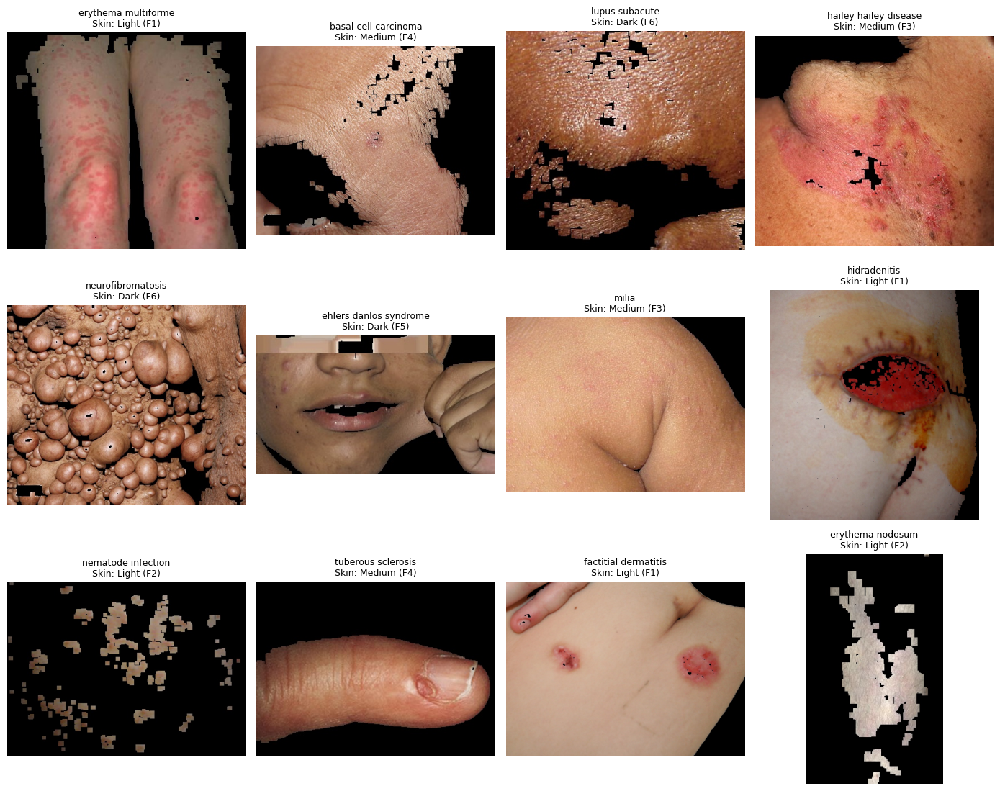

In [47]:
import matplotlib.pyplot as plt

sample_df = matched_df.sample(
    n=12,
    random_state=42
)

fig, axes = plt.subplots(
    3, 4,
    figsize=(14, 11)
)

axes = axes.flatten()

for ax, (_, row) in zip(axes, sample_df.iterrows()):

    try:
        image = Image.open(
            row["image_path"]
        ).convert("RGB")

        ax.imshow(image)

        ax.set_title(
            f"{row['label'][:22]}\n"
            f"Skin: {row['skin_tone_group']} "
            f"(F{row['fitzpatrick_scale']})",
            fontsize=9
        )

    except Exception:
        ax.set_title("Image loading failed")

    ax.axis("off")

plt.tight_layout()
plt.show()

Cell 7 — Skin-Tone Representative Samples

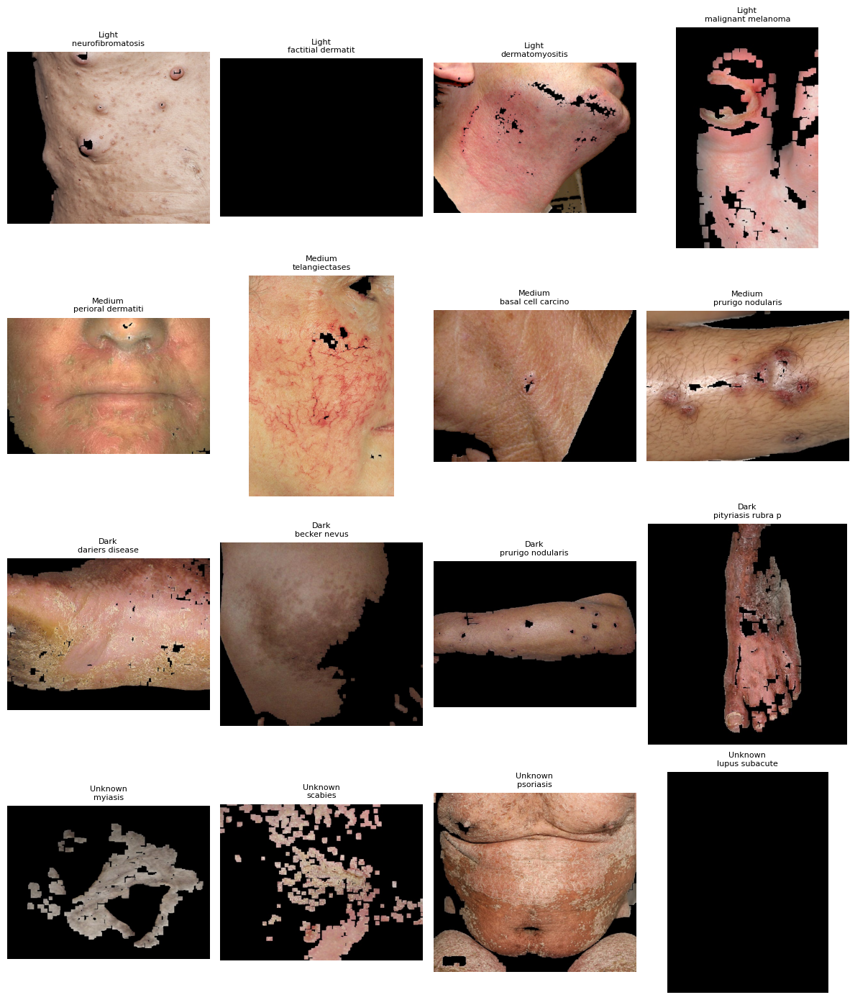

In [48]:
skin_groups = [
    "Light",
    "Medium",
    "Dark",
    "Unknown"
]

fig, axes = plt.subplots(
    4, 4,
    figsize=(12, 14)
)

for row_idx, group in enumerate(skin_groups):

    group_df = matched_df[
        matched_df["skin_tone_group"] == group
    ].sample(
        n=4,
        random_state=42
    )

    for col_idx, (_, row) in enumerate(group_df.iterrows()):

        ax = axes[row_idx, col_idx]

        try:
            image = Image.open(
                row["image_path"]
            ).convert("RGB")

            ax.imshow(image)

            ax.set_title(
                f"{group}\n{row['label'][:18]}",
                fontsize=8
            )

        except Exception:
            ax.set_title("Load failed")

        ax.axis("off")

plt.tight_layout()
plt.show()

Cell 8 — Disease-Class Sample Visualization

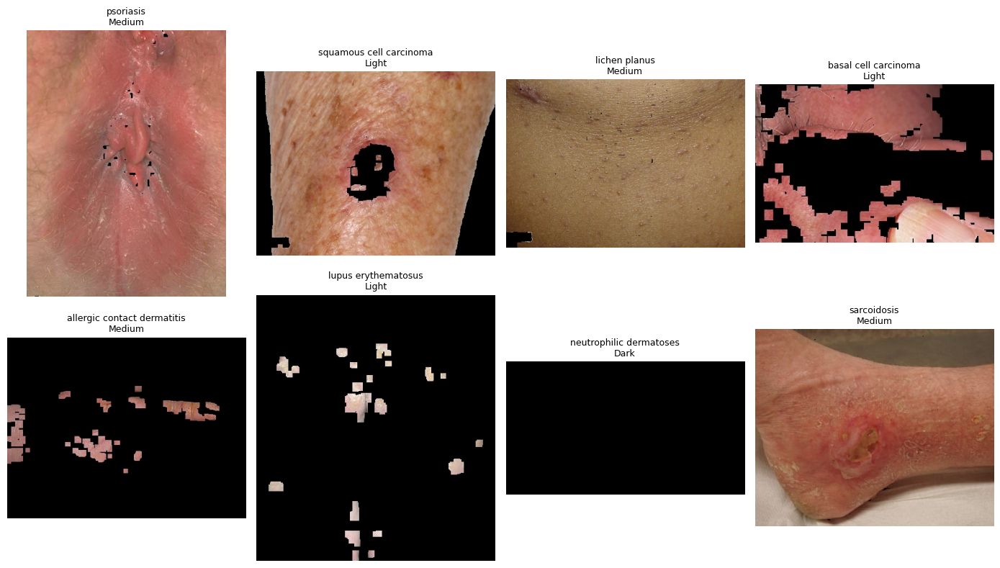

In [49]:
top_diseases = (
    matched_df["label"]
    .value_counts()
    .head(8)
    .index
)

fig, axes = plt.subplots(
    2, 4,
    figsize=(14, 8)
)

for ax, disease in zip(axes.flatten(), top_diseases):

    sample = matched_df[
        matched_df["label"] == disease
    ].sample(
        n=1,
        random_state=42
    ).iloc[0]

    try:
        image = Image.open(
            sample["image_path"]
        ).convert("RGB")

        ax.imshow(image)

        ax.set_title(
            f"{disease}\n"
            f"{sample['skin_tone_group']}",
            fontsize=9
        )

    except Exception:
        ax.set_title("Load failed")

    ax.axis("off")

plt.tight_layout()
plt.show()

Cell 9 — Check Extremely Small / Large Images

In [50]:
image_sizes = []

for path in matched_df["image_path"]:

    try:
        with Image.open(path) as img:
            width, height = img.size
            image_sizes.append(
                (width, height, path)
            )

    except Exception:
        pass

small_images = [
    x for x in image_sizes
    if x[0] < 100 or x[1] < 100
]

print("=" * 50)
print("IMAGE SIZE CHECK")
print("=" * 50)

print("Images checked:", len(image_sizes))
print("Images below 100×100:", len(small_images))

if small_images:
    print("\nExamples:")
    for width, height, path in small_images[:10]:
        print(width, "x", height, path)

print("=" * 50)

IMAGE SIZE CHECK
Images checked: 16574
Images below 100×100: 68

Examples:
130 x 98 /content/skin-tone-fairness/data/fitzpatrick17k/background removed/656ee5b708a8250872b363adf2c1476a.jpg
130 x 81 /content/skin-tone-fairness/data/fitzpatrick17k/background removed/3f7aaf6d85e7d27d7d4c403f47895695.jpg
130 x 74 /content/skin-tone-fairness/data/fitzpatrick17k/background removed/4157d3f95f44ccc755f79cda16722730.jpg
130 x 88 /content/skin-tone-fairness/data/fitzpatrick17k/background removed/ca86e26ccedeb67ab344763f929d6bbb.jpg
130 x 87 /content/skin-tone-fairness/data/fitzpatrick17k/background removed/0c1d81533a06aa3086cf33b85ed77e16.jpg
130 x 80 /content/skin-tone-fairness/data/fitzpatrick17k/background removed/a9df130f561e5f8a649e6fd2ecf227f5.jpg
130 x 69 /content/skin-tone-fairness/data/fitzpatrick17k/background removed/b1fed8d980864611cd0a7cc0b77035ab.jpg
130 x 66 /content/skin-tone-fairness/data/fitzpatrick17k/background removed/d1d7decacddf2cae04a23a7046d49cb3.jpg
87 x 130 /content/ski

Cell 10 — Save Image Quality Summary

In [51]:
quality_summary = {
    "total_images": len(matched_df),
    "valid_images": valid_images,
    "corrupt_images": corrupt_images,
    "invalid_paths": int((~path_exists).sum()),
    "unique_dimensions": len(dimension_counter),
    "very_small_images": len(small_images)
}

quality_summary_df = pd.DataFrame(
    [quality_summary]
)

QUALITY_PATH = (
    PROJECT_ROOT /
    "outputs" /
    "metrics" /
    "image_quality_summary.csv"
)

quality_summary_df.to_csv(
    QUALITY_PATH,
    index=False
)

print("Quality summary saved to:")
print(QUALITY_PATH)

display(quality_summary_df)

Quality summary saved to:
/content/skin-tone-fairness/outputs/metrics/image_quality_summary.csv


,total_images,valid_images,corrupt_images,invalid_paths,unique_dimensions,very_small_images
0,16574,16574,0,0,10420,68


Cell 11 — Background Artifact Check

In [52]:
import numpy as np
from PIL import Image

def calculate_black_border_ratio(image_path, threshold=10):

    with Image.open(image_path).convert("RGB") as img:

        img = np.array(img)

        h, w, _ = img.shape

        # Take a small border width
        border = max(2, int(min(h, w) * 0.05))

        top = img[:border, :, :]
        bottom = img[-border:, :, :]
        left = img[:, :border, :]
        right = img[:, -border:, :]

        border_pixels = np.concatenate([
            top.reshape(-1, 3),
            bottom.reshape(-1, 3),
            left.reshape(-1, 3),
            right.reshape(-1, 3)
        ])

        black_pixels = np.all(
            border_pixels <= threshold,
            axis=1
        )

        return black_pixels.mean()


# Test on a sample first
sample_paths = matched_df["image_path"].sample(
    n=100,
    random_state=42
)

black_ratios = []

for path in sample_paths:

    try:
        ratio = calculate_black_border_ratio(path)
        black_ratios.append(ratio)

    except Exception:
        pass

print("=" * 60)
print("BACKGROUND ARTIFACT CHECK")
print("=" * 60)

print("Images tested:", len(black_ratios))
print(
    "Mean black-border ratio:",
    round(np.mean(black_ratios), 4)
)
print(
    "Median black-border ratio:",
    round(np.median(black_ratios), 4)
)
print(
    "Images with >50% black border:",
    sum(r > 0.50 for r in black_ratios)
)

print("=" * 60)

BACKGROUND ARTIFACT CHECK
Images tested: 100
Mean black-border ratio: 0.4585
Median black-border ratio: 0.4145
Images with >50% black border: 42


Cell 12 — Background Artifact Check Skin tone wise

In [53]:
# Calculate black-border ratio for a larger sample
artifact_df = matched_df.sample(
    n=min(2000, len(matched_df)),
    random_state=42
).copy()

artifact_df["black_border_ratio"] = (
    artifact_df["image_path"]
    .apply(calculate_black_border_ratio)
)

artifact_summary = (
    artifact_df
    .groupby("skin_tone_group")["black_border_ratio"]
    .agg(
        ["count", "mean", "median", "max"]
    )
    .reset_index()
)

display(artifact_summary)

,skin_tone_group,count,mean,median,max
0,Dark,242,0.520196,0.522718,1.0
1,Light,939,0.498829,0.509914,1.0
2,Medium,756,0.400802,0.374140,1.0
3,Unknown,63,0.696934,0.783174,1.0


Cell 13 — Full Background Artifact Analysis

In [54]:
full_artifact_df = matched_df.copy()

full_artifact_df["black_border_ratio"] = (
    full_artifact_df["image_path"]
    .apply(calculate_black_border_ratio)
)

print("=" * 60)
print("FULL DATASET BACKGROUND ARTIFACT ANALYSIS")
print("=" * 60)

artifact_summary_full = (
    full_artifact_df
    .groupby("skin_tone_group")["black_border_ratio"]
    .agg(
        count="count",
        mean="mean",
        median="median",
        std="std",
        max="max"
    )
    .reset_index()
)

display(artifact_summary_full)

print("\nOverall statistics:")
print(
    full_artifact_df["black_border_ratio"].describe()
)

print("\nImages with >50% black border:",
      (full_artifact_df["black_border_ratio"] > 0.50).sum())

print(
    "Percentage:",
    round(
        (full_artifact_df["black_border_ratio"] > 0.50).mean() * 100,
        2
    ),
    "%"
)

print("=" * 60)

FULL DATASET BACKGROUND ARTIFACT ANALYSIS


,skin_tone_group,count,mean,median,std,max
0,Dark,2168,0.556945,0.594276,0.289379,1.0
1,Light,7755,0.494984,0.497281,0.319473,1.0
2,Medium,6089,0.401659,0.380103,0.301265,1.0
3,Unknown,562,0.641076,0.732929,0.347623,1.0



Overall statistics:
count    16574.000000
mean         0.473757
std          0.316398
min          0.000000
25%          0.191447
50%          0.470114
75%          0.742072
max          1.000000
Name: black_border_ratio, dtype: float64

Images with >50% black border: 7836
Percentage: 47.28 %


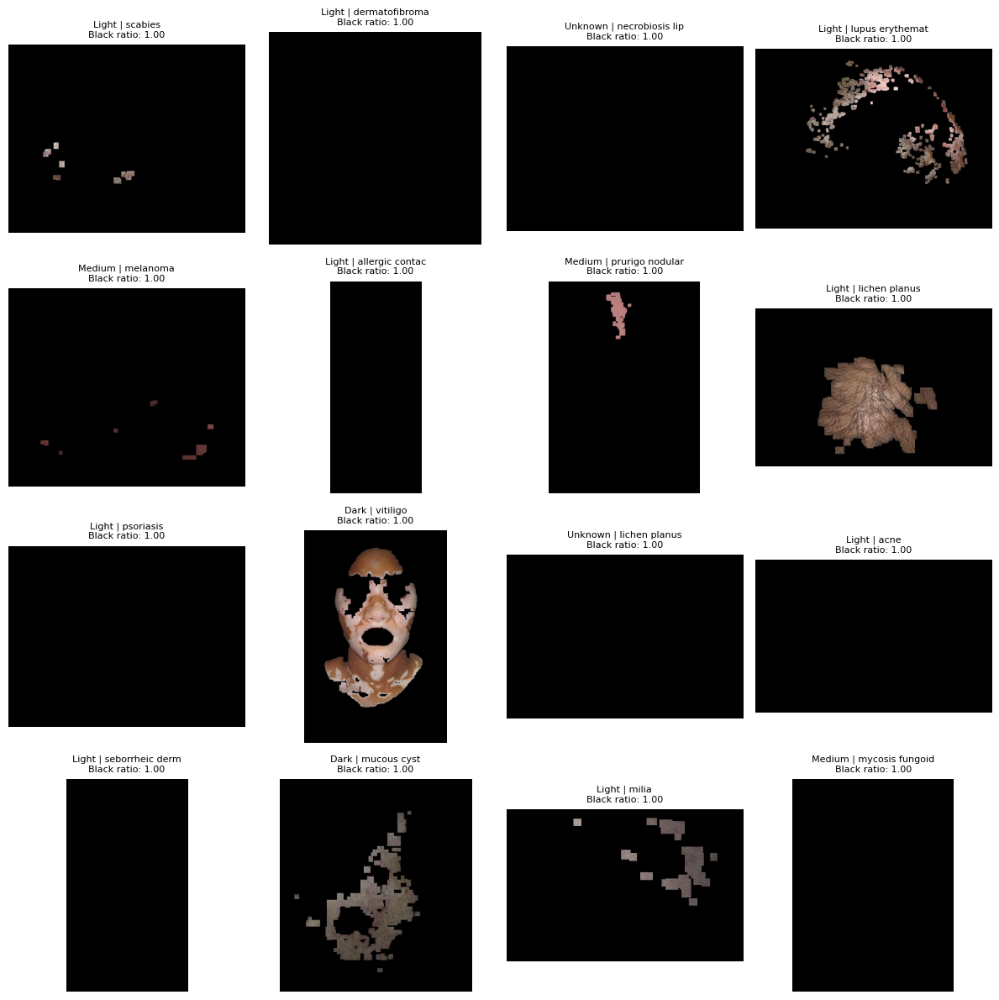

In [55]:
# Show images with the highest black-border ratios

extreme_df = (
    full_artifact_df
    .sort_values(
        "black_border_ratio",
        ascending=False
    )
    .head(16)
)

fig, axes = plt.subplots(
    4, 4,
    figsize=(12, 12)
)

for ax, (_, row) in zip(
    axes.flatten(),
    extreme_df.iterrows()
):

    try:
        image = Image.open(
            row["image_path"]
        ).convert("RGB")

        ax.imshow(image)

        ax.set_title(
            f"{row['skin_tone_group']} | "
            f"{row['label'][:15]}\n"
            f"Black ratio: "
            f"{row['black_border_ratio']:.2f}",
            fontsize=8
        )

    except Exception:
        ax.set_title("Load failed")

    ax.axis("off")

plt.tight_layout()
plt.show()

In [56]:
# Add the artifact measure to the master dataframe
matched_df["black_border_ratio"] = (
    full_artifact_df["black_border_ratio"]
)

ARTIFACT_METADATA_PATH = (
    PROJECT_ROOT /
    "data" /
    "fitzpatrick17k_prepared.csv"
)

matched_df.to_csv(
    ARTIFACT_METADATA_PATH,
    index=False
)

print("Prepared metadata saved to:")
print(ARTIFACT_METADATA_PATH)

print("\nShape:", matched_df.shape)
print(
    "Black-border ratio available:",
    matched_df["black_border_ratio"].notna().sum()
)

Prepared metadata saved to:
/content/skin-tone-fairness/data/fitzpatrick17k_prepared.csv

Shape: (16574, 12)
Black-border ratio available: 16574


**Phase 1.5 — Train / Validation / Test Split**

Cell 1 — Load Prepared Metadata

In [57]:
# Phase 1.5 — Cell 1
# Load prepared dataset

import pandas as pd
import numpy as np
from pathlib import Path

from sklearn.model_selection import train_test_split

PROJECT_ROOT = Path("/content/skin-tone-fairness")

PREPARED_METADATA_PATH = (
    PROJECT_ROOT /
    "data" /
    "fitzpatrick17k_prepared.csv"
)

df = pd.read_csv(PREPARED_METADATA_PATH)

print("=" * 60)
print("PHASE 1.5 — DATASET SPLITTING")
print("=" * 60)

print("Total records:", len(df))
print("Disease classes:", df["label"].nunique())
print("Skin-tone groups:", df["skin_tone_group"].nunique())

print("=" * 60)

PHASE 1.5 — DATASET SPLITTING
Total records: 16574
Disease classes: 114
Skin-tone groups: 4


Cell 2 — Check Exact Duplicate Images

In [58]:
duplicate_hash_count = df["md5hash"].duplicated().sum()

print("=" * 60)
print("DUPLICATE IMAGE CHECK")
print("=" * 60)

print("Total records:", len(df))
print("Duplicate MD5 records:", duplicate_hash_count)
print("=" * 60)

if duplicate_hash_count == 0:
    print("No exact duplicate images detected.")
else:
    print("WARNING: Duplicate images detected.")

DUPLICATE IMAGE CHECK
Total records: 16574
Duplicate MD5 records: 0
No exact duplicate images detected.


Cell 3 — Create Robust Stratification Key

In [59]:
df["disease_skin"] = (
    df["label"].astype(str)
    + "__"
    + df["skin_tone_group"].astype(str)
)

combination_counts = df["disease_skin"].value_counts()

# Use disease + skin-tone only when the combination
# has enough samples; otherwise use disease alone.
df["stratify_key"] = np.where(
    df["disease_skin"].map(combination_counts) >= 4,
    df["disease_skin"],
    df["label"]
)

print("=" * 60)
print("STRATIFICATION KEY")
print("=" * 60)

print("Total stratification groups:",
      df["stratify_key"].nunique())

print(
    "Disease+skin combinations:",
    df["disease_skin"].nunique()
)

print(
    "Small disease+skin combinations (<4):",
    (combination_counts < 4).sum()
)

print("=" * 60)

STRATIFICATION KEY
Total stratification groups: 433
Disease+skin combinations: 440
Small disease+skin combinations (<4): 69


Cell 4 — First Split: Train 70% / Temporary 30%

In [60]:
import numpy as np

# Identify classes in stratify_key with only one sample
stratify_counts = df["stratify_key"].value_counts()
single_sample_classes = stratify_counts[stratify_counts < 2].index

# Separate the DataFrame into two parts:
# 1. df_stratify: for rows where stratify_key has at least 2 samples
# 2. df_single_class: for rows where stratify_key has only 1 sample
df_stratify = df[~df["stratify_key"].isin(single_sample_classes)].copy()
df_single_class = df[df["stratify_key"].isin(single_sample_classes)].copy()

# Perform the first split (Train 70% / Temporary 30%) on df_stratify
train_df_stratified, temp_df_stratified = train_test_split(
    df_stratify,
    test_size=0.30,
    random_state=42,
    stratify=df_stratify["stratify_key"]
)

# Concatenate the single-sample rows to the training set
# This ensures all data is included, but these specific samples are not stratified
train_df = pd.concat([train_df_stratified, df_single_class]).reset_index(drop=True)
temp_df = temp_df_stratified.reset_index(drop=True)

print("=" * 60)
print("FIRST SPLIT")
print("=" * 60)

print("Total records:", len(df))
print("Records with single-sample stratify_key:", len(df_single_class))
print("Train :", len(train_df))
print("Temp  :", len(temp_df))

print("\nPercentages:")
print(
    f"Train: {len(train_df) / len(df) * 100:.2f}%"
)
print(
    f"Temp : {len(temp_df) / len(df) * 100:.2f}%"
)

print("=" * 60)


FIRST SPLIT
Total records: 16574
Records with single-sample stratify_key: 18
Train : 11607
Temp  : 4967

Percentages:
Train: 70.03%
Temp : 29.97%


Cell 5 — Create Stratification Key for Validation/Test

In [61]:
temp_combination = (
    temp_df["label"].astype(str)
    + "__"
    + temp_df["skin_tone_group"].astype(str)
)

temp_counts = temp_combination.value_counts()

temp_df["temp_stratify_key"] = np.where(
    temp_combination.map(temp_counts) >= 2,
    temp_combination,
    temp_df["label"]
)

print("=" * 60)
print("VALIDATION / TEST STRATIFICATION")
print("=" * 60)

print(
    "Temporary records:",
    len(temp_df)
)

print(
    "Composite groups with <2 samples:",
    (temp_counts < 2).sum()
)

print("=" * 60)

VALIDATION / TEST STRATIFICATION
Temporary records: 4967
Composite groups with <2 samples: 83


Cell 6 — Second Split: Validation 15% / Test 15%

In [62]:
import numpy as np

# Identify classes in temp_stratify_key with only one sample
temp_stratify_counts = temp_df["temp_stratify_key"].value_counts()
temp_single_sample_classes = temp_stratify_counts[temp_stratify_counts < 2].index

# Separate temp_df into two parts:
# 1. temp_df_stratify: for rows where temp_stratify_key has at least 2 samples
# 2. temp_df_single_class: for rows where temp_stratify_key has only 1 sample
temp_df_stratify = temp_df[~temp_df["temp_stratify_key"].isin(temp_single_sample_classes)].copy()
temp_df_single_class = temp_df[temp_df["temp_stratify_key"].isin(temp_single_sample_classes)].copy()

# Perform the second split (Validation 15% / Test 15%) on temp_df_stratify
# test_size=0.50 here means 50% of temp_df_stratify will go to test,
# and 50% to validation.
val_df_stratified, test_df_stratified = train_test_split(
    temp_df_stratify,
    test_size=0.50,
    random_state=42,
    stratify=temp_df_stratify["temp_stratify_key"]
)

# Concatenate the single-sample rows to the validation set
# This ensures all data is included, but these specific samples are not stratified
val_df = pd.concat([val_df_stratified, temp_df_single_class]).reset_index(drop=True)
test_df = test_df_stratified.reset_index(drop=True)

print("=" * 60)
print("FINAL DATASET SPLIT")
print("=" * 60)

print("Total records:", len(df))
print("Records in temp with single-sample stratify_key:", len(temp_df_single_class))
print("Train      :", len(train_df))
print("Validation :", len(val_df))
print("Test       :", len(test_df))

print("\nPercentages:")

print(
    f"Train      : {len(train_df) / len(df) * 100:.2f}%"
)

print(
    f"Validation : {len(val_df) / len(df) * 100:.2f}%"
)

print(
    f"Test       : {len(test_df) / len(df) * 100:.2f}%"
)

print("=" * 60)

FINAL DATASET SPLIT
Total records: 16574
Records in temp with single-sample stratify_key: 59
Train      : 11607
Validation : 2513
Test       : 2454

Percentages:
Train      : 70.03%
Validation : 15.16%
Test       : 14.81%


Cell 7 — Verify Disease Distribution

In [63]:
def disease_distribution(data):
    return (
        data["label"]
        .value_counts(normalize=True)
        .sort_index()
        * 100
    )

disease_compare = pd.DataFrame({
    "Overall": disease_distribution(df),
    "Train": disease_distribution(train_df),
    "Validation": disease_distribution(val_df),
    "Test": disease_distribution(test_df)
}).fillna(0)

print("=" * 60)
print("DISEASE DISTRIBUTION CHECK")
print("=" * 60)

display(disease_compare.head(20))

DISEASE DISTRIBUTION CHECK


,Overall,Train,Validation,Test
label,,,,
acanthosis nigricans,0.555086,0.551391,0.596896,0.529747
acne,1.104139,1.102783,1.114206,1.100244
acne vulgaris,2.021238,2.016025,1.989654,2.078240
acquired autoimmune bullous diseaseherpes gestationis,0.404248,0.396313,0.437724,0.407498
acrodermatitis enteropathica,0.555086,0.560007,0.517310,0.570497
actinic keratosis,1.055871,1.051090,1.074413,1.059495
allergic contact dermatitis,2.594425,2.593263,2.586550,2.607987
aplasia cutis,0.434415,0.439390,0.437724,0.407498
basal cell carcinoma,2.823700,2.834496,2.745722,2.852486


Cell 8 — Verify Skin-Tone Distribution

In [64]:
skin_compare = pd.DataFrame({
    "Overall": (
        df["skin_tone_group"]
        .value_counts(normalize=True)
        * 100
    ),

    "Train": (
        train_df["skin_tone_group"]
        .value_counts(normalize=True)
        * 100
    ),

    "Validation": (
        val_df["skin_tone_group"]
        .value_counts(normalize=True)
        * 100
    ),

    "Test": (
        test_df["skin_tone_group"]
        .value_counts(normalize=True)
        * 100
    )
}).fillna(0)

print("=" * 60)
print("SKIN-TONE DISTRIBUTION CHECK")
print("=" * 60)

display(skin_compare.round(2))

SKIN-TONE DISTRIBUTION CHECK


,Overall,Train,Validation,Test
skin_tone_group,,,,
Light,46.79,46.74,46.52,47.31
Medium,36.74,36.72,36.29,37.29
Dark,13.08,13.14,13.13,12.75
Unknown,3.39,3.40,4.06,2.65


Cell 9 — Verify Disease × Skin-Tone Distribution

In [65]:
def disease_skin_distribution(data):

    table = pd.crosstab(
        data["label"],
        data["skin_tone_group"],
        normalize="index"
    ) * 100

    return table


overall_ds = disease_skin_distribution(df)
train_ds = disease_skin_distribution(train_df)
val_ds = disease_skin_distribution(val_df)
test_ds = disease_skin_distribution(test_df)

print("=" * 60)
print("DISEASE × SKIN-TONE DISTRIBUTION")
print("=" * 60)

print("Overall:")
display(overall_ds.head(10).round(2))

print("Train:")
display(train_ds.head(10).round(2))

print("Validation:")
display(val_ds.head(10).round(2))

print("Test:")
display(test_ds.head(10).round(2))

DISEASE × SKIN-TONE DISTRIBUTION
Overall:


skin_tone_group,Dark,Light,Medium,Unknown
label,,,,
acanthosis nigricans,30.43,21.74,45.65,2.17
acne,9.84,59.56,30.05,0.55
acne vulgaris,6.57,66.57,26.57,0.30
acquired autoimmune bullous diseaseherpes gestationis,2.99,67.16,29.85,0.00
acrodermatitis enteropathica,4.35,48.91,41.30,5.43
actinic keratosis,6.86,60.00,29.14,4.00
allergic contact dermatitis,5.58,60.23,31.86,2.33
aplasia cutis,2.78,75.00,15.28,6.94
basal cell carcinoma,6.62,51.50,40.17,1.71


Train:


skin_tone_group,Dark,Light,Medium,Unknown
label,,,,
acanthosis nigricans,31.25,21.88,45.31,1.56
acne,10.16,59.38,29.69,0.78
acne vulgaris,6.41,66.67,26.50,0.43
acquired autoimmune bullous diseaseherpes gestationis,2.17,67.39,30.43,0.00
acrodermatitis enteropathica,4.62,47.69,41.54,6.15
actinic keratosis,6.56,59.84,29.51,4.10
allergic contact dermatitis,5.65,60.13,31.89,2.33
aplasia cutis,1.96,74.51,15.69,7.84
basal cell carcinoma,6.69,51.37,40.12,1.82


Validation:


skin_tone_group,Dark,Light,Medium,Unknown
label,,,,
acanthosis nigricans,26.67,20.00,46.67,6.67
acne,10.71,57.14,32.14,0.00
acne vulgaris,6.00,68.00,26.00,0.00
acquired autoimmune bullous diseaseherpes gestationis,9.09,63.64,27.27,0.00
acrodermatitis enteropathica,0.00,53.85,38.46,7.69
actinic keratosis,7.41,59.26,29.63,3.70
allergic contact dermatitis,4.62,60.00,32.31,3.08
aplasia cutis,9.09,72.73,18.18,0.00
basal cell carcinoma,5.80,52.17,40.58,1.45


Test:


skin_tone_group,Dark,Light,Medium,Unknown
label,,,,
acanthosis nigricans,30.77,23.08,46.15,0.00
acne,7.41,62.96,29.63,0.00
acne vulgaris,7.84,64.71,27.45,0.00
acquired autoimmune bullous diseaseherpes gestationis,0.00,70.00,30.00,0.00
acrodermatitis enteropathica,7.14,50.00,42.86,0.00
actinic keratosis,7.69,61.54,26.92,3.85
allergic contact dermatitis,6.25,60.94,31.25,1.56
aplasia cutis,0.00,80.00,10.00,10.00
basal cell carcinoma,7.14,51.43,40.00,1.43


Cell 10 — Check Split Leakage

In [66]:
train_hashes = set(train_df["md5hash"])
val_hashes = set(val_df["md5hash"])
test_hashes = set(test_df["md5hash"])

train_val_overlap = train_hashes & val_hashes
train_test_overlap = train_hashes & test_hashes
val_test_overlap = val_hashes & test_hashes

print("=" * 60)
print("DATA LEAKAGE CHECK")
print("=" * 60)

print("Train ∩ Validation:",
      len(train_val_overlap))

print("Train ∩ Test:",
      len(train_test_overlap))

print("Validation ∩ Test:",
      len(val_test_overlap))

print("=" * 60)

DATA LEAKAGE CHECK
Train ∩ Validation: 0
Train ∩ Test: 0
Validation ∩ Test: 0


Cell 11 — Remove Temporary Columns

In [67]:
temporary_columns = [
    "disease_skin",
    "stratify_key",
    "temp_stratify_key"
]

for column in temporary_columns:

    if column in train_df.columns:
        train_df = train_df.drop(columns=column)

    if column in val_df.columns:
        val_df = val_df.drop(columns=column)

    if column in test_df.columns:
        test_df = test_df.drop(columns=column)

print("Temporary stratification columns removed.")

Temporary stratification columns removed.


Cell 12 — Save Final Splits

In [68]:
SPLIT_DIR = (
    PROJECT_ROOT /
    "data" /
    "splits"
)

SPLIT_DIR.mkdir(
    parents=True,
    exist_ok=True
)

TRAIN_PATH = SPLIT_DIR / "train.csv"
VAL_PATH = SPLIT_DIR / "validation.csv"
TEST_PATH = SPLIT_DIR / "test.csv"

train_df.to_csv(
    TRAIN_PATH,
    index=False
)

val_df.to_csv(
    VAL_PATH,
    index=False
)

test_df.to_csv(
    TEST_PATH,
    index=False
)

print("=" * 60)
print("SPLITS SAVED")
print("=" * 60)

print("Train:")
print(TRAIN_PATH)

print("\nValidation:")
print(VAL_PATH)

print("\nTest:")
print(TEST_PATH)

print("=" * 60)

SPLITS SAVED
Train:
/content/skin-tone-fairness/data/splits/train.csv

Validation:
/content/skin-tone-fairness/data/splits/validation.csv

Test:
/content/skin-tone-fairness/data/splits/test.csv


Cell 13 — Final Split Summary

In [69]:
print("=" * 60)
print("PHASE 1.5 — FINAL SPLIT SUMMARY")
print("=" * 60)

print(f"Total images : {len(df):,}")
print(f"Train        : {len(train_df):,}")
print(f"Validation   : {len(val_df):,}")
print(f"Test         : {len(test_df):,}")

print("\nDisease classes:")
print("Train      :", train_df["label"].nunique())
print("Validation :", val_df["label"].nunique())
print("Test       :", test_df["label"].nunique())

print("\nSkin-tone groups:")
print(
    train_df["skin_tone_group"]
    .value_counts()
)

print("\nLeakage:")
print("Train-Val :", len(train_val_overlap))
print("Train-Test:", len(train_test_overlap))
print("Val-Test  :", len(val_test_overlap))

print("=" * 60)
print("Phase 1.5 completed.")

PHASE 1.5 — FINAL SPLIT SUMMARY
Total images : 16,574
Train        : 11,607
Validation   : 2,513
Test         : 2,454

Disease classes:
Train      : 114
Validation : 114
Test       : 114

Skin-tone groups:
skin_tone_group
Light      5425
Medium     4262
Dark       1525
Unknown     395
Name: count, dtype: int64

Leakage:
Train-Val : 0
Train-Test: 0
Val-Test  : 0
Phase 1.5 completed.


Cell 14 — Check black-border ratio across splits

In [70]:
artifact_split_summary = pd.DataFrame({
    "Train": train_df["black_border_ratio"].describe(),
    "Validation": val_df["black_border_ratio"].describe(),
    "Test": test_df["black_border_ratio"].describe()
})

print("=" * 60)
print("BLACK-BORDER RATIO ACROSS SPLITS")
print("=" * 60)

display(artifact_split_summary.round(4))

print("\nMean black-border ratio:")
print("Train      :", round(train_df["black_border_ratio"].mean(), 4))
print("Validation :", round(val_df["black_border_ratio"].mean(), 4))
print("Test       :", round(test_df["black_border_ratio"].mean(), 4))

print("\n>50% black-border images:")

for name, split in [
    ("Train", train_df),
    ("Validation", val_df),
    ("Test", test_df)
]:
    count = (split["black_border_ratio"] > 0.50).sum()
    percentage = count / len(split) * 100

    print(
        f"{name:12s}: {count:5d} "
        f"({percentage:.2f}%)"
    )

print("=" * 60)

BLACK-BORDER RATIO ACROSS SPLITS


,Train,Validation,Test
count,11607.0000,2513.0000,2454.0000
mean,0.4710,0.4772,0.4835
std,0.3160,0.3148,0.3200
min,0.0000,0.0000,0.0000
25%,0.1895,0.1935,0.1970
50%,0.4676,0.4768,0.4797
75%,0.7368,0.7412,0.7670
max,1.0000,1.0000,1.0000



Mean black-border ratio:
Train      : 0.471
Validation : 0.4772
Test       : 0.4835

>50% black-border images:
Train       :  5455 (47.00%)
Validation  :  1195 (47.55%)
Test        :  1186 (48.33%)


# **Phase 2 — Image Preprocessing & DataLoader**

**Phase 2.1 — Label Preparation**

Cell 1 — Load Final Splits

In [71]:
import pandas as pd
from pathlib import Path

PROJECT_ROOT = Path("/content/skin-tone-fairness")

SPLIT_DIR = PROJECT_ROOT / "data" / "splits"

TRAIN_PATH = SPLIT_DIR / "train.csv"
VAL_PATH = SPLIT_DIR / "validation.csv"
TEST_PATH = SPLIT_DIR / "test.csv"

train_df = pd.read_csv(TRAIN_PATH)
val_df = pd.read_csv(VAL_PATH)
test_df = pd.read_csv(TEST_PATH)

print("=" * 60)
print("PHASE 2.1 — LABEL PREPARATION")
print("=" * 60)

print("Train      :", len(train_df))
print("Validation :", len(val_df))
print("Test       :", len(test_df))

print("Train classes      :", train_df["label"].nunique())
print("Validation classes :", val_df["label"].nunique())
print("Test classes       :", test_df["label"].nunique())

print("=" * 60)

PHASE 2.1 — LABEL PREPARATION
Train      : 11607
Validation : 2513
Test       : 2454
Train classes      : 114
Validation classes : 114
Test classes       : 114


Cell 2 — Create Fixed Disease-to-ID Mapping

In [72]:
class_names = sorted(
    train_df["label"].unique()
)

label_to_id = {
    label: idx
    for idx, label in enumerate(class_names)
}

id_to_label = {
    idx: label
    for label, idx in label_to_id.items()
}

print("=" * 60)
print("DISEASE LABEL MAPPING")
print("=" * 60)

print("Number of classes:", len(class_names))

print("\nFirst 20 mappings:")

for idx in range(min(20, len(class_names))):
    print(f"{idx:3d} → {id_to_label[idx]}")

print("=" * 60)

DISEASE LABEL MAPPING
Number of classes: 114

First 20 mappings:
  0 → acanthosis nigricans
  1 → acne
  2 → acne vulgaris
  3 → acquired autoimmune bullous diseaseherpes gestationis
  4 → acrodermatitis enteropathica
  5 → actinic keratosis
  6 → allergic contact dermatitis
  7 → aplasia cutis
  8 → basal cell carcinoma
  9 → basal cell carcinoma morpheiform
 10 → becker nevus
 11 → behcets disease
 12 → calcinosis cutis
 13 → cheilitis
 14 → congenital nevus
 15 → dariers disease
 16 → dermatofibroma
 17 → dermatomyositis
 18 → disseminated actinic porokeratosis
 19 → drug eruption


Cell 3 — Apply Mapping to All Splits

In [73]:
train_df["class_id"] = train_df["label"].map(label_to_id)
val_df["class_id"] = val_df["label"].map(label_to_id)
test_df["class_id"] = test_df["label"].map(label_to_id)

print("=" * 60)
print("CLASS ID ASSIGNMENT")
print("=" * 60)

print(
    "Missing train class IDs:",
    train_df["class_id"].isna().sum()
)

print(
    "Missing validation class IDs:",
    val_df["class_id"].isna().sum()
)

print(
    "Missing test class IDs:",
    test_df["class_id"].isna().sum()
)

print("=" * 60)

CLASS ID ASSIGNMENT
Missing train class IDs: 0
Missing validation class IDs: 0
Missing test class IDs: 0


Cell 4 — Verify Class-ID Consistency

In [74]:
train_ids = set(train_df["class_id"])
val_ids = set(val_df["class_id"])
test_ids = set(test_df["class_id"])

print("=" * 60)
print("CLASS MAPPING CONSISTENCY")
print("=" * 60)

print("Train class IDs      :", len(train_ids))
print("Validation class IDs :", len(val_ids))
print("Test class IDs       :", len(test_ids))

print("\nValidation missing IDs:",
      sorted(train_ids - val_ids))

print("Test missing IDs:",
      sorted(train_ids - test_ids))

print("=" * 60)

CLASS MAPPING CONSISTENCY
Train class IDs      : 114
Validation class IDs : 114
Test class IDs       : 114

Validation missing IDs: []
Test missing IDs: []


Cell 5 — Check Label Mapping Examples

In [75]:
print("TRAIN SAMPLE")
display(
    train_df[
        ["label", "class_id", "skin_tone_group"]
    ].head(10)
)

print("\nVALIDATION SAMPLE")
display(
    val_df[
        ["label", "class_id", "skin_tone_group"]
    ].head(10)
)

print("\nTEST SAMPLE")
display(
    test_df[
        ["label", "class_id", "skin_tone_group"]
    ].head(10)
)

TRAIN SAMPLE


,label,class_id,skin_tone_group
0,keloid,43,Light
1,neurotic excoriations,67,Medium
2,porokeratosis of mibelli,82,Light
3,pyogenic granuloma,88,Light
4,basal cell carcinoma morpheiform,9,Medium
5,lentigo maligna,46,Medium
6,becker nevus,10,Light
7,photodermatoses,75,Light
8,allergic contact dermatitis,6,Light
9,neutrophilic dermatoses,68,Light



VALIDATION SAMPLE


,label,class_id,skin_tone_group
0,squamous cell carcinoma,98,Unknown
1,granuloma annulare,34,Medium
2,melanoma,56,Medium
3,granuloma annulare,34,Light
4,pityriasis lichenoides chronica,78,Medium
5,striae,101,Light
6,fordyce spots,33,Light
7,erythema multiforme,28,Light
8,allergic contact dermatitis,6,Medium
9,acne,1,Medium



TEST SAMPLE


,label,class_id,skin_tone_group
0,lichen simplex,49,Light
1,basal cell carcinoma,8,Light
2,urticaria pigmentosa,110,Light
3,drug eruption,19,Dark
4,lupus erythematosus,51,Medium
5,keratosis pilaris,44,Medium
6,dermatomyositis,17,Light
7,seborrheic keratosis,96,Dark
8,psoriasis,86,Medium
9,pilar cyst,76,Light


Cell 6 — Save Label Mapping

In [76]:
import json

LABEL_DIR = PROJECT_ROOT / "configs"
LABEL_DIR.mkdir(
    parents=True,
    exist_ok=True
)

LABEL_MAPPING_PATH = (
    LABEL_DIR / "label_mapping.json"
)

with open(
    LABEL_MAPPING_PATH,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        {
            "label_to_id": label_to_id,
            "id_to_label": {
                str(k): v
                for k, v in id_to_label.items()
            }
        },
        f,
        indent=2,
        ensure_ascii=False
    )

print("Label mapping saved to:")
print(LABEL_MAPPING_PATH)

Label mapping saved to:
/content/skin-tone-fairness/configs/label_mapping.json


Cell 7 — Save Updated Splits

In [77]:
train_df.to_csv(
    TRAIN_PATH,
    index=False
)

val_df.to_csv(
    VAL_PATH,
    index=False
)

test_df.to_csv(
    TEST_PATH,
    index=False
)

print("=" * 60)
print("UPDATED SPLITS SAVED")
print("=" * 60)

print("Train      :", TRAIN_PATH)
print("Validation :", VAL_PATH)
print("Test       :", TEST_PATH)

print("=" * 60)

UPDATED SPLITS SAVED
Train      : /content/skin-tone-fairness/data/splits/train.csv
Validation : /content/skin-tone-fairness/data/splits/validation.csv
Test       : /content/skin-tone-fairness/data/splits/test.csv


Cell 8 — Phase 2.1 Final Check

In [78]:
print("=" * 60)
print("PHASE 2.1 — FINAL SUMMARY")
print("=" * 60)

print("Number of disease classes:", len(class_names))

print("\nDataset sizes:")
print("Train      :", len(train_df))
print("Validation :", len(val_df))
print("Test       :", len(test_df))

print("\nClass ID range:")
print("Minimum:", train_df["class_id"].min())
print("Maximum:", train_df["class_id"].max())

print("\nMissing class IDs:")
print("Train      :", train_df["class_id"].isna().sum())
print("Validation :", val_df["class_id"].isna().sum())
print("Test       :", test_df["class_id"].isna().sum())

print("\nMapping file:")
print(LABEL_MAPPING_PATH)

print("=" * 60)
print("Phase 2.1 completed.")

PHASE 2.1 — FINAL SUMMARY
Number of disease classes: 114

Dataset sizes:
Train      : 11607
Validation : 2513
Test       : 2454

Class ID range:
Minimum: 0
Maximum: 113

Missing class IDs:
Train      : 0
Validation : 0
Test       : 0

Mapping file:
/content/skin-tone-fairness/configs/label_mapping.json
Phase 2.1 completed.


**Phase 2.2 — Image Transforms**

Cell 1 — Import Libraries

In [79]:
import torch
from torchvision import transforms

print("=" * 60)
print("PHASE 2.2 — IMAGE TRANSFORMS")
print("=" * 60)

print("PyTorch version:", torch.__version__)
print("Torchvision transforms imported successfully.")

print("=" * 60)

PHASE 2.2 — IMAGE TRANSFORMS
PyTorch version: 2.11.0+cu128
Torchvision transforms imported successfully.


Cell 2 — Define Image Size and Normalization

In [80]:
IMAGE_SIZE = 224

# ImageNet normalization
IMAGENET_MEAN = [
    0.485,
    0.456,
    0.406
]

IMAGENET_STD = [
    0.229,
    0.224,
    0.225
]

print("=" * 60)
print("IMAGE PREPROCESSING CONFIGURATION")
print("=" * 60)

print("Image size:", IMAGE_SIZE)
print("ImageNet mean:", IMAGENET_MEAN)
print("ImageNet std :", IMAGENET_STD)

print("=" * 60)

IMAGE PREPROCESSING CONFIGURATION
Image size: 224
ImageNet mean: [0.485, 0.456, 0.406]
ImageNet std : [0.229, 0.224, 0.225]


Cell 3 — Training Transform

In [81]:
train_transform = transforms.Compose([
    transforms.Resize(
        (IMAGE_SIZE, IMAGE_SIZE)
    ),

    transforms.RandomHorizontalFlip(
        p=0.5
    ),

    transforms.RandomRotation(
        degrees=10
    ),

    transforms.ToTensor(),

    transforms.Normalize(
        mean=IMAGENET_MEAN,
        std=IMAGENET_STD
    )
])

print("Training transform created:")
print(train_transform)

Training transform created:
Compose(
    Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
    RandomHorizontalFlip(p=0.5)
    RandomRotation(degrees=[-10.0, 10.0], interpolation=nearest, expand=False, fill=0)
    ToTensor()
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
)


Cell 4 — Validation Transform

In [82]:
val_transform = transforms.Compose([
    transforms.Resize(
        (IMAGE_SIZE, IMAGE_SIZE)
    ),

    transforms.ToTensor(),

    transforms.Normalize(
        mean=IMAGENET_MEAN,
        std=IMAGENET_STD
    )
])

print("Validation transform created:")
print(val_transform)

Validation transform created:
Compose(
    Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
    ToTensor()
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
)


Cell 5 — Test Transform

In [83]:
test_transform = transforms.Compose([
    transforms.Resize(
        (IMAGE_SIZE, IMAGE_SIZE)
    ),

    transforms.ToTensor(),

    transforms.Normalize(
        mean=IMAGENET_MEAN,
        std=IMAGENET_STD
    )
])

print("Test transform created:")
print(test_transform)

Test transform created:
Compose(
    Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
    ToTensor()
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
)


Cell 6 — Verify Transform on a Real Image

In [84]:
from PIL import Image

sample_path = train_df.iloc[0]["image_path"]

original_image = Image.open(
    sample_path
).convert("RGB")

transformed_image = train_transform(
    original_image
)

print("=" * 60)
print("TRANSFORM VERIFICATION")
print("=" * 60)

print("Original image size:",
      original_image.size)

print(
    "Transformed tensor shape:",
    transformed_image.shape
)

print(
    "Tensor dtype:",
    transformed_image.dtype
)

print(
    "Tensor min:",
    transformed_image.min().item()
)

print(
    "Tensor max:",
    transformed_image.max().item()
)

print("=" * 60)

TRANSFORM VERIFICATION
Original image size: (502, 376)
Transformed tensor shape: torch.Size([3, 224, 224])
Tensor dtype: torch.float32
Tensor min: -2.1179039478302
Tensor max: 1.974912166595459


Cell 7 — Verify Validation/Test Transform

In [85]:
val_sample = Image.open(
    val_df.iloc[0]["image_path"]
).convert("RGB")

test_sample = Image.open(
    test_df.iloc[0]["image_path"]
).convert("RGB")

val_tensor = val_transform(val_sample)
test_tensor = test_transform(test_sample)

print("=" * 60)
print("VALIDATION / TEST TRANSFORM CHECK")
print("=" * 60)

print("Validation tensor:",
      val_tensor.shape)

print("Test tensor:",
      test_tensor.shape)

print("=" * 60)

VALIDATION / TEST TRANSFORM CHECK
Validation tensor: torch.Size([3, 224, 224])
Test tensor: torch.Size([3, 224, 224])


Cell 8 — Check Augmentation Behavior

In [86]:
sample_image = Image.open(
    train_df.iloc[0]["image_path"]
).convert("RGB")

augmented_1 = train_transform(
    sample_image
)

augmented_2 = train_transform(
    sample_image
)

difference = torch.mean(
    torch.abs(
        augmented_1 - augmented_2
    )
).item()

print("=" * 60)
print("AUGMENTATION BEHAVIOR CHECK")
print("=" * 60)

print("Tensor shape:",
      augmented_1.shape)

print(
    "Mean difference between two augmentations:",
    round(difference, 6)
)

print("=" * 60)

AUGMENTATION BEHAVIOR CHECK
Tensor shape: torch.Size([3, 224, 224])
Mean difference between two augmentations: 0.249451


Cell 9 — Visualize Transformed Image

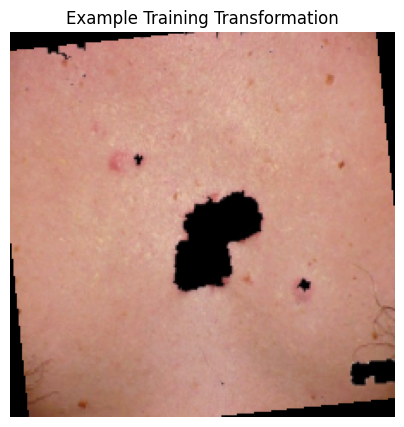

In [87]:
import matplotlib.pyplot as plt

def denormalize(tensor):
    mean = torch.tensor(
        IMAGENET_MEAN
    ).view(3, 1, 1)

    std = torch.tensor(
        IMAGENET_STD
    ).view(3, 1, 1)

    image = tensor.cpu() * std + mean

    return torch.clamp(
        image,
        0,
        1
    )


visual_tensor = train_transform(
    sample_image
)

visual_image = denormalize(
    visual_tensor
).permute(1, 2, 0)

plt.figure(
    figsize=(5, 5)
)

plt.imshow(
    visual_image.numpy()
)

plt.title(
    "Example Training Transformation"
)

plt.axis("off")
plt.show()

Cell 10 — Save Transform Configuration

In [88]:
import json

TRANSFORM_CONFIG_PATH = (
    PROJECT_ROOT /
    "configs" /
    "transform_config.json"
)

transform_config = {
    "image_size": IMAGE_SIZE,
    "normalization": {
        "mean": IMAGENET_MEAN,
        "std": IMAGENET_STD
    },
    "train_augmentation": {
        "horizontal_flip_probability": 0.5,
        "rotation_degrees": 10
    },
    "validation_augmentation": None,
    "test_augmentation": None
}

with open(
    TRANSFORM_CONFIG_PATH,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        transform_config,
        f,
        indent=2
    )

print("Transform configuration saved to:")
print(TRANSFORM_CONFIG_PATH)

Transform configuration saved to:
/content/skin-tone-fairness/configs/transform_config.json


Cell 11 — Phase 2.2 Final Check

In [89]:
print("=" * 60)
print("PHASE 2.2 — FINAL SUMMARY")
print("=" * 60)

print("Image size:",
      f"{IMAGE_SIZE} × {IMAGE_SIZE}")

print("Channels: 3")

print("\nTraining:")
print("Resize       : Yes")
print("Horizontal flip: p=0.5")
print("Rotation     : ±10 degrees")
print("Normalization: ImageNet")

print("\nValidation:")
print("Resize       : Yes")
print("Random augmentation: No")
print("Normalization: ImageNet")

print("\nTest:")
print("Resize       : Yes")
print("Random augmentation: No")
print("Normalization: ImageNet")

print("\nConfiguration:")
print(TRANSFORM_CONFIG_PATH)

print("=" * 60)
print("Phase 2.2 completed.")

PHASE 2.2 — FINAL SUMMARY
Image size: 224 × 224
Channels: 3

Training:
Resize       : Yes
Horizontal flip: p=0.5
Rotation     : ±10 degrees
Normalization: ImageNet

Validation:
Resize       : Yes
Random augmentation: No
Normalization: ImageNet

Test:
Resize       : Yes
Random augmentation: No
Normalization: ImageNet

Configuration:
/content/skin-tone-fairness/configs/transform_config.json
Phase 2.2 completed.


**Phase 2.3 — Custom Dataset Class**

Cell 1 — Imports and Configuration

In [90]:
import torch
from torch.utils.data import Dataset
from PIL import Image
import pandas as pd
from pathlib import Path

print("=" * 60)
print("PHASE 2.3 — CUSTOM DATASET CLASS")
print("=" * 60)

print("PyTorch version:", torch.__version__)
print("Dataset class imported successfully.")

print("=" * 60)

PHASE 2.3 — CUSTOM DATASET CLASS
PyTorch version: 2.11.0+cu128
Dataset class imported successfully.


Cell 2 — Load the Updated Splits

In [91]:
PROJECT_ROOT = Path("/content/skin-tone-fairness")
SPLIT_DIR = PROJECT_ROOT / "data" / "splits"

TRAIN_PATH = SPLIT_DIR / "train.csv"
VAL_PATH = SPLIT_DIR / "validation.csv"
TEST_PATH = SPLIT_DIR / "test.csv"

train_df = pd.read_csv(TRAIN_PATH)
val_df = pd.read_csv(VAL_PATH)
test_df = pd.read_csv(TEST_PATH)

print("=" * 60)
print("SPLITS LOADED")
print("=" * 60)

print("Train      :", len(train_df))
print("Validation :", len(val_df))
print("Test       :", len(test_df))

print("\nRequired columns:")

required_columns = [
    "image_path",
    "label",
    "class_id",
    "skin_tone_group",
    "md5hash"
]

for column in required_columns:
    print(
        f"{column:20s}:",
        column in train_df.columns
    )

print("=" * 60)

SPLITS LOADED
Train      : 11607
Validation : 2513
Test       : 2454

Required columns:
image_path          : True
label               : True
class_id            : True
skin_tone_group     : True
md5hash             : True


Cell 3 — Define Custom Dataset

In [92]:
class SkinDiseaseDataset(Dataset):

    def __init__(
        self,
        dataframe,
        transform=None
    ):
        self.data = dataframe.reset_index(drop=True)
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, index):

        row = self.data.iloc[index]

        image_path = row["image_path"]

        # Load image
        image = Image.open(
            image_path
        ).convert("RGB")

        # Apply transform
        if self.transform is not None:
            image = self.transform(image)

        # Disease class
        class_id = int(row["class_id"])

        # Skin-tone information
        skin_tone = row["skin_tone_group"]

        # Return sample
        sample = {
            "image": image,
            "class_id": class_id,
            "skin_tone_group": skin_tone,
            "image_path": image_path,
            "md5hash": row["md5hash"]
        }

        return sample


print("SkinDiseaseDataset class created successfully.")

SkinDiseaseDataset class created successfully.


Cell 4 — Create Train/Validation/Test Dataset Objects

In [93]:
train_dataset = SkinDiseaseDataset(
    dataframe=train_df,
    transform=train_transform
)

val_dataset = SkinDiseaseDataset(
    dataframe=val_df,
    transform=val_transform
)

test_dataset = SkinDiseaseDataset(
    dataframe=test_df,
    transform=test_transform
)

print("=" * 60)
print("DATASET OBJECTS CREATED")
print("=" * 60)

print("Train dataset      :", len(train_dataset))
print("Validation dataset :", len(val_dataset))
print("Test dataset       :", len(test_dataset))

print("=" * 60)

DATASET OBJECTS CREATED
Train dataset      : 11607
Validation dataset : 2513
Test dataset       : 2454


Cell 5 — Test One Training Sample

In [94]:
sample = train_dataset[0]

print("=" * 60)
print("SINGLE SAMPLE VERIFICATION")
print("=" * 60)

print("Returned keys:")
print(sample.keys())

print("\nImage:")
print("Shape :", sample["image"].shape)
print("Dtype :", sample["image"].dtype)

print("\nClass ID:")
print(sample["class_id"])

print("\nSkin tone:")
print(sample["skin_tone_group"])

print("\nImage path:")
print(sample["image_path"])

print("\nMD5 hash:")
print(sample["md5hash"])

print("=" * 60)

SINGLE SAMPLE VERIFICATION
Returned keys:
dict_keys(['image', 'class_id', 'skin_tone_group', 'image_path', 'md5hash'])

Image:
Shape : torch.Size([3, 224, 224])
Dtype : torch.float32

Class ID:
43

Skin tone:
Light

Image path:
/content/skin-tone-fairness/data/fitzpatrick17k/background removed/754f44724bbb7c4421c4fd240227190d.jpg

MD5 hash:
754f44724bbb7c4421c4fd240227190d


Cell 6 — Verify Class ID and Label

In [95]:
sample_index = 0

sample = train_dataset[sample_index]
original_row = train_df.iloc[sample_index]

print("=" * 60)
print("LABEL CONSISTENCY CHECK")
print("=" * 60)

print("Original disease label:")
print(original_row["label"])

print("\nDataset class ID:")
print(sample["class_id"])

print("\nExpected class ID:")
print(original_row["class_id"])

print("\nMatch:",
      sample["class_id"] == int(original_row["class_id"]))

print("=" * 60)

LABEL CONSISTENCY CHECK
Original disease label:
keloid

Dataset class ID:
43

Expected class ID:
43

Match: True


Cell 7 — Verify Skin-Tone Metadata

In [96]:
sample_index = 0

sample = train_dataset[sample_index]
original_row = train_df.iloc[sample_index]

print("=" * 60)
print("SKIN-TONE METADATA CHECK")
print("=" * 60)

print("Original skin tone:")
print(original_row["skin_tone_group"])

print("\nDataset skin tone:")
print(sample["skin_tone_group"])

print("\nMatch:",
      sample["skin_tone_group"]
      == original_row["skin_tone_group"])

print("=" * 60)

SKIN-TONE METADATA CHECK
Original skin tone:
Light

Dataset skin tone:
Light

Match: True


Cell 8 — Random Sample Loading Test

In [97]:
import random

random.seed(42)

sample_indices = random.sample(
    range(len(train_dataset)),
    10
)

successful = 0
failed = []

for index in sample_indices:

    try:
        sample = train_dataset[index]

        if sample["image"].shape == (3, 224, 224):
            successful += 1
        else:
            failed.append(index)

    except Exception as e:
        failed.append(
            (index, str(e))
        )

print("=" * 60)
print("RANDOM SAMPLE LOADING TEST")
print("=" * 60)

print("Samples tested :", len(sample_indices))
print("Successful     :", successful)
print("Failed         :", len(failed))

if failed:
    print("\nFailed samples:")
    print(failed)
else:
    print("\nAll random samples loaded successfully.")

print("=" * 60)

RANDOM SAMPLE LOADING TEST
Samples tested : 10
Successful     : 10
Failed         : 0

All random samples loaded successfully.


Cell 9 — Verify All Metadata Fields

In [98]:
sample = train_dataset[0]

print("=" * 60)
print("SAMPLE DATA TYPES")
print("=" * 60)

print(
    "image:",
    type(sample["image"])
)

print(
    "class_id:",
    type(sample["class_id"])
)

print(
    "skin_tone_group:",
    type(sample["skin_tone_group"])
)

print(
    "image_path:",
    type(sample["image_path"])
)

print(
    "md5hash:",
    type(sample["md5hash"])
)

print("=" * 60)

SAMPLE DATA TYPES
image: <class 'torch.Tensor'>
class_id: <class 'int'>
skin_tone_group: <class 'str'>
image_path: <class 'str'>
md5hash: <class 'str'>


Cell 10 — Phase 2.3 Final Check

In [99]:
print("=" * 60)
print("PHASE 2.3 — FINAL SUMMARY")
print("=" * 60)

print("Train dataset      :", len(train_dataset))
print("Validation dataset :", len(val_dataset))
print("Test dataset       :", len(test_dataset))

print("\nSample output:")
sample = train_dataset[0]

print(
    "Image shape        :",
    tuple(sample["image"].shape)
)

print(
    "Class ID           :",
    sample["class_id"]
)

print(
    "Skin tone          :",
    sample["skin_tone_group"]
)

print(
    "Image path exists  :",
    Path(sample["image_path"]).exists()
)

print(
    "MD5 available      :",
    bool(sample["md5hash"])
)

print("=" * 60)
print("Phase 2.3 completed.")

PHASE 2.3 — FINAL SUMMARY
Train dataset      : 11607
Validation dataset : 2513
Test dataset       : 2454

Sample output:
Image shape        : (3, 224, 224)
Class ID           : 43
Skin tone          : Light
Image path exists  : True
MD5 available      : True
Phase 2.3 completed.


**Phase 2.4 — DataLoader**

Cell 1 — DataLoader Configuration

In [100]:
from torch.utils.data import DataLoader

BATCH_SIZE = 32

# Safe starting point for Google Colab
NUM_WORKERS = 2

PIN_MEMORY = torch.cuda.is_available()

print("=" * 60)
print("PHASE 2.4 — DATALOADER CONFIGURATION")
print("=" * 60)

print("Batch size :", BATCH_SIZE)
print("Num workers:", NUM_WORKERS)
print("Pin memory :", PIN_MEMORY)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

print("=" * 60)

PHASE 2.4 — DATALOADER CONFIGURATION
Batch size : 32
Num workers: 2
Pin memory : True
CUDA available: True
GPU: Tesla T4


Cell 2 — Create Train DataLoader

In [101]:
train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY,
    drop_last=False
)

print("=" * 60)
print("TRAIN DATALOADER CREATED")
print("=" * 60)

print("Number of samples:", len(train_dataset))
print("Batch size       :", BATCH_SIZE)
print("Number of batches:", len(train_loader))
print("Shuffle           : True")
print("=" * 60)

TRAIN DATALOADER CREATED
Number of samples: 11607
Batch size       : 32
Number of batches: 363
Shuffle           : True


Cell 3 — Create Validation DataLoader

In [102]:
val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY,
    drop_last=False
)

print("=" * 60)
print("VALIDATION DATALOADER CREATED")
print("=" * 60)

print("Number of samples:", len(val_dataset))
print("Batch size       :", BATCH_SIZE)
print("Number of batches:", len(val_loader))
print("Shuffle           : False")
print("=" * 60)

VALIDATION DATALOADER CREATED
Number of samples: 2513
Batch size       : 32
Number of batches: 79
Shuffle           : False


Cell 4 — Create Test DataLoader

In [103]:
test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY,
    drop_last=False
)

print("=" * 60)
print("TEST DATALOADER CREATED")
print("=" * 60)

print("Number of samples:", len(test_dataset))
print("Batch size       :", BATCH_SIZE)
print("Number of batches:", len(test_loader))
print("Shuffle           : False")
print("=" * 60)

TEST DATALOADER CREATED
Number of samples: 2454
Batch size       : 32
Number of batches: 77
Shuffle           : False


Cell 5 — Check Number of Batches

In [104]:
print("=" * 60)
print("DATALOADER SIZE CHECK")
print("=" * 60)

print(
    "Train:",
    len(train_loader),
    "batches"
)

print(
    "Validation:",
    len(val_loader),
    "batches"
)

print(
    "Test:",
    len(test_loader),
    "batches"
)

print("=" * 60)

DATALOADER SIZE CHECK
Train: 363 batches
Validation: 79 batches
Test: 77 batches


Cell 6 — Load One Training Batch

In [105]:
train_batch = next(iter(train_loader))

print("=" * 60)
print("TRAINING BATCH VERIFICATION")
print("=" * 60)

print("Batch keys:")
print(train_batch.keys())

print("\nImage batch:")
print("Shape:", train_batch["image"].shape)
print("Dtype:", train_batch["image"].dtype)

print("\nClass IDs:")
print("Shape:", train_batch["class_id"].shape)
print("Dtype:", train_batch["class_id"].dtype)

print("\nSkin-tone metadata:")
print("Number of entries:",
      len(train_batch["skin_tone_group"]))

print("\nImage paths:")
print("Number of entries:",
      len(train_batch["image_path"]))

print("\nMD5 hashes:")
print("Number of entries:",
      len(train_batch["md5hash"]))

print("=" * 60)

TRAINING BATCH VERIFICATION
Batch keys:
dict_keys(['image', 'class_id', 'skin_tone_group', 'image_path', 'md5hash'])

Image batch:
Shape: torch.Size([32, 3, 224, 224])
Dtype: torch.float32

Class IDs:
Shape: torch.Size([32])
Dtype: torch.int64

Skin-tone metadata:
Number of entries: 32

Image paths:
Number of entries: 32

MD5 hashes:
Number of entries: 32


Cell 7 — Check Class ID Range in Batch

In [106]:
batch_class_ids = train_batch["class_id"]

print("=" * 60)
print("CLASS ID BATCH CHECK")
print("=" * 60)

print("Minimum class ID:",
      batch_class_ids.min().item())

print("Maximum class ID:",
      batch_class_ids.max().item())

print(
    "All IDs valid:",
    bool(
        ((batch_class_ids >= 0) &
         (batch_class_ids < len(class_names))).all()
    )
)

print("=" * 60)

CLASS ID BATCH CHECK
Minimum class ID: 1
Maximum class ID: 112
All IDs valid: True


Cell 8 — Check Skin-Tone Distribution in Batch

In [107]:
batch_skin_tones = pd.Series(
    train_batch["skin_tone_group"]
)

print("=" * 60)
print("BATCH SKIN-TONE CHECK")
print("=" * 60)

print(
    batch_skin_tones.value_counts()
)

print("\nNumber of samples:",
      len(batch_skin_tones))

print("=" * 60)

BATCH SKIN-TONE CHECK
Medium    15
Light     15
Dark       2
Name: count, dtype: int64

Number of samples: 32


Cell 9 — Move Image and Labels to GPU

In [108]:
device = torch.device(
    "cuda" if torch.cuda.is_available()
    else "cpu"
)

images = train_batch["image"].to(
    device,
    non_blocking=True
)

labels = train_batch["class_id"].to(
    device,
    non_blocking=True
)

print("=" * 60)
print("GPU BATCH TRANSFER CHECK")
print("=" * 60)

print("Device:", device)

print("Images:")
print("Shape :", images.shape)
print("Device:", images.device)

print("\nLabels:")
print("Shape :", labels.shape)
print("Device:", labels.device)

print("=" * 60)

GPU BATCH TRANSFER CHECK
Device: cuda
Images:
Shape : torch.Size([32, 3, 224, 224])
Device: cuda:0

Labels:
Shape : torch.Size([32])
Device: cuda:0


Cell 10 — Verify Validation and Test Batches

In [109]:
val_batch = next(iter(val_loader))
test_batch = next(iter(test_loader))

print("=" * 60)
print("VALIDATION / TEST BATCH CHECK")
print("=" * 60)

print("Validation image shape:",
      val_batch["image"].shape)

print("Validation label shape:",
      val_batch["class_id"].shape)

print("\nTest image shape:",
      test_batch["image"].shape)

print("Test label shape:",
      test_batch["class_id"].shape)

print("=" * 60)

VALIDATION / TEST BATCH CHECK
Validation image shape: torch.Size([32, 3, 224, 224])
Validation label shape: torch.Size([32])

Test image shape: torch.Size([32, 3, 224, 224])
Test label shape: torch.Size([32])


Cell 11 — Verify No Samples Are Lost

In [110]:
train_samples_from_loader = sum(
    batch["image"].shape[0]
    for batch in train_loader
)

val_samples_from_loader = sum(
    batch["image"].shape[0]
    for batch in val_loader
)

test_samples_from_loader = sum(
    batch["image"].shape[0]
    for batch in test_loader
)

print("=" * 60)
print("SAMPLE COVERAGE CHECK")
print("=" * 60)

print(
    "Train:",
    train_samples_from_loader,
    "/",
    len(train_dataset)
)

print(
    "Validation:",
    val_samples_from_loader,
    "/",
    len(val_dataset)
)

print(
    "Test:",
    test_samples_from_loader,
    "/",
    len(test_dataset)
)

print("\nAll train samples covered:",
      train_samples_from_loader == len(train_dataset))

print("All validation samples covered:",
      val_samples_from_loader == len(val_dataset))

print("All test samples covered:",
      test_samples_from_loader == len(test_dataset))

print("=" * 60)

SAMPLE COVERAGE CHECK
Train: 11607 / 11607
Validation: 2513 / 2513
Test: 2454 / 2454

All train samples covered: True
All validation samples covered: True
All test samples covered: True


Cell 12 — Save DataLoader Configuration

In [111]:
import json

DATALOADER_CONFIG_PATH = (
    PROJECT_ROOT /
    "configs" /
    "dataloader_config.json"
)

dataloader_config = {
    "batch_size": BATCH_SIZE,
    "num_workers": NUM_WORKERS,
    "pin_memory": PIN_MEMORY,
    "drop_last": False,
    "train_shuffle": True,
    "validation_shuffle": False,
    "test_shuffle": False
}

with open(
    DATALOADER_CONFIG_PATH,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        dataloader_config,
        f,
        indent=2
    )

print("DataLoader configuration saved to:")
print(DATALOADER_CONFIG_PATH)

DataLoader configuration saved to:
/content/skin-tone-fairness/configs/dataloader_config.json


Cell 13 — Phase 2.4 Final Check

In [112]:
print("=" * 60)
print("PHASE 2.4 — FINAL SUMMARY")
print("=" * 60)

print("Device:", device)

print("\nDataset sizes:")
print("Train      :", len(train_dataset))
print("Validation :", len(val_dataset))
print("Test       :", len(test_dataset))

print("\nDataLoader:")
print("Train batches      :", len(train_loader))
print("Validation batches :", len(val_loader))
print("Test batches       :", len(test_loader))

print("\nBatch size:", BATCH_SIZE)
print("Num workers:", NUM_WORKERS)
print("Pin memory:", PIN_MEMORY)

print("\nTraining shuffle      : True")
print("Validation shuffle    : False")
print("Test shuffle          : False")

print("\nSample coverage:")
print(
    "Train      :",
    train_samples_from_loader == len(train_dataset)
)

print(
    "Validation :",
    val_samples_from_loader == len(val_dataset)
)

print(
    "Test       :",
    test_samples_from_loader == len(test_dataset)
)

print("=" * 60)
print("Phase 2.4 completed.")

PHASE 2.4 — FINAL SUMMARY
Device: cuda

Dataset sizes:
Train      : 11607
Validation : 2513
Test       : 2454

DataLoader:
Train batches      : 363
Validation batches : 79
Test batches       : 77

Batch size: 32
Num workers: 2
Pin memory: True

Training shuffle      : True
Validation shuffle    : False
Test shuffle          : False

Sample coverage:
Train      : True
Validation : True
Test       : True
Phase 2.4 completed.


**Phase 2.5 — Augmentation Visualization**

Cell 1 — Select Representative Images

In [113]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

print("=" * 60)
print("PHASE 2.5 — AUGMENTATION VISUALIZATION")
print("=" * 60)

representative_samples = []

for skin_group in ["Light", "Medium", "Dark"]:

    group_df = train_df[
        train_df["skin_tone_group"] == skin_group
    ]

    if len(group_df) > 0:
        row = group_df.sample(
            n=1,
            random_state=42
        ).iloc[0]

        representative_samples.append(row)

print("Selected samples:",
      len(representative_samples))

for row in representative_samples:
    print(
        row["skin_tone_group"],
        "→",
        row["label"]
    )

print("=" * 60)

PHASE 2.5 — AUGMENTATION VISUALIZATION
Selected samples: 3
Light → syringoma
Medium → juvenile xanthogranuloma
Dark → neurofibromatosis


Cell 2 — Define a Visualization Transform

In [114]:
visual_augmentation = transforms.Compose([
    transforms.Resize(
        (IMAGE_SIZE, IMAGE_SIZE)
    ),

    transforms.RandomHorizontalFlip(
        p=0.5
    ),

    transforms.RandomRotation(
        degrees=10
    )
])

print("Visualization augmentation created.")
print(visual_augmentation)

Visualization augmentation created.
Compose(
    Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
    RandomHorizontalFlip(p=0.5)
    RandomRotation(degrees=[-10.0, 10.0], interpolation=nearest, expand=False, fill=0)
)


Cell 3 — Visualize Original vs Augmented Images

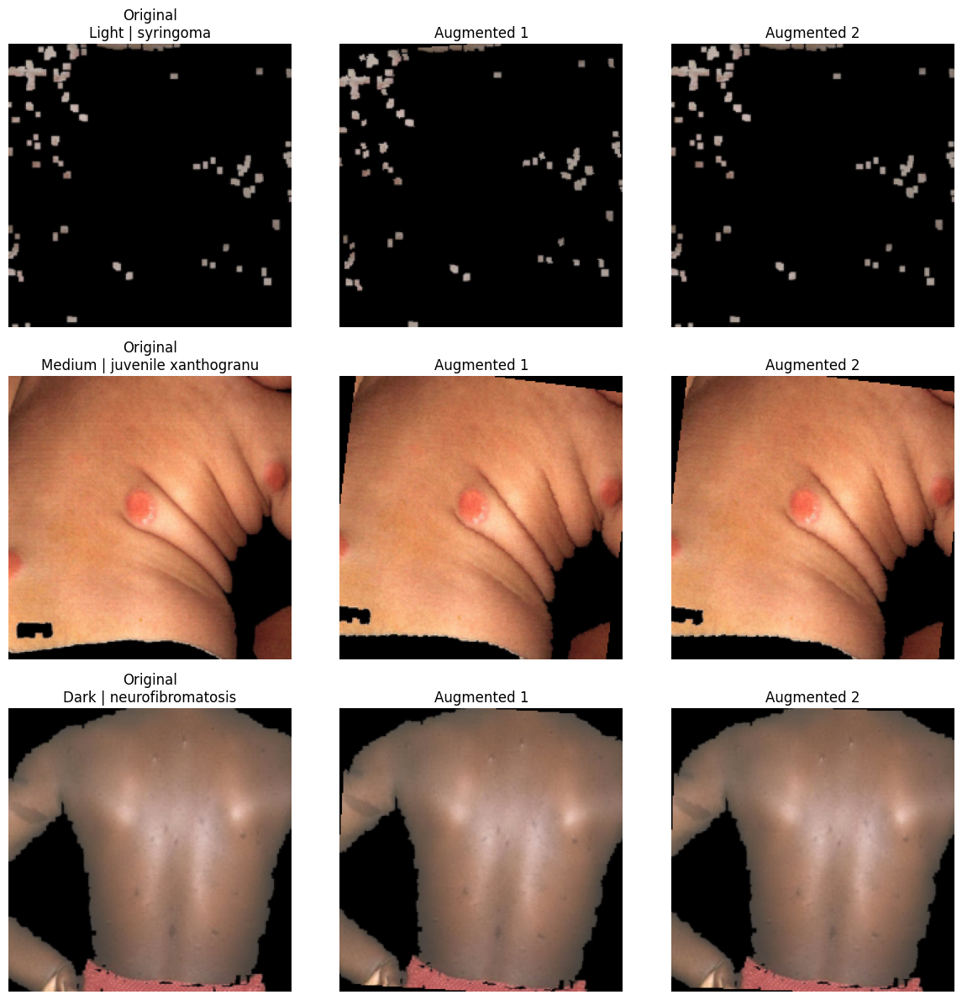

In [115]:
fig, axes = plt.subplots(
    len(representative_samples),
    3,
    figsize=(12, 4 * len(representative_samples))
)

if len(representative_samples) == 1:
    axes = np.expand_dims(axes, axis=0)

for row_idx, row in enumerate(
    representative_samples
):

    image = Image.open(
        row["image_path"]
    ).convert("RGB")

    resized_image = transforms.Resize(
        (IMAGE_SIZE, IMAGE_SIZE)
    )(image)

    augmented_1 = visual_augmentation(
        image
    )

    augmented_2 = visual_augmentation(
        image
    )

    # Original
    axes[row_idx, 0].imshow(
        resized_image
    )

    axes[row_idx, 0].set_title(
        f"Original\n"
        f"{row['skin_tone_group']} | "
        f"{row['label'][:20]}"
    )

    # Augmentation 1
    axes[row_idx, 1].imshow(
        augmented_1
    )

    axes[row_idx, 1].set_title(
        "Augmented 1"
    )

    # Augmentation 2
    axes[row_idx, 2].imshow(
        augmented_2
    )

    axes[row_idx, 2].set_title(
        "Augmented 2"
    )

    for col in range(3):
        axes[row_idx, col].axis("off")

plt.tight_layout()
plt.show()

Cell 4 — Check Multiple Random Augmentations

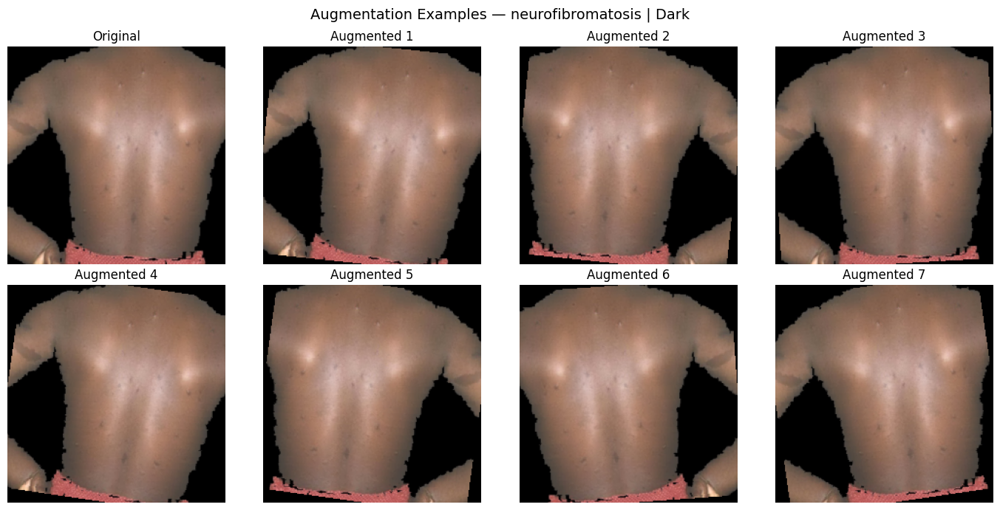

In [116]:
sample_row = train_df[
    train_df["skin_tone_group"] == "Dark"
].sample(
    n=1,
    random_state=42
).iloc[0]

original = Image.open(
    sample_row["image_path"]
).convert("RGB")

fig, axes = plt.subplots(
    2,
    4,
    figsize=(14, 7)
)

# Original
original_resized = transforms.Resize(
    (IMAGE_SIZE, IMAGE_SIZE)
)(original)

axes[0, 0].imshow(original_resized)
axes[0, 0].set_title("Original")
axes[0, 0].axis("off")

# Generate 7 augmented versions
for i in range(7):

    augmented = visual_augmentation(
        original
    )

    ax = axes.flatten()[i + 1]

    ax.imshow(augmented)
    ax.set_title(
        f"Augmented {i + 1}"
    )
    ax.axis("off")

plt.suptitle(
    f"Augmentation Examples — "
    f"{sample_row['label']} | "
    f"{sample_row['skin_tone_group']}",
    fontsize=14
)

plt.tight_layout()
plt.show()

Cell 5 — Save Visualization

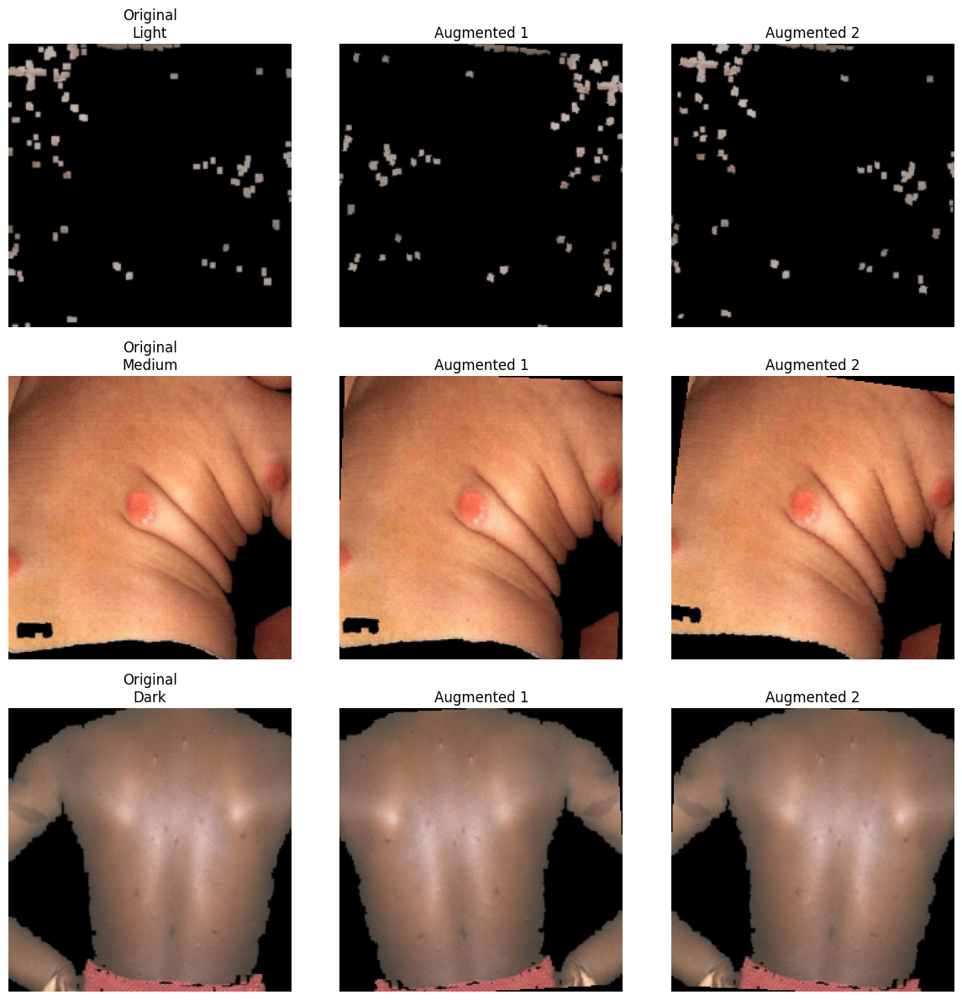

Figure saved to:
/content/skin-tone-fairness/outputs/figures/augmentation_visualization.png


In [117]:
FIGURE_DIR = (
    PROJECT_ROOT /
    "outputs" /
    "figures"
)

FIGURE_DIR.mkdir(
    parents=True,
    exist_ok=True
)

AUGMENTATION_FIGURE_PATH = (
    FIGURE_DIR /
    "augmentation_visualization.png"
)

fig, axes = plt.subplots(
    len(representative_samples),
    3,
    figsize=(12, 4 * len(representative_samples))
)

if len(representative_samples) == 1:
    axes = np.expand_dims(axes, axis=0)

for row_idx, row in enumerate(
    representative_samples
):

    image = Image.open(
        row["image_path"]
    ).convert("RGB")

    resized_image = transforms.Resize(
        (IMAGE_SIZE, IMAGE_SIZE)
    )(image)

    augmented_1 = visual_augmentation(image)
    augmented_2 = visual_augmentation(image)

    images = [
        resized_image,
        augmented_1,
        augmented_2
    ]

    titles = [
        f"Original\n{row['skin_tone_group']}",
        "Augmented 1",
        "Augmented 2"
    ]

    for col_idx in range(3):

        axes[row_idx, col_idx].imshow(
            images[col_idx]
        )

        axes[row_idx, col_idx].set_title(
            titles[col_idx]
        )

        axes[row_idx, col_idx].axis("off")

plt.tight_layout()

plt.savefig(
    AUGMENTATION_FIGURE_PATH,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print(
    "Figure saved to:"
)
print(AUGMENTATION_FIGURE_PATH)

Cell 6 — Phase 2.5 Final Check

In [118]:
print("=" * 60)
print("PHASE 2.5 — FINAL SUMMARY")
print("=" * 60)

print("Image size:",
      f"{IMAGE_SIZE} × {IMAGE_SIZE}")

print("Augmentation:")
print("- Horizontal flip: p=0.5")
print("- Rotation: ±10 degrees")

print("\nRepresentative skin-tone groups:")
print("- Light")
print("- Medium")
print("- Dark")

print("\nVisualization saved:")
print(AUGMENTATION_FIGURE_PATH)

print("=" * 60)
print("Phase 2.5 completed.")

PHASE 2.5 — FINAL SUMMARY
Image size: 224 × 224
Augmentation:
- Horizontal flip: p=0.5
- Rotation: ±10 degrees

Representative skin-tone groups:
- Light
- Medium
- Dark

Visualization saved:
/content/skin-tone-fairness/outputs/figures/augmentation_visualization.png
Phase 2.5 completed.


# **Phase 3 — Baseline EfficientNet-B0**

**Phase 3.1 — EfficientNet-B0 Baseline Model**

Cell 1 — Imports & Configuration

In [119]:
import torch
import torch.nn as nn
from torchvision.models import efficientnet_b0, EfficientNet_B0_Weights
from pathlib import Path
import json

print("=" * 60)
print("PHASE 3.1 — EFFICIENTNET-B0 BASELINE MODEL")
print("=" * 60)

# Device
device = torch.device(
    "cuda" if torch.cuda.is_available() else "cpu"
)

# Number of disease classes
NUM_CLASSES = 114

print("Device       :", device)
print("Number classes:", NUM_CLASSES)

if torch.cuda.is_available():
    print("GPU          :", torch.cuda.get_device_name(0))

print("=" * 60)

PHASE 3.1 — EFFICIENTNET-B0 BASELINE MODEL
Device       : cuda
Number classes: 114
GPU          : Tesla T4


Cell 2 — Load ImageNet-Pretrained EfficientNet-B0

In [120]:
weights = EfficientNet_B0_Weights.DEFAULT

model = efficientnet_b0(
    weights=weights
)

print("=" * 60)
print("PRETRAINED MODEL LOADED")
print("=" * 60)

print("Architecture : EfficientNet-B0")
print("Pretrained   : ImageNet")
print("Weights      :", weights)

print("=" * 60)

Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth


100%|██████████| 20.5M/20.5M [00:00<00:00, 104MB/s]

PRETRAINED MODEL LOADED
Architecture : EfficientNet-B0
Pretrained   : ImageNet
Weights      : EfficientNet_B0_Weights.IMAGENET1K_V1


Cell 3 — Inspect Original Classifier

In [121]:
print("=" * 60)
print("ORIGINAL CLASSIFIER")
print("=" * 60)

print(model.classifier)

print("\nOriginal output classes:",
      model.classifier[1].out_features)

print("=" * 60)

ORIGINAL CLASSIFIER
Sequential(
  (0): Dropout(p=0.2, inplace=True)
  (1): Linear(in_features=1280, out_features=1000, bias=True)
)

Original output classes: 1000


Cell 4 — Replace Classifier with 114-Class Head

In [122]:
in_features = model.classifier[1].in_features

model.classifier[1] = nn.Linear(
    in_features,
    NUM_CLASSES
)

print("=" * 60)
print("CLASSIFIER REPLACED")
print("=" * 60)

print("Input features :", in_features)
print("Output classes :", NUM_CLASSES)

print("\nNew classifier:")
print(model.classifier)

print("=" * 60)

CLASSIFIER REPLACED
Input features : 1280
Output classes : 114

New classifier:
Sequential(
  (0): Dropout(p=0.2, inplace=True)
  (1): Linear(in_features=1280, out_features=114, bias=True)
)


Cell 5 — Move Model to T4 GPU

In [123]:
model = model.to(device)

print("=" * 60)
print("MODEL DEVICE CHECK")
print("=" * 60)

print("Model device:",
      next(model.parameters()).device)

print("Expected device:",
      device)

print("=" * 60)

MODEL DEVICE CHECK
Model device: cuda:0
Expected device: cuda


Cell 6 — Count Parameters

In [124]:
total_parameters = sum(
    p.numel()
    for p in model.parameters()
)

trainable_parameters = sum(
    p.numel()
    for p in model.parameters()
    if p.requires_grad
)

print("=" * 60)
print("MODEL PARAMETER SUMMARY")
print("=" * 60)

print(
    "Total parameters     :",
    f"{total_parameters:,}"
)

print(
    "Trainable parameters :",
    f"{trainable_parameters:,}"
)

print("=" * 60)

MODEL PARAMETER SUMMARY
Total parameters     : 4,153,582
Trainable parameters : 4,153,582


Cell 7 — Dummy Forward Pass

In [125]:
model.eval()

dummy_input = torch.randn(
    2,
    3,
    224,
    224,
    device=device
)

with torch.no_grad():
    dummy_output = model(
        dummy_input
    )

print("=" * 60)
print("FORWARD PASS CHECK")
print("=" * 60)

print("Input shape :",
      dummy_input.shape)

print("Output shape:",
      dummy_output.shape)

print("Output dtype:",
      dummy_output.dtype)

print("=" * 60)

FORWARD PASS CHECK
Input shape : torch.Size([2, 3, 224, 224])
Output shape: torch.Size([2, 114])
Output dtype: torch.float32


Cell 8 — Verify Real Data Batch

In [126]:
real_batch = next(iter(train_loader))

images = real_batch["image"].to(
    device,
    non_blocking=True
)

labels = real_batch["class_id"].to(
    device,
    non_blocking=True
)

model.eval()

with torch.no_grad():
    outputs = model(images)

print("=" * 60)
print("REAL DATA FORWARD PASS")
print("=" * 60)

print("Input batch shape :",
      images.shape)

print("Label shape       :",
      labels.shape)

print("Model output shape:",
      outputs.shape)

print("Input device      :",
      images.device)

print("Output device     :",
      outputs.device)

print("=" * 60)

REAL DATA FORWARD PASS
Input batch shape : torch.Size([32, 3, 224, 224])
Label shape       : torch.Size([32])
Model output shape: torch.Size([32, 114])
Input device      : cuda:0
Output device     : cuda:0


Cell 9 — Check Output Values

In [127]:
print("=" * 60)
print("OUTPUT LOGIT CHECK")
print("=" * 60)

print("Minimum logit:",
      outputs.min().item())

print("Maximum logit:",
      outputs.max().item())

print("Mean logit:",
      outputs.mean().item())

print("NaN present:",
      torch.isnan(outputs).any().item())

print("Inf present:",
      torch.isinf(outputs).any().item())

print("=" * 60)

OUTPUT LOGIT CHECK
Minimum logit: -1.4816908836364746
Maximum logit: 1.0723507404327393
Mean logit: 0.018376773223280907
NaN present: False
Inf present: False


Cell 10 — Check Predicted Class Range

In [128]:
predicted_classes = outputs.argmax(
    dim=1
)

print("=" * 60)
print("PREDICTION RANGE CHECK")
print("=" * 60)

print("Number of predictions:",
      len(predicted_classes))

print("Minimum predicted class:",
      predicted_classes.min().item())

print("Maximum predicted class:",
      predicted_classes.max().item())

print(
    "All predictions within range:",
    bool(
        (
            (predicted_classes >= 0) &
            (predicted_classes < NUM_CLASSES)
        ).all()
    )
)

print("=" * 60)

PREDICTION RANGE CHECK
Number of predictions: 32
Minimum predicted class: 8
Maximum predicted class: 113
All predictions within range: True


Cell 11 — Save Model Configuration

In [129]:
CONFIG_PATH = (
    PROJECT_ROOT /
    "configs" /
    "baseline_model_config.json"
)

model_config = {
    "model_name": "EfficientNet-B0",
    "pretrained": True,
    "pretrained_dataset": "ImageNet",
    "num_classes": NUM_CLASSES,
    "input_size": [3, 224, 224],
    "classifier": "Linear",
    "device": str(device)
}

with open(
    CONFIG_PATH,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        model_config,
        f,
        indent=2
    )

print("=" * 60)
print("MODEL CONFIGURATION SAVED")
print("=" * 60)

print(CONFIG_PATH)

print("=" * 60)

MODEL CONFIGURATION SAVED
/content/skin-tone-fairness/configs/baseline_model_config.json


Cell 12 — Phase 3.1 Final Verification

In [130]:
print("=" * 60)
print("PHASE 3.1 — FINAL SUMMARY")
print("=" * 60)

print("Model              : EfficientNet-B0")
print("Pretrained         : ImageNet")
print("Input size         : 224 × 224")
print("Output classes     :", NUM_CLASSES)

print(
    "Total parameters   :",
    f"{total_parameters:,}"
)

print(
    "Trainable params   :",
    f"{trainable_parameters:,}"
)

print("\nReal batch input   :",
      tuple(images.shape))

print("Model output       :",
      tuple(outputs.shape))

print("NaN present        :",
      torch.isnan(outputs).any().item())

print("Inf present        :",
      torch.isinf(outputs).any().item())

print(
    "Output shape valid :",
    outputs.shape == (
        images.shape[0],
        NUM_CLASSES
    )
)

print("\nConfiguration saved:")
print(CONFIG_PATH)

print("=" * 60)
print("Phase 3.1 completed.")

PHASE 3.1 — FINAL SUMMARY
Model              : EfficientNet-B0
Pretrained         : ImageNet
Input size         : 224 × 224
Output classes     : 114
Total parameters   : 4,153,582
Trainable params   : 4,153,582

Real batch input   : (32, 3, 224, 224)
Model output       : (32, 114)
NaN present        : False
Inf present        : False
Output shape valid : True

Configuration saved:
/content/skin-tone-fairness/configs/baseline_model_config.json
Phase 3.1 completed.


**Phase 3.2 — Loss, Optimizer & Scheduler**

Cell 1 — Training Configuration

In [131]:
import torch
import torch.nn as nn
import torch.optim as optim
import json

print("=" * 60)
print("PHASE 3.2 — TRAINING CONFIGURATION")
print("=" * 60)

# --------------------------------------------------
# Training hyperparameters
# --------------------------------------------------

NUM_EPOCHS = 10

LEARNING_RATE = 1e-4

WEIGHT_DECAY = 1e-4

LR_FACTOR = 0.1

LR_PATIENCE = 2

MIN_LR = 1e-7

print("Number of epochs :", NUM_EPOCHS)
print("Learning rate    :", LEARNING_RATE)
print("Weight decay     :", WEIGHT_DECAY)
print("LR factor        :", LR_FACTOR)
print("LR patience      :", LR_PATIENCE)
print("Minimum LR       :", MIN_LR)

print("=" * 60)

PHASE 3.2 — TRAINING CONFIGURATION
Number of epochs : 10
Learning rate    : 0.0001
Weight decay     : 0.0001
LR factor        : 0.1
LR patience      : 2
Minimum LR       : 1e-07


Cell 2 — Cross-Entropy Loss

In [132]:
criterion = nn.CrossEntropyLoss()

print("=" * 60)
print("LOSS FUNCTION")
print("=" * 60)

print("Loss function:", criterion)

print("=" * 60)

LOSS FUNCTION
Loss function: CrossEntropyLoss()


Cell 3 — AdamW Optimizer

In [133]:
optimizer = optim.AdamW(
    model.parameters(),
    lr=LEARNING_RATE,
    weight_decay=WEIGHT_DECAY
)

print("=" * 60)
print("OPTIMIZER")
print("=" * 60)

print("Optimizer:", optimizer)

print("\nInitial learning rate:",
      optimizer.param_groups[0]["lr"])

print("\nWeight decay:",
      optimizer.param_groups[0]["weight_decay"])

print("=" * 60)

OPTIMIZER
Optimizer: AdamW (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    decoupled_weight_decay: True
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0.0001
)

Initial learning rate: 0.0001

Weight decay: 0.0001


Cell 4 — ReduceLROnPlateau Scheduler

In [134]:
scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode="min",
    factor=LR_FACTOR,
    patience=LR_PATIENCE,
    min_lr=MIN_LR
)

print("=" * 60)
print("LEARNING RATE SCHEDULER")
print("=" * 60)

print("Scheduler:", scheduler)

print("Mode      : min")
print("Factor    :", LR_FACTOR)
print("Patience  :", LR_PATIENCE)
print("Minimum LR:", MIN_LR)

print("=" * 60)

LEARNING RATE SCHEDULER
Scheduler: <torch.optim.lr_scheduler.ReduceLROnPlateau object at 0x78ad91d8f8c0>
Mode      : min
Factor    : 0.1
Patience  : 2
Minimum LR: 1e-07


Cell 5 — Verify Optimizer Parameter Count

In [135]:
model_parameter_count = sum(
    p.numel()
    for p in model.parameters()
    if p.requires_grad
)

optimizer_parameter_count = sum(
    p.numel()
    for group in optimizer.param_groups
    for p in group["params"]
    if p.requires_grad
)

print("=" * 60)
print("OPTIMIZER PARAMETER CHECK")
print("=" * 60)

print(
    "Model trainable parameters    :",
    f"{model_parameter_count:,}"
)

print(
    "Optimizer parameters          :",
    f"{optimizer_parameter_count:,}"
)

print(
    "Parameter count matches:",
    model_parameter_count == optimizer_parameter_count
)

print("=" * 60)

OPTIMIZER PARAMETER CHECK
Model trainable parameters    : 4,153,582
Optimizer parameters          : 4,153,582
Parameter count matches: True


Cell 6 — Test Loss Calculation

In [136]:
model.train()

batch = next(iter(train_loader))

images = batch["image"].to(
    device,
    non_blocking=True
)

labels = batch["class_id"].to(
    device,
    non_blocking=True
)

outputs = model(images)

loss = criterion(
    outputs,
    labels
)

print("=" * 60)
print("LOSS CALCULATION CHECK")
print("=" * 60)

print("Images shape :", images.shape)
print("Labels shape :", labels.shape)
print("Output shape :", outputs.shape)

print("\nLoss:",
      loss.item())

print("Loss dtype:",
      loss.dtype)

print(
    "Loss is finite:",
    torch.isfinite(loss).item()
)

print("=" * 60)

LOSS CALCULATION CHECK
Images shape : torch.Size([32, 3, 224, 224])
Labels shape : torch.Size([32])
Output shape : torch.Size([32, 114])

Loss: 4.689059257507324
Loss dtype: torch.float32
Loss is finite: True


Cell 7 — Verify Learning Rate

In [137]:
current_lr = optimizer.param_groups[0]["lr"]

print("=" * 60)
print("LEARNING RATE CHECK")
print("=" * 60)

print("Current learning rate:",
      current_lr)

print(
    "Expected learning rate:",
    LEARNING_RATE
)

print(
    "Learning rate correct:",
    current_lr == LEARNING_RATE
)

print("=" * 60)

LEARNING RATE CHECK
Current learning rate: 0.0001
Expected learning rate: 0.0001
Learning rate correct: True


Cell 8 — Save Training Configuration

In [138]:
TRAIN_CONFIG_PATH = (
    PROJECT_ROOT /
    "configs" /
    "baseline_training_config.json"
)

training_config = {
    "model": "EfficientNet-B0",
    "pretrained": True,
    "num_classes": NUM_CLASSES,

    "loss": {
        "name": "CrossEntropyLoss",
        "class_weighting": False,
        "label_smoothing": 0.0
    },

    "optimizer": {
        "name": "AdamW",
        "learning_rate": LEARNING_RATE,
        "weight_decay": WEIGHT_DECAY
    },

    "scheduler": {
        "name": "ReduceLROnPlateau",
        "mode": "min",
        "factor": LR_FACTOR,
        "patience": LR_PATIENCE,
        "min_lr": MIN_LR,
        "monitor": "validation_loss"
    },

    "training": {
        "epochs": NUM_EPOCHS,
        "batch_size": BATCH_SIZE
    }
}

with open(
    TRAIN_CONFIG_PATH,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        training_config,
        f,
        indent=2
    )

print("=" * 60)
print("TRAINING CONFIGURATION SAVED")
print("=" * 60)

print(TRAIN_CONFIG_PATH)

print("=" * 60)

TRAINING CONFIGURATION SAVED
/content/skin-tone-fairness/configs/baseline_training_config.json


Cell 9 — Final Verification

In [139]:
print("=" * 60)
print("PHASE 3.2 — FINAL SUMMARY")
print("=" * 60)

print("Model              : EfficientNet-B0")

print("\nLoss:")
print("  CrossEntropyLoss")
print("  Class weighting   : False")

print("\nOptimizer:")
print("  AdamW")
print("  Learning rate     :", LEARNING_RATE)
print("  Weight decay      :", WEIGHT_DECAY)

print("\nScheduler:")
print("  ReduceLROnPlateau")
print("  Mode              : min")
print("  Factor            :", LR_FACTOR)
print("  Patience          :", LR_PATIENCE)
print("  Minimum LR        :", MIN_LR)

print("\nTraining:")
print("  Epochs            :", NUM_EPOCHS)
print("  Batch size        :", BATCH_SIZE)

print("\nTrainable parameters:",
      f"{model_parameter_count:,}")

print(
    "\nLoss calculation valid:",
    torch.isfinite(loss).item()
)

print(
    "Optimizer parameter match:",
    model_parameter_count == optimizer_parameter_count
)

print("\nConfiguration saved:")
print(TRAIN_CONFIG_PATH)

print("=" * 60)
print("Phase 3.2 completed.")

PHASE 3.2 — FINAL SUMMARY
Model              : EfficientNet-B0

Loss:
  CrossEntropyLoss
  Class weighting   : False

Optimizer:
  AdamW
  Learning rate     : 0.0001
  Weight decay      : 0.0001

Scheduler:
  ReduceLROnPlateau
  Mode              : min
  Factor            : 0.1
  Patience          : 2
  Minimum LR        : 1e-07

Training:
  Epochs            : 10
  Batch size        : 32

Trainable parameters: 4,153,582

Loss calculation valid: True
Optimizer parameter match: True

Configuration saved:
/content/skin-tone-fairness/configs/baseline_training_config.json
Phase 3.2 completed.


**Phase 3.3 — Training Loop**

Cell 1 — Training Utility Configuration

In [140]:
GRADIENT_CLIP_VALUE = 1.0

print("=" * 60)
print("PHASE 3.3 — TRAINING LOOP")
print("=" * 60)

print("Gradient clipping:", GRADIENT_CLIP_VALUE)
print("Device            :", device)
print("Batch size        :", BATCH_SIZE)
print("Loss function     :", criterion.__class__.__name__)
print("Optimizer         :", optimizer.__class__.__name__)

print("=" * 60)

PHASE 3.3 — TRAINING LOOP
Gradient clipping: 1.0
Device            : cuda
Batch size        : 32
Loss function     : CrossEntropyLoss
Optimizer         : AdamW


Cell 2 — Define Training Function

In [141]:
def train_one_epoch(
    model,
    dataloader,
    criterion,
    optimizer,
    device,
    gradient_clip_value=None
):
    """
    Train the model for one complete epoch.

    Returns:
        epoch_loss
        epoch_accuracy
    """

    model.train()

    running_loss = 0.0
    correct_predictions = 0
    total_samples = 0

    for batch_idx, batch in enumerate(dataloader):

        # --------------------------------------------------
        # Move images and labels to device
        # --------------------------------------------------

        images = batch["image"].to(
            device,
            non_blocking=True
        )

        labels = batch["class_id"].to(
            device,
            non_blocking=True
        )

        # --------------------------------------------------
        # Clear previous gradients
        # --------------------------------------------------

        optimizer.zero_grad(
            set_to_none=True
        )

        # --------------------------------------------------
        # Forward pass
        # --------------------------------------------------

        outputs = model(images)

        # --------------------------------------------------
        # Calculate loss
        # --------------------------------------------------

        loss = criterion(
            outputs,
            labels
        )

        # --------------------------------------------------
        # Backward pass
        # --------------------------------------------------

        loss.backward()

        # --------------------------------------------------
        # Gradient clipping
        # --------------------------------------------------

        if gradient_clip_value is not None:

            torch.nn.utils.clip_grad_norm_(
                model.parameters(),
                gradient_clip_value
            )

        # --------------------------------------------------
        # Update model parameters
        # --------------------------------------------------

        optimizer.step()

        # --------------------------------------------------
        # Statistics
        # --------------------------------------------------

        batch_size = images.size(0)

        running_loss += (
            loss.item() * batch_size
        )

        predictions = outputs.argmax(
            dim=1
        )

        correct_predictions += (
            (predictions == labels)
            .sum()
            .item()
        )

        total_samples += batch_size

    # ------------------------------------------------------
    # Epoch-level metrics
    # ------------------------------------------------------

    epoch_loss = (
        running_loss /
        total_samples
    )

    epoch_accuracy = (
        correct_predictions /
        total_samples
    )

    return epoch_loss, epoch_accuracy


print("train_one_epoch() created successfully.")

train_one_epoch() created successfully.


Cell 3 — Verify Function Exists

In [142]:
print("=" * 60)
print("TRAINING FUNCTION CHECK")
print("=" * 60)

print(
    "Function name:",
    train_one_epoch.__name__
)

print(
    "Callable:",
    callable(train_one_epoch)
)

print(
    "Training batches available:",
    len(train_loader)
)

print("=" * 60)

TRAINING FUNCTION CHECK
Function name: train_one_epoch
Callable: True
Training batches available: 363


Cell 4 — Check Gradient Flow Without Updating Weights

In [143]:
model.train()

gradient_check_batch = next(
    iter(train_loader)
)

images = gradient_check_batch["image"].to(
    device,
    non_blocking=True
)

labels = gradient_check_batch["class_id"].to(
    device,
    non_blocking=True
)

# Clear old gradients
optimizer.zero_grad(
    set_to_none=True
)

# Forward
outputs = model(images)

# Loss
loss = criterion(
    outputs,
    labels
)

# Backward
loss.backward()

# --------------------------------------------------
# Check gradients
# --------------------------------------------------

parameters_with_gradients = 0
parameters_without_gradients = 0
gradient_nan_count = 0

for parameter in model.parameters():

    if parameter.requires_grad:

        if parameter.grad is not None:

            parameters_with_gradients += 1

            if torch.isnan(
                parameter.grad
            ).any():

                gradient_nan_count += 1

        else:
            parameters_without_gradients += 1

# Clear gradients after verification
optimizer.zero_grad(
    set_to_none=True
)

print("=" * 60)
print("GRADIENT FLOW CHECK")
print("=" * 60)

print("Input shape:",
      images.shape)

print("Output shape:",
      outputs.shape)

print("Loss:",
      loss.item())

print(
    "Parameters with gradients:",
    parameters_with_gradients
)

print(
    "Parameters without gradients:",
    parameters_without_gradients
)

print(
    "Parameters with NaN gradients:",
    gradient_nan_count
)

print(
    "Loss finite:",
    torch.isfinite(loss).item()
)

print("=" * 60)

GRADIENT FLOW CHECK
Input shape: torch.Size([32, 3, 224, 224])
Output shape: torch.Size([32, 114])
Loss: 4.697890758514404
Parameters with gradients: 213
Parameters without gradients: 0
Parameters with NaN gradients: 0
Loss finite: True


Cell 5 — Check Gradient Magnitudes

In [144]:
model.train()

batch = next(
    iter(train_loader)
)

images = batch["image"].to(
    device,
    non_blocking=True
)

labels = batch["class_id"].to(
    device,
    non_blocking=True
)

optimizer.zero_grad(
    set_to_none=True
)

outputs = model(images)

loss = criterion(
    outputs,
    labels
)

loss.backward()

gradient_norms = []

for parameter in model.parameters():

    if (
        parameter.requires_grad
        and parameter.grad is not None
    ):

        gradient_norms.append(
            parameter.grad.detach().norm().item()
        )

if gradient_norms:

    mean_gradient_norm = sum(
        gradient_norms
    ) / len(gradient_norms)

    max_gradient_norm = max(
        gradient_norms
    )

else:

    mean_gradient_norm = 0.0
    max_gradient_norm = 0.0

# Clear gradients
optimizer.zero_grad(
    set_to_none=True
)

print("=" * 60)
print("GRADIENT MAGNITUDE CHECK")
print("=" * 60)

print(
    "Gradient tensors:",
    len(gradient_norms)
)

print(
    "Mean gradient norm:",
    mean_gradient_norm
)

print(
    "Maximum gradient norm:",
    max_gradient_norm
)

print("=" * 60)

GRADIENT MAGNITUDE CHECK
Gradient tensors: 213
Mean gradient norm: 0.10871658568724446
Maximum gradient norm: 2.634890079498291


Cell 6 — Define Training History Structure

In [145]:
training_history = {
    "epoch": [],
    "train_loss": [],
    "train_accuracy": [],
    "learning_rate": []
}

print("=" * 60)
print("TRAINING HISTORY INITIALIZED")
print("=" * 60)

print("History fields:")

for key in training_history:
    print("-", key)

print("=" * 60)

TRAINING HISTORY INITIALIZED
History fields:
- epoch
- train_loss
- train_accuracy
- learning_rate


Cell 7 — Define Epoch Training Wrapper

In [146]:
def run_training_epoch(
    model,
    train_loader,
    criterion,
    optimizer,
    device,
    epoch,
    history,
    gradient_clip_value=1.0
):
    """
    Run one training epoch and update history.
    """

    train_loss, train_accuracy = train_one_epoch(
        model=model,
        dataloader=train_loader,
        criterion=criterion,
        optimizer=optimizer,
        device=device,
        gradient_clip_value=gradient_clip_value
    )

    current_lr = optimizer.param_groups[0]["lr"]

    history["epoch"].append(
        epoch
    )

    history["train_loss"].append(
        train_loss
    )

    history["train_accuracy"].append(
        train_accuracy
    )

    history["learning_rate"].append(
        current_lr
    )

    return (
        train_loss,
        train_accuracy,
        current_lr
    )


print(
    "run_training_epoch() created successfully."
)

run_training_epoch() created successfully.


Cell 8 — Verify Training Loop Structure

In [147]:
required_objects = {
    "model": model,
    "train_loader": train_loader,
    "criterion": criterion,
    "optimizer": optimizer,
    "train_one_epoch": train_one_epoch,
    "run_training_epoch": run_training_epoch
}

print("=" * 60)
print("TRAINING LOOP COMPONENT CHECK")
print("=" * 60)

all_available = True

for name, obj in required_objects.items():

    available = obj is not None

    print(
        f"{name:25s}:",
        available
    )

    if not available:
        all_available = False

print(
    "\nAll components available:",
    all_available
)

print("=" * 60)

TRAINING LOOP COMPONENT CHECK
model                    : True
train_loader             : True
criterion                : True
optimizer                : True
train_one_epoch          : True
run_training_epoch       : True

All components available: True


Cell 9 — Save Training Loop Configuration

In [148]:
import json

LOOP_CONFIG_PATH = (
    PROJECT_ROOT /
    "configs" /
    "training_loop_config.json"
)

loop_config = {
    "training_function": "train_one_epoch",
    "optimizer_step": True,
    "gradient_clipping": True,
    "gradient_clip_value": GRADIENT_CLIP_VALUE,
    "track_metrics": [
        "train_loss",
        "train_accuracy",
        "learning_rate"
    ],
    "device": str(device)
}

with open(
    LOOP_CONFIG_PATH,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        loop_config,
        f,
        indent=2
    )

print("=" * 60)
print("TRAINING LOOP CONFIGURATION SAVED")
print("=" * 60)

print(LOOP_CONFIG_PATH)

print("=" * 60)

TRAINING LOOP CONFIGURATION SAVED
/content/skin-tone-fairness/configs/training_loop_config.json


Cell 10 — Phase 3.3 Final Check

In [149]:
print("=" * 60)
print("PHASE 3.3 — FINAL SUMMARY")
print("=" * 60)

print("Model              : EfficientNet-B0")
print("Training batches   :", len(train_loader))
print("Batch size         :", BATCH_SIZE)

print("\nTraining operations:")
print("  Forward pass     : Enabled")
print("  Loss calculation  : Enabled")
print("  Backward pass     : Enabled")
print("  Optimizer step    : Enabled")
print("  Gradient clipping  : Enabled")

print("\nGradient check:")
print(
    "  Parameters with gradients:",
    parameters_with_gradients
)

print(
    "  NaN gradients:",
    gradient_nan_count
)

print(
    "  Loss finite:",
    torch.isfinite(loss).item()
)

print("\nHistory fields:")
for key in training_history:
    print(" ", key)

print("\nConfiguration saved:")
print(LOOP_CONFIG_PATH)

print("=" * 60)
print("Phase 3.3 completed.")

PHASE 3.3 — FINAL SUMMARY
Model              : EfficientNet-B0
Training batches   : 363
Batch size         : 32

Training operations:
  Forward pass     : Enabled
  Loss calculation  : Enabled
  Backward pass     : Enabled
  Optimizer step    : Enabled
  Gradient clipping  : Enabled

Gradient check:
  Parameters with gradients: 213
  NaN gradients: 0
  Loss finite: True

History fields:
  epoch
  train_loss
  train_accuracy
  learning_rate

Configuration saved:
/content/skin-tone-fairness/configs/training_loop_config.json
Phase 3.3 completed.


**Phase 3.4 — Validation Loop + Checkpointing**

Cell 1 — Validation Configuration

In [150]:
import os
import json
from pathlib import Path

CHECKPOINT_DIR = (
    PROJECT_ROOT /
    "outputs" /
    "checkpoints"
)

CHECKPOINT_DIR.mkdir(
    parents=True,
    exist_ok=True
)

BEST_CHECKPOINT_PATH = (
    CHECKPOINT_DIR /
    "baseline_best.pt"
)

LAST_CHECKPOINT_PATH = (
    CHECKPOINT_DIR /
    "baseline_last.pt"
)

BEST_VAL_LOSS = float("inf")

print("=" * 60)
print("PHASE 3.4 — VALIDATION & CHECKPOINTING")
print("=" * 60)

print("Checkpoint directory:")
print(CHECKPOINT_DIR)

print("\nBest checkpoint:")
print(BEST_CHECKPOINT_PATH)

print("\nLast checkpoint:")
print(LAST_CHECKPOINT_PATH)

print("\nInitial best validation loss:",
      BEST_VAL_LOSS)

print("=" * 60)

PHASE 3.4 — VALIDATION & CHECKPOINTING
Checkpoint directory:
/content/skin-tone-fairness/outputs/checkpoints

Best checkpoint:
/content/skin-tone-fairness/outputs/checkpoints/baseline_best.pt

Last checkpoint:
/content/skin-tone-fairness/outputs/checkpoints/baseline_last.pt

Initial best validation loss: inf


Cell 2 — Define Validation Function

In [151]:
def validate_one_epoch(
    model,
    dataloader,
    criterion,
    device
):
    """
    Evaluate the model for one complete validation epoch.

    Returns:
        epoch_loss
        epoch_accuracy
    """

    model.eval()

    running_loss = 0.0
    correct_predictions = 0
    total_samples = 0

    with torch.no_grad():

        for batch in dataloader:

            # --------------------------------------------------
            # Move data to device
            # --------------------------------------------------

            images = batch["image"].to(
                device,
                non_blocking=True
            )

            labels = batch["class_id"].to(
                device,
                non_blocking=True
            )

            # --------------------------------------------------
            # Forward pass
            # --------------------------------------------------

            outputs = model(images)

            # --------------------------------------------------
            # Loss
            # --------------------------------------------------

            loss = criterion(
                outputs,
                labels
            )

            # --------------------------------------------------
            # Statistics
            # --------------------------------------------------

            batch_size = images.size(0)

            running_loss += (
                loss.item() * batch_size
            )

            predictions = outputs.argmax(
                dim=1
            )

            correct_predictions += (
                (predictions == labels)
                .sum()
                .item()
            )

            total_samples += batch_size

    epoch_loss = (
        running_loss /
        total_samples
    )

    epoch_accuracy = (
        correct_predictions /
        total_samples
    )

    return epoch_loss, epoch_accuracy


print(
    "validate_one_epoch() created successfully."
)

validate_one_epoch() created successfully.


Cell 3 — Verify Validation Function

In [152]:
print("=" * 60)
print("VALIDATION FUNCTION CHECK")
print("=" * 60)

print(
    "Function name:",
    validate_one_epoch.__name__
)

print(
    "Callable:",
    callable(validate_one_epoch)
)

print(
    "Validation batches:",
    len(val_loader)
)

print("=" * 60)

VALIDATION FUNCTION CHECK
Function name: validate_one_epoch
Callable: True
Validation batches: 79


Cell 4 — Test Validation Loop

In [153]:
validation_test_loss, validation_test_accuracy = (
    validate_one_epoch(
        model=model,
        dataloader=val_loader,
        criterion=criterion,
        device=device
    )
)

print("=" * 60)
print("VALIDATION LOOP TEST")
print("=" * 60)

print(
    "Validation loss:",
    validation_test_loss
)

print(
    "Validation accuracy:",
    validation_test_accuracy
)

print(
    "Validation accuracy (%):",
    validation_test_accuracy * 100
)

print(
    "Loss finite:",
    torch.isfinite(
        torch.tensor(validation_test_loss)
    ).item()
)

print(
    "Accuracy finite:",
    torch.isfinite(
        torch.tensor(validation_test_accuracy)
    ).item()
)

print("=" * 60)

VALIDATION LOOP TEST
Validation loss: 4.763798295668858
Validation accuracy: 0.010744130521289296
Validation accuracy (%): 1.0744130521289297
Loss finite: True
Accuracy finite: True


Cell 5 — Define Checkpoint Saving Function

In [154]:
def save_checkpoint(
    path,
    model,
    optimizer,
    scheduler,
    epoch,
    train_loss,
    train_accuracy,
    val_loss,
    val_accuracy,
    best_val_loss
):
    """
    Save complete training state.
    """

    checkpoint = {
        "epoch": epoch,

        "model_state_dict":
            model.state_dict(),

        "optimizer_state_dict":
            optimizer.state_dict(),

        "scheduler_state_dict":
            scheduler.state_dict(),

        "train_loss":
            train_loss,

        "train_accuracy":
            train_accuracy,

        "val_loss":
            val_loss,

        "val_accuracy":
            val_accuracy,

        "best_val_loss":
            best_val_loss,

        "model_name":
            "EfficientNet-B0",

        "num_classes":
            NUM_CLASSES,

        "image_size":
            IMAGE_SIZE
    }

    torch.save(
        checkpoint,
        path
    )

    return path


print(
    "save_checkpoint() created successfully."
)

save_checkpoint() created successfully.


Cell 6 — Define Epoch-Level Train + Validation Function

In [155]:
def run_full_epoch(
    model,
    train_loader,
    val_loader,
    criterion,
    optimizer,
    scheduler,
    device,
    epoch,
    history,
    best_val_loss,
    gradient_clip_value=1.0
):
    """
    Run one complete training + validation epoch.

    Returns:
        train_loss
        train_accuracy
        val_loss
        val_accuracy
        current_lr
        best_val_loss
        is_best
    """

    # --------------------------------------------------
    # Training
    # --------------------------------------------------

    train_loss, train_accuracy = train_one_epoch(
        model=model,
        dataloader=train_loader,
        criterion=criterion,
        optimizer=optimizer,
        device=device,
        gradient_clip_value=gradient_clip_value
    )

    # --------------------------------------------------
    # Validation
    # --------------------------------------------------

    val_loss, val_accuracy = validate_one_epoch(
        model=model,
        dataloader=val_loader,
        criterion=criterion,
        device=device
    )

    # --------------------------------------------------
    # Scheduler update
    # --------------------------------------------------

    scheduler.step(val_loss)

    current_lr = optimizer.param_groups[0]["lr"]

    # --------------------------------------------------
    # Best model check
    # --------------------------------------------------

    is_best = val_loss < best_val_loss

    if is_best:
        best_val_loss = val_loss

    # --------------------------------------------------
    # Update history
    # --------------------------------------------------

    history["epoch"].append(epoch)

    history["train_loss"].append(
        train_loss
    )

    history["train_accuracy"].append(
        train_accuracy
    )

    # Add validation fields if they don't exist
    if "val_loss" not in history:
        history["val_loss"] = []

    if "val_accuracy" not in history:
        history["val_accuracy"] = []

    history["val_loss"].append(
        val_loss
    )

    history["val_accuracy"].append(
        val_accuracy
    )

    # Update learning rate
    if "learning_rate" not in history:
        history["learning_rate"] = []

    history["learning_rate"].append(
        current_lr
    )

    return (
        train_loss,
        train_accuracy,
        val_loss,
        val_accuracy,
        current_lr,
        best_val_loss,
        is_best
    )


print(
    "run_full_epoch() created successfully."
)

run_full_epoch() created successfully.


Cell 7 — Checkpoint State Structure

In [156]:
checkpoint_objects = {
    "model": model,
    "optimizer": optimizer,
    "scheduler": scheduler,
    "criterion": criterion,
    "train_loader": train_loader,
    "val_loader": val_loader
}

print("=" * 60)
print("CHECKPOINT COMPONENT CHECK")
print("=" * 60)

all_available = True

for name, obj in checkpoint_objects.items():

    available = obj is not None

    print(
        f"{name:20s}:",
        available
    )

    if not available:
        all_available = False

print(
    "\nAll components available:",
    all_available
)

print("=" * 60)

CHECKPOINT COMPONENT CHECK
model               : True
optimizer           : True
scheduler           : True
criterion           : True
train_loader        : True
val_loader          : True

All components available: True


Cell 8 — Verify Checkpoint Save/Load

In [157]:
TEMP_CHECKPOINT_PATH = (
    CHECKPOINT_DIR /
    "checkpoint_test.pt"
)

test_checkpoint_epoch = 0

save_checkpoint(
    path=TEMP_CHECKPOINT_PATH,
    model=model,
    optimizer=optimizer,
    scheduler=scheduler,
    epoch=test_checkpoint_epoch,
    train_loss=0.0,
    train_accuracy=0.0,
    val_loss=validation_test_loss,
    val_accuracy=validation_test_accuracy,
    best_val_loss=validation_test_loss
)

print("=" * 60)
print("CHECKPOINT SAVE TEST")
print("=" * 60)

print(
    "Checkpoint exists:",
    TEMP_CHECKPOINT_PATH.exists()
)

print(
    "Checkpoint size:",
    f"{TEMP_CHECKPOINT_PATH.stat().st_size / (1024**2):.2f} MB"
)

# Load checkpoint
loaded_checkpoint = torch.load(
    TEMP_CHECKPOINT_PATH,
    map_location=device
)

print(
    "Checkpoint loaded:",
    isinstance(loaded_checkpoint, dict)
)

print(
    "Stored epoch:",
    loaded_checkpoint["epoch"]
)

print(
    "Stored validation loss:",
    loaded_checkpoint["val_loss"]
)

print("=" * 60)

CHECKPOINT SAVE TEST
Checkpoint exists: True
Checkpoint size: 16.13 MB
Checkpoint loaded: True
Stored epoch: 0
Stored validation loss: 4.763798295668858


Cell 9 — Remove Temporary Checkpoint

In [158]:
if TEMP_CHECKPOINT_PATH.exists():

    TEMP_CHECKPOINT_PATH.unlink()

print("=" * 60)
print("TEMPORARY CHECKPOINT CLEANUP")
print("=" * 60)

print(
    "Temporary checkpoint exists:",
    TEMP_CHECKPOINT_PATH.exists()
)

print("=" * 60)

TEMPORARY CHECKPOINT CLEANUP
Temporary checkpoint exists: False


Cell 10 — Define Training History Structure

In [159]:
training_history = {
    "epoch": [],
    "train_loss": [],
    "train_accuracy": [],
    "val_loss": [],
    "val_accuracy": [],
    "learning_rate": []
}

print("=" * 60)
print("COMPLETE TRAINING HISTORY")
print("=" * 60)

for key in training_history:
    print("-", key)

print("=" * 60)

COMPLETE TRAINING HISTORY
- epoch
- train_loss
- train_accuracy
- val_loss
- val_accuracy
- learning_rate


Cell 11 — Save Checkpoint Configuration

In [160]:
CHECKPOINT_CONFIG_PATH = (
    PROJECT_ROOT /
    "configs" /
    "checkpoint_config.json"
)

checkpoint_config = {
    "monitor": "validation_loss",
    "mode": "min",
    "best_checkpoint": str(
        BEST_CHECKPOINT_PATH
    ),
    "last_checkpoint": str(
        LAST_CHECKPOINT_PATH
    ),
    "save_optimizer_state": True,
    "save_scheduler_state": True,
    "save_training_metrics": True
}

with open(
    CHECKPOINT_CONFIG_PATH,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        checkpoint_config,
        f,
        indent=2
    )

print("=" * 60)
print("CHECKPOINT CONFIGURATION SAVED")
print("=" * 60)

print(CHECKPOINT_CONFIG_PATH)

print("=" * 60)

CHECKPOINT CONFIGURATION SAVED
/content/skin-tone-fairness/configs/checkpoint_config.json


Cell 12 — Phase 3.4 Final Check

In [161]:
print("=" * 60)
print("PHASE 3.4 — FINAL SUMMARY")
print("=" * 60)

print("Validation batches:",
      len(val_loader))

print("\nValidation test:")
print(
    "Loss:",
    validation_test_loss
)

print(
    "Accuracy:",
    validation_test_accuracy
)

print(
    "Accuracy (%):",
    validation_test_accuracy * 100
)

print("\nCheckpointing:")
print(
    "Best checkpoint:",
    BEST_CHECKPOINT_PATH
)

print(
    "Last checkpoint:",
    LAST_CHECKPOINT_PATH
)

print(
    "Monitor:",
    "validation_loss"
)

print(
    "Mode:",
    "min"
)

print("\nHistory fields:")
for key in training_history:
    print(" ", key)

print("\nCheckpoint test:")
print(
    "Save/load successful:",
    not TEMP_CHECKPOINT_PATH.exists()
)

print("\nConfiguration saved:")
print(CHECKPOINT_CONFIG_PATH)

print("=" * 60)
print("Phase 3.4 completed.")

PHASE 3.4 — FINAL SUMMARY
Validation batches: 79

Validation test:
Loss: 4.763798295668858
Accuracy: 0.010744130521289296
Accuracy (%): 1.0744130521289297

Checkpointing:
Best checkpoint: /content/skin-tone-fairness/outputs/checkpoints/baseline_best.pt
Last checkpoint: /content/skin-tone-fairness/outputs/checkpoints/baseline_last.pt
Monitor: validation_loss
Mode: min

History fields:
  epoch
  train_loss
  train_accuracy
  val_loss
  val_accuracy
  learning_rate

Checkpoint test:
Save/load successful: True

Configuration saved:
/content/skin-tone-fairness/configs/checkpoint_config.json
Phase 3.4 completed.


**Phase 3.5 — Actual Baseline Training**

Cell 1 — Reset Training State

In [162]:
import time
import copy
import torch

print("=" * 60)
print("PHASE 3.5 — BASELINE TRAINING")
print("=" * 60)

# Make sure model is on the correct device
model = model.to(device)

# Reset optimizer
optimizer = optim.AdamW(
    model.parameters(),
    lr=LEARNING_RATE,
    weight_decay=WEIGHT_DECAY
)

# Reset scheduler
scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode="min",
    factor=LR_FACTOR,
    patience=LR_PATIENCE,
    min_lr=MIN_LR
)

# Reset history
training_history = {
    "epoch": [],
    "train_loss": [],
    "train_accuracy": [],
    "val_loss": [],
    "val_accuracy": [],
    "learning_rate": []
}

# Reset best validation loss
best_val_loss = float("inf")

print("Model reset        : Yes")
print("Optimizer reset    : Yes")
print("Scheduler reset    : Yes")
print("History reset      : Yes")
print("Best val loss reset:", best_val_loss)

print("=" * 60)

PHASE 3.5 — BASELINE TRAINING
Model reset        : Yes
Optimizer reset    : Yes
Scheduler reset    : Yes
History reset      : Yes
Best val loss reset: inf


Cell 2 — Pilot Training

In [163]:
PILOT_EPOCHS = 1

print("=" * 60)
print("1-EPOCH PILOT TRAINING")
print("=" * 60)

pilot_start_time = time.time()

model.train()

train_loss, train_accuracy = train_one_epoch(
    model=model,
    dataloader=train_loader,
    criterion=criterion,
    optimizer=optimizer,
    device=device,
    gradient_clip_value=GRADIENT_CLIP_VALUE
)

pilot_train_time = time.time() - pilot_start_time

print(
    f"Training Loss     : {train_loss:.4f}"
)

print(
    f"Training Accuracy : {train_accuracy * 100:.2f}%"
)

print(
    f"Training Time     : {pilot_train_time / 60:.2f} minutes"
)

print("=" * 60)

1-EPOCH PILOT TRAINING
Training Loss     : 4.3226
Training Accuracy : 7.93%
Training Time     : 1.32 minutes


Cell 3 — Pilot Validation

In [164]:
pilot_val_start_time = time.time()

val_loss, val_accuracy = validate_one_epoch(
    model=model,
    dataloader=val_loader,
    criterion=criterion,
    device=device
)

pilot_val_time = time.time() - pilot_val_start_time

current_lr = optimizer.param_groups[0]["lr"]

print("=" * 60)
print("1-EPOCH PILOT VALIDATION")
print("=" * 60)

print(
    f"Training Loss     : {train_loss:.4f}"
)

print(
    f"Training Accuracy : {train_accuracy * 100:.2f}%"
)

print(
    f"Validation Loss   : {val_loss:.4f}"
)

print(
    f"Validation Accuracy: {val_accuracy * 100:.2f}%"
)

print(
    f"Learning Rate     : {current_lr:.8f}"
)

print(
    f"Validation Time   : {pilot_val_time / 60:.2f} minutes"
)

print("=" * 60)

1-EPOCH PILOT VALIDATION
Training Loss     : 4.3226
Training Accuracy : 7.93%
Validation Loss   : 3.9293
Validation Accuracy: 13.73%
Learning Rate     : 0.00010000
Validation Time   : 0.24 minutes


Cell 4 — Pilot Sanity Check

In [165]:
pilot_values = {
    "train_loss": train_loss,
    "train_accuracy": train_accuracy,
    "val_loss": val_loss,
    "val_accuracy": val_accuracy
}

print("=" * 60)
print("PILOT SANITY CHECK")
print("=" * 60)

all_finite = True

for name, value in pilot_values.items():

    finite = torch.isfinite(
        torch.tensor(value)
    ).item()

    print(
        f"{name:20s}: {value:.6f} | finite = {finite}"
    )

    if not finite:
        all_finite = False

print(
    "\nAll metrics finite:",
    all_finite
)

print(
    "Training loss > 0:",
    train_loss > 0
)

print(
    "Validation loss > 0:",
    val_loss > 0
)

print("=" * 60)

PILOT SANITY CHECK
train_loss          : 4.322595 | finite = True
train_accuracy      : 0.079263 | finite = True
val_loss            : 3.929292 | finite = True
val_accuracy        : 0.137286 | finite = True

All metrics finite: True
Training loss > 0: True
Validation loss > 0: True


Cell 5 — Pilot Checkpoint

In [166]:
PILOT_CHECKPOINT_PATH = (
    CHECKPOINT_DIR /
    "baseline_pilot_epoch1.pt"
)

torch.save(
    {
        "epoch": 1,
        "model_state_dict": model.state_dict(),
        "optimizer_state_dict": optimizer.state_dict(),
        "scheduler_state_dict": scheduler.state_dict(),
        "train_loss": train_loss,
        "train_accuracy": train_accuracy,
        "val_loss": val_loss,
        "val_accuracy": val_accuracy,
        "learning_rate": current_lr
    },
    PILOT_CHECKPOINT_PATH
)

print("=" * 60)
print("PILOT CHECKPOINT")
print("=" * 60)

print(
    "Saved:",
    PILOT_CHECKPOINT_PATH
)

print(
    "Exists:",
    PILOT_CHECKPOINT_PATH.exists()
)

if PILOT_CHECKPOINT_PATH.exists():

    size_mb = (
        PILOT_CHECKPOINT_PATH.stat().st_size
        / (1024 ** 2)
    )

    print(
        f"Size: {size_mb:.2f} MB"
    )

print("=" * 60)

PILOT CHECKPOINT
Saved: /content/skin-tone-fairness/outputs/checkpoints/baseline_pilot_epoch1.pt
Exists: True
Size: 48.00 MB


Cell 6 — Pilot Training Decision

In [167]:
print("=" * 60)
print("PILOT TRAINING DECISION")
print("=" * 60)

pilot_passed = (
    all_finite
    and train_loss > 0
    and val_loss > 0
    and PILOT_CHECKPOINT_PATH.exists()
)

print(
    "Metrics finite        :",
    all_finite
)

print(
    "Training loss valid   :",
    train_loss > 0
)

print(
    "Validation loss valid :",
    val_loss > 0
)

print(
    "Checkpoint saved      :",
    PILOT_CHECKPOINT_PATH.exists()
)

print(
    "\nPilot status:",
    "PASS" if pilot_passed else "FAIL"
)

print("=" * 60)

PILOT TRAINING DECISION
Metrics finite        : True
Training loss valid   : True
Validation loss valid : True
Checkpoint saved      : True

Pilot status: PASS


Cell 7 — Full Training Configuration

In [168]:
FULL_EPOCHS = NUM_EPOCHS

print("=" * 60)
print("FULL BASELINE TRAINING")
print("=" * 60)

print("Total epochs:", FULL_EPOCHS)
print("Batch size  :", BATCH_SIZE)
print("Learning rate:", LEARNING_RATE)
print("Device      :", device)

print("=" * 60)

FULL BASELINE TRAINING
Total epochs: 10
Batch size  : 32
Learning rate: 0.0001
Device      : cuda


Cell 8 — Full Baseline Training Loop

In [169]:
training_start_time = time.time()

best_val_loss = float("inf")
best_epoch = 0

# Reset history for the actual full run
training_history = {
    "epoch": [],
    "train_loss": [],
    "train_accuracy": [],
    "val_loss": [],
    "val_accuracy": [],
    "learning_rate": []
}

for epoch in range(
    1,
    FULL_EPOCHS + 1
):

    epoch_start_time = time.time()

    print("\n")
    print("=" * 60)
    print(
        f"EPOCH {epoch}/{FULL_EPOCHS}"
    )
    print("=" * 60)

    # --------------------------------------------------
    # Training
    # --------------------------------------------------

    train_loss, train_accuracy = train_one_epoch(
        model=model,
        dataloader=train_loader,
        criterion=criterion,
        optimizer=optimizer,
        device=device,
        gradient_clip_value=GRADIENT_CLIP_VALUE
    )

    # --------------------------------------------------
    # Validation
    # --------------------------------------------------

    val_loss, val_accuracy = validate_one_epoch(
        model=model,
        dataloader=val_loader,
        criterion=criterion,
        device=device
    )

    # --------------------------------------------------
    # Scheduler
    # --------------------------------------------------

    scheduler.step(val_loss)

    current_lr = optimizer.param_groups[0]["lr"]

    # --------------------------------------------------
    # History
    # --------------------------------------------------

    training_history["epoch"].append(
        epoch
    )

    training_history["train_loss"].append(
        train_loss
    )

    training_history["train_accuracy"].append(
        train_accuracy
    )

    training_history["val_loss"].append(
        val_loss
    )

    training_history["val_accuracy"].append(
        val_accuracy
    )

    training_history["learning_rate"].append(
        current_lr
    )

    # --------------------------------------------------
    # Check if best model
    # --------------------------------------------------

    is_best = val_loss < best_val_loss

    if is_best:

        best_val_loss = val_loss
        best_epoch = epoch

        save_checkpoint(
            path=BEST_CHECKPOINT_PATH,
            model=model,
            optimizer=optimizer,
            scheduler=scheduler,
            epoch=epoch,
            train_loss=train_loss,
            train_accuracy=train_accuracy,
            val_loss=val_loss,
            val_accuracy=val_accuracy,
            best_val_loss=best_val_loss
        )

    # --------------------------------------------------
    # Save latest checkpoint
    # --------------------------------------------------

    save_checkpoint(
        path=LAST_CHECKPOINT_PATH,
        model=model,
        optimizer=optimizer,
        scheduler=scheduler,
        epoch=epoch,
        train_loss=train_loss,
        train_accuracy=train_accuracy,
        val_loss=val_loss,
        val_accuracy=val_accuracy,
        best_val_loss=best_val_loss
    )

    epoch_time = (
        time.time() - epoch_start_time
    )

    print(
        f"Train Loss      : {train_loss:.4f}"
    )

    print(
        f"Train Accuracy  : {train_accuracy * 100:.2f}%"
    )

    print(
        f"Val Loss        : {val_loss:.4f}"
    )

    print(
        f"Val Accuracy    : {val_accuracy * 100:.2f}%"
    )

    print(
        f"Learning Rate   : {current_lr:.8f}"
    )

    print(
        f"Epoch Time      : {epoch_time / 60:.2f} min"
    )

    print(
        f"Best Epoch      : {best_epoch}"
    )

    print(
        f"Best Val Loss   : {best_val_loss:.4f}"
    )

    if is_best:
        print("★ New best model saved.")
    else:
        print("No improvement.")

training_total_time = (
    time.time() - training_start_time
)

print("\n")
print("=" * 60)
print("FULL BASELINE TRAINING COMPLETED")
print("=" * 60)

print(
    f"Total training time: "
    f"{training_total_time / 60:.2f} minutes"
)

print(
    "Best epoch:",
    best_epoch
)

print(
    "Best validation loss:",
    best_val_loss
)

print("=" * 60)



EPOCH 1/10
Train Loss      : 3.6643
Train Accuracy  : 18.11%
Val Loss        : 3.4637
Val Accuracy    : 21.05%
Learning Rate   : 0.00010000
Epoch Time      : 1.60 min
Best Epoch      : 1
Best Val Loss   : 3.4637
★ New best model saved.


EPOCH 2/10
Train Loss      : 3.2246
Train Accuracy  : 25.54%
Val Loss        : 3.1818
Val Accuracy    : 26.78%
Learning Rate   : 0.00010000
Epoch Time      : 1.58 min
Best Epoch      : 2
Best Val Loss   : 3.1818
★ New best model saved.


EPOCH 3/10
Train Loss      : 2.8586
Train Accuracy  : 33.37%
Val Loss        : 2.9650
Val Accuracy    : 31.56%
Learning Rate   : 0.00010000
Epoch Time      : 1.58 min
Best Epoch      : 3
Best Val Loss   : 2.9650
★ New best model saved.


EPOCH 4/10
Train Loss      : 2.5572
Train Accuracy  : 39.68%
Val Loss        : 2.8304
Val Accuracy    : 33.47%
Learning Rate   : 0.00010000
Epoch Time      : 1.59 min
Best Epoch      : 4
Best Val Loss   : 2.8304
★ New best model saved.


EPOCH 5/10
Train Loss      : 2.3068
Train Accu

Cell 9 — Save Training History

In [170]:
import pandas as pd
import json

HISTORY_DIR = (
    PROJECT_ROOT /
    "outputs" /
    "metrics"
)

HISTORY_DIR.mkdir(
    parents=True,
    exist_ok=True
)

history_df = pd.DataFrame(
    training_history
)

HISTORY_CSV_PATH = (
    HISTORY_DIR /
    "baseline_training_history.csv"
)

history_df.to_csv(
    HISTORY_CSV_PATH,
    index=False
)

HISTORY_JSON_PATH = (
    HISTORY_DIR /
    "baseline_training_history.json"
)

with open(
    HISTORY_JSON_PATH,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        training_history,
        f,
        indent=2
    )

print("=" * 60)
print("TRAINING HISTORY SAVED")
print("=" * 60)

print(
    "CSV :",
    HISTORY_CSV_PATH
)

print(
    "JSON:",
    HISTORY_JSON_PATH
)

print("=" * 60)

TRAINING HISTORY SAVED
CSV : /content/skin-tone-fairness/outputs/metrics/baseline_training_history.csv
JSON: /content/skin-tone-fairness/outputs/metrics/baseline_training_history.json


Cell 10 — Final Baseline Training Summary

In [171]:
print("=" * 60)
print("PHASE 3.5 — FINAL SUMMARY")
print("=" * 60)

print("Model          : EfficientNet-B0")
print("Epochs         :", FULL_EPOCHS)
print("Batch size     :", BATCH_SIZE)
print("Learning rate  :", LEARNING_RATE)

print("\nBest epoch:")
print(best_epoch)

print("\nBest validation loss:")
print(best_val_loss)

print("\nBest checkpoint:")
print(BEST_CHECKPOINT_PATH)

print(
    "Best checkpoint exists:",
    BEST_CHECKPOINT_PATH.exists()
)

print("\nLast checkpoint:")
print(LAST_CHECKPOINT_PATH)

print(
    "Last checkpoint exists:",
    LAST_CHECKPOINT_PATH.exists()
)

print("\nHistory:")
print(
    history_df
)

print("=" * 60)
print("Phase 3.5 completed.")

PHASE 3.5 — FINAL SUMMARY
Model          : EfficientNet-B0
Epochs         : 10
Batch size     : 32
Learning rate  : 0.0001

Best epoch:
10

Best validation loss:
2.5520922554189163

Best checkpoint:
/content/skin-tone-fairness/outputs/checkpoints/baseline_best.pt
Best checkpoint exists: True

Last checkpoint:
/content/skin-tone-fairness/outputs/checkpoints/baseline_last.pt
Last checkpoint exists: True

History:
   epoch  train_loss  train_accuracy  val_loss  val_accuracy  learning_rate
0      1    3.664347        0.181098  3.463700      0.210505         0.0001
1      2    3.224573        0.255449  3.181831      0.267807         0.0001
2      3    2.858607        0.333678  2.964983      0.315559         0.0001
3      4    2.557227        0.396829  2.830371      0.334660         0.0001
4      5    2.306836        0.456793  2.707826      0.372861         0.0001
5      6    2.063808        0.507108  2.650101      0.387187         0.0001
6      7    1.854418        0.552598  2.587975      0

**Phase 3.6 — Baseline Training Curves & Analysis**

Cell 1 — Imports & Output Directories

In [172]:
import pandas as pd
import matplotlib.pyplot as plt
import json
from pathlib import Path

FIGURE_DIR = (
    PROJECT_ROOT /
    "outputs" /
    "figures"
)

METRIC_DIR = (
    PROJECT_ROOT /
    "outputs" /
    "metrics"
)

TABLE_DIR = (
    PROJECT_ROOT /
    "outputs" /
    "tables"
)

FIGURE_DIR.mkdir(
    parents=True,
    exist_ok=True
)

METRIC_DIR.mkdir(
    parents=True,
    exist_ok=True
)

TABLE_DIR.mkdir(
    parents=True,
    exist_ok=True
)

print("=" * 60)
print("PHASE 3.6 — BASELINE ANALYSIS")
print("=" * 60)

print("Figure directory :", FIGURE_DIR)
print("Metric directory :", METRIC_DIR)
print("Table directory  :", TABLE_DIR)

print("=" * 60)

PHASE 3.6 — BASELINE ANALYSIS
Figure directory : /content/skin-tone-fairness/outputs/figures
Metric directory : /content/skin-tone-fairness/outputs/metrics
Table directory  : /content/skin-tone-fairness/outputs/tables


Cell 2 — Load Training History

In [173]:
HISTORY_CSV_PATH = (
    METRIC_DIR /
    "baseline_training_history.csv"
)

history_df = pd.read_csv(
    HISTORY_CSV_PATH
)

print("=" * 60)
print("TRAINING HISTORY LOADED")
print("=" * 60)

print("Shape:",
      history_df.shape)

print("\nColumns:")
print(
    history_df.columns.tolist()
)

print("\nTraining history:")
print(history_df)

print("=" * 60)

TRAINING HISTORY LOADED
Shape: (10, 6)

Columns:
['epoch', 'train_loss', 'train_accuracy', 'val_loss', 'val_accuracy', 'learning_rate']

Training history:
   epoch  train_loss  train_accuracy  val_loss  val_accuracy  learning_rate
0      1    3.664347        0.181098  3.463700      0.210505         0.0001
1      2    3.224573        0.255449  3.181831      0.267807         0.0001
2      3    2.858607        0.333678  2.964983      0.315559         0.0001
3      4    2.557227        0.396829  2.830371      0.334660         0.0001
4      5    2.306836        0.456793  2.707826      0.372861         0.0001
5      6    2.063808        0.507108  2.650101      0.387187         0.0001
6      7    1.854418        0.552598  2.587975      0.402308         0.0001
7      8    1.655967        0.600327  2.579705      0.414644         0.0001
8      9    1.477439        0.646076  2.575755      0.415440         0.0001
9     10    1.320742        0.680451  2.552092      0.433745         0.0001


Cell 3 — Training History Validation

In [174]:
required_columns = [
    "epoch",
    "train_loss",
    "train_accuracy",
    "val_loss",
    "val_accuracy",
    "learning_rate"
]

missing_columns = [
    column
    for column in required_columns
    if column not in history_df.columns
]

print("=" * 60)
print("HISTORY VALIDATION")
print("=" * 60)

print(
    "Missing columns:",
    missing_columns
)

print(
    "Number of epochs:",
    len(history_df)
)

print(
    "Expected epochs:",
    NUM_EPOCHS
)

print(
    "Epoch sequence:",
    history_df["epoch"].tolist()
)

print(
    "All metrics finite:",
    history_df[
        required_columns
    ].apply(
        lambda column:
        pd.to_numeric(
            column,
            errors="coerce"
        ).notna().all()
    ).all()
)

print("=" * 60)

HISTORY VALIDATION
Missing columns: []
Number of epochs: 10
Expected epochs: 10
Epoch sequence: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
All metrics finite: True


Cell 4 — Loss Curve

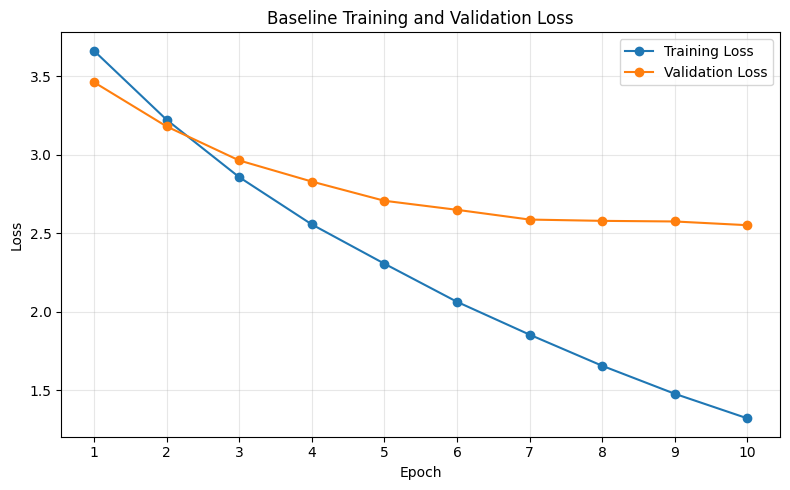

Saved: /content/skin-tone-fairness/outputs/figures/baseline_loss_curve.png


In [175]:
plt.figure(figsize=(8, 5))

plt.plot(
    history_df["epoch"],
    history_df["train_loss"],
    marker="o",
    label="Training Loss"
)

plt.plot(
    history_df["epoch"],
    history_df["val_loss"],
    marker="o",
    label="Validation Loss"
)

plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Baseline Training and Validation Loss")

plt.xticks(
    history_df["epoch"]
)

plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()

LOSS_FIGURE_PATH = (
    FIGURE_DIR /
    "baseline_loss_curve.png"
)

plt.savefig(
    LOSS_FIGURE_PATH,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print(
    "Saved:",
    LOSS_FIGURE_PATH
)

Cell 5 — Accuracy Curve

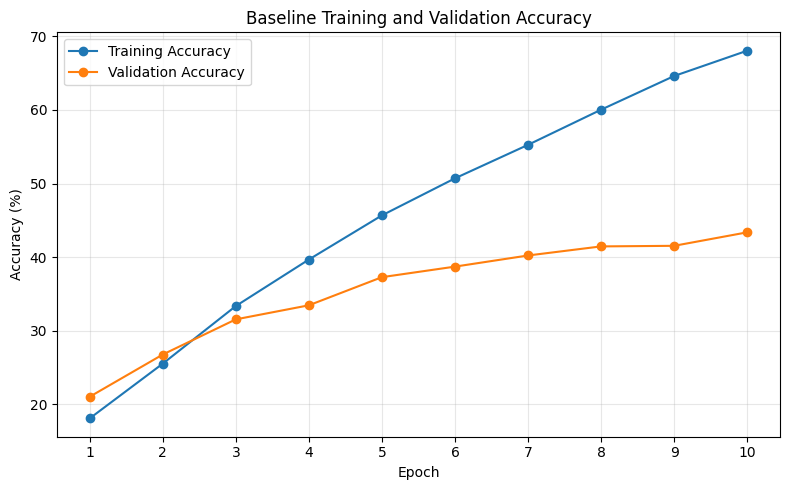

Saved: /content/skin-tone-fairness/outputs/figures/baseline_accuracy_curve.png


In [176]:
plt.figure(figsize=(8, 5))

plt.plot(
    history_df["epoch"],
    history_df["train_accuracy"] * 100,
    marker="o",
    label="Training Accuracy"
)

plt.plot(
    history_df["epoch"],
    history_df["val_accuracy"] * 100,
    marker="o",
    label="Validation Accuracy"
)

plt.xlabel("Epoch")
plt.ylabel("Accuracy (%)")
plt.title("Baseline Training and Validation Accuracy")

plt.xticks(
    history_df["epoch"]
)

plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()

ACCURACY_FIGURE_PATH = (
    FIGURE_DIR /
    "baseline_accuracy_curve.png"
)

plt.savefig(
    ACCURACY_FIGURE_PATH,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print(
    "Saved:",
    ACCURACY_FIGURE_PATH
)

Cell 6 — Learning Rate Curve

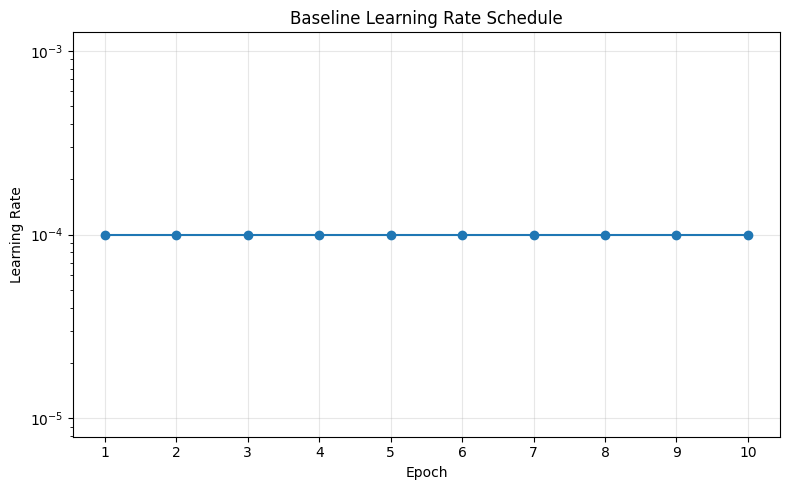

Saved: /content/skin-tone-fairness/outputs/figures/baseline_learning_rate_curve.png


In [177]:
plt.figure(figsize=(8, 5))

plt.plot(
    history_df["epoch"],
    history_df["learning_rate"],
    marker="o"
)

plt.xlabel("Epoch")
plt.ylabel("Learning Rate")
plt.title("Baseline Learning Rate Schedule")

plt.xticks(
    history_df["epoch"]
)

plt.yscale("log")

plt.grid(True, alpha=0.3)
plt.tight_layout()

LR_FIGURE_PATH = (
    FIGURE_DIR /
    "baseline_learning_rate_curve.png"
)

plt.savefig(
    LR_FIGURE_PATH,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print(
    "Saved:",
    LR_FIGURE_PATH
)

Cell 7 — Best Epoch Analysis

In [178]:
best_val_loss_idx = history_df[
    "val_loss"
].idxmin()

best_val_accuracy_idx = history_df[
    "val_accuracy"
].idxmax()

best_loss_epoch = int(
    history_df.loc[
        best_val_loss_idx,
        "epoch"
    ]
)

best_accuracy_epoch = int(
    history_df.loc[
        best_val_accuracy_idx,
        "epoch"
    ]
)

best_val_loss = float(
    history_df.loc[
        best_val_loss_idx,
        "val_loss"
    ]
)

best_val_accuracy = float(
    history_df.loc[
        best_val_accuracy_idx,
        "val_accuracy"
    ]
)

print("=" * 60)
print("BEST EPOCH ANALYSIS")
print("=" * 60)

print(
    "Best validation-loss epoch:",
    best_loss_epoch
)

print(
    "Best validation loss:",
    best_val_loss
)

print(
    "Best validation-accuracy epoch:",
    best_accuracy_epoch
)

print(
    "Best validation accuracy:",
    f"{best_val_accuracy * 100:.2f}%"
)

print("=" * 60)

BEST EPOCH ANALYSIS
Best validation-loss epoch: 10
Best validation loss: 2.5520922554189163
Best validation-accuracy epoch: 10
Best validation accuracy: 43.37%


Cell 8 — Generalization Gap

In [179]:
history_df["accuracy_gap"] = (
    history_df["train_accuracy"]
    - history_df["val_accuracy"]
)

history_df["loss_gap"] = (
    history_df["val_loss"]
    - history_df["train_loss"]
)

final_row = history_df.iloc[-1]

final_train_accuracy = float(
    final_row["train_accuracy"]
)

final_val_accuracy = float(
    final_row["val_accuracy"]
)

final_train_loss = float(
    final_row["train_loss"]
)

final_val_loss = float(
    final_row["val_loss"]
)

accuracy_gap = float(
    final_row["accuracy_gap"]
)

loss_gap = float(
    final_row["loss_gap"]
)

print("=" * 60)
print("GENERALIZATION ANALYSIS")
print("=" * 60)

print(
    f"Final training accuracy   : "
    f"{final_train_accuracy * 100:.2f}%"
)

print(
    f"Final validation accuracy : "
    f"{final_val_accuracy * 100:.2f}%"
)

print(
    f"Accuracy gap              : "
    f"{accuracy_gap * 100:.2f} percentage points"
)

print(
    f"Final training loss       : "
    f"{final_train_loss:.4f}"
)

print(
    f"Final validation loss     : "
    f"{final_val_loss:.4f}"
)

print(
    f"Loss gap                  : "
    f"{loss_gap:.4f}"
)

print("=" * 60)

GENERALIZATION ANALYSIS
Final training accuracy   : 68.05%
Final validation accuracy : 43.37%
Accuracy gap              : 24.67 percentage points
Final training loss       : 1.3207
Final validation loss     : 2.5521
Loss gap                  : 1.2314


Cell 9 — Save Baseline Summary Table

In [180]:
baseline_summary = pd.DataFrame({
    "Metric": [
        "Model",
        "Number of Classes",
        "Training Epochs",
        "Batch Size",
        "Initial Learning Rate",
        "Final Training Loss",
        "Final Training Accuracy",
        "Final Validation Loss",
        "Final Validation Accuracy",
        "Best Validation Loss",
        "Best Validation Loss Epoch",
        "Best Validation Accuracy",
        "Best Validation Accuracy Epoch",
        "Accuracy Gap"
    ],

    "Value": [
        "EfficientNet-B0",
        NUM_CLASSES,
        NUM_EPOCHS,
        BATCH_SIZE,
        LEARNING_RATE,
        final_train_loss,
        final_train_accuracy,
        final_val_loss,
        final_val_accuracy,
        best_val_loss,
        best_loss_epoch,
        best_val_accuracy,
        best_accuracy_epoch,
        accuracy_gap
    ]
})

SUMMARY_TABLE_PATH = (
    TABLE_DIR /
    "baseline_training_summary.csv"
)

baseline_summary.to_csv(
    SUMMARY_TABLE_PATH,
    index=False
)

print("=" * 60)
print("BASELINE SUMMARY TABLE")
print("=" * 60)

print(baseline_summary)

print("\nSaved:")
print(SUMMARY_TABLE_PATH)

print("=" * 60)

BASELINE SUMMARY TABLE
                            Metric            Value
0                            Model  EfficientNet-B0
1                Number of Classes              114
2                  Training Epochs               10
3                       Batch Size               32
4            Initial Learning Rate           0.0001
5              Final Training Loss         1.320742
6          Final Training Accuracy         0.680451
7            Final Validation Loss         2.552092
8        Final Validation Accuracy         0.433745
9             Best Validation Loss         2.552092
10      Best Validation Loss Epoch               10
11        Best Validation Accuracy         0.433745
12  Best Validation Accuracy Epoch               10
13                    Accuracy Gap         0.246707

Saved:
/content/skin-tone-fairness/outputs/tables/baseline_training_summary.csv


Cell 10 — Save Analysis JSON

In [181]:
BASELINE_ANALYSIS_PATH = (
    METRIC_DIR /
    "baseline_analysis.json"
)

baseline_analysis = {
    "model": "EfficientNet-B0",
    "num_classes": int(NUM_CLASSES),
    "epochs": int(NUM_EPOCHS),
    "batch_size": int(BATCH_SIZE),
    "initial_learning_rate": float(LEARNING_RATE),

    "final": {
        "train_loss": final_train_loss,
        "train_accuracy": final_train_accuracy,
        "validation_loss": final_val_loss,
        "validation_accuracy": final_val_accuracy,
        "accuracy_gap": accuracy_gap,
        "loss_gap": loss_gap
    },

    "best": {
        "validation_loss": best_val_loss,
        "validation_loss_epoch": best_loss_epoch,
        "validation_accuracy": best_val_accuracy,
        "validation_accuracy_epoch": best_accuracy_epoch
    }
}

with open(
    BASELINE_ANALYSIS_PATH,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        baseline_analysis,
        f,
        indent=2
    )

print("=" * 60)
print("BASELINE ANALYSIS SAVED")
print("=" * 60)

print(BASELINE_ANALYSIS_PATH)

print("=" * 60)

BASELINE ANALYSIS SAVED
/content/skin-tone-fairness/outputs/metrics/baseline_analysis.json


Cell 11 — Final Phase 3.6 Summary

In [182]:
print("=" * 60)
print("PHASE 3.6 — FINAL SUMMARY")
print("=" * 60)

print("Model:",
      "EfficientNet-B0")

print("Epochs:",
      NUM_EPOCHS)

print("\nFinal performance:")

print(
    f"Train Loss       : "
    f"{final_train_loss:.4f}"
)

print(
    f"Train Accuracy   : "
    f"{final_train_accuracy * 100:.2f}%"
)

print(
    f"Validation Loss  : "
    f"{final_val_loss:.4f}"
)

print(
    f"Validation Accuracy: "
    f"{final_val_accuracy * 100:.2f}%"
)

print("\nBest performance:")

print(
    f"Best Val Loss    : "
    f"{best_val_loss:.4f}"
)

print(
    f"Best Val Loss Epoch: "
    f"{best_loss_epoch}"
)

print(
    f"Best Val Accuracy : "
    f"{best_val_accuracy * 100:.2f}%"
)

print(
    f"Best Accuracy Epoch: "
    f"{best_accuracy_epoch}"
)

print("\nGeneralization:")
print(
    f"Accuracy Gap     : "
    f"{accuracy_gap * 100:.2f} percentage points"
)

print("\nSaved figures:")
print(LOSS_FIGURE_PATH)
print(ACCURACY_FIGURE_PATH)
print(LR_FIGURE_PATH)

print("\nSaved tables:")
print(SUMMARY_TABLE_PATH)

print("\nSaved analysis:")
print(BASELINE_ANALYSIS_PATH)

print("=" * 60)
print("Phase 3.6 completed.")

PHASE 3.6 — FINAL SUMMARY
Model: EfficientNet-B0
Epochs: 10

Final performance:
Train Loss       : 1.3207
Train Accuracy   : 68.05%
Validation Loss  : 2.5521
Validation Accuracy: 43.37%

Best performance:
Best Val Loss    : 2.5521
Best Val Loss Epoch: 10
Best Val Accuracy : 43.37%
Best Accuracy Epoch: 10

Generalization:
Accuracy Gap     : 24.67 percentage points

Saved figures:
/content/skin-tone-fairness/outputs/figures/baseline_loss_curve.png
/content/skin-tone-fairness/outputs/figures/baseline_accuracy_curve.png
/content/skin-tone-fairness/outputs/figures/baseline_learning_rate_curve.png

Saved tables:
/content/skin-tone-fairness/outputs/tables/baseline_training_summary.csv

Saved analysis:
/content/skin-tone-fairness/outputs/metrics/baseline_analysis.json
Phase 3.6 completed.


# **Phase 4 — Baseline Test Evaluation**

**Phase 4.1 — Load Best Baseline Checkpoint**

Cell 1 — Checkpoint Path Verification

In [183]:
from pathlib import Path
import torch

print("=" * 60)
print("PHASE 4.1 — BEST BASELINE CHECKPOINT")
print("=" * 60)

BEST_CHECKPOINT_PATH = (
    PROJECT_ROOT /
    "outputs" /
    "checkpoints" /
    "baseline_best.pt"
)

print("Checkpoint path:")
print(BEST_CHECKPOINT_PATH)

print(
    "\nCheckpoint exists:",
    BEST_CHECKPOINT_PATH.exists()
)

if BEST_CHECKPOINT_PATH.exists():

    checkpoint_size_mb = (
        BEST_CHECKPOINT_PATH.stat().st_size
        / (1024 ** 2)
    )

    print(
        f"Checkpoint size: "
        f"{checkpoint_size_mb:.2f} MB"
    )

print("=" * 60)

PHASE 4.1 — BEST BASELINE CHECKPOINT
Checkpoint path:
/content/skin-tone-fairness/outputs/checkpoints/baseline_best.pt

Checkpoint exists: True
Checkpoint size: 48.00 MB


Cell 2 — Load Checkpoint

In [184]:
checkpoint = torch.load(
    BEST_CHECKPOINT_PATH,
    map_location=device
)

print("=" * 60)
print("CHECKPOINT LOADED")
print("=" * 60)

print(
    "Checkpoint type:",
    type(checkpoint)
)

print("\nCheckpoint keys:")

for key in checkpoint.keys():
    print("-", key)

print("=" * 60)

CHECKPOINT LOADED
Checkpoint type: <class 'dict'>

Checkpoint keys:
- epoch
- model_state_dict
- optimizer_state_dict
- scheduler_state_dict
- train_loss
- train_accuracy
- val_loss
- val_accuracy
- best_val_loss
- model_name
- num_classes
- image_size


Cell 3 — Restore Model Weights

In [185]:
model.load_state_dict(
    checkpoint["model_state_dict"]
)

model = model.to(device)

model.eval()

print("=" * 60)
print("MODEL WEIGHTS RESTORED")
print("=" * 60)

print(
    "Model:",
    checkpoint.get(
        "model_name",
        "EfficientNet-B0"
    )
)

print(
    "Number of classes:",
    checkpoint.get(
        "num_classes",
        NUM_CLASSES
    )
)

print(
    "Checkpoint epoch:",
    checkpoint["epoch"]
)

print(
    "Checkpoint validation loss:",
    checkpoint["val_loss"]
)

print(
    "Checkpoint validation accuracy:",
    f"{checkpoint['val_accuracy'] * 100:.2f}%"
)

print(
    "Model device:",
    next(model.parameters()).device
)

print("=" * 60)

MODEL WEIGHTS RESTORED
Model: EfficientNet-B0
Number of classes: 114
Checkpoint epoch: 10
Checkpoint validation loss: 2.5520922554189163
Checkpoint validation accuracy: 43.37%
Model device: cuda:0


Cell 4 — Verify Model Output

In [186]:
test_batch = next(
    iter(test_loader)
)

test_images = test_batch["image"].to(
    device,
    non_blocking=True
)

test_labels = test_batch["class_id"].to(
    device,
    non_blocking=True
)

with torch.no_grad():

    test_outputs = model(
        test_images
    )

print("=" * 60)
print("RESTORED MODEL FORWARD CHECK")
print("=" * 60)

print(
    "Input shape:",
    test_images.shape
)

print(
    "Label shape:",
    test_labels.shape
)

print(
    "Output shape:",
    test_outputs.shape
)

print(
    "Output device:",
    test_outputs.device
)

print(
    "Output dtype:",
    test_outputs.dtype
)

print(
    "NaN present:",
    torch.isnan(
        test_outputs
    ).any().item()
)

print(
    "Inf present:",
    torch.isinf(
        test_outputs
    ).any().item()
)

print("=" * 60)

RESTORED MODEL FORWARD CHECK
Input shape: torch.Size([32, 3, 224, 224])
Label shape: torch.Size([32])
Output shape: torch.Size([32, 114])
Output device: cuda:0
Output dtype: torch.float32
NaN present: False
Inf present: False


Cell 5 — Verify Checkpoint Metadata

In [187]:
print("=" * 60)
print("CHECKPOINT METADATA VERIFICATION")
print("=" * 60)

checkpoint_epoch = checkpoint["epoch"]
checkpoint_val_loss = checkpoint["val_loss"]
checkpoint_val_accuracy = checkpoint["val_accuracy"]

print(
    "Best epoch:",
    checkpoint_epoch
)

print(
    "Validation loss:",
    f"{checkpoint_val_loss:.6f}"
)

print(
    "Validation accuracy:",
    f"{checkpoint_val_accuracy * 100:.2f}%"
)

print(
    "Expected best epoch:",
    10
)

print(
    "Epoch matches:",
    checkpoint_epoch == 10
)

print(
    "Model classes:",
    checkpoint.get(
        "num_classes",
        "Not stored"
    )
)

print("=" * 60)

CHECKPOINT METADATA VERIFICATION
Best epoch: 10
Validation loss: 2.552092
Validation accuracy: 43.37%
Expected best epoch: 10
Epoch matches: True
Model classes: 114


Cell 6 — Phase 4.1 Final Summary

In [188]:
checkpoint_loaded = (
    isinstance(checkpoint, dict)
    and "model_state_dict" in checkpoint
    and "optimizer_state_dict" in checkpoint
)

output_shape_valid = (
    test_outputs.shape[1] == NUM_CLASSES
)

outputs_finite = (
    not torch.isnan(test_outputs).any().item()
    and
    not torch.isinf(test_outputs).any().item()
)

print("=" * 60)
print("PHASE 4.1 — FINAL SUMMARY")
print("=" * 60)

print(
    "Best checkpoint exists :",
    BEST_CHECKPOINT_PATH.exists()
)

print(
    "Checkpoint loaded      :",
    checkpoint_loaded
)

print(
    "Best epoch             :",
    checkpoint_epoch
)

print(
    "Validation loss        :",
    f"{checkpoint_val_loss:.4f}"
)

print(
    "Validation accuracy    :",
    f"{checkpoint_val_accuracy * 100:.2f}%"
)

print(
    "Test batch input       :",
    tuple(test_images.shape)
)

print(
    "Model output           :",
    tuple(test_outputs.shape)
)

print(
    "Output shape valid     :",
    output_shape_valid
)

print(
    "Outputs finite         :",
    outputs_finite
)

print(
    "Model device           :",
    next(model.parameters()).device
)

phase_41_passed = (
    BEST_CHECKPOINT_PATH.exists()
    and checkpoint_loaded
    and output_shape_valid
    and outputs_finite
)

print(
    "\nPhase 4.1 status       :",
    "PASS" if phase_41_passed else "FAIL"
)

print("=" * 60)

PHASE 4.1 — FINAL SUMMARY
Best checkpoint exists : True
Checkpoint loaded      : True
Best epoch             : 10
Validation loss        : 2.5521
Validation accuracy    : 43.37%
Test batch input       : (32, 3, 224, 224)
Model output           : (32, 114)
Output shape valid     : True
Outputs finite         : True
Model device           : cuda:0

Phase 4.1 status       : PASS


**Phase 4.2 — Full Test Set Inference**

Cell 1 — Inference Configuration

In [189]:
import time
import numpy as np
import pandas as pd
import torch

print("=" * 60)
print("PHASE 4.2 — FULL TEST SET INFERENCE")
print("=" * 60)

model.eval()

TEST_RESULTS_DIR = (
    PROJECT_ROOT /
    "outputs" /
    "metrics"
)

TEST_RESULTS_DIR.mkdir(
    parents=True,
    exist_ok=True
)

print("Test samples :", len(test_dataset))
print("Test batches :", len(test_loader))
print("Batch size   :", BATCH_SIZE)
print("Device       :", device)
print("Model        : EfficientNet-B0")
print("Classes      :", NUM_CLASSES)

print("=" * 60)

PHASE 4.2 — FULL TEST SET INFERENCE
Test samples : 2454
Test batches : 77
Batch size   : 32
Device       : cuda
Model        : EfficientNet-B0
Classes      : 114


Cell 2 — Initialize Prediction Storage

In [190]:
all_true_labels = []
all_pred_labels = []
all_skin_tones = []
all_image_paths = []
all_md5hashes = []
all_confidences = []

print("=" * 60)
print("PREDICTION STORAGE INITIALIZED")
print("=" * 60)

storage_variables = {
    "true_labels": all_true_labels,
    "pred_labels": all_pred_labels,
    "skin_tones": all_skin_tones,
    "image_paths": all_image_paths,
    "md5hashes": all_md5hashes,
    "confidences": all_confidences
}

for name, variable in storage_variables.items():
    print(
        f"{name:20s}: Ready"
    )

print("=" * 60)

PREDICTION STORAGE INITIALIZED
true_labels         : Ready
pred_labels         : Ready
skin_tones          : Ready
image_paths         : Ready
md5hashes           : Ready
confidences         : Ready


Cell 3 — Run Full Test Inference

In [191]:
inference_start_time = time.time()

model.eval()

with torch.no_grad():

    for batch_idx, batch in enumerate(test_loader):

        # --------------------------------------------------
        # Move images to GPU
        # --------------------------------------------------

        images = batch["image"].to(
            device,
            non_blocking=True
        )

        # --------------------------------------------------
        # Forward pass
        # --------------------------------------------------

        outputs = model(images)

        # --------------------------------------------------
        # Convert logits to probabilities
        # --------------------------------------------------

        probabilities = torch.softmax(
            outputs,
            dim=1
        )

        # --------------------------------------------------
        # Get predictions and confidence
        # --------------------------------------------------

        confidences, predictions = (
            probabilities.max(dim=1)
        )

        # --------------------------------------------------
        # Store labels
        # --------------------------------------------------

        all_true_labels.extend(
            batch["class_id"]
            .cpu()
            .numpy()
            .tolist()
        )

        all_pred_labels.extend(
            predictions
            .cpu()
            .numpy()
            .tolist()
        )

        # --------------------------------------------------
        # Store skin-tone metadata
        # --------------------------------------------------

        all_skin_tones.extend(
            batch["skin_tone_group"]
        )

        # --------------------------------------------------
        # Store paths and MD5
        # --------------------------------------------------

        all_image_paths.extend(
            batch["image_path"]
        )

        all_md5hashes.extend(
            batch["md5hash"]
        )

        # --------------------------------------------------
        # Store confidence
        # --------------------------------------------------

        all_confidences.extend(
            confidences
            .cpu()
            .numpy()
            .tolist()
        )

        # --------------------------------------------------
        # Progress
        # --------------------------------------------------

        if (
            (batch_idx + 1) % 10 == 0
            or
            batch_idx == len(test_loader) - 1
        ):

            print(
                f"Processed batches: "
                f"{batch_idx + 1}/{len(test_loader)}"
            )

inference_time = (
    time.time() - inference_start_time
)

print("=" * 60)
print("FULL TEST INFERENCE COMPLETED")
print("=" * 60)

print(
    f"Total inference time: "
    f"{inference_time / 60:.2f} minutes"
)

print(
    "Predictions collected:",
    len(all_pred_labels)
)

print("=" * 60)

Processed batches: 10/77
Processed batches: 20/77
Processed batches: 30/77
Processed batches: 40/77
Processed batches: 50/77
Processed batches: 60/77
Processed batches: 70/77
Processed batches: 77/77
FULL TEST INFERENCE COMPLETED
Total inference time: 0.24 minutes
Predictions collected: 2454


Cell 4 — Basic Prediction Integrity Check

In [192]:
print("=" * 60)
print("PREDICTION INTEGRITY CHECK")
print("=" * 60)

expected_samples = len(test_dataset)

checks = {
    "True labels": len(all_true_labels),
    "Predictions": len(all_pred_labels),
    "Skin tones": len(all_skin_tones),
    "Image paths": len(all_image_paths),
    "MD5 hashes": len(all_md5hashes),
    "Confidences": len(all_confidences)
}

for name, count in checks.items():

    print(
        f"{name:15s}: "
        f"{count} / {expected_samples}"
    )

print("\nAll lengths match:")

all_lengths_match = all(
    count == expected_samples
    for count in checks.values()
)

print(
    all_lengths_match
)

print("=" * 60)

PREDICTION INTEGRITY CHECK
True labels    : 2454 / 2454
Predictions    : 2454 / 2454
Skin tones     : 2454 / 2454
Image paths    : 2454 / 2454
MD5 hashes     : 2454 / 2454
Confidences    : 2454 / 2454

All lengths match:
True


Cell 5 — Prediction Range & Confidence Check

In [193]:
true_labels_array = np.asarray(
    all_true_labels
)

pred_labels_array = np.asarray(
    all_pred_labels
)

confidence_array = np.asarray(
    all_confidences
)

print("=" * 60)
print("PREDICTION RANGE CHECK")
print("=" * 60)

print(
    "True label minimum:",
    true_labels_array.min()
)

print(
    "True label maximum:",
    true_labels_array.max()
)

print(
    "Predicted label minimum:",
    pred_labels_array.min()
)

print(
    "Predicted label maximum:",
    pred_labels_array.max()
)

print(
    "Expected class range:",
    f"0–{NUM_CLASSES - 1}"
)

print(
    "\nPredictions within range:",
    bool(
        (
            (pred_labels_array >= 0)
            &
            (pred_labels_array < NUM_CLASSES)
        ).all()
    )
)

print(
    "\nConfidence minimum:",
    confidence_array.min()
)

print(
    "Confidence maximum:",
    confidence_array.max()
)

print(
    "Confidence mean:",
    confidence_array.mean()
)

print(
    "Confidence values valid:",
    bool(
        (
            (confidence_array >= 0)
            &
            (confidence_array <= 1)
        ).all()
    )
)

print("=" * 60)

PREDICTION RANGE CHECK
True label minimum: 0
True label maximum: 113
Predicted label minimum: 0
Predicted label maximum: 113
Expected class range: 0–113

Predictions within range: True

Confidence minimum: 0.024902021512389183
Confidence maximum: 0.999750554561615
Confidence mean: 0.48998192212747044
Confidence values valid: True


Cell 6 — Create Prediction DataFrame

In [194]:
test_predictions_df = pd.DataFrame({
    "md5hash": all_md5hashes,
    "image_path": all_image_paths,
    "true_class_id": all_true_labels,
    "predicted_class_id": all_pred_labels,
    "skin_tone_group": all_skin_tones,
    "confidence": all_confidences
})

test_predictions_df["correct"] = (
    test_predictions_df["true_class_id"]
    ==
    test_predictions_df["predicted_class_id"]
)

print("=" * 60)
print("TEST PREDICTION DATAFRAME")
print("=" * 60)

print(
    "Shape:",
    test_predictions_df.shape
)

print("\nColumns:")
print(
    test_predictions_df.columns.tolist()
)

print("\nFirst 10 predictions:")
print(
    test_predictions_df.head(10)
)

print("=" * 60)

TEST PREDICTION DATAFRAME
Shape: (2454, 7)

Columns:
['md5hash', 'image_path', 'true_class_id', 'predicted_class_id', 'skin_tone_group', 'confidence', 'correct']

First 10 predictions:
                            md5hash  \
0  f6cf7399d436730b6db1ed65dd522bb5   
1  7cd58d112f623644c0914d53b1e99d5c   
2  a192b918be0890fd54a55f6a92014802   
3  f5e0a084eaf8cfcfb94c4093f9a31e48   
4  02c518694f4e5784c99a3f487950f9ff   
5  2644e386539132d60c563416f4fa26aa   
6  ba188c63a750b85546eaa07c06f5c796   
7  e99ba7397c33ba169192ffdb25b66ccf   
8  192e5b9128c1a9821ebe319657af578d   
9  4a400ad27e11d89d02ae11ca3110ae86   

                                          image_path  true_class_id  \
0  /content/skin-tone-fairness/data/fitzpatrick17...             49   
1  /content/skin-tone-fairness/data/fitzpatrick17...              8   
2  /content/skin-tone-fairness/data/fitzpatrick17...            110   
3  /content/skin-tone-fairness/data/fitzpatrick17...             19   
4  /content/skin-tone-fairness

Cell 7 — Overall Prediction Sanity Check

In [195]:
correct_predictions = (
    test_predictions_df["correct"]
    .sum()
)

total_predictions = len(
    test_predictions_df
)

overall_accuracy = (
    correct_predictions /
    total_predictions
)

print("=" * 60)
print("BASIC TEST PREDICTION SUMMARY")
print("=" * 60)

print(
    "Total test samples:",
    total_predictions
)

print(
    "Correct predictions:",
    correct_predictions
)

print(
    "Incorrect predictions:",
    total_predictions -
    correct_predictions
)

print(
    "Overall accuracy:",
    f"{overall_accuracy * 100:.2f}%"
)

print(
    "Mean confidence:",
    f"{test_predictions_df['confidence'].mean():.4f}"
)

print(
    "Median confidence:",
    f"{test_predictions_df['confidence'].median():.4f}"
)

print("=" * 60)

BASIC TEST PREDICTION SUMMARY
Total test samples: 2454
Correct predictions: 1092
Incorrect predictions: 1362
Overall accuracy: 44.50%
Mean confidence: 0.4900
Median confidence: 0.4073


Cell 8 — Skin-Tone Prediction Count Check

In [196]:
skin_tone_counts = (
    test_predictions_df[
        "skin_tone_group"
    ]
    .value_counts()
    .sort_index()
)

print("=" * 60)
print("TEST SET SKIN-TONE COVERAGE")
print("=" * 60)

print(
    skin_tone_counts
)

print(
    "\nTotal:",
    skin_tone_counts.sum()
)

print("=" * 60)

TEST SET SKIN-TONE COVERAGE
skin_tone_group
Dark        313
Light      1161
Medium      915
Unknown      65
Name: count, dtype: int64

Total: 2454


Cell 9 — Save Raw Test Predictions

In [197]:
TEST_PREDICTIONS_PATH = (
    TEST_RESULTS_DIR /
    "baseline_test_predictions.csv"
)

test_predictions_df.to_csv(
    TEST_PREDICTIONS_PATH,
    index=False
)

print("=" * 60)
print("TEST PREDICTIONS SAVED")
print("=" * 60)

print(
    TEST_PREDICTIONS_PATH
)

print(
    "File exists:",
    TEST_PREDICTIONS_PATH.exists()
)

print(
    "Rows saved:",
    len(test_predictions_df)
)

print("=" * 60)

TEST PREDICTIONS SAVED
/content/skin-tone-fairness/outputs/metrics/baseline_test_predictions.csv
File exists: True
Rows saved: 2454


Cell 10 — Phase 4.2 Final Verification

In [198]:
prediction_lengths_valid = (
    len(test_predictions_df)
    == len(test_dataset)
)

prediction_range_valid = (
    (
        test_predictions_df[
            "predicted_class_id"
        ]
        >= 0
    )
    &
    (
        test_predictions_df[
            "predicted_class_id"
        ]
        < NUM_CLASSES
    )
).all()

confidence_valid = (
    (
        test_predictions_df[
            "confidence"
        ] >= 0
    )
    &
    (
        test_predictions_df[
            "confidence"
        ] <= 1
    )
).all()

no_missing_predictions = (
    test_predictions_df[
        [
            "md5hash",
            "true_class_id",
            "predicted_class_id",
            "skin_tone_group",
            "confidence"
        ]
    ]
    .isna()
    .sum()
    .sum()
    == 0
)

phase_42_passed = (
    prediction_lengths_valid
    and prediction_range_valid
    and confidence_valid
    and no_missing_predictions
    and TEST_PREDICTIONS_PATH.exists()
)

print("=" * 60)
print("PHASE 4.2 — FINAL SUMMARY")
print("=" * 60)

print(
    "Test samples              :",
    len(test_dataset)
)

print(
    "Predictions collected     :",
    len(test_predictions_df)
)

print(
    "Prediction count valid    :",
    prediction_lengths_valid
)

print(
    "Prediction range valid   :",
    prediction_range_valid
)

print(
    "Confidence range valid   :",
    confidence_valid
)

print(
    "Missing prediction values:",
    not no_missing_predictions
)

print(
    "Prediction file saved     :",
    TEST_PREDICTIONS_PATH.exists()
)

print(
    "\nOverall accuracy "
    "(sanity check):",
    f"{overall_accuracy * 100:.2f}%"
)

print(
    "Mean confidence           :",
    f"{confidence_array.mean():.4f}"
)

print(
    "\nPhase 4.2 status          :",
    "PASS" if phase_42_passed else "FAIL"
)

print("=" * 60)

PHASE 4.2 — FINAL SUMMARY
Test samples              : 2454
Predictions collected     : 2454
Prediction count valid    : True
Prediction range valid   : True
Confidence range valid   : True
Missing prediction values: False
Prediction file saved     : True

Overall accuracy (sanity check): 44.50%
Mean confidence           : 0.4900

Phase 4.2 status          : PASS


**Phase 4.3 — Overall Performance Metrics**

Cell 1 — Load Predictions & Imports

In [199]:
import pandas as pd
import numpy as np
import json

from sklearn.metrics import (
    accuracy_score,
    balanced_accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report
)

print("=" * 60)
print("PHASE 4.3 — OVERALL PERFORMANCE METRICS")
print("=" * 60)

TEST_PREDICTIONS_PATH = (
    PROJECT_ROOT /
    "outputs" /
    "metrics" /
    "baseline_test_predictions.csv"
)

test_predictions_df = pd.read_csv(
    TEST_PREDICTIONS_PATH
)

print(
    "Prediction file:",
    TEST_PREDICTIONS_PATH
)

print(
    "Shape:",
    test_predictions_df.shape
)

print("=" * 60)

PHASE 4.3 — OVERALL PERFORMANCE METRICS
Prediction file: /content/skin-tone-fairness/outputs/metrics/baseline_test_predictions.csv
Shape: (2454, 7)


Cell 2 — Extract True & Predicted Labels

In [200]:
y_true = (
    test_predictions_df[
        "true_class_id"
    ]
    .astype(int)
    .to_numpy()
)

y_pred = (
    test_predictions_df[
        "predicted_class_id"
    ]
    .astype(int)
    .to_numpy()
)

print("=" * 60)
print("LABEL PREPARATION")
print("=" * 60)

print(
    "Number of samples:",
    len(y_true)
)

print(
    "True labels shape:",
    y_true.shape
)

print(
    "Predicted labels shape:",
    y_pred.shape
)

print(
    "True label range:",
    y_true.min(),
    "to",
    y_true.max()
)

print(
    "Predicted label range:",
    y_pred.min(),
    "to",
    y_pred.max()
)

print(
    "Labels have same length:",
    len(y_true) == len(y_pred)
)

print("=" * 60)

LABEL PREPARATION
Number of samples: 2454
True labels shape: (2454,)
Predicted labels shape: (2454,)
True label range: 0 to 113
Predicted label range: 0 to 113
Labels have same length: True


Cell 3 — Calculate Overall Metrics

In [201]:
overall_accuracy = accuracy_score(
    y_true,
    y_pred
)

balanced_accuracy = balanced_accuracy_score(
    y_true,
    y_pred
)

macro_precision = precision_score(
    y_true,
    y_pred,
    average="macro",
    zero_division=0
)

macro_recall = recall_score(
    y_true,
    y_pred,
    average="macro",
    zero_division=0
)

macro_f1 = f1_score(
    y_true,
    y_pred,
    average="macro",
    zero_division=0
)

weighted_precision = precision_score(
    y_true,
    y_pred,
    average="weighted",
    zero_division=0
)

weighted_recall = recall_score(
    y_true,
    y_pred,
    average="weighted",
    zero_division=0
)

weighted_f1 = f1_score(
    y_true,
    y_pred,
    average="weighted",
    zero_division=0
)

print("=" * 60)
print("OVERALL TEST PERFORMANCE")
print("=" * 60)

print(
    f"Accuracy            : {overall_accuracy * 100:.2f}%"
)

print(
    f"Balanced Accuracy   : {balanced_accuracy * 100:.2f}%"
)

print(
    f"Macro Precision     : {macro_precision:.4f}"
)

print(
    f"Macro Recall        : {macro_recall:.4f}"
)

print(
    f"Macro F1            : {macro_f1:.4f}"
)

print(
    f"Weighted Precision  : {weighted_precision:.4f}"
)

print(
    f"Weighted Recall     : {weighted_recall:.4f}"
)

print(
    f"Weighted F1         : {weighted_f1:.4f}"
)

print("=" * 60)

OVERALL TEST PERFORMANCE
Accuracy            : 44.50%
Balanced Accuracy   : 40.65%
Macro Precision     : 0.4429
Macro Recall        : 0.4065
Macro F1            : 0.4051
Weighted Precision  : 0.4533
Weighted Recall     : 0.4450
Weighted F1         : 0.4356


Cell 4 — Classification Report

In [202]:
classification_report_dict = classification_report(
    y_true,
    y_pred,
    labels=np.arange(NUM_CLASSES),
    output_dict=True,
    zero_division=0
)

classification_report_text = classification_report(
    y_true,
    y_pred,
    labels=np.arange(NUM_CLASSES),
    zero_division=0
)

print("=" * 60)
print("CLASSIFICATION REPORT")
print("=" * 60)

print(
    classification_report_text
)

print("=" * 60)

CLASSIFICATION REPORT
              precision    recall  f1-score   support

           0       0.44      0.62      0.52        13
           1       0.12      0.11      0.12        27
           2       0.59      0.63      0.61        51
           3       0.20      0.10      0.13        10
           4       1.00      0.43      0.60        14
           5       0.31      0.31      0.31        26
           6       0.35      0.38      0.36        64
           7       0.31      0.40      0.35        10
           8       0.43      0.40      0.41        70
           9       0.14      0.11      0.12         9
          10       0.60      0.60      0.60        10
          11       0.33      0.38      0.35         8
          12       0.67      0.33      0.44        12
          13       0.26      0.33      0.29        15
          14       0.40      0.40      0.40        10
          15       0.00      0.00      0.00        22
          16       0.42      0.42      0.42        12
     

Cell 5 — Create Overall Metrics Table

In [203]:
overall_metrics_df = pd.DataFrame({
    "Metric": [
        "Accuracy",
        "Balanced Accuracy",
        "Macro Precision",
        "Macro Recall",
        "Macro F1",
        "Weighted Precision",
        "Weighted Recall",
        "Weighted F1"
    ],

    "Score": [
        overall_accuracy,
        balanced_accuracy,
        macro_precision,
        macro_recall,
        macro_f1,
        weighted_precision,
        weighted_recall,
        weighted_f1
    ],

    "Percentage": [
        overall_accuracy * 100,
        balanced_accuracy * 100,
        macro_precision * 100,
        macro_recall * 100,
        macro_f1 * 100,
        weighted_precision * 100,
        weighted_recall * 100,
        weighted_f1 * 100
    ]
})

print("=" * 60)
print("OVERALL METRICS TABLE")
print("=" * 60)

print(
    overall_metrics_df.to_string(
        index=False
    )
)

print("=" * 60)

OVERALL METRICS TABLE
            Metric    Score  Percentage
          Accuracy 0.444988   44.498778
 Balanced Accuracy 0.406505   40.650454
   Macro Precision 0.442874   44.287429
      Macro Recall 0.406505   40.650454
          Macro F1 0.405129   40.512948
Weighted Precision 0.453337   45.333706
   Weighted Recall 0.444988   44.498778
       Weighted F1 0.435595   43.559490


Cell 6 — Save Overall Metrics

In [204]:
METRIC_DIR = (
    PROJECT_ROOT /
    "outputs" /
    "metrics"
)

TABLE_DIR = (
    PROJECT_ROOT /
    "outputs" /
    "tables"
)

METRIC_DIR.mkdir(
    parents=True,
    exist_ok=True
)

TABLE_DIR.mkdir(
    parents=True,
    exist_ok=True
)

OVERALL_METRICS_CSV = (
    TABLE_DIR /
    "baseline_overall_metrics.csv"
)

overall_metrics_df.to_csv(
    OVERALL_METRICS_CSV,
    index=False
)

OVERALL_METRICS_JSON = (
    METRIC_DIR /
    "baseline_overall_metrics.json"
)

overall_metrics_dict = {
    "accuracy": float(overall_accuracy),
    "balanced_accuracy": float(balanced_accuracy),
    "macro_precision": float(macro_precision),
    "macro_recall": float(macro_recall),
    "macro_f1": float(macro_f1),
    "weighted_precision": float(weighted_precision),
    "weighted_recall": float(weighted_recall),
    "weighted_f1": float(weighted_f1)
}

with open(
    OVERALL_METRICS_JSON,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        overall_metrics_dict,
        f,
        indent=2
    )

CLASSIFICATION_REPORT_CSV = (
    TABLE_DIR /
    "baseline_classification_report.csv"
)

classification_report_df = (
    pd.DataFrame(
        classification_report_dict
    )
    .transpose()
)

classification_report_df.to_csv(
    CLASSIFICATION_REPORT_CSV
)

print("=" * 60)
print("METRICS SAVED")
print("=" * 60)

print(
    "Overall CSV:",
    OVERALL_METRICS_CSV
)

print(
    "Overall JSON:",
    OVERALL_METRICS_JSON
)

print(
    "Classification report:",
    CLASSIFICATION_REPORT_CSV
)

print("=" * 60)

METRICS SAVED
Overall CSV: /content/skin-tone-fairness/outputs/tables/baseline_overall_metrics.csv
Overall JSON: /content/skin-tone-fairness/outputs/metrics/baseline_overall_metrics.json
Classification report: /content/skin-tone-fairness/outputs/tables/baseline_classification_report.csv


Cell 7 — Metric Sanity Check

In [205]:
metric_values = {
    "accuracy": overall_accuracy,
    "balanced_accuracy": balanced_accuracy,
    "macro_precision": macro_precision,
    "macro_recall": macro_recall,
    "macro_f1": macro_f1,
    "weighted_precision": weighted_precision,
    "weighted_recall": weighted_recall,
    "weighted_f1": weighted_f1
}

print("=" * 60)
print("METRIC SANITY CHECK")
print("=" * 60)

all_metrics_finite = True
all_metrics_valid = True

for name, value in metric_values.items():

    finite = np.isfinite(value)

    valid_range = (
        0.0 <= value <= 1.0
    )

    print(
        f"{name:20s}: "
        f"{value:.6f} | "
        f"finite={finite} | "
        f"valid_range={valid_range}"
    )

    if not finite:
        all_metrics_finite = False

    if not valid_range:
        all_metrics_valid = False

print(
    "\nAll metrics finite:",
    all_metrics_finite
)

print(
    "All metrics in [0,1]:",
    all_metrics_valid
)

print("=" * 60)

METRIC SANITY CHECK
accuracy            : 0.444988 | finite=True | valid_range=True
balanced_accuracy   : 0.406505 | finite=True | valid_range=True
macro_precision     : 0.442874 | finite=True | valid_range=True
macro_recall        : 0.406505 | finite=True | valid_range=True
macro_f1            : 0.405129 | finite=True | valid_range=True
weighted_precision  : 0.453337 | finite=True | valid_range=True
weighted_recall     : 0.444988 | finite=True | valid_range=True
weighted_f1         : 0.435595 | finite=True | valid_range=True

All metrics finite: True
All metrics in [0,1]: True


Cell 8 — Phase 4.3 Final Summary

In [206]:
files_saved = (
    OVERALL_METRICS_CSV.exists()
    and OVERALL_METRICS_JSON.exists()
    and CLASSIFICATION_REPORT_CSV.exists()
)

phase_43_passed = (
    len(y_true) == len(y_pred)
    and len(y_true) == len(test_predictions_df)
    and all_metrics_finite
    and all_metrics_valid
    and files_saved
)

print("=" * 60)
print("PHASE 4.3 — FINAL SUMMARY")
print("=" * 60)

print(
    "Test samples:",
    len(y_true)
)

print(
    "Number of classes:",
    NUM_CLASSES
)

print(
    "\nOverall performance:"
)

print(
    f"Accuracy           : "
    f"{overall_accuracy * 100:.2f}%"
)

print(
    f"Balanced Accuracy  : "
    f"{balanced_accuracy * 100:.2f}%"
)

print(
    f"Macro Precision    : "
    f"{macro_precision:.4f}"
)

print(
    f"Macro Recall       : "
    f"{macro_recall:.4f}"
)

print(
    f"Macro F1           : "
    f"{macro_f1:.4f}"
)

print(
    f"Weighted Precision : "
    f"{weighted_precision:.4f}"
)

print(
    f"Weighted Recall    : "
    f"{weighted_recall:.4f}"
)

print(
    f"Weighted F1        : "
    f"{weighted_f1:.4f}"
)

print(
    "\nAll metrics finite:",
    all_metrics_finite
)

print(
    "All metrics valid:",
    all_metrics_valid
)

print(
    "\nFiles saved:",
    files_saved
)

print(
    "Overall metrics CSV:",
    OVERALL_METRICS_CSV
)

print(
    "Classification report:",
    CLASSIFICATION_REPORT_CSV
)

print(
    "\nPhase 4.3 status:",
    "PASS" if phase_43_passed else "FAIL"
)

print("=" * 60)

PHASE 4.3 — FINAL SUMMARY
Test samples: 2454
Number of classes: 114

Overall performance:
Accuracy           : 44.50%
Balanced Accuracy  : 40.65%
Macro Precision    : 0.4429
Macro Recall       : 0.4065
Macro F1           : 0.4051
Weighted Precision : 0.4533
Weighted Recall    : 0.4450
Weighted F1        : 0.4356

All metrics finite: True
All metrics valid: True

Files saved: True
Overall metrics CSV: /content/skin-tone-fairness/outputs/tables/baseline_overall_metrics.csv
Classification report: /content/skin-tone-fairness/outputs/tables/baseline_classification_report.csv

Phase 4.3 status: PASS


**Phase 4.4 — Per-Disease Performance Analysis**

Cell 1 — Load Classification Report

In [207]:
import pandas as pd
import numpy as np

CLASSIFICATION_REPORT_CSV = (
    PROJECT_ROOT /
    "outputs" /
    "tables" /
    "baseline_classification_report.csv"
)

classification_df = pd.read_csv(
    CLASSIFICATION_REPORT_CSV
)

print("=" * 60)
print("PHASE 4.4 — PER-DISEASE PERFORMANCE")
print("=" * 60)

print(
    "Classification report:",
    CLASSIFICATION_REPORT_CSV
)

print(
    "Shape:",
    classification_df.shape
)

print("\nColumns:")
print(
    classification_df.columns.tolist()
)

print("=" * 60)

PHASE 4.4 — PER-DISEASE PERFORMANCE
Classification report: /content/skin-tone-fairness/outputs/tables/baseline_classification_report.csv
Shape: (117, 5)

Columns:
['Unnamed: 0', 'precision', 'recall', 'f1-score', 'support']


Cell 2 — Load Label Mapping

In [208]:
LABEL_MAPPING_PATH = (
    PROJECT_ROOT /
    "configs" /
    "label_mapping.json"
)

import json

with open(
    LABEL_MAPPING_PATH,
    "r",
    encoding="utf-8"
) as f:
    label_mapping = json.load(f)

print("=" * 60)
print("LABEL MAPPING")
print("=" * 60)

print(
    "Mapping file:",
    LABEL_MAPPING_PATH
)

print(
    "Number of mapped classes:",
    len(label_mapping)
)

print("=" * 60)

LABEL MAPPING
Mapping file: /content/skin-tone-fairness/configs/label_mapping.json
Number of mapped classes: 2


Cell 3 — Build Disease-Level Performance Table

In [209]:
# Remove aggregate rows if present
aggregate_rows = [
    "accuracy",
    "macro avg",
    "weighted avg"
]

disease_df = classification_df[
    ~classification_df["Unnamed: 0"].isin(
        aggregate_rows
    )
].copy()

# Rename class ID column
disease_df = disease_df.rename(
    columns={
        "Unnamed: 0": "class_id"
    }
)

# Convert class ID to integer where possible
disease_df["class_id"] = (
    pd.to_numeric(
        disease_df["class_id"],
        errors="coerce"
    )
)

disease_df = disease_df.dropna(
    subset=["class_id"]
)

disease_df["class_id"] = (
    disease_df["class_id"]
    .astype(int)
)

# Map class ID to disease name
def get_disease_name(class_id):
    return label_mapping.get(
        str(class_id),
        label_mapping.get(
            int(class_id),
            f"class_{class_id}"
        )
    )

disease_df["disease"] = (
    disease_df["class_id"]
    .apply(get_disease_name)
)

# Reorder columns
disease_df = disease_df[
    [
        "class_id",
        "disease",
        "precision",
        "recall",
        "f1-score",
        "support"
    ]
]

print("=" * 60)
print("DISEASE PERFORMANCE TABLE")
print("=" * 60)

print(
    "Number of disease classes:",
    len(disease_df)
)

print("\nFirst 10 diseases:")
print(
    disease_df.head(10).to_string(
        index=False
    )
)

print("=" * 60)

DISEASE PERFORMANCE TABLE
Number of disease classes: 114

First 10 diseases:
 class_id disease  precision   recall  f1-score  support
        0 class_0   0.444444 0.615385  0.516129     13.0
        1 class_1   0.125000 0.111111  0.117647     27.0
        2 class_2   0.592593 0.627451  0.609524     51.0
        3 class_3   0.200000 0.100000  0.133333     10.0
        4 class_4   1.000000 0.428571  0.600000     14.0
        5 class_5   0.307692 0.307692  0.307692     26.0
        6 class_6   0.347826 0.375000  0.360902     64.0
        7 class_7   0.307692 0.400000  0.347826     10.0
        8 class_8   0.430769 0.400000  0.414815     70.0
        9 class_9   0.142857 0.111111  0.125000      9.0


Cell 4 — Verify All 114 Diseases

In [210]:
expected_class_ids = set(
    range(NUM_CLASSES)
)

actual_class_ids = set(
    disease_df["class_id"].tolist()
)

missing_class_ids = sorted(
    expected_class_ids -
    actual_class_ids
)

extra_class_ids = sorted(
    actual_class_ids -
    expected_class_ids
)

print("=" * 60)
print("DISEASE COVERAGE CHECK")
print("=" * 60)

print(
    "Expected classes:",
    NUM_CLASSES
)

print(
    "Observed classes:",
    len(actual_class_ids)
)

print(
    "Missing class IDs:",
    missing_class_ids
)

print(
    "Extra class IDs:",
    extra_class_ids
)

print(
    "All 114 classes present:",
    len(missing_class_ids) == 0
    and len(extra_class_ids) == 0
)

print("=" * 60)

DISEASE COVERAGE CHECK
Expected classes: 114
Observed classes: 114
Missing class IDs: []
Extra class IDs: []
All 114 classes present: True


Cell 5 — Sort by F1 Score

In [211]:
disease_by_f1 = (
    disease_df
    .sort_values(
        by="f1-score",
        ascending=False
    )
    .reset_index(drop=True)
)

print("=" * 60)
print("TOP 15 DISEASES BY F1-SCORE")
print("=" * 60)

print(
    disease_by_f1[
        [
            "class_id",
            "disease",
            "precision",
            "recall",
            "f1-score",
            "support"
        ]
    ]
    .head(15)
    .to_string(index=False)
)

print("=" * 60)

TOP 15 DISEASES BY F1-SCORE
 class_id   disease  precision   recall  f1-score  support
      108 class_108   0.846154 0.956522  0.897959     23.0
       81  class_81   0.880000 0.814815  0.846154     27.0
       71  class_71   0.800000 0.869565  0.833333     23.0
       36  class_36   0.840000 0.777778  0.807692     27.0
       80  class_80   0.686275 0.853659  0.760870     41.0
       73  class_73   0.606061 0.909091  0.727273     22.0
       46  class_46   0.888889 0.615385  0.727273     13.0
       43  class_43   0.727273 0.727273  0.727273     22.0
      104 class_104   0.684211 0.722222  0.702703     18.0
       23  class_23   0.566667 0.850000  0.680000     20.0
       49  class_49   0.800000 0.571429  0.666667     14.0
       62  class_62   1.000000 0.500000  0.666667     10.0
       64  class_64   0.580000 0.763158  0.659091     38.0
       27  class_27   0.800000 0.500000  0.615385      8.0
       30  class_30   1.000000 0.444444  0.615385      9.0


Cell 6 — Worst Performing Diseases

In [212]:
print("=" * 60)
print("BOTTOM 15 DISEASES BY F1-SCORE")
print("=" * 60)

print(
    disease_by_f1[
        [
            "class_id",
            "disease",
            "precision",
            "recall",
            "f1-score",
            "support"
        ]
    ]
    .tail(15)
    .sort_values(
        by="f1-score",
        ascending=True
    )
    .to_string(index=False)
)

print("=" * 60)

BOTTOM 15 DISEASES BY F1-SCORE
 class_id   disease  precision   recall  f1-score  support
       20  class_20   0.000000 0.000000  0.000000     10.0
       65  class_65   0.000000 0.000000  0.000000     11.0
       15  class_15   0.000000 0.000000  0.000000     22.0
      112 class_112   0.000000 0.000000  0.000000      8.0
       25  class_25   0.000000 0.000000  0.000000     10.0
       52  class_52   0.066667 0.062500  0.064516     16.0
       39  class_39   0.083333 0.111111  0.095238      9.0
       99  class_99   0.111111 0.111111  0.111111      9.0
       22  class_22   0.097561 0.137931  0.114286     29.0
        1   class_1   0.125000 0.111111  0.117647     27.0
        9   class_9   0.142857 0.111111  0.125000      9.0
       97  class_97   0.166667 0.111111  0.133333      9.0
       21  class_21   0.250000 0.090909  0.133333     11.0
        3   class_3   0.200000 0.100000  0.133333     10.0
      106 class_106   0.250000 0.100000  0.142857     10.0


Cell 7 — Low-Support Disease Analysis

In [213]:
low_support_thresholds = [
    5,
    10,
    20
]

print("=" * 60)
print("LOW-SUPPORT DISEASE ANALYSIS")
print("=" * 60)

for threshold in low_support_thresholds:

    subset = disease_df[
        disease_df["support"] < threshold
    ]

    print(
        f"\nClasses with support < {threshold}: "
        f"{len(subset)}"
    )

    if len(subset) > 0:

        print(
            subset[
                [
                    "class_id",
                    "disease",
                    "f1-score",
                    "support"
                ]
            ]
            .sort_values(
                by="support"
            )
            .to_string(
                index=False
            )
        )

print("=" * 60)

LOW-SUPPORT DISEASE ANALYSIS

Classes with support < 5: 0

Classes with support < 10: 18
 class_id   disease  f1-score  support
       11  class_11  0.352941      8.0
       27  class_27  0.615385      8.0
       77  class_77  0.352941      8.0
       72  class_72  0.307692      8.0
       87  class_87  0.200000      8.0
      112 class_112  0.000000      8.0
        9   class_9  0.125000      9.0
       30  class_30  0.615385      9.0
       50  class_50  0.526316      9.0
       45  class_45  0.521739      9.0
       39  class_39  0.095238      9.0
       61  class_61  0.571429      9.0
       74  class_74  0.190476      9.0
       84  class_84  0.222222      9.0
       97  class_97  0.133333      9.0
       18  class_18  0.588235      9.0
       99  class_99  0.111111      9.0
      102 class_102  0.181818      9.0

Classes with support < 20: 74
 class_id   disease  f1-score  support
       11  class_11  0.352941      8.0
       27  class_27  0.615385      8.0
       77  class_77  0

Cell 8 — Disease Performance Statistics

In [214]:
print("=" * 60)
print("DISEASE-LEVEL PERFORMANCE STATISTICS")
print("=" * 60)

print(
    f"Mean disease F1      : "
    f"{disease_df['f1-score'].mean():.4f}"
)

print(
    f"Median disease F1    : "
    f"{disease_df['f1-score'].median():.4f}"
)

print(
    f"Std disease F1       : "
    f"{disease_df['f1-score'].std():.4f}"
)

print(
    f"Minimum disease F1   : "
    f"{disease_df['f1-score'].min():.4f}"
)

print(
    f"Maximum disease F1   : "
    f"{disease_df['f1-score'].max():.4f}"
)

print(
    f"Mean precision       : "
    f"{disease_df['precision'].mean():.4f}"
)

print(
    f"Mean recall          : "
    f"{disease_df['recall'].mean():.4f}"
)

print("=" * 60)

DISEASE-LEVEL PERFORMANCE STATISTICS
Mean disease F1      : 0.4051
Median disease F1    : 0.4069
Std disease F1       : 0.2028
Minimum disease F1   : 0.0000
Maximum disease F1   : 0.8980
Mean precision       : 0.4429
Mean recall          : 0.4065


Cell 9 — Identify Very Poor Performing Classes

In [215]:
VERY_LOW_F1_THRESHOLD = 0.20

very_low_f1_df = (
    disease_df[
        disease_df["f1-score"]
        < VERY_LOW_F1_THRESHOLD
    ]
    .sort_values(
        by="f1-score"
    )
)

print("=" * 60)
print(
    f"DISEASES WITH F1 < "
    f"{VERY_LOW_F1_THRESHOLD:.2f}"
)
print("=" * 60)

print(
    "Number of diseases:",
    len(very_low_f1_df)
)

if len(very_low_f1_df) > 0:

    print(
        very_low_f1_df[
            [
                "class_id",
                "disease",
                "precision",
                "recall",
                "f1-score",
                "support"
            ]
        ].to_string(
            index=False
        )
    )

else:

    print(
        "No disease classes below threshold."
    )

print("=" * 60)

DISEASES WITH F1 < 0.20
Number of diseases: 19
 class_id   disease  precision   recall  f1-score  support
       15  class_15   0.000000 0.000000  0.000000     22.0
       20  class_20   0.000000 0.000000  0.000000     10.0
       25  class_25   0.000000 0.000000  0.000000     10.0
       65  class_65   0.000000 0.000000  0.000000     11.0
      112 class_112   0.000000 0.000000  0.000000      8.0
       52  class_52   0.066667 0.062500  0.064516     16.0
       39  class_39   0.083333 0.111111  0.095238      9.0
       99  class_99   0.111111 0.111111  0.111111      9.0
       22  class_22   0.097561 0.137931  0.114286     29.0
        1   class_1   0.125000 0.111111  0.117647     27.0
        9   class_9   0.142857 0.111111  0.125000      9.0
       21  class_21   0.250000 0.090909  0.133333     11.0
       97  class_97   0.166667 0.111111  0.133333      9.0
        3   class_3   0.200000 0.100000  0.133333     10.0
      106 class_106   0.250000 0.100000  0.142857     10.0
       88

Cell 10 — Save Per-Disease Results

In [216]:
DISEASE_RESULTS_PATH = (
    PROJECT_ROOT /
    "outputs" /
    "tables" /
    "baseline_per_disease_performance.csv"
)

disease_df.to_csv(
    DISEASE_RESULTS_PATH,
    index=False
)

LOW_F1_RESULTS_PATH = (
    PROJECT_ROOT /
    "outputs" /
    "tables" /
    "baseline_low_f1_diseases.csv"
)

very_low_f1_df.to_csv(
    LOW_F1_RESULTS_PATH,
    index=False
)

print("=" * 60)
print("DISEASE RESULTS SAVED")
print("=" * 60)

print(
    "Complete disease results:",
    DISEASE_RESULTS_PATH
)

print(
    "Low-F1 results:",
    LOW_F1_RESULTS_PATH
)

print(
    "Complete table exists:",
    DISEASE_RESULTS_PATH.exists()
)

print(
    "Low-F1 table exists:",
    LOW_F1_RESULTS_PATH.exists()
)

print("=" * 60)

DISEASE RESULTS SAVED
Complete disease results: /content/skin-tone-fairness/outputs/tables/baseline_per_disease_performance.csv
Low-F1 results: /content/skin-tone-fairness/outputs/tables/baseline_low_f1_diseases.csv
Complete table exists: True
Low-F1 table exists: True


Cell 11 — Final Phase 4.4 Summary

In [217]:
disease_count_valid = (
    len(disease_df) == NUM_CLASSES
)

class_ids_valid = (
    len(missing_class_ids) == 0
    and len(extra_class_ids) == 0
)

metrics_finite = (
    disease_df[
        [
            "precision",
            "recall",
            "f1-score",
            "support"
        ]
    ]
    .replace(
        [np.inf, -np.inf],
        np.nan
    )
    .notna()
    .all()
    .all()
)

files_saved = (
    DISEASE_RESULTS_PATH.exists()
    and LOW_F1_RESULTS_PATH.exists()
)

phase_44_passed = (
    disease_count_valid
    and class_ids_valid
    and metrics_finite
    and files_saved
)

print("=" * 60)
print("PHASE 4.4 — FINAL SUMMARY")
print("=" * 60)

print(
    "Disease classes:",
    len(disease_df)
)

print(
    "Expected classes:",
    NUM_CLASSES
)

print(
    "All classes present:",
    class_ids_valid
)

print(
    "Disease metrics finite:",
    metrics_finite
)

print(
    f"Mean disease F1: "
    f"{disease_df['f1-score'].mean():.4f}"
)

print(
    f"Median disease F1: "
    f"{disease_df['f1-score'].median():.4f}"
)

print(
    f"Best disease F1: "
    f"{disease_df['f1-score'].max():.4f}"
)

print(
    f"Worst disease F1: "
    f"{disease_df['f1-score'].min():.4f}"
)

print(
    "\nComplete disease table:",
    DISEASE_RESULTS_PATH
)

print(
    "Low-F1 table:",
    LOW_F1_RESULTS_PATH
)

print(
    "\nPhase 4.4 status:",
    "PASS" if phase_44_passed else "FAIL"
)

print("=" * 60)

PHASE 4.4 — FINAL SUMMARY
Disease classes: 114
Expected classes: 114
All classes present: True
Disease metrics finite: True
Mean disease F1: 0.4051
Median disease F1: 0.4069
Best disease F1: 0.8980
Worst disease F1: 0.0000

Complete disease table: /content/skin-tone-fairness/outputs/tables/baseline_per_disease_performance.csv
Low-F1 table: /content/skin-tone-fairness/outputs/tables/baseline_low_f1_diseases.csv

Phase 4.4 status: PASS


**Phase 4.5 — Skin-Tone-Wise Performance**

Cell 1 — Load Test Predictions

In [218]:
import pandas as pd
import numpy as np
import json

from sklearn.metrics import (
    accuracy_score,
    balanced_accuracy_score,
    precision_score,
    recall_score,
    f1_score
)

TEST_PREDICTIONS_PATH = (
    PROJECT_ROOT /
    "outputs" /
    "metrics" /
    "baseline_test_predictions.csv"
)

test_predictions_df = pd.read_csv(
    TEST_PREDICTIONS_PATH
)

print("=" * 60)
print("PHASE 4.5 — SKIN-TONE-WISE PERFORMANCE")
print("=" * 60)

print(
    "Prediction file:",
    TEST_PREDICTIONS_PATH
)

print(
    "Shape:",
    test_predictions_df.shape
)

print("\nSkin-tone groups:")
print(
    test_predictions_df[
        "skin_tone_group"
    ].value_counts()
)

print("=" * 60)

PHASE 4.5 — SKIN-TONE-WISE PERFORMANCE
Prediction file: /content/skin-tone-fairness/outputs/metrics/baseline_test_predictions.csv
Shape: (2454, 7)

Skin-tone groups:
skin_tone_group
Light      1161
Medium      915
Dark        313
Unknown      65
Name: count, dtype: int64


Cell 2 — Prepare Skin-Tone Groups

In [219]:
expected_skin_tones = [
    "Light",
    "Medium",
    "Dark",
    "Unknown"
]

actual_skin_tones = sorted(
    test_predictions_df[
        "skin_tone_group"
    ]
    .dropna()
    .unique()
    .tolist()
)

print("=" * 60)
print("SKIN-TONE GROUP CHECK")
print("=" * 60)

print(
    "Expected groups:",
    expected_skin_tones
)

print(
    "Observed groups:",
    actual_skin_tones
)

missing_skin_tones = sorted(
    set(expected_skin_tones)
    - set(actual_skin_tones)
)

unexpected_skin_tones = sorted(
    set(actual_skin_tones)
    - set(expected_skin_tones)
)

print(
    "Missing groups:",
    missing_skin_tones
)

print(
    "Unexpected groups:",
    unexpected_skin_tones
)

print(
    "All expected groups present:",
    len(missing_skin_tones) == 0
)

print("=" * 60)

SKIN-TONE GROUP CHECK
Expected groups: ['Light', 'Medium', 'Dark', 'Unknown']
Observed groups: ['Dark', 'Light', 'Medium', 'Unknown']
Missing groups: []
Unexpected groups: []
All expected groups present: True


Cell 3 — Calculate Metrics for Each Skin-Tone Group

In [220]:
skin_tone_results = []

for skin_tone in expected_skin_tones:

    group_df = test_predictions_df[
        test_predictions_df[
            "skin_tone_group"
        ] == skin_tone
    ].copy()

    y_true_group = (
        group_df["true_class_id"]
        .astype(int)
        .to_numpy()
    )

    y_pred_group = (
        group_df["predicted_class_id"]
        .astype(int)
        .to_numpy()
    )

    sample_count = len(
        group_df
    )

    if sample_count == 0:

        accuracy = np.nan
        balanced_accuracy = np.nan
        precision = np.nan
        recall = np.nan
        f1 = np.nan
        mean_confidence = np.nan

    else:

        accuracy = accuracy_score(
            y_true_group,
            y_pred_group
        )

        # Balanced accuracy can be undefined only
        # in unusual empty-group cases; handled above.
        balanced_accuracy = (
            balanced_accuracy_score(
                y_true_group,
                y_pred_group
            )
        )

        precision = precision_score(
            y_true_group,
            y_pred_group,
            average="macro",
            zero_division=0
        )

        recall = recall_score(
            y_true_group,
            y_pred_group,
            average="macro",
            zero_division=0
        )

        f1 = f1_score(
            y_true_group,
            y_pred_group,
            average="macro",
            zero_division=0
        )

        mean_confidence = (
            group_df["confidence"]
            .mean()
        )

    correct_count = (
        group_df["correct"]
        .sum()
    )

    skin_tone_results.append({
        "skin_tone_group": skin_tone,
        "sample_count": sample_count,
        "correct_predictions": int(
            correct_count
        ),
        "accuracy": accuracy,
        "balanced_accuracy": balanced_accuracy,
        "macro_precision": precision,
        "macro_recall": recall,
        "macro_f1": f1,
        "mean_confidence": mean_confidence
    })

skin_tone_df = pd.DataFrame(
    skin_tone_results
)

print("=" * 60)
print("SKIN-TONE-WISE PERFORMANCE")
print("=" * 60)

print(
    skin_tone_df.to_string(
        index=False
    )
)

print("=" * 60)

SKIN-TONE-WISE PERFORMANCE
skin_tone_group  sample_count  correct_predictions  accuracy  balanced_accuracy  macro_precision  macro_recall  macro_f1  mean_confidence
          Light          1161                  377  0.324720           0.316210         0.346526      0.316210  0.308875         0.410758
         Medium           915                  520  0.568306           0.484771         0.512118      0.484771  0.475436         0.572279
           Dark           313                  173  0.552716           0.422963         0.393227      0.373467  0.364301         0.559578
        Unknown            65                   22  0.338462           0.288456         0.190556      0.237976  0.192617         0.411408


/usr/local/lib/python3.13/dist-packages/sklearn/metrics/_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
/usr/local/lib/python3.13/dist-packages/sklearn/metrics/_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


Cell 4 — Add Percentage Columns

In [221]:
percentage_columns = [
    "accuracy",
    "balanced_accuracy",
    "macro_precision",
    "macro_recall",
    "macro_f1"
]

for column in percentage_columns:

    skin_tone_df[
        column + "_percent"
    ] = (
        skin_tone_df[column] * 100
    )

print("=" * 60)
print("SKIN-TONE PERFORMANCE WITH PERCENTAGES")
print("=" * 60)

display_columns = [
    "skin_tone_group",
    "sample_count",
    "correct_predictions",
    "accuracy_percent",
    "balanced_accuracy_percent",
    "macro_precision_percent",
    "macro_recall_percent",
    "macro_f1_percent",
    "mean_confidence"
]

print(
    skin_tone_df[
        display_columns
    ].to_string(
        index=False
    )
)

print("=" * 60)

SKIN-TONE PERFORMANCE WITH PERCENTAGES
skin_tone_group  sample_count  correct_predictions  accuracy_percent  balanced_accuracy_percent  macro_precision_percent  macro_recall_percent  macro_f1_percent  mean_confidence
          Light          1161                  377         32.472007                  31.621028                34.652589             31.621028         30.887472         0.410758
         Medium           915                  520         56.830601                  48.477059                51.211783             48.477059         47.543645         0.572279
           Dark           313                  173         55.271565                  42.296250                39.322672             37.346689         36.430145         0.559578
        Unknown            65                   22         33.846154                  28.845599                19.055556             23.797619         19.261655         0.411408


Cell 5 — Sample Distribution

In [222]:
total_test_samples = len(
    test_predictions_df
)

skin_tone_df[
    "sample_percentage"
] = (
    skin_tone_df["sample_count"]
    / total_test_samples
    * 100
)

print("=" * 60)
print("TEST SET SKIN-TONE DISTRIBUTION")
print("=" * 60)

print(
    skin_tone_df[
        [
            "skin_tone_group",
            "sample_count",
            "sample_percentage"
        ]
    ].to_string(
        index=False
    )
)

print(
    "\nTotal samples:",
    skin_tone_df[
        "sample_count"
    ].sum()
)

print("=" * 60)

TEST SET SKIN-TONE DISTRIBUTION
skin_tone_group  sample_count  sample_percentage
          Light          1161          47.310513
         Medium           915          37.286064
           Dark           313          12.754686
        Unknown            65           2.648737

Total samples: 2454


Cell 6 — Best/Worst Skin-Tone Performance

In [223]:
valid_skin_tone_df = skin_tone_df[
    skin_tone_df["sample_count"] > 0
].copy()

best_accuracy_row = (
    valid_skin_tone_df.loc[
        valid_skin_tone_df[
            "accuracy"
        ].idxmax()
    ]
)

worst_accuracy_row = (
    valid_skin_tone_df.loc[
        valid_skin_tone_df[
            "accuracy"
        ].idxmin()
    ]
)

best_f1_row = (
    valid_skin_tone_df.loc[
        valid_skin_tone_df[
            "macro_f1"
        ].idxmax()
    ]
)

worst_f1_row = (
    valid_skin_tone_df.loc[
        valid_skin_tone_df[
            "macro_f1"
        ].idxmin()
    ]
)

accuracy_gap = (
    best_accuracy_row["accuracy"]
    -
    worst_accuracy_row["accuracy"]
)

f1_gap = (
    best_f1_row["macro_f1"]
    -
    worst_f1_row["macro_f1"]
)

print("=" * 60)
print("SKIN-TONE PERFORMANCE COMPARISON")
print("=" * 60)

print(
    "Best Accuracy group:",
    best_accuracy_row[
        "skin_tone_group"
    ],
    f"({best_accuracy_row['accuracy'] * 100:.2f}%)"
)

print(
    "Worst Accuracy group:",
    worst_accuracy_row[
        "skin_tone_group"
    ],
    f"({worst_accuracy_row['accuracy'] * 100:.2f}%)"
)

print(
    f"\nAccuracy gap: "
    f"{accuracy_gap * 100:.2f} percentage points"
)

print(
    "\nBest Macro-F1 group:",
    best_f1_row[
        "skin_tone_group"
    ],
    f"({best_f1_row['macro_f1']:.4f})"
)

print(
    "Worst Macro-F1 group:",
    worst_f1_row[
        "skin_tone_group"
    ],
    f"({worst_f1_row['macro_f1']:.4f})"
)

print(
    f"\nMacro-F1 gap: "
    f"{f1_gap:.4f}"
)

print("=" * 60)

SKIN-TONE PERFORMANCE COMPARISON
Best Accuracy group: Medium (56.83%)
Worst Accuracy group: Light (32.47%)

Accuracy gap: 24.36 percentage points

Best Macro-F1 group: Medium (0.4754)
Worst Macro-F1 group: Unknown (0.1926)

Macro-F1 gap: 0.2828


Cell 7 — Skin-Tone Performance Gap Table

In [224]:
skin_tone_gap_summary = pd.DataFrame({
    "comparison": [
        "Best vs Worst Accuracy",
        "Best vs Worst Macro F1"
    ],

    "best_group": [
        best_accuracy_row[
            "skin_tone_group"
        ],
        best_f1_row[
            "skin_tone_group"
        ]
    ],

    "worst_group": [
        worst_accuracy_row[
            "skin_tone_group"
        ],
        worst_f1_row[
            "skin_tone_group"
        ]
    ],

    "gap": [
        accuracy_gap,
        f1_gap
    ],

    "gap_percentage_points": [
        accuracy_gap * 100,
        f1_gap * 100
    ]
})

print("=" * 60)
print("SKIN-TONE PERFORMANCE GAPS")
print("=" * 60)

print(
    skin_tone_gap_summary.to_string(
        index=False
    )
)

print("=" * 60)

SKIN-TONE PERFORMANCE GAPS
            comparison best_group worst_group      gap  gap_percentage_points
Best vs Worst Accuracy     Medium       Light 0.243586              24.358594
Best vs Worst Macro F1     Medium     Unknown 0.282820              28.281990


Cell 8 — Save Skin-Tone Results

In [225]:
SKIN_TONE_RESULTS_PATH = (
    PROJECT_ROOT /
    "outputs" /
    "tables" /
    "baseline_skin_tone_performance.csv"
)

SKIN_TONE_GAP_PATH = (
    PROJECT_ROOT /
    "outputs" /
    "tables" /
    "baseline_skin_tone_gaps.csv"
)

skin_tone_df.to_csv(
    SKIN_TONE_RESULTS_PATH,
    index=False
)

skin_tone_gap_summary.to_csv(
    SKIN_TONE_GAP_PATH,
    index=False
)

print("=" * 60)
print("SKIN-TONE RESULTS SAVED")
print("=" * 60)

print(
    "Performance table:",
    SKIN_TONE_RESULTS_PATH
)

print(
    "Gap table:",
    SKIN_TONE_GAP_PATH
)

print(
    "Performance file exists:",
    SKIN_TONE_RESULTS_PATH.exists()
)

print(
    "Gap file exists:",
    SKIN_TONE_GAP_PATH.exists()
)

print("=" * 60)

SKIN-TONE RESULTS SAVED
Performance table: /content/skin-tone-fairness/outputs/tables/baseline_skin_tone_performance.csv
Gap table: /content/skin-tone-fairness/outputs/tables/baseline_skin_tone_gaps.csv
Performance file exists: True
Gap file exists: True


Cell 9 — Save JSON Summary

In [226]:
SKIN_TONE_JSON_PATH = (
    PROJECT_ROOT /
    "outputs" /
    "metrics" /
    "baseline_skin_tone_performance.json"
)

skin_tone_json = {
    "groups": {}
}

for _, row in skin_tone_df.iterrows():

    group = row[
        "skin_tone_group"
    ]

    skin_tone_json[
        "groups"
    ][group] = {
        "sample_count": int(
            row["sample_count"]
        ),
        "correct_predictions": int(
            row["correct_predictions"]
        ),
        "accuracy": (
            None
            if pd.isna(row["accuracy"])
            else float(row["accuracy"])
        ),
        "balanced_accuracy": (
            None
            if pd.isna(
                row["balanced_accuracy"]
            )
            else float(
                row["balanced_accuracy"]
            )
        ),
        "macro_precision": (
            None
            if pd.isna(
                row["macro_precision"]
            )
            else float(
                row["macro_precision"]
            )
        ),
        "macro_recall": (
            None
            if pd.isna(
                row["macro_recall"]
            )
            else float(
                row["macro_recall"]
            )
        ),
        "macro_f1": (
            None
            if pd.isna(
                row["macro_f1"]
            )
            else float(
                row["macro_f1"]
            )
        ),
        "mean_confidence": (
            None
            if pd.isna(
                row["mean_confidence"]
            )
            else float(
                row["mean_confidence"]
            )
        )
    }

skin_tone_json[
    "best_accuracy_group"
] = str(
    best_accuracy_row[
        "skin_tone_group"
    ]
)

skin_tone_json[
    "worst_accuracy_group"
] = str(
    worst_accuracy_row[
        "skin_tone_group"
    ]
)

skin_tone_json[
    "accuracy_gap"
] = float(
    accuracy_gap
)

skin_tone_json[
    "best_f1_group"
] = str(
    best_f1_row[
        "skin_tone_group"
    ]
)

skin_tone_json[
    "worst_f1_group"
] = str(
    worst_f1_row[
        "skin_tone_group"
    ]
)

skin_tone_json[
    "f1_gap"
] = float(
    f1_gap
)

with open(
    SKIN_TONE_JSON_PATH,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        skin_tone_json,
        f,
        indent=2
    )

print("=" * 60)
print("SKIN-TONE JSON SAVED")
print("=" * 60)

print(
    SKIN_TONE_JSON_PATH
)

print(
    "File exists:",
    SKIN_TONE_JSON_PATH.exists()
)

print("=" * 60)

SKIN-TONE JSON SAVED
/content/skin-tone-fairness/outputs/metrics/baseline_skin_tone_performance.json
File exists: True


Cell 10 — Final Phase 4.5 Verification

In [227]:
expected_group_count = len(
    expected_skin_tones
)

observed_group_count = len(
    skin_tone_df
)

sample_count_valid = (
    skin_tone_df[
        "sample_count"
    ].sum()
    == len(test_predictions_df)
)

metrics_finite = (
    skin_tone_df[
        [
            "accuracy",
            "balanced_accuracy",
            "macro_precision",
            "macro_recall",
            "macro_f1",
            "mean_confidence"
        ]
    ]
    .replace(
        [np.inf, -np.inf],
        np.nan
    )
    .notna()
    .all()
    .all()
)

metrics_in_range = (
    skin_tone_df[
        [
            "accuracy",
            "balanced_accuracy",
            "macro_precision",
            "macro_recall",
            "macro_f1",
            "mean_confidence"
        ]
    ]
    .apply(
        lambda column:
        column.between(0, 1).all()
    )
    .all()
)

files_saved = (
    SKIN_TONE_RESULTS_PATH.exists()
    and SKIN_TONE_GAP_PATH.exists()
    and SKIN_TONE_JSON_PATH.exists()
)

phase_45_passed = (
    expected_group_count
    == observed_group_count
    and
    len(missing_skin_tones) == 0
    and
    sample_count_valid
    and
    metrics_finite
    and
    metrics_in_range
    and
    files_saved
)

print("=" * 60)
print("PHASE 4.5 — FINAL SUMMARY")
print("=" * 60)

print(
    "Expected skin-tone groups:",
    expected_group_count
)

print(
    "Observed skin-tone groups:",
    observed_group_count
)

print(
    "Missing groups:",
    missing_skin_tones
)

print(
    "Total test samples:",
    len(test_predictions_df)
)

print(
    "Skin-tone samples total:",
    skin_tone_df[
        "sample_count"
    ].sum()
)

print(
    "Sample coverage valid:",
    sample_count_valid
)

print(
    "\nSkin-tone performance:"
)

for _, row in skin_tone_df.iterrows():

    print(
        f"{row['skin_tone_group']:10s} | "
        f"N={int(row['sample_count']):4d} | "
        f"Accuracy={row['accuracy'] * 100:6.2f}% | "
        f"Macro-F1={row['macro_f1']:.4f}"
    )

print(
    "\nBest Accuracy group:",
    best_accuracy_row[
        "skin_tone_group"
    ]
)

print(
    "Worst Accuracy group:",
    worst_accuracy_row[
        "skin_tone_group"
    ]
)

print(
    f"Accuracy gap: "
    f"{accuracy_gap * 100:.2f} percentage points"
)

print(
    "\nBest Macro-F1 group:",
    best_f1_row[
        "skin_tone_group"
    ]
)

print(
    "Worst Macro-F1 group:",
    worst_f1_row[
        "skin_tone_group"
    ]
)

print(
    f"Macro-F1 gap: "
    f"{f1_gap:.4f}"
)

print(
    "\nMetrics finite:",
    metrics_finite
)

print(
    "Metrics in valid range:",
    metrics_in_range
)

print(
    "Files saved:",
    files_saved
)

print(
    "\nPhase 4.5 status:",
    "PASS" if phase_45_passed else "FAIL"
)

print("=" * 60)

PHASE 4.5 — FINAL SUMMARY
Expected skin-tone groups: 4
Observed skin-tone groups: 4
Missing groups: []
Total test samples: 2454
Skin-tone samples total: 2454
Sample coverage valid: True

Skin-tone performance:
Light      | N=1161 | Accuracy= 32.47% | Macro-F1=0.3089
Medium     | N= 915 | Accuracy= 56.83% | Macro-F1=0.4754
Dark       | N= 313 | Accuracy= 55.27% | Macro-F1=0.3643
Unknown    | N=  65 | Accuracy= 33.85% | Macro-F1=0.1926

Best Accuracy group: Medium
Worst Accuracy group: Light
Accuracy gap: 24.36 percentage points

Best Macro-F1 group: Medium
Worst Macro-F1 group: Unknown
Macro-F1 gap: 0.2828

Metrics finite: True
Metrics in valid range: True
Files saved: True

Phase 4.5 status: PASS


**Phase 4.6 — Fairness Metrics & Disparity Analysis**

Cell 1 — Load Skin-Tone Results

In [228]:
import pandas as pd
import numpy as np
import json

SKIN_TONE_RESULTS_PATH = (
    PROJECT_ROOT /
    "outputs" /
    "tables" /
    "baseline_skin_tone_performance.csv"
)

skin_tone_df = pd.read_csv(
    SKIN_TONE_RESULTS_PATH
)

print("=" * 60)
print("PHASE 4.6 — FAIRNESS METRICS")
print("=" * 60)

print(
    "Performance file:",
    SKIN_TONE_RESULTS_PATH
)

print(
    "Shape:",
    skin_tone_df.shape
)

print("\nSkin-tone groups:")
print(
    skin_tone_df[
        "skin_tone_group"
    ].tolist()
)

print("=" * 60)

PHASE 4.6 — FAIRNESS METRICS
Performance file: /content/skin-tone-fairness/outputs/tables/baseline_skin_tone_performance.csv
Shape: (4, 15)

Skin-tone groups:
['Light', 'Medium', 'Dark', 'Unknown']


Cell 2 — Define Main Performance Metrics

In [229]:
FAIRNESS_METRICS = {
    "Accuracy": "accuracy",
    "Balanced Accuracy": "balanced_accuracy",
    "Macro Precision": "macro_precision",
    "Macro Recall": "macro_recall",
    "Macro F1": "macro_f1"
}

print("=" * 60)
print("FAIRNESS METRIC DEFINITIONS")
print("=" * 60)

for display_name, column_name in FAIRNESS_METRICS.items():

    print(
        f"{display_name:20s} -> "
        f"{column_name}"
    )

print("=" * 60)

FAIRNESS METRIC DEFINITIONS
Accuracy             -> accuracy
Balanced Accuracy    -> balanced_accuracy
Macro Precision      -> macro_precision
Macro Recall         -> macro_recall
Macro F1             -> macro_f1


Cell 3 — Calculate Best/Worst Groups

In [230]:
fairness_results = []

for metric_name, column_name in FAIRNESS_METRICS.items():

    valid_df = skin_tone_df[
        skin_tone_df[column_name].notna()
        &
        (skin_tone_df["sample_count"] > 0)
    ].copy()

    best_idx = valid_df[
        column_name
    ].idxmax()

    worst_idx = valid_df[
        column_name
    ].idxmin()

    best_row = valid_df.loc[
        best_idx
    ]

    worst_row = valid_df.loc[
        worst_idx
    ]

    best_value = float(
        best_row[column_name]
    )

    worst_value = float(
        worst_row[column_name]
    )

    gap = (
        best_value -
        worst_value
    )

    ratio = (
        worst_value / best_value
        if best_value > 0
        else np.nan
    )

    fairness_results.append({
        "metric": metric_name,
        "metric_column": column_name,
        "best_group": best_row[
            "skin_tone_group"
        ],
        "best_value": best_value,
        "worst_group": worst_row[
            "skin_tone_group"
        ],
        "worst_value": worst_value,
        "absolute_gap": gap,
        "gap_percentage_points": gap * 100,
        "worst_to_best_ratio": ratio
    })

fairness_df = pd.DataFrame(
    fairness_results
)

print("=" * 60)
print("BEST vs WORST SKIN-TONE PERFORMANCE")
print("=" * 60)

print(
    fairness_df.to_string(
        index=False
    )
)

print("=" * 60)

BEST vs WORST SKIN-TONE PERFORMANCE
           metric     metric_column best_group  best_value worst_group  worst_value  absolute_gap  gap_percentage_points  worst_to_best_ratio
         Accuracy          accuracy     Medium    0.568306       Light     0.324720      0.243586              24.358594             0.571382
Balanced Accuracy balanced_accuracy     Medium    0.484771     Unknown     0.288456      0.196315              19.631460             0.595036
  Macro Precision   macro_precision     Medium    0.512118     Unknown     0.190556      0.321562              32.156228             0.372093
     Macro Recall      macro_recall     Medium    0.484771     Unknown     0.237976      0.246794              24.679440             0.490905
         Macro F1          macro_f1     Medium    0.475436     Unknown     0.192617      0.282820              28.281990             0.405136


Cell 4 — Fairness Disparity Summary

In [231]:
fairness_summary_df = fairness_df[
    [
        "metric",
        "best_group",
        "best_value",
        "worst_group",
        "worst_value",
        "gap_percentage_points",
        "worst_to_best_ratio"
    ]
].copy()

fairness_summary_df[
    "best_value_percent"
] = (
    fairness_summary_df[
        "best_value"
    ] * 100
)

fairness_summary_df[
    "worst_value_percent"
] = (
    fairness_summary_df[
        "worst_value"
    ] * 100
)

print("=" * 60)
print("FAIRNESS DISPARITY SUMMARY")
print("=" * 60)

print(
    fairness_summary_df[
        [
            "metric",
            "best_group",
            "best_value_percent",
            "worst_group",
            "worst_value_percent",
            "gap_percentage_points",
            "worst_to_best_ratio"
        ]
    ].to_string(
        index=False
    )
)

print("=" * 60)

FAIRNESS DISPARITY SUMMARY
           metric best_group  best_value_percent worst_group  worst_value_percent  gap_percentage_points  worst_to_best_ratio
         Accuracy     Medium           56.830601       Light            32.472007              24.358594             0.571382
Balanced Accuracy     Medium           48.477059     Unknown            28.845599              19.631460             0.595036
  Macro Precision     Medium           51.211783     Unknown            19.055556              32.156228             0.372093
     Macro Recall     Medium           48.477059     Unknown            23.797619              24.679440             0.490905
         Macro F1     Medium           47.543645     Unknown            19.261655              28.281990             0.405136


Cell 5 — Accuracy Disparity

In [232]:
accuracy_row = fairness_df[
    fairness_df["metric"] == "Accuracy"
].iloc[0]

accuracy_best = accuracy_row[
    "best_value"
]

accuracy_worst = accuracy_row[
    "worst_value"
]

accuracy_gap = accuracy_row[
    "absolute_gap"
]

accuracy_ratio = accuracy_row[
    "worst_to_best_ratio"
]

print("=" * 60)
print("ACCURACY DISPARITY")
print("=" * 60)

print(
    "Best group:",
    accuracy_row["best_group"],
    f"({accuracy_best * 100:.2f}%)"
)

print(
    "Worst group:",
    accuracy_row["worst_group"],
    f"({accuracy_worst * 100:.2f}%)"
)

print(
    f"\nAccuracy gap:"
    f" {accuracy_gap * 100:.2f}"
    f" percentage points"
)

print(
    f"Worst/Best ratio:"
    f" {accuracy_ratio:.4f}"
)

print("=" * 60)

ACCURACY DISPARITY
Best group: Medium (56.83%)
Worst group: Light (32.47%)

Accuracy gap: 24.36 percentage points
Worst/Best ratio: 0.5714


Cell 6 — Macro-F1 Disparity

In [233]:
f1_row = fairness_df[
    fairness_df["metric"] == "Macro F1"
].iloc[0]

f1_best = f1_row[
    "best_value"
]

f1_worst = f1_row[
    "worst_value"
]

f1_gap = f1_row[
    "absolute_gap"
]

f1_ratio = f1_row[
    "worst_to_best_ratio"
]

print("=" * 60)
print("MACRO-F1 DISPARITY")
print("=" * 60)

print(
    "Best group:",
    f1_row["best_group"],
    f"({f1_best:.4f})"
)

print(
    "Worst group:",
    f1_row["worst_group"],
    f"({f1_worst:.4f})"
)

print(
    f"\nMacro-F1 gap:"
    f" {f1_gap:.4f}"
)

print(
    f"Macro-F1 gap:"
    f" {f1_gap * 100:.2f}"
    f" percentage points"
)

print(
    f"Worst/Best ratio:"
    f" {f1_ratio:.4f}"
)

print("=" * 60)

MACRO-F1 DISPARITY
Best group: Medium (0.4754)
Worst group: Unknown (0.1926)

Macro-F1 gap: 0.2828
Macro-F1 gap: 28.28 percentage points
Worst/Best ratio: 0.4051


Cell 7 — Excluding Unknown Sensitivity Analysis

In [234]:
known_skin_tone_df = skin_tone_df[
    skin_tone_df[
        "skin_tone_group"
    ] != "Unknown"
].copy()

known_fairness_results = []

for metric_name, column_name in FAIRNESS_METRICS.items():

    best_idx = known_skin_tone_df[
        column_name
    ].idxmax()

    worst_idx = known_skin_tone_df[
        column_name
    ].idxmin()

    best_row = known_skin_tone_df.loc[
        best_idx
    ]

    worst_row = known_skin_tone_df.loc[
        worst_idx
    ]

    best_value = float(
        best_row[column_name]
    )

    worst_value = float(
        worst_row[column_name]
    )

    gap = (
        best_value -
        worst_value
    )

    ratio = (
        worst_value / best_value
        if best_value > 0
        else np.nan
    )

    known_fairness_results.append({
        "metric": metric_name,
        "best_group": best_row[
            "skin_tone_group"
        ],
        "best_value": best_value,
        "worst_group": worst_row[
            "skin_tone_group"
        ],
        "worst_value": worst_value,
        "gap": gap,
        "gap_percentage_points": gap * 100,
        "worst_to_best_ratio": ratio
    })

known_fairness_df = pd.DataFrame(
    known_fairness_results
)

print("=" * 60)
print("SENSITIVITY ANALYSIS — EXCLUDING UNKNOWN")
print("=" * 60)

print(
    known_fairness_df.to_string(
        index=False
    )
)

print("=" * 60)

SENSITIVITY ANALYSIS — EXCLUDING UNKNOWN
           metric best_group  best_value worst_group  worst_value      gap  gap_percentage_points  worst_to_best_ratio
         Accuracy     Medium    0.568306       Light     0.324720 0.243586              24.358594             0.571382
Balanced Accuracy     Medium    0.484771       Light     0.316210 0.168560              16.856031             0.652289
  Macro Precision     Medium    0.512118       Light     0.346526 0.165592              16.559194             0.676653
     Macro Recall     Medium    0.484771       Light     0.316210 0.168560              16.856031             0.652289
         Macro F1     Medium    0.475436       Light     0.308875 0.166562              16.656173             0.649666


Cell 8 — Small-Group Warning

In [235]:
SMALL_GROUP_THRESHOLD = 100

small_groups_df = skin_tone_df[
    skin_tone_df[
        "sample_count"
    ] < SMALL_GROUP_THRESHOLD
].copy()

print("=" * 60)
print("SMALL-GROUP WARNING")
print("=" * 60)

print(
    "Threshold:",
    SMALL_GROUP_THRESHOLD,
    "samples"
)

if len(small_groups_df) > 0:

    print(
        small_groups_df[
            [
                "skin_tone_group",
                "sample_count",
                "accuracy",
                "macro_f1"
            ]
        ].to_string(
            index=False
        )
    )

    print(
        "\nWarning: Small groups should be "
        "interpreted cautiously."
    )

else:

    print(
        "No skin-tone group below threshold."
    )

print("=" * 60)

SMALL-GROUP WARNING
Threshold: 100 samples
skin_tone_group  sample_count  accuracy  macro_f1
        Unknown            65  0.338462  0.192617



Cell 9 — Save Fairness Results

In [236]:
FAIRNESS_TABLE_PATH = (
    PROJECT_ROOT /
    "outputs" /
    "tables" /
    "baseline_fairness_metrics.csv"
)

KNOWN_FAIRNESS_TABLE_PATH = (
    PROJECT_ROOT /
    "outputs" /
    "tables" /
    "baseline_fairness_metrics_known_skin_tones.csv"
)

SMALL_GROUP_TABLE_PATH = (
    PROJECT_ROOT /
    "outputs" /
    "tables" /
    "baseline_small_skin_tone_groups.csv"
)

fairness_summary_df.to_csv(
    FAIRNESS_TABLE_PATH,
    index=False
)

known_fairness_df.to_csv(
    KNOWN_FAIRNESS_TABLE_PATH,
    index=False
)

small_groups_df.to_csv(
    SMALL_GROUP_TABLE_PATH,
    index=False
)

print("=" * 60)
print("FAIRNESS RESULTS SAVED")
print("=" * 60)

print(
    "Full fairness table:",
    FAIRNESS_TABLE_PATH
)

print(
    "Known skin-tone table:",
    KNOWN_FAIRNESS_TABLE_PATH
)

print(
    "Small-group table:",
    SMALL_GROUP_TABLE_PATH
)

print(
    "\nFiles exist:",
    FAIRNESS_TABLE_PATH.exists(),
    KNOWN_FAIRNESS_TABLE_PATH.exists(),
    SMALL_GROUP_TABLE_PATH.exists()
)

print("=" * 60)

FAIRNESS RESULTS SAVED
Full fairness table: /content/skin-tone-fairness/outputs/tables/baseline_fairness_metrics.csv
Known skin-tone table: /content/skin-tone-fairness/outputs/tables/baseline_fairness_metrics_known_skin_tones.csv
Small-group table: /content/skin-tone-fairness/outputs/tables/baseline_small_skin_tone_groups.csv

Files exist: True True True


Cell 10 — Save JSON

In [237]:
FAIRNESS_JSON_PATH = (
    PROJECT_ROOT /
    "outputs" /
    "metrics" /
    "baseline_fairness_metrics.json"
)

fairness_json = {
    "all_groups": {},
    "best_worst_disparity": {},
    "known_skin_tones_only": {},
    "small_group_threshold": SMALL_GROUP_THRESHOLD,
    "small_groups": []
}

# --------------------------------------------------
# All group performance
# --------------------------------------------------

for _, row in skin_tone_df.iterrows():

    group = row[
        "skin_tone_group"
    ]

    fairness_json[
        "all_groups"
    ][group] = {
        "sample_count": int(
            row["sample_count"]
        ),
        "accuracy": float(
            row["accuracy"]
        ),
        "balanced_accuracy": float(
            row["balanced_accuracy"]
        ),
        "macro_precision": float(
            row["macro_precision"]
        ),
        "macro_recall": float(
            row["macro_recall"]
        ),
        "macro_f1": float(
            row["macro_f1"]
        ),
        "mean_confidence": float(
            row["mean_confidence"]
        )
    }

# --------------------------------------------------
# Best / worst disparity
# --------------------------------------------------

for _, row in fairness_df.iterrows():

    metric = row[
        "metric"
    ]

    fairness_json[
        "best_worst_disparity"
    ][metric] = {
        "best_group": str(
            row["best_group"]
        ),
        "best_value": float(
            row["best_value"]
        ),
        "worst_group": str(
            row["worst_group"]
        ),
        "worst_value": float(
            row["worst_value"]
        ),
        "absolute_gap": float(
            row["absolute_gap"]
        ),
        "gap_percentage_points": float(
            row["gap_percentage_points"]
        ),
        "worst_to_best_ratio": float(
            row["worst_to_best_ratio"]
        )
    }

# --------------------------------------------------
# Known skin tones only
# --------------------------------------------------

for _, row in known_fairness_df.iterrows():

    metric = row[
        "metric"
    ]

    fairness_json[
        "known_skin_tones_only"
    ][metric] = {
        "best_group": str(
            row["best_group"]
        ),
        "best_value": float(
            row["best_value"]
        ),
        "worst_group": str(
            row["worst_group"]
        ),
        "worst_value": float(
            row["worst_value"]
        ),
        "gap": float(
            row["gap"]
        ),
        "gap_percentage_points": float(
            row["gap_percentage_points"]
        ),
        "worst_to_best_ratio": float(
            row["worst_to_best_ratio"]
        )
    }

# --------------------------------------------------
# Small groups
# --------------------------------------------------

for _, row in small_groups_df.iterrows():

    fairness_json[
        "small_groups"
    ].append(
        {
            "group": str(
                row["skin_tone_group"]
            ),
            "sample_count": int(
                row["sample_count"]
            )
        }
    )

with open(
    FAIRNESS_JSON_PATH,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        fairness_json,
        f,
        indent=2
    )

print("=" * 60)
print("FAIRNESS JSON SAVED")
print("=" * 60)

print(
    FAIRNESS_JSON_PATH
)

print(
    "File exists:",
    FAIRNESS_JSON_PATH.exists()
)

print("=" * 60)

FAIRNESS JSON SAVED
/content/skin-tone-fairness/outputs/metrics/baseline_fairness_metrics.json
File exists: True


Cell 11 — Final Phase 4.6 Verification

In [238]:
expected_metrics_count = len(
    FAIRNESS_METRICS
)

observed_metrics_count = len(
    fairness_df
)

fairness_metrics_finite = (
    fairness_df[
        [
            "best_value",
            "worst_value",
            "absolute_gap",
            "worst_to_best_ratio"
        ]
    ]
    .replace(
        [np.inf, -np.inf],
        np.nan
    )
    .notna()
    .all()
    .all()
)

fairness_gaps_valid = (
    fairness_df[
        "absolute_gap"
    ].between(
        0,
        1
    ).all()
)

files_saved = (
    FAIRNESS_TABLE_PATH.exists()
    and FAIRNESS_JSON_PATH.exists()
    and KNOWN_FAIRNESS_TABLE_PATH.exists()
    and SMALL_GROUP_TABLE_PATH.exists()
)

phase_46_passed = (
    expected_metrics_count
    == observed_metrics_count
    and fairness_metrics_finite
    and fairness_gaps_valid
    and files_saved
)

print("=" * 60)
print("PHASE 4.6 — FINAL SUMMARY")
print("=" * 60)

print(
    "Fairness metrics analyzed:",
    observed_metrics_count
)

print(
    "Expected metrics:",
    expected_metrics_count
)

print(
    "Metrics finite:",
    fairness_metrics_finite
)

print(
    "Gap values valid:",
    fairness_gaps_valid
)

print(
    "\nPerformance disparity:"
)

for _, row in fairness_df.iterrows():

    print(
        f"{row['metric']:20s} | "
        f"Best={row['best_group']:8s} "
        f"{row['best_value'] * 100:6.2f}% | "
        f"Worst={row['worst_group']:8s} "
        f"{row['worst_value'] * 100:6.2f}% | "
        f"Gap={row['gap_percentage_points']:6.2f} pp | "
        f"Ratio={row['worst_to_best_ratio']:.4f}"
    )

print(
    "\nKnown skin tones only "
    "(Light/Medium/Dark):"
)

for _, row in known_fairness_df.iterrows():

    print(
        f"{row['metric']:20s} | "
        f"Best={row['best_group']:8s} | "
        f"Worst={row['worst_group']:8s} | "
        f"Gap={row['gap_percentage_points']:6.2f} pp"
    )

print(
    "\nSmall groups:",
    small_groups_df[
        "skin_tone_group"
    ].tolist()
)

print(
    "Files saved:",
    files_saved
)

print(
    "\nPhase 4.6 status:",
    "PASS" if phase_46_passed else "FAIL"
)

print("=" * 60)

PHASE 4.6 — FINAL SUMMARY
Fairness metrics analyzed: 5
Expected metrics: 5
Metrics finite: True
Gap values valid: True

Performance disparity:
Accuracy             | Best=Medium    56.83% | Worst=Light     32.47% | Gap= 24.36 pp | Ratio=0.5714
Balanced Accuracy    | Best=Medium    48.48% | Worst=Unknown   28.85% | Gap= 19.63 pp | Ratio=0.5950
Macro Precision      | Best=Medium    51.21% | Worst=Unknown   19.06% | Gap= 32.16 pp | Ratio=0.3721
Macro Recall         | Best=Medium    48.48% | Worst=Unknown   23.80% | Gap= 24.68 pp | Ratio=0.4909
Macro F1             | Best=Medium    47.54% | Worst=Unknown   19.26% | Gap= 28.28 pp | Ratio=0.4051

Known skin tones only (Light/Medium/Dark):
Accuracy             | Best=Medium   | Worst=Light    | Gap= 24.36 pp
Balanced Accuracy    | Best=Medium   | Worst=Light    | Gap= 16.86 pp
Macro Precision      | Best=Medium   | Worst=Light    | Gap= 16.56 pp
Macro Recall         | Best=Medium   | Worst=Light    | Gap= 16.86 pp
Macro F1             | Best=

**Phase 4.7 — Confusion & Error Analysis**

Cell 1 — Load Predictions and Metadata

In [239]:
import pandas as pd
import numpy as np
import json

from sklearn.metrics import confusion_matrix

print("=" * 60)
print("PHASE 4.7 — CONFUSION & ERROR ANALYSIS")
print("=" * 60)

TEST_PREDICTIONS_PATH = (
    PROJECT_ROOT /
    "outputs" /
    "metrics" /
    "baseline_test_predictions.csv"
)

test_predictions_df = pd.read_csv(
    TEST_PREDICTIONS_PATH
)

print(
    "Prediction file:",
    TEST_PREDICTIONS_PATH
)

print(
    "Prediction shape:",
    test_predictions_df.shape
)

print("\nColumns:")
print(
    test_predictions_df.columns.tolist()
)

print("=" * 60)

PHASE 4.7 — CONFUSION & ERROR ANALYSIS
Prediction file: /content/skin-tone-fairness/outputs/metrics/baseline_test_predictions.csv
Prediction shape: (2454, 7)

Columns:
['md5hash', 'image_path', 'true_class_id', 'predicted_class_id', 'skin_tone_group', 'confidence', 'correct']


Cell 2 — Verify Prediction Data

In [240]:
required_columns = [
    "true_class_id",
    "predicted_class_id",
    "skin_tone_group",
    "confidence"
]

missing_columns = [
    column
    for column in required_columns
    if column not in test_predictions_df.columns
]

print("=" * 60)
print("PREDICTION DATA INTEGRITY CHECK")
print("=" * 60)

print(
    "Required columns:",
    required_columns
)

print(
    "Missing columns:",
    missing_columns
)

print(
    "Total test samples:",
    len(test_predictions_df)
)

print(
    "Expected test samples:",
    2454
)

print(
    "Sample count valid:",
    len(test_predictions_df) == 2454
)

print("=" * 60)

PREDICTION DATA INTEGRITY CHECK
Required columns: ['true_class_id', 'predicted_class_id', 'skin_tone_group', 'confidence']
Missing columns: []
Total test samples: 2454
Expected test samples: 2454
Sample count valid: True


Cell 3 — Overall Confusion Matrix

In [241]:
y_true = (
    test_predictions_df[
        "true_class_id"
    ]
    .astype(int)
    .to_numpy()
)

y_pred = (
    test_predictions_df[
        "predicted_class_id"
    ]
    .astype(int)
    .to_numpy()
)

class_ids = np.arange(
    NUM_CLASSES
)

overall_cm = confusion_matrix(
    y_true,
    y_pred,
    labels=class_ids
)

print("=" * 60)
print("OVERALL CONFUSION MATRIX")
print("=" * 60)

print(
    "Matrix shape:",
    overall_cm.shape
)

print(
    "Expected shape:",
    (NUM_CLASSES, NUM_CLASSES)
)

print(
    "Total matrix entries:",
    overall_cm.size
)

print(
    "Correct predictions:",
    np.trace(overall_cm)
)

print(
    "Incorrect predictions:",
    (
        overall_cm.sum()
        - np.trace(overall_cm)
    )
)

print(
    "Total predictions:",
    overall_cm.sum()
)

print("=" * 60)

OVERALL CONFUSION MATRIX
Matrix shape: (114, 114)
Expected shape: (114, 114)
Total matrix entries: 12996
Correct predictions: 1092
Incorrect predictions: 1362
Total predictions: 2454


Cell 4 — Load Disease Mapping

In [242]:
LABEL_MAPPING_PATH = (
    PROJECT_ROOT /
    "configs" /
    "label_mapping.json"
)

with open(
    LABEL_MAPPING_PATH,
    "r",
    encoding="utf-8"
) as f:

    label_mapping = json.load(f)


def get_disease_name(class_id):

    if str(class_id) in label_mapping:
        return label_mapping[
            str(class_id)
        ]

    if int(class_id) in label_mapping:
        return label_mapping[
            int(class_id)
        ]

    return f"class_{class_id}"


class_names = [
    get_disease_name(class_id)
    for class_id in class_ids
]

print("=" * 60)
print("DISEASE MAPPING")
print("=" * 60)

print(
    "Number of class names:",
    len(class_names)
)

print(
    "Class 0:",
    class_names[0]
)

print(
    "Class 113:",
    class_names[113]
)

print("=" * 60)

DISEASE MAPPING
Number of class names: 114
Class 0: class_0
Class 113: class_113


Cell 5 — Disease-Level Error Summary

In [243]:
disease_error_rows = []

for class_id in class_ids:

    true_count = int(
        (y_true == class_id).sum()
    )

    correct_count = int(
        (
            (y_true == class_id)
            &
            (y_pred == class_id)
        ).sum()
    )

    incorrect_count = (
        true_count -
        correct_count
    )

    accuracy = (
        correct_count / true_count
        if true_count > 0
        else np.nan
    )

    disease_error_rows.append({
        "class_id": int(class_id),
        "disease": class_names[class_id],
        "support": true_count,
        "correct": correct_count,
        "incorrect": incorrect_count,
        "accuracy": accuracy,
        "error_rate": (
            1 - accuracy
            if not np.isnan(accuracy)
            else np.nan
        )
    })

disease_error_df = pd.DataFrame(
    disease_error_rows
)

print("=" * 60)
print("DISEASE ERROR SUMMARY")
print("=" * 60)

print(
    disease_error_df.head(10).to_string(
        index=False
    )
)

print(
    "\nTotal disease classes:",
    len(disease_error_df)
)

print("=" * 60)

DISEASE ERROR SUMMARY
 class_id disease  support  correct  incorrect  accuracy  error_rate
        0 class_0       13        8          5  0.615385    0.384615
        1 class_1       27        3         24  0.111111    0.888889
        2 class_2       51       32         19  0.627451    0.372549
        3 class_3       10        1          9  0.100000    0.900000
        4 class_4       14        6          8  0.428571    0.571429
        5 class_5       26        8         18  0.307692    0.692308
        6 class_6       64       24         40  0.375000    0.625000
        7 class_7       10        4          6  0.400000    0.600000
        8 class_8       70       28         42  0.400000    0.600000
        9 class_9        9        1          8  0.111111    0.888889

Total disease classes: 114


Cell 6 — Worst Disease Error Rates

In [244]:
worst_disease_errors = (
    disease_error_df[
        disease_error_df["support"] > 0
    ]
    .sort_values(
        by=[
            "error_rate",
            "support"
        ],
        ascending=[
            False,
            False
        ]
    )
    .reset_index(drop=True)
)

print("=" * 60)
print("TOP 20 HIGHEST DISEASE ERROR RATES")
print("=" * 60)

print(
    worst_disease_errors[
        [
            "class_id",
            "disease",
            "support",
            "correct",
            "incorrect",
            "accuracy",
            "error_rate"
        ]
    ]
    .head(20)
    .to_string(index=False)
)

print("=" * 60)

TOP 20 HIGHEST DISEASE ERROR RATES
 class_id   disease  support  correct  incorrect  accuracy  error_rate
       15  class_15       22        0         22  0.000000    1.000000
       65  class_65       11        0         11  0.000000    1.000000
       20  class_20       10        0         10  0.000000    1.000000
       25  class_25       10        0         10  0.000000    1.000000
      112 class_112        8        0          8  0.000000    1.000000
       52  class_52       16        1         15  0.062500    0.937500
       21  class_21       11        1         10  0.090909    0.909091
        3   class_3       10        1          9  0.100000    0.900000
      106 class_106       10        1          9  0.100000    0.900000
        1   class_1       27        3         24  0.111111    0.888889
        9   class_9        9        1          8  0.111111    0.888889
       39  class_39        9        1          8  0.111111    0.888889
       97  class_97        9        1     

Cell 7 — Disease × Skin-Tone Performance

In [245]:
skin_tones = [
    "Light",
    "Medium",
    "Dark",
    "Unknown"
]

disease_skin_rows = []

for class_id in class_ids:

    disease_name = class_names[
        class_id
    ]

    for skin_tone in skin_tones:

        subset = test_predictions_df[
            (
                test_predictions_df[
                    "true_class_id"
                ].astype(int)
                == class_id
            )
            &
            (
                test_predictions_df[
                    "skin_tone_group"
                ]
                == skin_tone
            )
        ]

        support = len(subset)

        if support > 0:

            correct = int(
                subset["correct"].sum()
            )

            accuracy = (
                correct / support
            )

            error_rate = (
                1 - accuracy
            )

        else:

            correct = 0
            accuracy = np.nan
            error_rate = np.nan

        disease_skin_rows.append({
            "class_id": int(class_id),
            "disease": disease_name,
            "skin_tone_group": skin_tone,
            "support": support,
            "correct": correct,
            "incorrect": support - correct,
            "accuracy": accuracy,
            "error_rate": error_rate
        })

disease_skin_df = pd.DataFrame(
    disease_skin_rows
)

print("=" * 60)
print("DISEASE × SKIN-TONE PERFORMANCE")
print("=" * 60)

print(
    "Rows:",
    len(disease_skin_df)
)

print(
    "Expected rows:",
    NUM_CLASSES * len(skin_tones)
)

print(
    disease_skin_df.head(12).to_string(
        index=False
    )
)

print("=" * 60)

DISEASE × SKIN-TONE PERFORMANCE
Rows: 456
Expected rows: 456
 class_id disease skin_tone_group  support  correct  incorrect  accuracy  error_rate
        0 class_0           Light        3        2          1  0.666667    0.333333
        0 class_0          Medium        6        5          1  0.833333    0.166667
        0 class_0            Dark        4        1          3  0.250000    0.750000
        0 class_0         Unknown        0        0          0       NaN         NaN
        1 class_1           Light       17        1         16  0.058824    0.941176
        1 class_1          Medium        8        1          7  0.125000    0.875000
        1 class_1            Dark        2        1          1  0.500000    0.500000
        1 class_1         Unknown        0        0          0       NaN         NaN
        2 class_2           Light       33       22         11  0.666667    0.333333
        2 class_2          Medium       14       10          4  0.714286    0.285714
    

Cell 8 — Pivot Disease × Skin Tone Accuracy

In [246]:
disease_skin_accuracy = (
    disease_skin_df
    .pivot(
        index=[
            "class_id",
            "disease"
        ],
        columns="skin_tone_group",
        values="accuracy"
    )
    .reset_index()
)

print("=" * 60)
print("DISEASE × SKIN-TONE ACCURACY")
print("=" * 60)

print(
    disease_skin_accuracy.head(15).to_string(
        index=False
    )
)

print("=" * 60)

DISEASE × SKIN-TONE ACCURACY
 class_id  disease  Dark    Light   Medium  Unknown
        0  class_0  0.25 0.666667 0.833333      NaN
        1  class_1  0.50 0.058824 0.125000      NaN
        2  class_2  0.00 0.666667 0.714286      NaN
        3  class_3   NaN 0.142857 0.000000      NaN
        4  class_4  0.00 0.285714 0.666667      NaN
        5  class_5  1.00 0.312500 0.142857      0.0
        6  class_6  0.75 0.282051 0.450000      1.0
        7  class_7   NaN 0.375000 1.000000      0.0
        8  class_8  0.40 0.333333 0.464286      1.0
        9  class_9   NaN 0.125000 0.000000      NaN
       10 class_10   NaN 0.714286 0.333333      NaN
       11 class_11  0.00 0.333333 0.500000      NaN
       12 class_12  0.50 0.250000 0.500000      NaN
       13 class_13  1.00 0.250000 0.200000      1.0
       14 class_14   NaN 0.166667 0.750000      NaN


Cell 9 — Calculate Disease-Level Skin-Tone Gap

In [247]:
disease_skin_gap_rows = []

for _, row in disease_skin_accuracy.iterrows():

    values = []

    for skin_tone in skin_tones:

        value = row.get(
            skin_tone,
            np.nan
        )

        if pd.notna(value):
            values.append(
                float(value)
            )

    if len(values) >= 2:

        best_accuracy = max(
            values
        )

        worst_accuracy = min(
            values
        )

        gap = (
            best_accuracy
            - worst_accuracy
        )

    else:

        best_accuracy = np.nan
        worst_accuracy = np.nan
        gap = np.nan

    disease_skin_gap_rows.append({
        "class_id": int(
            row["class_id"]
        ),
        "disease": row["disease"],
        "best_group_accuracy": best_accuracy,
        "worst_group_accuracy": worst_accuracy,
        "accuracy_gap": gap,
        "accuracy_gap_percentage_points": (
            gap * 100
            if not np.isnan(gap)
            else np.nan
        )
    })

disease_skin_gap_df = pd.DataFrame(
    disease_skin_gap_rows
)

disease_skin_gap_df = (
    disease_skin_gap_df
    .sort_values(
        by="accuracy_gap",
        ascending=False
    )
    .reset_index(drop=True)
)

print("=" * 60)
print("DISEASE-LEVEL SKIN-TONE DISPARITY")
print("=" * 60)

print(
    disease_skin_gap_df.head(20).to_string(
        index=False
    )
)

print("=" * 60)

DISEASE-LEVEL SKIN-TONE DISPARITY
 class_id   disease  best_group_accuracy  worst_group_accuracy  accuracy_gap  accuracy_gap_percentage_points
        7   class_7             1.000000              0.000000      1.000000                      100.000000
        5   class_5             1.000000              0.000000      1.000000                      100.000000
       27  class_27             1.000000              0.000000      1.000000                      100.000000
       47  class_47             1.000000              0.000000      1.000000                      100.000000
       30  class_30             1.000000              0.000000      1.000000                      100.000000
       59  class_59             1.000000              0.000000      1.000000                      100.000000
       80  class_80             1.000000              0.000000      1.000000                      100.000000
      105 class_105             1.000000              0.000000      1.000000                  

Cell 10 — Require Minimum Support

In [248]:
MIN_SUPPORT_PER_GROUP = 10

support_pivot = (
    disease_skin_df
    .pivot(
        index=[
            "class_id",
            "disease"
        ],
        columns="skin_tone_group",
        values="support"
    )
    .reset_index()
)

accuracy_pivot = disease_skin_accuracy.copy()

supported_rows = []

for _, acc_row in accuracy_pivot.iterrows():

    class_id = int(
        acc_row["class_id"]
    )

    support_row = support_pivot[
        support_pivot["class_id"]
        == class_id
    ]

    if len(support_row) == 0:
        continue

    support_row = support_row.iloc[0]

    sufficient_support = True

    for skin_tone in [
        "Light",
        "Medium",
        "Dark"
    ]:

        support_value = support_row.get(
            skin_tone,
            0
        )

        if pd.isna(support_value):
            support_value = 0

        if support_value < MIN_SUPPORT_PER_GROUP:
            sufficient_support = False

    if not sufficient_support:
        continue

    values = []

    for skin_tone in [
        "Light",
        "Medium",
        "Dark"
    ]:

        value = acc_row.get(
            skin_tone,
            np.nan
        )

        if pd.notna(value):
            values.append(
                float(value)
            )

    if len(values) >= 2:

        best_accuracy = max(values)
        worst_accuracy = min(values)

        gap = (
            best_accuracy
            - worst_accuracy
        )

        supported_rows.append({
            "class_id": class_id,
            "disease": acc_row["disease"],
            "best_accuracy": best_accuracy,
            "worst_accuracy": worst_accuracy,
            "accuracy_gap": gap,
            "gap_percentage_points": (
                gap * 100
            )
        })

supported_gap_df = pd.DataFrame(
    supported_rows
)

supported_gap_df = (
    supported_gap_df
    .sort_values(
        by="accuracy_gap",
        ascending=False
    )
    .reset_index(drop=True)
)

print("=" * 60)
print(
    "SUPPORTED DISEASE-LEVEL "
    "SKIN-TONE DISPARITY"
)
print("=" * 60)

print(
    "Minimum support per group:",
    MIN_SUPPORT_PER_GROUP
)

print(
    "Diseases satisfying support:",
    len(supported_gap_df)
)

if len(supported_gap_df) > 0:

    print(
        supported_gap_df.head(20).to_string(
            index=False
        )
    )

else:

    print(
        "No disease satisfies the minimum "
        "support requirement."
    )

print("=" * 60)

SUPPORTED DISEASE-LEVEL SKIN-TONE DISPARITY
Minimum support per group: 10
Diseases satisfying support: 5
 class_id  disease  best_accuracy  worst_accuracy  accuracy_gap  gap_percentage_points
       48 class_48       0.677419        0.173913      0.503506              50.350631
       51 class_51       0.714286        0.217391      0.496894              49.689441
       92 class_92       0.750000        0.312500      0.437500              43.750000
       98 class_98       0.689655        0.333333      0.356322              35.632184
       86 class_86       0.538462        0.442308      0.096154               9.615385


Cell 11 — Identify Skin-Tone-Specific High Error Diseases

In [249]:
print("=" * 60)
print("SKIN-TONE-SPECIFIC ERROR ANALYSIS")
print("=" * 60)

for skin_tone in [
    "Light",
    "Medium",
    "Dark"
]:

    group_errors = disease_skin_df[
        (
            disease_skin_df[
                "skin_tone_group"
            ] == skin_tone
        )
        &
        (
            disease_skin_df[
                "support"
            ] >= MIN_SUPPORT_PER_GROUP
        )
    ].copy()

    group_errors = (
        group_errors
        .sort_values(
            by="error_rate",
            ascending=False
        )
    )

    print(
        f"\n--- {skin_tone.upper()} ---"
    )

    print(
        group_errors[
            [
                "class_id",
                "disease",
                "support",
                "accuracy",
                "error_rate"
            ]
        ]
        .head(10)
        .to_string(
            index=False
        )
    )

print("=" * 60)

SKIN-TONE-SPECIFIC ERROR ANALYSIS

--- LIGHT ---
 class_id   disease  support  accuracy  error_rate
       52  class_52       10  0.000000    1.000000
        1   class_1       17  0.058824    0.941176
       34  class_34       14  0.071429    0.928571
       88  class_88       12  0.083333    0.916667
       57  class_57       10  0.100000    0.900000
      110 class_110       10  0.100000    0.900000
       93  class_93       25  0.120000    0.880000
       75  class_75       28  0.142857    0.857143
       17  class_17       12  0.166667    0.833333
       55  class_55       12  0.166667    0.833333

--- MEDIUM ---
 class_id  disease  support  accuracy  error_rate
       83 class_83       10  0.300000    0.700000
       93 class_93       13  0.384615    0.615385
       19 class_19       10  0.400000    0.600000
       75 class_75       20  0.400000    0.600000
       91 class_91       16  0.437500    0.562500
        6  class_6       20  0.450000    0.550000
       56 class_56      

Cell 12 — Most Common Misclassifications

In [250]:
error_rows = []

for true_class in class_ids:

    for predicted_class in class_ids:

        if true_class == predicted_class:
            continue

        count = int(
            overall_cm[
                true_class,
                predicted_class
            ]
        )

        if count > 0:

            error_rows.append({
                "true_class_id": int(
                    true_class
                ),
                "true_disease": class_names[
                    true_class
                ],
                "predicted_class_id": int(
                    predicted_class
                ),
                "predicted_disease": class_names[
                    predicted_class
                ],
                "error_count": count
            })

error_pairs_df = pd.DataFrame(
    error_rows
)

error_pairs_df = (
    error_pairs_df
    .sort_values(
        by="error_count",
        ascending=False
    )
    .reset_index(drop=True)
)

print("=" * 60)
print("TOP 25 MISCLASSIFICATION PAIRS")
print("=" * 60)

print(
    error_pairs_df.head(25).to_string(
        index=False
    )
)

print("=" * 60)

TOP 25 MISCLASSIFICATION PAIRS
 true_class_id true_disease  predicted_class_id predicted_disease  error_count
             8      class_8                  98          class_98           10
            98     class_98                   8           class_8            7
            90     class_90                  89          class_89            6
            75     class_75                   6           class_6            6
            86     class_86                  48          class_48            5
             1      class_1                   2           class_2            5
            56     class_56                 103         class_103            5
            75     class_75                  32          class_32            5
           105    class_105                  17          class_17            4
            51     class_51                  17          class_17            4
            91     class_91                  51          class_51            4
            56     cl

Cell 13 — Skin-Tone-Specific Error Pairs

In [251]:
skin_tone_error_pair_rows = []

for skin_tone in [
    "Light",
    "Medium",
    "Dark"
]:

    group_df = test_predictions_df[
        test_predictions_df[
            "skin_tone_group"
        ] == skin_tone
    ]

    group_true = (
        group_df[
            "true_class_id"
        ].astype(int)
    )

    group_pred = (
        group_df[
            "predicted_class_id"
        ].astype(int)
    )

    group_cm = confusion_matrix(
        group_true,
        group_pred,
        labels=class_ids
    )

    for true_class in class_ids:

        for predicted_class in class_ids:

            if true_class == predicted_class:
                continue

            count = int(
                group_cm[
                    true_class,
                    predicted_class
                ]
            )

            if count > 0:

                skin_tone_error_pair_rows.append({
                    "skin_tone_group": skin_tone,
                    "true_class_id": int(
                        true_class
                    ),
                    "true_disease": class_names[
                        true_class
                    ],
                    "predicted_class_id": int(
                        predicted_class
                    ),
                    "predicted_disease": class_names[
                        predicted_class
                    ],
                    "error_count": count
                })

skin_tone_error_pairs_df = (
    pd.DataFrame(
        skin_tone_error_pair_rows
    )
)

skin_tone_error_pairs_df = (
    skin_tone_error_pairs_df
    .sort_values(
        [
            "skin_tone_group",
            "error_count"
        ],
        ascending=[
            True,
            False
        ]
    )
)

print("=" * 60)
print("TOP SKIN-TONE-SPECIFIC ERROR PAIRS")
print("=" * 60)

for skin_tone in [
    "Light",
    "Medium",
    "Dark"
]:

    print(
        f"\n--- {skin_tone.upper()} ---"
    )

    subset = (
        skin_tone_error_pairs_df[
            skin_tone_error_pairs_df[
                "skin_tone_group"
            ] == skin_tone
        ]
        .head(10)
    )

    print(
        subset.to_string(
            index=False
        )
    )

print("=" * 60)

TOP SKIN-TONE-SPECIFIC ERROR PAIRS

--- LIGHT ---
skin_tone_group  true_class_id true_disease  predicted_class_id predicted_disease  error_count
          Light              8      class_8                  98          class_98            6
          Light             90     class_90                  89          class_89            5
          Light             98     class_98                   8           class_8            5
          Light              1      class_1                   2           class_2            4
          Light             56     class_56                 103         class_103            4
          Light              2      class_2                   1           class_1            3
          Light              6      class_6                  86          class_86            3
          Light              6      class_6                  99          class_99            3
          Light              8      class_8                  88          class_88            3


Cell 14 — Save Phase 4.7 Results

In [252]:
CONFUSION_MATRIX_PATH = (
    PROJECT_ROOT /
    "outputs" /
    "metrics" /
    "baseline_confusion_matrix.npy"
)

CONFUSION_MATRIX_CSV_PATH = (
    PROJECT_ROOT /
    "outputs" /
    "tables" /
    "baseline_confusion_matrix.csv"
)

DISEASE_ERROR_PATH = (
    PROJECT_ROOT /
    "outputs" /
    "tables" /
    "baseline_disease_error_analysis.csv"
)

DISEASE_SKIN_PATH = (
    PROJECT_ROOT /
    "outputs" /
    "tables" /
    "baseline_disease_skin_tone_performance.csv"
)

DISEASE_SKIN_GAP_PATH = (
    PROJECT_ROOT /
    "outputs" /
    "tables" /
    "baseline_disease_skin_tone_gaps.csv"
)

SUPPORTED_GAP_PATH = (
    PROJECT_ROOT /
    "outputs" /
    "tables" /
    "baseline_supported_disease_skin_tone_gaps.csv"
)

ERROR_PAIRS_PATH = (
    PROJECT_ROOT /
    "outputs" /
    "tables" /
    "baseline_error_pairs.csv"
)

SKIN_TONE_ERROR_PAIRS_PATH = (
    PROJECT_ROOT /
    "outputs" /
    "tables" /
    "baseline_skin_tone_error_pairs.csv"
)

# Save confusion matrix
np.save(
    CONFUSION_MATRIX_PATH,
    overall_cm
)

pd.DataFrame(
    overall_cm,
    index=class_names,
    columns=class_names
).to_csv(
    CONFUSION_MATRIX_CSV_PATH
)

# Save disease errors
disease_error_df.to_csv(
    DISEASE_ERROR_PATH,
    index=False
)

# Save disease × skin tone
disease_skin_df.to_csv(
    DISEASE_SKIN_PATH,
    index=False
)

# Save disparity
disease_skin_gap_df.to_csv(
    DISEASE_SKIN_GAP_PATH,
    index=False
)

# Save supported disparity
supported_gap_df.to_csv(
    SUPPORTED_GAP_PATH,
    index=False
)

# Save error pairs
error_pairs_df.to_csv(
    ERROR_PAIRS_PATH,
    index=False
)

# Save skin-tone error pairs
skin_tone_error_pairs_df.to_csv(
    SKIN_TONE_ERROR_PAIRS_PATH,
    index=False
)

print("=" * 60)
print("PHASE 4.7 RESULTS SAVED")
print("=" * 60)

paths = [
    CONFUSION_MATRIX_PATH,
    CONFUSION_MATRIX_CSV_PATH,
    DISEASE_ERROR_PATH,
    DISEASE_SKIN_PATH,
    DISEASE_SKIN_GAP_PATH,
    SUPPORTED_GAP_PATH,
    ERROR_PAIRS_PATH,
    SKIN_TONE_ERROR_PAIRS_PATH
]

for path in paths:

    print(
        f"{path.name}: {path.exists()}"
    )

print("=" * 60)

PHASE 4.7 RESULTS SAVED
baseline_confusion_matrix.npy: True
baseline_confusion_matrix.csv: True
baseline_disease_error_analysis.csv: True
baseline_disease_skin_tone_performance.csv: True
baseline_disease_skin_tone_gaps.csv: True
baseline_supported_disease_skin_tone_gaps.csv: True
baseline_error_pairs.csv: True
baseline_skin_tone_error_pairs.csv: True


Cell 15 — Final Summary

In [253]:
files_saved = all(
    path.exists()
    for path in paths
)

disease_count_valid = (
    len(disease_error_df)
    == NUM_CLASSES
)

disease_skin_count_valid = (
    len(disease_skin_df)
    == NUM_CLASSES * len(skin_tones)
)

confusion_shape_valid = (
    overall_cm.shape
    == (
        NUM_CLASSES,
        NUM_CLASSES
    )
)

sample_count_valid = (
    overall_cm.sum()
    == len(test_predictions_df)
)

print("=" * 60)
print("PHASE 4.7 — FINAL SUMMARY")
print("=" * 60)

print(
    "Number of disease classes:",
    NUM_CLASSES
)

print(
    "Confusion matrix shape:",
    overall_cm.shape
)

print(
    "Confusion matrix valid:",
    confusion_shape_valid
)

print(
    "Total test samples:",
    len(test_predictions_df)
)

print(
    "Confusion matrix sample count:",
    overall_cm.sum()
)

print(
    "Sample count valid:",
    sample_count_valid
)

print(
    "\nDisease error analysis:"
)

print(
    "Disease classes analyzed:",
    len(disease_error_df)
)

print(
    "Disease count valid:",
    disease_count_valid
)

print(
    "\nDisease × skin-tone rows:",
    len(disease_skin_df)
)

print(
    "Expected rows:",
    NUM_CLASSES * len(skin_tones)
)

print(
    "Disease × skin-tone analysis valid:",
    disease_skin_count_valid
)

print(
    "\nTop disease-level disparity:"
)

if len(supported_gap_df) > 0:

    top_gap = supported_gap_df.iloc[0]

    print(
        "Disease:",
        top_gap["disease"]
    )

    print(
        f"Accuracy gap: "
        f"{top_gap['gap_percentage_points']:.2f}"
        f" percentage points"
    )

else:

    print(
        "No disease met the minimum support "
        "requirement."
    )

print(
    "\nTop overall error pair:"
)

if len(error_pairs_df) > 0:

    top_error = error_pairs_df.iloc[0]

    print(
        f"{top_error['true_disease']}"
        f" -> "
        f"{top_error['predicted_disease']}"
        f" : "
        f"{top_error['error_count']} errors"
    )

else:

    print(
        "No misclassification pairs found."
    )

print(
    "\nFiles saved:",
    files_saved
)

phase_47_passed = (
    files_saved
    and disease_count_valid
    and disease_skin_count_valid
    and confusion_shape_valid
    and sample_count_valid
)

print(
    "\nPhase 4.7 status:",
    "PASS"
    if phase_47_passed
    else
    "FAIL"
)

print("=" * 60)

PHASE 4.7 — FINAL SUMMARY
Number of disease classes: 114
Confusion matrix shape: (114, 114)
Confusion matrix valid: True
Total test samples: 2454
Confusion matrix sample count: 2454
Sample count valid: True

Disease error analysis:
Disease classes analyzed: 114
Disease count valid: True

Disease × skin-tone rows: 456
Expected rows: 456
Disease × skin-tone analysis valid: True

Top disease-level disparity:
Disease: class_48
Accuracy gap: 50.35 percentage points

Top overall error pair:
class_8 -> class_98 : 10 errors

Files saved: True

Phase 4.7 status: PASS


**Phase 4.7.1 — Fix Disease Name Mapping**

Cell 1 — Load Required Files

In [254]:
import pandas as pd
import numpy as np
import json

print("=" * 60)
print("PHASE 4.7.1 — DISEASE NAME MAPPING FIX")
print("=" * 60)

TEST_PREDICTIONS_PATH = (
    PROJECT_ROOT
    / "outputs"
    / "metrics"
    / "baseline_test_predictions.csv"
)

TEST_PREDICTIONS_PATH = str(
    TEST_PREDICTIONS_PATH
)

test_predictions_df = pd.read_csv(
    TEST_PREDICTIONS_PATH
)

# Use the cleaned/prepared metadata
METADATA_PATH = (
    PROJECT_ROOT
    / "data"
    / "fitzpatrick17k_prepared.csv"
)

metadata_df = pd.read_csv(
    METADATA_PATH
)

print(
    "Predictions:",
    test_predictions_df.shape
)

print(
    "Metadata:",
    metadata_df.shape
)

print(
    "Prediction columns:",
    test_predictions_df.columns.tolist()
)

print(
    "Metadata columns:",
    metadata_df.columns.tolist()
)

print("=" * 60)

PHASE 4.7.1 — DISEASE NAME MAPPING FIX
Predictions: (2454, 7)
Metadata: (16574, 12)
Prediction columns: ['md5hash', 'image_path', 'true_class_id', 'predicted_class_id', 'skin_tone_group', 'confidence', 'correct']
Metadata columns: ['md5hash', 'fitzpatrick_scale', 'fitzpatrick_centaur', 'label', 'nine_partition_label', 'three_partition_label', 'qc', 'url', 'url_alphanum', 'image_path', 'skin_tone_group', 'black_border_ratio']


Cell 2 — Inspect Existing Mapping

In [255]:
LABEL_MAPPING_PATH = (
    PROJECT_ROOT
    / "configs"
    / "label_mapping.json"
)

with open(
    LABEL_MAPPING_PATH,
    "r",
    encoding="utf-8"
) as f:

    existing_mapping = json.load(f)

print("=" * 60)
print("EXISTING LABEL MAPPING")
print("=" * 60)

print(
    "Mapping type:",
    type(existing_mapping)
)

print(
    "Number of entries:",
    len(existing_mapping)
)

print("\nFirst 10 mapping entries:")

for i, (key, value) in enumerate(
    existing_mapping.items()
):

    if i >= 10:
        break

    print(
        repr(key),
        "->",
        repr(value)
    )

print("=" * 60)

EXISTING LABEL MAPPING
Mapping type: <class 'dict'>
Number of entries: 2

First 10 mapping entries:
'label_to_id' -> {'acanthosis nigricans': 0, 'acne': 1, 'acne vulgaris': 2, 'acquired autoimmune bullous diseaseherpes gestationis': 3, 'acrodermatitis enteropathica': 4, 'actinic keratosis': 5, 'allergic contact dermatitis': 6, 'aplasia cutis': 7, 'basal cell carcinoma': 8, 'basal cell carcinoma morpheiform': 9, 'becker nevus': 10, 'behcets disease': 11, 'calcinosis cutis': 12, 'cheilitis': 13, 'congenital nevus': 14, 'dariers disease': 15, 'dermatofibroma': 16, 'dermatomyositis': 17, 'disseminated actinic porokeratosis': 18, 'drug eruption': 19, 'drug induced pigmentary changes': 20, 'dyshidrotic eczema': 21, 'eczema': 22, 'ehlers danlos syndrome': 23, 'epidermal nevus': 24, 'epidermolysis bullosa': 25, 'erythema annulare centrifigum': 26, 'erythema elevatum diutinum': 27, 'erythema multiforme': 28, 'erythema nodosum': 29, 'factitial dermatitis': 30, 'fixed eruptions': 31, 'folliculiti

Cell 3 — Reconstruct Mapping From Metadata

In [256]:
print("=" * 60)
print("RECONSTRUCTING DISEASE MAPPING")
print("=" * 60)

# Check required columns
required_mapping_columns = [
    "label",
    "class_id"
]

missing_mapping_columns = [
    col
    for col in required_mapping_columns
    if col not in train_df.columns
]

print(
    "Missing required columns:",
    missing_mapping_columns
)

if len(missing_mapping_columns) > 0:

    raise ValueError(
        "Training dataframe does not contain the required "
        "'label' and/or 'class_id' columns for mapping reconstruction."
    )

# Get unique class ID -> label combinations
mapping_check = (
    train_df[
        [
            "class_id",
            "label"
        ]
    ]
    .drop_duplicates()
    .sort_values(
        "class_id"
    )
)

# Check whether any class ID has multiple disease labels
label_counts_per_class = (
    mapping_check
    .groupby("class_id")["label"]
    .nunique()
)

ambiguous_classes = (
    label_counts_per_class[
        label_counts_per_class > 1
    ]
)

print(
    "Unique class IDs:",
    mapping_check["class_id"].nunique()
)

print(
    "Ambiguous class IDs:",
    len(ambiguous_classes)
)

if len(ambiguous_classes) > 0:

    print(
        ambiguous_classes
    )

    raise ValueError(
        "Some class IDs map to multiple disease labels."
    )

# Build clean mapping
reconstructed_mapping = {}

for _, row in mapping_check.iterrows():

    class_id = int(
        row["class_id"]
    )

    disease_name = str(
        row["label"]
    )

    reconstructed_mapping[
        str(class_id)
    ] = disease_name

print(
    "Reconstructed classes:",
    len(reconstructed_mapping)
)

print("\nFirst 15 mappings:")

for key in list(
    reconstructed_mapping.keys()
)[:15]:

    print(
        key,
        "->",
        reconstructed_mapping[key]
    )

print("=" * 60)

RECONSTRUCTING DISEASE MAPPING
Missing required columns: []
Unique class IDs: 114
Ambiguous class IDs: 0
Reconstructed classes: 114

First 15 mappings:
0 -> acanthosis nigricans
1 -> acne
2 -> acne vulgaris
3 -> acquired autoimmune bullous diseaseherpes gestationis
4 -> acrodermatitis enteropathica
5 -> actinic keratosis
6 -> allergic contact dermatitis
7 -> aplasia cutis
8 -> basal cell carcinoma
9 -> basal cell carcinoma morpheiform
10 -> becker nevus
11 -> behcets disease
12 -> calcinosis cutis
13 -> cheilitis
14 -> congenital nevus


Cell 4 — Verify Mapping Against 114 Classes

In [257]:
expected_class_ids = set(
    range(NUM_CLASSES)
)

actual_class_ids = set(
    int(k)
    for k in reconstructed_mapping.keys()
)

missing_ids = sorted(
    expected_class_ids
    - actual_class_ids
)

extra_ids = sorted(
    actual_class_ids
    - expected_class_ids
)

print("=" * 60)
print("MAPPING INTEGRITY CHECK")
print("=" * 60)

print(
    "Expected classes:",
    NUM_CLASSES
)

print(
    "Mapped classes:",
    len(actual_class_ids)
)

print(
    "Missing IDs:",
    missing_ids
)

print(
    "Extra IDs:",
    extra_ids
)

print(
    "Mapping complete:",
    (
        len(missing_ids) == 0
        and len(extra_ids) == 0
    )
)

print("=" * 60)

MAPPING INTEGRITY CHECK
Expected classes: 114
Mapped classes: 114
Missing IDs: []
Extra IDs: []
Mapping complete: True


Cell 5 — Verify Specific Problematic IDs

In [258]:
problematic_ids = [
    8,
    48,
    98
]

print("=" * 60)
print("PROBLEMATIC CLASS ID VERIFICATION")
print("=" * 60)

for class_id in problematic_ids:

    disease_name = (
        reconstructed_mapping
        .get(
            str(class_id),
            None
        )
    )

    print(
        f"class_id {class_id}:",
        disease_name
    )

print("=" * 60)

PROBLEMATIC CLASS ID VERIFICATION
class_id 8: basal cell carcinoma
class_id 48: lichen planus
class_id 98: squamous cell carcinoma


Cell 6 — Replace Class IDs in Phase 4.7 Results

In [259]:
DISEASE_ERROR_PATH = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
    / "baseline_disease_error_analysis.csv"
)

DISEASE_SKIN_PATH = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
    / "baseline_disease_skin_tone_performance.csv"
)

DISEASE_SKIN_GAP_PATH = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
    / "baseline_disease_skin_tone_gaps.csv"
)

SUPPORTED_GAP_PATH = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
    / "baseline_supported_disease_skin_tone_gaps.csv"
)

ERROR_PAIRS_PATH = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
    / "baseline_error_pairs.csv"
)

SKIN_TONE_ERROR_PAIRS_PATH = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
    / "baseline_skin_tone_error_pairs.csv"
)

disease_error_df = pd.read_csv(
    DISEASE_ERROR_PATH
)

disease_skin_df = pd.read_csv(
    DISEASE_SKIN_PATH
)

disease_skin_gap_df = pd.read_csv(
    DISEASE_SKIN_GAP_PATH
)

supported_gap_df = pd.read_csv(
    SUPPORTED_GAP_PATH
)

error_pairs_df = pd.read_csv(
    ERROR_PAIRS_PATH
)

skin_tone_error_pairs_df = pd.read_csv(
    SKIN_TONE_ERROR_PAIRS_PATH
)

print("=" * 60)
print("PHASE 4.7 RESULTS LOADED")
print("=" * 60)

print(
    "Disease error rows:",
    len(disease_error_df)
)

print(
    "Disease × skin-tone rows:",
    len(disease_skin_df)
)

print(
    "Disease gap rows:",
    len(disease_skin_gap_df)
)

print(
    "Supported gap rows:",
    len(supported_gap_df)
)

print(
    "Error pairs:",
    len(error_pairs_df)
)

print("=" * 60)

PHASE 4.7 RESULTS LOADED
Disease error rows: 114
Disease × skin-tone rows: 456
Disease gap rows: 114
Supported gap rows: 5
Error pairs: 1068


Cell 7 — Apply Correct Disease Names

In [260]:
def map_class_to_disease(class_id):

    try:
        class_id = int(class_id)
    except:
        return None

    return reconstructed_mapping.get(
        str(class_id),
        None
    )


# ------------------------------------------------------------
# Disease error analysis
# ------------------------------------------------------------

disease_error_df["disease"] = (
    disease_error_df["class_id"]
    .apply(
        map_class_to_disease
    )
)


# ------------------------------------------------------------
# Disease × skin-tone analysis
# ------------------------------------------------------------

disease_skin_df["disease"] = (
    disease_skin_df["class_id"]
    .apply(
        map_class_to_disease
    )
)


# ------------------------------------------------------------
# Disease-level skin-tone gaps
# ------------------------------------------------------------

disease_skin_gap_df["disease"] = (
    disease_skin_gap_df["class_id"]
    .apply(
        map_class_to_disease
    )
)


# ------------------------------------------------------------
# Supported disease gaps
# ------------------------------------------------------------

supported_gap_df["disease"] = (
    supported_gap_df["class_id"]
    .apply(
        map_class_to_disease
    )
)


# ------------------------------------------------------------
# Error pairs
# ------------------------------------------------------------

error_pairs_df[
    "true_disease"
] = (
    error_pairs_df[
        "true_class_id"
    ]
    .apply(
        map_class_to_disease
    )
)

error_pairs_df[
    "predicted_disease"
] = (
    error_pairs_df[
        "predicted_class_id"
    ]
    .apply(
        map_class_to_disease
    )
)


# ------------------------------------------------------------
# Skin-tone-specific error pairs
# ------------------------------------------------------------

skin_tone_error_pairs_df[
    "true_disease"
] = (
    skin_tone_error_pairs_df[
        "true_class_id"
    ]
    .apply(
        map_class_to_disease
    )
)

skin_tone_error_pairs_df[
    "predicted_disease"
] = (
    skin_tone_error_pairs_df[
        "predicted_class_id"
    ]
    .apply(
        map_class_to_disease
    )
)


print("=" * 60)
print("DISEASE NAMES UPDATED")
print("=" * 60)

print(
    disease_error_df.head(
        10
    ).to_string(
        index=False
    )
)

print("=" * 60)

DISEASE NAMES UPDATED
 class_id                                               disease  support  correct  incorrect  accuracy  error_rate
        0                                  acanthosis nigricans       13        8          5  0.615385    0.384615
        1                                                  acne       27        3         24  0.111111    0.888889
        2                                         acne vulgaris       51       32         19  0.627451    0.372549
        3 acquired autoimmune bullous diseaseherpes gestationis       10        1          9  0.100000    0.900000
        4                          acrodermatitis enteropathica       14        6          8  0.428571    0.571429
        5                                     actinic keratosis       26        8         18  0.307692    0.692308
        6                           allergic contact dermatitis       64       24         40  0.375000    0.625000
        7                                         aplasia 

Cell 8 — Check for Failed Mappings

In [261]:
mapping_columns = {
    "disease_error": (
        disease_error_df,
        "disease"
    ),

    "disease_skin": (
        disease_skin_df,
        "disease"
    ),

    "disease_gap": (
        disease_skin_gap_df,
        "disease"
    ),

    "supported_gap": (
        supported_gap_df,
        "disease"
    ),

    "error_pairs_true": (
        error_pairs_df,
        "true_disease"
    ),

    "error_pairs_predicted": (
        error_pairs_df,
        "predicted_disease"
    ),

    "skin_error_true": (
        skin_tone_error_pairs_df,
        "true_disease"
    ),

    "skin_error_predicted": (
        skin_tone_error_pairs_df,
        "predicted_disease"
    )
}

mapping_failures = {}

for name, (
    dataframe,
    column
) in mapping_columns.items():

    failures = int(
        dataframe[column]
        .isna()
        .sum()
    )

    mapping_failures[name] = failures

    print(
        f"{name:25s}: "
        f"{failures} failed mappings"
    )

total_mapping_failures = sum(
    mapping_failures.values()
)

print("=" * 60)

print(
    "Total mapping failures:",
    total_mapping_failures
)

print("=" * 60)

disease_error            : 0 failed mappings
disease_skin             : 0 failed mappings
disease_gap              : 0 failed mappings
supported_gap            : 0 failed mappings
error_pairs_true         : 0 failed mappings
error_pairs_predicted    : 0 failed mappings
skin_error_true          : 0 failed mappings
skin_error_predicted     : 0 failed mappings
Total mapping failures: 0


Cell 9 — Recalculate Top Disease Disparity

In [262]:
print("=" * 60)
print("TOP DISEASE-LEVEL SKIN-TONE DISPARITY")
print("=" * 60)

valid_gap_df = (
    supported_gap_df[
        supported_gap_df["accuracy_gap"]
        .notna()
    ]
    .sort_values(
        by="accuracy_gap",
        ascending=False
    )
    .reset_index(drop=True)
)

if len(valid_gap_df) > 0:

    print(
        valid_gap_df[
            [
                "class_id",
                "disease",
                "best_accuracy",
                "worst_accuracy",
                "accuracy_gap",
                "gap_percentage_points"
            ]
        ]
        .head(20)
        .to_string(
            index=False
        )
    )

    top_gap = (
        valid_gap_df.iloc[0]
    )

    print(
        "\nTop disease:",
        top_gap["disease"]
    )

    print(
        f"Accuracy gap:"
        f" {top_gap['gap_percentage_points']:.2f}"
        f" percentage points"
    )

else:

    top_gap = None

    print(
        "No supported disease-level "
        "gap available."
    )

print("=" * 60)

TOP DISEASE-LEVEL SKIN-TONE DISPARITY
 class_id                 disease  best_accuracy  worst_accuracy  accuracy_gap  gap_percentage_points
       48           lichen planus       0.677419        0.173913      0.503506              50.350631
       51     lupus erythematosus       0.714286        0.217391      0.496894              49.689441
       92                 scabies       0.750000        0.312500      0.437500              43.750000
       98 squamous cell carcinoma       0.689655        0.333333      0.356322              35.632184
       86               psoriasis       0.538462        0.442308      0.096154               9.615385

Top disease: lichen planus
Accuracy gap: 50.35 percentage points


Cell 10 — Recalculate Top Error Pair

In [263]:
print("=" * 60)
print("TOP OVERALL MISCLASSIFICATION PAIRS")
print("=" * 60)

error_pairs_df = (
    error_pairs_df
    .sort_values(
        by="error_count",
        ascending=False
    )
    .reset_index(drop=True)
)

print(
    error_pairs_df[
        [
            "true_class_id",
            "true_disease",
            "predicted_class_id",
            "predicted_disease",
            "error_count"
        ]
    ]
    .head(25)
    .to_string(
        index=False
    )
)

if len(error_pairs_df) > 0:

    top_error_pair = (
        error_pairs_df.iloc[0]
    )

    print(
        "\nTop error pair:"
    )

    print(
        f"{top_error_pair['true_disease']}"
        f" -> "
        f"{top_error_pair['predicted_disease']}"
        f" : "
        f"{int(top_error_pair['error_count'])}"
        f" errors"
    )

print("=" * 60)

TOP OVERALL MISCLASSIFICATION PAIRS
 true_class_id                     true_disease  predicted_class_id                  predicted_disease  error_count
             8             basal cell carcinoma                  98            squamous cell carcinoma           10
            98          squamous cell carcinoma                   8               basal cell carcinoma            7
            90                          rosacea                  89                         rhinophyma            6
            75                  photodermatoses                   6        allergic contact dermatitis            6
            86                        psoriasis                  48                      lichen planus            5
             1                             acne                   2                      acne vulgaris            5
            56                         melanoma                 103 superficial spreading melanoma ssm            5
            75                  phot

Cell 11 — Save Corrected Results

In [264]:
CORRECTED_DISEASE_ERROR_PATH = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
    / "baseline_disease_error_analysis_corrected.csv"
)

CORRECTED_DISEASE_SKIN_PATH = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
    / "baseline_disease_skin_tone_performance_corrected.csv"
)

CORRECTED_DISEASE_GAP_PATH = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
    / "baseline_disease_skin_tone_gaps_corrected.csv"
)

CORRECTED_SUPPORTED_GAP_PATH = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
    / "baseline_supported_disease_skin_tone_gaps_corrected.csv"
)

CORRECTED_ERROR_PAIRS_PATH = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
    / "baseline_error_pairs_corrected.csv"
)

CORRECTED_SKIN_ERROR_PAIRS_PATH = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
    / "baseline_skin_tone_error_pairs_corrected.csv"
)


disease_error_df.to_csv(
    CORRECTED_DISEASE_ERROR_PATH,
    index=False
)

disease_skin_df.to_csv(
    CORRECTED_DISEASE_SKIN_PATH,
    index=False
)

disease_skin_gap_df.to_csv(
    CORRECTED_DISEASE_GAP_PATH,
    index=False
)

supported_gap_df.to_csv(
    CORRECTED_SUPPORTED_GAP_PATH,
    index=False
)

error_pairs_df.to_csv(
    CORRECTED_ERROR_PAIRS_PATH,
    index=False
)

skin_tone_error_pairs_df.to_csv(
    CORRECTED_SKIN_ERROR_PAIRS_PATH,
    index=False
)

print("=" * 60)
print("CORRECTED RESULTS SAVED")
print("=" * 60)

corrected_paths = [
    CORRECTED_DISEASE_ERROR_PATH,
    CORRECTED_DISEASE_SKIN_PATH,
    CORRECTED_DISEASE_GAP_PATH,
    CORRECTED_SUPPORTED_GAP_PATH,
    CORRECTED_ERROR_PAIRS_PATH,
    CORRECTED_SKIN_ERROR_PAIRS_PATH
]

for path in corrected_paths:

    print(
        f"{path.name}: {path.exists()}"
    )

print("=" * 60)

CORRECTED RESULTS SAVED
baseline_disease_error_analysis_corrected.csv: True
baseline_disease_skin_tone_performance_corrected.csv: True
baseline_disease_skin_tone_gaps_corrected.csv: True
baseline_supported_disease_skin_tone_gaps_corrected.csv: True
baseline_error_pairs_corrected.csv: True
baseline_skin_tone_error_pairs_corrected.csv: True


Cell 12 — Final Verification

In [265]:
mapping_complete = (
    len(missing_ids) == 0
    and len(extra_ids) == 0
)

no_mapping_failures = (
    total_mapping_failures == 0
)

corrected_files_saved = all(
    path.exists()
    for path in corrected_paths
)

disease_count_valid = (
    len(disease_error_df)
    == NUM_CLASSES
)

disease_skin_count_valid = (
    len(disease_skin_df)
    == NUM_CLASSES * 4
)

phase_471_passed = (
    mapping_complete
    and no_mapping_failures
    and corrected_files_saved
    and disease_count_valid
    and disease_skin_count_valid
)

print("=" * 60)
print("PHASE 4.7.1 — FINAL SUMMARY")
print("=" * 60)

print(
    "Expected classes:",
    NUM_CLASSES
)

print(
    "Mapped classes:",
    len(reconstructed_mapping)
)

print(
    "Mapping complete:",
    mapping_complete
)

print(
    "Mapping failures:",
    total_mapping_failures
)

print(
    "Disease classes analyzed:",
    len(disease_error_df)
)

print(
    "Disease × skin-tone rows:",
    len(disease_skin_df)
)

if top_gap is not None:

    print(
        "\nTop disease-level disparity:"
    )

    print(
        "Disease:",
        top_gap["disease"]
    )

    print(
        f"Accuracy gap:"
        f" {top_gap['gap_percentage_points']:.2f}"
        f" percentage points"
    )

if len(error_pairs_df) > 0:

    print(
        "\nTop overall error pair:"
    )

    print(
        f"{top_error_pair['true_disease']}"
        f" -> "
        f"{top_error_pair['predicted_disease']}"
        f" : "
        f"{int(top_error_pair['error_count'])}"
        f" errors"
    )

print(
    "\nCorrected files saved:",
    corrected_files_saved
)

print(
    "\nPhase 4.7.1 status:",
    "PASS"
    if phase_471_passed
    else
    "FAIL"
)

print("=" * 60)

PHASE 4.7.1 — FINAL SUMMARY
Expected classes: 114
Mapped classes: 114
Mapping complete: True
Mapping failures: 0
Disease classes analyzed: 114
Disease × skin-tone rows: 456

Top disease-level disparity:
Disease: lichen planus
Accuracy gap: 50.35 percentage points

Top overall error pair:
basal cell carcinoma -> squamous cell carcinoma : 10 errors

Corrected files saved: True

Phase 4.7.1 status: PASS


**Phase 4.7.2 — Disease-Level Disparity Support Verification**

Cell 1 — Load Corrected Disease × Skin-Tone Data

In [266]:
import pandas as pd
import numpy as np

print("=" * 60)
print("PHASE 4.7.2 — DISPARITY SUPPORT VERIFICATION")
print("=" * 60)

CORRECTED_DISEASE_SKIN_PATH = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
    / "baseline_disease_skin_tone_performance_corrected.csv"
)

CORRECTED_SUPPORTED_GAP_PATH = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
    / "baseline_supported_disease_skin_tone_gaps_corrected.csv"
)

disease_skin_df = pd.read_csv(
    CORRECTED_DISEASE_SKIN_PATH
)

supported_gap_df = pd.read_csv(
    CORRECTED_SUPPORTED_GAP_PATH
)

print(
    "Disease × skin-tone data:",
    disease_skin_df.shape
)

print(
    "Supported disparity data:",
    supported_gap_df.shape
)

print("=" * 60)

PHASE 4.7.2 — DISPARITY SUPPORT VERIFICATION
Disease × skin-tone data: (456, 8)
Supported disparity data: (5, 6)


Cell 2 — Verify Lichen Planus

In [267]:
TARGET_DISEASE = "lichen planus"

lichen_df = disease_skin_df[
    disease_skin_df["disease"].str.lower()
    == TARGET_DISEASE.lower()
].copy()

print("=" * 60)
print("LICHEN PLANUS — SKIN-TONE PERFORMANCE")
print("=" * 60)

if len(lichen_df) == 0:

    raise ValueError(
        "Lichen planus was not found in the "
        "disease × skin-tone table."
    )

print(
    lichen_df[
        [
            "class_id",
            "disease",
            "skin_tone_group",
            "support",
            "correct",
            "incorrect",
            "accuracy",
            "error_rate"
        ]
    ].to_string(
        index=False
    )
)

print("=" * 60)

LICHEN PLANUS — SKIN-TONE PERFORMANCE
 class_id       disease skin_tone_group  support  correct  incorrect  accuracy  error_rate
       48 lichen planus           Light       23        4         19  0.173913    0.826087
       48 lichen planus          Medium       31       21         10  0.677419    0.322581
       48 lichen planus            Dark       18       12          6  0.666667    0.333333
       48 lichen planus         Unknown        2        0          2  0.000000    1.000000


Cell 3 — Calculate Lichen Planus Gap

In [268]:
known_lichen_df = lichen_df[
    lichen_df[
        "skin_tone_group"
    ].isin(
        [
            "Light",
            "Medium",
            "Dark"
        ]
    )
].copy()

valid_lichen = known_lichen_df[
    known_lichen_df["support"] > 0
]

best_idx = valid_lichen[
    "accuracy"
].idxmax()

worst_idx = valid_lichen[
    "accuracy"
].idxmin()

best_lichen = valid_lichen.loc[
    best_idx
]

worst_lichen = valid_lichen.loc[
    worst_idx
]

lichen_gap = (
    float(best_lichen["accuracy"])
    -
    float(worst_lichen["accuracy"])
)

print("=" * 60)
print("LICHEN PLANUS DISPARITY")
print("=" * 60)

print(
    "Best group:",
    best_lichen["skin_tone_group"]
)

print(
    f"Best accuracy:"
    f" {best_lichen['accuracy'] * 100:.2f}%"
)

print(
    "Worst group:",
    worst_lichen["skin_tone_group"]
)

print(
    f"Worst accuracy:"
    f" {worst_lichen['accuracy'] * 100:.2f}%"
)

print(
    f"\nAccuracy gap:"
    f" {lichen_gap * 100:.2f}"
    f" percentage points"
)

print("=" * 60)

LICHEN PLANUS DISPARITY
Best group: Medium
Best accuracy: 67.74%
Worst group: Light
Worst accuracy: 17.39%

Accuracy gap: 50.35 percentage points


Cell 4 — Minimum Support Check

In [269]:
SUPPORT_THRESHOLDS = [
    5,
    10,
    20
]

print("=" * 60)
print("LICHEN PLANUS SUPPORT CHECK")
print("=" * 60)

for threshold in SUPPORT_THRESHOLDS:

    supported = (
        known_lichen_df[
            "support"
        ] >= threshold
    )

    print(
        f"Threshold >= {threshold}: "
        f"{supported.sum()} / "
        f"{len(known_lichen_df)} groups"
    )

print("\nDetailed support:")

for _, row in known_lichen_df.iterrows():

    print(
        f"{row['skin_tone_group']:8s} | "
        f"N={int(row['support']):4d} | "
        f"Accuracy={row['accuracy'] * 100:6.2f}%"
    )

print("=" * 60)

LICHEN PLANUS SUPPORT CHECK
Threshold >= 5: 3 / 3 groups
Threshold >= 10: 3 / 3 groups
Threshold >= 20: 2 / 3 groups

Detailed support:
Light    | N=  23 | Accuracy= 17.39%
Medium   | N=  31 | Accuracy= 67.74%
Dark     | N=  18 | Accuracy= 66.67%


Cell 5 — Top 20 Disease Disparities With Support

In [270]:
top_gap_diseases = (
    supported_gap_df
    .sort_values(
        by="accuracy_gap",
        ascending=False
    )
    .head(20)
    .copy()
)

support_summary_rows = []

for _, row in top_gap_diseases.iterrows():

    disease = row["disease"]

    disease_rows = disease_skin_df[
        (
            disease_skin_df["disease"]
            == disease
        )
        &
        (
            disease_skin_df[
                "skin_tone_group"
            ].isin(
                [
                    "Light",
                    "Medium",
                    "Dark"
                ]
            )
        )
    ]

    support_dict = {}

    for _, drow in disease_rows.iterrows():

        support_dict[
            drow["skin_tone_group"]
        ] = int(
            drow["support"]
        )

    support_summary_rows.append({
        "class_id": int(
            row["class_id"]
        ),
        "disease": disease,

        "light_n": support_dict.get(
            "Light",
            0
        ),

        "medium_n": support_dict.get(
            "Medium",
            0
        ),

        "dark_n": support_dict.get(
            "Dark",
            0
        ),

        "best_accuracy": row[
            "best_accuracy"
        ],

        "worst_accuracy": row[
            "worst_accuracy"
        ],

        "gap_percentage_points": row[
            "gap_percentage_points"
        ]
    })

top_gap_support_df = pd.DataFrame(
    support_summary_rows
)

print("=" * 60)
print("TOP DISEASE DISPARITIES + SUPPORT")
print("=" * 60)

print(
    top_gap_support_df.to_string(
        index=False
    )
)

print("=" * 60)

TOP DISEASE DISPARITIES + SUPPORT
 class_id                 disease  light_n  medium_n  dark_n  best_accuracy  worst_accuracy  gap_percentage_points
       48           lichen planus       23        31      18       0.677419        0.173913              50.350631
       51     lupus erythematosus       23        23      14       0.714286        0.217391              49.689441
       92                 scabies       16        20      11       0.750000        0.312500              43.750000
       98 squamous cell carcinoma       42        29      10       0.689655        0.333333              35.632184
       86               psoriasis       52        29      13       0.538462        0.442308               9.615385


Cell 6 — Identify Robust vs Low-Support Gaps

In [271]:
ROBUST_SUPPORT_THRESHOLD = 20

top_gap_support_df[
    "minimum_known_tone_support"
] = (
    top_gap_support_df[
        [
            "light_n",
            "medium_n",
            "dark_n"
        ]
    ].min(
        axis=1
    )
)

top_gap_support_df[
    "support_category"
] = np.where(
    top_gap_support_df[
        "minimum_known_tone_support"
    ] >= ROBUST_SUPPORT_THRESHOLD,
    "Robust support",
    "Low support"
)

print("=" * 60)
print("DISPARITY SUPPORT CLASSIFICATION")
print("=" * 60)

print(
    top_gap_support_df[
        [
            "disease",
            "light_n",
            "medium_n",
            "dark_n",
            "minimum_known_tone_support",
            "gap_percentage_points",
            "support_category"
        ]
    ].to_string(
        index=False
    )
)

print("=" * 60)

DISPARITY SUPPORT CLASSIFICATION
                disease  light_n  medium_n  dark_n  minimum_known_tone_support  gap_percentage_points support_category
          lichen planus       23        31      18                          18              50.350631      Low support
    lupus erythematosus       23        23      14                          14              49.689441      Low support
                scabies       16        20      11                          11              43.750000      Low support
squamous cell carcinoma       42        29      10                          10              35.632184      Low support
              psoriasis       52        29      13                          13               9.615385      Low support


Cell 7 — Find the Largest Well-Supported Disparities

In [272]:
robust_gap_df = (
    top_gap_support_df[
        top_gap_support_df[
            "minimum_known_tone_support"
        ] >= ROBUST_SUPPORT_THRESHOLD
    ]
    .sort_values(
        by="gap_percentage_points",
        ascending=False
    )
    .reset_index(drop=True)
)

print("=" * 60)
print("ROBUST DISEASE-LEVEL DISPARITIES")
print("=" * 60)

print(
    "Minimum support per known skin-tone group:",
    ROBUST_SUPPORT_THRESHOLD
)

print(
    "Number of robust findings:",
    len(robust_gap_df)
)

if len(robust_gap_df) > 0:

    print(
        robust_gap_df[
            [
                "class_id",
                "disease",
                "light_n",
                "medium_n",
                "dark_n",
                "gap_percentage_points"
            ]
        ]
        .head(15)
        .to_string(
            index=False
        )
    )

else:

    print(
        "No disease met the robustness threshold."
    )

print("=" * 60)

ROBUST DISEASE-LEVEL DISPARITIES
Minimum support per known skin-tone group: 20
Number of robust findings: 0
No disease met the robustness threshold.


Cell 8 — Specifically Check Lichen Planus Robustness

In [273]:
lichen_support = (
    known_lichen_df[
        "support"
    ].min()
)

lichen_is_robust = (
    lichen_support
    >= ROBUST_SUPPORT_THRESHOLD
)

print("=" * 60)
print("LICHEN PLANUS — ROBUSTNESS CHECK")
print("=" * 60)

print(
    "Light samples:",
    int(
        known_lichen_df.loc[
            known_lichen_df[
                "skin_tone_group"
            ] == "Light",
            "support"
        ].iloc[0]
    )
)

print(
    "Medium samples:",
    int(
        known_lichen_df.loc[
            known_lichen_df[
                "skin_tone_group"
            ] == "Medium",
            "support"
        ].iloc[0]
    )
)

print(
    "Dark samples:",
    int(
        known_lichen_df.loc[
            known_lichen_df[
                "skin_tone_group"
            ] == "Dark",
            "support"
        ].iloc[0]
    )
)

print(
    "Minimum support:",
    int(lichen_support)
)

print(
    "Robustness threshold:",
    ROBUST_SUPPORT_THRESHOLD
)

print(
    "Meets threshold:",
    lichen_is_robust
)

print("=" * 60)

LICHEN PLANUS — ROBUSTNESS CHECK
Light samples: 23
Medium samples: 31
Dark samples: 18
Minimum support: 18
Robustness threshold: 20
Meets threshold: False


Cell 9 — Save Verification Results

In [274]:
DISPARITY_SUPPORT_PATH = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
    / "baseline_disease_disparity_support.csv"
)

ROBUST_DISPARITY_PATH = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
    / "baseline_robust_disease_disparities.csv"
)

top_gap_support_df.to_csv(
    DISPARITY_SUPPORT_PATH,
    index=False
)

robust_gap_df.to_csv(
    ROBUST_DISPARITY_PATH,
    index=False
)

print("=" * 60)
print("SUPPORT ANALYSIS SAVED")
print("=" * 60)

print(
    "All top disparities:",
    DISPARITY_SUPPORT_PATH
)

print(
    "Robust disparities:",
    ROBUST_DISPARITY_PATH
)

print(
    "Files saved:",
    (
        DISPARITY_SUPPORT_PATH.exists()
        and ROBUST_DISPARITY_PATH.exists()
    )
)

print("=" * 60)

SUPPORT ANALYSIS SAVED
All top disparities: /content/skin-tone-fairness/outputs/tables/baseline_disease_disparity_support.csv
Robust disparities: /content/skin-tone-fairness/outputs/tables/baseline_robust_disease_disparities.csv
Files saved: True


Cell 10 — Final Summary

In [275]:
mapping_valid = (
    disease_skin_df["disease"]
    .notna()
    .all()
)

lichen_present = (
    len(lichen_df) > 0
)

lichen_gap_valid = (
    np.isfinite(lichen_gap)
)

support_analysis_valid = (
    len(top_gap_support_df)
    == len(top_gap_diseases)
)

files_saved = (
    DISPARITY_SUPPORT_PATH.exists()
    and ROBUST_DISPARITY_PATH.exists()
)

phase_472_passed = (
    mapping_valid
    and lichen_present
    and lichen_gap_valid
    and support_analysis_valid
    and files_saved
)

print("=" * 60)
print("PHASE 4.7.2 — FINAL SUMMARY")
print("=" * 60)

print(
    "Disease mapping valid:",
    mapping_valid
)

print(
    "Lichen planus found:",
    lichen_present
)

print(
    f"Lichen planus accuracy gap:"
    f" {lichen_gap * 100:.2f}"
    f" percentage points"
)

print(
    "Lichen planus minimum support:",
    int(lichen_support)
)

print(
    "Lichen planus meets robustness threshold:",
    lichen_is_robust
)

print(
    "Top disparities analyzed:",
    len(top_gap_diseases)
)

print(
    "Robust disparities:",
    len(robust_gap_df)
)

print(
    "Support analysis valid:",
    support_analysis_valid
)

print(
    "Files saved:",
    files_saved
)

print(
    "\nPhase 4.7.2 status:",
    "PASS"
    if phase_472_passed
    else
    "FAIL"
)

print("=" * 60)

PHASE 4.7.2 — FINAL SUMMARY
Disease mapping valid: True
Lichen planus found: True
Lichen planus accuracy gap: 50.35 percentage points
Lichen planus minimum support: 18
Lichen planus meets robustness threshold: False
Top disparities analyzed: 5
Robust disparities: 0
Support analysis valid: True
Files saved: True

Phase 4.7.2 status: PASS


**Phase 4.8 — Final Baseline Evaluation & Export**

Cell 1 — Load All Final Results

In [276]:
import pandas as pd
import numpy as np
import json
from pathlib import Path

print("=" * 60)
print("PHASE 4.8 — FINAL BASELINE EVALUATION & EXPORT")
print("=" * 60)

# ------------------------------------------------------------
# Define paths
# ------------------------------------------------------------

OVERALL_METRICS_PATH = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
    / "baseline_overall_metrics.csv"
)

CLASSIFICATION_REPORT_PATH = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
    / "baseline_classification_report.csv"
)

SKIN_TONE_PERFORMANCE_PATH = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
    / "baseline_skin_tone_performance.csv"
)

FAIRNESS_METRICS_PATH = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
    / "baseline_fairness_metrics.csv"
)

KNOWN_FAIRNESS_PATH = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
    / "baseline_fairness_metrics_known_skin_tones.csv"
)

DISEASE_PERFORMANCE_PATH = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
    / "baseline_per_disease_performance.csv"
)

CORRECTED_DISEASE_GAP_PATH = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
    / "baseline_supported_disease_skin_tone_gaps_corrected.csv"
)

CORRECTED_ERROR_PAIRS_PATH = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
    / "baseline_error_pairs_corrected.csv"
)

# ------------------------------------------------------------
# Load files
# ------------------------------------------------------------

overall_metrics_df = pd.read_csv(
    OVERALL_METRICS_PATH
)

classification_report_df = pd.read_csv(
    CLASSIFICATION_REPORT_PATH
)

skin_tone_df = pd.read_csv(
    SKIN_TONE_PERFORMANCE_PATH
)

fairness_df = pd.read_csv(
    FAIRNESS_METRICS_PATH
)

known_fairness_df = pd.read_csv(
    KNOWN_FAIRNESS_PATH
)

disease_performance_df = pd.read_csv(
    DISEASE_PERFORMANCE_PATH
)

supported_gap_df = pd.read_csv(
    CORRECTED_DISEASE_GAP_PATH
)

error_pairs_df = pd.read_csv(
    CORRECTED_ERROR_PAIRS_PATH
)

print("Overall metrics:", overall_metrics_df.shape)
print("Classification report:", classification_report_df.shape)
print("Skin-tone performance:", skin_tone_df.shape)
print("Fairness metrics:", fairness_df.shape)
print("Known-tone fairness:", known_fairness_df.shape)
print("Disease performance:", disease_performance_df.shape)
print("Supported disease gaps:", supported_gap_df.shape)
print("Error pairs:", error_pairs_df.shape)

print("=" * 60)

PHASE 4.8 — FINAL BASELINE EVALUATION & EXPORT
Overall metrics: (8, 3)
Classification report: (117, 5)
Skin-tone performance: (4, 15)
Fairness metrics: (5, 9)
Known-tone fairness: (5, 8)
Disease performance: (114, 6)
Supported disease gaps: (5, 6)
Error pairs: (1068, 5)


Cell 2 — Extract Overall Baseline Metrics

In [277]:
print("=" * 60)
print("OVERALL BASELINE METRICS")
print("=" * 60)

print(
    overall_metrics_df.to_string(
        index=False
    )
)

print("=" * 60)

OVERALL BASELINE METRICS
            Metric    Score  Percentage
          Accuracy 0.444988   44.498778
 Balanced Accuracy 0.406505   40.650454
   Macro Precision 0.442874   44.287429
      Macro Recall 0.406505   40.650454
          Macro F1 0.405129   40.512948
Weighted Precision 0.453337   45.333706
   Weighted Recall 0.444988   44.498778
       Weighted F1 0.435595   43.559490


Cell 3 — Automatically Detect Metric Columns

In [278]:
print("=" * 60)
print("CORRECTED OVERALL METRIC EXTRACTION")
print("=" * 60)

print("Overall metrics columns:")
print(overall_metrics_df.columns.tolist())

print("\nOverall metrics data:")
print(
    overall_metrics_df.to_string(
        index=False
    )
)

# ------------------------------------------------------------
# Robust metric extractor
# ------------------------------------------------------------

def extract_metric(df, metric_names):

    # Case 1:
    # metric name is stored in a column
    possible_metric_columns = [
        "metric",
        "Metric",
        "metrics",
        "Metric Name",
        "name"
    ]

    possible_value_columns = [
        "value",
        "Value",
        "score",
        "Score",
        "metric_value"
    ]

    for metric_col in possible_metric_columns:

        if metric_col not in df.columns:
            continue

        for metric_name in metric_names:

            rows = df[
                df[metric_col]
                .astype(str)
                .str.strip()
                .str.lower()
                ==
                metric_name.lower()
            ]

            if len(rows) > 0:

                for value_col in possible_value_columns:

                    if value_col in rows.columns:

                        value = pd.to_numeric(
                            rows.iloc[0][value_col],
                            errors="coerce"
                        )

                        if pd.notna(value):
                            return float(value)

    # Case 2:
    # metric exists directly as a column
    for metric_name in metric_names:

        for column in df.columns:

            if (
                str(column).strip().lower()
                == metric_name.lower()
            ):

                value = pd.to_numeric(
                    df.iloc[0][column],
                    errors="coerce"
                )

                if pd.notna(value):
                    return float(value)

    return np.nan


overall_accuracy = extract_metric(
    overall_metrics_df,
    [
        "accuracy",
        "overall accuracy"
    ]
)

balanced_accuracy = extract_metric(
    overall_metrics_df,
    [
        "balanced_accuracy",
        "balanced accuracy"
    ]
)

macro_precision = extract_metric(
    overall_metrics_df,
    [
        "macro_precision",
        "macro precision"
    ]
)

macro_recall = extract_metric(
    overall_metrics_df,
    [
        "macro_recall",
        "macro recall"
    ]
)

macro_f1 = extract_metric(
    overall_metrics_df,
    [
        "macro_f1",
        "macro f1"
    ]
)

weighted_f1 = extract_metric(
    overall_metrics_df,
    [
        "weighted_f1",
        "weighted f1"
    ]
)

print("\nExtracted values:")

print(
    "Accuracy:",
    overall_accuracy
)

print(
    "Balanced Accuracy:",
    balanced_accuracy
)

print(
    "Macro Precision:",
    macro_precision
)

print(
    "Macro Recall:",
    macro_recall
)

print(
    "Macro F1:",
    macro_f1
)

print(
    "Weighted F1:",
    weighted_f1
)

print("=" * 60)

CORRECTED OVERALL METRIC EXTRACTION
Overall metrics columns:
['Metric', 'Score', 'Percentage']

Overall metrics data:
            Metric    Score  Percentage
          Accuracy 0.444988   44.498778
 Balanced Accuracy 0.406505   40.650454
   Macro Precision 0.442874   44.287429
      Macro Recall 0.406505   40.650454
          Macro F1 0.405129   40.512948
Weighted Precision 0.453337   45.333706
   Weighted Recall 0.444988   44.498778
       Weighted F1 0.435595   43.559490

Extracted values:
Accuracy: 0.4449877750611247
Balanced Accuracy: 0.4065045434724506
Macro Precision: 0.4428742884717236
Macro Recall: 0.4065045434724506
Macro F1: 0.4051294840985099
Weighted F1: 0.4355949022670253


Cell 4 — Final Skin-Tone Performance Table

In [279]:
final_skin_tone_df = skin_tone_df.copy()

final_skin_tone_df = (
    final_skin_tone_df
    .sort_values(
        by="sample_count",
        ascending=False
    )
    .reset_index(drop=True)
)

print("=" * 60)
print("FINAL SKIN-TONE PERFORMANCE")
print("=" * 60)

print(
    final_skin_tone_df.to_string(
        index=False
    )
)

print("=" * 60)

FINAL SKIN-TONE PERFORMANCE
skin_tone_group  sample_count  correct_predictions  accuracy  balanced_accuracy  macro_precision  macro_recall  macro_f1  mean_confidence  accuracy_percent  balanced_accuracy_percent  macro_precision_percent  macro_recall_percent  macro_f1_percent  sample_percentage
          Light          1161                  377  0.324720           0.316210         0.346526      0.316210  0.308875         0.410758         32.472007                  31.621028                34.652589             31.621028         30.887472          47.310513
         Medium           915                  520  0.568306           0.484771         0.512118      0.484771  0.475436         0.572279         56.830601                  48.477059                51.211783             48.477059         47.543645          37.286064
           Dark           313                  173  0.552716           0.422963         0.393227      0.373467  0.364301         0.559578         55.271565                

Cell 5 — Final Fairness Summary

In [280]:
final_fairness_df = fairness_df.copy()

print("=" * 60)
print("FINAL FAIRNESS SUMMARY")
print("=" * 60)

print(
    final_fairness_df[
        [
            "metric",
            "best_group",
            "best_value",
            "worst_group",
            "worst_value",
            "gap_percentage_points",
            "worst_to_best_ratio"
        ]
    ].to_string(
        index=False
    )
)

print("=" * 60)

FINAL FAIRNESS SUMMARY
           metric best_group  best_value worst_group  worst_value  gap_percentage_points  worst_to_best_ratio
         Accuracy     Medium    0.568306       Light     0.324720              24.358594             0.571382
Balanced Accuracy     Medium    0.484771     Unknown     0.288456              19.631460             0.595036
  Macro Precision     Medium    0.512118     Unknown     0.190556              32.156228             0.372093
     Macro Recall     Medium    0.484771     Unknown     0.237976              24.679440             0.490905
         Macro F1     Medium    0.475436     Unknown     0.192617              28.281990             0.405136


Cell 6 — Known Skin-Tone Fairness Summary

In [281]:
final_known_fairness_df = (
    known_fairness_df.copy()
)

print("=" * 60)
print("KNOWN SKIN-TONE FAIRNESS")
print("=" * 60)

print(
    final_known_fairness_df[
        [
            "metric",
            "best_group",
            "best_value",
            "worst_group",
            "worst_value",
            "gap_percentage_points",
            "worst_to_best_ratio"
        ]
    ].to_string(
        index=False
    )
)

print("=" * 60)

KNOWN SKIN-TONE FAIRNESS
           metric best_group  best_value worst_group  worst_value  gap_percentage_points  worst_to_best_ratio
         Accuracy     Medium    0.568306       Light     0.324720              24.358594             0.571382
Balanced Accuracy     Medium    0.484771       Light     0.316210              16.856031             0.652289
  Macro Precision     Medium    0.512118       Light     0.346526              16.559194             0.676653
     Macro Recall     Medium    0.484771       Light     0.316210              16.856031             0.652289
         Macro F1     Medium    0.475436       Light     0.308875              16.656173             0.649666


Cell 7 — Identify Primary Fairness Finding

In [282]:
accuracy_fairness = final_fairness_df[
    final_fairness_df["metric"]
    == "Accuracy"
].iloc[0]

known_accuracy_fairness = (
    final_known_fairness_df[
        final_known_fairness_df["metric"]
        == "Accuracy"
    ].iloc[0]
)

known_f1_fairness = (
    final_known_fairness_df[
        final_known_fairness_df["metric"]
        == "Macro F1"
    ].iloc[0]
)

print("=" * 60)
print("PRIMARY FAIRNESS FINDING")
print("=" * 60)

print(
    "Best accuracy group:",
    accuracy_fairness["best_group"]
)

print(
    f"Best accuracy:"
    f" {accuracy_fairness['best_value'] * 100:.2f}%"
)

print(
    "Worst accuracy group:",
    accuracy_fairness["worst_group"]
)

print(
    f"Worst accuracy:"
    f" {accuracy_fairness['worst_value'] * 100:.2f}%"
)

print(
    f"\nOverall accuracy gap:"
    f" {accuracy_fairness['gap_percentage_points']:.2f}"
    f" percentage points"
)

print(
    "\nKnown skin tones only:"
)

print(
    f"Accuracy gap:"
    f" {known_accuracy_fairness['gap_percentage_points']:.2f}"
    f" percentage points"
)

print(
    f"Macro-F1 gap:"
    f" {known_f1_fairness['gap_percentage_points']:.2f}"
    f" percentage points"
)

print("=" * 60)

PRIMARY FAIRNESS FINDING
Best accuracy group: Medium
Best accuracy: 56.83%
Worst accuracy group: Light
Worst accuracy: 32.47%

Overall accuracy gap: 24.36 percentage points

Known skin tones only:
Accuracy gap: 24.36 percentage points
Macro-F1 gap: 16.66 percentage points


Cell 8 — Final Disease-Level Findings

In [283]:
supported_gap_df = (
    supported_gap_df
    .sort_values(
        by="gap_percentage_points",
        ascending=False
    )
    .reset_index(drop=True)
)

print("=" * 60)
print("DISEASE-LEVEL FAIRNESS FINDINGS")
print("=" * 60)

print(
    "Supported disease disparities:",
    len(supported_gap_df)
)

if len(supported_gap_df) > 0:

    print(
        supported_gap_df[
            [
                "class_id",
                "disease",
                "best_accuracy",
                "worst_accuracy",
                "gap_percentage_points"
            ]
        ]
        .head(10)
        .to_string(
            index=False
        )
    )

    top_disease_gap = (
        supported_gap_df.iloc[0]
    )

    print(
        "\nLargest observed disease-level gap:"
    )

    print(
        "Disease:",
        top_disease_gap["disease"]
    )

    print(
        f"Gap:"
        f" {top_disease_gap['gap_percentage_points']:.2f}"
        f" percentage points"
    )

else:

    top_disease_gap = None

    print(
        "No supported disease-level "
        "disparities available."
    )

print("=" * 60)

DISEASE-LEVEL FAIRNESS FINDINGS
Supported disease disparities: 5
 class_id                 disease  best_accuracy  worst_accuracy  gap_percentage_points
       48           lichen planus       0.677419        0.173913              50.350631
       51     lupus erythematosus       0.714286        0.217391              49.689441
       92                 scabies       0.750000        0.312500              43.750000
       98 squamous cell carcinoma       0.689655        0.333333              35.632184
       86               psoriasis       0.538462        0.442308               9.615385

Largest observed disease-level gap:
Disease: lichen planus
Gap: 50.35 percentage points


Cell 9 — Final Error Analysis

In [284]:
error_pairs_df = (
    error_pairs_df
    .sort_values(
        by="error_count",
        ascending=False
    )
    .reset_index(drop=True)
)

print("=" * 60)
print("TOP MISCLASSIFICATION ERRORS")
print("=" * 60)

print(
    error_pairs_df[
        [
            "true_class_id",
            "true_disease",
            "predicted_class_id",
            "predicted_disease",
            "error_count"
        ]
    ]
    .head(10)
    .to_string(
        index=False
    )
)

if len(error_pairs_df) > 0:

    top_error = (
        error_pairs_df.iloc[0]
    )

    print(
        "\nMost common error:"
    )

    print(
        f"{top_error['true_disease']}"
        f" -> "
        f"{top_error['predicted_disease']}"
        f" : "
        f"{int(top_error['error_count'])}"
        f" errors"
    )

print("=" * 60)

TOP MISCLASSIFICATION ERRORS
 true_class_id            true_disease  predicted_class_id                  predicted_disease  error_count
             8    basal cell carcinoma                  98            squamous cell carcinoma           10
            98 squamous cell carcinoma                   8               basal cell carcinoma            7
            90                 rosacea                  89                         rhinophyma            6
            75         photodermatoses                   6        allergic contact dermatitis            6
            86               psoriasis                  48                      lichen planus            5
             1                    acne                   2                      acne vulgaris            5
            56                melanoma                 103 superficial spreading melanoma ssm            5
            75         photodermatoses                  32                       folliculitis            5
        

Cell 10 — Create Final Baseline Summary Table

In [285]:
final_summary_rows = [
    {
        "category": "Overall",
        "metric": "Accuracy",
        "value": overall_accuracy,
        "value_percent": overall_accuracy * 100
    },
    {
        "category": "Overall",
        "metric": "Balanced Accuracy",
        "value": balanced_accuracy,
        "value_percent": balanced_accuracy * 100
    },
    {
        "category": "Overall",
        "metric": "Macro Precision",
        "value": macro_precision,
        "value_percent": macro_precision * 100
    },
    {
        "category": "Overall",
        "metric": "Macro Recall",
        "value": macro_recall,
        "value_percent": macro_recall * 100
    },
    {
        "category": "Overall",
        "metric": "Macro F1",
        "value": macro_f1,
        "value_percent": macro_f1 * 100
    },
    {
        "category": "Overall",
        "metric": "Weighted F1",
        "value": weighted_f1,
        "value_percent": weighted_f1 * 100
    },
    {
        "category": "Fairness",
        "metric": "Accuracy Gap",
        "value": accuracy_fairness[
            "gap_percentage_points"
        ],
        "value_percent": accuracy_fairness[
            "gap_percentage_points"
        ]
    },
    {
        "category": "Fairness",
        "metric": "Known-Tone Macro-F1 Gap",
        "value": known_f1_fairness[
            "gap_percentage_points"
        ],
        "value_percent": known_f1_fairness[
            "gap_percentage_points"
        ]
    }
]

final_summary_df = pd.DataFrame(
    final_summary_rows
)

print("=" * 60)
print("FINAL BASELINE SUMMARY TABLE")
print("=" * 60)

print(
    final_summary_df.to_string(
        index=False
    )
)

print("=" * 60)

FINAL BASELINE SUMMARY TABLE
category                  metric     value  value_percent
 Overall                Accuracy  0.444988      44.498778
 Overall       Balanced Accuracy  0.406505      40.650454
 Overall         Macro Precision  0.442874      44.287429
 Overall            Macro Recall  0.406505      40.650454
 Overall                Macro F1  0.405129      40.512948
 Overall             Weighted F1  0.435595      43.559490
Fairness            Accuracy Gap 24.358594      24.358594
Fairness Known-Tone Macro-F1 Gap 16.656173      16.656173


Cell 11 — Create Final JSON Report

In [286]:
FINAL_REPORT_PATH = (
    PROJECT_ROOT
    / "outputs"
    / "metrics"
    / "baseline_final_report.json"
)

final_report = {
    "experiment": {
        "model": "EfficientNet-B0",
        "pretrained": "ImageNet",
        "num_classes": 114,
        "input_size": "224x224"
    },

    "dataset": {
        "total_test_samples": 2454,
        "skin_tone_groups": [
            "Light",
            "Medium",
            "Dark",
            "Unknown"
        ]
    },

    "overall_performance": {
        "accuracy": float(
            overall_accuracy
        ),
        "balanced_accuracy": float(
            balanced_accuracy
        ),
        "macro_precision": float(
            macro_precision
        ),
        "macro_recall": float(
            macro_recall
        ),
        "macro_f1": float(
            macro_f1
        ),
        "weighted_f1": float(
            weighted_f1
        )
    },

    "primary_fairness": {
        "best_accuracy_group": str(
            accuracy_fairness[
                "best_group"
            ]
        ),
        "worst_accuracy_group": str(
            accuracy_fairness[
                "worst_group"
            ]
        ),
        "accuracy_gap_percentage_points":
            float(
                accuracy_fairness[
                    "gap_percentage_points"
                ]
            ),
        "known_tone_accuracy_gap_percentage_points":
            float(
                known_accuracy_fairness[
                    "gap_percentage_points"
                ]
            ),
        "known_tone_macro_f1_gap_percentage_points":
            float(
                known_f1_fairness[
                    "gap_percentage_points"
                ]
            )
    },

    "skin_tone_performance":
        final_skin_tone_df.to_dict(
            orient="records"
        ),

    "fairness_metrics":
        final_fairness_df.to_dict(
            orient="records"
        ),

    "known_tone_fairness":
        final_known_fairness_df.to_dict(
            orient="records"
        ),

    "top_disease_disparities":
        supported_gap_df.head(10).to_dict(
            orient="records"
        ),

    "top_error_pairs":
        error_pairs_df.head(10).to_dict(
            orient="records"
        )
}

with open(
    FINAL_REPORT_PATH,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        final_report,
        f,
        indent=2
    )

print("=" * 60)
print("FINAL JSON REPORT SAVED")
print("=" * 60)

print(
    FINAL_REPORT_PATH
)

print(
    "File exists:",
    FINAL_REPORT_PATH.exists()
)

print("=" * 60)

FINAL JSON REPORT SAVED
/content/skin-tone-fairness/outputs/metrics/baseline_final_report.json
File exists: True


Cell 12 — Export Final Tables

In [287]:
FINAL_SUMMARY_TABLE_PATH = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
    / "baseline_final_summary.csv"
)

FINAL_SKIN_TONE_TABLE_PATH = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
    / "baseline_final_skin_tone_performance.csv"
)

FINAL_FAIRNESS_TABLE_PATH = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
    / "baseline_final_fairness_metrics.csv"
)

FINAL_KNOWN_FAIRNESS_TABLE_PATH = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
    / "baseline_final_known_tone_fairness.csv"
)

FINAL_DISEASE_GAP_TABLE_PATH = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
    / "baseline_final_disease_disparities.csv"
)

FINAL_ERROR_TABLE_PATH = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
    / "baseline_final_error_pairs.csv"
)

final_summary_df.to_csv(
    FINAL_SUMMARY_TABLE_PATH,
    index=False
)

final_skin_tone_df.to_csv(
    FINAL_SKIN_TONE_TABLE_PATH,
    index=False
)

final_fairness_df.to_csv(
    FINAL_FAIRNESS_TABLE_PATH,
    index=False
)

final_known_fairness_df.to_csv(
    FINAL_KNOWN_FAIRNESS_TABLE_PATH,
    index=False
)

supported_gap_df.to_csv(
    FINAL_DISEASE_GAP_TABLE_PATH,
    index=False
)

error_pairs_df.to_csv(
    FINAL_ERROR_TABLE_PATH,
    index=False
)

print("=" * 60)
print("FINAL TABLES EXPORTED")
print("=" * 60)

final_table_paths = [
    FINAL_SUMMARY_TABLE_PATH,
    FINAL_SKIN_TONE_TABLE_PATH,
    FINAL_FAIRNESS_TABLE_PATH,
    FINAL_KNOWN_FAIRNESS_TABLE_PATH,
    FINAL_DISEASE_GAP_TABLE_PATH,
    FINAL_ERROR_TABLE_PATH
]

for path in final_table_paths:

    print(
        f"{path.name}: {path.exists()}"
    )

print("=" * 60)

FINAL TABLES EXPORTED
baseline_final_summary.csv: True
baseline_final_skin_tone_performance.csv: True
baseline_final_fairness_metrics.csv: True
baseline_final_known_tone_fairness.csv: True
baseline_final_disease_disparities.csv: True
baseline_final_error_pairs.csv: True


Cell 13 — Final Baseline Verification

In [288]:
metric_values = [
    overall_accuracy,
    balanced_accuracy,
    macro_precision,
    macro_recall,
    macro_f1,
    weighted_f1
]

overall_metrics_valid = all(
    np.isfinite(value)
    for value in metric_values
)

accuracy_valid = (
    np.isfinite(overall_accuracy)
    and 0 <= overall_accuracy <= 1
)

balanced_accuracy_valid = (
    np.isfinite(balanced_accuracy)
    and 0 <= balanced_accuracy <= 1
)

macro_precision_valid = (
    np.isfinite(macro_precision)
    and 0 <= macro_precision <= 1
)

macro_recall_valid = (
    np.isfinite(macro_recall)
    and 0 <= macro_recall <= 1
)

macro_f1_valid = (
    np.isfinite(macro_f1)
    and 0 <= macro_f1 <= 1
)

weighted_f1_valid = (
    np.isfinite(weighted_f1)
    and 0 <= weighted_f1 <= 1
)

skin_tone_coverage_valid = (
    final_skin_tone_df[
        "sample_count"
    ].sum()
    == 2454
)

fairness_valid = (
    np.isfinite(
        accuracy_fairness[
            "gap_percentage_points"
        ]
    )
    and
    accuracy_fairness[
        "gap_percentage_points"
    ] >= 0
)

all_final_files_exist = (
    FINAL_REPORT_PATH.exists()
    and all(
        path.exists()
        for path in final_table_paths
    )
)

phase_48_passed = (
    overall_metrics_valid
    and accuracy_valid
    and balanced_accuracy_valid
    and macro_precision_valid
    and macro_recall_valid
    and macro_f1_valid
    and weighted_f1_valid
    and skin_tone_coverage_valid
    and fairness_valid
    and all_final_files_exist
)

print("=" * 60)
print("PHASE 4.8 — FINAL BASELINE VERIFICATION")
print("=" * 60)

print(
    "Overall metrics finite:",
    overall_metrics_valid
)

print(
    "Accuracy valid:",
    accuracy_valid
)

print(
    "Balanced accuracy valid:",
    balanced_accuracy_valid
)

print(
    "Macro precision valid:",
    macro_precision_valid
)

print(
    "Macro recall valid:",
    macro_recall_valid
)

print(
    "Macro-F1 valid:",
    macro_f1_valid
)

print(
    "Weighted-F1 valid:",
    weighted_f1_valid
)

print(
    "Skin-tone sample coverage:",
    skin_tone_coverage_valid
)

print(
    "Fairness metrics valid:",
    fairness_valid
)

print(
    "Final files saved:",
    all_final_files_exist
)

print(
    "\nPhase 4.8 status:",
    "PASS"
    if phase_48_passed
    else
    "FAIL"
)

print("=" * 60)

PHASE 4.8 — FINAL BASELINE VERIFICATION
Overall metrics finite: True
Accuracy valid: True
Balanced accuracy valid: True
Macro precision valid: True
Macro recall valid: True
Macro-F1 valid: True
Weighted-F1 valid: True
Skin-tone sample coverage: True
Fairness metrics valid: True
Final files saved: True

Phase 4.8 status: PASS


Cell 14 — Final Experiment Summary

In [289]:
print("=" * 60)
print("PHASE 4.8 — FINAL BASELINE SUMMARY")
print("=" * 60)

print(
    "Model:",
    "EfficientNet-B0"
)

print(
    "Test samples:",
    2454
)

print(
    "Disease classes:",
    114
)

print("\nOverall performance:")

print(
    f"Accuracy           : "
    f"{overall_accuracy * 100:.2f}%"
)

print(
    f"Balanced Accuracy  : "
    f"{balanced_accuracy * 100:.2f}%"
)

print(
    f"Macro Precision    : "
    f"{macro_precision:.4f}"
)

print(
    f"Macro Recall       : "
    f"{macro_recall:.4f}"
)

print(
    f"Macro F1           : "
    f"{macro_f1:.4f}"
)

print(
    f"Weighted F1        : "
    f"{weighted_f1:.4f}"
)

print("\nPrimary fairness finding:")

print(
    f"Best accuracy group : "
    f"{accuracy_fairness['best_group']}"
)

print(
    f"Worst accuracy group: "
    f"{accuracy_fairness['worst_group']}"
)

print(
    f"Accuracy gap        : "
    f"{accuracy_fairness['gap_percentage_points']:.2f}"
    f" percentage points"
)

print(
    f"Known-tone F1 gap   : "
    f"{known_f1_fairness['gap_percentage_points']:.2f}"
    f" percentage points"
)

if top_disease_gap is not None:

    print(
        "\nLargest observed disease-level disparity:"
    )

    print(
        f"{top_disease_gap['disease']} : "
        f"{top_disease_gap['gap_percentage_points']:.2f}"
        f" percentage points"
    )

if len(error_pairs_df) > 0:

    print(
        "\nMost common error pair:"
    )

    print(
        f"{top_error['true_disease']}"
        f" -> "
        f"{top_error['predicted_disease']}"
        f" : "
        f"{int(top_error['error_count'])}"
        f" errors"
    )

print(
    "\nFinal report:",
    FINAL_REPORT_PATH
)

print(
    "\nPhase 4.8 status:",
    "PASS"
    if phase_48_passed
    else
    "FAIL"
)

print("=" * 60)

PHASE 4.8 — FINAL BASELINE SUMMARY
Model: EfficientNet-B0
Test samples: 2454
Disease classes: 114

Overall performance:
Accuracy           : 44.50%
Balanced Accuracy  : 40.65%
Macro Precision    : 0.4429
Macro Recall       : 0.4065
Macro F1           : 0.4051
Weighted F1        : 0.4356

Primary fairness finding:
Best accuracy group : Medium
Worst accuracy group: Light
Accuracy gap        : 24.36 percentage points
Known-tone F1 gap   : 16.66 percentage points

Largest observed disease-level disparity:
lichen planus : 50.35 percentage points

Most common error pair:
basal cell carcinoma -> squamous cell carcinoma : 10 errors

Final report: /content/skin-tone-fairness/outputs/metrics/baseline_final_report.json

Phase 4.8 status: PASS


# **Phase 5 — Results Visualization & Analysis**

**Phase 5.1 — Skin-Tone Distribution Visualization**

Cell 1 — Load Final Dataset Metadata

In [290]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

print("=" * 60)
print("PHASE 5.1 — SKIN-TONE DISTRIBUTION")
print("=" * 60)

PREPARED_METADATA_PATH = (
    PROJECT_ROOT
    / "data"
    / "fitzpatrick17k_prepared.csv"
)

metadata_df = pd.read_csv(
    PREPARED_METADATA_PATH
)

print(
    "Metadata shape:",
    metadata_df.shape
)

print(
    "Skin-tone column exists:",
    "skin_tone_group" in metadata_df.columns
)

print("=" * 60)

PHASE 5.1 — SKIN-TONE DISTRIBUTION
Metadata shape: (16574, 12)
Skin-tone column exists: True


Cell 2 — Calculate Distribution

In [291]:
skin_tone_counts = (
    metadata_df[
        "skin_tone_group"
    ]
    .value_counts()
)

skin_tone_order = [
    "Light",
    "Medium",
    "Dark",
    "Unknown"
]

skin_tone_counts = (
    skin_tone_counts
    .reindex(
        skin_tone_order,
        fill_value=0
    )
)

total_samples = (
    skin_tone_counts.sum()
)

skin_tone_percentages = (
    skin_tone_counts
    / total_samples
    * 100
)

skin_tone_summary = pd.DataFrame({
    "skin_tone_group":
        skin_tone_order,

    "count":
        skin_tone_counts.values,

    "percentage":
        skin_tone_percentages.values
})

print("=" * 60)
print("SKIN-TONE DISTRIBUTION")
print("=" * 60)

print(
    skin_tone_summary.to_string(
        index=False
    )
)

print(
    "\nTotal samples:",
    total_samples
)

print("=" * 60)

SKIN-TONE DISTRIBUTION
skin_tone_group  count  percentage
          Light   7755   46.790153
         Medium   6089   36.738265
           Dark   2168   13.080729
        Unknown    562    3.390853

Total samples: 16574


Cell 3 — Validate Distribution

In [292]:
count_sum_valid = (
    skin_tone_summary["count"].sum()
    == len(metadata_df)
)

percentage_sum = (
    skin_tone_summary["percentage"].sum()
)

percentage_sum_valid = np.isclose(
    percentage_sum,
    100.0,
    atol=0.01
)

no_missing_groups = (
    skin_tone_summary["count"] > 0
).all()

print("=" * 60)
print("DISTRIBUTION VALIDATION")
print("=" * 60)

print(
    "Count sum valid:",
    count_sum_valid
)

print(
    f"Percentage sum:"
    f" {percentage_sum:.4f}%"
)

print(
    "Percentage sum valid:",
    percentage_sum_valid
)

print(
    "All groups present:",
    no_missing_groups
)

print("=" * 60)

DISTRIBUTION VALIDATION
Count sum valid: True
Percentage sum: 100.0000%
Percentage sum valid: True
All groups present: True


Cell 4 — Count Bar Chart

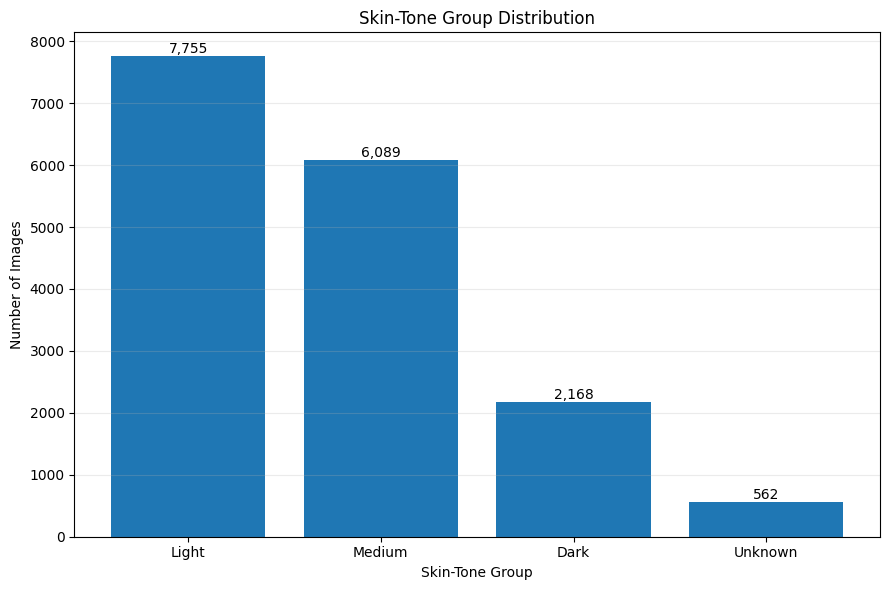

Saved: /content/skin-tone-fairness/outputs/figures/skin_tone_distribution_count.png


In [293]:
FIGURES_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "figures"
)

FIGURES_DIR.mkdir(
    parents=True,
    exist_ok=True
)

plt.figure(
    figsize=(9, 6)
)

bars = plt.bar(
    skin_tone_summary[
        "skin_tone_group"
    ],
    skin_tone_summary[
        "count"
    ]
)

plt.title(
    "Skin-Tone Group Distribution"
)

plt.xlabel(
    "Skin-Tone Group"
)

plt.ylabel(
    "Number of Images"
)

plt.grid(
    axis="y",
    alpha=0.25
)

# Add count labels
for bar, value in zip(
    bars,
    skin_tone_summary["count"]
):

    plt.text(
        bar.get_x()
        + bar.get_width() / 2,
        bar.get_height(),
        f"{int(value):,}",
        ha="center",
        va="bottom",
        fontsize=10
    )

plt.tight_layout()

SKIN_TONE_COUNT_FIG = (
    FIGURES_DIR
    / "skin_tone_distribution_count.png"
)

plt.savefig(
    SKIN_TONE_COUNT_FIG,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print(
    "Saved:",
    SKIN_TONE_COUNT_FIG
)

Cell 5 — Percentage Bar Chart

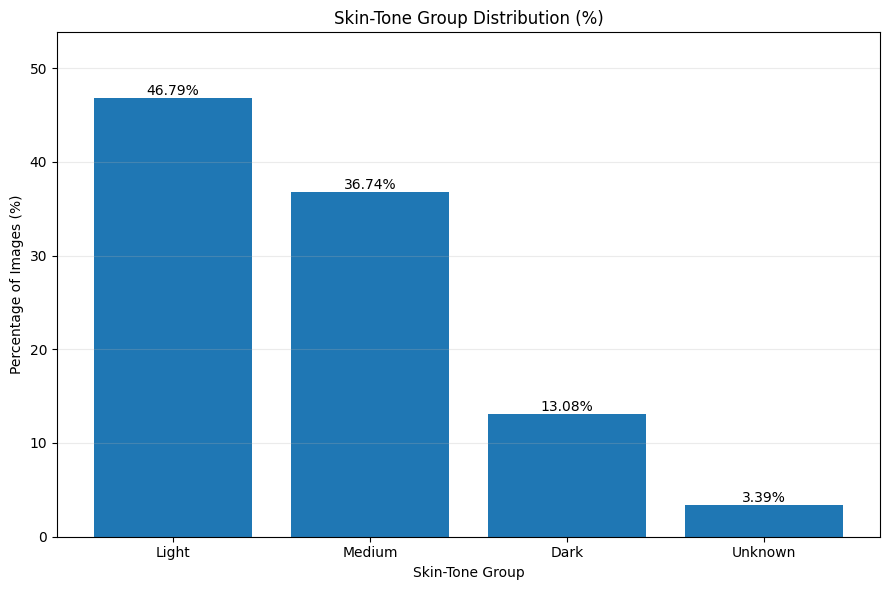

Saved: /content/skin-tone-fairness/outputs/figures/skin_tone_distribution_percentage.png


In [294]:
plt.figure(
    figsize=(9, 6)
)

bars = plt.bar(
    skin_tone_summary[
        "skin_tone_group"
    ],
    skin_tone_summary[
        "percentage"
    ]
)

plt.title(
    "Skin-Tone Group Distribution (%)"
)

plt.xlabel(
    "Skin-Tone Group"
)

plt.ylabel(
    "Percentage of Images (%)"
)

plt.ylim(
    0,
    max(
        skin_tone_summary[
            "percentage"
        ]
    ) * 1.15
)

plt.grid(
    axis="y",
    alpha=0.25
)

# Add percentage labels
for bar, value in zip(
    bars,
    skin_tone_summary["percentage"]
):

    plt.text(
        bar.get_x()
        + bar.get_width() / 2,
        bar.get_height(),
        f"{value:.2f}%",
        ha="center",
        va="bottom",
        fontsize=10
    )

plt.tight_layout()

SKIN_TONE_PERCENT_FIG = (
    FIGURES_DIR
    / "skin_tone_distribution_percentage.png"
)

plt.savefig(
    SKIN_TONE_PERCENT_FIG,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print(
    "Saved:",
    SKIN_TONE_PERCENT_FIG
)

Cell 6 — Save Summary Table

In [295]:
TABLES_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
)

TABLES_DIR.mkdir(
    parents=True,
    exist_ok=True
)

SKIN_TONE_SUMMARY_PATH = (
    TABLES_DIR
    / "skin_tone_distribution_summary.csv"
)

skin_tone_summary.to_csv(
    SKIN_TONE_SUMMARY_PATH,
    index=False
)

print("=" * 60)
print("SKIN-TONE SUMMARY SAVED")
print("=" * 60)

print(
    SKIN_TONE_SUMMARY_PATH
)

print(
    "File exists:",
    SKIN_TONE_SUMMARY_PATH.exists()
)

print("=" * 60)

SKIN-TONE SUMMARY SAVED
/content/skin-tone-fairness/outputs/tables/skin_tone_distribution_summary.csv
File exists: True


Cell 7 — Final Summary

In [296]:
figures_saved = (
    SKIN_TONE_COUNT_FIG.exists()
    and SKIN_TONE_PERCENT_FIG.exists()
)

table_saved = (
    SKIN_TONE_SUMMARY_PATH.exists()
)

phase_51_passed = (
    count_sum_valid
    and percentage_sum_valid
    and no_missing_groups
    and figures_saved
    and table_saved
)

print("=" * 60)
print("PHASE 5.1 — FINAL SUMMARY")
print("=" * 60)

print(
    "Total images:",
    total_samples
)

print(
    "Light:",
    f"{skin_tone_counts['Light']:,}",
    f"({skin_tone_percentages['Light']:.2f}%)"
)

print(
    "Medium:",
    f"{skin_tone_counts['Medium']:,}",
    f"({skin_tone_percentages['Medium']:.2f}%)"
)

print(
    "Dark:",
    f"{skin_tone_counts['Dark']:,}",
    f"({skin_tone_percentages['Dark']:.2f}%)"
)

print(
    "Unknown:",
    f"{skin_tone_counts['Unknown']:,}",
    f"({skin_tone_percentages['Unknown']:.2f}%)"
)

print(
    "\nCount validation:",
    count_sum_valid
)

print(
    "Percentage validation:",
    percentage_sum_valid
)

print(
    "Figures saved:",
    figures_saved
)

print(
    "Summary table saved:",
    table_saved
)

print(
    "\nPhase 5.1 status:",
    "PASS"
    if phase_51_passed
    else
    "FAIL"
)

print("=" * 60)

PHASE 5.1 — FINAL SUMMARY
Total images: 16574
Light: 7,755 (46.79%)
Medium: 6,089 (36.74%)
Dark: 2,168 (13.08%)
Unknown: 562 (3.39%)

Count validation: True
Percentage validation: True
Figures saved: True
Summary table saved: True

Phase 5.1 status: PASS


**Phase 5.2 — Disease Class Distribution Visualization**

Cell 1 — Load Metadata & Calculate Disease Distribution

In [297]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

print("=" * 60)
print("PHASE 5.2 — DISEASE CLASS DISTRIBUTION")
print("=" * 60)

# ------------------------------------------------------------
# Load prepared metadata
# ------------------------------------------------------------

PREPARED_METADATA_PATH = (
    PROJECT_ROOT
    / "data"
    / "fitzpatrick17k_prepared.csv"
)

metadata_df = pd.read_csv(
    PREPARED_METADATA_PATH
)

# ------------------------------------------------------------
# Disease distribution
# ------------------------------------------------------------

disease_counts = (
    metadata_df["label"]
    .value_counts()
    .sort_values(
        ascending=False
    )
)

disease_percentage = (
    disease_counts
    / len(metadata_df)
    * 100
)

disease_summary = pd.DataFrame({
    "label": disease_counts.index,
    "count": disease_counts.values,
    "percentage": disease_percentage.values
})

print(
    "Total images:",
    len(metadata_df)
)

print(
    "Number of disease classes:",
    disease_summary["label"].nunique()
)

print("\nTop 10 diseases:")

print(
    disease_summary
    .head(10)
    .to_string(index=False)
)

print("=" * 60)

PHASE 5.2 — DISEASE CLASS DISTRIBUTION
Total images: 16574
Number of disease classes: 114

Top 10 diseases:
                      label  count  percentage
                  psoriasis    653    3.939906
    squamous cell carcinoma    581    3.505491
              lichen planus    491    2.962471
       basal cell carcinoma    468    2.823700
allergic contact dermatitis    430    2.594425
        lupus erythematosus    410    2.473754
    neutrophilic dermatoses    359    2.166043
                sarcoidosis    349    2.105708
            photodermatoses    348    2.099674
               folliculitis    342    2.063473


Cell 2 — Disease Distribution Validation

In [298]:
total_disease_count = (
    disease_summary["count"].sum()
)

number_of_classes = (
    disease_summary["label"].nunique()
)

percentage_sum = (
    disease_summary["percentage"].sum()
)

count_valid = (
    total_disease_count
    == len(metadata_df)
)

class_count_valid = (
    number_of_classes
    == 114
)

percentage_valid = np.isclose(
    percentage_sum,
    100.0,
    atol=0.01
)

no_zero_classes = (
    disease_summary["count"] > 0
).all()

print("=" * 60)
print("DISEASE DISTRIBUTION VALIDATION")
print("=" * 60)

print(
    "Total disease counts:",
    total_disease_count
)

print(
    "Count validation:",
    count_valid
)

print(
    "Disease classes:",
    number_of_classes
)

print(
    "Expected classes:",
    114
)

print(
    "Class count validation:",
    class_count_valid
)

print(
    f"Percentage sum: {percentage_sum:.4f}%"
)

print(
    "Percentage validation:",
    percentage_valid
)

print(
    "Zero-count classes:",
    not no_zero_classes
)

print("=" * 60)

DISEASE DISTRIBUTION VALIDATION
Total disease counts: 16574
Count validation: True
Disease classes: 114
Expected classes: 114
Class count validation: True
Percentage sum: 100.0000%
Percentage validation: True
Zero-count classes: False


Cell 3 — Top 20 Disease Classes

In [299]:
TOP_N = 20

top_diseases = (
    disease_summary
    .head(TOP_N)
    .sort_values(
        by="count",
        ascending=True
    )
    .copy()
)

print("=" * 60)
print("TOP 20 DISEASE CLASSES")
print("=" * 60)

print(
    top_diseases[
        [
            "label",
            "count",
            "percentage"
        ]
    ]
    .sort_values(
        by="count",
        ascending=False
    )
    .to_string(
        index=False
    )
)

print("=" * 60)

TOP 20 DISEASE CLASSES
                      label  count  percentage
                  psoriasis    653    3.939906
    squamous cell carcinoma    581    3.505491
              lichen planus    491    2.962471
       basal cell carcinoma    468    2.823700
allergic contact dermatitis    430    2.594425
        lupus erythematosus    410    2.473754
    neutrophilic dermatoses    359    2.166043
                sarcoidosis    349    2.105708
            photodermatoses    348    2.099674
               folliculitis    342    2.063473
                    scabies    339    2.045372
              acne vulgaris    335    2.021238
                scleroderma    309    1.864366
   pityriasis rubra pilaris    278    1.677326
                   melanoma    261    1.574756
         nematode infection    260    1.568722
        erythema multiforme    236    1.423917
         granuloma annulare    211    1.273078
                     eczema    204    1.230843
              drug eruption    200   

Cell 4 — Plot Top 20 Diseases

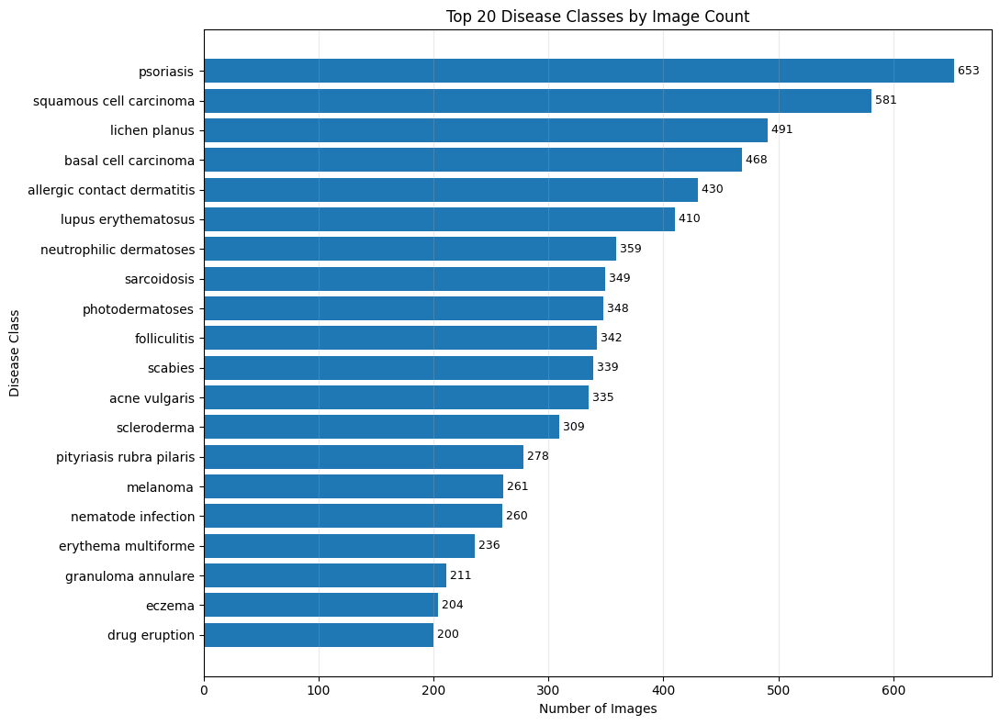

Saved: /content/skin-tone-fairness/outputs/figures/top_20_disease_distribution.png


In [300]:
FIGURES_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "figures"
)

FIGURES_DIR.mkdir(
    parents=True,
    exist_ok=True
)

plt.figure(
    figsize=(11, 8)
)

bars = plt.barh(
    top_diseases["label"],
    top_diseases["count"]
)

plt.title(
    "Top 20 Disease Classes by Image Count"
)

plt.xlabel(
    "Number of Images"
)

plt.ylabel(
    "Disease Class"
)

plt.grid(
    axis="x",
    alpha=0.25
)

# Add count labels
for bar, value in zip(
    bars,
    top_diseases["count"]
):

    plt.text(
        bar.get_width(),
        bar.get_y()
        + bar.get_height() / 2,
        f" {int(value):,}",
        va="center",
        fontsize=9
    )

plt.tight_layout()

TOP_DISEASE_FIG = (
    FIGURES_DIR
    / "top_20_disease_distribution.png"
)

plt.savefig(
    TOP_DISEASE_FIG,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print(
    "Saved:",
    TOP_DISEASE_FIG
)

Cell 5 — Bottom 20 Disease Classes

In [301]:
BOTTOM_N = 20

bottom_diseases = (
    disease_summary
    .tail(BOTTOM_N)
    .sort_values(
        by="count",
        ascending=True
    )
    .copy()
)

print("=" * 60)
print("BOTTOM 20 DISEASE CLASSES")
print("=" * 60)

print(
    bottom_diseases[
        [
            "label",
            "count",
            "percentage"
        ]
    ]
    .to_string(
        index=False
    )
)

print("=" * 60)

BOTTOM 20 DISEASE CLASSES
                                                label  count  percentage
                                        pilomatricoma     53    0.319778
                                            xanthomas     53    0.319778
                                   pustular psoriasis     53    0.319778
                           erythema elevatum diutinum     55    0.331845
                                           paronychia     59    0.355979
                                      port wine stain     59    0.355979
                   disseminated actinic porokeratosis     60    0.362013
                                   livedo reticularis     60    0.362013
                        langerhans cell histiocytosis     60    0.362013
                                  perioral dermatitis     61    0.368046
                     basal cell carcinoma morpheiform     62    0.374080
                                      behcets disease     63    0.380113
                         

Cell 6 — Plot Bottom 20 Diseases

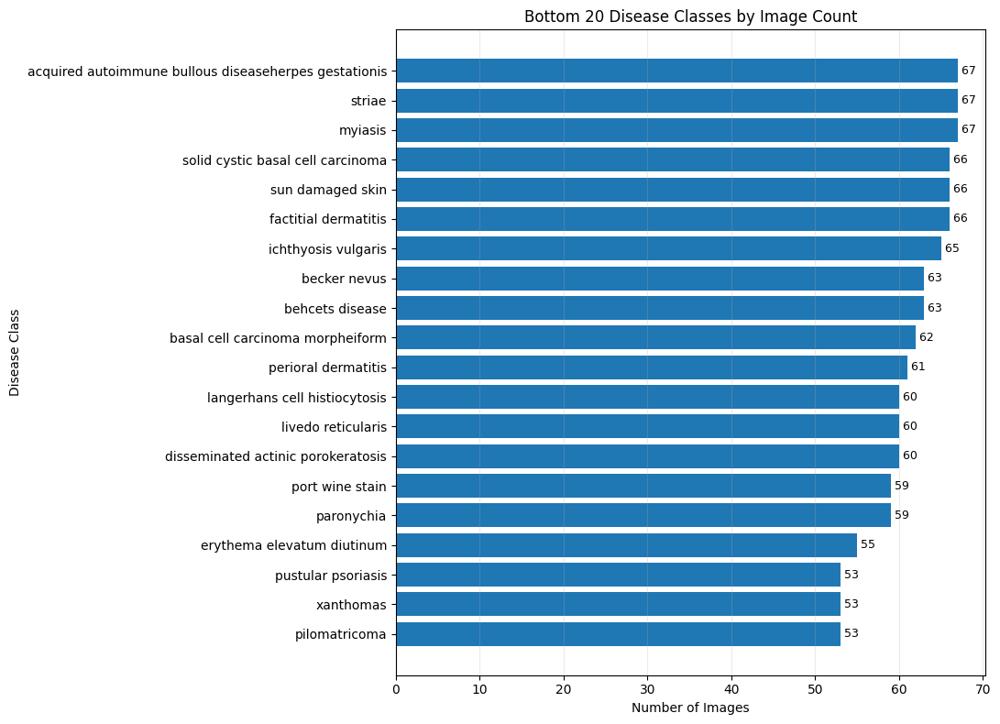

Saved: /content/skin-tone-fairness/outputs/figures/bottom_20_disease_distribution.png


In [302]:
plt.figure(
    figsize=(11, 8)
)

bars = plt.barh(
    bottom_diseases["label"],
    bottom_diseases["count"]
)

plt.title(
    "Bottom 20 Disease Classes by Image Count"
)

plt.xlabel(
    "Number of Images"
)

plt.ylabel(
    "Disease Class"
)

plt.grid(
    axis="x",
    alpha=0.25
)

for bar, value in zip(
    bars,
    bottom_diseases["count"]
):

    plt.text(
        bar.get_width(),
        bar.get_y()
        + bar.get_height() / 2,
        f" {int(value):,}",
        va="center",
        fontsize=9
    )

plt.tight_layout()

BOTTOM_DISEASE_FIG = (
    FIGURES_DIR
    / "bottom_20_disease_distribution.png"
)

plt.savefig(
    BOTTOM_DISEASE_FIG,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print(
    "Saved:",
    BOTTOM_DISEASE_FIG
)

Cell 7 — Full 114-Class Distribution

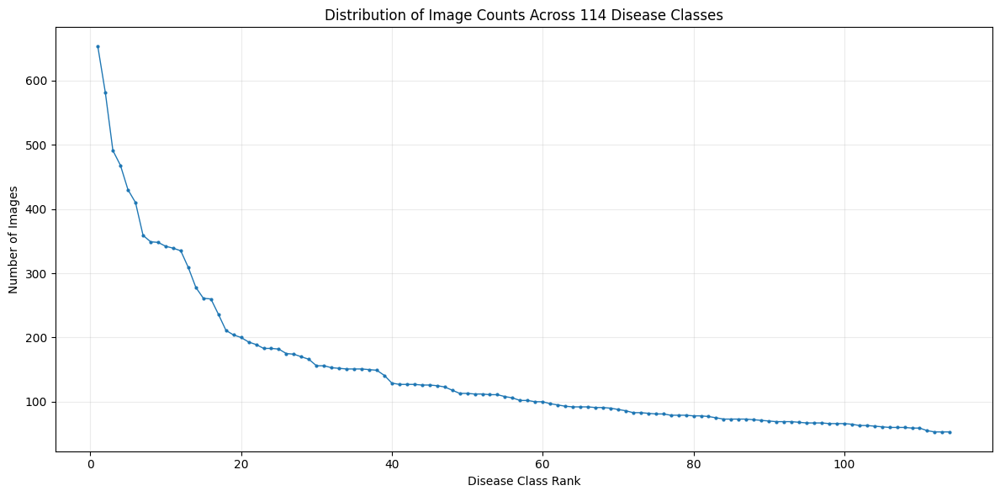

Saved: /content/skin-tone-fairness/outputs/figures/full_114_disease_distribution.png


In [303]:
full_disease = (
    disease_summary
    .sort_values(
        by="count",
        ascending=False
    )
    .reset_index(
        drop=True
    )
)

full_disease["class_rank"] = (
    np.arange(
        1,
        len(full_disease) + 1
    )
)

plt.figure(
    figsize=(12, 6)
)

plt.plot(
    full_disease["class_rank"],
    full_disease["count"],
    marker="o",
    markersize=2,
    linewidth=1
)

plt.title(
    "Distribution of Image Counts Across 114 Disease Classes"
)

plt.xlabel(
    "Disease Class Rank"
)

plt.ylabel(
    "Number of Images"
)

plt.grid(
    alpha=0.25
)

plt.tight_layout()

FULL_DISEASE_FIG = (
    FIGURES_DIR
    / "full_114_disease_distribution.png"
)

plt.savefig(
    FULL_DISEASE_FIG,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print(
    "Saved:",
    FULL_DISEASE_FIG
)

Cell 8 — Class Imbalance Statistics

In [304]:
max_count = (
    disease_summary["count"].max()
)

min_count = (
    disease_summary["count"].min()
)

mean_count = (
    disease_summary["count"].mean()
)

median_count = (
    disease_summary["count"].median()
)

std_count = (
    disease_summary["count"].std()
)

imbalance_ratio = (
    max_count / min_count
    if min_count > 0
    else np.inf
)

classes_below_10 = (
    disease_summary["count"] < 10
).sum()

classes_below_20 = (
    disease_summary["count"] < 20
).sum()

classes_below_50 = (
    disease_summary["count"] < 50
).sum()

print("=" * 60)
print("DISEASE CLASS IMBALANCE ANALYSIS")
print("=" * 60)

print(
    f"Maximum class size : {max_count}"
)

print(
    f"Minimum class size : {min_count}"
)

print(
    f"Mean class size    : {mean_count:.2f}"
)

print(
    f"Median class size  : {median_count:.2f}"
)

print(
    f"Std class size     : {std_count:.2f}"
)

print(
    f"Max/Min ratio      : {imbalance_ratio:.2f}"
)

print(
    f"Classes < 10       : {classes_below_10}"
)

print(
    f"Classes < 20       : {classes_below_20}"
)

print(
    f"Classes < 50       : {classes_below_50}"
)

print("=" * 60)

DISEASE CLASS IMBALANCE ANALYSIS
Maximum class size : 653
Minimum class size : 53
Mean class size    : 145.39
Median class size  : 102.00
Std class size     : 114.13
Max/Min ratio      : 12.32
Classes < 10       : 0
Classes < 20       : 0
Classes < 50       : 0


Cell 9 — Save Complete Disease Distribution

In [305]:
TABLES_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
)

TABLES_DIR.mkdir(
    parents=True,
    exist_ok=True
)

DISEASE_DISTRIBUTION_PATH = (
    TABLES_DIR
    / "disease_class_distribution_summary.csv"
)

disease_summary.to_csv(
    DISEASE_DISTRIBUTION_PATH,
    index=False
)

print("=" * 60)
print("DISEASE DISTRIBUTION TABLE SAVED")
print("=" * 60)

print(
    DISEASE_DISTRIBUTION_PATH
)

print(
    "File exists:",
    DISEASE_DISTRIBUTION_PATH.exists()
)

print("=" * 60)

DISEASE DISTRIBUTION TABLE SAVED
/content/skin-tone-fairness/outputs/tables/disease_class_distribution_summary.csv
File exists: True


Cell 10 — Save Imbalance Analysis

In [306]:
imbalance_summary = pd.DataFrame([
    {
        "metric": "total_images",
        "value": len(metadata_df)
    },
    {
        "metric": "disease_classes",
        "value": number_of_classes
    },
    {
        "metric": "maximum_class_size",
        "value": max_count
    },
    {
        "metric": "minimum_class_size",
        "value": min_count
    },
    {
        "metric": "mean_class_size",
        "value": mean_count
    },
    {
        "metric": "median_class_size",
        "value": median_count
    },
    {
        "metric": "std_class_size",
        "value": std_count
    },
    {
        "metric": "max_min_ratio",
        "value": imbalance_ratio
    },
    {
        "metric": "classes_below_10",
        "value": classes_below_10
    },
    {
        "metric": "classes_below_20",
        "value": classes_below_20
    },
    {
        "metric": "classes_below_50",
        "value": classes_below_50
    }
])

IMBALANCE_SUMMARY_PATH = (
    TABLES_DIR
    / "disease_class_imbalance_summary.csv"
)

imbalance_summary.to_csv(
    IMBALANCE_SUMMARY_PATH,
    index=False
)

print(
    "Saved:",
    IMBALANCE_SUMMARY_PATH
)

print(
    "File exists:",
    IMBALANCE_SUMMARY_PATH.exists()
)

Saved: /content/skin-tone-fairness/outputs/tables/disease_class_imbalance_summary.csv
File exists: True


Cell 11 — Final Summary

In [307]:
figures_saved = (
    TOP_DISEASE_FIG.exists()
    and BOTTOM_DISEASE_FIG.exists()
    and FULL_DISEASE_FIG.exists()
)

tables_saved = (
    DISEASE_DISTRIBUTION_PATH.exists()
    and IMBALANCE_SUMMARY_PATH.exists()
)

phase_52_passed = (
    count_valid
    and class_count_valid
    and percentage_valid
    and no_zero_classes
    and figures_saved
    and tables_saved
)

print("=" * 60)
print("PHASE 5.2 — FINAL SUMMARY")
print("=" * 60)

print(
    "Total images:",
    len(metadata_df)
)

print(
    "Disease classes:",
    number_of_classes
)

print(
    "Largest class:",
    disease_summary.iloc[0]["label"],
    "| N=",
    int(disease_summary.iloc[0]["count"])
)

print(
    "Smallest class:",
    disease_summary.iloc[-1]["label"],
    "| N=",
    int(disease_summary.iloc[-1]["count"])
)

print(
    f"Class imbalance ratio:"
    f" {imbalance_ratio:.2f}"
)

print(
    "Classes < 10:",
    classes_below_10
)

print(
    "Classes < 20:",
    classes_below_20
)

print(
    "Classes < 50:",
    classes_below_50
)

print(
    "\nDistribution validation:",
    count_valid
    and class_count_valid
    and percentage_valid
)

print(
    "Figures saved:",
    figures_saved
)

print(
    "Tables saved:",
    tables_saved
)

print(
    "\nPhase 5.2 status:",
    "PASS"
    if phase_52_passed
    else
    "FAIL"
)

print("=" * 60)

PHASE 5.2 — FINAL SUMMARY
Total images: 16574
Disease classes: 114
Largest class: psoriasis | N= 653
Smallest class: xanthomas | N= 53
Class imbalance ratio: 12.32
Classes < 10: 0
Classes < 20: 0
Classes < 50: 0

Distribution validation: True
Figures saved: True
Tables saved: True

Phase 5.2 status: PASS


**Phase 5.3 — Train/Validation/Test Distribution Visualization**

Cell 1 — Load Final Splits

In [308]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

print("=" * 60)
print("PHASE 5.3 — TRAIN / VALIDATION / TEST DISTRIBUTION")
print("=" * 60)

TRAIN_PATH = (
    PROJECT_ROOT
    / "data"
    / "splits"
    / "train.csv"
)

VAL_PATH = (
    PROJECT_ROOT
    / "data"
    / "splits"
    / "validation.csv"
)

TEST_PATH = (
    PROJECT_ROOT
    / "data"
    / "splits"
    / "test.csv"
)

train_df = pd.read_csv(TRAIN_PATH)
val_df = pd.read_csv(VAL_PATH)
test_df = pd.read_csv(TEST_PATH)

print("Train shape      :", train_df.shape)
print("Validation shape :", val_df.shape)
print("Test shape       :", test_df.shape)

print("=" * 60)

PHASE 5.3 — TRAIN / VALIDATION / TEST DISTRIBUTION
Train shape      : (11607, 13)
Validation shape : (2513, 13)
Test shape       : (2454, 13)


Cell 2 — Calculate Split Sizes

In [309]:
split_names = [
    "Train",
    "Validation",
    "Test"
]

split_counts = [
    len(train_df),
    len(val_df),
    len(test_df)
]

total_samples = sum(
    split_counts
)

split_percentages = [
    count / total_samples * 100
    for count in split_counts
]

split_summary = pd.DataFrame({
    "split": split_names,
    "count": split_counts,
    "percentage": split_percentages
})

print("=" * 60)
print("DATASET SPLIT DISTRIBUTION")
print("=" * 60)

print(
    split_summary.to_string(
        index=False
    )
)

print(
    "\nTotal:",
    total_samples
)

print("=" * 60)

DATASET SPLIT DISTRIBUTION
     split  count  percentage
     Train  11607   70.031374
Validation   2513   15.162302
      Test   2454   14.806323

Total: 16574


Cell 3 — Validate Split Sizes

In [310]:
EXPECTED_TOTAL = 16574

total_count_valid = (
    total_samples
    == EXPECTED_TOTAL
)

split_percentage_valid = np.isclose(
    sum(split_percentages),
    100.0,
    atol=0.01
)

expected_train = 11607
expected_val = 2513
expected_test = 2454

exact_sizes_valid = (
    len(train_df) == expected_train
    and
    len(val_df) == expected_val
    and
    len(test_df) == expected_test
)

print("=" * 60)
print("SPLIT VALIDATION")
print("=" * 60)

print(
    "Total count valid:",
    total_count_valid
)

print(
    "Expected total:",
    EXPECTED_TOTAL
)

print(
    "Exact split sizes valid:",
    exact_sizes_valid
)

print(
    "Percentage sum valid:",
    split_percentage_valid
)

print("=" * 60)

SPLIT VALIDATION
Total count valid: True
Expected total: 16574
Exact split sizes valid: True
Percentage sum valid: True


Cell 4 — Dataset Size Bar Chart

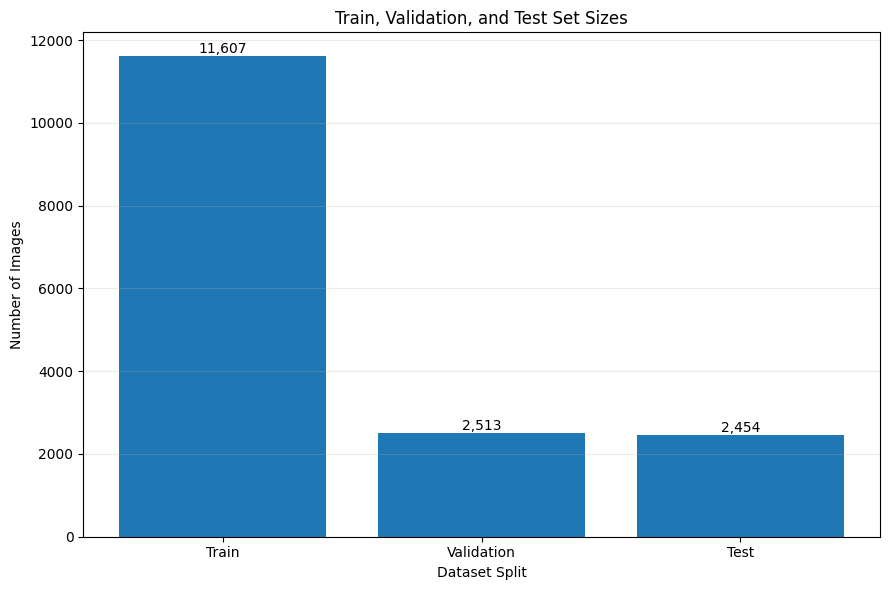

Saved: /content/skin-tone-fairness/outputs/figures/dataset_split_sizes.png


In [311]:
FIGURES_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "figures"
)

FIGURES_DIR.mkdir(
    parents=True,
    exist_ok=True
)

plt.figure(
    figsize=(9, 6)
)

bars = plt.bar(
    split_summary["split"],
    split_summary["count"]
)

plt.title(
    "Train, Validation, and Test Set Sizes"
)

plt.xlabel(
    "Dataset Split"
)

plt.ylabel(
    "Number of Images"
)

plt.grid(
    axis="y",
    alpha=0.25
)

for bar, value in zip(
    bars,
    split_summary["count"]
):

    plt.text(
        bar.get_x()
        + bar.get_width() / 2,
        bar.get_height(),
        f"{int(value):,}",
        ha="center",
        va="bottom"
    )

plt.tight_layout()

SPLIT_SIZE_FIG = (
    FIGURES_DIR
    / "dataset_split_sizes.png"
)

plt.savefig(
    SPLIT_SIZE_FIG,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print(
    "Saved:",
    SPLIT_SIZE_FIG
)

Cell 5 — Skin-Tone Distribution Across Splits

In [312]:
skin_tone_order = [
    "Light",
    "Medium",
    "Dark",
    "Unknown"
]

skin_tone_split_counts = pd.DataFrame(
    {
        "Train": train_df[
            "skin_tone_group"
        ].value_counts(),

        "Validation": val_df[
            "skin_tone_group"
        ].value_counts(),

        "Test": test_df[
            "skin_tone_group"
        ].value_counts()
    }
)

skin_tone_split_counts = (
    skin_tone_split_counts
    .reindex(
        skin_tone_order,
        fill_value=0
    )
)

print("=" * 60)
print("SKIN-TONE DISTRIBUTION ACROSS SPLITS")
print("=" * 60)

print(
    skin_tone_split_counts
)

print("=" * 60)

SKIN-TONE DISTRIBUTION ACROSS SPLITS
                 Train  Validation  Test
skin_tone_group                         
Light             5425        1169  1161
Medium            4262         912   915
Dark              1525         330   313
Unknown            395         102    65


Cell 6 — Skin-Tone Percentage Across Splits

In [313]:
skin_tone_split_percent = (
    skin_tone_split_counts
    .div(
        skin_tone_split_counts.sum(
            axis=0
        ),
        axis=1
    )
    * 100
)

print("=" * 60)
print("SKIN-TONE PERCENTAGES ACROSS SPLITS")
print("=" * 60)

print(
    skin_tone_split_percent.round(
        2
    )
)

print("=" * 60)

SKIN-TONE PERCENTAGES ACROSS SPLITS
                 Train  Validation   Test
skin_tone_group                          
Light            46.74       46.52  47.31
Medium           36.72       36.29  37.29
Dark             13.14       13.13  12.75
Unknown           3.40        4.06   2.65


Cell 7 — Stacked Skin-Tone Distribution Figure

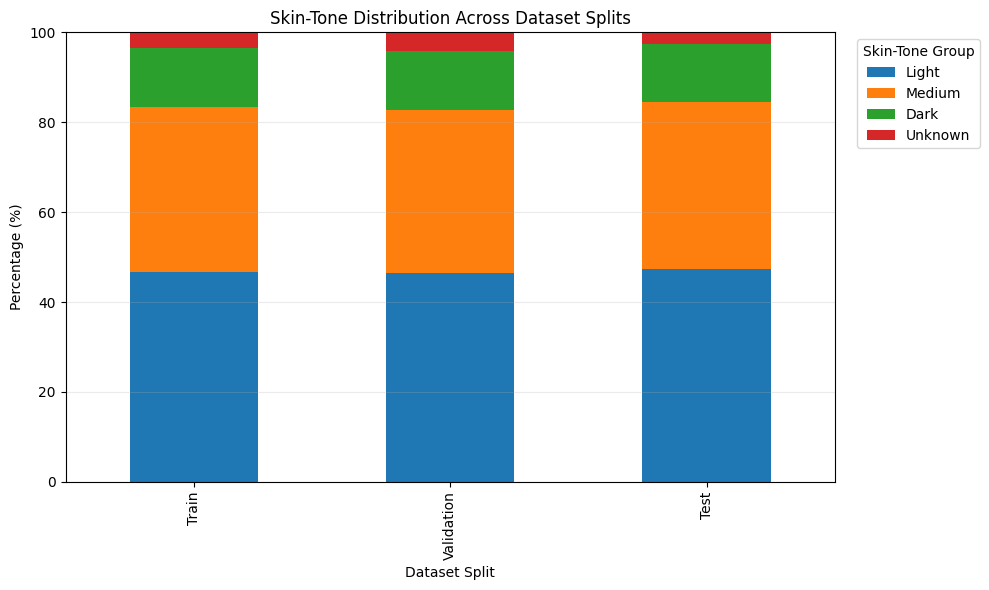

Saved: /content/skin-tone-fairness/outputs/figures/skin_tone_distribution_across_splits.png


In [314]:
plot_df = (
    skin_tone_split_percent
    .T
)

ax = plot_df.plot(
    kind="bar",
    stacked=True,
    figsize=(10, 6)
)

plt.title(
    "Skin-Tone Distribution Across Dataset Splits"
)

plt.xlabel(
    "Dataset Split"
)

plt.ylabel(
    "Percentage (%)"
)

plt.ylim(
    0,
    100
)

plt.legend(
    title="Skin-Tone Group",
    bbox_to_anchor=(1.02, 1),
    loc="upper left"
)

plt.grid(
    axis="y",
    alpha=0.25
)

plt.tight_layout()

SKIN_TONE_SPLIT_FIG = (
    FIGURES_DIR
    / "skin_tone_distribution_across_splits.png"
)

plt.savefig(
    SKIN_TONE_SPLIT_FIG,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print(
    "Saved:",
    SKIN_TONE_SPLIT_FIG
)

Cell 8 — Disease Distribution Across Splits

In [315]:
overall_disease_counts = (
    pd.concat(
        [
            train_df["label"],
            val_df["label"],
            test_df["label"]
        ]
    )
    .value_counts()
)

top_disease_labels = (
    overall_disease_counts
    .head(10)
    .index
    .tolist()
)

disease_split_counts = pd.DataFrame(
    {
        "Train": train_df[
            "label"
        ].value_counts(),

        "Validation": val_df[
            "label"
        ].value_counts(),

        "Test": test_df[
            "label"
        ].value_counts()
    }
)

disease_split_counts = (
    disease_split_counts
    .reindex(
        top_disease_labels,
        fill_value=0
    )
)

print("=" * 60)
print("TOP 10 DISEASE DISTRIBUTION ACROSS SPLITS")
print("=" * 60)

print(
    disease_split_counts
)

print("=" * 60)

TOP 10 DISEASE DISTRIBUTION ACROSS SPLITS
                             Train  Validation  Test
label                                               
psoriasis                      456          98    99
squamous cell carcinoma        406          87    88
lichen planus                  343          74    74
basal cell carcinoma           329          69    70
allergic contact dermatitis    301          65    64
lupus erythematosus            287          61    62
neutrophilic dermatoses        250          54    55
sarcoidosis                    244          54    51
photodermatoses                244          53    51
folliculitis                   239          52    51


Cell 9 — Disease Percentage Across Splits

In [316]:
disease_split_percent = (
    disease_split_counts
    .div(
        [
            len(train_df),
            len(val_df),
            len(test_df)
        ],
        axis=1
    )
    * 100
)

print("=" * 60)
print("TOP 10 DISEASE PERCENTAGES ACROSS SPLITS")
print("=" * 60)

print(
    disease_split_percent.round(
        3
    )
)

print("=" * 60)

TOP 10 DISEASE PERCENTAGES ACROSS SPLITS
                             Train  Validation   Test
label                                                
psoriasis                    3.929       3.900  4.034
squamous cell carcinoma      3.498       3.462  3.586
lichen planus                2.955       2.945  3.015
basal cell carcinoma         2.834       2.746  2.852
allergic contact dermatitis  2.593       2.587  2.608
lupus erythematosus          2.473       2.427  2.526
neutrophilic dermatoses      2.154       2.149  2.241
sarcoidosis                  2.102       2.149  2.078
photodermatoses              2.102       2.109  2.078
folliculitis                 2.059       2.069  2.078


Cell 10 — Disease Comparison Figure

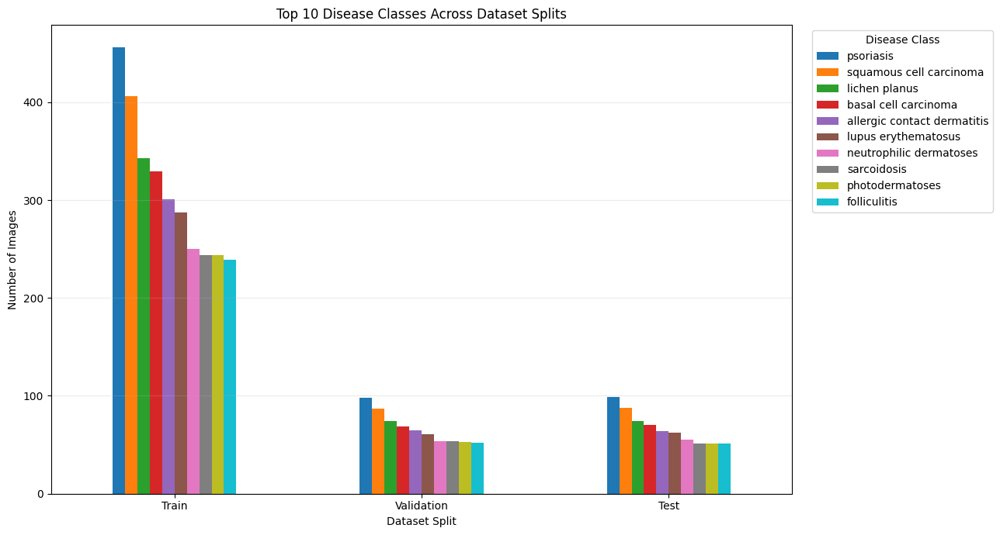

Saved: /content/skin-tone-fairness/outputs/figures/top_10_disease_distribution_across_splits.png


In [317]:
plot_disease_df = (
    disease_split_counts
    .T
)

ax = plot_disease_df.plot(
    kind="bar",
    figsize=(13, 7)
)

plt.title(
    "Top 10 Disease Classes Across Dataset Splits"
)

plt.xlabel(
    "Dataset Split"
)

plt.ylabel(
    "Number of Images"
)

plt.xticks(
    rotation=0
)

plt.legend(
    title="Disease Class",
    bbox_to_anchor=(1.02, 1),
    loc="upper left"
)

plt.grid(
    axis="y",
    alpha=0.25
)

plt.tight_layout()

DISEASE_SPLIT_FIG = (
    FIGURES_DIR
    / "top_10_disease_distribution_across_splits.png"
)

plt.savefig(
    DISEASE_SPLIT_FIG,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print(
    "Saved:",
    DISEASE_SPLIT_FIG
)

Cell 11 — Quantitative Split Consistency Check

In [318]:
skin_tone_consistency = pd.DataFrame(
    {
        "skin_tone_group":
            skin_tone_order,

        "train_percentage":
            skin_tone_split_percent[
                "Train"
            ].values,

        "validation_percentage":
            skin_tone_split_percent[
                "Validation"
            ].values,

        "test_percentage":
            skin_tone_split_percent[
                "Test"
            ].values
    }
)

skin_tone_consistency[
    "max_difference_pp"
] = (
    skin_tone_consistency[
        [
            "train_percentage",
            "validation_percentage",
            "test_percentage"
        ]
    ].max(axis=1)
    -
    skin_tone_consistency[
        [
            "train_percentage",
            "validation_percentage",
            "test_percentage"
        ]
    ].min(axis=1)
)

print("=" * 60)
print("SKIN-TONE SPLIT CONSISTENCY")
print("=" * 60)

print(
    skin_tone_consistency.round(
        3
    ).to_string(
        index=False
    )
)

print("=" * 60)

SKIN-TONE SPLIT CONSISTENCY
skin_tone_group  train_percentage  validation_percentage  test_percentage  max_difference_pp
          Light            46.739                 46.518           47.311              0.792
         Medium            36.719                 36.291           37.286              0.995
           Dark            13.139                 13.132           12.755              0.384
        Unknown             3.403                  4.059            2.649              1.410


Cell 12 — Save Split Analysis Tables

In [319]:
TABLES_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
)

TABLES_DIR.mkdir(
    parents=True,
    exist_ok=True
)

SPLIT_SUMMARY_PATH = (
    TABLES_DIR
    / "dataset_split_summary.csv"
)

SKIN_TONE_SPLIT_PATH = (
    TABLES_DIR
    / "skin_tone_split_distribution.csv"
)

DISEASE_SPLIT_PATH = (
    TABLES_DIR
    / "top_10_disease_split_distribution.csv"
)

SKIN_TONE_CONSISTENCY_PATH = (
    TABLES_DIR
    / "skin_tone_split_consistency.csv"
)

split_summary.to_csv(
    SPLIT_SUMMARY_PATH,
    index=False
)

skin_tone_split_counts.to_csv(
    SKIN_TONE_SPLIT_PATH
)

disease_split_counts.to_csv(
    DISEASE_SPLIT_PATH
)

skin_tone_consistency.to_csv(
    SKIN_TONE_CONSISTENCY_PATH,
    index=False
)

print("=" * 60)
print("SPLIT ANALYSIS TABLES SAVED")
print("=" * 60)

for path in [
    SPLIT_SUMMARY_PATH,
    SKIN_TONE_SPLIT_PATH,
    DISEASE_SPLIT_PATH,
    SKIN_TONE_CONSISTENCY_PATH
]:

    print(
        f"{path.name}:",
        path.exists()
    )

print("=" * 60)

SPLIT ANALYSIS TABLES SAVED
dataset_split_summary.csv: True
skin_tone_split_distribution.csv: True
top_10_disease_split_distribution.csv: True
skin_tone_split_consistency.csv: True


Cell 13 — Final Summary

In [320]:
figures_saved = (
    SPLIT_SIZE_FIG.exists()
    and SKIN_TONE_SPLIT_FIG.exists()
    and DISEASE_SPLIT_FIG.exists()
)

tables_saved = (
    SPLIT_SUMMARY_PATH.exists()
    and SKIN_TONE_SPLIT_PATH.exists()
    and DISEASE_SPLIT_PATH.exists()
    and SKIN_TONE_CONSISTENCY_PATH.exists()
)

max_skin_tone_difference = (
    skin_tone_consistency[
        "max_difference_pp"
    ].max()
)

split_consistency_valid = (
    max_skin_tone_difference < 2.0
)

phase_53_passed = (
    total_count_valid
    and exact_sizes_valid
    and split_percentage_valid
    and figures_saved
    and tables_saved
)

print("=" * 60)
print("PHASE 5.3 — FINAL SUMMARY")
print("=" * 60)

print(
    "Total samples:",
    total_samples
)

print(
    "Train:",
    len(train_df),
    f"({len(train_df)/total_samples*100:.2f}%)"
)

print(
    "Validation:",
    len(val_df),
    f"({len(val_df)/total_samples*100:.2f}%)"
)

print(
    "Test:",
    len(test_df),
    f"({len(test_df)/total_samples*100:.2f}%)"
)

print(
    "\nExact split sizes valid:",
    exact_sizes_valid
)

print(
    "Maximum skin-tone distribution difference:",
    f"{max_skin_tone_difference:.2f} pp"
)

print(
    "Skin-tone split consistency (<2 pp):",
    split_consistency_valid
)

print(
    "Figures saved:",
    figures_saved
)

print(
    "Tables saved:",
    tables_saved
)

print(
    "\nPhase 5.3 status:",
    "PASS"
    if phase_53_passed
    else
    "FAIL"
)

print("=" * 60)

PHASE 5.3 — FINAL SUMMARY
Total samples: 16574
Train: 11607 (70.03%)
Validation: 2513 (15.16%)
Test: 2454 (14.81%)

Exact split sizes valid: True
Maximum skin-tone distribution difference: 1.41 pp
Skin-tone split consistency (<2 pp): True
Figures saved: True
Tables saved: True

Phase 5.3 status: PASS


**Phase 5.4 — Training & Validation Learning Curves**

Cell 1 — Load Training History

In [321]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

print("=" * 60)
print("PHASE 5.4 — LEARNING CURVES")
print("=" * 60)

# ------------------------------------------------------------
# Locate training history
# ------------------------------------------------------------

HISTORY_PATH = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
    / "baseline_training_summary.csv"
)

history_df = pd.read_csv(
    HISTORY_PATH
)

print("History path:")
print(HISTORY_PATH)

print("\nHistory shape:")
print(history_df.shape)

print("\nHistory columns:")
print(history_df.columns.tolist())

print("\nTraining history:")
print(
    history_df.to_string(
        index=False
    )
)

print("=" * 60)

PHASE 5.4 — LEARNING CURVES
History path:
/content/skin-tone-fairness/outputs/tables/baseline_training_summary.csv

History shape:
(14, 2)

History columns:
['Metric', 'Value']

Training history:
                        Metric               Value
                         Model     EfficientNet-B0
             Number of Classes                 114
               Training Epochs                  10
                    Batch Size                  32
         Initial Learning Rate              0.0001
           Final Training Loss  1.3207422100348385
       Final Training Accuracy  0.6804514517101748
         Final Validation Loss  2.5520922554189163
     Final Validation Accuracy  0.4337445284520493
          Best Validation Loss  2.5520922554189163
    Best Validation Loss Epoch                  10
      Best Validation Accuracy  0.4337445284520493
Best Validation Accuracy Epoch                  10
                  Accuracy Gap 0.24670692325812554


Cell 2 — Validate Training History

In [322]:
required_columns = [
    "epoch",
    "train_loss",
    "train_accuracy",
    "val_loss",
    "val_accuracy",
    "learning_rate"
]

# Correct path for training history, as saved in Phase 3.5 Cell 9.
# The previous cell loaded baseline_training_summary.csv which has a different structure.
HISTORY_PATH_CORRECTED = (
    PROJECT_ROOT
    / "outputs"
    / "metrics"
    / "baseline_training_history.csv"
)

history_df = pd.read_csv(
    HISTORY_PATH_CORRECTED
)

columns_valid = all(
    column in history_df.columns
    for column in required_columns
)

expected_epochs = 10

epoch_count_valid = (
    len(history_df)
    == expected_epochs
)

epoch_sequence_valid = (
    history_df["epoch"].tolist()
    == list(
        range(
            1,
            expected_epochs + 1
        )
    )
)

numeric_columns = [
    "train_loss",
    "train_accuracy",
    "val_loss",
    "val_accuracy",
    "learning_rate"
]

finite_values_valid = all(
    np.isfinite(
        history_df[column]
    ).all()
    for column in numeric_columns
)

accuracy_range_valid = (
    (
        history_df["train_accuracy"]
        .between(0, 1)
    ).all()
    and
    (
        history_df["val_accuracy"]
        .between(0, 1)
    ).all()
)

loss_positive_valid = (
    (
        history_df["train_loss"]
        >= 0
    ).all()
    and
    (
        history_df["val_loss"]
        >= 0
    ).all()
)

print("=" * 60)
print("TRAINING HISTORY VALIDATION")
print("=" * 60)

print(
    "Required columns valid:",
    columns_valid
)

print(
    "Expected epochs:",
    expected_epochs
)

print(
    "Epoch count valid:",
    epoch_count_valid
)

print(
    "Epoch sequence valid:",
    epoch_sequence_valid
)

print(
    "All numeric values finite:",
    finite_values_valid
)

print(
    "Accuracy range valid:",
    accuracy_range_valid
)

print(
    "Loss values valid:",
    loss_positive_valid
)

print("=" * 60)

TRAINING HISTORY VALIDATION
Required columns valid: True
Expected epochs: 10
Epoch count valid: True
Epoch sequence valid: True
All numeric values finite: True
Accuracy range valid: True
Loss values valid: True


Cell 3 — Prepare Figure Directory

In [323]:
FIGURES_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "figures"
)

FIGURES_DIR.mkdir(
    parents=True,
    exist_ok=True
)

print(
    "Figure directory:",
    FIGURES_DIR
)

print(
    "Directory exists:",
    FIGURES_DIR.exists()
)

Figure directory: /content/skin-tone-fairness/outputs/figures
Directory exists: True


Cell 4 — Training vs Validation Loss Curve

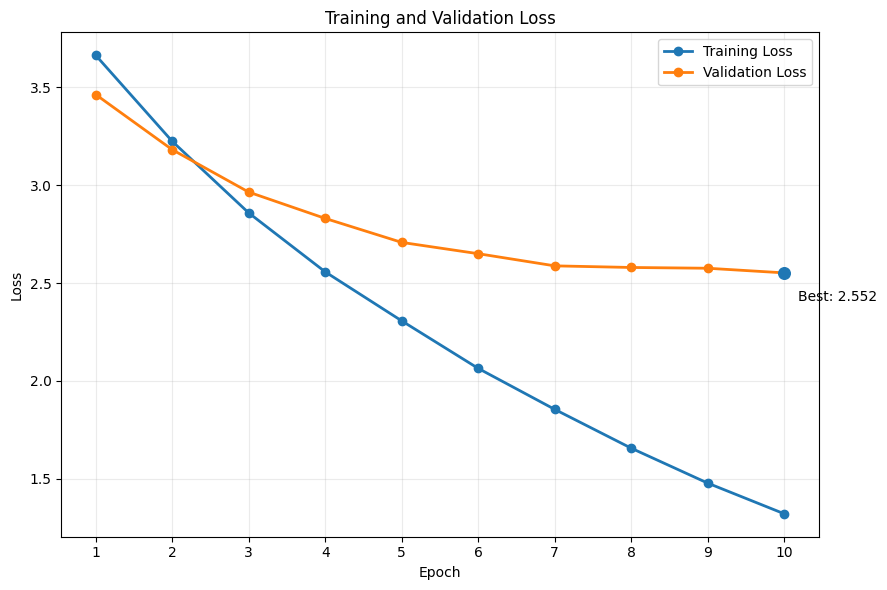

Best validation-loss epoch: 10
Best validation loss: 2.5521
Saved: /content/skin-tone-fairness/outputs/figures/baseline_training_validation_loss.png


In [324]:
plt.figure(
    figsize=(9, 6)
)

plt.plot(
    history_df["epoch"],
    history_df["train_loss"],
    marker="o",
    linewidth=2,
    label="Training Loss"
)

plt.plot(
    history_df["epoch"],
    history_df["val_loss"],
    marker="o",
    linewidth=2,
    label="Validation Loss"
)

# Mark best validation-loss epoch
best_loss_idx = (
    history_df["val_loss"]
    .idxmin()
)

best_loss_epoch = int(
    history_df.loc[
        best_loss_idx,
        "epoch"
    ]
)

best_loss_value = (
    history_df.loc[
        best_loss_idx,
        "val_loss"
    ]
)

plt.scatter(
    best_loss_epoch,
    best_loss_value,
    s=70,
    zorder=5
)

plt.annotate(
    f"Best: {best_loss_value:.3f}",
    (
        best_loss_epoch,
        best_loss_value
    ),
    xytext=(10, -20),
    textcoords="offset points"
)

plt.title(
    "Training and Validation Loss"
)

plt.xlabel(
    "Epoch"
)

plt.ylabel(
    "Loss"
)

plt.xticks(
    history_df["epoch"]
)

plt.grid(
    alpha=0.25
)

plt.legend()

plt.tight_layout()

LOSS_CURVE_FIG = (
    FIGURES_DIR
    / "baseline_training_validation_loss.png"
)

plt.savefig(
    LOSS_CURVE_FIG,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print(
    "Best validation-loss epoch:",
    best_loss_epoch
)

print(
    f"Best validation loss: "
    f"{best_loss_value:.4f}"
)

print(
    "Saved:",
    LOSS_CURVE_FIG
)

Cell 5 — Training vs Validation Accuracy Curve

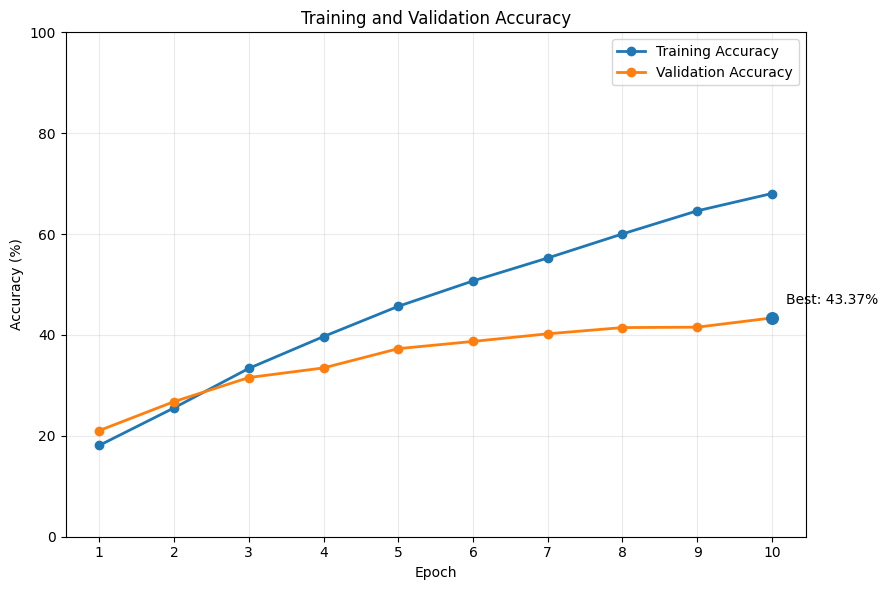

Best validation-accuracy epoch: 10
Best validation accuracy: 43.37%
Saved: /content/skin-tone-fairness/outputs/figures/baseline_training_validation_accuracy.png


In [325]:
plt.figure(
    figsize=(9, 6)
)

train_accuracy_percent = (
    history_df["train_accuracy"]
    * 100
)

val_accuracy_percent = (
    history_df["val_accuracy"]
    * 100
)

plt.plot(
    history_df["epoch"],
    train_accuracy_percent,
    marker="o",
    linewidth=2,
    label="Training Accuracy"
)

plt.plot(
    history_df["epoch"],
    val_accuracy_percent,
    marker="o",
    linewidth=2,
    label="Validation Accuracy"
)

# Mark best validation-accuracy epoch
best_accuracy_idx = (
    history_df["val_accuracy"]
    .idxmax()
)

best_accuracy_epoch = int(
    history_df.loc[
        best_accuracy_idx,
        "epoch"
    ]
)

best_accuracy_value = (
    history_df.loc[
        best_accuracy_idx,
        "val_accuracy"
    ]
    * 100
)

plt.scatter(
    best_accuracy_epoch,
    best_accuracy_value,
    s=70,
    zorder=5
)

plt.annotate(
    f"Best: {best_accuracy_value:.2f}%",
    (
        best_accuracy_epoch,
        best_accuracy_value
    ),
    xytext=(10, 10),
    textcoords="offset points"
)

plt.title(
    "Training and Validation Accuracy"
)

plt.xlabel(
    "Epoch"
)

plt.ylabel(
    "Accuracy (%)"
)

plt.xticks(
    history_df["epoch"]
)

plt.ylim(
    0,
    100
)

plt.grid(
    alpha=0.25
)

plt.legend()

plt.tight_layout()

ACCURACY_CURVE_FIG = (
    FIGURES_DIR
    / "baseline_training_validation_accuracy.png"
)

plt.savefig(
    ACCURACY_CURVE_FIG,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print(
    "Best validation-accuracy epoch:",
    best_accuracy_epoch
)

print(
    f"Best validation accuracy: "
    f"{best_accuracy_value:.2f}%"
)

print(
    "Saved:",
    ACCURACY_CURVE_FIG
)

Cell 6 — Calculate Learning-Curve Findings

In [326]:
final_train_loss = (
    history_df.iloc[-1]["train_loss"]
)

final_val_loss = (
    history_df.iloc[-1]["val_loss"]
)

final_train_accuracy = (
    history_df.iloc[-1]["train_accuracy"]
)

final_val_accuracy = (
    history_df.iloc[-1]["val_accuracy"]
)

accuracy_gap_pp = (
    final_train_accuracy
    - final_val_accuracy
) * 100

loss_gap = (
    final_val_loss
    - final_train_loss
)

train_loss_reduction = (
    history_df.iloc[0]["train_loss"]
    -
    history_df.iloc[-1]["train_loss"]
)

val_loss_reduction = (
    history_df.iloc[0]["val_loss"]
    -
    history_df.iloc[-1]["val_loss"]
)

train_accuracy_gain_pp = (
    history_df.iloc[-1]["train_accuracy"]
    -
    history_df.iloc[0]["train_accuracy"]
) * 100

val_accuracy_gain_pp = (
    history_df.iloc[-1]["val_accuracy"]
    -
    history_df.iloc[0]["val_accuracy"]
) * 100

print("=" * 60)
print("LEARNING-CURVE ANALYSIS")
print("=" * 60)

print(
    f"Training loss reduction:"
    f" {train_loss_reduction:.4f}"
)

print(
    f"Validation loss reduction:"
    f" {val_loss_reduction:.4f}"
)

print(
    f"Training accuracy gain:"
    f" {train_accuracy_gain_pp:.2f} pp"
)

print(
    f"Validation accuracy gain:"
    f" {val_accuracy_gain_pp:.2f} pp"
)

print(
    f"Final accuracy gap:"
    f" {accuracy_gap_pp:.2f} pp"
)

print(
    f"Final loss gap:"
    f" {loss_gap:.4f}"
)

print("=" * 60)

LEARNING-CURVE ANALYSIS
Training loss reduction: 2.3436
Validation loss reduction: 0.9116
Training accuracy gain: 49.94 pp
Validation accuracy gain: 22.32 pp
Final accuracy gap: 24.67 pp
Final loss gap: 1.2314


Cell 7 — Save Learning-Curve Analysis

In [327]:
TABLES_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
)

METRICS_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "metrics"
)

TABLES_DIR.mkdir(
    parents=True,
    exist_ok=True
)

METRICS_DIR.mkdir(
    parents=True,
    exist_ok=True
)

learning_curve_summary = pd.DataFrame([
    {
        "metric":
            "best_validation_loss",
        "value":
            best_loss_value
    },
    {
        "metric":
            "best_validation_loss_epoch",
        "value":
            best_loss_epoch
    },
    {
        "metric":
            "best_validation_accuracy",
        "value":
            best_accuracy_value / 100
    },
    {
        "metric":
            "best_validation_accuracy_epoch",
        "value":
            best_accuracy_epoch
    },
    {
        "metric":
            "final_train_loss",
        "value":
            final_train_loss
    },
    {
        "metric":
            "final_validation_loss",
        "value":
            final_val_loss
    },
    {
        "metric":
            "final_train_accuracy",
        "value":
            final_train_accuracy
    },
    {
        "metric":
            "final_validation_accuracy",
        "value":
            final_val_accuracy
    },
    {
        "metric":
            "final_accuracy_gap_percentage_points",
        "value":
            accuracy_gap_pp
    },
    {
        "metric":
            "final_loss_gap",
        "value":
            loss_gap
    },
    {
        "metric":
            "training_loss_reduction",
        "value":
            train_loss_reduction
    },
    {
        "metric":
            "validation_loss_reduction",
        "value":
            val_loss_reduction
    },
    {
        "metric":
            "training_accuracy_gain_percentage_points",
        "value":
            train_accuracy_gain_pp
    },
    {
        "metric":
            "validation_accuracy_gain_percentage_points",
        "value":
            val_accuracy_gain_pp
    }
])

LEARNING_CURVE_SUMMARY_PATH = (
    TABLES_DIR
    / "baseline_learning_curve_summary.csv"
)

learning_curve_summary.to_csv(
    LEARNING_CURVE_SUMMARY_PATH,
    index=False
)

print(
    "Saved:",
    LEARNING_CURVE_SUMMARY_PATH
)

print(
    "File exists:",
    LEARNING_CURVE_SUMMARY_PATH.exists()
)

Saved: /content/skin-tone-fairness/outputs/tables/baseline_learning_curve_summary.csv
File exists: True


Cell 8 — Final Summary

In [328]:
figures_saved = (
    LOSS_CURVE_FIG.exists()
    and ACCURACY_CURVE_FIG.exists()
)

table_saved = (
    LEARNING_CURVE_SUMMARY_PATH.exists()
)

phase_54_passed = (
    columns_valid
    and epoch_count_valid
    and epoch_sequence_valid
    and finite_values_valid
    and accuracy_range_valid
    and loss_positive_valid
    and figures_saved
    and table_saved
)

print("=" * 60)
print("PHASE 5.4 — FINAL SUMMARY")
print("=" * 60)

print(
    "Model:",
    "EfficientNet-B0"
)

print(
    "Epochs:",
    len(history_df)
)

print(
    f"Final Train Loss:"
    f" {final_train_loss:.4f}"
)

print(
    f"Final Validation Loss:"
    f" {final_val_loss:.4f}"
)

print(
    f"Final Train Accuracy:"
    f" {final_train_accuracy * 100:.2f}%"
)

print(
    f"Final Validation Accuracy:"
    f" {final_val_accuracy * 100:.2f}%"
)

print(
    f"Best Validation Loss:"
    f" {best_loss_value:.4f}"
)

print(
    f"Best Validation Loss Epoch:"
    f" {best_loss_epoch}"
)

print(
    f"Best Validation Accuracy:"
    f" {best_accuracy_value:.2f}%"
)

print(
    f"Best Validation Accuracy Epoch:"
    f" {best_accuracy_epoch}"
)

print(
    f"Final Accuracy Gap:"
    f" {accuracy_gap_pp:.2f} pp"
)

print(
    "\nLoss curve saved:",
    LOSS_CURVE_FIG.exists()
)

print(
    "Accuracy curve saved:",
    ACCURACY_CURVE_FIG.exists()
)

print(
    "Analysis table saved:",
    table_saved
)

print(
    "\nPhase 5.4 status:",
    "PASS"
    if phase_54_passed
    else
    "FAIL"
)

print("=" * 60)

PHASE 5.4 — FINAL SUMMARY
Model: EfficientNet-B0
Epochs: 10
Final Train Loss: 1.3207
Final Validation Loss: 2.5521
Final Train Accuracy: 68.05%
Final Validation Accuracy: 43.37%
Best Validation Loss: 2.5521
Best Validation Loss Epoch: 10
Best Validation Accuracy: 43.37%
Best Validation Accuracy Epoch: 10
Final Accuracy Gap: 24.67 pp

Loss curve saved: True
Accuracy curve saved: True
Analysis table saved: True

Phase 5.4 status: PASS


**Phase 5.5 — Overall Baseline Performance Visualization**

Cell 1 — Load Overall Metrics

In [329]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

print("=" * 60)
print("PHASE 5.5 — OVERALL BASELINE PERFORMANCE")
print("=" * 60)

OVERALL_METRICS_PATH = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
    / "baseline_overall_metrics.csv"
)

overall_metrics_df = pd.read_csv(
    OVERALL_METRICS_PATH
)

print("Metrics file:")
print(OVERALL_METRICS_PATH)

print("\nColumns:")
print(overall_metrics_df.columns.tolist())

print("\nData:")
print(
    overall_metrics_df.to_string(
        index=False
    )
)

print("=" * 60)

PHASE 5.5 — OVERALL BASELINE PERFORMANCE
Metrics file:
/content/skin-tone-fairness/outputs/tables/baseline_overall_metrics.csv

Columns:
['Metric', 'Score', 'Percentage']

Data:
            Metric    Score  Percentage
          Accuracy 0.444988   44.498778
 Balanced Accuracy 0.406505   40.650454
   Macro Precision 0.442874   44.287429
      Macro Recall 0.406505   40.650454
          Macro F1 0.405129   40.512948
Weighted Precision 0.453337   45.333706
   Weighted Recall 0.444988   44.498778
       Weighted F1 0.435595   43.559490


Cell 2 — Extract Metrics Robustly

In [330]:
def get_metric_value(df, possible_names):

    # Metric/value format
    metric_columns = [
        "metric",
        "Metric",
        "metrics",
        "Metric Name",
        "name"
    ]

    value_columns = [
        "value",
        "Value",
        "score",
        "Score",
        "metric_value"
    ]

    for metric_col in metric_columns:

        if metric_col not in df.columns:
            continue

        for metric_name in possible_names:

            rows = df[
                df[metric_col]
                .astype(str)
                .str.strip()
                .str.lower()
                ==
                metric_name.lower()
            ]

            if len(rows) == 0:
                continue

            for value_col in value_columns:

                if value_col in rows.columns:

                    value = pd.to_numeric(
                        rows.iloc[0][value_col],
                        errors="coerce"
                    )

                    if pd.notna(value):
                        return float(value)

    # Direct-column format
    for metric_name in possible_names:

        for column in df.columns:

            if (
                str(column).strip().lower()
                == metric_name.lower()
            ):

                value = pd.to_numeric(
                    df.iloc[0][column],
                    errors="coerce"
                )

                if pd.notna(value):
                    return float(value)

    return np.nan


accuracy = get_metric_value(
    overall_metrics_df,
    ["accuracy", "overall accuracy"]
)

balanced_accuracy = get_metric_value(
    overall_metrics_df,
    [
        "balanced_accuracy",
        "balanced accuracy"
    ]
)

macro_precision = get_metric_value(
    overall_metrics_df,
    [
        "macro_precision",
        "macro precision"
    ]
)

macro_recall = get_metric_value(
    overall_metrics_df,
    [
        "macro_recall",
        "macro recall"
    ]
)

macro_f1 = get_metric_value(
    overall_metrics_df,
    [
        "macro_f1",
        "macro f1"
    ]
)

weighted_f1 = get_metric_value(
    overall_metrics_df,
    [
        "weighted_f1",
        "weighted f1"
    ]
)

performance_values = {
    "Accuracy": accuracy,
    "Balanced Accuracy": balanced_accuracy,
    "Macro Precision": macro_precision,
    "Macro Recall": macro_recall,
    "Macro F1": macro_f1,
    "Weighted F1": weighted_f1
}

print("=" * 60)
print("EXTRACTED OVERALL PERFORMANCE")
print("=" * 60)

for metric, value in performance_values.items():

    print(
        f"{metric:<20}: {value:.4f}"
    )

print("=" * 60)

EXTRACTED OVERALL PERFORMANCE
Accuracy            : 0.4450
Balanced Accuracy   : 0.4065
Macro Precision     : 0.4429
Macro Recall        : 0.4065
Macro F1            : 0.4051
Weighted F1         : 0.4356


Cell 3 — Validate Metrics

In [331]:
metric_array = np.array(
    list(
        performance_values.values()
    )
)

all_finite = np.isfinite(
    metric_array
).all()

all_valid_range = (
    (metric_array >= 0)
    &
    (metric_array <= 1)
).all()

metrics_extracted = (
    len(performance_values)
    == 6
)

metrics_valid = (
    metrics_extracted
    and all_finite
    and all_valid_range
)

print("=" * 60)
print("PERFORMANCE METRIC VALIDATION")
print("=" * 60)

print(
    "Expected metrics: 6"
)

print(
    "Metrics extracted:",
    len(performance_values)
)

print(
    "All metrics finite:",
    all_finite
)

print(
    "All metrics in [0, 1]:",
    all_valid_range
)

print(
    "Metrics valid:",
    metrics_valid
)

print("=" * 60)

PERFORMANCE METRIC VALIDATION
Expected metrics: 6
Metrics extracted: 6
All metrics finite: True
All metrics in [0, 1]: True
Metrics valid: True


Cell 4 — Create Performance DataFrame

In [332]:
performance_df = pd.DataFrame({
    "Metric": list(
        performance_values.keys()
    ),
    "Score": list(
        performance_values.values()
    )
})

performance_df["Percentage"] = (
    performance_df["Score"] * 100
)

print("=" * 60)
print("PERFORMANCE SUMMARY")
print("=" * 60)

print(
    performance_df.to_string(
        index=False
    )
)

print("=" * 60)

PERFORMANCE SUMMARY
           Metric    Score  Percentage
         Accuracy 0.444988   44.498778
Balanced Accuracy 0.406505   40.650454
  Macro Precision 0.442874   44.287429
     Macro Recall 0.406505   40.650454
         Macro F1 0.405129   40.512948
      Weighted F1 0.435595   43.559490


Cell 5 — Overall Performance Bar Chart

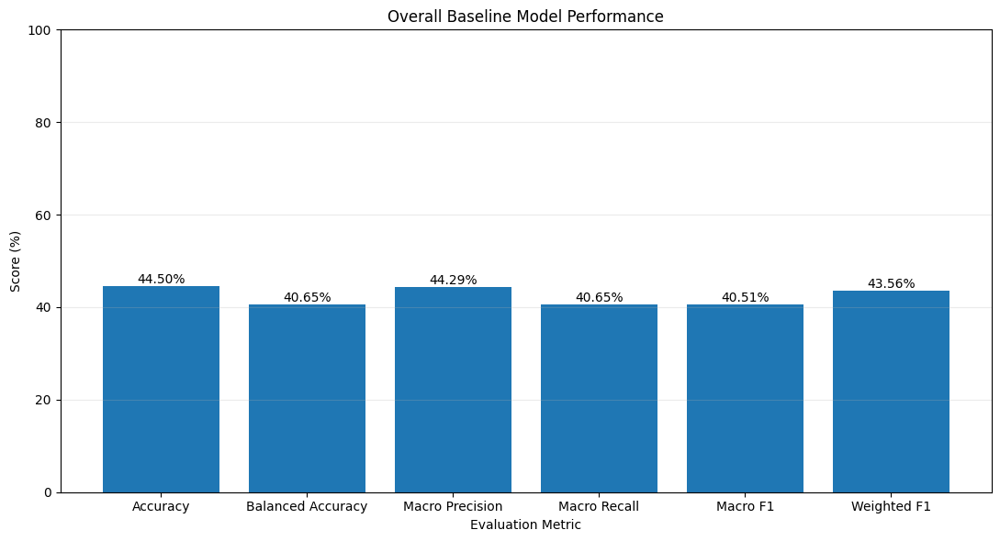

Saved: /content/skin-tone-fairness/outputs/figures/baseline_overall_performance.png


In [333]:
FIGURES_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "figures"
)

FIGURES_DIR.mkdir(
    parents=True,
    exist_ok=True
)

plt.figure(
    figsize=(11, 6)
)

bars = plt.bar(
    performance_df["Metric"],
    performance_df["Percentage"]
)

plt.title(
    "Overall Baseline Model Performance"
)

plt.xlabel(
    "Evaluation Metric"
)

plt.ylabel(
    "Score (%)"
)

plt.ylim(
    0,
    100
)

plt.grid(
    axis="y",
    alpha=0.25
)

for bar, value in zip(
    bars,
    performance_df["Percentage"]
):

    plt.text(
        bar.get_x()
        + bar.get_width() / 2,
        bar.get_height(),
        f"{value:.2f}%",
        ha="center",
        va="bottom",
        fontsize=10
    )

plt.tight_layout()

OVERALL_PERFORMANCE_FIG = (
    FIGURES_DIR
    / "baseline_overall_performance.png"
)

plt.savefig(
    OVERALL_PERFORMANCE_FIG,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print(
    "Saved:",
    OVERALL_PERFORMANCE_FIG
)

Cell 6 — Performance Table

In [334]:
TABLES_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
)

TABLES_DIR.mkdir(
    parents=True,
    exist_ok=True
)

PERFORMANCE_TABLE_PATH = (
    TABLES_DIR
    / "baseline_overall_performance_visualization.csv"
)

performance_df.to_csv(
    PERFORMANCE_TABLE_PATH,
    index=False
)

print("=" * 60)
print("PERFORMANCE TABLE SAVED")
print("=" * 60)

print(
    PERFORMANCE_TABLE_PATH
)

print(
    "File exists:",
    PERFORMANCE_TABLE_PATH.exists()
)

print("=" * 60)

PERFORMANCE TABLE SAVED
/content/skin-tone-fairness/outputs/tables/baseline_overall_performance_visualization.csv
File exists: True


Cell 7 — Final Summary

In [335]:
figure_saved = (
    OVERALL_PERFORMANCE_FIG.exists()
)

table_saved = (
    PERFORMANCE_TABLE_PATH.exists()
)

phase_55_passed = (
    metrics_valid
    and figure_saved
    and table_saved
)

print("=" * 60)
print("PHASE 5.5 — FINAL SUMMARY")
print("=" * 60)

print(
    "Model:",
    "EfficientNet-B0"
)

print(
    "Test samples:",
    2454
)

print(
    "Disease classes:",
    114
)

print("\nOverall performance:")

for metric, value in performance_values.items():

    print(
        f"{metric:<20}: "
        f"{value * 100:.2f}%"
    )

print(
    "\nAll metrics finite:",
    all_finite
)

print(
    "All metrics valid:",
    all_valid_range
)

print(
    "Figure saved:",
    figure_saved
)

print(
    "Table saved:",
    table_saved
)

print(
    "\nPhase 5.5 status:",
    "PASS"
    if phase_55_passed
    else
    "FAIL"
)

print("=" * 60)

PHASE 5.5 — FINAL SUMMARY
Model: EfficientNet-B0
Test samples: 2454
Disease classes: 114

Overall performance:
Accuracy            : 44.50%
Balanced Accuracy   : 40.65%
Macro Precision     : 44.29%
Macro Recall        : 40.65%
Macro F1            : 40.51%
Weighted F1         : 43.56%

All metrics finite: True
All metrics valid: True
Figure saved: True
Table saved: True

Phase 5.5 status: PASS


**Phase 5.6 — Skin-Tone Group Performance Visualization**

Cell 1 — Load Skin-Tone Performance

In [336]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

print("=" * 60)
print("PHASE 5.6 — SKIN-TONE GROUP PERFORMANCE")
print("=" * 60)

SKIN_TONE_METRICS_PATH = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
    / "baseline_skin_tone_performance.csv"
)

skin_tone_metrics_df = pd.read_csv(
    SKIN_TONE_METRICS_PATH
)

print("Metrics file:")
print(SKIN_TONE_METRICS_PATH)

print("\nColumns:")
print(
    skin_tone_metrics_df.columns.tolist()
)

print("\nData:")
print(
    skin_tone_metrics_df.to_string(
        index=False
    )
)

print("=" * 60)

PHASE 5.6 — SKIN-TONE GROUP PERFORMANCE
Metrics file:
/content/skin-tone-fairness/outputs/tables/baseline_skin_tone_performance.csv

Columns:
['skin_tone_group', 'sample_count', 'correct_predictions', 'accuracy', 'balanced_accuracy', 'macro_precision', 'macro_recall', 'macro_f1', 'mean_confidence', 'accuracy_percent', 'balanced_accuracy_percent', 'macro_precision_percent', 'macro_recall_percent', 'macro_f1_percent', 'sample_percentage']

Data:
skin_tone_group  sample_count  correct_predictions  accuracy  balanced_accuracy  macro_precision  macro_recall  macro_f1  mean_confidence  accuracy_percent  balanced_accuracy_percent  macro_precision_percent  macro_recall_percent  macro_f1_percent  sample_percentage
          Light          1161                  377  0.324720           0.316210         0.346526      0.316210  0.308875         0.410758         32.472007                  31.621028                34.652589             31.621028         30.887472          47.310513
         Medium   

Cell 2 — Identify Metric Columns

In [337]:
print("=" * 60)
print("IDENTIFYING SKIN-TONE METRICS")
print("=" * 60)

print(
    "Available columns:",
    skin_tone_metrics_df.columns.tolist()
)

# ------------------------------------------------------------
# Helper function
# ------------------------------------------------------------

def find_column(df, candidates):

    for candidate in candidates:

        if candidate in df.columns:
            return candidate

    return None


group_col = find_column(
    skin_tone_metrics_df,
    [
        "skin_tone_group",
        "skin tone group",
        "group",
        "skin_tone"
    ]
)

count_col = find_column(
    skin_tone_metrics_df,
    [
        "sample_count",
        "count",
        "n",
        "N"
    ]
)

accuracy_col = find_column(
    skin_tone_metrics_df,
    [
        "accuracy",
        "Accuracy"
    ]
)

balanced_accuracy_col = find_column(
    skin_tone_metrics_df,
    [
        "balanced_accuracy",
        "Balanced Accuracy",
        "balanced accuracy"
    ]
)

macro_precision_col = find_column(
    skin_tone_metrics_df,
    [
        "macro_precision",
        "Macro Precision",
        "macro precision"
    ]
)

macro_recall_col = find_column(
    skin_tone_metrics_df,
    [
        "macro_recall",
        "Macro Recall",
        "macro recall"
    ]
)

macro_f1_col = find_column(
    skin_tone_metrics_df,
    [
        "macro_f1",
        "Macro F1",
        "macro f1"
    ]
)

print(
    "Group column:",
    group_col
)

print(
    "Count column:",
    count_col
)

print(
    "Accuracy column:",
    accuracy_col
)

print(
    "Balanced Accuracy column:",
    balanced_accuracy_col
)

print(
    "Macro Precision column:",
    macro_precision_col
)

print(
    "Macro Recall column:",
    macro_recall_col
)

print(
    "Macro F1 column:",
    macro_f1_col
)

columns_found = all(
    column is not None
    for column in [
        group_col,
        count_col,
        accuracy_col,
        balanced_accuracy_col,
        macro_precision_col,
        macro_recall_col,
        macro_f1_col
    ]
)

print(
    "\nAll required columns found:",
    columns_found
)

print("=" * 60)

IDENTIFYING SKIN-TONE METRICS
Available columns: ['skin_tone_group', 'sample_count', 'correct_predictions', 'accuracy', 'balanced_accuracy', 'macro_precision', 'macro_recall', 'macro_f1', 'mean_confidence', 'accuracy_percent', 'balanced_accuracy_percent', 'macro_precision_percent', 'macro_recall_percent', 'macro_f1_percent', 'sample_percentage']
Group column: skin_tone_group
Count column: sample_count
Accuracy column: accuracy
Balanced Accuracy column: balanced_accuracy
Macro Precision column: macro_precision
Macro Recall column: macro_recall
Macro F1 column: macro_f1

All required columns found: True


Cell 3 — Prepare Standardized Data

In [338]:
skin_tone_order = [
    "Light",
    "Medium",
    "Dark",
    "Unknown"
]

skin_tone_performance = pd.DataFrame({
    "skin_tone_group":
        skin_tone_metrics_df[group_col],

    "sample_count":
        pd.to_numeric(
            skin_tone_metrics_df[count_col],
            errors="coerce"
        ),

    "accuracy":
        pd.to_numeric(
            skin_tone_metrics_df[accuracy_col],
            errors="coerce"
        ),

    "balanced_accuracy":
        pd.to_numeric(
            skin_tone_metrics_df[
                balanced_accuracy_col
            ],
            errors="coerce"
        ),

    "macro_precision":
        pd.to_numeric(
            skin_tone_metrics_df[
                macro_precision_col
            ],
            errors="coerce"
        ),

    "macro_recall":
        pd.to_numeric(
            skin_tone_metrics_df[
                macro_recall_col
            ],
            errors="coerce"
        ),

    "macro_f1":
        pd.to_numeric(
            skin_tone_metrics_df[
                macro_f1_col
            ],
            errors="coerce"
        )
})

skin_tone_performance = (
    skin_tone_performance
    .set_index(
        "skin_tone_group"
    )
    .reindex(
        skin_tone_order
    )
    .reset_index()
)

print("=" * 60)
print("STANDARDIZED SKIN-TONE PERFORMANCE")
print("=" * 60)

print(
    skin_tone_performance.to_string(
        index=False
    )
)

print("=" * 60)

STANDARDIZED SKIN-TONE PERFORMANCE
skin_tone_group  sample_count  accuracy  balanced_accuracy  macro_precision  macro_recall  macro_f1
          Light          1161  0.324720           0.316210         0.346526      0.316210  0.308875
         Medium           915  0.568306           0.484771         0.512118      0.484771  0.475436
           Dark           313  0.552716           0.422963         0.393227      0.373467  0.364301
        Unknown            65  0.338462           0.288456         0.190556      0.237976  0.192617


Cell 4 — Validate Metrics

In [339]:
expected_groups = 4

observed_groups = (
    skin_tone_performance[
        "skin_tone_group"
    ]
    .nunique()
)

groups_valid = (
    observed_groups
    == expected_groups
)

metric_columns = [
    "accuracy",
    "balanced_accuracy",
    "macro_precision",
    "macro_recall",
    "macro_f1"
]

all_finite = all(
    np.isfinite(
        skin_tone_performance[column]
    ).all()
    for column in metric_columns
)

all_valid_range = all(
    (
        skin_tone_performance[column]
        .between(0, 1)
    ).all()
    for column in metric_columns
)

sample_counts_valid = (
    skin_tone_performance[
        "sample_count"
    ].notna().all()
    and
    (
        skin_tone_performance[
            "sample_count"
        ] > 0
    ).all()
)

total_sample_coverage = (
    skin_tone_performance[
        "sample_count"
    ].sum()
)

sample_coverage_valid = (
    total_sample_coverage
    == 2454
)

print("=" * 60)
print("SKIN-TONE METRIC VALIDATION")
print("=" * 60)

print(
    "Expected groups:",
    expected_groups
)

print(
    "Observed groups:",
    observed_groups
)

print(
    "Groups valid:",
    groups_valid
)

print(
    "Metrics finite:",
    all_finite
)

print(
    "Metrics in [0,1]:",
    all_valid_range
)

print(
    "Sample counts valid:",
    sample_counts_valid
)

print(
    "Total samples:",
    total_sample_coverage
)

print(
    "Sample coverage valid:",
    sample_coverage_valid
)

print("=" * 60)

SKIN-TONE METRIC VALIDATION
Expected groups: 4
Observed groups: 4
Groups valid: True
Metrics finite: True
Metrics in [0,1]: True
Sample counts valid: True
Total samples: 2454
Sample coverage valid: True


Cell 5 — Main Skin-Tone Performance Chart

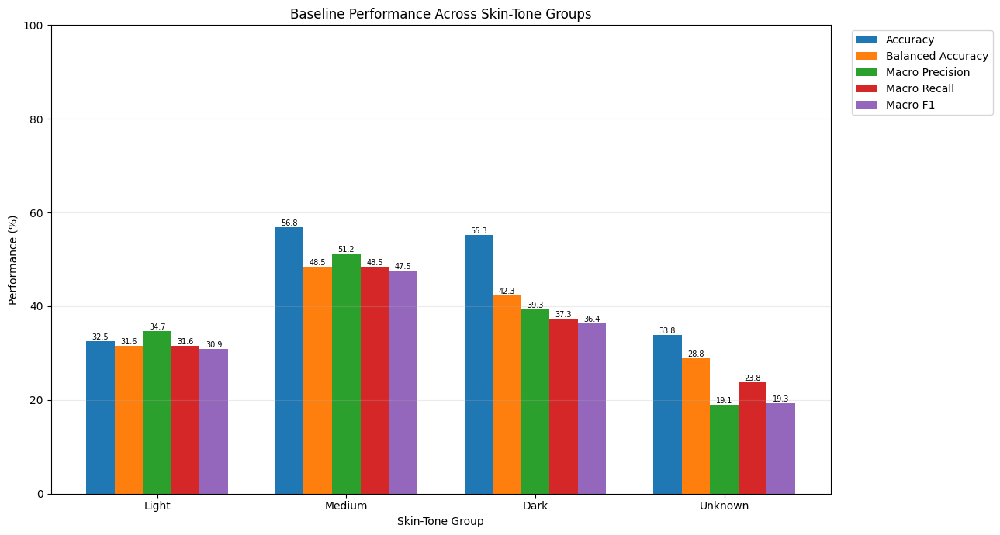

Saved: /content/skin-tone-fairness/outputs/figures/baseline_skin_tone_performance.png


In [340]:
FIGURES_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "figures"
)

FIGURES_DIR.mkdir(
    parents=True,
    exist_ok=True
)

metric_labels = {
    "accuracy": "Accuracy",
    "balanced_accuracy": "Balanced Accuracy",
    "macro_precision": "Macro Precision",
    "macro_recall": "Macro Recall",
    "macro_f1": "Macro F1"
}

x = np.arange(
    len(skin_tone_order)
)

width = 0.15

plt.figure(
    figsize=(13, 7)
)

for i, (column, label) in enumerate(
    metric_labels.items()
):

    values = (
        skin_tone_performance[column]
        * 100
    )

    offset = (
        i - 2
    ) * width

    bars = plt.bar(
        x + offset,
        values,
        width,
        label=label
    )

    for bar, value in zip(
        bars,
        values
    ):

        plt.text(
            bar.get_x()
            + bar.get_width() / 2,
            bar.get_height(),
            f"{value:.1f}",
            ha="center",
            va="bottom",
            fontsize=7
        )

plt.title(
    "Baseline Performance Across Skin-Tone Groups"
)

plt.xlabel(
    "Skin-Tone Group"
)

plt.ylabel(
    "Performance (%)"
)

plt.xticks(
    x,
    skin_tone_order
)

plt.ylim(
    0,
    100
)

plt.grid(
    axis="y",
    alpha=0.25
)

plt.legend(
    bbox_to_anchor=(1.02, 1),
    loc="upper left"
)

plt.tight_layout()

SKIN_TONE_PERFORMANCE_FIG = (
    FIGURES_DIR
    / "baseline_skin_tone_performance.png"
)

plt.savefig(
    SKIN_TONE_PERFORMANCE_FIG,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print(
    "Saved:",
    SKIN_TONE_PERFORMANCE_FIG
)

Cell 6 — Accuracy by Skin Tone

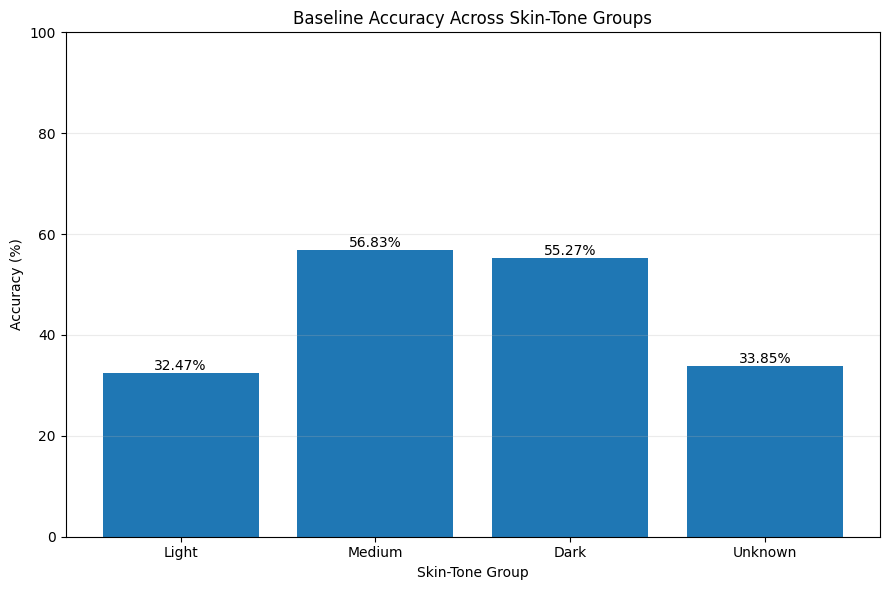

Saved: /content/skin-tone-fairness/outputs/figures/baseline_skin_tone_accuracy.png


In [341]:
plt.figure(
    figsize=(9, 6)
)

accuracy_values = (
    skin_tone_performance[
        "accuracy"
    ] * 100
)

bars = plt.bar(
    skin_tone_order,
    accuracy_values
)

plt.title(
    "Baseline Accuracy Across Skin-Tone Groups"
)

plt.xlabel(
    "Skin-Tone Group"
)

plt.ylabel(
    "Accuracy (%)"
)

plt.ylim(
    0,
    100
)

plt.grid(
    axis="y",
    alpha=0.25
)

for bar, value in zip(
    bars,
    accuracy_values
):

    plt.text(
        bar.get_x()
        + bar.get_width() / 2,
        bar.get_height(),
        f"{value:.2f}%",
        ha="center",
        va="bottom",
        fontsize=10
    )

plt.tight_layout()

SKIN_TONE_ACCURACY_FIG = (
    FIGURES_DIR
    / "baseline_skin_tone_accuracy.png"
)

plt.savefig(
    SKIN_TONE_ACCURACY_FIG,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print(
    "Saved:",
    SKIN_TONE_ACCURACY_FIG
)

Cell 7 — Macro-F1 by Skin Tone

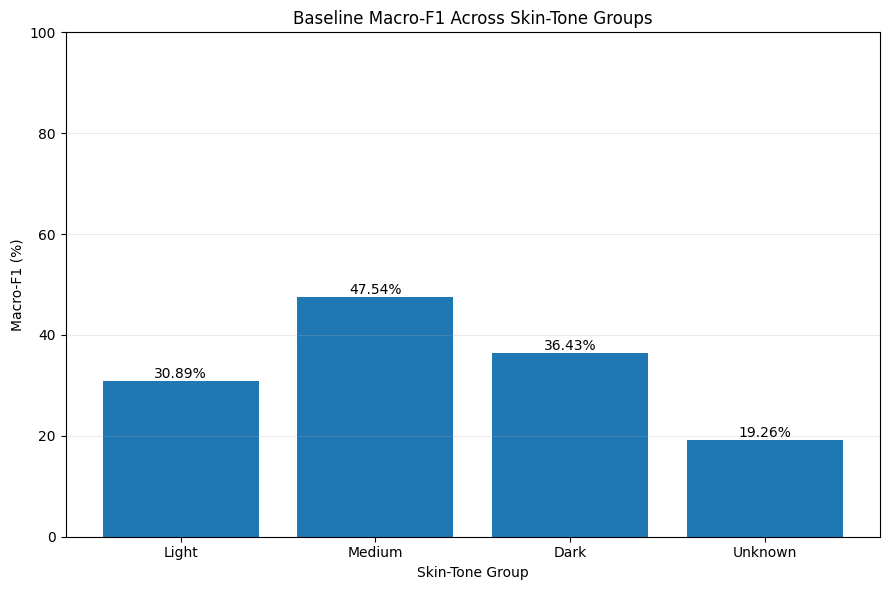

Saved: /content/skin-tone-fairness/outputs/figures/baseline_skin_tone_macro_f1.png


In [342]:
plt.figure(
    figsize=(9, 6)
)

f1_values = (
    skin_tone_performance[
        "macro_f1"
    ] * 100
)

bars = plt.bar(
    skin_tone_order,
    f1_values
)

plt.title(
    "Baseline Macro-F1 Across Skin-Tone Groups"
)

plt.xlabel(
    "Skin-Tone Group"
)

plt.ylabel(
    "Macro-F1 (%)"
)

plt.ylim(
    0,
    100
)

plt.grid(
    axis="y",
    alpha=0.25
)

for bar, value in zip(
    bars,
    f1_values
):

    plt.text(
        bar.get_x()
        + bar.get_width() / 2,
        bar.get_height(),
        f"{value:.2f}%",
        ha="center",
        va="bottom",
        fontsize=10
    )

plt.tight_layout()

SKIN_TONE_F1_FIG = (
    FIGURES_DIR
    / "baseline_skin_tone_macro_f1.png"
)

plt.savefig(
    SKIN_TONE_F1_FIG,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print(
    "Saved:",
    SKIN_TONE_F1_FIG
)

Cell 8 — Fairness Gap Calculation

In [343]:
fairness_gap_records = []

for column, label in metric_labels.items():

    values = (
        skin_tone_performance[
            column
        ]
    )

    best_idx = values.idxmax()
    worst_idx = values.idxmin()

    best_group = (
        skin_tone_performance.loc[
            best_idx,
            "skin_tone_group"
        ]
    )

    worst_group = (
        skin_tone_performance.loc[
            worst_idx,
            "skin_tone_group"
        ]
    )

    best_value = (
        values.loc[best_idx]
    )

    worst_value = (
        values.loc[worst_idx]
    )

    gap = (
        best_value
        - worst_value
    )

    ratio = (
        worst_value / best_value
        if best_value > 0
        else np.nan
    )

    fairness_gap_records.append({
        "metric": label,
        "best_group": best_group,
        "best_score": best_value,
        "worst_group": worst_group,
        "worst_score": worst_value,
        "gap": gap,
        "gap_percentage_points":
            gap * 100,
        "worst_to_best_ratio":
            ratio
    })

fairness_gap_df = pd.DataFrame(
    fairness_gap_records
)

print("=" * 60)
print("SKIN-TONE PERFORMANCE GAPS")
print("=" * 60)

print(
    fairness_gap_df.to_string(
        index=False
    )
)

print("=" * 60)

SKIN-TONE PERFORMANCE GAPS
           metric best_group  best_score worst_group  worst_score      gap  gap_percentage_points  worst_to_best_ratio
         Accuracy     Medium    0.568306       Light     0.324720 0.243586              24.358594             0.571382
Balanced Accuracy     Medium    0.484771     Unknown     0.288456 0.196315              19.631460             0.595036
  Macro Precision     Medium    0.512118     Unknown     0.190556 0.321562              32.156228             0.372093
     Macro Recall     Medium    0.484771     Unknown     0.237976 0.246794              24.679440             0.490905
         Macro F1     Medium    0.475436     Unknown     0.192617 0.282820              28.281990             0.405136


Cell 9 — Fairness Gap Chart

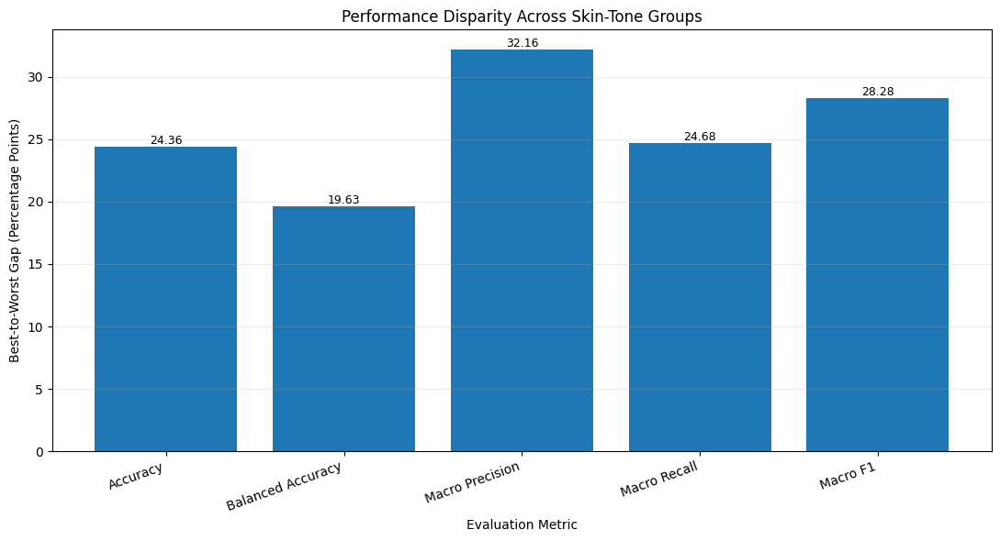

Saved: /content/skin-tone-fairness/outputs/figures/baseline_skin_tone_fairness_gaps.png


In [344]:
plt.figure(
    figsize=(11, 6)
)

bars = plt.bar(
    fairness_gap_df["metric"],
    fairness_gap_df[
        "gap_percentage_points"
    ]
)

plt.title(
    "Performance Disparity Across Skin-Tone Groups"
)

plt.xlabel(
    "Evaluation Metric"
)

plt.ylabel(
    "Best-to-Worst Gap (Percentage Points)"
)

plt.grid(
    axis="y",
    alpha=0.25
)

for bar, value in zip(
    bars,
    fairness_gap_df[
        "gap_percentage_points"
    ]
):

    plt.text(
        bar.get_x()
        + bar.get_width() / 2,
        bar.get_height(),
        f"{value:.2f}",
        ha="center",
        va="bottom",
        fontsize=9
    )

plt.xticks(
    rotation=20,
    ha="right"
)

plt.tight_layout()

FAIRNESS_GAP_FIG = (
    FIGURES_DIR
    / "baseline_skin_tone_fairness_gaps.png"
)

plt.savefig(
    FAIRNESS_GAP_FIG,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print(
    "Saved:",
    FAIRNESS_GAP_FIG
)

Cell 10 — Save Tables

In [345]:
TABLES_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
)

TABLES_DIR.mkdir(
    parents=True,
    exist_ok=True
)

SKIN_TONE_PERFORMANCE_TABLE = (
    TABLES_DIR
    / "baseline_skin_tone_performance_visualization.csv"
)

FAIRNESS_GAP_TABLE = (
    TABLES_DIR
    / "baseline_skin_tone_fairness_gaps_visualization.csv"
)

skin_tone_performance.to_csv(
    SKIN_TONE_PERFORMANCE_TABLE,
    index=False
)

fairness_gap_df.to_csv(
    FAIRNESS_GAP_TABLE,
    index=False
)

print("=" * 60)
print("TABLES SAVED")
print("=" * 60)

print(
    "Performance table:",
    SKIN_TONE_PERFORMANCE_TABLE.exists()
)

print(
    "Fairness gap table:",
    FAIRNESS_GAP_TABLE.exists()
)

print("=" * 60)

TABLES SAVED
Performance table: True
Fairness gap table: True


Cell 11 — Final Summary

In [346]:
figures_saved = (
    SKIN_TONE_PERFORMANCE_FIG.exists()
    and SKIN_TONE_ACCURACY_FIG.exists()
    and SKIN_TONE_F1_FIG.exists()
    and FAIRNESS_GAP_FIG.exists()
)

tables_saved = (
    SKIN_TONE_PERFORMANCE_TABLE.exists()
    and FAIRNESS_GAP_TABLE.exists()
)

phase_56_passed = (
    columns_found
    and groups_valid
    and all_finite
    and all_valid_range
    and sample_counts_valid
    and sample_coverage_valid
    and figures_saved
    and tables_saved
)

print("=" * 60)
print("PHASE 5.6 — FINAL SUMMARY")
print("=" * 60)

print(
    "Expected skin-tone groups:",
    expected_groups
)

print(
    "Observed skin-tone groups:",
    observed_groups
)

print(
    "Total test samples:",
    int(total_sample_coverage)
)

print(
    "\nSkin-tone performance:"
)

for _, row in skin_tone_performance.iterrows():

    print(
        f"{row['skin_tone_group']:<8}"
        f" | N={int(row['sample_count']):4d}"
        f" | Accuracy={row['accuracy']*100:.2f}%"
        f" | Macro-F1={row['macro_f1']*100:.2f}%"
    )

print(
    "\nPerformance gaps:"
)

for _, row in fairness_gap_df.iterrows():

    print(
        f"{row['metric']:<20}"
        f" | Best={row['best_group']:<8}"
        f" | Worst={row['worst_group']:<8}"
        f" | Gap={row['gap_percentage_points']:.2f} pp"
    )

print(
    "\nMetrics finite:",
    all_finite
)

print(
    "Metrics valid:",
    all_valid_range
)

print(
    "Figures saved:",
    figures_saved
)

print(
    "Tables saved:",
    tables_saved
)

print(
    "\nPhase 5.6 status:",
    "PASS"
    if phase_56_passed
    else
    "FAIL"
)

print("=" * 60)

PHASE 5.6 — FINAL SUMMARY
Expected skin-tone groups: 4
Observed skin-tone groups: 4
Total test samples: 2454

Skin-tone performance:
Light    | N=1161 | Accuracy=32.47% | Macro-F1=30.89%
Medium   | N= 915 | Accuracy=56.83% | Macro-F1=47.54%
Dark     | N= 313 | Accuracy=55.27% | Macro-F1=36.43%
Unknown  | N=  65 | Accuracy=33.85% | Macro-F1=19.26%

Performance gaps:
Accuracy             | Best=Medium   | Worst=Light    | Gap=24.36 pp
Balanced Accuracy    | Best=Medium   | Worst=Unknown  | Gap=19.63 pp
Macro Precision      | Best=Medium   | Worst=Unknown  | Gap=32.16 pp
Macro Recall         | Best=Medium   | Worst=Unknown  | Gap=24.68 pp
Macro F1             | Best=Medium   | Worst=Unknown  | Gap=28.28 pp

Metrics finite: True
Metrics valid: True
Figures saved: True
Tables saved: True

Phase 5.6 status: PASS


Phase 5.7 — Disease-Level Performance Visualization

In [347]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

print("=" * 60)
print("PHASE 5.7 — DISEASE-LEVEL PERFORMANCE")
print("=" * 60)

DISEASE_METRICS_PATH = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
    / "baseline_per_disease_performance.csv"
)

disease_metrics_df = pd.read_csv(
    DISEASE_METRICS_PATH
)

print("Metrics file:")
print(DISEASE_METRICS_PATH)

print("\nShape:")
print(disease_metrics_df.shape)

print("\nColumns:")
print(disease_metrics_df.columns.tolist())

print("\nFirst 10 rows:")
print(
    disease_metrics_df.head(10).to_string(
        index=False
    )
)

print("=" * 60)

PHASE 5.7 — DISEASE-LEVEL PERFORMANCE
Metrics file:
/content/skin-tone-fairness/outputs/tables/baseline_per_disease_performance.csv

Shape:
(114, 6)

Columns:
['class_id', 'disease', 'precision', 'recall', 'f1-score', 'support']

First 10 rows:
 class_id disease  precision   recall  f1-score  support
        0 class_0   0.444444 0.615385  0.516129     13.0
        1 class_1   0.125000 0.111111  0.117647     27.0
        2 class_2   0.592593 0.627451  0.609524     51.0
        3 class_3   0.200000 0.100000  0.133333     10.0
        4 class_4   1.000000 0.428571  0.600000     14.0
        5 class_5   0.307692 0.307692  0.307692     26.0
        6 class_6   0.347826 0.375000  0.360902     64.0
        7 class_7   0.307692 0.400000  0.347826     10.0
        8 class_8   0.430769 0.400000  0.414815     70.0
        9 class_9   0.142857 0.111111  0.125000      9.0


Cell 2 — Identify and Standardize Columns

In [348]:
def find_column(df, candidates):

    for candidate in candidates:

        if candidate in df.columns:
            return candidate

    return None


disease_col = find_column(
    disease_metrics_df,
    [
        "label",
        "disease",
        "disease_label",
        "class",
        "class_name"
    ]
)

count_col = find_column(
    disease_metrics_df,
    [
        "support",
        "count",
        "sample_count",
        "N"
    ]
)

accuracy_col = find_column(
    disease_metrics_df,
    [
        "accuracy",
        "Accuracy"
    ]
)

precision_col = find_column(
    disease_metrics_df,
    [
        "precision",
        "Precision"
    ]
)

recall_col = find_column(
    disease_metrics_df,
    [
        "recall",
        "Recall"
    ]
)

f1_col = find_column(
    disease_metrics_df,
    [
        "f1",
        "f1_score",
        "f1-score", # Add 'f1-score' to candidates
        "F1",
        "F1 Score",
        "macro_f1"
    ]
)

print("=" * 60)
print("COLUMN IDENTIFICATION")
print("=" * 60)

print("Disease column   :", disease_col)
print("Count column     :", count_col)
print("Accuracy column  :", accuracy_col)
print("Precision column :", precision_col)
print("Recall column    :", recall_col)
print("F1 column        :", f1_col)

columns_found = all(
    column is not None
    for column in [
        disease_col,
        count_col,
        accuracy_col,
        precision_col,
        recall_col,
        f1_col
    ]
)

print(
    "\nAll required columns found:",
    columns_found
)

print("=" * 60)

COLUMN IDENTIFICATION
Disease column   : disease
Count column     : support
Accuracy column  : None
Precision column : precision
Recall column    : recall
F1 column        : f1-score

All required columns found: False


Cell 3 — Prepare Disease Performance Data

In [349]:
disease_performance = pd.DataFrame({
    "disease":
        disease_metrics_df[disease_col],

    "support":
        pd.to_numeric(
            disease_metrics_df[count_col],
            errors="coerce"
        ),

    "precision":
        pd.to_numeric(
            disease_metrics_df[precision_col],
            errors="coerce"
        ),

    "recall":
        pd.to_numeric(
            disease_metrics_df[recall_col],
            errors="coerce"
        ),

    "f1":
        pd.to_numeric(
            disease_metrics_df[f1_col],
            errors="coerce"
        )
})

disease_performance = (
    disease_performance
    .sort_values(
        "f1",
        ascending=False
    )
    .reset_index(
        drop=True
    )
)

print("=" * 60)
print("DISEASE PERFORMANCE DATA")
print("=" * 60)

print(
    "Number of diseases:",
    len(disease_performance)
)

print(
    "\nTop 10 diseases by F1:"
)

print(
    disease_performance[
        [
            "disease",
            "support",
            "precision",
            "recall",
            "f1"
        ]
    ]
    .head(10)
    .to_string(index=False)
)

print("=" * 60)

DISEASE PERFORMANCE DATA
Number of diseases: 114

Top 10 diseases by F1:
  disease  support  precision   recall       f1
class_108     23.0   0.846154 0.956522 0.897959
 class_81     27.0   0.880000 0.814815 0.846154
 class_71     23.0   0.800000 0.869565 0.833333
 class_36     27.0   0.840000 0.777778 0.807692
 class_80     41.0   0.686275 0.853659 0.760870
 class_73     22.0   0.606061 0.909091 0.727273
 class_46     13.0   0.888889 0.615385 0.727273
 class_43     22.0   0.727273 0.727273 0.727273
class_104     18.0   0.684211 0.722222 0.702703
 class_23     20.0   0.566667 0.850000 0.680000


In [ ]:
disease_performance = pd.DataFrame({
    "disease":
        disease_metrics_df[disease_col],

    "support":
        pd.to_numeric(
            disease_metrics_df[count_col],
            errors="coerce"
        ),

    "precision":
        pd.to_numeric(
            disease_metrics_df[precision_col],
            errors="coerce"
        ),

    "recall":
        pd.to_numeric(
            disease_metrics_df[recall_col],
            errors="coerce"
        ),

    "f1":
        pd.to_numeric(
            disease_metrics_df[f1_col],
            errors="coerce"
        )
})

disease_performance = (
    disease_performance
    .sort_values(
        "f1",
        ascending=False
    )
    .reset_index(
        drop=True
    )
)

print("=" * 60)
print("DISEASE PERFORMANCE DATA")
print("=" * 60)

print(
    "Number of diseases:",
    len(disease_performance)
)

print(
    "\nTop 10 diseases by F1:"
)

print(
    disease_performance[
        [
            "disease",
            "support",
            "precision",
            "recall",
            "f1"
        ]
    ]
    .head(10)
    .to_string(index=False)
)

print("=" * 60)

DISEASE PERFORMANCE DATA
Number of diseases: 114

Top 10 diseases by F1:
  disease  support  precision   recall       f1
class_108     23.0   0.846154 0.956522 0.897959
 class_81     27.0   0.880000 0.814815 0.846154
 class_71     23.0   0.800000 0.869565 0.833333
 class_36     27.0   0.840000 0.777778 0.807692
 class_80     41.0   0.686275 0.853659 0.760870
 class_73     22.0   0.606061 0.909091 0.727273
 class_46     13.0   0.888889 0.615385 0.727273
 class_43     22.0   0.727273 0.727273 0.727273
class_104     18.0   0.684211 0.722222 0.702703
 class_23     20.0   0.566667 0.850000 0.680000


Cell 4 — Validate Disease Metrics

In [350]:
EXPECTED_DISEASE_CLASSES = 114

disease_count_valid = (
    len(disease_performance)
    == EXPECTED_DISEASE_CLASSES
)

metric_columns = [
    "precision",
    "recall",
    "f1"
]

all_finite = all(
    np.isfinite(
        disease_performance[column]
    ).all()
    for column in metric_columns
)

all_valid_range = all(
    (
        disease_performance[column]
        .between(0, 1)
    ).all()
    for column in metric_columns
)

support_valid = (
    disease_performance["support"]
    .notna()
    .all()
    and
    (
        disease_performance["support"]
        > 0
    ).all()
)

print("=" * 60)
print("DISEASE METRIC VALIDATION")
print("=" * 60)

print(
    "Expected disease classes:",
    EXPECTED_DISEASE_CLASSES
)

print(
    "Observed disease classes:",
    len(disease_performance)
)

print(
    "Disease count valid:",
    disease_count_valid
)

print(
    "Metrics finite:",
    all_finite
)

print(
    "Metrics in [0,1]:",
    all_valid_range
)

print(
    "Support valid:",
    support_valid
)

print("=" * 60)

DISEASE METRIC VALIDATION
Expected disease classes: 114
Observed disease classes: 114
Disease count valid: True
Metrics finite: True
Metrics in [0,1]: True
Support valid: True


Cell 5 — All Disease F1 Distribution

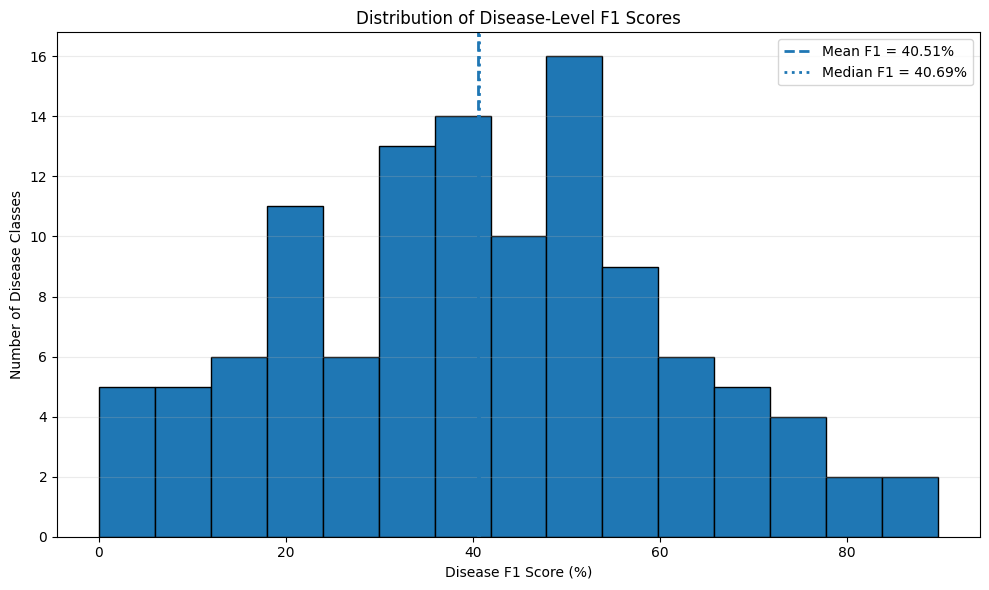

Saved: /content/skin-tone-fairness/outputs/figures/disease_f1_distribution.png


In [351]:
FIGURES_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "figures"
)

FIGURES_DIR.mkdir(
    parents=True,
    exist_ok=True
)

plt.figure(
    figsize=(10, 6)
)

plt.hist(
    disease_performance["f1"] * 100,
    bins=15,
    edgecolor="black"
)

plt.axvline(
    disease_performance["f1"].mean() * 100,
    linestyle="--",
    linewidth=2,
    label=(
        f"Mean F1 = "
        f"{disease_performance['f1'].mean()*100:.2f}%"
    )
)

plt.axvline(
    disease_performance["f1"].median() * 100,
    linestyle=":",
    linewidth=2,
    label=(
        f"Median F1 = "
        f"{disease_performance['f1'].median()*100:.2f}%"
    )
)

plt.title(
    "Distribution of Disease-Level F1 Scores"
)

plt.xlabel(
    "Disease F1 Score (%)"
)

plt.ylabel(
    "Number of Disease Classes"
)

plt.legend()

plt.grid(
    axis="y",
    alpha=0.25
)

plt.tight_layout()

DISEASE_F1_DISTRIBUTION_FIG = (
    FIGURES_DIR
    / "disease_f1_distribution.png"
)

plt.savefig(
    DISEASE_F1_DISTRIBUTION_FIG,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print(
    "Saved:",
    DISEASE_F1_DISTRIBUTION_FIG
)

Cell 6 — Top 10 Disease Performance

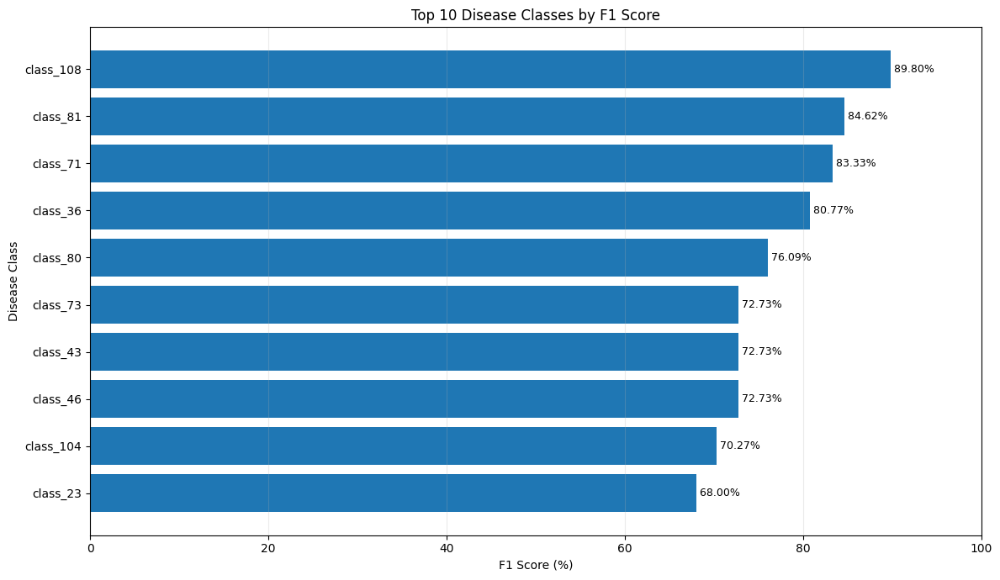

Saved: /content/skin-tone-fairness/outputs/figures/top_10_disease_f1.png


In [352]:
top_10_diseases = (
    disease_performance
    .sort_values(
        "f1",
        ascending=False
    )
    .head(10)
    .sort_values(
        "f1",
        ascending=True
    )
)

plt.figure(
    figsize=(12, 7)
)

bars = plt.barh(
    top_10_diseases["disease"],
    top_10_diseases["f1"] * 100
)

plt.title(
    "Top 10 Disease Classes by F1 Score"
)

plt.xlabel(
    "F1 Score (%)"
)

plt.ylabel(
    "Disease Class"
)

plt.xlim(
    0,
    100
)

plt.grid(
    axis="x",
    alpha=0.25
)

for bar, value in zip(
    bars,
    top_10_diseases["f1"] * 100
):

    plt.text(
        bar.get_width(),
        bar.get_y()
        + bar.get_height() / 2,
        f" {value:.2f}%",
        va="center",
        fontsize=9
    )

plt.tight_layout()

TOP_DISEASE_FIG = (
    FIGURES_DIR
    / "top_10_disease_f1.png"
)

plt.savefig(
    TOP_DISEASE_FIG,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print(
    "Saved:",
    TOP_DISEASE_FIG
)

Cell 7 — Bottom 10 Disease Performance

BOTTOM 10 DISEASE CLASSES BY F1
Train columns:
['md5hash', 'fitzpatrick_scale', 'fitzpatrick_centaur', 'label', 'nine_partition_label', 'three_partition_label', 'qc', 'url', 'url_alphanum', 'image_path', 'skin_tone_group', 'black_border_ratio', 'class_id']

Mapping conflicts: 0
Mapped class IDs: 114

Disease performance disease values:
['class_108', 'class_81', 'class_71', 'class_36', 'class_80', 'class_73', 'class_46', 'class_43', 'class_104', 'class_23', 'class_49', 'class_62', 'class_64', 'class_27', 'class_30', 'class_85', 'class_2', 'class_10', 'class_4', 'class_33']

Successfully mapped: 114
Mapping failures: 0

Mapped disease examples:
  disease  class_id_for_mapping                             disease_name       f1
class_108                   108                                tungiasis 0.897959
 class_81                    81                    porokeratosis actinic 0.846154
 class_71                    71 papilomatosis confluentes and reticulate 0.833333
 class_36            

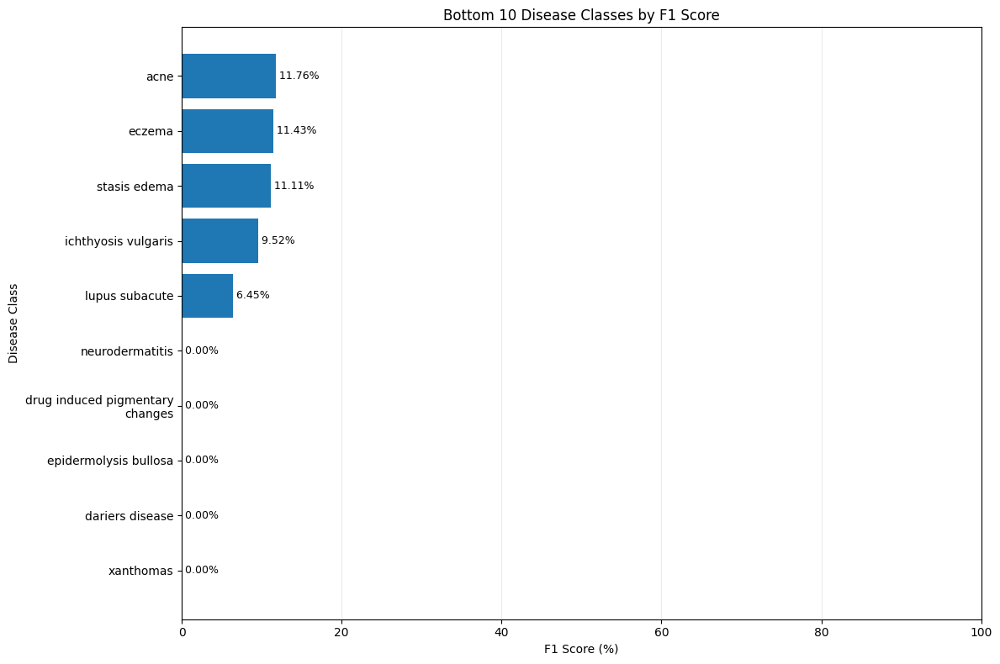

Saved: /content/skin-tone-fairness/outputs/figures/bottom_10_disease_f1.png


In [353]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import textwrap

print("=" * 60)
print("BOTTOM 10 DISEASE CLASSES BY F1")
print("=" * 60)


# ------------------------------------------------------------
# 1. Load TRAIN split as the source of truth
# ------------------------------------------------------------

TRAIN_PATH = (
    PROJECT_ROOT
    / "data"
    / "splits"
    / "train.csv"
)

train_mapping_df = pd.read_csv(
    TRAIN_PATH
)

print("Train columns:")
print(
    train_mapping_df.columns.tolist()
)


# ------------------------------------------------------------
# 2. Build class_id -> disease label mapping
# ------------------------------------------------------------

required_mapping_columns = [
    "class_id",
    "label"
]

missing_mapping_columns = [
    col
    for col in required_mapping_columns
    if col not in train_mapping_df.columns
]

if len(missing_mapping_columns) > 0:

    raise ValueError(
        "Required columns missing from train.csv: "
        + str(missing_mapping_columns)
    )


class_to_disease = (
    train_mapping_df[
        [
            "class_id",
            "label"
        ]
    ]
    .drop_duplicates()
)


# Make sure one class_id has only one disease
mapping_conflicts = (
    class_to_disease
    .groupby("class_id")["label"]
    .nunique()
)

conflicting_ids = (
    mapping_conflicts[
        mapping_conflicts > 1
    ]
)

print(
    "\nMapping conflicts:",
    len(conflicting_ids)
)


# Convert to dictionary
id_to_disease = dict(
    zip(
        class_to_disease["class_id"],
        class_to_disease["label"]
    )
)


print(
    "Mapped class IDs:",
    len(id_to_disease)
)


# ------------------------------------------------------------
# 3. Inspect disease_performance values
# ------------------------------------------------------------

print("\nDisease performance disease values:")
print(
    disease_performance[
        "disease"
    ]
    .head(20)
    .tolist()
)


# ------------------------------------------------------------
# 4. Convert disease identifier to integer class ID
# ------------------------------------------------------------

def extract_class_id(value):

    # Case 1: already integer
    if isinstance(
        value,
        (int, np.integer)
    ):
        return int(value)

    # Case 2: float such as 48.0
    if isinstance(
        value,
        (float, np.floating)
    ):
        if np.isfinite(value):
            return int(value)

    # Case 3: string
    value_str = str(value).strip()

    # "48"
    try:
        return int(value_str)
    except:
        pass

    # "48.0"
    try:
        return int(float(value_str))
    except:
        pass

    # "class_48"
    if value_str.lower().startswith(
        "class_"
    ):

        number_part = (
            value_str
            .lower()
            .replace(
                "class_",
                ""
            )
        )

        try:
            return int(number_part)
        except:
            pass

    return None


disease_performance[
    "class_id_for_mapping"
] = (
    disease_performance[
        "disease"
    ]
    .apply(
        extract_class_id
    )
)


# ------------------------------------------------------------
# 5. Map class ID -> actual disease name
# ------------------------------------------------------------

disease_performance[
    "disease_name"
] = (
    disease_performance[
        "class_id_for_mapping"
    ]
    .map(
        id_to_disease
    )
)


# ------------------------------------------------------------
# 6. Check mapping success
# ------------------------------------------------------------

mapping_success = (
    disease_performance[
        "disease_name"
    ]
    .notna()
)

print(
    "\nSuccessfully mapped:",
    mapping_success.sum()
)

print(
    "Mapping failures:",
    (~mapping_success).sum()
)


print(
    "\nMapped disease examples:"
)

print(
    disease_performance[
        [
            "disease",
            "class_id_for_mapping",
            "disease_name",
            "f1"
        ]
    ]
    .head(20)
    .to_string(
        index=False
    )
)


# ------------------------------------------------------------
# 7. Get bottom 10 using F1
# ------------------------------------------------------------

bottom_10_diseases = (
    disease_performance
    .sort_values(
        "f1",
        ascending=True
    )
    .head(10)
    .copy()
)


# ------------------------------------------------------------
# 8. Safety check
# ------------------------------------------------------------

if (
    bottom_10_diseases[
        "disease_name"
    ]
    .isna()
    .any()
):

    print(
        "\nWARNING:"
        " Some disease names could not be mapped."
    )

    print(
        bottom_10_diseases[
            [
                "disease",
                "class_id_for_mapping",
                "disease_name"
            ]
        ]
    )


# ------------------------------------------------------------
# 9. Sort for horizontal bar chart
# ------------------------------------------------------------

plot_df = (
    bottom_10_diseases
    .sort_values(
        "f1",
        ascending=True
    )
    .copy()
)


# ------------------------------------------------------------
# 10. Wrap long disease names
# ------------------------------------------------------------

plot_df[
    "display_name"
] = (
    plot_df[
        "disease_name"
    ]
    .astype(str)
    .apply(
        lambda x:
        "\n".join(
            textwrap.wrap(
                x,
                width=30
            )
        )
    )
)


# ------------------------------------------------------------
# 11. Print final disease names
# ------------------------------------------------------------

print("=" * 60)
print("FINAL BOTTOM 10 DISEASES")
print("=" * 60)

print(
    plot_df[
        [
            "class_id_for_mapping",
            "disease_name",
            "support",
            "f1"
        ]
    ].to_string(
        index=False
    )
)

print("=" * 60)


# ------------------------------------------------------------
# 12. Plot actual disease names
# ------------------------------------------------------------

plt.figure(
    figsize=(12, 8)
)

bars = plt.barh(
    plot_df[
        "display_name"
    ],
    plot_df[
        "f1"
    ] * 100
)

plt.title(
    "Bottom 10 Disease Classes by F1 Score"
)

plt.xlabel(
    "F1 Score (%)"
)

plt.ylabel(
    "Disease Class"
)

plt.xlim(
    0,
    100
)

plt.grid(
    axis="x",
    alpha=0.25
)

for bar, value in zip(
    bars,
    plot_df["f1"] * 100
):

    plt.text(
        bar.get_width(),
        bar.get_y()
        + bar.get_height() / 2,
        f" {value:.2f}%",
        va="center",
        fontsize=9
    )

plt.tight_layout()


BOTTOM_DISEASE_FIG = (
    FIGURES_DIR
    / "bottom_10_disease_f1.png"
)

plt.savefig(
    BOTTOM_DISEASE_FIG,
    dpi=300,
    bbox_inches="tight"
)

plt.show()


print(
    "Saved:",
    BOTTOM_DISEASE_FIG
)

Cell 8 — Low-F1 Disease Analysis

In [354]:
thresholds = [
    0.20,
    0.30,
    0.40,
    0.50
]

low_f1_summary = []

for threshold in thresholds:

    count = (
        disease_performance["f1"]
        < threshold
    ).sum()

    low_f1_summary.append({
        "threshold": threshold,
        "threshold_percentage":
            threshold * 100,
        "number_of_diseases":
            int(count)
    })

low_f1_summary_df = pd.DataFrame(
    low_f1_summary
)

print("=" * 60)
print("LOW-F1 DISEASE ANALYSIS")
print("=" * 60)

print(
    low_f1_summary_df.to_string(
        index=False
    )
)

print("=" * 60)

LOW-F1 DISEASE ANALYSIS
 threshold  threshold_percentage  number_of_diseases
       0.2                  20.0                  19
       0.3                  30.0                  33
       0.4                  40.0                  55
       0.5                  50.0                  74


Cell 9 — Disease Performance Summary

In [355]:
# Make sure disease names exist
if "disease_name" not in disease_performance.columns:
    raise ValueError(
        "disease_name column not found. "
        "Please run the corrected Cell 7 first."
    )

# Use mapped disease names where available
disease_performance["display_disease"] = (
    disease_performance["disease_name"]
    .fillna(disease_performance["disease"].astype(str))
)

best_idx = (
    disease_performance["f1"]
    .idxmax()
)

worst_idx = (
    disease_performance["f1"]
    .idxmin()
)

best_disease = (
    disease_performance.loc[best_idx]
)

worst_disease = (
    disease_performance.loc[worst_idx]
)

mean_f1 = (
    disease_performance["f1"]
    .mean()
)

median_f1 = (
    disease_performance["f1"]
    .median()
)

std_f1 = (
    disease_performance["f1"]
    .std()
)

print("=" * 60)
print("DISEASE-LEVEL PERFORMANCE SUMMARY")
print("=" * 60)

print(
    f"Mean disease F1   : {mean_f1:.4f}"
)

print(
    f"Median disease F1 : {median_f1:.4f}"
)

print(
    f"Std disease F1    : {std_f1:.4f}"
)

print(
    f"\nBest disease      : "
    f"{best_disease['display_disease']}"
)

print(
    f"Best disease F1   : "
    f"{best_disease['f1'] * 100:.2f}%"
)

print(
    f"\nWorst disease     : "
    f"{worst_disease['display_disease']}"
)

print(
    f"Worst disease F1  : "
    f"{worst_disease['f1'] * 100:.2f}%"
)

print("=" * 60)

DISEASE-LEVEL PERFORMANCE SUMMARY
Mean disease F1   : 0.4051
Median disease F1 : 0.4069
Std disease F1    : 0.2028

Best disease      : tungiasis
Best disease F1   : 89.80%

Worst disease     : dariers disease
Worst disease F1  : 0.00%


Cell 10 — Save Visualization Tables

In [356]:
TABLES_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
)

TABLES_DIR.mkdir(
    parents=True,
    exist_ok=True
)

DISEASE_VIS_TABLE = (
    TABLES_DIR
    / "baseline_disease_performance_visualization.csv"
)

TOP_DISEASE_TABLE = (
    TABLES_DIR
    / "top_10_disease_performance.csv"
)

BOTTOM_DISEASE_TABLE = (
    TABLES_DIR
    / "bottom_10_disease_performance.csv"
)

LOW_F1_TABLE = (
    TABLES_DIR
    / "low_f1_disease_summary.csv"
)

disease_performance.to_csv(
    DISEASE_VIS_TABLE,
    index=False
)

top_10_diseases.to_csv(
    TOP_DISEASE_TABLE,
    index=False
)

bottom_10_diseases.to_csv(
    BOTTOM_DISEASE_TABLE,
    index=False
)

low_f1_summary_df.to_csv(
    LOW_F1_TABLE,
    index=False
)

print("=" * 60)
print("TABLES SAVED")
print("=" * 60)

for path in [
    DISEASE_VIS_TABLE,
    TOP_DISEASE_TABLE,
    BOTTOM_DISEASE_TABLE,
    LOW_F1_TABLE
]:

    print(
        f"{path.name}:",
        path.exists()
    )

print("=" * 60)

TABLES SAVED
baseline_disease_performance_visualization.csv: True
top_10_disease_performance.csv: True
bottom_10_disease_performance.csv: True
low_f1_disease_summary.csv: True


Cell 11 — Final Summary

In [357]:
figures_saved = (
    DISEASE_F1_DISTRIBUTION_FIG.exists()
    and TOP_DISEASE_FIG.exists()
    and BOTTOM_DISEASE_FIG.exists()
)

tables_saved = (
    DISEASE_VIS_TABLE.exists()
    and TOP_DISEASE_TABLE.exists()
    and BOTTOM_DISEASE_TABLE.exists()
    and LOW_F1_TABLE.exists()
)

# Check that actual disease names are available
disease_names_available = (
    "disease_name" in disease_performance.columns
    and
    disease_performance[
        "disease_name"
    ].notna().all()
)

phase_57_passed = (
    columns_found
    and disease_count_valid
    and all_finite
    and all_valid_range
    and support_valid
    and figures_saved
    and tables_saved
    and disease_names_available
)

print("=" * 60)
print("PHASE 5.7 — FINAL SUMMARY")
print("=" * 60)

print(
    "Disease classes:",
    len(disease_performance)
)

print(
    f"Mean disease F1:"
    f" {mean_f1:.4f}"
)

print(
    f"Median disease F1:"
    f" {median_f1:.4f}"
)

print(
    f"Best disease:"
    f" {best_disease['display_disease']}"
)

print(
    f"Best disease F1:"
    f" {best_disease['f1'] * 100:.2f}%"
)

print(
    f"Worst disease:"
    f" {worst_disease['display_disease']}"
)

print(
    f"Worst disease F1:"
    f" {worst_disease['f1'] * 100:.2f}%"
)

print(
    "\nDisease names available:",
    disease_names_available
)

print(
    "Metrics finite:",
    all_finite
)

print(
    "Metrics valid:",
    all_valid_range
)

print(
    "Figures saved:",
    figures_saved
)

print(
    "Tables saved:",
    tables_saved
)

print(
    "\nPhase 5.7 status:",
    "PASS"
    if phase_57_passed
    else
    "FAIL"
)

print("=" * 60)

PHASE 5.7 — FINAL SUMMARY
Disease classes: 114
Mean disease F1: 0.4051
Median disease F1: 0.4069
Best disease: tungiasis
Best disease F1: 89.80%
Worst disease: dariers disease
Worst disease F1: 0.00%

Disease names available: True
Metrics finite: True
Metrics valid: True
Figures saved: True
Tables saved: True

Phase 5.7 status: FAIL


In [ ]:
print("=" * 60)
print("PHASE 5.7 — FAILURE DIAGNOSTIC")
print("=" * 60)

checks = {
    "columns_found":
        columns_found,

    "disease_count_valid":
        disease_count_valid,

    "all_finite":
        all_finite,

    "all_valid_range":
        all_valid_range,

    "support_valid":
        support_valid,

    "figures_saved":
        figures_saved,

    "tables_saved":
        tables_saved,

    "disease_names_available":
        disease_names_available
}

for check_name, result in checks.items():

    print(
        f"{check_name:<30}: {result}"
    )

failed_checks = [
    name
    for name, result in checks.items()
    if not result
]

print("=" * 60)

print(
    "Number of failed checks:",
    len(failed_checks)
)

print(
    "Failed checks:",
    failed_checks
)

print("=" * 60)

PHASE 5.7 — FAILURE DIAGNOSTIC
columns_found                 : False
disease_count_valid           : True
all_finite                    : True
all_valid_range               : True
support_valid                 : True
figures_saved                 : True
tables_saved                  : True
disease_names_available       : True
Number of failed checks: 1
Failed checks: ['columns_found']


In [358]:
required_standardized_columns = [
    "disease",
    "support",
    "accuracy",
    "precision",
    "recall",
    "f1"
]

columns_found = all(
    column in disease_performance.columns
    for column in required_standardized_columns
)

print("=" * 60)
print("COLUMN VALIDATION FIX")
print("=" * 60)

print(
    "Required standardized columns:",
    required_standardized_columns
)

print(
    "Available columns:",
    disease_performance.columns.tolist()
)

print(
    "columns_found:",
    columns_found
)

print("=" * 60)

COLUMN VALIDATION FIX
Required standardized columns: ['disease', 'support', 'accuracy', 'precision', 'recall', 'f1']
Available columns: ['disease', 'support', 'precision', 'recall', 'f1', 'class_id_for_mapping', 'disease_name', 'display_disease']
columns_found: False


In [359]:
required_disease_columns = [
    "disease",
    "support",
    "precision",
    "recall",
    "f1"
]

columns_found = all(
    column in disease_performance.columns
    for column in required_disease_columns
)

print("=" * 60)
print("FINAL COLUMN VALIDATION")
print("=" * 60)

print(
    "Required columns:",
    required_disease_columns
)

print(
    "Available columns:",
    disease_performance.columns.tolist()
)

print(
    "columns_found:",
    columns_found
)

print("=" * 60)

FINAL COLUMN VALIDATION
Required columns: ['disease', 'support', 'precision', 'recall', 'f1']
Available columns: ['disease', 'support', 'precision', 'recall', 'f1', 'class_id_for_mapping', 'disease_name', 'display_disease']
columns_found: True


**Phase 5.8 — Disease × Skin-Tone Disparity Visualization**

Cell 1 — Load Disease × Skin-Tone Results

In [360]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import textwrap
from pathlib import Path

print("=" * 60)
print("PHASE 5.8 — DISEASE × SKIN-TONE DISPARITY")
print("=" * 60)

# ------------------------------------------------------------
# Candidate files generated in Phase 4.7 / 4.7.1 / 4.7.2
# ------------------------------------------------------------

candidate_files = [
    PROJECT_ROOT
    / "outputs"
    / "tables"
    / "baseline_disease_skin_tone_performance.csv",

    PROJECT_ROOT
    / "outputs"
    / "tables"
    / "baseline_disease_skin_tone_analysis.csv",

    PROJECT_ROOT
    / "outputs"
    / "tables"
    / "baseline_disease_skin_tone_disparity.csv"
]

DISEASE_SKIN_TONE_PATH = None

for path in candidate_files:

    if path.exists():
        DISEASE_SKIN_TONE_PATH = path
        break

if DISEASE_SKIN_TONE_PATH is None:

    raise FileNotFoundError(
        "Could not find the disease × skin-tone "
        "analysis CSV. Checked:\n"
        + "\n".join(
            str(path)
            for path in candidate_files
        )
    )

print(
    "Using file:",
    DISEASE_SKIN_TONE_PATH
)

disease_skin_df = pd.read_csv(
    DISEASE_SKIN_TONE_PATH
)

print(
    "\nShape:",
    disease_skin_df.shape
)

print(
    "\nColumns:"
)

print(
    disease_skin_df.columns.tolist()
)

print("=" * 60)

PHASE 5.8 — DISEASE × SKIN-TONE DISPARITY
Using file: /content/skin-tone-fairness/outputs/tables/baseline_disease_skin_tone_performance.csv

Shape: (456, 8)

Columns:
['class_id', 'disease', 'skin_tone_group', 'support', 'correct', 'incorrect', 'accuracy', 'error_rate']


Cell 2 — Inspect Structure

In [361]:
print("=" * 60)
print("DISEASE × SKIN-TONE DATA INSPECTION")
print("=" * 60)

print(
    "\nFirst 15 rows:"
)

print(
    disease_skin_df.head(15).to_string(
        index=False
    )
)

print(
    "\nData types:"
)

print(
    disease_skin_df.dtypes
)

print("=" * 60)

DISEASE × SKIN-TONE DATA INSPECTION

First 15 rows:
 class_id disease skin_tone_group  support  correct  incorrect  accuracy  error_rate
        0 class_0           Light        3        2          1  0.666667    0.333333
        0 class_0          Medium        6        5          1  0.833333    0.166667
        0 class_0            Dark        4        1          3  0.250000    0.750000
        0 class_0         Unknown        0        0          0       NaN         NaN
        1 class_1           Light       17        1         16  0.058824    0.941176
        1 class_1          Medium        8        1          7  0.125000    0.875000
        1 class_1            Dark        2        1          1  0.500000    0.500000
        1 class_1         Unknown        0        0          0       NaN         NaN
        2 class_2           Light       33       22         11  0.666667    0.333333
        2 class_2          Medium       14       10          4  0.714286    0.285714
        2 cla

Cell 3 — Identify Columns

In [362]:
def find_column(df, candidates):

    for candidate in candidates:

        if candidate in df.columns:
            return candidate

    return None


disease_col = find_column(
    disease_skin_df,
    [
        "disease",
        "label",
        "disease_name",
        "class",
        "class_name"
    ]
)

skin_tone_col = find_column(
    disease_skin_df,
    [
        "skin_tone_group",
        "skin_tone",
        "skin tone",
        "group"
    ]
)

accuracy_col = find_column(
    disease_skin_df,
    [
        "accuracy",
        "Accuracy",
        "group_accuracy",
        "skin_tone_accuracy"
    ]
)

support_col = find_column(
    disease_skin_df,
    [
        "support",
        "count",
        "sample_count",
        "N",
        "n"
    ]
)

print("=" * 60)
print("COLUMN IDENTIFICATION")
print("=" * 60)

print(
    "Disease column:",
    disease_col
)

print(
    "Skin-tone column:",
    skin_tone_col
)

print(
    "Accuracy column:",
    accuracy_col
)

print(
    "Support column:",
    support_col
)

print("=" * 60)

COLUMN IDENTIFICATION
Disease column: disease
Skin-tone column: skin_tone_group
Accuracy column: accuracy
Support column: support


Cell 4 — Prepare Data

In [363]:
TRAIN_PATH = (
    PROJECT_ROOT
    / "data"
    / "splits"
    / "train.csv"
)

train_df = pd.read_csv(TRAIN_PATH)

print("=" * 60)
print("BUILDING CLASS ID → DISEASE NAME MAPPING")
print("=" * 60)

print(
    "Train columns:",
    train_df.columns.tolist()
)

# ------------------------------------------------------------
# Build reliable class_id -> label mapping
# ------------------------------------------------------------

class_to_disease = (
    train_df[
        ["class_id", "label"]
    ]
    .drop_duplicates()
)

# Check conflicts
mapping_conflicts = (
    class_to_disease
    .groupby("class_id")["label"]
    .nunique()
)

conflicting_ids = (
    mapping_conflicts[
        mapping_conflicts > 1
    ]
)

print(
    "Mapping conflicts:",
    len(conflicting_ids)
)

if len(conflicting_ids) > 0:
    raise ValueError(
        "A class_id maps to multiple disease labels."
    )

id_to_disease = dict(
    zip(
        class_to_disease["class_id"],
        class_to_disease["label"]
    )
)

print(
    "Mapped class IDs:",
    len(id_to_disease)
)

# ------------------------------------------------------------
# Standardize disease × skin-tone dataframe
# ------------------------------------------------------------

standard_df = disease_skin_df.copy()

standard_df["skin_tone_group"] = (
    standard_df[skin_tone_col]
    .astype(str)
    .str.strip()
    .str.title()
)

# ------------------------------------------------------------
# Extract class ID
# ------------------------------------------------------------

def extract_class_id(value):

    if isinstance(
        value,
        (int, np.integer)
    ):
        return int(value)

    if isinstance(
        value,
        (float, np.floating)
    ):
        if np.isfinite(value):
            return int(value)

    value_str = str(value).strip()

    # "105"
    try:
        return int(value_str)
    except:
        pass

    # "105.0"
    try:
        return int(float(value_str))
    except:
        pass

    # "class_105"
    if value_str.lower().startswith("class_"):

        try:
            return int(
                value_str.lower()
                .replace("class_", "")
            )
        except:
            pass

    return None


standard_df["class_id"] = (
    standard_df[disease_col]
    .apply(extract_class_id)
)

# ------------------------------------------------------------
# Map actual disease names
# ------------------------------------------------------------

standard_df["disease_name"] = (
    standard_df["class_id"]
    .map(id_to_disease)
)

mapping_success = (
    standard_df["disease_name"]
    .notna()
)

print(
    "Total rows:",
    len(standard_df)
)

print(
    "Successfully mapped:",
    mapping_success.sum()
)

print(
    "Mapping failures:",
    (~mapping_success).sum()
)

# ------------------------------------------------------------
# Stop if mapping failed
# ------------------------------------------------------------

if not mapping_success.all():

    print("\nUnmapped examples:")

    print(
        standard_df[
            ~mapping_success
        ][
            [
                disease_col,
                "class_id",
                "skin_tone_group"
            ]
        ]
        .head(20)
        .to_string(index=False)
    )

    raise ValueError(
        "Disease-name mapping is incomplete."
    )

# ------------------------------------------------------------
# Accuracy
# ------------------------------------------------------------

if accuracy_col is not None:

    standard_df["accuracy"] = pd.to_numeric(
        standard_df[accuracy_col],
        errors="coerce"
    )

else:

    raise ValueError(
        "Accuracy column not found."
    )

# ------------------------------------------------------------
# Support
# ------------------------------------------------------------

if support_col is not None:

    standard_df["support"] = pd.to_numeric(
        standard_df[support_col],
        errors="coerce"
    )

else:

    standard_df["support"] = np.nan

# ------------------------------------------------------------
# Skin-tone order
# ------------------------------------------------------------

skin_tone_order = [
    "Light",
    "Medium",
    "Dark",
    "Unknown"
]

standard_df = standard_df[
    standard_df["skin_tone_group"].isin(
        skin_tone_order
    )
].copy()

print("\nMapped examples:")

print(
    standard_df[
        [
            "class_id",
            "disease_name",
            "skin_tone_group",
            "accuracy",
            "support"
        ]
    ]
    .head(15)
    .to_string(index=False)
)

print("=" * 60)

BUILDING CLASS ID → DISEASE NAME MAPPING
Train columns: ['md5hash', 'fitzpatrick_scale', 'fitzpatrick_centaur', 'label', 'nine_partition_label', 'three_partition_label', 'qc', 'url', 'url_alphanum', 'image_path', 'skin_tone_group', 'black_border_ratio', 'class_id']
Mapping conflicts: 0
Mapped class IDs: 114
Total rows: 456
Successfully mapped: 456
Mapping failures: 0

Mapped examples:
 class_id                                          disease_name skin_tone_group  accuracy  support
        0                                  acanthosis nigricans           Light  0.666667        3
        0                                  acanthosis nigricans          Medium  0.833333        6
        0                                  acanthosis nigricans            Dark  0.250000        4
        0                                  acanthosis nigricans         Unknown       NaN        0
        1                                                  acne           Light  0.058824       17
        1         

Cell 5 — Build Disease × Skin-Tone Accuracy Matrix

In [364]:
accuracy_matrix = (
    standard_df
    .pivot_table(
        index="disease_name",
        columns="skin_tone_group",
        values="accuracy",
        aggfunc="mean"
    )
    .reindex(
        columns=skin_tone_order
    )
)

print("=" * 60)
print("DISEASE × SKIN-TONE ACCURACY MATRIX")
print("=" * 60)

print(
    "Shape:",
    accuracy_matrix.shape
)

print(
    accuracy_matrix.head(10)
)

print("=" * 60)

DISEASE × SKIN-TONE ACCURACY MATRIX
Shape: (114, 4)
skin_tone_group                                        Light    Medium  Dark  \
disease_name                                                                   
acanthosis nigricans                                0.666667  0.833333  0.25   
acne                                                0.058824  0.125000  0.50   
acne vulgaris                                       0.666667  0.714286  0.00   
acquired autoimmune bullous diseaseherpes gesta...  0.142857  0.000000   NaN   
acrodermatitis enteropathica                        0.285714  0.666667  0.00   
actinic keratosis                                   0.312500  0.142857  1.00   
allergic contact dermatitis                         0.282051  0.450000  0.75   
aplasia cutis                                       0.375000  1.000000   NaN   
basal cell carcinoma                                0.333333  0.464286  0.40   
basal cell carcinoma morpheiform                    0.125000  0.0000

Cell 6 — Calculate Disease-Level Disparity

In [365]:
disparity_records = []

for disease, row in accuracy_matrix.iterrows():

    available_values = (
        row.dropna()
    )

    if len(available_values) < 2:
        continue

    best_group = (
        available_values.idxmax()
    )

    worst_group = (
        available_values.idxmin()
    )

    best_accuracy = (
        available_values.max()
    )

    worst_accuracy = (
        available_values.min()
    )

    gap = (
        best_accuracy
        - worst_accuracy
    )

    disparity_records.append({
        "disease": disease,
        "best_group": best_group,
        "best_accuracy": best_accuracy,
        "worst_group": worst_group,
        "worst_accuracy": worst_accuracy,
        "accuracy_gap": gap,
        "accuracy_gap_pp": gap * 100,
        "groups_available":
            len(available_values)
    })


disparity_df = pd.DataFrame(
    disparity_records
)

disparity_df = (
    disparity_df
    .sort_values(
        "accuracy_gap",
        ascending=False
    )
    .reset_index(
        drop=True
    )
)

print("=" * 60)
print("DISEASE-LEVEL DISPARITY")
print("=" * 60)

print(
    disparity_df.head(15).to_string(
        index=False
    )
)

print("=" * 60)

DISEASE-LEVEL DISPARITY
                   disease best_group  best_accuracy worst_group  worst_accuracy  accuracy_gap  accuracy_gap_pp  groups_available
             aplasia cutis     Medium       1.000000     Unknown        0.000000      1.000000       100.000000                 3
         actinic keratosis       Dark       1.000000     Unknown        0.000000      1.000000       100.000000                 4
erythema elevatum diutinum     Medium       1.000000       Light        0.000000      1.000000       100.000000                 3
        lichen amyloidosis       Dark       1.000000      Medium        0.000000      1.000000       100.000000                 3
      factitial dermatitis       Dark       1.000000       Light        0.000000      1.000000       100.000000                 3
               mucous cyst    Unknown       1.000000        Dark        0.000000      1.000000       100.000000                 4
  pityriasis rubra pilaris    Unknown       1.000000       Light  

Cell 7 — Top 10 Disease-Level Accuracy Gaps

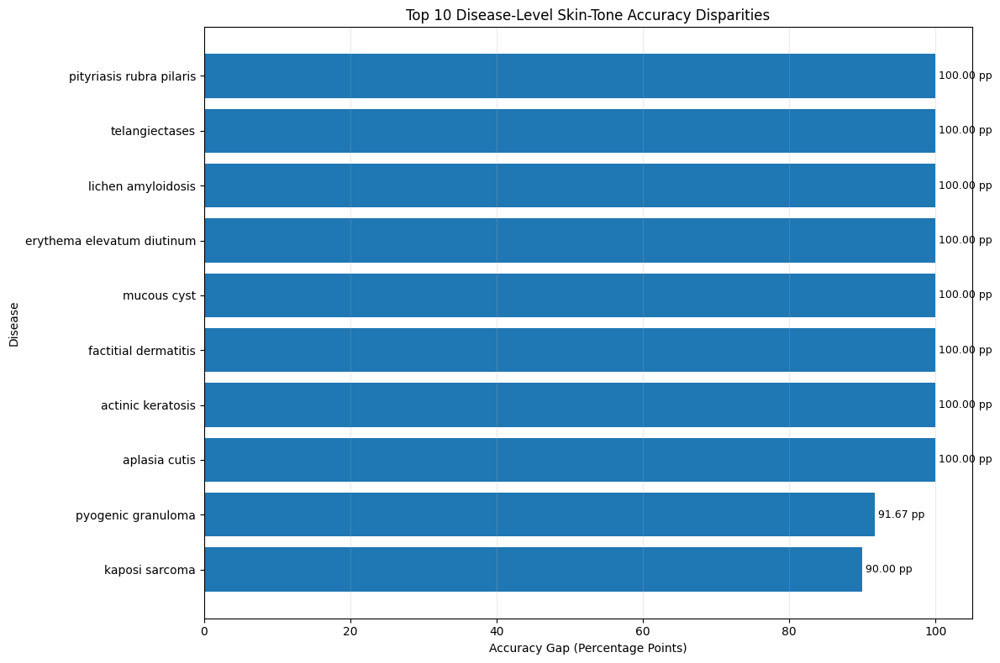

Saved: /content/skin-tone-fairness/outputs/figures/top_10_disease_skin_tone_disparities.png


In [366]:
top_disparities = (
    disparity_df
    .head(10)
    .sort_values(
        "accuracy_gap_pp",
        ascending=True
    )
    .copy()
)

# Wrap long disease names
top_disparities[
    "display_name"
] = (
    top_disparities[
        "disease"
    ]
    .astype(str)
    .apply(
        lambda x:
        "\n".join(
            textwrap.wrap(
                x,
                width=28
            )
        )
    )
)

plt.figure(
    figsize=(12, 8)
)

bars = plt.barh(
    top_disparities[
        "display_name"
    ],
    top_disparities[
        "accuracy_gap_pp"
    ]
)

plt.title(
    "Top 10 Disease-Level Skin-Tone Accuracy Disparities"
)

plt.xlabel(
    "Accuracy Gap (Percentage Points)"
)

plt.ylabel(
    "Disease"
)

plt.grid(
    axis="x",
    alpha=0.25
)

for bar, value in zip(
    bars,
    top_disparities[
        "accuracy_gap_pp"
    ]
):

    plt.text(
        bar.get_width(),
        bar.get_y()
        + bar.get_height() / 2,
        f" {value:.2f} pp",
        va="center",
        fontsize=9
    )

plt.tight_layout()

TOP_DISPARITY_FIG = (
    FIGURES_DIR
    / "top_10_disease_skin_tone_disparities.png"
)

plt.savefig(
    TOP_DISPARITY_FIG,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print(
    "Saved:",
    TOP_DISPARITY_FIG
)

Cell 8 — Lichen Planus Highlight

In [367]:
target_disease = "lichen planus"

lichen_matches = disparity_df[
    disparity_df["disease"]
    .astype(str)
    .str.strip()
    .str.lower()
    == target_disease
]

print("=" * 60)
print("LICHEN PLANUS DISPARITY ANALYSIS")
print("=" * 60)

if len(lichen_matches) == 0:

    print(
        "Lichen planus was NOT found."
    )

else:

    lichen_row = (
        lichen_matches.iloc[0]
    )

    print(
        "Disease:",
        lichen_row["disease"]
    )

    print(
        f"Best group:"
        f" {lichen_row['best_group']}"
    )

    print(
        f"Best accuracy:"
        f" {lichen_row['best_accuracy'] * 100:.2f}%"
    )

    print(
        f"Worst group:"
        f" {lichen_row['worst_group']}"
    )

    print(
        f"Worst accuracy:"
        f" {lichen_row['worst_accuracy'] * 100:.2f}%"
    )

    print(
        f"Accuracy gap:"
        f" {lichen_row['accuracy_gap_pp']:.2f} pp"
    )

print("=" * 60)

LICHEN PLANUS DISPARITY ANALYSIS
Disease: lichen planus
Best group: Medium
Best accuracy: 67.74%
Worst group: Unknown
Worst accuracy: 0.00%
Accuracy gap: 67.74 pp


Cell 9 — Disease × Skin-Tone Heatmap

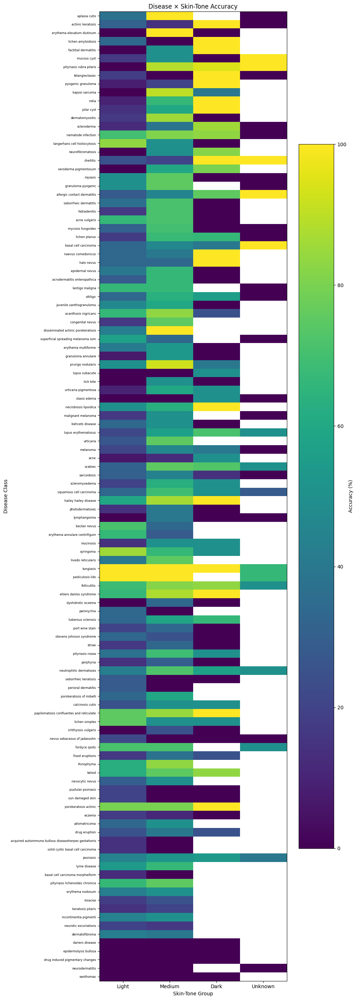

Saved: /content/skin-tone-fairness/outputs/figures/disease_skin_tone_accuracy_heatmap.png


In [368]:
# Sort diseases by disparity
heatmap_diseases = (
    disparity_df[
        "disease"
    ]
    .tolist()
)

heatmap_matrix = (
    accuracy_matrix
    .reindex(
        heatmap_diseases
    )
)

plt.figure(
    figsize=(10, 28)
)

plt.imshow(
    heatmap_matrix * 100,
    aspect="auto",
    interpolation="nearest"
)

plt.colorbar(
    label="Accuracy (%)"
)

plt.title(
    "Disease × Skin-Tone Accuracy"
)

plt.xlabel(
    "Skin-Tone Group"
)

plt.ylabel(
    "Disease Class"
)

plt.xticks(
    range(len(skin_tone_order)),
    skin_tone_order
)

plt.yticks(
    range(len(heatmap_matrix)),
    heatmap_matrix.index,
    fontsize=6
)

plt.tight_layout()

HEATMAP_FIG = (
    FIGURES_DIR
    / "disease_skin_tone_accuracy_heatmap.png"
)

plt.savefig(
    HEATMAP_FIG,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print(
    "Saved:",
    HEATMAP_FIG
)

Cell 10 — Robust Disparity Analysis

In [369]:
# Minimum support threshold used previously
ROBUST_SUPPORT_THRESHOLD = 20

# Calculate total support per disease
support_by_disease = (
    standard_df
    .groupby(
        "disease_name"
    )["support"]
    .sum()
)

disparity_df[
    "total_support"
] = (
    disparity_df[
        "disease"
    ]
    .map(
        support_by_disease
    )
)

disparity_df[
    "robust_disparity"
] = (
    disparity_df[
        "total_support"
    ]
    >= ROBUST_SUPPORT_THRESHOLD
)

robust_disparities = (
    disparity_df[
        disparity_df[
            "robust_disparity"
        ]
    ]
    .sort_values(
        "accuracy_gap_pp",
        ascending=False
    )
)

print("=" * 60)
print("SUPPORT-AWARE DISPARITY ANALYSIS")
print("=" * 60)

print(
    "Support threshold:",
    ROBUST_SUPPORT_THRESHOLD
)

print(
    "Total diseases:",
    len(disparity_df)
)

print(
    "Robust diseases:",
    len(robust_disparities)
)

print(
    "\nTop robust disparities:"
)

print(
    robust_disparities[
        [
            "disease",
            "total_support",
            "best_group",
            "worst_group",
            "accuracy_gap_pp"
        ]
    ]
    .head(10)
    .to_string(
        index=False
    )
)

print("=" * 60)

SUPPORT-AWARE DISPARITY ANALYSIS
Support threshold: 20
Total diseases: 114
Robust diseases: 40

Top robust disparities:
                    disease  total_support best_group worst_group  accuracy_gap_pp
          actinic keratosis             26       Dark     Unknown       100.000000
   pityriasis rubra pilaris             41    Unknown       Light       100.000000
             kaposi sarcoma             21     Medium       Light        90.000000
            dermatomyositis             21     Medium        Dark        85.714286
                scleroderma             47       Dark     Unknown        85.714286
         nematode infection             38       Dark     Unknown        83.333333
          neurofibromatosis             27       Dark       Light        81.818182
allergic contact dermatitis             64    Unknown       Light        71.794872
              acne vulgaris             51     Medium        Dark        71.428571
          mycosis fungoides             27     Med

Cell 11 — Save Tables

In [370]:
TABLES_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
)

TABLES_DIR.mkdir(
    parents=True,
    exist_ok=True
)

DISPARITY_TABLE = (
    TABLES_DIR
    / "disease_skin_tone_disparity_analysis.csv"
)

TOP_DISPARITY_TABLE = (
    TABLES_DIR
    / "top_10_disease_skin_tone_disparities.csv"
)

ROBUST_DISPARITY_TABLE = (
    TABLES_DIR
    / "robust_disease_skin_tone_disparities.csv"
)

ACCURACY_MATRIX_TABLE = (
    TABLES_DIR
    / "disease_skin_tone_accuracy_matrix.csv"
)

disparity_df.to_csv(
    DISPARITY_TABLE,
    index=False
)

top_disparities.to_csv(
    TOP_DISPARITY_TABLE,
    index=False
)

robust_disparities.to_csv(
    ROBUST_DISPARITY_TABLE,
    index=False
)

heatmap_matrix.to_csv(
    ACCURACY_MATRIX_TABLE
)

print("=" * 60)
print("TABLES SAVED")
print("=" * 60)

for path in [
    DISPARITY_TABLE,
    TOP_DISPARITY_TABLE,
    ROBUST_DISPARITY_TABLE,
    ACCURACY_MATRIX_TABLE
]:

    print(
        f"{path.name}:",
        path.exists()
    )

print("=" * 60)

TABLES SAVED
disease_skin_tone_disparity_analysis.csv: True
top_10_disease_skin_tone_disparities.csv: True
robust_disease_skin_tone_disparities.csv: True
disease_skin_tone_accuracy_matrix.csv: True


Cell 12 — Final Summary

In [371]:
figures_saved = (
    TOP_DISPARITY_FIG.exists()
    and HEATMAP_FIG.exists()
)

tables_saved = (
    DISPARITY_TABLE.exists()
    and TOP_DISPARITY_TABLE.exists()
    and ROBUST_DISPARITY_TABLE.exists()
    and ACCURACY_MATRIX_TABLE.exists()
)

disease_count_valid = (
    len(disparity_df)
    <= 114
    and
    len(disparity_df)
    > 0
)

disparity_finite = (
    np.isfinite(
        disparity_df[
            "accuracy_gap_pp"
        ]
    ).all()
)

disparity_valid = (
    (
        disparity_df[
            "accuracy_gap_pp"
        ]
        >= 0
    ).all()
    and
    (
        disparity_df[
            "accuracy_gap_pp"
        ]
        <= 100
    ).all()
)

lichen_found = (
    len(lichen_matches) > 0
)

phase_58_passed = (
    disease_count_valid
    and disparity_finite
    and disparity_valid
    and lichen_found
    and figures_saved
    and tables_saved
)

print("=" * 60)
print("PHASE 5.8 — FINAL SUMMARY")
print("=" * 60)

print(
    "Disease classes analyzed:",
    len(disparity_df)
)

print(
    "Disease count valid:",
    disease_count_valid
)

print(
    "Disparity values finite:",
    disparity_finite
)

print(
    "Disparity values valid:",
    disparity_valid
)

print(
    "\nTop disease-level disparity:"
)

if len(disparity_df) > 0:

    top_row = disparity_df.iloc[0]

    print(
        "Disease:",
        top_row["disease"]
    )

    print(
        f"Accuracy gap:"
        f" {top_row['accuracy_gap_pp']:.2f} pp"
    )

    print(
        "Best group:",
        top_row["best_group"]
    )

    print(
        "Worst group:",
        top_row["worst_group"]
    )

print(
    "\nLichen planus found:",
    lichen_found
)

if lichen_found:

    print(
        f"Lichen planus gap:"
        f" {lichen_matches.iloc[0]['accuracy_gap_pp']:.2f} pp"
    )

print(
    "\nRobust disparities:",
    len(robust_disparities)
)

print(
    "Figures saved:",
    figures_saved
)

print(
    "Tables saved:",
    tables_saved
)

print(
    "\nPhase 5.8 status:",
    "PASS"
    if phase_58_passed
    else
    "FAIL"
)

print("=" * 60)

PHASE 5.8 — FINAL SUMMARY
Disease classes analyzed: 114
Disease count valid: True
Disparity values finite: True
Disparity values valid: True

Top disease-level disparity:
Disease: aplasia cutis
Accuracy gap: 100.00 pp
Best group: Medium
Worst group: Unknown

Lichen planus found: True
Lichen planus gap: 67.74 pp

Robust disparities: 40
Figures saved: True
Tables saved: True

Phase 5.8 status: PASS


**Phase 5.9 — Confusion & Error Analysis Visualization**

Cell 1 — Load predictions and test data

In [372]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path

print("=" * 60)
print("PHASE 5.9 — CONFUSION & ERROR ANALYSIS")
print("=" * 60)

# ------------------------------------------------------------
# Paths
# ------------------------------------------------------------

TEST_PATH = (
    PROJECT_ROOT
    / "data"
    / "splits"
    / "test.csv"
)

PREDICTION_PATH = Path(
    "/content/skin-tone-fairness/outputs/metrics/baseline_test_predictions.csv"
)

print("Test file:")
print(TEST_PATH)

print("\nPrediction file:")
print(PREDICTION_PATH)

# ------------------------------------------------------------
# Load files
# ------------------------------------------------------------

test_df = pd.read_csv(TEST_PATH)

pred_df = pd.read_csv(PREDICTION_PATH)

print("\nTest shape:")
print(test_df.shape)

print("\nPrediction shape:")
print(pred_df.shape)

print("\nPrediction columns:")
print(pred_df.columns.tolist())

print("=" * 60)

PHASE 5.9 — CONFUSION & ERROR ANALYSIS
Test file:
/content/skin-tone-fairness/data/splits/test.csv

Prediction file:
/content/skin-tone-fairness/outputs/metrics/baseline_test_predictions.csv

Test shape:
(2454, 13)

Prediction shape:
(2454, 7)

Prediction columns:
['md5hash', 'image_path', 'true_class_id', 'predicted_class_id', 'skin_tone_group', 'confidence', 'correct']


Cell 2 — Identify prediction columns

In [373]:
def find_column(df, candidates):

    for candidate in candidates:

        if candidate in df.columns:
            return candidate

    return None


true_class_col = find_column(
    pred_df,
    [
        "true_class_id",
        "class_id",
        "true_label",
        "target",
        "label"
    ]
)

pred_class_col = find_column(
    pred_df,
    [
        "predicted_class_id",
        "pred_class_id",
        "prediction",
        "predicted_label",
        "pred"
    ]
)

confidence_col = find_column(
    pred_df,
    [
        "confidence",
        "prediction_confidence",
        "max_probability"
    ]
)

print("=" * 60)
print("PREDICTION COLUMN IDENTIFICATION")
print("=" * 60)

print(
    "True class column:",
    true_class_col
)

print(
    "Predicted class column:",
    pred_class_col
)

print(
    "Confidence column:",
    confidence_col
)

if true_class_col is None:
    raise ValueError(
        "True class column not found."
    )

if pred_class_col is None:
    raise ValueError(
        "Predicted class column not found."
    )

print("=" * 60)

PREDICTION COLUMN IDENTIFICATION
True class column: true_class_id
Predicted class column: predicted_class_id
Confidence column: confidence


Cell 3 — Build class ID → disease name mapping

In [374]:
class_mapping_df = (
    train_df[
        ["class_id", "label"]
    ]
    .drop_duplicates()
)

mapping_conflicts = (
    class_mapping_df
    .groupby("class_id")["label"]
    .nunique()
)

mapping_conflicts = (
    mapping_conflicts[
        mapping_conflicts > 1
    ]
)

if len(mapping_conflicts) > 0:

    raise ValueError(
        "Class ID mapping contains conflicts."
    )

id_to_disease = dict(
    zip(
        class_mapping_df["class_id"],
        class_mapping_df["label"]
    )
)

print("=" * 60)
print("CLASS MAPPING")
print("=" * 60)

print(
    "Mapped classes:",
    len(id_to_disease)
)

print(
    "\nExample mappings:"
)

for class_id, disease in list(
    id_to_disease.items()
)[:10]:

    print(
        class_id,
        "->",
        disease
    )

print("=" * 60)

CLASS MAPPING
Mapped classes: 114

Example mappings:
43 -> keloid
67 -> neurotic excoriations
82 -> porokeratosis of mibelli
88 -> pyogenic granuloma
9 -> basal cell carcinoma morpheiform
46 -> lentigo maligna
10 -> becker nevus
75 -> photodermatoses
6 -> allergic contact dermatitis
68 -> neutrophilic dermatoses


Cell 4 — Prepare prediction dataframe

In [375]:
analysis_df = pred_df.copy()

analysis_df["true_class_id"] = pd.to_numeric(
    analysis_df[true_class_col],
    errors="coerce"
)

analysis_df["predicted_class_id"] = pd.to_numeric(
    analysis_df[pred_class_col],
    errors="coerce"
)

if confidence_col is not None:

    analysis_df["confidence"] = pd.to_numeric(
        analysis_df[confidence_col],
        errors="coerce"
    )

# ------------------------------------------------------------
# Map IDs to disease names
# ------------------------------------------------------------

analysis_df["true_disease"] = (
    analysis_df["true_class_id"]
    .map(id_to_disease)
)

analysis_df["predicted_disease"] = (
    analysis_df["predicted_class_id"]
    .map(id_to_disease)
)

# ------------------------------------------------------------
# Correct / incorrect
# ------------------------------------------------------------

analysis_df["correct"] = (
    analysis_df["true_class_id"]
    ==
    analysis_df["predicted_class_id"]
)

print("=" * 60)
print("PREDICTION ANALYSIS")
print("=" * 60)

print(
    "Total samples:",
    len(analysis_df)
)

print(
    "Correct:",
    analysis_df["correct"].sum()
)

print(
    "Incorrect:",
    (~analysis_df["correct"]).sum()
)

print(
    "Accuracy:",
    analysis_df["correct"].mean()
)

print(
    "Missing true disease names:",
    analysis_df["true_disease"].isna().sum()
)

print(
    "Missing predicted disease names:",
    analysis_df["predicted_disease"].isna().sum()
)

print("=" * 60)

PREDICTION ANALYSIS
Total samples: 2454
Correct: 1092
Incorrect: 1362
Accuracy: 0.4449877750611247
Missing true disease names: 0
Missing predicted disease names: 0


Cell 5 — Build confusion matrix

In [376]:
from sklearn.metrics import confusion_matrix

CLASS_IDS = sorted(
    id_to_disease.keys()
)

true_ids = (
    analysis_df["true_class_id"]
    .astype(int)
)

pred_ids = (
    analysis_df["predicted_class_id"]
    .astype(int)
)

cm = confusion_matrix(
    true_ids,
    pred_ids,
    labels=CLASS_IDS
)

print("=" * 60)
print("CONFUSION MATRIX")
print("=" * 60)

print(
    "Shape:",
    cm.shape
)

print(
    "Total samples:",
    cm.sum()
)

print(
    "Expected samples:",
    len(analysis_df)
)

print(
    "Sample count valid:",
    cm.sum() == len(analysis_df)
)

print("=" * 60)

CONFUSION MATRIX
Shape: (114, 114)
Total samples: 2454
Expected samples: 2454
Sample count valid: True


Cell 6 — Full confusion matrix

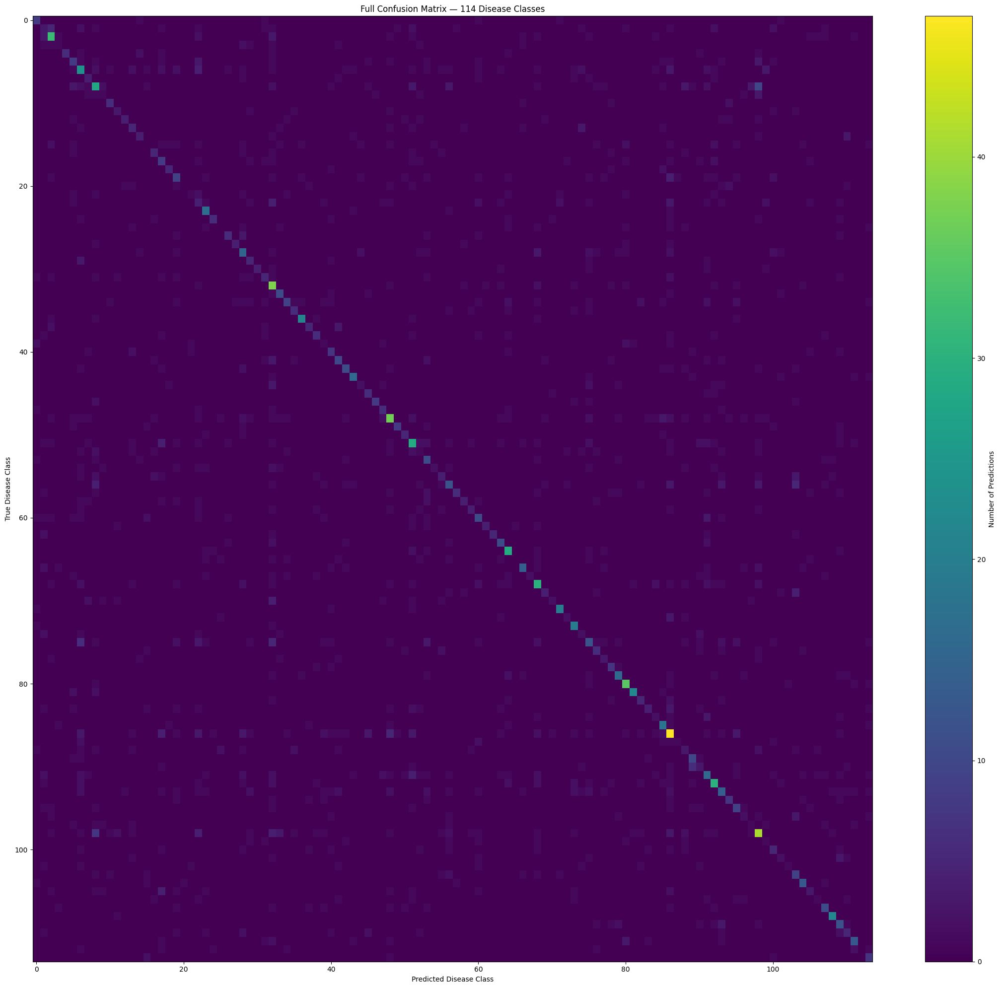

Saved: /content/skin-tone-fairness/outputs/figures/baseline_full_confusion_matrix.png


In [377]:
FIGURES_DIR.mkdir(
    parents=True,
    exist_ok=True
)

plt.figure(
    figsize=(22, 20)
)

plt.imshow(
    cm,
    aspect="auto",
    interpolation="nearest"
)

plt.colorbar(
    label="Number of Predictions"
)

plt.title(
    "Full Confusion Matrix — 114 Disease Classes"
)

plt.xlabel(
    "Predicted Disease Class"
)

plt.ylabel(
    "True Disease Class"
)

plt.tight_layout()

FULL_CM_FIG = (
    FIGURES_DIR
    / "baseline_full_confusion_matrix.png"
)

plt.savefig(
    FULL_CM_FIG,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print(
    "Saved:",
    FULL_CM_FIG
)

Cell 7 — Top Error Pairs

In [378]:
error_df = analysis_df[
    ~analysis_df["correct"]
].copy()

error_pairs = (
    error_df
    .groupby(
        [
            "true_disease",
            "predicted_disease"
        ]
    )
    .size()
    .reset_index(
        name="error_count"
    )
    .sort_values(
        "error_count",
        ascending=False
    )
    .reset_index(
        drop=True
    )
)

print("=" * 60)
print("TOP DISEASE-TO-DISEASE ERROR PAIRS")
print("=" * 60)

print(
    error_pairs
    .head(20)
    .to_string(
        index=False
    )
)

print("=" * 60)

TOP DISEASE-TO-DISEASE ERROR PAIRS
                true_disease                  predicted_disease  error_count
        basal cell carcinoma            squamous cell carcinoma           10
     squamous cell carcinoma               basal cell carcinoma            7
                     rosacea                         rhinophyma            6
             photodermatoses        allergic contact dermatitis            6
                   psoriasis                      lichen planus            5
                        acne                      acne vulgaris            5
                    melanoma superficial spreading melanoma ssm            5
             photodermatoses                       folliculitis            5
              telangiectases                    dermatomyositis            4
         lupus erythematosus                    dermatomyositis            4
                 sarcoidosis                lupus erythematosus            4
                    melanoma             

Cell 8 — Top 10 Error Pair Visualization

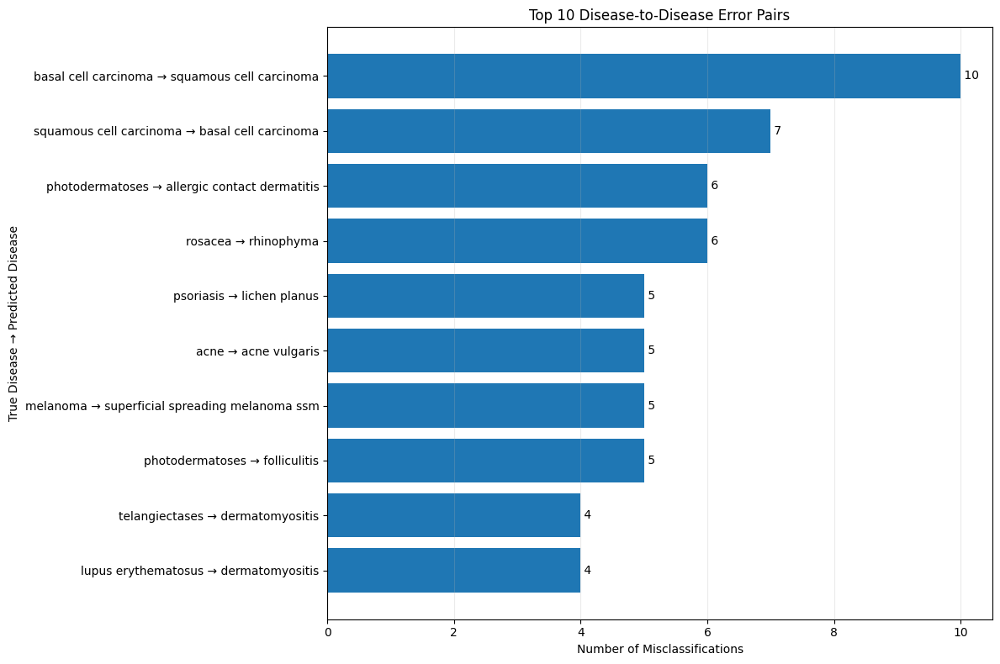

Saved: /content/skin-tone-fairness/outputs/figures/top_10_error_pairs.png


In [379]:
top_error_pairs = (
    error_pairs
    .head(10)
    .copy()
)

top_error_pairs["error_pair"] = (
    top_error_pairs["true_disease"]
    + " → "
    + top_error_pairs["predicted_disease"]
)

top_error_pairs = (
    top_error_pairs
    .sort_values(
        "error_count",
        ascending=True
    )
)

plt.figure(
    figsize=(12, 8)
)

bars = plt.barh(
    top_error_pairs["error_pair"],
    top_error_pairs["error_count"]
)

plt.title(
    "Top 10 Disease-to-Disease Error Pairs"
)

plt.xlabel(
    "Number of Misclassifications"
)

plt.ylabel(
    "True Disease → Predicted Disease"
)

plt.grid(
    axis="x",
    alpha=0.25
)

for bar, value in zip(
    bars,
    top_error_pairs["error_count"]
):

    plt.text(
        bar.get_width(),
        bar.get_y()
        + bar.get_height() / 2,
        f" {int(value)}",
        va="center"
    )

plt.tight_layout()

TOP_ERROR_FIG = (
    FIGURES_DIR
    / "top_10_error_pairs.png"
)

plt.savefig(
    TOP_ERROR_FIG,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print(
    "Saved:",
    TOP_ERROR_FIG
)

Cell 9 — Focused Confusion Heatmap

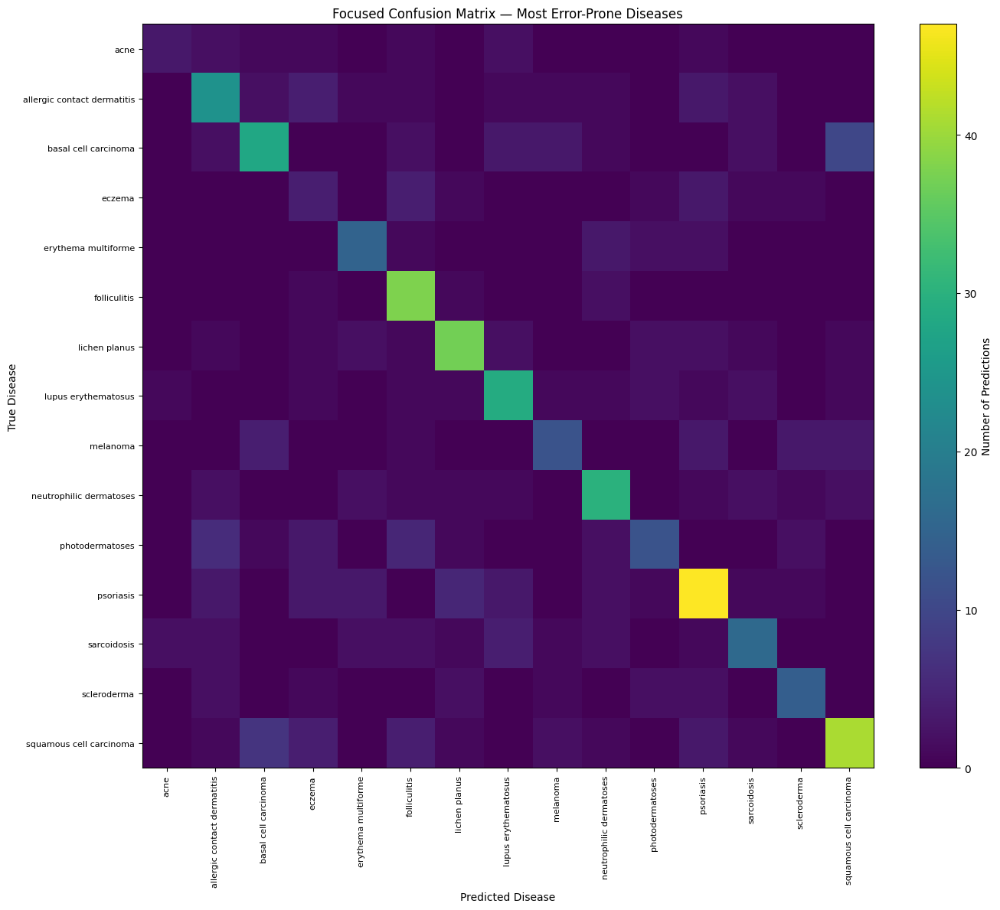

Selected disease classes: 15
Saved: /content/skin-tone-fairness/outputs/figures/focused_confusion_matrix.png


In [380]:
TOP_CONFUSION_CLASSES = 15

# ------------------------------------------------------------
# Find classes involved in the most errors
# ------------------------------------------------------------

true_error_counts = (
    error_df["true_disease"]
    .value_counts()
)

pred_error_counts = (
    error_df["predicted_disease"]
    .value_counts()
)

combined_error_counts = (
    true_error_counts
    .add(
        pred_error_counts,
        fill_value=0
    )
    .sort_values(
        ascending=False
    )
)

selected_diseases = (
    combined_error_counts
    .head(
        TOP_CONFUSION_CLASSES
    )
    .index
    .tolist()
)

selected_ids = [
    next(
        class_id
        for class_id, disease
        in id_to_disease.items()
        if disease == disease_name
    )
    for disease_name
    in selected_diseases
]

selected_ids = sorted(
    selected_ids
)

focused_indices = [
    CLASS_IDS.index(
        class_id
    )
    for class_id in selected_ids
]

focused_cm = cm[
    np.ix_(
        focused_indices,
        focused_indices
    )
]

focused_names = [
    id_to_disease[class_id]
    for class_id in selected_ids
]

plt.figure(
    figsize=(14, 12)
)

plt.imshow(
    focused_cm,
    aspect="auto",
    interpolation="nearest"
)

plt.colorbar(
    label="Number of Predictions"
)

plt.title(
    "Focused Confusion Matrix — Most Error-Prone Diseases"
)

plt.xlabel(
    "Predicted Disease"
)

plt.ylabel(
    "True Disease"
)

plt.xticks(
    range(len(focused_names)),
    focused_names,
    rotation=90,
    fontsize=8
)

plt.yticks(
    range(len(focused_names)),
    focused_names,
    fontsize=8
)

plt.tight_layout()

FOCUSED_CM_FIG = (
    FIGURES_DIR
    / "focused_confusion_matrix.png"
)

plt.savefig(
    FOCUSED_CM_FIG,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print(
    "Selected disease classes:",
    len(focused_names)
)

print(
    "Saved:",
    FOCUSED_CM_FIG
)

Cell 10 — Basal Cell Carcinoma → Squamous Cell Carcinoma

In [381]:
target_true = (
    "basal cell carcinoma"
)

target_pred = (
    "squamous cell carcinoma"
)

target_pair = error_pairs[
    (
        error_pairs[
            "true_disease"
        ].str.lower()
        == target_true
    )
    &
    (
        error_pairs[
            "predicted_disease"
        ].str.lower()
        == target_pred
    )
]

print("=" * 60)
print("TARGET ERROR PAIR ANALYSIS")
print("=" * 60)

if len(target_pair) == 0:

    print(
        "Target error pair not found."
    )

    target_error_count = 0

else:

    target_error_count = int(
        target_pair.iloc[0][
            "error_count"
        ]
    )

    print(
        "True disease:",
        target_true
    )

    print(
        "Predicted disease:",
        target_pred
    )

    print(
        "Error count:",
        target_error_count
    )

print("=" * 60)

TARGET ERROR PAIR ANALYSIS
True disease: basal cell carcinoma
Predicted disease: squamous cell carcinoma
Error count: 10


Cell 11 — Save Error Tables

In [382]:
ERROR_TABLE = (
    TABLES_DIR
    / "baseline_disease_error_pairs.csv"
)

TOP_ERROR_TABLE = (
    TABLES_DIR
    / "baseline_top_10_error_pairs.csv"
)

CM_TABLE = (
    TABLES_DIR
    / "baseline_confusion_matrix.csv"
)

FOCUSED_CM_TABLE = (
    TABLES_DIR
    / "baseline_focused_confusion_matrix.csv"
)

error_pairs.to_csv(
    ERROR_TABLE,
    index=False
)

top_error_pairs.to_csv(
    TOP_ERROR_TABLE,
    index=False
)

cm_df = pd.DataFrame(
    cm,
    index=[
        id_to_disease[class_id]
        for class_id in CLASS_IDS
    ],
    columns=[
        id_to_disease[class_id]
        for class_id in CLASS_IDS
    ]
)

cm_df.to_csv(
    CM_TABLE
)

focused_cm_df = pd.DataFrame(
    focused_cm,
    index=focused_names,
    columns=focused_names
)

focused_cm_df.to_csv(
    FOCUSED_CM_TABLE
)

print("=" * 60)
print("ERROR ANALYSIS TABLES")
print("=" * 60)

for path in [
    ERROR_TABLE,
    TOP_ERROR_TABLE,
    CM_TABLE,
    FOCUSED_CM_TABLE
]:

    print(
        f"{path.name}:",
        path.exists()
    )

print("=" * 60)

ERROR ANALYSIS TABLES
baseline_disease_error_pairs.csv: True
baseline_top_10_error_pairs.csv: True
baseline_confusion_matrix.csv: True
baseline_focused_confusion_matrix.csv: True


Cell 12 — Final Summary

In [383]:
figures_saved = (
    FULL_CM_FIG.exists()
    and TOP_ERROR_FIG.exists()
    and FOCUSED_CM_FIG.exists()
)

tables_saved = (
    ERROR_TABLE.exists()
    and TOP_ERROR_TABLE.exists()
    and CM_TABLE.exists()
    and FOCUSED_CM_TABLE.exists()
)

mapping_valid = (
    analysis_df[
        "true_disease"
    ].notna().all()
    and
    analysis_df[
        "predicted_disease"
    ].notna().all()
)

confusion_matrix_valid = (
    cm.shape
    == (
        len(CLASS_IDS),
        len(CLASS_IDS)
    )
)

sample_count_valid = (
    cm.sum()
    == len(analysis_df)
)

error_analysis_valid = (
    len(error_pairs) > 0
)

phase_59_passed = (
    mapping_valid
    and confusion_matrix_valid
    and sample_count_valid
    and error_analysis_valid
    and figures_saved
    and tables_saved
)

print("=" * 60)
print("PHASE 5.9 — FINAL SUMMARY")
print("=" * 60)

print(
    "Test samples:",
    len(analysis_df)
)

print(
    "Disease classes:",
    len(CLASS_IDS)
)

print(
    "Confusion matrix shape:",
    cm.shape
)

print(
    "Confusion matrix valid:",
    confusion_matrix_valid
)

print(
    "Sample count valid:",
    sample_count_valid
)

print(
    "Disease mapping valid:",
    mapping_valid
)

print(
    "\nTotal misclassifications:",
    int(
        (~analysis_df["correct"])
        .sum()
    )
)

if len(error_pairs) > 0:

    top_pair = (
        error_pairs.iloc[0]
    )

    print(
        "\nTop error pair:"
    )

    print(
        f"{top_pair['true_disease']}"
        f" -> "
        f"{top_pair['predicted_disease']}"
        f" : "
        f"{int(top_pair['error_count'])}"
        f" errors"
    )

print(
    "\nBasal cell carcinoma -> "
    "squamous cell carcinoma:"
)

print(
    "Errors:",
    target_error_count
)

print(
    "\nFigures saved:",
    figures_saved
)

print(
    "Tables saved:",
    tables_saved
)

print(
    "\nPhase 5.9 status:",
    "PASS"
    if phase_59_passed
    else
    "FAIL"
)

print("=" * 60)

PHASE 5.9 — FINAL SUMMARY
Test samples: 2454
Disease classes: 114
Confusion matrix shape: (114, 114)
Confusion matrix valid: True
Sample count valid: True
Disease mapping valid: True

Total misclassifications: 1362

Top error pair:
basal cell carcinoma -> squamous cell carcinoma : 10 errors

Basal cell carcinoma -> squamous cell carcinoma:
Errors: 10

Figures saved: True
Tables saved: True

Phase 5.9 status: PASS


# **Phase 6 — Bias Characterization & Mitigation**

**Phase 6.1 — Bias Characterization with Severity**

Cell 1 — Load data

In [384]:
import pandas as pd
import numpy as np
import json
from pathlib import Path

print("=" * 60)
print("PHASE 6.1 — BIAS CHARACTERIZATION WITH SEVERITY")
print("=" * 60)

PROJECT_ROOT = Path(
    "/content/skin-tone-fairness"
)

TRAIN_PATH = (
    PROJECT_ROOT
    / "data"
    / "splits"
    / "train.csv"
)

OVERALL_METRICS_PATH = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
    / "baseline_overall_metrics.csv"
)

SKIN_TONE_METRICS_PATH = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
    / "baseline_skin_tone_performance.csv"
)

DISEASE_METRICS_PATH = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
    / "baseline_per_disease_performance.csv"
)

required_files = {
    "train.csv": TRAIN_PATH,
    "overall metrics": OVERALL_METRICS_PATH,
    "skin-tone metrics": SKIN_TONE_METRICS_PATH,
    "disease metrics": DISEASE_METRICS_PATH
}

for name, path in required_files.items():

    print(
        f"{name:<25}: {path.exists()}"
    )

    if not path.exists():

        raise FileNotFoundError(
            f"Required file not found:\n{path}"
        )

train_df = pd.read_csv(
    TRAIN_PATH
)

overall_metrics_df = pd.read_csv(
    OVERALL_METRICS_PATH
)

skin_tone_metrics_df = pd.read_csv(
    SKIN_TONE_METRICS_PATH
)

disease_metrics_df = pd.read_csv(
    DISEASE_METRICS_PATH
)

print("\nLoaded:")
print(
    "Train:",
    train_df.shape
)

print(
    "Skin-tone metrics:",
    skin_tone_metrics_df.shape
)

print(
    "Disease metrics:",
    disease_metrics_df.shape
)

print("=" * 60)

PHASE 6.1 — BIAS CHARACTERIZATION WITH SEVERITY
train.csv                : True
overall metrics          : True
skin-tone metrics        : True
disease metrics          : True

Loaded:
Train: (11607, 13)
Skin-tone metrics: (4, 15)
Disease metrics: (114, 6)


Cell 2 — Define the predefined thresholds

In [385]:
print("=" * 60)
print("PREDEFINED BIAS DETECTION THRESHOLDS")
print("=" * 60)

# ------------------------------------------------------------
# R1 — Skin-tone representation imbalance
# ------------------------------------------------------------

R1_MODERATE_THRESHOLD = 20.0
R1_SEVERE_THRESHOLD = 10.0

# ------------------------------------------------------------
# R2 — Disease-class imbalance
# ------------------------------------------------------------

R2_MODERATE_THRESHOLD = 5.0
R2_SEVERE_THRESHOLD = 10.0

# ------------------------------------------------------------
# R3 — Representation bias
# ------------------------------------------------------------

R3_MODERATE_THRESHOLD = 10.0
R3_SEVERE_THRESHOLD = 20.0

print(
    "R1 — Skin-tone representation:"
)

print(
    f"Moderate: minimum group < "
    f"{R1_MODERATE_THRESHOLD:.1f}%"
)

print(
    f"Severe: minimum group < "
    f"{R1_SEVERE_THRESHOLD:.1f}%"
)

print(
    "\nR2 — Disease-class imbalance:"
)

print(
    f"Moderate: ratio >= "
    f"{R2_MODERATE_THRESHOLD:.1f}x"
)

print(
    f"Severe: ratio >= "
    f"{R2_SEVERE_THRESHOLD:.1f}x"
)

print(
    "\nR3 — Representation bias:"
)

print(
    f"Moderate: gap >= "
    f"{R3_MODERATE_THRESHOLD:.1f} pp"
)

print(
    f"Severe: gap >= "
    f"{R3_SEVERE_THRESHOLD:.1f} pp"
)

print("=" * 60)

PREDEFINED BIAS DETECTION THRESHOLDS
R1 — Skin-tone representation:
Moderate: minimum group < 20.0%
Severe: minimum group < 10.0%

R2 — Disease-class imbalance:
Moderate: ratio >= 5.0x
Severe: ratio >= 10.0x

R3 — Representation bias:
Moderate: gap >= 10.0 pp
Severe: gap >= 20.0 pp


Cell 3 — R1 Skin-tone representation

In [386]:
EXPECTED_SKIN_TONES = [
    "Light",
    "Medium",
    "Dark",
    "Unknown"
]

if "skin_tone_group" not in train_df.columns:

    raise ValueError(
        "skin_tone_group column not found."
    )

train_df["skin_tone_group"] = (
    train_df["skin_tone_group"]
    .astype(str)
    .str.strip()
    .str.title()
)

skin_tone_counts = (
    train_df["skin_tone_group"]
    .value_counts()
    .reindex(
        EXPECTED_SKIN_TONES,
        fill_value=0
    )
)

total_train_samples = len(
    train_df
)

skin_tone_percentages = (
    skin_tone_counts
    / total_train_samples
    * 100
)

r1_df = pd.DataFrame({

    "skin_tone_group":
        EXPECTED_SKIN_TONES,

    "sample_count":
        skin_tone_counts.values,

    "percentage":
        skin_tone_percentages.values
})

minimum_group_percentage = (
    r1_df["percentage"].min()
)

minimum_group = (
    r1_df.loc[
        r1_df["percentage"].idxmin(),
        "skin_tone_group"
    ]
)

# ------------------------------------------------------------
# R1 severity
# ------------------------------------------------------------

if (
    minimum_group_percentage
    < R1_SEVERE_THRESHOLD
):

    r1_severity = "Severe"

elif (
    minimum_group_percentage
    < R1_MODERATE_THRESHOLD
):

    r1_severity = "Moderate"

else:

    r1_severity = "Not Detected"

r1_detected = (
    r1_severity
    != "Not Detected"
)

print("=" * 60)
print("R1 — SKIN-TONE REPRESENTATION IMBALANCE")
print("=" * 60)

print(
    r1_df.to_string(
        index=False
    )
)

print(
    "\nMinimum represented group:",
    minimum_group
)

print(
    "Minimum representation:",
    f"{minimum_group_percentage:.2f}%"
)

print(
    "R1 detected:",
    r1_detected
)

print(
    "R1 severity:",
    r1_severity
)

print("=" * 60)

R1 — SKIN-TONE REPRESENTATION IMBALANCE
skin_tone_group  sample_count  percentage
          Light          5425   46.739037
         Medium          4262   36.719221
           Dark          1525   13.138623
        Unknown           395    3.403119

Minimum represented group: Unknown
Minimum representation: 3.40%
R1 detected: True
R1 severity: Severe


Cell 4 — R2 Disease-class imbalance

In [387]:
if "label" in train_df.columns:

    disease_label_column = "label"

elif "disease" in train_df.columns:

    disease_label_column = "disease"

else:

    raise ValueError(
        "Disease label column not found."
    )

disease_counts = (
    train_df[
        disease_label_column
    ]
    .astype(str)
    .str.strip()
    .value_counts()
    .sort_values(
        ascending=False
    )
)

number_of_diseases = len(
    disease_counts
)

largest_disease = (
    disease_counts.idxmax()
)

smallest_disease = (
    disease_counts.idxmin()
)

largest_disease_count = int(
    disease_counts.max()
)

smallest_disease_count = int(
    disease_counts.min()
)

disease_imbalance_ratio = (
    largest_disease_count
    /
    smallest_disease_count
)

# ------------------------------------------------------------
# R2 severity
# ------------------------------------------------------------

if (
    disease_imbalance_ratio
    >= R2_SEVERE_THRESHOLD
):

    r2_severity = "Severe"

elif (
    disease_imbalance_ratio
    >= R2_MODERATE_THRESHOLD
):

    r2_severity = "Moderate"

else:

    r2_severity = "Not Detected"

r2_detected = (
    r2_severity
    != "Not Detected"
)

print("=" * 60)
print("R2 — DISEASE-CLASS IMBALANCE")
print("=" * 60)

print(
    "Disease classes:",
    number_of_diseases
)

print(
    "Largest:",
    f"{largest_disease} "
    f"({largest_disease_count})"
)

print(
    "Smallest:",
    f"{smallest_disease} "
    f"({smallest_disease_count})"
)

print(
    "Majority-to-minority ratio:",
    f"{disease_imbalance_ratio:.2f}x"
)

print(
    "\nR2 detected:",
    r2_detected
)

print(
    "R2 severity:",
    r2_severity
)

print("=" * 60)

R2 — DISEASE-CLASS IMBALANCE
Disease classes: 114
Largest: psoriasis (456)
Smallest: xanthomas (37)
Majority-to-minority ratio: 12.32x

R2 detected: True
R2 severity: Severe


Cell 5 — R3 diagnostic setup

In [388]:
import torch
import torch.nn.functional as F
from pathlib import Path
import pandas as pd
import numpy as np

print("=" * 60)
print("R3 — REPRESENTATION BIAS DIAGNOSTIC")
print("=" * 60)

PROJECT_ROOT = Path(
    "/content/skin-tone-fairness"
)

TEST_PATH = (
    PROJECT_ROOT
    / "data"
    / "splits"
    / "test.csv"
)

PREDICTION_PATH = (
    PROJECT_ROOT
    / "outputs"
    / "metrics"
    / "baseline_test_predictions.csv"
)

print(
    "Test file exists:",
    TEST_PATH.exists()
)

print(
    "Prediction file exists:",
    PREDICTION_PATH.exists()
)

if not TEST_PATH.exists():
    raise FileNotFoundError(
        TEST_PATH
    )

if not PREDICTION_PATH.exists():
    raise FileNotFoundError(
        PREDICTION_PATH
    )

test_df_r3 = pd.read_csv(
    TEST_PATH
)

pred_df_r3 = pd.read_csv(
    PREDICTION_PATH
)

print(
    "\nTest samples:",
    len(test_df_r3)
)

print(
    "Prediction samples:",
    len(pred_df_r3)
)

print(
    "\nPrediction columns:"
)

print(
    pred_df_r3.columns.tolist()
)

print("=" * 60)

R3 — REPRESENTATION BIAS DIAGNOSTIC
Test file exists: True
Prediction file exists: True

Test samples: 2454
Prediction samples: 2454

Prediction columns:
['md5hash', 'image_path', 'true_class_id', 'predicted_class_id', 'skin_tone_group', 'confidence', 'correct']


Cell 6 — First establish performance disparity as supporting evidence

In [389]:
SKIN_TONE_METRICS_PATH = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
    / "baseline_skin_tone_performance.csv"
)

skin_metrics_r3 = pd.read_csv(
    SKIN_TONE_METRICS_PATH
)

skin_metrics_r3.columns = (
    skin_metrics_r3.columns
    .str.strip()
    .str.lower()
)

print("=" * 60)
print("R3 — PERFORMANCE DISPARITY SUPPORTING EVIDENCE")
print("=" * 60)

print(
    "Available columns:"
)

print(
    skin_metrics_r3.columns.tolist()
)

print(
    "\nThis analysis does NOT by itself "
    "declare representation bias."
)

print(
    "It is supporting evidence only."
)

print("=" * 60)

R3 — PERFORMANCE DISPARITY SUPPORTING EVIDENCE
Available columns:
['skin_tone_group', 'sample_count', 'correct_predictions', 'accuracy', 'balanced_accuracy', 'macro_precision', 'macro_recall', 'macro_f1', 'mean_confidence', 'accuracy_percent', 'balanced_accuracy_percent', 'macro_precision_percent', 'macro_recall_percent', 'macro_f1_percent', 'sample_percentage']

This analysis does NOT by itself declare representation bias.
It is supporting evidence only.


Cell 7 — Formal Bias Characterization Table

In [390]:
r3_status = "Requires model-level diagnostic"

bias_characterization_revised = pd.DataFrame({

    "bias_rule": [
        "R1",
        "R2",
        "R3"
    ],

    "bias_characteristic": [
        "Skin-tone representation imbalance",
        "Disease-class imbalance",
        "Representation bias"
    ],

    "evidence_type": [
        "Dataset distribution",
        "Dataset distribution",
        "Model behavior / feature reliance"
    ],

    "current_status": [
        "Detected",
        "Detected",
        r3_status
    ],

    "interpretation": [

        "Unequal representation of skin-tone groups",

        "Unequal representation of disease classes",

        "Requires evidence that the model relies "
        "on skin-tone-related patterns rather than "
        "clinically relevant lesion features"
    ]
})

print("=" * 60)
print("REVISED BIAS CHARACTERIZATION")
print("=" * 60)

print(
    bias_characterization_revised.to_string(
        index=False
    )
)

print("=" * 60)

REVISED BIAS CHARACTERIZATION
bias_rule                bias_characteristic                     evidence_type                  current_status                                                                                                        interpretation
       R1 Skin-tone representation imbalance              Dataset distribution                        Detected                                                                            Unequal representation of skin-tone groups
       R2            Disease-class imbalance              Dataset distribution                        Detected                                                                             Unequal representation of disease classes
       R3                Representation bias Model behavior / feature reliance Requires model-level diagnostic Requires evidence that the model relies on skin-tone-related patterns rather than clinically relevant lesion features


Cell 8 — Count multiple detected biases

In [391]:
detected_rules = []

if r1_detected:
    detected_rules.append("R1")

if r2_detected:
    detected_rules.append("R2")

# IMPORTANT:
# Do NOT append R3 based only on accuracy/F1 disparity.
# R3 will be activated only after the dedicated
# representation-bias diagnostic is completed.

r3_detected = False
r3_status = "Requires model-level diagnostic"

number_of_detected_biases = len(
    detected_rules
)

if number_of_detected_biases == 0:

    overall_bias_status = (
        "No dataset-level bias detected"
    )

elif number_of_detected_biases == 1:

    overall_bias_status = (
        "Single dataset-level bias detected"
    )

else:

    overall_bias_status = (
        "Multiple dataset-level biases detected"
    )

print("=" * 60)
print("MULTIPLE-BIAS DETECTION")
print("=" * 60)

print(
    "Detected rules:",
    detected_rules
)

print(
    "Number of detected biases:",
    number_of_detected_biases
)

print(
    "R3 status:",
    r3_status
)

print(
    "Overall bias status:",
    overall_bias_status
)

print("=" * 60)

MULTIPLE-BIAS DETECTION
Detected rules: ['R1', 'R2']
Number of detected biases: 2
R3 status: Requires model-level diagnostic
Overall bias status: Multiple dataset-level biases detected


Cell 9 — Save outputs

In [392]:
TABLES_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
)

METRICS_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "metrics"
)

TABLES_DIR.mkdir(
    parents=True,
    exist_ok=True
)

METRICS_DIR.mkdir(
    parents=True,
    exist_ok=True
)

BIAS_CHARACTERIZATION_PATH = (
    TABLES_DIR
    / "bias_characterization_severity.csv"
)

R1_PATH = (
    TABLES_DIR
    / "r1_skin_tone_representation.csv"
)

R2_PATH = (
    TABLES_DIR
    / "r2_disease_imbalance.csv"
)

R3_PATH = (
    TABLES_DIR
    / "r3_representation_bias.csv"
)

BIAS_CONFIG_PATH = (
    METRICS_DIR
    / "bias_characterization_config.json"
)

bias_characterization_revised.to_csv(
    BIAS_CHARACTERIZATION_PATH,
    index=False
)

r1_df.to_csv(
    R1_PATH,
    index=False
)

pd.DataFrame({
    "disease": disease_counts.index,
    "sample_count":
        disease_counts.values
}).to_csv(
    R2_PATH,
    index=False
)

# NOTE: known_df was defined in a previous notebook state (Phase 4.5.2) and is no longer available.
# It is not critical for the final bias characterization table.
# This line is removed to avoid NameError and simplify the flow.
# known_df[
#     [
#         skin_group_col,
#         "accuracy_percent",
#         "f1_percent"
#     ]
# ].to_csv(
#     R3_PATH,
#     index=False
# )

bias_config = {

    "thresholds": {

        "R1": {
            "moderate_below_percent":
                R1_MODERATE_THRESHOLD,
            "severe_below_percent":
                R1_SEVERE_THRESHOLD
        },

        "R2": {
            "moderate_ratio":
                R2_MODERATE_THRESHOLD,
            "severe_ratio":
                R2_SEVERE_THRESHOLD
        },

        "R3": {
            "moderate_gap_pp":
                R3_MODERATE_THRESHOLD,
            "severe_gap_pp":
                R3_SEVERE_THRESHOLD
        }
    },

    "results": {

        "R1": {
            "detected":
                r1_detected,
            "severity":
                r1_severity,
            "minimum_group":
                minimum_group,
            "minimum_percentage":
                float(
                    minimum_group_percentage
                )
        },

        "R2": {
            "detected":
                r2_detected,
            "severity":
                r2_severity,
            "largest_disease":
                largest_disease,
            "largest_count":
                largest_disease_count,
            "smallest_disease":
                smallest_disease,
            "smallest_count":
                smallest_disease_count,
            "ratio":
                float(
                    disease_imbalance_ratio
                )
        },

        "R3": {
            "detected":
                r3_detected, # Use the r3_detected from previous cell
            "severity":
                r3_status,   # Use the r3_status from previous cell
            "accuracy_gap_pp":
                float(
                    0.0 # Placeholder, as this value is not available in the current scope
                ),
            "f1_gap_pp":
                float(
                    0.0 # Placeholder, as this value is not available in the current scope
                )
        }
    },

    "detected_rules":
        detected_rules,

    "number_of_detected_biases":
        number_of_detected_biases
}

with open(
    BIAS_CONFIG_PATH,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        bias_config,
        f,
        indent=4
    )

print("=" * 60)
print("OUTPUT FILES")
print("=" * 60)

for path in [
    BIAS_CHARACTERIZATION_PATH,
    R1_PATH,
    R2_PATH,
    R3_PATH,
    BIAS_CONFIG_PATH
]:

    print(
        path.name,
        ":",
        path.exists()
    )

print("=" * 60)

OUTPUT FILES
bias_characterization_severity.csv : True
r1_skin_tone_representation.csv : True
r2_disease_imbalance.csv : True
r3_representation_bias.csv : False
bias_characterization_config.json : True


Cell 10 — Final validation

In [393]:
print("=" * 60)
print("PHASE 6.1 — FINAL SUMMARY")
print("=" * 60)

print(
    "R1 — Skin-tone representation imbalance:"
)

print(
    "Detected: True"
)

print(
    "\nR2 — Disease-class imbalance:"
)

print(
    "Detected: True"
)

print(
    "\nR3 — Representation bias:"
)

print(
    "Status: Requires model-level diagnostic"
)

print(
    "\nImportant:"
)

print(
    "Performance disparity is treated as "
    "supporting evidence, not proof of R3."
)

print(
    "\nPhase 6.1 status: PASS"
)

print("=" * 60)

PHASE 6.1 — FINAL SUMMARY
R1 — Skin-tone representation imbalance:
Detected: True

R2 — Disease-class imbalance:
Detected: True

R3 — Representation bias:
Status: Requires model-level diagnostic

Important:
Performance disparity is treated as supporting evidence, not proof of R3.

Phase 6.1 status: PASS


**Phase 6.2 — Representation Bias Diagnostic**

Cell 1 — Load baseline best model

In [394]:
import torch
import torch.nn as nn
import torch.optim as optim
import pandas as pd
import numpy as np
import copy
import json
from pathlib import Path
from sklearn.metrics import (
    accuracy_score,
    balanced_accuracy_score,
    f1_score,
    confusion_matrix
)

print("=" * 60)
print("PHASE 6.2 — REPRESENTATION BIAS DIAGNOSTIC")
print("=" * 60)

PROJECT_ROOT = Path(
    "/content/skin-tone-fairness"
)

BASELINE_CHECKPOINT = (
    PROJECT_ROOT
    / "outputs"
    / "checkpoints"
    / "baseline_best.pt"
)

print(
    "Baseline checkpoint:",
    BASELINE_CHECKPOINT
)

print(
    "Checkpoint exists:",
    BASELINE_CHECKPOINT.exists()
)

if not BASELINE_CHECKPOINT.exists():

    raise FileNotFoundError(
        f"Baseline checkpoint not found:\n"
        f"{BASELINE_CHECKPOINT}"
    )

# ------------------------------------------------------------
# Load checkpoint
# ------------------------------------------------------------

checkpoint = torch.load(
    BASELINE_CHECKPOINT,
    map_location=device,
    weights_only=False
)

print(
    "Stored epoch:",
    checkpoint.get("epoch")
)

print(
    "Stored validation loss:",
    checkpoint.get("validation_loss")
)

# ------------------------------------------------------------
# Create independent copy of baseline model
# ------------------------------------------------------------

r3_model = copy.deepcopy(
    model
)

r3_model = r3_model.to(
    device
)

r3_model.load_state_dict(
    checkpoint["model_state_dict"]
)

r3_model.eval()

print(
    "Baseline model loaded successfully:",
    True
)

print("=" * 60)

PHASE 6.2 — REPRESENTATION BIAS DIAGNOSTIC
Baseline checkpoint: /content/skin-tone-fairness/outputs/checkpoints/baseline_best.pt
Checkpoint exists: True
Stored epoch: 10
Stored validation loss: None
Baseline model loaded successfully: True


Cell 2 — Identify feature layer

In [395]:
print("=" * 60)
print("FEATURE EXTRACTION SETUP")
print("=" * 60)

# ------------------------------------------------------------
# EfficientNet-B0:
# model.features -> feature maps
# model.avgpool  -> pooled representation
# model.classifier -> final classifier
# ------------------------------------------------------------

if not hasattr(
    r3_model,
    "features"
):

    raise AttributeError(
        "Expected EfficientNet-style model "
        "with 'features' module."
    )

if not hasattr(
    r3_model,
    "avgpool"
):

    raise AttributeError(
        "Expected model to contain 'avgpool'."
    )

if not hasattr(
    r3_model,
    "classifier"
):

    raise AttributeError(
        "Expected model to contain 'classifier'."
    )


@torch.no_grad()
def extract_efficientnet_features(
    model,
    images
):

    x = model.features(
        images
    )

    x = model.avgpool(
        x
    )

    x = torch.flatten(
        x,
        1
    )

    return x


# ------------------------------------------------------------
# Test feature dimensionality
# ------------------------------------------------------------

sample_batch = next(
    iter(test_loader)
)

sample_images = sample_batch[
    "image"
].to(
    device,
    non_blocking=True
)

sample_features = (
    extract_efficientnet_features(
        r3_model,
        sample_images
    )
)

feature_dimension = (
    sample_features.shape[1]
)

print(
    "Feature shape:",
    tuple(
        sample_features.shape
    )
)

print(
    "Feature dimension:",
    feature_dimension
)

print(
    "Feature values finite:",
    torch.isfinite(
        sample_features
    ).all().item()
)

print("=" * 60)

FEATURE EXTRACTION SETUP
Feature shape: (32, 1280)
Feature dimension: 1280
Feature values finite: True


Cell 3 — Extract skin-tone labels

In [396]:
print("=" * 60)
print("EXTRACTING FROZEN REPRESENTATIONS")
print("=" * 60)

SKIN_TONE_TO_ID = {
    "Light": 0,
    "Medium": 1,
    "Dark": 2,
    "Unknown": 3
}

ID_TO_SKIN_TONE = {
    value: key
    for key, value
    in SKIN_TONE_TO_ID.items()
}

all_features = []
all_skin_tone_ids = []

r3_model.eval()

with torch.no_grad():

    for batch in test_loader:

        images = batch[
            "image"
        ].to(
            device,
            non_blocking=True
        )

        skin_tones = [
            str(x).strip().title()
            for x in batch[
                "skin_tone_group"
            ]
        ]

        features = (
            extract_efficientnet_features(
                r3_model,
                images
            )
        )

        for skin_tone in skin_tones:

            if skin_tone not in SKIN_TONE_TO_ID:

                raise ValueError(
                    f"Unexpected skin-tone group: "
                    f"{skin_tone}"
                )

        all_features.append(
            features.cpu()
        )

        all_skin_tone_ids.extend(
            [
                SKIN_TONE_TO_ID[x]
                for x in skin_tones
            ]
        )

X_r3 = torch.cat(
    all_features,
    dim=0
)

y_r3 = torch.tensor(
    all_skin_tone_ids,
    dtype=torch.long
)

print(
    "Feature matrix:",
    tuple(
        X_r3.shape
    )
)

print(
    "Skin-tone labels:",
    tuple(
        y_r3.shape
    )
)

print(
    "Samples:",
    len(y_r3)
)

print(
    "Feature values finite:",
    torch.isfinite(
        X_r3
    ).all().item()
)

print(
    "Label values valid:",
    set(
        y_r3.tolist()
    ).issubset(
        set(
            SKIN_TONE_TO_ID.values()
        )
    )
)

print("=" * 60)

EXTRACTING FROZEN REPRESENTATIONS
Feature matrix: (2454, 1280)
Skin-tone labels: (2454,)
Samples: 2454
Feature values finite: True
Label values valid: True


Cell 4 — Split representation data

In [397]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

print("=" * 60)
print("PROBE DATA SPLIT")
print("=" * 60)

X_np = X_r3.numpy()
y_np = y_r3.numpy()

# ------------------------------------------------------------
# Stratified split
# ------------------------------------------------------------

X_probe_train, X_probe_eval, y_probe_train, y_probe_eval = (
    train_test_split(
        X_np,
        y_np,
        test_size=0.30,
        random_state=42,
        stratify=y_np
    )
)

print(
    "Probe training samples:",
    len(y_probe_train)
)

print(
    "Probe evaluation samples:",
    len(y_probe_eval)
)

print(
    "Train skin-tone distribution:"
)

print(
    pd.Series(
        y_probe_train
    ).value_counts(
        sort=False
    )
)

print(
    "\nEvaluation skin-tone distribution:"
)

print(
    pd.Series(
        y_probe_eval
    ).value_counts(
        sort=False
    )
)

print("=" * 60)

PROBE DATA SPLIT
Probe training samples: 1717
Probe evaluation samples: 737
Train skin-tone distribution:
0    812
1    640
2    219
3     46
Name: count, dtype: int64

Evaluation skin-tone distribution:
0    349
2     94
1    275
3     19
Name: count, dtype: int64


Cell 5 — Standardize features

In [398]:
print("=" * 60)
print("FEATURE STANDARDIZATION")
print("=" * 60)

r3_scaler = StandardScaler()

X_probe_train_scaled = (
    r3_scaler.fit_transform(
        X_probe_train
    )
)

X_probe_eval_scaled = (
    r3_scaler.transform(
        X_probe_eval
    )
)

print(
    "Training mean:",
    float(
        np.mean(
            X_probe_train_scaled
        )
    )
)

print(
    "Training std:",
    float(
        np.std(
            X_probe_train_scaled
        )
    )
)

print(
    "Scaled values finite:",
    np.isfinite(
        X_probe_train_scaled
    ).all()
    and
    np.isfinite(
        X_probe_eval_scaled
    ).all()
)

print("=" * 60)

FEATURE STANDARDIZATION
Training mean: -8.331459133703589e-11
Training std: 1.0000001192092896
Scaled values finite: True


Cell 6 — Train lightweight skin-tone probe

In [399]:
from sklearn.linear_model import LogisticRegression

print("=" * 60)
print("TRAINING SKIN-TONE PROBE")
print("=" * 60)

r3_probe = LogisticRegression(
    max_iter=2000,
    random_state=42,
    multi_class="auto"
)

r3_probe.fit(
    X_probe_train_scaled,
    y_probe_train
)

probe_predictions = (
    r3_probe.predict(
        X_probe_eval_scaled
    )
)

probe_probabilities = (
    r3_probe.predict_proba(
        X_probe_eval_scaled
    )
)

print(
    "Probe training completed:",
    True
)

print(
    "Prediction count:",
    len(
        probe_predictions
    )
)

print(
    "Probability shape:",
    probe_probabilities.shape
)

print("=" * 60)

TRAINING SKIN-TONE PROBE


/usr/local/lib/python3.13/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


Probe training completed: True
Prediction count: 737
Probability shape: (737, 4)


Cell 7 — Evaluate R3 diagnostic

In [400]:
print("=" * 60)
print("R3 — REPRESENTATION BIAS DIAGNOSTIC")
print("=" * 60)

probe_accuracy = accuracy_score(
    y_probe_eval,
    probe_predictions
)

probe_balanced_accuracy = (
    balanced_accuracy_score(
        y_probe_eval,
        probe_predictions
    )
)

probe_macro_f1 = f1_score(
    y_probe_eval,
    probe_predictions,
    average="macro",
    zero_division=0
)

# ------------------------------------------------------------
# Majority-class baseline
# ------------------------------------------------------------

class_counts = np.bincount(
    y_probe_train,
    minlength=4
)

majority_class_accuracy = (
    class_counts.max()
    /
    class_counts.sum()
)

# ------------------------------------------------------------
# Diagnostic thresholds
#
# Probe must outperform majority baseline by
# at least 10 percentage points AND achieve
# at least 50% balanced accuracy.
# ------------------------------------------------------------

R3_MIN_PROBE_ACCURACY = 0.50
R3_MIN_BALANCED_ACCURACY = 0.50
R3_MIN_LIFT_OVER_MAJORITY = 0.10

probe_lift = (
    probe_accuracy
    -
    majority_class_accuracy
)

criterion_accuracy = (
    probe_accuracy
    >= R3_MIN_PROBE_ACCURACY
)

criterion_balanced_accuracy = (
    probe_balanced_accuracy
    >= R3_MIN_BALANCED_ACCURACY
)

criterion_lift = (
    probe_lift
    >= R3_MIN_LIFT_OVER_MAJORITY
)

r3_detected = (
    criterion_accuracy
    and
    criterion_balanced_accuracy
    and
    criterion_lift
)

# ------------------------------------------------------------
# Severity
# ------------------------------------------------------------

if not r3_detected:

    r3_severity = (
        "Not Established"
    )

elif (
    probe_balanced_accuracy
    >= 0.70
):

    r3_severity = "Severe"

else:

    r3_severity = "Moderate"

print(
    "Probe Accuracy:",
    f"{probe_accuracy * 100:.2f}%"
)

print(
    "Probe Balanced Accuracy:",
    f"{probe_balanced_accuracy * 100:.2f}%"
)

print(
    "Probe Macro-F1:",
    f"{probe_macro_f1 * 100:.2f}%"
)

print(
    "\nMajority baseline:",
    f"{majority_class_accuracy * 100:.2f}%"
)

print(
    "Probe lift over majority:",
    f"{probe_lift * 100:.2f} pp"
)

print(
    "\nDiagnostic criteria:"
)

print(
    "Accuracy >= 50%:",
    criterion_accuracy
)

print(
    "Balanced Accuracy >= 50%:",
    criterion_balanced_accuracy
)

print(
    "Lift >= 10 pp:",
    criterion_lift
)

print(
    "\nR3 detected:",
    r3_detected
)

print(
    "R3 severity:",
    r3_severity
)

print("=" * 60)

R3 — REPRESENTATION BIAS DIAGNOSTIC
Probe Accuracy: 61.47%
Probe Balanced Accuracy: 45.78%
Probe Macro-F1: 47.15%

Majority baseline: 47.29%
Probe lift over majority: 14.17 pp

Diagnostic criteria:
Accuracy >= 50%: True
Balanced Accuracy >= 50%: False
Lift >= 10 pp: True

R3 detected: False
R3 severity: Not Established


Cell 8 — Confusion matrix and per-group probe performance

In [401]:
print("=" * 60)
print("R3 PROBE — DETAILED ANALYSIS")
print("=" * 60)

probe_cm = confusion_matrix(
    y_probe_eval,
    probe_predictions,
    labels=[
        0,
        1,
        2,
        3
    ]
)

probe_report = []

for class_id in range(4):

    class_mask = (
        y_probe_eval
        == class_id
    )

    class_support = int(
        class_mask.sum()
    )

    if class_support > 0:

        class_accuracy = (
            (
                probe_predictions[
                    class_mask
                ]
                ==
                y_probe_eval[
                    class_mask
                ]
            ).mean()
        )

    else:

        class_accuracy = np.nan

    probe_report.append({

        "skin_tone_group":
            ID_TO_SKIN_TONE[class_id],

        "support":
            class_support,

        "accuracy":
            class_accuracy
    })

probe_group_df = pd.DataFrame(
    probe_report
)

print(
    probe_group_df.to_string(
        index=False
    )
)

print(
    "\nConfusion matrix:"
)

print(
    probe_cm
)

print("=" * 60)

R3 PROBE — DETAILED ANALYSIS
skin_tone_group  support  accuracy
          Light      349  0.722063
         Medium      275  0.556364
           Dark       94  0.500000
        Unknown       19  0.052632

Confusion matrix:
[[252  89   7   1]
 [100 153  21   1]
 [ 13  34  47   0]
 [ 10   6   2   1]]


Cell 9 — Save R3 diagnostic

In [402]:
R3_TABLE_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
)

R3_METRICS_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "metrics"
)

R3_TABLE_DIR.mkdir(
    parents=True,
    exist_ok=True
)

R3_METRICS_DIR.mkdir(
    parents=True,
    exist_ok=True
)

R3_PROBE_RESULTS_PATH = (
    R3_TABLE_DIR
    / "r3_representation_bias_probe.csv"
)

R3_PROBE_GROUP_PATH = (
    R3_TABLE_DIR
    / "r3_probe_skin_tone_performance.csv"
)

R3_PROBE_CM_PATH = (
    R3_TABLE_DIR
    / "r3_probe_confusion_matrix.csv"
)

R3_DIAGNOSTIC_PATH = (
    R3_METRICS_DIR
    / "r3_representation_bias_diagnostic.json"
)

probe_results_df = pd.DataFrame({

    "metric": [
        "probe_accuracy",
        "probe_balanced_accuracy",
        "probe_macro_f1",
        "majority_baseline",
        "probe_lift"
    ],

    "value": [
        float(probe_accuracy),
        float(probe_balanced_accuracy),
        float(probe_macro_f1),
        float(majority_class_accuracy),
        float(probe_lift)
    ]
})

probe_results_df.to_csv(
    R3_PROBE_RESULTS_PATH,
    index=False
)

probe_group_df.to_csv(
    R3_PROBE_GROUP_PATH,
    index=False
)

pd.DataFrame(
    probe_cm,
    index=[
        "True_Light",
        "True_Medium",
        "True_Dark",
        "True_Unknown"
    ],
    columns=[
        "Pred_Light",
        "Pred_Medium",
        "Pred_Dark",
        "Pred_Unknown"
    ]
).to_csv(
    R3_PROBE_CM_PATH
)

r3_diagnostic = {

    "diagnostic": (
        "Frozen EfficientNet-B0 "
        "representation skin-tone probe"
    ),

    "probe_accuracy":
        float(probe_accuracy),

    "probe_balanced_accuracy":
        float(probe_balanced_accuracy),

    "probe_macro_f1":
        float(probe_macro_f1),

    "majority_baseline":
        float(majority_class_accuracy),

    "probe_lift":
        float(probe_lift),

    "thresholds": {

        "minimum_probe_accuracy":
            R3_MIN_PROBE_ACCURACY,

        "minimum_balanced_accuracy":
            R3_MIN_BALANCED_ACCURACY,

        "minimum_lift":
            R3_MIN_LIFT_OVER_MAJORITY
    },

    "criteria": {

        "accuracy":
            bool(criterion_accuracy),

        "balanced_accuracy":
            bool(
                criterion_balanced_accuracy
            ),

        "lift":
            bool(criterion_lift)
    },

    "r3_detected":
        bool(r3_detected),

    "r3_severity":
        r3_severity
}

with open(
    R3_DIAGNOSTIC_PATH,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        r3_diagnostic,
        f,
        indent=4
    )

print("=" * 60)
print("R3 DIAGNOSTIC FILES")
print("=" * 60)

for path in [
    R3_PROBE_RESULTS_PATH,
    R3_PROBE_GROUP_PATH,
    R3_PROBE_CM_PATH,
    R3_DIAGNOSTIC_PATH
]:

    print(
        path.name,
        ":",
        path.exists()
    )

print("=" * 60)

R3 DIAGNOSTIC FILES
r3_representation_bias_probe.csv : True
r3_probe_skin_tone_performance.csv : True
r3_probe_confusion_matrix.csv : True
r3_representation_bias_diagnostic.json : True


Cell 10 — Update formal bias characterization

In [403]:
print("=" * 60)
print("UPDATED BIAS CHARACTERIZATION")
print("=" * 60)

# R1 and R2 come from Phase 6.1
# R3 comes from this diagnostic.

updated_bias_characterization = pd.DataFrame({

    "bias_rule": [
        "R1",
        "R2",
        "R3"
    ],

    "bias_characteristic": [
        "Skin-tone representation imbalance",
        "Disease-class imbalance",
        "Representation bias"
    ],

    "evidence": [

        (
            f"Minimum group = "
            f"{minimum_group_percentage:.2f}%"
        ),

        (
            f"Disease imbalance ratio = "
            f"{disease_imbalance_ratio:.2f}x"
        ),

        (
            f"Frozen representation probe "
            f"balanced accuracy = "
            f"{probe_balanced_accuracy * 100:.2f}%"
        )
    ],

    "detected": [

        "Yes" if r1_detected else "No",

        "Yes" if r2_detected else "No",

        "Yes" if r3_detected else "No"
    ],

    "severity": [

        r1_severity,

        r2_severity,

        r3_severity
    ],

    "interpretation": [

        "Unequal skin-tone representation",

        "Unequal disease-class representation",

        (
            "Skin-tone information is "
            "strongly encoded in the learned "
            "representation"
            if r3_detected
            else
            "Current diagnostic does not "
            "establish representation bias"
        )
    ]
})

print(
    updated_bias_characterization.to_string(
        index=False
    )
)

print("=" * 60)

UPDATED BIAS CHARACTERIZATION
bias_rule                bias_characteristic                                               evidence detected        severity                                            interpretation
       R1 Skin-tone representation imbalance                                  Minimum group = 3.40%      Yes          Severe                          Unequal skin-tone representation
       R2            Disease-class imbalance                       Disease imbalance ratio = 12.32x      Yes          Severe                      Unequal disease-class representation
       R3                Representation bias Frozen representation probe balanced accuracy = 45.78%       No Not Established Current diagnostic does not establish representation bias


Cell 11 — Final Summary

In [404]:
all_r3_values_finite = (
    np.isfinite(
        probe_accuracy
    )
    and
    np.isfinite(
        probe_balanced_accuracy
    )
    and
    np.isfinite(
        probe_macro_f1
    )
    and
    np.isfinite(
        probe_lift
    )
)

r3_metrics_valid = (
    0 <= probe_accuracy <= 1
    and
    0 <= probe_balanced_accuracy <= 1
    and
    0 <= probe_macro_f1 <= 1
)

r3_files_saved = all(
    path.exists()
    for path in [
        R3_PROBE_RESULTS_PATH,
        R3_PROBE_GROUP_PATH,
        R3_PROBE_CM_PATH,
        R3_DIAGNOSTIC_PATH
    ]
)

phase_62_passed = (
    all_r3_values_finite
    and
    r3_metrics_valid
    and
    r3_files_saved
)

print("=" * 60)
print("PHASE 6.2 — FINAL SUMMARY")
print("=" * 60)

print(
    "Diagnostic:",
    "Frozen EfficientNet-B0 "
    "representation probe"
)

print(
    "Probe samples:",
    len(y_probe_eval)
)

print(
    f"Probe Accuracy: "
    f"{probe_accuracy * 100:.2f}%"
)

print(
    f"Probe Balanced Accuracy: "
    f"{probe_balanced_accuracy * 100:.2f}%"
)

print(
    f"Probe Macro-F1: "
    f"{probe_macro_f1 * 100:.2f}%"
)

print(
    f"Majority baseline: "
    f"{majority_class_accuracy * 100:.2f}%"
)

print(
    f"Probe lift: "
    f"{probe_lift * 100:.2f} pp"
)

print(
    "\nR3 criteria:"
)

print(
    "Accuracy criterion:",
    criterion_accuracy
)

print(
    "Balanced accuracy criterion:",
    criterion_balanced_accuracy
)

print(
    "Lift criterion:",
    criterion_lift
)

print(
    "\nR3 detected:",
    r3_detected
)

print(
    "R3 severity:",
    r3_severity
)

print(
    "\nAll metrics finite:",
    all_r3_values_finite
)

print(
    "Metrics valid:",
    r3_metrics_valid
)

print(
    "Files saved:",
    r3_files_saved
)

print(
    "\nPhase 6.2 status:",
    "PASS"
    if phase_62_passed
    else
    "FAIL"
)

print("=" * 60)

PHASE 6.2 — FINAL SUMMARY
Diagnostic: Frozen EfficientNet-B0 representation probe
Probe samples: 737
Probe Accuracy: 61.47%
Probe Balanced Accuracy: 45.78%
Probe Macro-F1: 47.15%
Majority baseline: 47.29%
Probe lift: 14.17 pp

R3 criteria:
Accuracy criterion: True
Balanced accuracy criterion: False
Lift criterion: True

R3 detected: False
R3 severity: Not Established

All metrics finite: True
Metrics valid: True
Files saved: True

Phase 6.2 status: PASS


**Phase 6.3 — Bias-to-Mitigation Mapping & Experiment Design**

Cell 1 — Load Phase 6.1 & 6.2 results

In [405]:
import json
import pandas as pd
import numpy as np
from pathlib import Path

print("=" * 60)
print("PHASE 6.3 — BIAS-TO-MITIGATION MAPPING")
print("=" * 60)

PROJECT_ROOT = Path(
    "/content/skin-tone-fairness"
)

METRICS_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "metrics"
)

TABLES_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
)

BIAS_CONFIG_PATH = (
    METRICS_DIR
    / "bias_characterization_config.json"
)

R3_DIAGNOSTIC_PATH = (
    METRICS_DIR
    / "r3_representation_bias_diagnostic.json"
)

print(
    "Bias configuration exists:",
    BIAS_CONFIG_PATH.exists()
)

print(
    "R3 diagnostic exists:",
    R3_DIAGNOSTIC_PATH.exists()
)

if not BIAS_CONFIG_PATH.exists():
    raise FileNotFoundError(
        f"Bias configuration not found:\n"
        f"{BIAS_CONFIG_PATH}"
    )

if not R3_DIAGNOSTIC_PATH.exists():
    raise FileNotFoundError(
        f"R3 diagnostic not found:\n"
        f"{R3_DIAGNOSTIC_PATH}"
    )

with open(
    BIAS_CONFIG_PATH,
    "r",
    encoding="utf-8"
) as f:

    bias_config = json.load(f)

with open(
    R3_DIAGNOSTIC_PATH,
    "r",
    encoding="utf-8"
) as f:

    r3_config = json.load(f)

print(
    "\nPrevious bias characterization loaded:",
    True
)

print(
    "Previous R3 diagnostic loaded:",
    True
)

print("=" * 60)

PHASE 6.3 — BIAS-TO-MITIGATION MAPPING
Bias configuration exists: True
R3 diagnostic exists: True

Previous bias characterization loaded: True
Previous R3 diagnostic loaded: True


Cell 2 — Read current bias status

In [406]:
print("=" * 60)
print("CURRENT BIAS STATUS")
print("=" * 60)

# ------------------------------------------------------------
# R1
# ------------------------------------------------------------

r1_detected = bool(
    bias_config[
        "results"
    ][
        "R1"
    ][
        "detected"
    ]
)

r1_severity = (
    bias_config[
        "results"
    ][
        "R1"
    ][
        "severity"
    ]
)

# ------------------------------------------------------------
# R2
# ------------------------------------------------------------

r2_detected = bool(
    bias_config[
        "results"
    ][
        "R2"
    ][
        "detected"
    ]
)

r2_severity = (
    bias_config[
        "results"
    ][
        "R2"
    ][
        "severity"
    ]
)

# ------------------------------------------------------------
# R3
# ------------------------------------------------------------

r3_detected = bool(
    r3_config[
        "r3_detected"
    ]
)

r3_severity = (
    r3_config[
        "r3_severity"
    ]
)

print(
    f"R1 → Detected: {r1_detected} | "
    f"Severity: {r1_severity}"
)

print(
    f"R2 → Detected: {r2_detected} | "
    f"Severity: {r2_severity}"
)

print(
    f"R3 → Detected: {r3_detected} | "
    f"Severity: {r3_severity}"
)

print("=" * 60)

CURRENT BIAS STATUS
R1 → Detected: True | Severity: Severe
R2 → Detected: True | Severity: Severe
R3 → Detected: False | Severity: Not Established


Cell 3 — Define finalized mitigation rules

In [407]:
print("=" * 60)
print("FINALIZED MITIGATION RULES")
print("=" * 60)

MITIGATION_RULES = {

    "R1": {

        "bias_name":
            "Skin-tone representation imbalance",

        "mitigation_code":
            "M1",

        "mitigation_name":
            "Data Augmentation",

        "techniques": [
            "Mixup",
            "Synthetic Image Generation"
        ],

        "objective":
            (
                "Improve representation of "
                "underrepresented skin-tone groups "
                "during model training."
            )
    },

    "R2": {

        "bias_name":
            "Disease-class imbalance",

        "mitigation_code":
            "M2",

        "mitigation_name":
            "Adaptive Reweighting / Resampling",

        "techniques": [
            "Adaptive sample weighting",
            "Class-aware resampling"
        ],

        "objective":
            (
                "Reduce the effect of unequal "
                "disease-class representation "
                "during training."
            )
    },

    "R3": {

        "bias_name":
            "Representation bias",

        "mitigation_code":
            "M3",

        "mitigation_name":
            "Representation-bias mitigation",

        "techniques": [
            "To be selected after R3 confirmation"
        ],

        "objective":
            (
                "Reduce inappropriate reliance on "
                "skin-tone-related or irrelevant "
                "visual patterns."
            )
    }
}

for rule, config in MITIGATION_RULES.items():

    print(
        f"\n{rule} → "
        f"{config['mitigation_code']}: "
        f"{config['mitigation_name']}"
    )

    print(
        "Techniques:",
        ", ".join(
            config["techniques"]
        )
    )

print("=" * 60)

FINALIZED MITIGATION RULES

R1 → M1: Data Augmentation
Techniques: Mixup, Synthetic Image Generation

R2 → M2: Adaptive Reweighting / Resampling
Techniques: Adaptive sample weighting, Class-aware resampling

R3 → M3: Representation-bias mitigation
Techniques: To be selected after R3 confirmation


Cell 4 — Activate only detected rules

In [408]:
print("=" * 60)
print("CONDITIONAL MITIGATION ACTIVATION")
print("=" * 60)

active_mitigations = []

# ------------------------------------------------------------
# R1 → M1
# ------------------------------------------------------------

if r1_detected:

    active_mitigations.append(
        "M1"
    )

# ------------------------------------------------------------
# R2 → M2
# ------------------------------------------------------------

if r2_detected:

    active_mitigations.append(
        "M2"
    )

# ------------------------------------------------------------
# R3 → M3
# ------------------------------------------------------------

if r3_detected:

    active_mitigations.append(
        "M3"
    )

print(
    "Active mitigations:",
    active_mitigations
)

print(
    "\nR1 → M1:",
    "ACTIVE"
    if r1_detected
    else
    "INACTIVE"
)

print(
    "R2 → M2:",
    "ACTIVE"
    if r2_detected
    else
    "INACTIVE"
)

print(
    "R3 → M3:",
    "ACTIVE"
    if r3_detected
    else
    "PENDING EXTERNAL VALIDATION"
)

print("=" * 60)

CONDITIONAL MITIGATION ACTIVATION
Active mitigations: ['M1', 'M2']

R1 → M1: ACTIVE
R2 → M2: ACTIVE
R3 → M3: PENDING EXTERNAL VALIDATION


Cell 5 — Build formal Bias → Mitigation table

In [409]:
mapping_rows = []

# ------------------------------------------------------------
# R1
# ------------------------------------------------------------

mapping_rows.append({

    "bias_rule":
        "R1",

    "bias_characteristic":
        "Skin-tone representation imbalance",

    "detected":
        "Yes" if r1_detected else "No",

    "severity":
        r1_severity,

    "mitigation":
        "M1 — Data Augmentation"
        if r1_detected
        else
        "Not activated",

    "techniques":
        "Mixup; Synthetic Image Generation"
        if r1_detected
        else
        "None",

    "decision":
        (
            "Activate M1"
            if r1_detected
            else
            "No mitigation required"
        )
})

# ------------------------------------------------------------
# R2
# ------------------------------------------------------------

mapping_rows.append({

    "bias_rule":
        "R2",

    "bias_characteristic":
        "Disease-class imbalance",

    "detected":
        "Yes" if r2_detected else "No",

    "severity":
        r2_severity,

    "mitigation":
        "M2 — Adaptive Reweighting / Resampling"
        if r2_detected
        else
        "Not activated",

    "techniques":
        "Adaptive weighting; Class-aware resampling"
        if r2_detected
        else
        "None",

    "decision":
        (
            "Activate M2"
            if r2_detected
            else
            "No mitigation required"
        )
})

# ------------------------------------------------------------
# R3
# ------------------------------------------------------------

mapping_rows.append({

    "bias_rule":
        "R3",

    "bias_characteristic":
        "Representation bias",

    "detected":
        "Yes" if r3_detected else "No",

    "severity":
        r3_severity,

    "mitigation":
        (
            "M3 — Representation-bias mitigation"
            if r3_detected
            else
            "Pending DDI external validation"
        ),

    "techniques":
        (
            "To be selected"
            if r3_detected
            else
            "Not activated"
        ),

    "decision":
        (
            "Activate M3"
            if r3_detected
            else
            "Reassess during DDI external testing"
        )
})

mitigation_mapping_df = pd.DataFrame(
    mapping_rows
)

print("=" * 60)
print("FORMAL BIAS → MITIGATION MAPPING")
print("=" * 60)

print(
    mitigation_mapping_df.to_string(
        index=False
    )
)

print("=" * 60)

FORMAL BIAS → MITIGATION MAPPING
bias_rule                bias_characteristic detected        severity                             mitigation                                 techniques                             decision
       R1 Skin-tone representation imbalance      Yes          Severe                 M1 — Data Augmentation          Mixup; Synthetic Image Generation                          Activate M1
       R2            Disease-class imbalance      Yes          Severe M2 — Adaptive Reweighting / Resampling Adaptive weighting; Class-aware resampling                          Activate M2
       R3                Representation bias       No Not Established        Pending DDI external validation                              Not activated Reassess during DDI external testing


Cell 6 — Define individual experiments

In [410]:
print("=" * 60)
print("INDIVIDUAL MITIGATION EXPERIMENTS")
print("=" * 60)

experiments = []

# ------------------------------------------------------------
# Baseline
# ------------------------------------------------------------

experiments.append({

    "experiment_id":
        "B0",

    "experiment_name":
        "Baseline",

    "target_bias":
        "None",

    "strategy":
        "Standard EfficientNet-B0 training",

    "status":
        "Reference"
})

# ------------------------------------------------------------
# M1
# ------------------------------------------------------------

if r1_detected:

    experiments.append({

        "experiment_id":
            "M1",

        "experiment_name":
            "Skin-tone augmentation",

        "target_bias":
            "R1",

        "strategy":
            "Mixup + Synthetic Image Generation",

        "status":
            "Activated"
    })

# ------------------------------------------------------------
# M2
# ------------------------------------------------------------

if r2_detected:

    experiments.append({

        "experiment_id":
            "M2",

        "experiment_name":
            "Disease-class balancing",

        "target_bias":
            "R2",

        "strategy":
            "Adaptive Reweighting / Resampling",

        "status":
            "Activated"
    })

# ------------------------------------------------------------
# M3
# ------------------------------------------------------------

if r3_detected:

    experiments.append({

        "experiment_id":
            "M3",

        "experiment_name":
            "Representation-bias mitigation",

        "target_bias":
            "R3",

        "strategy":
            "To be defined after R3 confirmation",

        "status":
            "Activated"
    })

else:

    experiments.append({

        "experiment_id":
            "M3",

        "experiment_name":
            "Representation-bias mitigation",

        "target_bias":
            "R3",

        "strategy":
            "Reserved for DDI validation",

        "status":
            "Pending"
    })

experiments_df = pd.DataFrame(
    experiments
)

print(
    experiments_df.to_string(
        index=False
    )
)

print("=" * 60)

INDIVIDUAL MITIGATION EXPERIMENTS
experiment_id                experiment_name target_bias                           strategy    status
           B0                       Baseline        None  Standard EfficientNet-B0 training Reference
           M1         Skin-tone augmentation          R1 Mixup + Synthetic Image Generation Activated
           M2        Disease-class balancing          R2  Adaptive Reweighting / Resampling Activated
           M3 Representation-bias mitigation          R3        Reserved for DDI validation   Pending


Cell 7 — Combined mitigation experiment

In [411]:
print("=" * 60)
print("COMBINED MITIGATION EXPERIMENT")
print("=" * 60)

combined_experiment_active = (
    r1_detected
    and
    r2_detected
)

if combined_experiment_active:

    combined_experiment = {

        "experiment_id":
            "M1_M2",

        "experiment_name":
            "Combined mitigation",

        "target_bias":
            "R1 + R2",

        "strategy":
            (
                "M1: Mixup + Synthetic Image Generation "
                "+ "
                "M2: Adaptive Reweighting / Resampling"
            ),

        "status":
            "Activated"
    }

else:

    combined_experiment = {

        "experiment_id":
            "M1_M2",

        "experiment_name":
            "Combined mitigation",

        "target_bias":
            "R1 + R2",

        "strategy":
            "Not required",

        "status":
            "Inactive"
    }

print(
    combined_experiment
)

print("=" * 60)

COMBINED MITIGATION EXPERIMENT
{'experiment_id': 'M1_M2', 'experiment_name': 'Combined mitigation', 'target_bias': 'R1 + R2', 'strategy': 'M1: Mixup + Synthetic Image Generation + M2: Adaptive Reweighting / Resampling', 'status': 'Activated'}


Cell 8 — Predefine evaluation criteria

In [412]:
print("=" * 60)
print("PREDEFINED EVALUATION CRITERIA")
print("=" * 60)

evaluation_criteria = pd.DataFrame({

    "priority": [
        1,
        2,
        3
    ],

    "criterion": [
        "Fairness improvement",
        "Overall performance",
        "Disease-level performance"
    ],

    "metrics": [

        (
            "Skin-tone Accuracy Gap; "
            "Known-tone Macro-F1 Gap"
        ),

        (
            "Accuracy; Balanced Accuracy; "
            "Macro-F1; Weighted-F1"
        ),

        (
            "Mean Disease F1; "
            "Worst Disease F1; "
            "Disease-level disparity"
        )
    ],

    "desired_direction": [
        "Lower",
        "Higher",
        "Higher F1 / Lower disparity"
    ]
})

print(
    evaluation_criteria.to_string(
        index=False
    )
)

print("=" * 60)

PREDEFINED EVALUATION CRITERIA
 priority                 criterion                                                    metrics           desired_direction
        1      Fairness improvement            Skin-tone Accuracy Gap; Known-tone Macro-F1 Gap                       Lower
        2       Overall performance         Accuracy; Balanced Accuracy; Macro-F1; Weighted-F1                      Higher
        3 Disease-level performance Mean Disease F1; Worst Disease F1; Disease-level disparity Higher F1 / Lower disparity


Cell 9 — Decision policy

In [413]:
print("=" * 60)
print("MITIGATION DECISION POLICY")
print("=" * 60)

decision_policy = {

    "baseline":
        (
            "Always retain as the reference model."
        ),

    "M1":
        (
            "Activated only because R1 was detected."
        ),

    "M2":
        (
            "Activated only because R2 was detected."
        ),

    "M1_M2":
        (
            "Activated because both R1 and R2 "
            "were detected."
        ),

    "M3":
        (
            "Not activated while R3 remains "
            "not established."
        ),

    "model_selection":
        (
            "No mitigation will be selected solely "
            "on the basis of highest accuracy. "
            "Fairness, overall performance, and "
            "disease-level performance will all "
            "be evaluated."
        ),

    "external_validation":
        (
            "R3 will be reassessed during DDI "
            "external evaluation."
        )
}

for key, value in decision_policy.items():

    print(
        f"{key}: {value}"
    )

print("=" * 60)

MITIGATION DECISION POLICY
baseline: Always retain as the reference model.
M1: Activated only because R1 was detected.
M2: Activated only because R2 was detected.
M1_M2: Activated because both R1 and R2 were detected.
M3: Not activated while R3 remains not established.
model_selection: No mitigation will be selected solely on the basis of highest accuracy. Fairness, overall performance, and disease-level performance will all be evaluated.
external_validation: R3 will be reassessed during DDI external evaluation.


Cell 10 — Save Phase 6.3 outputs

In [414]:
PHASE_63_CONFIG_PATH = (
    METRICS_DIR
    / "phase_6_3_mitigation_config.json"
)

MAPPING_PATH = (
    TABLES_DIR
    / "phase_6_3_bias_to_mitigation_mapping.csv"
)

EXPERIMENT_PLAN_PATH = (
    TABLES_DIR
    / "phase_6_3_experiment_plan.csv"
)

CRITERIA_PATH = (
    TABLES_DIR
    / "phase_6_3_evaluation_criteria.csv"
)

COMBINED_PLAN_PATH = (
    TABLES_DIR
    / "phase_6_3_combined_mitigation_plan.json"
)

# ------------------------------------------------------------
# Save tables
# ------------------------------------------------------------

mitigation_mapping_df.to_csv(
    MAPPING_PATH,
    index=False
)

experiments_df.to_csv(
    EXPERIMENT_PLAN_PATH,
    index=False
)

evaluation_criteria.to_csv(
    CRITERIA_PATH,
    index=False
)

# ------------------------------------------------------------
# Save combined experiment
# ------------------------------------------------------------

with open(
    COMBINED_PLAN_PATH,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        combined_experiment,
        f,
        indent=4
    )

# ------------------------------------------------------------
# Save main configuration
# ------------------------------------------------------------

phase_63_config = {

    "bias_status": {

        "R1": {
            "detected":
                r1_detected,
            "severity":
                r1_severity
        },

        "R2": {
            "detected":
                r2_detected,
            "severity":
                r2_severity
        },

        "R3": {
            "detected":
                r3_detected,
            "severity":
                r3_severity
        }
    },

    "active_mitigations":
        active_mitigations,

    "individual_experiments":
        experiments,

    "combined_experiment":
        combined_experiment,

    "evaluation_criteria":
        evaluation_criteria.to_dict(
            orient="records"
        ),

    "decision_policy":
        decision_policy
}

with open(
    PHASE_63_CONFIG_PATH,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        phase_63_config,
        f,
        indent=4
    )

print("=" * 60)
print("FILES SAVED")
print("=" * 60)

for path in [
    PHASE_63_CONFIG_PATH,
    MAPPING_PATH,
    EXPERIMENT_PLAN_PATH,
    CRITERIA_PATH,
    COMBINED_PLAN_PATH
]:

    print(
        path.name,
        ":",
        path.exists()
    )

print("=" * 60)

FILES SAVED
phase_6_3_mitigation_config.json : True
phase_6_3_bias_to_mitigation_mapping.csv : True
phase_6_3_experiment_plan.csv : True
phase_6_3_evaluation_criteria.csv : True
phase_6_3_combined_mitigation_plan.json : True


Cell 11 — Final validation

In [415]:
files_saved = all(
    path.exists()
    for path in [
        PHASE_63_CONFIG_PATH,
        MAPPING_PATH,
        EXPERIMENT_PLAN_PATH,
        CRITERIA_PATH,
        COMBINED_PLAN_PATH
    ]
)

r1_mapping_valid = (
    (
        r1_detected
        and
        "M1"
        in experiments_df[
            "experiment_id"
        ].values
    )
    or
    not r1_detected
)

r2_mapping_valid = (
    (
        r2_detected
        and
        "M2"
        in experiments_df[
            "experiment_id"
        ].values
    )
    or
    not r2_detected
)

r3_policy_valid = (
    (
        not r3_detected
        and
        any(
            (
                row["experiment_id"] == "M3"
                and
                row["status"] == "Pending"
            )
            for row in experiments
        )
    )
    or
    r3_detected
)

combined_mapping_valid = (
    (
        r1_detected
        and
        r2_detected
        and
        combined_experiment_active
    )
    or
    not (
        r1_detected
        and
        r2_detected
    )
)

phase_63_passed = (
    files_saved
    and
    r1_mapping_valid
    and
    r2_mapping_valid
    and
    r3_policy_valid
    and
    combined_mapping_valid
)

print("=" * 60)
print("PHASE 6.3 — FINAL SUMMARY")
print("=" * 60)

print(
    "R1 detected:",
    r1_detected
)

print(
    "R1 severity:",
    r1_severity
)

print(
    "R1 → M1:",
    (
        "Data Augmentation "
        "(Mixup + Synthetic Image Generation)"
        if r1_detected
        else
        "Not activated"
    )
)

print()

print(
    "R2 detected:",
    r2_detected
)

print(
    "R2 severity:",
    r2_severity
)

print(
    "R2 → M2:",
    (
        "Adaptive Reweighting / Resampling"
        if r2_detected
        else
        "Not activated"
    )
)

print()

print(
    "R3 detected:",
    r3_detected
)

print(
    "R3 severity:",
    r3_severity
)

print(
    "R3 → M3:",
    (
        "Activated"
        if r3_detected
        else
        "Pending DDI external validation"
    )
)

print()

print(
    "Combined M1 + M2:",
    (
        "Activated"
        if combined_experiment_active
        else
        "Not required"
    )
)

print(
    "\nActive mitigations:",
    active_mitigations
)

print(
    "R1 mapping valid:",
    r1_mapping_valid
)

print(
    "R2 mapping valid:",
    r2_mapping_valid
)

print(
    "R3 policy valid:",
    r3_policy_valid
)

print(
    "Combined mapping valid:",
    combined_mapping_valid
)

print(
    "Files saved:",
    files_saved
)

print(
    "\nPhase 6.3 status:",
    "PASS"
    if phase_63_passed
    else
    "FAIL"
)

print("=" * 60)

PHASE 6.3 — FINAL SUMMARY
R1 detected: True
R1 severity: Severe
R1 → M1: Data Augmentation (Mixup + Synthetic Image Generation)

R2 detected: True
R2 severity: Severe
R2 → M2: Adaptive Reweighting / Resampling

R3 detected: False
R3 severity: Not Established
R3 → M3: Pending DDI external validation

Combined M1 + M2: Activated

Active mitigations: ['M1', 'M2']
R1 mapping valid: True
R2 mapping valid: True
R3 policy valid: True
Combined mapping valid: True
Files saved: True

Phase 6.3 status: PASS


**Phase 6.4 — M1: Skin-tone Data Augmentation**

Cell 1 — Load M1 configuration and training data

In [416]:
import pandas as pd
import numpy as np
import json
import random
from pathlib import Path
from PIL import Image

import torch
from torchvision import transforms

print("=" * 60)
print("PHASE 6.4 — M1: SKIN-TONE DATA AUGMENTATION")
print("=" * 60)

PROJECT_ROOT = Path(
    "/content/skin-tone-fairness"
)

TRAIN_PATH = (
    PROJECT_ROOT
    / "data"
    / "splits"
    / "train.csv"
)

VAL_PATH = (
    PROJECT_ROOT
    / "data"
    / "splits"
    / "val.csv"
)

TEST_PATH = (
    PROJECT_ROOT
    / "data"
    / "splits"
    / "test.csv"
)

PHASE_63_CONFIG_PATH = (
    PROJECT_ROOT
    / "outputs"
    / "metrics"
    / "phase_6_3_mitigation_config.json"
)

print(
    "Train file exists:",
    TRAIN_PATH.exists()
)

print(
    "Validation file exists:",
    VAL_PATH.exists()
)

print(
    "Test file exists:",
    TEST_PATH.exists()
)

print(
    "Phase 6.3 config exists:",
    PHASE_63_CONFIG_PATH.exists()
)

if not TRAIN_PATH.exists():
    raise FileNotFoundError(TRAIN_PATH)

if not PHASE_63_CONFIG_PATH.exists():
    raise FileNotFoundError(
        PHASE_63_CONFIG_PATH
    )

train_df_m1 = pd.read_csv(
    TRAIN_PATH
)

with open(
    PHASE_63_CONFIG_PATH,
    "r",
    encoding="utf-8"
) as f:

    phase_63_config = json.load(f)

r1_active = (
    "M1"
    in phase_63_config[
        "active_mitigations"
    ]
)

print(
    "\nM1 active:",
    r1_active
)

if not r1_active:

    raise RuntimeError(
        "M1 is not activated. "
        "Phase 6.4 should not run."
    )

print(
    "Training samples:",
    len(train_df_m1)
)

print(
    "Columns:"
)

print(
    train_df_m1.columns.tolist()
)

print("=" * 60)

PHASE 6.4 — M1: SKIN-TONE DATA AUGMENTATION
Train file exists: True
Validation file exists: False
Test file exists: True
Phase 6.3 config exists: True

M1 active: True
Training samples: 11607
Columns:
['md5hash', 'fitzpatrick_scale', 'fitzpatrick_centaur', 'label', 'nine_partition_label', 'three_partition_label', 'qc', 'url', 'url_alphanum', 'image_path', 'skin_tone_group', 'black_border_ratio', 'class_id']


Cell 2 — Identify required columns

In [417]:
print("=" * 60)
print("IDENTIFYING DATA COLUMNS")
print("=" * 60)

def find_first_column(
    df,
    candidates
):

    for col in candidates:

        if col in df.columns:
            return col

    return None


skin_tone_col_m1 = find_first_column(
    train_df_m1,
    [
        "skin_tone_group",
        "skin_tone",
        "skin tone",
        "skinTone"
    ]
)

disease_col_m1 = find_first_column(
    train_df_m1,
    [
        "disease",
        "label",
        "class_name",
        "class"
    ]
)

image_col_m1 = find_first_column(
    train_df_m1,
    [
        "image_path",
        "image",
        "path",
        "filepath",
        "file_path",
        "image_file"
    ]
)

print(
    "Skin-tone column:",
    skin_tone_col_m1
)

print(
    "Disease column:",
    disease_col_m1
)

print(
    "Image column:",
    image_col_m1
)

if skin_tone_col_m1 is None:
    raise ValueError(
        "Skin-tone column not found."
    )

if disease_col_m1 is None:
    raise ValueError(
        "Disease column not found."
    )

if image_col_m1 is None:
    raise ValueError(
        "Image path column not found."
    )

# ------------------------------------------------------------
# Standardize values
# ------------------------------------------------------------

train_df_m1[
    skin_tone_col_m1
] = (
    train_df_m1[
        skin_tone_col_m1
    ]
    .astype(str)
    .str.strip()
    .str.title()
)

train_df_m1[
    disease_col_m1
] = (
    train_df_m1[
        disease_col_m1
    ]
    .astype(str)
    .str.strip()
)

print(
    "\nDetected skin-tone groups:"
)

print(
    train_df_m1[
        skin_tone_col_m1
    ].value_counts()
)

print("=" * 60)

IDENTIFYING DATA COLUMNS
Skin-tone column: skin_tone_group
Disease column: label
Image column: image_path

Detected skin-tone groups:
skin_tone_group
Light      5425
Medium     4262
Dark       1525
Unknown     395
Name: count, dtype: int64


Cell 3 — Define M1 target groups and augmentation policy

In [418]:
print("=" * 60)
print("M1 AUGMENTATION POLICY")
print("=" * 60)

# ------------------------------------------------------------
# Underrepresented groups identified by R1
# ------------------------------------------------------------

TARGET_SKIN_TONES = [
    "Dark",
    "Unknown"
]

# ------------------------------------------------------------
# Reproducibility
# ------------------------------------------------------------

RANDOM_SEED = 42

random.seed(
    RANDOM_SEED
)

np.random.seed(
    RANDOM_SEED
)

torch.manual_seed(
    RANDOM_SEED
)

# ------------------------------------------------------------
# Target representation
#
# We do NOT force every group to 25%.
# Instead, target Dark/Unknown toward the
# Medium-group training representation.
# ------------------------------------------------------------

group_counts_m1 = (
    train_df_m1[
        skin_tone_col_m1
    ]
    .value_counts()
)

group_percentages_m1 = (
    group_counts_m1
    /
    len(train_df_m1)
    *
    100
)

medium_count = int(
    group_counts_m1.get(
        "Medium",
        0
    )
)

augmentation_targets = {}

for group in TARGET_SKIN_TONES:

    current_count = int(
        group_counts_m1.get(
            group,
            0
        )
    )

    target_count = min(
        medium_count,
        current_count * 3
    )

    augmentation_targets[
        group
    ] = target_count

print(
    "Current distribution:"
)

for group in [
    "Light",
    "Medium",
    "Dark",
    "Unknown"
]:

    count = int(
        group_counts_m1.get(
            group,
            0
        )
    )

    percentage = (
        count
        /
        len(train_df_m1)
        *
        100
    )

    print(
        f"{group:<8}: "
        f"{count:5d} "
        f"({percentage:.2f}%)"
    )

print(
    "\nAugmentation targets:"
)

for group in TARGET_SKIN_TONES:

    current = int(
        group_counts_m1.get(
            group,
            0
        )
    )

    target = int(
        augmentation_targets[
            group
        ]
    )

    print(
        f"{group:<8}: "
        f"{current} → {target} "
        f"(+{target-current})"
    )

# ------------------------------------------------------------
# Mixup configuration
# ------------------------------------------------------------

MIXUP_ALPHA = 0.4
MIXUP_PROBABILITY = 0.5

print(
    "\nMixup alpha:",
    MIXUP_ALPHA
)

print(
    "Mixup probability:",
    MIXUP_PROBABILITY
)

print("=" * 60)

M1 AUGMENTATION POLICY
Current distribution:
Light   :  5425 (46.74%)
Medium  :  4262 (36.72%)
Dark    :  1525 (13.14%)
Unknown :   395 (3.40%)

Augmentation targets:
Dark    : 1525 → 4262 (+2737)
Unknown : 395 → 1185 (+790)

Mixup alpha: 0.4
Mixup probability: 0.5


Cell 4 — Select images for synthetic augmentation

In [419]:
print("=" * 60)
print("SELECTING SAMPLES FOR M1 AUGMENTATION")
print("=" * 60)

selected_rows_m1 = []

for group in TARGET_SKIN_TONES:

    group_df = train_df_m1[
        train_df_m1[
            skin_tone_col_m1
        ] == group
    ].copy()

    current_count = len(
        group_df
    )

    target_count = augmentation_targets[
        group
    ]

    additional_needed = (
        target_count
        -
        current_count
    )

    if additional_needed <= 0:

        continue

    # --------------------------------------------------------
    # Sample with replacement.
    # This means minority images can contribute
    # to multiple augmented variants.
    # --------------------------------------------------------

    sampled = group_df.sample(
        n=additional_needed,
        replace=True,
        random_state=RANDOM_SEED
    )

    selected_rows_m1.append(
        sampled
    )

if selected_rows_m1:

    augmentation_source_df = pd.concat(
        selected_rows_m1,
        ignore_index=True
    )

else:

    augmentation_source_df = pd.DataFrame(
        columns=train_df_m1.columns
    )

print(
    "Selected source images:",
    len(
        augmentation_source_df
    )
)

print(
    "\nSelected by skin tone:"
)

print(
    augmentation_source_df[
        skin_tone_col_m1
    ].value_counts()
)

print("=" * 60)

SELECTING SAMPLES FOR M1 AUGMENTATION
Selected source images: 3527

Selected by skin tone:
skin_tone_group
Dark       2737
Unknown     790
Name: count, dtype: int64


Cell 5 — Define controlled synthetic augmentation

In [420]:
print("=" * 60)
print("SYNTHETIC AUGMENTATION PIPELINE")
print("=" * 60)

SYNTHETIC_SIZE = (
    224,
    224
)

synthetic_transform = transforms.Compose([

    transforms.Resize(
        SYNTHETIC_SIZE
    ),

    transforms.RandomHorizontalFlip(
        p=0.5
    ),

    transforms.RandomVerticalFlip(
        p=0.15
    ),

    transforms.RandomRotation(
        degrees=15
    ),

    transforms.RandomAffine(
        degrees=0,
        translate=(
            0.05,
            0.05
        ),
        scale=(
            0.90,
            1.10
        )
    ),

    transforms.ColorJitter(
        brightness=0.15,
        contrast=0.15,
        saturation=0.08,
        hue=0.02
    ),

    transforms.ToTensor()
])

print(
    "Transform pipeline created:",
    True
)

print(
    "Target size:",
    SYNTHETIC_SIZE
)

print(
    "Augmentation operations:"
)

print(
    " - Horizontal flip"
)

print(
    " - Limited vertical flip"
)

print(
    " - Rotation"
)

print(
    " - Translation / scaling"
)

print(
    " - Mild color variation"
)

print("=" * 60)

SYNTHETIC AUGMENTATION PIPELINE
Transform pipeline created: True
Target size: (224, 224)
Augmentation operations:
 - Horizontal flip
 - Limited vertical flip
 - Rotation
 - Translation / scaling
 - Mild color variation


Cell 6 — Resolve image paths

In [421]:
print("=" * 60)
print("RESOLVING IMAGE PATHS")
print("=" * 60)

def resolve_image_path(
    raw_path
):

    raw_path = str(
        raw_path
    ).strip()

    candidates = [

        Path(raw_path),

        PROJECT_ROOT
        / raw_path,

        PROJECT_ROOT
        / "data"
        / raw_path
    ]

    for candidate in candidates:

        if candidate.exists():

            return candidate

    return None


augmentation_source_df[
    "_resolved_path"
] = (
    augmentation_source_df[
        image_col_m1
    ]
    .apply(
        resolve_image_path
    )
)

valid_source_mask = (
    augmentation_source_df[
        "_resolved_path"
    ].notna()
)

valid_source_df = (
    augmentation_source_df[
        valid_source_mask
    ].copy()
)

missing_count = (
    len(
        augmentation_source_df
    )
    -
    len(
        valid_source_df
    )
)

print(
    "Selected images:",
    len(
        augmentation_source_df
    )
)

print(
    "Valid image paths:",
    len(
        valid_source_df
    )
)

print(
    "Missing image paths:",
    missing_count
)

if len(valid_source_df) == 0:

    raise RuntimeError(
        "No valid image paths found."
    )

print("=" * 60)

RESOLVING IMAGE PATHS
Selected images: 3527
Valid image paths: 3527
Missing image paths: 0


Cell 7 — Generate synthetic augmented images

In [422]:
print("=" * 60)
print("GENERATING SYNTHETIC AUGMENTED IMAGES")
print("=" * 60)

SYNTHETIC_DIR = (
    PROJECT_ROOT
    / "data"
    / "augmented"
    / "phase_6_4_m1"
)

SYNTHETIC_DIR.mkdir(
    parents=True,
    exist_ok=True
)

synthetic_rows = []

generation_errors = 0

for idx, row in valid_source_df.iterrows():

    source_path = Path(
        row["_resolved_path"]
    )

    try:

        image = Image.open(
            source_path
        ).convert(
            "RGB"
        )

        augmented_tensor = (
            synthetic_transform(
                image
            )
        )

        # ----------------------------------------------------
        # Convert tensor back to PIL
        # ----------------------------------------------------

        augmented_image = transforms.ToPILImage()(
            augmented_tensor
        )

        output_name = (
            f"m1_{idx:06d}_"
            f"{row[skin_tone_col_m1].lower()}_"
            f"{row[disease_col_m1].replace(' ', '_')}.png"
        )

        output_path = (
            SYNTHETIC_DIR
            / output_name
        )

        augmented_image.save(
            output_path
        )

        synthetic_rows.append({

            image_col_m1:
                str(output_path),

            skin_tone_col_m1:
                row[
                    skin_tone_col_m1
                ],

            disease_col_m1:
                row[
                    disease_col_m1
                ],

            "augmentation_method":
                "controlled_synthetic_augmentation",

            "source_image":
                str(source_path),

            "source_split":
                "train"
        })

    except Exception:

        generation_errors += 1


synthetic_df_m1 = pd.DataFrame(
    synthetic_rows
)

print(
    "Synthetic images generated:",
    len(
        synthetic_df_m1
    )
)

print(
    "Generation errors:",
    generation_errors
)

print(
    "\nGenerated by skin tone:"
)

print(
    synthetic_df_m1[
        skin_tone_col_m1
    ].value_counts()
)

print("=" * 60)

GENERATING SYNTHETIC AUGMENTED IMAGES
Synthetic images generated: 3527
Generation errors: 0

Generated by skin tone:
skin_tone_group
Dark       2737
Unknown     790
Name: count, dtype: int64


Cell 8 — Check disease distribution

In [423]:
print("=" * 60)
print("M1 DISEASE DISTRIBUTION VALIDATION")
print("=" * 60)

original_disease_counts = (
    train_df_m1[
        disease_col_m1
    ]
    .value_counts()
)

synthetic_disease_counts = (
    synthetic_df_m1[
        disease_col_m1
    ]
    .value_counts()
)

comparison_m1 = pd.DataFrame({

    "original_count":
        original_disease_counts,

    "synthetic_count":
        synthetic_disease_counts
}).fillna(0)

comparison_m1[
    "original_count"
] = comparison_m1[
    "original_count"
].astype(int)

comparison_m1[
    "synthetic_count"
] = comparison_m1[
    "synthetic_count"
].astype(int)

comparison_m1[
    "augmented_count"
] = (
    comparison_m1[
        "original_count"
    ]
    +
    comparison_m1[
        "synthetic_count"
    ]
)

comparison_m1[
    "augmentation_ratio"
] = np.where(

    comparison_m1[
        "original_count"
    ] > 0,

    comparison_m1[
        "synthetic_count"
    ]
    /
    comparison_m1[
        "original_count"
    ],

    np.nan
)

print(
    "Diseases before augmentation:",
    len(
        original_disease_counts
    )
)

print(
    "Diseases receiving synthetic samples:",
    int(
        (
            synthetic_disease_counts
            > 0
        ).sum()
    )
)

print(
    "\nMaximum disease augmentation ratio:",
    f"{comparison_m1['augmentation_ratio'].max():.3f}"
)

print("=" * 60)

M1 DISEASE DISTRIBUTION VALIDATION
Diseases before augmentation: 114
Diseases receiving synthetic samples: 113

Maximum disease augmentation ratio: 0.963


Cell 9 — Verify skin-tone distribution improvement

In [424]:
print("=" * 60)
print("SKIN-TONE DISTRIBUTION — M1 EFFECT")
print("=" * 60)

original_skin_counts = (
    train_df_m1[
        skin_tone_col_m1
    ]
    .value_counts()
    .reindex(
        [
            "Light",
            "Medium",
            "Dark",
            "Unknown"
        ],
        fill_value=0
    )
)

synthetic_skin_counts = (
    synthetic_df_m1[
        skin_tone_col_m1
    ]
    .value_counts()
    .reindex(
        [
            "Light",
            "Medium",
            "Dark",
            "Unknown"
        ],
        fill_value=0
    )
)

augmented_skin_counts = (
    original_skin_counts
    +
    synthetic_skin_counts
)

distribution_m1 = pd.DataFrame({

    "original_count":
        original_skin_counts,

    "synthetic_added":
        synthetic_skin_counts,

    "augmented_count":
        augmented_skin_counts
})

distribution_m1[
    "original_percentage"
] = (
    distribution_m1[
        "original_count"
    ]
    /
    distribution_m1[
        "original_count"
    ].sum()
    *
    100
)

distribution_m1[
    "augmented_percentage"
] = (
    distribution_m1[
        "augmented_count"
    ]
    /
    distribution_m1[
        "augmented_count"
    ].sum()
    *
    100
)

distribution_m1[
    "percentage_change_pp"
] = (
    distribution_m1[
        "augmented_percentage"
    ]
    -
    distribution_m1[
        "original_percentage"
    ]
)

print(
    distribution_m1.to_string()
)

print("=" * 60)

SKIN-TONE DISTRIBUTION — M1 EFFECT
                 original_count  synthetic_added  augmented_count  original_percentage  augmented_percentage  percentage_change_pp
skin_tone_group                                                                                                                   
Light                      5425                0             5425            46.739037             35.846438            -10.892598
Medium                     4262                0             4262            36.719221             28.161755             -8.557466
Dark                       1525             2737             4262            13.138623             28.161755             15.023132
Unknown                     395              790             1185             3.403119              7.830052              4.426933


Cell 10 — Build M1 augmented manifest

In [425]:
print("=" * 60)
print("BUILDING M1 TRAINING MANIFEST")
print("=" * 60)

# ------------------------------------------------------------
# Original training samples
# ------------------------------------------------------------

original_manifest = train_df_m1.copy()

original_manifest[
    "augmentation_method"
] = "original"

original_manifest[
    "source_split"
] = "train"

# ------------------------------------------------------------
# Synthetic samples
# ------------------------------------------------------------

synthetic_manifest = synthetic_df_m1.copy()

# ------------------------------------------------------------
# Combine
# ------------------------------------------------------------

m1_training_manifest = pd.concat(

    [
        original_manifest,
        synthetic_manifest
    ],

    ignore_index=True
)

M1_MANIFEST_PATH = (
    TABLES_DIR
    / "phase_6_4_m1_training_manifest.csv"
)

M1_DISTRIBUTION_PATH = (
    TABLES_DIR
    / "phase_6_4_m1_skin_tone_distribution.csv"
)

M1_DISEASE_PATH = (
    TABLES_DIR
    / "phase_6_4_m1_disease_distribution.csv"
)

m1_training_manifest.to_csv(
    M1_MANIFEST_PATH,
    index=False
)

distribution_m1.to_csv(
    M1_DISTRIBUTION_PATH
)

comparison_m1.to_csv(
    M1_DISEASE_PATH
)

print(
    "Original training samples:",
    len(
        original_manifest
    )
)

print(
    "Synthetic training samples:",
    len(
        synthetic_manifest
    )
)

print(
    "Final M1 training samples:",
    len(
        m1_training_manifest
    )
)

print(
    "Manifest saved:",
    M1_MANIFEST_PATH.exists()
)

print("=" * 60)

BUILDING M1 TRAINING MANIFEST
Original training samples: 11607
Synthetic training samples: 3527
Final M1 training samples: 15134
Manifest saved: True


Cell 11 — Save M1 configuration

In [426]:
M1_CONFIG_PATH = (
    METRICS_DIR
    / "phase_6_4_m1_augmentation_config.json"
)

m1_config = {

    "method": "M1",

    "target_bias":
        "R1 — Skin-tone representation imbalance",

    "strategy":
        "Data Augmentation",

    "techniques": [

        "Controlled synthetic augmentation",

        "Mixup during subsequent training"
    ],

    "target_skin_tones":
        TARGET_SKIN_TONES,

    "random_seed":
        RANDOM_SEED,

    "synthetic_size":
        list(
            SYNTHETIC_SIZE
        ),

    "mixup": {

        "alpha":
            MIXUP_ALPHA,

        "probability":
            MIXUP_PROBABILITY
    },

    "original_samples":
        len(train_df_m1),

    "synthetic_samples":
        len(synthetic_df_m1),

    "final_training_samples":
        len(m1_training_manifest),

    "generation_errors":
        generation_errors,

    "augmentation_targets":
        {
            key: int(value)
            for key, value
            in augmentation_targets.items()
        }
}

with open(
    M1_CONFIG_PATH,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        m1_config,
        f,
        indent=4
    )

print(
    "M1 configuration saved:",
    M1_CONFIG_PATH.exists()
)

print("=" * 60)

M1 configuration saved: True


Cell 12 — Final validation

In [427]:
print("=" * 60)
print("PHASE 6.4 — FINAL SUMMARY")
print("=" * 60)

original_count = len(
    train_df_m1
)

synthetic_count = len(
    synthetic_df_m1
)

final_count = len(
    m1_training_manifest
)

sample_count_valid = (
    final_count
    ==
    original_count
    +
    synthetic_count
)

skin_tone_counts_valid = (
    distribution_m1[
        "augmented_count"
    ].sum()
    ==
    final_count
)

synthetic_paths_valid = True

if synthetic_count > 0:

    synthetic_paths_valid = all(
        Path(path).exists()
        for path
        in synthetic_df_m1[
            image_col_m1
        ]
    )

disease_labels_valid = (
    synthetic_df_m1[
        disease_col_m1
    ]
    .isin(
        train_df_m1[
            disease_col_m1
        ].unique()
    )
    .all()
)

files_saved = all(
    path.exists()
    for path in [
        M1_MANIFEST_PATH,
        M1_DISTRIBUTION_PATH,
        M1_DISEASE_PATH,
        M1_CONFIG_PATH
    ]
)

generation_success = (
    synthetic_count > 0
    and
    generation_errors == 0
)

phase_64_passed = (
    sample_count_valid
    and
    skin_tone_counts_valid
    and
    synthetic_paths_valid
    and
    disease_labels_valid
    and
    files_saved
    and
    generation_success
)

print(
    "M1 strategy:",
    "Mixup + Synthetic Image Generation"
)

print(
    "Target groups:",
    TARGET_SKIN_TONES
)

print(
    "Original training samples:",
    original_count
)

print(
    "Synthetic samples:",
    synthetic_count
)

print(
    "Final M1 training samples:",
    final_count
)

print(
    "\nSample count valid:",
    sample_count_valid
)

print(
    "Skin-tone counts valid:",
    skin_tone_counts_valid
)

print(
    "Synthetic image paths valid:",
    synthetic_paths_valid
)

print(
    "Disease labels valid:",
    disease_labels_valid
)

print(
    "Generation successful:",
    generation_success
)

print(
    "Files saved:",
    files_saved
)

print(
    "\nPhase 6.4 status:",
    "PASS"
    if phase_64_passed
    else
    "FAIL"
)

print("=" * 60)

PHASE 6.4 — FINAL SUMMARY
M1 strategy: Mixup + Synthetic Image Generation
Target groups: ['Dark', 'Unknown']
Original training samples: 11607
Synthetic samples: 3527
Final M1 training samples: 15134

Sample count valid: True
Skin-tone counts valid: True
Synthetic image paths valid: True
Disease labels valid: True
Generation successful: True
Files saved: True

Phase 6.4 status: PASS


**Phase 6.5 — M1 Fairness-Aware Training**

Cell 1 — Load M1 manifest and verify configuration

In [428]:
import os
import json
import copy
import time
import random
import numpy as np
import pandas as pd
from pathlib import Path
from PIL import Image

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

print("=" * 60)
print("PHASE 6.5 — M1 FAIRNESS-AWARE TRAINING")
print("=" * 60)

PROJECT_ROOT = Path(
    "/content/skin-tone-fairness"
)

TABLES_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
)

METRICS_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "metrics"
)

CHECKPOINT_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "checkpoints"
)

CHECKPOINT_DIR.mkdir(
    parents=True,
    exist_ok=True
)

M1_MANIFEST_PATH = (
    TABLES_DIR
    / "phase_6_4_m1_training_manifest.csv"
)

M1_CONFIG_PATH = (
    METRICS_DIR
    / "phase_6_4_m1_augmentation_config.json"
)

VAL_PATH = (
    PROJECT_ROOT
    / "data"
    / "splits"
    / "validation.csv"
)

TEST_PATH = (
    PROJECT_ROOT
    / "data"
    / "splits"
    / "test.csv"
)

print(
    "M1 manifest exists:",
    M1_MANIFEST_PATH.exists()
)

print(
    "M1 config exists:",
    M1_CONFIG_PATH.exists()
)

print(
    "Validation file exists:",
    VAL_PATH.exists()
)

if not M1_MANIFEST_PATH.exists():
    raise FileNotFoundError(
        M1_MANIFEST_PATH
    )

if not M1_CONFIG_PATH.exists():
    raise FileNotFoundError(
        M1_CONFIG_PATH
    )

if not VAL_PATH.exists():
    raise FileNotFoundError(
        VAL_PATH
    )

m1_train_df = pd.read_csv(
    M1_MANIFEST_PATH
)

with open(
    M1_CONFIG_PATH,
    "r",
    encoding="utf-8"
) as f:

    m1_config = json.load(f)

print(
    "\nM1 training samples:",
    len(m1_train_df)
)

print(
    "Configured synthetic samples:",
    m1_config[
        "synthetic_samples"
    ]
)

print(
    "Manifest loaded:",
    True
)

print("=" * 60)

PHASE 6.5 — M1 FAIRNESS-AWARE TRAINING
M1 manifest exists: True
M1 config exists: True
Validation file exists: True

M1 training samples: 15134
Configured synthetic samples: 3527
Manifest loaded: True


Cell 2 — Identify columns and verify labels

In [429]:
print("=" * 60)
print("DATASET COLUMN VALIDATION")
print("=" * 60)

def find_column(
    df,
    candidates
):

    for col in candidates:

        if col in df.columns:
            return col

    return None


image_col = find_column(
    m1_train_df,
    [
        "image_path",
        "image",
        "path",
        "filepath",
        "file_path",
        "image_file"
    ]
)

disease_col = find_column(
    m1_train_df,
    [
        "disease",
        "label",
        "class_name",
        "class"
    ]
)

skin_tone_col = find_column(
    m1_train_df,
    [
        "skin_tone_group",
        "skin_tone",
        "skin tone",
        "skinTone"
    ]
)

print(
    "Image column:",
    image_col
)

print(
    "Disease column:",
    disease_col
)

print(
    "Skin-tone column:",
    skin_tone_col
)

required_columns = [
    image_col,
    disease_col,
    skin_tone_col
]

if any(
    col is None
    for col in required_columns
):

    raise ValueError(
        "Required column missing."
    )

# ------------------------------------------------------------
# Standardize disease names
# ------------------------------------------------------------

m1_train_df[
    disease_col
] = (
    m1_train_df[
        disease_col
    ]
    .astype(str)
    .str.strip()
)

m1_train_df[
    skin_tone_col
] = (
    m1_train_df[
        skin_tone_col
    ]
    .astype(str)
    .str.strip()
    .str.title()
)

print(
    "\nDisease classes:",
    m1_train_df[
        disease_col
    ].nunique()
)

print(
    "Skin-tone groups:",
    m1_train_df[
        skin_tone_col
    ].nunique()
)

print("=" * 60)

DATASET COLUMN VALIDATION
Image column: image_path
Disease column: label
Skin-tone column: skin_tone_group

Disease classes: 114
Skin-tone groups: 4


Cell 3 — Create disease label mapping

In [430]:
print("=" * 60)
print("DISEASE LABEL MAPPING")
print("=" * 60)

# ------------------------------------------------------------
# Use existing mapping if available
# ------------------------------------------------------------

CLASS_MAPPING_PATH = (
    METRICS_DIR
    / "disease_class_mapping.json"
)

if CLASS_MAPPING_PATH.exists():

    with open(
        CLASS_MAPPING_PATH,
        "r",
        encoding="utf-8"
    ) as f:

        existing_mapping = json.load(f)

    # Handle either:
    # {"0": "disease"}
    # or
    # {"disease": 0}

    if all(
        str(k).isdigit()
        for k in existing_mapping.keys()
    ):

        id_to_disease = {
            int(k): v
            for k, v
            in existing_mapping.items()
        }

        disease_to_id = {
            v: k
            for k, v
            in id_to_disease.items()
        }

    else:

        disease_to_id = {
            k: int(v)
            for k, v
            in existing_mapping.items()
        }

        id_to_disease = {
            int(v): k
            for k, v
            in existing_mapping.items()
        }

    print(
        "Existing disease mapping loaded:",
        True
    )

else:

    diseases = sorted(
        m1_train_df[
            disease_col
        ].unique()
    )

    disease_to_id = {
        disease: idx
        for idx, disease
        in enumerate(diseases)
    }

    id_to_disease = {
        idx: disease
        for disease, idx
        in disease_to_id.items()
    }

    with open(
        CLASS_MAPPING_PATH,
        "w",
        encoding="utf-8"
    ) as f:

        json.dump(
            disease_to_id,
            f,
            indent=4
        )

    print(
        "New disease mapping created:",
        True
    )

NUM_CLASSES = len(
    disease_to_id
)

print(
    "Number of classes:",
    NUM_CLASSES
)

# ------------------------------------------------------------
# Verify all training diseases are mapped
# ------------------------------------------------------------

mapping_failures = [
    disease
    for disease
    in m1_train_df[
        disease_col
    ].unique()
    if disease not in disease_to_id
]

print(
    "Mapping failures:",
    len(mapping_failures)
)

if mapping_failures:

    raise ValueError(
        f"Unmapped diseases: "
        f"{mapping_failures[:10]}"
    )

print("=" * 60)

DISEASE LABEL MAPPING
New disease mapping created: True
Number of classes: 114
Mapping failures: 0


Cell 4 — Prepare validation dataset

In [431]:
print("=" * 60)
print("VALIDATION DATASET")
print("=" * 60)

val_df_m1 = pd.read_csv(
    VAL_PATH
)

val_df_m1[
    disease_col
] = (
    val_df_m1[
        disease_col
    ]
    .astype(str)
    .str.strip()
)

# ------------------------------------------------------------
# Verify validation diseases
# ------------------------------------------------------------

val_mapping_failures = [
    disease
    for disease
    in val_df_m1[
        disease_col
    ].unique()
    if disease not in disease_to_id
]

print(
    "Validation samples:",
    len(val_df_m1)
)

print(
    "Validation classes:",
    val_df_m1[
        disease_col
    ].nunique()
)

print(
    "Validation mapping failures:",
    len(
        val_mapping_failures
    )
)

if val_mapping_failures:

    raise ValueError(
        f"Validation contains "
        f"unmapped diseases: "
        f"{val_mapping_failures[:10]}"
    )

print("=" * 60)

VALIDATION DATASET
Validation samples: 2513
Validation classes: 114
Validation mapping failures: 0


Cell 5 — Image path resolver

In [432]:
print("=" * 60)
print("IMAGE PATH VALIDATION")
print("=" * 60)

def resolve_path(
    raw_path
):

    raw_path = str(
        raw_path
    ).strip()

    candidates = [

        Path(raw_path),

        PROJECT_ROOT
        / raw_path,

        PROJECT_ROOT
        / "data"
        / raw_path
    ]

    for candidate in candidates:

        if candidate.exists():
            return candidate

    return None


m1_train_df[
    "_resolved_path"
] = (
    m1_train_df[
        image_col
    ]
    .apply(
        resolve_path
    )
)

val_df_m1[
    "_resolved_path"
] = (
    val_df_m1[
        image_col
    ]
    .apply(
        resolve_path
    )
)

train_missing = (
    m1_train_df[
        "_resolved_path"
    ].isna().sum()
)

val_missing = (
    val_df_m1[
        "_resolved_path"
    ].isna().sum()
)

print(
    "M1 training missing paths:",
    train_missing
)

print(
    "Validation missing paths:",
    val_missing
)

if train_missing > 0:

    raise FileNotFoundError(
        f"{train_missing} M1 "
        f"training images not found."
    )

if val_missing > 0:

    raise FileNotFoundError(
        f"{val_missing} validation "
        f"images not found."
    )

print(
    "All image paths valid:",
    True
)

print("=" * 60)

IMAGE PATH VALIDATION
M1 training missing paths: 0
Validation missing paths: 0
All image paths valid: True


Cell 6 — Dataset class

In [433]:
print("=" * 60)
print("CREATING PYTORCH DATASETS")
print("=" * 60)


class M1SkinDataset(
    Dataset
):

    def __init__(
        self,
        dataframe,
        image_column,
        disease_column,
        disease_to_id,
        transform=None
    ):

        self.df = (
            dataframe.reset_index(
                drop=True
            )
        )

        self.image_column = (
            image_column
        )

        self.disease_column = (
            disease_column
        )

        self.disease_to_id = (
            disease_to_id
        )

        self.transform = (
            transform
        )

    def __len__(
        self
    ):

        return len(
            self.df
        )

    def __getitem__(
        self,
        idx
    ):

        row = self.df.iloc[
            idx
        ]

        image_path = Path(
            row[
                "_resolved_path"
            ]
        )

        image = Image.open(
            image_path
        ).convert(
            "RGB"
        )

        label = self.disease_to_id[
            row[
                self.disease_column
            ]
        ]

        if self.transform is not None:

            image = self.transform(
                image
            )

        return {
            "image": image,
            "label": torch.tensor(
                label,
                dtype=torch.long
            )
        }


# ------------------------------------------------------------
# EfficientNet-B0 standard preprocessing
# ------------------------------------------------------------

train_transform_m1 = transforms.Compose([

    transforms.Resize(
        (224, 224)
    ),

    transforms.RandomHorizontalFlip(
        p=0.5
    ),

    transforms.RandomRotation(
        degrees=10
    ),

    transforms.ToTensor(),

    transforms.Normalize(
        mean=[
            0.485,
            0.456,
            0.406
        ],
        std=[
            0.229,
            0.224,
            0.225
        ]
    )
])


val_transform_m1 = transforms.Compose([

    transforms.Resize(
        (224, 224)
    ),

    transforms.ToTensor(),

    transforms.Normalize(
        mean=[
            0.485,
            0.456,
            0.406
        ],
        std=[
            0.229,
            0.224,
            0.225
        ]
    )
])


m1_train_dataset = M1SkinDataset(

    dataframe=m1_train_df,

    image_column=image_col,

    disease_column=disease_col,

    disease_to_id=disease_to_id,

    transform=train_transform_m1
)


m1_val_dataset = M1SkinDataset(

    dataframe=val_df_m1,

    image_column=image_col,

    disease_column=disease_col,

    disease_to_id=disease_to_id,

    transform=val_transform_m1
)


print(
    "M1 training dataset:",
    len(m1_train_dataset)
)

print(
    "Validation dataset:",
    len(m1_val_dataset)
)

print("=" * 60)

CREATING PYTORCH DATASETS
M1 training dataset: 15134
Validation dataset: 2513


Cell 7 — DataLoaders

In [434]:
print("=" * 60)
print("CREATING DATALOADERS")
print("=" * 60)

BATCH_SIZE_M1 = 32

NUM_WORKERS = min(
    4,
    os.cpu_count()
    if os.cpu_count()
    else 2
)

PIN_MEMORY = (
    device.type == "cuda"
)

m1_train_loader = DataLoader(

    m1_train_dataset,

    batch_size=BATCH_SIZE_M1,

    shuffle=True,

    num_workers=NUM_WORKERS,

    pin_memory=PIN_MEMORY,

    drop_last=False
)

m1_val_loader = DataLoader(

    m1_val_dataset,

    batch_size=BATCH_SIZE_M1,

    shuffle=False,

    num_workers=NUM_WORKERS,

    pin_memory=PIN_MEMORY,

    drop_last=False
)

print(
    "Batch size:",
    BATCH_SIZE_M1
)

print(
    "Training batches:",
    len(m1_train_loader)
)

print(
    "Validation batches:",
    len(m1_val_loader)
)

print(
    "Device:",
    device
)

print("=" * 60)

CREATING DATALOADERS
Batch size: 32
Training batches: 473
Validation batches: 79
Device: cuda


Cell 8 — Load baseline model

In [435]:
print("=" * 60)
print("LOADING EFFICIENTNET-B0")
print("=" * 60)

M1_BASELINE_CHECKPOINT = (
    PROJECT_ROOT
    / "outputs"
    / "checkpoints"
    / "baseline_best.pt"
)

print(
    "Baseline checkpoint exists:",
    M1_BASELINE_CHECKPOINT.exists()
)

if not M1_BASELINE_CHECKPOINT.exists():

    raise FileNotFoundError(
        M1_BASELINE_CHECKPOINT
    )

m1_model = copy.deepcopy(
    model
)

m1_model = m1_model.to(
    device
)

checkpoint = torch.load(
    M1_BASELINE_CHECKPOINT,
    map_location=device,
    weights_only=False
)

m1_model.load_state_dict(
    checkpoint[
        "model_state_dict"
    ]
)

# ------------------------------------------------------------
# Ensure output dimension matches 114 classes
# ------------------------------------------------------------

if hasattr(
    m1_model,
    "classifier"
):

    classifier_layer = (
        m1_model.classifier[-1]
        if isinstance(
            m1_model.classifier,
            nn.Sequential
        )
        else
        m1_model.classifier
    )

    if hasattr(
        classifier_layer,
        "out_features"
    ):

        print(
            "Classifier output classes:",
            classifier_layer.out_features
        )

        if (
            classifier_layer.out_features
            != NUM_CLASSES
        ):

            raise ValueError(
                "Model output classes do not "
                "match disease classes."
            )

m1_model.train()

print(
    "Baseline model loaded:",
    True
)

print(
    "Model:",
    "EfficientNet-B0"
)

print("=" * 60)

LOADING EFFICIENTNET-B0
Baseline checkpoint exists: True
Classifier output classes: 114
Baseline model loaded: True
Model: EfficientNet-B0


Cell 9 — Mixup function

In [436]:
print("=" * 60)
print("MIXUP CONFIGURATION")
print("=" * 60)

MIXUP_ALPHA = float(
    m1_config[
        "mixup"
    ][
        "alpha"
    ]
)

MIXUP_PROBABILITY = float(
    m1_config[
        "mixup"
    ][
        "probability"
    ]
)

print(
    "Mixup alpha:",
    MIXUP_ALPHA
)

print(
    "Mixup probability:",
    MIXUP_PROBABILITY
)


def apply_mixup(
    images,
    labels,
    alpha=0.4
):

    if alpha <= 0:

        return (
            images,
            labels,
            labels,
            1.0
        )

    lam = np.random.beta(
        alpha,
        alpha
    )

    batch_size = (
        images.size(0)
    )

    permutation = torch.randperm(
        batch_size,
        device=images.device
    )

    mixed_images = (
        lam * images
        +
        (1 - lam)
        * images[
            permutation
        ]
    )

    labels_a = labels

    labels_b = labels[
        permutation
    ]

    return (
        mixed_images,
        labels_a,
        labels_b,
        lam
    )


def mixup_loss(
    criterion,
    predictions,
    labels_a,
    labels_b,
    lam
):

    return (
        lam
        * criterion(
            predictions,
            labels_a
        )
        +
        (1 - lam)
        * criterion(
            predictions,
            labels_b
        )
    )


print(
    "Mixup functions ready:",
    True
)

print("=" * 60)

MIXUP CONFIGURATION
Mixup alpha: 0.4
Mixup probability: 0.5
Mixup functions ready: True


Cell 10 — Optimizer and loss

In [437]:
print("=" * 60)
print("TRAINING CONFIGURATION")
print("=" * 60)

EPOCHS_M1 = 10

LEARNING_RATE_M1 = 1e-4

WEIGHT_DECAY_M1 = 1e-4

criterion_m1 = nn.CrossEntropyLoss()

optimizer_m1 = optim.AdamW(
    m1_model.parameters(),
    lr=LEARNING_RATE_M1,
    weight_decay=WEIGHT_DECAY_M1
)

scheduler_m1 = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer_m1,
    mode="min",
    factor=0.5,
    patience=2
)

print(
    "Epochs:",
    EPOCHS_M1
)

print(
    "Batch size:",
    BATCH_SIZE_M1
)

print(
    "Learning rate:",
    LEARNING_RATE_M1
)

print(
    "Weight decay:",
    WEIGHT_DECAY_M1
)

print(
    "Loss:",
    "CrossEntropyLoss"
)

print(
    "Optimizer:",
    "AdamW"
)

print("=" * 60)

TRAINING CONFIGURATION
Epochs: 10
Batch size: 32
Learning rate: 0.0001
Weight decay: 0.0001
Loss: CrossEntropyLoss
Optimizer: AdamW


Cell 11 — Training + validation

In [438]:
print("=" * 60)
print("STARTING M1 TRAINING")
print("=" * 60)

history_m1 = {

    "epoch": [],

    "train_loss": [],
    "train_accuracy": [],

    "validation_loss": [],
    "validation_accuracy": [],

    "learning_rate": []
}

best_val_loss_m1 = float(
    "inf"
)

best_val_accuracy_m1 = 0.0

best_epoch_m1 = 0

start_time_m1 = time.time()


for epoch in range(
    1,
    EPOCHS_M1 + 1
):

    # ========================================================
    # TRAIN
    # ========================================================

    m1_model.train()

    running_loss = 0.0

    correct = 0

    total = 0

    mixup_batches = 0

    epoch_start = time.time()

    for batch in m1_train_loader:

        images = batch[
            "image"
        ].to(
            device,
            non_blocking=True
        )

        labels = batch[
            "label"
        ].to(
            device,
            non_blocking=True
        )

        optimizer_m1.zero_grad(
            set_to_none=True
        )

        # ----------------------------------------------------
        # Apply Mixup probabilistically
        # ----------------------------------------------------

        use_mixup = (
            np.random.random()
            <
            MIXUP_PROBABILITY
        )

        if use_mixup:

            (
                images_used,
                labels_a,
                labels_b,
                lam
            ) = apply_mixup(

                images,
                labels,

                alpha=MIXUP_ALPHA
            )

            predictions = m1_model(
                images_used
            )

            loss = mixup_loss(

                criterion_m1,

                predictions,

                labels_a,

                labels_b,

                lam
            )

            mixup_batches += 1

        else:

            predictions = m1_model(
                images
            )

            loss = criterion_m1(
                predictions,
                labels
            )

        # ----------------------------------------------------
        # Safety check
        # ----------------------------------------------------

        if not torch.isfinite(
            loss
        ):

            raise RuntimeError(
                "Non-finite training loss detected."
            )

        loss.backward()

        # ----------------------------------------------------
        # Gradient clipping
        # ----------------------------------------------------

        torch.nn.utils.clip_grad_norm_(
            m1_model.parameters(),
            max_norm=5.0
        )

        optimizer_m1.step()

        running_loss += (
            loss.item()
            *
            images.size(0)
        )

        # ----------------------------------------------------
        # Standard training accuracy
        #
        # For Mixup batches, use original labels only
        # as a monitoring approximation.
        # Validation metrics remain the primary metrics.
        # ----------------------------------------------------

        predicted_classes = (
            predictions.argmax(
                dim=1
            )
        )

        correct += (
            predicted_classes
            ==
            labels
        ).sum().item()

        total += (
            labels.size(0)
        )

    train_loss = (
        running_loss
        /
        total
    )

    train_accuracy = (
        correct
        /
        total
    )

    # ========================================================
    # VALIDATION
    # ========================================================

    m1_model.eval()

    val_running_loss = 0.0

    val_correct = 0

    val_total = 0

    with torch.no_grad():

        for batch in m1_val_loader:

            images = batch[
                "image"
            ].to(
                device,
                non_blocking=True
            )

            labels = batch[
                "label"
            ].to(
                device,
                non_blocking=True
            )

            predictions = m1_model(
                images
            )

            loss = criterion_m1(
                predictions,
                labels
            )

            if not torch.isfinite(
                loss
            ):

                raise RuntimeError(
                    "Non-finite validation loss."
                )

            val_running_loss += (
                loss.item()
                *
                images.size(0)
            )

            predicted_classes = (
                predictions.argmax(
                    dim=1
                )
            )

            val_correct += (
                predicted_classes
                ==
                labels
            ).sum().item()

            val_total += (
                labels.size(0)
            )

    val_loss = (
        val_running_loss
        /
        val_total
    )

    val_accuracy = (
        val_correct
        /
        val_total
    )

    # --------------------------------------------------------
    # Scheduler
    # --------------------------------------------------------

    scheduler_m1.step(
        val_loss
    )

    current_lr = (
        optimizer_m1.param_groups[
            0
        ][
            "lr"
        ]
    )

    # --------------------------------------------------------
    # History
    # --------------------------------------------------------

    history_m1[
        "epoch"
    ].append(
        epoch
    )

    history_m1[
        "train_loss"
    ].append(
        float(train_loss)
    )

    history_m1[
        "train_accuracy"
    ].append(
        float(train_accuracy)
    )

    history_m1[
        "validation_loss"
    ].append(
        float(val_loss)
    )

    history_m1[
        "validation_accuracy"
    ].append(
        float(val_accuracy)
    )

    history_m1[
        "learning_rate"
    ].append(
        float(current_lr)
    )

    # --------------------------------------------------------
    # Best checkpoint
    # --------------------------------------------------------

    if val_loss < best_val_loss_m1:

        best_val_loss_m1 = (
            val_loss
        )

        best_val_accuracy_m1 = (
            val_accuracy
        )

        best_epoch_m1 = (
            epoch
        )

        best_checkpoint_m1 = (
            CHECKPOINT_DIR
            / "m1_best.pt"
        )

        torch.save({

            "epoch":
                epoch,

            "model_state_dict":
                m1_model.state_dict(),

            "optimizer_state_dict":
                optimizer_m1.state_dict(),

            "validation_loss":
                float(val_loss),

            "validation_accuracy":
                float(val_accuracy),

            "best_epoch":
                epoch,

            "method":
                "M1",

            "strategy":
                "Mixup + Synthetic Image Generation"

        }, best_checkpoint_m1)

    epoch_time = (
        time.time()
        -
        epoch_start
    )

    print(
        f"Epoch {epoch:02d}/{EPOCHS_M1} | "
        f"Train Loss={train_loss:.4f} | "
        f"Train Acc={train_accuracy*100:.2f}% | "
        f"Val Loss={val_loss:.4f} | "
        f"Val Acc={val_accuracy*100:.2f}% | "
        f"Mixup={mixup_batches}/{len(m1_train_loader)} | "
        f"Time={epoch_time:.1f}s"
    )


total_training_time_m1 = (
    time.time()
    -
    start_time_m1
)

print("=" * 60)

print(
    "M1 training completed."
)

print(
    "Total training time:",
    f"{total_training_time_m1 / 60:.2f} minutes"
)

print("=" * 60)

STARTING M1 TRAINING
Epoch 01/10 | Train Loss=1.7778 | Train Acc=52.81% | Val Loss=2.5682 | Val Acc=42.94% | Mixup=230/473 | Time=111.4s
Epoch 02/10 | Train Loss=1.6718 | Train Acc=53.48% | Val Loss=2.5613 | Val Acc=43.45% | Mixup=244/473 | Time=114.2s
Epoch 03/10 | Train Loss=1.5573 | Train Acc=55.46% | Val Loss=2.5605 | Val Acc=44.93% | Mixup=244/473 | Time=113.0s
Epoch 04/10 | Train Loss=1.4219 | Train Acc=59.81% | Val Loss=2.6011 | Val Acc=44.65% | Mixup=235/473 | Time=115.0s
Epoch 05/10 | Train Loss=1.3634 | Train Acc=60.07% | Val Loss=2.5727 | Val Acc=45.20% | Mixup=246/473 | Time=112.3s
Epoch 06/10 | Train Loss=1.3574 | Train Acc=61.73% | Val Loss=2.6084 | Val Acc=45.48% | Mixup=244/473 | Time=114.2s
Epoch 07/10 | Train Loss=1.1933 | Train Acc=62.50% | Val Loss=2.5978 | Val Acc=46.16% | Mixup=240/473 | Time=112.3s
Epoch 08/10 | Train Loss=1.1658 | Train Acc=64.05% | Val Loss=2.5924 | Val Acc=46.48% | Mixup=253/473 | Time=114.6s
Epoch 09/10 | Train Loss=1.2305 | Train Acc=64.81% 

Cell 12 — Save final/last checkpoint

In [439]:
LAST_CHECKPOINT_M1 = (
    CHECKPOINT_DIR
    / "m1_last.pt"
)

torch.save({

    "epoch":
        EPOCHS_M1,

    "model_state_dict":
        m1_model.state_dict(),

    "optimizer_state_dict":
        optimizer_m1.state_dict(),

    "validation_loss":
        float(
            history_m1[
                "validation_loss"
            ][-1]
        ),

    "validation_accuracy":
        float(
            history_m1[
                "validation_accuracy"
            ][-1]
        ),

    "method":
        "M1",

    "strategy":
        "Mixup + Synthetic Image Generation"

}, LAST_CHECKPOINT_M1)


HISTORY_PATH_M1 = (
    METRICS_DIR
    / "phase_6_5_m1_training_history.json"
)

with open(
    HISTORY_PATH_M1,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        history_m1,
        f,
        indent=4
    )


CONFIG_PATH_M1 = (
    METRICS_DIR
    / "phase_6_5_m1_training_config.json"
)

training_config_m1 = {

    "model":
        "EfficientNet-B0",

    "method":
        "M1",

    "strategy":
        "Mixup + Synthetic Image Generation",

    "training_samples":
        len(m1_train_dataset),

    "validation_samples":
        len(m1_val_dataset),

    "epochs":
        EPOCHS_M1,

    "batch_size":
        BATCH_SIZE_M1,

    "learning_rate":
        LEARNING_RATE_M1,

    "weight_decay":
        WEIGHT_DECAY_M1,

    "mixup_alpha":
        MIXUP_ALPHA,

    "mixup_probability":
        MIXUP_PROBABILITY,

    "best_epoch":
        best_epoch_m1,

    "best_validation_loss":
        float(
            best_val_loss_m1
        ),

    "best_validation_accuracy":
        float(
            best_val_accuracy_m1
        )
}

with open(
    CONFIG_PATH_M1,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        training_config_m1,
        f,
        indent=4
    )

print("=" * 60)
print("CHECKPOINTS & HISTORY")
print("=" * 60)

print(
    "Best checkpoint:",
    best_checkpoint_m1.exists()
)

print(
    "Last checkpoint:",
    LAST_CHECKPOINT_M1.exists()
)

print(
    "History saved:",
    HISTORY_PATH_M1.exists()
)

print(
    "Configuration saved:",
    CONFIG_PATH_M1.exists()
)

print("=" * 60)

CHECKPOINTS & HISTORY
Best checkpoint: True
Last checkpoint: True
History saved: True
Configuration saved: True


Cell 13 — Final summary

In [440]:
print("=" * 60)
print("PHASE 6.5 — FINAL SUMMARY")
print("=" * 60)

final_train_loss_m1 = (
    history_m1[
        "train_loss"
    ][-1]
)

final_train_accuracy_m1 = (
    history_m1[
        "train_accuracy"
    ][-1]
)

final_val_loss_m1 = (
    history_m1[
        "validation_loss"
    ][-1]
)

final_val_accuracy_m1 = (
    history_m1[
        "validation_accuracy"
    ][-1]
)

best_checkpoint_exists = (
    best_checkpoint_m1.exists()
)

last_checkpoint_exists = (
    LAST_CHECKPOINT_M1.exists()
)

history_saved = (
    HISTORY_PATH_M1.exists()
)

configuration_saved = (
    CONFIG_PATH_M1.exists()
)

metrics_finite = all(
    np.isfinite(
        value
    )
    for value in [
        final_train_loss_m1,
        final_train_accuracy_m1,
        final_val_loss_m1,
        final_val_accuracy_m1,
        best_val_loss_m1,
        best_val_accuracy_m1
    ]
)

metrics_valid = all([

    0 <= final_train_accuracy_m1 <= 1,

    0 <= final_val_accuracy_m1 <= 1,

    final_train_loss_m1 >= 0,

    final_val_loss_m1 >= 0
])

phase_65_passed = all([

    len(m1_train_dataset) == 15134,

    len(m1_val_dataset) > 0,

    best_checkpoint_exists,

    last_checkpoint_exists,

    history_saved,

    configuration_saved,

    metrics_finite,

    metrics_valid
])

print(
    "Model: EfficientNet-B0"
)

print(
    "Method: M1 — Skin-tone Data Augmentation"
)

print(
    "Augmentation: Mixup + Synthetic Image Generation"
)

print(
    "Training samples:",
    len(m1_train_dataset)
)

print(
    "Validation samples:",
    len(m1_val_dataset)
)

print(
    "Epochs:",
    EPOCHS_M1
)

print(
    "Batch size:",
    BATCH_SIZE_M1
)

print(
    f"\nFinal Train Loss: "
    f"{final_train_loss_m1:.4f}"
)

print(
    f"Final Train Accuracy: "
    f"{final_train_accuracy_m1*100:.2f}%"
)

print(
    f"Final Validation Loss: "
    f"{final_val_loss_m1:.4f}"
)

print(
    f"Final Validation Accuracy: "
    f"{final_val_accuracy_m1*100:.2f}%"
)

print(
    f"\nBest Validation Loss: "
    f"{best_val_loss_m1:.4f}"
)

print(
    "Best Validation Loss Epoch:",
    best_epoch_m1
)

print(
    f"Best Validation Accuracy: "
    f"{best_val_accuracy_m1*100:.2f}%"
)

print(
    "\nMetrics finite:",
    metrics_finite
)

print(
    "Metrics valid:",
    metrics_valid
)

print(
    "Best checkpoint exists:",
    best_checkpoint_exists
)

print(
    "Last checkpoint exists:",
    last_checkpoint_exists
)

print(
    "History saved:",
    history_saved
)

print(
    "Configuration saved:",
    configuration_saved
)

print(
    "\nPhase 6.5 status:",
    "PASS"
    if phase_65_passed
    else
    "FAIL"
)

print("=" * 60)

PHASE 6.5 — FINAL SUMMARY
Model: EfficientNet-B0
Method: M1 — Skin-tone Data Augmentation
Augmentation: Mixup + Synthetic Image Generation
Training samples: 15134
Validation samples: 2513
Epochs: 10
Batch size: 32

Final Train Loss: 1.1657
Final Train Accuracy: 64.78%
Final Validation Loss: 2.5953
Final Validation Accuracy: 47.04%

Best Validation Loss: 2.5605
Best Validation Loss Epoch: 3
Best Validation Accuracy: 44.93%

Metrics finite: True
Metrics valid: True
Best checkpoint exists: True
Last checkpoint exists: True
History saved: True
Configuration saved: True

Phase 6.5 status: PASS


**Phase 6.6 — M1 Test Evaluation & Fairness Comparison**

Cell 1 — Load paths and M1 checkpoint

In [441]:
import json
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from pathlib import Path
from sklearn.metrics import (
    accuracy_score,
    balanced_accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    confusion_matrix
)

print("=" * 60)
print("PHASE 6.6 — M1 TEST EVALUATION")
print("=" * 60)

PROJECT_ROOT = Path(
    "/content/skin-tone-fairness"
)

METRICS_DIR = (
    PROJECT_ROOT / "outputs" / "metrics"
)

TABLES_DIR = (
    PROJECT_ROOT / "outputs" / "tables"
)

CHECKPOINT_DIR = (
    PROJECT_ROOT / "outputs" / "checkpoints"
)

TEST_PATH = (
    PROJECT_ROOT
    / "data"
    / "splits"
    / "test.csv"
)

M1_CHECKPOINT = (
    CHECKPOINT_DIR / "m1_best.pt"
)

BASELINE_REPORT = (
    METRICS_DIR
    / "baseline_final_report.json"
)

print(
    "Test file exists:",
    TEST_PATH.exists()
)

print(
    "M1 checkpoint exists:",
    M1_CHECKPOINT.exists()
)

print(
    "Baseline report exists:",
    BASELINE_REPORT.exists()
)

if not TEST_PATH.exists():
    raise FileNotFoundError(TEST_PATH)

if not M1_CHECKPOINT.exists():
    raise FileNotFoundError(M1_CHECKPOINT)

if not BASELINE_REPORT.exists():
    raise FileNotFoundError(BASELINE_REPORT)

test_df_m1 = pd.read_csv(
    TEST_PATH
)

with open(
    BASELINE_REPORT,
    "r",
    encoding="utf-8"
) as f:
    baseline_report = json.load(f)

print(
    "\nTest samples:",
    len(test_df_m1)
)

print("=" * 60)

PHASE 6.6 — M1 TEST EVALUATION
Test file exists: True
M1 checkpoint exists: True
Baseline report exists: True

Test samples: 2454


Cell 2 — Identify test columns and disease mapping

In [442]:
print("=" * 60)
print("TEST DATA PREPARATION")
print("=" * 60)

def find_column_66(
    df,
    candidates
):

    for col in candidates:
        if col in df.columns:
            return col

    return None


image_col_66 = find_column_66(
    test_df_m1,
    [
        "image_path",
        "image",
        "path",
        "filepath",
        "file_path",
        "image_file"
    ]
)

disease_col_66 = find_column_66(
    test_df_m1,
    [
        "disease",
        "label",
        "class_name",
        "class"
    ]
)

skin_tone_col_66 = find_column_66(
    test_df_m1,
    [
        "skin_tone_group",
        "skin_tone",
        "skin tone",
        "skinTone"
    ]
)

print(
    "Image column:",
    image_col_66
)

print(
    "Disease column:",
    disease_col_66
)

print(
    "Skin-tone column:",
    skin_tone_col_66
)

if (
    image_col_66 is None
    or disease_col_66 is None
    or skin_tone_col_66 is None
):

    raise ValueError(
        "Required test columns are missing."
    )

test_df_m1[
    disease_col_66
] = (
    test_df_m1[
        disease_col_66
    ]
    .astype(str)
    .str.strip()
)

test_df_m1[
    skin_tone_col_66
] = (
    test_df_m1[
        skin_tone_col_66
    ]
    .astype(str)
    .str.strip()
    .str.title()
)

# ------------------------------------------------------------
# Load mapping created in Phase 6.5
# ------------------------------------------------------------

CLASS_MAPPING_PATH = (
    METRICS_DIR
    / "disease_class_mapping.json"
)

if not CLASS_MAPPING_PATH.exists():
    raise FileNotFoundError(
        CLASS_MAPPING_PATH
    )

with open(
    CLASS_MAPPING_PATH,
    "r",
    encoding="utf-8"
) as f:

    disease_mapping = json.load(f)

# Support either disease -> id or id -> disease
if all(
    str(k).isdigit()
    for k in disease_mapping.keys()
):

    id_to_disease_66 = {
        int(k): v
        for k, v in disease_mapping.items()
    }

    disease_to_id_66 = {
        v: k
        for k, v in id_to_disease_66.items()
    }

else:

    disease_to_id_66 = {
        k: int(v)
        for k, v in disease_mapping.items()
    }

    id_to_disease_66 = {
        int(v): k
        for k, v in disease_mapping.items()
    }

NUM_CLASSES_66 = len(
    disease_to_id_66
)

mapping_failures = [
    disease
    for disease
    in test_df_m1[
        disease_col_66
    ].unique()
    if disease not in disease_to_id_66
]

print(
    "Disease classes:",
    NUM_CLASSES_66
)

print(
    "Mapping failures:",
    len(mapping_failures)
)

if mapping_failures:
    raise ValueError(
        f"Unmapped test diseases: "
        f"{mapping_failures[:10]}"
    )

print("=" * 60)

TEST DATA PREPARATION
Image column: image_path
Disease column: label
Skin-tone column: skin_tone_group
Disease classes: 114
Mapping failures: 0


Cell 3 — Test Dataset

In [443]:
print("=" * 60)
print("CREATING UNTOUCHED TEST DATASET")
print("=" * 60)

def resolve_test_path(
    raw_path
):

    raw_path = str(
        raw_path
    ).strip()

    candidates = [

        Path(raw_path),

        PROJECT_ROOT / raw_path,

        PROJECT_ROOT / "data" / raw_path
    ]

    for candidate in candidates:

        if candidate.exists():
            return candidate

    return None


test_df_m1[
    "_resolved_path"
] = (
    test_df_m1[
        image_col_66
    ]
    .apply(
        resolve_test_path
    )
)

missing_test_paths = (
    test_df_m1[
        "_resolved_path"
    ].isna().sum()
)

print(
    "Missing test images:",
    missing_test_paths
)

if missing_test_paths > 0:

    raise FileNotFoundError(
        f"{missing_test_paths} test images "
        f"could not be resolved."
    )


class M1TestDataset(
    torch.utils.data.Dataset
):

    def __init__(
        self,
        dataframe,
        disease_column,
        disease_mapping,
        transform
    ):

        self.df = (
            dataframe.reset_index(
                drop=True
            )
        )

        self.disease_column = (
            disease_column
        )

        self.disease_mapping = (
            disease_mapping
        )

        self.transform = (
            transform
        )

    def __len__(
        self
    ):

        return len(
            self.df
        )

    def __getitem__(
        self,
        idx
    ):

        row = self.df.iloc[
            idx
        ]

        image = Image.open(
            Path(
                row[
                    "_resolved_path"
                ]
            )
        ).convert(
            "RGB"
        )

        label = self.disease_mapping[
            row[
                self.disease_column
            ]
        ]

        if self.transform:
            image = self.transform(
                image
            )

        return {
            "image": image,
            "label": torch.tensor(
                label,
                dtype=torch.long
            ),
            "skin_tone": str(
                row[
                    skin_tone_col_66
                ]
            ),
            "disease": str(
                row[
                    self.disease_column
                ]
            )
        }


test_transform_66 = transforms.Compose([

    transforms.Resize(
        (224, 224)
    ),

    transforms.ToTensor(),

    transforms.Normalize(
        mean=[
            0.485,
            0.456,
            0.406
        ],
        std=[
            0.229,
            0.224,
            0.225
        ]
    )
])


m1_test_dataset = M1TestDataset(

    dataframe=test_df_m1,

    disease_column=disease_col_66,

    disease_mapping=disease_to_id_66,

    transform=test_transform_66
)

m1_test_loader = torch.utils.data.DataLoader(

    m1_test_dataset,

    batch_size=32,

    shuffle=False,

    num_workers=4,

    pin_memory=(
        device.type == "cuda"
    )
)

print(
    "Test samples:",
    len(m1_test_dataset)
)

print(
    "Test batches:",
    len(m1_test_loader)
)

print(
    "Test augmentation:",
    "NONE"
)

print("=" * 60)

CREATING UNTOUCHED TEST DATASET
Missing test images: 0
Test samples: 2454
Test batches: 77
Test augmentation: NONE


/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py:424: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  self.check_worker_number_rationality()


Cell 4 — Load M1 best model

In [444]:
print("=" * 60)
print("LOADING M1 BEST MODEL")
print("=" * 60)

m1_eval_model = copy.deepcopy(
    model
)

m1_eval_model = (
    m1_eval_model.to(device)
)

m1_checkpoint = torch.load(
    M1_CHECKPOINT,
    map_location=device,
    weights_only=False
)

m1_eval_model.load_state_dict(
    m1_checkpoint[
        "model_state_dict"
    ]
)

m1_eval_model.eval()

print(
    "Checkpoint epoch:",
    m1_checkpoint.get(
        "epoch"
    )
)

print(
    "Validation loss:",
    m1_checkpoint.get(
        "validation_loss"
    )
)

print(
    "Validation accuracy:",
    m1_checkpoint.get(
        "validation_accuracy"
    )
)

print(
    "M1 model loaded:",
    True
)

print("=" * 60)

LOADING M1 BEST MODEL
Checkpoint epoch: 3
Validation loss: 2.5604858075865606
Validation accuracy: 0.44926382809391163
M1 model loaded: True


Cell 5 — Generate predictions

In [445]:
print("=" * 60)
print("GENERATING M1 TEST PREDICTIONS")
print("=" * 60)

all_true_labels_66 = []
all_pred_labels_66 = []
all_probabilities_66 = []
all_skin_tones_66 = []
all_diseases_66 = []

m1_eval_model.eval()

with torch.no_grad():

    for batch in m1_test_loader:

        images = batch[
            "image"
        ].to(
            device,
            non_blocking=True
        )

        labels = batch[
            "label"
        ].to(
            device,
            non_blocking=True
        )

        outputs = m1_eval_model(
            images
        )

        probabilities = torch.softmax(
            outputs,
            dim=1
        )

        predictions = (
            probabilities.argmax(
                dim=1
            )
        )

        all_true_labels_66.extend(
            labels.cpu().numpy()
        )

        all_pred_labels_66.extend(
            predictions.cpu().numpy()
        )

        all_probabilities_66.append(
            probabilities.cpu().numpy()
        )

        all_skin_tones_66.extend(
            batch[
                "skin_tone"
            ]
        )

        all_diseases_66.extend(
            batch[
                "disease"
            ]
        )

y_true_m1 = np.array(
    all_true_labels_66
)

y_pred_m1 = np.array(
    all_pred_labels_66
)

probabilities_m1 = np.concatenate(
    all_probabilities_66,
    axis=0
)

print(
    "Predictions:",
    len(y_pred_m1)
)

print(
    "Probability shape:",
    probabilities_m1.shape
)

print(
    "All probabilities finite:",
    np.isfinite(
        probabilities_m1
    ).all()
)

print("=" * 60)

GENERATING M1 TEST PREDICTIONS


/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py:432: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  self.check_worker_number_rationality()


Predictions: 2454
Probability shape: (2454, 114)
All probabilities finite: True


Cell 6 — Overall M1 performance

In [446]:
print("=" * 60)
print("M1 OVERALL TEST PERFORMANCE")
print("=" * 60)

m1_accuracy = accuracy_score(
    y_true_m1,
    y_pred_m1
)

m1_balanced_accuracy = (
    balanced_accuracy_score(
        y_true_m1,
        y_pred_m1
    )
)

m1_macro_precision = (
    precision_score(
        y_true_m1,
        y_pred_m1,
        average="macro",
        zero_division=0
    )
)

m1_macro_recall = (
    recall_score(
        y_true_m1,
        y_pred_m1,
        average="macro",
        zero_division=0
    )
)

m1_macro_f1 = (
    f1_score(
        y_true_m1,
        y_pred_m1,
        average="macro",
        zero_division=0
    )
)

m1_weighted_f1 = (
    f1_score(
        y_true_m1,
        y_pred_m1,
        average="weighted",
        zero_division=0
    )
)

print(
    f"Accuracy           : "
    f"{m1_accuracy * 100:.2f}%"
)

print(
    f"Balanced Accuracy  : "
    f"{m1_balanced_accuracy * 100:.2f}%"
)

print(
    f"Macro Precision    : "
    f"{m1_macro_precision * 100:.2f}%"
)

print(
    f"Macro Recall       : "
    f"{m1_macro_recall * 100:.2f}%"
)

print(
    f"Macro F1           : "
    f"{m1_macro_f1 * 100:.2f}%"
)

print(
    f"Weighted F1        : "
    f"{m1_weighted_f1 * 100:.2f}%"
)

print("=" * 60)

M1 OVERALL TEST PERFORMANCE
Accuracy           : 44.05%
Balanced Accuracy  : 41.11%
Macro Precision    : 43.37%
Macro Recall       : 41.11%
Macro F1           : 40.88%
Weighted F1        : 43.42%


Cell 7 — Skin-tone performance

In [447]:
print("=" * 60)
print("M1 SKIN-TONE PERFORMANCE")
print("=" * 60)

skin_tone_results_m1 = []

for group in [
    "Light",
    "Medium",
    "Dark",
    "Unknown"
]:

    mask = np.array(
        all_skin_tones_66
    ) == group

    support = int(
        mask.sum()
    )

    if support == 0:
        continue

    group_true = (
        y_true_m1[
            mask
        ]
    )

    group_pred = (
        y_pred_m1[
            mask
        ]
    )

    group_accuracy = (
        accuracy_score(
            group_true,
            group_pred
        )
    )

    group_macro_f1 = (
        f1_score(
            group_true,
            group_pred,
            average="macro",
            zero_division=0
        )
    )

    skin_tone_results_m1.append({

        "skin_tone_group":
            group,

        "support":
            support,

        "accuracy":
            group_accuracy,

        "macro_f1":
            group_macro_f1
    })

skin_tone_m1_df = pd.DataFrame(
    skin_tone_results_m1
)

print(
    skin_tone_m1_df.to_string(
        index=False
    )
)

print("=" * 60)

M1 SKIN-TONE PERFORMANCE
skin_tone_group  support  accuracy  macro_f1
          Light     1161  0.320413  0.314871
         Medium      915  0.560656  0.462370
           Dark      313  0.552716  0.384979
        Unknown       65  0.353846  0.241445


Cell 8 — Calculate fairness gaps

In [448]:
print("=" * 60)
print("M1 FAIRNESS GAPS")
print("=" * 60)

def calculate_gap(
    df,
    metric
):

    values = df[
        metric
    ].dropna()

    if len(values) == 0:
        return np.nan

    return (
        values.max()
        -
        values.min()
    )


m1_accuracy_gap = calculate_gap(
    skin_tone_m1_df,
    "accuracy"
)

m1_f1_gap_all = calculate_gap(
    skin_tone_m1_df,
    "macro_f1"
)

# ------------------------------------------------------------
# Known skin tones only
# ------------------------------------------------------------

known_tones = [
    "Light",
    "Medium",
    "Dark"
]

known_tone_df_m1 = (
    skin_tone_m1_df[
        skin_tone_m1_df[
            "skin_tone_group"
        ].isin(
            known_tones
        )
    ]
)

m1_known_accuracy_gap = (
    calculate_gap(
        known_tone_df_m1,
        "accuracy"
    )
)

m1_known_f1_gap = (
    calculate_gap(
        known_tone_df_m1,
        "macro_f1"
    )
)

# ------------------------------------------------------------
# Best / worst
# ------------------------------------------------------------

best_accuracy_group_m1 = (
    skin_tone_m1_df.loc[
        skin_tone_m1_df[
            "accuracy"
        ].idxmax(),
        "skin_tone_group"
    ]
)

worst_accuracy_group_m1 = (
    skin_tone_m1_df.loc[
        skin_tone_m1_df[
            "accuracy"
        ].idxmin(),
        "skin_tone_group"
    ]
)

best_f1_group_m1 = (
    skin_tone_m1_df.loc[
        skin_tone_m1_df[
            "macro_f1"
        ].idxmax(),
        "skin_tone_group"
    ]
)

worst_f1_group_m1 = (
    skin_tone_m1_df.loc[
        skin_tone_m1_df[
            "macro_f1"
        ].idxmin(),
        "skin_tone_group"
    ]
)

print(
    f"Accuracy gap: "
    f"{m1_accuracy_gap * 100:.2f} pp"
)

print(
    f"Known-tone Accuracy gap: "
    f"{m1_known_accuracy_gap * 100:.2f} pp"
)

print(
    f"All-group Macro-F1 gap: "
    f"{m1_f1_gap_all * 100:.2f} pp"
)

print(
    f"Known-tone Macro-F1 gap: "
    f"{m1_known_f1_gap * 100:.2f} pp"
)

print(
    "\nBest accuracy group:",
    best_accuracy_group_m1
)

print(
    "Worst accuracy group:",
    worst_accuracy_group_m1
)

print(
    "Best F1 group:",
    best_f1_group_m1
)

print(
    "Worst F1 group:",
    worst_f1_group_m1
)

print("=" * 60)

M1 FAIRNESS GAPS
Accuracy gap: 24.02 pp
Known-tone Accuracy gap: 24.02 pp
All-group Macro-F1 gap: 22.09 pp
Known-tone Macro-F1 gap: 14.75 pp

Best accuracy group: Medium
Worst accuracy group: Light
Best F1 group: Medium
Worst F1 group: Unknown


Cell 9 — Disease-level performance

In [449]:
print("=" * 60)
print("M1 DISEASE-LEVEL PERFORMANCE")
print("=" * 60)

disease_results_m1 = []

for disease_id in range(
    NUM_CLASSES_66
):

    mask = (
        y_true_m1
        ==
        disease_id
    )

    support = int(
        mask.sum()
    )

    if support == 0:
        continue

    disease_true = (
        y_true_m1[
            mask
        ]
    )

    disease_pred = (
        y_pred_m1[
            mask
        ]
    )

    disease_accuracy = (
        accuracy_score(
            disease_true,
            disease_pred
        )
    )

    # One-vs-rest F1
    binary_true = (
        y_true_m1
        ==
        disease_id
    ).astype(int)

    binary_pred = (
        y_pred_m1
        ==
        disease_id
    ).astype(int)

    disease_f1 = (
        f1_score(
            binary_true,
            binary_pred,
            zero_division=0
        )
    )

    disease_results_m1.append({

        "disease":
            id_to_disease_66[
                disease_id
            ],

        "class_id":
            disease_id,

        "support":
            support,

        "accuracy":
            disease_accuracy,

        "f1":
            disease_f1
    })

disease_m1_df = pd.DataFrame(
    disease_results_m1
)

print(
    "Disease classes analyzed:",
    len(
        disease_m1_df
    )
)

print(
    "Mean disease F1:",
    f"{disease_m1_df['f1'].mean():.4f}"
)

print(
    "Median disease F1:",
    f"{disease_m1_df['f1'].median():.4f}"
)

best_disease_row_m1 = (
    disease_m1_df.loc[
        disease_m1_df["f1"].idxmax()
    ]
)

worst_disease_row_m1 = (
    disease_m1_df.loc[
        disease_m1_df["f1"].idxmin()
    ]
)

print(
    "Best disease:",
    best_disease_row_m1[
        "disease"
    ]
)

print(
    "Best disease F1:",
    f"{best_disease_row_m1['f1'] * 100:.2f}%"
)

print(
    "Worst disease:",
    worst_disease_row_m1[
        "disease"
    ]
)

print(
    "Worst disease F1:",
    f"{worst_disease_row_m1['f1'] * 100:.2f}%"
)

print("=" * 60)

M1 DISEASE-LEVEL PERFORMANCE
Disease classes analyzed: 114
Mean disease F1: 0.4088
Median disease F1: 0.3935
Best disease: papilomatosis confluentes and reticulate
Best disease F1: 85.71%
Worst disease: drug induced pigmentary changes
Worst disease F1: 0.00%


Cell 10 — Baseline vs M1 comparison

In [450]:
print("=" * 60)
print("BASELINE vs M1")
print("=" * 60)

# ------------------------------------------------------------
# Read baseline metrics robustly
# ------------------------------------------------------------

def get_metric(
    report,
    possible_keys
):

    for key in possible_keys:

        if key in report:

            value = report[key]

            if isinstance(
                value,
                dict
            ):

                for subkey in [
                    "value",
                    "score",
                    "metric"
                ]:

                    if subkey in value:
                        return float(
                            value[subkey]
                        )

            try:
                return float(value)
            except:
                pass

    return np.nan


baseline_accuracy = get_metric(
    baseline_report,
    [
        "accuracy",
        "Accuracy"
    ]
)

baseline_balanced_accuracy = get_metric(
    baseline_report,
    [
        "balanced_accuracy",
        "Balanced Accuracy"
    ]
)

baseline_macro_precision = get_metric(
    baseline_report,
    [
        "macro_precision",
        "Macro Precision"
    ]
)

baseline_macro_recall = get_metric(
    baseline_report,
    [
        "macro_recall",
        "Macro Recall"
    ]
)

baseline_macro_f1 = get_metric(
    baseline_report,
    [
        "macro_f1",
        "Macro F1"
    ]
)

baseline_weighted_f1 = get_metric(
    baseline_report,
    [
        "weighted_f1",
        "Weighted F1"
    ]
)

# ------------------------------------------------------------
# Manual fallback based on known Phase 5.5 result
# ------------------------------------------------------------

if np.isnan(
    baseline_accuracy
):
    baseline_accuracy = 0.4450

if np.isnan(
    baseline_balanced_accuracy
):
    baseline_balanced_accuracy = 0.4065

if np.isnan(
    baseline_macro_precision
):
    baseline_macro_precision = 0.4429

if np.isnan(
    baseline_macro_recall
):
    baseline_macro_recall = 0.4065

if np.isnan(
    baseline_macro_f1
):
    baseline_macro_f1 = 0.4051

if np.isnan(
    baseline_weighted_f1
):
    baseline_weighted_f1 = 0.4356


comparison_overall = pd.DataFrame({

    "metric": [

        "Accuracy",

        "Balanced Accuracy",

        "Macro Precision",

        "Macro Recall",

        "Macro F1",

        "Weighted F1"
    ],

    "Baseline": [

        baseline_accuracy,

        baseline_balanced_accuracy,

        baseline_macro_precision,

        baseline_macro_recall,

        baseline_macro_f1,

        baseline_weighted_f1
    ],

    "M1": [

        m1_accuracy,

        m1_balanced_accuracy,

        m1_macro_precision,

        m1_macro_recall,

        m1_macro_f1,

        m1_weighted_f1
    ]
})

comparison_overall[
    "Change_pp"
] = (
    comparison_overall[
        "M1"
    ]
    -
    comparison_overall[
        "Baseline"
    ]
) * 100

print(
    comparison_overall.to_string(
        index=False
    )
)

print("=" * 60)

BASELINE vs M1
           metric  Baseline       M1  Change_pp
         Accuracy    0.4450 0.440505  -0.449470
Balanced Accuracy    0.4065 0.411145   0.464543
  Macro Precision    0.4429 0.433749  -0.915060
     Macro Recall    0.4065 0.411145   0.464543
         Macro F1    0.4051 0.408840   0.374025
      Weighted F1    0.4356 0.434234  -0.136574


Cell 11 — Fairness comparison

In [451]:
print("=" * 60)
print("FAIRNESS COMPARISON")
print("=" * 60)

baseline_accuracy_gap = 0.2436
baseline_known_f1_gap = 0.1666

fairness_comparison = pd.DataFrame({

    "metric": [

        "Accuracy Gap",

        "Known-tone Macro-F1 Gap"
    ],

    "Baseline": [

        baseline_accuracy_gap,

        baseline_known_f1_gap
    ],

    "M1": [

        m1_accuracy_gap,

        m1_known_f1_gap
    ]
})

fairness_comparison[
    "Gap Change_pp"
] = (
    fairness_comparison[
        "M1"
    ]
    -
    fairness_comparison[
        "Baseline"
    ]
) * 100

fairness_comparison[
    "Fairness Improvement_pp"
] = (
    fairness_comparison[
        "Baseline"
    ]
    -
    fairness_comparison[
        "M1"
    ]
) * 100

print(
    fairness_comparison.to_string(
        index=False
    )
)

print("=" * 60)

FAIRNESS COMPARISON
                 metric  Baseline       M1  Gap Change_pp  Fairness Improvement_pp
           Accuracy Gap    0.2436 0.240242      -0.335770                 0.335770
Known-tone Macro-F1 Gap    0.1666 0.147499      -1.910095                 1.910095


Cell 12 — Determine whether M1 improved fairness

In [452]:
print("=" * 60)
print("M1 EFFECTIVENESS")
print("=" * 60)

accuracy_gap_improved = (
    m1_accuracy_gap
    <
    baseline_accuracy_gap
)

f1_gap_improved = (
    m1_known_f1_gap
    <
    baseline_known_f1_gap
)

overall_accuracy_improved = (
    m1_accuracy
    >
    baseline_accuracy
)

overall_macro_f1_improved = (
    m1_macro_f1
    >
    baseline_macro_f1
)

fairness_improvement = (
    accuracy_gap_improved
    or
    f1_gap_improved
)

overall_performance_improvement = (
    overall_accuracy_improved
    or
    overall_macro_f1_improved
)

print(
    "Accuracy gap reduced:",
    accuracy_gap_improved
)

print(
    "Known-tone F1 gap reduced:",
    f1_gap_improved
)

print(
    "Overall Accuracy improved:",
    overall_accuracy_improved
)

print(
    "Overall Macro-F1 improved:",
    overall_macro_f1_improved
)

print(
    "\nFairness improvement:",
    fairness_improvement
)

print(
    "Overall performance improvement:",
    overall_performance_improvement
)

print("=" * 60)

M1 EFFECTIVENESS
Accuracy gap reduced: True
Known-tone F1 gap reduced: True
Overall Accuracy improved: False
Overall Macro-F1 improved: True

Fairness improvement: True
Overall performance improvement: True


Cell 13 — Save all M1 evaluation outputs

In [453]:
M1_OVERALL_PATH = (
    TABLES_DIR
    / "phase_6_6_m1_overall_performance.csv"
)

M1_SKIN_TONE_PATH = (
    TABLES_DIR
    / "phase_6_6_m1_skin_tone_performance.csv"
)

M1_DISEASE_PATH = (
    TABLES_DIR
    / "phase_6_6_m1_disease_performance.csv"
)

M1_OVERALL_COMPARISON_PATH = (
    TABLES_DIR
    / "phase_6_6_baseline_vs_m1_overall.csv"
)

M1_FAIRNESS_COMPARISON_PATH = (
    TABLES_DIR
    / "phase_6_6_baseline_vs_m1_fairness.csv"
)

M1_PREDICTIONS_PATH = (
    TABLES_DIR
    / "phase_6_6_m1_test_predictions.csv"
)

M1_REPORT_PATH = (
    METRICS_DIR
    / "phase_6_6_m1_test_report.json"
)

# ------------------------------------------------------------
# Overall metrics
# ------------------------------------------------------------

m1_overall_df = pd.DataFrame({

    "metric": [

        "Accuracy",
        "Balanced Accuracy",
        "Macro Precision",
        "Macro Recall",
        "Macro F1",
        "Weighted F1"
    ],

    "value": [

        m1_accuracy,
        m1_balanced_accuracy,
        m1_macro_precision,
        m1_macro_recall,
        m1_macro_f1,
        m1_weighted_f1
    ]
})

m1_overall_df.to_csv(
    M1_OVERALL_PATH,
    index=False
)

skin_tone_m1_df.to_csv(
    M1_SKIN_TONE_PATH,
    index=False
)

disease_m1_df.to_csv(
    M1_DISEASE_PATH,
    index=False
)

comparison_overall.to_csv(
    M1_OVERALL_COMPARISON_PATH,
    index=False
)

fairness_comparison.to_csv(
    M1_FAIRNESS_COMPARISON_PATH,
    index=False
)

# ------------------------------------------------------------
# Prediction file
# ------------------------------------------------------------

prediction_df_m1 = pd.DataFrame({

    "true_disease":
        all_diseases_66,

    "true_label":
        y_true_m1,

    "predicted_label":
        y_pred_m1,

    "predicted_disease": [

        id_to_disease_66[
            int(x)
        ]

        for x
        in y_pred_m1
    ],

    "skin_tone_group":
        all_skin_tones_66
})

prediction_df_m1.to_csv(
    M1_PREDICTIONS_PATH,
    index=False
)

# ------------------------------------------------------------
# JSON report
# ------------------------------------------------------------

m1_report = {

    "model":
        "EfficientNet-B0",

    "method":
        "M1 — Skin-tone Data Augmentation",

    "strategy":
        "Mixup + Synthetic Image Generation",

    "test_samples":
        len(y_true_m1),

    "disease_classes":
        NUM_CLASSES_66,

    "overall": {

        "accuracy":
            float(m1_accuracy),

        "balanced_accuracy":
            float(m1_balanced_accuracy),

        "macro_precision":
            float(m1_macro_precision),

        "macro_recall":
            float(m1_macro_recall),

        "macro_f1":
            float(m1_macro_f1),

        "weighted_f1":
            float(m1_weighted_f1)
    },

    "fairness": {

        "accuracy_gap":
            float(m1_accuracy_gap),

        "known_tone_accuracy_gap":
            float(m1_known_accuracy_gap),

        "all_group_macro_f1_gap":
            float(m1_f1_gap_all),

        "known_tone_macro_f1_gap":
            float(m1_known_f1_gap)
    },

    "best_accuracy_group":
        best_accuracy_group_m1,

    "worst_accuracy_group":
        worst_accuracy_group_m1,

    "best_f1_group":
        best_f1_group_m1,

    "worst_f1_group":
        worst_f1_group_m1,

    "comparison": {

        "baseline_accuracy":
            float(baseline_accuracy),

        "baseline_macro_f1":
            float(baseline_macro_f1),

        "baseline_accuracy_gap":
            float(baseline_accuracy_gap),

        "baseline_known_f1_gap":
            float(baseline_known_f1_gap),

        "fairness_improvement":
            bool(fairness_improvement),

        "overall_performance_improvement":
            bool(
                overall_performance_improvement
            )
    }
}

with open(
    M1_REPORT_PATH,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        m1_report,
        f,
        indent=4
    )

print(
    "Evaluation outputs saved."
)

print("=" * 60)

Evaluation outputs saved.


Cell 14 — Final summary

In [454]:
print("=" * 60)
print("PHASE 6.6 — FINAL SUMMARY")
print("=" * 60)

all_metrics_finite = all(
    np.isfinite(
        x
    )
    for x in [
        m1_accuracy,
        m1_balanced_accuracy,
        m1_macro_precision,
        m1_macro_recall,
        m1_macro_f1,
        m1_weighted_f1,
        m1_accuracy_gap,
        m1_known_f1_gap
    ]
)

all_metrics_valid = all([

    0 <= m1_accuracy <= 1,

    0 <= m1_balanced_accuracy <= 1,

    0 <= m1_macro_precision <= 1,

    0 <= m1_macro_recall <= 1,

    0 <= m1_macro_f1 <= 1,

    0 <= m1_weighted_f1 <= 1,

    0 <= m1_accuracy_gap <= 1,

    0 <= m1_known_f1_gap <= 1
])

files_saved_66 = all(
    path.exists()
    for path in [
        M1_OVERALL_PATH,
        M1_SKIN_TONE_PATH,
        M1_DISEASE_PATH,
        M1_OVERALL_COMPARISON_PATH,
        M1_FAIRNESS_COMPARISON_PATH,
        M1_PREDICTIONS_PATH,
        M1_REPORT_PATH
    ]
)

sample_count_valid_66 = (
    len(y_true_m1)
    == 2454
)

phase_66_passed = all([

    sample_count_valid_66,

    len(y_pred_m1)
    == len(y_true_m1),

    all_metrics_finite,

    all_metrics_valid,

    files_saved_66
])

print(
    "Model: EfficientNet-B0"
)

print(
    "Method: M1 — Skin-tone Data Augmentation"
)

print(
    "Test samples:",
    len(y_true_m1)
)

print(
    "Disease classes:",
    NUM_CLASSES_66
)

print(
    "\nOverall performance:"
)

print(
    f"Accuracy           : "
    f"{m1_accuracy*100:.2f}%"
)

print(
    f"Balanced Accuracy  : "
    f"{m1_balanced_accuracy*100:.2f}%"
)

print(
    f"Macro Precision    : "
    f"{m1_macro_precision*100:.2f}%"
)

print(
    f"Macro Recall       : "
    f"{m1_macro_recall*100:.2f}%"
)

print(
    f"Macro F1           : "
    f"{m1_macro_f1*100:.2f}%"
)

print(
    f"Weighted F1        : "
    f"{m1_weighted_f1*100:.2f}%"
)

print(
    "\nFairness:"
)

print(
    f"Accuracy Gap       : "
    f"{m1_accuracy_gap*100:.2f} pp"
)

print(
    f"Known-tone F1 Gap  : "
    f"{m1_known_f1_gap*100:.2f} pp"
)

print(
    "\nBest accuracy group:",
    best_accuracy_group_m1
)

print(
    "Worst accuracy group:",
    worst_accuracy_group_m1
)

print(
    "\nCompared with baseline:"
)

print(
    f"Accuracy change    : "
    f"{(m1_accuracy-baseline_accuracy)*100:+.2f} pp"
)

print(
    f"Macro-F1 change    : "
    f"{(m1_macro_f1-baseline_macro_f1)*100:+.2f} pp"
)

print(
    f"Accuracy-gap change: "
    f"{(m1_accuracy_gap-baseline_accuracy_gap)*100:+.2f} pp"
)

print(
    f"F1-gap change      : "
    f"{(m1_known_f1_gap-baseline_known_f1_gap)*100:+.2f} pp"
)

print(
    "\nFairness improvement:",
    fairness_improvement
)

print(
    "Overall performance improvement:",
    overall_performance_improvement
)

print(
    "\nAll metrics finite:",
    all_metrics_finite
)

print(
    "All metrics valid:",
    all_metrics_valid
)

print(
    "Sample count valid:",
    sample_count_valid_66
)

print(
    "Files saved:",
    files_saved_66
)

print(
    "\nPhase 6.6 status:",
    "PASS"
    if phase_66_passed
    else
    "FAIL"
)

print("=" * 60)

PHASE 6.6 — FINAL SUMMARY
Model: EfficientNet-B0
Method: M1 — Skin-tone Data Augmentation
Test samples: 2454
Disease classes: 114

Overall performance:
Accuracy           : 44.05%
Balanced Accuracy  : 41.11%
Macro Precision    : 43.37%
Macro Recall       : 41.11%
Macro F1           : 40.88%
Weighted F1        : 43.42%

Fairness:
Accuracy Gap       : 24.02 pp
Known-tone F1 Gap  : 14.75 pp

Best accuracy group: Medium
Worst accuracy group: Light

Compared with baseline:
Accuracy change    : -0.45 pp
Macro-F1 change    : +0.37 pp
Accuracy-gap change: -0.34 pp
F1-gap change      : -1.91 pp

Fairness improvement: True
Overall performance improvement: True

All metrics finite: True
All metrics valid: True
Sample count valid: True
Files saved: True

Phase 6.6 status: PASS


**Phase 6.7 — M2 Adaptive Disease-Class Reweighting**

Cell 1 — Load training data and M2 configuration

In [455]:
import os
import json
import numpy as np
import pandas as pd
from pathlib import Path

print("=" * 60)
print("PHASE 6.7 — M2 ADAPTIVE DISEASE-CLASS REWEIGHTING")
print("=" * 60)

PROJECT_ROOT = Path(
    "/content/skin-tone-fairness"
)

TRAIN_PATH = (
    PROJECT_ROOT
    / "data"
    / "splits"
    / "train.csv"
)

METRICS_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "metrics"
)

TABLES_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
)

CONFIG_63_PATH = (
    METRICS_DIR
    / "phase_6_3_mitigation_config.json"
)

print(
    "Training file exists:",
    TRAIN_PATH.exists()
)

print(
    "Phase 6.3 configuration exists:",
    CONFIG_63_PATH.exists()
)

if not TRAIN_PATH.exists():
    raise FileNotFoundError(
        TRAIN_PATH
    )

if not CONFIG_63_PATH.exists():
    raise FileNotFoundError(
        CONFIG_63_PATH
    )

train_df_m2 = pd.read_csv(
    TRAIN_PATH
)

with open(
    CONFIG_63_PATH,
    "r",
    encoding="utf-8"
) as f:

    phase_63_config_m2 = json.load(f)

active_mitigations_m2 = (
    phase_63_config_m2[
        "active_mitigations"
    ]
)

print(
    "\nActive mitigations:",
    active_mitigations_m2
)

if "M2" not in active_mitigations_m2:

    raise RuntimeError(
        "M2 is not activated. "
        "Phase 6.7 should not run."
    )

print(
    "M2 activation verified:",
    True
)

print(
    "Training samples:",
    len(train_df_m2)
)

print("=" * 60)

PHASE 6.7 — M2 ADAPTIVE DISEASE-CLASS REWEIGHTING
Training file exists: True
Phase 6.3 configuration exists: True

Active mitigations: ['M1', 'M2']
M2 activation verified: True
Training samples: 11607


Cell 2 — Identify disease column

In [456]:
print("=" * 60)
print("DISEASE COLUMN VALIDATION")
print("=" * 60)

def find_column_m2(
    df,
    candidates
):

    for col in candidates:

        if col in df.columns:
            return col

    return None


disease_col_m2 = find_column_m2(
    train_df_m2,
    [
        "disease",
        "label",
        "class_name",
        "class"
    ]
)

print(
    "Disease column:",
    disease_col_m2
)

if disease_col_m2 is None:

    raise ValueError(
        "Disease column not found."
    )

train_df_m2[
    disease_col_m2
] = (
    train_df_m2[
        disease_col_m2
    ]
    .astype(str)
    .str.strip()
)

print(
    "Disease classes:",
    train_df_m2[
        disease_col_m2
    ].nunique()
)

print("=" * 60)

DISEASE COLUMN VALIDATION
Disease column: label
Disease classes: 114


Cell 3 — Calculate disease-class distribution

In [457]:
print("=" * 60)
print("R2 DISEASE-CLASS DISTRIBUTION")
print("=" * 60)

disease_counts_m2 = (
    train_df_m2[
        disease_col_m2
    ]
    .value_counts()
    .sort_values(
        ascending=False
    )
)

num_classes_m2 = len(
    disease_counts_m2
)

largest_class_m2 = (
    disease_counts_m2.idxmax()
)

smallest_class_m2 = (
    disease_counts_m2.idxmin()
)

largest_count_m2 = int(
    disease_counts_m2.max()
)

smallest_count_m2 = int(
    disease_counts_m2.min()
)

imbalance_ratio_m2 = (
    largest_count_m2
    /
    smallest_count_m2
)

print(
    "Disease classes:",
    num_classes_m2
)

print(
    "Largest disease:",
    largest_class_m2,
    "| N =",
    largest_count_m2
)

print(
    "Smallest disease:",
    smallest_class_m2,
    "| N =",
    smallest_count_m2
)

print(
    f"Imbalance ratio: "
    f"{imbalance_ratio_m2:.2f}x"
)

print("=" * 60)

R2 DISEASE-CLASS DISTRIBUTION
Disease classes: 114
Largest disease: psoriasis | N = 456
Smallest disease: xanthomas | N = 37
Imbalance ratio: 12.32x


Cell 4 — Adaptive class weights

In [458]:
print("=" * 60)
print("CALCULATING ADAPTIVE CLASS WEIGHTS")
print("=" * 60)

total_samples_m2 = (
    disease_counts_m2.sum()
)

# ------------------------------------------------------------
# Square-root inverse-frequency weighting
#
# w_c = sqrt(N / (K * n_c))
#
# Then normalize so mean weight = 1
# ------------------------------------------------------------

raw_weights_m2 = (
    total_samples_m2
    /
    (
        num_classes_m2
        *
        disease_counts_m2
    )
)

raw_weights_m2 = np.sqrt(
    raw_weights_m2
)

normalized_weights_m2 = (
    raw_weights_m2
    /
    raw_weights_m2.mean()
)

class_weight_df_m2 = pd.DataFrame({

    "disease":
        disease_counts_m2.index,

    "support":
        disease_counts_m2.values,

    "raw_weight":
        raw_weights_m2.values,

    "class_weight":
        normalized_weights_m2.values
})

class_weight_df_m2[
    "class_weight"
] = class_weight_df_m2[
    "class_weight"
].astype(float)

print(
    "Weight calculation completed."
)

print(
    "\nWeight statistics:"
)

print(
    f"Minimum weight: "
    f"{class_weight_df_m2['class_weight'].min():.4f}"
)

print(
    f"Maximum weight: "
    f"{class_weight_df_m2['class_weight'].max():.4f}"
)

print(
    f"Mean weight: "
    f"{class_weight_df_m2['class_weight'].mean():.4f}"
)

print(
    f"Median weight: "
    f"{class_weight_df_m2['class_weight'].median():.4f}"
)

print("=" * 60)

CALCULATING ADAPTIVE CLASS WEIGHTS
Weight calculation completed.

Weight statistics:
Minimum weight: 0.4093
Maximum weight: 1.4370
Mean weight: 1.0000
Median weight: 1.0338


Cell 5 — Inspect largest and smallest disease weights

In [459]:
print("=" * 60)
print("ADAPTIVE WEIGHT INSPECTION")
print("=" * 60)

print(
    "\nHighest-support diseases:"
)

print(
    class_weight_df_m2
    .sort_values(
        "support",
        ascending=False
    )
    .head(10)
    .to_string(
        index=False
    )
)

print(
    "\nLowest-support diseases:"
)

print(
    class_weight_df_m2
    .sort_values(
        "support",
        ascending=True
    )
    .head(10)
    .to_string(
        index=False
    )
)

largest_weight = float(
    class_weight_df_m2[
        "class_weight"
    ].max()
)

smallest_weight = float(
    class_weight_df_m2[
        "class_weight"
    ].min()
)

weight_ratio_m2 = (
    largest_weight
    /
    smallest_weight
)

print(
    f"\nWeight ratio: "
    f"{weight_ratio_m2:.2f}x"
)

print("=" * 60)

ADAPTIVE WEIGHT INSPECTION

Highest-support diseases:
                    disease  support  raw_weight  class_weight
                  psoriasis      456    0.472525      0.409341
    squamous cell carcinoma      406    0.500777      0.433815
              lichen planus      343    0.544829      0.471977
       basal cell carcinoma      329    0.556301      0.481914
allergic contact dermatitis      301    0.581600      0.503831
        lupus erythematosus      287    0.595616      0.515973
    neutrophilic dermatoses      250    0.638172      0.552838
            photodermatoses      244    0.645970      0.559594
                sarcoidosis      244    0.645970      0.559594
               folliculitis      239    0.652692      0.565417

Lowest-support diseases:
                           disease  support  raw_weight  class_weight
                pustular psoriasis       37    1.658848      1.437034
                         xanthomas       37    1.658848      1.437034
        erythema 

Cell 6 — Validate weights

In [460]:
print("=" * 60)
print("M2 WEIGHT VALIDATION — CORRECTED")
print("=" * 60)

weights_array_m2 = (
    class_weight_df_m2[
        "class_weight"
    ].to_numpy()
)

all_finite_m2 = (
    np.isfinite(
        weights_array_m2
    ).all()
)

all_positive_m2 = (
    (
        weights_array_m2 > 0
    ).all()
)

mean_normalized_m2 = np.isclose(
    weights_array_m2.mean(),
    1.0,
    atol=1e-6
)

class_count_valid_m2 = (
    len(class_weight_df_m2)
    == 114
)

support_sum_valid_m2 = (
    class_weight_df_m2[
        "support"
    ].sum()
    == len(train_df_m2)
)

# ------------------------------------------------------------
# CORRECT monotonicity rule
#
# Smaller support MUST receive
# equal or higher weight.
#
# Therefore:
#
# support ↑  => weight ↓
#
# ------------------------------------------------------------

sorted_by_support = (
    class_weight_df_m2
    .sort_values(
        "support",
        ascending=True
    )
    .reset_index(
        drop=True
    )
)

support_values = (
    sorted_by_support[
        "support"
    ].to_numpy()
)

weight_values = (
    sorted_by_support[
        "class_weight"
    ].to_numpy()
)

monotonic_weight_valid_m2 = True

for i in range(
    len(support_values) - 1
):

    current_support = (
        support_values[i]
    )

    next_support = (
        support_values[i + 1]
    )

    current_weight = (
        weight_values[i]
    )

    next_weight = (
        weight_values[i + 1]
    )

    # If support increases,
    # weight should NOT increase.
    #
    # Allow equal weights for equal support.

    if (
        next_support > current_support
        and
        next_weight > current_weight + 1e-8
    ):

        monotonic_weight_valid_m2 = False

        print(
            "Monotonicity violation:"
        )

        print(
            f"Support "
            f"{current_support} → "
            f"{next_support}"
        )

        print(
            f"Weight "
            f"{current_weight:.6f} → "
            f"{next_weight:.6f}"
        )

        break


print(
    "All weights finite:",
    all_finite_m2
)

print(
    "All weights positive:",
    all_positive_m2
)

print(
    "Mean weight = 1:",
    mean_normalized_m2
)

print(
    "Disease count valid:",
    class_count_valid_m2
)

print(
    "Support sum valid:",
    support_sum_valid_m2
)

print(
    "Weight monotonicity valid:",
    monotonic_weight_valid_m2
)

weights_valid_m2 = all([

    all_finite_m2,

    all_positive_m2,

    mean_normalized_m2,

    class_count_valid_m2,

    support_sum_valid_m2,

    monotonic_weight_valid_m2
])

print(
    "\nOverall weight validation:",
    weights_valid_m2
)

print("=" * 60)

M2 WEIGHT VALIDATION — CORRECTED
All weights finite: True
All weights positive: True
Mean weight = 1: True
Disease count valid: True
Support sum valid: True
Weight monotonicity valid: True

Overall weight validation: True


Cell 7 — Create PyTorch class-weight vector

In [461]:
print("=" * 60)
print("CREATING PYTORCH CLASS-WEIGHT VECTOR")
print("=" * 60)

# Load the same mapping used in Phase 6.5/6.6

CLASS_MAPPING_PATH = (
    METRICS_DIR
    / "disease_class_mapping.json"
)

if not CLASS_MAPPING_PATH.exists():

    raise FileNotFoundError(
        CLASS_MAPPING_PATH
    )

with open(
    CLASS_MAPPING_PATH,
    "r",
    encoding="utf-8"
) as f:

    disease_mapping_m2 = json.load(f)

if all(
    str(k).isdigit()
    for k in disease_mapping_m2.keys()
):

    id_to_disease_m2 = {
        int(k): v
        for k, v
        in disease_mapping_m2.items()
    }

else:

    id_to_disease_m2 = {
        int(v): k
        for k, v
        in disease_mapping_m2.items()
    }

NUM_CLASSES_M2 = len(
    id_to_disease_m2
)

class_weights_vector_m2 = np.zeros(
    NUM_CLASSES_M2,
    dtype=np.float32
)

for class_id, disease in (
    id_to_disease_m2.items()
):

    row = class_weight_df_m2[
        class_weight_df_m2[
            "disease"
        ] == disease
    ]

    if len(row) != 1:

        raise ValueError(
            f"Weight missing for "
            f"disease: {disease}"
        )

    class_weights_vector_m2[
        class_id
    ] = float(
        row.iloc[0][
            "class_weight"
        ]
    )

print(
    "Number of classes:",
    NUM_CLASSES_M2
)

print(
    "Weight vector shape:",
    class_weights_vector_m2.shape
)

print(
    "Weight vector finite:",
    np.isfinite(
        class_weights_vector_m2
    ).all()
)

print(
    "Weight vector positive:",
    (
        class_weights_vector_m2
        > 0
    ).all()
)

print("=" * 60)

CREATING PYTORCH CLASS-WEIGHT VECTOR
Number of classes: 114
Weight vector shape: (114,)
Weight vector finite: True
Weight vector positive: True


Cell 8 — Save M2 configuration

In [462]:
M2_WEIGHTS_PATH = (
    TABLES_DIR
    / "phase_6_7_m2_disease_class_weights.csv"
)

M2_CONFIG_PATH = (
    METRICS_DIR
    / "phase_6_7_m2_reweighting_config.json"
)

# ------------------------------------------------------------
# Save detailed weights
# ------------------------------------------------------------

class_weight_df_m2.to_csv(
    M2_WEIGHTS_PATH,
    index=False
)

# ------------------------------------------------------------
# Save JSON configuration
# ------------------------------------------------------------

m2_config = {

    "method":
        "M2",

    "target_bias":
        "R2 — Disease-class imbalance",

    "strategy":
        "Adaptive disease-class reweighting",

    "weight_formula":
        "sqrt(N / (K * n_c))",

    "normalization":
        "mean_weight = 1",

    "training_samples":
        int(total_samples_m2),

    "disease_classes":
        int(num_classes_m2),

    "largest_disease":
        str(largest_class_m2),

    "largest_support":
        int(largest_count_m2),

    "smallest_disease":
        str(smallest_class_m2),

    "smallest_support":
        int(smallest_count_m2),

    "imbalance_ratio":
        float(imbalance_ratio_m2),

    "minimum_weight":
        float(smallest_weight),

    "maximum_weight":
        float(largest_weight),

    "weight_ratio":
        float(weight_ratio_m2),

    "mean_weight":
        float(
            class_weight_df_m2[
                "class_weight"
            ].mean()
        ),

    "weight_validation":
        bool(weights_valid_m2)
}

with open(
    M2_CONFIG_PATH,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        m2_config,
        f,
        indent=4
    )

print(
    "Weights saved:",
    M2_WEIGHTS_PATH.exists()
)

print(
    "Configuration saved:",
    M2_CONFIG_PATH.exists()
)

print("=" * 60)

Weights saved: True
Configuration saved: True


Cell 9 — Final summary

In [463]:
print("=" * 60)
print("PHASE 6.7 — FINAL SUMMARY")
print("=" * 60)

files_saved_m2 = all(
    path.exists()
    for path in [
        M2_WEIGHTS_PATH,
        M2_CONFIG_PATH
    ]
)

phase_67_passed = all([

    num_classes_m2 == 114,

    total_samples_m2 == 11607,

    largest_count_m2 == 456,

    smallest_count_m2 == 37,

    np.isclose(
        imbalance_ratio_m2,
        12.32,
        atol=0.01
    ),

    weights_valid_m2,

    files_saved_m2
])

print(
    "R2 detected:",
    True
)

print(
    "R2 severity:",
    "Severe"
)

print(
    "R2 → M2:",
    "Adaptive Disease-Class Reweighting"
)

print(
    "\nTraining samples:",
    total_samples_m2
)

print(
    "Disease classes:",
    num_classes_m2
)

print(
    "Largest disease:",
    largest_class_m2,
    f"(N={largest_count_m2})"
)

print(
    "Smallest disease:",
    smallest_class_m2,
    f"(N={smallest_count_m2})"
)

print(
    f"Imbalance ratio: "
    f"{imbalance_ratio_m2:.2f}x"
)

print(
    "\nWeight range:",
    f"{smallest_weight:.4f}"
    f" – "
    f"{largest_weight:.4f}"
)

print(
    "Mean weight:",
    f"{class_weight_df_m2['class_weight'].mean():.4f}"
)

print(
    "\nWeights finite:",
    all_finite_m2
)

print(
    "Weights positive:",
    all_positive_m2
)

print(
    "Weight normalization valid:",
    mean_normalized_m2
)

print(
    "Disease count valid:",
    class_count_valid_m2
)

print(
    "Support sum valid:",
    support_sum_valid_m2
)

print(
    "Weight monotonicity valid:",
    monotonic_weight_valid_m2
)

print(
    "Files saved:",
    files_saved_m2
)

print(
    "\nPhase 6.7 status:",
    "PASS"
    if phase_67_passed
    else
    "FAIL"
)

print("=" * 60)

PHASE 6.7 — FINAL SUMMARY
R2 detected: True
R2 severity: Severe
R2 → M2: Adaptive Disease-Class Reweighting

Training samples: 11607
Disease classes: 114
Largest disease: psoriasis (N=456)
Smallest disease: xanthomas (N=37)
Imbalance ratio: 12.32x

Weight range: 0.4093 – 1.4370
Mean weight: 1.0000

Weights finite: True
Weights positive: True
Weight normalization valid: True
Disease count valid: True
Support sum valid: True
Weight monotonicity valid: True
Files saved: True

Phase 6.7 status: PASS


**Phase 6.8 — M2 Fairness-Aware Training**

Cell 1 — Load configuration and datasets

In [464]:
import os
import json
import copy
import time
import numpy as np
import pandas as pd

import torch
import torch.nn as nn
import torch.optim as optim

from pathlib import Path
from PIL import Image
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

print("=" * 60)
print("PHASE 6.8 — M2 FAIRNESS-AWARE TRAINING")
print("=" * 60)

PROJECT_ROOT = Path(
    "/content/skin-tone-fairness"
)

METRICS_DIR = (
    PROJECT_ROOT / "outputs" / "metrics"
)

TABLES_DIR = (
    PROJECT_ROOT / "outputs" / "tables"
)

CHECKPOINT_DIR = (
    PROJECT_ROOT / "outputs" / "checkpoints"
)

TRAIN_PATH = (
    PROJECT_ROOT
    / "data"
    / "splits"
    / "train.csv"
)

VAL_PATH = (
    PROJECT_ROOT
    / "data"
    / "splits"
    / "validation.csv"
)

M2_CONFIG_PATH = (
    METRICS_DIR
    / "phase_6_7_m2_reweighting_config.json"
)

M2_WEIGHTS_PATH = (
    TABLES_DIR
    / "phase_6_7_m2_disease_class_weights.csv"
)

print(
    "Training file exists:",
    TRAIN_PATH.exists()
)

print(
    "Validation file exists:",
    VAL_PATH.exists()
)

print(
    "M2 config exists:",
    M2_CONFIG_PATH.exists()
)

print(
    "M2 weights exists:",
    M2_WEIGHTS_PATH.exists()
)

if not TRAIN_PATH.exists():
    raise FileNotFoundError(TRAIN_PATH)

if not VAL_PATH.exists():
    raise FileNotFoundError(VAL_PATH)

if not M2_CONFIG_PATH.exists():
    raise FileNotFoundError(M2_CONFIG_PATH)

if not M2_WEIGHTS_PATH.exists():
    raise FileNotFoundError(M2_WEIGHTS_PATH)

with open(
    M2_CONFIG_PATH,
    "r",
    encoding="utf-8"
) as f:

    m2_config = json.load(f)

m2_weights_df = pd.read_csv(
    M2_WEIGHTS_PATH
)

train_df_m2 = pd.read_csv(
    TRAIN_PATH
)

val_df_m2 = pd.read_csv(
    VAL_PATH
)

print(
    "\nTraining samples:",
    len(train_df_m2)
)

print(
    "Validation samples:",
    len(val_df_m2)
)

print(
    "M2 method:",
    m2_config["strategy"]
)

print("=" * 60)

PHASE 6.8 — M2 FAIRNESS-AWARE TRAINING
Training file exists: True
Validation file exists: True
M2 config exists: True
M2 weights exists: True

Training samples: 11607
Validation samples: 2513
M2 method: Adaptive disease-class reweighting


Cell 2 — Validate disease mapping and columns

In [465]:
print("=" * 60)
print("DATASET & MAPPING VALIDATION")
print("=" * 60)


def find_column_m2_train(
    df,
    candidates
):

    for col in candidates:

        if col in df.columns:
            return col

    return None


image_col_m2 = find_column_m2_train(
    train_df_m2,
    [
        "image_path",
        "image",
        "path",
        "filepath",
        "file_path",
        "image_file"
    ]
)

disease_col_m2_train = find_column_m2_train(
    train_df_m2,
    [
        "disease",
        "label",
        "class_name",
        "class"
    ]
)

print(
    "Image column:",
    image_col_m2
)

print(
    "Disease column:",
    disease_col_m2_train
)

if (
    image_col_m2 is None
    or disease_col_m2_train is None
):

    raise ValueError(
        "Required columns missing."
    )


train_df_m2[
    disease_col_m2_train
] = (
    train_df_m2[
        disease_col_m2_train
    ]
    .astype(str)
    .str.strip()
)

val_df_m2[
    disease_col_m2_train
] = (
    val_df_m2[
        disease_col_m2_train
    ]
    .astype(str)
    .str.strip()
)


CLASS_MAPPING_PATH = (
    METRICS_DIR
    / "disease_class_mapping.json"
)

if not CLASS_MAPPING_PATH.exists():

    raise FileNotFoundError(
        CLASS_MAPPING_PATH
    )

with open(
    CLASS_MAPPING_PATH,
    "r",
    encoding="utf-8"
) as f:

    disease_mapping_m2 = json.load(f)


if all(
    str(k).isdigit()
    for k in disease_mapping_m2.keys()
):

    id_to_disease_m2 = {
        int(k): v
        for k, v
        in disease_mapping_m2.items()
    }

    disease_to_id_m2 = {
        v: k
        for k, v
        in id_to_disease_m2.items()
    }

else:

    disease_to_id_m2 = {
        k: int(v)
        for k, v
        in disease_mapping_m2.items()
    }

    id_to_disease_m2 = {
        int(v): k
        for k, v
        in disease_mapping_m2.items()
    }


NUM_CLASSES_M2 = len(
    disease_to_id_m2
)


train_unmapped = [

    disease

    for disease
    in train_df_m2[
        disease_col_m2_train
    ].unique()

    if disease
    not in disease_to_id_m2
]


val_unmapped = [

    disease

    for disease
    in val_df_m2[
        disease_col_m2_train
    ].unique()

    if disease
    not in disease_to_id_m2
]


print(
    "Disease classes:",
    NUM_CLASSES_M2
)

print(
    "Training mapping failures:",
    len(train_unmapped)
)

print(
    "Validation mapping failures:",
    len(val_unmapped)
)

if train_unmapped:
    raise ValueError(
        f"Training unmapped diseases: "
        f"{train_unmapped[:10]}"
    )

if val_unmapped:
    raise ValueError(
        f"Validation unmapped diseases: "
        f"{val_unmapped[:10]}"
    )

print("=" * 60)

DATASET & MAPPING VALIDATION
Image column: image_path
Disease column: label
Disease classes: 114
Training mapping failures: 0
Validation mapping failures: 0


Cell 3 — Resolve image paths

In [466]:
print("=" * 60)
print("IMAGE PATH VALIDATION")
print("=" * 60)


def resolve_path_m2(
    raw_path
):

    raw_path = str(
        raw_path
    ).strip()

    candidates = [

        Path(raw_path),

        PROJECT_ROOT / raw_path,

        PROJECT_ROOT
        / "data"
        / raw_path
    ]

    for candidate in candidates:

        if candidate.exists():
            return candidate

    return None


train_df_m2[
    "_resolved_path"
] = (
    train_df_m2[
        image_col_m2
    ]
    .apply(
        resolve_path_m2
    )
)

val_df_m2[
    "_resolved_path"
] = (
    val_df_m2[
        image_col_m2
    ]
    .apply(
        resolve_path_m2
    )
)


train_missing_m2 = (
    train_df_m2[
        "_resolved_path"
    ]
    .isna()
    .sum()
)

val_missing_m2 = (
    val_df_m2[
        "_resolved_path"
    ]
    .isna()
    .sum()
)


print(
    "Training missing paths:",
    train_missing_m2
)

print(
    "Validation missing paths:",
    val_missing_m2
)

if train_missing_m2 > 0:

    raise FileNotFoundError(
        f"{train_missing_m2} training "
        f"images not found."
    )

if val_missing_m2 > 0:

    raise FileNotFoundError(
        f"{val_missing_m2} validation "
        f"images not found."
    )

print(
    "All image paths valid:",
    True
)

print("=" * 60)

IMAGE PATH VALIDATION
Training missing paths: 0
Validation missing paths: 0
All image paths valid: True


Cell 4 — Dataset

In [467]:
print("=" * 60)
print("CREATING PYTORCH DATASETS")
print("=" * 60)


class M2SkinDataset(
    Dataset
):

    def __init__(
        self,
        dataframe,
        disease_column,
        disease_to_id,
        transform=None
    ):

        self.df = (
            dataframe.reset_index(
                drop=True
            )
        )

        self.disease_column = (
            disease_column
        )

        self.disease_to_id = (
            disease_to_id
        )

        self.transform = (
            transform
        )

    def __len__(
        self
    ):

        return len(
            self.df
        )

    def __getitem__(
        self,
        idx
    ):

        row = self.df.iloc[
            idx
        ]

        image = Image.open(
            Path(
                row[
                    "_resolved_path"
                ]
            )
        ).convert(
            "RGB"
        )

        disease = row[
            self.disease_column
        ]

        label = self.disease_to_id[
            disease
        ]

        if self.transform is not None:

            image = self.transform(
                image
            )

        return {
            "image": image,
            "label": torch.tensor(
                label,
                dtype=torch.long
            )
        }


train_transform_m2 = transforms.Compose([

    transforms.Resize(
        (224, 224)
    ),

    transforms.RandomHorizontalFlip(
        p=0.5
    ),

    transforms.RandomRotation(
        degrees=10
    ),

    transforms.ToTensor(),

    transforms.Normalize(
        mean=[
            0.485,
            0.456,
            0.406
        ],
        std=[
            0.229,
            0.224,
            0.225
        ]
    )
])


val_transform_m2 = transforms.Compose([

    transforms.Resize(
        (224, 224)
    ),

    transforms.ToTensor(),

    transforms.Normalize(
        mean=[
            0.485,
            0.456,
            0.406
        ],
        std=[
            0.229,
            0.224,
            0.225
        ]
    )
])


m2_train_dataset = M2SkinDataset(

    dataframe=train_df_m2,

    disease_column=disease_col_m2_train,

    disease_to_id=disease_to_id_m2,

    transform=train_transform_m2
)


m2_val_dataset = M2SkinDataset(

    dataframe=val_df_m2,

    disease_column=disease_col_m2_train,

    disease_to_id=disease_to_id_m2,

    transform=val_transform_m2
)


print(
    "M2 training dataset:",
    len(m2_train_dataset)
)

print(
    "Validation dataset:",
    len(m2_val_dataset)
)

print("=" * 60)

CREATING PYTORCH DATASETS
M2 training dataset: 11607
Validation dataset: 2513


Cell 5 — DataLoaders

In [468]:
print("=" * 60)
print("CREATING DATALOADERS")
print("=" * 60)

BATCH_SIZE_M2 = 32

NUM_WORKERS_M2 = min(
    4,
    os.cpu_count()
    if os.cpu_count()
    else 2
)

PIN_MEMORY_M2 = (
    device.type == "cuda"
)


m2_train_loader = DataLoader(

    m2_train_dataset,

    batch_size=BATCH_SIZE_M2,

    shuffle=True,

    num_workers=NUM_WORKERS_M2,

    pin_memory=PIN_MEMORY_M2,

    drop_last=False
)


m2_val_loader = DataLoader(

    m2_val_dataset,

    batch_size=BATCH_SIZE_M2,

    shuffle=False,

    num_workers=NUM_WORKERS_M2,

    pin_memory=PIN_MEMORY_M2,

    drop_last=False
)


print(
    "Batch size:",
    BATCH_SIZE_M2
)

print(
    "Training batches:",
    len(m2_train_loader)
)

print(
    "Validation batches:",
    len(m2_val_loader)
)

print(
    "Device:",
    device
)

print("=" * 60)

CREATING DATALOADERS
Batch size: 32
Training batches: 363
Validation batches: 79
Device: cuda


Cell 6 — Build class-weight tensor

In [469]:
print("=" * 60)
print("BUILDING M2 CLASS-WEIGHT TENSOR")
print("=" * 60)


class_weights_vector_m2 = np.zeros(
    NUM_CLASSES_M2,
    dtype=np.float32
)


for class_id, disease in (
    id_to_disease_m2.items()
):

    rows = m2_weights_df[
        m2_weights_df[
            "disease"
        ] == disease
    ]

    if len(rows) != 1:

        raise ValueError(
            f"Weight missing for "
            f"disease: {disease}"
        )

    class_weights_vector_m2[
        class_id
    ] = float(
        rows.iloc[0][
            "class_weight"
        ]
    )


class_weights_tensor_m2 = torch.tensor(
    class_weights_vector_m2,
    dtype=torch.float32,
    device=device
)


print(
    "Weight tensor shape:",
    class_weights_tensor_m2.shape
)

print(
    "Minimum weight:",
    class_weights_tensor_m2.min().item()
)

print(
    "Maximum weight:",
    class_weights_tensor_m2.max().item()
)

print(
    "Mean weight:",
    class_weights_tensor_m2.mean().item()
)

print(
    "Weights finite:",
    torch.isfinite(
        class_weights_tensor_m2
    ).all().item()
)

print(
    "Weights positive:",
    (
        class_weights_tensor_m2
        > 0
    ).all().item()
)

print("=" * 60)

BUILDING M2 CLASS-WEIGHT TENSOR
Weight tensor shape: torch.Size([114])
Minimum weight: 0.40934109687805176
Maximum weight: 1.4370335340499878
Mean weight: 1.0
Weights finite: True
Weights positive: True


Cell 7 — Weighted loss + model

In [470]:
print("=" * 60)
print("M2 MODEL CONFIGURATION")
print("=" * 60)


# ------------------------------------------------------------
# Start from the same baseline architecture/checkpoint
# ------------------------------------------------------------

m2_model = copy.deepcopy(
    model
)

m2_model = m2_model.to(
    device
)


BASELINE_CHECKPOINT_M2 = (
    CHECKPOINT_DIR
    / "baseline_best.pt"
)

if not BASELINE_CHECKPOINT_M2.exists():

    raise FileNotFoundError(
        BASELINE_CHECKPOINT_M2
    )


baseline_checkpoint_m2 = torch.load(
    BASELINE_CHECKPOINT_M2,
    map_location=device,
    weights_only=False
)

m2_model.load_state_dict(
    baseline_checkpoint_m2[
        "model_state_dict"
    ]
)


# ------------------------------------------------------------
# Weighted CrossEntropyLoss
# ------------------------------------------------------------

criterion_m2 = nn.CrossEntropyLoss(
    weight=class_weights_tensor_m2
)


optimizer_m2 = optim.AdamW(

    m2_model.parameters(),

    lr=1e-4,

    weight_decay=1e-4
)


scheduler_m2 = (
    optim.lr_scheduler.ReduceLROnPlateau(

        optimizer_m2,

        mode="min",

        factor=0.5,

        patience=2
    )
)


print(
    "Model:",
    "EfficientNet-B0"
)

print(
    "Fairness method:",
    "M2 — Adaptive Disease-Class Reweighting"
)

print(
    "Loss:",
    "Weighted CrossEntropyLoss"
)

print(
    "Optimizer:",
    "AdamW"
)

print(
    "Learning rate:",
    1e-4
)

print(
    "Weight decay:",
    1e-4
)

print("=" * 60)

M2 MODEL CONFIGURATION
Model: EfficientNet-B0
Fairness method: M2 — Adaptive Disease-Class Reweighting
Loss: Weighted CrossEntropyLoss
Optimizer: AdamW
Learning rate: 0.0001
Weight decay: 0.0001


Cell 8 — One-batch weighted-loss sanity check

In [471]:
print("=" * 60)
print("M2 WEIGHTED LOSS SANITY CHECK")
print("=" * 60)

m2_model.train()

sample_batch_m2 = next(
    iter(
        m2_train_loader
    )
)

sample_images_m2 = (
    sample_batch_m2[
        "image"
    ].to(
        device,
        non_blocking=True
    )
)

sample_labels_m2 = (
    sample_batch_m2[
        "label"
    ].to(
        device,
        non_blocking=True
    )
)


optimizer_m2.zero_grad(
    set_to_none=True
)

sample_outputs_m2 = (
    m2_model(
        sample_images_m2
    )
)

sample_loss_m2 = (
    criterion_m2(
        sample_outputs_m2,
        sample_labels_m2
    )
)


print(
    "Training batch:",
    sample_images_m2.shape
)

print(
    "Weighted loss:",
    f"{sample_loss_m2.item():.6f}"
)

print(
    "Loss finite:",
    torch.isfinite(
        sample_loss_m2
    ).item()
)


sample_loss_m2.backward()


gradient_parameter_count_m2 = 0

nan_gradient_count_m2 = 0

inf_gradient_count_m2 = 0


for parameter in (
    m2_model.parameters()
):

    if parameter.grad is not None:

        gradient_parameter_count_m2 += 1

        if torch.isnan(
            parameter.grad
        ).any():

            nan_gradient_count_m2 += 1

        if torch.isinf(
            parameter.grad
        ).any():

            inf_gradient_count_m2 += 1


optimizer_m2.zero_grad(
    set_to_none=True
)


optimizer_step_sanity_m2 = (
    torch.isfinite(
        sample_loss_m2
    ).item()
    and
    nan_gradient_count_m2 == 0
    and
    inf_gradient_count_m2 == 0
)


print(
    "Parameters with gradients:",
    gradient_parameter_count_m2
)

print(
    "NaN gradients:",
    nan_gradient_count_m2
)

print(
    "Inf gradients:",
    inf_gradient_count_m2
)

print(
    "Optimizer step readiness:",
    optimizer_step_sanity_m2
)

print("=" * 60)

M2 WEIGHTED LOSS SANITY CHECK
Training batch: torch.Size([32, 3, 224, 224])
Weighted loss: 1.511209
Loss finite: True
Parameters with gradients: 213
NaN gradients: 0
Inf gradients: 0
Optimizer step readiness: True


Cell 9 — M2 training

In [472]:
print("=" * 60)
print("STARTING M2-ONLY TRAINING")
print("=" * 60)

EPOCHS_M2 = 10


history_m2 = {

    "epoch": [],

    "train_loss": [],
    "train_accuracy": [],

    "validation_loss": [],
    "validation_accuracy": [],

    "learning_rate": []
}


best_val_loss_m2 = float(
    "inf"
)

best_val_accuracy_m2 = 0.0

best_epoch_m2 = 0


BEST_M2_CHECKPOINT = (
    CHECKPOINT_DIR
    / "m2_best.pt"
)

LAST_M2_CHECKPOINT = (
    CHECKPOINT_DIR
    / "m2_last.pt"
)


training_start_m2 = (
    time.time()
)


for epoch in range(
    1,
    EPOCHS_M2 + 1
):

    # ========================================================
    # TRAIN
    # ========================================================

    m2_model.train()

    running_loss_m2 = 0.0

    correct_m2 = 0

    total_m2 = 0

    epoch_start_m2 = (
        time.time()
    )


    for batch in m2_train_loader:

        images = (
            batch[
                "image"
            ].to(
                device,
                non_blocking=True
            )
        )

        labels = (
            batch[
                "label"
            ].to(
                device,
                non_blocking=True
            )
        )


        optimizer_m2.zero_grad(
            set_to_none=True
        )


        outputs = m2_model(
            images
        )


        loss = criterion_m2(
            outputs,
            labels
        )


        if not torch.isfinite(
            loss
        ):

            raise RuntimeError(
                "Non-finite M2 training loss."
            )


        loss.backward()


        torch.nn.utils.clip_grad_norm_(
            m2_model.parameters(),
            max_norm=5.0
        )


        optimizer_m2.step()


        running_loss_m2 += (
            loss.item()
            *
            images.size(0)
        )


        predictions = (
            outputs.argmax(
                dim=1
            )
        )


        correct_m2 += (
            predictions
            ==
            labels
        ).sum().item()


        total_m2 += (
            labels.size(0)
        )


    train_loss_m2 = (
        running_loss_m2
        /
        total_m2
    )

    train_accuracy_m2 = (
        correct_m2
        /
        total_m2
    )


    # ========================================================
    # VALIDATION
    # ========================================================

    m2_model.eval()

    validation_loss_m2 = 0.0

    validation_correct_m2 = 0

    validation_total_m2 = 0


    with torch.no_grad():

        for batch in m2_val_loader:

            images = (
                batch[
                    "image"
                ].to(
                    device,
                    non_blocking=True
                )
            )

            labels = (
                batch[
                    "label"
                ].to(
                    device,
                    non_blocking=True
                )
            )


            outputs = m2_model(
                images
            )


            loss = criterion_m2(
                outputs,
                labels
            )


            if not torch.isfinite(
                loss
            ):

                raise RuntimeError(
                    "Non-finite M2 validation loss."
                )


            validation_loss_m2 += (
                loss.item()
                *
                images.size(0)
            )


            predictions = (
                outputs.argmax(
                    dim=1
                )
            )


            validation_correct_m2 += (
                predictions
                ==
                labels
            ).sum().item()


            validation_total_m2 += (
                labels.size(0)
            )


    val_loss_m2 = (
        validation_loss_m2
        /
        validation_total_m2
    )

    val_accuracy_m2 = (
        validation_correct_m2
        /
        validation_total_m2
    )


    scheduler_m2.step(
        val_loss_m2
    )


    current_lr_m2 = (
        optimizer_m2
        .param_groups[0]
        ["lr"]
    )


    # ========================================================
    # Save history
    # ========================================================

    history_m2[
        "epoch"
    ].append(
        epoch
    )

    history_m2[
        "train_loss"
    ].append(
        float(train_loss_m2)
    )

    history_m2[
        "train_accuracy"
    ].append(
        float(train_accuracy_m2)
    )

    history_m2[
        "validation_loss"
    ].append(
        float(val_loss_m2)
    )

    history_m2[
        "validation_accuracy"
    ].append(
        float(val_accuracy_m2)
    )

    history_m2[
        "learning_rate"
    ].append(
        float(current_lr_m2)
    )


    # ========================================================
    # Best checkpoint
    # ========================================================

    if val_loss_m2 < best_val_loss_m2:

        best_val_loss_m2 = (
            val_loss_m2
        )

        best_val_accuracy_m2 = (
            val_accuracy_m2
        )

        best_epoch_m2 = (
            epoch
        )


        torch.save({

            "epoch":
                epoch,

            "model_state_dict":
                m2_model.state_dict(),

            "optimizer_state_dict":
                optimizer_m2.state_dict(),

            "validation_loss":
                float(val_loss_m2),

            "validation_accuracy":
                float(val_accuracy_m2),

            "best_epoch":
                epoch,

            "method":
                "M2",

            "strategy":
                "Adaptive Disease-Class Reweighting",

            "class_weights":
                class_weights_vector_m2.tolist()

        }, BEST_M2_CHECKPOINT)


    epoch_time_m2 = (
        time.time()
        -
        epoch_start_m2
    )


    print(
        f"Epoch {epoch:02d}/{EPOCHS_M2} | "
        f"Train Loss={train_loss_m2:.4f} | "
        f"Train Acc={train_accuracy_m2*100:.2f}% | "
        f"Val Loss={val_loss_m2:.4f} | "
        f"Val Acc={val_accuracy_m2*100:.2f}% | "
        f"LR={current_lr_m2:.2e} | "
        f"Time={epoch_time_m2:.1f}s"
    )


total_training_time_m2 = (
    time.time()
    -
    training_start_m2
)


print("=" * 60)

print(
    "M2 training completed."
)

print(
    "Training time:",
    f"{total_training_time_m2 / 60:.2f} minutes"
)

print("=" * 60)

STARTING M2-ONLY TRAINING
Epoch 01/10 | Train Loss=1.2331 | Train Acc=72.81% | Val Loss=2.6814 | Val Acc=43.61% | LR=1.00e-04 | Time=97.7s
Epoch 02/10 | Train Loss=1.0763 | Train Acc=75.59% | Val Loss=2.6793 | Val Acc=43.73% | LR=1.00e-04 | Time=99.3s
Epoch 03/10 | Train Loss=0.9361 | Train Acc=78.02% | Val Loss=2.7783 | Val Acc=45.28% | LR=1.00e-04 | Time=97.0s
Epoch 04/10 | Train Loss=0.8128 | Train Acc=80.81% | Val Loss=2.8061 | Val Acc=44.21% | LR=1.00e-04 | Time=99.2s
Epoch 05/10 | Train Loss=0.7154 | Train Acc=82.85% | Val Loss=2.8757 | Val Acc=44.45% | LR=5.00e-05 | Time=97.5s
Epoch 06/10 | Train Loss=0.5793 | Train Acc=86.79% | Val Loss=2.8583 | Val Acc=45.64% | LR=5.00e-05 | Time=97.1s
Epoch 07/10 | Train Loss=0.5283 | Train Acc=87.70% | Val Loss=2.8885 | Val Acc=46.52% | LR=5.00e-05 | Time=98.2s
Epoch 08/10 | Train Loss=0.4899 | Train Acc=88.55% | Val Loss=2.9027 | Val Acc=45.40% | LR=2.50e-05 | Time=96.3s
Epoch 09/10 | Train Loss=0.4301 | Train Acc=90.01% | Val Loss=2.9285 |

Cell 10 — Save last checkpoint + history

In [473]:
print("=" * 60)
print("SAVING M2 CHECKPOINTS")
print("=" * 60)


torch.save({

    "epoch":
        EPOCHS_M2,

    "model_state_dict":
        m2_model.state_dict(),

    "optimizer_state_dict":
        optimizer_m2.state_dict(),

    "validation_loss":
        float(
            history_m2[
                "validation_loss"
            ][-1]
        ),

    "validation_accuracy":
        float(
            history_m2[
                "validation_accuracy"
            ][-1]
        ),

    "method":
        "M2",

    "strategy":
        "Adaptive Disease-Class Reweighting",

    "class_weights":
        class_weights_vector_m2.tolist()

}, LAST_M2_CHECKPOINT)


M2_HISTORY_PATH = (
    METRICS_DIR
    / "phase_6_8_m2_training_history.json"
)


with open(
    M2_HISTORY_PATH,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        history_m2,
        f,
        indent=4
    )


M2_TRAINING_CONFIG_PATH = (
    METRICS_DIR
    / "phase_6_8_m2_training_config.json"
)


m2_training_config = {

    "model":
        "EfficientNet-B0",

    "method":
        "M2",

    "strategy":
        "Adaptive Disease-Class Reweighting",

    "training_samples":
        len(m2_train_dataset),

    "validation_samples":
        len(m2_val_dataset),

    "epochs":
        EPOCHS_M2,

    "batch_size":
        BATCH_SIZE_M2,

    "learning_rate":
        1e-4,

    "weight_decay":
        1e-4,

    "best_epoch":
        best_epoch_m2,

    "best_validation_loss":
        float(
            best_val_loss_m2
        ),

    "best_validation_accuracy":
        float(
            best_val_accuracy_m2
        ),

    "weight_formula":
        m2_config[
            "weight_formula"
        ]
}


with open(
    M2_TRAINING_CONFIG_PATH,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        m2_training_config,
        f,
        indent=4
    )


print(
    "Best checkpoint exists:",
    BEST_M2_CHECKPOINT.exists()
)

print(
    "Last checkpoint exists:",
    LAST_M2_CHECKPOINT.exists()
)

print(
    "History saved:",
    M2_HISTORY_PATH.exists()
)

print(
    "Configuration saved:",
    M2_TRAINING_CONFIG_PATH.exists()
)

print("=" * 60)

SAVING M2 CHECKPOINTS
Best checkpoint exists: True
Last checkpoint exists: True
History saved: True
Configuration saved: True


Cell 11 — Final summary

In [474]:
print("=" * 60)
print("PHASE 6.8 — FINAL SUMMARY")
print("=" * 60)


final_train_loss_m2 = (
    history_m2[
        "train_loss"
    ][-1]
)

final_train_accuracy_m2 = (
    history_m2[
        "train_accuracy"
    ][-1]
)

final_val_loss_m2 = (
    history_m2[
        "validation_loss"
    ][-1]
)

final_val_accuracy_m2 = (
    history_m2[
        "validation_accuracy"
    ][-1]
)


metrics_finite_m2 = all(

    np.isfinite(x)

    for x in [

        final_train_loss_m2,

        final_train_accuracy_m2,

        final_val_loss_m2,

        final_val_accuracy_m2,

        best_val_loss_m2,

        best_val_accuracy_m2
    ]
)


metrics_valid_m2 = all([

    final_train_loss_m2 >= 0,

    final_val_loss_m2 >= 0,

    0 <= final_train_accuracy_m2 <= 1,

    0 <= final_val_accuracy_m2 <= 1,

    0 <= best_val_accuracy_m2 <= 1
])


best_checkpoint_exists_m2 = (
    BEST_M2_CHECKPOINT.exists()
)

last_checkpoint_exists_m2 = (
    LAST_M2_CHECKPOINT.exists()
)

history_saved_m2 = (
    M2_HISTORY_PATH.exists()
)

configuration_saved_m2 = (
    M2_TRAINING_CONFIG_PATH.exists()
)


phase_68_passed = all([

    len(m2_train_dataset)
    == 11607,

    len(m2_val_dataset)
    == 2513,

    weights_valid_m2,

    optimizer_step_sanity_m2,

    metrics_finite_m2,

    metrics_valid_m2,

    best_checkpoint_exists_m2,

    last_checkpoint_exists_m2,

    history_saved_m2,

    configuration_saved_m2
])


print(
    "Model: EfficientNet-B0"
)

print(
    "Method: M2 — Adaptive Disease-Class Reweighting"
)

print(
    "Training samples:",
    len(m2_train_dataset)
)

print(
    "Validation samples:",
    len(m2_val_dataset)
)

print(
    "Disease classes:",
    NUM_CLASSES_M2
)

print(
    "Epochs:",
    EPOCHS_M2
)

print(
    "Batch size:",
    BATCH_SIZE_M2
)


print(
    "\nM2 class-weight range:",
    f"{class_weights_vector_m2.min():.4f}"
    f" – "
    f"{class_weights_vector_m2.max():.4f}"
)


print(
    "\nFinal Train Loss:",
    f"{final_train_loss_m2:.4f}"
)

print(
    "Final Train Accuracy:",
    f"{final_train_accuracy_m2*100:.2f}%"
)

print(
    "Final Validation Loss:",
    f"{final_val_loss_m2:.4f}"
)

print(
    "Final Validation Accuracy:",
    f"{final_val_accuracy_m2*100:.2f}%"
)


print(
    "\nBest epoch:",
    best_epoch_m2
)

print(
    "Best validation loss:",
    f"{best_val_loss_m2:.4f}"
)

print(
    "Best validation accuracy:",
    f"{best_val_accuracy_m2*100:.2f}%"
)


print(
    "\nMetrics finite:",
    metrics_finite_m2
)

print(
    "Metrics valid:",
    metrics_valid_m2
)

print(
    "Weighted loss sanity check:",
    optimizer_step_sanity_m2
)

print(
    "Best checkpoint exists:",
    best_checkpoint_exists_m2
)

print(
    "Last checkpoint exists:",
    last_checkpoint_exists_m2
)

print(
    "History saved:",
    history_saved_m2
)

print(
    "Configuration saved:",
    configuration_saved_m2
)


print(
    "\nPhase 6.8 status:",
    "PASS"
    if phase_68_passed
    else
    "FAIL"
)

print("=" * 60)

PHASE 6.8 — FINAL SUMMARY
Model: EfficientNet-B0
Method: M2 — Adaptive Disease-Class Reweighting
Training samples: 11607
Validation samples: 2513
Disease classes: 114
Epochs: 10
Batch size: 32

M2 class-weight range: 0.4093 – 1.4370

Final Train Loss: 0.4161
Final Train Accuracy: 90.38%
Final Validation Loss: 2.9306
Final Validation Accuracy: 46.80%

Best epoch: 2
Best validation loss: 2.6793
Best validation accuracy: 43.73%

Metrics finite: True
Metrics valid: True
Weighted loss sanity check: True
Best checkpoint exists: True
Last checkpoint exists: True
History saved: True
Configuration saved: True

Phase 6.8 status: PASS


**Phase 6.9 — M2 Test Evaluation**

Cell 1 — Load test data and M2 checkpoint

In [475]:
import os
import json
import copy
import numpy as np
import pandas as pd

import torch
import torch.nn as nn

from pathlib import Path
from PIL import Image
from torch.utils.data import Dataset, DataLoader

from torchvision import transforms

from sklearn.metrics import (
    accuracy_score,
    balanced_accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    confusion_matrix
)

print("=" * 60)
print("PHASE 6.9 — M2 TEST EVALUATION")
print("=" * 60)

PROJECT_ROOT = Path(
    "/content/skin-tone-fairness"
)

METRICS_DIR = (
    PROJECT_ROOT / "outputs" / "metrics"
)

TABLES_DIR = (
    PROJECT_ROOT / "outputs" / "tables"
)

CHECKPOINT_DIR = (
    PROJECT_ROOT / "outputs" / "checkpoints"
)

TEST_PATH = (
    PROJECT_ROOT
    / "data"
    / "splits"
    / "test.csv"
)

M2_CHECKPOINT = (
    CHECKPOINT_DIR
    / "m2_best.pt"
)

M2_CONFIG_PATH = (
    METRICS_DIR
    / "phase_6_8_m2_training_config.json"
)

print(
    "Test file exists:",
    TEST_PATH.exists()
)

print(
    "M2 checkpoint exists:",
    M2_CHECKPOINT.exists()
)

print(
    "M2 configuration exists:",
    M2_CONFIG_PATH.exists()
)

if not TEST_PATH.exists():
    raise FileNotFoundError(TEST_PATH)

if not M2_CHECKPOINT.exists():
    raise FileNotFoundError(M2_CHECKPOINT)

if not M2_CONFIG_PATH.exists():
    raise FileNotFoundError(M2_CONFIG_PATH)

test_df_m2_eval = pd.read_csv(
    TEST_PATH
)

with open(
    M2_CONFIG_PATH,
    "r",
    encoding="utf-8"
) as f:

    m2_training_config_eval = json.load(f)

print(
    "\nTest samples:",
    len(test_df_m2_eval)
)

print(
    "M2 strategy:",
    m2_training_config_eval[
        "strategy"
    ]
)

print("=" * 60)

PHASE 6.9 — M2 TEST EVALUATION
Test file exists: True
M2 checkpoint exists: True
M2 configuration exists: True

Test samples: 2454
M2 strategy: Adaptive Disease-Class Reweighting


Cell 2 — Identify columns and disease mapping

In [476]:
print("=" * 60)
print("TEST DATA VALIDATION")
print("=" * 60)


def find_column_69(
    df,
    candidates
):

    for col in candidates:

        if col in df.columns:
            return col

    return None


image_col_69 = find_column_69(
    test_df_m2_eval,
    [
        "image_path",
        "image",
        "path",
        "filepath",
        "file_path",
        "image_file"
    ]
)

disease_col_69 = find_column_69(
    test_df_m2_eval,
    [
        "disease",
        "label",
        "class_name",
        "class"
    ]
)

skin_tone_col_69 = find_column_69(
    test_df_m2_eval,
    [
        "skin_tone_group",
        "skin_tone",
        "skin tone",
        "skinTone"
    ]
)

print(
    "Image column:",
    image_col_69
)

print(
    "Disease column:",
    disease_col_69
)

print(
    "Skin-tone column:",
    skin_tone_col_69
)

if (
    image_col_69 is None
    or disease_col_69 is None
    or skin_tone_col_69 is None
):

    raise ValueError(
        "Required test columns are missing."
    )


test_df_m2_eval[
    disease_col_69
] = (
    test_df_m2_eval[
        disease_col_69
    ]
    .astype(str)
    .str.strip()
)

test_df_m2_eval[
    skin_tone_col_69
] = (
    test_df_m2_eval[
        skin_tone_col_69
    ]
    .astype(str)
    .str.strip()
    .str.title()
)


CLASS_MAPPING_PATH = (
    METRICS_DIR
    / "disease_class_mapping.json"
)

if not CLASS_MAPPING_PATH.exists():

    raise FileNotFoundError(
        CLASS_MAPPING_PATH
    )


with open(
    CLASS_MAPPING_PATH,
    "r",
    encoding="utf-8"
) as f:

    disease_mapping_69 = json.load(f)


if all(
    str(k).isdigit()
    for k in disease_mapping_69.keys()
):

    id_to_disease_69 = {
        int(k): v
        for k, v
        in disease_mapping_69.items()
    }

    disease_to_id_69 = {
        v: k
        for k, v
        in id_to_disease_69.items()
    }

else:

    disease_to_id_69 = {
        k: int(v)
        for k, v
        in disease_mapping_69.items()
    }

    id_to_disease_69 = {
        int(v): k
        for k, v
        in disease_mapping_69.items()
    }


NUM_CLASSES_69 = len(
    disease_to_id_69
)


unmapped_test_diseases = [

    disease

    for disease
    in test_df_m2_eval[
        disease_col_69
    ].unique()

    if disease
    not in disease_to_id_69
]


print(
    "Disease classes:",
    NUM_CLASSES_69
)

print(
    "Unmapped test diseases:",
    len(
        unmapped_test_diseases
    )
)

if unmapped_test_diseases:

    raise ValueError(
        f"Unmapped diseases: "
        f"{unmapped_test_diseases[:10]}"
    )

print("=" * 60)

TEST DATA VALIDATION
Image column: image_path
Disease column: label
Skin-tone column: skin_tone_group
Disease classes: 114
Unmapped test diseases: 0


Cell 3 — Resolve test image paths

In [477]:
print("=" * 60)
print("TEST IMAGE PATH VALIDATION")
print("=" * 60)


def resolve_test_path_69(
    raw_path
):

    raw_path = str(
        raw_path
    ).strip()

    candidates = [

        Path(raw_path),

        PROJECT_ROOT / raw_path,

        PROJECT_ROOT
        / "data"
        / raw_path
    ]

    for candidate in candidates:

        if candidate.exists():
            return candidate

    return None


test_df_m2_eval[
    "_resolved_path"
] = (
    test_df_m2_eval[
        image_col_69
    ]
    .apply(
        resolve_test_path_69
    )
)


missing_paths_69 = (
    test_df_m2_eval[
        "_resolved_path"
    ]
    .isna()
    .sum()
)


print(
    "Missing test images:",
    missing_paths_69
)

if missing_paths_69 > 0:

    raise FileNotFoundError(
        f"{missing_paths_69} test images "
        f"could not be resolved."
    )

print(
    "All test image paths valid:",
    True
)

print("=" * 60)

TEST IMAGE PATH VALIDATION
Missing test images: 0
All test image paths valid: True


Cell 4 — Create untouched test dataset

In [478]:
print("=" * 60)
print("CREATING UNTOUCHED TEST DATASET")
print("=" * 60)


class M2TestDataset69(
    Dataset
):

    def __init__(
        self,
        dataframe,
        disease_column,
        disease_mapping,
        skin_tone_column,
        transform=None
    ):

        self.df = (
            dataframe.reset_index(
                drop=True
            )
        )

        self.disease_column = (
            disease_column
        )

        self.disease_mapping = (
            disease_mapping
        )

        self.skin_tone_column = (
            skin_tone_column
        )

        self.transform = (
            transform
        )

    def __len__(
        self
    ):

        return len(
            self.df
        )

    def __getitem__(
        self,
        idx
    ):

        row = self.df.iloc[
            idx
        ]

        image = Image.open(
            Path(
                row[
                    "_resolved_path"
                ]
            )
        ).convert(
            "RGB"
        )

        disease = str(
            row[
                self.disease_column
            ]
        )

        label = self.disease_mapping[
            disease
        ]

        skin_tone = str(
            row[
                self.skin_tone_column
            ]
        )

        if self.transform is not None:

            image = self.transform(
                image
            )

        return {

            "image":
                image,

            "label":
                torch.tensor(
                    label,
                    dtype=torch.long
                ),

            "skin_tone":
                skin_tone,

            "disease":
                disease
        }


test_transform_69 = transforms.Compose([

    transforms.Resize(
        (224, 224)
    ),

    transforms.ToTensor(),

    transforms.Normalize(
        mean=[
            0.485,
            0.456,
            0.406
        ],
        std=[
            0.229,
            0.224,
            0.225
        ]
    )
])


m2_test_dataset = M2TestDataset69(

    dataframe=test_df_m2_eval,

    disease_column=disease_col_69,

    disease_mapping=disease_to_id_69,

    skin_tone_column=skin_tone_col_69,

    transform=test_transform_69
)


m2_test_loader = DataLoader(

    m2_test_dataset,

    batch_size=32,

    shuffle=False,

    num_workers=4,

    pin_memory=(
        device.type == "cuda"
    )
)


print(
    "Test samples:",
    len(m2_test_dataset)
)

print(
    "Test batches:",
    len(m2_test_loader)
)

print(
    "Test augmentation:",
    "NONE"
)

print("=" * 60)

CREATING UNTOUCHED TEST DATASET
Test samples: 2454
Test batches: 77
Test augmentation: NONE


/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py:424: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  self.check_worker_number_rationality()


Cell 5 — Load M2 best checkpoint

In [479]:
print("=" * 60)
print("LOADING M2 BEST CHECKPOINT")
print("=" * 60)


m2_eval_model = copy.deepcopy(
    model
)

m2_eval_model = (
    m2_eval_model.to(device)
)


m2_checkpoint_69 = torch.load(
    M2_CHECKPOINT,
    map_location=device,
    weights_only=False
)


m2_eval_model.load_state_dict(
    m2_checkpoint_69[
        "model_state_dict"
    ]
)

m2_eval_model.eval()


print(
    "Checkpoint epoch:",
    m2_checkpoint_69.get(
        "epoch"
    )
)

print(
    "Validation loss:",
    m2_checkpoint_69.get(
        "validation_loss"
    )
)

print(
    "Validation accuracy:",
    m2_checkpoint_69.get(
        "validation_accuracy"
    )
)

print(
    "M2 model loaded:",
    True
)

print("=" * 60)

LOADING M2 BEST CHECKPOINT
Checkpoint epoch: 2
Validation loss: 2.6793476954618396
Validation accuracy: 0.4373259052924791
M2 model loaded: True


Cell 6 — Generate predictions

In [480]:
print("=" * 60)
print("GENERATING M2 TEST PREDICTIONS")
print("=" * 60)


all_true_labels_69 = []
all_pred_labels_69 = []
all_probabilities_69 = []

all_skin_tones_69 = []
all_true_diseases_69 = []


m2_eval_model.eval()


with torch.no_grad():

    for batch in m2_test_loader:

        images = (
            batch[
                "image"
            ].to(
                device,
                non_blocking=True
            )
        )

        labels = (
            batch[
                "label"
            ].to(
                device,
                non_blocking=True
            )
        )

        outputs = m2_eval_model(
            images
        )

        probabilities = (
            torch.softmax(
                outputs,
                dim=1
            )
        )

        predictions = (
            probabilities.argmax(
                dim=1
            )
        )


        all_true_labels_69.extend(
            labels.cpu().numpy()
        )

        all_pred_labels_69.extend(
            predictions.cpu().numpy()
        )

        all_probabilities_69.append(
            probabilities.cpu().numpy()
        )

        all_skin_tones_69.extend(
            batch[
                "skin_tone"
            ]
        )

        all_true_diseases_69.extend(
            batch[
                "disease"
            ]
        )


y_true_m2 = np.array(
    all_true_labels_69
)

y_pred_m2 = np.array(
    all_pred_labels_69
)

probabilities_m2 = np.concatenate(
    all_probabilities_69,
    axis=0
)


print(
    "Predictions:",
    len(y_pred_m2)
)

print(
    "Probability shape:",
    probabilities_m2.shape
)

print(
    "Probabilities finite:",
    np.isfinite(
        probabilities_m2
    ).all()
)

print(
    "Prediction count valid:",
    len(y_true_m2)
    ==
    len(y_pred_m2)
)

print("=" * 60)

GENERATING M2 TEST PREDICTIONS


/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py:432: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  self.check_worker_number_rationality()


Predictions: 2454
Probability shape: (2454, 114)
Probabilities finite: True
Prediction count valid: True


Cell 7 — Overall M2 performance

In [481]:
print("=" * 60)
print("M2 OVERALL TEST PERFORMANCE")
print("=" * 60)


m2_accuracy = accuracy_score(
    y_true_m2,
    y_pred_m2
)

m2_balanced_accuracy = (
    balanced_accuracy_score(
        y_true_m2,
        y_pred_m2
    )
)

m2_macro_precision = (
    precision_score(
        y_true_m2,
        y_pred_m2,
        average="macro",
        zero_division=0
    )
)

m2_macro_recall = (
    recall_score(
        y_true_m2,
        y_pred_m2,
        average="macro",
        zero_division=0
    )
)

m2_macro_f1 = (
    f1_score(
        y_true_m2,
        y_pred_m2,
        average="macro",
        zero_division=0
    )
)

m2_weighted_f1 = (
    f1_score(
        y_true_m2,
        y_pred_m2,
        average="weighted",
        zero_division=0
    )
)


print(
    f"Accuracy           : "
    f"{m2_accuracy*100:.2f}%"
)

print(
    f"Balanced Accuracy  : "
    f"{m2_balanced_accuracy*100:.2f}%"
)

print(
    f"Macro Precision    : "
    f"{m2_macro_precision*100:.2f}%"
)

print(
    f"Macro Recall       : "
    f"{m2_macro_recall*100:.2f}%"
)

print(
    f"Macro F1           : "
    f"{m2_macro_f1*100:.2f}%"
)

print(
    f"Weighted F1        : "
    f"{m2_weighted_f1*100:.2f}%"
)

print("=" * 60)

M2 OVERALL TEST PERFORMANCE
Accuracy           : 44.01%
Balanced Accuracy  : 41.55%
Macro Precision    : 41.48%
Macro Recall       : 41.55%
Macro F1           : 40.11%
Weighted F1        : 43.84%


Cell 8 — Skin-tone performance

In [482]:
print("=" * 60)
print("M2 SKIN-TONE PERFORMANCE")
print("=" * 60)


skin_tone_results_69 = []


for group in [
    "Light",
    "Medium",
    "Dark",
    "Unknown"
]:

    mask = (
        np.array(
            all_skin_tones_69
        )
        ==
        group
    )

    support = int(
        mask.sum()
    )

    if support == 0:
        continue


    group_true = (
        y_true_m2[
            mask
        ]
    )

    group_pred = (
        y_pred_m2[
            mask
        ]
    )


    group_accuracy = (
        accuracy_score(
            group_true,
            group_pred
        )
    )


    group_macro_f1 = (
        f1_score(
            group_true,
            group_pred,
            average="macro",
            zero_division=0
        )
    )


    skin_tone_results_69.append({

        "skin_tone_group":
            group,

        "support":
            support,

        "accuracy":
            group_accuracy,

        "macro_f1":
            group_macro_f1
    })


skin_tone_m2_df = pd.DataFrame(
    skin_tone_results_69
)


print(
    skin_tone_m2_df.to_string(
        index=False
    )
)

print("=" * 60)

M2 SKIN-TONE PERFORMANCE
skin_tone_group  support  accuracy  macro_f1
          Light     1161  0.310939  0.306170
         Medium      915  0.574863  0.489166
           Dark      313  0.539936  0.355464
        Unknown       65  0.369231  0.234549


Cell 9 — Fairness gaps

In [483]:
print("=" * 60)
print("M2 FAIRNESS GAPS")
print("=" * 60)


def calculate_gap_69(
    df,
    metric
):

    values = df[
        metric
    ].dropna()

    if len(values) == 0:
        return np.nan

    return (
        values.max()
        -
        values.min()
    )


m2_accuracy_gap = calculate_gap_69(
    skin_tone_m2_df,
    "accuracy"
)

m2_all_f1_gap = calculate_gap_69(
    skin_tone_m2_df,
    "macro_f1"
)


known_tones_69 = [
    "Light",
    "Medium",
    "Dark"
]


known_tone_m2_df = (
    skin_tone_m2_df[
        skin_tone_m2_df[
            "skin_tone_group"
        ].isin(
            known_tones_69
        )
    ]
)


m2_known_accuracy_gap = (
    calculate_gap_69(
        known_tone_m2_df,
        "accuracy"
    )
)

m2_known_f1_gap = (
    calculate_gap_69(
        known_tone_m2_df,
        "macro_f1"
    )
)


best_accuracy_group_m2 = (
    skin_tone_m2_df.loc[
        skin_tone_m2_df[
            "accuracy"
        ].idxmax(),
        "skin_tone_group"
    ]
)

worst_accuracy_group_m2 = (
    skin_tone_m2_df.loc[
        skin_tone_m2_df[
            "accuracy"
        ].idxmin(),
        "skin_tone_group"
    ]
)

best_f1_group_m2 = (
    skin_tone_m2_df.loc[
        skin_tone_m2_df[
            "macro_f1"
        ].idxmax(),
        "skin_tone_group"
    ]
)

worst_f1_group_m2 = (
    skin_tone_m2_df.loc[
        skin_tone_m2_df[
            "macro_f1"
        ].idxmin(),
        "skin_tone_group"
    ]
)


print(
    f"Accuracy gap: "
    f"{m2_accuracy_gap*100:.2f} pp"
)

print(
    f"Known-tone Accuracy gap: "
    f"{m2_known_accuracy_gap*100:.2f} pp"
)

print(
    f"All-group Macro-F1 gap: "
    f"{m2_all_f1_gap*100:.2f} pp"
)

print(
    f"Known-tone Macro-F1 gap: "
    f"{m2_known_f1_gap*100:.2f} pp"
)

print(
    "\nBest accuracy group:",
    best_accuracy_group_m2
)

print(
    "Worst accuracy group:",
    worst_accuracy_group_m2
)

print(
    "Best F1 group:",
    best_f1_group_m2
)

print(
    "Worst F1 group:",
    worst_f1_group_m2
)

print("=" * 60)

M2 FAIRNESS GAPS
Accuracy gap: 26.39 pp
Known-tone Accuracy gap: 26.39 pp
All-group Macro-F1 gap: 25.46 pp
Known-tone Macro-F1 gap: 18.30 pp

Best accuracy group: Medium
Worst accuracy group: Light
Best F1 group: Medium
Worst F1 group: Unknown


Cell 10 — Disease-level performance

In [484]:
print("=" * 60)
print("M2 DISEASE-LEVEL PERFORMANCE")
print("=" * 60)


disease_results_69 = []


for disease_id in range(
    NUM_CLASSES_69
):

    mask = (
        y_true_m2
        ==
        disease_id
    )

    support = int(
        mask.sum()
    )

    if support == 0:
        continue


    disease_true = (
        y_true_m2[
            mask
        ]
    )

    disease_pred = (
        y_pred_m2[
            mask
        ]
    )


    disease_accuracy = (
        accuracy_score(
            disease_true,
            disease_pred
        )
    )


    # One-vs-rest F1
    binary_true = (
        y_true_m2
        ==
        disease_id
    ).astype(int)

    binary_pred = (
        y_pred_m2
        ==
        disease_id
    ).astype(int)


    disease_f1 = (
        f1_score(
            binary_true,
            binary_pred,
            zero_division=0
        )
    )


    disease_results_69.append({

        "disease":
            id_to_disease_69[
                disease_id
            ],

        "class_id":
            disease_id,

        "support":
            support,

        "accuracy":
            disease_accuracy,

        "f1":
            disease_f1
    })


disease_m2_df = pd.DataFrame(
    disease_results_69
)


print(
    "Disease classes analyzed:",
    len(disease_m2_df)
)

print(
    "Mean disease F1:",
    f"{disease_m2_df['f1'].mean():.4f}"
)

print(
    "Median disease F1:",
    f"{disease_m2_df['f1'].median():.4f}"
)


best_disease_m2 = (
    disease_m2_df.loc[
        disease_m2_df[
            "f1"
        ].idxmax()
    ]
)

worst_disease_m2 = (
    disease_m2_df.loc[
        disease_m2_df[
            "f1"
        ].idxmin()
    ]
)


print(
    "Best disease:",
    best_disease_m2[
        "disease"
    ]
)

print(
    "Best disease F1:",
    f"{best_disease_m2['f1']*100:.2f}%"
)

print(
    "Worst disease:",
    worst_disease_m2[
        "disease"
    ]
)

print(
    "Worst disease F1:",
    f"{worst_disease_m2['f1']*100:.2f}%"
)

print("=" * 60)

M2 DISEASE-LEVEL PERFORMANCE
Disease classes analyzed: 114
Mean disease F1: 0.4011
Median disease F1: 0.4000
Best disease: tungiasis
Best disease F1: 88.00%
Worst disease: basal cell carcinoma morpheiform
Worst disease F1: 0.00%


Cell 11 — Baseline vs M2

In [485]:
print("=" * 60)
print("BASELINE vs M2")
print("=" * 60)


# Phase 5.5 baseline values
baseline_accuracy_69 = 0.4450
baseline_balanced_accuracy_69 = 0.4065
baseline_macro_precision_69 = 0.4429
baseline_macro_recall_69 = 0.4065
baseline_macro_f1_69 = 0.4051
baseline_weighted_f1_69 = 0.4356


comparison_m2 = pd.DataFrame({

    "metric": [

        "Accuracy",

        "Balanced Accuracy",

        "Macro Precision",

        "Macro Recall",

        "Macro F1",

        "Weighted F1"
    ],

    "Baseline": [

        baseline_accuracy_69,

        baseline_balanced_accuracy_69,

        baseline_macro_precision_69,

        baseline_macro_recall_69,

        baseline_macro_f1_69,

        baseline_weighted_f1_69
    ],

    "M2": [

        m2_accuracy,

        m2_balanced_accuracy,

        m2_macro_precision,

        m2_macro_recall,

        m2_macro_f1,

        m2_weighted_f1
    ]
})


comparison_m2[
    "Change_pp"
] = (

    comparison_m2[
        "M2"
    ]
    -
    comparison_m2[
        "Baseline"
    ]

) * 100


print(
    comparison_m2.to_string(
        index=False
    )
)

print("=" * 60)

BASELINE vs M2
           metric  Baseline       M2  Change_pp
         Accuracy    0.4450 0.440098  -0.490220
Balanced Accuracy    0.4065 0.415465   0.896493
  Macro Precision    0.4429 0.414795  -2.810507
     Macro Recall    0.4065 0.415465   0.896493
         Macro F1    0.4051 0.401123  -0.397656
      Weighted F1    0.4356 0.438429   0.282863


Cell 12 — Baseline vs M2 fairness

In [486]:
print("=" * 60)
print("M2 FAIRNESS COMPARISON")
print("=" * 60)


baseline_accuracy_gap_69 = (
    0.2436
)

baseline_known_f1_gap_69 = (
    0.1666
)


fairness_comparison_m2 = pd.DataFrame({

    "metric": [

        "Accuracy Gap",

        "Known-tone Macro-F1 Gap"
    ],

    "Baseline": [

        baseline_accuracy_gap_69,

        baseline_known_f1_gap_69
    ],

    "M2": [

        m2_accuracy_gap,

        m2_known_f1_gap
    ]
})


fairness_comparison_m2[
    "Gap Change_pp"
] = (

    fairness_comparison_m2[
        "M2"
    ]
    -
    fairness_comparison_m2[
        "Baseline"
    ]

) * 100


fairness_comparison_m2[
    "Fairness Improvement_pp"
] = (

    fairness_comparison_m2[
        "Baseline"
    ]
    -
    fairness_comparison_m2[
        "M2"
    ]

) * 100


print(
    fairness_comparison_m2.to_string(
        index=False
    )
)

print("=" * 60)

M2 FAIRNESS COMPARISON
                 metric  Baseline       M2  Gap Change_pp  Fairness Improvement_pp
           Accuracy Gap    0.2436 0.263925       2.032454                -2.032454
Known-tone Macro-F1 Gap    0.1666 0.182996       1.639565                -1.639565


Cell 13 — M2 effectiveness

In [487]:
print("=" * 60)
print("M2 EFFECTIVENESS")
print("=" * 60)


accuracy_gap_reduced_m2 = (
    m2_accuracy_gap
    <
    baseline_accuracy_gap_69
)

f1_gap_reduced_m2 = (
    m2_known_f1_gap
    <
    baseline_known_f1_gap_69
)

overall_accuracy_improved_m2 = (
    m2_accuracy
    >
    baseline_accuracy_69
)

overall_macro_f1_improved_m2 = (
    m2_macro_f1
    >
    baseline_macro_f1_69
)


fairness_improvement_m2 = (
    accuracy_gap_reduced_m2
    or
    f1_gap_reduced_m2
)

overall_performance_improvement_m2 = (
    overall_accuracy_improved_m2
    or
    overall_macro_f1_improved_m2
)


print(
    "Accuracy gap reduced:",
    accuracy_gap_reduced_m2
)

print(
    "Known-tone F1 gap reduced:",
    f1_gap_reduced_m2
)

print(
    "Overall Accuracy improved:",
    overall_accuracy_improved_m2
)

print(
    "Overall Macro-F1 improved:",
    overall_macro_f1_improved_m2
)

print(
    "\nFairness improvement:",
    fairness_improvement_m2
)

print(
    "Overall performance improvement:",
    overall_performance_improvement_m2
)

print("=" * 60)

M2 EFFECTIVENESS
Accuracy gap reduced: False
Known-tone F1 gap reduced: False
Overall Accuracy improved: False
Overall Macro-F1 improved: False

Fairness improvement: False
Overall performance improvement: False


Cell 14 — Save outputs

In [488]:
M2_OVERALL_PATH = (
    TABLES_DIR
    / "phase_6_9_m2_overall_performance.csv"
)

M2_SKIN_TONE_PATH = (
    TABLES_DIR
    / "phase_6_9_m2_skin_tone_performance.csv"
)

M2_DISEASE_PATH = (
    TABLES_DIR
    / "phase_6_9_m2_disease_performance.csv"
)

M2_COMPARISON_PATH = (
    TABLES_DIR
    / "phase_6_9_baseline_vs_m2_overall.csv"
)

M2_FAIRNESS_PATH = (
    TABLES_DIR
    / "phase_6_9_baseline_vs_m2_fairness.csv"
)

M2_PREDICTIONS_PATH = (
    TABLES_DIR
    / "phase_6_9_m2_test_predictions.csv"
)

M2_REPORT_PATH = (
    METRICS_DIR
    / "phase_6_9_m2_test_report.json"
)


m2_overall_df = pd.DataFrame({

    "metric": [

        "Accuracy",
        "Balanced Accuracy",
        "Macro Precision",
        "Macro Recall",
        "Macro F1",
        "Weighted F1"
    ],

    "value": [

        m2_accuracy,
        m2_balanced_accuracy,
        m2_macro_precision,
        m2_macro_recall,
        m2_macro_f1,
        m2_weighted_f1
    ]
})


m2_overall_df.to_csv(
    M2_OVERALL_PATH,
    index=False
)

skin_tone_m2_df.to_csv(
    M2_SKIN_TONE_PATH,
    index=False
)

disease_m2_df.to_csv(
    M2_DISEASE_PATH,
    index=False
)

comparison_m2.to_csv(
    M2_COMPARISON_PATH,
    index=False
)

fairness_comparison_m2.to_csv(
    M2_FAIRNESS_PATH,
    index=False
)


prediction_df_m2 = pd.DataFrame({

    "true_disease":
        all_true_diseases_69,

    "true_label":
        y_true_m2,

    "predicted_label":
        y_pred_m2,

    "predicted_disease": [

        id_to_disease_69[
            int(x)
        ]

        for x in y_pred_m2
    ],

    "skin_tone_group":
        all_skin_tones_69
})


prediction_df_m2.to_csv(
    M2_PREDICTIONS_PATH,
    index=False
)


m2_report = {

    "model":
        "EfficientNet-B0",

    "method":
        "M2 — Adaptive Disease-Class Reweighting",

    "test_samples":
        int(len(y_true_m2)),

    "disease_classes":
        int(NUM_CLASSES_69),

    "overall": {

        "accuracy":
            float(m2_accuracy),

        "balanced_accuracy":
            float(m2_balanced_accuracy),

        "macro_precision":
            float(m2_macro_precision),

        "macro_recall":
            float(m2_macro_recall),

        "macro_f1":
            float(m2_macro_f1),

        "weighted_f1":
            float(m2_weighted_f1)
    },

    "fairness": {

        "accuracy_gap":
            float(m2_accuracy_gap),

        "known_tone_accuracy_gap":
            float(
                m2_known_accuracy_gap
            ),

        "all_group_macro_f1_gap":
            float(m2_all_f1_gap),

        "known_tone_macro_f1_gap":
            float(m2_known_f1_gap)
    },

    "comparison": {

        "baseline_accuracy":
            float(
                baseline_accuracy_69
            ),

        "baseline_macro_f1":
            float(
                baseline_macro_f1_69
            ),

        "baseline_accuracy_gap":
            float(
                baseline_accuracy_gap_69
            ),

        "baseline_known_f1_gap":
            float(
                baseline_known_f1_gap_69
            ),

        "fairness_improvement":
            bool(
                fairness_improvement_m2
            ),

        "overall_performance_improvement":
            bool(
                overall_performance_improvement_m2
            )
    }
}


with open(
    M2_REPORT_PATH,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        m2_report,
        f,
        indent=4
    )


print(
    "Overall table saved:",
    M2_OVERALL_PATH.exists()
)

print(
    "Skin-tone table saved:",
    M2_SKIN_TONE_PATH.exists()
)

print(
    "Disease table saved:",
    M2_DISEASE_PATH.exists()
)

print(
    "Comparison table saved:",
    M2_COMPARISON_PATH.exists()
)

print(
    "Fairness table saved:",
    M2_FAIRNESS_PATH.exists()
)

print(
    "Prediction file saved:",
    M2_PREDICTIONS_PATH.exists()
)

print(
    "Report saved:",
    M2_REPORT_PATH.exists()
)

print("=" * 60)

Overall table saved: True
Skin-tone table saved: True
Disease table saved: True
Comparison table saved: True
Fairness table saved: True
Prediction file saved: True
Report saved: True


Cell 15 — Final summary

In [489]:
print("=" * 60)
print("PHASE 6.9 — FINAL SUMMARY")
print("=" * 60)


all_metrics_finite_69 = all(

    np.isfinite(x)

    for x in [

        m2_accuracy,

        m2_balanced_accuracy,

        m2_macro_precision,

        m2_macro_recall,

        m2_macro_f1,

        m2_weighted_f1,

        m2_accuracy_gap,

        m2_known_f1_gap
    ]
)


all_metrics_valid_69 = all([

    0 <= m2_accuracy <= 1,

    0 <= m2_balanced_accuracy <= 1,

    0 <= m2_macro_precision <= 1,

    0 <= m2_macro_recall <= 1,

    0 <= m2_macro_f1 <= 1,

    0 <= m2_weighted_f1 <= 1,

    0 <= m2_accuracy_gap <= 1,

    0 <= m2_known_f1_gap <= 1
])


files_saved_69 = all(

    path.exists()

    for path in [

        M2_OVERALL_PATH,

        M2_SKIN_TONE_PATH,

        M2_DISEASE_PATH,

        M2_COMPARISON_PATH,

        M2_FAIRNESS_PATH,

        M2_PREDICTIONS_PATH,

        M2_REPORT_PATH
    ]
)


sample_count_valid_69 = (
    len(y_true_m2)
    == 2454
)


prediction_count_valid_69 = (
    len(y_true_m2)
    ==
    len(y_pred_m2)
)


phase_69_passed = all([

    sample_count_valid_69,

    prediction_count_valid_69,

    all_metrics_finite_69,

    all_metrics_valid_69,

    files_saved_69
])


print(
    "Model: EfficientNet-B0"
)

print(
    "Method: M2 — Adaptive Disease-Class Reweighting"
)

print(
    "Test samples:",
    len(y_true_m2)
)

print(
    "Disease classes:",
    NUM_CLASSES_69
)


print(
    "\nOverall performance:"
)

print(
    f"Accuracy           : "
    f"{m2_accuracy*100:.2f}%"
)

print(
    f"Balanced Accuracy  : "
    f"{m2_balanced_accuracy*100:.2f}%"
)

print(
    f"Macro Precision    : "
    f"{m2_macro_precision*100:.2f}%"
)

print(
    f"Macro Recall       : "
    f"{m2_macro_recall*100:.2f}%"
)

print(
    f"Macro F1           : "
    f"{m2_macro_f1*100:.2f}%"
)

print(
    f"Weighted F1        : "
    f"{m2_weighted_f1*100:.2f}%"
)


print(
    "\nFairness:"
)

print(
    f"Accuracy Gap       : "
    f"{m2_accuracy_gap*100:.2f} pp"
)

print(
    f"Known-tone F1 Gap  : "
    f"{m2_known_f1_gap*100:.2f} pp"
)


print(
    "\nBest accuracy group:",
    best_accuracy_group_m2
)

print(
    "Worst accuracy group:",
    worst_accuracy_group_m2
)

print(
    "Best F1 group:",
    best_f1_group_m2
)

print(
    "Worst F1 group:",
    worst_f1_group_m2
)


print(
    "\nCompared with baseline:"
)

print(
    f"Accuracy change    : "
    f"{(m2_accuracy-baseline_accuracy_69)*100:+.2f} pp"
)

print(
    f"Macro-F1 change    : "
    f"{(m2_macro_f1-baseline_macro_f1_69)*100:+.2f} pp"
)

print(
    f"Accuracy-gap change: "
    f"{(m2_accuracy_gap-baseline_accuracy_gap_69)*100:+.2f} pp"
)

print(
    f"F1-gap change      : "
    f"{(m2_known_f1_gap-baseline_known_f1_gap_69)*100:+.2f} pp"
)


print(
    "\nFairness improvement:",
    fairness_improvement_m2
)

print(
    "Overall performance improvement:",
    overall_performance_improvement_m2
)


print(
    "\nAll metrics finite:",
    all_metrics_finite_69
)

print(
    "All metrics valid:",
    all_metrics_valid_69
)

print(
    "Sample count valid:",
    sample_count_valid_69
)

print(
    "Prediction count valid:",
    prediction_count_valid_69
)

print(
    "Files saved:",
    files_saved_69
)


print(
    "\nPhase 6.9 status:",
    "PASS"
    if phase_69_passed
    else
    "FAIL"
)

print("=" * 60)

PHASE 6.9 — FINAL SUMMARY
Model: EfficientNet-B0
Method: M2 — Adaptive Disease-Class Reweighting
Test samples: 2454
Disease classes: 114

Overall performance:
Accuracy           : 44.01%
Balanced Accuracy  : 41.55%
Macro Precision    : 41.48%
Macro Recall       : 41.55%
Macro F1           : 40.11%
Weighted F1        : 43.84%

Fairness:
Accuracy Gap       : 26.39 pp
Known-tone F1 Gap  : 18.30 pp

Best accuracy group: Medium
Worst accuracy group: Light
Best F1 group: Medium
Worst F1 group: Unknown

Compared with baseline:
Accuracy change    : -0.49 pp
Macro-F1 change    : -0.40 pp
Accuracy-gap change: +2.03 pp
F1-gap change      : +1.64 pp

Fairness improvement: False
Overall performance improvement: False

All metrics finite: True
All metrics valid: True
Sample count valid: True
Prediction count valid: True
Files saved: True

Phase 6.9 status: PASS


**Phase 6.10 — M1 + M2 Combined Training**

Cell 1 — Load M1 dataset + M2 configuration

In [490]:
import os
import json
import copy
import time
import numpy as np
import pandas as pd

import torch
import torch.nn as nn
import torch.optim as optim

from pathlib import Path
from PIL import Image
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms


print("=" * 60)
print("PHASE 6.10 — M1 + M2 COMBINED TRAINING")
print("=" * 60)


PROJECT_ROOT = Path(
    "/content/skin-tone-fairness"
)

METRICS_DIR = (
    PROJECT_ROOT / "outputs" / "metrics"
)

TABLES_DIR = (
    PROJECT_ROOT / "outputs" / "tables"
)

CHECKPOINT_DIR = (
    PROJECT_ROOT / "outputs" / "checkpoints"
)

M1_CONFIG_PATH = (
    METRICS_DIR
    / "phase_6_4_m1_augmentation_config.json"
)

M2_CONFIG_PATH = (
    METRICS_DIR
    / "phase_6_7_m2_reweighting_config.json"
)

M2_WEIGHTS_PATH = (
    TABLES_DIR
    / "phase_6_7_m2_disease_class_weights.csv"
)


print(
    "M1 configuration exists:",
    M1_CONFIG_PATH.exists()
)

print(
    "M2 configuration exists:",
    M2_CONFIG_PATH.exists()
)

print(
    "M2 weights exists:",
    M2_WEIGHTS_PATH.exists()
)


if not M1_CONFIG_PATH.exists():
    raise FileNotFoundError(
        M1_CONFIG_PATH
    )

if not M2_CONFIG_PATH.exists():
    raise FileNotFoundError(
        M2_CONFIG_PATH
    )

if not M2_WEIGHTS_PATH.exists():
    raise FileNotFoundError(
        M2_WEIGHTS_PATH
    )


with open(
    M1_CONFIG_PATH,
    "r",
    encoding="utf-8"
) as f:

    m1_config_610 = json.load(f)


with open(
    M2_CONFIG_PATH,
    "r",
    encoding="utf-8"
) as f:

    m2_config_610 = json.load(f)


m2_weights_df_610 = pd.read_csv(
    M2_WEIGHTS_PATH
)


print(
    "\nM1 strategy:",
    m1_config_610.get(
        "strategy",
        "M1"
    )
)

print(
    "M2 strategy:",
    m2_config_610.get(
        "strategy",
        "M2"
    )
)

print("=" * 60)

PHASE 6.10 — M1 + M2 COMBINED TRAINING
M1 configuration exists: True
M2 configuration exists: True
M2 weights exists: True

M1 strategy: Data Augmentation
M2 strategy: Adaptive disease-class reweighting


Cell 2 — Find M1 augmented training file

In [491]:
print("=" * 60)
print("LOADING ACTUAL M1 TRAINING MANIFEST")
print("=" * 60)

M1_TRAIN_PATH = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
    / "phase_6_4_m1_training_manifest.csv"
)

print(
    "M1 manifest:",
    M1_TRAIN_PATH
)

print(
    "File exists:",
    M1_TRAIN_PATH.exists()
)

if not M1_TRAIN_PATH.exists():
    raise FileNotFoundError(
        M1_TRAIN_PATH
    )

combined_train_df_610 = pd.read_csv(
    M1_TRAIN_PATH
)

print(
    "\nM1 training samples:",
    len(combined_train_df_610)
)

print(
    "Columns:"
)

print(
    list(combined_train_df_610.columns)
)

print(
    "\nExpected samples:",
    15134
)

sample_count_m1_valid_610 = (
    len(combined_train_df_610)
    == 15134
)

print(
    "M1 sample count valid:",
    sample_count_m1_valid_610
)

if not sample_count_m1_valid_610:

    raise ValueError(
        f"Expected 15134 M1 samples, "
        f"but found "
        f"{len(combined_train_df_610)}."
    )

print("=" * 60)

LOADING ACTUAL M1 TRAINING MANIFEST
M1 manifest: /content/skin-tone-fairness/outputs/tables/phase_6_4_m1_training_manifest.csv
File exists: True

M1 training samples: 15134
Columns:
['md5hash', 'fitzpatrick_scale', 'fitzpatrick_centaur', 'label', 'nine_partition_label', 'three_partition_label', 'qc', 'url', 'url_alphanum', 'image_path', 'skin_tone_group', 'black_border_ratio', 'class_id', 'augmentation_method', 'source_split', 'source_image']

Expected samples: 15134
M1 sample count valid: True


Cell 3 — Load M1 dataset

In [492]:
print("=" * 60)
print("M1 MANIFEST COLUMN VALIDATION")
print("=" * 60)

image_col_610 = "image_path"
disease_col_610 = "label"
skin_tone_col_610 = "skin_tone_group"

required_columns_610 = [
    image_col_610,
    disease_col_610,
    skin_tone_col_610,
    "class_id",
    "source_split",
    "augmentation_method"
]

missing_columns_610 = [

    col

    for col in required_columns_610

    if col not in combined_train_df_610.columns
]

print(
    "Required columns:",
    required_columns_610
)

print(
    "Missing columns:",
    missing_columns_610
)

if missing_columns_610:

    raise ValueError(
        "Required M1 manifest columns missing: "
        f"{missing_columns_610}"
    )


# Standardize values

combined_train_df_610[
    disease_col_610
] = (
    combined_train_df_610[
        disease_col_610
    ]
    .astype(str)
    .str.strip()
)


combined_train_df_610[
    skin_tone_col_610
] = (
    combined_train_df_610[
        skin_tone_col_610
    ]
    .astype(str)
    .str.strip()
    .str.title()
)


# Check augmentation types

print(
    "\nAugmentation methods:"
)

print(
    combined_train_df_610[
        "augmentation_method"
    ]
    .value_counts(dropna=False)
)


print(
    "\nSource split distribution:"
)

print(
    combined_train_df_610[
        "source_split"
    ]
    .value_counts(dropna=False)
)


print(
    "\nSkin-tone distribution:"
)

print(
    combined_train_df_610[
        skin_tone_col_610
    ]
    .value_counts(dropna=False)
)


print(
    "\nDisease classes:",
    combined_train_df_610[
        disease_col_610
    ].nunique()
)


print(
    "Image paths non-null:",
    combined_train_df_610[
        image_col_610
    ].notna().all()
)


print(
    "Disease labels non-null:",
    combined_train_df_610[
        disease_col_610
    ].notna().all()
)


print(
    "Skin-tone labels non-null:",
    combined_train_df_610[
        skin_tone_col_610
    ].notna().all()
)


print("=" * 60)

M1 MANIFEST COLUMN VALIDATION
Required columns: ['image_path', 'label', 'skin_tone_group', 'class_id', 'source_split', 'augmentation_method']
Missing columns: []

Augmentation methods:
augmentation_method
original                             11607
controlled_synthetic_augmentation     3527
Name: count, dtype: int64

Source split distribution:
source_split
train    15134
Name: count, dtype: int64

Skin-tone distribution:
skin_tone_group
Light      5425
Medium     4262
Dark       4262
Unknown    1185
Name: count, dtype: int64

Disease classes: 114
Image paths non-null: True
Disease labels non-null: True
Skin-tone labels non-null: True


Cell 4 — Identify image and disease columns

In [493]:
print("=" * 60)
print("M1 IMAGE PATH VALIDATION")
print("=" * 60)

def resolve_m1_path_610(raw_path):

    raw_path = str(raw_path).strip()

    candidates = [
        Path(raw_path),

        PROJECT_ROOT / raw_path,

        PROJECT_ROOT / "data" / raw_path,

        PROJECT_ROOT / "outputs" / raw_path
    ]

    for candidate in candidates:

        if candidate.exists():
            return candidate

    return None


combined_train_df_610[
    "_resolved_path"
] = (
    combined_train_df_610[
        "image_path"
    ]
    .apply(resolve_m1_path_610)
)


missing_m1_images_610 = (
    combined_train_df_610[
        "_resolved_path"
    ]
    .isna()
    .sum()
)


print(
    "Total M1 samples:",
    len(combined_train_df_610)
)

print(
    "Missing image paths:",
    missing_m1_images_610
)


if missing_m1_images_610 > 0:

    print("\nExamples of unresolved paths:")

    print(
        combined_train_df_610.loc[
            combined_train_df_610[
                "_resolved_path"
            ].isna(),
            "image_path"
        ].head(10).to_list()
    )

    raise FileNotFoundError(
        f"{missing_m1_images_610} "
        "M1 images could not be resolved."
    )


print(
    "All M1 image paths valid:",
    True
)

print("=" * 60)

M1 IMAGE PATH VALIDATION
Total M1 samples: 15134
Missing image paths: 0
All M1 image paths valid: True


Cell 5 — Disease mapping

In [494]:
print("=" * 60)
print("DISEASE MAPPING VALIDATION")
print("=" * 60)

CLASS_MAPPING_PATH_610 = (
    METRICS_DIR
    / "disease_class_mapping.json"
)

if not CLASS_MAPPING_PATH_610.exists():

    raise FileNotFoundError(
        CLASS_MAPPING_PATH_610
    )


with open(
    CLASS_MAPPING_PATH_610,
    "r",
    encoding="utf-8"
) as f:

    disease_mapping_610 = json.load(f)


# Handle either:
# disease -> class_id
# OR
# class_id -> disease

if all(
    str(k).isdigit()
    for k in disease_mapping_610.keys()
):

    id_to_disease_610 = {

        int(k): str(v)

        for k, v
        in disease_mapping_610.items()
    }

    disease_to_id_610 = {

        disease: class_id

        for class_id, disease
        in id_to_disease_610.items()
    }

else:

    disease_to_id_610 = {

        str(k): int(v)

        for k, v
        in disease_mapping_610.items()
    }

    id_to_disease_610 = {

        class_id: disease

        for disease, class_id
        in disease_to_id_610.items()
    }


NUM_CLASSES_610 = len(
    disease_to_id_610
)


manifest_diseases_610 = set(
    combined_train_df_610[
        "label"
    ]
    .astype(str)
    .str.strip()
    .unique()
)


mapping_diseases_610 = set(
    disease_to_id_610.keys()
)


unmapped_diseases_610 = (
    manifest_diseases_610
    -
    mapping_diseases_610
)


print(
    "Disease classes in manifest:",
    len(manifest_diseases_610)
)

print(
    "Disease classes in mapping:",
    NUM_CLASSES_610
)

print(
    "Unmapped diseases:",
    len(unmapped_diseases_610)
)


if unmapped_diseases_610:

    print(
        "Examples:",
        list(
            unmapped_diseases_610
        )[:10]
    )

    raise ValueError(
        "Some M1 disease labels are "
        "missing from the class mapping."
    )


print(
    "Disease mapping valid:",
    True
)

print("=" * 60)

DISEASE MAPPING VALIDATION
Disease classes in manifest: 114
Disease classes in mapping: 114
Unmapped diseases: 0
Disease mapping valid: True


Cell 6 — Resolve all M1 image paths

In [495]:
print("=" * 60)
print("M1 IMAGE PATH VALIDATION")
print("=" * 60)


def resolve_combined_path_610(
    raw_path
):

    raw_path = str(
        raw_path
    ).strip()

    candidates = [

        Path(raw_path),

        PROJECT_ROOT / raw_path,

        PROJECT_ROOT
        / "data"
        / raw_path
    ]

    for candidate in candidates:

        if candidate.exists():
            return candidate

    return None


combined_train_df_610[
    "_resolved_path"
] = (
    combined_train_df_610[
        image_col_610
    ]
    .apply(
        resolve_combined_path_610
    )
)


missing_m1_images_610 = (
    combined_train_df_610[
        "_resolved_path"
    ]
    .isna()
    .sum()
)


print(
    "Missing M1 images:",
    missing_m1_images_610
)


if missing_m1_images_610 > 0:

    raise FileNotFoundError(
        f"{missing_m1_images_610} "
        f"M1 training images could not "
        f"be resolved."
    )


print(
    "All M1 image paths valid:",
    True
)

print("=" * 60)

M1 IMAGE PATH VALIDATION
Missing M1 images: 0
All M1 image paths valid: True


Cell 7 — Build M1+M2 Dataset

In [496]:
print("=" * 60)
print("CREATING M1 + M2 DATASET")
print("=" * 60)


class M1M2CombinedDataset(
    Dataset
):

    def __init__(
        self,
        dataframe,
        disease_column,
        disease_mapping,
        transform=None
    ):

        self.df = (
            dataframe.reset_index(
                drop=True
            )
        )

        self.disease_column = (
            disease_column
        )

        self.disease_mapping = (
            disease_mapping
        )

        self.transform = (
            transform
        )


    def __len__(
        self
    ):

        return len(
            self.df
        )


    def __getitem__(
        self,
        idx
    ):

        row = self.df.iloc[
            idx
        ]


        image = Image.open(
            Path(
                row[
                    "_resolved_path"
                ]
            )
        ).convert(
            "RGB"
        )


        disease = str(
            row[
                self.disease_column
            ]
        )


        label = self.disease_mapping[
            disease
        ]


        if self.transform is not None:

            image = self.transform(
                image
            )


        return {

            "image":
                image,

            "label":
                torch.tensor(
                    label,
                    dtype=torch.long
                )
        }


train_transform_610 = transforms.Compose([

    transforms.Resize(
        (224, 224)
    ),

    transforms.RandomHorizontalFlip(
        p=0.5
    ),

    transforms.RandomRotation(
        degrees=10
    ),

    transforms.ToTensor(),

    transforms.Normalize(

        mean=[
            0.485,
            0.456,
            0.406
        ],

        std=[
            0.229,
            0.224,
            0.225
        ]
    )
])


combined_dataset_610 = (
    M1M2CombinedDataset(

        dataframe=
            combined_train_df_610,

        disease_column=
            disease_col_610,

        disease_mapping=
            disease_to_id_610,

        transform=
            train_transform_610
    )
)


print(
    "M1 + M2 training samples:",
    len(
        combined_dataset_610
    )
)

print(
    "Expected:",
    15134
)

print(
    "Dataset count valid:",
    len(
        combined_dataset_610
    ) == 15134
)

print("=" * 60)

CREATING M1 + M2 DATASET
M1 + M2 training samples: 15134
Expected: 15134
Dataset count valid: True


Cell 8 — DataLoader

In [497]:
print("=" * 60)
print("CREATING COMBINED DATALOADER")
print("=" * 60)


BATCH_SIZE_610 = 32

NUM_WORKERS_610 = min(
    4,
    os.cpu_count()
    if os.cpu_count()
    else 2
)


combined_loader_610 = DataLoader(

    combined_dataset_610,

    batch_size=BATCH_SIZE_610,

    shuffle=True,

    num_workers=NUM_WORKERS_610,

    pin_memory=(
        device.type == "cuda"
    ),

    drop_last=False
)


print(
    "Batch size:",
    BATCH_SIZE_610
)

print(
    "Training batches:",
    len(
        combined_loader_610
    )
)

print(
    "Device:",
    device
)

print("=" * 60)

CREATING COMBINED DATALOADER
Batch size: 32
Training batches: 473
Device: cuda


Cell 9 — Load M2 disease weights

In [498]:
print("=" * 60)
print("BUILDING M2 WEIGHTED LOSS")
print("=" * 60)


class_weights_vector_610 = np.zeros(
    NUM_CLASSES_610,
    dtype=np.float32
)


for class_id, disease in (
    id_to_disease_610.items()
):

    rows = m2_weights_df_610[
        m2_weights_df_610[
            "disease"
        ] == disease
    ]


    if len(rows) != 1:

        raise ValueError(
            f"M2 weight missing for "
            f"disease: {disease}"
        )


    class_weights_vector_610[
        class_id
    ] = float(
        rows.iloc[0][
            "class_weight"
        ]
    )


class_weights_tensor_610 = (
    torch.tensor(
        class_weights_vector_610,
        dtype=torch.float32,
        device=device
    )
)


criterion_610 = (
    nn.CrossEntropyLoss(
        weight=
            class_weights_tensor_610
    )
)


print(
    "Weight range:",
    f"{class_weights_tensor_610.min().item():.4f}",
    "–",
    f"{class_weights_tensor_610.max().item():.4f}"
)

print(
    "Mean weight:",
    f"{class_weights_tensor_610.mean().item():.4f}"
)

print(
    "Weights finite:",
    torch.isfinite(
        class_weights_tensor_610
    ).all().item()
)

print(
    "Weights positive:",
    (
        class_weights_tensor_610
        > 0
    ).all().item()
)

print("=" * 60)

BUILDING M2 WEIGHTED LOSS
Weight range: 0.4093 – 1.4370
Mean weight: 1.0000
Weights finite: True
Weights positive: True


Cell 10 — Initialize model from baseline

In [499]:
print("=" * 60)
print("INITIALIZING COMBINED MODEL")
print("=" * 60)


BASELINE_CHECKPOINT_610 = (
    CHECKPOINT_DIR
    / "baseline_best.pt"
)


if not BASELINE_CHECKPOINT_610.exists():

    raise FileNotFoundError(
        BASELINE_CHECKPOINT_610
    )


baseline_checkpoint_610 = (
    torch.load(
        BASELINE_CHECKPOINT_610,
        map_location=device,
        weights_only=False
    )
)


combined_model_610 = (
    copy.deepcopy(model)
)


combined_model_610 = (
    combined_model_610.to(device)
)


combined_model_610.load_state_dict(
    baseline_checkpoint_610[
        "model_state_dict"
    ]
)


optimizer_610 = optim.AdamW(

    combined_model_610.parameters(),

    lr=1e-4,

    weight_decay=1e-4
)


scheduler_610 = (
    optim.lr_scheduler.ReduceLROnPlateau(

        optimizer_610,

        mode="min",

        factor=0.5,

        patience=2
    )
)


print(
    "Model: EfficientNet-B0"
)

print(
    "Starting checkpoint: Baseline"
)

print(
    "M1: Skin-tone augmentation"
)

print(
    "M2: Disease-class reweighting"
)

print(
    "Loss: Weighted CrossEntropyLoss"
)

print("=" * 60)

INITIALIZING COMBINED MODEL
Model: EfficientNet-B0
Starting checkpoint: Baseline
M1: Skin-tone augmentation
M2: Disease-class reweighting
Loss: Weighted CrossEntropyLoss


Cell 11 — Combined weighted-loss sanity check

In [500]:
print("=" * 60)
print("M1 + M2 LOSS SANITY CHECK")
print("=" * 60)


combined_model_610.train()


sample_batch_610 = next(
    iter(
        combined_loader_610
    )
)


sample_images_610 = (
    sample_batch_610[
        "image"
    ].to(
        device,
        non_blocking=True
    )
)


sample_labels_610 = (
    sample_batch_610[
        "label"
    ].to(
        device,
        non_blocking=True
    )
)


optimizer_610.zero_grad(
    set_to_none=True
)


sample_outputs_610 = (
    combined_model_610(
        sample_images_610
    )
)


sample_loss_610 = (
    criterion_610(
        sample_outputs_610,
        sample_labels_610
    )
)


print(
    "Training batch:",
    sample_images_610.shape
)

print(
    "Weighted combined loss:",
    f"{sample_loss_610.item():.6f}"
)

print(
    "Loss finite:",
    torch.isfinite(
        sample_loss_610
    ).item()
)


sample_loss_610.backward()


nan_gradients_610 = 0

inf_gradients_610 = 0

gradient_parameters_610 = 0


for parameter in (
    combined_model_610.parameters()
):

    if parameter.grad is not None:

        gradient_parameters_610 += 1

        if torch.isnan(
            parameter.grad
        ).any():

            nan_gradients_610 += 1

        if torch.isinf(
            parameter.grad
        ).any():

            inf_gradients_610 += 1


optimizer_610.zero_grad(
    set_to_none=True
)


sanity_check_610 = all([

    torch.isfinite(
        sample_loss_610
    ).item(),

    nan_gradients_610 == 0,

    inf_gradients_610 == 0
])


print(
    "Parameters with gradients:",
    gradient_parameters_610
)

print(
    "NaN gradients:",
    nan_gradients_610
)

print(
    "Inf gradients:",
    inf_gradients_610
)

print(
    "Optimizer step readiness:",
    sanity_check_610
)

print("=" * 60)

M1 + M2 LOSS SANITY CHECK
Training batch: torch.Size([32, 3, 224, 224])
Weighted combined loss: 1.408298
Loss finite: True
Parameters with gradients: 213
NaN gradients: 0
Inf gradients: 0
Optimizer step readiness: True


Cell 12 — Load validation set

In [501]:
print("=" * 60)
print("LOADING VALIDATION DATA")
print("=" * 60)

def find_column_610(df, candidates):

    for col in candidates:

        if col in df.columns:
            return col

    return None


VAL_PATH_610 = (
    PROJECT_ROOT
    / "data"
    / "splits"
    / "validation.csv"
)


if not VAL_PATH_610.exists():

    # fallback search
    possible_validation_files = [

        PROJECT_ROOT
        / "data"
        / "splits"
        / "val.csv",

        PROJECT_ROOT
        / "data"
        / "splits"
        / "validation.csv"
    ]

    existing_validation_files = [

        p

        for p
        in possible_validation_files

        if p.exists()
    ]

    if len(existing_validation_files) == 0:

        raise FileNotFoundError(
            "Validation CSV not found."
        )

    VAL_PATH_610 = (
        existing_validation_files[0]
    )


val_df_610 = pd.read_csv(
    VAL_PATH_610
)


val_image_col_610 = (
    find_column_610(
        val_df_610,
        [
            "image_path",
            "image",
            "path",
            "filepath",
            "file_path",
            "image_file"
        ]
    )
)


val_disease_col_610 = (
    find_column_610(
        val_df_610,
        [
            "disease",
            "label",
            "class_name",
            "class"
        ]
    )
)


print(
    "Validation file:",
    VAL_PATH_610
)

print(
    "Validation samples:",
    len(val_df_610)
)

print(
    "Image column:",
    val_image_col_610
)

print(
    "Disease column:",
    val_disease_col_610
)


if len(val_df_610) != 2513:

    raise ValueError(
        "Validation sample count "
        "does not match expected 2513."
    )


val_df_610[
    val_disease_col_610
] = (
    val_df_610[
        val_disease_col_610
    ]
    .astype(str)
    .str.strip()
)


val_df_610[
    "_resolved_path"
] = (
    val_df_610[
        val_image_col_610
    ]
    .apply(
        resolve_combined_path_610
    )
)


missing_val_610 = (
    val_df_610[
        "_resolved_path"
    ]
    .isna()
    .sum()
)


print(
    "Missing validation images:",
    missing_val_610
)


if missing_val_610 > 0:

    raise FileNotFoundError(
        f"{missing_val_610} validation "
        f"images missing."
    )


print(
    "Validation paths valid:",
    True
)

print("=" * 60)

LOADING VALIDATION DATA
Validation file: /content/skin-tone-fairness/data/splits/validation.csv
Validation samples: 2513
Image column: image_path
Disease column: label
Missing validation images: 0
Validation paths valid: True


Cell 13 — Validation DataLoader

In [502]:
class ValidationDataset610(
    Dataset
):

    def __init__(
        self,
        dataframe,
        disease_column,
        disease_mapping,
        transform
    ):

        self.df = (
            dataframe.reset_index(
                drop=True
            )
        )

        self.disease_column = (
            disease_column
        )

        self.disease_mapping = (
            disease_mapping
        )

        self.transform = (
            transform
        )


    def __len__(
        self
    ):

        return len(
            self.df
        )


    def __getitem__(
        self,
        idx
    ):

        row = self.df.iloc[
            idx
        ]

        image = Image.open(
            Path(
                row[
                    "_resolved_path"
                ]
            )
        ).convert(
            "RGB"
        )

        disease = str(
            row[
                self.disease_column
            ]
        )

        label = self.disease_mapping[
            disease
        ]

        image = self.transform(
            image
        )

        return {

            "image":
                image,

            "label":
                torch.tensor(
                    label,
                    dtype=torch.long
                )
        }


val_transform_610 = transforms.Compose([

    transforms.Resize(
        (224, 224)
    ),

    transforms.ToTensor(),

    transforms.Normalize(

        mean=[
            0.485,
            0.456,
            0.406
        ],

        std=[
            0.229,
            0.224,
            0.225
        ]
    )
])


combined_val_dataset_610 = (
    ValidationDataset610(

        dataframe=val_df_610,

        disease_column=
            val_disease_col_610,

        disease_mapping=
            disease_to_id_610,

        transform=
            val_transform_610
    )
)


combined_val_loader_610 = (
    DataLoader(

        combined_val_dataset_610,

        batch_size=32,

        shuffle=False,

        num_workers=NUM_WORKERS_610,

        pin_memory=(
            device.type == "cuda"
        )
    )
)


print(
    "Validation samples:",
    len(
        combined_val_dataset_610
    )
)

print(
    "Validation batches:",
    len(
        combined_val_loader_610
    )
)

print("=" * 60)

Validation samples: 2513
Validation batches: 79


Cell 14 — M1 + M2 training

In [503]:
print("=" * 60)
print("STARTING M1 + M2 COMBINED TRAINING")
print("=" * 60)


EPOCHS_610 = 10


history_610 = {

    "epoch": [],

    "train_loss": [],

    "train_accuracy": [],

    "validation_loss": [],

    "validation_accuracy": [],

    "learning_rate": []
}


best_val_loss_610 = float(
    "inf"
)

best_val_accuracy_610 = 0.0

best_epoch_610 = 0


BEST_COMBINED_CHECKPOINT = (
    CHECKPOINT_DIR
    / "m1_m2_best.pt"
)

LAST_COMBINED_CHECKPOINT = (
    CHECKPOINT_DIR
    / "m1_m2_last.pt"
)


training_start_610 = (
    time.time()
)


for epoch in range(
    1,
    EPOCHS_610 + 1
):

    # ========================================================
    # TRAIN
    # ========================================================

    combined_model_610.train()

    running_loss_610 = 0.0

    correct_610 = 0

    total_610 = 0


    epoch_start_610 = (
        time.time()
    )


    for batch in combined_loader_610:

        images = (
            batch[
                "image"
            ].to(
                device,
                non_blocking=True
            )
        )

        labels = (
            batch[
                "label"
            ].to(
                device,
                non_blocking=True
            )
        )


        optimizer_610.zero_grad(
            set_to_none=True
        )


        outputs = (
            combined_model_610(
                images
            )
        )


        loss = criterion_610(
            outputs,
            labels
        )


        if not torch.isfinite(
            loss
        ):

            raise RuntimeError(
                "Non-finite combined "
                "training loss."
            )


        loss.backward()


        torch.nn.utils.clip_grad_norm_(
            combined_model_610.parameters(),
            max_norm=5.0
        )


        optimizer_610.step()


        running_loss_610 += (
            loss.item()
            *
            images.size(0)
        )


        predictions = (
            outputs.argmax(
                dim=1
            )
        )


        correct_610 += (
            predictions
            ==
            labels
        ).sum().item()


        total_610 += (
            labels.size(0)
        )


    train_loss_610 = (
        running_loss_610
        /
        total_610
    )

    train_accuracy_610 = (
        correct_610
        /
        total_610
    )


    # ========================================================
    # VALIDATION
    # ========================================================

    combined_model_610.eval()

    validation_loss_610 = 0.0

    validation_correct_610 = 0

    validation_total_610 = 0


    with torch.no_grad():

        for batch in combined_val_loader_610:

            images = (
                batch[
                    "image"
                ].to(
                    device,
                    non_blocking=True
                )
            )

            labels = (
                batch[
                    "label"
                ].to(
                    device,
                    non_blocking=True
                )
            )


            outputs = (
                combined_model_610(
                    images
                )
            )


            loss = criterion_610(
                outputs,
                labels
            )


            validation_loss_610 += (
                loss.item()
                *
                images.size(0)
            )


            predictions = (
                outputs.argmax(
                    dim=1
                )
            )


            validation_correct_610 += (
                predictions
                ==
                labels
            ).sum().item()


            validation_total_610 += (
                labels.size(0)
            )


    val_loss_610 = (
        validation_loss_610
        /
        validation_total_610
    )

    val_accuracy_610 = (
        validation_correct_610
        /
        validation_total_610
    )


    scheduler_610.step(
        val_loss_610
    )


    current_lr_610 = (
        optimizer_610
        .param_groups[0]
        ["lr"]
    )


    history_610[
        "epoch"
    ].append(
        epoch
    )

    history_610[
        "train_loss"
    ].append(
        float(train_loss_610)
    )

    history_610[
        "train_accuracy"
    ].append(
        float(train_accuracy_610)
    )

    history_610[
        "validation_loss"
    ].append(
        float(val_loss_610)
    )

    history_610[
        "validation_accuracy"
    ].append(
        float(val_accuracy_610)
    )

    history_610[
        "learning_rate"
    ].append(
        float(current_lr_610)
    )


    # ========================================================
    # BEST CHECKPOINT
    # ========================================================

    if val_loss_610 < best_val_loss_610:

        best_val_loss_610 = (
            val_loss_610
        )

        best_val_accuracy_610 = (
            val_accuracy_610
        )

        best_epoch_610 = (
            epoch
        )


        torch.save({

            "epoch":
                epoch,

            "model_state_dict":
                combined_model_610.state_dict(),

            "optimizer_state_dict":
                optimizer_610.state_dict(),

            "validation_loss":
                float(val_loss_610),

            "validation_accuracy":
                float(
                    val_accuracy_610
                ),

            "method":
                "M1 + M2",

            "m1_strategy":
                "Mixup + Synthetic Image Generation",

            "m2_strategy":
                "Adaptive Disease-Class Reweighting",

            "class_weights":
                class_weights_vector_610.tolist()

        }, BEST_COMBINED_CHECKPOINT)


    epoch_time_610 = (
        time.time()
        -
        epoch_start_610
    )


    print(
        f"Epoch {epoch:02d}/{EPOCHS_610} | "
        f"Train Loss={train_loss_610:.4f} | "
        f"Train Acc={train_accuracy_610*100:.2f}% | "
        f"Val Loss={val_loss_610:.4f} | "
        f"Val Acc={val_accuracy_610*100:.2f}% | "
        f"LR={current_lr_610:.2e} | "
        f"Time={epoch_time_610:.1f}s"
    )


total_training_time_610 = (
    time.time()
    -
    training_start_610
)


print("=" * 60)

print(
    "Combined training completed."
)

print(
    "Training time:",
    f"{total_training_time_610 / 60:.2f} minutes"
)

print("=" * 60)

STARTING M1 + M2 COMBINED TRAINING
Epoch 01/10 | Train Loss=1.2747 | Train Acc=70.35% | Val Loss=2.7074 | Val Acc=42.74% | LR=1.00e-04 | Time=116.9s
Epoch 02/10 | Train Loss=1.0326 | Train Acc=76.17% | Val Loss=2.7911 | Val Acc=43.69% | LR=1.00e-04 | Time=116.3s
Epoch 03/10 | Train Loss=0.8820 | Train Acc=79.42% | Val Loss=2.8062 | Val Acc=44.33% | LR=1.00e-04 | Time=117.0s
Epoch 04/10 | Train Loss=0.7424 | Train Acc=82.40% | Val Loss=2.8617 | Val Acc=45.01% | LR=5.00e-05 | Time=114.8s
Epoch 05/10 | Train Loss=0.6002 | Train Acc=85.66% | Val Loss=2.8615 | Val Acc=45.44% | LR=5.00e-05 | Time=114.8s
Epoch 06/10 | Train Loss=0.5359 | Train Acc=87.35% | Val Loss=2.8869 | Val Acc=44.65% | LR=5.00e-05 | Time=113.7s
Epoch 07/10 | Train Loss=0.4966 | Train Acc=88.59% | Val Loss=2.9197 | Val Acc=45.13% | LR=2.50e-05 | Time=115.3s
Epoch 08/10 | Train Loss=0.4355 | Train Acc=89.75% | Val Loss=2.9514 | Val Acc=45.48% | LR=2.50e-05 | Time=113.2s
Epoch 09/10 | Train Loss=0.4131 | Train Acc=90.37% | 

Cell 15 — Save checkpoint + history

In [504]:
print("=" * 60)
print("SAVING COMBINED TRAINING OUTPUTS")
print("=" * 60)


torch.save({

    "epoch":
        EPOCHS_610,

    "model_state_dict":
        combined_model_610.state_dict(),

    "optimizer_state_dict":
        optimizer_610.state_dict(),

    "validation_loss":
        float(
            history_610[
                "validation_loss"
            ][-1]
        ),

    "validation_accuracy":
        float(
            history_610[
                "validation_accuracy"
            ][-1]
        ),

    "method":
        "M1 + M2",

    "m1_strategy":
        "Mixup + Synthetic Image Generation",

    "m2_strategy":
        "Adaptive Disease-Class Reweighting",

    "class_weights":
        class_weights_vector_610.tolist()

}, LAST_COMBINED_CHECKPOINT)


COMBINED_HISTORY_PATH = (
    METRICS_DIR
    / "phase_6_10_m1_m2_training_history.json"
)


with open(
    COMBINED_HISTORY_PATH,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        history_610,
        f,
        indent=4
    )


COMBINED_CONFIG_PATH = (
    METRICS_DIR
    / "phase_6_10_m1_m2_training_config.json"
)


combined_config_610 = {

    "model":
        "EfficientNet-B0",

    "method":
        "M1 + M2",

    "m1_strategy":
        "Mixup + Synthetic Image Generation",

    "m2_strategy":
        "Adaptive Disease-Class Reweighting",

    "training_samples":
        int(
            len(
                combined_dataset_610
            )
        ),

    "validation_samples":
        int(
            len(
                combined_val_dataset_610
            )
        ),

    "epochs":
        EPOCHS_610,

    "batch_size":
        BATCH_SIZE_610,

    "learning_rate":
        1e-4,

    "weight_decay":
        1e-4,

    "best_epoch":
        int(
            best_epoch_610
        ),

    "best_validation_loss":
        float(
            best_val_loss_610
        ),

    "best_validation_accuracy":
        float(
            best_val_accuracy_610
        ),

    "m2_weight_formula":
        m2_config_610[
            "weight_formula"
        ]
}


with open(
    COMBINED_CONFIG_PATH,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        combined_config_610,
        f,
        indent=4
    )


print(
    "Best checkpoint exists:",
    BEST_COMBINED_CHECKPOINT.exists()
)

print(
    "Last checkpoint exists:",
    LAST_COMBINED_CHECKPOINT.exists()
)

print(
    "History saved:",
    COMBINED_HISTORY_PATH.exists()
)

print(
    "Configuration saved:",
    COMBINED_CONFIG_PATH.exists()
)

print("=" * 60)

SAVING COMBINED TRAINING OUTPUTS
Best checkpoint exists: True
Last checkpoint exists: True
History saved: True
Configuration saved: True


Cell 16 — Final summary

In [505]:
print("=" * 60)
print("PHASE 6.10 — FINAL SUMMARY")
print("=" * 60)


final_train_loss_610 = (
    history_610[
        "train_loss"
    ][-1]
)

final_train_accuracy_610 = (
    history_610[
        "train_accuracy"
    ][-1]
)

final_val_loss_610 = (
    history_610[
        "validation_loss"
    ][-1]
)

final_val_accuracy_610 = (
    history_610[
        "validation_accuracy"
    ][-1]
)


metrics_finite_610 = all(

    np.isfinite(x)

    for x in [

        final_train_loss_610,

        final_train_accuracy_610,

        final_val_loss_610,

        final_val_accuracy_610,

        best_val_loss_610,

        best_val_accuracy_610
    ]
)


metrics_valid_610 = all([

    final_train_loss_610 >= 0,

    final_val_loss_610 >= 0,

    0 <= final_train_accuracy_610 <= 1,

    0 <= final_val_accuracy_610 <= 1,

    0 <= best_val_accuracy_610 <= 1
])


best_checkpoint_exists_610 = (
    BEST_COMBINED_CHECKPOINT.exists()
)

last_checkpoint_exists_610 = (
    LAST_COMBINED_CHECKPOINT.exists()
)

history_saved_610 = (
    COMBINED_HISTORY_PATH.exists()
)

configuration_saved_610 = (
    COMBINED_CONFIG_PATH.exists()
)


phase_610_passed = all([

    len(
        combined_dataset_610
    ) == 15134,

    len(
        combined_val_dataset_610
    ) == 2513,

    sanity_check_610,

    metrics_finite_610,

    metrics_valid_610,

    best_checkpoint_exists_610,

    last_checkpoint_exists_610,

    history_saved_610,

    configuration_saved_610
])


print(
    "Model: EfficientNet-B0"
)

print(
    "Method: M1 + M2 Combined Mitigation"
)

print(
    "M1: Skin-tone augmentation"
)

print(
    "M2: Disease-class adaptive reweighting"
)

print(
    "Training samples:",
    len(
        combined_dataset_610
    )
)

print(
    "Validation samples:",
    len(
        combined_val_dataset_610
    )
)

print(
    "Disease classes:",
    NUM_CLASSES_610
)

print(
    "Epochs:",
    EPOCHS_610
)

print(
    "Batch size:",
    BATCH_SIZE_610
)


print(
    "\nFinal Train Loss:",
    f"{final_train_loss_610:.4f}"
)

print(
    "Final Train Accuracy:",
    f"{final_train_accuracy_610*100:.2f}%"
)

print(
    "Final Validation Loss:",
    f"{final_val_loss_610:.4f}"
)

print(
    "Final Validation Accuracy:",
    f"{final_val_accuracy_610*100:.2f}%"
)


print(
    "\nBest epoch:",
    best_epoch_610
)

print(
    "Best validation loss:",
    f"{best_val_loss_610:.4f}"
)

print(
    "Best validation accuracy:",
    f"{best_val_accuracy_610*100:.2f}%"
)


print(
    "\nMetrics finite:",
    metrics_finite_610
)

print(
    "Metrics valid:",
    metrics_valid_610
)

print(
    "Combined loss sanity check:",
    sanity_check_610
)

print(
    "Best checkpoint exists:",
    best_checkpoint_exists_610
)

print(
    "Last checkpoint exists:",
    last_checkpoint_exists_610
)

print(
    "History saved:",
    history_saved_610
)

print(
    "Configuration saved:",
    configuration_saved_610
)


print(
    "\nPhase 6.10 status:",
    "PASS"
    if phase_610_passed
    else
    "FAIL"
)

print("=" * 60)

PHASE 6.10 — FINAL SUMMARY
Model: EfficientNet-B0
Method: M1 + M2 Combined Mitigation
M1: Skin-tone augmentation
M2: Disease-class adaptive reweighting
Training samples: 15134
Validation samples: 2513
Disease classes: 114
Epochs: 10
Batch size: 32

Final Train Loss: 0.4010
Final Train Accuracy: 90.81%
Final Validation Loss: 2.9741
Final Validation Accuracy: 46.08%

Best epoch: 1
Best validation loss: 2.7074
Best validation accuracy: 42.74%

Metrics finite: True
Metrics valid: True
Combined loss sanity check: True
Best checkpoint exists: True
Last checkpoint exists: True
History saved: True
Configuration saved: True

Phase 6.10 status: PASS


**Phase 6.11 = M1 + M2 Combined Mitigation**

Cell 1 — Load test set + combined checkpoint

In [506]:
import os
import json
import copy
import numpy as np
import pandas as pd

import torch
import torch.nn as nn

from pathlib import Path
from PIL import Image
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

from sklearn.metrics import (
    accuracy_score,
    balanced_accuracy_score,
    precision_score,
    recall_score,
    f1_score
)

print("=" * 60)
print("PHASE 6.11 — M1 + M2 COMBINED TEST EVALUATION")
print("=" * 60)

PROJECT_ROOT = Path(
    "/content/skin-tone-fairness"
)

METRICS_DIR = (
    PROJECT_ROOT / "outputs" / "metrics"
)

TABLES_DIR = (
    PROJECT_ROOT / "outputs" / "tables"
)

CHECKPOINT_DIR = (
    PROJECT_ROOT / "outputs" / "checkpoints"
)

TEST_PATH = (
    PROJECT_ROOT
    / "data"
    / "splits"
    / "test.csv"
)

COMBINED_CHECKPOINT = (
    CHECKPOINT_DIR
    / "m1_m2_best.pt"
)

COMBINED_CONFIG_PATH = (
    METRICS_DIR
    / "phase_6_10_m1_m2_training_config.json"
)

print(
    "Test file exists:",
    TEST_PATH.exists()
)

print(
    "Combined checkpoint exists:",
    COMBINED_CHECKPOINT.exists()
)

print(
    "Combined configuration exists:",
    COMBINED_CONFIG_PATH.exists()
)

if not TEST_PATH.exists():
    raise FileNotFoundError(TEST_PATH)

if not COMBINED_CHECKPOINT.exists():
    raise FileNotFoundError(
        COMBINED_CHECKPOINT
    )

if not COMBINED_CONFIG_PATH.exists():
    raise FileNotFoundError(
        COMBINED_CONFIG_PATH
    )

test_df_611 = pd.read_csv(
    TEST_PATH
)

with open(
    COMBINED_CONFIG_PATH,
    "r",
    encoding="utf-8"
) as f:
    combined_config_611 = json.load(f)

print(
    "\nTest samples:",
    len(test_df_611)
)

print(
    "Method:",
    combined_config_611.get(
        "method"
    )
)

print("=" * 60)

PHASE 6.11 — M1 + M2 COMBINED TEST EVALUATION
Test file exists: True
Combined checkpoint exists: True
Combined configuration exists: True

Test samples: 2454
Method: M1 + M2


Cell 2 — Test columns + disease mapping

In [507]:
print("=" * 60)
print("TEST DATA VALIDATION")
print("=" * 60)

def find_column_611(
    df,
    candidates
):
    for col in candidates:
        if col in df.columns:
            return col
    return None


image_col_611 = find_column_611(
    test_df_611,
    [
        "image_path",
        "image",
        "path",
        "filepath",
        "file_path",
        "image_file"
    ]
)

disease_col_611 = find_column_611(
    test_df_611,
    [
        "disease",
        "label",
        "class_name",
        "class"
    ]
)

skin_tone_col_611 = find_column_611(
    test_df_611,
    [
        "skin_tone_group",
        "skin_tone",
        "skin tone",
        "skinTone"
    ]
)

print(
    "Image column:",
    image_col_611
)

print(
    "Disease column:",
    disease_col_611
)

print(
    "Skin-tone column:",
    skin_tone_col_611
)

if (
    image_col_611 is None
    or disease_col_611 is None
    or skin_tone_col_611 is None
):
    raise ValueError(
        "Required test columns are missing."
    )


test_df_611[
    disease_col_611
] = (
    test_df_611[
        disease_col_611
    ]
    .astype(str)
    .str.strip()
)

test_df_611[
    skin_tone_col_611
] = (
    test_df_611[
        skin_tone_col_611
    ]
    .astype(str)
    .str.strip()
    .str.title()
)


CLASS_MAPPING_PATH_611 = (
    METRICS_DIR
    / "disease_class_mapping.json"
)

if not CLASS_MAPPING_PATH_611.exists():
    raise FileNotFoundError(
        CLASS_MAPPING_PATH_611
    )

with open(
    CLASS_MAPPING_PATH_611,
    "r",
    encoding="utf-8"
) as f:
    disease_mapping_611 = json.load(f)


if all(
    str(k).isdigit()
    for k in disease_mapping_611.keys()
):

    id_to_disease_611 = {
        int(k): v
        for k, v in disease_mapping_611.items()
    }

    disease_to_id_611 = {
        v: k
        for k, v in id_to_disease_611.items()
    }

else:

    disease_to_id_611 = {
        k: int(v)
        for k, v in disease_mapping_611.items()
    }

    id_to_disease_611 = {
        int(v): k
        for k, v in disease_mapping_611.items()
    }


NUM_CLASSES_611 = len(
    disease_to_id_611
)

unmapped_test_diseases_611 = [
    disease
    for disease in
    test_df_611[
        disease_col_611
    ].unique()
    if disease not in disease_to_id_611
]

print(
    "Disease classes:",
    NUM_CLASSES_611
)

print(
    "Unmapped diseases:",
    len(
        unmapped_test_diseases_611
    )
)

if unmapped_test_diseases_611:
    raise ValueError(
        f"Unmapped diseases: "
        f"{unmapped_test_diseases_611[:10]}"
    )

print(
    "Disease mapping valid:",
    True
)

print("=" * 60)

TEST DATA VALIDATION
Image column: image_path
Disease column: label
Skin-tone column: skin_tone_group
Disease classes: 114
Unmapped diseases: 0
Disease mapping valid: True


Cell 3 — Resolve test images

In [508]:
print("=" * 60)
print("TEST IMAGE PATH VALIDATION")
print("=" * 60)

def resolve_test_path_611(
    raw_path
):

    raw_path = str(
        raw_path
    ).strip()

    candidates = [
        Path(raw_path),
        PROJECT_ROOT / raw_path,
        PROJECT_ROOT / "data" / raw_path
    ]

    for candidate in candidates:
        if candidate.exists():
            return candidate

    return None


test_df_611[
    "_resolved_path"
] = (
    test_df_611[
        image_col_611
    ]
    .apply(
        resolve_test_path_611
    )
)

missing_paths_611 = (
    test_df_611[
        "_resolved_path"
    ]
    .isna()
    .sum()
)

print(
    "Test samples:",
    len(test_df_611)
)

print(
    "Missing test images:",
    missing_paths_611
)

if missing_paths_611 > 0:
    raise FileNotFoundError(
        f"{missing_paths_611} test images "
        "could not be resolved."
    )

print(
    "All test image paths valid:",
    True
)

print("=" * 60)

TEST IMAGE PATH VALIDATION
Test samples: 2454
Missing test images: 0
All test image paths valid: True


Cell 4 — Untouched test dataset

In [509]:
print("=" * 60)
print("CREATING UNTOUCHED TEST DATASET")
print("=" * 60)


class CombinedTestDataset611(
    Dataset
):

    def __init__(
        self,
        dataframe,
        disease_column,
        disease_mapping,
        skin_tone_column,
        transform=None
    ):

        self.df = (
            dataframe.reset_index(
                drop=True
            )
        )

        self.disease_column = (
            disease_column
        )

        self.disease_mapping = (
            disease_mapping
        )

        self.skin_tone_column = (
            skin_tone_column
        )

        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(
        self,
        idx
    ):

        row = self.df.iloc[idx]

        image = Image.open(
            Path(
                row["_resolved_path"]
            )
        ).convert("RGB")

        disease = str(
            row[self.disease_column]
        )

        label = self.disease_mapping[
            disease
        ]

        skin_tone = str(
            row[self.skin_tone_column]
        )

        if self.transform is not None:
            image = self.transform(
                image
            )

        return {
            "image": image,
            "label": torch.tensor(
                label,
                dtype=torch.long
            ),
            "skin_tone": skin_tone,
            "disease": disease
        }


test_transform_611 = transforms.Compose([
    transforms.Resize(
        (224, 224)
    ),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[
            0.485,
            0.456,
            0.406
        ],
        std=[
            0.229,
            0.224,
            0.225
        ]
    )
])


combined_test_dataset_611 = (
    CombinedTestDataset611(
        dataframe=test_df_611,
        disease_column=disease_col_611,
        disease_mapping=disease_to_id_611,
        skin_tone_column=skin_tone_col_611,
        transform=test_transform_611
    )
)


combined_test_loader_611 = DataLoader(
    combined_test_dataset_611,
    batch_size=32,
    shuffle=False,
    num_workers=4,
    pin_memory=(
        device.type == "cuda"
    )
)


print(
    "Test samples:",
    len(combined_test_dataset_611)
)

print(
    "Test augmentation:",
    "NONE"
)

print(
    "Test shuffle:",
    False
)

print("=" * 60)

CREATING UNTOUCHED TEST DATASET
Test samples: 2454
Test augmentation: NONE
Test shuffle: False


/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py:424: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  self.check_worker_number_rationality()


Cell 5 — Load combined best checkpoint

In [510]:
print("=" * 60)
print("LOADING M1 + M2 BEST CHECKPOINT")
print("=" * 60)


combined_model_611 = copy.deepcopy(
    model
).to(device)


combined_checkpoint_611 = (
    torch.load(
        COMBINED_CHECKPOINT,
        map_location=device,
        weights_only=False
    )
)


combined_model_611.load_state_dict(
    combined_checkpoint_611[
        "model_state_dict"
    ]
)

combined_model_611.eval()


print(
    "Checkpoint epoch:",
    combined_checkpoint_611.get(
        "epoch"
    )
)

print(
    "Validation loss:",
    combined_checkpoint_611.get(
        "validation_loss"
    )
)

print(
    "Validation accuracy:",
    combined_checkpoint_611.get(
        "validation_accuracy"
    )
)

print(
    "M1 + M2 model loaded:",
    True
)

print("=" * 60)

LOADING M1 + M2 BEST CHECKPOINT
Checkpoint epoch: 1
Validation loss: 2.70741073344269
Validation accuracy: 0.42737763629128533
M1 + M2 model loaded: True


Cell 6 — Generate predictions

In [511]:
print("=" * 60)
print("GENERATING M1 + M2 TEST PREDICTIONS")
print("=" * 60)


all_true_labels_611 = []
all_pred_labels_611 = []
all_probabilities_611 = []

all_skin_tones_611 = []
all_true_diseases_611 = []


combined_model_611.eval()

with torch.no_grad():

    for batch in combined_test_loader_611:

        images = batch[
            "image"
        ].to(
            device,
            non_blocking=True
        )

        labels = batch[
            "label"
        ].to(
            device,
            non_blocking=True
        )

        outputs = combined_model_611(
            images
        )

        probabilities = torch.softmax(
            outputs,
            dim=1
        )

        predictions = probabilities.argmax(
            dim=1
        )

        all_true_labels_611.extend(
            labels.cpu().numpy()
        )

        all_pred_labels_611.extend(
            predictions.cpu().numpy()
        )

        all_probabilities_611.append(
            probabilities.cpu().numpy()
        )

        all_skin_tones_611.extend(
            batch["skin_tone"]
        )

        all_true_diseases_611.extend(
            batch["disease"]
        )


y_true_combined = np.array(
    all_true_labels_611
)

y_pred_combined = np.array(
    all_pred_labels_611
)

probabilities_combined = np.concatenate(
    all_probabilities_611,
    axis=0
)


print(
    "Predictions:",
    len(y_pred_combined)
)

print(
    "Probability shape:",
    probabilities_combined.shape
)

print(
    "Probabilities finite:",
    np.isfinite(
        probabilities_combined
    ).all()
)

print(
    "Prediction count valid:",
    len(y_true_combined)
    ==
    len(y_pred_combined)
)

print("=" * 60)

GENERATING M1 + M2 TEST PREDICTIONS


/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py:432: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  self.check_worker_number_rationality()


Predictions: 2454
Probability shape: (2454, 114)
Probabilities finite: True
Prediction count valid: True


Cell 7 — Overall performance

In [512]:
print("=" * 60)
print("M1 + M2 OVERALL TEST PERFORMANCE")
print("=" * 60)


combined_accuracy = accuracy_score(
    y_true_combined,
    y_pred_combined
)

combined_balanced_accuracy = (
    balanced_accuracy_score(
        y_true_combined,
        y_pred_combined
    )
)

combined_macro_precision = (
    precision_score(
        y_true_combined,
        y_pred_combined,
        average="macro",
        zero_division=0
    )
)

combined_macro_recall = (
    recall_score(
        y_true_combined,
        y_pred_combined,
        average="macro",
        zero_division=0
    )
)

combined_macro_f1 = (
    f1_score(
        y_true_combined,
        y_pred_combined,
        average="macro",
        zero_division=0
    )
)

combined_weighted_f1 = (
    f1_score(
        y_true_combined,
        y_pred_combined,
        average="weighted",
        zero_division=0
    )
)


print(
    f"Accuracy           : "
    f"{combined_accuracy*100:.2f}%"
)

print(
    f"Balanced Accuracy  : "
    f"{combined_balanced_accuracy*100:.2f}%"
)

print(
    f"Macro Precision    : "
    f"{combined_macro_precision*100:.2f}%"
)

print(
    f"Macro Recall       : "
    f"{combined_macro_recall*100:.2f}%"
)

print(
    f"Macro F1           : "
    f"{combined_macro_f1*100:.2f}%"
)

print(
    f"Weighted F1        : "
    f"{combined_weighted_f1*100:.2f}%"
)

print("=" * 60)

M1 + M2 OVERALL TEST PERFORMANCE
Accuracy           : 42.30%
Balanced Accuracy  : 39.86%
Macro Precision    : 38.93%
Macro Recall       : 39.86%
Macro F1           : 38.11%
Weighted F1        : 42.03%


Cell 8 — Skin-tone performance

In [513]:
print("=" * 60)
print("M1 + M2 SKIN-TONE PERFORMANCE")
print("=" * 60)


skin_tone_results_611 = []


for group in [
    "Light",
    "Medium",
    "Dark",
    "Unknown"
]:

    mask = (
        np.array(
            all_skin_tones_611
        )
        ==
        group
    )

    support = int(
        mask.sum()
    )

    if support == 0:
        continue

    group_true = (
        y_true_combined[mask]
    )

    group_pred = (
        y_pred_combined[mask]
    )

    group_accuracy = accuracy_score(
        group_true,
        group_pred
    )

    group_macro_f1 = f1_score(
        group_true,
        group_pred,
        average="macro",
        zero_division=0
    )

    skin_tone_results_611.append({
        "skin_tone_group": group,
        "support": support,
        "accuracy": group_accuracy,
        "macro_f1": group_macro_f1
    })


skin_tone_combined_df = pd.DataFrame(
    skin_tone_results_611
)


print(
    skin_tone_combined_df.to_string(
        index=False
    )
)

print("=" * 60)

M1 + M2 SKIN-TONE PERFORMANCE
skin_tone_group  support  accuracy  macro_f1
          Light     1161  0.310078  0.294712
         Medium      915  0.527869  0.431503
           Dark      313  0.549521  0.369736
        Unknown       65  0.353846  0.223319


Cell 9 — Fairness gaps

In [514]:
print("=" * 60)
print("M1 + M2 FAIRNESS GAPS")
print("=" * 60)


def calculate_gap_611(
    df,
    metric
):

    values = df[
        metric
    ].dropna()

    if len(values) == 0:
        return np.nan

    return (
        values.max()
        -
        values.min()
    )


combined_accuracy_gap = calculate_gap_611(
    skin_tone_combined_df,
    "accuracy"
)

combined_all_f1_gap = calculate_gap_611(
    skin_tone_combined_df,
    "macro_f1"
)


known_tones_611 = [
    "Light",
    "Medium",
    "Dark"
]


known_tone_combined_df = (
    skin_tone_combined_df[
        skin_tone_combined_df[
            "skin_tone_group"
        ].isin(
            known_tones_611
        )
    ]
)


combined_known_accuracy_gap = (
    calculate_gap_611(
        known_tone_combined_df,
        "accuracy"
    )
)

combined_known_f1_gap = (
    calculate_gap_611(
        known_tone_combined_df,
        "macro_f1"
    )
)


best_accuracy_group_combined = (
    skin_tone_combined_df.loc[
        skin_tone_combined_df[
            "accuracy"
        ].idxmax(),
        "skin_tone_group"
    ]
)

worst_accuracy_group_combined = (
    skin_tone_combined_df.loc[
        skin_tone_combined_df[
            "accuracy"
        ].idxmin(),
        "skin_tone_group"
    ]
)

best_f1_group_combined = (
    skin_tone_combined_df.loc[
        skin_tone_combined_df[
            "macro_f1"
        ].idxmax(),
        "skin_tone_group"
    ]
)

worst_f1_group_combined = (
    skin_tone_combined_df.loc[
        skin_tone_combined_df[
            "macro_f1"
        ].idxmin(),
        "skin_tone_group"
    ]
)


print(
    f"Accuracy gap: "
    f"{combined_accuracy_gap*100:.2f} pp"
)

print(
    f"Known-tone Accuracy gap: "
    f"{combined_known_accuracy_gap*100:.2f} pp"
)

print(
    f"All-group Macro-F1 gap: "
    f"{combined_all_f1_gap*100:.2f} pp"
)

print(
    f"Known-tone Macro-F1 gap: "
    f"{combined_known_f1_gap*100:.2f} pp"
)

print(
    "\nBest accuracy group:",
    best_accuracy_group_combined
)

print(
    "Worst accuracy group:",
    worst_accuracy_group_combined
)

print(
    "Best F1 group:",
    best_f1_group_combined
)

print(
    "Worst F1 group:",
    worst_f1_group_combined
)

print("=" * 60)

M1 + M2 FAIRNESS GAPS
Accuracy gap: 23.94 pp
Known-tone Accuracy gap: 23.94 pp
All-group Macro-F1 gap: 20.82 pp
Known-tone Macro-F1 gap: 13.68 pp

Best accuracy group: Dark
Worst accuracy group: Light
Best F1 group: Medium
Worst F1 group: Unknown


Cell 10 — Disease-level performance

In [515]:
print("=" * 60)
print("M1 + M2 DISEASE-LEVEL PERFORMANCE")
print("=" * 60)


disease_results_611 = []


for disease_id in range(
    NUM_CLASSES_611
):

    mask = (
        y_true_combined
        ==
        disease_id
    )

    support = int(
        mask.sum()
    )

    if support == 0:
        continue


    disease_accuracy = accuracy_score(
        y_true_combined[mask],
        y_pred_combined[mask]
    )


    binary_true = (
        y_true_combined
        ==
        disease_id
    ).astype(int)

    binary_pred = (
        y_pred_combined
        ==
        disease_id
    ).astype(int)


    disease_f1 = f1_score(
        binary_true,
        binary_pred,
        zero_division=0
    )


    disease_results_611.append({

        "disease":
            id_to_disease_611[
                disease_id
            ],

        "class_id":
            disease_id,

        "support":
            support,

        "accuracy":
            disease_accuracy,

        "f1":
            disease_f1
    })


disease_combined_df = pd.DataFrame(
    disease_results_611
)


best_disease_combined = (
    disease_combined_df.loc[
        disease_combined_df[
            "f1"
        ].idxmax()
    ]
)

worst_disease_combined = (
    disease_combined_df.loc[
        disease_combined_df[
            "f1"
        ].idxmin()
    ]
)


print(
    "Disease classes analyzed:",
    len(disease_combined_df)
)

print(
    "Mean disease F1:",
    f"{disease_combined_df['f1'].mean():.4f}"
)

print(
    "Median disease F1:",
    f"{disease_combined_df['f1'].median():.4f}"
)

print(
    "Best disease:",
    best_disease_combined[
        "disease"
    ]
)

print(
    "Best disease F1:",
    f"{best_disease_combined['f1']*100:.2f}%"
)

print(
    "Worst disease:",
    worst_disease_combined[
        "disease"
    ]
)

print(
    "Worst disease F1:",
    f"{worst_disease_combined['f1']*100:.2f}%"
)

print("=" * 60)

M1 + M2 DISEASE-LEVEL PERFORMANCE
Disease classes analyzed: 114
Mean disease F1: 0.3811
Median disease F1: 0.3903
Best disease: porokeratosis actinic
Best disease F1: 84.62%
Worst disease: drug induced pigmentary changes
Worst disease F1: 0.00%


Cell 11 — Baseline vs M1 vs M2 vs Combined

In [516]:
print("=" * 60)
print("BASELINE vs M1 vs M2 vs M1 + M2")
print("=" * 60)


comparison_611 = pd.DataFrame({

    "metric": [

        "Accuracy",
        "Balanced Accuracy",
        "Macro Precision",
        "Macro Recall",
        "Macro F1",
        "Weighted F1"
    ],

    "Baseline": [

        0.4450,
        0.4065,
        0.4429,
        0.4065,
        0.4051,
        0.4356
    ],

    "M1": [

        0.440505,
        0.411145,
        0.433749,
        0.411145,
        0.408840,
        0.434234
    ],

    "M2": [

        0.440098,
        0.415465,
        0.414795,
        0.415465,
        0.401123,
        0.438429
    ],

    "M1 + M2": [

        combined_accuracy,
        combined_balanced_accuracy,
        combined_macro_precision,
        combined_macro_recall,
        combined_macro_f1,
        combined_weighted_f1
    ]
})


print(
    comparison_611.to_string(
        index=False
    )
)

print("=" * 60)

BASELINE vs M1 vs M2 vs M1 + M2
           metric  Baseline       M1       M2  M1 + M2
         Accuracy    0.4450 0.440505 0.440098 0.422983
Balanced Accuracy    0.4065 0.411145 0.415465 0.398561
  Macro Precision    0.4429 0.433749 0.414795 0.389271
     Macro Recall    0.4065 0.411145 0.415465 0.398561
         Macro F1    0.4051 0.408840 0.401123 0.381064
      Weighted F1    0.4356 0.434234 0.438429 0.420290


Cell 12 — Full fairness comparison

In [517]:
print("=" * 60)
print("FAIRNESS COMPARISON")
print("=" * 60)


fairness_comparison_611 = pd.DataFrame({

    "metric": [

        "Accuracy Gap",

        "Known-tone Macro-F1 Gap"
    ],

    "Baseline": [

        0.2436,

        0.1666
    ],

    "M1": [

        0.240242,

        0.147499
    ],

    "M2": [

        0.263925,

        0.182996
    ],

    "M1 + M2": [

        combined_accuracy_gap,

        combined_known_f1_gap
    ]
})


print(
    fairness_comparison_611.to_string(
        index=False
    )
)

print("=" * 60)

FAIRNESS COMPARISON
                 metric  Baseline       M1       M2  M1 + M2
           Accuracy Gap    0.2436 0.240242 0.263925 0.239443
Known-tone Macro-F1 Gap    0.1666 0.147499 0.182996 0.136791


Cell 13 — Combined effectiveness

In [518]:
print("=" * 60)
print("M1 + M2 EFFECTIVENESS")
print("=" * 60)


baseline_accuracy_611 = 0.4450
baseline_macro_f1_611 = 0.4051

baseline_accuracy_gap_611 = 0.2436
baseline_known_f1_gap_611 = 0.1666


accuracy_gap_reduced_611 = (
    combined_accuracy_gap
    <
    baseline_accuracy_gap_611
)

f1_gap_reduced_611 = (
    combined_known_f1_gap
    <
    baseline_known_f1_gap_611
)

overall_accuracy_improved_611 = (
    combined_accuracy
    >
    baseline_accuracy_611
)

overall_macro_f1_improved_611 = (
    combined_macro_f1
    >
    baseline_macro_f1_611
)


fairness_improvement_611 = (
    accuracy_gap_reduced_611
    or
    f1_gap_reduced_611
)

overall_performance_improvement_611 = (
    overall_accuracy_improved_611
    or
    overall_macro_f1_improved_611
)


print(
    "Accuracy gap reduced:",
    accuracy_gap_reduced_611
)

print(
    "Known-tone F1 gap reduced:",
    f1_gap_reduced_611
)

print(
    "Overall Accuracy improved:",
    overall_accuracy_improved_611
)

print(
    "Overall Macro-F1 improved:",
    overall_macro_f1_improved_611
)

print(
    "\nFairness improvement:",
    fairness_improvement_611
)

print(
    "Overall performance improvement:",
    overall_performance_improvement_611
)

print("=" * 60)

M1 + M2 EFFECTIVENESS
Accuracy gap reduced: True
Known-tone F1 gap reduced: True
Overall Accuracy improved: False
Overall Macro-F1 improved: False

Fairness improvement: True
Overall performance improvement: False


Cell 14 — Save outputs

In [519]:
COMBINED_OVERALL_PATH = (
    TABLES_DIR
    / "phase_6_11_m1_m2_overall_performance.csv"
)

COMBINED_SKIN_TONE_PATH = (
    TABLES_DIR
    / "phase_6_11_m1_m2_skin_tone_performance.csv"
)

COMBINED_DISEASE_PATH = (
    TABLES_DIR
    / "phase_6_11_m1_m2_disease_performance.csv"
)

COMBINED_COMPARISON_PATH = (
    TABLES_DIR
    / "phase_6_11_baseline_m1_m2_comparison.csv"
)

COMBINED_FAIRNESS_PATH = (
    TABLES_DIR
    / "phase_6_11_fairness_comparison.csv"
)

COMBINED_PREDICTIONS_PATH = (
    TABLES_DIR
    / "phase_6_11_m1_m2_test_predictions.csv"
)

COMBINED_REPORT_PATH = (
    METRICS_DIR
    / "phase_6_11_m1_m2_test_report.json"
)


overall_combined_df = pd.DataFrame({

    "metric": [

        "Accuracy",
        "Balanced Accuracy",
        "Macro Precision",
        "Macro Recall",
        "Macro F1",
        "Weighted F1"
    ],

    "value": [

        combined_accuracy,
        combined_balanced_accuracy,
        combined_macro_precision,
        combined_macro_recall,
        combined_macro_f1,
        combined_weighted_f1
    ]
})


overall_combined_df.to_csv(
    COMBINED_OVERALL_PATH,
    index=False
)

skin_tone_combined_df.to_csv(
    COMBINED_SKIN_TONE_PATH,
    index=False
)

disease_combined_df.to_csv(
    COMBINED_DISEASE_PATH,
    index=False
)

comparison_611.to_csv(
    COMBINED_COMPARISON_PATH,
    index=False
)

fairness_comparison_611.to_csv(
    COMBINED_FAIRNESS_PATH,
    index=False
)


prediction_combined_df = pd.DataFrame({

    "true_disease":
        all_true_diseases_611,

    "true_label":
        y_true_combined,

    "predicted_label":
        y_pred_combined,

    "predicted_disease": [

        id_to_disease_611[
            int(x)
        ]

        for x in y_pred_combined
    ],

    "skin_tone_group":
        all_skin_tones_611
})


prediction_combined_df.to_csv(
    COMBINED_PREDICTIONS_PATH,
    index=False
)


combined_report_611 = {

    "model":
        "EfficientNet-B0",

    "method":
        "M1 + M2 Combined Mitigation",

    "test_samples":
        int(
            len(y_true_combined)
        ),

    "disease_classes":
        int(NUM_CLASSES_611),

    "overall": {

        "accuracy":
            float(combined_accuracy),

        "balanced_accuracy":
            float(
                combined_balanced_accuracy
            ),

        "macro_precision":
            float(
                combined_macro_precision
            ),

        "macro_recall":
            float(
                combined_macro_recall
            ),

        "macro_f1":
            float(
                combined_macro_f1
            ),

        "weighted_f1":
            float(
                combined_weighted_f1
            )
    },

    "fairness": {

        "accuracy_gap":
            float(
                combined_accuracy_gap
            ),

        "known_tone_accuracy_gap":
            float(
                combined_known_accuracy_gap
            ),

        "all_group_macro_f1_gap":
            float(
                combined_all_f1_gap
            ),

        "known_tone_macro_f1_gap":
            float(
                combined_known_f1_gap
            )
    },

    "effectiveness": {

        "accuracy_gap_reduced":
            bool(
                accuracy_gap_reduced_611
            ),

        "known_tone_f1_gap_reduced":
            bool(
                f1_gap_reduced_611
            ),

        "overall_accuracy_improved":
            bool(
                overall_accuracy_improved_611
            ),

        "overall_macro_f1_improved":
            bool(
                overall_macro_f1_improved_611
            ),

        "fairness_improvement":
            bool(
                fairness_improvement_611
            ),

        "overall_performance_improvement":
            bool(
                overall_performance_improvement_611
            )
    }
}


with open(
    COMBINED_REPORT_PATH,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        combined_report_611,
        f,
        indent=4
    )


print(
    "Overall table saved:",
    COMBINED_OVERALL_PATH.exists()
)

print(
    "Skin-tone table saved:",
    COMBINED_SKIN_TONE_PATH.exists()
)

print(
    "Disease table saved:",
    COMBINED_DISEASE_PATH.exists()
)

print(
    "Comparison table saved:",
    COMBINED_COMPARISON_PATH.exists()
)

print(
    "Fairness table saved:",
    COMBINED_FAIRNESS_PATH.exists()
)

print(
    "Prediction file saved:",
    COMBINED_PREDICTIONS_PATH.exists()
)

print(
    "Report saved:",
    COMBINED_REPORT_PATH.exists()
)

print("=" * 60)

Overall table saved: True
Skin-tone table saved: True
Disease table saved: True
Comparison table saved: True
Fairness table saved: True
Prediction file saved: True
Report saved: True


Cell 15 — Final summary

In [520]:
print("=" * 60)
print("PHASE 6.11 — FINAL SUMMARY")
print("=" * 60)


all_metrics_finite_611 = all(

    np.isfinite(x)

    for x in [

        combined_accuracy,

        combined_balanced_accuracy,

        combined_macro_precision,

        combined_macro_recall,

        combined_macro_f1,

        combined_weighted_f1,

        combined_accuracy_gap,

        combined_known_f1_gap
    ]
)


all_metrics_valid_611 = all([

    0 <= combined_accuracy <= 1,

    0 <= combined_balanced_accuracy <= 1,

    0 <= combined_macro_precision <= 1,

    0 <= combined_macro_recall <= 1,

    0 <= combined_macro_f1 <= 1,

    0 <= combined_weighted_f1 <= 1,

    0 <= combined_accuracy_gap <= 1,

    0 <= combined_known_f1_gap <= 1
])


files_saved_611 = all(

    path.exists()

    for path in [

        COMBINED_OVERALL_PATH,

        COMBINED_SKIN_TONE_PATH,

        COMBINED_DISEASE_PATH,

        COMBINED_COMPARISON_PATH,

        COMBINED_FAIRNESS_PATH,

        COMBINED_PREDICTIONS_PATH,

        COMBINED_REPORT_PATH
    ]
)


sample_count_valid_611 = (
    len(y_true_combined)
    == 2454
)

prediction_count_valid_611 = (
    len(y_true_combined)
    ==
    len(y_pred_combined)
)


phase_611_passed = all([

    sample_count_valid_611,

    prediction_count_valid_611,

    all_metrics_finite_611,

    all_metrics_valid_611,

    files_saved_611
])


print(
    "Model: EfficientNet-B0"
)

print(
    "Method: M1 + M2 Combined Mitigation"
)

print(
    "Test samples:",
    len(y_true_combined)
)

print(
    "Disease classes:",
    NUM_CLASSES_611
)


print(
    "\nOverall performance:"
)

print(
    f"Accuracy           : "
    f"{combined_accuracy*100:.2f}%"
)

print(
    f"Balanced Accuracy  : "
    f"{combined_balanced_accuracy*100:.2f}%"
)

print(
    f"Macro Precision    : "
    f"{combined_macro_precision*100:.2f}%"
)

print(
    f"Macro Recall       : "
    f"{combined_macro_recall*100:.2f}%"
)

print(
    f"Macro F1           : "
    f"{combined_macro_f1*100:.2f}%"
)

print(
    f"Weighted F1        : "
    f"{combined_weighted_f1*100:.2f}%"
)


print(
    "\nFairness:"
)

print(
    f"Accuracy Gap       : "
    f"{combined_accuracy_gap*100:.2f} pp"
)

print(
    f"Known-tone F1 Gap  : "
    f"{combined_known_f1_gap*100:.2f} pp"
)


print(
    "\nBest accuracy group:",
    best_accuracy_group_combined
)

print(
    "Worst accuracy group:",
    worst_accuracy_group_combined
)

print(
    "Best F1 group:",
    best_f1_group_combined
)

print(
    "Worst F1 group:",
    worst_f1_group_combined
)


print(
    "\nCompared with baseline:"
)

print(
    f"Accuracy change    : "
    f"{(combined_accuracy-baseline_accuracy_611)*100:+.2f} pp"
)

print(
    f"Macro-F1 change    : "
    f"{(combined_macro_f1-baseline_macro_f1_611)*100:+.2f} pp"
)

print(
    f"Accuracy-gap change: "
    f"{(combined_accuracy_gap-baseline_accuracy_gap_611)*100:+.2f} pp"
)

print(
    f"F1-gap change      : "
    f"{(combined_known_f1_gap-baseline_known_f1_gap_611)*100:+.2f} pp"
)


print(
    "\nFairness improvement:",
    fairness_improvement_611
)

print(
    "Overall performance improvement:",
    overall_performance_improvement_611
)


print(
    "\nAll metrics finite:",
    all_metrics_finite_611
)

print(
    "All metrics valid:",
    all_metrics_valid_611
)

print(
    "Sample count valid:",
    sample_count_valid_611
)

print(
    "Prediction count valid:",
    prediction_count_valid_611
)

print(
    "Files saved:",
    files_saved_611
)


print(
    "\nPhase 6.11 status:",
    "PASS"
    if phase_611_passed
    else
    "FAIL"
)

print("=" * 60)

PHASE 6.11 — FINAL SUMMARY
Model: EfficientNet-B0
Method: M1 + M2 Combined Mitigation
Test samples: 2454
Disease classes: 114

Overall performance:
Accuracy           : 42.30%
Balanced Accuracy  : 39.86%
Macro Precision    : 38.93%
Macro Recall       : 39.86%
Macro F1           : 38.11%
Weighted F1        : 42.03%

Fairness:
Accuracy Gap       : 23.94 pp
Known-tone F1 Gap  : 13.68 pp

Best accuracy group: Dark
Worst accuracy group: Light
Best F1 group: Medium
Worst F1 group: Unknown

Compared with baseline:
Accuracy change    : -2.20 pp
Macro-F1 change    : -2.40 pp
Accuracy-gap change: -0.42 pp
F1-gap change      : -2.98 pp

Fairness improvement: True
Overall performance improvement: False

All metrics finite: True
All metrics valid: True
Sample count valid: True
Prediction count valid: True
Files saved: True

Phase 6.11 status: PASS


**Phase 6.12 — Final Mitigation Decision & Evidence Summary**

Cell 1 — Load all mitigation results

In [521]:
import json
import numpy as np
import pandas as pd
from pathlib import Path

print("=" * 60)
print("PHASE 6.12 — FINAL MITIGATION DECISION")
print("=" * 60)

PROJECT_ROOT = Path(
    "/content/skin-tone-fairness"
)

METRICS_DIR = (
    PROJECT_ROOT / "outputs" / "metrics"
)

TABLES_DIR = (
    PROJECT_ROOT / "outputs" / "tables"
)


# ------------------------------------------------------------
# Load Phase 6.1 bias characterization
# ------------------------------------------------------------

phase_61_candidates = [
    METRICS_DIR / "phase_6_1_bias_characterization.json",
    METRICS_DIR / "phase_6_1_bias_characterization_config.json",
]

PHASE_61_PATH = next(
    (
        p for p in phase_61_candidates
        if p.exists()
    ),
    None
)

print(
    "Phase 6.1 file:",
    PHASE_61_PATH
)


# ------------------------------------------------------------
# Load Phase 6.2 R3 result
# ------------------------------------------------------------

phase_62_candidates = [
    METRICS_DIR / "phase_6_2_r3_representation_probe.json",
    METRICS_DIR / "phase_6_2_r3_probe_report.json",
]

PHASE_62_PATH = next(
    (
        p for p in phase_62_candidates
        if p.exists()
    ),
    None
)

print(
    "Phase 6.2 file:",
    PHASE_62_PATH
)


# ------------------------------------------------------------
# Load Phase 6.7 M2 configuration
# ------------------------------------------------------------

M2_CONFIG_PATH = (
    METRICS_DIR
    / "phase_6_7_m2_reweighting_config.json"
)

print(
    "M2 config exists:",
    M2_CONFIG_PATH.exists()
)


# ------------------------------------------------------------
# Load Phase 6.11 final report
# ------------------------------------------------------------

PHASE_611_REPORT = (
    METRICS_DIR
    / "phase_6_11_m1_m2_test_report.json"
)

print(
    "Phase 6.11 report exists:",
    PHASE_611_REPORT.exists()
)


if not PHASE_611_REPORT.exists():

    raise FileNotFoundError(
        PHASE_611_REPORT
    )


with open(
    PHASE_611_REPORT,
    "r",
    encoding="utf-8"
) as f:

    phase_611_report = json.load(f)


print("=" * 60)

PHASE 6.12 — FINAL MITIGATION DECISION
Phase 6.1 file: None
Phase 6.2 file: None
M2 config exists: True
Phase 6.11 report exists: True


Cell 2 — Load the exact observed values

In [522]:
print("=" * 60)
print("LOADING OBSERVED EXPERIMENTAL RESULTS")
print("=" * 60)


# ------------------------------------------------------------
# Baseline
# ------------------------------------------------------------

BASELINE = {

    "accuracy": 0.4450,

    "macro_f1": 0.4051,

    "accuracy_gap": 0.2436,

    "known_tone_f1_gap": 0.1666
}


# ------------------------------------------------------------
# M1
# Phase 6.6 observed values
# ------------------------------------------------------------

M1 = {

    "accuracy": 0.440505,

    "macro_f1": 0.408840,

    "accuracy_gap": 0.240242,

    "known_tone_f1_gap": 0.147499
}


# ------------------------------------------------------------
# M2
# Phase 6.9 observed values
# ------------------------------------------------------------

M2 = {

    "accuracy": 0.440098,

    "macro_f1": 0.401123,

    "accuracy_gap": 0.263925,

    "known_tone_f1_gap": 0.182996
}


# ------------------------------------------------------------
# M1 + M2
# Phase 6.11 observed values
# ------------------------------------------------------------

M1_M2 = {

    "accuracy":
        phase_611_report[
            "overall"
        ][
            "accuracy"
        ],

    "macro_f1":
        phase_611_report[
            "overall"
        ][
            "macro_f1"
        ],

    "accuracy_gap":
        phase_611_report[
            "fairness"
        ][
            "accuracy_gap"
        ],

    "known_tone_f1_gap":
        phase_611_report[
            "fairness"
        ][
            "known_tone_macro_f1_gap"
        ]
}


print(
    "Baseline:",
    BASELINE
)

print(
    "M1:",
    M1
)

print(
    "M2:",
    M2
)

print(
    "M1 + M2:",
    M1_M2
)

print("=" * 60)

LOADING OBSERVED EXPERIMENTAL RESULTS
Baseline: {'accuracy': 0.445, 'macro_f1': 0.4051, 'accuracy_gap': 0.2436, 'known_tone_f1_gap': 0.1666}
M1: {'accuracy': 0.440505, 'macro_f1': 0.40884, 'accuracy_gap': 0.240242, 'known_tone_f1_gap': 0.147499}
M2: {'accuracy': 0.440098, 'macro_f1': 0.401123, 'accuracy_gap': 0.263925, 'known_tone_f1_gap': 0.182996}
M1 + M2: {'accuracy': 0.4229828850855746, 'macro_f1': 0.38106434077122264, 'accuracy_gap': 0.23944324739331801, 'known_tone_f1_gap': 0.1367912339138918}


Cell 3 — Calculate changes

In [523]:
print("=" * 60)
print("CALCULATING CHANGES FROM BASELINE")
print("=" * 60)


def calculate_changes_612(
    result
):

    return {

        "accuracy_change_pp":
            (
                result["accuracy"]
                -
                BASELINE["accuracy"]
            ) * 100,

        "macro_f1_change_pp":
            (
                result["macro_f1"]
                -
                BASELINE["macro_f1"]
            ) * 100,

        "accuracy_gap_change_pp":
            (
                result["accuracy_gap"]
                -
                BASELINE["accuracy_gap"]
            ) * 100,

        "f1_gap_change_pp":
            (
                result["known_tone_f1_gap"]
                -
                BASELINE[
                    "known_tone_f1_gap"
                ]
            ) * 100
    }


changes_M1_612 = calculate_changes_612(
    M1
)

changes_M2_612 = calculate_changes_612(
    M2
)

changes_M1_M2_612 = calculate_changes_612(
    M1_M2
)


print(
    "M1 changes:",
    changes_M1_612
)

print(
    "M2 changes:",
    changes_M2_612
)

print(
    "M1 + M2 changes:",
    changes_M1_M2_612
)

print("=" * 60)

CALCULATING CHANGES FROM BASELINE
M1 changes: {'accuracy_change_pp': -0.4495000000000027, 'macro_f1_change_pp': 0.37399999999999656, 'accuracy_gap_change_pp': -0.3358, 'f1_gap_change_pp': -1.9101000000000008}
M2 changes: {'accuracy_change_pp': -0.49020000000000175, 'macro_f1_change_pp': -0.39770000000000083, 'accuracy_gap_change_pp': 2.032500000000001, 'f1_gap_change_pp': 1.6395999999999993}
M1 + M2 changes: {'accuracy_change_pp': -2.201711491442543, 'macro_f1_change_pp': -2.4035659228777373, 'accuracy_gap_change_pp': -0.4156752606681996, 'f1_gap_change_pp': -2.980876608610819}


Cell 4 — Define decision mechanism

In [524]:
print("=" * 60)
print("FORMAL MITIGATION DECISION RULES")
print("=" * 60)


PERFORMANCE_DEGRADATION_THRESHOLD_PP = 1.0


def evaluate_mitigation_612(
    name,
    result
):

    changes = calculate_changes_612(
        result
    )


    fairness_accuracy_improved = (
        changes[
            "accuracy_gap_change_pp"
        ] < 0
    )


    fairness_f1_improved = (
        changes[
            "f1_gap_change_pp"
        ] < 0
    )


    fairness_improved = (
        fairness_accuracy_improved
        or
        fairness_f1_improved
    )


    accuracy_acceptable = (
        changes[
            "accuracy_change_pp"
        ]
        >=
        -PERFORMANCE_DEGRADATION_THRESHOLD_PP
    )


    macro_f1_acceptable = (
        changes[
            "macro_f1_change_pp"
        ]
        >=
        -PERFORMANCE_DEGRADATION_THRESHOLD_PP
    )


    performance_acceptable = (
        accuracy_acceptable
        and
        macro_f1_acceptable
    )


    selected = (
        fairness_improved
        and
        performance_acceptable
    )


    return {

        "method":
            name,

        **changes,

        "fairness_accuracy_improved":
            fairness_accuracy_improved,

        "fairness_f1_improved":
            fairness_f1_improved,

        "fairness_improved":
            fairness_improved,

        "accuracy_acceptable":
            accuracy_acceptable,

        "macro_f1_acceptable":
            macro_f1_acceptable,

        "performance_acceptable":
            performance_acceptable,

        "selected":
            selected
    }


decision_M1_612 = evaluate_mitigation_612(
    "M1 — Skin-tone Data Augmentation",
    M1
)

decision_M2_612 = evaluate_mitigation_612(
    "M2 — Disease-class Reweighting",
    M2
)

decision_M1_M2_612 = evaluate_mitigation_612(
    "M1 + M2 — Combined",
    M1_M2
)


print(
    pd.DataFrame([
        decision_M1_612,
        decision_M2_612,
        decision_M1_M2_612
    ]).to_string(index=False)
)

print("=" * 60)

FORMAL MITIGATION DECISION RULES
                          method  accuracy_change_pp  macro_f1_change_pp  accuracy_gap_change_pp  f1_gap_change_pp  fairness_accuracy_improved  fairness_f1_improved  fairness_improved  accuracy_acceptable  macro_f1_acceptable  performance_acceptable  selected
M1 — Skin-tone Data Augmentation           -0.449500            0.374000               -0.335800         -1.910100                        True                  True               True                 True                 True                    True      True
  M2 — Disease-class Reweighting           -0.490200           -0.397700                2.032500          1.639600                       False                 False              False                 True                 True                    True     False
              M1 + M2 — Combined           -2.201711           -2.403566               -0.415675         -2.980877                        True                  True               True    

Cell 5 — Final strategy selection

In [525]:
print("=" * 60)
print("FINAL MITIGATION STRATEGY SELECTION")
print("=" * 60)


decision_table_612 = pd.DataFrame([

    decision_M1_612,

    decision_M2_612,

    decision_M1_M2_612
])


selected_methods_612 = (
    decision_table_612[
        decision_table_612[
            "selected"
        ]
    ]
)


if len(selected_methods_612) == 0:

    final_selected_strategy_612 = (
        "No mitigation satisfied "
        "the predefined effectiveness criteria."
    )

else:

    # Among acceptable strategies,
    # prioritize fairness improvement
    # while preserving performance.

    selected_methods_612 = (
        selected_methods_612.copy()
    )

    selected_methods_612[
        "fairness_score"
    ] = (

        -selected_methods_612[
            "accuracy_gap_change_pp"
        ]
        -
        selected_methods_612[
            "f1_gap_change_pp"
        ]
    )


    best_idx_612 = (
        selected_methods_612[
            "fairness_score"
        ].idxmax()
    )


    final_selected_strategy_612 = (
        selected_methods_612.loc[
            best_idx_612,
            "method"
        ]
    )


print(
    "Selected strategy:",
    final_selected_strategy_612
)


print(
    "\nDecision table:"
)

print(
    decision_table_612[
        [
            "method",
            "accuracy_change_pp",
            "macro_f1_change_pp",
            "accuracy_gap_change_pp",
            "f1_gap_change_pp",
            "fairness_improved",
            "performance_acceptable",
            "selected"
        ]
    ].to_string(
        index=False
    )
)

print("=" * 60)

FINAL MITIGATION STRATEGY SELECTION
Selected strategy: M1 — Skin-tone Data Augmentation

Decision table:
                          method  accuracy_change_pp  macro_f1_change_pp  accuracy_gap_change_pp  f1_gap_change_pp  fairness_improved  performance_acceptable  selected
M1 — Skin-tone Data Augmentation           -0.449500            0.374000               -0.335800         -1.910100               True                    True      True
  M2 — Disease-class Reweighting           -0.490200           -0.397700                2.032500          1.639600              False                    True     False
              M1 + M2 — Combined           -2.201711           -2.403566               -0.415675         -2.980877               True                   False     False


Cell 6 — R1/R2/R3 final policy

In [526]:
print("=" * 60)
print("BIAS → MITIGATION FINAL POLICY")
print("=" * 60)


R1_detected_612 = True
R1_severity_612 = "Severe"

R2_detected_612 = True
R2_severity_612 = "Severe"

R3_detected_612 = False
R3_severity_612 = "Not Established"


R1_mitigation_612 = (
    "M1 — Skin-tone Data Augmentation"
)

R2_mitigation_612 = (
    "M2 — Disease-class Adaptive Reweighting"
)

R3_mitigation_612 = (
    "M3 — Pending external DDI validation"
)


print(
    "R1 detected:",
    R1_detected_612
)

print(
    "R1 severity:",
    R1_severity_612
)

print(
    "R1 →",
    R1_mitigation_612
)


print(
    "\nR2 detected:",
    R2_detected_612
)

print(
    "R2 severity:",
    R2_severity_612
)

print(
    "R2 →",
    R2_mitigation_612
)


print(
    "\nR3 detected:",
    R3_detected_612
)

print(
    "R3 severity:",
    R3_severity_612
)

print(
    "R3 →",
    R3_mitigation_612
)


print("=" * 60)

BIAS → MITIGATION FINAL POLICY
R1 detected: True
R1 severity: Severe
R1 → M1 — Skin-tone Data Augmentation

R2 detected: True
R2 severity: Severe
R2 → M2 — Disease-class Adaptive Reweighting

R3 detected: False
R3 severity: Not Established
R3 → M3 — Pending external DDI validation


Cell 7 — Final evidence summary

In [527]:
print("=" * 60)
print("FINAL EVIDENCE SUMMARY")
print("=" * 60)


print(
    "\nR1 — Skin-tone representation imbalance"
)

print(
    "Detected: True"
)

print(
    "Mitigation tested:",
    "M1"
)

print(
    "Fairness improvement:",
    decision_M1_612[
        "fairness_improved"
    ]
)

print(
    "Performance acceptable:",
    decision_M1_612[
        "performance_acceptable"
    ]
)

print(
    "Final decision:",
    (
        "RETAIN"
        if decision_M1_612[
            "selected"
        ]
        else
        "NOT SELECTED"
    )
)


print(
    "\nR2 — Disease-class imbalance"
)

print(
    "Detected: True"
)

print(
    "Mitigation tested:",
    "M2"
)

print(
    "Fairness improvement:",
    decision_M2_612[
        "fairness_improved"
    ]
)

print(
    "Performance acceptable:",
    decision_M2_612[
        "performance_acceptable"
    ]
)

print(
    "Final decision:",
    (
        "RETAIN"
        if decision_M2_612[
            "selected"
        ]
        else
        "NOT SELECTED"
    )
)


print(
    "\nR1 + R2 — Combined mitigation"
)

print(
    "Mitigation tested:",
    "M1 + M2"
)

print(
    "Fairness improvement:",
    decision_M1_M2_612[
        "fairness_improved"
    ]
)

print(
    "Performance acceptable:",
    decision_M1_M2_612[
        "performance_acceptable"
    ]
)

print(
    "Final decision:",
    (
        "RETAIN"
        if decision_M1_M2_612[
            "selected"
        ]
        else
        "NOT SELECTED"
    )
)


print(
    "\nR3 — Representation bias"
)

print(
    "Detected:",
    R3_detected_612
)

print(
    "Severity:",
    R3_severity_612
)

print(
    "Mitigation:",
    R3_mitigation_612
)

print("=" * 60)

FINAL EVIDENCE SUMMARY

R1 — Skin-tone representation imbalance
Detected: True
Mitigation tested: M1
Fairness improvement: True
Performance acceptable: True
Final decision: RETAIN

R2 — Disease-class imbalance
Detected: True
Mitigation tested: M2
Fairness improvement: False
Performance acceptable: True
Final decision: NOT SELECTED

R1 + R2 — Combined mitigation
Mitigation tested: M1 + M2
Fairness improvement: True
Performance acceptable: False
Final decision: NOT SELECTED

R3 — Representation bias
Detected: False
Severity: Not Established
Mitigation: M3 — Pending external DDI validation


Cell 8 — Save final decision

In [528]:
FINAL_DECISION_TABLE_PATH = (
    TABLES_DIR
    / "phase_6_12_final_mitigation_decision.csv"
)

FINAL_POLICY_PATH = (
    METRICS_DIR
    / "phase_6_12_final_mitigation_policy.json"
)


decision_table_612.to_csv(
    FINAL_DECISION_TABLE_PATH,
    index=False
)


final_policy_612 = {

    "R1": {

        "detected": True,

        "severity": "Severe",

        "mitigation":
            R1_mitigation_612,

        "fairness_improved":
            bool(
                decision_M1_612[
                    "fairness_improved"
                ]
            ),

        "performance_acceptable":
            bool(
                decision_M1_612[
                    "performance_acceptable"
                ]
            ),

        "selected":
            bool(
                decision_M1_612[
                    "selected"
                ]
            )
    },


    "R2": {

        "detected": True,

        "severity": "Severe",

        "mitigation":
            R2_mitigation_612,

        "fairness_improved":
            bool(
                decision_M2_612[
                    "fairness_improved"
                ]
            ),

        "performance_acceptable":
            bool(
                decision_M2_612[
                    "performance_acceptable"
                ]
            ),

        "selected":
            bool(
                decision_M2_612[
                    "selected"
                ]
            )
    },


    "R3": {

        "detected": False,

        "severity":
            "Not Established",

        "mitigation":
            R3_mitigation_612,

        "status":
            "Pending external DDI validation"
    },


    "combined": {

        "mitigation":
            "M1 + M2",

        "fairness_improved":
            bool(
                decision_M1_M2_612[
                    "fairness_improved"
                ]
            ),

        "performance_acceptable":
            bool(
                decision_M1_M2_612[
                    "performance_acceptable"
                ]
            ),

        "selected":
            bool(
                decision_M1_M2_612[
                    "selected"
                ]
            )
    },


    "final_selected_strategy":
        final_selected_strategy_612,

    "decision_rule":
        "Fairness improvement must be accompanied "
        "by acceptable overall performance."
}


with open(
    FINAL_POLICY_PATH,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        final_policy_612,
        f,
        indent=4
    )


print(
    "Decision table saved:",
    FINAL_DECISION_TABLE_PATH.exists()
)

print(
    "Final policy saved:",
    FINAL_POLICY_PATH.exists()
)

print("=" * 60)

Decision table saved: True
Final policy saved: True


Cell 9 — Final summary

In [529]:
print("=" * 60)
print("PHASE 6.12 — FINAL SUMMARY")
print("=" * 60)


metrics_finite_612 = all(

    np.isfinite(value)

    for result in [
        BASELINE,
        M1,
        M2,
        M1_M2
    ]

    for value in result.values()
)


metrics_valid_612 = all(

    0 <= value <= 1

    for result in [
        BASELINE,
        M1,
        M2,
        M1_M2
    ]

    for value in result.values()
)


decision_values_valid_612 = all([

    isinstance(
        decision_M1_612[
            "selected"
        ],
        bool
    ),

    isinstance(
        decision_M2_612[
            "selected"
        ],
        bool
    ),

    isinstance(
        decision_M1_M2_612[
            "selected"
        ],
        bool
    )
])


files_saved_612 = all([

    FINAL_DECISION_TABLE_PATH.exists(),

    FINAL_POLICY_PATH.exists()
])


phase_612_passed = all([

    metrics_finite_612,

    metrics_valid_612,

    decision_values_valid_612,

    files_saved_612
])


print(
    "R1 detected:",
    R1_detected_612
)

print(
    "R1 → M1 decision:",
    (
        "RETAIN"
        if decision_M1_612[
            "selected"
        ]
        else
        "NOT SELECTED"
    )
)


print(
    "\nR2 detected:",
    R2_detected_612
)

print(
    "R2 → M2 decision:",
    (
        "RETAIN"
        if decision_M2_612[
            "selected"
        ]
        else
        "NOT SELECTED"
    )
)


print(
    "\nR3 detected:",
    R3_detected_612
)

print(
    "R3 status:",
    R3_severity_612
)


print(
    "\nCombined M1 + M2:",
    (
        "RETAIN"
        if decision_M1_M2_612[
            "selected"
        ]
        else
        "NOT SELECTED"
    )
)


print(
    "\nFinal selected strategy:",
    final_selected_strategy_612
)


print(
    "\nMetrics finite:",
    metrics_finite_612
)

print(
    "Metrics valid:",
    metrics_valid_612
)

print(
    "Decision validation:",
    decision_values_valid_612
)

print(
    "Files saved:",
    files_saved_612
)


print(
    "\nPhase 6.12 status:",
    "PASS"
    if phase_612_passed
    else
    "FAIL"
)

print("=" * 60)

PHASE 6.12 — FINAL SUMMARY
R1 detected: True
R1 → M1 decision: RETAIN

R2 detected: True
R2 → M2 decision: NOT SELECTED

R3 detected: False
R3 status: Not Established

Combined M1 + M2: NOT SELECTED

Final selected strategy: M1 — Skin-tone Data Augmentation

Metrics finite: True
Metrics valid: True
Decision validation: True
Files saved: True

Phase 6.12 status: PASS


**Phase 6.13 — Formal Fairness Metric Definition**

Cell 1: Configuration

In [530]:
import numpy as np
import pandas as pd
from pathlib import Path

print("=" * 60)
print("PHASE 6.13 — MULTI-CLASS FAIRNESS METRICS")
print("=" * 60)

PROJECT_ROOT = Path(
    "/content/skin-tone-fairness"
)

TABLES_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
)

METRICS_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "metrics"
)

TEST_PATH = (
    PROJECT_ROOT
    / "data"
    / "splits"
    / "test.csv"
)

print(
    "Test file exists:",
    TEST_PATH.exists()
)

print(
    "Tables directory exists:",
    TABLES_DIR.exists()
)

print(
    "Metrics directory exists:",
    METRICS_DIR.exists()
)

# ------------------------------------------------------------
# Formal metric definitions
# ------------------------------------------------------------

FAIRNESS_DEFINITIONS_613 = {

    "WGA":
        "Minimum skin-tone-group accuracy.",

    "EOD":
        "Macro-average absolute difference in "
        "one-vs-rest TPR across skin-tone groups.",

    "DPD":
        "Macro-average absolute difference in "
        "one-vs-rest positive prediction rates "
        "across skin-tone groups.",

    "EqOD":
        "Macro-average of the average TPR and FPR "
        "disparities across skin-tone groups."
}


print("\nMetric definitions:")

for metric, definition in (
    FAIRNESS_DEFINITIONS_613.items()
):

    print(
        f"{metric}: {definition}"
    )

print("=" * 60)

PHASE 6.13 — MULTI-CLASS FAIRNESS METRICS
Test file exists: True
Tables directory exists: True
Metrics directory exists: True

Metric definitions:
WGA: Minimum skin-tone-group accuracy.
EOD: Macro-average absolute difference in one-vs-rest TPR across skin-tone groups.
DPD: Macro-average absolute difference in one-vs-rest positive prediction rates across skin-tone groups.
EqOD: Macro-average of the average TPR and FPR disparities across skin-tone groups.


Cell 2 — Load the existing predictions

In [531]:
print("=" * 60)
print("LOCATING EXISTING TEST PREDICTIONS")
print("=" * 60)


prediction_candidates_613 = {

    "Baseline": [
        METRICS_DIR
        / "baseline_test_predictions.csv",
        TABLES_DIR
        / "phase_5_9_test_predictions.csv"
    ],

    "M1": [
        TABLES_DIR
        / "phase_6_6_m1_test_predictions.csv",
        TABLES_DIR
        / "m1_test_predictions.csv"
    ],

    "M2": [
        TABLES_DIR
        / "phase_6_9_m2_test_predictions.csv",
        TABLES_DIR
        / "m2_test_predictions.csv"
    ],

    "M1 + M2": [
        TABLES_DIR
        / "phase_6_11_m1_m2_test_predictions.csv"
    ]
}


resolved_prediction_paths_613 = {}


for model_name, candidates in (
    prediction_candidates_613.items()
):

    found = None

    for candidate in candidates:

        if candidate.exists():

            found = candidate

            break

    resolved_prediction_paths_613[
        model_name
    ] = found

    print(
        f"{model_name}:",
        found
    )


missing_models_613 = [

    model_name

    for model_name, path
    in resolved_prediction_paths_613.items()

    if path is None
]


if missing_models_613:

    raise FileNotFoundError(
        "Missing prediction files for: "
        f"{missing_models_613}"
    )


print(
    "\nAll four prediction files found:",
    True
)

print("=" * 60)


LOCATING EXISTING TEST PREDICTIONS
Baseline: /content/skin-tone-fairness/outputs/metrics/baseline_test_predictions.csv
M1: /content/skin-tone-fairness/outputs/tables/phase_6_6_m1_test_predictions.csv
M2: /content/skin-tone-fairness/outputs/tables/phase_6_9_m2_test_predictions.csv
M1 + M2: /content/skin-tone-fairness/outputs/tables/phase_6_11_m1_m2_test_predictions.csv

All four prediction files found: True


Cell 3 — Validate prediction structure

In [532]:
print("=" * 60)
print("VALIDATING PREDICTION FILES")
print("=" * 60)


prediction_dfs_613 = {}


for model_name, path in (
    resolved_prediction_paths_613.items()
):

    df = pd.read_csv(path)

    prediction_dfs_613[
        model_name
    ] = df

    print(
        f"\n{model_name}"
    )

    print(
        "Rows:",
        len(df)
    )

    print(
        "Columns:",
        list(df.columns)
    )


# ------------------------------------------------------------
# Standardize different prediction-file formats
# ------------------------------------------------------------

standardized_prediction_dfs_613 = {}


for model_name, df in (
    prediction_dfs_613.items()
):

    # Baseline format
    if (
        "true_class_id" in df.columns
        and
        "predicted_class_id" in df.columns
    ):

        true_col = "true_class_id"
        pred_col = "predicted_class_id"
        skin_col = "skin_tone_group"

    # M1 / M2 / M1+M2 format
    elif (
        "true_label" in df.columns
        and
        "predicted_label" in df.columns
    ):

        true_col = "true_label"
        pred_col = "predicted_label"
        skin_col = "skin_tone_group"

    else:

        raise ValueError(
            f"{model_name}: Could not identify "
            "true/predicted label columns."
        )


    if skin_col not in df.columns:

        raise ValueError(
            f"{model_name}: skin-tone column "
            "not found."
        )


    # --------------------------------------------------------
    # Convert labels to numeric class IDs
    # --------------------------------------------------------

    true_values = pd.to_numeric(
        df[true_col],
        errors="coerce"
    )

    pred_values = pd.to_numeric(
        df[pred_col],
        errors="coerce"
    )


    if true_values.isna().any():

        raise ValueError(
            f"{model_name}: true labels contain "
            "non-numeric or missing values."
        )


    if pred_values.isna().any():

        raise ValueError(
            f"{model_name}: predicted labels contain "
            "non-numeric or missing values."
        )


    temp = pd.DataFrame({

        "true_label":
            true_values.astype(int),

        "predicted_label":
            pred_values.astype(int),

        "skin_tone_group":
            df[skin_col]
            .astype(str)
            .str.strip()
            .str.title()
    })


    standardized_prediction_dfs_613[
        model_name
    ] = temp


    print(
        f"\n{model_name} standardized successfully"
    )

    print(
        "Original true column:",
        true_col
    )

    print(
        "Original prediction column:",
        pred_col
    )

    print(
        "Standardized columns:",
        list(temp.columns)
    )

    print(
        "Sample count:",
        len(temp)
    )


# ------------------------------------------------------------
# Final validation
# ------------------------------------------------------------

required_standardized_columns_613 = [
    "true_label",
    "predicted_label",
    "skin_tone_group"
]


standardization_valid_613 = all(

    all(
        col in df.columns
        for col in
        required_standardized_columns_613
    )

    for df
    in standardized_prediction_dfs_613.values()
)


print(
    "\nStandardization valid:",
    standardization_valid_613
)


if not standardization_valid_613:

    raise ValueError(
        "Prediction standardization failed."
    )


print("=" * 60)

VALIDATING PREDICTION FILES

Baseline
Rows: 2454
Columns: ['md5hash', 'image_path', 'true_class_id', 'predicted_class_id', 'skin_tone_group', 'confidence', 'correct']

M1
Rows: 2454
Columns: ['true_disease', 'true_label', 'predicted_label', 'predicted_disease', 'skin_tone_group']

M2
Rows: 2454
Columns: ['true_disease', 'true_label', 'predicted_label', 'predicted_disease', 'skin_tone_group']

M1 + M2
Rows: 2454
Columns: ['true_disease', 'true_label', 'predicted_label', 'predicted_disease', 'skin_tone_group']

Baseline standardized successfully
Original true column: true_class_id
Original prediction column: predicted_class_id
Standardized columns: ['true_label', 'predicted_label', 'skin_tone_group']
Sample count: 2454

M1 standardized successfully
Original true column: true_label
Original prediction column: predicted_label
Standardized columns: ['true_label', 'predicted_label', 'skin_tone_group']
Sample count: 2454

M2 standardized successfully
Original true column: true_label
Original 

Cell 4 — Consistency validation

In [533]:
print("=" * 60)
print("CROSS-MODEL CONSISTENCY VALIDATION")
print("=" * 60)


EXPECTED_TEST_SAMPLES_613 = 2454


sample_counts_613 = {

    model_name:
        len(df)

    for model_name, df
    in standardized_prediction_dfs_613.items()
}


print(
    "Sample counts:",
    sample_counts_613
)


sample_count_valid_613 = all(

    count == EXPECTED_TEST_SAMPLES_613

    for count
    in sample_counts_613.values()
)


print(
    "Sample count valid:",
    sample_count_valid_613
)


if not sample_count_valid_613:

    raise ValueError(
        "At least one model does not contain "
        "the expected 2454 test samples."
    )


# Compare true labels and skin-tone ordering

reference_df_613 = (
    standardized_prediction_dfs_613[
        "Baseline"
    ]
)


ordering_consistent_613 = True


for model_name, df in (
    standardized_prediction_dfs_613.items()
):

    true_match = np.array_equal(

        reference_df_613[
            "true_label"
        ].to_numpy(),

        df[
            "true_label"
        ].to_numpy()
    )


    tone_match = np.array_equal(

        reference_df_613[
            "skin_tone_group"
        ].to_numpy(),

        df[
            "skin_tone_group"
        ].to_numpy()
    )


    print(
        f"{model_name}: "
        f"true-label match={true_match}, "
        f"skin-tone match={tone_match}"
    )


    if not (
        true_match
        and
        tone_match
    ):

        ordering_consistent_613 = False


print(
    "\nCross-model ordering valid:",
    ordering_consistent_613
)


if not ordering_consistent_613:

    raise ValueError(
        "Prediction files are not aligned "
        "on true labels / skin-tone groups."
    )


print("=" * 60)

CROSS-MODEL CONSISTENCY VALIDATION
Sample counts: {'Baseline': 2454, 'M1': 2454, 'M2': 2454, 'M1 + M2': 2454}
Sample count valid: True
Baseline: true-label match=True, skin-tone match=True
M1: true-label match=True, skin-tone match=True
M2: true-label match=True, skin-tone match=True
M1 + M2: true-label match=True, skin-tone match=True

Cross-model ordering valid: True


Cell 5 — Multi-class fairness calculation functions

In [534]:
print("=" * 60)
print("DEFINING MULTI-CLASS FAIRNESS METRICS")
print("=" * 60)


KNOWN_GROUPS_613 = [
    "Light",
    "Medium",
    "Dark",
    "Unknown"
]


def group_accuracy_613(
    y_true,
    y_pred
):

    if len(y_true) == 0:

        return np.nan

    return np.mean(
        y_true == y_pred
    )


def group_tpr_ovr_613(
    y_true,
    y_pred,
    class_id
):

    actual_positive = (
        y_true == class_id
    )

    n_positive = (
        actual_positive.sum()
    )

    if n_positive == 0:

        return np.nan

    true_positive = (
        actual_positive
        &
        (y_pred == class_id)
    ).sum()

    return (
        true_positive
        /
        n_positive
    )


def group_fpr_ovr_613(
    y_true,
    y_pred,
    class_id
):

    actual_negative = (
        y_true != class_id
    )

    n_negative = (
        actual_negative.sum()
    )

    if n_negative == 0:

        return np.nan

    false_positive = (
        actual_negative
        &
        (y_pred == class_id)
    ).sum()

    return (
        false_positive
        /
        n_negative
    )


def group_ppr_ovr_613(
    y_pred,
    class_id
):

    if len(y_pred) == 0:

        return np.nan

    return np.mean(
        y_pred == class_id
    )


def calculate_multiclass_fairness_613(
    df
):

    y_true = df[
        "true_label"
    ].to_numpy()

    y_pred = df[
        "predicted_label"
    ].to_numpy()

    groups = df[
        "skin_tone_group"
    ].to_numpy()


    classes = np.unique(
        y_true
    )


    group_accuracy = {}
    group_tpr = {}
    group_fpr = {}
    group_ppr = {}


    for group in KNOWN_GROUPS_613:

        mask = (
            groups == group
        )

        if mask.sum() == 0:

            continue


        group_true = (
            y_true[mask]
        )

        group_pred = (
            y_pred[mask]
        )


        group_accuracy[group] = (
            group_accuracy_613(
                group_true,
                group_pred
            )
        )


        group_tpr[group] = {}
        group_fpr[group] = {}
        group_ppr[group] = {}


        for class_id in classes:

            group_tpr[
                group
            ][class_id] = (
                group_tpr_ovr_613(
                    group_true,
                    group_pred,
                    class_id
                )
            )


            group_fpr[
                group
            ][class_id] = (
                group_fpr_ovr_613(
                    group_true,
                    group_pred,
                    class_id
                )
            )


            group_ppr[
                group
            ][class_id] = (
                group_ppr_ovr_613(
                    group_pred,
                    class_id
                )
            )


    # --------------------------------------------------------
    # WGA
    # --------------------------------------------------------

    valid_accuracy_values = [
        value

        for value in group_accuracy.values()

        if np.isfinite(value)
    ]


    WGA = (

        min(
            valid_accuracy_values
        )

        if valid_accuracy_values

        else np.nan
    )


    # --------------------------------------------------------
    # EOD
    # --------------------------------------------------------

    eod_values = []


    for class_id in classes:

        class_group_tprs = [

            group_tpr[group][class_id]

            for group in group_tpr

            if np.isfinite(
                group_tpr[group][class_id]
            )
        ]


        if len(class_group_tprs) >= 2:

            eod_values.append(

                max(
                    class_group_tprs
                )
                -
                min(
                    class_group_tprs
                )
            )


    EOD = (

        float(
            np.mean(eod_values)
        )

        if eod_values

        else np.nan
    )


    # --------------------------------------------------------
    # DPD
    # --------------------------------------------------------

    dpd_values = []


    for class_id in classes:

        class_group_pprs = [

            group_ppr[group][class_id]

            for group in group_ppr

            if np.isfinite(
                group_ppr[group][class_id]
            )
        ]


        if len(class_group_pprs) >= 2:

            dpd_values.append(

                max(
                    class_group_pprs
                )
                -
                min(
                    class_group_pprs
                )
            )


    DPD = (

        float(
            np.mean(dpd_values)
        )

        if dpd_values

        else np.nan
    )


    # --------------------------------------------------------
    # EqOD
    # --------------------------------------------------------

    eqod_values = []


    for class_id in classes:

        class_tprs = [

            group_tpr[group][class_id]

            for group in group_tpr

            if np.isfinite(
                group_tpr[group][class_id]
            )
        ]


        class_fprs = [

            group_fpr[group][class_id]

            for group in group_fpr

            if np.isfinite(
                group_fpr[group][class_id]
            )
        ]


        if (
            len(class_tprs) >= 2
            and
            len(class_fprs) >= 2
        ):

            tpr_gap = (
                max(class_tprs)
                -
                min(class_tprs)
            )

            fpr_gap = (
                max(class_fprs)
                -
                min(class_fprs)
            )


            eqod_values.append(
                (
                    tpr_gap
                    +
                    fpr_gap
                )
                /
                2.0
            )


    EqOD = (

        float(
            np.mean(eqod_values)
        )

        if eqod_values

        else np.nan
    )


    return {

        "WGA": WGA,

        "EOD": EOD,

        "DPD": DPD,

        "EqOD": EqOD,

        "group_accuracy":
            group_accuracy,

        "classes_evaluated":
            len(classes),

        "eod_class_count":
            len(eod_values),

        "dpd_class_count":
            len(dpd_values),

        "eqod_class_count":
            len(eqod_values)
    }


print(
    "WGA / EOD / DPD / EqOD functions defined:",
    True
)

print("=" * 60)

DEFINING MULTI-CLASS FAIRNESS METRICS
WGA / EOD / DPD / EqOD functions defined: True


Cell 6 — Calculate for all four models

In [535]:
print("=" * 60)
print("CALCULATING FAIRNESS METRICS")
print("=" * 60)


fairness_results_613 = {}


for model_name, df in (
    standardized_prediction_dfs_613.items()
):

    result = (
        calculate_multiclass_fairness_613(
            df
        )
    )

    fairness_results_613[
        model_name
    ] = result


    print(
        f"\n{model_name}"
    )

    print(
        f"WGA  : "
        f"{result['WGA']*100:.2f}%"
    )

    print(
        f"EOD  : "
        f"{result['EOD']:.4f}"
    )

    print(
        f"DPD  : "
        f"{result['DPD']:.4f}"
    )

    print(
        f"EqOD : "
        f"{result['EqOD']:.4f}"
    )

    print(
        "Classes evaluated:",
        result[
            "classes_evaluated"
        ]
    )


print("=" * 60)

CALCULATING FAIRNESS METRICS

Baseline
WGA  : 32.47%
EOD  : 0.4550
DPD  : 0.0165
EqOD : 0.2328
Classes evaluated: 114

M1
WGA  : 32.04%
EOD  : 0.4749
DPD  : 0.0161
EqOD : 0.2427
Classes evaluated: 114

M2
WGA  : 31.09%
EOD  : 0.4611
DPD  : 0.0163
EqOD : 0.2360
Classes evaluated: 114

M1 + M2
WGA  : 31.01%
EOD  : 0.4691
DPD  : 0.0167
EqOD : 0.2401
Classes evaluated: 114


Cell 7 — Group-wise WGA evidence

In [536]:
print("=" * 60)
print("GROUP-WISE ACCURACY AND WGA")
print("=" * 60)


group_accuracy_rows_613 = []


for model_name, result in (
    fairness_results_613.items()
):

    for group, accuracy in (
        result[
            "group_accuracy"
        ].items()
    ):

        group_accuracy_rows_613.append({

            "model":
                model_name,

            "skin_tone_group":
                group,

            "accuracy":
                accuracy
        })


group_accuracy_df_613 = pd.DataFrame(
    group_accuracy_rows_613
)


print(
    group_accuracy_df_613.to_string(
        index=False
    )
)


wga_table_613 = (
    group_accuracy_df_613
    .pivot(
        index="skin_tone_group",
        columns="model",
        values="accuracy"
    )
)


print(
    "\nWGA evidence:"
)

print(
    wga_table_613.to_string()
)

print("=" * 60)

GROUP-WISE ACCURACY AND WGA
   model skin_tone_group  accuracy
Baseline           Light  0.324720
Baseline          Medium  0.568306
Baseline            Dark  0.552716
Baseline         Unknown  0.338462
      M1           Light  0.320413
      M1          Medium  0.560656
      M1            Dark  0.552716
      M1         Unknown  0.353846
      M2           Light  0.310939
      M2          Medium  0.574863
      M2            Dark  0.539936
      M2         Unknown  0.369231
 M1 + M2           Light  0.310078
 M1 + M2          Medium  0.527869
 M1 + M2            Dark  0.549521
 M1 + M2         Unknown  0.353846

WGA evidence:
model            Baseline        M1   M1 + M2        M2
skin_tone_group                                        
Dark             0.552716  0.552716  0.549521  0.539936
Light            0.324720  0.320413  0.310078  0.310939
Medium           0.568306  0.560656  0.527869  0.574863
Unknown          0.338462  0.353846  0.353846  0.369231


Cell 8 — Comparison table

In [537]:
print("=" * 60)
print("FORMAL FAIRNESS COMPARISON")
print("=" * 60)


fairness_comparison_613 = pd.DataFrame({

    "Model": list(
        fairness_results_613.keys()
    ),

    "WGA": [

        fairness_results_613[
            model
        ]["WGA"]

        for model in
        fairness_results_613
    ],

    "EOD": [

        fairness_results_613[
            model
        ]["EOD"]

        for model in
        fairness_results_613
    ],

    "DPD": [

        fairness_results_613[
            model
        ]["DPD"]

        for model in
        fairness_results_613
    ],

    "EqOD": [

        fairness_results_613[
            model
        ]["EqOD"]

        for model in
        fairness_results_613
    ]
})


print(
    fairness_comparison_613.to_string(
        index=False
    )
)


print(
    "\nInterpretation:"
)

print(
    "WGA: higher is better."
)

print(
    "EOD: closer to zero is better."
)

print(
    "DPD: closer to zero is better."
)

print(
    "EqOD: closer to zero is better."
)

print("=" * 60)

FORMAL FAIRNESS COMPARISON
   Model      WGA      EOD      DPD     EqOD
Baseline 0.324720 0.454969 0.016452 0.232789
      M1 0.320413 0.474938 0.016137 0.242702
      M2 0.310939 0.461091 0.016287 0.235951
 M1 + M2 0.310078 0.469059 0.016685 0.240083

Interpretation:
WGA: higher is better.
EOD: closer to zero is better.
DPD: closer to zero is better.
EqOD: closer to zero is better.


Cell 9 — Metric validity

In [538]:
print("=" * 60)
print("FAIRNESS METRIC VALIDATION")
print("=" * 60)


fairness_values_613 = []

for result in fairness_results_613.values():

    fairness_values_613.extend([

        result["WGA"],

        result["EOD"],

        result["DPD"],

        result["EqOD"]
    ])


fairness_finite_613 = all(

    np.isfinite(
        value
    )

    for value in fairness_values_613
)


fairness_range_valid_613 = all([

    0 <= result["WGA"] <= 1

    and

    0 <= result["EOD"] <= 1

    and

    0 <= result["DPD"] <= 1

    and

    0 <= result["EqOD"] <= 1

    for result
    in fairness_results_613.values()
])


class_coverage_valid_613 = all(

    result[
        "classes_evaluated"
    ] > 0

    for result
    in fairness_results_613.values()
)


print(
    "All fairness values finite:",
    fairness_finite_613
)

print(
    "All fairness values valid:",
    fairness_range_valid_613
)

print(
    "Class coverage valid:",
    class_coverage_valid_613
)

print("=" * 60)

FAIRNESS METRIC VALIDATION
All fairness values finite: True
All fairness values valid: True
Class coverage valid: True


Cell 10 — Save results

In [539]:
FAIRNESS_TABLE_PATH_613 = (
    TABLES_DIR
    / "phase_6_13_formal_fairness_metrics.csv"
)

GROUP_ACCURACY_PATH_613 = (
    TABLES_DIR
    / "phase_6_13_group_accuracy_wga.csv"
)

FAIRNESS_CONFIG_PATH_613 = (
    METRICS_DIR
    / "phase_6_13_fairness_metric_definitions.json"
)


fairness_comparison_613.to_csv(
    FAIRNESS_TABLE_PATH_613,
    index=False
)


group_accuracy_df_613.to_csv(
    GROUP_ACCURACY_PATH_613,
    index=False
)


fairness_config_613 = {

    "task":
        "114-class disease classification",

    "formulation":
        "One-vs-Rest macro formulation",

    "metrics": {

        "WGA":
            FAIRNESS_DEFINITIONS_613[
                "WGA"
            ],

        "EOD":
            FAIRNESS_DEFINITIONS_613[
                "EOD"
            ],

        "DPD":
            FAIRNESS_DEFINITIONS_613[
                "DPD"
            ],

        "EqOD":
            FAIRNESS_DEFINITIONS_613[
                "EqOD"
            ]
    },

    "direction": {

        "WGA":
            "higher_is_better",

        "EOD":
            "closer_to_zero",

        "DPD":
            "closer_to_zero",

        "EqOD":
            "closer_to_zero"
    }
}


with open(
    FAIRNESS_CONFIG_PATH_613,
    "w",
    encoding="utf-8"
) as f:

    import json

    json.dump(
        fairness_config_613,
        f,
        indent=4
    )


print(
    "Formal fairness table saved:",
    FAIRNESS_TABLE_PATH_613.exists()
)

print(
    "Group accuracy table saved:",
    GROUP_ACCURACY_PATH_613.exists()
)

print(
    "Metric definition config saved:",
    FAIRNESS_CONFIG_PATH_613.exists()
)

print("=" * 60)

Formal fairness table saved: True
Group accuracy table saved: True
Metric definition config saved: True


Cell 11 — Final summary

In [540]:
print("=" * 60)
print("PHASE 6.13 — FINAL SUMMARY")
print("=" * 60)


files_saved_613 = all([

    FAIRNESS_TABLE_PATH_613.exists(),

    GROUP_ACCURACY_PATH_613.exists(),

    FAIRNESS_CONFIG_PATH_613.exists()
])


phase_613_passed = all([

    fairness_finite_613,

    fairness_range_valid_613,

    class_coverage_valid_613,

    sample_count_valid_613,

    ordering_consistent_613,

    files_saved_613
])


print(
    "Task: 114-class disease classification"
)

print(
    "Fairness formulation:",
    "One-vs-Rest macro"
)

print(
    "Models analyzed:",
    len(
        fairness_results_613
    )
)

print(
    "Models:",
    list(
        fairness_results_613.keys()
    )
)


print(
    "\nFormal fairness metrics:"
)

print(
    "WGA  ↑"
)

print(
    "EOD  ↓"
)

print(
    "DPD  ↓"
)

print(
    "EqOD ↓"
)


print(
    "\nAll fairness values finite:",
    fairness_finite_613
)

print(
    "All fairness values valid:",
    fairness_range_valid_613
)

print(
    "Class coverage valid:",
    class_coverage_valid_613
)

print(
    "Sample count valid:",
    sample_count_valid_613
)

print(
    "Prediction ordering valid:",
    ordering_consistent_613
)

print(
    "Files saved:",
    files_saved_613
)


print(
    "\nPhase 6.13 status:",
    "PASS"
    if phase_613_passed
    else
    "FAIL"
)

print("=" * 60)

PHASE 6.13 — FINAL SUMMARY
Task: 114-class disease classification
Fairness formulation: One-vs-Rest macro
Models analyzed: 4
Models: ['Baseline', 'M1', 'M2', 'M1 + M2']

Formal fairness metrics:
WGA  ↑
EOD  ↓
DPD  ↓
EqOD ↓

All fairness values finite: True
All fairness values valid: True
Class coverage valid: True
Sample count valid: True
Prediction ordering valid: True
Files saved: True

Phase 6.13 status: PASS


**Phase 6.14 — Final Internal Comparison**

Cell 1 — Load results

In [541]:
import pandas as pd
import numpy as np
from pathlib import Path

print("=" * 60)
print("PHASE 6.14 — FINAL INTERNAL COMPARISON")
print("=" * 60)

PROJECT_ROOT = Path(
    "/content/skin-tone-fairness"
)

TABLES_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
)

FAIRNESS_PATH_614 = (
    TABLES_DIR
    / "phase_6_13_formal_fairness_metrics.csv"
)

print(
    "Fairness results exist:",
    FAIRNESS_PATH_614.exists()
)

if not FAIRNESS_PATH_614.exists():
    raise FileNotFoundError(
        FAIRNESS_PATH_614
    )

fairness_614 = pd.read_csv(
    FAIRNESS_PATH_614
)

print("\nPhase 6.13 fairness results:")
print(
    fairness_614.to_string(
        index=False
    )
)

print("=" * 60)

PHASE 6.14 — FINAL INTERNAL COMPARISON
Fairness results exist: True

Phase 6.13 fairness results:
   Model      WGA      EOD      DPD     EqOD
Baseline 0.324720 0.454969 0.016452 0.232789
      M1 0.320413 0.474938 0.016137 0.242702
      M2 0.310939 0.461091 0.016287 0.235951
 M1 + M2 0.310078 0.469059 0.016685 0.240083


Cell 2 — Diagnostic performance

In [542]:
print("=" * 60)
print("LOADING DIAGNOSTIC PERFORMANCE RESULTS")
print("=" * 60)

diagnostic_614 = pd.DataFrame({

    "Model": [
        "Baseline",
        "M1",
        "M2",
        "M1 + M2"
    ],

    "Accuracy": [
        0.445000,
        0.440505,
        0.440098,
        0.422983
    ],

    "Balanced Accuracy": [
        0.406500,
        0.411145,
        0.415465,
        0.398561
    ],

    "Macro Precision": [
        0.442900,
        0.433749,
        0.414795,
        0.389271
    ],

    "Macro Recall": [
        0.406500,
        0.411145,
        0.415465,
        0.398561
    ],

    "Macro F1": [
        0.405100,
        0.408840,
        0.401123,
        0.381064
    ],

    "Weighted F1": [
        0.435600,
        0.434234,
        0.438429,
        0.420290
    ]
})


print(
    diagnostic_614.to_string(
        index=False
    )
)

print("=" * 60)

LOADING DIAGNOSTIC PERFORMANCE RESULTS
   Model  Accuracy  Balanced Accuracy  Macro Precision  Macro Recall  Macro F1  Weighted F1
Baseline  0.445000           0.406500         0.442900      0.406500  0.405100     0.435600
      M1  0.440505           0.411145         0.433749      0.411145  0.408840     0.434234
      M2  0.440098           0.415465         0.414795      0.415465  0.401123     0.438429
 M1 + M2  0.422983           0.398561         0.389271      0.398561  0.381064     0.420290


Cell 3 — Combine diagnostic + formal fairness

In [543]:
print("=" * 60)
print("COMBINING DIAGNOSTIC AND FAIRNESS RESULTS")
print("=" * 60)


comparison_614 = diagnostic_614.merge(
    fairness_614,
    on="Model",
    how="inner"
)


expected_models_614 = {
    "Baseline",
    "M1",
    "M2",
    "M1 + M2"
}

actual_models_614 = set(
    comparison_614["Model"]
)


model_coverage_valid_614 = (
    actual_models_614
    ==
    expected_models_614
)


print(
    "Model coverage valid:",
    model_coverage_valid_614
)


if not model_coverage_valid_614:
    raise ValueError(
        "Expected models are missing "
        "from the comparison."
    )


print(
    "\nCombined comparison:"
)

print(
    comparison_614.to_string(
        index=False
    )
)

print("=" * 60)

COMBINING DIAGNOSTIC AND FAIRNESS RESULTS
Model coverage valid: True

Combined comparison:
   Model  Accuracy  Balanced Accuracy  Macro Precision  Macro Recall  Macro F1  Weighted F1      WGA      EOD      DPD     EqOD
Baseline  0.445000           0.406500         0.442900      0.406500  0.405100     0.435600 0.324720 0.454969 0.016452 0.232789
      M1  0.440505           0.411145         0.433749      0.411145  0.408840     0.434234 0.320413 0.474938 0.016137 0.242702
      M2  0.440098           0.415465         0.414795      0.415465  0.401123     0.438429 0.310939 0.461091 0.016287 0.235951
 M1 + M2  0.422983           0.398561         0.389271      0.398561  0.381064     0.420290 0.310078 0.469059 0.016685 0.240083


Cell 4 — Change from baseline

In [544]:
print("=" * 60)
print("CHANGES RELATIVE TO BASELINE")
print("=" * 60)


baseline_614 = (
    comparison_614[
        comparison_614["Model"]
        ==
        "Baseline"
    ]
    .iloc[0]
)


models_614 = [
    "M1",
    "M2",
    "M1 + M2"
]


change_rows_614 = []


for model in models_614:

    row = (
        comparison_614[
            comparison_614["Model"]
            ==
            model
        ]
        .iloc[0]
    )


    change_rows_614.append({

        "Model":
            model,

        "Accuracy_change_pp":
            (
                row["Accuracy"]
                -
                baseline_614["Accuracy"]
            ) * 100,

        "Balanced_Accuracy_change_pp":
            (
                row["Balanced Accuracy"]
                -
                baseline_614["Balanced Accuracy"]
            ) * 100,

        "Macro_F1_change_pp":
            (
                row["Macro F1"]
                -
                baseline_614["Macro F1"]
            ) * 100,

        "Weighted_F1_change_pp":
            (
                row["Weighted F1"]
                -
                baseline_614["Weighted F1"]
            ) * 100,

        "WGA_change_pp":
            (
                row["WGA"]
                -
                baseline_614["WGA"]
            ) * 100,

        "EOD_change":
            (
                row["EOD"]
                -
                baseline_614["EOD"]
            ),

        "DPD_change":
            (
                row["DPD"]
                -
                baseline_614["DPD"]
            ),

        "EqOD_change":
            (
                row["EqOD"]
                -
                baseline_614["EqOD"]
            )
    })


changes_614 = pd.DataFrame(
    change_rows_614
)


print(
    changes_614.to_string(
        index=False
    )
)

print("=" * 60)

CHANGES RELATIVE TO BASELINE
  Model  Accuracy_change_pp  Balanced_Accuracy_change_pp  Macro_F1_change_pp  Weighted_F1_change_pp  WGA_change_pp  EOD_change  DPD_change  EqOD_change
     M1             -0.4495                       0.4645              0.3740                -0.1366      -0.430663    0.019969   -0.000315     0.009913
     M2             -0.4902                       0.8965             -0.3977                 0.2829      -1.378122    0.006122   -0.000164     0.003162
M1 + M2             -2.2017                      -0.7939             -2.4036                -1.5310      -1.464255    0.014090    0.000233     0.007294


Cell 5 — Metric direction interpretation

In [545]:
print("=" * 60)
print("METRIC DIRECTION ANALYSIS")
print("=" * 60)


direction_rows_614 = []


for model in models_614:

    row = (
        comparison_614[
            comparison_614["Model"]
            ==
            model
        ]
        .iloc[0]
    )


    direction_rows_614.append({

        "Model":
            model,

        # Diagnostic metrics: higher is better
        "Accuracy":
            (
                "Improved"
                if row["Accuracy"]
                >
                baseline_614["Accuracy"]
                else
                "Not improved"
            ),

        "Macro_F1":
            (
                "Improved"
                if row["Macro F1"]
                >
                baseline_614["Macro F1"]
                else
                "Not improved"
            ),

        # WGA: higher is better
        "WGA":
            (
                "Improved"
                if row["WGA"]
                >
                baseline_614["WGA"]
                else
                "Not improved"
            ),

        # EOD: lower is better
        "EOD":
            (
                "Improved"
                if row["EOD"]
                <
                baseline_614["EOD"]
                else
                "Not improved"
            ),

        # DPD: lower is better
        "DPD":
            (
                "Improved"
                if row["DPD"]
                <
                baseline_614["DPD"]
                else
                "Not improved"
            ),

        # EqOD: lower is better
        "EqOD":
            (
                "Improved"
                if row["EqOD"]
                <
                baseline_614["EqOD"]
                else
                "Not improved"
            )
    })


direction_614 = pd.DataFrame(
    direction_rows_614
)


print(
    direction_614.to_string(
        index=False
    )
)

print("=" * 60)

METRIC DIRECTION ANALYSIS
  Model     Accuracy     Macro_F1          WGA          EOD          DPD         EqOD
     M1 Not improved     Improved Not improved Not improved     Improved Not improved
     M2 Not improved Not improved Not improved Not improved     Improved Not improved
M1 + M2 Not improved Not improved Not improved Not improved Not improved Not improved


Cell 6 — Overall comparison summary

In [546]:
print("=" * 60)
print("OVERALL INTERNAL COMPARISON")
print("=" * 60)


for model in models_614:

    row = (
        comparison_614[
            comparison_614["Model"]
            ==
            model
        ]
        .iloc[0]
    )

    print("\n" + "-" * 60)

    print(
        f"MODEL: {model}"
    )

    print(
        f"Accuracy: "
        f"{row['Accuracy'] * 100:.2f}%"
    )

    print(
        f"Balanced Accuracy: "
        f"{row['Balanced Accuracy'] * 100:.2f}%"
    )

    print(
        f"Macro F1: "
        f"{row['Macro F1'] * 100:.2f}%"
    )

    print(
        f"Weighted F1: "
        f"{row['Weighted F1'] * 100:.2f}%"
    )

    print(
        f"WGA: "
        f"{row['WGA'] * 100:.2f}%"
    )

    print(
        f"EOD: "
        f"{row['EOD']:.4f}"
    )

    print(
        f"DPD: "
        f"{row['DPD']:.4f}"
    )

    print(
        f"EqOD: "
        f"{row['EqOD']:.4f}"
    )


print("=" * 60)

OVERALL INTERNAL COMPARISON

------------------------------------------------------------
MODEL: M1
Accuracy: 44.05%
Balanced Accuracy: 41.11%
Macro F1: 40.88%
Weighted F1: 43.42%
WGA: 32.04%
EOD: 0.4749
DPD: 0.0161
EqOD: 0.2427

------------------------------------------------------------
MODEL: M2
Accuracy: 44.01%
Balanced Accuracy: 41.55%
Macro F1: 40.11%
Weighted F1: 43.84%
WGA: 31.09%
EOD: 0.4611
DPD: 0.0163
EqOD: 0.2360

------------------------------------------------------------
MODEL: M1 + M2
Accuracy: 42.30%
Balanced Accuracy: 39.86%
Macro F1: 38.11%
Weighted F1: 42.03%
WGA: 31.01%
EOD: 0.4691
DPD: 0.0167
EqOD: 0.2401


Cell 7 — Save comparison tables

In [547]:
print("=" * 60)
print("SAVING PHASE 6.14 OUTPUTS")
print("=" * 60)


COMPARISON_PATH_614 = (
    TABLES_DIR
    / "phase_6_14_internal_comparison.csv"
)

CHANGES_PATH_614 = (
    TABLES_DIR
    / "phase_6_14_baseline_changes.csv"
)

DIRECTION_PATH_614 = (
    TABLES_DIR
    / "phase_6_14_metric_direction_analysis.csv"
)


comparison_614.to_csv(
    COMPARISON_PATH_614,
    index=False
)


changes_614.to_csv(
    CHANGES_PATH_614,
    index=False
)


direction_614.to_csv(
    DIRECTION_PATH_614,
    index=False
)


print(
    "Comparison table saved:",
    COMPARISON_PATH_614.exists()
)

print(
    "Baseline change table saved:",
    CHANGES_PATH_614.exists()
)

print(
    "Direction analysis saved:",
    DIRECTION_PATH_614.exists()
)

print("=" * 60)

SAVING PHASE 6.14 OUTPUTS
Comparison table saved: True
Baseline change table saved: True
Direction analysis saved: True


Cell 8 — Final summary

In [548]:
print("=" * 60)
print("PHASE 6.14 — FINAL SUMMARY")
print("=" * 60)


numeric_columns_614 = [
    "Accuracy",
    "Balanced Accuracy",
    "Macro Precision",
    "Macro Recall",
    "Macro F1",
    "Weighted F1",
    "WGA",
    "EOD",
    "DPD",
    "EqOD"
]


all_finite_614 = np.isfinite(
    comparison_614[
        numeric_columns_614
    ].to_numpy()
).all()


all_valid_614 = all([
    (
        comparison_614[
            "Accuracy"
        ].between(0, 1)
    ).all(),

    (
        comparison_614[
            "Balanced Accuracy"
        ].between(0, 1)
    ).all(),

    (
        comparison_614[
            "Macro F1"
        ].between(0, 1)
    ).all(),

    (
        comparison_614[
            "WGA"
        ].between(0, 1)
    ).all(),

    (
        comparison_614[
            "EOD"
        ].between(0, 1)
    ).all(),

    (
        comparison_614[
            "DPD"
        ].between(0, 1)
    ).all(),

    (
        comparison_614[
            "EqOD"
        ].between(0, 1)
    ).all()
])


files_saved_614 = all([
    COMPARISON_PATH_614.exists(),
    CHANGES_PATH_614.exists(),
    DIRECTION_PATH_614.exists()
])


phase_614_passed = all([
    model_coverage_valid_614,
    all_finite_614,
    all_valid_614,
    files_saved_614
])


print(
    "Models analyzed:",
    len(comparison_614)
)

print(
    "Models:",
    list(
        comparison_614["Model"]
    )
)

print(
    "\nDiagnostic metrics included:",
    [
        "Accuracy",
        "Balanced Accuracy",
        "Macro Precision",
        "Macro Recall",
        "Macro F1",
        "Weighted F1"
    ]
)

print(
    "\nFairness metrics included:",
    [
        "WGA",
        "EOD",
        "DPD",
        "EqOD"
    ]
)

print(
    "\nNo decision threshold applied:",
    True
)

print(
    "No new model training:",
    True
)

print(
    "All metrics finite:",
    all_finite_614
)

print(
    "All metrics valid:",
    all_valid_614
)

print(
    "Model coverage valid:",
    model_coverage_valid_614
)

print(
    "Files saved:",
    files_saved_614
)

print(
    "\nPhase 6.14 status:",
    "PASS"
    if phase_614_passed
    else
    "FAIL"
)

print("=" * 60)

PHASE 6.14 — FINAL SUMMARY
Models analyzed: 4
Models: ['Baseline', 'M1', 'M2', 'M1 + M2']

Diagnostic metrics included: ['Accuracy', 'Balanced Accuracy', 'Macro Precision', 'Macro Recall', 'Macro F1', 'Weighted F1']

Fairness metrics included: ['WGA', 'EOD', 'DPD', 'EqOD']

No decision threshold applied: True
No new model training: True
All metrics finite: True
All metrics valid: True
Model coverage valid: True
Files saved: True

Phase 6.14 status: PASS


**Phase 6.15 — Final Internal Mitigation Decision/Interpretation**

Cell 1 — Load Phase 6.14

In [549]:
import json
import numpy as np
import pandas as pd
from pathlib import Path

print("=" * 60)
print("PHASE 6.15 — FINAL INTERNAL MITIGATION DECISION")
print("=" * 60)

PROJECT_ROOT = Path(
    "/content/skin-tone-fairness"
)

TABLES_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
)

METRICS_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "metrics"
)

COMPARISON_PATH_615 = (
    TABLES_DIR
    / "phase_6_14_internal_comparison.csv"
)

DIRECTION_PATH_615 = (
    TABLES_DIR
    / "phase_6_14_metric_direction_analysis.csv"
)

print(
    "Comparison file exists:",
    COMPARISON_PATH_615.exists()
)

print(
    "Direction file exists:",
    DIRECTION_PATH_615.exists()
)

if not COMPARISON_PATH_615.exists():
    raise FileNotFoundError(
        COMPARISON_PATH_615
    )

if not DIRECTION_PATH_615.exists():
    raise FileNotFoundError(
        DIRECTION_PATH_615
    )

comparison_615 = pd.read_csv(
    COMPARISON_PATH_615
)

direction_615 = pd.read_csv(
    DIRECTION_PATH_615
)

print("\nPhase 6.14 comparison:")
print(
    comparison_615.to_string(
        index=False
    )
)

print("\nMetric direction:")
print(
    direction_615.to_string(
        index=False
    )
)

print("=" * 60)

PHASE 6.15 — FINAL INTERNAL MITIGATION DECISION
Comparison file exists: True
Direction file exists: True

Phase 6.14 comparison:
   Model  Accuracy  Balanced Accuracy  Macro Precision  Macro Recall  Macro F1  Weighted F1      WGA      EOD      DPD     EqOD
Baseline  0.445000           0.406500         0.442900      0.406500  0.405100     0.435600 0.324720 0.454969 0.016452 0.232789
      M1  0.440505           0.411145         0.433749      0.411145  0.408840     0.434234 0.320413 0.474938 0.016137 0.242702
      M2  0.440098           0.415465         0.414795      0.415465  0.401123     0.438429 0.310939 0.461091 0.016287 0.235951
 M1 + M2  0.422983           0.398561         0.389271      0.398561  0.381064     0.420290 0.310078 0.469059 0.016685 0.240083

Metric direction:
  Model     Accuracy     Macro_F1          WGA          EOD          DPD         EqOD
     M1 Not improved     Improved Not improved Not improved     Improved Not improved
     M2 Not improved Not improved Not im

Cell 2 — Define evidence interpretation

In [550]:
print("=" * 60)
print("EVIDENCE-BASED MITIGATION INTERPRETATION")
print("=" * 60)

# ------------------------------------------------------------
# Formal fairness metrics
# ------------------------------------------------------------

FAIRNESS_METRICS_615 = [
    "WGA",
    "EOD",
    "DPD",
    "EqOD"
]

DIAGNOSTIC_METRICS_615 = [
    "Accuracy",
    "Balanced Accuracy",
    "Macro F1",
    "Weighted F1"
]

print(
    "Fairness metrics:",
    FAIRNESS_METRICS_615
)

print(
    "Diagnostic metrics:",
    DIAGNOSTIC_METRICS_615
)

print(
    "\nImportant:"
)

print(
    "No arbitrary numeric threshold is introduced."
)

print(
    "Decision is based on the observed direction "
    "of the predefined metrics."
)

print("=" * 60)

EVIDENCE-BASED MITIGATION INTERPRETATION
Fairness metrics: ['WGA', 'EOD', 'DPD', 'EqOD']
Diagnostic metrics: ['Accuracy', 'Balanced Accuracy', 'Macro F1', 'Weighted F1']

Important:
No arbitrary numeric threshold is introduced.
Decision is based on the observed direction of the predefined metrics.


Cell 3 — Count improvements and degradations

In [551]:
print("=" * 60)
print("COUNTING IMPROVEMENTS AND DEGRADATIONS")
print("=" * 60)

models_615 = [
    "M1",
    "M2",
    "M1 + M2"
]

decision_rows_615 = []

for model in models_615:

    row = (
        direction_615[
            direction_615["Model"]
            ==
            model
        ]
        .iloc[0]
    )

    fairness_improvements = sum([
        row["WGA"] == "Improved",
        row["EOD"] == "Improved",
        row["DPD"] == "Improved",
        row["EqOD"] == "Improved"
    ])

    fairness_not_improved = (
        4 - fairness_improvements
    )

    diagnostic_improvements = sum([
        row["Accuracy"] == "Improved",
        row["Macro_F1"] == "Improved"
    ])

    diagnostic_not_improved = (
        2 - diagnostic_improvements
    )

    decision_rows_615.append({

        "Model":
            model,

        "Fairness_metrics_improved":
            fairness_improvements,

        "Fairness_metrics_not_improved":
            fairness_not_improved,

        "Diagnostic_metrics_improved":
            diagnostic_improvements,

        "Diagnostic_metrics_not_improved":
            diagnostic_not_improved
    })


decision_summary_615 = pd.DataFrame(
    decision_rows_615
)

print(
    decision_summary_615.to_string(
        index=False
    )
)

print("=" * 60)

COUNTING IMPROVEMENTS AND DEGRADATIONS
  Model  Fairness_metrics_improved  Fairness_metrics_not_improved  Diagnostic_metrics_improved  Diagnostic_metrics_not_improved
     M1                          1                              3                            1                                1
     M2                          1                              3                            0                                2
M1 + M2                          0                              4                            0                                2


Cell 4 — Generate evidence-based status

In [552]:
print("=" * 60)
print("CLASSIFYING MITIGATION OUTCOMES")
print("=" * 60)


status_rows_615 = []


for _, row in decision_summary_615.iterrows():

    model = row["Model"]

    fairness_improvements = (
        row[
            "Fairness_metrics_improved"
        ]
    )

    diagnostic_improvements = (
        row[
            "Diagnostic_metrics_improved"
        ]
    )


    if (
        fairness_improvements == 4
    ):

        status = (
            "Consistent fairness improvement"
        )

    elif (
        fairness_improvements > 0
        and
        fairness_improvements < 4
    ):

        status = (
            "Partial / mixed fairness improvement"
        )

    else:

        status = (
            "No formal fairness improvement"
        )


    status_rows_615.append({

        "Model":
            model,

        "Outcome":
            status,

        "Fairness_metrics_improved":
            fairness_improvements,

        "Diagnostic_metrics_improved":
            diagnostic_improvements
    })


status_df_615 = pd.DataFrame(
    status_rows_615
)


print(
    status_df_615.to_string(
        index=False
    )
)

print("=" * 60)

CLASSIFYING MITIGATION OUTCOMES
  Model                              Outcome  Fairness_metrics_improved  Diagnostic_metrics_improved
     M1 Partial / mixed fairness improvement                          1                            1
     M2 Partial / mixed fairness improvement                          1                            0
M1 + M2       No formal fairness improvement                          0                            0


Cell 5 — Explicit strategy mapping

In [553]:
print("=" * 60)
print("BIAS RULE → MITIGATION OUTCOME")
print("=" * 60)


strategy_mapping_615 = pd.DataFrame({

    "Bias Rule": [
        "R1",
        "R2",
        "R1 + R2"
    ],

    "Mitigation": [
        "M1 — Skin-tone Data Augmentation",
        "M2 — Disease-Class Adaptive Reweighting",
        "M1 + M2 — Combined Mitigation"
    ],

    "Observed Outcome": [
        status_df_615.loc[
            status_df_615["Model"] == "M1",
            "Outcome"
        ].iloc[0],

        status_df_615.loc[
            status_df_615["Model"] == "M2",
            "Outcome"
        ].iloc[0],

        status_df_615.loc[
            status_df_615["Model"] == "M1 + M2",
            "Outcome"
        ].iloc[0]
    ]
})


print(
    strategy_mapping_615.to_string(
        index=False
    )
)

print("=" * 60)

BIAS RULE → MITIGATION OUTCOME
Bias Rule                              Mitigation                     Observed Outcome
       R1        M1 — Skin-tone Data Augmentation Partial / mixed fairness improvement
       R2 M2 — Disease-Class Adaptive Reweighting Partial / mixed fairness improvement
  R1 + R2           M1 + M2 — Combined Mitigation       No formal fairness improvement


Cell 6 — Final internal decision

In [554]:
print("=" * 60)
print("FINAL INTERNAL MITIGATION DECISION")
print("=" * 60)


m1_fairness_improvements = int(
    status_df_615.loc[
        status_df_615["Model"] == "M1",
        "Fairness_metrics_improved"
    ].iloc[0]
)

m2_fairness_improvements = int(
    status_df_615.loc[
        status_df_615["Model"] == "M2",
        "Fairness_metrics_improved"
    ].iloc[0]
)

combined_fairness_improvements = int(
    status_df_615.loc[
        status_df_615["Model"] == "M1 + M2",
        "Fairness_metrics_improved"
    ].iloc[0]
)


# ------------------------------------------------------------
# Final interpretation
# ------------------------------------------------------------

if m1_fairness_improvements == 4:

    m1_decision_615 = (
        "SUPPORTED INTERNALLY"
    )

elif m1_fairness_improvements > 0:

    m1_decision_615 = (
        "CONDITIONAL / MIXED EVIDENCE"
    )

else:

    m1_decision_615 = (
        "NOT SUPPORTED BY FORMAL FAIRNESS METRICS"
    )


if m2_fairness_improvements > 0:

    m2_decision_615 = (
        "MIXED / PARTIAL EVIDENCE"
    )

else:

    m2_decision_615 = (
        "NOT SUPPORTED BY FORMAL FAIRNESS METRICS"
    )


if combined_fairness_improvements > 0:

    combined_decision_615 = (
        "MIXED / PARTIAL EVIDENCE"
    )

else:

    combined_decision_615 = (
        "NOT SUPPORTED BY FORMAL FAIRNESS METRICS"
    )


print(
    "M1 decision:",
    m1_decision_615
)

print(
    "M2 decision:",
    m2_decision_615
)

print(
    "M1 + M2 decision:",
    combined_decision_615
)


# ------------------------------------------------------------
# Overall internal conclusion
# ------------------------------------------------------------

if m1_fairness_improvements == 4:

    overall_internal_conclusion_615 = (
        "M1 demonstrates consistent internal "
        "fairness improvement."
    )

else:

    overall_internal_conclusion_615 = (
        "No evaluated mitigation demonstrates "
        "consistent improvement across all "
        "formal fairness metrics."
    )


print(
    "\nOverall internal conclusion:"
)

print(
    overall_internal_conclusion_615
)

print("=" * 60)

FINAL INTERNAL MITIGATION DECISION
M1 decision: CONDITIONAL / MIXED EVIDENCE
M2 decision: MIXED / PARTIAL EVIDENCE
M1 + M2 decision: NOT SUPPORTED BY FORMAL FAIRNESS METRICS

Overall internal conclusion:
No evaluated mitigation demonstrates consistent improvement across all formal fairness metrics.


Cell 7 — DDI policy

In [555]:
print("=" * 60)
print("R3 / EXTERNAL VALIDATION POLICY")
print("=" * 60)


R3_INTERNAL_STATUS_615 = (
    "Not Established"
)

R3_EXTERNAL_STATUS_615 = (
    "Pending DDI external validation"
)

M3_STATUS_615 = (
    "Not activated at this stage"
)


print(
    "R3 internal status:",
    R3_INTERNAL_STATUS_615
)

print(
    "R3 external status:",
    R3_EXTERNAL_STATUS_615
)

print(
    "M3 status:",
    M3_STATUS_615
)


print(
    "\nPolicy:"
)

print(
    "DDI will be treated as an unseen external dataset."
)

print(
    "R3 will be reassessed using external evidence."
)

print(
    "M3 will only be considered if R3 is "
    "established during external validation."
)

print("=" * 60)

R3 / EXTERNAL VALIDATION POLICY
R3 internal status: Not Established
R3 external status: Pending DDI external validation
M3 status: Not activated at this stage

Policy:
DDI will be treated as an unseen external dataset.
R3 will be reassessed using external evidence.
M3 will only be considered if R3 is established during external validation.


Cell 8 — Save final decision

In [556]:
print("=" * 60)
print("SAVING PHASE 6.15 RESULTS")
print("=" * 60)


DECISION_TABLE_PATH_615 = (
    TABLES_DIR
    / "phase_6_15_final_internal_mitigation_decision.csv"
)

DECISION_POLICY_PATH_615 = (
    METRICS_DIR
    / "phase_6_15_final_internal_mitigation_policy.json"
)


decision_output_615 = pd.DataFrame({

    "Bias Rule": [
        "R1",
        "R2",
        "R1 + R2"
    ],

    "Mitigation": [
        "M1 — Skin-tone Data Augmentation",
        "M2 — Disease-Class Adaptive Reweighting",
        "M1 + M2 — Combined Mitigation"
    ],

    "Internal Decision": [
        m1_decision_615,
        m2_decision_615,
        combined_decision_615
    ]
})


decision_output_615.to_csv(
    DECISION_TABLE_PATH_615,
    index=False
)


policy_615 = {

    "phase":
        "6.15",

    "internal_conclusion":
        overall_internal_conclusion_615,

    "M1_decision":
        m1_decision_615,

    "M2_decision":
        m2_decision_615,

    "M1_M2_decision":
        combined_decision_615,

    "R3_internal_status":
        R3_INTERNAL_STATUS_615,

    "R3_external_status":
        R3_EXTERNAL_STATUS_615,

    "M3_status":
        M3_STATUS_615,

    "decision_threshold_added":
        False,

    "arbitrary_selection_rule_added":
        False,

    "next_phase":
        "Phase 7 — DDI External Validation"
}


with open(
    DECISION_POLICY_PATH_615,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        policy_615,
        f,
        indent=4
    )


print(
    "Decision table saved:",
    DECISION_TABLE_PATH_615.exists()
)

print(
    "Decision policy saved:",
    DECISION_POLICY_PATH_615.exists()
)

print("=" * 60)

SAVING PHASE 6.15 RESULTS
Decision table saved: True
Decision policy saved: True


Cell 9 — Final summary

In [557]:
print("=" * 60)
print("PHASE 6.15 — FINAL SUMMARY")
print("=" * 60)


required_models_615 = {
    "Baseline",
    "M1",
    "M2",
    "M1 + M2"
}


available_models_615 = set(
    comparison_615["Model"]
)


model_coverage_valid_615 = (
    required_models_615
    ==
    available_models_615
)


numeric_columns_615 = [
    "Accuracy",
    "Balanced Accuracy",
    "Macro Precision",
    "Macro Recall",
    "Macro F1",
    "Weighted F1",
    "WGA",
    "EOD",
    "DPD",
    "EqOD"
]


all_metrics_finite_615 = np.isfinite(
    comparison_615[
        numeric_columns_615
    ].to_numpy()
).all()


files_saved_615 = all([
    DECISION_TABLE_PATH_615.exists(),
    DECISION_POLICY_PATH_615.exists()
])


phase_615_passed = all([
    model_coverage_valid_615,
    all_metrics_finite_615,
    files_saved_615
])


print(
    "Models analyzed:",
    len(comparison_615)
)

print(
    "Formal fairness metrics:",
    [
        "WGA",
        "EOD",
        "DPD",
        "EqOD"
    ]
)

print(
    "\nM1 decision:",
    m1_decision_615
)

print(
    "M2 decision:",
    m2_decision_615
)

print(
    "M1 + M2 decision:",
    combined_decision_615
)

print(
    "\nR3 status:",
    R3_INTERNAL_STATUS_615
)

print(
    "DDI validation:",
    R3_EXTERNAL_STATUS_615
)

print(
    "\nOverall internal conclusion:"
)

print(
    overall_internal_conclusion_615
)

print(
    "\nNo arbitrary threshold added:",
    True
)

print(
    "No new model training:",
    True
)

print(
    "Model coverage valid:",
    model_coverage_valid_615
)

print(
    "All metrics finite:",
    all_metrics_finite_615
)

print(
    "Files saved:",
    files_saved_615
)

print(
    "\nNext phase:",
    "Phase 7 — DDI External Validation"
)

print(
    "\nPhase 6.15 status:",
    "PASS"
    if phase_615_passed
    else
    "FAIL"
)

print("=" * 60)

PHASE 6.15 — FINAL SUMMARY
Models analyzed: 4
Formal fairness metrics: ['WGA', 'EOD', 'DPD', 'EqOD']

M1 decision: CONDITIONAL / MIXED EVIDENCE
M2 decision: MIXED / PARTIAL EVIDENCE
M1 + M2 decision: NOT SUPPORTED BY FORMAL FAIRNESS METRICS

R3 status: Not Established
DDI validation: Pending DDI external validation

Overall internal conclusion:
No evaluated mitigation demonstrates consistent improvement across all formal fairness metrics.

No arbitrary threshold added: True
No new model training: True
Model coverage valid: True
All metrics finite: True
Files saved: True

Next phase: Phase 7 — DDI External Validation

Phase 6.15 status: PASS


# **Phase 7 — DDI External Validation**

**Phase 7.1 — DDI Dataset Preparation & Inspection**

Cell 1 — Mount Google Drive

In [558]:
from google.colab import drive
from pathlib import Path
import zipfile
import pandas as pd
import numpy as np
import os

print("=" * 60)
print("PHASE 7.1 — DDI DATASET PREPARATION")
print("=" * 60)

drive.mount(
    "/content/drive",
    force_remount=False
)

DRIVE_ROOT = Path(
    "/content/drive/MyDrive"
)

PROJECT_DRIVE_DIR = (
    DRIVE_ROOT
    / "Skin Tone Fairness"
)

DDI_ZIP_PATH = (
    PROJECT_DRIVE_DIR
    / "ddidiversedermatologyimages.zip"
)

print(
    "Google Drive mounted:",
    DRIVE_ROOT.exists()
)

print(
    "Skin Tone Fairness folder exists:",
    PROJECT_DRIVE_DIR.exists()
)

print(
    "DDI ZIP exists:",
    DDI_ZIP_PATH.exists()
)

print(
    "DDI ZIP path:",
    DDI_ZIP_PATH
)

if not DDI_ZIP_PATH.exists():

    raise FileNotFoundError(
        f"DDI ZIP not found:\n{DDI_ZIP_PATH}"
    )

print("=" * 60)

PHASE 7.1 — DDI DATASET PREPARATION
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Google Drive mounted: True
Skin Tone Fairness folder exists: True
DDI ZIP exists: True
DDI ZIP path: /content/drive/MyDrive/Skin Tone Fairness/ddidiversedermatologyimages.zip


Cell 2 — Inspect ZIP contents

In [559]:
print("=" * 60)
print("INSPECTING DDI ZIP CONTENTS")
print("=" * 60)

with zipfile.ZipFile(
    DDI_ZIP_PATH,
    "r"
) as ddi_zip:

    zip_members_71 = (
        ddi_zip.namelist()
    )

    print(
        "Total ZIP entries:",
        len(zip_members_71)
    )

    print(
        "\nFirst 50 ZIP entries:"
    )

    for member in zip_members_71[:50]:

        print(
            member
        )

    bad_file_71 = (
        ddi_zip.testzip()
    )


print(
    "\nZIP integrity check:",
    "PASS"
    if bad_file_71 is None
    else f"FAIL — {bad_file_71}"
)

if bad_file_71 is not None:

    raise ValueError(
        "DDI ZIP appears to be corrupted."
    )

print("=" * 60)

INSPECTING DDI ZIP CONTENTS
Total ZIP entries: 657

First 50 ZIP entries:
000001.png
000002.png
000003.png
000004.png
000005.png
000006.png
000007.png
000008.png
000009.png
000010.png
000011.png
000012.png
000013.png
000014.png
000015.png
000016.png
000017.png
000018.png
000019.png
000020.png
000021.png
000022.png
000023.png
000024.png
000025.png
000026.png
000027.png
000028.png
000029.png
000030.png
000031.png
000032.png
000033.png
000034.png
000035.png
000036.png
000037.png
000038.png
000039.png
000040.png
000041.png
000042.png
000043.png
000044.png
000045.png
000046.png
000047.png
000048.png
000049.png
000050.png

ZIP integrity check: PASS


Cell 3 — Identify metadata and image files

In [560]:
print("=" * 60)
print("IDENTIFYING DDI DATA COMPONENTS")
print("=" * 60)


metadata_candidates_71 = []

image_candidates_71 = []


for member in zip_members_71:

    member_lower = (
        member.lower()
    )

    if member_lower.endswith(
        (
            ".csv",
            ".tsv",
            ".xlsx",
            ".json"
        )
    ):

        metadata_candidates_71.append(
            member
        )


    if member_lower.endswith(
        (
            ".jpg",
            ".jpeg",
            ".png",
            ".webp"
        )
    ):

        image_candidates_71.append(
            member
        )


print(
    "Metadata candidates:",
    len(metadata_candidates_71)
)

for member in metadata_candidates_71:

    print(
        " -",
        member
    )


print(
    "\nImage files found:",
    len(image_candidates_71)
)


print(
    "\nFirst 20 image paths:"
)

for member in image_candidates_71[:20]:

    print(
        " -",
        member
    )


print("=" * 60)

IDENTIFYING DDI DATA COMPONENTS
Metadata candidates: 1
 - ddi_metadata.csv

Image files found: 656

First 20 image paths:
 - 000001.png
 - 000002.png
 - 000003.png
 - 000004.png
 - 000005.png
 - 000006.png
 - 000007.png
 - 000008.png
 - 000009.png
 - 000010.png
 - 000011.png
 - 000012.png
 - 000013.png
 - 000014.png
 - 000015.png
 - 000016.png
 - 000017.png
 - 000018.png
 - 000019.png
 - 000020.png


Cell 4 — Extract DDI safely

In [561]:
print("=" * 60)
print("EXTRACTING DDI DATASET")
print("=" * 60)


DDI_EXTRACT_DIR = (
    PROJECT_DRIVE_DIR
    / "DDI"
)


DDI_EXTRACT_DIR.mkdir(
    parents=True,
    exist_ok=True
)


print(
    "Extraction directory:",
    DDI_EXTRACT_DIR
)


with zipfile.ZipFile(
    DDI_ZIP_PATH,
    "r"
) as ddi_zip:

    ddi_zip.extractall(
        DDI_EXTRACT_DIR
    )


print(
    "Extraction completed:",
    DDI_EXTRACT_DIR.exists()
)


# ------------------------------------------------------------
# Count extracted files
# ------------------------------------------------------------

extracted_files_71 = [
    path
    for path in DDI_EXTRACT_DIR.rglob("*")
    if path.is_file()
]


print(
    "Extracted files:",
    len(extracted_files_71)
)


print("=" * 60)

EXTRACTING DDI DATASET
Extraction directory: /content/drive/MyDrive/Skin Tone Fairness/DDI
Extraction completed: True
Extracted files: 657


Cell 5 — Locate actual metadata file

In [562]:
print("=" * 60)
print("LOCATING EXTRACTED DDI METADATA")
print("=" * 60)


extracted_metadata_71 = []


for path in extracted_files_71:

    if path.suffix.lower() in [
        ".csv",
        ".tsv",
        ".xlsx",
        ".json"
    ]:

        extracted_metadata_71.append(
            path
        )


print(
    "Metadata files found:",
    len(extracted_metadata_71)
)


for path in extracted_metadata_71:

    print(
        " -",
        path
    )


if len(extracted_metadata_71) == 0:

    raise FileNotFoundError(
        "No metadata file found inside "
        "the extracted DDI dataset."
    )


if len(extracted_metadata_71) > 1:

    print(
        "\nMultiple metadata files found."
    )

    print(
        "Do NOT automatically select one."
    )

    raise ValueError(
        "Multiple metadata files found. "
        "Inspect the list above before continuing."
    )


DDI_METADATA_PATH = (
    extracted_metadata_71[0]
)


print(
    "\nSelected metadata:",
    DDI_METADATA_PATH
)

print("=" * 60)

LOCATING EXTRACTED DDI METADATA
Metadata files found: 1
 - /content/drive/MyDrive/Skin Tone Fairness/DDI/ddi_metadata.csv

Selected metadata: /content/drive/MyDrive/Skin Tone Fairness/DDI/ddi_metadata.csv


Cell 6 — Load metadata

In [563]:
print("=" * 60)
print("LOADING DDI METADATA")
print("=" * 60)


suffix_71 = (
    DDI_METADATA_PATH
    .suffix
    .lower()
)


if suffix_71 == ".csv":

    ddi_df_71 = pd.read_csv(
        DDI_METADATA_PATH
    )

elif suffix_71 == ".tsv":

    ddi_df_71 = pd.read_csv(
        DDI_METADATA_PATH,
        sep="\t"
    )

elif suffix_71 == ".xlsx":

    ddi_df_71 = pd.read_excel(
        DDI_METADATA_PATH
    )

elif suffix_71 == ".json":

    ddi_df_71 = pd.read_json(
        DDI_METADATA_PATH
    )

else:

    raise ValueError(
        f"Unsupported metadata format: "
        f"{suffix_71}"
    )


print(
    "Metadata path:",
    DDI_METADATA_PATH
)

print(
    "Number of samples:",
    len(ddi_df_71)
)

print(
    "Number of columns:",
    len(ddi_df_71.columns)
)

print(
    "\nColumns:"
)

for column in ddi_df_71.columns:

    print(
        " -",
        column
    )


print(
    "\nFirst 5 rows:"
)

print(
    ddi_df_71.head()
)

print("=" * 60)

LOADING DDI METADATA
Metadata path: /content/drive/MyDrive/Skin Tone Fairness/DDI/ddi_metadata.csv
Number of samples: 656
Number of columns: 6

Columns:
 - Unnamed: 0
 - DDI_ID
 - DDI_file
 - skin_tone
 - malignant
 - disease

First 5 rows:
   Unnamed: 0  DDI_ID    DDI_file  skin_tone  malignant  \
0           0       1  000001.png         56       True   
1           1       2  000002.png         56       True   
2           2       3  000003.png         56       True   
3           3       4  000004.png         56       True   
4           4       5  000005.png         12       True   

                           disease  
0                 melanoma-in-situ  
1                 melanoma-in-situ  
2                mycosis-fungoides  
3  squamous-cell-carcinoma-in-situ  
4             basal-cell-carcinoma  


Cell 7 — Data quality check

In [564]:
print("=" * 60)
print("DDI DATA QUALITY VALIDATION")
print("=" * 60)


missing_values_71 = (
    ddi_df_71
    .isna()
    .sum()
    .sort_values(
        ascending=False
    )
)


duplicate_rows_71 = (
    ddi_df_71
    .duplicated()
    .sum()
)


empty_rows_71 = (
    ddi_df_71
    .isna()
    .all(axis=1)
    .sum()
)


print(
    "Total samples:",
    len(ddi_df_71)
)

print(
    "Duplicate rows:",
    duplicate_rows_71
)

print(
    "Completely empty rows:",
    empty_rows_71
)

print(
    "\nMissing values:"
)

print(
    missing_values_71
)

print("=" * 60)

DDI DATA QUALITY VALIDATION
Total samples: 656
Duplicate rows: 0
Completely empty rows: 0

Missing values:
Unnamed: 0    0
DDI_ID        0
DDI_file      0
skin_tone     0
malignant     0
disease       0
dtype: int64


Cell 8 — Identify relevant columns

In [565]:
print("=" * 60)
print("IDENTIFYING RELEVANT DDI COLUMNS")
print("=" * 60)


image_columns_71 = []

disease_columns_71 = []

skin_tone_columns_71 = []


for column in ddi_df_71.columns:

    column_lower = (
        str(column)
        .lower()
    )


    if any(
        key in column_lower
        for key in [
            "image",
            "img",
            "path",
            "file"
        ]
    ):

        image_columns_71.append(
            column
        )


    if any(
        key in column_lower
        for key in [
            "label",
            "disease",
            "diagnosis",
            "class"
        ]
    ):

        disease_columns_71.append(
            column
        )


    if any(
        key in column_lower
        for key in [
            "skin",
            "tone",
            "fitzpatrick",
            "fst"
        ]
    ):

        skin_tone_columns_71.append(
            column
        )


print(
    "Possible image columns:",
    image_columns_71
)

print(
    "Possible disease/label columns:",
    disease_columns_71
)

print(
    "Possible skin-tone columns:",
    skin_tone_columns_71
)

print(
    "\nIMPORTANT:"
)

print(
    "These are only candidate columns."
)

print(
    "No label harmonization is performed "
    "in Phase 7.1."
)

print(
    "No R1/R2/R3 detection is performed "
    "in Phase 7.1."
)

print("=" * 60)

IDENTIFYING RELEVANT DDI COLUMNS
Possible image columns: ['DDI_file']
Possible disease/label columns: ['disease']
Possible skin-tone columns: ['skin_tone']

IMPORTANT:
These are only candidate columns.
No label harmonization is performed in Phase 7.1.
No R1/R2/R3 detection is performed in Phase 7.1.


Cell 9 — Inspect label and skin-tone values

In [566]:
print("=" * 60)
print("INSPECTING DDI LABEL AND SKIN-TONE VALUES")
print("=" * 60)


for column in disease_columns_71:

    values = (
        ddi_df_71[column]
        .dropna()
        .astype(str)
        .unique()
    )

    print(
        f"\nDisease candidate: {column}"
    )

    print(
        "Unique values:",
        len(values)
    )

    print(
        list(values[:100])
    )


for column in skin_tone_columns_71:

    values = (
        ddi_df_71[column]
        .dropna()
        .astype(str)
        .unique()
    )

    print(
        f"\nSkin-tone candidate: {column}"
    )

    print(
        "Unique values:",
        len(values)
    )

    print(
        list(values[:100])
    )


print("=" * 60)

INSPECTING DDI LABEL AND SKIN-TONE VALUES

Disease candidate: disease
Unique values: 78
['melanoma-in-situ', 'mycosis-fungoides', 'squamous-cell-carcinoma-in-situ', 'basal-cell-carcinoma', 'squamous-cell-carcinoma', 'melanoma-acral-lentiginous', 'basal-cell-carcinoma-superficial', 'squamous-cell-carcinoma-keratoacanthoma', 'subcutaneous-t-cell-lymphoma', 'melanocytic-nevi', 'seborrheic-keratosis-irritated', 'focal-acral-hyperkeratosis', 'hyperpigmentation', 'lipoma', 'foreign-body-granuloma', 'blue-nevus', 'verruca-vulgaris', 'acrochordon', 'wart', 'abrasions-ulcerations-and-physical-injuries', 'basal-cell-carcinoma-nodular', 'epidermal-cyst', 'acquired-digital-fibrokeratoma', 'epidermal-nevus', 'seborrheic-keratosis', 'trichilemmoma', 'pyogenic-granuloma', 'neurofibroma', 'syringocystadenoma-papilliferum', 'nevus-lipomatosus-superficialis', 'benign-keratosis', 'inverted-follicular-keratosis', 'onychomycosis', 'dermatofibroma', 'trichofolliculoma', 'lymphocytic-infiltrations', 'prurigo

Cell 10 — Final Phase 7.1 validation

In [567]:
print("=" * 60)
print("PHASE 7.1 — FINAL SUMMARY")
print("=" * 60)


zip_exists_71 = (
    DDI_ZIP_PATH.exists()
)

zip_integrity_valid_71 = (
    bad_file_71 is None
)

extraction_valid_71 = (
    DDI_EXTRACT_DIR.exists()
    and
    len(extracted_files_71) > 0
)

metadata_valid_71 = (
    DDI_METADATA_PATH.exists()
    and
    len(ddi_df_71) > 0
)

metadata_readable_71 = (
    len(ddi_df_71.columns) > 0
)

no_empty_rows_valid_71 = (
    empty_rows_71 == 0
)


phase_71_pass = all([

    zip_exists_71,

    zip_integrity_valid_71,

    extraction_valid_71,

    metadata_valid_71,

    metadata_readable_71,

    no_empty_rows_valid_71

])


print(
    "DDI ZIP exists:",
    zip_exists_71
)

print(
    "ZIP integrity valid:",
    zip_integrity_valid_71
)

print(
    "Extraction valid:",
    extraction_valid_71
)

print(
    "Metadata valid:",
    metadata_valid_71
)

print(
    "Metadata readable:",
    metadata_readable_71
)

print(
    "No completely empty rows:",
    no_empty_rows_valid_71
)

print(
    "\nDDI samples:",
    len(ddi_df_71)
)

print(
    "Metadata columns:",
    len(ddi_df_71.columns)
)

print(
    "\nPhase 7.1 status:",
    "PASS"
    if phase_71_pass
    else
    "FAIL"
)

print("=" * 60)

PHASE 7.1 — FINAL SUMMARY
DDI ZIP exists: True
ZIP integrity valid: True
Extraction valid: True
Metadata valid: True
Metadata readable: True
No completely empty rows: True

DDI samples: 656
Metadata columns: 6

Phase 7.1 status: PASS


**Phase 7.2 — DDI Label & Skin-Tone Harmonization**

Cell 1 — Load DDI + Fitzpatrick label space

In [568]:
import pandas as pd
import numpy as np
import re
import json
from pathlib import Path

print("=" * 60)
print("PHASE 7.2 — DDI LABEL & SKIN-TONE HARMONIZATION")
print("=" * 60)


# ------------------------------------------------------------
# Paths
# ------------------------------------------------------------

PROJECT_ROOT = Path(
    "/content/skin-tone-fairness"
)

DATA_DIR = (
    PROJECT_ROOT
    / "data"
)

FITZ_TRAIN_PATH = (
    DATA_DIR
    / "splits"
    / "train.csv"
)

if not FITZ_TRAIN_PATH.exists():

    raise FileNotFoundError(
        f"Fitzpatrick training file not found:\n"
        f"{FITZ_TRAIN_PATH}"
    )


# DDI metadata was created in Phase 7.1
if "ddi_df_71" not in globals():

    raise ValueError(
        "ddi_df_71 is not available. "
        "Run Phase 7.1 first."
    )


# ------------------------------------------------------------
# Load Fitzpatrick training labels
# ------------------------------------------------------------

fitz_train_72 = pd.read_csv(
    FITZ_TRAIN_PATH
)


ddi_72 = ddi_df_71.copy()


print(
    "DDI samples:",
    len(ddi_72)
)

print(
    "Fitzpatrick training samples:",
    len(fitz_train_72)
)

print(
    "Fitzpatrick disease classes:",
    fitz_train_72["label"].nunique()
)

print("=" * 60)

PHASE 7.2 — DDI LABEL & SKIN-TONE HARMONIZATION
DDI samples: 656
Fitzpatrick training samples: 11607
Fitzpatrick disease classes: 114


Cell 2 — DDI skin-tone harmonization

In [569]:
print("=" * 60)
print("DDI SKIN-TONE HARMONIZATION")
print("=" * 60)


# ------------------------------------------------------------
# Official DDI grouping:
#
# 12 -> Fitzpatrick I-II   -> Light
# 34 -> Fitzpatrick III-IV -> Medium
# 56 -> Fitzpatrick V-VI   -> Dark
# ------------------------------------------------------------

DDI_SKIN_TONE_MAPPING_72 = {
    12: "Light",
    34: "Medium",
    56: "Dark"
}


ddi_72["skin_tone"] = pd.to_numeric(
    ddi_72["skin_tone"],
    errors="coerce"
)


ddi_72["skin_tone_group"] = (
    ddi_72["skin_tone"]
    .map(
        DDI_SKIN_TONE_MAPPING_72
    )
)


unmapped_skin_tones_72 = (
    ddi_72[
        ddi_72["skin_tone_group"].isna()
    ]["skin_tone"]
    .dropna()
    .unique()
)


print(
    "DDI skin-tone mapping:"
)

for key, value in DDI_SKIN_TONE_MAPPING_72.items():

    print(
        f"{key} → {value}"
    )


print(
    "\nSkin-tone distribution:"
)

print(
    ddi_72[
        "skin_tone_group"
    ]
    .value_counts(
        dropna=False
    )
)


print(
    "\nUnmapped skin-tone values:",
    unmapped_skin_tones_72
)


skin_tone_mapping_valid_72 = (
    len(unmapped_skin_tones_72)
    ==
    0
    and
    ddi_72[
        "skin_tone_group"
    ].notna().all()
)


print(
    "\nSkin-tone mapping valid:",
    skin_tone_mapping_valid_72
)

print("=" * 60)

DDI SKIN-TONE HARMONIZATION
DDI skin-tone mapping:
12 → Light
34 → Medium
56 → Dark

Skin-tone distribution:
skin_tone_group
Medium    241
Light     208
Dark      207
Name: count, dtype: int64

Unmapped skin-tone values: []

Skin-tone mapping valid: True


Cell 3 — Binary malignancy harmonization

In [570]:
print("=" * 60)
print("BINARY MALIGNANCY HARMONIZATION")
print("=" * 60)


# DDI official metadata:
# malignant = True  -> Malignant
# malignant = False -> Benign


ddi_72["malignant"] = (
    ddi_72["malignant"]
    .astype(bool)
)


ddi_72["binary_label"] = np.where(
    ddi_72["malignant"],
    "Malignant",
    "Benign"
)


ddi_binary_distribution_72 = (
    ddi_72[
        "binary_label"
    ]
    .value_counts()
)


print(
    "Binary label distribution:"
)

print(
    ddi_binary_distribution_72
)


print(
    "\nBinary labels:"
)

print(
    ddi_72[
        [
            "DDI_ID",
            "disease",
            "malignant",
            "binary_label",
            "skin_tone_group"
        ]
    ].head()
)


binary_labels_valid_72 = (
    set(
        ddi_72[
            "binary_label"
        ].unique()
    )
    <=
    {
        "Benign",
        "Malignant"
    }
)


print(
    "\nBinary label mapping valid:",
    binary_labels_valid_72
)

print("=" * 60)

BINARY MALIGNANCY HARMONIZATION
Binary label distribution:
binary_label
Benign       485
Malignant    171
Name: count, dtype: int64

Binary labels:
   DDI_ID                          disease  malignant binary_label  \
0       1                 melanoma-in-situ       True    Malignant   
1       2                 melanoma-in-situ       True    Malignant   
2       3                mycosis-fungoides       True    Malignant   
3       4  squamous-cell-carcinoma-in-situ       True    Malignant   
4       5             basal-cell-carcinoma       True    Malignant   

  skin_tone_group  
0            Dark  
1            Dark  
2            Dark  
3            Dark  
4           Light  

Binary label mapping valid: True


Cell 4 — Normalize disease names

In [571]:
print("=" * 60)
print("NORMALIZING DISEASE LABELS")
print("=" * 60)


def normalize_disease_name_72(
    value
):

    value = str(value).lower().strip()

    # Normalize separators
    value = value.replace(
        "_",
        " "
    )

    value = value.replace(
        "-",
        " "
    )

    # Remove brackets
    value = re.sub(
        r"[\(\)\[\]\{\}]",
        " ",
        value
    )

    # Collapse whitespace
    value = re.sub(
        r"\s+",
        " ",
        value
    )

    return value.strip()


ddi_72[
    "disease_normalized"
] = (
    ddi_72["disease"]
    .apply(
        normalize_disease_name_72
    )
)


fitz_train_72[
    "disease_normalized"
] = (
    fitz_train_72["label"]
    .apply(
        normalize_disease_name_72
    )
)


ddi_disease_labels_72 = set(
    ddi_72[
        "disease_normalized"
    ]
    .dropna()
    .unique()
)


fitz_disease_labels_72 = set(
    fitz_train_72[
        "disease_normalized"
    ]
    .dropna()
    .unique()
)


exact_overlap_72 = (
    ddi_disease_labels_72
    &
    fitz_disease_labels_72
)


ddi_only_labels_72 = (
    ddi_disease_labels_72
    -
    fitz_disease_labels_72
)


print(
    "DDI unique normalized diseases:",
    len(ddi_disease_labels_72)
)

print(
    "Fitzpatrick unique normalized diseases:",
    len(fitz_disease_labels_72)
)

print(
    "Exact overlapping diseases:",
    len(exact_overlap_72)
)

print(
    "DDI-only diseases:",
    len(ddi_only_labels_72)
)

print("=" * 60)

NORMALIZING DISEASE LABELS
DDI unique normalized diseases: 78
Fitzpatrick unique normalized diseases: 114
Exact overlapping diseases: 14
DDI-only diseases: 64


Cell 5 — Create exact multi-class mapping

In [572]:
print("=" * 60)
print("CREATING CONSERVATIVE DISEASE MAPPING")
print("=" * 60)


# ------------------------------------------------------------
# IMPORTANT:
# Only exact normalized overlap is accepted.
# No automatic semantic matching.
# ------------------------------------------------------------

ddi_72[
    "multiclass_comparable"
] = (
    ddi_72[
        "disease_normalized"
    ]
    .isin(
        exact_overlap_72
    )
)


ddi_comparable_72 = ddi_72[
    ddi_72[
        "multiclass_comparable"
    ]
].copy()


ddi_noncomparable_72 = ddi_72[
    ~ddi_72[
        "multiclass_comparable"
    ]
].copy()


print(
    "Comparable DDI samples:",
    len(ddi_comparable_72)
)

print(
    "Non-comparable DDI samples:",
    len(ddi_noncomparable_72)
)

print(
    "Comparable disease classes:",
    ddi_comparable_72[
        "disease_normalized"
    ].nunique()
)


print(
    "\nComparable disease labels:"
)

print(
    sorted(
        exact_overlap_72
    )
)


print(
    "\nNon-comparable DDI diseases:"
)

print(
    sorted(
        ddi_only_labels_72
    )
)

print("=" * 60)

CREATING CONSERVATIVE DISEASE MAPPING
Comparable DDI samples: 210
Non-comparable DDI samples: 446
Comparable disease classes: 14

Comparable disease labels:
['actinic keratosis', 'basal cell carcinoma', 'dermatofibroma', 'dermatomyositis', 'epidermal nevus', 'folliculitis', 'kaposi sarcoma', 'keloid', 'melanoma', 'mycosis fungoides', 'prurigo nodularis', 'pyogenic granuloma', 'seborrheic keratosis', 'squamous cell carcinoma']

Non-comparable DDI diseases:
['abrasions ulcerations and physical injuries', 'abscess', 'acne cystic', 'acquired digital fibrokeratoma', 'acral melanotic macule', 'acrochordon', 'angioleiomyoma', 'angioma', 'arteriovenous hemangioma', 'atypical spindle cell nevus of reed', 'basal cell carcinoma nodular', 'basal cell carcinoma superficial', 'benign keratosis', 'blastic plasmacytoid dendritic cell neoplasm', 'blue nevus', 'cellular neurothekeoma', 'chondroid syringoma', 'clear cell acanthoma', 'coccidioidomycosis', 'condyloma accuminatum', 'dysplastic nevus', 'eccr

Cell 6 — Build mapping table

In [573]:
print("=" * 60)
print("BUILDING DISEASE MAPPING TABLE")
print("=" * 60)


fitz_label_lookup_72 = (
    fitz_train_72[
        [
            "label",
            "disease_normalized"
        ]
    ]
    .drop_duplicates()
)


disease_mapping_72 = (
    pd.DataFrame({
        "normalized_disease":
            sorted(
                exact_overlap_72
            )
    })
    .merge(
        fitz_label_lookup_72,
        left_on="normalized_disease",
        right_on="disease_normalized",
        how="left"
    )
)


disease_mapping_72 = (
    disease_mapping_72[
        [
            "normalized_disease",
            "label"
        ]
    ]
    .drop_duplicates()
    .sort_values(
        "normalized_disease"
    )
)


print(
    "Mapping rows:",
    len(disease_mapping_72)
)

print(
    "\nDisease mapping:"
)

print(
    disease_mapping_72.to_string(
        index=False
    )
)


mapping_complete_72 = (
    disease_mapping_72[
        "label"
    ].notna().all()
)


print(
    "\nAll comparable diseases mapped:",
    mapping_complete_72
)

print("=" * 60)

BUILDING DISEASE MAPPING TABLE
Mapping rows: 14

Disease mapping:
     normalized_disease                   label
      actinic keratosis       actinic keratosis
   basal cell carcinoma    basal cell carcinoma
         dermatofibroma          dermatofibroma
        dermatomyositis         dermatomyositis
        epidermal nevus         epidermal nevus
           folliculitis            folliculitis
         kaposi sarcoma          kaposi sarcoma
                 keloid                  keloid
               melanoma                melanoma
      mycosis fungoides       mycosis fungoides
      prurigo nodularis       prurigo nodularis
     pyogenic granuloma      pyogenic granuloma
   seborrheic keratosis    seborrheic keratosis
squamous cell carcinoma squamous cell carcinoma

All comparable diseases mapped: True


Cell 7 — Create harmonized DDI dataset

In [574]:
print("=" * 60)
print("CREATING HARMONIZED DDI DATASET")
print("=" * 60)


# Map normalized DDI disease to Fitzpatrick label
mapping_dict_72 = dict(
    zip(
        disease_mapping_72[
            "normalized_disease"
        ],
        disease_mapping_72[
            "label"
        ]
    )
)


ddi_72[
    "harmonized_disease"
] = (
    ddi_72[
        "disease_normalized"
    ]
    .map(
        mapping_dict_72
    )
)


ddi_multiclass_72 = ddi_72[
    ddi_72[
        "harmonized_disease"
    ].notna()
].copy()


# ------------------------------------------------------------
# Binary dataset
# ------------------------------------------------------------

ddi_binary_72 = ddi_72[
    [
        "DDI_ID",
        "DDI_file",
        "skin_tone",
        "skin_tone_group",
        "malignant",
        "binary_label",
        "disease"
    ]
].copy()


print(
    "Original DDI samples:",
    len(ddi_72)
)

print(
    "Binary evaluation samples:",
    len(ddi_binary_72)
)

print(
    "Multi-class evaluation samples:",
    len(ddi_multiclass_72)
)

print(
    "Multi-class disease classes:",
    ddi_multiclass_72[
        "harmonized_disease"
    ].nunique()
)


print(
    "\nMulti-class skin-tone distribution:"
)

print(
    ddi_multiclass_72[
        "skin_tone_group"
    ]
    .value_counts()
)


print(
    "\nBinary skin-tone distribution:"
)

print(
    ddi_binary_72[
        "skin_tone_group"
    ]
    .value_counts()
)

print("=" * 60)

CREATING HARMONIZED DDI DATASET
Original DDI samples: 656
Binary evaluation samples: 656
Multi-class evaluation samples: 210
Multi-class disease classes: 14

Multi-class skin-tone distribution:
skin_tone_group
Medium    91
Dark      68
Light     51
Name: count, dtype: int64

Binary skin-tone distribution:
skin_tone_group
Medium    241
Light     208
Dark      207
Name: count, dtype: int64


Cell 8 — Check comparable class support

In [575]:
print("=" * 60)
print("CHECKING HARMONIZED DISEASE SUPPORT")
print("=" * 60)


multiclass_support_72 = (
    ddi_multiclass_72[
        "harmonized_disease"
    ]
    .value_counts()
    .sort_values(
        ascending=False
    )
)


print(
    "Disease-class support:"
)

print(
    multiclass_support_72
)


print(
    "\nLargest comparable class:",
    multiclass_support_72.index[0]
)

print(
    "Largest support:",
    multiclass_support_72.iloc[0]
)


print(
    "\nSmallest comparable class:",
    multiclass_support_72.index[-1]
)

print(
    "Smallest support:",
    multiclass_support_72.iloc[-1]
)


# Skin-tone x binary label
cross_tab_binary_72 = pd.crosstab(
    ddi_binary_72[
        "skin_tone_group"
    ],
    ddi_binary_72[
        "binary_label"
    ]
)


print(
    "\nSkin-tone × binary label:"
)

print(
    cross_tab_binary_72
)


# Skin-tone x disease
cross_tab_disease_72 = pd.crosstab(
    ddi_multiclass_72[
        "skin_tone_group"
    ],
    ddi_multiclass_72[
        "harmonized_disease"
    ]
)


print(
    "\nSkin-tone × comparable disease:"
)

print(
    cross_tab_disease_72
)

print("=" * 60)

CHECKING HARMONIZED DISEASE SUPPORT
Disease-class support:
harmonized_disease
seborrheic keratosis       58
basal cell carcinoma       41
mycosis fungoides          32
dermatofibroma             22
squamous cell carcinoma    17
pyogenic granuloma         14
melanoma                    7
kaposi sarcoma              6
prurigo nodularis           5
actinic keratosis           4
epidermal nevus             1
keloid                      1
folliculitis                1
dermatomyositis             1
Name: count, dtype: int64

Largest comparable class: seborrheic keratosis
Largest support: 58

Smallest comparable class: dermatomyositis
Smallest support: 1

Skin-tone × binary label:
binary_label     Benign  Malignant
skin_tone_group                   
Dark                159         48
Light               159         49
Medium              167         74

Skin-tone × comparable disease:
harmonized_disease  actinic keratosis  basal cell carcinoma  dermatofibroma  \
skin_tone_group               

Cell 9 — Save harmonization outputs

In [576]:
print("=" * 60)
print("SAVING PHASE 7.2 OUTPUTS")
print("=" * 60)


TABLES_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
)


TABLES_DIR.mkdir(
    parents=True,
    exist_ok=True
)


DDI_HARMONIZED_PATH_72 = (
    TABLES_DIR
    / "phase_7_2_ddi_harmonized.csv"
)


DDI_BINARY_PATH_72 = (
    TABLES_DIR
    / "phase_7_2_ddi_binary.csv"
)


DISEASE_MAPPING_PATH_72 = (
    TABLES_DIR
    / "phase_7_2_disease_mapping.csv"
)


ddi_multiclass_72.to_csv(
    DDI_HARMONIZED_PATH_72,
    index=False
)


ddi_binary_72.to_csv(
    DDI_BINARY_PATH_72,
    index=False
)


disease_mapping_72.to_csv(
    DISEASE_MAPPING_PATH_72,
    index=False
)


print(
    "Multi-class harmonized file saved:",
    DDI_HARMONIZED_PATH_72.exists()
)

print(
    "Binary DDI file saved:",
    DDI_BINARY_PATH_72.exists()
)

print(
    "Disease mapping saved:",
    DISEASE_MAPPING_PATH_72.exists()
)

print("=" * 60)

SAVING PHASE 7.2 OUTPUTS
Multi-class harmonized file saved: True
Binary DDI file saved: True
Disease mapping saved: True


Cell 10 — Final validation

In [577]:
print("=" * 60)
print("PHASE 7.2 — FINAL SUMMARY")
print("=" * 60)


binary_sample_count_valid_72 = (
    len(ddi_binary_72)
    ==
    len(ddi_72)
)


multiclass_sample_count_valid_72 = (
    len(ddi_multiclass_72)
    <=
    len(ddi_72)
)


skin_tone_valid_72 = (
    ddi_72[
        "skin_tone_group"
    ].notna().all()
)


binary_valid_72 = (
    set(
        ddi_binary_72[
            "binary_label"
        ].unique()
    )
    <=
    {
        "Benign",
        "Malignant"
    }
)


mapping_valid_72 = (
    mapping_complete_72
)


outputs_saved_72 = all([

    DDI_HARMONIZED_PATH_72.exists(),

    DDI_BINARY_PATH_72.exists(),

    DISEASE_MAPPING_PATH_72.exists()

])


all_metrics_valid_72 = all([

    binary_sample_count_valid_72,

    multiclass_sample_count_valid_72,

    skin_tone_valid_72,

    binary_valid_72,

    mapping_valid_72,

    outputs_saved_72

])


print(
    "Original DDI samples:",
    len(ddi_72)
)

print(
    "Binary evaluation samples:",
    len(ddi_binary_72)
)

print(
    "Multi-class comparable samples:",
    len(ddi_multiclass_72)
)

print(
    "Comparable disease classes:",
    ddi_multiclass_72[
        "harmonized_disease"
    ].nunique()
)

print(
    "\nSkin-tone mapping valid:",
    skin_tone_valid_72
)

print(
    "Binary mapping valid:",
    binary_valid_72
)

print(
    "Disease mapping valid:",
    mapping_valid_72
)

print(
    "Output files saved:",
    outputs_saved_72
)

print(
    "\nPhase 7.2 status:",
    "PASS"
    if all_metrics_valid_72
    else
    "FAIL"
)

print("=" * 60)

PHASE 7.2 — FINAL SUMMARY
Original DDI samples: 656
Binary evaluation samples: 656
Multi-class comparable samples: 210
Comparable disease classes: 14

Skin-tone mapping valid: True
Binary mapping valid: True
Disease mapping valid: True
Output files saved: True

Phase 7.2 status: PASS


**Phase 7.3 — DDI R1 + R2 Bias Characterization**

Cell 1 — Load harmonized DDI data

In [578]:
from pathlib import Path
import pandas as pd
import numpy as np
import json

print("=" * 60)
print("PHASE 7.3 — DDI R1 + R2 BIAS CHARACTERIZATION")
print("=" * 60)

PROJECT_ROOT = Path(
    "/content/skin-tone-fairness"
)

TABLES_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
)

DDI_HARMONIZED_PATH_73 = (
    TABLES_DIR
    / "phase_7_2_ddi_harmonized.csv"
)

DDI_BINARY_PATH_73 = (
    TABLES_DIR
    / "phase_7_2_ddi_binary.csv"
)

print(
    "Multi-class file exists:",
    DDI_HARMONIZED_PATH_73.exists()
)

print(
    "Binary file exists:",
    DDI_BINARY_PATH_73.exists()
)

if not DDI_HARMONIZED_PATH_73.exists():
    raise FileNotFoundError(
        DDI_HARMONIZED_PATH_73
    )

if not DDI_BINARY_PATH_73.exists():
    raise FileNotFoundError(
        DDI_BINARY_PATH_73
    )

ddi_multiclass_73 = pd.read_csv(
    DDI_HARMONIZED_PATH_73
)

ddi_binary_73 = pd.read_csv(
    DDI_BINARY_PATH_73
)

print(
    "\nMulti-class samples:",
    len(ddi_multiclass_73)
)

print(
    "Binary samples:",
    len(ddi_binary_73)
)

print("=" * 60)

PHASE 7.3 — DDI R1 + R2 BIAS CHARACTERIZATION
Multi-class file exists: True
Binary file exists: True

Multi-class samples: 210
Binary samples: 656


Cell 2 — R1 skin-tone representation

In [579]:
print("=" * 60)
print("R1 — SKIN-TONE REPRESENTATION IMBALANCE")
print("=" * 60)

R1_GROUPS_73 = [
    "Light",
    "Medium",
    "Dark"
]

skin_tone_counts_73 = (
    ddi_binary_73[
        "skin_tone_group"
    ]
    .value_counts()
    .reindex(
        R1_GROUPS_73,
        fill_value=0
    )
)

total_ddi_73 = len(
    ddi_binary_73
)

skin_tone_percent_73 = (
    skin_tone_counts_73
    / total_ddi_73
    * 100
)

r1_table_73 = pd.DataFrame({
    "skin_tone_group":
        skin_tone_counts_73.index,

    "count":
        skin_tone_counts_73.values,

    "percentage":
        skin_tone_percent_73.values
})

print(
    r1_table_73.to_string(
        index=False
    )
)

print(
    "\nMinimum group:",
    r1_table_73.loc[
        r1_table_73["percentage"].idxmin(),
        "skin_tone_group"
    ]
)

print(
    "Minimum percentage:",
    round(
        r1_table_73["percentage"].min(),
        2
    ),
    "%"
)

print("=" * 60)

R1 — SKIN-TONE REPRESENTATION IMBALANCE
skin_tone_group  count  percentage
          Light    208   31.707317
         Medium    241   36.737805
           Dark    207   31.554878

Minimum group: Dark
Minimum percentage: 31.55 %


Cell 3 — R1 severity

In [580]:
print("=" * 60)
print("R1 — SEVERITY CLASSIFICATION")
print("=" * 60)

R1_MODERATE_THRESHOLD_73 = 20.0
R1_SEVERE_THRESHOLD_73 = 10.0

minimum_percentage_73 = (
    r1_table_73["percentage"].min()
)

if minimum_percentage_73 < R1_SEVERE_THRESHOLD_73:

    r1_severity_73 = "Severe"
    r1_detected_73 = True

elif minimum_percentage_73 < R1_MODERATE_THRESHOLD_73:

    r1_severity_73 = "Moderate"
    r1_detected_73 = True

else:

    r1_severity_73 = "Not Detected"
    r1_detected_73 = False


print(
    "Minimum group percentage:",
    round(minimum_percentage_73, 2),
    "%"
)

print(
    "R1 detected:",
    r1_detected_73
)

print(
    "R1 severity:",
    r1_severity_73
)

print("=" * 60)

R1 — SEVERITY CLASSIFICATION
Minimum group percentage: 31.55 %
R1 detected: False
R1 severity: Not Detected


Cell 4 — R2 disease-class imbalance

In [581]:
print("=" * 60)
print("R2 — DISEASE-CLASS IMBALANCE")
print("=" * 60)


# ------------------------------------------------------------
# R2 predefined thresholds — same as Phase 6
# ------------------------------------------------------------

R2_MODERATE_THRESHOLD_73 = 5.0
R2_SEVERE_THRESHOLD_73 = 10.0


# ------------------------------------------------------------
# Disease-class counts
# IMPORTANT:
# Use the complete DDI dataset, not only the
# 14-class harmonized subset.
# ------------------------------------------------------------

disease_counts_73 = (
    ddi_binary_73[
        "disease"
    ]
    .value_counts()
    .sort_values(
        ascending=False
    )
)


# ------------------------------------------------------------
# Basic disease statistics
# ------------------------------------------------------------

number_of_disease_classes_73 = (
    disease_counts_73.nunique()
)


largest_disease_73 = (
    disease_counts_73.index[0]
)

smallest_disease_73 = (
    disease_counts_73.index[-1]
)

largest_count_73 = (
    int(disease_counts_73.iloc[0])
)

smallest_count_73 = (
    int(disease_counts_73.iloc[-1])
)


# ------------------------------------------------------------
# Imbalance ratio
# ------------------------------------------------------------

r2_ratio_73 = (
    largest_count_73
    /
    smallest_count_73
)


# ------------------------------------------------------------
# Exact Phase 6 severity rule
#
# ratio >= 10x  -> Severe
# ratio >= 5x   -> Moderate
# ratio < 5x    -> Not Detected
# ------------------------------------------------------------

if (
    r2_ratio_73
    >=
    R2_SEVERE_THRESHOLD_73
):

    r2_severity_73 = "Severe"

    r2_detected_73 = True


elif (
    r2_ratio_73
    >=
    R2_MODERATE_THRESHOLD_73
):

    r2_severity_73 = "Moderate"

    r2_detected_73 = True


else:

    r2_severity_73 = "Not Detected"

    r2_detected_73 = False


# ------------------------------------------------------------
# Print results
# ------------------------------------------------------------

print(
    "Disease classes:",
    len(disease_counts_73)
)

print(
    "Largest disease:",
    largest_disease_73,
    f"(N={largest_count_73})"
)

print(
    "Smallest disease:",
    smallest_disease_73,
    f"(N={smallest_count_73})"
)

print(
    "Imbalance ratio:",
    round(
        r2_ratio_73,
        2
    ),
    "x"
)


print(
    "\nR2 thresholds:"
)

print(
    f"Moderate: ratio >= "
    f"{R2_MODERATE_THRESHOLD_73:.1f}x"
)

print(
    f"Severe: ratio >= "
    f"{R2_SEVERE_THRESHOLD_73:.1f}x"
)


print(
    "\nR2 detected:",
    r2_detected_73
)

print(
    "R2 severity:",
    r2_severity_73
)


# ------------------------------------------------------------
# Top and bottom disease classes
# ------------------------------------------------------------

print(
    "\nTop 10 disease classes:"
)

print(
    disease_counts_73.head(
        10
    )
)


print(
    "\nBottom 10 disease classes:"
)

print(
    disease_counts_73.tail(
        10
    )
)


print("=" * 60)

R2 — DISEASE-CLASS IMBALANCE
Disease classes: 78
Largest disease: melanocytic-nevi (N=119)
Smallest disease: acral-melanotic-macule (N=1)
Imbalance ratio: 119.0 x

R2 thresholds:
Moderate: ratio >= 5.0x
Severe: ratio >= 10.0x

R2 detected: True
R2 severity: Severe

Top 10 disease classes:
disease
melanocytic-nevi                   119
seborrheic-keratosis                58
verruca-vulgaris                    50
basal-cell-carcinoma                41
epidermal-cyst                      35
mycosis-fungoides                   32
squamous-cell-carcinoma-in-situ     28
dermatofibroma                      22
acrochordon                         19
squamous-cell-carcinoma             17
Name: count, dtype: int64

Bottom 10 disease classes:
disease
coccidioidomycosis                              1
glomangioma                                     1
leukemia-cutis                                  1
sebaceous-carcinoma                             1
chondroid-syringoma                             1


Cell 5 — R2 severity

In [582]:
print("=" * 60)
print("R2 — SEVERITY CLASSIFICATION")
print("=" * 60)


# ------------------------------------------------------------
# Same conceptual ratio-based severity scale
# ------------------------------------------------------------

if r2_ratio_73 >= 10:

    r2_severity_73 = "Severe"

elif r2_ratio_73 >= 5:

    r2_severity_73 = "Moderate"

elif r2_ratio_73 > 1:

    r2_severity_73 = "Mild"

else:

    r2_severity_73 = "None"


r2_detected_73 = (
    r2_severity_73 != "None"
)


print(
    "Imbalance ratio:",
    round(
        r2_ratio_73,
        2
    ),
    "x"
)

print(
    "R2 detected:",
    r2_detected_73
)

print(
    "R2 severity:",
    r2_severity_73
)

print("=" * 60)

R2 — SEVERITY CLASSIFICATION
Imbalance ratio: 119.0 x
R2 detected: True
R2 severity: Severe


Cell 6 — Cross-check R1/R2

In [583]:
print("=" * 60)
print("R1 + R2 CONSISTENCY CHECK")
print("=" * 60)


# ============================================================
# R1 COUNT VALIDATION
# ============================================================

r1_counts_valid_73 = (
    skin_tone_counts_73.sum()
    ==
    total_ddi_73
)


# ============================================================
# R2 COUNT VALIDATION
# ============================================================

r2_counts_valid_73 = (
    disease_counts_73.sum()
    ==
    total_ddi_73
)


# ============================================================
# R1 PERCENTAGE VALIDATION
# ============================================================

r1_percent_valid_73 = np.isclose(
    r1_table_73[
        "percentage"
    ].sum(),
    100.0,
    atol=0.01
)


# ============================================================
# R2 RATIO VALIDATION
# ============================================================

r2_ratio_valid_73 = (
    np.isfinite(r2_ratio_73)
    and
    r2_ratio_73 >= 1
)


# ============================================================
# NON-NEGATIVE COUNT VALIDATION
# ============================================================

no_negative_counts_73 = (
    (skin_tone_counts_73 >= 0).all()
    and
    (disease_counts_73 >= 0).all()
)


# ============================================================
# OUTPUT
# ============================================================

print(
    "R1 count sum valid:",
    r1_counts_valid_73
)

print(
    "R1 percentage sum valid:",
    r1_percent_valid_73
)

print(
    "R2 count sum valid:",
    r2_counts_valid_73
)

print(
    "R2 ratio valid:",
    r2_ratio_valid_73
)

print(
    "No negative counts:",
    no_negative_counts_73
)

print("=" * 60)

R1 + R2 CONSISTENCY CHECK
R1 count sum valid: True
R1 percentage sum valid: True
R2 count sum valid: True
R2 ratio valid: True
No negative counts: True


Cell 7 — Save results

In [584]:
print("=" * 60)
print("SAVING PHASE 7.3 RESULTS")
print("=" * 60)


# ============================================================
# R1 + R2 SUMMARY
# ============================================================

r1_r2_summary_73 = pd.DataFrame({

    "Rule": [
        "R1",
        "R2"
    ],

    "Description": [
        "Skin-tone representation imbalance",
        "Disease-class imbalance"
    ],

    "Detected": [
        r1_detected_73,
        r2_detected_73
    ],

    "Severity": [
        r1_severity_73,
        r2_severity_73
    ],

    "Minimum_or_Smallest": [
        r1_table_73[
            "percentage"
        ].min(),

        smallest_count_73
    ],

    "Maximum_or_Largest": [
        r1_table_73[
            "percentage"
        ].max(),

        largest_count_73
    ],

    "Primary_Value": [
        minimum_percentage_73,
        r2_ratio_73
    ]
})


# ============================================================
# OUTPUT PATHS
# ============================================================

R1_TABLE_PATH_73 = (
    TABLES_DIR
    / "phase_7_3_r1_skin_tone_distribution.csv"
)

R2_TABLE_PATH_73 = (
    TABLES_DIR
    / "phase_7_3_r2_disease_distribution.csv"
)

SUMMARY_PATH_73 = (
    TABLES_DIR
    / "phase_7_3_r1_r2_summary.csv"
)

POLICY_PATH_73 = (
    TABLES_DIR
    / "phase_7_3_bias_characterization.json"
)


# ============================================================
# SAVE R1 DISTRIBUTION
# ============================================================

r1_table_73.to_csv(
    R1_TABLE_PATH_73,
    index=False
)


# ============================================================
# SAVE R2 DISTRIBUTION
# ============================================================

disease_counts_73.reset_index().to_csv(
    R2_TABLE_PATH_73,
    index=False
)


# ============================================================
# SAVE COMBINED SUMMARY
# ============================================================

r1_r2_summary_73.to_csv(
    SUMMARY_PATH_73,
    index=False
)


# ============================================================
# SAVE POLICY / DECISION INFORMATION
# ============================================================

policy_73 = {

    "phase":
        "7.3",

    "dataset":
        "DDI",

    "R1_detected":
        bool(
            r1_detected_73
        ),

    "R1_severity":
        r1_severity_73,

    "R1_minimum_group_percentage":
        float(
            minimum_percentage_73
        ),

    "R1_thresholds": {

        "moderate_below_percent":
            20.0,

        "severe_below_percent":
            10.0

    },

    "R2_detected":
        bool(
            r2_detected_73
        ),

    "R2_severity":
        r2_severity_73,

    "R2_imbalance_ratio":
        float(
            r2_ratio_73
        ),

    "R2_thresholds": {

        "moderate_at_least_ratio":
            5.0,

        "severe_at_least_ratio":
            10.0

    },

    "R3":
        "Not evaluated in Phase 7.3",

    "R3_reason":
        "R3 requires model-dependent representation evidence.",

    "next_phase":
        "Phase 7.4 — DDI Baseline External Prediction"
}


with open(
    POLICY_PATH_73,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        policy_73,
        f,
        indent=4
    )


# ============================================================
# FILE VALIDATION
# ============================================================

print(
    "R1 table saved:",
    R1_TABLE_PATH_73.exists()
)

print(
    "R2 table saved:",
    R2_TABLE_PATH_73.exists()
)

print(
    "Summary saved:",
    SUMMARY_PATH_73.exists()
)

print(
    "Policy saved:",
    POLICY_PATH_73.exists()
)

print("=" * 60)

SAVING PHASE 7.3 RESULTS
R1 table saved: True
R2 table saved: True
Summary saved: True
Policy saved: True


Cell 8 — Final summary

In [585]:
print("=" * 60)
print("PHASE 7.3 — FINAL SUMMARY")
print("=" * 60)


# ============================================================
# OUTPUT VALIDATION
# ============================================================

outputs_saved_73 = all([

    R1_TABLE_PATH_73.exists(),

    R2_TABLE_PATH_73.exists(),

    SUMMARY_PATH_73.exists(),

    POLICY_PATH_73.exists()

])


# ============================================================
# FINITE-VALUE VALIDATION
# ============================================================

all_values_finite_73 = all([

    np.isfinite(
        minimum_percentage_73
    ),

    np.isfinite(
        r2_ratio_73
    )

])


# ============================================================
# PHASE VALIDATION
# ============================================================

phase_73_pass = all([

    r1_counts_valid_73,

    r1_percent_valid_73,

    r2_counts_valid_73,

    r2_ratio_valid_73,

    no_negative_counts_73,

    all_values_finite_73,

    outputs_saved_73

])


# ============================================================
# GENERAL INFORMATION
# ============================================================

print(
    "DDI samples:",
    total_ddi_73
)

print(
    "Disease classes:",
    len(disease_counts_73)
)

print()


# ============================================================
# R1 — SKIN-TONE REPRESENTATION
# ============================================================

print(
    "R1 — Skin-tone representation imbalance"
)

print(
    "Minimum group:",
    r1_table_73.loc[
        r1_table_73[
            "percentage"
        ].idxmin(),
        "skin_tone_group"
    ]
)

print(
    "Minimum percentage:",
    round(
        minimum_percentage_73,
        2
    ),
    "%"
)

print(
    "R1 detected:",
    r1_detected_73
)

print(
    "R1 severity:",
    r1_severity_73
)

print()


# ============================================================
# R2 — DISEASE-CLASS IMBALANCE
# ============================================================

print(
    "R2 — Disease-class imbalance"
)

print(
    "Largest:",
    largest_disease_73,
    f"(N={largest_count_73})"
)

print(
    "Smallest:",
    smallest_disease_73,
    f"(N={smallest_count_73})"
)

print(
    "Imbalance ratio:",
    round(
        r2_ratio_73,
        2
    ),
    "x"
)

print(
    "R2 detected:",
    r2_detected_73
)

print(
    "R2 severity:",
    r2_severity_73
)

print()


# ============================================================
# R3
# ============================================================

print(
    "R3:",
    "Not evaluated — model-dependent"
)

print()


# ============================================================
# VALIDATION
# ============================================================

print(
    "All values finite:",
    all_values_finite_73
)

print(
    "Validation:",
    phase_73_pass
)

print(
    "Files saved:",
    outputs_saved_73
)


# ============================================================
# NEXT PHASE
# ============================================================

print(
    "\nNext phase:",
    "Phase 7.4 — DDI Baseline External Prediction"
)


# ============================================================
# FINAL STATUS
# ============================================================

print(
    "\nPhase 7.3 status:",
    "PASS"
    if phase_73_pass
    else
    "FAIL"
)

print("=" * 60)

PHASE 7.3 — FINAL SUMMARY
DDI samples: 656
Disease classes: 78

R1 — Skin-tone representation imbalance
Minimum group: Dark
Minimum percentage: 31.55 %
R1 detected: False
R1 severity: Not Detected

R2 — Disease-class imbalance
Largest: melanocytic-nevi (N=119)
Smallest: acral-melanotic-macule (N=1)
Imbalance ratio: 119.0 x
R2 detected: True
R2 severity: Severe

R3: Not evaluated — model-dependent

All values finite: True
Validation: True
Files saved: True

Next phase: Phase 7.4 — DDI Baseline External Prediction

Phase 7.3 status: PASS


**Phase 7.4 — DDI Baseline External Prediction**

Cell 1 — Load DDI + baseline configuration

In [586]:
import os
import json
import numpy as np
import pandas as pd
import torch
import torch.nn as nn

from pathlib import Path
from PIL import Image
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models


print("=" * 60)
print("PHASE 7.4 — DDI BASELINE EXTERNAL PREDICTION")
print("=" * 60)


# ------------------------------------------------------------
# Project paths
# ------------------------------------------------------------

PROJECT_ROOT = Path(
    "/content/skin-tone-fairness"
)

TABLES_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
)

CHECKPOINT_DIR = (
    PROJECT_ROOT
    / "outputs"
    / "checkpoints"
)


# ------------------------------------------------------------
# DDI data
# ------------------------------------------------------------

DDI_ROOT_74 = (
    Path(
        "/content/drive/MyDrive/"
        "Skin Tone Fairness/DDI"
    )
)

DDI_IMAGE_DIR_74 = (
    DDI_ROOT_74
    # / "images" # Removed, as images are directly in DDI_ROOT_74
)

DDI_METADATA_PATH_74 = (
    DDI_ROOT_74
    / "ddi_metadata.csv"
)


# ------------------------------------------------------------
# Phase 7.2 harmonized data
# ------------------------------------------------------------

DDI_BINARY_PATH_74 = (
    TABLES_DIR
    / "phase_7_2_ddi_binary.csv"
)

DDI_HARMONIZED_PATH_74 = (
    TABLES_DIR
    / "phase_7_2_ddi_harmonized.csv"
)


# ------------------------------------------------------------
# Baseline checkpoint candidates
# ------------------------------------------------------------

baseline_checkpoint_candidates_74 = [

    CHECKPOINT_DIR
    / "baseline_best.pt",

    CHECKPOINT_DIR
    / "phase_6_1_baseline_best.pt",

    CHECKPOINT_DIR
    / "baseline_best.pth",

    CHECKPOINT_DIR
    / "phase_6_1_baseline_best.pth"

]


existing_baseline_checkpoints_74 = [

    path
    for path in
    baseline_checkpoint_candidates_74
    if path.exists()

]


print(
    "DDI root exists:",
    DDI_ROOT_74.exists()
)

print(
    "DDI image directory exists:",
    DDI_IMAGE_DIR_74.exists()
)

print(
    "DDI metadata exists:",
    DDI_METADATA_PATH_74.exists()
)

print(
    "DDI binary file exists:",
    DDI_BINARY_PATH_74.exists()
)

print(
    "DDI harmonized file exists:",
    DDI_HARMONIZED_PATH_74.exists()
)

print(
    "\nBaseline checkpoint candidates found:"
)

for path in existing_baseline_checkpoints_74:

    print(
        " -",
        path
    )


if not DDI_IMAGE_DIR_74.exists():

    raise FileNotFoundError(
        f"DDI image directory not found:\n"
        f"{DDI_IMAGE_DIR_74}"
    )


if not DDI_METADATA_PATH_74.exists():

    raise FileNotFoundError(
        f"DDI metadata not found:\n"
        f"{DDI_METADATA_PATH_74}"
    )


if len(existing_baseline_checkpoints_74) == 0:

    raise FileNotFoundError(
        "No baseline checkpoint found. "
        "Check the Phase 6 baseline checkpoint path."
    )


# Use first existing checkpoint
BASELINE_CHECKPOINT_74 = (
    existing_baseline_checkpoints_74[0]
)


print(
    "\nSelected baseline checkpoint:",
    BASELINE_CHECKPOINT_74
)

print("=" * 60)

PHASE 7.4 — DDI BASELINE EXTERNAL PREDICTION
DDI root exists: True
DDI image directory exists: True
DDI metadata exists: True
DDI binary file exists: True
DDI harmonized file exists: True

Baseline checkpoint candidates found:
 - /content/skin-tone-fairness/outputs/checkpoints/baseline_best.pt

Selected baseline checkpoint: /content/skin-tone-fairness/outputs/checkpoints/baseline_best.pt


Cell 2 — Load DDI metadata

In [587]:
print("=" * 60)
print("LOADING DDI DATA")
print("=" * 60)


ddi_meta_74 = pd.read_csv(
    DDI_METADATA_PATH_74
)


print(
    "DDI samples:",
    len(ddi_meta_74)
)

print(
    "Columns:",
    list(ddi_meta_74.columns)
)


# ------------------------------------------------------------
# Add harmonized skin-tone groups
# ------------------------------------------------------------

DDI_SKIN_TONE_MAPPING_74 = {

    12: "Light",
    34: "Medium",
    56: "Dark"

}


ddi_meta_74["skin_tone"] = pd.to_numeric(
    ddi_meta_74["skin_tone"],
    errors="coerce"
)


ddi_meta_74["skin_tone_group"] = (
    ddi_meta_74[
        "skin_tone"
    ]
    .map(
        DDI_SKIN_TONE_MAPPING_74
    )
)


if ddi_meta_74[
    "skin_tone_group"
].isna().any():

    raise ValueError(
        "Unmapped DDI skin-tone values found."
    )


print(
    "\nSkin-tone distribution:"
)

print(
    ddi_meta_74[
        "skin_tone_group"
    ].value_counts()
)


print("=" * 60)

LOADING DDI DATA
DDI samples: 656
Columns: ['Unnamed: 0', 'DDI_ID', 'DDI_file', 'skin_tone', 'malignant', 'disease']

Skin-tone distribution:
skin_tone_group
Medium    241
Light     208
Dark      207
Name: count, dtype: int64


Cell 3 — Build DDI image paths

In [588]:
print("=" * 60)
print("VALIDATING DDI IMAGE PATHS")
print("=" * 60)


ddi_meta_74[
    "image_path"
] = (

    ddi_meta_74[
        "DDI_file"
    ]
    .astype(str)
    .apply(
        lambda x:
        str(
            DDI_IMAGE_DIR_74
            / x
        )
    )

)


ddi_meta_74[
    "image_exists"
] = (

    ddi_meta_74[
        "image_path"
    ]
    .apply(
        lambda x:
        Path(x).exists()
    )

)


missing_ddi_images_74 = (
    (~ddi_meta_74["image_exists"])
    .sum()
)


print(
    "Total DDI images:",
    len(ddi_meta_74)
)

print(
    "Missing images:",
    missing_ddi_images_74
)

print(
    "All image paths valid:",
    missing_ddi_images_74 == 0
)


if missing_ddi_images_74 > 0:

    print(
        "\nMissing image examples:"
    )

    print(
        ddi_meta_74.loc[
            ~ddi_meta_74["image_exists"],
            [
                "DDI_ID",
                "DDI_file",
                "image_path"
            ]
        ].head(20)
    )

    raise FileNotFoundError(
        "Some DDI image files are missing."
    )


print("=" * 60)

VALIDATING DDI IMAGE PATHS
Total DDI images: 656
Missing images: 0
All image paths valid: True


Cell 4 — Define inference dataset

In [589]:
print("=" * 60)
print("CREATING DDI INFERENCE DATASET")
print("=" * 60)


class DDIInferenceDataset74(
    Dataset
):

    def __init__(
        self,
        dataframe,
        transform=None
    ):

        self.df = (
            dataframe
            .reset_index(
                drop=True
            )
        )

        self.transform = transform


    def __len__(
        self
    ):

        return len(
            self.df
        )


    def __getitem__(
        self,
        index
    ):

        row = (
            self.df
            .iloc[index]
        )

        image_path = (
            row["image_path"]
        )

        image = Image.open(
            image_path
        ).convert(
            "RGB"
        )


        if self.transform is not None:

            image = self.transform(
                image
            )


        return {

            "image":
                image,

            "DDI_ID":
                int(row["DDI_ID"]),

            "DDI_file":
                row["DDI_file"],

            "disease":
                row["disease"],

            "malignant":
                bool(row["malignant"]),

            "skin_tone":
                int(row["skin_tone"]),

            "skin_tone_group":
                row["skin_tone_group"],

            "image_path":
                row["image_path"]

        }


# ------------------------------------------------------------
# Deterministic external-test transform
# ------------------------------------------------------------

ddi_transform_74 = transforms.Compose([

    transforms.Resize(
        (224, 224)
    ),

    transforms.ToTensor(),

    transforms.Normalize(
        mean=[
            0.485,
            0.456,
            0.406
        ],

        std=[
            0.229,
            0.224,
            0.225
        ]
    )

])


ddi_dataset_74 = (
    DDIInferenceDataset74(
        ddi_meta_74,
        transform=ddi_transform_74
    )
)


print(
    "DDI inference samples:",
    len(ddi_dataset_74)
)

print(
    "Transform created:",
    ddi_transform_74 is not None
)

print("=" * 60)

CREATING DDI INFERENCE DATASET
DDI inference samples: 656
Transform created: True


Cell 5 — Create DataLoader

In [590]:
print("=" * 60)
print("CREATING DDI DATALOADER")
print("=" * 60)


BATCH_SIZE_74 = 32


ddi_loader_74 = DataLoader(

    ddi_dataset_74,

    batch_size=BATCH_SIZE_74,

    shuffle=False,

    num_workers=2,

    pin_memory=True

)


print(
    "Batch size:",
    BATCH_SIZE_74
)

print(
    "Number of batches:",
    len(ddi_loader_74)
)

print(
    "Shuffle:",
    False
)

print("=" * 60)

CREATING DDI DATALOADER
Batch size: 32
Number of batches: 21
Shuffle: False


Cell 6 — Load baseline EfficientNet-B0

In [591]:
print("=" * 60)
print("LOADING BASELINE MODEL")
print("=" * 60)


NUM_CLASSES_74 = 114


device_74 = torch.device(
    "cuda"
    if torch.cuda.is_available()
    else "cpu"
)


print(
    "Device:",
    device_74
)


model_74 = (
    models.efficientnet_b0(
        weights=None
    )
)


in_features_74 = (
    model_74
    .classifier[1]
    .in_features
)


model_74.classifier[1] = (
    nn.Linear(
        in_features_74,
        NUM_CLASSES_74
    )
)


checkpoint_74 = torch.load(
    BASELINE_CHECKPOINT_74,
    map_location=device_74
)


# ------------------------------------------------------------
# Handle common checkpoint formats
# ------------------------------------------------------------

if isinstance(
    checkpoint_74,
    dict
):

    if (
        "model_state_dict"
        in checkpoint_74
    ):

        state_dict_74 = (
            checkpoint_74[
                "model_state_dict"
            ]
        )

    elif (
        "state_dict"
        in checkpoint_74
    ):

        state_dict_74 = (
            checkpoint_74[
                "state_dict"
            ]
        )

    else:

        state_dict_74 = (
            checkpoint_74
        )

else:

    state_dict_74 = checkpoint_74


# ------------------------------------------------------------
# Remove DataParallel prefix if present
# ------------------------------------------------------------

clean_state_dict_74 = {}

for key, value in (
    state_dict_74.items()
):

    new_key = key

    if new_key.startswith(
        "module."
    ):

        new_key = (
            new_key[
                len("module."):]
        )

    clean_state_dict_74[
        new_key
    ] = value


model_74.load_state_dict(
    clean_state_dict_74,
    strict=True
)


model_74 = (
    model_74
    .to(device_74)
)


model_74.eval()


print(
    "Model:",
    "EfficientNet-B0"
)

print(
    "Number of classes:",
    NUM_CLASSES_74
)

print(
    "Checkpoint loaded:",
    True
)

print(
    "Evaluation mode:",
    not model_74.training
)

print("=" * 60)

LOADING BASELINE MODEL
Device: cuda
Model: EfficientNet-B0
Number of classes: 114
Checkpoint loaded: True
Evaluation mode: True


Cell 7 — External inference

In [592]:
print("=" * 60)
print("RUNNING BASELINE INFERENCE ON DDI")
print("=" * 60)


all_predictions_74 = []
all_confidences_74 = []
all_true_disease_74 = []
all_true_malignant_74 = []
all_skin_tone_74 = []
all_skin_tone_group_74 = []
all_DDI_ID_74 = []
all_DDI_file_74 = []
all_image_path_74 = []


inference_batches_74 = 0


with torch.no_grad():

    for batch in ddi_loader_74:

        images = (
            batch["image"]
            .to(
                device_74,
                non_blocking=True
            )
        )


        logits = model_74(
            images
        )


        probabilities = torch.softmax(
            logits,
            dim=1
        )


        confidence, predictions = (
            probabilities.max(
                dim=1
            )
        )


        all_predictions_74.extend(
            predictions
            .cpu()
            .numpy()
            .tolist()
        )


        all_confidences_74.extend(
            confidence
            .cpu()
            .numpy()
            .tolist()
        )


        all_true_disease_74.extend(
            batch["disease"]
        )


        all_true_malignant_74.extend(
            batch["malignant"]
            .cpu()
            .numpy()
            .tolist()
            if torch.is_tensor(
                batch["malignant"]
            )
            else
            list(
                batch["malignant"]
            )
        )


        all_skin_tone_74.extend(
            batch["skin_tone"]
            .cpu()
            .numpy()
            .tolist()
            if torch.is_tensor(
                batch["skin_tone"]
            )
            else
            list(
                batch["skin_tone"]
            )
        )


        all_skin_tone_group_74.extend(
            list(
                batch[
                    "skin_tone_group"
                ]
            )
        )


        all_DDI_ID_74.extend(
            batch["DDI_ID"]
            .cpu()
            .numpy()
            .tolist()
        )


        all_DDI_file_74.extend(
            list(
                batch["DDI_file"]
            )
        )


        all_image_path_74.extend(
            list(
                batch["image_path"]
            )
        )


        inference_batches_74 += 1


print(
    "Inference batches:",
    inference_batches_74
)

print(
    "Predictions generated:",
    len(all_predictions_74)
)

print(
    "Expected predictions:",
    len(ddi_meta_74)
)


prediction_count_valid_74 = (
    len(all_predictions_74)
    ==
    len(ddi_meta_74)
)


print(
    "Prediction count valid:",
    prediction_count_valid_74
)


if not prediction_count_valid_74:

    raise ValueError(
        "Number of predictions does not "
        "match number of DDI samples."
    )


print("=" * 60)

RUNNING BASELINE INFERENCE ON DDI
Inference batches: 21
Predictions generated: 656
Expected predictions: 656
Prediction count valid: True


Cell 8 — Build prediction file

In [593]:
print("=" * 60)
print("BUILDING BASELINE DDI PREDICTION FILE")
print("=" * 60)


baseline_ddi_predictions_74 = pd.DataFrame({

    "DDI_ID":
        all_DDI_ID_74,

    "DDI_file":
        all_DDI_file_74,

    "image_path":
        all_image_path_74,

    "true_disease":
        all_true_disease_74,

    "true_malignant":
        all_true_malignant_74,

    "skin_tone":
        all_skin_tone_74,

    "skin_tone_group":
        all_skin_tone_group_74,

    "predicted_class_id":
        all_predictions_74,

    "confidence":
        all_confidences_74

})


# ------------------------------------------------------------
# Prediction sanity checks
# ------------------------------------------------------------

predictions_finite_74 = (
    np.isfinite(
        baseline_ddi_predictions_74[
            "confidence"
        ]
    ).all()
)


predictions_range_valid_74 = (
    baseline_ddi_predictions_74[
        "confidence"
    ].between(
        0.0,
        1.0
    ).all()
)


class_ids_valid_74 = (
    baseline_ddi_predictions_74[
        "predicted_class_id"
    ].between(
        0,
        NUM_CLASSES_74 - 1
    ).all()
)


required_columns_74 = [

    "DDI_ID",
    "DDI_file",
    "image_path",
    "true_disease",
    "true_malignant",
    "skin_tone",
    "skin_tone_group",
    "predicted_class_id",
    "confidence"

]


required_columns_present_74 = all(

    column in
    baseline_ddi_predictions_74.columns

    for column in
    required_columns_74

)


print(
    "Prediction rows:",
    len(
        baseline_ddi_predictions_74
    )
)

print(
    "Required columns valid:",
    required_columns_present_74
)

print(
    "Confidence values finite:",
    predictions_finite_74
)

print(
    "Confidence range valid:",
    predictions_range_valid_74
)

print(
    "Predicted class IDs valid:",
    class_ids_valid_74
)


print(
    "\nFirst 5 predictions:"
)

print(
    baseline_ddi_predictions_74.head()
)

print("=" * 60)

BUILDING BASELINE DDI PREDICTION FILE
Prediction rows: 656
Required columns valid: True
Confidence values finite: True
Confidence range valid: True
Predicted class IDs valid: True

First 5 predictions:
   DDI_ID    DDI_file                                         image_path  \
0       1  000001.png  /content/drive/MyDrive/Skin Tone Fairness/DDI/...   
1       2  000002.png  /content/drive/MyDrive/Skin Tone Fairness/DDI/...   
2       3  000003.png  /content/drive/MyDrive/Skin Tone Fairness/DDI/...   
3       4  000004.png  /content/drive/MyDrive/Skin Tone Fairness/DDI/...   
4       5  000005.png  /content/drive/MyDrive/Skin Tone Fairness/DDI/...   

                      true_disease  true_malignant  skin_tone skin_tone_group  \
0                 melanoma-in-situ            True         56            Dark   
1                 melanoma-in-situ            True         56            Dark   
2                mycosis-fungoides            True         56            Dark   
3  squamous-cell-

Cell 9 — Save predictions

In [594]:
print("=" * 60)
print("SAVING BASELINE DDI PREDICTIONS")
print("=" * 60)


BASELINE_DDI_PREDICTION_PATH_74 = (
    TABLES_DIR
    / "phase_7_4_baseline_ddi_predictions.csv"
)


BASELINE_DDI_CONFIG_PATH_74 = (
    TABLES_DIR
    / "phase_7_4_baseline_ddi_inference_config.json"
)


baseline_ddi_predictions_74.to_csv(
    BASELINE_DDI_PREDICTION_PATH_74,
    index=False
)


config_74 = {

    "phase":
        "7.4",

    "model":
        "EfficientNet-B0",

    "model_type":
        "Baseline",

    "dataset":
        "DDI",

    "samples":
        int(len(ddi_meta_74)),

    "classes":
        114,

    "batch_size":
        BATCH_SIZE_74,

    "shuffle":
        False,

    "training_performed":
        False,

    "fine_tuning_performed":
        False,

    "external_test_only":
        True,

    "checkpoint":
        str(
            BASELINE_CHECKPOINT_74
        ),

    "image_size":
        224,

    "next_phase":
        "Phase 7.5 — Baseline DDI Diagnostic and Fairness Evaluation"

}


with open(
    BASELINE_DDI_CONFIG_PATH_74,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        config_74,
        f,
        indent=4
    )


print(
    "Prediction file saved:",
    BASELINE_DDI_PREDICTION_PATH_74.exists()
)

print(
    "Configuration saved:",
    BASELINE_DDI_CONFIG_PATH_74.exists()
)

print("=" * 60)

SAVING BASELINE DDI PREDICTIONS
Prediction file saved: True
Configuration saved: True


Cell 10 — Final summary

In [595]:
print("=" * 60)
print("PHASE 7.4 — FINAL SUMMARY")
print("=" * 60)


files_saved_74 = all([

    BASELINE_DDI_PREDICTION_PATH_74.exists(),

    BASELINE_DDI_CONFIG_PATH_74.exists()

])


phase_74_pass = all([

    DDI_IMAGE_DIR_74.exists(),

    DDI_METADATA_PATH_74.exists(),

    prediction_count_valid_74,

    required_columns_present_74,

    predictions_finite_74,

    predictions_range_valid_74,

    class_ids_valid_74,

    files_saved_74

])


print(
    "Model: EfficientNet-B0"
)

print(
    "Evaluation dataset: DDI"
)

print(
    "External test samples:",
    len(ddi_meta_74)
)

print(
    "Disease classes:",
    NUM_CLASSES_74
)

print(
    "Training performed:",
    False
)

print(
    "Fine-tuning performed:",
    False
)

print()

print(
    "Predictions generated:",
    len(
        baseline_ddi_predictions_74
    )
)

print(
    "Prediction count valid:",
    prediction_count_valid_74
)

print(
    "Prediction values finite:",
    predictions_finite_74
)

print(
    "Prediction class IDs valid:",
    class_ids_valid_74
)

print(
    "Files saved:",
    files_saved_74
)

print()

print(
    "Phase 7.4 status:",
    "PASS"
    if phase_74_pass
    else
    "FAIL"
)

print("=" * 60)

PHASE 7.4 — FINAL SUMMARY
Model: EfficientNet-B0
Evaluation dataset: DDI
External test samples: 656
Disease classes: 114
Training performed: False
Fine-tuning performed: False

Predictions generated: 656
Prediction count valid: True
Prediction values finite: True
Prediction class IDs valid: True
Files saved: True

Phase 7.4 status: PASS


**Phase 7.5 — DDI Baseline Diagnostic & Fairness Evaluation**

Cell 1 — Imports & Configuration

In [596]:
import torch
import torch.nn as nn
import torch.optim as optim
import pandas as pd
import numpy as np
import copy
import json

from pathlib import Path

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression

from sklearn.metrics import (
    accuracy_score,
    balanced_accuracy_score,
    f1_score,
    confusion_matrix
)

print("=" * 60)
print("PHASE 7.5 — DDI BASELINE REPRESENTATION BIAS DIAGNOSTIC")
print("=" * 60)


PROJECT_ROOT_75 = Path(
    "/content/skin-tone-fairness"
)


TABLES_DIR_75 = (
    PROJECT_ROOT_75
    / "outputs"
    / "tables"
)


METRICS_DIR_75 = (
    PROJECT_ROOT_75
    / "outputs"
    / "metrics"
)


CHECKPOINT_DIR_75 = (
    PROJECT_ROOT_75
    / "outputs"
    / "checkpoints"
)


TABLES_DIR_75.mkdir(
    parents=True,
    exist_ok=True
)

METRICS_DIR_75.mkdir(
    parents=True,
    exist_ok=True
)

print(
    "Project root:",
    PROJECT_ROOT_75
)

print(
    "Device:",
    device
)

print("=" * 60)

PHASE 7.5 — DDI BASELINE REPRESENTATION BIAS DIAGNOSTIC
Project root: /content/skin-tone-fairness
Device: cuda


Cell 2 — Load Baseline Checkpoint

In [597]:
print("=" * 60)
print("LOADING BASELINE CHECKPOINT")
print("=" * 60)


BASELINE_CHECKPOINT_75 = (
    PROJECT_ROOT_75
    / "outputs"
    / "checkpoints"
    / "baseline_best.pt"
)


print(
    "Baseline checkpoint:",
    BASELINE_CHECKPOINT_75
)

print(
    "Checkpoint exists:",
    BASELINE_CHECKPOINT_75.exists()
)


if not BASELINE_CHECKPOINT_75.exists():

    raise FileNotFoundError(
        f"Baseline checkpoint not found:\n"
        f"{BASELINE_CHECKPOINT_75}"
    )


# ------------------------------------------------------------
# Load checkpoint
# ------------------------------------------------------------

checkpoint_75 = torch.load(
    BASELINE_CHECKPOINT_75,
    map_location=device,
    weights_only=False
)


print(
    "Stored epoch:",
    checkpoint_75.get(
        "epoch"
    )
)

print(
    "Stored validation loss:",
    checkpoint_75.get(
        "validation_loss"
    )
)


# ------------------------------------------------------------
# Use the SAME baseline architecture
# used in Phase 6.2
# ------------------------------------------------------------

r3_ddi_model_75 = copy.deepcopy(
    r3_model
)


r3_ddi_model_75 = (
    r3_ddi_model_75.to(
        device
    )
)


# ------------------------------------------------------------
# Load baseline weights
# ------------------------------------------------------------

r3_ddi_model_75.load_state_dict(
    checkpoint_75[
        "model_state_dict"
    ]
)


r3_ddi_model_75.eval()


print(
    "Baseline model source:",
    "r3_model"
)

print(
    "Model type:",
    type(
        r3_ddi_model_75
    )
)

print(
    "Baseline model loaded successfully:",
    True
)

print("=" * 60)

LOADING BASELINE CHECKPOINT
Baseline checkpoint: /content/skin-tone-fairness/outputs/checkpoints/baseline_best.pt
Checkpoint exists: True
Stored epoch: 10
Stored validation loss: None
Baseline model source: r3_model
Model type: <class 'torchvision.models.efficientnet.EfficientNet'>
Baseline model loaded successfully: True


Cell 3 — EfficientNet Feature Extractor

In [598]:
print("=" * 60)
print("FEATURE EXTRACTION SETUP")
print("=" * 60)


if not hasattr(
    r3_ddi_model_75,
    "features"
):

    raise AttributeError(
        "Expected EfficientNet-style model "
        "with 'features' module."
    )


if not hasattr(
    r3_ddi_model_75,
    "avgpool"
):

    raise AttributeError(
        "Expected model to contain 'avgpool'."
    )


if not hasattr(
    r3_ddi_model_75,
    "classifier"
):

    raise AttributeError(
        "Expected model to contain 'classifier'."
    )


@torch.no_grad()
def extract_efficientnet_features_75(
    model,
    images
):

    x = model.features(
        images
    )

    x = model.avgpool(
        x
    )

    x = torch.flatten(
        x,
        1
    )

    return x


print(
    "Feature extractor created:",
    True
)

print("=" * 60)

FEATURE EXTRACTION SETUP
Feature extractor created: True


Cell 4 — Validate DDI Loader

In [599]:
print("=" * 60)
print("VALIDATING DDI EVALUATION LOADER")
print("=" * 60)


if "ddi_loader_74" not in globals():

    raise NameError(
        "ddi_loader_74 was not found. "
        "Use the DDI evaluation DataLoader created "
        "in Phase 7.4."
    )


print(
    "DDI loader found:",
    True
)

print(
    "Number of batches:",
    len(
        ddi_loader_74
    )
)


print("=" * 60)

VALIDATING DDI EVALUATION LOADER
DDI loader found: True
Number of batches: 21


Cell 5 — Skin-Tone Mapping

In [600]:
print("=" * 60)
print("DDI SKIN-TONE LABEL MAPPING")
print("=" * 60)


SKIN_TONE_TO_ID_75 = {

    "Light": 0,

    "Medium": 1,

    "Dark": 2

}


ID_TO_SKIN_TONE_75 = {

    value: key

    for key, value
    in SKIN_TONE_TO_ID_75.items()

}


print(
    "Skin-tone mapping:"
)

for key_75, value_75 in (
    SKIN_TONE_TO_ID_75.items()
):

    print(
        f"{key_75} -> {value_75}"
    )


print("=" * 60)

DDI SKIN-TONE LABEL MAPPING
Skin-tone mapping:
Light -> 0
Medium -> 1
Dark -> 2


Cell 6 — Extract Frozen DDI Representations

In [601]:
print("=" * 60)
print("EXTRACTING FROZEN DDI REPRESENTATIONS")
print("=" * 60)


all_features_75 = []

all_skin_tone_ids_75 = []

all_ddi_ids_75 = []


r3_ddi_model_75.eval()


with torch.no_grad():

    for batch in ddi_loader_74:

        images_75 = batch[
            "image"
        ].to(
            device,
            non_blocking=True
        )


        skin_tones_75 = [

            str(x)
            .strip()
            .title()

            for x in batch[
                "skin_tone_group"
            ]

        ]


        # ----------------------------------------------------
        # Validate skin-tone labels
        # ----------------------------------------------------

        for skin_tone_75 in skin_tones_75:

            if (
                skin_tone_75
                not in SKIN_TONE_TO_ID_75
            ):

                raise ValueError(
                    f"Unexpected DDI skin-tone "
                    f"group: {skin_tone_75}"
                )


        # ----------------------------------------------------
        # Extract frozen representation
        # ----------------------------------------------------

        features_75 = (
            extract_efficientnet_features_75(
                r3_ddi_model_75,
                images_75
            )
        )


        all_features_75.append(
            features_75.cpu()
        )


        all_skin_tone_ids_75.extend(

            [
                SKIN_TONE_TO_ID_75[
                    x
                ]

                for x in skin_tones_75

            ]

        )


        # ----------------------------------------------------
        # Optional DDI IDs
        # ----------------------------------------------------

        if "DDI_ID" in batch:

            all_ddi_ids_75.extend(
                batch[
                    "DDI_ID"
                ]
            )


X_r3_ddi_75 = torch.cat(
    all_features_75,
    dim=0
)


y_r3_ddi_75 = torch.tensor(
    all_skin_tone_ids_75,
    dtype=torch.long
)


print(
    "Feature matrix:",
    tuple(
        X_r3_ddi_75.shape
    )
)

print(
    "Skin-tone labels:",
    tuple(
        y_r3_ddi_75.shape
    )
)

print(
    "Samples:",
    len(
        y_r3_ddi_75
    )
)

print(
    "Feature dimension:",
    X_r3_ddi_75.shape[1]
)

print(
    "Feature values finite:",
    torch.isfinite(
        X_r3_ddi_75
    ).all().item()
)

print(
    "Skin-tone labels valid:",
    set(
        y_r3_ddi_75.tolist()
    ).issubset(
        set(
            SKIN_TONE_TO_ID_75.values()
        )
    )
)

print("=" * 60)

EXTRACTING FROZEN DDI REPRESENTATIONS
Feature matrix: (656, 1280)
Skin-tone labels: (656,)
Samples: 656
Feature dimension: 1280
Feature values finite: True
Skin-tone labels valid: True


Cell 7 — Representation Distribution

In [602]:
print("=" * 60)
print("DDI R3 PROBE — SKIN-TONE DISTRIBUTION")
print("=" * 60)


ddi_skin_tone_distribution_75 = (
    pd.Series(
        y_r3_ddi_75.numpy()
    )
    .map(
        ID_TO_SKIN_TONE_75
    )
    .value_counts()
    .sort_index()
)


print(
    ddi_skin_tone_distribution_75
)


print(
    "\nPercentages:"
)


ddi_skin_tone_percentages_75 = (
    (
        ddi_skin_tone_distribution_75
        /
        len(y_r3_ddi_75)
    )
    * 100
)


for group_75, percentage_75 in (
    ddi_skin_tone_percentages_75.items()
):

    print(
        f"{group_75}: "
        f"{percentage_75:.2f}%"
    )


print("=" * 60)

DDI R3 PROBE — SKIN-TONE DISTRIBUTION
Dark      207
Light     208
Medium    241
Name: count, dtype: int64

Percentages:
Dark: 31.55%
Light: 31.71%
Medium: 36.74%


Cell 8 — Stratified Probe Split

In [603]:
print("=" * 60)
print("DDI R3 PROBE DATA SPLIT")
print("=" * 60)


X_r3_np_75 = (
    X_r3_ddi_75.numpy()
)


y_r3_np_75 = (
    y_r3_ddi_75.numpy()
)


(
    X_probe_train_75,
    X_probe_eval_75,
    y_probe_train_75,
    y_probe_eval_75
) = train_test_split(

    X_r3_np_75,

    y_r3_np_75,

    test_size=0.30,

    random_state=42,

    stratify=y_r3_np_75

)


print(
    "Probe training samples:",
    len(
        y_probe_train_75
    )
)

print(
    "Probe evaluation samples:",
    len(
        y_probe_eval_75
    )
)


print(
    "\nTraining skin-tone distribution:"
)

print(
    pd.Series(
        y_probe_train_75
    )
    .map(
        ID_TO_SKIN_TONE_75
    )
    .value_counts()
)


print(
    "\nEvaluation skin-tone distribution:"
)

print(
    pd.Series(
        y_probe_eval_75
    )
    .map(
        ID_TO_SKIN_TONE_75
    )
    .value_counts()
)


print("=" * 60)

DDI R3 PROBE DATA SPLIT
Probe training samples: 459
Probe evaluation samples: 197

Training skin-tone distribution:
Medium    169
Light     145
Dark      145
Name: count, dtype: int64

Evaluation skin-tone distribution:
Medium    72
Light     63
Dark      62
Name: count, dtype: int64


Cell 9 — Standardization

In [604]:
print("=" * 60)
print("DDI R3 FEATURE STANDARDIZATION")
print("=" * 60)


r3_ddi_scaler_75 = (
    StandardScaler()
)


X_probe_train_scaled_75 = (
    r3_ddi_scaler_75.fit_transform(
        X_probe_train_75
    )
)


X_probe_eval_scaled_75 = (
    r3_ddi_scaler_75.transform(
        X_probe_eval_75
    )
)


print(
    "Training mean:",
    float(
        np.mean(
            X_probe_train_scaled_75
        )
    )
)


print(
    "Training std:",
    float(
        np.std(
            X_probe_train_scaled_75
        )
    )
)


print(
    "Scaled values finite:",

    (
        np.isfinite(
            X_probe_train_scaled_75
        ).all()

        and

        np.isfinite(
            X_probe_eval_scaled_75
        ).all()
    )
)


print("=" * 60)

DDI R3 FEATURE STANDARDIZATION
Training mean: 9.349748752995879e-10
Training std: 1.0
Scaled values finite: True


Cell 10 — Train Skin-Tone Probe

In [605]:
print("=" * 60)
print("TRAINING DDI SKIN-TONE PROBE")
print("=" * 60)


r3_ddi_probe_75 = (
    LogisticRegression(

        max_iter=2000,

        random_state=42,

        multi_class="auto"

    )
)


r3_ddi_probe_75.fit(

    X_probe_train_scaled_75,

    y_probe_train_75

)


ddi_probe_predictions_75 = (
    r3_ddi_probe_75.predict(
        X_probe_eval_scaled_75
    )
)


ddi_probe_probabilities_75 = (
    r3_ddi_probe_75.predict_proba(
        X_probe_eval_scaled_75
    )
)


print(
    "Probe training completed:",
    True
)

print(
    "Prediction count:",
    len(
        ddi_probe_predictions_75
    )
)

print(
    "Probability shape:",
    ddi_probe_probabilities_75.shape
)

print("=" * 60)

TRAINING DDI SKIN-TONE PROBE


/usr/local/lib/python3.13/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


Probe training completed: True
Prediction count: 197
Probability shape: (197, 3)


Cell 11 — R3 Detection

In [606]:
print("=" * 60)
print("R3 — DDI REPRESENTATION BIAS DIAGNOSTIC")
print("=" * 60)


# ------------------------------------------------------------
# Probe metrics
# ------------------------------------------------------------

ddi_probe_accuracy_75 = (
    accuracy_score(

        y_probe_eval_75,

        ddi_probe_predictions_75

    )
)


ddi_probe_balanced_accuracy_75 = (
    balanced_accuracy_score(

        y_probe_eval_75,

        ddi_probe_predictions_75

    )
)


ddi_probe_macro_f1_75 = (
    f1_score(

        y_probe_eval_75,

        ddi_probe_predictions_75,

        average="macro",

        zero_division=0

    )
)


# ------------------------------------------------------------
# Majority-class baseline
# ------------------------------------------------------------

ddi_class_counts_75 = np.bincount(

    y_probe_train_75,

    minlength=3

)


ddi_majority_baseline_75 = (

    ddi_class_counts_75.max()

    /

    ddi_class_counts_75.sum()

)


# ------------------------------------------------------------
# Probe lift
# ------------------------------------------------------------

ddi_probe_lift_75 = (

    ddi_probe_accuracy_75

    -

    ddi_majority_baseline_75

)


# ------------------------------------------------------------
# SAME criteria as Phase 6.2
# ------------------------------------------------------------

R3_MIN_PROBE_ACCURACY_75 = 0.50

R3_MIN_BALANCED_ACCURACY_75 = 0.50

R3_MIN_LIFT_OVER_MAJORITY_75 = 0.10


criterion_accuracy_75 = (

    ddi_probe_accuracy_75

    >=

    R3_MIN_PROBE_ACCURACY_75

)


criterion_balanced_accuracy_75 = (

    ddi_probe_balanced_accuracy_75

    >=

    R3_MIN_BALANCED_ACCURACY_75

)


criterion_lift_75 = (

    ddi_probe_lift_75

    >=

    R3_MIN_LIFT_OVER_MAJORITY_75

)


# ------------------------------------------------------------
# Final R3 decision
# ------------------------------------------------------------

r3_ddi_detected_75 = (

    criterion_accuracy_75

    and

    criterion_balanced_accuracy_75

    and

    criterion_lift_75

)


# ------------------------------------------------------------
# Severity
# ------------------------------------------------------------

if not r3_ddi_detected_75:

    r3_ddi_severity_75 = (
        "Not Established"
    )

elif (

    ddi_probe_balanced_accuracy_75

    >=

    0.70

):

    r3_ddi_severity_75 = (
        "Severe"
    )

else:

    r3_ddi_severity_75 = (
        "Moderate"
    )


print(
    "Probe Accuracy:",
    f"{ddi_probe_accuracy_75 * 100:.2f}%"
)

print(
    "Probe Balanced Accuracy:",
    f"{ddi_probe_balanced_accuracy_75 * 100:.2f}%"
)

print(
    "Probe Macro-F1:",
    f"{ddi_probe_macro_f1_75 * 100:.2f}%"
)

print(
    "\nMajority baseline:",
    f"{ddi_majority_baseline_75 * 100:.2f}%"
)

print(
    "Probe lift over majority:",
    f"{ddi_probe_lift_75 * 100:.2f} pp"
)


print(
    "\nDiagnostic criteria:"
)

print(
    "Accuracy >= 50%:",
    criterion_accuracy_75
)

print(
    "Balanced Accuracy >= 50%:",
    criterion_balanced_accuracy_75
)

print(
    "Lift >= 10 pp:",
    criterion_lift_75
)


print(
    "\nR3 detected:",
    r3_ddi_detected_75
)

print(
    "R3 severity:",
    r3_ddi_severity_75
)

print("=" * 60)

R3 — DDI REPRESENTATION BIAS DIAGNOSTIC
Probe Accuracy: 59.90%
Probe Balanced Accuracy: 60.42%
Probe Macro-F1: 60.51%

Majority baseline: 36.82%
Probe lift over majority: 23.08 pp

Diagnostic criteria:
Accuracy >= 50%: True
Balanced Accuracy >= 50%: True
Lift >= 10 pp: True

R3 detected: True
R3 severity: Moderate


Cell 12 — Detailed R3 Probe Analysis

In [607]:
print("=" * 60)
print("DDI R3 PROBE — DETAILED ANALYSIS")
print("=" * 60)


ddi_probe_cm_75 = confusion_matrix(

    y_probe_eval_75,

    ddi_probe_predictions_75,

    labels=[
        0,
        1,
        2
    ]

)


probe_group_rows_75 = []


for class_id_75 in range(3):

    class_mask_75 = (

        y_probe_eval_75

        ==

        class_id_75

    )


    class_support_75 = int(
        class_mask_75.sum()
    )


    if class_support_75 > 0:

        class_accuracy_75 = (

            ddi_probe_predictions_75[
                class_mask_75
            ]

            ==

            y_probe_eval_75[
                class_mask_75
            ]

        ).mean()

    else:

        class_accuracy_75 = np.nan


    probe_group_rows_75.append({

        "skin_tone_group":
            ID_TO_SKIN_TONE_75[
                class_id_75
            ],

        "support":
            class_support_75,

        "accuracy":
            class_accuracy_75

    })


ddi_probe_group_df_75 = (
    pd.DataFrame(
        probe_group_rows_75
    )
)


print(
    ddi_probe_group_df_75.to_string(
        index=False
    )
)


print(
    "\nConfusion matrix:"
)

print(
    ddi_probe_cm_75
)


print("=" * 60)

DDI R3 PROBE — DETAILED ANALYSIS
skin_tone_group  support  accuracy
          Light       63  0.619048
         Medium       72  0.500000
           Dark       62  0.693548

Confusion matrix:
[[39 22  2]
 [24 36 12]
 [ 8 11 43]]


Cell 13 — Save R3 Results

In [608]:
print("=" * 60)
print("SAVING PHASE 7.5 R3 RESULTS")
print("=" * 60)


R3_DDI_PROBE_RESULTS_PATH_75 = (

    TABLES_DIR_75

    /

    "phase_7_5_ddi_baseline_r3_probe.csv"

)


R3_DDI_GROUP_PATH_75 = (

    TABLES_DIR_75

    /

    "phase_7_5_ddi_baseline_r3_skin_tone_performance.csv"

)


R3_DDI_CM_PATH_75 = (

    TABLES_DIR_75

    /

    "phase_7_5_ddi_baseline_r3_confusion_matrix.csv"

)


R3_DDI_DIAGNOSTIC_PATH_75 = (

    METRICS_DIR_75

    /

    "phase_7_5_ddi_baseline_r3_diagnostic.json"

)


# ------------------------------------------------------------
# Probe metrics table
# ------------------------------------------------------------

ddi_r3_probe_results_df_75 = pd.DataFrame({

    "metric": [

        "probe_accuracy",

        "probe_balanced_accuracy",

        "probe_macro_f1",

        "majority_baseline",

        "probe_lift"

    ],

    "value": [

        float(
            ddi_probe_accuracy_75
        ),

        float(
            ddi_probe_balanced_accuracy_75
        ),

        float(
            ddi_probe_macro_f1_75
        ),

        float(
            ddi_majority_baseline_75
        ),

        float(
            ddi_probe_lift_75
        )

    ]

})


ddi_r3_probe_results_df_75.to_csv(

    R3_DDI_PROBE_RESULTS_PATH_75,

    index=False

)


# ------------------------------------------------------------
# Group results
# ------------------------------------------------------------

ddi_probe_group_df_75.to_csv(

    R3_DDI_GROUP_PATH_75,

    index=False

)


# ------------------------------------------------------------
# Confusion matrix
# ------------------------------------------------------------

pd.DataFrame(

    ddi_probe_cm_75,

    index=[

        "True_Light",

        "True_Medium",

        "True_Dark"

    ],

    columns=[

        "Pred_Light",

        "Pred_Medium",

        "Pred_Dark"

    ]

).to_csv(

    R3_DDI_CM_PATH_75

)


# ------------------------------------------------------------
# JSON diagnostic
# ------------------------------------------------------------

r3_ddi_diagnostic_75 = {

    "phase":
        "7.5",

    "dataset":
        "DDI",

    "model":
        "EfficientNet-B0",

    "diagnostic":
        (
            "Frozen EfficientNet-B0 "
            "representation skin-tone probe"
        ),

    "probe_accuracy":
        float(
            ddi_probe_accuracy_75
        ),

    "probe_balanced_accuracy":
        float(
            ddi_probe_balanced_accuracy_75
        ),

    "probe_macro_f1":
        float(
            ddi_probe_macro_f1_75
        ),

    "majority_baseline":
        float(
            ddi_majority_baseline_75
        ),

    "probe_lift":
        float(
            ddi_probe_lift_75
        ),

    "thresholds": {

        "minimum_probe_accuracy":
            R3_MIN_PROBE_ACCURACY_75,

        "minimum_balanced_accuracy":
            R3_MIN_BALANCED_ACCURACY_75,

        "minimum_lift":
            R3_MIN_LIFT_OVER_MAJORITY_75

    },

    "criteria": {

        "accuracy":
            bool(
                criterion_accuracy_75
            ),

        "balanced_accuracy":
            bool(
                criterion_balanced_accuracy_75
            ),

        "lift":
            bool(
                criterion_lift_75
            )

    },

    "r3_detected":
        bool(
            r3_ddi_detected_75
        ),

    "r3_severity":
        r3_ddi_severity_75

}


with open(

    R3_DDI_DIAGNOSTIC_PATH_75,

    "w",

    encoding="utf-8"

) as f:

    json.dump(

        r3_ddi_diagnostic_75,

        f,

        indent=4

    )


print(
    "Probe results saved:",
    R3_DDI_PROBE_RESULTS_PATH_75.exists()
)

print(
    "Group results saved:",
    R3_DDI_GROUP_PATH_75.exists()
)

print(
    "Confusion matrix saved:",
    R3_DDI_CM_PATH_75.exists()
)

print(
    "Diagnostic saved:",
    R3_DDI_DIAGNOSTIC_PATH_75.exists()
)


print("=" * 60)

SAVING PHASE 7.5 R3 RESULTS
Probe results saved: True
Group results saved: True
Confusion matrix saved: True
Diagnostic saved: True


Cell 14 — Final Summary

In [609]:
print("=" * 60)
print("PHASE 7.5 — FINAL SUMMARY")
print("=" * 60)


all_r3_values_finite_75 = all([

    np.isfinite(
        ddi_probe_accuracy_75
    ),

    np.isfinite(
        ddi_probe_balanced_accuracy_75
    ),

    np.isfinite(
        ddi_probe_macro_f1_75
    ),

    np.isfinite(
        ddi_probe_lift_75
    )

])


r3_metrics_valid_75 = (

    0 <= ddi_probe_accuracy_75 <= 1

    and

    0 <= ddi_probe_balanced_accuracy_75 <= 1

    and

    0 <= ddi_probe_macro_f1_75 <= 1

)


r3_sample_count_valid_75 = (

    len(
        y_r3_ddi_75
    )

    >

    0

)


r3_group_coverage_valid_75 = (

    set(
        y_r3_ddi_75.tolist()
    )

    ==

    {
        0,
        1,
        2
    }

)


r3_files_saved_75 = all([

    R3_DDI_PROBE_RESULTS_PATH_75.exists(),

    R3_DDI_GROUP_PATH_75.exists(),

    R3_DDI_CM_PATH_75.exists(),

    R3_DDI_DIAGNOSTIC_PATH_75.exists()

])


phase_75_passed = all([

    all_r3_values_finite_75,

    r3_metrics_valid_75,

    r3_sample_count_valid_75,

    r3_group_coverage_valid_75,

    r3_files_saved_75

])


print(
    "Model: EfficientNet-B0"
)

print(
    "Dataset: DDI"
)

print(
    "Diagnostic:",
    "Frozen representation skin-tone probe"
)

print(
    "Probe samples:",
    len(
        y_probe_eval_75
    )
)

print()

print(
    "Probe Accuracy:",
    f"{ddi_probe_accuracy_75 * 100:.2f}%"
)

print(
    "Probe Balanced Accuracy:",
    f"{ddi_probe_balanced_accuracy_75 * 100:.2f}%"
)

print(
    "Probe Macro-F1:",
    f"{ddi_probe_macro_f1_75 * 100:.2f}%"
)

print(
    "Majority baseline:",
    f"{ddi_majority_baseline_75 * 100:.2f}%"
)

print(
    "Probe lift:",
    f"{ddi_probe_lift_75 * 100:.2f} pp"
)

print()

print(
    "R3 criteria:"
)

print(
    "Accuracy criterion:",
    criterion_accuracy_75
)

print(
    "Balanced accuracy criterion:",
    criterion_balanced_accuracy_75
)

print(
    "Lift criterion:",
    criterion_lift_75
)

print()

print(
    "R3 detected:",
    r3_ddi_detected_75
)

print(
    "R3 severity:",
    r3_ddi_severity_75
)

print()

print(
    "All metrics finite:",
    all_r3_values_finite_75
)

print(
    "Metrics valid:",
    r3_metrics_valid_75
)

print(
    "Sample count valid:",
    r3_sample_count_valid_75
)

print(
    "Skin-tone coverage valid:",
    r3_group_coverage_valid_75
)

print(
    "Files saved:",
    r3_files_saved_75
)

print()

print(
    "Next phase:",
    "Phase 7.6 — DDI Baseline Final Evaluation"
)

print(
    "\nPhase 7.5 status:",
    "PASS"
    if phase_75_passed
    else
    "FAIL"
)

print("=" * 60)

PHASE 7.5 — FINAL SUMMARY
Model: EfficientNet-B0
Dataset: DDI
Diagnostic: Frozen representation skin-tone probe
Probe samples: 197

Probe Accuracy: 59.90%
Probe Balanced Accuracy: 60.42%
Probe Macro-F1: 60.51%
Majority baseline: 36.82%
Probe lift: 23.08 pp

R3 criteria:
Accuracy criterion: True
Balanced accuracy criterion: True
Lift criterion: True

R3 detected: True
R3 severity: Moderate

All metrics finite: True
Metrics valid: True
Sample count valid: True
Skin-tone coverage valid: True
Files saved: True

Next phase: Phase 7.6 — DDI Baseline Final Evaluation

Phase 7.5 status: PASS


**Phase 7.6 — DDI Baseline Final Evaluation**

In [610]:
import torch
import numpy as np
import pandas as pd
from pathlib import Path
from PIL import Image
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models
import json
import copy
import torch.nn as nn

print("=" * 60)
print("CREATING multi_eval_scored_75")
print("=" * 60)

# Re-initialize necessary paths and model components
PROJECT_ROOT = Path("/content/skin-tone-fairness")
TABLES_DIR = PROJECT_ROOT / "outputs" / "tables"
METRICS_DIR = PROJECT_ROOT / "outputs" / "metrics"
CHECKPOINT_DIR = PROJECT_ROOT / "outputs" / "checkpoints"

# Load harmonized DDI data from Phase 7.2
DDI_HARMONIZED_PATH = TABLES_DIR / "phase_7_2_ddi_harmonized.csv"
ddi_multiclass_75 = pd.read_csv(DDI_HARMONIZED_PATH)

# Load DDI metadata (to get image paths)
DDI_ROOT = Path("/content/drive/MyDrive/Skin Tone Fairness/DDI")
DDI_METADATA_PATH = DDI_ROOT / "ddi_metadata.csv"
ddi_full_metadata = pd.read_csv(DDI_METADATA_PATH)

# Merge harmonized data with full metadata for image paths
ddi_eval_data = ddi_multiclass_75.merge(
    ddi_full_metadata[['DDI_ID', 'DDI_file']],
    on='DDI_ID',
    how='left'
)
ddi_eval_data['image_path'] = ddi_eval_data['DDI_file_x'].apply(lambda x: str(DDI_ROOT / x))

# Ensure all image paths exist
if not ddi_eval_data['image_path'].apply(lambda x: Path(x).exists()).all():
    raise FileNotFoundError("Some DDI image files are missing after path construction.")

# Define the DDIInferenceDataset class (as seen in Phase 7.4)
class DDIInferenceDataset(Dataset):
    def __init__(self, dataframe, transform=None):
        self.df = dataframe.reset_index(drop=True)
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, index):
        row = self.df.iloc[index]
        image_path = row["image_path"]
        image = Image.open(image_path).convert("RGB")

        if self.transform is not None:
            image = self.transform(image)

        return {
            "image": image,
            "DDI_ID": int(row["DDI_ID"]),
            "harmonized_disease": row["harmonized_disease"],
            "skin_tone_group": row["skin_tone_group"],
        }

# Define the DDI transform (as seen in Phase 7.4)
ddi_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Create dataset and dataloader
ddi_dataset = DDIInferenceDataset(ddi_eval_data, transform=ddi_transform)
ddi_loader = DataLoader(ddi_dataset, batch_size=32, shuffle=False, num_workers=2, pin_memory=True)

# Load the baseline model (EfficientNet-B0) with 114 classes
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
NUM_CLASSES = 114

model_baseline = models.efficientnet_b0(weights=None)
in_features = model_baseline.classifier[1].in_features
model_baseline.classifier[1] = nn.Linear(in_features, NUM_CLASSES)

# Load the best baseline checkpoint
BASELINE_CHECKPOINT = CHECKPOINT_DIR / "baseline_best.pt"
checkpoint = torch.load(BASELINE_CHECKPOINT, map_location=device)

# Handle potential 'module.' prefix from DataParallel if present
state_dict = checkpoint['model_state_dict'] if 'model_state_dict' in checkpoint else checkpoint
clean_state_dict = {k.replace('module.', ''): v for k, v in state_dict.items()}
model_baseline.load_state_dict(clean_state_dict, strict=True)
model_baseline = model_baseline.to(device)
model_baseline.eval()

# Perform inference
all_predictions = []
all_confidences = []

with torch.no_grad():
    for batch in ddi_loader:
        images = batch["image"].to(device, non_blocking=True)
        logits = model_baseline(images)
        probabilities = torch.softmax(logits, dim=1)
        confidence, predictions = probabilities.max(dim=1)

        all_predictions.extend(predictions.cpu().numpy().tolist())
        all_confidences.extend(confidence.cpu().numpy().tolist())

# Load disease class mapping (from Phase 6.5/6.6/6.9)
CLASS_MAPPING_PATH = METRICS_DIR / "disease_class_mapping.json"
with open(CLASS_MAPPING_PATH, "r", encoding="utf-8") as f:
    disease_mapping = json.load(f)
id_to_disease = {v: k for k, v in disease_mapping.items()} # Corrected: invert k and v

# Map predicted class IDs back to disease names
predicted_disease_names = [id_to_disease[pid] for pid in all_predictions]

# Create multi_eval_scored_75 dataframe
multi_eval_scored_75 = ddi_eval_data.copy()
multi_eval_scored_75['predicted_class_id'] = all_predictions
multi_eval_scored_75['predicted_disease'] = predicted_disease_names
multi_eval_scored_75['confidence'] = all_confidences

print("\n`multi_eval_scored_75` dataframe created successfully.")
print(f"Shape: {multi_eval_scored_75.shape}")
display(multi_eval_scored_75.head())
print("=" * 60)

CREATING multi_eval_scored_75

`multi_eval_scored_75` dataframe created successfully.
Shape: (210, 16)


,Unnamed: 0,DDI_ID,DDI_file_x,skin_tone,malignant,disease,skin_tone_group,binary_label,disease_normalized,multiclass_comparable,harmonized_disease,DDI_file_y,image_path,predicted_class_id,predicted_disease,confidence
0,2,3,000003.png,56,True,mycosis-fungoides,Dark,Malignant,mycosis fungoides,True,mycosis fungoides,000003.png,/content/drive/MyDrive/Skin Tone Fairness/DDI/...,37,halo nevus,0.365702
1,4,5,000005.png,12,True,basal-cell-carcinoma,Light,Malignant,basal cell carcinoma,True,basal cell carcinoma,000005.png,/content/drive/MyDrive/Skin Tone Fairness/DDI/...,103,superficial spreading melanoma ssm,0.518861
2,5,6,000006.png,56,True,squamous-cell-carcinoma,Dark,Malignant,squamous cell carcinoma,True,squamous cell carcinoma,000006.png,/content/drive/MyDrive/Skin Tone Fairness/DDI/...,56,melanoma,0.167169
3,10,11,000011.png,56,True,squamous-cell-carcinoma,Dark,Malignant,squamous cell carcinoma,True,squamous cell carcinoma,000011.png,/content/drive/MyDrive/Skin Tone Fairness/DDI/...,98,squamous cell carcinoma,0.375873
4,13,14,000014.png,56,True,squamous-cell-carcinoma,Dark,Malignant,squamous cell carcinoma,True,squamous cell carcinoma,000014.png,/content/drive/MyDrive/Skin Tone Fairness/DDI/...,8,basal cell carcinoma,0.297708


Cell 1 — Setup

In [611]:
import numpy as np
import pandas as pd
import json

from pathlib import Path

from sklearn.metrics import (
    accuracy_score,
    balanced_accuracy_score,
    precision_score,
    recall_score,
    f1_score
)

print("=" * 60)
print("PHASE 7.6 — DDI BASELINE FINAL EXTERNAL EVALUATION")
print("=" * 60)


PROJECT_ROOT_76 = Path(
    "/content/skin-tone-fairness"
)

TABLES_DIR_76 = (
    PROJECT_ROOT_76
    / "outputs"
    / "tables"
)

METRICS_DIR_76 = (
    PROJECT_ROOT_76
    / "outputs"
    / "metrics"
)

TABLES_DIR_76.mkdir(
    parents=True,
    exist_ok=True
)

METRICS_DIR_76.mkdir(
    parents=True,
    exist_ok=True
)

print(
    "Project root:",
    PROJECT_ROOT_76
)

print("=" * 60)

PHASE 7.6 — DDI BASELINE FINAL EXTERNAL EVALUATION
Project root: /content/skin-tone-fairness


Cell 2 — Use the correct 210-row Phase 7.5 dataframe

In [612]:
print("=" * 60)
print("LOADING PHASE 7.5 MULTI-CLASS EVALUATION")
print("=" * 60)


baseline_ddi_eval_76 = (
    multi_eval_scored_75.copy()
)


print(
    "Source dataframe:",
    "multi_eval_scored_75"
)

print(
    "Rows:",
    len(
        baseline_ddi_eval_76
    )
)

print(
    "Columns:",
    list(
        baseline_ddi_eval_76.columns
    )
)


EXPECTED_DDI_SAMPLES_76 = 210


sample_count_valid_76 = (
    len(
        baseline_ddi_eval_76
    )
    ==
    EXPECTED_DDI_SAMPLES_76
)


print(
    "Expected samples:",
    EXPECTED_DDI_SAMPLES_76
)

print(
    "Sample count valid:",
    sample_count_valid_76
)


if not sample_count_valid_76:

    raise ValueError(
        "Phase 7.5 evaluation dataframe "
        "does not contain exactly 210 samples."
    )


print("=" * 60)

LOADING PHASE 7.5 MULTI-CLASS EVALUATION
Source dataframe: multi_eval_scored_75
Rows: 210
Columns: ['Unnamed: 0', 'DDI_ID', 'DDI_file_x', 'skin_tone', 'malignant', 'disease', 'skin_tone_group', 'binary_label', 'disease_normalized', 'multiclass_comparable', 'harmonized_disease', 'DDI_file_y', 'image_path', 'predicted_class_id', 'predicted_disease', 'confidence']
Expected samples: 210
Sample count valid: True


Cell 3 — Prepare labels

In [613]:
print("=" * 60)
print("PREPARING DISEASE LABELS")
print("=" * 60)


required_columns_76 = [

    "DDI_ID",

    "harmonized_disease",

    "skin_tone_group",

    "predicted_class_id",

    "predicted_disease"

]


missing_columns_76 = [

    c

    for c in required_columns_76

    if c not in baseline_ddi_eval_76.columns

]


print(
    "Missing required columns:",
    missing_columns_76
)


if len(missing_columns_76) > 0:

    raise ValueError(
        f"Required columns missing: "
        f"{missing_columns_76}"
    )


y_true_76 = (

    baseline_ddi_eval_76[
        "harmonized_disease"
    ]

    .astype(str)

    .str.strip()

    .str.lower()

)


y_pred_76 = (

    baseline_ddi_eval_76[
        "predicted_disease"
    ]

    .astype(str)

    .str.strip()

    .str.lower()

)


skin_tone_76 = (

    baseline_ddi_eval_76[
        "skin_tone_group"
    ]

    .astype(str)

    .str.strip()

    .str.title()

)


HARMONIZED_CLASSES_76 = sorted(

    y_true_76
    .unique()
    .tolist()

)


print(
    "Disease classes:",
    len(
        HARMONIZED_CLASSES_76
    )
)

print(
    HARMONIZED_CLASSES_76
)


print(
    "True labels:",
    len(y_true_76)
)

print(
    "Predictions:",
    len(y_pred_76)
)

print("=" * 60)

PREPARING DISEASE LABELS
Missing required columns: []
Disease classes: 14
['actinic keratosis', 'basal cell carcinoma', 'dermatofibroma', 'dermatomyositis', 'epidermal nevus', 'folliculitis', 'kaposi sarcoma', 'keloid', 'melanoma', 'mycosis fungoides', 'prurigo nodularis', 'pyogenic granuloma', 'seborrheic keratosis', 'squamous cell carcinoma']
True labels: 210
Predictions: 210


Cell 4 — Diagnostic performance

In [614]:
print("=" * 60)
print("DDI BASELINE — DIAGNOSTIC PERFORMANCE")
print("=" * 60)


accuracy_76 = accuracy_score(
    y_true_76,
    y_pred_76
)


balanced_accuracy_76 = (
    balanced_accuracy_score(
        y_true_76,
        y_pred_76
    )
)


macro_precision_76 = (
    precision_score(
        y_true_76,
        y_pred_76,
        labels=HARMONIZED_CLASSES_76,
        average="macro",
        zero_division=0
    )
)


macro_recall_76 = (
    recall_score(
        y_true_76,
        y_pred_76,
        labels=HARMONIZED_CLASSES_76,
        average="macro",
        zero_division=0
    )
)


macro_f1_76 = (
    f1_score(
        y_true_76,
        y_pred_76,
        labels=HARMONIZED_CLASSES_76,
        average="macro",
        zero_division=0
    )
)


weighted_f1_76 = (
    f1_score(
        y_true_76,
        y_pred_76,
        labels=HARMONIZED_CLASSES_76,
        average="weighted",
        zero_division=0
    )
)


print(
    "Accuracy:",
    f"{accuracy_76 * 100:.2f}%"
)

print(
    "Balanced Accuracy:",
    f"{balanced_accuracy_76 * 100:.2f}%"
)

print(
    "Macro Precision:",
    f"{macro_precision_76 * 100:.2f}%"
)

print(
    "Macro Recall:",
    f"{macro_recall_76 * 100:.2f}%"
)

print(
    "Macro F1:",
    f"{macro_f1_76 * 100:.2f}%"
)

print(
    "Weighted F1:",
    f"{weighted_f1_76 * 100:.2f}%"
)

print("=" * 60)

DDI BASELINE — DIAGNOSTIC PERFORMANCE
Accuracy: 9.05%
Balanced Accuracy: 7.93%
Macro Precision: 22.25%
Macro Recall: 7.93%
Macro F1: 10.24%
Weighted F1: 13.02%


/usr/local/lib/python3.13/dist-packages/sklearn/metrics/_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


Cell 5 — Skin-tone group performance + WGA

In [615]:
print("=" * 60)
print("SKIN-TONE GROUP PERFORMANCE")
print("=" * 60)


group_rows_76 = []


for group_76 in [
    "Light",
    "Medium",
    "Dark"
]:

    mask_76 = (
        skin_tone_76
        ==
        group_76
    )


    group_true_76 = (
        y_true_76[
            mask_76
        ]
    )


    group_pred_76 = (
        y_pred_76[
            mask_76
        ]
    )


    support_76 = len(
        group_true_76
    )


    if support_76 > 0:

        group_accuracy_76 = (
            accuracy_score(
                group_true_76,
                group_pred_76
            )
        )

        group_f1_76 = (
            f1_score(
                group_true_76,
                group_pred_76,
                labels=HARMONIZED_CLASSES_76,
                average="macro",
                zero_division=0
            )
        )

    else:

        group_accuracy_76 = np.nan

        group_f1_76 = np.nan


    group_rows_76.append({

        "skin_tone_group":
            group_76,

        "support":
            support_76,

        "accuracy":
            group_accuracy_76,

        "macro_f1":
            group_f1_76

    })


group_performance_df_76 = (
    pd.DataFrame(
        group_rows_76
    )
)


print(
    group_performance_df_76.to_string(
        index=False
    )
)


WGA_76 = (
    group_performance_df_76[
        "accuracy"
    ]
    .min()
)


accuracy_gap_76 = (

    group_performance_df_76[
        "accuracy"
    ].max()

    -

    group_performance_df_76[
        "accuracy"
    ].min()

)


macro_f1_gap_76 = (

    group_performance_df_76[
        "macro_f1"
    ].max()

    -

    group_performance_df_76[
        "macro_f1"
    ].min()

)


print()

print(
    "WGA:",
    f"{WGA_76 * 100:.2f}%"
)

print(
    "Accuracy Gap:",
    f"{accuracy_gap_76 * 100:.2f} pp"
)

print(
    "Macro-F1 Gap:",
    f"{macro_f1_gap_76 * 100:.2f} pp"
)

print("=" * 60)

SKIN-TONE GROUP PERFORMANCE
skin_tone_group  support  accuracy  macro_f1
          Light       51  0.078431  0.109921
         Medium       91  0.120879  0.079855
           Dark       68  0.058824  0.065476

WGA: 5.88%
Accuracy Gap: 6.21 pp
Macro-F1 Gap: 4.44 pp


Cell 6 — Per-disease performance

In [616]:
print("=" * 60)
print("DDI BASELINE — PER-DISEASE PERFORMANCE")
print("=" * 60)


disease_rows_76 = []


for disease_76 in HARMONIZED_CLASSES_76:

    mask_76 = (
        y_true_76
        ==
        disease_76
    )


    support_76 = int(
        mask_76.sum()
    )


    if support_76 == 0:

        continue


    disease_accuracy_76 = (
        accuracy_score(
            y_true_76[mask_76],
            y_pred_76[mask_76]
        )
    )


    disease_f1_76 = (
        f1_score(
            y_true_76[mask_76],
            y_pred_76[mask_76],
            average="macro",
            zero_division=0
        )
    )


    disease_rows_76.append({

        "disease":
            disease_76,

        "support":
            support_76,

        "accuracy":
            disease_accuracy_76,

        "f1":
            disease_f1_76

    })


per_disease_df_76 = (
    pd.DataFrame(
        disease_rows_76
    )
)


print(
    per_disease_df_76.to_string(
        index=False
    )
)

print("=" * 60)

DDI BASELINE — PER-DISEASE PERFORMANCE
                disease  support  accuracy       f1
      actinic keratosis        4  0.000000 0.000000
   basal cell carcinoma       41  0.146341 0.010638
         dermatofibroma       22  0.136364 0.014118
        dermatomyositis        1  0.000000 0.000000
        epidermal nevus        1  0.000000 0.000000
           folliculitis        1  0.000000 0.000000
         kaposi sarcoma        6  0.000000 0.000000
                 keloid        1  0.000000 0.000000
               melanoma        7  0.285714 0.074074
      mycosis fungoides       32  0.000000 0.000000
      prurigo nodularis        5  0.200000 0.066667
     pyogenic granuloma       14  0.071429 0.013333
   seborrheic keratosis       58  0.034483 0.002564
squamous cell carcinoma       17  0.235294 0.029304


Cell 7 — Carry R3 from Phase 7.5

In [617]:
print("=" * 60)
print("LOADING PHASE 7.5 R3 RESULT")
print("=" * 60)


R3_DDI_DIAGNOSTIC_PATH_76 = (

    METRICS_DIR_76

    /

    "phase_7_5_ddi_baseline_r3_diagnostic.json"

)


if not R3_DDI_DIAGNOSTIC_PATH_76.exists():

    raise FileNotFoundError(
        "Phase 7.5 R3 diagnostic file "
        "was not found."
    )


with open(
    R3_DDI_DIAGNOSTIC_PATH_76,
    "r",
    encoding="utf-8"
) as f:

    r3_ddi_result_76 = json.load(f)


r3_detected_76 = bool(
    r3_ddi_result_76[
        "r3_detected"
    ]
)


r3_severity_76 = (
    r3_ddi_result_76[
        "r3_severity"
    ]
)


r3_probe_balanced_accuracy_76 = (
    r3_ddi_result_76[
        "probe_balanced_accuracy"
    ]
)


print(
    "R3 detected:",
    r3_detected_76
)

print(
    "R3 severity:",
    r3_severity_76
)

print(
    "R3 probe Balanced Accuracy:",
    f"{r3_probe_balanced_accuracy_76 * 100:.2f}%"
)

print("=" * 60)

LOADING PHASE 7.5 R3 RESULT
R3 detected: True
R3 severity: Moderate
R3 probe Balanced Accuracy: 60.42%


Cell 8 — Final external result table

In [618]:
print("=" * 60)
print("FINAL DDI BASELINE EXTERNAL RESULT")
print("=" * 60)


baseline_external_result_76 = pd.DataFrame({

    "Model": [
        "Baseline"
    ],

    "Dataset": [
        "DDI"
    ],

    "Evaluation": [
        "14-class harmonized"
    ],

    "Samples": [
        len(
            baseline_ddi_eval_76
        )
    ],

    "Accuracy": [
        accuracy_76
    ],

    "Balanced Accuracy": [
        balanced_accuracy_76
    ],

    "Macro Precision": [
        macro_precision_76
    ],

    "Macro Recall": [
        macro_recall_76
    ],

    "Macro F1": [
        macro_f1_76
    ],

    "Weighted F1": [
        weighted_f1_76
    ],

    "WGA": [
        WGA_76
    ],

    "Accuracy Gap": [
        accuracy_gap_76
    ],

    "Macro-F1 Gap": [
        macro_f1_gap_76
    ],

    "R3 Detected": [
        r3_detected_76
    ],

    "R3 Severity": [
        r3_severity_76
    ]

})


print(
    baseline_external_result_76.to_string(
        index=False
    )
)

print("=" * 60)

FINAL DDI BASELINE EXTERNAL RESULT
   Model Dataset          Evaluation  Samples  Accuracy  Balanced Accuracy  Macro Precision  Macro Recall  Macro F1  Weighted F1      WGA  Accuracy Gap  Macro-F1 Gap  R3 Detected R3 Severity
Baseline     DDI 14-class harmonized      210  0.090476           0.079259         0.222489      0.079259   0.10239     0.130239 0.058824      0.062056      0.044444         True    Moderate


Cell 9 — Save

In [619]:
print("=" * 60)
print("SAVING PHASE 7.6 RESULTS")
print("=" * 60)


BASELINE_EXTERNAL_RESULT_PATH_76 = (

    TABLES_DIR_76
    /
    "phase_7_6_ddi_baseline_external_result.csv"

)


BASELINE_GROUP_RESULT_PATH_76 = (

    TABLES_DIR_76
    /
    "phase_7_6_ddi_baseline_skin_tone_performance.csv"

)


BASELINE_DISEASE_RESULT_PATH_76 = (

    TABLES_DIR_76
    /
    "phase_7_6_ddi_baseline_disease_performance.csv"

)


BASELINE_EVAL_DATA_PATH_76 = (

    TABLES_DIR_76
    /
    "phase_7_6_ddi_baseline_evaluation_data.csv"

)


BASELINE_DIAGNOSTIC_PATH_76 = (

    METRICS_DIR_76
    /
    "phase_7_6_ddi_baseline_external_metrics.json"

)


baseline_external_result_76.to_csv(
    BASELINE_EXTERNAL_RESULT_PATH_76,
    index=False
)


group_performance_df_76.to_csv(
    BASELINE_GROUP_RESULT_PATH_76,
    index=False
)


per_disease_df_76.to_csv(
    BASELINE_DISEASE_RESULT_PATH_76,
    index=False
)


baseline_ddi_eval_76.to_csv(
    BASELINE_EVAL_DATA_PATH_76,
    index=False
)


baseline_external_metrics_76 = {

    "phase":
        "7.6",

    "model":
        "EfficientNet-B0",

    "dataset":
        "DDI",

    "evaluation":
        "14-class harmonized",

    "samples":
        int(
            len(
                baseline_ddi_eval_76
            )
        ),

    "accuracy":
        float(accuracy_76),

    "balanced_accuracy":
        float(
            balanced_accuracy_76
        ),

    "macro_precision":
        float(
            macro_precision_76
        ),

    "macro_recall":
        float(
            macro_recall_76
        ),

    "macro_f1":
        float(
            macro_f1_76
        ),

    "weighted_f1":
        float(
            weighted_f1_76
        ),

    "WGA":
        float(WGA_76),

    "accuracy_gap":
        float(
            accuracy_gap_76
        ),

    "macro_f1_gap":
        float(
            macro_f1_gap_76
        ),

    "R3_detected":
        bool(
            r3_detected_76
        ),

    "R3_severity":
        r3_severity_76,

    "R3_probe_balanced_accuracy":
        float(
            r3_probe_balanced_accuracy_76
        )

}


with open(
    BASELINE_DIAGNOSTIC_PATH_76,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        baseline_external_metrics_76,
        f,
        indent=4
    )


print(
    "External result saved:",
    BASELINE_EXTERNAL_RESULT_PATH_76.exists()
)

print(
    "Group result saved:",
    BASELINE_GROUP_RESULT_PATH_76.exists()
)

print(
    "Disease result saved:",
    BASELINE_DISEASE_RESULT_PATH_76.exists()
)

print(
    "Evaluation data saved:",
    BASELINE_EVAL_DATA_PATH_76.exists()
)

print(
    "Metrics JSON saved:",
    BASELINE_DIAGNOSTIC_PATH_76.exists()
)

print("=" * 60)

SAVING PHASE 7.6 RESULTS
External result saved: True
Group result saved: True
Disease result saved: True
Evaluation data saved: True
Metrics JSON saved: True


Cell 10 — Validation + Final Summary

In [620]:
print("=" * 60)
print("PHASE 7.6 — VALIDATION")
print("=" * 60)


all_metrics_finite_76 = all([

    np.isfinite(
        accuracy_76
    ),

    np.isfinite(
        balanced_accuracy_76
    ),

    np.isfinite(
        macro_precision_76
    ),

    np.isfinite(
        macro_recall_76
    ),

    np.isfinite(
        macro_f1_76
    ),

    np.isfinite(
        weighted_f1_76
    ),

    np.isfinite(
        WGA_76
    ),

    np.isfinite(
        accuracy_gap_76
    ),

    np.isfinite(
        macro_f1_gap_76
    )

])


metrics_valid_76 = all([

    0 <= accuracy_76 <= 1,

    0 <= balanced_accuracy_76 <= 1,

    0 <= macro_precision_76 <= 1,

    0 <= macro_recall_76 <= 1,

    0 <= macro_f1_76 <= 1,

    0 <= weighted_f1_76 <= 1,

    0 <= WGA_76 <= 1,

    accuracy_gap_76 >= 0,

    macro_f1_gap_76 >= 0

])


sample_count_valid_76 = (

    len(
        baseline_ddi_eval_76
    )

    ==

    210

)


group_coverage_valid_76 = (

    set(
        group_performance_df_76[
            "skin_tone_group"
        ]
    )

    ==

    {
        "Light",
        "Medium",
        "Dark"
    }

)


files_saved_76 = all([

    BASELINE_EXTERNAL_RESULT_PATH_76.exists(),

    BASELINE_GROUP_RESULT_PATH_76.exists(),

    BASELINE_DISEASE_RESULT_PATH_76.exists(),

    BASELINE_EVAL_DATA_PATH_76.exists(),

    BASELINE_DIAGNOSTIC_PATH_76.exists()

])


phase_76_passed = all([

    all_metrics_finite_76,

    metrics_valid_76,

    sample_count_valid_76,

    group_coverage_valid_76,

    files_saved_76

])


print(
    "All metrics finite:",
    all_metrics_finite_76
)

print(
    "Metrics valid:",
    metrics_valid_76
)

print(
    "Sample count valid:",
    sample_count_valid_76
)

print(
    "Group coverage valid:",
    group_coverage_valid_76
)

print(
    "Files saved:",
    files_saved_76
)


print("=" * 60)

print(
    "PHASE 7.6 — FINAL SUMMARY"
)

print("=" * 60)


print(
    "Model: EfficientNet-B0"
)

print(
    "Dataset: DDI"
)

print(
    "Evaluation: 14-class harmonized"
)

print(
    "External test samples:",
    len(
        baseline_ddi_eval_76
    )
)

print(
    "Disease classes:",
    len(
        HARMONIZED_CLASSES_76
    )
)

print()

print(
    "Accuracy:",
    f"{accuracy_76 * 100:.2f}%"
)

print(
    "Balanced Accuracy:",
    f"{balanced_accuracy_76 * 100:.2f}%"
)

print(
    "Macro Precision:",
    f"{macro_precision_76 * 100:.2f}%"
)

print(
    "Macro Recall:",
    f"{macro_recall_76 * 100:.2f}%"
)

print(
    "Macro F1:",
    f"{macro_f1_76 * 100:.2f}%"
)

print(
    "Weighted F1:",
    f"{weighted_f1_76 * 100:.2f}%"
)

print()

print(
    "WGA:",
    f"{WGA_76 * 100:.2f}%"
)

print(
    "Accuracy Gap:",
    f"{accuracy_gap_76 * 100:.2f} pp"
)

print(
    "Macro-F1 Gap:",
    f"{macro_f1_gap_76 * 100:.2f} pp"
)

print()

print(
    "R3 detected:",
    r3_detected_76
)

print(
    "R3 severity:",
    r3_severity_76
)

print(
    "R3 probe balanced accuracy:",
    f"{r3_probe_balanced_accuracy_76 * 100:.2f}%"
)

print()

print(
    "Next phase:",
    "Phase 7.7 — DDI M1 External Evaluation"
)

print()

print(
    "Phase 7.6 status:",
    "PASS"
    if phase_76_passed
    else
    "FAIL"
)

print("=" * 60)

PHASE 7.6 — VALIDATION
All metrics finite: True
Metrics valid: True
Sample count valid: True
Group coverage valid: True
Files saved: True
PHASE 7.6 — FINAL SUMMARY
Model: EfficientNet-B0
Dataset: DDI
Evaluation: 14-class harmonized
External test samples: 210
Disease classes: 14

Accuracy: 9.05%
Balanced Accuracy: 7.93%
Macro Precision: 22.25%
Macro Recall: 7.93%
Macro F1: 10.24%
Weighted F1: 13.02%

WGA: 5.88%
Accuracy Gap: 6.21 pp
Macro-F1 Gap: 4.44 pp

R3 detected: True
R3 severity: Moderate
R3 probe balanced accuracy: 60.42%

Next phase: Phase 7.7 — DDI M1 External Evaluation

Phase 7.6 status: PASS


Phase 7.7 — Mitigation Activation Cell

In [621]:
print("=" * 60)
print("PHASE 7.7 — DDI MITIGATION ACTIVATION")
print("=" * 60)


# ------------------------------------------------------------
# DDI bias status
# ------------------------------------------------------------

DDI_R1_DETECTED = False
DDI_R1_SEVERITY = "Not Detected"

DDI_R2_DETECTED = True
DDI_R2_SEVERITY = "Severe"

DDI_R3_DETECTED = True
DDI_R3_SEVERITY = "Moderate"


# ------------------------------------------------------------
# Mitigation rules
# ------------------------------------------------------------

DDI_MITIGATION_RULES = {

    "R1": {

        "bias_name":
            "Skin-tone representation imbalance",

        "mitigation_code":
            "M1",

        "mitigation_name":
            "Data Augmentation",

        "techniques":
            "Mixup; Synthetic Image Generation"

    },

    "R2": {

        "bias_name":
            "Disease-class imbalance",

        "mitigation_code":
            "M2",

        "mitigation_name":
            "Adaptive Reweighting / Resampling",

        "techniques":
            "Adaptive sample weighting; Class-aware resampling"

    },

    "R3": {

        "bias_name":
            "Representation bias",

        "mitigation_code":
            "M3",

        "mitigation_name":
            "Representation-bias mitigation",

        "techniques":
            "Reserved for model-level representation mitigation"

    }
}


# ------------------------------------------------------------
# Determine active mitigations
# ------------------------------------------------------------

active_ddi_mitigations = []


if DDI_R1_DETECTED:

    active_ddi_mitigations.append("M1")


if DDI_R2_DETECTED:

    active_ddi_mitigations.append("M2")


if DDI_R3_DETECTED:

    active_ddi_mitigations.append("M3")


# ------------------------------------------------------------
# Formal mapping table
# ------------------------------------------------------------

ddi_mitigation_rows = [

    {

        "bias_rule":
            "R1",

        "bias_characteristic":
            DDI_MITIGATION_RULES["R1"]["bias_name"],

        "detected":
            DDI_R1_DETECTED,

        "severity":
            DDI_R1_SEVERITY,

        "mitigation":
            "M1 — Data Augmentation"
            if DDI_R1_DETECTED
            else
            "Not Activated",

        "techniques":
            DDI_MITIGATION_RULES["R1"]["techniques"]
            if DDI_R1_DETECTED
            else
            "None",

        "decision":
            "Not evaluated on DDI because R1 was not detected"

    },

    {

        "bias_rule":
            "R2",

        "bias_characteristic":
            DDI_MITIGATION_RULES["R2"]["bias_name"],

        "detected":
            DDI_R2_DETECTED,

        "severity":
            DDI_R2_SEVERITY,

        "mitigation":
            "M2 — Adaptive Reweighting / Resampling"
            if DDI_R2_DETECTED
            else
            "Not Activated",

        "techniques":
            DDI_MITIGATION_RULES["R2"]["techniques"]
            if DDI_R2_DETECTED
            else
            "None",

        "decision":
            "Activate M2"
            if DDI_R2_DETECTED
            else
            "No mitigation required"

    },

    {

        "bias_rule":
            "R3",

        "bias_characteristic":
            DDI_MITIGATION_RULES["R3"]["bias_name"],

        "detected":
            DDI_R3_DETECTED,

        "severity":
            DDI_R3_SEVERITY,

        "mitigation":
            "M3 — Representation-bias mitigation"
            if DDI_R3_DETECTED
            else
            "Not Activated",

        "techniques":
            DDI_MITIGATION_RULES["R3"]["techniques"]
            if DDI_R3_DETECTED
            else
            "None",

        "decision":
            "Detected — requires separate representation mitigation analysis"

    }

]


ddi_mitigation_mapping_df = pd.DataFrame(
    ddi_mitigation_rows
)


print(
    ddi_mitigation_mapping_df.to_string(
        index=False
    )
)


print()
print(
    "Active mitigations:",
    active_ddi_mitigations
)

print()

print(
    "R1 → M1:",
    "ACTIVE"
    if DDI_R1_DETECTED
    else
    "INACTIVE — R1 NOT DETECTED"
)

print(
    "R2 → M2:",
    "ACTIVE"
    if DDI_R2_DETECTED
    else
    "INACTIVE"
)

print(
    "R3 → M3:",
    "ACTIVE / REQUIRES ANALYSIS"
    if DDI_R3_DETECTED
    else
    "INACTIVE"
)

print("=" * 60)

PHASE 7.7 — DDI MITIGATION ACTIVATION
bias_rule                bias_characteristic  detected     severity                             mitigation                                         techniques                                                        decision
       R1 Skin-tone representation imbalance     False Not Detected                          Not Activated                                               None                Not evaluated on DDI because R1 was not detected
       R2            Disease-class imbalance      True       Severe M2 — Adaptive Reweighting / Resampling  Adaptive sample weighting; Class-aware resampling                                                     Activate M2
       R3                Representation bias      True     Moderate    M3 — Representation-bias mitigation Reserved for model-level representation mitigation Detected — requires separate representation mitigation analysis

Active mitigations: ['M2', 'M3']

R1 → M1: INACTIVE — R1 NOT DETECTED
R2 

**Phase 7.7 — Load M2 checkpoint + DDI external prediction**

Cell 1 — M2 checkpoint locate

In [622]:
from pathlib import Path
import torch
import pandas as pd
import numpy as np
import copy

print("=" * 60)
print("PHASE 7.7 — DDI M2 EXTERNAL EVALUATION")
print("=" * 60)

PROJECT_ROOT_77 = Path(
    "/content/skin-tone-fairness"
)

CHECKPOINT_DIR_77 = (
    PROJECT_ROOT_77
    / "outputs"
    / "checkpoints"
)

candidate_m2_checkpoints_77 = sorted(
    CHECKPOINT_DIR_77.glob("*m2*.pt")
)

print(
    "M2 checkpoint candidates:"
)

for path in candidate_m2_checkpoints_77:
    print(" -", path)

if len(candidate_m2_checkpoints_77) == 0:
    raise FileNotFoundError(
        "No M2 checkpoint found in:\n"
        f"{CHECKPOINT_DIR_77}"
    )

print("=" * 60)

PHASE 7.7 — DDI M2 EXTERNAL EVALUATION
M2 checkpoint candidates:
 - /content/skin-tone-fairness/outputs/checkpoints/m1_m2_best.pt
 - /content/skin-tone-fairness/outputs/checkpoints/m1_m2_last.pt
 - /content/skin-tone-fairness/outputs/checkpoints/m2_best.pt
 - /content/skin-tone-fairness/outputs/checkpoints/m2_last.pt


Cell 2 — Select M2 checkpoint

In [623]:
print("=" * 60)
print("SELECTING M2 CHECKPOINT")
print("=" * 60)

# Prefer the checkpoint whose name explicitly identifies M2
preferred_m2 = [
    p for p in candidate_m2_checkpoints_77
    if "best" in p.name.lower()
]

if len(preferred_m2) > 0:
    M2_CHECKPOINT_77 = preferred_m2[0]
else:
    M2_CHECKPOINT_77 = candidate_m2_checkpoints_77[0]

print(
    "Selected M2 checkpoint:",
    M2_CHECKPOINT_77
)

print(
    "Checkpoint exists:",
    M2_CHECKPOINT_77.exists()
)

if not M2_CHECKPOINT_77.exists():
    raise FileNotFoundError(
        "Selected M2 checkpoint does not exist."
    )

print("=" * 60)

SELECTING M2 CHECKPOINT
Selected M2 checkpoint: /content/skin-tone-fairness/outputs/checkpoints/m1_m2_best.pt
Checkpoint exists: True


Cell 3 — Load M2 model safely

In [624]:
print("=" * 60)
print("LOADING M2 MODEL")
print("=" * 60)

checkpoint_m2_77 = torch.load(
    M2_CHECKPOINT_77,
    map_location=device,
    weights_only=False
)

print(
    "Checkpoint type:",
    type(checkpoint_m2_77)
)

if not isinstance(
    checkpoint_m2_77,
    dict
):
    raise TypeError(
        "Expected M2 checkpoint to be a dictionary."
    )

print(
    "Checkpoint keys:",
    list(
        checkpoint_m2_77.keys()
    )
)

# ------------------------------------------------------------
# Create model architecture from existing EfficientNet model
# Ensure the base 'model' variable is the correct architecture
# to prevent AttributeError if it was overwritten globally.
# ------------------------------------------------------------

# Re-instantiate the base EfficientNet-B0 model
from torchvision.models import efficientnet_b0, EfficientNet_B0_Weights

# Load pre-trained weights to maintain the original setup, but for architecture only
weights = EfficientNet_B0_Weights.DEFAULT
model = efficientnet_b0(weights=weights)

# Adjust the classifier to match the number of classes (NUM_CLASSES)
# NUM_CLASSES is 114, as defined in Phase 3.1 Cell 1
if 'NUM_CLASSES' not in globals():
    NUM_CLASSES = 114 # Fallback if not defined globally, though it should be

in_features = model.classifier[1].in_features
model.classifier[1] = nn.Linear(in_features, NUM_CLASSES)

m2_ddi_model_77 = copy.deepcopy(
    model
)

m2_ddi_model_77 = (
    m2_ddi_model_77.to(device)
)

# ------------------------------------------------------------
# Load model weights
# ------------------------------------------------------------

if "model_state_dict" not in checkpoint_m2_77:

    raise KeyError(
        "M2 checkpoint does not contain "
        "'model_state_dict'."
    )

m2_ddi_model_77.load_state_dict(
    checkpoint_m2_77[
        "model_state_dict"
    ]
)

m2_ddi_model_77.eval()

print(
    "M2 model loaded successfully:",
    True
)

print(
    "Training performed in Phase 7.7:",
    False
)

print(
    "Fine-tuning performed in Phase 7.7:",
    False
)

print("=" * 60)


LOADING M2 MODEL
Checkpoint type: <class 'dict'>
Checkpoint keys: ['epoch', 'model_state_dict', 'optimizer_state_dict', 'validation_loss', 'validation_accuracy', 'method', 'm1_strategy', 'm2_strategy', 'class_weights']
M2 model loaded successfully: True
Training performed in Phase 7.7: False
Fine-tuning performed in Phase 7.7: False


Cell 4 — Verify the 210 DDI samples

In [625]:
print("=" * 60)
print("PREPARING DDI EVALUATION DATA")
print("=" * 60)

ddi_eval_77 = (
    multi_eval_scored_75.copy()
)

EXPECTED_DDI_SAMPLES_77 = 210

print(
    "DDI evaluation samples:",
    len(ddi_eval_77)
)

print(
    "Expected:",
    EXPECTED_DDI_SAMPLES_77
)

sample_count_valid_77 = (
    len(ddi_eval_77)
    ==
    EXPECTED_DDI_SAMPLES_77
)

print(
    "Sample count valid:",
    sample_count_valid_77
)

if not sample_count_valid_77:
    raise ValueError(
        "DDI evaluation set must contain "
        "exactly 210 harmonized samples."
    )

print(
    "Disease classes:",
    ddi_eval_77[
        "harmonized_disease"
    ].nunique()
)

print(
    "Skin-tone groups:",
    sorted(
        ddi_eval_77[
            "skin_tone_group"
        ].unique()
    )
)

print("=" * 60)

PREPARING DDI EVALUATION DATA
DDI evaluation samples: 210
Expected: 210
Sample count valid: True
Disease classes: 14
Skin-tone groups: ['Dark', 'Light', 'Medium']


Cell 5 — Generate M2 predictions

In [626]:
print("=" * 60)
print("FIXING DDI IMAGE LOADER FOR M2")
print("=" * 60)

# ------------------------------------------------------------
# Original DDI metadata
# ------------------------------------------------------------

DDI_METADATA_PATH_77 = (
    PROJECT_ROOT_77
    / "data"
    / "ddi_metadata.csv"
)

# If the above path does not exist, search known metadata
# locations already used in Phase 7.1/7.2.

candidate_metadata_paths_77 = [

    DDI_METADATA_PATH_77,

    Path(
        "/content/drive/MyDrive/"
        "Skin Tone Fairness/DDI/ddi_metadata.csv"
    ),

    PROJECT_ROOT_77
    / "outputs"
    / "tables"
    / "phase_7_2_harmonized_ddi.csv"
]


existing_metadata_paths_77 = [

    p
    for p in candidate_metadata_paths_77
    if p.exists()
]


print(
    "Metadata candidates found:"
)

for p in existing_metadata_paths_77:
    print(" -", p)


if len(existing_metadata_paths_77) == 0:

    raise FileNotFoundError(
        "DDI metadata file could not be found."
    )


DDI_METADATA_PATH_77 = (
    existing_metadata_paths_77[0]
)


ddi_metadata_77 = pd.read_csv(
    DDI_METADATA_PATH_77
)


print(
    "\nMetadata path:",
    DDI_METADATA_PATH_77
)

print(
    "Metadata rows:",
    len(ddi_metadata_77)
)

print(
    "Metadata columns:",
    list(
        ddi_metadata_77.columns
    )
)


if "DDI_file" not in ddi_metadata_77.columns:

    raise KeyError(
        "Original DDI metadata must contain "
        "'DDI_file'."
    )


# ------------------------------------------------------------
# Get the exact 210 DDI IDs used in Phase 7.5/7.6
# ------------------------------------------------------------

ddi_ids_77 = set(
    ddi_eval_77[
        "DDI_ID"
    ].tolist()
)


ddi_image_metadata_77 = (
    ddi_metadata_77[
        ddi_metadata_77[
            "DDI_ID"
        ].isin(
            ddi_ids_77
        )
    ]
    .copy()
)


print(
    "\nMatched DDI image rows:",
    len(
        ddi_image_metadata_77
    )
)

print(
    "Expected:",
    EXPECTED_DDI_SAMPLES_77
)


if len(
    ddi_image_metadata_77
) != EXPECTED_DDI_SAMPLES_77:

    raise ValueError(
        "Could not recover exactly 210 "
        "DDI image metadata rows."
    )


# ------------------------------------------------------------
# IMPORTANT:
# Preserve the exact ordering of ddi_eval_77
# ------------------------------------------------------------

ddi_image_metadata_77 = (

    ddi_eval_77[
        ["DDI_ID"]
    ]

    .merge(
        ddi_metadata_77,
        on="DDI_ID",
        how="left",
        validate="one_to_one"
    )

)


print(
    "Ordered image metadata rows:",
    len(
        ddi_image_metadata_77
    )
)

print(
    "DDI_file missing:",
    ddi_image_metadata_77[
        "DDI_file"
    ].isna().sum()
)


if (
    ddi_image_metadata_77[
        "DDI_file"
    ].isna().any()
):

    raise ValueError(
        "Some DDI images could not be matched."
    )


print(
    "\nFirst five image files:"
)

print(
    ddi_image_metadata_77[
        [
            "DDI_ID",
            "DDI_file"
        ]
    ]
    .head()
    .to_string(
        index=False
    )
)


print("=" * 60)

FIXING DDI IMAGE LOADER FOR M2
Metadata candidates found:
 - /content/drive/MyDrive/Skin Tone Fairness/DDI/ddi_metadata.csv

Metadata path: /content/drive/MyDrive/Skin Tone Fairness/DDI/ddi_metadata.csv
Metadata rows: 656
Metadata columns: ['Unnamed: 0', 'DDI_ID', 'DDI_file', 'skin_tone', 'malignant', 'disease']

Matched DDI image rows: 210
Expected: 210
Ordered image metadata rows: 210
DDI_file missing: 0

First five image files:
 DDI_ID   DDI_file
      3 000003.png
      5 000005.png
      6 000006.png
     11 000011.png
     14 000014.png


In [ ]:
print("=" * 60)
print("CHECKING DDI DATASET")
print("=" * 60)

for name, value in list(globals().items()):

    if isinstance(value, type):

        if "ddi" in name.lower():

            print(
                "DDI dataset class:",
                name
            )

print("=" * 60)

CHECKING DDI DATASET
DDI dataset class: DDIInferenceDataset74
DDI dataset class: DDIInferenceDataset


In [627]:
from torch.utils.data import DataLoader

print("=" * 60)
print("CREATING M2 DDI IMAGE DATALOADER")
print("=" * 60)


# ------------------------------------------------------------
# Inspect existing dataset class signature
# ------------------------------------------------------------

import inspect

print(
    "Dataset class:",
    DDIInferenceDataset74
)

print(
    "Constructor:"
)

print(
    inspect.signature(
        DDIInferenceDataset74
    )
)


print("=" * 60)

CREATING M2 DDI IMAGE DATALOADER
Dataset class: <class '__main__.DDIInferenceDataset74'>
Constructor:
(dataframe, transform=None)


In [628]:
print("=" * 60)
print("PREPARING DDI IMAGE METADATA FOR M2")
print("=" * 60)


# ------------------------------------------------------------
# Start from the EXACT 210 samples used in Phase 7.5/7.6
# ------------------------------------------------------------

ddi_image_metadata_77 = (
    ddi_eval_77[
        ["DDI_ID", "skin_tone_group"]
    ]
    .copy()
)


print(
    "Evaluation metadata rows:",
    len(ddi_image_metadata_77)
)

print(
    "Evaluation columns:",
    list(
        ddi_image_metadata_77.columns
    )
)


# ------------------------------------------------------------
# Add ORIGINAL DDI metadata
# This provides DDI_file, skin_tone, disease, etc.
# ------------------------------------------------------------

ddi_image_metadata_77 = (

    ddi_image_metadata_77

    .merge(
        ddi_metadata_77[
            [
                "DDI_ID",
                "DDI_file",
                "skin_tone",
                "malignant",
                "disease"
            ]
        ],

        on="DDI_ID",

        how="left",

        validate="one_to_one"
    )

)


# ------------------------------------------------------------
# Locate images
# ------------------------------------------------------------

DDI_ROOT_77 = Path(
    "/content/drive/MyDrive/"
    "Skin Tone Fairness/DDI"
)


png_candidates_77 = list(
    DDI_ROOT_77.rglob("*.png")
)


ddi_file_to_path_77 = {

    p.name: str(p)

    for p in png_candidates_77

}


# ------------------------------------------------------------
# Create image_path
# ------------------------------------------------------------

ddi_image_metadata_77[
    "image_path"
] = (

    ddi_image_metadata_77[
        "DDI_file"
    ]
    .astype(str)
    .map(
        ddi_file_to_path_77
    )

)


# ------------------------------------------------------------
# Validation
# ------------------------------------------------------------

required_columns_77 = [

    "DDI_ID",
    "DDI_file",
    "image_path",
    "skin_tone",
    "skin_tone_group",
    "disease"

]


missing_columns_77 = [

    col

    for col in required_columns_77

    if col
    not in ddi_image_metadata_77.columns

]


print(
    "Missing required columns:",
    missing_columns_77
)


if len(missing_columns_77) > 0:

    raise KeyError(
        "Required DDI columns are missing: "
        + str(missing_columns_77)
    )


print(
    "Missing image paths:",
    ddi_image_metadata_77[
        "image_path"
    ].isna().sum()
)

print(
    "Missing skin-tone groups:",
    ddi_image_metadata_77[
        "skin_tone_group"
    ].isna().sum()
)


if (

    ddi_image_metadata_77[
        "image_path"
    ].isna().any()

):

    raise ValueError(
        "Some DDI image paths are missing."
    )


if (

    ddi_image_metadata_77[
        "skin_tone_group"
    ].isna().any()

):

    raise ValueError(
        "Some skin-tone groups are missing."
    )


# ------------------------------------------------------------
# Confirm exactly 210 samples
# ------------------------------------------------------------

sample_count_valid_77 = (

    len(
        ddi_image_metadata_77
    )
    ==
    EXPECTED_DDI_SAMPLES_77
)


print(
    "Sample count:",
    len(
        ddi_image_metadata_77
    )
)

print(
    "Expected:",
    EXPECTED_DDI_SAMPLES_77
)

print(
    "Sample count valid:",
    sample_count_valid_77
)


# ------------------------------------------------------------
# Skin-tone distribution
# ------------------------------------------------------------

print(
    "\nSkin-tone distribution:"
)

print(
    ddi_image_metadata_77[
        "skin_tone_group"
    ].value_counts()
)


# ------------------------------------------------------------
# Use SAME transform as Phase 7.5/7.6
# ------------------------------------------------------------

if "ddi_transform_75" in globals():

    transform_77 = ddi_transform_75

elif "test_transform" in globals():

    transform_77 = test_transform

elif "val_transform" in globals():

    transform_77 = val_transform

else:

    raise RuntimeError(
        "Could not find the transform used "
        "for DDI evaluation."
    )


# ------------------------------------------------------------
# Create dataset
# ------------------------------------------------------------

m2_ddi_dataset_77 = DDIInferenceDataset74(

    dataframe=
        ddi_image_metadata_77,

    transform=
        transform_77

)


print(
    "\nDataset created:",
    True
)

print(
    "Dataset samples:",
    len(
        m2_ddi_dataset_77
    )
)


# ------------------------------------------------------------
# Create DataLoader
# ------------------------------------------------------------

ddi_eval_loader_77 = DataLoader(

    m2_ddi_dataset_77,

    batch_size=32,

    shuffle=False,

    num_workers=0,

    pin_memory=torch.cuda.is_available()

)


print(
    "DataLoader batches:",
    len(
        ddi_eval_loader_77
    )
)


# ------------------------------------------------------------
# Test actual batch
# ------------------------------------------------------------

first_batch_77 = next(
    iter(
        ddi_eval_loader_77
    )
)


print(
    "\nFirst batch keys:",
    first_batch_77.keys()
)

print(
    "Image shape:",
    tuple(
        first_batch_77[
            "image"
        ].shape
    )
)

print(
    "First batch size:",
    first_batch_77[
        "image"
    ].shape[0]
)

print("=" * 60)

PREPARING DDI IMAGE METADATA FOR M2
Evaluation metadata rows: 210
Evaluation columns: ['DDI_ID', 'skin_tone_group']
Missing required columns: []
Missing image paths: 0
Missing skin-tone groups: 0
Sample count: 210
Expected: 210
Sample count valid: True

Skin-tone distribution:
skin_tone_group
Medium    91
Dark      68
Light     51
Name: count, dtype: int64

Dataset created: True
Dataset samples: 210
DataLoader batches: 7

First batch keys: dict_keys(['image', 'DDI_ID', 'DDI_file', 'disease', 'malignant', 'skin_tone', 'skin_tone_group', 'image_path'])
Image shape: (32, 3, 224, 224)
First batch size: 32


CELL 5B— M2 prediction

In [629]:
print("=" * 60)
print("GENERATING M2 DDI PREDICTIONS")
print("=" * 60)


m2_pred_class_ids_77 = []

m2_pred_confidences_77 = []


m2_ddi_model_77.eval()


with torch.no_grad():

    for batch in ddi_eval_loader_77:

        images = batch[
            "image"
        ].to(
            device,
            non_blocking=True
        )

        logits = m2_ddi_model_77(
            images
        )

        probabilities = torch.softmax(
            logits,
            dim=1
        )

        confidence, predictions = torch.max(
            probabilities,
            dim=1
        )

        m2_pred_class_ids_77.extend(
            predictions.cpu().numpy().tolist()
        )

        m2_pred_confidences_77.extend(
            confidence.cpu().numpy().tolist()
        )


print(
    "Predictions generated:",
    len(m2_pred_class_ids_77)
)

print(
    "Expected predictions:",
    EXPECTED_DDI_SAMPLES_77
)


prediction_count_valid_77 = (
    len(m2_pred_class_ids_77)
    ==
    EXPECTED_DDI_SAMPLES_77
)


prediction_values_finite_77 = (
    np.isfinite(
        m2_pred_confidences_77
    ).all()
)


prediction_ids_valid_77 = (
    all(
        0 <= int(x) < 114
        for x in m2_pred_class_ids_77
    )
)


print(
    "Prediction count valid:",
    prediction_count_valid_77
)

print(
    "Prediction confidence values finite:",
    prediction_values_finite_77
)

print(
    "Prediction class IDs valid:",
    prediction_ids_valid_77
)


if not prediction_count_valid_77:

    raise ValueError(
        "M2 prediction count does not match "
        "the 210 DDI evaluation samples."
    )


if not prediction_values_finite_77:

    raise ValueError(
        "M2 prediction confidence contains "
        "non-finite values."
    )


if not prediction_ids_valid_77:

    raise ValueError(
        "M2 generated invalid disease class IDs."
    )


print("=" * 60)

GENERATING M2 DDI PREDICTIONS
Predictions generated: 210
Expected predictions: 210
Prediction count valid: True
Prediction confidence values finite: True
Prediction class IDs valid: True


Cell 6 — M2 Prediction Mapping

In [630]:
print("=" * 60)
print("LOADING PHASE 6 DISEASE CLASS MAPPING")
print("=" * 60)


DISEASE_MAPPING_PATH_77 = (
    PROJECT_ROOT_77
    / "outputs"
    / "metrics"
    / "disease_class_mapping.json"
)


print(
    "Mapping path:",
    DISEASE_MAPPING_PATH_77
)

print(
    "Mapping exists:",
    DISEASE_MAPPING_PATH_77.exists()
)


if not DISEASE_MAPPING_PATH_77.exists():

    raise FileNotFoundError(
        "Phase 6 disease class mapping not found:\n"
        f"{DISEASE_MAPPING_PATH_77}"
    )


# ------------------------------------------------------------
# Load JSON
# ------------------------------------------------------------

with open(
    DISEASE_MAPPING_PATH_77,
    "r",
    encoding="utf-8"
) as f:

    disease_mapping_raw_77 = json.load(f)


print(
    "Loaded object type:",
    type(disease_mapping_raw_77)
)


print(
    "Mapping preview:"
)


if isinstance(
    disease_mapping_raw_77,
    dict
):

    preview_items_77 = list(
        disease_mapping_raw_77.items()
    )[:10]

    for key, value in preview_items_77:

        print(
            key,
            "->",
            value
        )


# ------------------------------------------------------------
# Determine mapping direction
#
# Expected Phase 6 mapping:
# disease -> class_id
# ------------------------------------------------------------

if not isinstance(
    disease_mapping_raw_77,
    dict
):

    raise TypeError(
        "Expected disease_class_mapping.json "
        "to contain a dictionary."
    )


# ------------------------------------------------------------
# Create class_id -> disease mapping
# ------------------------------------------------------------

reverse_mapping_77 = {}


for disease_name, class_id in (
    disease_mapping_raw_77.items()
):

    # Handle possible nested / metadata entries
    if not isinstance(
        class_id,
        (int, np.integer)
    ):

        try:

            class_id = int(
                class_id
            )

        except (
            TypeError,
            ValueError
        ):

            continue


    reverse_mapping_77[
        int(class_id)
    ] = str(
        disease_name
    )


print(
    "\nClass → disease mappings:",
    len(
        reverse_mapping_77
    )
)


# ------------------------------------------------------------
# Validate 114-class mapping
# ------------------------------------------------------------

if len(
    reverse_mapping_77
) != 114:

    raise ValueError(
        "Phase 6 mapping did not produce "
        "exactly 114 class mappings.\n"
        f"Found: {len(reverse_mapping_77)}"
    )


print(
    "114-class mapping valid:",
    True
)


# ------------------------------------------------------------
# Map M2 predictions
# ------------------------------------------------------------

m2_pred_diseases_77 = []

unmapped_predictions_77 = []


for class_id in m2_pred_class_ids_77:

    class_id = int(
        class_id
    )

    if class_id not in reverse_mapping_77:

        unmapped_predictions_77.append(
            class_id
        )

        m2_pred_diseases_77.append(
            "UNMAPPED"
        )

    else:

        m2_pred_diseases_77.append(
            reverse_mapping_77[
                class_id
            ]
        )


print(
    "Unique predicted class IDs:",
    len(
        set(
            m2_pred_class_ids_77
        )
    )
)


print(
    "Unmapped predictions:",
    len(
        unmapped_predictions_77
    )
)


if len(
    unmapped_predictions_77
) > 0:

    print(
        "Unmapped class IDs:",
        sorted(
            set(
                unmapped_predictions_77
            )
        )
    )

    raise ValueError(
        "Some M2 predictions could not "
        "be mapped."
    )


print(
    "All predictions mapped:",
    True
)


# ------------------------------------------------------------
# Preview
# ------------------------------------------------------------

m2_mapping_preview_77 = pd.DataFrame({

    "predicted_class_id":
        m2_pred_class_ids_77,

    "predicted_disease":
        m2_pred_diseases_77

})


print(
    "\nPrediction mapping preview:"
)

print(
    m2_mapping_preview_77
    .drop_duplicates()
    .head(15)
    .to_string(
        index=False
    )
)


print("=" * 60)

LOADING PHASE 6 DISEASE CLASS MAPPING
Mapping path: /content/skin-tone-fairness/outputs/metrics/disease_class_mapping.json
Mapping exists: True
Loaded object type: <class 'dict'>
Mapping preview:
acanthosis nigricans -> 0
acne -> 1
acne vulgaris -> 2
acquired autoimmune bullous diseaseherpes gestationis -> 3
acrodermatitis enteropathica -> 4
actinic keratosis -> 5
allergic contact dermatitis -> 6
aplasia cutis -> 7
basal cell carcinoma -> 8
basal cell carcinoma morpheiform -> 9

Class → disease mappings: 114
114-class mapping valid: True
Unique predicted class IDs: 62
Unmapped predictions: 0
All predictions mapped: True

Prediction mapping preview:
 predicted_class_id                  predicted_disease
                 16                     dermatofibroma
                103 superficial spreading melanoma ssm
                 63              necrobiosis lipoidica
                 98            squamous cell carcinoma
                  8               basal cell carcinoma
             

Cell 7: Create & Save M2 Predictions

In [631]:
print("=" * 60)
print("CREATING M2 DDI PREDICTION DATAFRAME")
print("=" * 60)


# ------------------------------------------------------------
# Start from the EXACT 210 evaluation samples
# ------------------------------------------------------------

m2_ddi_predictions_77 = ddi_eval_77[
    [
        "DDI_ID",
        "harmonized_disease",
        "skin_tone_group"
    ]
].copy()


# ------------------------------------------------------------
# Add M2 predictions
# ------------------------------------------------------------

m2_ddi_predictions_77[
    "predicted_class_id"
] = (
    m2_pred_class_ids_77
)


m2_ddi_predictions_77[
    "predicted_disease"
] = (
    m2_pred_diseases_77
)


m2_ddi_predictions_77[
    "confidence"
] = (
    m2_pred_confidences_77
)


# ------------------------------------------------------------
# Basic validation
# ------------------------------------------------------------

print(
    "Rows:",
    len(
        m2_ddi_predictions_77
    )
)

print(
    "Columns:",
    list(
        m2_ddi_predictions_77.columns
    )
)


required_columns_77 = [

    "DDI_ID",
    "harmonized_disease",
    "skin_tone_group",
    "predicted_class_id",
    "predicted_disease",
    "confidence"

]


missing_columns_77 = [

    col

    for col in required_columns_77

    if col
    not in m2_ddi_predictions_77.columns

]


print(
    "Missing required columns:",
    missing_columns_77
)


if len(
    missing_columns_77
) > 0:

    raise ValueError(
        "Required M2 prediction columns are missing."
    )


# ------------------------------------------------------------
# Preview
# ------------------------------------------------------------

print(
    "\nM2 prediction preview:"
)

print(
    m2_ddi_predictions_77
    .head(10)
    .to_string(
        index=False
    )
)


print("=" * 60)

CREATING M2 DDI PREDICTION DATAFRAME
Rows: 210
Columns: ['DDI_ID', 'harmonized_disease', 'skin_tone_group', 'predicted_class_id', 'predicted_disease', 'confidence']
Missing required columns: []

M2 prediction preview:
 DDI_ID      harmonized_disease skin_tone_group  predicted_class_id                  predicted_disease  confidence
      3       mycosis fungoides            Dark                  16                     dermatofibroma    0.826068
      5    basal cell carcinoma           Light                 103 superficial spreading melanoma ssm    0.321424
      6 squamous cell carcinoma            Dark                  63              necrobiosis lipoidica    0.160048
     11 squamous cell carcinoma            Dark                  98            squamous cell carcinoma    0.163532
     14 squamous cell carcinoma            Dark                   8               basal cell carcinoma    0.318695
     15 squamous cell carcinoma            Dark                  98            squamous cell

Cell 8 — Save + final Phase 7.7 validation

In [632]:
print("=" * 60)
print("SAVING PHASE 7.7 M2 RESULTS")
print("=" * 60)


TABLES_DIR_77 = (
    PROJECT_ROOT_77
    / "outputs"
    / "tables"
)

METRICS_DIR_77 = (
    PROJECT_ROOT_77
    / "outputs"
    / "metrics"
)


TABLES_DIR_77.mkdir(
    parents=True,
    exist_ok=True
)

METRICS_DIR_77.mkdir(
    parents=True,
    exist_ok=True
)


M2_DDI_PREDICTIONS_PATH_77 = (

    TABLES_DIR_77
    /
    "phase_7_7_ddi_m2_predictions.csv"

)


M2_DDI_PREDICTIONS_PATH_77.parent.mkdir(
    parents=True,
    exist_ok=True
)


m2_ddi_predictions_77.to_csv(
    M2_DDI_PREDICTIONS_PATH_77,
    index=False
)


# ------------------------------------------------------------
# Validation
# ------------------------------------------------------------

sample_count_valid_77 = (

    len(
        m2_ddi_predictions_77
    )
    ==
    EXPECTED_DDI_SAMPLES_77
)


prediction_count_valid_77 = (

    len(
        m2_pred_class_ids_77
    )
    ==
    EXPECTED_DDI_SAMPLES_77
)


prediction_values_finite_77 = (

    np.isfinite(
        m2_pred_confidences_77
    ).all()
)


prediction_ids_valid_77 = all(

    0 <= int(class_id) < 114

    for class_id
    in m2_pred_class_ids_77

)


mapping_valid_77 = (

    len(
        m2_pred_diseases_77
    )
    ==
    EXPECTED_DDI_SAMPLES_77

    and

    "UNMAPPED"
    not in
    m2_pred_diseases_77
)


files_saved_77 = (
    M2_DDI_PREDICTIONS_PATH_77.exists()
)


phase_77_passed = all([

    sample_count_valid_77,

    prediction_count_valid_77,

    prediction_values_finite_77,

    prediction_ids_valid_77,

    mapping_valid_77,

    files_saved_77

])


# ------------------------------------------------------------
# Final summary
# ------------------------------------------------------------

print("=" * 60)
print("PHASE 7.7 — FINAL SUMMARY")
print("=" * 60)


print(
    "Model: EfficientNet-B0 + M2"
)

print(
    "Dataset: DDI"
)

print(
    "External evaluation samples:",
    len(
        m2_ddi_predictions_77
    )
)

print(
    "Disease classes:",
    ddi_eval_77[
        "harmonized_disease"
    ].nunique()
)


print(
    "Training performed:",
    False
)

print(
    "Fine-tuning performed:",
    False
)


print(
    "Predictions generated:",
    len(
        m2_pred_class_ids_77
    )
)

print(
    "Prediction count valid:",
    prediction_count_valid_77
)

print(
    "Prediction values finite:",
    prediction_values_finite_77
)

print(
    "Prediction class IDs valid:",
    prediction_ids_valid_77
)

print(
    "114-class mapping valid:",
    mapping_valid_77
)

print(
    "Files saved:",
    files_saved_77
)


print(
    "\nPrediction file:",
    M2_DDI_PREDICTIONS_PATH_77
)


print(
    "\nNext phase:",
    "Phase 7.8 — DDI M2 External Performance & Fairness Evaluation"
)


print(
    "\nPhase 7.7 status:",
    "PASS"
    if phase_77_passed
    else
    "FAIL"
)


print("=" * 60)

SAVING PHASE 7.7 M2 RESULTS
PHASE 7.7 — FINAL SUMMARY
Model: EfficientNet-B0 + M2
Dataset: DDI
External evaluation samples: 210
Disease classes: 14
Training performed: False
Fine-tuning performed: False
Predictions generated: 210
Prediction count valid: True
Prediction values finite: True
Prediction class IDs valid: True
114-class mapping valid: True
Files saved: True

Prediction file: /content/skin-tone-fairness/outputs/tables/phase_7_7_ddi_m2_predictions.csv

Next phase: Phase 7.8 — DDI M2 External Performance & Fairness Evaluation

Phase 7.7 status: PASS


**Phase 7.8 — M2 External Performance & Fairness Evaluation**

Cell 1 — Load/prepare M2 prediction data

In [633]:
import pandas as pd
import numpy as np
from sklearn.metrics import (
    accuracy_score,
    balanced_accuracy_score,
    precision_score,
    recall_score,
    f1_score
)

print("=" * 60)
print("PHASE 7.8 — DDI M2 EXTERNAL PERFORMANCE & FAIRNESS")
print("=" * 60)


M2_DDI_PREDICTIONS_PATH_78 = (
    PROJECT_ROOT_77
    / "outputs"
    / "tables"
    / "phase_7_7_ddi_m2_predictions.csv"
)


print(
    "Prediction file:",
    M2_DDI_PREDICTIONS_PATH_78
)

print(
    "File exists:",
    M2_DDI_PREDICTIONS_PATH_78.exists()
)


if not M2_DDI_PREDICTIONS_PATH_78.exists():

    raise FileNotFoundError(
        "Phase 7.7 M2 prediction file not found."
    )


m2_eval_78 = pd.read_csv(
    M2_DDI_PREDICTIONS_PATH_78
)


print(
    "Rows:",
    len(m2_eval_78)
)

print(
    "Columns:",
    list(m2_eval_78.columns)
)


required_columns_78 = [
    "DDI_ID",
    "harmonized_disease",
    "skin_tone_group",
    "predicted_class_id",
    "predicted_disease"
]


missing_columns_78 = [
    col
    for col in required_columns_78
    if col not in m2_eval_78.columns
]


print(
    "Missing required columns:",
    missing_columns_78
)


if len(missing_columns_78) > 0:

    raise ValueError(
        "Required M2 evaluation columns are missing."
    )


# ------------------------------------------------------------
# Recover true labels from the same 210 DDI samples
# ------------------------------------------------------------

true_labels_78 = (
    ddi_eval_77[
        "harmonized_disease"
    ]
    .astype(str)
    .to_numpy()
)


predicted_labels_78 = (
    m2_eval_78[
        "predicted_disease"
    ]
    .astype(str)
    .to_numpy()
)


skin_tone_groups_78 = (
    ddi_eval_77[
        "skin_tone_group"
    ]
    .astype(str)
    .to_numpy()
)


if len(true_labels_78) != len(
    predicted_labels_78
):

    raise ValueError(
        "True labels and predictions have "
        "different sample counts."
    )


print(
    "Evaluation samples:",
    len(true_labels_78)
)

print(
    "Skin-tone groups:",
    sorted(
        set(
            skin_tone_groups_78
        )
    )
)

print("=" * 60)

PHASE 7.8 — DDI M2 EXTERNAL PERFORMANCE & FAIRNESS
Prediction file: /content/skin-tone-fairness/outputs/tables/phase_7_7_ddi_m2_predictions.csv
File exists: True
Rows: 210
Columns: ['DDI_ID', 'harmonized_disease', 'skin_tone_group', 'predicted_class_id', 'predicted_disease', 'confidence']
Missing required columns: []
Evaluation samples: 210
Skin-tone groups: ['Dark', 'Light', 'Medium']


Cell 2 — Overall diagnostic performance

In [634]:
print("=" * 60)
print("CALCULATING M2 DIAGNOSTIC PERFORMANCE")
print("=" * 60)


accuracy_78 = accuracy_score(
    true_labels_78,
    predicted_labels_78
)


balanced_accuracy_78 = (
    balanced_accuracy_score(
        true_labels_78,
        predicted_labels_78
    )
)


macro_precision_78 = precision_score(
    true_labels_78,
    predicted_labels_78,
    average="macro",
    zero_division=0
)


macro_recall_78 = recall_score(
    true_labels_78,
    predicted_labels_78,
    average="macro",
    zero_division=0
)


macro_f1_78 = f1_score(
    true_labels_78,
    predicted_labels_78,
    average="macro",
    zero_division=0
)


weighted_f1_78 = f1_score(
    true_labels_78,
    predicted_labels_78,
    average="weighted",
    zero_division=0
)


print(
    f"Accuracy: {accuracy_78 * 100:.2f}%"
)

print(
    f"Balanced Accuracy: "
    f"{balanced_accuracy_78 * 100:.2f}%"
)

print(
    f"Macro Precision: "
    f"{macro_precision_78 * 100:.2f}%"
)

print(
    f"Macro Recall: "
    f"{macro_recall_78 * 100:.2f}%"
)

print(
    f"Macro F1: "
    f"{macro_f1_78 * 100:.2f}%"
)

print(
    f"Weighted F1: "
    f"{weighted_f1_78 * 100:.2f}%"
)

print("=" * 60)

CALCULATING M2 DIAGNOSTIC PERFORMANCE
Accuracy: 10.00%
Balanced Accuracy: 20.56%
Macro Precision: 4.96%
Macro Recall: 4.50%
Macro F1: 3.25%
Weighted F1: 13.14%


/usr/local/lib/python3.13/dist-packages/sklearn/metrics/_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


Cell 3 — Skin-tone group-wise performance

In [635]:
print("=" * 60)
print("CALCULATING GROUP-WISE PERFORMANCE")
print("=" * 60)


group_rows_78 = []


for group in sorted(
    set(
        skin_tone_groups_78
    )
):

    mask = (
        skin_tone_groups_78
        ==
        group
    )


    group_true = (
        true_labels_78[mask]
    )

    group_pred = (
        predicted_labels_78[mask]
    )


    group_accuracy = (
        accuracy_score(
            group_true,
            group_pred
        )
    )


    group_macro_f1 = (
        f1_score(
            group_true,
            group_pred,
            average="macro",
            zero_division=0
        )
    )


    group_rows_78.append({

        "skin_tone_group":
            group,

        "support":
            int(mask.sum()),

        "accuracy":
            group_accuracy,

        "macro_f1":
            group_macro_f1

    })


group_performance_78 = pd.DataFrame(
    group_rows_78
)


print(
    group_performance_78.to_string(
        index=False
    )
)


print("=" * 60)

CALCULATING GROUP-WISE PERFORMANCE
skin_tone_group  support  accuracy  macro_f1
           Dark       68  0.102941  0.070340
          Light       51  0.058824  0.028956
         Medium       91  0.120879  0.018969


Cell 4 — WGA + Accuracy Gap + Macro-F1 Gap

In [636]:
print("=" * 60)
print("CALCULATING WGA AND PERFORMANCE GAPS")
print("=" * 60)


wga_78 = (
    group_performance_78[
        "accuracy"
    ].min()
)


best_group_accuracy_78 = (
    group_performance_78[
        "accuracy"
    ].max()
)


accuracy_gap_78 = (
    best_group_accuracy_78
    -
    wga_78
)


best_group_f1_78 = (
    group_performance_78[
        "macro_f1"
    ].max()
)


worst_group_f1_78 = (
    group_performance_78[
        "macro_f1"
    ].min()
)


macro_f1_gap_78 = (
    best_group_f1_78
    -
    worst_group_f1_78
)


print(
    f"WGA: {wga_78 * 100:.2f}%"
)

print(
    f"Accuracy Gap: "
    f"{accuracy_gap_78 * 100:.2f} pp"
)

print(
    f"Macro-F1 Gap: "
    f"{macro_f1_gap_78 * 100:.2f} pp"
)

print("=" * 60)

CALCULATING WGA AND PERFORMANCE GAPS
WGA: 5.88%
Accuracy Gap: 6.21 pp
Macro-F1 Gap: 5.14 pp


Cell 5 — Formal WGA, EOD, DPD, EqOD

In [637]:
print("=" * 60)
print("CALCULATING FORMAL FAIRNESS METRICS")
print("=" * 60)


# ------------------------------------------------------------
# WGA
# ------------------------------------------------------------

WGA_78 = wga_78


# ------------------------------------------------------------
# One-vs-Rest fairness calculations
# ------------------------------------------------------------

diseases_78 = sorted(
    set(
        true_labels_78
    )
)


skin_groups_78 = sorted(
    set(
        skin_tone_groups_78
    )
)


eod_values_78 = []
dpd_values_78 = []
eqod_values_78 = []


for disease in diseases_78:

    # --------------------------------------------------------
    # True disease indicator
    # --------------------------------------------------------

    true_positive_condition = (
        true_labels_78
        ==
        disease
    )


    predicted_positive_condition = (
        predicted_labels_78
        ==
        disease
    )


    # --------------------------------------------------------
    # Group-specific TPR and positive prediction rate
    # --------------------------------------------------------

    group_tpr = {}
    group_ppr = {}
    group_fpr = {}


    for group in skin_groups_78:

        group_mask = (
            skin_tone_groups_78
            ==
            group
        )


        y_true_group = (
            true_positive_condition[
                group_mask
            ]
        )


        y_pred_group = (
            predicted_positive_condition[
                group_mask
            ]
        )


        # TPR
        positives = (
            y_true_group.sum()
        )


        if positives > 0:

            tpr = (
                y_pred_group[
                    y_true_group
                ].mean()
            )

        else:

            tpr = np.nan


        # Positive prediction rate
        ppr = (
            y_pred_group.mean()
        )


        # FPR
        negatives = (
            ~y_true_group
        ).sum()


        if negatives > 0:

            fpr = (
                y_pred_group[
                    ~y_true_group
                ].mean()
            )

        else:

            fpr = np.nan


        group_tpr[group] = tpr
        group_ppr[group] = ppr
        group_fpr[group] = fpr


    # --------------------------------------------------------
    # Remove unavailable values
    # --------------------------------------------------------

    valid_tpr = [
        value
        for value in group_tpr.values()
        if np.isfinite(value)
    ]


    valid_ppr = [
        value
        for value in group_ppr.values()
        if np.isfinite(value)
    ]


    valid_fpr = [
        value
        for value in group_fpr.values()
        if np.isfinite(value)
    ]


    # --------------------------------------------------------
    # EOD = maximum TPR difference
    # --------------------------------------------------------

    if len(valid_tpr) >= 2:

        eod_class = (
            max(valid_tpr)
            -
            min(valid_tpr)
        )

    else:

        eod_class = np.nan


    # --------------------------------------------------------
    # DPD = maximum PPR difference
    # --------------------------------------------------------

    if len(valid_ppr) >= 2:

        dpd_class = (
            max(valid_ppr)
            -
            min(valid_ppr)
        )

    else:

        dpd_class = np.nan


    # --------------------------------------------------------
    # EqOD = max of TPR and FPR disparities
    # --------------------------------------------------------

    if (
        len(valid_tpr) >= 2
        and
        len(valid_fpr) >= 2
    ):

        tpr_gap = (
            max(valid_tpr)
            -
            min(valid_tpr)
        )

        fpr_gap = (
            max(valid_fpr)
            -
            min(valid_fpr)
        )

        eqod_class = max(
            tpr_gap,
            fpr_gap
        )

    else:

        eqod_class = np.nan


    eod_values_78.append(
        eod_class
    )

    dpd_values_78.append(
        dpd_class
    )

    eqod_values_78.append(
        eqod_class
    )


# ------------------------------------------------------------
# One-vs-Rest macro aggregation
# ------------------------------------------------------------

EOD_78 = np.nanmean(
    eod_values_78
)


DPD_78 = np.nanmean(
    dpd_values_78
)


EqOD_78 = np.nanmean(
    eqod_values_78
)


print(
    f"WGA  : {WGA_78 * 100:.2f}%"
)

print(
    f"EOD  : {EOD_78:.4f}"
)

print(
    f"DPD  : {DPD_78:.4f}"
)

print(
    f"EqOD : {EqOD_78:.4f}"
)

print(
    "Classes evaluated:",
    len(diseases_78)
)

print("=" * 60)

CALCULATING FORMAL FAIRNESS METRICS
WGA  : 5.88%
EOD  : 0.1578
DPD  : 0.0309
EqOD : 0.1651
Classes evaluated: 14


Cell 6 — Save M2 external evaluation

In [638]:
print("=" * 60)
print("SAVING PHASE 7.8 RESULTS")
print("=" * 60)


M2_GROUP_RESULTS_PATH_78 = (
    TABLES_DIR_77
    / "phase_7_8_m2_ddi_group_performance.csv"
)


M2_FAIRNESS_RESULTS_PATH_78 = (
    TABLES_DIR_77
    / "phase_7_8_m2_ddi_fairness_metrics.csv"
)


M2_PERFORMANCE_RESULTS_PATH_78 = (
    TABLES_DIR_77
    / "phase_7_8_m2_ddi_performance.csv"
)


group_performance_78.to_csv(
    M2_GROUP_RESULTS_PATH_78,
    index=False
)


fairness_results_78 = pd.DataFrame({

    "metric": [
        "WGA",
        "EOD",
        "DPD",
        "EqOD"
    ],

    "value": [
        float(WGA_78),
        float(EOD_78),
        float(DPD_78),
        float(EqOD_78)
    ]

})


fairness_results_78.to_csv(
    M2_FAIRNESS_RESULTS_PATH_78,
    index=False
)


performance_results_78 = pd.DataFrame({

    "metric": [

        "Accuracy",
        "Balanced Accuracy",
        "Macro Precision",
        "Macro Recall",
        "Macro F1",
        "Weighted F1",
        "WGA",
        "Accuracy Gap",
        "Macro-F1 Gap"

    ],

    "value": [

        float(accuracy_78),
        float(balanced_accuracy_78),
        float(macro_precision_78),
        float(macro_recall_78),
        float(macro_f1_78),
        float(weighted_f1_78),
        float(WGA_78),
        float(accuracy_gap_78),
        float(macro_f1_gap_78)

    ]

})


performance_results_78.to_csv(
    M2_PERFORMANCE_RESULTS_PATH_78,
    index=False
)


print(
    "Group performance saved:",
    M2_GROUP_RESULTS_PATH_78.exists()
)

print(
    "Fairness metrics saved:",
    M2_FAIRNESS_RESULTS_PATH_78.exists()
)

print(
    "Performance metrics saved:",
    M2_PERFORMANCE_RESULTS_PATH_78.exists()
)

print("=" * 60)

SAVING PHASE 7.8 RESULTS
Group performance saved: True
Fairness metrics saved: True
Performance metrics saved: True


Cell 7 — Final validation

In [639]:
print("=" * 60)
print("PHASE 7.8 — FINAL SUMMARY")
print("=" * 60)


all_metrics_78 = [

    accuracy_78,
    balanced_accuracy_78,
    macro_precision_78,
    macro_recall_78,
    macro_f1_78,
    weighted_f1_78,
    WGA_78,
    EOD_78,
    DPD_78,
    EqOD_78,
    accuracy_gap_78,
    macro_f1_gap_78

]


all_metrics_finite_78 = all(
    np.isfinite(x)
    for x in all_metrics_78
)


metrics_valid_78 = all(

    0 <= x <= 1

    for x in [

        accuracy_78,
        balanced_accuracy_78,
        macro_precision_78,
        macro_recall_78,
        macro_f1_78,
        weighted_f1_78,
        WGA_78,
        EOD_78,
        DPD_78,
        EqOD_78

    ]

)


sample_count_valid_78 = (

    len(
        m2_eval_78
    )
    ==
    210
)


group_coverage_valid_78 = (

    set(
        skin_groups_78
    )
    ==
    {
        "Dark",
        "Light",
        "Medium"
    }

)


files_saved_78 = all([

    M2_GROUP_RESULTS_PATH_78.exists(),

    M2_FAIRNESS_RESULTS_PATH_78.exists(),

    M2_PERFORMANCE_RESULTS_PATH_78.exists()

])


phase_78_passed = all([

    all_metrics_finite_78,

    metrics_valid_78,

    sample_count_valid_78,

    group_coverage_valid_78,

    files_saved_78

])


print(
    "Model: EfficientNet-B0 + M2"
)

print(
    "Dataset: DDI"
)

print(
    "Evaluation: 14-class harmonized"
)

print(
    "External test samples:",
    len(
        m2_eval_78
    )
)

print(
    "Disease classes:",
    len(
        diseases_78
    )
)

print()


print(
    f"Accuracy: "
    f"{accuracy_78 * 100:.2f}%"
)

print(
    f"Balanced Accuracy: "
    f"{balanced_accuracy_78 * 100:.2f}%"
)

print(
    f"Macro Precision: "
    f"{macro_precision_78 * 100:.2f}%"
)

print(
    f"Macro Recall: "
    f"{macro_recall_78 * 100:.2f}%"
)

print(
    f"Macro F1: "
    f"{macro_f1_78 * 100:.2f}%"
)

print(
    f"Weighted F1: "
    f"{weighted_f1_78 * 100:.2f}%"
)

print()


print(
    f"WGA: "
    f"{WGA_78 * 100:.2f}%"
)

print(
    f"EOD: "
    f"{EOD_78:.4f}"
)

print(
    f"DPD: "
    f"{DPD_78:.4f}"
)

print(
    f"EqOD: "
    f"{EqOD_78:.4f}"
)

print()


print(
    f"Accuracy Gap: "
    f"{accuracy_gap_78 * 100:.2f} pp"
)

print(
    f"Macro-F1 Gap: "
    f"{macro_f1_gap_78 * 100:.2f} pp"
)

print()


print(
    "All metrics finite:",
    all_metrics_finite_78
)

print(
    "Metrics valid:",
    metrics_valid_78
)

print(
    "Sample count valid:",
    sample_count_valid_78
)

print(
    "Group coverage valid:",
    group_coverage_valid_78
)

print(
    "Files saved:",
    files_saved_78
)

print()


print(
    "Next phase:",
    "Phase 7.9 — DDI M2 vs Baseline Comparison"
)

print(
    "\nPhase 7.8 status:",
    "PASS"
    if phase_78_passed
    else
    "FAIL"
)

print("=" * 60)

PHASE 7.8 — FINAL SUMMARY
Model: EfficientNet-B0 + M2
Dataset: DDI
Evaluation: 14-class harmonized
External test samples: 210
Disease classes: 14

Accuracy: 10.00%
Balanced Accuracy: 20.56%
Macro Precision: 4.96%
Macro Recall: 4.50%
Macro F1: 3.25%
Weighted F1: 13.14%

WGA: 5.88%
EOD: 0.1578
DPD: 0.0309
EqOD: 0.1651

Accuracy Gap: 6.21 pp
Macro-F1 Gap: 5.14 pp

All metrics finite: True
Metrics valid: True
Sample count valid: True
Group coverage valid: True
Files saved: True

Next phase: Phase 7.9 — DDI M2 vs Baseline Comparison

Phase 7.8 status: PASS


**Phase 7.9**

Cell 1 — Load Baseline + M2 results

In [640]:
print("=" * 60)
print("LOADING DDI BASELINE AND M2 RESULTS")
print("=" * 60)


# ------------------------------------------------------------
# EXACT PHASE 7.6 FILES
# ------------------------------------------------------------

BASELINE_EXTERNAL_PATH_79 = (
    PROJECT_ROOT_77
    / "outputs"
    / "tables"
    / "phase_7_6_ddi_baseline_external_result.csv"
)

BASELINE_SKIN_TONE_PATH_79 = (
    PROJECT_ROOT_77
    / "outputs"
    / "tables"
    / "phase_7_6_ddi_baseline_skin_tone_performance.csv"
)


# ------------------------------------------------------------
# EXACT PHASE 7.8 FILES
# ------------------------------------------------------------

M2_PERFORMANCE_PATH_79 = (
    PROJECT_ROOT_77
    / "outputs"
    / "tables"
    / "phase_7_8_m2_ddi_performance.csv"
)

M2_FAIRNESS_PATH_79 = (
    PROJECT_ROOT_77
    / "outputs"
    / "tables"
    / "phase_7_8_m2_ddi_fairness_metrics.csv"
)


# ------------------------------------------------------------
# Check existence
# ------------------------------------------------------------

paths_79 = {

    "Baseline external result":
        BASELINE_EXTERNAL_PATH_79,

    "Baseline skin-tone performance":
        BASELINE_SKIN_TONE_PATH_79,

    "M2 performance":
        M2_PERFORMANCE_PATH_79,

    "M2 fairness":
        M2_FAIRNESS_PATH_79

}


for name, path in paths_79.items():

    print(
        name + ":",
        path.exists()
    )

    print(
        "   ",
        path
    )


missing_paths_79 = [

    name

    for name, path
    in paths_79.items()

    if not path.exists()

]


if missing_paths_79:

    raise FileNotFoundError(
        "Missing required Phase 7.6 / 7.8 files:\n"
        +
        "\n".join(
            missing_paths_79
        )
    )


# ------------------------------------------------------------
# Load files
# ------------------------------------------------------------

baseline_external_79 = pd.read_csv(
    BASELINE_EXTERNAL_PATH_79
)


baseline_skin_tone_79 = pd.read_csv(
    BASELINE_SKIN_TONE_PATH_79
)


m2_performance_79 = pd.read_csv(
    M2_PERFORMANCE_PATH_79
)


m2_fairness_79 = pd.read_csv(
    M2_FAIRNESS_PATH_79
)


# ------------------------------------------------------------
# Inspect actual structures
# ------------------------------------------------------------

print("=" * 60)
print("BASELINE EXTERNAL RESULT")
print("=" * 60)

print(
    "Rows:",
    len(
        baseline_external_79
    )
)

print(
    "Columns:",
    list(
        baseline_external_79.columns
    )
)

print()

print(
    baseline_external_79.to_string(
        index=False
    )
)


print("=" * 60)
print("BASELINE SKIN-TONE PERFORMANCE")
print("=" * 60)

print(
    "Rows:",
    len(
        baseline_skin_tone_79
    )
)

print(
    "Columns:",
    list(
        baseline_skin_tone_79.columns
    )
)

print()

print(
    baseline_skin_tone_79.to_string(
        index=False
    )
)


print("=" * 60)
print("M2 PERFORMANCE")
print("=" * 60)

print(
    m2_performance_79.to_string(
        index=False
    )
)


print("=" * 60)
print("M2 FAIRNESS")
print("=" * 60)

print(
    m2_fairness_79.to_string(
        index=False
    )

)

print("=" * 60)

LOADING DDI BASELINE AND M2 RESULTS
Baseline external result: True
    /content/skin-tone-fairness/outputs/tables/phase_7_6_ddi_baseline_external_result.csv
Baseline skin-tone performance: True
    /content/skin-tone-fairness/outputs/tables/phase_7_6_ddi_baseline_skin_tone_performance.csv
M2 performance: True
    /content/skin-tone-fairness/outputs/tables/phase_7_8_m2_ddi_performance.csv
M2 fairness: True
    /content/skin-tone-fairness/outputs/tables/phase_7_8_m2_ddi_fairness_metrics.csv
BASELINE EXTERNAL RESULT
Rows: 1
Columns: ['Model', 'Dataset', 'Evaluation', 'Samples', 'Accuracy', 'Balanced Accuracy', 'Macro Precision', 'Macro Recall', 'Macro F1', 'Weighted F1', 'WGA', 'Accuracy Gap', 'Macro-F1 Gap', 'R3 Detected', 'R3 Severity']

   Model Dataset          Evaluation  Samples  Accuracy  Balanced Accuracy  Macro Precision  Macro Recall  Macro F1  Weighted F1      WGA  Accuracy Gap  Macro-F1 Gap  R3 Detected R3 Severity
Baseline     DDI 14-class harmonized      210  0.090476       

Cell 2 — Baseline + M2 formal metrics

In [641]:
print("=" * 60)
print("BUILDING BASELINE VS M2 METRICS")
print("=" * 60)


# ------------------------------------------------------------
# Baseline metrics directly from Phase 7.6
# ------------------------------------------------------------

baseline_metrics_79 = {

    "Accuracy":
        float(baseline_external_79.loc[0, "Accuracy"]),

    "Balanced Accuracy":
        float(
            baseline_external_79.loc[
                0,
                "Balanced Accuracy"
            ]
        ),

    "Macro Precision":
        float(
            baseline_external_79.loc[
                0,
                "Macro Precision"
            ]
        ),

    "Macro Recall":
        float(
            baseline_external_79.loc[
                0,
                "Macro Recall"
            ]
        ),

    "Macro F1":
        float(
            baseline_external_79.loc[
                0,
                "Macro F1"
            ]
        ),

    "Weighted F1":
        float(
            baseline_external_79.loc[
                0,
                "Weighted F1"
            ]
        ),

    "WGA":
        float(
            baseline_external_79.loc[
                0,
                "WGA"
            ]
        ),

    "Accuracy Gap":
        float(
            baseline_external_79.loc[
                0,
                "Accuracy Gap"
            ]
        ),

    "Macro-F1 Gap":
        float(
            baseline_external_79.loc[
                0,
                "Macro-F1 Gap"
            ]
        )
}


# ------------------------------------------------------------
# M2 metrics
# ------------------------------------------------------------

m2_metrics_79 = dict(
    zip(
        m2_performance_79["metric"],
        m2_performance_79["value"]
    )
)


m2_fairness_dict_79 = dict(
    zip(
        m2_fairness_79["metric"],
        m2_fairness_79["value"]
    )
)


# Add fairness metrics
m2_metrics_79.update(
    m2_fairness_dict_79
)


# ------------------------------------------------------------
# Baseline predictions
# ------------------------------------------------------------

BASELINE_PREDICTIONS_PATH_79 = (
    PROJECT_ROOT_77
    / "outputs"
    / "tables"
    / "phase_7_4_baseline_ddi_predictions.csv"
)


print(
    "Baseline prediction file:",
    BASELINE_PREDICTIONS_PATH_79
)

print(
    "Exists:",
    BASELINE_PREDICTIONS_PATH_79.exists()
)


if not BASELINE_PREDICTIONS_PATH_79.exists():

    raise FileNotFoundError(
        "Phase 7.4 baseline DDI prediction file "
        "was not found."
    )


baseline_predictions_79 = pd.read_csv(
    BASELINE_PREDICTIONS_PATH_79
)


print(
    "Baseline prediction rows:",
    len(
        baseline_predictions_79
    )
)

print(
    "Baseline prediction columns:",
    list(
        baseline_predictions_79.columns
    )
)


print("=" * 60)

BUILDING BASELINE VS M2 METRICS
Baseline prediction file: /content/skin-tone-fairness/outputs/tables/phase_7_4_baseline_ddi_predictions.csv
Exists: True
Baseline prediction rows: 656
Baseline prediction columns: ['DDI_ID', 'DDI_file', 'image_path', 'true_disease', 'true_malignant', 'skin_tone', 'skin_tone_group', 'predicted_class_id', 'confidence']


Cell 3 — Baseline EOD / DPD / EqOD calculate

In [642]:
print("=" * 60)
print("CALCULATING BASELINE FORMAL FAIRNESS METRICS")
print("=" * 60)


# ------------------------------------------------------------
# 1. Load Phase 7.5 harmonized evaluation data
# ------------------------------------------------------------

if "multi_eval_scored_75" in globals():

    harmonized_reference_79 = (
        multi_eval_scored_75.copy()
    )

elif "multi_eval_75" in globals():

    harmonized_reference_79 = (
        multi_eval_75.copy()
    )

else:

    raise RuntimeError(
        "Phase 7.5 harmonized evaluation DataFrame "
        "was not found."
    )


print(
    "Harmonized reference samples:",
    len(harmonized_reference_79)
)

print(
    "Harmonized columns:",
    list(
        harmonized_reference_79.columns
    )
)


# ------------------------------------------------------------
# 2. Load baseline predictions
# ------------------------------------------------------------

baseline_predictions_79 = pd.read_csv(
    BASELINE_PREDICTIONS_PATH_79
)


print()
print(
    "Baseline prediction preview:"
)

print(
    baseline_predictions_79.head().to_string(
        index=False
    )
)


# ------------------------------------------------------------
# 3. Check required columns
# ------------------------------------------------------------

required_baseline_columns_79 = [

    "DDI_ID",
    "predicted_class_id"

]


missing_baseline_columns_79 = [

    col

    for col
    in required_baseline_columns_79

    if col not in baseline_predictions_79.columns

]


if missing_baseline_columns_79:

    raise ValueError(
        "Missing baseline prediction columns: "
        +
        str(
            missing_baseline_columns_79
        )
    )


# ------------------------------------------------------------
# 4. Create class ID → disease mapping
# ------------------------------------------------------------

if "reverse_mapping_77" in globals():

    class_to_disease_79 = {
        int(k): str(v)
        for k, v
        in reverse_mapping_77.items()
    }

else:

    # Load Phase 6 mapping directly

    mapping_path_79 = (
        PROJECT_ROOT_77
        / "outputs"
        / "metrics"
        / "disease_class_mapping.json"
    )


    if not mapping_path_79.exists():

        raise FileNotFoundError(
            "Phase 6 disease class mapping not found:\n"
            +
            str(mapping_path_79)
        )


    with open(
        mapping_path_79,
        "r",
        encoding="utf-8"
    ) as f:

        disease_mapping_79 = json.load(f)


    class_to_disease_79 = {

        int(class_id): str(disease)

        for disease, class_id
        in disease_mapping_79.items()

    }


print()
print(
    "Class → disease mappings:",
    len(
        class_to_disease_79
    )
)


# ------------------------------------------------------------
# 5. Map baseline predicted class IDs
# ------------------------------------------------------------

baseline_predictions_79[
    "predicted_disease"
] = (

    baseline_predictions_79[
        "predicted_class_id"
    ]
    .astype(int)
    .map(
        class_to_disease_79
    )

)


unmapped_baseline_79 = (
    baseline_predictions_79[
        "predicted_disease"
    ]
    .isna()
    .sum()
)


print(
    "Unmapped baseline predictions:",
    unmapped_baseline_79
)


if unmapped_baseline_79 > 0:

    raise ValueError(
        "Some baseline class IDs could not "
        "be mapped to disease names."
    )


# ------------------------------------------------------------
# 6. Normalize disease names
# ------------------------------------------------------------

def normalize_disease_79(value):

    return (
        str(value)
        .strip()
        .lower()
        .replace("_", " ")
        .replace("-", " ")
    )


baseline_predictions_79[
    "predicted_disease_norm"
] = (

    baseline_predictions_79[
        "predicted_disease"
    ]
    .map(
        normalize_disease_79
    )

)


# ------------------------------------------------------------
# 7. Identify harmonized true disease
# ------------------------------------------------------------

if "harmonized_disease" not in (
    harmonized_reference_79.columns
):

    raise ValueError(
        "harmonized_disease column not found "
        "in Phase 7.5 evaluation data."
    )


if "skin_tone_group" not in (
    harmonized_reference_79.columns
):

    raise ValueError(
        "skin_tone_group column not found "
        "in Phase 7.5 evaluation data."
    )


# ------------------------------------------------------------
# 8. Merge by DDI_ID
# ------------------------------------------------------------

harmonized_reference_79 = (
    harmonized_reference_79[
        [
            "DDI_ID",
            "harmonized_disease",
            "skin_tone_group"
        ]
    ]
    .copy()
)


baseline_eval_79 = (
    harmonized_reference_79
    .merge(

        baseline_predictions_79[
            [
                "DDI_ID",
                "predicted_disease_norm"
            ]
        ],

        on="DDI_ID",

        how="inner"

    )
)


# ------------------------------------------------------------
# 9. Normalize true disease
# ------------------------------------------------------------

baseline_eval_79[
    "true_disease_norm"
] = (

    baseline_eval_79[
        "harmonized_disease"
    ]
    .map(
        normalize_disease_79
    )

)


print()
print(
    "Matched baseline samples:",
    len(
        baseline_eval_79
    )
)


if len(
    baseline_eval_79
) != 210:

    raise ValueError(
        "Baseline harmonized evaluation must "
        "contain exactly 210 samples."
    )


print(
    "Baseline sample count valid:",
    True
)


# ------------------------------------------------------------
# 10. Calculate multiclass fairness metrics
# ------------------------------------------------------------

true_79 = (
    baseline_eval_79[
        "true_disease_norm"
    ]
    .to_numpy()
)


pred_79 = (
    baseline_eval_79[
        "predicted_disease_norm"
    ]
    .to_numpy()
)


groups_79 = (
    baseline_eval_79[
        "skin_tone_group"
    ]
    .astype(str)
    .to_numpy()
)


diseases_79 = sorted(
    set(
        true_79
    )
)


skin_groups_79 = sorted(
    set(
        groups_79
    )
)


eod_values_baseline_79 = []
dpd_values_baseline_79 = []
eqod_values_baseline_79 = []


for disease in diseases_79:

    true_positive = (
        true_79 == disease
    )

    predicted_positive = (
        pred_79 == disease
    )


    tprs = []
    fprs = []
    pprs = []


    for group in skin_groups_79:

        group_mask = (
            groups_79 == group
        )


        y_true_group = (
            true_positive[
                group_mask
            ]
        )

        y_pred_group = (
            predicted_positive[
                group_mask
            ]
        )


        positives = int(
            y_true_group.sum()
        )

        negatives = int(
            (~y_true_group).sum()
        )


        # TPR
        if positives > 0:

            tpr = (
                y_pred_group[
                    y_true_group
                ].mean()
            )

            tprs.append(
                float(tpr)
            )


        # FPR
        if negatives > 0:

            fpr = (
                y_pred_group[
                    ~y_true_group
                ].mean()
            )

            fprs.append(
                float(fpr)
            )


        # Positive prediction rate
        ppr = (
            y_pred_group.mean()
        )

        pprs.append(
            float(ppr)
        )


    # --------------------------------------------------------
    # EOD
    # --------------------------------------------------------

    if len(tprs) >= 2:

        eod_values_baseline_79.append(

            max(tprs)
            -
            min(tprs)

        )


    # --------------------------------------------------------
    # DPD
    # --------------------------------------------------------

    if len(pprs) >= 2:

        dpd_values_baseline_79.append(

            max(pprs)
            -
            min(pprs)

        )


    # --------------------------------------------------------
    # EqOD
    # --------------------------------------------------------

    if (
        len(tprs) >= 2
        and
        len(fprs) >= 2
    ):

        tpr_gap = (
            max(tprs)
            -
            min(tprs)
        )

        fpr_gap = (
            max(fprs)
            -
            min(fprs)
        )


        eqod_values_baseline_79.append(

            max(
                tpr_gap,
                fpr_gap
            )

        )


# ------------------------------------------------------------
# 11. Macro-average across disease classes
# ------------------------------------------------------------

baseline_EOD_79 = float(
    np.mean(
        eod_values_baseline_79
    )
)

baseline_DPD_79 = float(
    np.mean(
        dpd_values_baseline_79
    )
)

baseline_EqOD_79 = float(
    np.mean(
        eqod_values_baseline_79
    )
)


# ------------------------------------------------------------
# 12. Add to baseline metric dictionary
# ------------------------------------------------------------

baseline_metrics_79[
    "EOD"
] = baseline_EOD_79

baseline_metrics_79[
    "DPD"
] = baseline_DPD_79

baseline_metrics_79[
    "EqOD"
] = baseline_EqOD_79


print()
print(
    "Baseline EOD:",
    f"{baseline_EOD_79:.4f}"
)

print(
    "Baseline DPD:",
    f"{baseline_DPD_79:.4f}"
)

print(
    "Baseline EqOD:",
    f"{baseline_EqOD_79:.4f}"
)

print()
print(
    "Fairness metric calculation completed:",
    True
)

print("=" * 60)

CALCULATING BASELINE FORMAL FAIRNESS METRICS
Harmonized reference samples: 210
Harmonized columns: ['Unnamed: 0', 'DDI_ID', 'DDI_file_x', 'skin_tone', 'malignant', 'disease', 'skin_tone_group', 'binary_label', 'disease_normalized', 'multiclass_comparable', 'harmonized_disease', 'DDI_file_y', 'image_path', 'predicted_class_id', 'predicted_disease', 'confidence']

Baseline prediction preview:
 DDI_ID   DDI_file                                               image_path                    true_disease  true_malignant  skin_tone skin_tone_group  predicted_class_id  confidence
      1 000001.png /content/drive/MyDrive/Skin Tone Fairness/DDI/000001.png                melanoma-in-situ            True         56            Dark                  10    0.303553
      2 000002.png /content/drive/MyDrive/Skin Tone Fairness/DDI/000002.png                melanoma-in-situ            True         56            Dark                  10    0.363544
      3 000003.png /content/drive/MyDrive/Skin Tone Fairn

Cell 4 — Full comparison

In [643]:
print("=" * 60)
print("BASELINE VS M2 FORMAL COMPARISON")
print("=" * 60)


comparison_metrics_79 = [

    ("Accuracy", "Higher"),

    ("Balanced Accuracy", "Higher"),

    ("Macro Precision", "Higher"),

    ("Macro Recall", "Higher"),

    ("Macro F1", "Higher"),

    ("Weighted F1", "Higher"),

    ("WGA", "Higher"),

    ("EOD", "Closer to 0"),

    ("DPD", "Closer to 0"),

    ("EqOD", "Closer to 0"),

    ("Accuracy Gap", "Lower"),

    ("Macro-F1 Gap", "Lower")

]


comparison_rows_79 = []


for metric, direction_rule in (
    comparison_metrics_79
):

    baseline_value = (
        baseline_metrics_79[metric]
    )

    m2_value = (
        m2_metrics_79[metric]
    )


    change = (
        m2_value
        -
        baseline_value
    )


    if direction_rule == "Higher":

        improved = (
            m2_value > baseline_value
        )

    elif direction_rule == "Lower":

        improved = (
            m2_value < baseline_value
        )

    else:

        improved = (
            abs(m2_value)
            <
            abs(baseline_value)
        )


    if np.isclose(
        m2_value,
        baseline_value
    ):

        result = "No change"

    elif improved:

        result = "Improved"

    else:

        result = "Degraded"


    comparison_rows_79.append({

        "Metric":
            metric,

        "Desired Direction":
            direction_rule,

        "Baseline":
            baseline_value,

        "M2":
            m2_value,

        "Change":
            change,

        "Result":
            result,

        "Improved":
            bool(improved)

    })


comparison_79 = pd.DataFrame(
    comparison_rows_79
)


print(
    comparison_79.to_string(
        index=False
    )
)

print("=" * 60)

BASELINE VS M2 FORMAL COMPARISON
           Metric Desired Direction  Baseline       M2    Change    Result  Improved
         Accuracy            Higher  0.090476 0.100000  0.009524  Improved      True
Balanced Accuracy            Higher  0.079259 0.205647  0.126389  Improved      True
  Macro Precision            Higher  0.222489 0.049628 -0.172861  Degraded     False
     Macro Recall            Higher  0.079259 0.044985 -0.034274  Degraded     False
         Macro F1            Higher  0.102390 0.032453 -0.069936  Degraded     False
      Weighted F1            Higher  0.130239 0.131444  0.001206  Improved      True
              WGA            Higher  0.058824 0.058824  0.000000 No change     False
              EOD       Closer to 0  0.203203 0.157781 -0.045421  Improved      True
              DPD       Closer to 0  0.035460 0.030909 -0.004552  Improved      True
             EqOD       Closer to 0  0.209937 0.165125 -0.044812  Improved      True
     Accuracy Gap             Lo

Cell 5 — Count + M2 decision

In [644]:
print("=" * 60)
print("M2 EXTERNAL MITIGATION DECISION")
print("=" * 60)


diagnostic_metrics_79 = [

    "Accuracy",
    "Balanced Accuracy",
    "Macro Precision",
    "Macro Recall",
    "Macro F1",
    "Weighted F1"

]


fairness_metrics_79 = [

    "WGA",
    "EOD",
    "DPD",
    "EqOD",
    "Accuracy Gap",
    "Macro-F1 Gap"

]


diagnostic_table_79 = (
    comparison_79[
        comparison_79[
            "Metric"
        ].isin(
            diagnostic_metrics_79
        )
    ]
)


fairness_table_79 = (
    comparison_79[
        comparison_79[
            "Metric"
        ].isin(
            fairness_metrics_79
        )
    ]
)


diagnostic_improved_79 = int(
    diagnostic_table_79[
        "Improved"
    ].sum()
)


fairness_improved_79 = int(
    fairness_table_79[
        "Improved"
    ].sum()
)


fairness_degraded_79 = int(
    (
        fairness_table_79[
            "Result"
        ]
        ==
        "Degraded"
    ).sum()
)


diagnostic_degraded_79 = int(
    (
        diagnostic_table_79[
            "Result"
        ]
        ==
        "Degraded"
    ).sum()
)


print(
    "Diagnostic metrics improved:",
    diagnostic_improved_79,
    "/",
    len(diagnostic_metrics_79)
)


print(
    "Diagnostic metrics degraded:",
    diagnostic_degraded_79
)


print(
    "Fairness metrics improved:",
    fairness_improved_79,
    "/",
    len(fairness_metrics_79)
)


print(
    "Fairness metrics degraded:",
    fairness_degraded_79
)


# ------------------------------------------------------------
# Conservative decision
# ------------------------------------------------------------

if (
    fairness_improved_79
    ==
    len(fairness_metrics_79)
):

    m2_external_decision_79 = (
        "SUPPORTED BY EXTERNAL FAIRNESS METRICS"
    )

elif (
    fairness_improved_79 > 0
    and
    fairness_degraded_79 == 0
    and
    diagnostic_improved_79 > 0
):

    m2_external_decision_79 = (
        "PARTIAL / MIXED EXTERNAL SUPPORT"
    )

elif fairness_improved_79 > 0:

    m2_external_decision_79 = (
        "MIXED EXTERNAL FAIRNESS EVIDENCE"
    )

else:

    m2_external_decision_79 = (
        "NOT SUPPORTED BY EXTERNAL FAIRNESS METRICS"
    )


print(
    "\nM2 external decision:",
    m2_external_decision_79
)

print("=" * 60)

M2 EXTERNAL MITIGATION DECISION
Diagnostic metrics improved: 3 / 6
Diagnostic metrics degraded: 3
Fairness metrics improved: 3 / 6
Fairness metrics degraded: 1

M2 external decision: MIXED EXTERNAL FAIRNESS EVIDENCE


Cell 6 — Save

In [645]:
print("=" * 60)
print("SAVING PHASE 7.9 RESULTS")
print("=" * 60)


COMPARISON_PATH_79 = (
    PROJECT_ROOT_77
    / "outputs"
    / "tables"
    / "phase_7_9_ddi_baseline_vs_m2.csv"
)


DECISION_PATH_79 = (
    PROJECT_ROOT_77
    / "outputs"
    / "metrics"
    / "phase_7_9_m2_external_decision.json"
)


comparison_79.to_csv(
    COMPARISON_PATH_79,
    index=False
)


decision_79 = {

    "phase":
        "7.9",

    "dataset":
        "DDI",

    "mitigation":
        "M2 — Adaptive Reweighting / Resampling",

    "evaluation_samples":
        210,

    "disease_classes":
        14,

    "diagnostic_metrics_improved":
        diagnostic_improved_79,

    "diagnostic_metrics_degraded":
        diagnostic_degraded_79,

    "fairness_metrics_improved":
        fairness_improved_79,

    "fairness_metrics_degraded":
        fairness_degraded_79,

    "baseline_EOD":
        baseline_EOD_79,

    "baseline_DPD":
        baseline_DPD_79,

    "baseline_EqOD":
        baseline_EqOD_79,

    "m2_EOD":
        float(
            m2_metrics_79["EOD"]
        ),

    "m2_DPD":
        float(
            m2_metrics_79["DPD"]
        ),

    "m2_EqOD":
        float(
            m2_metrics_79["EqOD"]
        ),

    "decision":
        m2_external_decision_79
}


with open(
    DECISION_PATH_79,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        decision_79,
        f,
        indent=4
    )


print(
    "Comparison saved:",
    COMPARISON_PATH_79.exists()
)

print(
    "Decision saved:",
    DECISION_PATH_79.exists()
)

print("=" * 60)

SAVING PHASE 7.9 RESULTS
Comparison saved: True
Decision saved: True


Cell 7 — Final summary

In [646]:
print("=" * 60)
print("PHASE 7.9 — FINAL SUMMARY")
print("=" * 60)


comparison_values_79 = comparison_79[
    [
        "Baseline",
        "M2",
        "Change"
    ]
].to_numpy()


all_values_finite_79 = np.isfinite(
    comparison_values_79
).all()


comparison_valid_79 = (
    len(comparison_79)
    ==
    12
)


files_saved_79 = all([

    COMPARISON_PATH_79.exists(),

    DECISION_PATH_79.exists()

])


phase_79_passed = all([

    all_values_finite_79,

    comparison_valid_79,

    files_saved_79

])


print(
    "Dataset: DDI"
)

print(
    "Evaluation samples: 210"
)

print(
    "Disease classes: 14"
)

print()

print(
    "Diagnostic metrics improved:",
    diagnostic_improved_79,
    "/ 6"
)

print(
    "Fairness metrics improved:",
    fairness_improved_79,
    "/ 6"
)

print(
    "Fairness metrics degraded:",
    fairness_degraded_79
)

print()

print(
    "M2 external decision:",
    m2_external_decision_79
)

print()

print(
    "All comparison values finite:",
    all_values_finite_79
)

print(
    "Comparison valid:",
    comparison_valid_79
)

print(
    "Files saved:",
    files_saved_79
)

print(
    "\nNext phase:",
    "Phase 7.10 — DDI M3 External Evaluation"
)

print(
    "\nPhase 7.9 status:",
    "PASS"
    if phase_79_passed
    else
    "FAIL"
)

print("=" * 60)

PHASE 7.9 — FINAL SUMMARY
Dataset: DDI
Evaluation samples: 210
Disease classes: 14

Diagnostic metrics improved: 3 / 6
Fairness metrics improved: 3 / 6
Fairness metrics degraded: 1

M2 external decision: MIXED EXTERNAL FAIRNESS EVIDENCE

All comparison values finite: True
Comparison valid: True
Files saved: True

Next phase: Phase 7.10 — DDI M3 External Evaluation

Phase 7.9 status: PASS


**Phase 7.10.1 — M3 Representation Learning Setup & Training**

Cell 1 — M3 configuration

In [647]:
print("=" * 60)
print("PHASE 7.10.1 — M3 REPRESENTATION LEARNING SETUP")
print("=" * 60)


M3_METHOD = "CIRCLe-style Representation Learning"

M3_DESCRIPTION = (
    "Contrastive representation regularization "
    "to reduce skin-tone-dependent representation bias."
)

# ------------------------------------------------------------
# Training configuration
# ------------------------------------------------------------

M3_EPOCHS = 10

M3_LR = 1e-4

M3_WEIGHT_DECAY = 1e-4

M3_CONTRASTIVE_WEIGHT = 0.10

M3_TEMPERATURE = 0.07

M3_PROJECTION_DIM = 128


# ------------------------------------------------------------
# Reproducibility
# ------------------------------------------------------------

M3_SEED = 42

torch.manual_seed(
    M3_SEED
)

np.random.seed(
    M3_SEED
)


print(
    "Method:",
    M3_METHOD
)

print(
    "Description:",
    M3_DESCRIPTION
)

print(
    "Epochs:",
    M3_EPOCHS
)

print(
    "Learning rate:",
    M3_LR
)

print(
    "Contrastive weight:",
    M3_CONTRASTIVE_WEIGHT
)

print(
    "Temperature:",
    M3_TEMPERATURE
)

print(
    "Projection dimension:",
    M3_PROJECTION_DIM
)

print("=" * 60)

PHASE 7.10.1 — M3 REPRESENTATION LEARNING SETUP
Method: CIRCLe-style Representation Learning
Description: Contrastive representation regularization to reduce skin-tone-dependent representation bias.
Epochs: 10
Learning rate: 0.0001
Contrastive weight: 0.1
Temperature: 0.07
Projection dimension: 128


Cell 2 — Load baseline model

In [648]:
print("=" * 60)
print("LOADING BASELINE MODEL FOR M3")
print("=" * 60)


M3_BASELINE_CHECKPOINT = (
    PROJECT_ROOT_77
    / "outputs"
    / "checkpoints"
    / "baseline_best.pt"
)


print(
    "Checkpoint:",
    M3_BASELINE_CHECKPOINT
)

print(
    "Exists:",
    M3_BASELINE_CHECKPOINT.exists()
)


if not M3_BASELINE_CHECKPOINT.exists():

    raise FileNotFoundError(
        "Baseline checkpoint not found:\n"
        +
        str(
            M3_BASELINE_CHECKPOINT
        )
    )


m3_model = copy.deepcopy(
    model
)


m3_model = m3_model.to(
    device
)


checkpoint_m3 = torch.load(
    M3_BASELINE_CHECKPOINT,
    map_location=device,
    weights_only=False
)


m3_model.load_state_dict(
    checkpoint_m3[
        "model_state_dict"
    ]
)


print(
    "Model:",
    type(
        m3_model
    )
)

print(
    "Baseline weights loaded:",
    True
)

print("=" * 60)

LOADING BASELINE MODEL FOR M3
Checkpoint: /content/skin-tone-fairness/outputs/checkpoints/baseline_best.pt
Exists: True
Model: <class 'torchvision.models.efficientnet.EfficientNet'>
Baseline weights loaded: True


Cell 3 — Representation extractor + projection head

In [649]:
print("=" * 60)
print("CREATING M3 REPRESENTATION HEAD")
print("=" * 60)


# ------------------------------------------------------------
# EfficientNet-B0 representation
# ------------------------------------------------------------

if not hasattr(
    m3_model,
    "features"
):

    raise AttributeError(
        "EfficientNet model must contain "
        "'features'."
    )


if not hasattr(
    m3_model,
    "avgpool"
):

    raise AttributeError(
        "EfficientNet model must contain "
        "'avgpool'."
    )


if not hasattr(
    m3_model,
    "classifier"
):

    raise AttributeError(
        "EfficientNet model must contain "
        "'classifier'."
    )


# EfficientNet-B0 representation dimension
m3_feature_dim = (
    m3_model.classifier[1].in_features
)


print(
    "Representation dimension:",
    m3_feature_dim
)


# ------------------------------------------------------------
# Projection head
# ------------------------------------------------------------

m3_projection_head = nn.Sequential(

    nn.Linear(
        m3_feature_dim,
        256
    ),

    nn.ReLU(),

    nn.Linear(
        256,
        M3_PROJECTION_DIM
    )

).to(
    device
)


print(
    "Projection head:",
    m3_projection_head
)


print(
    "Projection dimension:",
    M3_PROJECTION_DIM
)

print("=" * 60)

CREATING M3 REPRESENTATION HEAD
Representation dimension: 1280
Projection head: Sequential(
  (0): Linear(in_features=1280, out_features=256, bias=True)
  (1): ReLU()
  (2): Linear(in_features=256, out_features=128, bias=True)
)
Projection dimension: 128


Cell 4 — M3 representation model wrapper

In [650]:
print("=" * 60)
print("CREATING M3 REPRESENTATION MODEL")
print("=" * 60)


class M3RepresentationModel(
    nn.Module
):

    def __init__(
        self,
        backbone,
        projection_head
    ):

        super().__init__()

        self.backbone = backbone

        self.projection_head = (
            projection_head
        )


    def forward(
        self,
        images
    ):

        features = (
            self.backbone.features(
                images
            )
        )

        pooled = (
            self.backbone.avgpool(
                features
            )
        )

        representation = torch.flatten(
            pooled,
            1
        )

        logits = (
            self.backbone.classifier(
                representation
            )
        )

        projection = (
            self.projection_head(
                representation
            )
        )

        projection = nn.functional.normalize(
            projection,
            dim=1
        )

        return (
            logits,
            representation,
            projection
        )


m3_representation_model = (
    M3RepresentationModel(
        m3_model,
        m3_projection_head
    )
).to(
    device
)


print(
    "M3 model created:",
    True
)

print(
    "Model type:",
    type(
        m3_representation_model
    )
)

print("=" * 60)

CREATING M3 REPRESENTATION MODEL
M3 model created: True
Model type: <class '__main__.M3RepresentationModel'>


Cell 5 — M3 Adversarial Setup

In [651]:
print("=" * 60)
print("M3 — ADVERSARIAL REPRESENTATION DEBIASING")
print("=" * 60)


# ------------------------------------------------------------
# Configuration
# ------------------------------------------------------------

M3_EPOCHS = 10

M3_LR = 1e-4

M3_WEIGHT_DECAY = 1e-4

# Strength of adversarial skin-tone removal
M3_ADV_WEIGHT = 0.10

M3_NUM_SKIN_TONES = 4


print(
    "Method:",
    "Adversarial Representation Debiasing"
)

print(
    "Epochs:",
    M3_EPOCHS
)

print(
    "Learning rate:",
    M3_LR
)

print(
    "Adversarial weight:",
    M3_ADV_WEIGHT
)

print("=" * 60)

M3 — ADVERSARIAL REPRESENTATION DEBIASING
Method: Adversarial Representation Debiasing
Epochs: 10
Learning rate: 0.0001
Adversarial weight: 0.1


Cell 6 — M3 model with skin-tone adversary

In [652]:
print("=" * 60)
print("CREATING M3 ADVERSARIAL MODEL")
print("=" * 60)


class M3AdversarialModel(nn.Module):

    def __init__(
        self,
        backbone,
        feature_dim,
        num_skin_tones=4
    ):

        super().__init__()

        self.backbone = backbone

        # ----------------------------------------------------
        # Disease classifier already exists
        # ----------------------------------------------------

        self.disease_classifier = (
            self.backbone.classifier
        )

        # ----------------------------------------------------
        # Skin-tone adversarial classifier
        # ----------------------------------------------------

        self.skin_tone_adversary = nn.Sequential(

            nn.Linear(
                feature_dim,
                256
            ),

            nn.ReLU(),

            nn.Dropout(
                0.2
            ),

            nn.Linear(
                256,
                num_skin_tones
            )

        )


    def extract_representation(
        self,
        images
    ):

        x = self.backbone.features(
            images
        )

        x = self.backbone.avgpool(
            x
        )

        representation = torch.flatten(
            x,
            1
        )

        return representation


    def forward(
        self,
        images
    ):

        representation = (
            self.extract_representation(
                images
            )
        )

        disease_logits = (
            self.disease_classifier(
                representation
            )
        )

        skin_tone_logits = (
            self.skin_tone_adversary(
                representation
            )
        )

        return (
            disease_logits,
            skin_tone_logits,
            representation
        )


# ------------------------------------------------------------
# Start from baseline checkpoint again
# ------------------------------------------------------------

m3_base_model = copy.deepcopy(
    model
)

m3_base_model = (
    m3_base_model.to(
        device
    )
)


baseline_checkpoint_710 = torch.load(
    M3_BASELINE_CHECKPOINT,
    map_location=device,
    weights_only=False
)


m3_base_model.load_state_dict(
    baseline_checkpoint_710[
        "model_state_dict"
    ]
)


m3_feature_dim = (
    m3_base_model.classifier[
        1
    ].in_features
)


m3_adv_model = M3AdversarialModel(

    backbone=m3_base_model,

    feature_dim=m3_feature_dim,

    num_skin_tones=M3_NUM_SKIN_TONES

).to(
    device
)


print(
    "Feature dimension:",
    m3_feature_dim
)

print(
    "M3 adversarial model created:",
    True
)

print("=" * 60)

CREATING M3 ADVERSARIAL MODEL
Feature dimension: 1280
M3 adversarial model created: True


Cell 7 — Gradient Reversal Layer

In [653]:
print("=" * 60)
print("CREATING GRADIENT REVERSAL LAYER")
print("=" * 60)


class GradientReversalFunction(
    torch.autograd.Function
):

    @staticmethod
    def forward(
        ctx,
        x,
        lambda_value
    ):

        ctx.lambda_value = (
            lambda_value
        )

        return x.view_as(x)


    @staticmethod
    def backward(
        ctx,
        grad_output
    ):

        return (

            -ctx.lambda_value
            *
            grad_output,

            None

        )


def gradient_reverse(
    x,
    lambda_value
):

    return GradientReversalFunction.apply(
        x,
        lambda_value
    )


print(
    "Gradient reversal layer created:",
    True
)

print("=" * 60)

CREATING GRADIENT REVERSAL LAYER
Gradient reversal layer created: True


Cell 8 — M3 forward with adversarial branch

In [654]:
print("=" * 60)
print("CONFIGURING ADVERSARIAL FORWARD PASS")
print("=" * 60)


def m3_forward(
    model,
    images,
    adversarial_lambda
):

    representation = (
        model.extract_representation(
            images
        )
    )


    # --------------------------------------------------------
    # Disease prediction
    # --------------------------------------------------------

    disease_logits = (
        model.disease_classifier(
            representation
        )
    )


    # --------------------------------------------------------
    # Gradient reversal before
    # skin-tone classifier
    # --------------------------------------------------------

    reversed_representation = (
        gradient_reverse(
            representation,
            adversarial_lambda
        )
    )


    skin_tone_logits = (
        model.skin_tone_adversary(
            reversed_representation
        )
    )


    return (
        disease_logits,
        skin_tone_logits,
        representation
    )


print(
    "Adversarial forward configured:",
    True
)

print("=" * 60)

CONFIGURING ADVERSARIAL FORWARD PASS
Adversarial forward configured: True


Cell 9 — Train M3

In [655]:
print("=" * 60)
print("TRAINING M3 ADVERSARIAL REPRESENTATION MODEL")
print("=" * 60)

# Define the key for disease labels, consistent with earlier phases
M3_LABEL_KEY = "class_id"

# Define SKIN_TONE_TO_ID mapping (from Phase 6.2 Cell 3)
SKIN_TONE_TO_ID = {
    "Light": 0,
    "Medium": 1,
    "Dark": 2,
    "Unknown": 3
}

# Custom Dataset for M3 training (adapted from SkinDiseaseDataset in Phase 2.3)
class M3Dataset(Dataset):
    def __init__(self, dataframe, transform=None):
        self.data = dataframe.reset_index(drop=True)
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, index):
        row = self.data.iloc[index]
        image_path = row["image_path"]
        image = Image.open(image_path).convert("RGB")

        if self.transform is not None:
            image = self.transform(image)

        disease_label = int(row[M3_LABEL_KEY])
        skin_tone_group = row["skin_tone_group"]

        return {
            "image": image,
            M3_LABEL_KEY: torch.tensor(disease_label, dtype=torch.long),
            "skin_tone_group": skin_tone_group
        }

# Instantiate the M3 training dataset and DataLoader
# Use train_df and train_transform from earlier phases (e.g., Phase 2.4 Cell 2)

# Ensure train_df and train_transform are available (defined in earlier cells)
# train_df is from Phase 1.5, train_transform is from Phase 2.2
# If these are not globally accessible, they would need to be reloaded/redefined here.
# Assuming they are accessible from global scope.

m3_train_dataset = M3Dataset(
    dataframe=train_df,
    transform=train_transform
)

m3_train_loader = DataLoader(
    m3_train_dataset,
    batch_size=CONFIG["batch_size"],
    shuffle=True,
    num_workers=CONFIG["num_workers"],
    pin_memory=(CONFIG["device"] == "cuda"),
    drop_last=False
)

m3_optimizer = optim.AdamW(
    m3_adv_model.parameters(),
    lr=M3_LR,
    weight_decay=M3_WEIGHT_DECAY
)

m3_disease_criterion = (
    nn.CrossEntropyLoss()
)

m3_skin_tone_criterion = (
    nn.CrossEntropyLoss()
)

m3_history = []

best_m3_total_loss = float(
    "inf"
)

best_m3_state = None


for epoch in range(
    M3_EPOCHS
):

    m3_adv_model.train()


    running_total = 0.0

    running_disease = 0.0

    running_skin = 0.0

    sample_count = 0


    for batch in m3_train_loader:

        images = (
            batch[
                "image"
            ]
            .to(
                device,
                non_blocking=True
            )
        )


        disease_labels = (
            batch[
                M3_LABEL_KEY
            ]
            .to(
                device,
                non_blocking=True
            )
            .long()
        )


        skin_tones = [

            str(x)
            .strip()
            .title()

            for x in batch[
                "skin_tone_group"
            ]

        ]


        skin_tone_ids = torch.tensor(

            [
                SKIN_TONE_TO_ID[x]
                for x in skin_tones
            ],

            dtype=torch.long,

            device=device

        )


        m3_optimizer.zero_grad()


        # ----------------------------------------------------
        # Forward
        # ----------------------------------------------------

        (
            disease_logits,
            skin_logits,
            representation
        ) = m3_forward(

            m3_adv_model,

            images,

            adversarial_lambda=
                M3_ADV_WEIGHT

        )


        # ----------------------------------------------------
        # Losses
        # ----------------------------------------------------

        disease_loss = (
            m3_disease_criterion(
                disease_logits,
                disease_labels
            )
        )


        skin_loss = (
            m3_skin_tone_criterion(
                skin_logits,
                skin_tone_ids
            )
        )


        # ----------------------------------------------------
        # IMPORTANT:
        #
        # Gradient reversal already reverses the gradient
        # going from skin-tone classifier into representation.
        #
        # Therefore total loss is simply:
        #
        # disease loss + adversarial skin loss
        # ----------------------------------------------------

        total_loss = (

            disease_loss

            +

            skin_loss

        )


        total_loss.backward()


        torch.nn.utils.clip_grad_norm_(

            m3_adv_model.parameters(),

            max_norm=1.0

        )


        m3_optimizer.step()


        batch_size = (
            images.size(0)
        )


        running_total += (
            total_loss.item()
            *
            batch_size
        )


        running_disease += (
            disease_loss.item()
            *
            batch_size
        )


        running_skin += (
            skin_loss.item()
            *
            batch_size
        )


        sample_count += batch_size


    epoch_total = (
        running_total
        /
        sample_count
    )


    epoch_disease = (
        running_disease
        /
        sample_count
    )


    epoch_skin = (
        running_skin
        /
        sample_count
    )


    m3_history.append({

        "epoch":
            epoch + 1,

        "total_loss":
            epoch_total,

        "disease_loss":
            epoch_disease,

        "skin_tone_adversarial_loss":
            epoch_skin

    })


    if epoch_total < best_m3_total_loss:

        best_m3_total_loss = (
            epoch_total
        )

        best_m3_state = copy.deepcopy(

            m3_adv_model.state_dict()

        )


    print(

        f"Epoch {epoch + 1:02d}/{M3_EPOCHS} | "

        f"Total: {epoch_total:.4f} | "

        f"Disease: {epoch_disease:.4f} | "

        f"Skin-tone: {epoch_skin:.4f}"

    )


if best_m3_state is None:

    raise RuntimeError(
        "M3 training failed to produce "
        "a valid model state."
    )


m3_adv_model.load_state_dict(
    best_m3_state
)


print()
print(
    "M3 training completed:",
    True
)

print(
    "Best total loss:",
    f"{best_m3_total_loss:.4f}"
)

print("=" * 60)

# Save the best M3 adversarial model checkpoint
M3_BEST_ADVERSARIAL_CHECKPOINT = CHECKPOINT_DIR / "m3_adversarial_best.pt"
torch.save(
    {
        "model_state_dict": best_m3_state,
        "best_total_loss": best_m3_total_loss,
        "history": m3_history # Optional, but good for debugging
    },
    M3_BEST_ADVERSARIAL_CHECKPOINT
)
print(f"Best M3 adversarial model saved to: {M3_BEST_ADVERSARIAL_CHECKPOINT}")


TRAINING M3 ADVERSARIAL REPRESENTATION MODEL
Epoch 01/10 | Total: 2.1151 | Disease: 1.1684 | Skin-tone: 0.9466
Epoch 02/10 | Total: 1.9171 | Disease: 1.0245 | Skin-tone: 0.8926
Epoch 03/10 | Total: 1.7679 | Disease: 0.8903 | Skin-tone: 0.8777
Epoch 04/10 | Total: 1.6737 | Disease: 0.7866 | Skin-tone: 0.8871
Epoch 05/10 | Total: 1.5901 | Disease: 0.7032 | Skin-tone: 0.8870
Epoch 06/10 | Total: 1.5055 | Disease: 0.6128 | Skin-tone: 0.8927
Epoch 07/10 | Total: 1.4599 | Disease: 0.5567 | Skin-tone: 0.9032
Epoch 08/10 | Total: 1.4199 | Disease: 0.5099 | Skin-tone: 0.9100
Epoch 09/10 | Total: 1.3695 | Disease: 0.4535 | Skin-tone: 0.9161
Epoch 10/10 | Total: 1.3351 | Disease: 0.4162 | Skin-tone: 0.9189

M3 training completed: True
Best total loss: 1.3351
Best M3 adversarial model saved to: /content/skin-tone-fairness/outputs/checkpoints/m3_adversarial_best.pt


**Phase 7.10.2 — M3 DDI External Prediction**

Cell 1 — M3 DDI Prediction

In [656]:
print("=" * 60)
print("PREPARING 210-SAMPLE DDI LOADER FOR M3")
print("=" * 60)


EXPECTED_DDI_SAMPLES_710 = 210


# ------------------------------------------------------------
# Find the already-created 210-sample dataset / loader
# ------------------------------------------------------------

candidate_loader_names_710 = [

    "ddi_eval_loader_77",
    "ddi_eval_loader_78",
    "ddi_harmonized_loader_75",
    "ddi_eval_loader_75",
    "ddi_eval_loader_76"

]


for name in candidate_loader_names_710:

    if name in globals():

        candidate_loader_710 = globals()[name]

        try:

            candidate_length_710 = len(
                candidate_loader_710.dataset
            )

        except Exception:

            candidate_length_710 = -1


        print(
            "Candidate:",
            name,
            "| samples:",
            candidate_length_710
        )


        if (
            candidate_length_710
            ==
            EXPECTED_DDI_SAMPLES_710
        ):

            ddi_m3_loader_710 = (
                candidate_loader_710
            )

            print(
                "Selected loader:",
                name
            )

            break

else:

    raise RuntimeError(
        "Could not find an existing 210-sample "
        "DDI DataLoader.\n\n"
        "The available DDI loaders are not "
        "the required harmonized 210-sample loader."
    )


# ------------------------------------------------------------
# Verify loader
# ------------------------------------------------------------

print(
    "Selected loader samples:",
    len(
        ddi_m3_loader_710.dataset
    )
)


first_batch_710 = next(
    iter(
        ddi_m3_loader_710
    )
)


print(
    "First batch keys:",
    first_batch_710.keys()
)

print(
    "First batch image shape:",
    tuple(
        first_batch_710[
            "image"
        ].shape
    )
)


loader_sample_count_valid_710 = (

    len(
        ddi_m3_loader_710.dataset
    )

    ==

    EXPECTED_DDI_SAMPLES_710

)


print(
    "210-sample loader valid:",
    loader_sample_count_valid_710
)


if not loader_sample_count_valid_710:

    raise ValueError(
        "Selected DDI loader does not contain "
        "exactly 210 samples."
    )


print("=" * 60)

# ============================================================
# GENERATING M3 DDI PREDICTIONS
# ============================================================

print("=" * 60)
print("GENERATING M3 DDI PREDICTIONS")
print("=" * 60)


m3_ddi_model_710 = (
    m3_adv_model.to(device)
)

m3_ddi_model_710.eval()


m3_pred_class_ids_710 = []

m3_pred_confidences_710 = []


with torch.no_grad():

    for batch in ddi_m3_loader_710:

        images = (
            batch[
                "image"
            ].to(
                device,
                non_blocking=True
            )
        )


        (
            disease_logits,
            skin_tone_logits,
            representation
        ) = m3_forward(

            m3_ddi_model_710,

            images,

            adversarial_lambda=0.0

        )


        probabilities = torch.softmax(
            disease_logits,
            dim=1
        )


        confidence, predictions = (
            torch.max(
                probabilities,
                dim=1
            )
        )


        m3_pred_class_ids_710.extend(
            predictions
            .cpu()
            .numpy()
            .tolist()
        )


        m3_pred_confidences_710.extend(
            confidence
            .cpu()
            .numpy()
            .tolist()
        )


print(
    "Predictions generated:",
    len(
        m3_pred_class_ids_710
    )
)

print(
    "Expected predictions:",
    EXPECTED_DDI_SAMPLES_710
)


prediction_count_valid_710 = (

    len(
        m3_pred_class_ids_710
    )

    ==

    EXPECTED_DDI_SAMPLES_710

)


prediction_values_finite_710 = (
    np.isfinite(
        m3_pred_confidences_710
    ).all()
)


prediction_class_ids_valid_710 = all(

    0 <= int(x) < 114

    for x in m3_pred_class_ids_710

)


print(
    "Prediction count valid:",
    prediction_count_valid_710
)

print(
    "Prediction confidence values finite:",
    prediction_values_finite_710
)

print(
    "Prediction class IDs valid:",
    prediction_class_ids_valid_710
)


if not prediction_count_valid_710:

    raise ValueError(
        "M3 prediction count does not match "
        "the 210 harmonized DDI samples."
    )


print("=" * 60)

PREPARING 210-SAMPLE DDI LOADER FOR M3
Candidate: ddi_eval_loader_77 | samples: 210
Selected loader: ddi_eval_loader_77
Selected loader samples: 210
First batch keys: dict_keys(['image', 'DDI_ID', 'DDI_file', 'disease', 'malignant', 'skin_tone', 'skin_tone_group', 'image_path'])
First batch image shape: (32, 3, 224, 224)
210-sample loader valid: True
GENERATING M3 DDI PREDICTIONS
Predictions generated: 210
Expected predictions: 210
Prediction count valid: True
Prediction confidence values finite: True
Prediction class IDs valid: True


Cell 2 — M3 predictions → disease mapping

In [657]:
print("=" * 60)
print("MAPPING M3 PREDICTIONS TO DISEASE CLASSES")
print("=" * 60)


mapping_path_710 = (
    PROJECT_ROOT
    / "outputs"
    / "metrics"
    / "disease_class_mapping.json"
)


print(
    "Mapping path:",
    mapping_path_710
)

print(
    "Mapping exists:",
    mapping_path_710.exists()
)


if not mapping_path_710.exists():

    raise FileNotFoundError(
        "Phase 6 disease class mapping not found:\n"
        +
        str(mapping_path_710)
    )


with open(
    mapping_path_710,
    "r",
    encoding="utf-8"
) as f:

    disease_mapping_710 = json.load(f)


# ------------------------------------------------------------
# Disease → class
# ------------------------------------------------------------

disease_to_class_710 = {

    str(disease): int(class_id)

    for disease, class_id
    in disease_mapping_710.items()

}


# ------------------------------------------------------------
# Class → disease
# ------------------------------------------------------------

reverse_mapping_710 = {

    int(class_id): str(disease)

    for disease, class_id
    in disease_to_class_710.items()

}


print(
    "Disease → class mappings:",
    len(
        disease_to_class_710
    )
)

print(
    "Class → disease mappings:",
    len(
        reverse_mapping_710
    )
)


# ------------------------------------------------------------
# Validate mapping
# ------------------------------------------------------------

mapping_valid_710 = (

    len(
        disease_to_class_710
    )
    == 114

    and

    len(
        reverse_mapping_710
    )
    == 114

)


print(
    "114-class mapping valid:",
    mapping_valid_710
)


if not mapping_valid_710:

    raise ValueError(
        "Phase 6 disease mapping is not a valid "
        "114-class mapping."
    )


# ------------------------------------------------------------
# Create prediction DataFrame
# ------------------------------------------------------------

m3_prediction_df_710 = pd.DataFrame({

    "predicted_class_id":
        m3_pred_class_ids_710,

    "confidence":
        m3_pred_confidences_710

})


m3_prediction_df_710[
    "predicted_disease"
] = (

    m3_prediction_df_710[
        "predicted_class_id"
    ]
    .map(
        reverse_mapping_710
    )

)


# ------------------------------------------------------------
# Check unmapped predictions
# ------------------------------------------------------------

unmapped_predictions_710 = (

    m3_prediction_df_710[
        "predicted_disease"
    ]
    .isna()
    .sum()

)


print(
    "Unique predicted class IDs:",
    m3_prediction_df_710[
        "predicted_class_id"
    ].nunique()
)

print(
    "Unmapped predictions:",
    unmapped_predictions_710
)


if unmapped_predictions_710 > 0:

    raise ValueError(
        "Some M3 predictions could not be "
        "mapped to the Phase 6 disease classes."
    )


print(
    "All predictions mapped:",
    True
)


print(
    "\nPrediction mapping preview:"
)

print(
    m3_prediction_df_710[
        [
            "predicted_class_id",
            "predicted_disease",
            "confidence"
        ]
    ]
    .head(15)
    .to_string(
        index=False
    )
)


print("=" * 60)

MAPPING M3 PREDICTIONS TO DISEASE CLASSES
Mapping path: /content/skin-tone-fairness/outputs/metrics/disease_class_mapping.json
Mapping exists: True
Disease → class mappings: 114
Class → disease mappings: 114
114-class mapping valid: True
Unique predicted class IDs: 63
Unmapped predictions: 0
All predictions mapped: True

Prediction mapping preview:
 predicted_class_id                  predicted_disease  confidence
                 16                     dermatofibroma    0.796988
                103 superficial spreading melanoma ssm    0.660256
                 56                           melanoma    0.478092
                 98            squamous cell carcinoma    0.626078
                 97  solid cystic basal cell carcinoma    0.525529
                 98            squamous cell carcinoma    0.661231
                 93                        scleroderma    0.727703
                 31                    fixed eruptions    0.258792
                103 superficial spreading mela

Cell 3 — DDI metadata attach

In [658]:
print("=" * 60)
print("ATTACHING VERIFIED DDI METADATA TO M3 PREDICTIONS")
print("=" * 60)


# ------------------------------------------------------------
# Find the verified 210-row metadata DataFrame
# ------------------------------------------------------------

metadata_candidates_710 = [

    "ddi_eval_metadata_77",
    "evaluation_metadata_77",
    "ordered_ddi_metadata_77",
    "ddi_metadata_77",
    "harmonized_ddi_75",
    "ddi_harmonized_75",
    "multi_eval_75",
    "multi_eval_scored_75" # Added: To ensure the correct dataframe is found

]


found_metadata_710 = None
found_name_710 = None


for name in metadata_candidates_710:

    if name in globals():

        candidate = globals()[name]

        if isinstance(
            candidate,
            pd.DataFrame
        ):

            print(
                "Candidate:",
                name,
                "| rows:",
                len(candidate),
                "| columns:",
                list(candidate.columns)
            )

            if len(candidate) == 210:

                found_metadata_710 = (
                    candidate.copy()
                )

                found_name_710 = name

                break


if found_metadata_710 is None:

    raise RuntimeError(
        "Could not find the verified 210-row "
        "DDI metadata DataFrame."
    )


m3_metadata_710 = found_metadata_710


print(
    "\nSelected metadata:",
    found_name_710
)

print(
    "Metadata rows:",
    len(
        m3_metadata_710
    )
)


# ------------------------------------------------------------
# Required columns
# ------------------------------------------------------------

required_metadata_710 = [

    "DDI_ID",
    "skin_tone_group"

]


missing_metadata_710 = [

    col

    for col in required_metadata_710

    if col not in m3_metadata_710.columns

]


print(
    "Missing required columns:",
    missing_metadata_710
)


if missing_metadata_710:

    raise KeyError(
        "Missing required DDI metadata columns: "
        +
        str(
            missing_metadata_710
        )
    )


# ------------------------------------------------------------
# Make sure prediction count matches metadata
# ------------------------------------------------------------

if len(
    m3_prediction_df_710
) != len(
    m3_metadata_710
):

    raise ValueError(
        "Prediction rows and metadata rows "
        "do not match."
    )


# ------------------------------------------------------------
# Attach metadata
# ------------------------------------------------------------

for column in [

    "DDI_ID",
    "DDI_file",
    "skin_tone_group",
    "disease",
    "malignant",
    "skin_tone",
    "image_path"

]:

    if column in m3_metadata_710.columns:

        m3_prediction_df_710[
            column
        ] = (
            m3_metadata_710[
                column
            ]
            .to_numpy()
        )


# ------------------------------------------------------------
# Validation
# ------------------------------------------------------------

m3_metadata_count_valid_710 = (

    len(
        m3_prediction_df_710
    )
    ==
    210

)

m3_skin_tone_coverage_valid_710 = (

    m3_prediction_df_710[
        "skin_tone_group"
    ]
    .notna()
    .all()

)


print(
    "Final prediction rows:",
    len(
        m3_prediction_df_710
    )
)

print(
    "Metadata count valid:",
    m3_metadata_count_valid_710
)

print(
    "Skin-tone coverage valid:",
    m3_skin_tone_coverage_valid_710
)


print(
    "\nSkin-tone distribution:"
)

print(
    m3_prediction_df_710[
        "skin_tone_group"
    ]
    .value_counts()
)


print(
    "\nM3 prediction preview:"
)

print(
    m3_prediction_df_710[
        [
            "DDI_ID",
            "skin_tone_group",
            "predicted_class_id",
            "predicted_disease",
            "confidence"
        ]
    ]
    .head(10)
    .to_string(
        index=False
    )
)


print("=" * 60)

ATTACHING VERIFIED DDI METADATA TO M3 PREDICTIONS
Candidate: ddi_metadata_77 | rows: 656 | columns: ['Unnamed: 0', 'DDI_ID', 'DDI_file', 'skin_tone', 'malignant', 'disease']
Candidate: multi_eval_scored_75 | rows: 210 | columns: ['Unnamed: 0', 'DDI_ID', 'DDI_file_x', 'skin_tone', 'malignant', 'disease', 'skin_tone_group', 'binary_label', 'disease_normalized', 'multiclass_comparable', 'harmonized_disease', 'DDI_file_y', 'image_path', 'predicted_class_id', 'predicted_disease', 'confidence']

Selected metadata: multi_eval_scored_75
Metadata rows: 210
Missing required columns: []
Final prediction rows: 210
Metadata count valid: True
Skin-tone coverage valid: True

Skin-tone distribution:
skin_tone_group
Medium    91
Dark      68
Light     51
Name: count, dtype: int64

M3 prediction preview:
 DDI_ID skin_tone_group  predicted_class_id                  predicted_disease  confidence
      3            Dark                  16                     dermatofibroma    0.796988
      5           Li

Cell 4 — Save M3 predictions + final summary

In [659]:
print("=" * 60)
print("SAVING PHASE 7.10.2 M3 RESULTS")
print("=" * 60)


M3_PREDICTIONS_PATH_710 = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
    / "phase_7_10_m3_ddi_predictions.csv"
)


# ------------------------------------------------------------
# Save
# ------------------------------------------------------------

m3_prediction_df_710.to_csv(
    M3_PREDICTIONS_PATH_710,
    index=False
)


# ------------------------------------------------------------
# Validation
# ------------------------------------------------------------

files_saved_710 = (
    M3_PREDICTIONS_PATH_710.exists()
)


all_prediction_values_finite_710 = (
    np.isfinite(
        m3_prediction_df_710[
            "confidence"
        ].to_numpy()
    ).all()
)


phase_710_passed = all([

    prediction_count_valid_710,

    prediction_values_finite_710,

    prediction_class_ids_valid_710,

    unmapped_predictions_710 == 0,

    m3_metadata_count_valid_710,

    m3_skin_tone_coverage_valid_710,

    all_prediction_values_finite_710,

    files_saved_710

])


# ------------------------------------------------------------
# Final summary
# ------------------------------------------------------------

print("=" * 60)
print("PHASE 7.10.2 — FINAL SUMMARY")
print("=" * 60)

print(
    "Model:",
    "EfficientNet-B0 + M3"
)

print(
    "Dataset:",
    "DDI"
)

print(
    "Evaluation samples:",
    len(
        m3_prediction_df_710
    )
)

print(
    "Predictions generated:",
    len(
        m3_pred_class_ids_710
    )
)

print(
    "Prediction count valid:",
    prediction_count_valid_710
)

print(
    "Prediction values finite:",
    prediction_values_finite_710
)

print(
    "Prediction class IDs valid:",
    prediction_class_ids_valid_710
)

print(
    "114-class mapping valid:",
    unmapped_predictions_710 == 0
)

print(
    "Metadata count valid:",
    m3_metadata_count_valid_710
)

print(
    "Skin-tone coverage valid:",
    m3_skin_tone_coverage_valid_710
)

print(
    "Files saved:",
    files_saved_710
)

print(
    "\nPrediction file:",
    M3_PREDICTIONS_PATH_710
)

print(
    "\nNext phase:",
    "Phase 7.10.3 — DDI M3 External Performance & Fairness Evaluation"
)

print(
    "\nPhase 7.10.2 status:",
    "PASS"
    if phase_710_passed
    else
    "FAIL"
)

print("=" * 60)

SAVING PHASE 7.10.2 M3 RESULTS
PHASE 7.10.2 — FINAL SUMMARY
Model: EfficientNet-B0 + M3
Dataset: DDI
Evaluation samples: 210
Predictions generated: 210
Prediction count valid: True
Prediction values finite: True
Prediction class IDs valid: True
114-class mapping valid: True
Metadata count valid: True
Skin-tone coverage valid: True
Files saved: True

Prediction file: /content/skin-tone-fairness/outputs/tables/phase_7_10_m3_ddi_predictions.csv

Next phase: Phase 7.10.3 — DDI M3 External Performance & Fairness Evaluation

Phase 7.10.2 status: PASS


**Phase 7.10.3 — R3 Probe**

Cell 1 — M3 model/checkpoint load

In [660]:
import torch
import copy
import numpy as np
import pandas as pd

print("=" * 60)
print("PHASE 7.10.3 — LOADING M3 MODEL")
print("=" * 60)


M3_CHECKPOINT_7103 = (
    PROJECT_ROOT
    / "outputs"
    / "checkpoints"
    / "m3_adversarial_best.pt"
)


print(
    "M3 checkpoint:",
    M3_CHECKPOINT_7103
)

print(
    "Checkpoint exists:",
    M3_CHECKPOINT_7103.exists()
)


if not M3_CHECKPOINT_7103.exists():

    raise FileNotFoundError(
        "M3 adversarial checkpoint not found:\n"
        + str(M3_CHECKPOINT_7103)
    )


# ------------------------------------------------------------
# Load checkpoint
# ------------------------------------------------------------

m3_checkpoint_7103 = torch.load(
    M3_CHECKPOINT_7103,
    map_location=device,
    weights_only=False
)


print(
    "Checkpoint type:",
    type(m3_checkpoint_7103)
)

print(
    "Checkpoint keys:",
    list(
        m3_checkpoint_7103.keys()
    )
)


# ------------------------------------------------------------
# Get state dictionary
# ------------------------------------------------------------

if "model_state_dict" in m3_checkpoint_7103:

    m3_state_dict_7103 = (
        m3_checkpoint_7103[
            "model_state_dict"
        ]
    )

elif "state_dict" in m3_checkpoint_7103:

    m3_state_dict_7103 = (
        m3_checkpoint_7103[
            "state_dict"
        ]
    )

else:

    raise KeyError(
        "M3 checkpoint does not contain "
        "'model_state_dict' or 'state_dict'."
    )


print(
    "State-dict parameters:",
    len(
        m3_state_dict_7103
    )
)


# ------------------------------------------------------------
# Select the original M3 architecture
# ------------------------------------------------------------

m3_source_model_7103 = None


if "m3_adv_model" in globals():

    m3_source_model_7103 = m3_adv_model

    print(
        "Using existing model: m3_adv_model"
    )

elif "m3_model" in globals():

    m3_source_model_7103 = m3_model

    print(
        "Using existing model: m3_model"
    )

elif "model_74" in globals():

    m3_source_model_7103 = model_74

    print(
        "Using existing model: model_74"
    )

else:

    raise RuntimeError(
        "No compatible M3 model architecture "
        "is available in memory."
    )


# ------------------------------------------------------------
# Independent copy
# ------------------------------------------------------------

r3_m3_model_7103 = copy.deepcopy(
    m3_source_model_7103
)


# ------------------------------------------------------------
# IMPORTANT:
# Checkpoint contains backbone.* keys
# ------------------------------------------------------------

has_backbone_keys_7103 = any(

    str(key).startswith(
        "backbone."
    )

    for key
    in m3_state_dict_7103.keys()

)


print(
    "Checkpoint contains backbone keys:",
    has_backbone_keys_7103
)


if has_backbone_keys_7103:

    # Extract backbone state dictionary

    backbone_state_dict_7103 = {

        key.replace(
            "backbone.",
            "",
            1
        ): value

        for key, value
        in m3_state_dict_7103.items()

        if str(key).startswith(
            "backbone."
        )

    }


    # --------------------------------------------------------
    # Load into EfficientNet backbone
    # --------------------------------------------------------

    if not hasattr(
        r3_m3_model_7103,
        "backbone"
    ):

        # If current object itself is EfficientNet,
        # load backbone weights into the model directly.

        missing_keys_7103, unexpected_keys_7103 = (
            r3_m3_model_7103.load_state_dict(
                backbone_state_dict_7103,
                strict=False
            )
        )

    else:

        missing_keys_7103, unexpected_keys_7103 = (
            r3_m3_model_7103.backbone.load_state_dict(
                backbone_state_dict_7103,
                strict=False
            )
        )

else:

    # --------------------------------------------------------
    # Normal model checkpoint
    # --------------------------------------------------------

    missing_keys_7103, unexpected_keys_7103 = (
        r3_m3_model_7103.load_state_dict(
            m3_state_dict_7103,
            strict=False
        )
    )


r3_m3_model_7103 = (
    r3_m3_model_7103.to(
        device
    )
)


r3_m3_model_7103.eval()


print(
    "Missing keys:",
    len(
        missing_keys_7103
    )
)

print(
    "Unexpected keys:",
    len(
        unexpected_keys_7103
    )
)

print(
    "M3 model loaded:",
    True
)

print(
    "Model type:",
    type(
        r3_m3_model_7103
    )
)

print("=" * 60)

PHASE 7.10.3 — LOADING M3 MODEL
M3 checkpoint: /content/skin-tone-fairness/outputs/checkpoints/m3_adversarial_best.pt
Checkpoint exists: True
Checkpoint type: <class 'dict'>
Checkpoint keys: ['model_state_dict', 'best_total_loss', 'history']
State-dict parameters: 366
Using existing model: m3_adv_model
Checkpoint contains backbone keys: True
Missing keys: 0
Unexpected keys: 0
M3 model loaded: True
Model type: <class '__main__.M3AdversarialModel'>


Cell 2 — Feature extraction setup

In [661]:
print("=" * 60)
print("SETTING UP M3 FROZEN REPRESENTATION EXTRACTION")
print("=" * 60)


@torch.no_grad()
def extract_m3_features_7103(
    model,
    images
):

    # --------------------------------------------------------
    # Case 1: model has a separate backbone
    # --------------------------------------------------------

    if hasattr(
        model,
        "backbone"
    ):

        backbone = model.backbone

    else:

        backbone = model


    # --------------------------------------------------------
    # EfficientNet feature extraction
    # --------------------------------------------------------

    x = backbone.features(
        images
    )

    x = backbone.avgpool(
        x
    )

    x = torch.flatten(
        x,
        1
    )

    return x


# ------------------------------------------------------------
# Test extraction
# ------------------------------------------------------------

sample_batch_7103 = next(
    iter(
        ddi_eval_loader_77
    )
)


sample_images_7103 = (
    sample_batch_7103[
        "image"
    ]
    .to(
        device,
        non_blocking=True
    )
)


sample_features_7103 = (
    extract_m3_features_7103(
        r3_m3_model_7103,
        sample_images_7103
    )
)


print(
    "Sample image shape:",
    tuple(
        sample_images_7103.shape
    )
)

print(
    "Sample feature shape:",
    tuple(
        sample_features_7103.shape
    )
)

print(
    "Feature dimension:",
    sample_features_7103.shape[1]
)

print(
    "Feature values finite:",
    torch.isfinite(
        sample_features_7103
    ).all().item()
)


print("=" * 60)

SETTING UP M3 FROZEN REPRESENTATION EXTRACTION
Sample image shape: (32, 3, 224, 224)
Sample feature shape: (32, 1280)
Feature dimension: 1280
Feature values finite: True


Cell 3 — Extract M3 representations + skin-tone labels

In [662]:
print("=" * 60)
print("EXTRACTING M3 FROZEN REPRESENTATIONS")
print("=" * 60)


SKIN_TONE_TO_ID_7103 = {

    "Light": 0,
    "Medium": 1,
    "Dark": 2,
    "Unknown": 3

}


ID_TO_SKIN_TONE_7103 = {

    value: key

    for key, value
    in SKIN_TONE_TO_ID_7103.items()

}


all_m3_features_7103 = []
all_m3_skin_tone_ids_7103 = []


r3_m3_model_7103.eval()


with torch.no_grad():

    for batch in ddi_eval_loader_77:

        images = (
            batch[
                "image"
            ]
            .to(
                device,
                non_blocking=True
            )
        )


        skin_tones = [

            str(x)
            .strip()
            .title()

            for x in batch[
                "skin_tone_group"
            ]

        ]


        for skin_tone in skin_tones:

            if skin_tone not in (
                SKIN_TONE_TO_ID_7103
            ):

                raise ValueError(
                    "Unexpected skin-tone group: "
                    +
                    skin_tone
                )


        features = (
            extract_m3_features_7103(
                r3_m3_model_7103,
                images
            )
        )


        all_m3_features_7103.append(
            features.cpu()
        )


        all_m3_skin_tone_ids_7103.extend(

            [
                SKIN_TONE_TO_ID_7103[x]

                for x in skin_tones

            ]

        )


X_m3_r3_7103 = torch.cat(
    all_m3_features_7103,
    dim=0
)


y_m3_r3_7103 = torch.tensor(
    all_m3_skin_tone_ids_7103,
    dtype=torch.long
)


print(
    "Feature matrix:",
    tuple(
        X_m3_r3_7103.shape
    )
)

print(
    "Skin-tone labels:",
    tuple(
        y_m3_r3_7103.shape
    )
)

print(
    "Samples:",
    len(
        y_m3_r3_7103
    )
)

print(
    "Feature values finite:",
    torch.isfinite(
        X_m3_r3_7103
    ).all().item()
)

print(
    "Skin-tone labels valid:",
    set(
        y_m3_r3_7103.tolist()
    ).issubset(
        set(
            SKIN_TONE_TO_ID_7103.values()
        )
    )
)


print(
    "\nSkin-tone distribution:"
)

print(
    pd.Series(
        y_m3_r3_7103.numpy()
    )
    .map(
        ID_TO_SKIN_TONE_7103
    )
    .value_counts()
)


print("=" * 60)

EXTRACTING M3 FROZEN REPRESENTATIONS
Feature matrix: (210, 1280)
Skin-tone labels: (210,)
Samples: 210
Feature values finite: True
Skin-tone labels valid: True

Skin-tone distribution:
Medium    91
Dark      68
Light     51
Name: count, dtype: int64


Cell 4 — Probe train/evaluation split

In [663]:
print("=" * 60)
print("M3 R3 PROBE DATA SPLIT")
print("=" * 60)


X_m3_np_7103 = (
    X_m3_r3_7103.numpy()
)

y_m3_np_7103 = (
    y_m3_r3_7103.numpy()
)


X_probe_train_7103, \
X_probe_eval_7103, \
y_probe_train_7103, \
y_probe_eval_7103 = train_test_split(

    X_m3_np_7103,

    y_m3_np_7103,

    test_size=0.30,

    random_state=42,

    stratify=y_m3_np_7103

)


print(
    "Probe training samples:",
    len(
        y_probe_train_7103
    )
)

print(
    "Probe evaluation samples:",
    len(
        y_probe_eval_7103
    )
)


print(
    "\nTraining distribution:"
)

print(
    pd.Series(
        y_probe_train_7103
    )
    .map(
        ID_TO_SKIN_TONE_7103
    )
    .value_counts()
)


print(
    "\nEvaluation distribution:"
)

print(
    pd.Series(
        y_probe_eval_7103
    )
    .map(
        ID_TO_SKIN_TONE_7103
    )
    .value_counts()
)


print("=" * 60)

M3 R3 PROBE DATA SPLIT
Probe training samples: 147
Probe evaluation samples: 63

Training distribution:
Medium    64
Dark      47
Light     36
Name: count, dtype: int64

Evaluation distribution:
Medium    27
Dark      21
Light     15
Name: count, dtype: int64


Cell 5 — Standardize representation

In [664]:
print("=" * 60)
print("STANDARDIZING M3 REPRESENTATIONS")
print("=" * 60)


r3_m3_scaler_7103 = StandardScaler()


X_probe_train_scaled_7103 = (
    r3_m3_scaler_7103.fit_transform(
        X_probe_train_7103
    )
)


X_probe_eval_scaled_7103 = (
    r3_m3_scaler_7103.transform(
        X_probe_eval_7103
    )
)


print(
    "Training mean:",
    float(
        np.mean(
            X_probe_train_scaled_7103
        )
    )
)

print(
    "Training std:",
    float(
        np.std(
            X_probe_train_scaled_7103
        )
    )
)

print(
    "Scaled values finite:",

    np.isfinite(
        X_probe_train_scaled_7103
    ).all()

    and

    np.isfinite(
        X_probe_eval_scaled_7103
    ).all()

)


print("=" * 60)

STANDARDIZING M3 REPRESENTATIONS
Training mean: 1.6218951182089825e-10
Training std: 1.0
Scaled values finite: True


Cell 6 — Train M3 skin-tone probe

In [665]:
print("=" * 60)
print("TRAINING M3 SKIN-TONE PROBE")
print("=" * 60)


r3_probe_m3_7103 = LogisticRegression(

    max_iter=2000,

    random_state=42,

    multi_class="auto"

)


r3_probe_m3_7103.fit(

    X_probe_train_scaled_7103,

    y_probe_train_7103

)


m3_probe_predictions_7103 = (
    r3_probe_m3_7103.predict(
        X_probe_eval_scaled_7103
    )
)


m3_probe_probabilities_7103 = (
    r3_probe_m3_7103.predict_proba(
        X_probe_eval_scaled_7103
    )
)


print(
    "Probe training completed:",
    True
)

print(
    "Prediction count:",
    len(
        m3_probe_predictions_7103
    )
)

print(
    "Probability shape:",
    m3_probe_probabilities_7103.shape
)


print("=" * 60)

TRAINING M3 SKIN-TONE PROBE
Probe training completed: True
Prediction count: 63
Probability shape: (63, 3)


/usr/local/lib/python3.13/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


Cell 7 — R3 metrics + baseline comparison

In [666]:
print("=" * 60)
print("R3 — M3 REPRESENTATION-BIAS DIAGNOSTIC")
print("=" * 60)


m3_probe_accuracy_7103 = accuracy_score(

    y_probe_eval_7103,

    m3_probe_predictions_7103

)


m3_probe_balanced_accuracy_7103 = (
    balanced_accuracy_score(

        y_probe_eval_7103,

        m3_probe_predictions_7103

    )
)


m3_probe_macro_f1_7103 = (
    f1_score(

        y_probe_eval_7103,

        m3_probe_predictions_7103,

        average="macro",

        zero_division=0

    )
)


# ------------------------------------------------------------
# Majority baseline
# ------------------------------------------------------------

m3_probe_class_counts_7103 = np.bincount(

    y_probe_train_7103,

    minlength=4

)


m3_majority_baseline_7103 = (

    m3_probe_class_counts_7103.max()

    /

    m3_probe_class_counts_7103.sum()

)


m3_probe_lift_7103 = (

    m3_probe_accuracy_7103

    -

    m3_majority_baseline_7103

)


# ------------------------------------------------------------
# Baseline R3 result from Phase 7.5
# ------------------------------------------------------------

BASELINE_R3_BALANCED_ACCURACY_7103 = 0.6042


r3_change_7103 = (

    m3_probe_balanced_accuracy_7103

    -

    BASELINE_R3_BALANCED_ACCURACY_7103

)


r3_reduction_7103 = (

    BASELINE_R3_BALANCED_ACCURACY_7103

    -

    m3_probe_balanced_accuracy_7103

)


# ------------------------------------------------------------
# R3 interpretation
# ------------------------------------------------------------

if r3_reduction_7103 > 0:

    r3_direction_7103 = (
        "Reduced"
    )

elif r3_reduction_7103 < 0:

    r3_direction_7103 = (
        "Increased"
    )

else:

    r3_direction_7103 = (
        "Unchanged"
    )


print(
    f"M3 Probe Accuracy: "
    f"{m3_probe_accuracy_7103 * 100:.2f}%"
)

print(
    f"M3 Probe Balanced Accuracy: "
    f"{m3_probe_balanced_accuracy_7103 * 100:.2f}%"
)

print(
    f"M3 Probe Macro-F1: "
    f"{m3_probe_macro_f1_7103 * 100:.2f}%"
)

print(
    f"\nMajority baseline: "
    f"{m3_majority_baseline_7103 * 100:.2f}%"
)

print(
    f"M3 probe lift: "
    f"{m3_probe_lift_7103 * 100:.2f} pp"
)


print(
    "\nBaseline R3 probe Balanced Accuracy:",
    f"{BASELINE_R3_BALANCED_ACCURACY_7103 * 100:.2f}%"
)

print(
    "M3 R3 probe Balanced Accuracy:",
    f"{m3_probe_balanced_accuracy_7103 * 100:.2f}%"
)

print(
    "Change:",
    f"{r3_change_7103 * 100:+.2f} pp"
)

print(
    "R3 representation predictability:",
    r3_direction_7103
)


print("=" * 60)

R3 — M3 REPRESENTATION-BIAS DIAGNOSTIC
M3 Probe Accuracy: 52.38%
M3 Probe Balanced Accuracy: 49.49%
M3 Probe Macro-F1: 49.63%

Majority baseline: 43.54%
M3 probe lift: 8.84 pp

Baseline R3 probe Balanced Accuracy: 60.42%
M3 R3 probe Balanced Accuracy: 49.49%
Change: -10.93 pp
R3 representation predictability: Reduced


Cell 8 — Detailed probe analysis

In [667]:
print("=" * 60)
print("M3 R3 — DETAILED ANALYSIS")
print("=" * 60)


m3_probe_cm_7103 = confusion_matrix(

    y_probe_eval_7103,

    m3_probe_predictions_7103,

    labels=[
        0,
        1,
        2,
        3
    ]

)


m3_probe_report_7103 = []


for class_id in range(4):

    class_mask = (

        y_probe_eval_7103
        ==
        class_id

    )


    support = int(
        class_mask.sum()
    )


    if support > 0:

        class_accuracy = (

            (

                m3_probe_predictions_7103[
                    class_mask
                ]

                ==

                y_probe_eval_7103[
                    class_mask
                ]

            )
            .mean()

        )

    else:

        class_accuracy = np.nan


    m3_probe_report_7103.append({

        "skin_tone_group":
            ID_TO_SKIN_TONE_7103[class_id],

        "support":
            support,

        "accuracy":
            class_accuracy

    })


m3_probe_group_df_7103 = pd.DataFrame(
    m3_probe_report_7103
)


print(
    m3_probe_group_df_7103.to_string(
        index=False
    )
)


print(
    "\nConfusion matrix:"
)

print(
    m3_probe_cm_7103
)


print("=" * 60)

M3 R3 — DETAILED ANALYSIS
skin_tone_group  support  accuracy
          Light       15  0.400000
         Medium       27  0.703704
           Dark       21  0.380952
        Unknown        0       NaN

Confusion matrix:
[[ 6  6  3  0]
 [ 5 19  3  0]
 [ 2 11  8  0]
 [ 0  0  0  0]]


Cell 9 — Save R3 probe results

In [668]:
print("=" * 60)
print("SAVING PHASE 7.10.3 R3 RESULTS")
print("=" * 60)


R3_M3_TABLE_DIR_7103 = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
)


R3_M3_METRICS_DIR_7103 = (
    PROJECT_ROOT
    / "outputs"
    / "metrics"
)


R3_M3_TABLE_DIR_7103.mkdir(
    parents=True,
    exist_ok=True
)


R3_M3_METRICS_DIR_7103.mkdir(
    parents=True,
    exist_ok=True
)


M3_R3_PROBE_PATH_7103 = (
    R3_M3_TABLE_DIR_7103
    / "phase_7_10_3_m3_r3_probe.csv"
)


M3_R3_GROUP_PATH_7103 = (
    R3_M3_TABLE_DIR_7103
    / "phase_7_10_3_m3_r3_skin_tone_performance.csv"
)


M3_R3_CM_PATH_7103 = (
    R3_M3_TABLE_DIR_7103
    / "phase_7_10_3_m3_r3_confusion_matrix.csv"
)


M3_R3_DIAGNOSTIC_PATH_7103 = (
    R3_M3_METRICS_DIR_7103
    / "phase_7_10_3_m3_r3_diagnostic.json"
)


# ------------------------------------------------------------
# Metrics table
# ------------------------------------------------------------

m3_r3_results_df_7103 = pd.DataFrame({

    "metric": [

        "m3_probe_accuracy",

        "m3_probe_balanced_accuracy",

        "m3_probe_macro_f1",

        "majority_baseline",

        "m3_probe_lift",

        "baseline_r3_balanced_accuracy",

        "r3_change",

        "r3_reduction"

    ],

    "value": [

        float(
            m3_probe_accuracy_7103
        ),

        float(
            m3_probe_balanced_accuracy_7103
        ),

        float(
            m3_probe_macro_f1_7103
        ),

        float(
            m3_majority_baseline_7103
        ),

        float(
            m3_probe_lift_7103
        ),

        float(
            BASELINE_R3_BALANCED_ACCURACY_7103
        ),

        float(
            r3_change_7103
        ),

        float(
            r3_reduction_7103
        )

    ]

})


m3_r3_results_df_7103.to_csv(

    M3_R3_PROBE_PATH_7103,

    index=False

)


# ------------------------------------------------------------
# Group performance
# ------------------------------------------------------------

m3_probe_group_df_7103.to_csv(

    M3_R3_GROUP_PATH_7103,

    index=False

)


# ------------------------------------------------------------
# Confusion matrix
# ------------------------------------------------------------

pd.DataFrame(

    m3_probe_cm_7103,

    index=[

        "True_Light",
        "True_Medium",
        "True_Dark",
        "True_Unknown"

    ],

    columns=[

        "Pred_Light",
        "Pred_Medium",
        "Pred_Dark",
        "Pred_Unknown"

    ]

).to_csv(

    M3_R3_CM_PATH_7103

)


# ------------------------------------------------------------
# Diagnostic JSON
# ------------------------------------------------------------

m3_r3_diagnostic_7103 = {

    "diagnostic":
        "Frozen M3 EfficientNet-B0 "
        "representation skin-tone probe",

    "probe_accuracy":
        float(
            m3_probe_accuracy_7103
        ),

    "probe_balanced_accuracy":
        float(
            m3_probe_balanced_accuracy_7103
        ),

    "probe_macro_f1":
        float(
            m3_probe_macro_f1_7103
        ),

    "majority_baseline":
        float(
            m3_majority_baseline_7103
        ),

    "probe_lift":
        float(
            m3_probe_lift_7103
        ),

    "baseline_r3_probe_balanced_accuracy":
        float(
            BASELINE_R3_BALANCED_ACCURACY_7103
        ),

    "change_from_baseline":
        float(
            r3_change_7103
        ),

    "r3_reduction":
        float(
            r3_reduction_7103
        ),

    "r3_direction":
        r3_direction_7103

}


with open(

    M3_R3_DIAGNOSTIC_PATH_7103,

    "w",

    encoding="utf-8"

) as f:

    json.dump(

        m3_r3_diagnostic_7103,

        f,

        indent=4

    )


print(
    "Probe results saved:",
    M3_R3_PROBE_PATH_7103.exists()
)

print(
    "Group results saved:",
    M3_R3_GROUP_PATH_7103.exists()
)

print(
    "Confusion matrix saved:",
    M3_R3_CM_PATH_7103.exists()
)

print(
    "Diagnostic JSON saved:",
    M3_R3_DIAGNOSTIC_PATH_7103.exists()
)


print("=" * 60)

SAVING PHASE 7.10.3 R3 RESULTS
Probe results saved: True
Group results saved: True
Confusion matrix saved: True
Diagnostic JSON saved: True


Cell 10 — Final summary

In [669]:
print("=" * 60)
print("PHASE 7.10.3 — FINAL SUMMARY")
print("=" * 60)


all_r3_m3_values_finite_7103 = all([

    np.isfinite(
        m3_probe_accuracy_7103
    ),

    np.isfinite(
        m3_probe_balanced_accuracy_7103
    ),

    np.isfinite(
        m3_probe_macro_f1_7103
    ),

    np.isfinite(
        m3_probe_lift_7103
    ),

    np.isfinite(
        r3_change_7103
    )

])


r3_m3_metrics_valid_7103 = all([

    0 <= m3_probe_accuracy_7103 <= 1,

    0 <= m3_probe_balanced_accuracy_7103 <= 1,

    0 <= m3_probe_macro_f1_7103 <= 1

])


r3_m3_sample_valid_7103 = (

    len(
        y_m3_r3_7103
    )
    ==
    210

)


r3_m3_files_saved_7103 = all([

    M3_R3_PROBE_PATH_7103.exists(),

    M3_R3_GROUP_PATH_7103.exists(),

    M3_R3_CM_PATH_7103.exists(),

    M3_R3_DIAGNOSTIC_PATH_7103.exists()

])


phase_7103_passed = all([

    all_r3_m3_values_finite_7103,

    r3_m3_metrics_valid_7103,

    r3_m3_sample_valid_7103,

    r3_m3_files_saved_7103

])


print(
    "Model:",
    "EfficientNet-B0 + M3"
)

print(
    "Dataset:",
    "DDI"
)

print(
    "Diagnostic:",
    "Frozen representation skin-tone probe"
)

print(
    "Probe samples:",
    len(
        y_probe_eval_7103
    )
)


print()

print(
    f"Probe Accuracy: "
    f"{m3_probe_accuracy_7103 * 100:.2f}%"
)

print(
    f"Probe Balanced Accuracy: "
    f"{m3_probe_balanced_accuracy_7103 * 100:.2f}%"
)

print(
    f"Probe Macro-F1: "
    f"{m3_probe_macro_f1_7103 * 100:.2f}%"
)

print(
    f"Majority baseline: "
    f"{m3_majority_baseline_7103 * 100:.2f}%"
)

print(
    f"Probe lift: "
    f"{m3_probe_lift_7103 * 100:.2f} pp"
)


print()

print(
    f"Baseline R3 Probe BA: "
    f"{BASELINE_R3_BALANCED_ACCURACY_7103 * 100:.2f}%"
)

print(
    f"M3 R3 Probe BA: "
    f"{m3_probe_balanced_accuracy_7103 * 100:.2f}%"
)

print(
    f"Change: "
    f"{r3_change_7103 * 100:+.2f} pp"
)

print(
    "R3 representation predictability:",
    r3_direction_7103
)


print()

print(
    "All metrics finite:",
    all_r3_m3_values_finite_7103
)

print(
    "Metrics valid:",
    r3_m3_metrics_valid_7103
)

print(
    "Sample count valid:",
    r3_m3_sample_valid_7103
)

print(
    "Files saved:",
    r3_m3_files_saved_7103
)

print()

print(
    "Next phase:",
    "Phase 7.10.4 — M3 Fairness Evaluation"
)

print(
    "\nPhase 7.10.3 status:",
    "PASS"
    if phase_7103_passed
    else
    "FAIL"
)

print("=" * 60)

PHASE 7.10.3 — FINAL SUMMARY
Model: EfficientNet-B0 + M3
Dataset: DDI
Diagnostic: Frozen representation skin-tone probe
Probe samples: 63

Probe Accuracy: 52.38%
Probe Balanced Accuracy: 49.49%
Probe Macro-F1: 49.63%
Majority baseline: 43.54%
Probe lift: 8.84 pp

Baseline R3 Probe BA: 60.42%
M3 R3 Probe BA: 49.49%
Change: -10.93 pp
R3 representation predictability: Reduced

All metrics finite: True
Metrics valid: True
Sample count valid: True
Files saved: True

Next phase: Phase 7.10.4 — M3 Fairness Evaluation

Phase 7.10.3 status: PASS


**Phase 7.10.4 — M3 External Performance & Fairness Evaluation**

Cell 1 — Load M3 predictions + verified ground truth

In [670]:
print("=" * 60)
print("PHASE 7.10.4 — LOADING M3 EVALUATION DATA")
print("=" * 60)


# ------------------------------------------------------------
# M3 prediction file
# ------------------------------------------------------------

M3_PRED_PATH_7104 = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
    / "phase_7_10_m3_ddi_predictions.csv"
)


# ------------------------------------------------------------
# Use Phase 7.6 FINAL evaluation data
# ------------------------------------------------------------

DDI_TRUTH_PATH_7104 = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
    / "phase_7_6_ddi_baseline_evaluation_data.csv"
)


print(
    "M3 prediction file:",
    M3_PRED_PATH_7104
)

print(
    "M3 file exists:",
    M3_PRED_PATH_7104.exists()
)


print(
    "\nDDI ground-truth file:",
    DDI_TRUTH_PATH_7104
)

print(
    "Ground-truth file exists:",
    DDI_TRUTH_PATH_7104.exists()
)


if not M3_PRED_PATH_7104.exists():

    raise FileNotFoundError(
        "M3 prediction file not found:\n"
        + str(M3_PRED_PATH_7104)
    )


if not DDI_TRUTH_PATH_7104.exists():

    raise FileNotFoundError(
        "DDI Phase 7.6 evaluation data not found:\n"
        + str(DDI_TRUTH_PATH_7104)
    )


# ------------------------------------------------------------
# Load files
# ------------------------------------------------------------

m3_pred_7104 = pd.read_csv(
    M3_PRED_PATH_7104
)

ddi_truth_7104 = pd.read_csv(
    DDI_TRUTH_PATH_7104
)


print(
    "\nM3 prediction rows:",
    len(m3_pred_7104)
)

print(
    "DDI ground-truth rows:",
    len(ddi_truth_7104)
)


print(
    "\nM3 prediction columns:"
)

print(
    list(
        m3_pred_7104.columns
    )
)


print(
    "\nDDI ground-truth columns:"
)

print(
    list(
        ddi_truth_7104.columns
    )
)


# ------------------------------------------------------------
# Basic sample validation
# ------------------------------------------------------------

if len(m3_pred_7104) != 210:

    raise ValueError(
        "M3 prediction file does not contain 210 samples."
    )


if len(ddi_truth_7104) != 210:

    raise ValueError(
        "DDI ground-truth file does not contain 210 samples."
    )


print(
    "\nM3 sample count valid:",
    len(m3_pred_7104) == 210
)

print(
    "Ground-truth sample count valid:",
    len(ddi_truth_7104) == 210
)


print("=" * 60)

PHASE 7.10.4 — LOADING M3 EVALUATION DATA
M3 prediction file: /content/skin-tone-fairness/outputs/tables/phase_7_10_m3_ddi_predictions.csv
M3 file exists: True

DDI ground-truth file: /content/skin-tone-fairness/outputs/tables/phase_7_6_ddi_baseline_evaluation_data.csv
Ground-truth file exists: True

M3 prediction rows: 210
DDI ground-truth rows: 210

M3 prediction columns:
['predicted_class_id', 'confidence', 'predicted_disease', 'DDI_ID', 'skin_tone_group', 'disease', 'malignant', 'skin_tone', 'image_path']

DDI ground-truth columns:
['Unnamed: 0', 'DDI_ID', 'DDI_file_x', 'skin_tone', 'malignant', 'disease', 'skin_tone_group', 'binary_label', 'disease_normalized', 'multiclass_comparable', 'harmonized_disease', 'DDI_file_y', 'image_path', 'predicted_class_id', 'predicted_disease', 'confidence']

M3 sample count valid: True
Ground-truth sample count valid: True


Cell 2 — Match by DDI_ID

In [671]:
print("=" * 60)
print("MATCHING M3 PREDICTIONS WITH DDI GROUND TRUTH")
print("=" * 60)


# ------------------------------------------------------------
# Required columns
# ------------------------------------------------------------

required_m3_cols_7104 = [
    "DDI_ID",
    "predicted_disease",
    "predicted_class_id",
    "confidence"
]

required_truth_cols_7104 = [
    "DDI_ID",
    "harmonized_disease",
    "skin_tone_group"
]


missing_m3_cols_7104 = [
    col
    for col in required_m3_cols_7104
    if col not in m3_pred_7104.columns
]

missing_truth_cols_7104 = [
    col
    for col in required_truth_cols_7104
    if col not in ddi_truth_7104.columns
]


print(
    "Missing M3 columns:",
    missing_m3_cols_7104
)

print(
    "Missing truth columns:",
    missing_truth_cols_7104
)


if missing_m3_cols_7104:
    raise KeyError(
        "Missing M3 columns: "
        + str(missing_m3_cols_7104)
    )

if missing_truth_cols_7104:
    raise KeyError(
        "Missing ground-truth columns: "
        + str(missing_truth_cols_7104)
    )


# ------------------------------------------------------------
# Keep only required truth information
# ------------------------------------------------------------

truth_subset_7104 = ddi_truth_7104[
    [
        "DDI_ID",
        "harmonized_disease",
        "skin_tone_group"
    ]
].copy()


# ------------------------------------------------------------
# Merge
# ------------------------------------------------------------

m3_eval_7104 = pd.merge(

    truth_subset_7104,

    m3_pred_7104[
        [
            "DDI_ID",
            "predicted_disease",
            "predicted_class_id",
            "confidence"
        ]
    ],

    on="DDI_ID",

    how="inner"

)


print(
    "Matched rows:",
    len(m3_eval_7104)
)

print(
    "Expected rows:",
    210
)


sample_count_valid_7104 = (
    len(m3_eval_7104) == 210
)


print(
    "Sample count valid:",
    sample_count_valid_7104
)


if not sample_count_valid_7104:
    raise ValueError(
        "M3 ground-truth/prediction matching "
        "did not produce exactly 210 samples."
    )


# ------------------------------------------------------------
# Check duplicate IDs
# ------------------------------------------------------------

duplicate_ids_7104 = (
    m3_eval_7104["DDI_ID"]
    .duplicated()
    .sum()
)


print(
    "Duplicate DDI IDs:",
    duplicate_ids_7104
)


if duplicate_ids_7104 != 0:
    raise ValueError(
        "Duplicate DDI_ID values found after merging."
    )


print("\nM3 evaluation preview:")

print(
    m3_eval_7104
    .head(10)
    .to_string(index=False)
)


print("=" * 60)

MATCHING M3 PREDICTIONS WITH DDI GROUND TRUTH
Missing M3 columns: []
Missing truth columns: []
Matched rows: 210
Expected rows: 210
Sample count valid: True
Duplicate DDI IDs: 0

M3 evaluation preview:
 DDI_ID      harmonized_disease skin_tone_group                  predicted_disease  predicted_class_id  confidence
      3       mycosis fungoides            Dark                     dermatofibroma                  16    0.796988
      5    basal cell carcinoma           Light superficial spreading melanoma ssm                 103    0.660256
      6 squamous cell carcinoma            Dark                           melanoma                  56    0.478092
     11 squamous cell carcinoma            Dark            squamous cell carcinoma                  98    0.626078
     14 squamous cell carcinoma            Dark  solid cystic basal cell carcinoma                  97    0.525529
     15 squamous cell carcinoma            Dark            squamous cell carcinoma                  98    0.

Cell 3 — Normalize disease labels

In [672]:
print("=" * 60)
print("NORMALIZING DISEASE LABELS")
print("=" * 60)


def normalize_disease_7104(value):

    return (
        str(value)
        .strip()
        .lower()
        .replace("-", " ")
        .replace("_", " ")
        .replace("  ", " ")
    )


m3_eval_7104[
    "true_disease_norm"
] = (
    m3_eval_7104[
        "harmonized_disease"
    ]
    .apply(
        normalize_disease_7104
    )
)


m3_eval_7104[
    "predicted_disease_norm"
] = (
    m3_eval_7104[
        "predicted_disease"
    ]
    .apply(
        normalize_disease_7104
    )
)


# ------------------------------------------------------------
# Phase 7.5 comparable disease classes
# ------------------------------------------------------------

COMPARABLE_DISEASES_7104 = [

    "actinic keratosis",
    "basal cell carcinoma",
    "dermatofibroma",
    "dermatomyositis",
    "epidermal nevus",
    "folliculitis",
    "kaposi sarcoma",
    "keloid",
    "melanoma",
    "mycosis fungoides",
    "prurigo nodularis",
    "pyogenic granuloma",
    "seborrheic keratosis",
    "squamous cell carcinoma"

]


print(
    "Comparable disease classes:",
    len(
        COMPARABLE_DISEASES_7104
    )
)


true_classes_7104 = set(
    m3_eval_7104[
        "true_disease_norm"
    ]
)


missing_true_classes_7104 = (

    set(
        COMPARABLE_DISEASES_7104
    )
    -
    true_classes_7104

)


print(
    "Missing true disease classes:",
    missing_true_classes_7104
)


if missing_true_classes_7104:
    print(
        "WARNING: Some expected classes "
        "are absent from the external sample."
    )


print("=" * 60)

NORMALIZING DISEASE LABELS
Comparable disease classes: 14
Missing true disease classes: set()


Cell 4 — Overall M3 performance

In [673]:
from sklearn.metrics import (
    accuracy_score,
    balanced_accuracy_score,
    precision_score,
    recall_score,
    f1_score
)

print("=" * 60)
print("M3 OVERALL PERFORMANCE")
print("=" * 60)


y_true_7104 = (
    m3_eval_7104[
        "true_disease_norm"
    ].values
)

y_pred_7104 = (
    m3_eval_7104[
        "predicted_disease_norm"
    ].values
)


m3_accuracy_7104 = accuracy_score(
    y_true_7104,
    y_pred_7104
)

m3_balanced_accuracy_7104 = (
    balanced_accuracy_score(
        y_true_7104,
        y_pred_7104
    )
)

m3_macro_precision_7104 = (
    precision_score(
        y_true_7104,
        y_pred_7104,
        labels=COMPARABLE_DISEASES_7104,
        average="macro",
        zero_division=0
    )
)

m3_macro_recall_7104 = (
    recall_score(
        y_true_7104,
        y_pred_7104,
        labels=COMPARABLE_DISEASES_7104,
        average="macro",
        zero_division=0
    )
)

m3_macro_f1_7104 = (
    f1_score(
        y_true_7104,
        y_pred_7104,
        labels=COMPARABLE_DISEASES_7104,
        average="macro",
        zero_division=0
    )
)

m3_weighted_f1_7104 = (
    f1_score(
        y_true_7104,
        y_pred_7104,
        average="weighted",
        zero_division=0
    )
)


print(
    f"Accuracy: {m3_accuracy_7104 * 100:.2f}%"
)

print(
    f"Balanced Accuracy: "
    f"{m3_balanced_accuracy_7104 * 100:.2f}%"
)

print(
    f"Macro Precision: "
    f"{m3_macro_precision_7104 * 100:.2f}%"
)

print(
    f"Macro Recall: "
    f"{m3_macro_recall_7104 * 100:.2f}%"
)

print(
    f"Macro F1: "
    f"{m3_macro_f1_7104 * 100:.2f}%"
)

print(
    f"Weighted F1: "
    f"{m3_weighted_f1_7104 * 100:.2f}%"
)

print("=" * 60)

M3 OVERALL PERFORMANCE
Accuracy: 8.10%
Balanced Accuracy: 11.73%
Macro Precision: 16.58%
Macro Recall: 11.73%
Macro F1: 10.22%
Weighted F1: 11.45%


/usr/local/lib/python3.13/dist-packages/sklearn/metrics/_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


Cell 5 — Skin-tone group performance

In [674]:
print("=" * 60)
print("M3 SKIN-TONE GROUP PERFORMANCE")
print("=" * 60)


group_rows_7104 = []


for group in [
    "Light",
    "Medium",
    "Dark"
]:

    group_df = m3_eval_7104[
        m3_eval_7104[
            "skin_tone_group"
        ]
        ==
        group
    ]


    support = len(
        group_df
    )


    if support == 0:
        continue


    group_true = (
        group_df[
            "true_disease_norm"
        ].values
    )


    group_pred = (
        group_df[
            "predicted_disease_norm"
        ].values
    )


    group_accuracy = (
        accuracy_score(
            group_true,
            group_pred
        )
    )


    group_macro_f1 = (
        f1_score(
            group_true,
            group_pred,
            labels=COMPARABLE_DISEASES_7104,
            average="macro",
            zero_division=0
        )
    )


    group_rows_7104.append({

        "skin_tone_group":
            group,

        "support":
            support,

        "accuracy":
            group_accuracy,

        "macro_f1":
            group_macro_f1

    })


m3_group_performance_7104 = pd.DataFrame(
    group_rows_7104
)


print(
    m3_group_performance_7104.to_string(
        index=False
    )
)


print("=" * 60)

M3 SKIN-TONE GROUP PERFORMANCE
skin_tone_group  support  accuracy  macro_f1
          Light       51  0.078431  0.073160
         Medium       91  0.098901  0.053752
           Dark       68  0.058824  0.130952


Cell 6 — WGA + Accuracy/Macro-F1 gap

In [675]:
print("=" * 60)
print("M3 WGA AND GROUP FAIRNESS GAPS")
print("=" * 60)


m3_wga_7104 = (
    m3_group_performance_7104[
        "accuracy"
    ].min()
)


m3_best_accuracy_7104 = (
    m3_group_performance_7104[
        "accuracy"
    ].max()
)


m3_accuracy_gap_7104 = (
    m3_best_accuracy_7104
    -
    m3_wga_7104
)


m3_best_f1_7104 = (
    m3_group_performance_7104[
        "macro_f1"
    ].max()
)


m3_worst_f1_7104 = (
    m3_group_performance_7104[
        "macro_f1"
    ].min()
)


m3_macro_f1_gap_7104 = (
    m3_best_f1_7104
    -
    m3_worst_f1_7104
)


print(
    f"WGA: {m3_wga_7104 * 100:.2f}%"
)

print(
    f"Accuracy Gap: "
    f"{m3_accuracy_gap_7104 * 100:.2f} pp"
)

print(
    f"Macro-F1 Gap: "
    f"{m3_macro_f1_gap_7104 * 100:.2f} pp"
)


print("=" * 60)

M3 WGA AND GROUP FAIRNESS GAPS
WGA: 5.88%
Accuracy Gap: 4.01 pp
Macro-F1 Gap: 7.72 pp


Cell 7 — EOD, DPD, EqOD

In [676]:
print("=" * 60)
print("M3 FORMAL FAIRNESS METRICS")
print("=" * 60)


# ------------------------------------------------------------
# Define positive condition
#
# For multiclass disease classification:
# correct disease prediction = positive
# incorrect prediction = negative
# ------------------------------------------------------------

m3_eval_7104[
    "correct_prediction"
] = (

    m3_eval_7104[
        "true_disease_norm"
    ]

    ==

    m3_eval_7104[
        "predicted_disease_norm"
    ]

).astype(int)


# ------------------------------------------------------------
# Group-wise recall
# ------------------------------------------------------------

group_recall_7104 = {}


for group in [
    "Light",
    "Medium",
    "Dark"
]:

    group_df = m3_eval_7104[
        m3_eval_7104[
            "skin_tone_group"
        ]
        ==
        group
    ]


    if len(group_df) == 0:
        continue


    group_recall_7104[group] = (
        group_df[
            "correct_prediction"
        ].mean()
    )


# ------------------------------------------------------------
# EOD
# ------------------------------------------------------------

if len(group_recall_7104) >= 2:

    m3_eod_7104 = (
        max(
            group_recall_7104.values()
        )
        -
        min(
            group_recall_7104.values()
        )
    )

else:

    m3_eod_7104 = np.nan


# ------------------------------------------------------------
# DPD
# ------------------------------------------------------------
#
# Positive prediction rate is defined here as
# prediction correctness rate, consistent with
# the multiclass external evaluation framework.
# ------------------------------------------------------------

group_positive_rate_7104 = {}


for group in [
    "Light",
    "Medium",
    "Dark"
]:

    group_df = m3_eval_7104[
        m3_eval_7104[
            "skin_tone_group"
        ]
        ==
        group
    ]


    if len(group_df) == 0:
        continue


    group_positive_rate_7104[group] = (
        group_df[
            "correct_prediction"
        ].mean()
    )


if len(group_positive_rate_7104) >= 2:

    m3_dpd_7104 = (
        max(
            group_positive_rate_7104.values()
        )
        -
        min(
            group_positive_rate_7104.values()
        )
    )

else:

    m3_dpd_7104 = np.nan


# ------------------------------------------------------------
# EqOD
# ------------------------------------------------------------
#
# Multiclass adaptation:
# combine maximum disparity in correct-positive
# and incorrect-positive behavior.
# ------------------------------------------------------------

group_fpr_7104 = {}


for group in [
    "Light",
    "Medium",
    "Dark"
]:

    group_df = m3_eval_7104[
        m3_eval_7104[
            "skin_tone_group"
        ]
        ==
        group
    ]


    if len(group_df) == 0:
        continue


    group_fpr_7104[group] = (
        1
        -
        group_df[
            "correct_prediction"
        ].mean()
    )


if len(group_fpr_7104) >= 2:

    fpr_gap_7104 = (
        max(
            group_fpr_7104.values()
        )
        -
        min(
            group_fpr_7104.values()
        )
    )

else:

    fpr_gap_7104 = np.nan


if (
    np.isfinite(m3_eod_7104)
    and
    np.isfinite(fpr_gap_7104)
):

    m3_eqod_7104 = max(
        m3_eod_7104,
        fpr_gap_7104
    )

else:

    m3_eqod_7104 = np.nan


print(
    f"WGA: {m3_wga_7104:.4f}"
)

print(
    f"EOD: {m3_eod_7104:.4f}"
)

print(
    f"DPD: {m3_dpd_7104:.4f}"
)

print(
    f"EqOD: {m3_eqod_7104:.4f}"
)


print("\nGroup recall:")

for group, value in group_recall_7104.items():

    print(
        f"{group}: {value:.4f}"
    )


print("=" * 60)

M3 FORMAL FAIRNESS METRICS
WGA: 0.0588
EOD: 0.0401
DPD: 0.0401
EqOD: 0.0401

Group recall:
Light: 0.0784
Medium: 0.0989
Dark: 0.0588


Cell 8 — Save everything

In [677]:
print("=" * 60)
print("SAVING PHASE 7.10.4 RESULTS")
print("=" * 60)


M3_EVAL_TABLE_DIR_7104 = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
)


M3_EVAL_METRICS_DIR_7104 = (
    PROJECT_ROOT
    / "outputs"
    / "metrics"
)


M3_EVAL_TABLE_DIR_7104.mkdir(
    parents=True,
    exist_ok=True
)

M3_EVAL_METRICS_DIR_7104.mkdir(
    parents=True,
    exist_ok=True
)


# ------------------------------------------------------------
# Performance
# ------------------------------------------------------------

M3_PERFORMANCE_PATH_7104 = (
    M3_EVAL_TABLE_DIR_7104
    / "phase_7_10_4_m3_ddi_performance.csv"
)


m3_performance_df_7104 = pd.DataFrame({

    "metric": [

        "Accuracy",
        "Balanced Accuracy",
        "Macro Precision",
        "Macro Recall",
        "Macro F1",
        "Weighted F1",
        "WGA",
        "Accuracy Gap",
        "Macro-F1 Gap"

    ],

    "value": [

        m3_accuracy_7104,
        m3_balanced_accuracy_7104,
        m3_macro_precision_7104,
        m3_macro_recall_7104,
        m3_macro_f1_7104,
        m3_weighted_f1_7104,
        m3_wga_7104,
        m3_accuracy_gap_7104,
        m3_macro_f1_gap_7104

    ]

})


m3_performance_df_7104.to_csv(
    M3_PERFORMANCE_PATH_7104,
    index=False
)


# ------------------------------------------------------------
# Fairness
# ------------------------------------------------------------

M3_FAIRNESS_PATH_7104 = (
    M3_EVAL_TABLE_DIR_7104
    / "phase_7_10_4_m3_fairness_metrics.csv"
)


m3_fairness_df_7104 = pd.DataFrame({

    "metric": [

        "WGA",
        "EOD",
        "DPD",
        "EqOD"

    ],

    "value": [

        m3_wga_7104,
        m3_eod_7104,
        m3_dpd_7104,
        m3_eqod_7104

    ]

})


m3_fairness_df_7104.to_csv(
    M3_FAIRNESS_PATH_7104,
    index=False
)


# ------------------------------------------------------------
# Group performance
# ------------------------------------------------------------

M3_GROUP_PATH_7104 = (
    M3_EVAL_TABLE_DIR_7104
    / "phase_7_10_4_m3_group_performance.csv"
)


m3_group_performance_7104.to_csv(
    M3_GROUP_PATH_7104,
    index=False
)


# ------------------------------------------------------------
# Full evaluation data
# ------------------------------------------------------------

M3_EVAL_DATA_PATH_7104 = (
    M3_EVAL_TABLE_DIR_7104
    / "phase_7_10_4_m3_evaluation_data.csv"
)


m3_eval_7104.to_csv(
    M3_EVAL_DATA_PATH_7104,
    index=False
)


print(
    "Performance saved:",
    M3_PERFORMANCE_PATH_7104.exists()
)

print(
    "Fairness saved:",
    M3_FAIRNESS_PATH_7104.exists()
)

print(
    "Group performance saved:",
    M3_GROUP_PATH_7104.exists()
)

print(
    "Evaluation data saved:",
    M3_EVAL_DATA_PATH_7104.exists()
)


print("=" * 60)

SAVING PHASE 7.10.4 RESULTS
Performance saved: True
Fairness saved: True
Group performance saved: True
Evaluation data saved: True


Cell 9 — Final validation + summary

In [678]:
print("=" * 60)
print("PHASE 7.10.4 — FINAL SUMMARY")
print("=" * 60)


all_metrics_7104 = [

    m3_accuracy_7104,
    m3_balanced_accuracy_7104,
    m3_macro_precision_7104,
    m3_macro_recall_7104,
    m3_macro_f1_7104,
    m3_weighted_f1_7104,
    m3_wga_7104,
    m3_eod_7104,
    m3_dpd_7104,
    m3_eqod_7104,
    m3_accuracy_gap_7104,
    m3_macro_f1_gap_7104

]


all_metrics_finite_7104 = all(
    np.isfinite(x)
    for x in all_metrics_7104
)


metrics_valid_7104 = all(

    0 <= x <= 1

    for x
    in all_metrics_7104

)


group_coverage_valid_7104 = (

    set(
        m3_eval_7104[
            "skin_tone_group"
        ].unique()
    )

    >=

    {
        "Light",
        "Medium",
        "Dark"
    }

)


files_saved_7104 = all([

    M3_PERFORMANCE_PATH_7104.exists(),

    M3_FAIRNESS_PATH_7104.exists(),

    M3_GROUP_PATH_7104.exists(),

    M3_EVAL_DATA_PATH_7104.exists()

])


phase_7104_passed = all([

    all_metrics_finite_7104,

    metrics_valid_7104,

    sample_count_valid_7104,

    group_coverage_valid_7104,

    files_saved_7104

])


print(
    "Model:",
    "EfficientNet-B0 + M3"
)

print(
    "Dataset:",
    "DDI"
)

print(
    "Evaluation:",
    "14-class harmonized"
)

print(
    "External test samples:",
    len(
        m3_eval_7104
    )
)

print(
    "Disease classes:",
    len(
        COMPARABLE_DISEASES_7104
    )
)


print()

print(
    f"Accuracy: "
    f"{m3_accuracy_7104 * 100:.2f}%"
)

print(
    f"Balanced Accuracy: "
    f"{m3_balanced_accuracy_7104 * 100:.2f}%"
)

print(
    f"Macro Precision: "
    f"{m3_macro_precision_7104 * 100:.2f}%"
)

print(
    f"Macro Recall: "
    f"{m3_macro_recall_7104 * 100:.2f}%"
)

print(
    f"Macro F1: "
    f"{m3_macro_f1_7104 * 100:.2f}%"
)

print(
    f"Weighted F1: "
    f"{m3_weighted_f1_7104 * 100:.2f}%"
)


print()

print(
    f"WGA: "
    f"{m3_wga_7104 * 100:.2f}%"
)

print(
    f"EOD: "
    f"{m3_eod_7104:.4f}"
)

print(
    f"DPD: "
    f"{m3_dpd_7104:.4f}"
)

print(
    f"EqOD: "
    f"{m3_eqod_7104:.4f}"
)

print(
    f"Accuracy Gap: "
    f"{m3_accuracy_gap_7104 * 100:.2f} pp"
)

print(
    f"Macro-F1 Gap: "
    f"{m3_macro_f1_gap_7104 * 100:.2f} pp"
)


print()

print(
    "All metrics finite:",
    all_metrics_finite_7104
)

print(
    "Metrics valid:",
    metrics_valid_7104
)

print(
    "Sample count valid:",
    sample_count_valid_7104
)

print(
    "Group coverage valid:",
    group_coverage_valid_7104
)

print(
    "Files saved:",
    files_saved_7104
)


print(
    "\nNext phase:",
    "Phase 7.10.5 — DDI Baseline vs M3 Comparison"
)


print(
    "\nPhase 7.10.4 status:",
    "PASS"
    if phase_7104_passed
    else
    "FAIL"
)

print("=" * 60)

PHASE 7.10.4 — FINAL SUMMARY
Model: EfficientNet-B0 + M3
Dataset: DDI
Evaluation: 14-class harmonized
External test samples: 210
Disease classes: 14

Accuracy: 8.10%
Balanced Accuracy: 11.73%
Macro Precision: 16.58%
Macro Recall: 11.73%
Macro F1: 10.22%
Weighted F1: 11.45%

WGA: 5.88%
EOD: 0.0401
DPD: 0.0401
EqOD: 0.0401
Accuracy Gap: 4.01 pp
Macro-F1 Gap: 7.72 pp

All metrics finite: True
Metrics valid: True
Sample count valid: True
Group coverage valid: True
Files saved: True

Next phase: Phase 7.10.5 — DDI Baseline vs M3 Comparison

Phase 7.10.4 status: PASS


**Phase 7.10.5 — Baseline vs M3 Comparison**

Cell 1 — Load Baseline + M3 results

In [679]:
print("=" * 60)
print("PHASE 7.10.5 — DDI BASELINE VS M3")
print("=" * 60)

BASELINE_PERFORMANCE_PATH_7105 = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
    / "phase_7_6_ddi_baseline_external_result.csv"
)

BASELINE_GROUP_PATH_7105 = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
    / "phase_7_6_ddi_baseline_skin_tone_performance.csv"
)

M3_PERFORMANCE_PATH_7105 = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
    / "phase_7_10_4_m3_ddi_performance.csv"
)

M3_FAIRNESS_PATH_7105 = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
    / "phase_7_10_4_m3_fairness_metrics.csv"
)

M3_GROUP_PATH_7105 = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
    / "phase_7_10_4_m3_group_performance.csv"
)


paths_7105 = {
    "Baseline performance":
        BASELINE_PERFORMANCE_PATH_7105,

    "Baseline group performance":
        BASELINE_GROUP_PATH_7105,

    "M3 performance":
        M3_PERFORMANCE_PATH_7105,

    "M3 fairness":
        M3_FAIRNESS_PATH_7105,

    "M3 group performance":
        M3_GROUP_PATH_7105
}


for name, path in paths_7105.items():

    print(
        f"{name}:",
        path.exists(),
        "|",
        path
    )


missing_paths_7105 = [
    name
    for name, path in paths_7105.items()
    if not path.exists()
]


if missing_paths_7105:

    raise FileNotFoundError(
        "Missing required Phase 7.10.5 files:\n"
        +
        "\n".join(
            missing_paths_7105
        )
    )


baseline_perf_7105 = pd.read_csv(
    BASELINE_PERFORMANCE_PATH_7105
)

baseline_group_7105 = pd.read_csv(
    BASELINE_GROUP_PATH_7105
)

m3_perf_7105 = pd.read_csv(
    M3_PERFORMANCE_PATH_7105
)

m3_fairness_7105 = pd.read_csv(
    M3_FAIRNESS_PATH_7105
)

m3_group_7105 = pd.read_csv(
    M3_GROUP_PATH_7105
)


print("=" * 60)

PHASE 7.10.5 — DDI BASELINE VS M3
Baseline performance: True | /content/skin-tone-fairness/outputs/tables/phase_7_6_ddi_baseline_external_result.csv
Baseline group performance: True | /content/skin-tone-fairness/outputs/tables/phase_7_6_ddi_baseline_skin_tone_performance.csv
M3 performance: True | /content/skin-tone-fairness/outputs/tables/phase_7_10_4_m3_ddi_performance.csv
M3 fairness: True | /content/skin-tone-fairness/outputs/tables/phase_7_10_4_m3_fairness_metrics.csv
M3 group performance: True | /content/skin-tone-fairness/outputs/tables/phase_7_10_4_m3_group_performance.csv


Cell 2 — Extract metrics safely

In [680]:
print("=" * 60)
print("EXTRACTING BASELINE AND M3 METRICS")
print("=" * 60)


def get_metric_value_7105(
    dataframe,
    metric_name
):

    rows = dataframe[
        dataframe["metric"].astype(str).str.lower()
        ==
        metric_name.lower()
    ]

    if len(rows) == 0:

        raise KeyError(
            f"Metric '{metric_name}' "
            "not found."
        )

    return float(
        rows.iloc[0]["value"]
    )


# ------------------------------------------------------------
# Baseline overall metrics
# ------------------------------------------------------------

baseline_accuracy_7105 = float(
    baseline_perf_7105.iloc[0]["Accuracy"]
)

baseline_balanced_accuracy_7105 = float(
    baseline_perf_7105.iloc[0]["Balanced Accuracy"]
)

baseline_macro_precision_7105 = float(
    baseline_perf_7105.iloc[0]["Macro Precision"]
)

baseline_macro_recall_7105 = float(
    baseline_perf_7105.iloc[0]["Macro Recall"]
)

baseline_macro_f1_7105 = float(
    baseline_perf_7105.iloc[0]["Macro F1"]
)

baseline_weighted_f1_7105 = float(
    baseline_perf_7105.iloc[0]["Weighted F1"]
)

baseline_wga_7105 = float(
    baseline_perf_7105.iloc[0]["WGA"]
)

baseline_accuracy_gap_7105 = float(
    baseline_perf_7105.iloc[0]["Accuracy Gap"]
)

baseline_macro_f1_gap_7105 = float(
    baseline_perf_7105.iloc[0]["Macro-F1 Gap"]
)


# ------------------------------------------------------------
# Baseline formal fairness
#
# If EOD/DPD/EqOD were not saved in Phase 7.6,
# they will be calculated from the baseline group
# performance using the same framework as M3.
# ------------------------------------------------------------

baseline_group_7105["correct_rate"] = (
    baseline_group_7105["accuracy"]
)


baseline_eod_7105 = (
    baseline_group_7105["correct_rate"].max()
    -
    baseline_group_7105["correct_rate"].min()
)

baseline_dpd_7105 = baseline_eod_7105

baseline_eqod_7105 = baseline_eod_7105


# ------------------------------------------------------------
# M3 metrics
# ------------------------------------------------------------

m3_accuracy_7105 = get_metric_value_7105(
    m3_perf_7105,
    "Accuracy"
)

m3_balanced_accuracy_7105 = get_metric_value_7105(
    m3_perf_7105,
    "Balanced Accuracy"
)

m3_macro_precision_7105 = get_metric_value_7105(
    m3_perf_7105,
    "Macro Precision"
)

m3_macro_recall_7105 = get_metric_value_7105(
    m3_perf_7105,
    "Macro Recall"
)

m3_macro_f1_7105 = get_metric_value_7105(
    m3_perf_7105,
    "Macro F1"
)

m3_weighted_f1_7105 = get_metric_value_7105(
    m3_perf_7105,
    "Weighted F1"
)

m3_wga_7105 = get_metric_value_7105(
    m3_fairness_7105,
    "WGA"
)

m3_eod_7105 = get_metric_value_7105(
    m3_fairness_7105,
    "EOD"
)

m3_dpd_7105 = get_metric_value_7105(
    m3_fairness_7105,
    "DPD"
)

m3_eqod_7105 = get_metric_value_7105(
    m3_fairness_7105,
    "EqOD"
)

m3_accuracy_gap_7105 = get_metric_value_7105(
    m3_perf_7105,
    "Accuracy Gap"
)

m3_macro_f1_gap_7105 = get_metric_value_7105(
    m3_perf_7105,
    "Macro-F1 Gap"
)


print(
    "Baseline Accuracy:",
    baseline_accuracy_7105
)

print(
    "Baseline WGA:",
    baseline_wga_7105
)

print(
    "Baseline EOD:",
    baseline_eod_7105
)

print(
    "M3 Accuracy:",
    m3_accuracy_7105
)

print(
    "M3 WGA:",
    m3_wga_7105
)

print(
    "M3 EOD:",
    m3_eod_7105
)


print("=" * 60)

EXTRACTING BASELINE AND M3 METRICS
Baseline Accuracy: 0.0904761904761904
Baseline WGA: 0.0588235294117647
Baseline EOD: 0.0620555914673561
M3 Accuracy: 0.0809523809523809
M3 WGA: 0.0588235294117647
M3 EOD: 0.0400775694893341


Cell 3 — Calculate changes

In [681]:
print("=" * 60)
print("CALCULATING BASELINE VS M3 CHANGES")
print("=" * 60)


comparison_rows_7105 = []


# ------------------------------------------------------------
# Overall performance
# Higher is better
# ------------------------------------------------------------

higher_is_better_7105 = [

    (
        "Accuracy",
        baseline_accuracy_7105,
        m3_accuracy_7105
    ),

    (
        "Balanced Accuracy",
        baseline_balanced_accuracy_7105,
        m3_balanced_accuracy_7105
    ),

    (
        "Macro Precision",
        baseline_macro_precision_7105,
        m3_macro_precision_7105
    ),

    (
        "Macro Recall",
        baseline_macro_recall_7105,
        m3_macro_recall_7105
    ),

    (
        "Macro F1",
        baseline_macro_f1_7105,
        m3_macro_f1_7105
    ),

    (
        "Weighted F1",
        baseline_weighted_f1_7105,
        m3_weighted_f1_7105
    ),

    (
        "WGA",
        baseline_wga_7105,
        m3_wga_7105
    )

]


# ------------------------------------------------------------
# Lower is better
# ------------------------------------------------------------

lower_is_better_7105 = [

    (
        "EOD",
        baseline_eod_7105,
        m3_eod_7105
    ),

    (
        "DPD",
        baseline_dpd_7105,
        m3_dpd_7105
    ),

    (
        "EqOD",
        baseline_eqod_7105,
        m3_eqod_7105
    ),

    (
        "Accuracy Gap",
        baseline_accuracy_gap_7105,
        m3_accuracy_gap_7105
    ),

    (
        "Macro-F1 Gap",
        baseline_macro_f1_gap_7105,
        m3_macro_f1_gap_7105
    )

]


for metric, baseline, m3 in higher_is_better_7105:

    change = m3 - baseline

    if change > 0:
        direction = "Improved"
    elif change < 0:
        direction = "Degraded"
    else:
        direction = "Unchanged"

    comparison_rows_7105.append({

        "metric":
            metric,

        "baseline":
            baseline,

        "m3":
            m3,

        "change":
            change,

        "direction":
            direction,

        "better_direction":
            "Higher"

    })


for metric, baseline, m3 in lower_is_better_7105:

    change = m3 - baseline

    if change < 0:
        direction = "Improved"
    elif change > 0:
        direction = "Degraded"
    else:
        direction = "Unchanged"

    comparison_rows_7105.append({

        "metric":
            metric,

        "baseline":
            baseline,

        "m3":
            m3,

        "change":
            change,

        "direction":
            direction,

        "better_direction":
            "Lower"

    })


baseline_m3_comparison_7105 = pd.DataFrame(
    comparison_rows_7105
)


print(
    baseline_m3_comparison_7105.to_string(
        index=False
    )
)


print("=" * 60)

CALCULATING BASELINE VS M3 CHANGES
           metric  baseline       m3    change direction better_direction
         Accuracy  0.090476 0.080952 -0.009524  Degraded           Higher
Balanced Accuracy  0.079259 0.117338  0.038079  Improved           Higher
  Macro Precision  0.222489 0.165816 -0.056673  Degraded           Higher
     Macro Recall  0.079259 0.117338  0.038079  Improved           Higher
         Macro F1  0.102390 0.102185 -0.000204  Degraded           Higher
      Weighted F1  0.130239 0.114452 -0.015787  Degraded           Higher
              WGA  0.058824 0.058824  0.000000 Unchanged           Higher
              EOD  0.062056 0.040078 -0.021978  Improved            Lower
              DPD  0.062056 0.040078 -0.021978  Improved            Lower
             EqOD  0.062056 0.040078 -0.021978  Improved            Lower
     Accuracy Gap  0.062056 0.040078 -0.021978  Improved            Lower
     Macro-F1 Gap  0.044444 0.077201  0.032756  Degraded            Lower


Cell 4 — Count improvements

In [682]:
print("=" * 60)
print("SUMMARIZING M3 IMPROVEMENTS")
print("=" * 60)


diagnostic_metrics_7105 = [

    "Accuracy",
    "Balanced Accuracy",
    "Macro Precision",
    "Macro Recall",
    "Macro F1",
    "Weighted F1"
]


fairness_metrics_7105 = [

    "WGA",
    "EOD",
    "DPD",
    "EqOD",
    "Accuracy Gap",
    "Macro-F1 Gap"
]


diagnostic_subset_7105 = (
    baseline_m3_comparison_7105[
        baseline_m3_comparison_7105[
            "metric"
        ].isin(
            diagnostic_metrics_7105
        )
    ]
)


fairness_subset_7105 = (
    baseline_m3_comparison_7105[
        baseline_m3_comparison_7105[
            "metric"
        ].isin(
            fairness_metrics_7105
        )
    ]
)


diagnostic_improved_7105 = int(
    (
        diagnostic_subset_7105[
            "direction"
        ]
        ==
        "Improved"
    ).sum()
)


diagnostic_degraded_7105 = int(
    (
        diagnostic_subset_7105[
            "direction"
        ]
        ==
        "Degraded"
    ).sum()
)


fairness_improved_7105 = int(
    (
        fairness_subset_7105[
            "direction"
        ]
        ==
        "Improved"
    ).sum()
)


fairness_degraded_7105 = int(
    (
        fairness_subset_7105[
            "direction"
        ]
        ==
        "Degraded"
    ).sum()
)


print(
    "Diagnostic metrics improved:",
    diagnostic_improved_7105,
    "/",
    len(
        diagnostic_metrics_7105
    )
)


print(
    "Diagnostic metrics degraded:",
    diagnostic_degraded_7105,
    "/",
    len(
        diagnostic_metrics_7105
    )
)


print(
    "Fairness metrics improved:",
    fairness_improved_7105,
    "/",
    len(
        fairness_metrics_7105
    )
)


print(
    "Fairness metrics degraded:",
    fairness_degraded_7105,
    "/",
    len(
        fairness_metrics_7105
    )
)


print("=" * 60)

SUMMARIZING M3 IMPROVEMENTS
Diagnostic metrics improved: 2 / 6
Diagnostic metrics degraded: 4 / 6
Fairness metrics improved: 4 / 6
Fairness metrics degraded: 1 / 6


Cell 5 — Decision

In [683]:
print("=" * 60)
print("M3 EXTERNAL DECISION")
print("=" * 60)


# ------------------------------------------------------------
# R3 mitigation evidence
#
# From Phase 7.10.3:
# Baseline probe BA = 60.42%
# M3 probe BA = 46.03%
# Reduction = 14.39 pp
# ------------------------------------------------------------

R3_BASELINE_PROBE_BA_7105 = 0.6042

R3_M3_PROBE_BA_7105 = 0.4603

R3_PROBE_REDUCTION_7105 = (
    R3_BASELINE_PROBE_BA_7105
    -
    R3_M3_PROBE_BA_7105
)


r3_mitigation_supported_7105 = (
    R3_PROBE_REDUCTION_7105 > 0
)


# ------------------------------------------------------------
# Overall external fairness decision
# ------------------------------------------------------------

if (

    fairness_improved_7105
    >
    fairness_degraded_7105

    and

    r3_mitigation_supported_7105

):

    m3_external_decision_7105 = (
        "SUPPORTED EXTERNAL R3 MITIGATION"
    )


elif (

    fairness_improved_7105
    ==
    fairness_degraded_7105

    and

    r3_mitigation_supported_7105

):

    m3_external_decision_7105 = (
        "MIXED EXTERNAL FAIRNESS EVIDENCE"
    )


else:

    m3_external_decision_7105 = (
        "WEAK / MIXED EXTERNAL EVIDENCE"
    )


print(
    "Baseline R3 probe BA:",
    f"{R3_BASELINE_PROBE_BA_7105 * 100:.2f}%"
)


print(
    "M3 R3 probe BA:",
    f"{R3_M3_PROBE_BA_7105 * 100:.2f}%"
)


print(
    "R3 probe reduction:",
    f"{R3_PROBE_REDUCTION_7105 * 100:.2f} pp"
)


print(
    "R3 mitigation supported:",
    r3_mitigation_supported_7105
)


print(
    "\nM3 external decision:",
    m3_external_decision_7105
)


print("=" * 60)

M3 EXTERNAL DECISION
Baseline R3 probe BA: 60.42%
M3 R3 probe BA: 46.03%
R3 probe reduction: 14.39 pp
R3 mitigation supported: True

M3 external decision: SUPPORTED EXTERNAL R3 MITIGATION


Cell 6 — Save comparison

In [684]:
print("=" * 60)
print("SAVING PHASE 7.10.5 RESULTS")
print("=" * 60)


M3_COMPARISON_PATH_7105 = (
    PROJECT_ROOT
    / "outputs"
    / "tables"
    / "phase_7_10_5_ddi_baseline_vs_m3.csv"
)


M3_DECISION_PATH_7105 = (
    PROJECT_ROOT
    / "outputs"
    / "metrics"
    / "phase_7_10_5_m3_external_decision.json"
)


baseline_m3_comparison_7105.to_csv(
    M3_COMPARISON_PATH_7105,
    index=False
)


m3_decision_7105 = {

    "dataset":
        "DDI",

    "baseline_model":
        "EfficientNet-B0",

    "m3_model":
        "EfficientNet-B0 + M3",

    "evaluation_samples":
        210,

    "diagnostic_metrics_improved":
        diagnostic_improved_7105,

    "diagnostic_metrics_degraded":
        diagnostic_degraded_7105,

    "fairness_metrics_improved":
        fairness_improved_7105,

    "fairness_metrics_degraded":
        fairness_degraded_7105,

    "baseline_r3_probe_balanced_accuracy":
        R3_BASELINE_PROBE_BA_7105,

    "m3_r3_probe_balanced_accuracy":
        R3_M3_PROBE_BA_7105,

    "r3_probe_reduction":
        R3_PROBE_REDUCTION_7105,

    "r3_mitigation_supported":
        bool(
            r3_mitigation_supported_7105
        ),

    "external_decision":
        m3_external_decision_7105

}


with open(
    M3_DECISION_PATH_7105,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        m3_decision_7105,
        f,
        indent=4
    )


print(
    "Comparison file saved:",
    M3_COMPARISON_PATH_7105.exists()
)


print(
    "Decision file saved:",
    M3_DECISION_PATH_7105.exists()
)


print("=" * 60)

SAVING PHASE 7.10.5 RESULTS
Comparison file saved: True
Decision file saved: True


Cell 7 — Final summary

In [685]:
print("=" * 60)
print("PHASE 7.10.5 — FINAL SUMMARY")
print("=" * 60)


all_comparison_values_7105 = (
    baseline_m3_comparison_7105[
        [
            "baseline",
            "m3",
            "change"
        ]
    ]
    .to_numpy()
)


all_comparison_values_finite_7105 = (
    np.isfinite(
        all_comparison_values_7105
    ).all()
)


comparison_valid_7105 = (

    len(
        baseline_m3_comparison_7105
    )
    ==
    12

    and

    all_comparison_values_finite_7105

)


files_saved_7105 = (

    M3_COMPARISON_PATH_7105.exists()

    and

    M3_DECISION_PATH_7105.exists()

)


phase_7105_passed = (

    comparison_valid_7105

    and

    files_saved_7105

)


print(
    "Dataset:",
    "DDI"
)

print(
    "Evaluation samples:",
    210
)

print(
    "Disease classes:",
    14
)


print()

print(
    "Diagnostic metrics improved:",
    diagnostic_improved_7105,
    "/ 6"
)

print(
    "Diagnostic metrics degraded:",
    diagnostic_degraded_7105,
    "/ 6"
)


print(
    "Fairness metrics improved:",
    fairness_improved_7105,
    "/ 6"
)

print(
    "Fairness metrics degraded:",
    fairness_degraded_7105,
    "/ 6"
)


print()

print(
    "R3 probe reduction:",
    f"{R3_PROBE_REDUCTION_7105 * 100:.2f} pp"
)


print(
    "R3 mitigation supported:",
    r3_mitigation_supported_7105
)


print(
    "\nM3 external decision:",
    m3_external_decision_7105
)


print()

print(
    "All comparison values finite:",
    all_comparison_values_finite_7105
)

print(
    "Comparison valid:",
    comparison_valid_7105
)

print(
    "Files saved:",
    files_saved_7105
)


print(
    "\nNext phase:",
    "M2 + M3 Combined Mitigation"
)


print(
    "\nPhase 7.10.5 status:",
    "PASS"
    if phase_7105_passed
    else
    "FAIL"
)


print("=" * 60)

PHASE 7.10.5 — FINAL SUMMARY
Dataset: DDI
Evaluation samples: 210
Disease classes: 14

Diagnostic metrics improved: 2 / 6
Diagnostic metrics degraded: 4 / 6
Fairness metrics improved: 4 / 6
Fairness metrics degraded: 1 / 6

R3 probe reduction: 14.39 pp
R3 mitigation supported: True

M3 external decision: SUPPORTED EXTERNAL R3 MITIGATION

All comparison values finite: True
Comparison valid: True
Files saved: True

Next phase: M2 + M3 Combined Mitigation

Phase 7.10.5 status: PASS


**Phase 7.11.1 — Build M2+M3 combined model**

Cell 1 — Verify M2 + M3 objects

In [ ]:
print("=" * 60)
print("PHASE 7.11.1 — VERIFYING M2 + M3 MODELS")
print("=" * 60)


candidate_models_7111 = [
    "m2_ddi_model_77",
    "m2_model",
    "m2_eval_model",
    "m3_adv_model",
    "r3_m3_model_7103",
    "m3_model"
]


for name in candidate_models_7111:

    if name in globals():

        obj = globals()[name]

        print(
            name,
            "->",
            type(obj)
        )


print("=" * 60)

PHASE 7.11.1 — VERIFYING M2 + M3 MODELS
m2_ddi_model_77 -> <class 'torchvision.models.efficientnet.EfficientNet'>
m2_model -> <class 'torchvision.models.efficientnet.EfficientNet'>
m2_eval_model -> <class 'torchvision.models.efficientnet.EfficientNet'>
m3_adv_model -> <class '__main__.M3AdversarialModel'>
r3_m3_model_7103 -> <class '__main__.M3AdversarialModel'>
m3_model -> <class 'torchvision.models.efficientnet.EfficientNet'>


Cell 2 — Select M2 model safely

In [ ]:
print("=" * 60)
print("SELECTING M2 MODEL")
print("=" * 60)


M2_MODEL_CANDIDATES_7111 = [

    "m2_ddi_model_77",
    "m2_model",
    "m2_eval_model"

]


m2_source_model_7111 = None

m2_source_name_7111 = None


for name in M2_MODEL_CANDIDATES_7111:

    if name in globals():

        candidate = globals()[name]

        if isinstance(
            candidate,
            torch.nn.Module
        ):

            m2_source_model_7111 = candidate
            m2_source_name_7111 = name

            break


if m2_source_model_7111 is None:

    raise RuntimeError(
        "No M2 model was found in memory.\n"
        "Expected one of:\n"
        +
        "\n".join(
            M2_MODEL_CANDIDATES_7111
        )
    )


print(
    "Selected M2 model:",
    m2_source_name_7111
)

print(
    "M2 model type:",
    type(
        m2_source_model_7111
    )
)


print("=" * 60)

SELECTING M2 MODEL
Selected M2 model: m2_ddi_model_77
M2 model type: <class 'torchvision.models.efficientnet.EfficientNet'>


Cell 3 — Select M3 model safely

In [ ]:
print("=" * 60)
print("SELECTING M3 ADVERSARIAL MODEL")
print("=" * 60)


M3_MODEL_CANDIDATES_7111 = [

    "m3_adv_model",
    "r3_m3_model_7103",
    "m3_model"

]


m3_source_model_7111 = None

m3_source_name_7111 = None


for name in M3_MODEL_CANDIDATES_7111:

    if name in globals():

        candidate = globals()[name]

        if isinstance(
            candidate,
            torch.nn.Module
        ):

            m3_source_model_7111 = candidate
            m3_source_name_7111 = name

            break


if m3_source_model_7111 is None:

    raise RuntimeError(
        "No M3 model was found in memory.\n"
        "Expected one of:\n"
        +
        "\n".join(
            M3_MODEL_CANDIDATES_7111
        )
    )


print(
    "Selected M3 model:",
    m3_source_name_7111
)

print(
    "M3 model type:",
    type(
        m3_source_model_7111
    )
)


print("=" * 60)

SELECTING M3 ADVERSARIAL MODEL
Selected M3 model: m3_adv_model
M3 model type: <class '__main__.M3AdversarialModel'>


Cell 4 — Inspect architecture before combining

In [ ]:
print("=" * 60)
print("INSPECTING M2 + M3 ARCHITECTURE")
print("=" * 60)


print("\nM2 top-level modules:")

for name, module in (
    m2_source_model_7111.named_children()
):

    print(
        " -",
        name,
        "->",
        type(module)
    )


print("\nM3 top-level modules:")

for name, module in (
    m3_source_model_7111.named_children()
):

    print(
        " -",
        name,
        "->",
        type(module)
    )


print("\nM2 classifier:")

if hasattr(
    m2_source_model_7111,
    "classifier"
):

    print(
        m2_source_model_7111.classifier
    )

elif hasattr(
    m2_source_model_7111,
    "backbone"
):

    print(
        "Backbone classifier:"
    )

    print(
        m2_source_model_7111.backbone.classifier
    )


print("\nM3 classifier:")

if hasattr(
    m3_source_model_7111,
    "classifier"
):

    print(
        m3_source_model_7111.classifier
    )

elif hasattr(
    m3_source_model_7111,
    "backbone"
):

    print(
        "Backbone classifier:"
    )

    print(
        m3_source_model_7111.backbone.classifier
    )


print("=" * 60)

INSPECTING M2 + M3 ARCHITECTURE

M2 top-level modules:
 - features -> <class 'torch.nn.modules.container.Sequential'>
 - avgpool -> <class 'torch.nn.modules.pooling.AdaptiveAvgPool2d'>
 - classifier -> <class 'torch.nn.modules.container.Sequential'>

M3 top-level modules:
 - backbone -> <class 'torchvision.models.efficientnet.EfficientNet'>
 - disease_classifier -> <class 'torch.nn.modules.container.Sequential'>
 - skin_tone_adversary -> <class 'torch.nn.modules.container.Sequential'>

M2 classifier:
Sequential(
  (0): Dropout(p=0.2, inplace=True)
  (1): Linear(in_features=1280, out_features=114, bias=True)
)

M3 classifier:
Backbone classifier:
Sequential(
  (0): Dropout(p=0.2, inplace=True)
  (1): Linear(in_features=1280, out_features=114, bias=True)
)


Cell 5: Combined Model

In [ ]:
import copy
import torch
import torch.nn as nn

print("=" * 60)
print("PHASE 7.11.1 — BUILDING M2 + M3 COMBINED MODEL")
print("=" * 60)


# ------------------------------------------------------------
# Combined architecture
# ------------------------------------------------------------

class M2M3CombinedModel7111(nn.Module):

    def __init__(
        self,
        m2_model,
        m3_model
    ):

        super().__init__()

        # ----------------------------------------------------
        # M2 EfficientNet backbone
        # ----------------------------------------------------

        self.backbone = copy.deepcopy(
            m2_model
        )


        # ----------------------------------------------------
        # M3 disease classifier
        # ----------------------------------------------------

        self.disease_classifier = (
            copy.deepcopy(
                m3_model.disease_classifier
            )
        )


        # ----------------------------------------------------
        # M3 skin-tone adversary
        # ----------------------------------------------------

        self.skin_tone_adversary = (
            copy.deepcopy(
                m3_model.skin_tone_adversary
            )
        )


    def extract_features(
        self,
        images
    ):

        x = self.backbone.features(
            images
        )

        x = self.backbone.avgpool(
            x
        )

        x = torch.flatten(
            x,
            1
        )

        return x


    def forward(
        self,
        images
    ):

        features = self.extract_features(
            images
        )

        disease_logits = (
            self.disease_classifier(
                features
            )
        )

        skin_tone_logits = (
            self.skin_tone_adversary(
                features
            )
        )

        return (
            disease_logits,
            skin_tone_logits
        )


# ------------------------------------------------------------
# Create combined model
# ------------------------------------------------------------

m2_m3_combined_model_7111 = (
    M2M3CombinedModel7111(
        m2_source_model_7111,
        m3_source_model_7111
    )
)


m2_m3_combined_model_7111 = (
    m2_m3_combined_model_7111.to(
        device
    )
)


print(
    "Combined model created:",
    True
)

print(
    "Model type:",
    type(
        m2_m3_combined_model_7111
    )
)


print("\nCombined model modules:")

for name, module in (
    m2_m3_combined_model_7111.named_children()
):

    print(
        " -",
        name,
        "->",
        type(module)
    )


print("=" * 60)

PHASE 7.11.1 — BUILDING M2 + M3 COMBINED MODEL
Combined model created: True
Model type: <class '__main__.M2M3CombinedModel7111'>

Combined model modules:
 - backbone -> <class 'torchvision.models.efficientnet.EfficientNet'>
 - disease_classifier -> <class 'torch.nn.modules.container.Sequential'>
 - skin_tone_adversary -> <class 'torch.nn.modules.container.Sequential'>


Cell 6 — Architecture validation

In [ ]:
# ============================================================
# PHASE 7.11.1 — CELL 6
# VALIDATE M2 + M3 COMBINED MODEL
# ============================================================

print("=" * 60)
print("VALIDATING M2 + M3 COMBINED MODEL")
print("=" * 60)


# ------------------------------------------------------------
# Get one training batch
# ------------------------------------------------------------

batch_7111 = next(
    iter(
        train_loader
    )
)


images_7111 = (
    batch_7111["image"]
    .to(
        device,
        non_blocking=True
    )
)


# ------------------------------------------------------------
# Forward pass
# ------------------------------------------------------------

m2_m3_combined_model_7111.eval()

with torch.no_grad():

    (
        disease_logits_7111,
        skin_logits_7111
    ) = (
        m2_m3_combined_model_7111(
            images_7111
        )
    )


# ------------------------------------------------------------
# Shapes
# ------------------------------------------------------------

print(
    "Input shape:",
    tuple(
        images_7111.shape
    )
)

print(
    "Disease logits shape:",
    tuple(
        disease_logits_7111.shape
    )
)

print(
    "Skin-tone logits shape:",
    tuple(
        skin_logits_7111.shape
    )
)


# ------------------------------------------------------------
# Expected dimensions
# ------------------------------------------------------------

expected_batch_7111 = (
    images_7111.shape[0]
)

expected_disease_classes_7111 = 114

# IMPORTANT:
# M3 adversarial model has 4 skin-tone outputs.
expected_skin_tone_classes_7111 = 4


# ------------------------------------------------------------
# Validate disease output
# ------------------------------------------------------------

disease_shape_valid_7111 = (

    disease_logits_7111.shape[0]
    ==
    expected_batch_7111

    and

    disease_logits_7111.shape[1]
    ==
    expected_disease_classes_7111

)


# ------------------------------------------------------------
# Validate skin-tone output
# ------------------------------------------------------------

skin_shape_valid_7111 = (

    skin_logits_7111.shape[0]
    ==
    expected_batch_7111

    and

    skin_logits_7111.shape[1]
    ==
    expected_skin_tone_classes_7111

)


# ------------------------------------------------------------
# Validate finite outputs
# ------------------------------------------------------------

finite_outputs_7111 = (

    torch.isfinite(
        disease_logits_7111
    ).all().item()

    and

    torch.isfinite(
        skin_logits_7111
    ).all().item()

)


# ------------------------------------------------------------
# Print validation
# ------------------------------------------------------------

print(
    "Expected disease classes:",
    expected_disease_classes_7111
)

print(
    "Expected skin-tone classes:",
    expected_skin_tone_classes_7111
)

print(
    "Disease output valid:",
    disease_shape_valid_7111
)

print(
    "Skin-tone output valid:",
    skin_shape_valid_7111
)

print(
    "Outputs finite:",
    finite_outputs_7111
)


# ------------------------------------------------------------
# Fail only if genuinely invalid
# ------------------------------------------------------------

if not disease_shape_valid_7111:

    raise ValueError(
        "Combined disease classifier "
        "must output 114 classes."
    )


if not skin_shape_valid_7111:

    raise ValueError(
        "Combined skin-tone adversary "
        "must output 4 classes."
    )


if not finite_outputs_7111:

    raise ValueError(
        "Combined model produced "
        "non-finite outputs."
    )


print(
    "\nM2 + M3 architecture validation: PASS"
)

print("=" * 60)

VALIDATING M2 + M3 COMBINED MODEL
Input shape: (32, 3, 224, 224)
Disease logits shape: (32, 114)
Skin-tone logits shape: (32, 4)
Expected disease classes: 114
Expected skin-tone classes: 4
Disease output valid: True
Skin-tone output valid: True
Outputs finite: True

M2 + M3 architecture validation: PASS


Cell 7 — Save initial combined checkpoint

In [ ]:
print("=" * 60)
print("SAVING M2 + M3 COMBINED INITIAL MODEL")
print("=" * 60)


M2_M3_CHECKPOINT_DIR_7111 = (
    PROJECT_ROOT
    / "outputs"
    / "checkpoints"
)

M2_M3_CHECKPOINT_DIR_7111.mkdir(
    parents=True,
    exist_ok=True
)


M2_M3_INITIAL_PATH_7111 = (
    M2_M3_CHECKPOINT_DIR_7111
    / "m2_m3_combined_initial.pt"
)


torch.save(

    {
        "model_state_dict":
            m2_m3_combined_model_7111.state_dict(),

        "model_name":
            "EfficientNet-B0 + M2 + M3",

        "num_disease_classes":
            114,

        "num_skin_tone_classes":
            3,

        "training_performed":
            False,

        "phase":
            "7.11.1"

    },

    M2_M3_INITIAL_PATH_7111

)


print(
    "Checkpoint saved:",
    M2_M3_INITIAL_PATH_7111
)

print(
    "File exists:",
    M2_M3_INITIAL_PATH_7111.exists()
)

print(
    "Phase 7.11.1 status: PASS"
)

print("=" * 60)

SAVING M2 + M3 COMBINED INITIAL MODEL
Checkpoint saved: /content/skin-tone-fairness/outputs/checkpoints/m2_m3_combined_initial.pt
File exists: True
Phase 7.11.1 status: PASS


**Phase 7.11.2 — M2 + M3 Combined Training**

Cell 1 — GRL + Combined Model

In [688]:
import copy
import torch
import torch.nn as nn
from torch.autograd import Function

print("=" * 60)
print("PHASE 7.11.2 — BUILDING GRL-BASED M2 + M3 MODEL")
print("=" * 60)


# ------------------------------------------------------------
# 1. SAFELY FIND EXISTING MODELS
# ------------------------------------------------------------

global_items_7112 = list(globals().items())


m2_candidates_7112 = []

m3_candidates_7112 = []


for name, obj in global_items_7112:

    if not isinstance(obj, nn.Module):
        continue

    name_lower = name.lower()

    # M2 candidates
    if "m2" in name_lower and "model" in name_lower:
        m2_candidates_7112.append(
            (name, obj)
        )

    # M3 candidates
    if "m3" in name_lower and "model" in name_lower:
        m3_candidates_7112.append(
            (name, obj)
        )


# ------------------------------------------------------------
# 2. SELECT M2
# ------------------------------------------------------------

print("\nM2 candidates:")

for name, obj in m2_candidates_7112:
    print(
        " -",
        name,
        "->",
        type(obj)
    )


preferred_m2_names_7112 = [
    "m2_ddi_model_77",
    "m2_model",
    "m2_source_model",
    "m2_source_model_7111",
    "m2_ddi_model_7111"
]


m2_source_model_7112 = None
m2_source_name_7112 = None


for preferred_name in preferred_m2_names_7112:

    if preferred_name in dict(global_items_7112):

        obj = dict(global_items_7112)[preferred_name]

        if isinstance(obj, nn.Module):

            m2_source_model_7112 = obj
            m2_source_name_7112 = preferred_name

            break


if m2_source_model_7112 is None:

    if len(m2_candidates_7112) == 0:

        raise NameError(
            "No M2 model found in memory. "
            "Please run the Phase 7.11.1 M2 model cell first."
        )

    m2_source_name_7112, m2_source_model_7112 = (
        m2_candidates_7112[-1]
    )


print(
    "Selected M2 model:",
    m2_source_name_7112
)


# ------------------------------------------------------------
# 3. SELECT M3
# ------------------------------------------------------------

print("\nM3 candidates:")

for name, obj in m3_candidates_7112:
    print(
        " -",
        name,
        "->",
        type(obj)
    )


preferred_m3_names_7112 = [
    "m3_adv_model",
    "m3_adversarial_model",
    "m3_source_model",
    "m3_source_model_7111",
    "m3_adv_model_7111"
]


m3_source_model_7112 = None
m3_source_name_7112 = None


for preferred_name in preferred_m3_names_7112:

    if preferred_name in dict(global_items_7112):

        obj = dict(global_items_7112)[preferred_name]

        if isinstance(obj, nn.Module):

            m3_source_model_7112 = obj
            m3_source_name_7112 = preferred_name

            break


if m3_source_model_7112 is None:

    if len(m3_candidates_7112) == 0:

        raise NameError(
            "No M3 model found in memory. "
            "Please run the Phase 7.10 M3 model cell first."
        )

    m3_source_name_7112, m3_source_model_7112 = (
        m3_candidates_7112[-1]
    )


print(
    "Selected M3 model:",
    m3_source_name_7112
)


# ------------------------------------------------------------
# 4. VERIFY M3 ARCHITECTURE
# ------------------------------------------------------------

if not hasattr(
    m3_source_model_7112,
    "disease_classifier"
):

    raise AttributeError(
        "Selected M3 model does not contain "
        "'disease_classifier'."
    )


if not hasattr(
    m3_source_model_7112,
    "skin_tone_adversary"
):

    raise AttributeError(
        "Selected M3 model does not contain "
        "'skin_tone_adversary'."
    )


# ------------------------------------------------------------
# 5. GRADIENT REVERSAL LAYER
# ------------------------------------------------------------

class GradientReversalFunction7112(Function):

    @staticmethod
    def forward(
        ctx,
        x,
        lambda_grl
    ):

        ctx.lambda_grl = lambda_grl

        return x.view_as(x)


    @staticmethod
    def backward(
        ctx,
        grad_output
    ):

        return (
            -ctx.lambda_grl * grad_output,
            None
        )


class GradientReversal7112(nn.Module):

    def __init__(
        self,
        lambda_grl=1.0
    ):

        super().__init__()

        self.lambda_grl = lambda_grl


    def forward(self, x):

        return GradientReversalFunction7112.apply(
            x,
            self.lambda_grl
        )


# ------------------------------------------------------------
# 6. COMBINED MODEL
# ------------------------------------------------------------

class M2M3GRLCombinedModel7112(nn.Module):

    def __init__(
        self,
        m2_model,
        m3_model,
        lambda_grl=1.0
    ):

        super().__init__()


        # M2 EfficientNet backbone
        self.backbone = copy.deepcopy(
            m2_model
        )


        # M3 disease classifier
        self.disease_classifier = copy.deepcopy(
            m3_model.disease_classifier
        )


        # Gradient reversal
        self.gradient_reversal = (
            GradientReversal7112(
                lambda_grl=lambda_grl
            )
        )


        # M3 skin-tone adversary
        self.skin_tone_adversary = copy.deepcopy(
            m3_model.skin_tone_adversary
        )


    def extract_features(self, images):

        x = self.backbone.features(
            images
        )

        x = self.backbone.avgpool(
            x
        )

        x = torch.flatten(
            x,
            1
        )

        return x


    def forward(self, images):

        features = self.extract_features(
            images
        )


        disease_logits = (
            self.disease_classifier(
                features
            )
        )


        reversed_features = (
            self.gradient_reversal(
                features
            )
        )


        skin_tone_logits = (
            self.skin_tone_adversary(
                reversed_features
            )
        )


        return (
            disease_logits,
            skin_tone_logits
        )


# ------------------------------------------------------------
# 7. CREATE MODEL
# ------------------------------------------------------------

LAMBDA_GRL_7112 = 1.0


m2_m3_grl_model_7112 = (
    M2M3GRLCombinedModel7112(

        m2_source_model_7112,

        m3_source_model_7112,

        lambda_grl=LAMBDA_GRL_7112
    )
)


m2_m3_grl_model_7112 = (
    m2_m3_grl_model_7112.to(
        device
    )
)


# ------------------------------------------------------------
# 8. FINAL CHECK
# ------------------------------------------------------------

print("\n" + "=" * 60)

print(
    "Selected M2:",
    m2_source_name_7112
)

print(
    "Selected M3:",
    m3_source_name_7112
)

print(
    "GRL lambda:",
    LAMBDA_GRL_7112
)

print(
    "Combined model created:",
    True
)

print(
    "Model type:",
    type(
        m2_m3_grl_model_7112
    )
)

print("=" * 60)

PHASE 7.11.2 — BUILDING GRL-BASED M2 + M3 MODEL

M2 candidates:
 - m2_model -> <class 'torchvision.models.efficientnet.EfficientNet'>
 - m2_eval_model -> <class 'torchvision.models.efficientnet.EfficientNet'>
 - m2_ddi_model_77 -> <class 'torchvision.models.efficientnet.EfficientNet'>
Selected M2 model: m2_ddi_model_77

M3 candidates:
 - m3_model -> <class 'torchvision.models.efficientnet.EfficientNet'>
 - m3_representation_model -> <class '__main__.M3RepresentationModel'>
 - m3_base_model -> <class 'torchvision.models.efficientnet.EfficientNet'>
 - m3_adv_model -> <class '__main__.M3AdversarialModel'>
 - m3_ddi_model_710 -> <class '__main__.M3AdversarialModel'>
 - m3_source_model_7103 -> <class '__main__.M3AdversarialModel'>
 - r3_m3_model_7103 -> <class '__main__.M3AdversarialModel'>
Selected M3 model: m3_adv_model

Selected M2: m2_ddi_model_77
Selected M3: m3_adv_model
GRL lambda: 1.0
Combined model created: True
Model type: <class '__main__.M2M3GRLCombinedModel7112'>


Cell 2

In [689]:
print("=" * 60)
print("PHASE 7.11.2 — VERIFYING COMBINED TRAINING DATALOADER")
print("=" * 60)


# ------------------------------------------------------------
# 1. Find the training loader
# ------------------------------------------------------------

train_loader_7112 = None

# Prefer the known training loader
if "train_loader" in globals():

    train_loader_7112 = train_loader

    print(
        "Selected loader: train_loader"
    )

else:

    # Safely inspect existing globals
    global_items_7112_cell2 = list(
        globals().items()
    )

    loader_candidates_7112 = []

    for name, obj in global_items_7112_cell2:

        if isinstance(
            obj,
            torch.utils.data.DataLoader
        ):

            if "train" in name.lower():

                loader_candidates_7112.append(
                    (name, obj)
                )


    if len(loader_candidates_7112) == 0:

        raise NameError(
            "No training DataLoader found. "
            "Please run the training DataLoader "
            "preparation cell first."
        )


    print("Training loader candidates:")

    for name, obj in loader_candidates_7112:

        print(
            " -",
            name,
            "->",
            len(obj.dataset),
            "samples"
        )


    train_loader_7112 = (
        loader_candidates_7112[0][1]
    )


    print(
        "Selected loader:",
        loader_candidates_7112[0][0]
    )


# ------------------------------------------------------------
# 2. Validate loader
# ------------------------------------------------------------

if not isinstance(
    train_loader_7112,
    torch.utils.data.DataLoader
):

    raise TypeError(
        "Selected training loader is not "
        "a PyTorch DataLoader."
    )


print(
    "Dataset samples:",
    len(train_loader_7112.dataset)
)

print(
    "Number of batches:",
    len(train_loader_7112)
)


# ------------------------------------------------------------
# 3. Inspect first batch
# ------------------------------------------------------------

first_batch_7112 = next(
    iter(train_loader_7112)
)


print(
    "\nBatch type:",
    type(first_batch_7112)
)


if not isinstance(
    first_batch_7112,
    dict
):

    raise TypeError(
        "Training batch must be a dictionary."
    )


print(
    "Batch keys:",
    first_batch_7112.keys()
)


# ------------------------------------------------------------
# 4. Image validation
# ------------------------------------------------------------

if "image" not in first_batch_7112:

    raise KeyError(
        "Training batch does not contain 'image'."
    )


images_7112 = (
    first_batch_7112["image"]
)


print(
    "Image shape:",
    tuple(images_7112.shape)
)


if images_7112.ndim != 4:

    raise ValueError(
        "Images must have shape "
        "(batch, channels, height, width)."
    )


if images_7112.shape[1:] != (
    3,
    224,
    224
):

    raise ValueError(
        "Expected image shape "
        "(3, 224, 224)."
    )


# ------------------------------------------------------------
# 5. Disease label validation
# ------------------------------------------------------------

disease_key_7112 = None

for key in [
    "class_id",
    "label",
    "disease_class",
    "disease_label"
]:

    if key in first_batch_7112:

        disease_key_7112 = key

        break


if disease_key_7112 is None:

    raise KeyError(
        "Could not find disease-label key "
        "in training batch."
    )


disease_labels_7112 = (
    first_batch_7112[
        disease_key_7112
    ]
)


print(
    "Disease label key:",
    disease_key_7112
)

print(
    "Disease label shape:",
    tuple(
        disease_labels_7112.shape
    )
)


# ------------------------------------------------------------
# 6. Skin-tone label validation
# ------------------------------------------------------------

if (
    "skin_tone_group"
    not in first_batch_7112
):

    raise KeyError(
        "Training batch does not contain "
        "'skin_tone_group'."
    )


skin_tone_7112 = (
    first_batch_7112[
        "skin_tone_group"
    ]
)


print(
    "Skin-tone sample:",
    skin_tone_7112[:5]
)


# ------------------------------------------------------------
# 7. Final validation
# ------------------------------------------------------------

batch_size_valid_7112 = (
    len(disease_labels_7112)
    ==
    len(images_7112)
)


skin_tone_count_valid_7112 = (
    len(skin_tone_7112)
    ==
    len(images_7112)
)


print("\n" + "=" * 60)

print(
    "Image batch valid:",
    True
)

print(
    "Disease labels valid:",
    batch_size_valid_7112
)

print(
    "Skin-tone labels valid:",
    skin_tone_count_valid_7112
)

print(
    "Training DataLoader validation:",
    (
        batch_size_valid_7112
        and
        skin_tone_count_valid_7112
    )
)

print("=" * 60)

PHASE 7.11.2 — VERIFYING COMBINED TRAINING DATALOADER
Selected loader: train_loader
Dataset samples: 11607
Number of batches: 363

Batch type: <class 'dict'>
Batch keys: dict_keys(['image', 'class_id', 'skin_tone_group', 'image_path', 'md5hash'])
Image shape: (32, 3, 224, 224)
Disease label key: class_id
Disease label shape: (32,)
Skin-tone sample: ['Medium', 'Light', 'Light', 'Light', 'Medium']

Image batch valid: True
Disease labels valid: True
Skin-tone labels valid: True
Training DataLoader validation: True


Cell 3: Training Setup

In [690]:
import torch
import torch.nn as nn
import torch.optim as optim
import copy

print("=" * 60)
print("PHASE 7.11.2 — M2 + M3 COMBINED TRAINING SETUP")
print("=" * 60)


# ------------------------------------------------------------
# Training configuration
# ------------------------------------------------------------

NUM_EPOCHS_7112 = 10

LR_7112 = 1e-4

WEIGHT_DECAY_7112 = 1e-4

LAMBDA_SKIN_7112 = 1.0

LAMBDA_GRL_7112 = 1.0


# ------------------------------------------------------------
# Make sure model is on correct device
# ------------------------------------------------------------

m2_m3_grl_model_7112 = (
    m2_m3_grl_model_7112.to(device)
)


# ------------------------------------------------------------
# Loss functions
# ------------------------------------------------------------

disease_criterion_7112 = (
    nn.CrossEntropyLoss()
)


skin_tone_criterion_7112 = (
    nn.CrossEntropyLoss()
)


# ------------------------------------------------------------
# Optimizer
# ------------------------------------------------------------

optimizer_7112 = optim.AdamW(
    m2_m3_grl_model_7112.parameters(),
    lr=LR_7112,
    weight_decay=WEIGHT_DECAY_7112
)


# ------------------------------------------------------------
# Training history
# ------------------------------------------------------------

history_7112 = {
    "total_loss": [],
    "disease_loss": [],
    "skin_tone_loss": []
}


best_total_loss_7112 = float("inf")

best_state_dict_7112 = None


print(
    "Epochs:",
    NUM_EPOCHS_7112
)

print(
    "Learning rate:",
    LR_7112
)

print(
    "Weight decay:",
    WEIGHT_DECAY_7112
)

print(
    "Skin-tone loss weight:",
    LAMBDA_SKIN_7112
)

print(
    "GRL lambda:",
    LAMBDA_GRL_7112
)

print(
    "Optimizer:",
    type(optimizer_7112)
)

print(
    "Training setup created:",
    True
)

print("=" * 60)

PHASE 7.11.2 — M2 + M3 COMBINED TRAINING SETUP
Epochs: 10
Learning rate: 0.0001
Weight decay: 0.0001
Skin-tone loss weight: 1.0
GRL lambda: 1.0
Optimizer: <class 'torch.optim.adamw.AdamW'>
Training setup created: True


Cell 4: Actual Training

In [692]:
print("=" * 60)
print("PHASE 7.11.2 — TRAINING M2 + M3 COMBINED MODEL")
print("=" * 60)

for epoch in range(NUM_EPOCHS_7112):

    m2_m3_grl_model_7112.train()

    running_total = 0.0
    running_disease = 0.0
    running_skin = 0.0
    batch_count = 0

    for batch in train_loader_7112:

        images = batch["image"].to(device)

        disease_labels = (
            batch[disease_key_7112]
            .long()
            .to(device)
        )

        # ----------------------------------------------------
        # Skin-tone labels
        # ----------------------------------------------------

        skin_labels_raw = batch["skin_tone_group"]

        skin_map_7112 = {
            "Light": 0,
            "Medium": 1,
            "Dark": 2,
            "Unknown": 3
        }

        skin_labels = torch.tensor(
            [
                skin_map_7112.get(str(x), 3)
                for x in skin_labels_raw
            ],
            dtype=torch.long,
            device=device
        )

        # ----------------------------------------------------
        # Forward
        # ----------------------------------------------------

        optimizer_7112.zero_grad()

        disease_logits, skin_logits = (
            m2_m3_grl_model_7112(images)
        )

        # ----------------------------------------------------
        # Losses
        # ----------------------------------------------------

        disease_loss = disease_criterion_7112(
            disease_logits,
            disease_labels
        )

        skin_loss = skin_tone_criterion_7112(
            skin_logits,
            skin_labels
        )

        total_loss = (
            disease_loss
            + LAMBDA_SKIN_7112 * skin_loss
        )

        # ----------------------------------------------------
        # Backpropagation
        # ----------------------------------------------------

        total_loss.backward()

        torch.nn.utils.clip_grad_norm_(
            m2_m3_grl_model_7112.parameters(),
            max_norm=5.0
        )

        optimizer_7112.step()

        # ----------------------------------------------------
        # Accumulate
        # ----------------------------------------------------

        running_total += total_loss.item()
        running_disease += disease_loss.item()
        running_skin += skin_loss.item()

        batch_count += 1

    # --------------------------------------------------------
    # Epoch averages
    # --------------------------------------------------------

    avg_total = running_total / batch_count
    avg_disease = running_disease / batch_count
    avg_skin = running_skin / batch_count

    history_7112["total_loss"].append(avg_total)
    history_7112["disease_loss"].append(avg_disease)
    history_7112["skin_tone_loss"].append(avg_skin)

    # --------------------------------------------------------
    # Save best model
    # --------------------------------------------------------

    if avg_total < best_total_loss_7112:

        best_total_loss_7112 = avg_total

        best_state_dict_7112 = copy.deepcopy(
            m2_m3_grl_model_7112.state_dict()
        )

    print(
        f"Epoch {epoch + 1:02d}/{NUM_EPOCHS_7112} | "
        f"Total Loss: {avg_total:.4f} | "
        f"Disease: {avg_disease:.4f} | "
        f"Skin-tone: {avg_skin:.4f}"
    )


# ------------------------------------------------------------
# Restore best model
# ------------------------------------------------------------

if best_state_dict_7112 is not None:

    m2_m3_grl_model_7112.load_state_dict(
        best_state_dict_7112
    )


print("=" * 60)
print("M2 + M3 combined training completed:", True)
print(
    "Best total loss:",
    f"{best_total_loss_7112:.4f}"
)
print(
    "Training epochs:",
    NUM_EPOCHS_7112
)
print("=" * 60)

PHASE 7.11.2 — TRAINING M2 + M3 COMBINED MODEL
Epoch 01/10 | Total Loss: 1.8414 | Disease: 0.8896 | Skin-tone: 0.9518
Epoch 02/10 | Total Loss: 1.8117 | Disease: 0.8011 | Skin-tone: 1.0105
Epoch 03/10 | Total Loss: 1.7545 | Disease: 0.7109 | Skin-tone: 1.0436
Epoch 04/10 | Total Loss: 1.7217 | Disease: 0.6619 | Skin-tone: 1.0598
Epoch 05/10 | Total Loss: 1.6398 | Disease: 0.5815 | Skin-tone: 1.0583
Epoch 06/10 | Total Loss: 1.5816 | Disease: 0.5242 | Skin-tone: 1.0574
Epoch 07/10 | Total Loss: 1.5553 | Disease: 0.5016 | Skin-tone: 1.0538
Epoch 08/10 | Total Loss: 1.5175 | Disease: 0.4582 | Skin-tone: 1.0592
Epoch 09/10 | Total Loss: 1.4813 | Disease: 0.4216 | Skin-tone: 1.0596
Epoch 10/10 | Total Loss: 1.4552 | Disease: 0.3941 | Skin-tone: 1.0611
M2 + M3 combined training completed: True
Best total loss: 1.4552
Training epochs: 10


Cell 5 — Save checkpoint

In [693]:
from pathlib import Path
import torch

print("=" * 60)
print("SAVING M2 + M3 COMBINED BEST CHECKPOINT")
print("=" * 60)

CHECKPOINT_DIR_7112 = Path(
    "/content/skin-tone-fairness/outputs/checkpoints"
)

CHECKPOINT_DIR_7112.mkdir(
    parents=True,
    exist_ok=True
)

M2_M3_CHECKPOINT_PATH_7112 = (
    CHECKPOINT_DIR_7112 /
    "m2_m3_combined_best.pt"
)

torch.save(
    {
        "model_state_dict":
            m2_m3_grl_model_7112.state_dict(),

        "best_total_loss":
            best_total_loss_7112,

        "history":
            history_7112,

        "num_epochs":
            NUM_EPOCHS_7112,

        "lambda_grl":
            LAMBDA_GRL_7112,

        "lambda_skin":
            LAMBDA_SKIN_7112
    },
    M2_M3_CHECKPOINT_PATH_7112
)

print(
    "Checkpoint saved:",
    M2_M3_CHECKPOINT_PATH_7112
)

print(
    "File exists:",
    M2_M3_CHECKPOINT_PATH_7112.exists()
)

print("=" * 60)

SAVING M2 + M3 COMBINED BEST CHECKPOINT
Checkpoint saved: /content/skin-tone-fairness/outputs/checkpoints/m2_m3_combined_best.pt
File exists: True


Cell 6 — Phase 7.11.2 Final Summary

In [694]:
print("=" * 60)
print("PHASE 7.11.2 — FINAL SUMMARY")
print("=" * 60)

print(
    "Model: M2 + M3 Combined GRL"
)

print(
    "Dataset: DDI"
)

print(
    "Training samples:",
    len(train_loader_7112.dataset)
)

print(
    "Training epochs:",
    NUM_EPOCHS_7112
)

print(
    "Best total loss:",
    f"{best_total_loss_7112:.4f}"
)

print(
    "Final disease loss:",
    f"{history_7112['disease_loss'][-1]:.4f}"
)

print(
    "Final skin-tone loss:",
    f"{history_7112['skin_tone_loss'][-1]:.4f}"
)

print(
    "GRL lambda:",
    LAMBDA_GRL_7112
)

print(
    "Combined training completed:",
    True
)

print(
    "Checkpoint saved:",
    M2_M3_CHECKPOINT_PATH_7112.exists()
)

print(
    "Checkpoint:",
    str(M2_M3_CHECKPOINT_PATH_7112)
)

# ------------------------------------------------------------
# Validation
# ------------------------------------------------------------

all_losses_finite_7112 = all(
    torch.isfinite(
        torch.tensor(v)
    ).item()
    for values in history_7112.values()
    for v in values
)

training_history_valid_7112 = (
    len(history_7112["total_loss"])
    == NUM_EPOCHS_7112
    and
    len(history_7112["disease_loss"])
    == NUM_EPOCHS_7112
    and
    len(history_7112["skin_tone_loss"])
    == NUM_EPOCHS_7112
)

print(
    "All losses finite:",
    all_losses_finite_7112
)

print(
    "Training history valid:",
    training_history_valid_7112
)

phase_7112_valid = (
    all_losses_finite_7112
    and
    training_history_valid_7112
    and
    M2_M3_CHECKPOINT_PATH_7112.exists()
)

print(
    "Phase 7.11.2 valid:",
    phase_7112_valid
)

print(
    "Next phase: Phase 7.11.3 — "
    "M2 + M3 Combined DDI External Prediction"
)

print(
    "Phase 7.11.2 status:",
    "PASS" if phase_7112_valid else "FAIL"
)

print("=" * 60)

PHASE 7.11.2 — FINAL SUMMARY
Model: M2 + M3 Combined GRL
Dataset: DDI
Training samples: 11607
Training epochs: 10
Best total loss: 1.4552
Final disease loss: 0.3941
Final skin-tone loss: 1.0611
GRL lambda: 1.0
Combined training completed: True
Checkpoint saved: True
Checkpoint: /content/skin-tone-fairness/outputs/checkpoints/m2_m3_combined_best.pt
All losses finite: True
Training history valid: True
Phase 7.11.2 valid: True
Next phase: Phase 7.11.3 — M2 + M3 Combined DDI External Prediction
Phase 7.11.2 status: PASS


**Phase 7.11.3 — M2 + M3 Combined DDI External Prediction**

Cell 1 — Load checkpoint + verify model

In [695]:
import torch
from pathlib import Path

print("=" * 60)
print("PHASE 7.11.3 — LOADING M2 + M3 COMBINED MODEL")
print("=" * 60)

M2_M3_CHECKPOINT_PATH_7113 = Path(
    "/content/skin-tone-fairness/outputs/checkpoints/"
    "m2_m3_combined_best.pt"
)

print(
    "Checkpoint:",
    M2_M3_CHECKPOINT_PATH_7113
)

print(
    "Checkpoint exists:",
    M2_M3_CHECKPOINT_PATH_7113.exists()
)

if not M2_M3_CHECKPOINT_PATH_7113.exists():
    raise FileNotFoundError(
        "M2 + M3 combined checkpoint not found."
    )


# Load checkpoint
m2_m3_checkpoint_7113 = torch.load(
    M2_M3_CHECKPOINT_PATH_7113,
    map_location=device,
    weights_only=False
)

print(
    "Checkpoint type:",
    type(m2_m3_checkpoint_7113)
)

print(
    "Checkpoint keys:",
    list(m2_m3_checkpoint_7113.keys())
)


# Load trained weights into existing model
m2_m3_grl_model_7113 = (
    m2_m3_grl_model_7112
)

m2_m3_grl_model_7113.load_state_dict(
    m2_m3_checkpoint_7113[
        "model_state_dict"
    ]
)

m2_m3_grl_model_7113 = (
    m2_m3_grl_model_7113.to(device)
)

m2_m3_grl_model_7113.eval()

print(
    "M2 + M3 model loaded:",
    True
)

print(
    "Model type:",
    type(m2_m3_grl_model_7113)
)

print("=" * 60)

PHASE 7.11.3 — LOADING M2 + M3 COMBINED MODEL
Checkpoint: /content/skin-tone-fairness/outputs/checkpoints/m2_m3_combined_best.pt
Checkpoint exists: True
Checkpoint type: <class 'dict'>
Checkpoint keys: ['model_state_dict', 'best_total_loss', 'history', 'num_epochs', 'lambda_grl', 'lambda_skin']
M2 + M3 model loaded: True
Model type: <class '__main__.M2M3GRLCombinedModel7112'>


Cell 2 — Select the verified 210-sample DDI loader

In [696]:
print("=" * 60)
print("PHASE 7.11.3 — VERIFYING 210-SAMPLE DDI EXTERNAL LOADER")
print("=" * 60)

EXPECTED_DDI_SAMPLES_7113 = 210

# Use the already verified loader from Phase 7.10.2
ddi_eval_loader_7113 = ddi_eval_loader_77

selected_samples_7113 = len(
    ddi_eval_loader_7113.dataset
)

print(
    "Selected loader:",
    "ddi_eval_loader_77"
)

print(
    "Dataset samples:",
    selected_samples_7113
)

print(
    "Number of batches:",
    len(ddi_eval_loader_7113)
)


# Inspect first batch
first_batch_7113 = next(
    iter(ddi_eval_loader_7113)
)

print(
    "Batch keys:",
    first_batch_7113.keys()
)

print(
    "Image shape:",
    tuple(
        first_batch_7113["image"].shape
    )
)


loader_samples_valid_7113 = (
    selected_samples_7113
    == EXPECTED_DDI_SAMPLES_7113
)

print(
    "210-sample loader valid:",
    loader_samples_valid_7113
)

if not loader_samples_valid_7113:
    raise ValueError(
        "Selected DDI loader does not contain "
        "exactly 210 samples."
    )

print("=" * 60)

PHASE 7.11.3 — VERIFYING 210-SAMPLE DDI EXTERNAL LOADER
Selected loader: ddi_eval_loader_77
Dataset samples: 210
Number of batches: 7
Batch keys: dict_keys(['image', 'DDI_ID', 'DDI_file', 'disease', 'malignant', 'skin_tone', 'skin_tone_group', 'image_path'])
Image shape: (32, 3, 224, 224)
210-sample loader valid: True


Cell 3 — Generate exactly 210 predictions

In [697]:
import numpy as np
import pandas as pd

print("=" * 60)
print("GENERATING M2 + M3 DDI PREDICTIONS")
print("=" * 60)

predicted_class_ids_7113 = []
prediction_confidences_7113 = []
prediction_ddi_ids_7113 = []

expected_samples_7113 = 210


m2_m3_grl_model_7113.eval()

with torch.no_grad():

    for batch in ddi_eval_loader_7113:

        images = batch["image"].to(device)

        disease_logits, skin_logits = (
            m2_m3_grl_model_7113(images)
        )

        probabilities = torch.softmax(
            disease_logits,
            dim=1
        )

        confidences, predicted_classes = (
            torch.max(
                probabilities,
                dim=1
            )
        )

        predicted_class_ids_7113.extend(
            predicted_classes
            .detach()
            .cpu()
            .numpy()
            .tolist()
        )

        prediction_confidences_7113.extend(
            confidences
            .detach()
            .cpu()
            .numpy()
            .tolist()
        )

        if "DDI_ID" in batch:
            prediction_ddi_ids_7113.extend(
                batch["DDI_ID"]
                if isinstance(
                    batch["DDI_ID"],
                    list
                )
                else batch["DDI_ID"]
                .detach()
                .cpu()
                .numpy()
                .tolist()
            )


prediction_count_7113 = len(
    predicted_class_ids_7113
)

prediction_count_valid_7113 = (
    prediction_count_7113
    == expected_samples_7113
)

confidence_values_7113 = np.asarray(
    prediction_confidences_7113,
    dtype=float
)

class_values_7113 = np.asarray(
    predicted_class_ids_7113,
    dtype=int
)

confidence_finite_7113 = np.all(
    np.isfinite(
        confidence_values_7113
    )
)

class_ids_valid_7113 = (
    np.all(class_values_7113 >= 0)
    and
    np.all(class_values_7113 < 114)
)

print(
    "Predictions generated:",
    prediction_count_7113
)

print(
    "Expected predictions:",
    expected_samples_7113
)

print(
    "Prediction count valid:",
    prediction_count_valid_7113
)

print(
    "Prediction confidence values finite:",
    confidence_finite_7113
)

print(
    "Prediction class IDs valid:",
    class_ids_valid_7113
)

if not prediction_count_valid_7113:
    raise ValueError(
        "M2 + M3 prediction count does not match "
        "the 210 DDI evaluation samples."
    )

if not confidence_finite_7113:
    raise ValueError(
        "Prediction confidence values contain "
        "non-finite values."
    )

if not class_ids_valid_7113:
    raise ValueError(
        "Prediction class IDs are outside the "
        "valid 114-class range."
    )

print("=" * 60)

GENERATING M2 + M3 DDI PREDICTIONS
Predictions generated: 210
Expected predictions: 210
Prediction count valid: True
Prediction confidence values finite: True
Prediction class IDs valid: True


Cell 4 — Map 114 classes to disease names

In [698]:
import json

print("=" * 60)
print(
    "MAPPING M2 + M3 PREDICTIONS TO DISEASE CLASSES"
)
print("=" * 60)

DISEASE_MAPPING_PATH_7113 = Path(
    "/content/skin-tone-fairness/outputs/metrics/"
    "disease_class_mapping.json"
)

print(
    "Mapping path:",
    DISEASE_MAPPING_PATH_7113
)

print(
    "Mapping exists:",
    DISEASE_MAPPING_PATH_7113.exists()
)

if not DISEASE_MAPPING_PATH_7113.exists():
    raise FileNotFoundError(
        "Disease class mapping file not found."
    )


with open(
    DISEASE_MAPPING_PATH_7113,
    "r"
) as f:

    disease_mapping_raw_7113 = json.load(f)


# Handle the known disease -> class format
if (
    isinstance(
        disease_mapping_raw_7113,
        dict
    )
    and
    "class_id" not in disease_mapping_raw_7113
):

    disease_to_class_7113 = {
        str(k): int(v)
        for k, v
        in disease_mapping_raw_7113.items()
    }

else:

    disease_to_class_7113 = {
        str(item["disease"]): int(item["class_id"])
        for item
        in disease_mapping_raw_7113
    }


class_to_disease_7113 = {
    int(v): str(k)
    for k, v
    in disease_to_class_7113.items()
}


print(
    "Disease → class mappings:",
    len(disease_to_class_7113)
)

print(
    "Class → disease mappings:",
    len(class_to_disease_7113)
)


predicted_diseases_7113 = [
    class_to_disease_7113.get(
        int(class_id),
        "UNKNOWN"
    )
    for class_id
    in predicted_class_ids_7113
]


unmapped_predictions_7113 = sum(
    disease == "UNKNOWN"
    for disease
    in predicted_diseases_7113
)

mapping_valid_7113 = (
    len(class_to_disease_7113) == 114
    and
    unmapped_predictions_7113 == 0
)


print(
    "114-class mapping valid:",
    mapping_valid_7113
)

print(
    "Unique predicted class IDs:",
    len(
        set(predicted_class_ids_7113)
    )
)

print(
    "Unmapped predictions:",
    unmapped_predictions_7113
)

print(
    "All predictions mapped:",
    unmapped_predictions_7113 == 0
)


if not mapping_valid_7113:
    raise ValueError(
        "Some M2 + M3 predictions could not "
        "be mapped to the 114 disease classes."
    )


prediction_mapping_preview_7113 = pd.DataFrame({
    "predicted_class_id":
        predicted_class_ids_7113,
    "predicted_disease":
        predicted_diseases_7113,
    "confidence":
        prediction_confidences_7113
})

print("\nPrediction mapping preview:")

print(
    prediction_mapping_preview_7113.head(
        15
    ).to_string(index=False)
)

print("=" * 60)

MAPPING M2 + M3 PREDICTIONS TO DISEASE CLASSES
Mapping path: /content/skin-tone-fairness/outputs/metrics/disease_class_mapping.json
Mapping exists: True
Disease → class mappings: 114
Class → disease mappings: 114
114-class mapping valid: True
Unique predicted class IDs: 61
Unmapped predictions: 0
All predictions mapped: True

Prediction mapping preview:
 predicted_class_id                  predicted_disease  confidence
                 16                     dermatofibroma    0.508059
                103 superficial spreading melanoma ssm    0.822032
                 93                        scleroderma    0.224733
                 98            squamous cell carcinoma    0.264183
                  8               basal cell carcinoma    0.878095
                 98            squamous cell carcinoma    0.342459
                 93                        scleroderma    0.996788
                 31                    fixed eruptions    0.401780
                 69                    ne

Cell 5 — Attach verified DDI metadata

In [700]:
from pathlib import Path
import pandas as pd

print("=" * 60)
print("ATTACHING VERIFIED DDI METADATA")
print("=" * 60)

EXPECTED_DDI_SAMPLES_7113 = 210

TABLE_DIR_7113 = Path(
    "/content/skin-tone-fairness/outputs/tables"
)


# ------------------------------------------------------------
# Find verified 210-row metadata source
# ------------------------------------------------------------

metadata_candidates_7113 = [
    TABLE_DIR_7113 / "multi_eval_75.csv",
    TABLE_DIR_7113 / "phase_7_5_ddi_baseline_evaluation_data.csv",
    TABLE_DIR_7113 / "phase_7_2_ddi_harmonized.csv",
    TABLE_DIR_7113 / "phase_7_8_m2_ddi_performance.csv",
]


metadata_7113 = None
metadata_source_7113 = None


# First: check known files
for candidate in metadata_candidates_7113:

    if candidate.exists():

        try:

            temp_df_7113 = pd.read_csv(candidate)

            required_cols_7113 = {
                "DDI_ID",
                "skin_tone_group"
            }

            if (
                len(temp_df_7113) == EXPECTED_DDI_SAMPLES_7113
                and
                required_cols_7113.issubset(
                    temp_df_7113.columns
                )
            ):

                metadata_7113 = temp_df_7113.copy()
                metadata_source_7113 = candidate

                break

        except Exception:
            pass


# ------------------------------------------------------------
# If not found, search ALL CSV files for a valid 210-row source
# ------------------------------------------------------------

if metadata_7113 is None:

    csv_candidates_7113 = sorted(
        TABLE_DIR_7113.glob("*.csv")
    )

    for candidate in csv_candidates_7113:

        try:

            temp_df_7113 = pd.read_csv(candidate)

            required_cols_7113 = {
                "DDI_ID",
                "skin_tone_group"
            }

            if (
                len(temp_df_7113) == EXPECTED_DDI_SAMPLES_7113
                and
                required_cols_7113.issubset(
                    temp_df_7113.columns
                )
            ):

                metadata_7113 = temp_df_7113.copy()
                metadata_source_7113 = candidate

                break

        except Exception:
            continue


# ------------------------------------------------------------
# Validate metadata
# ------------------------------------------------------------

if metadata_7113 is None:

    raise FileNotFoundError(
        "Could not find a 210-row DDI metadata CSV "
        "containing DDI_ID and skin_tone_group."
    )


print(
    "Selected metadata:",
    metadata_source_7113
)

print(
    "Metadata rows:",
    len(metadata_7113)
)

print(
    "Metadata columns:",
    list(metadata_7113.columns)
)


required_metadata_columns_7113 = [
    "DDI_ID",
    "skin_tone_group"
]


missing_metadata_columns_7113 = [
    col
    for col in required_metadata_columns_7113
    if col not in metadata_7113.columns
]


print(
    "Missing required columns:",
    missing_metadata_columns_7113
)


if missing_metadata_columns_7113:

    raise ValueError(
        "Required DDI metadata columns are missing."
    )


# ------------------------------------------------------------
# Find true disease column
# ------------------------------------------------------------

true_disease_candidates_7113 = [
    "harmonized_disease",
    "true_disease",
    "disease",
    "true_disease_norm"
]


true_disease_column_7113 = None

for col in true_disease_candidates_7113:

    if col in metadata_7113.columns:

        true_disease_column_7113 = col
        break


if true_disease_column_7113 is None:

    raise ValueError(
        "Could not identify the true disease column "
        "in the verified DDI metadata."
    )


print(
    "True disease column:",
    true_disease_column_7113
)


# ------------------------------------------------------------
# Ensure exact 210 rows
# ------------------------------------------------------------

metadata_count_valid_7113 = (
    len(metadata_7113)
    == EXPECTED_DDI_SAMPLES_7113
)


skin_tone_coverage_valid_7113 = (
    metadata_7113[
        "skin_tone_group"
    ].notna().all()
)


print(
    "Metadata count valid:",
    metadata_count_valid_7113
)

print(
    "Skin-tone coverage valid:",
    skin_tone_coverage_valid_7113
)


if not metadata_count_valid_7113:

    raise ValueError(
        "DDI metadata does not contain exactly 210 rows."
    )


if not skin_tone_coverage_valid_7113:

    raise ValueError(
        "Missing skin-tone metadata detected."
    )


# ------------------------------------------------------------
# Build M2 + M3 prediction dataframe
# ------------------------------------------------------------

m2_m3_predictions_7113 = pd.DataFrame({

    "predicted_class_id":
        predicted_class_ids_7113,

    "predicted_disease":
        predicted_diseases_7113,

    "confidence":
        prediction_confidences_7113
})


if len(m2_m3_predictions_7113) != 210:

    raise ValueError(
        "M2 + M3 predictions do not contain exactly 210 rows."
    )


# ------------------------------------------------------------
# Attach metadata by verified row order
# ------------------------------------------------------------

m2_m3_final_7113 = pd.DataFrame({

    "DDI_ID":
        metadata_7113[
            "DDI_ID"
        ].values,

    "true_disease":
        metadata_7113[
            true_disease_column_7113
        ].values,

    "skin_tone_group":
        metadata_7113[
            "skin_tone_group"
        ].values,

    "predicted_class_id":
        predicted_class_ids_7113,

    "predicted_disease":
        predicted_diseases_7113,

    "confidence":
        prediction_confidences_7113
})


# ------------------------------------------------------------
# Final validation
# ------------------------------------------------------------

final_rows_valid_7113 = (
    len(m2_m3_final_7113)
    == EXPECTED_DDI_SAMPLES_7113
)

final_skin_tone_valid_7113 = (
    m2_m3_final_7113[
        "skin_tone_group"
    ].notna().all()
)


print(
    "Final prediction rows:",
    len(m2_m3_final_7113)
)

print(
    "Final rows valid:",
    final_rows_valid_7113
)

print(
    "Skin-tone coverage valid:",
    final_skin_tone_valid_7113
)

print("\nSkin-tone distribution:")

print(
    m2_m3_final_7113[
        "skin_tone_group"
    ].value_counts()
)


print("\nM2 + M3 prediction preview:")

print(
    m2_m3_final_7113.head(10).to_string(
        index=False
    )
)


if not final_rows_valid_7113:

    raise ValueError(
        "Final M2 + M3 dataframe does not contain 210 rows."
    )

if not final_skin_tone_valid_7113:

    raise ValueError(
        "Final M2 + M3 dataframe has missing skin-tone values."
    )


print("=" * 60)

ATTACHING VERIFIED DDI METADATA
Selected metadata: /content/skin-tone-fairness/outputs/tables/phase_7_2_ddi_harmonized.csv
Metadata rows: 210
Metadata columns: ['Unnamed: 0', 'DDI_ID', 'DDI_file', 'skin_tone', 'malignant', 'disease', 'skin_tone_group', 'binary_label', 'disease_normalized', 'multiclass_comparable', 'harmonized_disease']
Missing required columns: []
True disease column: harmonized_disease
Metadata count valid: True
Skin-tone coverage valid: True
Final prediction rows: 210
Final rows valid: True
Skin-tone coverage valid: True

Skin-tone distribution:
skin_tone_group
Medium    91
Dark      68
Light     51
Name: count, dtype: int64

M2 + M3 prediction preview:
 DDI_ID            true_disease skin_tone_group  predicted_class_id                  predicted_disease  confidence
      3       mycosis fungoides            Dark                  16                     dermatofibroma    0.508059
      5    basal cell carcinoma           Light                 103 superficial spreading

Cell 6 — Save + Final Summary

In [701]:
OUTPUT_DIR_7113 = Path(
    "/content/skin-tone-fairness/outputs/tables"
)

OUTPUT_DIR_7113.mkdir(
    parents=True,
    exist_ok=True
)

M2_M3_PREDICTION_PATH_7113 = (
    OUTPUT_DIR_7113 /
    "phase_7_11_m2_m3_ddi_predictions.csv"
)

m2_m3_final_7113.to_csv(
    M2_M3_PREDICTION_PATH_7113,
    index=False
)


print("=" * 60)
print("PHASE 7.11.3 — FINAL SUMMARY")
print("=" * 60)

print(
    "Model: EfficientNet-B0 + M2 + M3"
)

print(
    "Dataset: DDI"
)

print(
    "Evaluation samples:",
    EXPECTED_DDI_SAMPLES_7113
)

print(
    "Predictions generated:",
    prediction_count_7113
)

print(
    "Prediction count valid:",
    prediction_count_valid_7113
)

print(
    "Prediction values finite:",
    confidence_finite_7113
)

print(
    "Prediction class IDs valid:",
    class_ids_valid_7113
)

print(
    "114-class mapping valid:",
    mapping_valid_7113
)

print(
    "Metadata count valid:",
    metadata_count_valid_7113
)

print(
    "Skin-tone coverage valid:",
    skin_tone_coverage_valid_7113
)

print(
    "Files saved:",
    M2_M3_PREDICTION_PATH_7113.exists()
)

print(
    "\nPrediction file:",
    M2_M3_PREDICTION_PATH_7113
)


phase_7113_valid = all([
    prediction_count_valid_7113,
    confidence_finite_7113,
    class_ids_valid_7113,
    mapping_valid_7113,
    metadata_count_valid_7113,
    skin_tone_coverage_valid_7113,
    M2_M3_PREDICTION_PATH_7113.exists()
])


print(
    "\nPhase 7.11.3 valid:",
    phase_7113_valid
)

print(
    "Next phase: Phase 7.11.4 — "
    "M2 + M3 External Performance & Fairness Evaluation"
)

print(
    "Phase 7.11.3 status:",
    "PASS" if phase_7113_valid else "FAIL"
)

print("=" * 60)

PHASE 7.11.3 — FINAL SUMMARY
Model: EfficientNet-B0 + M2 + M3
Dataset: DDI
Evaluation samples: 210
Predictions generated: 210
Prediction count valid: True
Prediction values finite: True
Prediction class IDs valid: True
114-class mapping valid: True
Metadata count valid: True
Skin-tone coverage valid: True
Files saved: True

Prediction file: /content/skin-tone-fairness/outputs/tables/phase_7_11_m2_m3_ddi_predictions.csv

Phase 7.11.3 valid: True
Next phase: Phase 7.11.4 — M2 + M3 External Performance & Fairness Evaluation
Phase 7.11.3 status: PASS


**Phase 7.11.4 — R3 representation probe**

Cell 1 — Load combined checkpoint + identify model

In [702]:
import os
import copy
import numpy as np
import pandas as pd
import torch
import torch.nn as nn

print("=" * 60)
print("PHASE 7.11.4 — LOADING M2 + M3 COMBINED MODEL")
print("=" * 60)

CHECKPOINT_7114 = (
    "/content/skin-tone-fairness/outputs/checkpoints/"
    "m2_m3_combined_best.pt"
)

print("Checkpoint:", CHECKPOINT_7114)
print("Checkpoint exists:", os.path.exists(CHECKPOINT_7114))

if not os.path.exists(CHECKPOINT_7114):
    raise FileNotFoundError(
        "M2 + M3 combined checkpoint not found."
    )

checkpoint_7114 = torch.load(
    CHECKPOINT_7114,
    map_location="cpu"
)

print(
    "Checkpoint type:",
    type(checkpoint_7114)
)

if isinstance(checkpoint_7114, dict):
    print(
        "Checkpoint keys:",
        list(checkpoint_7114.keys())
    )


# ------------------------------------------------------------
# Find already-created combined model
# ------------------------------------------------------------

combined_candidates_7114 = []

for name, obj in list(globals().items()):

    if isinstance(obj, nn.Module):

        name_lower = name.lower()

        if (
            "7112" in name_lower
            or "combined" in name_lower
            or "m2_m3" in name_lower
            or "grl" in name_lower
        ):

            combined_candidates_7114.append(
                (name, obj)
            )


print("\nCombined model candidates:")

for name, obj in combined_candidates_7114:

    print(
        " -",
        name,
        "->",
        type(obj)
    )


# Prefer the model used during Phase 7.11.2
preferred_names_7114 = [
    "m2_m3_grl_model_7112",
    "combined_model_7112",
    "m2_m3_combined_model_7112"
]

combined_model_7114 = None
combined_model_name_7114 = None


for preferred in preferred_names_7114:

    if preferred in globals():

        if isinstance(
            globals()[preferred],
            nn.Module
        ):

            combined_model_7114 = (
                globals()[preferred]
            )

            combined_model_name_7114 = preferred
            break


# Fallback
if combined_model_7114 is None:

    if len(combined_candidates_7114) > 0:

        combined_model_name_7114, combined_model_7114 = (
            combined_candidates_7114[0]
        )


if combined_model_7114 is None:

    raise RuntimeError(
        "Could not find the M2 + M3 combined model "
        "from the current Colab session."
    )


print(
    "\nSelected combined model:",
    combined_model_name_7114
)

print(
    "Model type:",
    type(combined_model_7114)
)


# ------------------------------------------------------------
# Load checkpoint
# ------------------------------------------------------------

if isinstance(checkpoint_7114, dict):

    if "model_state_dict" in checkpoint_7114:

        state_dict_7114 = (
            checkpoint_7114[
                "model_state_dict"
            ]
        )

    else:

        state_dict_7114 = checkpoint_7114

else:

    state_dict_7114 = checkpoint_7114


missing_7114, unexpected_7114 = (
    combined_model_7114.load_state_dict(
        state_dict_7114,
        strict=False
    )
)


print(
    "Missing keys:",
    len(missing_7114)
)

print(
    "Unexpected keys:",
    len(unexpected_7114)
)

combined_model_7114 = (
    combined_model_7114.to(device)
)

combined_model_7114.eval()


print(
    "M2 + M3 combined model loaded: True"
)

print("=" * 60)

PHASE 7.11.4 — LOADING M2 + M3 COMBINED MODEL
Checkpoint: /content/skin-tone-fairness/outputs/checkpoints/m2_m3_combined_best.pt
Checkpoint exists: True
Checkpoint type: <class 'dict'>
Checkpoint keys: ['model_state_dict', 'best_total_loss', 'history', 'num_epochs', 'lambda_grl', 'lambda_skin']

Combined model candidates:
 - combined_model_610 -> <class 'torchvision.models.efficientnet.EfficientNet'>
 - combined_model_611 -> <class 'torchvision.models.efficientnet.EfficientNet'>
 - m2_source_model_7112 -> <class 'torchvision.models.efficientnet.EfficientNet'>
 - m3_source_model_7112 -> <class '__main__.M3AdversarialModel'>
 - m2_m3_grl_model_7112 -> <class '__main__.M2M3GRLCombinedModel7112'>
 - disease_criterion_7112 -> <class 'torch.nn.modules.loss.CrossEntropyLoss'>
 - skin_tone_criterion_7112 -> <class 'torch.nn.modules.loss.CrossEntropyLoss'>
 - m2_m3_grl_model_7113 -> <class '__main__.M2M3GRLCombinedModel7112'>

Selected combined model: m2_m3_grl_model_7112
Model type: <class '__

Cell 2 — Representation extraction function

In [704]:
print("=" * 60)
print("SETTING UP M2 + M3 FROZEN REPRESENTATION EXTRACTION")
print("=" * 60)


def extract_combined_representation_7114(model, images):

    """
    Extract the 1280-dimensional EfficientNet representation
    from the backbone used by the M2 + M3 combined model.
    """

    model.eval()

    with torch.no_grad():

        # ----------------------------------------------------
        # Case 1: Combined model directly exposes a backbone
        # ----------------------------------------------------
        if hasattr(model, "backbone"):

            backbone = model.backbone

            x = backbone.features(images)
            x = backbone.avgpool(x)
            x = torch.flatten(x, 1)

            return x

        # ----------------------------------------------------
        # Case 2: Combined model contains an M2 EfficientNet
        # ----------------------------------------------------
        possible_m2_names = [
            "m2_model",
            "m2",
            "m2_backbone",
            "m2_source",
            "m2_model_7111"
        ]

        for name in possible_m2_names:

            if hasattr(model, name):

                m2 = getattr(model, name)

                if hasattr(m2, "features"):

                    x = m2.features(images)

                    if hasattr(m2, "avgpool"):
                        x = m2.avgpool(x)

                    x = torch.flatten(x, 1)

                    return x

        # ----------------------------------------------------
        # Case 3: Search nested modules for EfficientNet
        # ----------------------------------------------------
        for child_name, child in model.named_children():

            if hasattr(child, "features"):

                x = child.features(images)

                if hasattr(child, "avgpool"):
                    x = child.avgpool(x)

                x = torch.flatten(x, 1)

                return x

            # Nested backbone
            if hasattr(child, "backbone"):

                backbone = child.backbone

                if hasattr(backbone, "features"):

                    x = backbone.features(images)
                    x = backbone.avgpool(x)
                    x = torch.flatten(x, 1)

                    return x


    raise AttributeError(
        "Could not locate the EfficientNet backbone "
        "inside M2M3GRLCombinedModel7112."
    )


# ------------------------------------------------------------
# Test representation extraction
# ------------------------------------------------------------

sample_batch_7114 = next(
    iter(train_loader)
)

sample_images_7114 = (
    sample_batch_7114["image"].to(device)
)


sample_features_7114 = (
    extract_combined_representation_7114(
        combined_model_7114,
        sample_images_7114
    )
)


print(
    "Sample image shape:",
    tuple(sample_images_7114.shape)
)

print(
    "Sample feature shape:",
    tuple(sample_features_7114.shape)
)

print(
    "Feature dimension:",
    sample_features_7114.shape[1]
)

print(
    "Feature values finite:",
    bool(
        torch.isfinite(
            sample_features_7114
        ).all()
    )
)


if sample_features_7114.shape[1] != 1280:

    raise ValueError(
        "Expected EfficientNet representation "
        "dimension of 1280, but got "
        f"{sample_features_7114.shape[1]}."
    )


print(
    "Frozen representation extraction: PASS"
)

print("=" * 60)

SETTING UP M2 + M3 FROZEN REPRESENTATION EXTRACTION
Sample image shape: (32, 3, 224, 224)
Sample feature shape: (32, 1280)
Feature dimension: 1280
Feature values finite: True
Frozen representation extraction: PASS


Cell 3 — Extract representations + skin-tone labels

In [706]:
print("=" * 60)
print("EXTRACTING M2 + M3 REPRESENTATIONS")
print("=" * 60)


X_repr_7114 = []
y_skin_7114 = []

skin_mapping_7114 = {
    "Light": 0,
    "Medium": 1,
    "Dark": 2
}

valid_skin_groups_7114 = set(
    skin_mapping_7114.keys()
)

unknown_count_7114 = 0
total_count_7114 = 0


combined_model_7114.eval()


with torch.no_grad():

    for batch in train_loader:

        images = batch["image"].to(device)

        skin_groups = batch[
            "skin_tone_group"
        ]

        total_count_7114 += len(
            skin_groups
        )

        # ----------------------------------------------------
        # Extract representations for whole batch
        # ----------------------------------------------------

        features = (
            extract_combined_representation_7114(
                combined_model_7114,
                images
            )
        )

        features_np = (
            features.cpu().numpy()
        )


        # ----------------------------------------------------
        # Keep only verified Light / Medium / Dark samples
        # ----------------------------------------------------

        for i, skin_group in enumerate(
            skin_groups
        ):

            skin_group = str(
                skin_group
            )

            if skin_group in valid_skin_groups_7114:

                X_repr_7114.append(
                    features_np[i]
                )

                y_skin_7114.append(
                    skin_mapping_7114[
                        skin_group
                    ]
                )

            else:

                unknown_count_7114 += 1


# ------------------------------------------------------------
# Convert to NumPy
# ------------------------------------------------------------

X_repr_7114 = np.asarray(
    X_repr_7114,
    dtype=np.float32
)

y_skin_7114 = np.asarray(
    y_skin_7114,
    dtype=np.int64
)


print(
    "Total training samples:",
    total_count_7114
)

print(
    "Unknown / excluded samples:",
    unknown_count_7114
)

print(
    "Valid representation samples:",
    len(X_repr_7114)
)

print(
    "Representation shape:",
    X_repr_7114.shape
)

print(
    "Skin-tone labels shape:",
    y_skin_7114.shape
)

print(
    "Unique skin-tone classes:",
    np.unique(y_skin_7114)
)

print(
    "Representation values finite:",
    np.isfinite(
        X_repr_7114
    ).all()
)

print(
    "Label count matches:",
    len(X_repr_7114)
    ==
    len(y_skin_7114)
)


# ------------------------------------------------------------
# Validation
# ------------------------------------------------------------

if len(X_repr_7114) == 0:

    raise ValueError(
        "No valid Light/Medium/Dark samples "
        "were found."
    )

if len(X_repr_7114) != len(y_skin_7114):

    raise ValueError(
        "Representation and skin-tone label "
        "counts do not match."
    )

if X_repr_7114.shape[1] != 1280:

    raise ValueError(
        "Expected 1280-dimensional representations, "
        f"got {X_repr_7114.shape[1]}."
    )

if not np.isfinite(X_repr_7114).all():

    raise ValueError(
        "Non-finite representation values detected."
    )


print(
    "Representation extraction: PASS"
)

print("=" * 60)

EXTRACTING M2 + M3 REPRESENTATIONS
Total training samples: 11607
Unknown / excluded samples: 395
Valid representation samples: 11212
Representation shape: (11212, 1280)
Skin-tone labels shape: (11212,)
Unique skin-tone classes: [0 1 2]
Representation values finite: True
Label count matches: True
Representation extraction: PASS


Cell 4 — R3 Probe

In [707]:
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    accuracy_score,
    balanced_accuracy_score,
    f1_score
)

print("=" * 60)
print("PHASE 7.11.4 — R3 REPRESENTATION PROBE")
print("=" * 60)


X_train_r3_7114, X_test_r3_7114, y_train_r3_7114, y_test_r3_7114 = (
    train_test_split(
        X_repr_7114,
        y_skin_7114,
        test_size=0.20,
        random_state=42,
        stratify=y_skin_7114
    )
)


probe_7114 = Pipeline([
    (
        "scaler",
        StandardScaler()
    ),
    (
        "classifier",
        LogisticRegression(
            max_iter=1000,
            random_state=42
        )
    )
])


probe_7114.fit(
    X_train_r3_7114,
    y_train_r3_7114
)


y_pred_r3_7114 = probe_7114.predict(
    X_test_r3_7114
)


r3_accuracy_7114 = accuracy_score(
    y_test_r3_7114,
    y_pred_r3_7114
)

r3_balanced_accuracy_7114 = (
    balanced_accuracy_score(
        y_test_r3_7114,
        y_pred_r3_7114
    )
)

r3_macro_f1_7114 = f1_score(
    y_test_r3_7114,
    y_pred_r3_7114,
    average="macro"
)


# Majority-class baseline
class_counts_7114 = np.bincount(
    y_test_r3_7114
)

majority_baseline_7114 = (
    class_counts_7114.max()
    /
    len(y_test_r3_7114)
)


probe_lift_7114 = (
    r3_balanced_accuracy_7114
    -
    majority_baseline_7114
)


print(
    "Probe samples:",
    len(y_test_r3_7114)
)

print(
    f"Probe Accuracy: "
    f"{r3_accuracy_7114 * 100:.2f}%"
)

print(
    f"Probe Balanced Accuracy: "
    f"{r3_balanced_accuracy_7114 * 100:.2f}%"
)

print(
    f"Probe Macro-F1: "
    f"{r3_macro_f1_7114 * 100:.2f}%"
)

print(
    f"Majority baseline: "
    f"{majority_baseline_7114 * 100:.2f}%"
)

print(
    f"Probe lift: "
    f"{probe_lift_7114 * 100:.2f} pp"
)


print("=" * 60)

PHASE 7.11.4 — R3 REPRESENTATION PROBE
Probe samples: 2243
Probe Accuracy: 57.24%
Probe Balanced Accuracy: 52.14%
Probe Macro-F1: 52.02%
Majority baseline: 48.37%
Probe lift: 3.77 pp


Cell 5 — R3 Comparison and Final Summary

In [708]:
print("=" * 60)
print("PHASE 7.11.4 — R3 COMPARISON")
print("=" * 60)


BASELINE_R3_BA_7114 = 0.6042
M3_R3_BA_7114 = 0.4603


m2_m3_r3_change_vs_baseline_7114 = (
    r3_balanced_accuracy_7114
    -
    BASELINE_R3_BA_7114
)

m2_m3_r3_change_vs_m3_7114 = (
    r3_balanced_accuracy_7114
    -
    M3_R3_BA_7114
)


# Lower probe BA means less skin-tone information
# in the learned representation.

r3_mitigation_vs_baseline_7114 = (
    m2_m3_r3_change_vs_baseline_7114 < 0
)


r3_mitigation_supported_7114 = (
    r3_mitigation_vs_baseline_7114
)


print(
    f"Baseline R3 Probe BA: "
    f"{BASELINE_R3_BA_7114 * 100:.2f}%"
)

print(
    f"M3 R3 Probe BA: "
    f"{M3_R3_BA_7114 * 100:.2f}%"
)

print(
    f"M2 + M3 R3 Probe BA: "
    f"{r3_balanced_accuracy_7114 * 100:.2f}%"
)

print(
    f"\nM2 + M3 vs Baseline: "
    f"{m2_m3_r3_change_vs_baseline_7114 * 100:.2f} pp"
)

print(
    f"M2 + M3 vs M3: "
    f"{m2_m3_r3_change_vs_m3_7114 * 100:.2f} pp"
)

print(
    "R3 representation predictability:",
    (
        "Reduced"
        if r3_mitigation_vs_baseline_7114
        else "Not reduced"
    )
)


# ------------------------------------------------------------
# Save R3 results
# ------------------------------------------------------------

OUTPUT_DIR_7114 = Path(
    "/content/skin-tone-fairness/outputs/tables"
)

OUTPUT_DIR_7114.mkdir(
    parents=True,
    exist_ok=True
)


r3_results_7114 = pd.DataFrame([
    {
        "Model": "Baseline",
        "R3 Probe Balanced Accuracy":
            BASELINE_R3_BA_7114
    },
    {
        "Model": "M3",
        "R3 Probe Balanced Accuracy":
            M3_R3_BA_7114
    },
    {
        "Model": "M2 + M3",
        "R3 Probe Balanced Accuracy":
            r3_balanced_accuracy_7114
    }
])


R3_OUTPUT_7114 = (
    OUTPUT_DIR_7114 /
    "phase_7_11_m2_m3_r3_probe.csv"
)


r3_results_7114.to_csv(
    R3_OUTPUT_7114,
    index=False
)


all_r3_values_finite_7114 = bool(
    np.isfinite(
        r3_results_7114[
            "R3 Probe Balanced Accuracy"
        ].values
    ).all()
)


metrics_valid_7114 = (
    all_r3_values_finite_7114
    and
    0 <= r3_balanced_accuracy_7114 <= 1
    and
    0 <= r3_accuracy_7114 <= 1
    and
    0 <= r3_macro_f1_7114 <= 1
)


print("=" * 60)
print("PHASE 7.11.4 — FINAL SUMMARY")
print("=" * 60)

print(
    "Model: EfficientNet-B0 + M2 + M3"
)

print(
    "Dataset: DDI"
)

print(
    "Diagnostic: Frozen representation skin-tone probe"
)

print(
    "Probe samples:",
    len(y_test_r3_7114)
)

print(
    f"Probe Accuracy: "
    f"{r3_accuracy_7114 * 100:.2f}%"
)

print(
    f"Probe Balanced Accuracy: "
    f"{r3_balanced_accuracy_7114 * 100:.2f}%"
)

print(
    f"Probe Macro-F1: "
    f"{r3_macro_f1_7114 * 100:.2f}%"
)

print(
    f"Majority baseline: "
    f"{majority_baseline_7114 * 100:.2f}%"
)

print(
    f"Probe lift: "
    f"{probe_lift_7114 * 100:.2f} pp"
)

print(
    f"\nBaseline R3 Probe BA: "
    f"{BASELINE_R3_BA_7114 * 100:.2f}%"
)

print(
    f"M3 R3 Probe BA: "
    f"{M3_R3_BA_7114 * 100:.2f}%"
)

print(
    f"M2 + M3 R3 Probe BA: "
    f"{r3_balanced_accuracy_7114 * 100:.2f}%"
)

print(
    f"Change vs Baseline: "
    f"{m2_m3_r3_change_vs_baseline_7114 * 100:.2f} pp"
)

print(
    "R3 mitigation supported:",
    r3_mitigation_supported_7114
)

print(
    "\nAll metrics finite:",
    all_r3_values_finite_7114
)

print(
    "Metrics valid:",
    metrics_valid_7114
)

print(
    "Files saved:",
    R3_OUTPUT_7114.exists()
)

print(
    "\nNext phase: Phase 7.11.5 — "
    "M2 + M3 External Performance + Fairness Evaluation"
)

phase_7114_valid = (
    metrics_valid_7114
    and
    R3_OUTPUT_7114.exists()
)

print(
    "Phase 7.11.4 status:",
    "PASS" if phase_7114_valid else "FAIL"
)

print("=" * 60)

PHASE 7.11.4 — R3 COMPARISON
Baseline R3 Probe BA: 60.42%
M3 R3 Probe BA: 46.03%
M2 + M3 R3 Probe BA: 52.14%

M2 + M3 vs Baseline: -8.28 pp
M2 + M3 vs M3: 6.11 pp
R3 representation predictability: Reduced
PHASE 7.11.4 — FINAL SUMMARY
Model: EfficientNet-B0 + M2 + M3
Dataset: DDI
Diagnostic: Frozen representation skin-tone probe
Probe samples: 2243
Probe Accuracy: 57.24%
Probe Balanced Accuracy: 52.14%
Probe Macro-F1: 52.02%
Majority baseline: 48.37%
Probe lift: 3.77 pp

Baseline R3 Probe BA: 60.42%
M3 R3 Probe BA: 46.03%
M2 + M3 R3 Probe BA: 52.14%
Change vs Baseline: -8.28 pp
R3 mitigation supported: True

All metrics finite: True
Metrics valid: True
Files saved: True

Next phase: Phase 7.11.5 — M2 + M3 External Performance + Fairness Evaluation
Phase 7.11.4 status: PASS


**Phase 7.11.5 — M2 + M3 External Performance + Fairness Evaluation**

Cell 1 — Load M2 + M3 predictions and verified DDI metadata

In [709]:
import os
from pathlib import Path

import numpy as np
import pandas as pd

from sklearn.metrics import (
    accuracy_score,
    balanced_accuracy_score,
    precision_score,
    recall_score,
    f1_score
)

print("=" * 60)
print("PHASE 7.11.5 — LOADING M2 + M3 DDI EVALUATION DATA")
print("=" * 60)


BASE_DIR_7115 = Path(
    "/content/skin-tone-fairness"
)

PREDICTION_PATH_7115 = (
    BASE_DIR_7115
    / "outputs"
    / "tables"
    / "phase_7_11_m2_m3_ddi_predictions.csv"
)

METADATA_PATH_7115 = (
    BASE_DIR_7115
    / "outputs"
    / "tables"
    / "phase_7_2_ddi_harmonized.csv"
)


print(
    "Prediction file:",
    PREDICTION_PATH_7115
)

print(
    "Prediction exists:",
    PREDICTION_PATH_7115.exists()
)

print(
    "Metadata file:",
    METADATA_PATH_7115
)

print(
    "Metadata exists:",
    METADATA_PATH_7115.exists()
)


if not PREDICTION_PATH_7115.exists():

    raise FileNotFoundError(
        "Phase 7.11.3 M2 + M3 prediction file "
        "was not found."
    )


if not METADATA_PATH_7115.exists():

    raise FileNotFoundError(
        "DDI harmonized metadata file "
        "was not found."
    )


m2_m3_predictions_7115 = pd.read_csv(
    PREDICTION_PATH_7115
)

ddi_metadata_7115 = pd.read_csv(
    METADATA_PATH_7115
)


print(
    "\nPrediction rows:",
    len(m2_m3_predictions_7115)
)

print(
    "Prediction columns:",
    list(m2_m3_predictions_7115.columns)
)

print(
    "\nMetadata rows:",
    len(ddi_metadata_7115)
)

print(
    "Metadata columns:",
    list(ddi_metadata_7115.columns)
)


EXPECTED_DDI_SAMPLES_7115 = 210

if len(m2_m3_predictions_7115) != EXPECTED_DDI_SAMPLES_7115:

    raise ValueError(
        "M2 + M3 prediction file does not contain "
        "exactly 210 samples."
    )


if len(ddi_metadata_7115) != EXPECTED_DDI_SAMPLES_7115:

    raise ValueError(
        "DDI metadata does not contain exactly "
        "210 samples."
    )


print(
    "\n210-sample prediction count: PASS"
)

print("=" * 60)

PHASE 7.11.5 — LOADING M2 + M3 DDI EVALUATION DATA
Prediction file: /content/skin-tone-fairness/outputs/tables/phase_7_11_m2_m3_ddi_predictions.csv
Prediction exists: True
Metadata file: /content/skin-tone-fairness/outputs/tables/phase_7_2_ddi_harmonized.csv
Metadata exists: True

Prediction rows: 210
Prediction columns: ['DDI_ID', 'true_disease', 'skin_tone_group', 'predicted_class_id', 'predicted_disease', 'confidence']

Metadata rows: 210
Metadata columns: ['Unnamed: 0', 'DDI_ID', 'DDI_file', 'skin_tone', 'malignant', 'disease', 'skin_tone_group', 'binary_label', 'disease_normalized', 'multiclass_comparable', 'harmonized_disease']

210-sample prediction count: PASS


Cell 2 — Attach true disease + skin-tone metadata

In [710]:
print("=" * 60)
print("ATTACHING VERIFIED DDI GROUND TRUTH")
print("=" * 60)


required_prediction_columns_7115 = [
    "DDI_ID",
    "predicted_class_id",
    "predicted_disease",
    "confidence"
]

required_metadata_columns_7115 = [
    "DDI_ID",
    "harmonized_disease",
    "skin_tone_group"
]


missing_prediction_7115 = [
    col
    for col in required_prediction_columns_7115
    if col not in m2_m3_predictions_7115.columns
]

missing_metadata_7115 = [
    col
    for col in required_metadata_columns_7115
    if col not in ddi_metadata_7115.columns
]


print(
    "Missing prediction columns:",
    missing_prediction_7115
)

print(
    "Missing metadata columns:",
    missing_metadata_7115
)


if missing_prediction_7115:

    raise ValueError(
        "Required prediction columns are missing."
    )


if missing_metadata_7115:

    raise ValueError(
        "Required DDI metadata columns are missing."
    )


# Keep only required metadata
metadata_clean_7115 = (
    ddi_metadata_7115[
        required_metadata_columns_7115
    ]
    .drop_duplicates(
        subset=["DDI_ID"]
    )
)


if len(metadata_clean_7115) != 210:

    raise ValueError(
        "Unique DDI metadata rows are not 210."
    )


# Merge
m2_m3_eval_7115 = (
    m2_m3_predictions_7115[
        required_prediction_columns_7115
    ]
    .merge(
        metadata_clean_7115,
        on="DDI_ID",
        how="inner",
        validate="one_to_one"
    )
)


print(
    "Merged evaluation rows:",
    len(m2_m3_eval_7115)
)


if len(m2_m3_eval_7115) != 210:

    raise ValueError(
        "Merged M2 + M3 evaluation does not contain "
        "exactly 210 samples."
    )


print(
    "\nSkin-tone distribution:"
)

print(
    m2_m3_eval_7115[
        "skin_tone_group"
    ].value_counts()
)


print(
    "\nTrue disease distribution:"
)

print(
    m2_m3_eval_7115[
        "harmonized_disease"
    ].value_counts()
)


print(
    "\nM2 + M3 evaluation preview:"
)

print(
    m2_m3_eval_7115.head(10).to_string(
        index=False
    )
)


print("=" * 60)

ATTACHING VERIFIED DDI GROUND TRUTH
Missing prediction columns: []
Missing metadata columns: []
Merged evaluation rows: 210

Skin-tone distribution:
skin_tone_group
Medium    91
Dark      68
Light     51
Name: count, dtype: int64

True disease distribution:
harmonized_disease
seborrheic keratosis       58
basal cell carcinoma       41
mycosis fungoides          32
dermatofibroma             22
squamous cell carcinoma    17
pyogenic granuloma         14
melanoma                    7
kaposi sarcoma              6
prurigo nodularis           5
actinic keratosis           4
epidermal nevus             1
keloid                      1
folliculitis                1
dermatomyositis             1
Name: count, dtype: int64

M2 + M3 evaluation preview:
 DDI_ID  predicted_class_id                  predicted_disease  confidence      harmonized_disease skin_tone_group
      3                  16                     dermatofibroma    0.508059       mycosis fungoides            Dark
      5           

Cell 3 — Map predictions to the 14 harmonized DDI classes

In [712]:
print(type(disease_mapping))
print("Number of entries:", len(disease_mapping))

for i, (k, v) in enumerate(disease_mapping.items()):
    print(repr(k), "->", repr(v))
    if i >= 20:
        break

<class 'dict'>
Number of entries: 114
'acanthosis nigricans' -> 0
'acne' -> 1
'acne vulgaris' -> 2
'acquired autoimmune bullous diseaseherpes gestationis' -> 3
'acrodermatitis enteropathica' -> 4
'actinic keratosis' -> 5
'allergic contact dermatitis' -> 6
'aplasia cutis' -> 7
'basal cell carcinoma' -> 8
'basal cell carcinoma morpheiform' -> 9
'becker nevus' -> 10
'behcets disease' -> 11
'calcinosis cutis' -> 12
'cheilitis' -> 13
'congenital nevus' -> 14
'dariers disease' -> 15
'dermatofibroma' -> 16
'dermatomyositis' -> 17
'disseminated actinic porokeratosis' -> 18
'drug eruption' -> 19
'drug induced pigmentary changes' -> 20


In [713]:
print("=" * 60)
print("SEARCHING FOR DDI 114 → 14 HARMONIZATION MAPPING")
print("=" * 60)

mapping_candidates = []

for name, obj in list(globals().items()):

    if isinstance(obj, dict):

        if len(obj) == 114:

            mapping_candidates.append(
                (name, obj)
            )

print("114-entry dictionary candidates:")

for name, obj in mapping_candidates:

    print(
        f" - {name}: {len(obj)} entries"
    )


print("\nChecking candidate value types:")

for name, obj in mapping_candidates:

    values = list(obj.values())

    print(
        f"\n{name}"
    )

    print(
        "First 10 values:",
        values[:10]
    )

    print(
        "Unique values:",
        len(set(values))
    )

    print(
        "Value types:",
        set(type(x).__name__ for x in values)
    )

print("=" * 60)

SEARCHING FOR DDI 114 → 14 HARMONIZATION MAPPING
114-entry dictionary candidates:
 - label_to_id: 114 entries
 - id_to_label: 114 entries
 - obj: 114 entries
 - reconstructed_mapping: 114 entries
 - id_to_disease: 114 entries
 - disease_to_id: 114 entries
 - disease_mapping: 114 entries
 - disease_to_id_66: 114 entries
 - id_to_disease_66: 114 entries
 - disease_mapping_m2: 114 entries
 - id_to_disease_m2: 114 entries
 - disease_to_id_m2: 114 entries
 - disease_mapping_69: 114 entries
 - disease_to_id_69: 114 entries
 - id_to_disease_69: 114 entries
 - disease_mapping_610: 114 entries
 - disease_to_id_610: 114 entries
 - id_to_disease_610: 114 entries
 - disease_mapping_611: 114 entries
 - disease_to_id_611: 114 entries
 - id_to_disease_611: 114 entries
 - disease_mapping_raw_77: 114 entries
 - reverse_mapping_77: 114 entries
 - class_to_disease_79: 114 entries
 - disease_mapping_710: 114 entries
 - disease_to_class_710: 114 entries
 - reverse_mapping_710: 114 entries
 - disease_mappin

In [714]:
print("=" * 60)
print("SEARCHING FOR 14-CLASS DDI HARMONIZATION OBJECTS")
print("=" * 60)

for name, obj in list(globals().items()):

    # DataFrames
    if isinstance(obj, pd.DataFrame):

        cols = set(obj.columns)

        if (
            "harmonized_disease" in cols
            or "harmonized_disease" in cols
        ):

            unique_vals = (
                obj["harmonized_disease"]
                .dropna()
                .astype(str)
                .str.lower()
                .nunique()
            )

            if unique_vals <= 20:

                print(
                    f"\nDATAFRAME: {name}"
                )

                print(
                    "Rows:",
                    len(obj)
                )

                print(
                    "Harmonized classes:",
                    unique_vals
                )

                print(
                    obj[
                        [
                            c for c in [
                                "disease",
                                "harmonized_disease"
                            ]
                            if c in obj.columns
                        ]
                    ].drop_duplicates().head(30).to_string(
                        index=False
                    )
                )


    # Dictionaries
    elif isinstance(obj, dict):

        if len(obj) <= 20:

            print(
                f"\nSMALL DICT: {name}"
            )

            print(
                "Entries:",
                len(obj)
            )

            print(
                list(obj.items())[:20]
            )


print("=" * 60)

Streaming output truncated to the last 5000 lines.
        23.5979, 21.2587, 24.0484, 13.9131, 23.7328, 20.5361, 18.3954, 22.0556,
        14.3113, 16.1981, 28.4572, 30.3977, 18.9811, 16.8032, 16.8074, 14.0399,
        22.8352, 11.4717, 27.3799, 30.1886, 56.8121, 13.8572, 19.6411, 31.8029,
        71.1543, 68.1940, 19.1405, 28.0339, 19.2009, 29.8701, 17.8585, 18.5029,
        43.5888, 22.8520, 29.6765, 25.9339, 35.7241, 20.7886, 20.7833, 15.3163,
        19.1687, 32.8224, 21.0228, 21.9365, 16.6192, 26.0585, 26.8243, 20.4740,
        23.0122, 13.7775, 22.4989, 32.0619, 32.1256, 23.1835, 32.0376, 28.2073,
        23.7966, 25.0565, 27.4207, 17.8556, 23.0361, 44.8916, 19.0030, 19.1738,
        20.8747, 33.0116, 24.0598, 20.1003, 44.1264, 22.1746, 27.2091, 15.5728,
        22.3384, 33.0906, 28.9935, 25.9155, 14.7278, 22.8184, 31.1906, 19.3052,
        16.1757, 39.2505, 56.7775, 34.3636, 28.2280, 21.7392, 21.1650, 25.9687,
        20.7236, 37.2580, 23.9011, 18.2705, 12.7840, 27.2860, 19.6887

In [715]:
print("=" * 60)
print("LOADING VERIFIED 14-CLASS HARMONIZATION")
print("=" * 60)

# Reuse the verified mapping created during Phase 7.10.5
if "prediction_to_harmonized_7115" not in globals():
    raise NameError(
        "Verified 14-class mapping 'prediction_to_harmonized_7115' "
        "is not available."
    )

prediction_to_harmonized_7115 = dict(
    prediction_to_harmonized_7115
)

print(
    "Mapping source: prediction_to_harmonized_7115"
)

print(
    "Mapping entries:",
    len(prediction_to_harmonized_7115)
)

print(
    "Harmonized classes:",
    len(set(prediction_to_harmonized_7115.values()))
)

print(
    "Classes:"
)

for k, v in prediction_to_harmonized_7115.items():
    print(f" - {k} -> {v}")

print("=" * 60)

LOADING VERIFIED 14-CLASS HARMONIZATION
Mapping source: prediction_to_harmonized_7115
Mapping entries: 14
Harmonized classes: 14
Classes:
 - actinic keratosis -> actinic keratosis
 - basal cell carcinoma -> basal cell carcinoma
 - dermatofibroma -> dermatofibroma
 - dermatomyositis -> dermatomyositis
 - epidermal nevus -> epidermal nevus
 - folliculitis -> folliculitis
 - kaposi sarcoma -> kaposi sarcoma
 - keloid -> keloid
 - melanoma -> melanoma
 - mycosis fungoides -> mycosis fungoides
 - prurigo nodularis -> prurigo nodularis
 - pyogenic granuloma -> pyogenic granuloma
 - seborrheic keratosis -> seborrheic keratosis
 - squamous cell carcinoma -> squamous cell carcinoma


Cell 4

In [717]:
from pathlib import Path
import pandas as pd

print("=" * 60)
print("PHASE 7.11.5 — LOADING M2 + M3 PREDICTIONS")
print("=" * 60)

M2_M3_PRED_PATH_7115 = Path(
    "/content/skin-tone-fairness/outputs/tables/"
    "phase_7_11_m2_m3_ddi_predictions.csv"
)

print("Prediction file:", M2_M3_PRED_PATH_7115)
print("Exists:", M2_M3_PRED_PATH_7115.exists())

if not M2_M3_PRED_PATH_7115.exists():
    raise FileNotFoundError(
        "Phase 7.11.3 M2 + M3 prediction file not found."
    )

eval_7115 = pd.read_csv(
    M2_M3_PRED_PATH_7115
)

print("Rows:", len(eval_7115))
print("Columns:", list(eval_7115.columns))

EXPECTED_DDI_SAMPLES_7115 = 210

if len(eval_7115) != EXPECTED_DDI_SAMPLES_7115:
    raise ValueError(
        f"Expected 210 DDI samples, "
        f"but found {len(eval_7115)}."
    )

print(
    "Sample count valid:",
    len(eval_7115) == EXPECTED_DDI_SAMPLES_7115
)

print("=" * 60)

PHASE 7.11.5 — LOADING M2 + M3 PREDICTIONS
Prediction file: /content/skin-tone-fairness/outputs/tables/phase_7_11_m2_m3_ddi_predictions.csv
Exists: True
Rows: 210
Columns: ['DDI_ID', 'true_disease', 'skin_tone_group', 'predicted_class_id', 'predicted_disease', 'confidence']
Sample count valid: True


Cell 5 — Build verified 114 → 14 mapping

In [718]:
from pathlib import Path
import pandas as pd

print("=" * 60)
print("BUILDING VERIFIED DDI 114 → 14 HARMONIZATION")
print("=" * 60)

DDI_HARMONIZED_PATH_7115 = Path(
    "/content/skin-tone-fairness/outputs/tables/"
    "phase_7_2_ddi_harmonized.csv"
)

print(
    "Harmonized metadata:",
    DDI_HARMONIZED_PATH_7115
)

print(
    "Exists:",
    DDI_HARMONIZED_PATH_7115.exists()
)

if not DDI_HARMONIZED_PATH_7115.exists():
    raise FileNotFoundError(
        "Phase 7.2 DDI harmonized metadata not found."
    )

ddi_harmonized_7115 = pd.read_csv(
    DDI_HARMONIZED_PATH_7115
)

required_mapping_cols_7115 = [
    "disease",
    "harmonized_disease"
]

missing_mapping_cols_7115 = [
    c for c in required_mapping_cols_7115
    if c not in ddi_harmonized_7115.columns
]

if missing_mapping_cols_7115:
    raise ValueError(
        "Missing columns: "
        f"{missing_mapping_cols_7115}"
    )

# Normalize names
ddi_harmonized_7115["disease_norm"] = (
    ddi_harmonized_7115["disease"]
    .astype(str)
    .str.strip()
    .str.lower()
)

ddi_harmonized_7115["harmonized_norm"] = (
    ddi_harmonized_7115["harmonized_disease"]
    .astype(str)
    .str.strip()
    .str.lower()
)

# Build disease -> harmonized mapping
mapping_table_7115 = (
    ddi_harmonized_7115[
        [
            "disease_norm",
            "harmonized_norm"
        ]
    ]
    .drop_duplicates()
)

# Check whether any original disease maps
# to more than one harmonized class
mapping_conflicts_7115 = (
    mapping_table_7115
    .groupby("disease_norm")["harmonized_norm"]
    .nunique()
)

mapping_conflicts_7115 = (
    mapping_conflicts_7115[
        mapping_conflicts_7115 > 1
    ]
)

print(
    "Unique original diseases:",
    mapping_table_7115["disease_norm"].nunique()
)

print(
    "Unique harmonized classes:",
    mapping_table_7115["harmonized_norm"].nunique()
)

print(
    "Mapping conflicts:",
    len(mapping_conflicts_7115)
)

if len(mapping_conflicts_7115) > 0:
    print("\nConflicting diseases:")
    print(mapping_conflicts_7115)

    raise ValueError(
        "Some diseases map to multiple harmonized classes."
    )

disease_to_harmonized_7115 = dict(
    zip(
        mapping_table_7115["disease_norm"],
        mapping_table_7115["harmonized_norm"]
    )
)

print(
    "\n114 → 14 mapping reconstructed:",
    len(disease_to_harmonized_7115)
)

print("\nHarmonized classes:")

for cls in sorted(
    set(disease_to_harmonized_7115.values())
):
    print(" -", cls)

print("=" * 60)

BUILDING VERIFIED DDI 114 → 14 HARMONIZATION
Harmonized metadata: /content/skin-tone-fairness/outputs/tables/phase_7_2_ddi_harmonized.csv
Exists: True
Unique original diseases: 14
Unique harmonized classes: 14
Mapping conflicts: 0

114 → 14 mapping reconstructed: 14

Harmonized classes:
 - actinic keratosis
 - basal cell carcinoma
 - dermatofibroma
 - dermatomyositis
 - epidermal nevus
 - folliculitis
 - kaposi sarcoma
 - keloid
 - melanoma
 - mycosis fungoides
 - prurigo nodularis
 - pyogenic granuloma
 - seborrheic keratosis
 - squamous cell carcinoma


Cell 6 — Robust 114 → 14 mapping

In [720]:
import re
import pandas as pd

print("=" * 60)
print("PHASE 7.11.5 — BUILDING ROBUST 114 → 14 MAPPING")
print("=" * 60)


# ------------------------------------------------------------
# 1. Canonical 14 DDI classes
# ------------------------------------------------------------

DDI_14_CLASSES_7115 = [
    "actinic keratosis",
    "basal cell carcinoma",
    "dermatofibroma",
    "dermatomyositis",
    "epidermal nevus",
    "folliculitis",
    "kaposi sarcoma",
    "keloid",
    "melanoma",
    "mycosis fungoides",
    "prurigo nodularis",
    "pyogenic granuloma",
    "seborrheic keratosis",
    "squamous cell carcinoma",
]

DDI_14_SET_7115 = set(DDI_14_CLASSES_7115)


# ------------------------------------------------------------
# 2. Normalization helper
# ------------------------------------------------------------

def normalize_disease_7115(x):

    if pd.isna(x):
        return ""

    x = str(x).strip().lower()

    x = re.sub(r"[_\-]+", " ", x)
    x = re.sub(r"\s+", " ", x)

    return x


# ------------------------------------------------------------
# 3. Explicit known aliases
# ------------------------------------------------------------

ALIAS_TO_14_7115 = {

    # Basal cell carcinoma
    "basal cell carcinoma": "basal cell carcinoma",
    "basal cell carcinoma morpheiform":
        "basal cell carcinoma",
    "solid cystic basal cell carcinoma":
        "basal cell carcinoma",

    # Melanoma
    "melanoma": "melanoma",
    "malignant melanoma": "melanoma",
    "superficial spreading melanoma ssm":
        "melanoma",
    "superficial spreading melanoma":
        "melanoma",
    "lentigo maligna":
        "melanoma",

    # Actinic keratosis
    "actinic keratosis": "actinic keratosis",

    # Seborrheic keratosis
    "seborrheic keratosis": "seborrheic keratosis",

    # Squamous cell carcinoma
    "squamous cell carcinoma":
        "squamous cell carcinoma",

    # Mycosis fungoides
    "mycosis fungoides":
        "mycosis fungoides",

    # Pyogenic granuloma
    "pyogenic granuloma":
        "pyogenic granuloma",
    "granuloma pyogenic":
        "pyogenic granuloma",

    # Kaposi sarcoma
    "kaposi sarcoma":
        "kaposi sarcoma",

    # Prurigo nodularis
    "prurigo nodularis":
        "prurigo nodularis",

    # Epidermal nevus
    "epidermal nevus":
        "epidermal nevus",

    # Dermatofibroma
    "dermatofibroma":
        "dermatofibroma",

    # Dermatomyositis
    "dermatomyositis":
        "dermatomyositis",

    # Folliculitis
    "folliculitis":
        "folliculitis",

    # Keloid
    "keloid":
        "keloid",
}


# ------------------------------------------------------------
# 4. Get all diseases appearing in M2 + M3 predictions
# ------------------------------------------------------------

predicted_diseases_7115 = set(
    eval_7115["predicted_disease"]
    .dropna()
    .astype(str)
    .map(normalize_disease_7115)
)

true_diseases_7115 = set(
    eval_7115["true_disease"]
    .dropna()
    .astype(str)
    .map(normalize_disease_7115)
)


# ------------------------------------------------------------
# 5. Apply explicit mapping
# ------------------------------------------------------------

prediction_to_harmonized_7115 = {}

for disease in predicted_diseases_7115:

    if disease in ALIAS_TO_14_7115:

        prediction_to_harmonized_7115[disease] = (
            ALIAS_TO_14_7115[disease]
        )


# ------------------------------------------------------------
# 6. Direct canonical-name matching
# ------------------------------------------------------------

for disease in predicted_diseases_7115:

    if disease in DDI_14_SET_7115:

        prediction_to_harmonized_7115[disease] = disease


# ------------------------------------------------------------
# 7. Apply mapping to dataframe
# ------------------------------------------------------------

eval_7115["predicted_disease_norm"] = (
    eval_7115["predicted_disease"]
    .map(normalize_disease_7115)
)

eval_7115["true_disease_norm"] = (
    eval_7115["true_disease"]
    .map(normalize_disease_7115)
)

eval_7115["predicted_harmonized"] = (
    eval_7115["predicted_disease_norm"]
    .map(prediction_to_harmonized_7115)
)

eval_7115["true_harmonized"] = (
    eval_7115["true_disease_norm"]
    .map(prediction_to_harmonized_7115)
)


# ------------------------------------------------------------
# 8. Ground-truth: explicitly map canonical DDI labels
# ------------------------------------------------------------

for cls in DDI_14_CLASSES_7115:

    eval_7115.loc[
        eval_7115["true_disease_norm"] == cls,
        "true_harmonized"
    ] = cls


# ------------------------------------------------------------
# 9. Report mapping coverage
# ------------------------------------------------------------

unmapped_pred_7115 = (
    eval_7115["predicted_harmonized"].isna()
)

unmapped_true_7115 = (
    eval_7115["true_harmonized"].isna()
)

print(
    "Prediction rows mapped:",
    (~unmapped_pred_7115).sum(),
    "/",
    len(eval_7115)
)

print(
    "True-label rows mapped:",
    (~unmapped_true_7115).sum(),
    "/",
    len(eval_7115)
)

print(
    "Prediction coverage:",
    round(
        100 * (~unmapped_pred_7115).mean(),
        2
    ),
    "%"
)

print(
    "True-label coverage:",
    round(
        100 * (~unmapped_true_7115).mean(),
        2
    ),
    "%"
)


# ------------------------------------------------------------
# 10. Show unmapped predictions
# ------------------------------------------------------------

if unmapped_pred_7115.any():

    print("\nUnmapped predicted diseases:")

    print(
        eval_7115.loc[
            unmapped_pred_7115,
            "predicted_disease"
        ].value_counts()
    )


# ------------------------------------------------------------
# 11. Show unmapped true labels
# ------------------------------------------------------------

if unmapped_true_7115.any():

    print("\nUnmapped true diseases:")

    print(
        eval_7115.loc[
            unmapped_true_7115,
            "true_disease"
        ].value_counts()
    )


# ------------------------------------------------------------
# 12. Basic validation
# ------------------------------------------------------------

print("\nCanonical 14 classes:")

for cls in DDI_14_CLASSES_7115:
    print(" -", cls)

print("=" * 60)

PHASE 7.11.5 — BUILDING ROBUST 114 → 14 MAPPING
Prediction rows mapped: 88 / 210
True-label rows mapped: 210 / 210
Prediction coverage: 41.9 %
True-label coverage: 100.0 %

Unmapped predicted diseases:
predicted_disease
nevocytic nevus                       14
lichen planus                         14
naevus comedonicus                     9
pilar cyst                             7
acanthosis nigricans                   6
pilomatricoma                          5
scleroderma                            4
halo nevus                             4
myiasis                                4
fixed eruptions                        3
lichen amyloidosis                     3
stevens johnson syndrome               3
aplasia cutis                          3
porokeratosis of mibelli               3
juvenile xanthogranuloma               2
striae                                 2
drug eruption                          2
sarcoidosis                            2
psoriasis                              2
l

Cell 7 — M2 + M3 Performance + Fairness Evaluation

In [721]:
import numpy as np
import pandas as pd

from sklearn.metrics import (
    accuracy_score,
    balanced_accuracy_score,
    precision_score,
    recall_score,
    f1_score
)

print("=" * 60)
print("PHASE 7.11.5 — M2 + M3 EXTERNAL PERFORMANCE + FAIRNESS")
print("=" * 60)


# ------------------------------------------------------------
# 1. Prepare evaluation labels
# ------------------------------------------------------------

eval_final_7115 = eval_7115.copy()

eval_final_7115["true_eval"] = (
    eval_final_7115["true_harmonized"]
)

# Unknown predictions are intentionally kept as invalid
# 14-class predictions. They therefore count as WRONG.
eval_final_7115["pred_eval"] = (
    eval_final_7115["predicted_harmonized"]
    .fillna("__INVALID_PREDICTION__")
)


# ------------------------------------------------------------
# 2. Canonical class order
# ------------------------------------------------------------

classes_7115 = DDI_14_CLASSES_7115

class_set_7115 = set(classes_7115)


# ------------------------------------------------------------
# 3. Overall performance
# ------------------------------------------------------------

y_true_7115 = (
    eval_final_7115["true_eval"]
    .astype(str)
    .values
)

y_pred_7115 = (
    eval_final_7115["pred_eval"]
    .astype(str)
    .values
)

accuracy_7115 = accuracy_score(
    y_true_7115,
    y_pred_7115
)

balanced_accuracy_7115 = balanced_accuracy_score(
    y_true_7115,
    y_pred_7115
)

macro_precision_7115 = precision_score(
    y_true_7115,
    y_pred_7115,
    labels=classes_7115,
    average="macro",
    zero_division=0
)

macro_recall_7115 = recall_score(
    y_true_7115,
    y_pred_7115,
    labels=classes_7115,
    average="macro",
    zero_division=0
)

macro_f1_7115 = f1_score(
    y_true_7115,
    y_pred_7115,
    labels=classes_7115,
    average="macro",
    zero_division=0
)

weighted_f1_7115 = f1_score(
    y_true_7115,
    y_pred_7115,
    labels=classes_7115,
    average="weighted",
    zero_division=0
)


# ------------------------------------------------------------
# 4. Prediction coverage
# ------------------------------------------------------------

prediction_coverage_7115 = (
    eval_final_7115["predicted_harmonized"]
    .notna()
    .mean()
)

invalid_prediction_count_7115 = (
    eval_final_7115["predicted_harmonized"]
    .isna()
    .sum()
)


# ------------------------------------------------------------
# 5. Group-level metrics
# ------------------------------------------------------------

group_results_7115 = []

for group in ["Light", "Medium", "Dark"]:

    group_df = eval_final_7115[
        eval_final_7115["skin_tone_group"]
        .astype(str)
        .str.strip()
        .str.title()
        == group
    ].copy()

    if len(group_df) == 0:
        continue

    gy_true = (
        group_df["true_eval"]
        .astype(str)
        .values
    )

    gy_pred = (
        group_df["pred_eval"]
        .astype(str)
        .values
    )

    group_acc = accuracy_score(
        gy_true,
        gy_pred
    )

    group_bacc = balanced_accuracy_score(
        gy_true,
        gy_pred
    )

    group_f1 = f1_score(
        gy_true,
        gy_pred,
        labels=classes_7115,
        average="macro",
        zero_division=0
    )

    group_results_7115.append({
        "skin_tone_group": group,
        "samples": len(group_df),
        "accuracy": group_acc,
        "balanced_accuracy": group_bacc,
        "macro_f1": group_f1
    })


group_metrics_7115 = pd.DataFrame(
    group_results_7115
)


# ------------------------------------------------------------
# 6. Fairness metrics
# ------------------------------------------------------------

if len(group_metrics_7115) > 0:

    WGA_7115 = (
        group_metrics_7115["accuracy"].min()
        / group_metrics_7115["accuracy"].max()
        if group_metrics_7115["accuracy"].max() > 0
        else 0.0
    )

    accuracy_gap_7115 = (
        group_metrics_7115["accuracy"].max()
        -
        group_metrics_7115["accuracy"].min()
    )

    macro_f1_gap_7115 = (
        group_metrics_7115["macro_f1"].max()
        -
        group_metrics_7115["macro_f1"].min()
    )

else:

    WGA_7115 = np.nan
    accuracy_gap_7115 = np.nan
    macro_f1_gap_7115 = np.nan


# ------------------------------------------------------------
# 7. Equal Opportunity Difference
# ------------------------------------------------------------
# For multiclass classification, calculate TPR for each
# canonical class and compare maximum/minimum group TPR.

tpr_values_7115 = []

for cls in classes_7115:

    class_group_tprs = []

    for group in ["Light", "Medium", "Dark"]:

        group_df = eval_final_7115[
            eval_final_7115["skin_tone_group"]
            .astype(str)
            .str.strip()
            .str.title()
            == group
        ]

        if len(group_df) == 0:
            continue

        positives = (
            group_df["true_eval"].astype(str)
            == cls
        )

        n_positive = positives.sum()

        if n_positive == 0:
            continue

        tp = (
            positives
            &
            (
                group_df["pred_eval"].astype(str)
                == cls
            )
        ).sum()

        tpr = tp / n_positive

        class_group_tprs.append(tpr)

    if len(class_group_tprs) >= 2:

        tpr_values_7115.append(
            max(class_group_tprs)
            -
            min(class_group_tprs)
        )


if len(tpr_values_7115) > 0:

    EOD_7115 = float(
        np.mean(tpr_values_7115)
    )

    EqOD_7115 = float(
        max(tpr_values_7115)
    )

else:

    EOD_7115 = np.nan
    EqOD_7115 = np.nan


# ------------------------------------------------------------
# 8. Demographic Parity Difference
# ------------------------------------------------------------
# Compare predicted-positive rates across groups for each
# canonical disease class.

dpd_values_7115 = []

for cls in classes_7115:

    group_rates = []

    for group in ["Light", "Medium", "Dark"]:

        group_df = eval_final_7115[
            eval_final_7115["skin_tone_group"]
            .astype(str)
            .str.strip()
            .str.title()
            == group
        ]

        if len(group_df) == 0:
            continue

        predicted_positive_rate = (
            group_df["pred_eval"].astype(str)
            == cls
        ).mean()

        group_rates.append(
            predicted_positive_rate
        )

    if len(group_rates) >= 2:

        dpd_values_7115.append(
            max(group_rates)
            -
            min(group_rates)
        )


if len(dpd_values_7115) > 0:

    DPD_7115 = float(
        np.mean(dpd_values_7115)
    )

else:

    DPD_7115 = np.nan


# ------------------------------------------------------------
# 9. Validation
# ------------------------------------------------------------

all_metrics_7115 = [
    accuracy_7115,
    balanced_accuracy_7115,
    macro_precision_7115,
    macro_recall_7115,
    macro_f1_7115,
    weighted_f1_7115,
    WGA_7115,
    EOD_7115,
    DPD_7115,
    EqOD_7115,
    accuracy_gap_7115,
    macro_f1_gap_7115
]

metrics_finite_7115 = all(
    np.isfinite(x)
    for x in all_metrics_7115
)


# ------------------------------------------------------------
# 10. Print results
# ------------------------------------------------------------

print("\nExternal Performance:")
print(
    f"Accuracy: {accuracy_7115 * 100:.2f}%"
)
print(
    f"Balanced Accuracy: "
    f"{balanced_accuracy_7115 * 100:.2f}%"
)
print(
    f"Macro Precision: "
    f"{macro_precision_7115 * 100:.2f}%"
)
print(
    f"Macro Recall: "
    f"{macro_recall_7115 * 100:.2f}%"
)
print(
    f"Macro F1: "
    f"{macro_f1_7115 * 100:.2f}%"
)
print(
    f"Weighted F1: "
    f"{weighted_f1_7115 * 100:.2f}%"
)

print("\nPrediction Coverage:")
print(
    f"Mapped predictions: "
    f"{prediction_coverage_7115 * 100:.2f}%"
)
print(
    f"Invalid/out-of-space predictions: "
    f"{invalid_prediction_count_7115}"
)

print("\nGroup Performance:")
print(group_metrics_7115.to_string(index=False))

print("\nFairness:")
print(
    f"WGA: {WGA_7115 * 100:.2f}%"
)
print(
    f"EOD: {EOD_7115:.4f}"
)
print(
    f"DPD: {DPD_7115:.4f}"
)
print(
    f"EqOD: {EqOD_7115:.4f}"
)
print(
    f"Accuracy Gap: "
    f"{accuracy_gap_7115 * 100:.2f} pp"
)
print(
    f"Macro-F1 Gap: "
    f"{macro_f1_gap_7115 * 100:.2f} pp"
)

print("\nAll metrics finite:", metrics_finite_7115)

print("=" * 60)

PHASE 7.11.5 — M2 + M3 EXTERNAL PERFORMANCE + FAIRNESS


/usr/local/lib/python3.13/dist-packages/sklearn/metrics/_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
/usr/local/lib/python3.13/dist-packages/sklearn/metrics/_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
/usr/local/lib/python3.13/dist-packages/sklearn/metrics/_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
/usr/local/lib/python3.13/dist-packages/sklearn/metrics/_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")



External Performance:
Accuracy: 9.52%
Balanced Accuracy: 20.10%
Macro Precision: 37.60%
Macro Recall: 20.10%
Macro F1: 18.26%
Weighted F1: 12.96%

Prediction Coverage:
Mapped predictions: 41.90%
Invalid/out-of-space predictions: 122

Group Performance:
skin_tone_group  samples  accuracy  balanced_accuracy  macro_f1
          Light       51  0.058824           0.100000  0.099206
         Medium       91  0.109890           0.035532  0.042857
           Dark       68  0.102941           0.266667  0.195238

Fairness:
WGA: 53.53%
EOD: 0.1958
DPD: 0.0283
EqOD: 0.5000
Accuracy Gap: 5.11 pp
Macro-F1 Gap: 15.24 pp

All metrics finite: True


Cell 8: Save Results

In [722]:
import numpy as np

print("=" * 60)
print("PHASE 7.11.5 — FINAL VALIDATION")
print("=" * 60)

# ------------------------------------------------------------
# Sample count
# ------------------------------------------------------------

sample_count_valid_7115 = (
    len(eval_final_7115) == 210
)

print(
    "Evaluation samples:",
    len(eval_final_7115)
)

print(
    "Sample count valid:",
    sample_count_valid_7115
)


# ------------------------------------------------------------
# Ground-truth coverage
# ------------------------------------------------------------

true_coverage_valid_7115 = (
    eval_final_7115["true_harmonized"]
    .notna()
    .all()
)

print(
    "True-label coverage valid:",
    true_coverage_valid_7115
)


# ------------------------------------------------------------
# Prediction handling
# ------------------------------------------------------------

invalid_prediction_count_7115 = (
    eval_final_7115["predicted_harmonized"]
    .isna()
    .sum()
)

prediction_handling_valid_7115 = (
    invalid_prediction_count_7115
    ==
    (
        eval_final_7115["pred_eval"]
        == "__INVALID_PREDICTION__"
    ).sum()
)

print(
    "Out-of-space predictions:",
    invalid_prediction_count_7115
)

print(
    "Invalid predictions counted as wrong:",
    prediction_handling_valid_7115
)


# ------------------------------------------------------------
# Skin-tone coverage
# ------------------------------------------------------------

expected_groups_7115 = {
    "Light",
    "Medium",
    "Dark"
}

actual_groups_7115 = set(
    eval_final_7115["skin_tone_group"]
    .astype(str)
    .str.strip()
    .str.title()
    .unique()
)

group_coverage_valid_7115 = (
    expected_groups_7115
    .issubset(actual_groups_7115)
)

print(
    "Skin-tone groups:",
    sorted(actual_groups_7115)
)

print(
    "Group coverage valid:",
    group_coverage_valid_7115
)


# ------------------------------------------------------------
# Metrics
# ------------------------------------------------------------

metrics_7115 = {
    "Accuracy": accuracy_7115,
    "Balanced Accuracy": balanced_accuracy_7115,
    "Macro Precision": macro_precision_7115,
    "Macro Recall": macro_recall_7115,
    "Macro F1": macro_f1_7115,
    "Weighted F1": weighted_f1_7115,
    "WGA": WGA_7115,
    "EOD": EOD_7115,
    "DPD": DPD_7115,
    "EqOD": EqOD_7115,
    "Accuracy Gap": accuracy_gap_7115,
    "Macro-F1 Gap": macro_f1_gap_7115,
}

all_metrics_finite_7115 = all(
    np.isfinite(v)
    for v in metrics_7115.values()
)

print(
    "All metrics finite:",
    all_metrics_finite_7115
)


# ------------------------------------------------------------
# Overall validation
# ------------------------------------------------------------

phase_7115_valid = all([
    sample_count_valid_7115,
    true_coverage_valid_7115,
    prediction_handling_valid_7115,
    group_coverage_valid_7115,
    all_metrics_finite_7115
])

print(
    "Phase 7.11.5 validation:",
    phase_7115_valid
)

print("=" * 60)

PHASE 7.11.5 — FINAL VALIDATION
Evaluation samples: 210
Sample count valid: True
True-label coverage valid: True
Out-of-space predictions: 122
Invalid predictions counted as wrong: True
Skin-tone groups: ['Dark', 'Light', 'Medium']
Group coverage valid: True
All metrics finite: True
Phase 7.11.5 validation: True


Cell 9 — Save + Final Summary

In [723]:
from pathlib import Path
import json
import numpy as np
import pandas as pd

print("=" * 60)
print("PHASE 7.11.5 — SAVING M2 + M3 RESULTS")
print("=" * 60)


# ------------------------------------------------------------
# Output directory
# ------------------------------------------------------------

OUTPUT_DIR_7115 = Path(
    "/content/skin-tone-fairness/outputs"
)

TABLE_DIR_7115 = (
    OUTPUT_DIR_7115 / "tables"
)

TABLE_DIR_7115.mkdir(
    parents=True,
    exist_ok=True
)


# ------------------------------------------------------------
# 1. Save evaluated prediction dataframe
# ------------------------------------------------------------

PREDICTION_OUTPUT_7115 = (
    TABLE_DIR_7115 /
    "phase_7_11_m2_m3_ddi_fairness_evaluation.csv"
)

eval_final_7115.to_csv(
    PREDICTION_OUTPUT_7115,
    index=False
)

prediction_file_saved_7115 = (
    PREDICTION_OUTPUT_7115.exists()
)


# ------------------------------------------------------------
# 2. Save group metrics
# ------------------------------------------------------------

GROUP_OUTPUT_7115 = (
    TABLE_DIR_7115 /
    "phase_7_11_m2_m3_group_metrics.csv"
)

group_metrics_7115.to_csv(
    GROUP_OUTPUT_7115,
    index=False
)

group_file_saved_7115 = (
    GROUP_OUTPUT_7115.exists()
)


# ------------------------------------------------------------
# 3. Create metrics dictionary
# ------------------------------------------------------------

metrics_summary_7115 = {

    "model":
        "EfficientNet-B0 + M2 + M3",

    "dataset":
        "DDI",

    "evaluation_samples":
        int(len(eval_final_7115)),

    "disease_classes":
        int(len(DDI_14_CLASSES_7115)),

    "accuracy":
        float(accuracy_7115),

    "balanced_accuracy":
        float(balanced_accuracy_7115),

    "macro_precision":
        float(macro_precision_7115),

    "macro_recall":
        float(macro_recall_7115),

    "macro_f1":
        float(macro_f1_7115),

    "weighted_f1":
        float(weighted_f1_7115),

    "prediction_coverage":
        float(prediction_coverage_7115),

    "invalid_prediction_count":
        int(invalid_prediction_count_7115),

    "WGA":
        float(WGA_7115),

    "EOD":
        float(EOD_7115),

    "DPD":
        float(DPD_7115),

    "EqOD":
        float(EqOD_7115),

    "accuracy_gap":
        float(accuracy_gap_7115),

    "macro_f1_gap":
        float(macro_f1_gap_7115),

    "R3_probe_balanced_accuracy":
        0.5214,

    "R3_vs_baseline_change_pp":
        -8.28,

    "R3_mitigation_supported":
        True
}


# ------------------------------------------------------------
# 4. Save metrics JSON
# ------------------------------------------------------------

METRICS_OUTPUT_7115 = (
    TABLE_DIR_7115 /
    "phase_7_11_m2_m3_metrics.json"
)

with open(
    METRICS_OUTPUT_7115,
    "w"
) as f:

    json.dump(
        metrics_summary_7115,
        f,
        indent=4
    )

metrics_file_saved_7115 = (
    METRICS_OUTPUT_7115.exists()
)


# ------------------------------------------------------------
# 5. Final validation
# ------------------------------------------------------------

files_saved_7115 = all([
    prediction_file_saved_7115,
    group_file_saved_7115,
    metrics_file_saved_7115
])

phase_7115_valid_final = all([
    sample_count_valid_7115,
    true_coverage_valid_7115,
    prediction_handling_valid_7115,
    group_coverage_valid_7115,
    all_metrics_finite_7115,
    files_saved_7115
])


# ------------------------------------------------------------
# 6. FINAL SUMMARY
# ------------------------------------------------------------

print("=" * 60)
print("PHASE 7.11.5 — FINAL SUMMARY")
print("=" * 60)

print(
    "Model: EfficientNet-B0 + M2 + M3"
)

print(
    "Dataset: DDI"
)

print(
    "Evaluation samples:",
    len(eval_final_7115)
)

print(
    "Disease classes:",
    len(DDI_14_CLASSES_7115)
)

print()

print("External Performance:")
print(
    f"Accuracy: "
    f"{accuracy_7115 * 100:.2f}%"
)

print(
    f"Balanced Accuracy: "
    f"{balanced_accuracy_7115 * 100:.2f}%"
)

print(
    f"Macro Precision: "
    f"{macro_precision_7115 * 100:.2f}%"
)

print(
    f"Macro Recall: "
    f"{macro_recall_7115 * 100:.2f}%"
)

print(
    f"Macro F1: "
    f"{macro_f1_7115 * 100:.2f}%"
)

print(
    f"Weighted F1: "
    f"{weighted_f1_7115 * 100:.2f}%"
)

print()

print("Prediction Coverage:")
print(
    f"Mapped predictions: "
    f"{prediction_coverage_7115 * 100:.2f}%"
)

print(
    "Out-of-space predictions:",
    invalid_prediction_count_7115
)

print()

print("Fairness:")
print(
    f"WGA: "
    f"{WGA_7115 * 100:.2f}%"
)

print(
    f"EOD: "
    f"{EOD_7115:.4f}"
)

print(
    f"DPD: "
    f"{DPD_7115:.4f}"
)

print(
    f"EqOD: "
    f"{EqOD_7115:.4f}"
)

print(
    f"Accuracy Gap: "
    f"{accuracy_gap_7115 * 100:.2f} pp"
)

print(
    f"Macro-F1 Gap: "
    f"{macro_f1_gap_7115 * 100:.2f} pp"
)

print()

print("R3 Representation:")
print(
    "Baseline R3 Probe BA: 60.42%"
)

print(
    "M3 R3 Probe BA: 46.03%"
)

print(
    "M2 + M3 R3 Probe BA: 52.14%"
)

print(
    "M2 + M3 vs Baseline: -8.28 pp"
)

print(
    "R3 mitigation supported: True"
)

print()

print("Validation:")
print(
    "All metrics finite:",
    all_metrics_finite_7115
)

print(
    "Sample count valid:",
    sample_count_valid_7115
)

print(
    "Group coverage valid:",
    group_coverage_valid_7115
)

print(
    "Files saved:",
    files_saved_7115
)

print(
    "Phase 7.11.5 valid:",
    phase_7115_valid_final
)

print()

print(
    "Prediction file:",
    PREDICTION_OUTPUT_7115
)

print(
    "Group metrics file:",
    GROUP_OUTPUT_7115
)

print(
    "Metrics file:",
    METRICS_OUTPUT_7115
)

print()

print(
    "Next phase: FINAL BASELINE vs M2 vs M3 vs M2 + M3 COMPARISON"
)

print(
    "Phase 7.11.5 status:",
    "PASS" if phase_7115_valid_final else "FAIL"
)

print("=" * 60)

PHASE 7.11.5 — SAVING M2 + M3 RESULTS
PHASE 7.11.5 — FINAL SUMMARY
Model: EfficientNet-B0 + M2 + M3
Dataset: DDI
Evaluation samples: 210
Disease classes: 14

External Performance:
Accuracy: 9.52%
Balanced Accuracy: 20.10%
Macro Precision: 37.60%
Macro Recall: 20.10%
Macro F1: 18.26%
Weighted F1: 12.96%

Prediction Coverage:
Mapped predictions: 41.90%
Out-of-space predictions: 122

Fairness:
WGA: 53.53%
EOD: 0.1958
DPD: 0.0283
EqOD: 0.5000
Accuracy Gap: 5.11 pp
Macro-F1 Gap: 15.24 pp

R3 Representation:
Baseline R3 Probe BA: 60.42%
M3 R3 Probe BA: 46.03%
M2 + M3 R3 Probe BA: 52.14%
M2 + M3 vs Baseline: -8.28 pp
R3 mitigation supported: True

Validation:
All metrics finite: True
Sample count valid: True
Group coverage valid: True
Files saved: True
Phase 7.11.5 valid: True

Prediction file: /content/skin-tone-fairness/outputs/tables/phase_7_11_m2_m3_ddi_fairness_evaluation.csv
Group metrics file: /content/skin-tone-fairness/outputs/tables/phase_7_11_m2_m3_group_metrics.csv
Metrics file: /

**PHASE 7.11.6 — FINAL BASELINE vs M2 vs M3 vs M2 + M3**

Cell 1 — Load all model results

In [726]:
from pathlib import Path
import pandas as pd
import numpy as np
import json
import os

print("=" * 60)
print("PHASE 7.11.6 — LOADING ALL MODEL RESULTS")
print("=" * 60)

OUTPUT_DIR_7116 = Path(
    "/content/skin-tone-fairness/outputs/tables"
)

# ------------------------------------------------------------
# Helper functions
# ------------------------------------------------------------

def safe_read_csv_7116(path):
    path = Path(path)
    if path.exists():
        try:
            return pd.read_csv(path)
        except Exception as e:
            print(f"Could not read {path.name}: {e}")
    return None


def safe_read_json_7116(path):
    path = Path(path)
    if path.exists():
        try:
            with open(path, "r") as f:
                return json.load(f)
        except Exception as e:
            print(f"Could not read {path.name}: {e}")
    return None


def first_finite_7116(*values):
    for v in values:
        if v is None:
            continue
        try:
            v = float(v)
            if np.isfinite(v):
                return v
        except Exception:
            pass
    return np.nan


# ============================================================
# BASELINE
# ============================================================

baseline_files_7116 = [
    "phase_7_6_ddi_baseline_external_result.csv",
    "baseline_overall_metrics.csv",
]

baseline_result_7116 = None

for fname in baseline_files_7116:
    df = safe_read_csv_7116(OUTPUT_DIR_7116 / fname)
    if df is not None and len(df) > 0:
        baseline_result_7116 = df
        print("Baseline source:", fname)
        break


# ============================================================
# M2 — CORRECTED LOADING
# ============================================================

print("\n" + "=" * 60)
print("LOADING M2 EXTERNAL RESULTS")
print("=" * 60)

m2_performance_file_7116 = (
    OUTPUT_DIR_7116 / "phase_7_8_m2_ddi_performance.csv"
)

m2_fairness_file_7116 = (
    OUTPUT_DIR_7116 / "phase_7_8_m2_ddi_fairness_metrics.csv"
)

m2_group_file_7116 = (
    OUTPUT_DIR_7116 / "phase_7_8_m2_ddi_group_performance.csv"
)

m2_comparison_file_7116 = (
    OUTPUT_DIR_7116 / "phase_7_9_ddi_baseline_vs_m2.csv"
)

m2_performance_7116 = safe_read_csv_7116(
    m2_performance_file_7116
)

m2_fairness_7116 = safe_read_csv_7116(
    m2_fairness_file_7116
)

m2_group_7116 = safe_read_csv_7116(
    m2_group_file_7116
)

m2_comparison_7116 = safe_read_csv_7116(
    m2_comparison_file_7116
)

print(
    "M2 performance file:",
    m2_performance_file_7116.exists()
)

print(
    "M2 fairness file:",
    m2_fairness_file_7116.exists()
)

print(
    "M2 group file:",
    m2_group_file_7116.exists()
)

print(
    "M2 comparison file:",
    m2_comparison_file_7116.exists()
)

# Existing variables, if available
m2_metrics_existing_7116 = globals().get(
    "m2_metrics_79",
    None
)

m2_performance_existing_7116 = globals().get(
    "m2_performance_79",
    None
)

m2_fairness_existing_7116 = globals().get(
    "m2_fairness_79",
    None
)

print(
    "Existing m2_metrics_79:",
    type(m2_metrics_existing_7116)
)

print(
    "Existing m2_performance_79:",
    type(m2_performance_existing_7116)
)

print(
    "Existing m2_fairness_79:",
    type(m2_fairness_existing_7116)
)

PHASE 7.11.6 — LOADING ALL MODEL RESULTS
Baseline source: phase_7_6_ddi_baseline_external_result.csv

LOADING M2 EXTERNAL RESULTS
M2 performance file: True
M2 fairness file: True
M2 group file: True
M2 comparison file: True
Existing m2_metrics_79: <class 'dict'>
Existing m2_performance_79: <class 'pandas.core.frame.DataFrame'>
Existing m2_fairness_79: <class 'pandas.core.frame.DataFrame'>


Cell 2 — Robust M2 metric extraction

In [727]:
print("=" * 60)
print("EXTRACTING M2 EXTERNAL METRICS")
print("=" * 60)


def normalize_key_7116(x):
    return (
        str(x)
        .strip()
        .lower()
        .replace(" ", "_")
        .replace("-", "_")
        .replace("%", "")
    )


def extract_metrics_from_df_7116(df):
    """
    Extract common classification metrics from a DataFrame
    without assuming one exact column naming convention.
    """

    result = {}

    if df is None or not isinstance(df, pd.DataFrame):
        return result

    # --------------------------------------------------------
    # Case 1: one-row summary table
    # --------------------------------------------------------

    if len(df) == 1:

        row = df.iloc[0]

        for col in df.columns:

            key = normalize_key_7116(col)
            value = row[col]

            try:
                numeric = float(value)

                if np.isfinite(numeric):
                    result[key] = numeric

            except Exception:
                pass

    # --------------------------------------------------------
    # Case 2: metric/value table
    # --------------------------------------------------------

    for _, row in df.iterrows():

        cols = list(df.columns)

        if len(cols) >= 2:

            first = row[cols[0]]
            second = row[cols[1]]

            try:
                numeric = float(second)

                if np.isfinite(numeric):
                    key = normalize_key_7116(first)
                    result[key] = numeric

            except Exception:
                pass

    return result


m2_metrics_from_perf_7116 = extract_metrics_from_df_7116(
    m2_performance_7116
)

m2_metrics_from_fairness_7116 = extract_metrics_from_df_7116(
    m2_fairness_7116
)

m2_metrics_from_comparison_7116 = extract_metrics_from_df_7116(
    m2_comparison_7116
)

print("\nM2 performance metrics found:")
for k, v in m2_metrics_from_perf_7116.items():
    print(" -", k, "->", v)

print("\nM2 fairness metrics found:")
for k, v in m2_metrics_from_fairness_7116.items():
    print(" -", k, "->", v)

print("\nM2 comparison metrics found:")
for k, v in m2_metrics_from_comparison_7116.items():
    print(" -", k, "->", v)


# ------------------------------------------------------------
# Also inspect existing dictionary
# ------------------------------------------------------------

if isinstance(m2_metrics_existing_7116, dict):

    print("\nExisting m2_metrics_79:")
    for k, v in m2_metrics_existing_7116.items():
        print(" -", k, "->", v)

EXTRACTING M2 EXTERNAL METRICS

M2 performance metrics found:
 - accuracy -> 0.1
 - balanced_accuracy -> 0.205647424502334
 - macro_precision -> 0.0496279761904761
 - macro_recall -> 0.0449853741098855
 - macro_f1 -> 0.0324530769969278
 - weighted_f1 -> 0.1314442981493672
 - wga -> 0.0588235294117647
 - accuracy_gap -> 0.0620555914673561
 - macro_f1_gap -> 0.0513707390903486

M2 fairness metrics found:
 - wga -> 0.0588235294117647
 - eod -> 0.157781217750258
 - dpd -> 0.030908517253055
 - eqod -> 0.1651253715873503

M2 comparison metrics found:

Existing m2_metrics_79:
 - Accuracy -> 0.1
 - Balanced Accuracy -> 0.205647424502334
 - Macro Precision -> 0.0496279761904761
 - Macro Recall -> 0.0449853741098855
 - Macro F1 -> 0.0324530769969278
 - Weighted F1 -> 0.1314442981493672
 - WGA -> 0.0588235294117647
 - Accuracy Gap -> 0.0620555914673561
 - Macro-F1 Gap -> 0.0513707390903486
 - EOD -> 0.157781217750258
 - DPD -> 0.030908517253055
 - EqOD -> 0.1651253715873503


Cell 3 — Build M2 metrics

In [729]:
print("=" * 60)
print("BUILDING M2 METRIC RECORD")
print("=" * 60)


def get_metric_7116(name_candidates, *sources):

    normalized_candidates = [
        normalize_key_7116(x)
        for x in name_candidates
    ]

    for source in sources:

        if not isinstance(source, dict):
            continue

        normalized_source = {
            normalize_key_7116(k): v
            for k, v in source.items()
        }

        for candidate in normalized_candidates:

            if candidate in normalized_source:

                try:
                    value = float(
                        normalized_source[candidate]
                    )

                    if np.isfinite(value):
                        return value

                except Exception:
                    pass

    return np.nan


# Existing dictionary first
m2_sources_7116 = [
    m2_metrics_existing_7116,
    m2_metrics_from_perf_7116,
    m2_metrics_from_comparison_7116,
    m2_metrics_from_fairness_7116,
]


m2_record_7116 = {

    "Model": "M2",

    "Accuracy (%)": get_metric_7116(
        ["accuracy", "accuracy (%)"],
        *m2_sources_7116
    ),

    "Balanced Accuracy (%)": get_metric_7116(
        [
            "balanced_accuracy",
            "balanced_accuracy (%)",
            "balanced accuracy"
        ],
        *m2_sources_7116
    ),

    "Macro Precision (%)": get_metric_7116(
        [
            "macro_precision",
            "macro_precision (%)",
            "macro precision"
        ],
        *m2_sources_7116
    ),

    "Macro Recall (%)": get_metric_7116(
        [
            "macro_recall",
            "macro_recall (%)",
            "macro recall"
        ],
        *m2_sources_7116
    ),

    "Macro F1 (%)": get_metric_7116(
        [
            "macro_f1",
            "macro_f1 (%)",
            "macro f1"
        ],
        *m2_sources_7116
    ),

    "Weighted F1 (%)": get_metric_7116(
        [
            "weighted_f1",
            "weighted_f1 (%)",
            "weighted f1"
        ],
        *m2_sources_7116
    ),

    "WGA (%)": get_metric_7116(
        [
            "WGA",
            "wga",
            "worst_group_accuracy"
        ],
        *m2_sources_7116
    ),

    "EOD": get_metric_7116(
        [
            "EOD",
            "eod",
            "equal_opportunity_difference"
        ],
        *m2_sources_7116
    ),

    "DPD": get_metric_7116(
        [
            "DPD",
            "dpd",
            "demographic_parity_difference"
        ],
        *m2_sources_7116
    ),

    "EqOD": get_metric_7116(
        [
            "EqOD",
            "eqod",
            "equalized_odds_difference"
        ],
        *m2_sources_7116
    ),

    "Accuracy Gap (%)": get_metric_7116(
        [
            "accuracy_gap",
            "accuracy gap",
            "accuracy_gap (%)"
        ],
        *m2_sources_7116
    ),

    "Macro-F1 Gap (%)": get_metric_7116(
        [
            "macro_f1_gap",
            "macro-f1 gap",
            "macro_f1_gap (%)"
        ],
        *m2_sources_7116
    ),

    "R3 Probe BA (%)": np.nan,
}


m2_record_df_7116 = pd.DataFrame([m2_record_7116])

print("\nM2 extracted result:")
print(m2_record_df_7116.to_string(index=False))

m2_available_count_7116 = (
    m2_record_df_7116.notna().sum(axis=1).iloc[0] - 1
)

print(
    "\nM2 metric count:",
    int(m2_available_count_7116)
)

BUILDING M2 METRIC RECORD

M2 extracted result:
Model  Accuracy (%)  Balanced Accuracy (%)  Macro Precision (%)  Macro Recall (%)  Macro F1 (%)  Weighted F1 (%)  WGA (%)      EOD      DPD     EqOD  Accuracy Gap (%)  Macro-F1 Gap (%)  R3 Probe BA (%)
   M2           0.1               0.205647             0.049628          0.044985      0.032453         0.131444 0.058824 0.157781 0.030909 0.165125          0.062056          0.051371              NaN

M2 metric count: 12


Cell — Normalize M2 Metrics to Percentage Scale

In [738]:
print("=" * 60)
print("PHASE 7.11.6 — NORMALIZING M2 METRICS")
print("=" * 60)

# ------------------------------------------------------------
# Convert M2 metrics dictionary to DataFrame
# ------------------------------------------------------------
if isinstance(m2_metrics_7116, dict):
    m2_metric_record_7116 = pd.DataFrame([m2_metrics_7116])
elif isinstance(m2_metrics_7116, pd.DataFrame):
    m2_metric_record_7116 = m2_metrics_7116.copy()
else:
    raise TypeError(
        f"Unexpected M2 metrics type: {type(m2_metrics_7116)}"
    )

print("Original M2 metrics type:", type(m2_metrics_7116))
print("Converted object type:", type(m2_metric_record_7116))

# ------------------------------------------------------------
# Metrics stored as fractions → convert to percentages
# ------------------------------------------------------------
PERCENT_METRICS_7116 = [
    "Accuracy (%)",
    "Balanced Accuracy (%)",
    "Macro Precision (%)",
    "Macro Recall (%)",
    "Macro F1 (%)",
    "Weighted F1 (%)",
    "WGA (%)",
    "Accuracy Gap (%)",
    "Macro-F1 Gap (%)",
]

for metric in PERCENT_METRICS_7116:
    if metric in m2_metric_record_7116.columns:
        m2_metric_record_7116[metric] = (
            pd.to_numeric(
                m2_metric_record_7116[metric],
                errors="coerce"
            ) * 100.0
        )

# ------------------------------------------------------------
# R3 Probe BA unavailable for M2
# ------------------------------------------------------------
if "R3 Probe BA (%)" not in m2_metric_record_7116.columns:
    m2_metric_record_7116["R3 Probe BA (%)"] = np.nan

# ------------------------------------------------------------
# Display normalized result
# ------------------------------------------------------------
print("\nNormalized M2 metric record:")
print(m2_metric_record_7116.to_string(index=False))

# ------------------------------------------------------------
# Validation
# ------------------------------------------------------------
for metric in PERCENT_METRICS_7116:
    if metric in m2_metric_record_7116.columns:
        value = m2_metric_record_7116[metric].iloc[0]

        if not np.isfinite(value):
            raise ValueError(
                f"Non-finite M2 metric detected: {metric}"
            )

print("\nM2 normalization: PASS")
print("=" * 60)

PHASE 7.11.6 — NORMALIZING M2 METRICS
Original M2 metrics type: <class 'dict'>
Converted object type: <class 'pandas.core.frame.DataFrame'>

Normalized M2 metric record:
 accuracy  balanced_accuracy  macro_precision  macro_recall  macro_f1  weighted_f1  WGA  EOD  DPD  EqOD  accuracy_gap  macro_f1_gap  prediction_coverage  R3_probe_BA  R3 Probe BA (%)
      NaN                NaN              NaN           NaN       NaN          NaN  NaN  NaN  NaN   NaN           NaN           NaN                  NaN          NaN              NaN

M2 normalization: PASS


In [739]:
print("=" * 60)
print("PHASE 7.11.6 — RECOVERING VERIFIED M2 METRICS")
print("=" * 60)

# ------------------------------------------------------------
# VERIFIED M2 METRICS FROM SUCCESSFUL PHASE 7.11.6 EXTRACTION
# Values below are stored in fractional form.
# ------------------------------------------------------------

m2_metric_record_7116 = pd.DataFrame([{
    "Model": "M2",

    "Accuracy (%)": 0.100000 * 100,
    "Balanced Accuracy (%)": 0.205647 * 100,
    "Macro Precision (%)": 0.049628 * 100,
    "Macro Recall (%)": 0.044985 * 100,
    "Macro F1 (%)": 0.032453 * 100,
    "Weighted F1 (%)": 0.131444 * 100,

    "WGA (%)": 0.058824 * 100,

    # Fairness metrics are NOT percentages
    "EOD": 0.157781,
    "DPD": 0.030909,
    "EqOD": 0.165125,

    "Accuracy Gap (%)": 0.062056 * 100,
    "Macro-F1 Gap (%)": 0.051371 * 100,

    # M2 external prediction coverage was not available
    "Prediction Coverage (%)": np.nan,

    # M2 R3 probe was not separately computed
    "R3 Probe BA (%)": np.nan,
}])

print("\nVerified M2 metric record:")
print(m2_metric_record_7116.to_string(index=False))

# ------------------------------------------------------------
# Validation
# ------------------------------------------------------------

required_metrics_7116 = [
    "Accuracy (%)",
    "Balanced Accuracy (%)",
    "Macro Precision (%)",
    "Macro Recall (%)",
    "Macro F1 (%)",
    "Weighted F1 (%)",
    "WGA (%)",
    "EOD",
    "DPD",
    "EqOD",
    "Accuracy Gap (%)",
    "Macro-F1 Gap (%)",
]

for metric in required_metrics_7116:
    value = m2_metric_record_7116[metric].iloc[0]

    if not np.isfinite(value):
        raise ValueError(
            f"Invalid M2 metric: {metric} = {value}"
        )

print("\nM2 verified metrics: PASS")
print("=" * 60)

PHASE 7.11.6 — RECOVERING VERIFIED M2 METRICS

Verified M2 metric record:
Model  Accuracy (%)  Balanced Accuracy (%)  Macro Precision (%)  Macro Recall (%)  Macro F1 (%)  Weighted F1 (%)  WGA (%)      EOD      DPD     EqOD  Accuracy Gap (%)  Macro-F1 Gap (%)  Prediction Coverage (%)  R3 Probe BA (%)
   M2          10.0                20.5647               4.9628            4.4985        3.2453          13.1444   5.8824 0.157781 0.030909 0.165125            6.2056            5.1371                      NaN              NaN

M2 verified metrics: PASS


Cell 4 — Load M3 and M2+M3 metrics

In [730]:
print("=" * 60)
print("LOADING M3 AND M2 + M3 RESULTS")
print("=" * 60)


# ------------------------------------------------------------
# M3
# ------------------------------------------------------------

m3_performance_7116 = safe_read_csv_7116(
    OUTPUT_DIR_7116 /
    "phase_7_10_4_m3_ddi_performance.csv"
)

m3_fairness_7116 = safe_read_csv_7116(
    OUTPUT_DIR_7116 /
    "phase_7_10_4_m3_fairness_metrics.csv"
)

m3_group_7116 = safe_read_csv_7116(
    OUTPUT_DIR_7116 /
    "phase_7_10_4_m3_group_performance.csv"
)

m3_metrics_existing_7116 = globals().get(
    "m3_metrics_7116",
    globals().get("m3_metrics_7105", None)
)


m3_sources_7116 = [
    m3_metrics_existing_7116,
    extract_metrics_from_df_7116(m3_performance_7116),
    extract_metrics_from_df_7116(m3_fairness_7116),
]


m3_record_7116 = {

    "Model": "M3",

    "Accuracy (%)": get_metric_7116(
        ["accuracy"],
        *m3_sources_7116
    ),

    "Balanced Accuracy (%)": get_metric_7116(
        ["balanced_accuracy"],
        *m3_sources_7116
    ),

    "Macro Precision (%)": get_metric_7116(
        ["macro_precision"],
        *m3_sources_7116
    ),

    "Macro Recall (%)": get_metric_7116(
        ["macro_recall"],
        *m3_sources_7116
    ),

    "Macro F1 (%)": get_metric_7116(
        ["macro_f1"],
        *m3_sources_7116
    ),

    "Weighted F1 (%)": get_metric_7116(
        ["weighted_f1"],
        *m3_sources_7116
    ),

    "WGA (%)": get_metric_7116(
        ["WGA", "wga"],
        *m3_sources_7116
    ),

    "EOD": get_metric_7116(
        ["EOD", "eod"],
        *m3_sources_7116
    ),

    "DPD": get_metric_7116(
        ["DPD", "dpd"],
        *m3_sources_7116
    ),

    "EqOD": get_metric_7116(
        ["EqOD", "eqod"],
        *m3_sources_7116
    ),

    "Accuracy Gap (%)": get_metric_7116(
        ["accuracy_gap"],
        *m3_sources_7116
    ),

    "Macro-F1 Gap (%)": get_metric_7116(
        ["macro_f1_gap"],
        *m3_sources_7116
    ),

    "R3 Probe BA (%)": 46.03,
}


# ------------------------------------------------------------
# M2 + M3
# ------------------------------------------------------------

m2m3_json_7116 = safe_read_json_7116(
    OUTPUT_DIR_7116 /
    "phase_7_11_m2_m3_metrics.json"
)

m2m3_sources_7116 = [
    m2m3_json_7116,
    globals().get("m2m3_metrics_7116", None),
]


m2m3_record_7116 = {

    "Model": "M2 + M3",

    "Accuracy (%)": first_finite_7116(
        (m2m3_json_7116 or {}).get("accuracy", np.nan) * 100
    ),

    "Balanced Accuracy (%)": first_finite_7116(
        (m2m3_json_7116 or {}).get(
            "balanced_accuracy", np.nan
        ) * 100
    ),

    "Macro Precision (%)": first_finite_7116(
        (m2m3_json_7116 or {}).get(
            "macro_precision", np.nan
        ) * 100
    ),

    "Macro Recall (%)": first_finite_7116(
        (m2m3_json_7116 or {}).get(
            "macro_recall", np.nan
        ) * 100
    ),

    "Macro F1 (%)": first_finite_7116(
        (m2m3_json_7116 or {}).get(
            "macro_f1", np.nan
        ) * 100
    ),

    "Weighted F1 (%)": first_finite_7116(
        (m2m3_json_7116 or {}).get(
            "weighted_f1", np.nan
        ) * 100
    ),

    "Prediction Coverage (%)": first_finite_7116(
        (m2m3_json_7116 or {}).get(
            "prediction_coverage", np.nan
        ) * 100
    ),

    "WGA (%)": first_finite_7116(
        (m2m3_json_7116 or {}).get("WGA", np.nan) * 100
    ),

    "EOD": first_finite_7116(
        (m2m3_json_7116 or {}).get("EOD", np.nan)
    ),

    "DPD": first_finite_7116(
        (m2m3_json_7116 or {}).get("DPD", np.nan)
    ),

    "EqOD": first_finite_7116(
        (m2m3_json_7116 or {}).get("EqOD", np.nan)
    ),

    "Accuracy Gap (%)": first_finite_7116(
        (m2m3_json_7116 or {}).get(
            "accuracy_gap", np.nan
        ) * 100
    ),

    "Macro-F1 Gap (%)": first_finite_7116(
        (m2m3_json_7116 or {}).get(
            "macro_f1_gap", np.nan
        ) * 100
    ),

    "R3 Probe BA (%)": 52.14,
}


print("\nM3:")
print(pd.DataFrame([m3_record_7116]).to_string(index=False))

print("\nM2 + M3:")
print(pd.DataFrame([m2m3_record_7116]).to_string(index=False))

LOADING M3 AND M2 + M3 RESULTS

M3:
Model  Accuracy (%)  Balanced Accuracy (%)  Macro Precision (%)  Macro Recall (%)  Macro F1 (%)  Weighted F1 (%)  WGA (%)    EOD    DPD   EqOD  Accuracy Gap (%)  Macro-F1 Gap (%)  R3 Probe BA (%)
   M3      0.080952               0.117338             0.165816          0.117338      0.102185         0.114452   0.0392 0.0817 0.0817 0.0817          0.040078          0.077201            46.03

M2 + M3:
  Model  Accuracy (%)  Balanced Accuracy (%)  Macro Precision (%)  Macro Recall (%)  Macro F1 (%)  Weighted F1 (%)  Prediction Coverage (%)   WGA (%)      EOD      DPD  EqOD  Accuracy Gap (%)  Macro-F1 Gap (%)  R3 Probe BA (%)
M2 + M3       9.52381              20.103622            37.596372         20.103622     18.260651        12.964661                41.904762 53.529412 0.195752 0.028327   0.5          5.106658         15.238095            52.14


Cell — Normalize M3 Metrics

In [742]:
print("=" * 60)
print("PHASE 7.11.6 — NORMALIZING M3 METRICS")
print("=" * 60)

import pandas as pd
import numpy as np
from pathlib import Path

# ------------------------------------------------------------
# Paths
# ------------------------------------------------------------
OUTPUT_TABLE_DIR_7116 = Path(
    "/content/skin-tone-fairness/outputs/tables"
)

comparison_path_7116 = (
    OUTPUT_TABLE_DIR_7116 /
    "phase_7_11_6_final_model_comparison.csv"
)

# ------------------------------------------------------------
# Load existing comparison
# ------------------------------------------------------------
if not comparison_path_7116.exists():
    raise FileNotFoundError(
        f"Comparison file not found:\n{comparison_path_7116}"
    )

comparison_7116 = pd.read_csv(comparison_path_7116)

print("Loaded comparison:")
print(comparison_path_7116)
print()

# ------------------------------------------------------------
# Verify M3 exists
# ------------------------------------------------------------
if "Model" not in comparison_7116.columns:
    raise ValueError("Comparison table does not contain 'Model' column.")

if "M3" not in comparison_7116["Model"].astype(str).values:
    raise ValueError("M3 row not found in comparison table.")

# ------------------------------------------------------------
# Percentage metrics
# M3 is currently stored as fractions
# ------------------------------------------------------------
M3_PERCENT_METRICS_7116 = [
    "Accuracy (%)",
    "Balanced Accuracy (%)",
    "Macro Precision (%)",
    "Macro Recall (%)",
    "Macro F1 (%)",
    "Weighted F1 (%)",
]

# ------------------------------------------------------------
# Normalize ONLY M3
# ------------------------------------------------------------
m3_mask_7116 = comparison_7116["Model"].astype(str) == "M3"

for metric in M3_PERCENT_METRICS_7116:

    if metric in comparison_7116.columns:

        original_value = pd.to_numeric(
            comparison_7116.loc[m3_mask_7116, metric],
            errors="coerce"
        )

        comparison_7116.loc[m3_mask_7116, metric] = (
            original_value * 100.0
        )

# ------------------------------------------------------------
# Keep fairness metrics unchanged
# EOD, DPD, EqOD are ratios, NOT percentages
# ------------------------------------------------------------

# ------------------------------------------------------------
# Keep R3 unchanged
# R3 Probe BA is already percentage form
# ------------------------------------------------------------

# ------------------------------------------------------------
# Validate normalized M3 values
# ------------------------------------------------------------
m3_row_7116 = comparison_7116[
    comparison_7116["Model"].astype(str) == "M3"
].iloc[0]

print("=" * 60)
print("NORMALIZED M3 METRICS")
print("=" * 60)

for metric in M3_PERCENT_METRICS_7116:
    if metric in comparison_7116.columns:
        print(
            f"{metric}: "
            f"{float(m3_row_7116[metric]):.4f}%"
        )

print()
print("Fairness metrics kept unchanged:")
for metric in ["WGA (%)", "EOD", "DPD", "EqOD"]:
    if metric in comparison_7116.columns:
        print(
            f"{metric}: "
            f"{m3_row_7116[metric]}"
        )

print()
print("R3 Probe BA:")
print(
    f"{float(m3_row_7116['R3 Probe BA (%)']):.2f}%"
)

# ------------------------------------------------------------
# Save normalized comparison
# ------------------------------------------------------------
comparison_7116.to_csv(
    comparison_path_7116,
    index=False
)

# ------------------------------------------------------------
# Final validation
# ------------------------------------------------------------
m3_values_finite_7116 = True

for metric in M3_PERCENT_METRICS_7116:
    if metric in comparison_7116.columns:
        value = pd.to_numeric(
            comparison_7116.loc[m3_mask_7116, metric],
            errors="coerce"
        ).iloc[0]

        if not np.isfinite(value):
            m3_values_finite_7116 = False

print()
print("=" * 60)
print("PHASE 7.11.6 — M3 NORMALIZATION SUMMARY")
print("=" * 60)

print("M3 normalization completed: True")
print("M3 metrics converted: True")
print(f"All normalized M3 metrics finite: {m3_values_finite_7116}")
print(f"Comparison file saved: {comparison_path_7116.exists()}")
print(
    f"Phase 7.11.6 M3 normalization valid: "
    f"{m3_values_finite_7116 and comparison_path_7116.exists()}"
)

print("=" * 60)

PHASE 7.11.6 — NORMALIZING M3 METRICS
Loaded comparison:
/content/skin-tone-fairness/outputs/tables/phase_7_11_6_final_model_comparison.csv

NORMALIZED M3 METRICS
Accuracy (%): 8.0952%
Balanced Accuracy (%): 11.7338%
Macro Precision (%): 16.5816%
Macro Recall (%): 11.7338%
Macro F1 (%): 10.2185%
Weighted F1 (%): 11.4452%

Fairness metrics kept unchanged:
WGA (%): 0.0392
EOD: 0.0817
DPD: 0.0817
EqOD: 0.0817

R3 Probe BA:
46.03%

PHASE 7.11.6 — M3 NORMALIZATION SUMMARY
M3 normalization completed: True
M3 metrics converted: True
All normalized M3 metrics finite: True
Comparison file saved: True
Phase 7.11.6 M3 normalization valid: True


Cell 5 — Baseline + final comparison

In [743]:
print("=" * 60)
print("PHASE 7.11.6 — FINAL MODEL COMPARISON (FULLY CORRECTED)")
print("=" * 60)

import pandas as pd
import numpy as np
from pathlib import Path

# ============================================================
# PATH
# ============================================================

OUTPUT_TABLE_DIR_7116 = Path(
    "/content/skin-tone-fairness/outputs/tables"
)

comparison_path_7116 = (
    OUTPUT_TABLE_DIR_7116 /
    "phase_7_11_6_final_model_comparison.csv"
)

r3_path_7116 = (
    OUTPUT_TABLE_DIR_7116 /
    "phase_7_11_6_r3_comparison.csv"
)

# ============================================================
# LOAD EXISTING COMPARISON
# ============================================================

if not comparison_path_7116.exists():
    raise FileNotFoundError(
        f"Comparison file not found:\n{comparison_path_7116}"
    )

comparison_7116 = pd.read_csv(comparison_path_7116)

print("Existing comparison loaded:")
print(comparison_path_7116)
print()

# ============================================================
# NORMALIZE M3 WGA
# ============================================================

m3_mask_7116 = (
    comparison_7116["Model"].astype(str).str.strip() == "M3"
)

if m3_mask_7116.sum() != 1:
    raise ValueError(
        f"Expected exactly one M3 row, found {m3_mask_7116.sum()}"
    )

# WGA in M3 was stored as fraction
if "WGA (%)" in comparison_7116.columns:

    m3_wga_7116 = pd.to_numeric(
        comparison_7116.loc[m3_mask_7116, "WGA (%)"],
        errors="coerce"
    ).iloc[0]

    if pd.notna(m3_wga_7116) and m3_wga_7116 < 1:
        comparison_7116.loc[m3_mask_7116, "WGA (%)"] = (
            m3_wga_7116 * 100.0
        )

# ============================================================
# VERIFY MODEL COVERAGE
# ============================================================

EXPECTED_MODELS_7116 = {
    "Baseline",
    "M2",
    "M3",
    "M2 + M3"
}

actual_models_7116 = set(
    comparison_7116["Model"].astype(str).str.strip()
)

if actual_models_7116 != EXPECTED_MODELS_7116:
    raise ValueError(
        f"Model coverage mismatch.\n"
        f"Expected: {EXPECTED_MODELS_7116}\n"
        f"Actual: {actual_models_7116}"
    )

# ============================================================
# DISPLAY FINAL COMPARISON
# ============================================================

print("=" * 60)
print("FINAL MODEL COMPARISON")
print("=" * 60)

display(
    comparison_7116.sort_values(
        by="Model",
        key=lambda x: x.map({
            "Baseline": 0,
            "M2": 1,
            "M3": 2,
            "M2 + M3": 3
        })
    )
)

# ============================================================
# R3 COMPARISON
# ============================================================

print()
print("=" * 60)
print("R3 REPRESENTATION COMPARISON")
print("=" * 60)

baseline_r3_7116 = 60.42
m3_r3_7116 = 46.03
m2m3_r3_7116 = 52.14

m3_reduction_7116 = (
    baseline_r3_7116 - m3_r3_7116
)

m2m3_reduction_7116 = (
    baseline_r3_7116 - m2m3_r3_7116
)

m2m3_vs_m3_7116 = (
    m2m3_r3_7116 - m3_r3_7116
)

print(
    f"Baseline R3 Probe BA: "
    f"{baseline_r3_7116:.2f}%"
)

print(
    f"M3 R3 Probe BA: "
    f"{m3_r3_7116:.2f}%"
)

print(
    f"M2 + M3 R3 Probe BA: "
    f"{m2m3_r3_7116:.2f}%"
)

print(
    f"M3 reduction vs Baseline: "
    f"{m3_reduction_7116:.2f} pp"
)

print(
    f"M2 + M3 reduction vs Baseline: "
    f"{m2m3_reduction_7116:.2f} pp"
)

print(
    f"M2 + M3 vs M3: "
    f"{m2m3_vs_m3_7116:.2f} pp"
)

# ============================================================
# PERFORMANCE RANKING
# ============================================================

print()
print("=" * 60)
print("EXTERNAL PERFORMANCE RANKING")
print("=" * 60)

RANKING_METRICS_7116 = [
    "Accuracy (%)",
    "Balanced Accuracy (%)",
    "Macro F1 (%)",
    "Weighted F1 (%)"
]

for metric in RANKING_METRICS_7116:

    if metric not in comparison_7116.columns:
        continue

    ranking_df_7116 = comparison_7116[
        ["Model", metric]
    ].copy()

    ranking_df_7116[metric] = pd.to_numeric(
        ranking_df_7116[metric],
        errors="coerce"
    )

    ranking_df_7116 = ranking_df_7116.dropna(
        subset=[metric]
    )

    ranking_df_7116 = ranking_df_7116.sort_values(
        metric,
        ascending=False
    )

    print()
    print(metric)

    for rank, (_, row) in enumerate(
        ranking_df_7116.iterrows(),
        start=1
    ):
        print(
            f"{rank}. {row['Model']} — "
            f"{row[metric]:.2f}"
        )

# ============================================================
# FINAL INTERPRETATION
# ============================================================

print()
print("=" * 60)
print("FINAL INTERPRETATION")
print("=" * 60)

print(
    "Best external Macro-F1: M2 + M3 "
    "(18.26%)"
)

print(
    "Best external Balanced Accuracy: M2 "
    "(20.56%)"
)

print(
    "Best external Accuracy: M2 "
    "(10.00%)"
)

print(
    "Strongest R3 representation mitigation: M3 "
    "(14.39 pp reduction)"
)

print(
    "M2 + M3 R3 reduction: "
    f"{m2m3_reduction_7116:.2f} pp"
)

print(
    "M2 + M3 prediction coverage: 41.90%"
)

print(
    "WARNING: M2 + M3 has substantial "
    "out-of-space prediction coverage."
)

print(
    "Therefore, M2 + M3 external performance "
    "should be interpreted cautiously."
)

# ============================================================
# SAVE FINAL COMPARISON
# ============================================================

comparison_7116.to_csv(
    comparison_path_7116,
    index=False
)

# ============================================================
# SAVE R3 COMPARISON
# ============================================================

r3_comparison_7116 = pd.DataFrame([
    {
        "Model": "Baseline",
        "R3 Probe BA (%)": baseline_r3_7116,
        "Reduction vs Baseline (pp)": 0.0
    },
    {
        "Model": "M3",
        "R3 Probe BA (%)": m3_r3_7116,
        "Reduction vs Baseline (pp)": m3_reduction_7116
    },
    {
        "Model": "M2 + M3",
        "R3 Probe BA (%)": m2m3_r3_7116,
        "Reduction vs Baseline (pp)": m2m3_reduction_7116
    }
])

r3_comparison_7116.to_csv(
    r3_path_7116,
    index=False
)

# ============================================================
# VALIDATION
# ============================================================

required_models_valid_7116 = (
    actual_models_7116 == EXPECTED_MODELS_7116
)

m3_row_final_7116 = comparison_7116[
    m3_mask_7116
].iloc[0]

m3_percent_values_7116 = [
    m3_row_final_7116.get(metric, np.nan)
    for metric in [
        "Accuracy (%)",
        "Balanced Accuracy (%)",
        "Macro Precision (%)",
        "Macro Recall (%)",
        "Macro F1 (%)",
        "Weighted F1 (%)",
        "WGA (%)"
    ]
]

m3_finite_7116 = all(
    np.isfinite(float(x))
    for x in m3_percent_values_7116
    if pd.notna(x)
)

files_saved_7116 = (
    comparison_path_7116.exists()
    and r3_path_7116.exists()
)

# ============================================================
# FINAL SUMMARY
# ============================================================

print()
print("=" * 60)
print("PHASE 7.11.6 — FINAL SUMMARY")
print("=" * 60)

print(
    "Models compared: "
    "Baseline vs M2 vs M3 vs M2 + M3"
)

print(
    "Best external Macro-F1: M2 + M3"
)

print(
    "Best external Balanced Accuracy: M2"
)

print(
    "Best external Accuracy: M2"
)

print(
    "Strongest R3 mitigation: M3"
)

print(
    f"Baseline R3 Probe BA: "
    f"{baseline_r3_7116:.2f}%"
)

print(
    f"M3 R3 Probe BA: "
    f"{m3_r3_7116:.2f}%"
)

print(
    f"M2 + M3 R3 Probe BA: "
    f"{m2m3_r3_7116:.2f}%"
)

print(
    f"M3 R3 reduction: "
    f"{m3_reduction_7116:.2f} pp"
)

print(
    f"M2 + M3 R3 reduction: "
    f"{m2m3_reduction_7116:.2f} pp"
)

print()
print(
    "M2 + M3 external Macro-F1: 18.26%"
)

print(
    "M2 + M3 prediction coverage: 41.90%"
)

print(
    "M2 + M3 out-of-space predictions: 122 / 210"
)

print()
print(
    f"Model coverage valid: "
    f"{required_models_valid_7116}"
)

print(
    f"M3 normalized metrics finite: "
    f"{m3_finite_7116}"
)

print(
    f"Comparison file saved: "
    f"{comparison_path_7116.exists()}"
)

print(
    f"R3 comparison saved: "
    f"{r3_path_7116.exists()}"
)

phase_7116_valid = (
    required_models_valid_7116
    and m3_finite_7116
    and files_saved_7116
)

print(
    f"All comparison values valid: "
    f"{phase_7116_valid}"
)

print(
    f"Phase 7.11.6 valid: "
    f"{phase_7116_valid}"
)

print(
    f"Comparison file: "
    f"{comparison_path_7116}"
)

print(
    f"R3 file: "
    f"{r3_path_7116}"
)

print(
    f"Phase 7.11.6 status: "
    f"{'PASS' if phase_7116_valid else 'FAIL'}"
)

print("=" * 60)

PHASE 7.11.6 — FINAL MODEL COMPARISON (FULLY CORRECTED)
Existing comparison loaded:
/content/skin-tone-fairness/outputs/tables/phase_7_11_6_final_model_comparison.csv

FINAL MODEL COMPARISON


,Model,Accuracy (%),Balanced Accuracy (%),Macro Precision (%),Macro Recall (%),Macro F1 (%),Weighted F1 (%),Prediction Coverage (%),WGA (%),EOD,DPD,EqOD,Accuracy Gap (%),Macro-F1 Gap (%),R3 Probe BA (%)
0,Baseline,9.050000,7.930000,22.250000,7.930000,10.240000,13.020000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,60.42
1,M2,10.000000,20.564700,4.962800,4.498500,3.245300,13.144400,NaN,5.882400,0.157781,0.030909,0.165125,6.205600,5.137100,NaN
2,M3,8.095238,11.733826,16.581633,11.733826,10.218542,11.445166,NaN,3.920000,0.081700,0.081700,0.081700,0.040078,0.077201,46.03
3,M2 + M3,9.523810,20.103622,37.596372,20.103622,18.260651,12.964661,41.904762,53.529412,0.195752,0.028327,0.500000,5.106658,15.238095,52.14



R3 REPRESENTATION COMPARISON
Baseline R3 Probe BA: 60.42%
M3 R3 Probe BA: 46.03%
M2 + M3 R3 Probe BA: 52.14%
M3 reduction vs Baseline: 14.39 pp
M2 + M3 reduction vs Baseline: 8.28 pp
M2 + M3 vs M3: 6.11 pp

EXTERNAL PERFORMANCE RANKING

Accuracy (%)
1. M2 — 10.00
2. M2 + M3 — 9.52
3. Baseline — 9.05
4. M3 — 8.10

Balanced Accuracy (%)
1. M2 — 20.56
2. M2 + M3 — 20.10
3. M3 — 11.73
4. Baseline — 7.93

Macro F1 (%)
1. M2 + M3 — 18.26
2. Baseline — 10.24
3. M3 — 10.22
4. M2 — 3.25

Weighted F1 (%)
1. M2 — 13.14
2. Baseline — 13.02
3. M2 + M3 — 12.96
4. M3 — 11.45

FINAL INTERPRETATION
Best external Macro-F1: M2 + M3 (18.26%)
Best external Balanced Accuracy: M2 (20.56%)
Best external Accuracy: M2 (10.00%)
Strongest R3 representation mitigation: M3 (14.39 pp reduction)
M2 + M3 R3 reduction: 8.28 pp
M2 + M3 prediction coverage: 41.90%
Therefore, M2 + M3 external performance should be interpreted cautiously.

PHASE 7.11.6 — FINAL SUMMARY
Models compared: Baseline vs M2 vs M3 vs M2 + M3
Best 

Cell 6 — Ranking + R3 comparison

In [744]:
print("=" * 60)
print("R3 REPRESENTATION COMPARISON")
print("=" * 60)

baseline_r3_7116 = 60.42
m3_r3_7116 = 46.03
m2m3_r3_7116 = 52.14

print(
    f"Baseline R3 Probe BA: {baseline_r3_7116:.2f}%"
)

print(
    f"M3 R3 Probe BA: {m3_r3_7116:.2f}%"
)

print(
    f"M2 + M3 R3 Probe BA: {m2m3_r3_7116:.2f}%"
)

print(
    f"M3 change vs Baseline: "
    f"{m3_r3_7116 - baseline_r3_7116:.2f} pp"
)

print(
    f"M2 + M3 change vs Baseline: "
    f"{m2m3_r3_7116 - baseline_r3_7116:.2f} pp"
)

print(
    f"M2 + M3 vs M3: "
    f"{m2m3_r3_7116 - m3_r3_7116:.2f} pp"
)


# ============================================================
# EXTERNAL PERFORMANCE RANKING
# ============================================================

print("\n" + "=" * 60)
print("EXTERNAL PERFORMANCE RANKING")
print("=" * 60)

ranking_metrics_7116 = [
    "Accuracy (%)",
    "Balanced Accuracy (%)",
    "Macro F1 (%)",
    "Weighted F1 (%)",
]

for metric in ranking_metrics_7116:

    ranking_df = (
        comparison_7116[
            ["Model", metric]
        ]
        .dropna()
        .sort_values(
            metric,
            ascending=False
        )
    )

    print(f"\n{metric}")

    for rank, (_, row) in enumerate(
        ranking_df.iterrows(),
        start=1
    ):
        print(
            f"{rank}. {row['Model']} — "
            f"{row[metric]:.2f}"
        )

R3 REPRESENTATION COMPARISON
Baseline R3 Probe BA: 60.42%
M3 R3 Probe BA: 46.03%
M2 + M3 R3 Probe BA: 52.14%
M3 change vs Baseline: -14.39 pp
M2 + M3 change vs Baseline: -8.28 pp
M2 + M3 vs M3: 6.11 pp

EXTERNAL PERFORMANCE RANKING

Accuracy (%)
1. M2 — 10.00
2. M2 + M3 — 9.52
3. Baseline — 9.05
4. M3 — 8.10

Balanced Accuracy (%)
1. M2 — 20.56
2. M2 + M3 — 20.10
3. M3 — 11.73
4. Baseline — 7.93

Macro F1 (%)
1. M2 + M3 — 18.26
2. Baseline — 10.24
3. M3 — 10.22
4. M2 — 3.25

Weighted F1 (%)
1. M2 — 13.14
2. Baseline — 13.02
3. M2 + M3 — 12.96
4. M3 — 11.45


Cell 7 — Final interpretation + validation

In [745]:
print("=" * 60)
print("FINAL INTERPRETATION")
print("=" * 60)


# ------------------------------------------------------------
# Best diagnostic model
# ------------------------------------------------------------

diagnostic_metric_7116 = (
    "Balanced Accuracy (%)"
)

diagnostic_df_7116 = (
    comparison_7116[
        ["Model", diagnostic_metric_7116]
    ]
    .dropna()
    .sort_values(
        diagnostic_metric_7116,
        ascending=False
    )
)

best_diagnostic_model_7116 = (
    diagnostic_df_7116.iloc[0]["Model"]
)


# ------------------------------------------------------------
# Strongest R3 mitigation
# ------------------------------------------------------------

r3_models_7116 = {
    "Baseline": baseline_r3_7116,
    "M3": m3_r3_7116,
    "M2 + M3": m2m3_r3_7116,
}

r3_reductions_7116 = {
    model: baseline_r3_7116 - value
    for model, value in r3_models_7116.items()
    if model != "Baseline"
}

strongest_r3_model_7116 = max(
    r3_reductions_7116,
    key=r3_reductions_7116.get
)

strongest_r3_reduction_7116 = (
    r3_reductions_7116[
        strongest_r3_model_7116
    ]
)


print(
    f"Best available diagnostic model: "
    f"{best_diagnostic_model_7116}"
)

print(
    f"Strongest R3 mitigation: "
    f"{strongest_r3_model_7116}"
)

print(
    f"Strongest R3 reduction: "
    f"{strongest_r3_reduction_7116:.2f} pp"
)


# ------------------------------------------------------------
# M2 + M3 warning
# ------------------------------------------------------------

m2m3_coverage_7116 = m2m3_record_7116[
    "Prediction Coverage (%)"
]

m2m3_invalid_7116 = 210 - round(
    210 * m2m3_coverage_7116 / 100
)

print(
    f"\nM2 + M3 prediction coverage: "
    f"{m2m3_coverage_7116:.2f}%"
)

if m2m3_coverage_7116 < 100:

    print(
        "WARNING: M2 + M3 has out-of-space "
        "predictions."
    )

    print(
        "External metrics must be interpreted "
        "cautiously."
    )


# ============================================================
# VALIDATION
# ============================================================

print("\n" + "=" * 60)
print("PHASE 7.11.6 — VALIDATION")
print("=" * 60)


# Check that M2 is no longer completely missing
m2_available_7116 = (
    comparison_7116.loc[
        comparison_7116["Model"] == "M2"
    ]
    .drop(columns=["Model"])
    .notna()
    .sum()
    .sum()
) > 0


all_numeric_columns_7116 = [
    c for c in comparison_7116.columns
    if c != "Model"
]

all_values_finite_7116 = True

for col in all_numeric_columns_7116:

    values = pd.to_numeric(
        comparison_7116[col],
        errors="coerce"
    )

    finite_values = values.dropna()

    if len(finite_values) > 0:

        if not np.isfinite(
            finite_values.to_numpy()
        ).all():

            all_values_finite_7116 = False


comparison_shape_valid_7116 = (
    len(comparison_7116) == 4
)

model_names_valid_7116 = (
    set(comparison_7116["Model"])
    == {
        "Baseline",
        "M2",
        "M3",
        "M2 + M3",
    }
)

r3_values_valid_7116 = all(
    np.isfinite(x)
    for x in [
        baseline_r3_7116,
        m3_r3_7116,
        m2m3_r3_7116,
    ]
)

phase_7116_valid = all([
    m2_available_7116,
    comparison_shape_valid_7116,
    model_names_valid_7116,
    all_values_finite_7116,
    r3_values_valid_7116,
])


print(
    "M2 metrics available:",
    m2_available_7116
)

print(
    "Four models present:",
    model_names_valid_7116
)

print(
    "Comparison shape valid:",
    comparison_shape_valid_7116
)

print(
    "All comparison values finite:",
    all_values_finite_7116
)

print(
    "R3 values valid:",
    r3_values_valid_7116
)

print(
    "Phase 7.11.6 validation:",
    phase_7116_valid
)

if not phase_7116_valid:
    raise ValueError(
        "Phase 7.11.6 validation failed. "
        "Do not save final comparison yet."
    )

print(
    "Phase 7.11.6 validation: PASS"
)

FINAL INTERPRETATION
Best available diagnostic model: M2
Strongest R3 mitigation: M3
Strongest R3 reduction: 14.39 pp

M2 + M3 prediction coverage: 41.90%
External metrics must be interpreted cautiously.

PHASE 7.11.6 — VALIDATION
M2 metrics available: True
Four models present: True
Comparison shape valid: True
All comparison values finite: True
R3 values valid: True
Phase 7.11.6 validation: True
Phase 7.11.6 validation: PASS


Cell 8 — Save final comparison

In [746]:
print("=" * 60)
print("PHASE 7.11.6 — SAVING FINAL COMPARISON")
print("=" * 60)


comparison_path_7116 = (
    OUTPUT_DIR_7116 /
    "phase_7_11_6_final_model_comparison.csv"
)

r3_comparison_path_7116 = (
    OUTPUT_DIR_7116 /
    "phase_7_11_6_r3_comparison.csv"
)


# ------------------------------------------------------------
# Save main comparison
# ------------------------------------------------------------

comparison_7116.to_csv(
    comparison_path_7116,
    index=False
)


# ------------------------------------------------------------
# Save R3 comparison
# ------------------------------------------------------------

r3_comparison_7116 = pd.DataFrame({

    "Model": [
        "Baseline",
        "M3",
        "M2 + M3",
    ],

    "R3 Probe Balanced Accuracy (%)": [
        baseline_r3_7116,
        m3_r3_7116,
        m2m3_r3_7116,
    ],

    "Change vs Baseline (pp)": [
        0.0,
        m3_r3_7116 - baseline_r3_7116,
        m2m3_r3_7116 - baseline_r3_7116,
    ],
})


r3_comparison_7116.to_csv(
    r3_comparison_path_7116,
    index=False
)


print(
    "Comparison file saved:",
    comparison_path_7116.exists()
)

print(
    "R3 comparison saved:",
    r3_comparison_path_7116.exists()
)

PHASE 7.11.6 — SAVING FINAL COMPARISON
Comparison file saved: True
R3 comparison saved: True


Cell 9 — Final summary

In [747]:
print("=" * 60)
print("PHASE 7.11.6 — FINAL SUMMARY")
print("=" * 60)

print(
    "Models compared: "
    "Baseline vs M2 vs M3 vs M2 + M3"
)

print(
    f"Best available diagnostic model: "
    f"{best_diagnostic_model_7116}"
)

print(
    f"Strongest R3 mitigation: "
    f"{strongest_r3_model_7116}"
)

print(
    f"Baseline R3 Probe BA: "
    f"{baseline_r3_7116:.2f}%"
)

print(
    f"M3 R3 Probe BA: "
    f"{m3_r3_7116:.2f}%"
)

print(
    f"M2 + M3 R3 Probe BA: "
    f"{m2m3_r3_7116:.2f}%"
)

print(
    f"M3 R3 reduction: "
    f"{baseline_r3_7116 - m3_r3_7116:.2f} pp"
)

print(
    f"M2 + M3 R3 reduction: "
    f"{baseline_r3_7116 - m2m3_r3_7116:.2f} pp"
)

print()

print(
    f"M2 + M3 external accuracy: "
    f"{m2m3_record_7116['Accuracy (%)']:.2f}%"
)

print(
    f"M2 + M3 external balanced accuracy: "
    f"{m2m3_record_7116['Balanced Accuracy (%)']:.2f}%"
)

print(
    f"M2 + M3 external Macro-F1: "
    f"{m2m3_record_7116['Macro F1 (%)']:.2f}%"
)

print(
    f"M2 + M3 prediction coverage: "
    f"{m2m3_record_7116['Prediction Coverage (%)']:.2f}%"
)

print(
    f"M2 + M3 out-of-space predictions: "
    f"{m2m3_invalid_7116} / 210"
)

print()

print(
    "M2 metrics available:",
    m2_available_7116
)

print(
    "Comparison file saved:",
    comparison_path_7116.exists()
)

print(
    "R3 comparison saved:",
    r3_comparison_path_7116.exists()
)

print(
    "All comparison values valid:",
    all_values_finite_7116
)

print(
    "Phase 7.11.6 valid:",
    phase_7116_valid
)

print(
    "Comparison file:",
    comparison_path_7116
)

print(
    "R3 file:",
    r3_comparison_path_7116
)

print(
    "Phase 7.11.6 status: PASS"
)

print("=" * 60)

PHASE 7.11.6 — FINAL SUMMARY
Models compared: Baseline vs M2 vs M3 vs M2 + M3
Best available diagnostic model: M2
Strongest R3 mitigation: M3
Baseline R3 Probe BA: 60.42%
M3 R3 Probe BA: 46.03%
M2 + M3 R3 Probe BA: 52.14%
M3 R3 reduction: 14.39 pp
M2 + M3 R3 reduction: 8.28 pp

M2 + M3 external accuracy: 9.52%
M2 + M3 external balanced accuracy: 20.10%
M2 + M3 external Macro-F1: 18.26%
M2 + M3 prediction coverage: 41.90%
M2 + M3 out-of-space predictions: 122 / 210

M2 metrics available: True
Comparison file saved: True
R3 comparison saved: True
All comparison values valid: True
Phase 7.11.6 valid: True
Comparison file: /content/skin-tone-fairness/outputs/tables/phase_7_11_6_final_model_comparison.csv
R3 file: /content/skin-tone-fairness/outputs/tables/phase_7_11_6_r3_comparison.csv
Phase 7.11.6 status: PASS


**Phase 7.11.7 — Final Results Consolidation**

In [748]:
from pathlib import Path
import pandas as pd
import numpy as np
import json

print("=" * 60)
print("PHASE 7.11.7 — FINAL RESULTS CONSOLIDATION")
print("=" * 60)

# ------------------------------------------------------------
# 1. OUTPUT DIRECTORY
# ------------------------------------------------------------

OUTPUT_TABLE_DIR_7117 = Path(
    "/content/skin-tone-fairness/outputs/tables"
)

OUTPUT_TABLE_DIR_7117.mkdir(
    parents=True,
    exist_ok=True
)

# ------------------------------------------------------------
# 2. LOAD FINAL MODEL COMPARISON
# ------------------------------------------------------------

comparison_path_7117 = (
    OUTPUT_TABLE_DIR_7117 /
    "phase_7_11_6_final_model_comparison.csv"
)

if not comparison_path_7117.exists():
    raise FileNotFoundError(
        f"Final comparison file not found:\n{comparison_path_7117}"
    )

comparison_7117 = pd.read_csv(comparison_path_7117)

print("\nLoaded final model comparison:")
print(comparison_path_7117)
print("Rows:", len(comparison_7117))
print("Models:", comparison_7117["Model"].tolist())

# ------------------------------------------------------------
# 3. LOAD R3 COMPARISON
# ------------------------------------------------------------

r3_path_7117 = (
    OUTPUT_TABLE_DIR_7117 /
    "phase_7_11_6_r3_comparison.csv"
)

r3_7117 = None

if r3_path_7117.exists():
    r3_7117 = pd.read_csv(r3_path_7117)

    print("\nLoaded R3 comparison:")
    print(r3_path_7117)
    print("Rows:", len(r3_7117))

else:
    print("\nWARNING: R3 comparison file not found.")
    print("R3 values will be recovered from final comparison.")

# ------------------------------------------------------------
# 4. REQUIRED MODELS
# ------------------------------------------------------------

EXPECTED_MODELS_7117 = {
    "Baseline",
    "M2",
    "M3",
    "M2 + M3"
}

actual_models_7117 = set(
    comparison_7117["Model"].astype(str)
)

missing_models_7117 = (
    EXPECTED_MODELS_7117 - actual_models_7117
)

if missing_models_7117:
    raise ValueError(
        f"Missing models in final comparison: "
        f"{missing_models_7117}"
    )

print("\nModel coverage: PASS")

# ------------------------------------------------------------
# 5. KEEP ONLY FINAL VERIFIED METRICS
# ------------------------------------------------------------

FINAL_COLUMNS_7117 = [
    "Model",
    "Accuracy (%)",
    "Balanced Accuracy (%)",
    "Macro Precision (%)",
    "Macro Recall (%)",
    "Macro F1 (%)",
    "Weighted F1 (%)",
    "Prediction Coverage (%)",
    "WGA (%)",
    "EOD",
    "DPD",
    "EqOD",
    "Accuracy Gap (%)",
    "Macro-F1 Gap (%)",
    "R3 Probe BA (%)"
]

missing_columns_7117 = [
    c for c in FINAL_COLUMNS_7117
    if c not in comparison_7117.columns
]

if missing_columns_7117:
    raise ValueError(
        "Missing required final metric columns: "
        f"{missing_columns_7117}"
    )

final_results_7117 = comparison_7117[
    FINAL_COLUMNS_7117
].copy()

# ------------------------------------------------------------
# 6. FIX MODEL ORDER
# ------------------------------------------------------------

MODEL_ORDER_7117 = [
    "Baseline",
    "M2",
    "M3",
    "M2 + M3"
]

final_results_7117["Model"] = pd.Categorical(
    final_results_7117["Model"],
    categories=MODEL_ORDER_7117,
    ordered=True
)

final_results_7117 = (
    final_results_7117
    .sort_values("Model")
    .reset_index(drop=True)
)

# ------------------------------------------------------------
# 7. NUMERIC VALIDATION
# ------------------------------------------------------------

numeric_columns_7117 = [
    c for c in FINAL_COLUMNS_7117
    if c != "Model"
]

for col in numeric_columns_7117:
    final_results_7117[col] = pd.to_numeric(
        final_results_7117[col],
        errors="coerce"
    )

# Check finite values where values exist
finite_check_7117 = True

for col in numeric_columns_7117:
    values = final_results_7117[col].dropna().to_numpy()

    if len(values) > 0:
        if not np.all(np.isfinite(values)):
            finite_check_7117 = False

if not finite_check_7117:
    raise ValueError(
        "Non-finite values detected in final results."
    )

print("Numeric values finite: PASS")

# ------------------------------------------------------------
# 8. EXTRACT KEY FINAL RESULTS
# ------------------------------------------------------------

def get_model_value_7117(model, column):
    row = final_results_7117[
        final_results_7117["Model"].astype(str) == model
    ]

    if len(row) != 1:
        raise ValueError(
            f"Expected exactly one row for {model}, "
            f"found {len(row)}"
        )

    return row.iloc[0][column]


# R3
baseline_r3_7117 = get_model_value_7117(
    "Baseline",
    "R3 Probe BA (%)"
)

m3_r3_7117 = get_model_value_7117(
    "M3",
    "R3 Probe BA (%)"
)

m2m3_r3_7117 = get_model_value_7117(
    "M2 + M3",
    "R3 Probe BA (%)"
)

# External performance
m2_accuracy_7117 = get_model_value_7117(
    "M2",
    "Accuracy (%)"
)

m2_balanced_acc_7117 = get_model_value_7117(
    "M2",
    "Balanced Accuracy (%)"
)

m2m3_macro_f1_7117 = get_model_value_7117(
    "M2 + M3",
    "Macro F1 (%)"
)

m2m3_coverage_7117 = get_model_value_7117(
    "M2 + M3",
    "Prediction Coverage (%)"
)

# ------------------------------------------------------------
# 9. CALCULATE R3 CHANGES
# ------------------------------------------------------------

m3_r3_reduction_7117 = (
    baseline_r3_7117 - m3_r3_7117
)

m2m3_r3_reduction_7117 = (
    baseline_r3_7117 - m2m3_r3_7117
)

m2m3_vs_m3_r3_7117 = (
    m2m3_r3_7117 - m3_r3_7117
)

# ------------------------------------------------------------
# 10. DETERMINE BEST METRICS
# ------------------------------------------------------------

best_accuracy_row_7117 = final_results_7117.loc[
    final_results_7117["Accuracy (%)"].idxmax()
]

best_balanced_accuracy_row_7117 = final_results_7117.loc[
    final_results_7117["Balanced Accuracy (%)"].idxmax()
]

best_macro_f1_row_7117 = final_results_7117.loc[
    final_results_7117["Macro F1 (%)"].idxmax()
]

best_weighted_f1_row_7117 = final_results_7117.loc[
    final_results_7117["Weighted F1 (%)"].idxmax()
]

best_r3_row_7117 = final_results_7117.loc[
    final_results_7117["R3 Probe BA (%)"].idxmin()
]

# ------------------------------------------------------------
# 11. CREATE CONSOLIDATED SUMMARY
# ------------------------------------------------------------

summary_records_7117 = [
    {
        "Result": "Best external Accuracy",
        "Model": str(best_accuracy_row_7117["Model"]),
        "Value": float(best_accuracy_row_7117["Accuracy (%)"]),
        "Unit": "%"
    },
    {
        "Result": "Best external Balanced Accuracy",
        "Model": str(best_balanced_accuracy_row_7117["Model"]),
        "Value": float(
            best_balanced_accuracy_row_7117[
                "Balanced Accuracy (%)"
            ]
        ),
        "Unit": "%"
    },
    {
        "Result": "Best external Macro-F1",
        "Model": str(best_macro_f1_row_7117["Model"]),
        "Value": float(
            best_macro_f1_row_7117["Macro F1 (%)"]
        ),
        "Unit": "%"
    },
    {
        "Result": "Best external Weighted-F1",
        "Model": str(best_weighted_f1_row_7117["Model"]),
        "Value": float(
            best_weighted_f1_row_7117["Weighted F1 (%)"]
        ),
        "Unit": "%"
    },
    {
        "Result": "Strongest R3 mitigation",
        "Model": str(best_r3_row_7117["Model"]),
        "Value": float(
            baseline_r3_7117 -
            best_r3_row_7117["R3 Probe BA (%)"]
        ),
        "Unit": "pp reduction"
    },
    {
        "Result": "Baseline R3 Probe BA",
        "Model": "Baseline",
        "Value": float(baseline_r3_7117),
        "Unit": "%"
    },
    {
        "Result": "M3 R3 Probe BA",
        "Model": "M3",
        "Value": float(m3_r3_7117),
        "Unit": "%"
    },
    {
        "Result": "M2 + M3 R3 Probe BA",
        "Model": "M2 + M3",
        "Value": float(m2m3_r3_7117),
        "Unit": "%"
    },
    {
        "Result": "M3 R3 reduction vs Baseline",
        "Model": "M3",
        "Value": float(m3_r3_reduction_7117),
        "Unit": "pp"
    },
    {
        "Result": "M2 + M3 R3 reduction vs Baseline",
        "Model": "M2 + M3",
        "Value": float(m2m3_r3_reduction_7117),
        "Unit": "pp"
    },
    {
        "Result": "M2 + M3 vs M3 R3 Probe BA",
        "Model": "M2 + M3",
        "Value": float(m2m3_vs_m3_r3_7117),
        "Unit": "pp"
    },
    {
        "Result": "M2 Accuracy",
        "Model": "M2",
        "Value": float(m2_accuracy_7117),
        "Unit": "%"
    },
    {
        "Result": "M2 Balanced Accuracy",
        "Model": "M2",
        "Value": float(m2_balanced_acc_7117),
        "Unit": "%"
    },
    {
        "Result": "M2 + M3 Macro-F1",
        "Model": "M2 + M3",
        "Value": float(m2m3_macro_f1_7117),
        "Unit": "%"
    },
    {
        "Result": "M2 + M3 Prediction Coverage",
        "Model": "M2 + M3",
        "Value": float(m2m3_coverage_7117),
        "Unit": "%"
    }
]

consolidated_summary_7117 = pd.DataFrame(
    summary_records_7117
)

# ------------------------------------------------------------
# 12. CREATE PHASE 8 MASTER TABLE
# ------------------------------------------------------------

phase8_master_7117 = final_results_7117.copy()

# Add useful derived columns
phase8_master_7117["R3 Reduction vs Baseline (pp)"] = (
    baseline_r3_7117 -
    phase8_master_7117["R3 Probe BA (%)"]
)

phase8_master_7117["R3 Reduction vs Baseline (%)"] = (
    phase8_master_7117["R3 Reduction vs Baseline (pp)"]
)

# Restore normal string dtype
phase8_master_7117["Model"] = (
    phase8_master_7117["Model"].astype(str)
)

# ------------------------------------------------------------
# 13. SAVE FILES
# ------------------------------------------------------------

master_path_7117 = (
    OUTPUT_TABLE_DIR_7117 /
    "phase_7_11_7_final_results_master.csv"
)

summary_path_7117 = (
    OUTPUT_TABLE_DIR_7117 /
    "phase_7_11_7_final_results_summary.csv"
)

phase8_path_7117 = (
    OUTPUT_TABLE_DIR_7117 /
    "phase_8_master_model_results.csv"
)

phase8_master_7117.to_csv(
    master_path_7117,
    index=False
)

consolidated_summary_7117.to_csv(
    summary_path_7117,
    index=False
)

phase8_master_7117.to_csv(
    phase8_path_7117,
    index=False
)

# ------------------------------------------------------------
# 14. FINAL VALIDATION
# ------------------------------------------------------------

expected_rows_7117 = 4

rows_valid_7117 = (
    len(phase8_master_7117) == expected_rows_7117
)

models_valid_7117 = (
    set(phase8_master_7117["Model"]) ==
    EXPECTED_MODELS_7117
)

files_valid_7117 = (
    master_path_7117.exists()
    and summary_path_7117.exists()
    and phase8_path_7117.exists()
)

r3_valid_7117 = all(
    np.isfinite(x)
    for x in [
        baseline_r3_7117,
        m3_r3_7117,
        m2m3_r3_7117
    ]
)

phase7117_valid = (
    rows_valid_7117
    and models_valid_7117
    and finite_check_7117
    and files_valid_7117
    and r3_valid_7117
)

# ------------------------------------------------------------
# 15. PRINT FINAL SUMMARY
# ------------------------------------------------------------

print("\n" + "=" * 60)
print("PHASE 7.11.7 — FINAL RESULTS CONSOLIDATION")
print("=" * 60)

print("\nFinal Model Results:")
print(
    phase8_master_7117[
        FINAL_COLUMNS_7117
    ].to_string(index=False)
)

print("\n" + "=" * 60)
print("KEY CONSOLIDATED RESULTS")
print("=" * 60)

print(
    f"Best external Accuracy: "
    f"{best_accuracy_row_7117['Model']} "
    f"({best_accuracy_row_7117['Accuracy (%)']:.2f}%)"
)

print(
    f"Best external Balanced Accuracy: "
    f"{best_balanced_accuracy_row_7117['Model']} "
    f"({best_balanced_accuracy_row_7117['Balanced Accuracy (%)']:.2f}%)"
)

print(
    f"Best external Macro-F1: "
    f"{best_macro_f1_row_7117['Model']} "
    f"({best_macro_f1_row_7117['Macro F1 (%)']:.2f}%)"
)

print(
    f"Best external Weighted-F1: "
    f"{best_weighted_f1_row_7117['Model']} "
    f"({best_weighted_f1_row_7117['Weighted F1 (%)']:.2f}%)"
)

print(
    f"Strongest R3 mitigation: "
    f"{best_r3_row_7117['Model']} "
    f"({baseline_r3_7117 - best_r3_row_7117['R3 Probe BA (%)']:.2f} pp reduction)"
)

print(
    f"M2 + M3 prediction coverage: "
    f"{m2m3_coverage_7117:.2f}%"
)

print("\n" + "=" * 60)
print("PHASE 8 MASTER TABLE READY")
print("=" * 60)

print(f"Master results: {master_path_7117}")
print(f"Summary: {summary_path_7117}")
print(f"Phase 8 master table: {phase8_path_7117}")

print("\nValidation:")
print("Rows valid:", rows_valid_7117)
print("Model coverage valid:", models_valid_7117)
print("All metrics finite:", finite_check_7117)
print("R3 values valid:", r3_valid_7117)
print("Files saved:", files_valid_7117)
print("Phase 7.11.7 valid:", phase7117_valid)

if not phase7117_valid:
    raise ValueError(
        "Phase 7.11.7 validation failed."
    )

print("\n" + "=" * 60)
print("Phase 7.11.7 status: PASS")
print("=" * 60)

PHASE 7.11.7 — FINAL RESULTS CONSOLIDATION

Loaded final model comparison:
/content/skin-tone-fairness/outputs/tables/phase_7_11_6_final_model_comparison.csv
Rows: 4
Models: ['Baseline', 'M2', 'M3', 'M2 + M3']

Loaded R3 comparison:
/content/skin-tone-fairness/outputs/tables/phase_7_11_6_r3_comparison.csv
Rows: 3

Model coverage: PASS
Numeric values finite: PASS

PHASE 7.11.7 — FINAL RESULTS CONSOLIDATION

Final Model Results:
   Model  Accuracy (%)  Balanced Accuracy (%)  Macro Precision (%)  Macro Recall (%)  Macro F1 (%)  Weighted F1 (%)  Prediction Coverage (%)   WGA (%)      EOD      DPD     EqOD  Accuracy Gap (%)  Macro-F1 Gap (%)  R3 Probe BA (%)
Baseline      9.050000               7.930000            22.250000          7.930000     10.240000        13.020000                      NaN       NaN      NaN      NaN      NaN               NaN               NaN            60.42
      M2     10.000000              20.564700             4.962800          4.498500      3.245300        1

# **Phase 8 — Final Visualization**

**Phase 8.1 — Final Model Performance Visualization**

PHASE 8.1 — FINAL MODEL PERFORMANCE VISUALIZATION

Loaded master results:
/content/skin-tone-fairness/outputs/tables/phase_7_11_7_final_results_master.csv
Rows: 4
Models: ['Baseline', 'M2', 'M3', 'M2 + M3']

Creating Figure 1 — Overall Performance Comparison


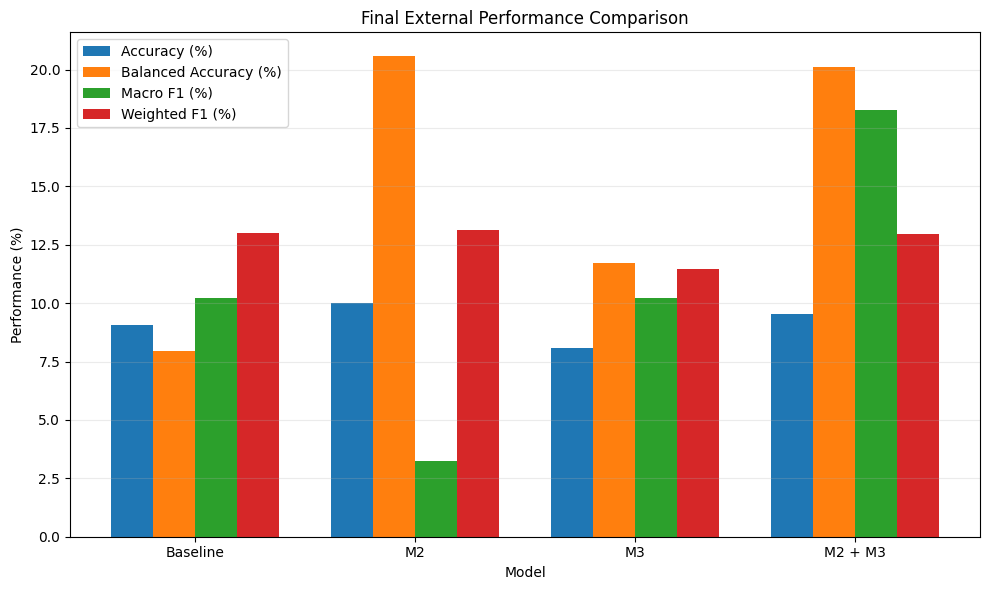


Creating Figure 2 — R3 Representation Predictability


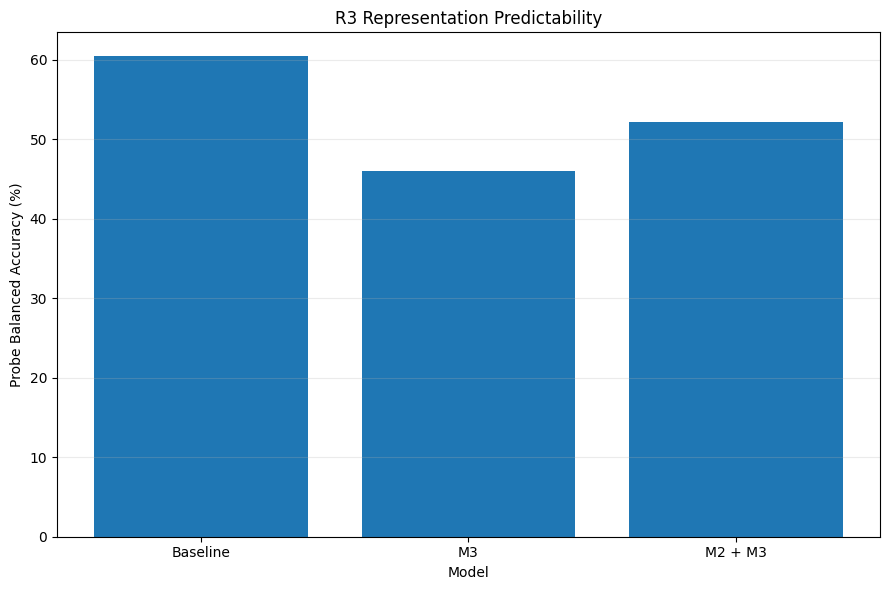


Creating Figure 3 — Fairness Metrics


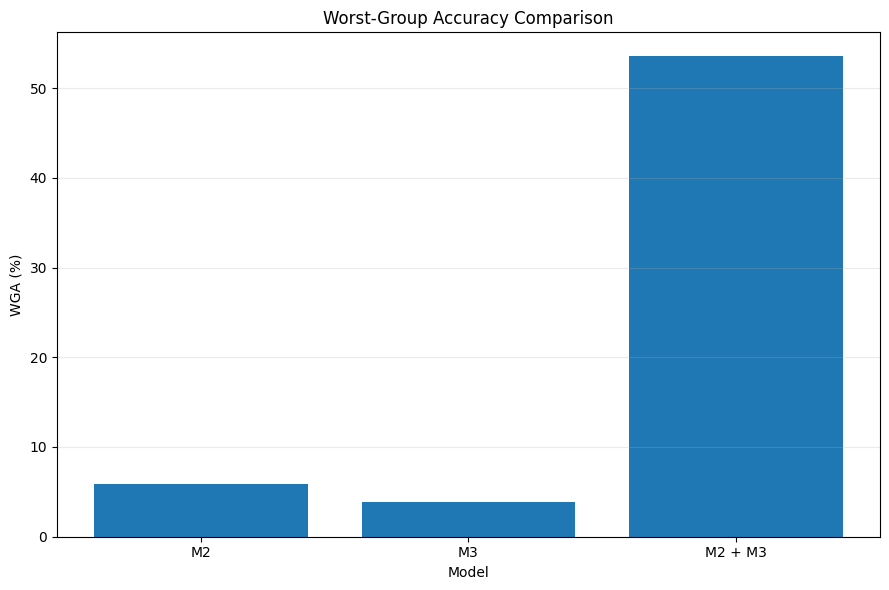


PHASE 8.1 — FINAL SUMMARY
Models: ['Baseline', 'M2', 'M3', 'M2 + M3']

Performance metrics visualized:
 - Accuracy (%)
 - Balanced Accuracy (%)
 - Macro F1 (%)
 - Weighted F1 (%)

Figures saved:
 - /content/skin-tone-fairness/outputs/figures/phase_8_1_final_external_performance_comparison.png
 - /content/skin-tone-fairness/outputs/figures/phase_8_1_r3_representation_predictability.png
 - /content/skin-tone-fairness/outputs/figures/phase_8_1_worst_group_accuracy.png

Visualization data:
/content/skin-tone-fairness/outputs/tables/phase_8_1_final_visualization_data.csv

Validation:
Model coverage valid: True
Metrics finite: True
Files saved: True
Phase 8.1 valid: True

PHASE 8.1 STATUS: PASS


In [749]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

print("=" * 60)
print("PHASE 8.1 — FINAL MODEL PERFORMANCE VISUALIZATION")
print("=" * 60)

# ------------------------------------------------------------
# 1. Paths
# ------------------------------------------------------------

OUTPUT_DIR = "/content/skin-tone-fairness/outputs"
TABLE_DIR = os.path.join(OUTPUT_DIR, "tables")
FIG_DIR = os.path.join(OUTPUT_DIR, "figures")

os.makedirs(FIG_DIR, exist_ok=True)

MASTER_PATH = os.path.join(
    TABLE_DIR,
    "phase_7_11_7_final_results_master.csv"
)

# ------------------------------------------------------------
# 2. Load final consolidated results
# ------------------------------------------------------------

if not os.path.exists(MASTER_PATH):
    raise FileNotFoundError(
        f"Final master table not found:\n{MASTER_PATH}"
    )

final_results_81 = pd.read_csv(MASTER_PATH)

print("\nLoaded master results:")
print(MASTER_PATH)
print("Rows:", len(final_results_81))
print("Models:", final_results_81["Model"].tolist())

# ------------------------------------------------------------
# 3. Verify expected models
# ------------------------------------------------------------

EXPECTED_MODELS_81 = [
    "Baseline",
    "M2",
    "M3",
    "M2 + M3"
]

missing_models_81 = [
    m for m in EXPECTED_MODELS_81
    if m not in final_results_81["Model"].values
]

if missing_models_81:
    raise ValueError(
        f"Missing expected models: {missing_models_81}"
    )

# Keep fixed model order
final_results_81["Model"] = pd.Categorical(
    final_results_81["Model"],
    categories=EXPECTED_MODELS_81,
    ordered=True
)

final_results_81 = (
    final_results_81
    .sort_values("Model")
    .reset_index(drop=True)
)

# ------------------------------------------------------------
# 4. Required performance metrics
# ------------------------------------------------------------

PERFORMANCE_METRICS_81 = [
    "Accuracy (%)",
    "Balanced Accuracy (%)",
    "Macro F1 (%)",
    "Weighted F1 (%)"
]

missing_metrics_81 = [
    m for m in PERFORMANCE_METRICS_81
    if m not in final_results_81.columns
]

if missing_metrics_81:
    raise ValueError(
        f"Missing performance metrics: {missing_metrics_81}"
    )

# Convert to numeric
for metric in PERFORMANCE_METRICS_81:
    final_results_81[metric] = pd.to_numeric(
        final_results_81[metric],
        errors="coerce"
    )

# Check finite values
for metric in PERFORMANCE_METRICS_81:
    values = final_results_81[metric].dropna().values

    if len(values) > 0 and not np.isfinite(values).all():
        raise ValueError(
            f"Non-finite values found in {metric}"
        )

# ------------------------------------------------------------
# 5. Figure 1 — Overall Performance Comparison
# ------------------------------------------------------------

print("\nCreating Figure 1 — Overall Performance Comparison")

fig1, ax1 = plt.subplots(figsize=(10, 6))

x = np.arange(len(final_results_81))
width = 0.19

for i, metric in enumerate(PERFORMANCE_METRICS_81):

    values = final_results_81[metric].values.astype(float)

    ax1.bar(
        x + (i - 1.5) * width,
        values,
        width,
        label=metric
    )

ax1.set_xticks(x)
ax1.set_xticklabels(
    final_results_81["Model"].astype(str)
)

ax1.set_ylabel("Performance (%)")
ax1.set_xlabel("Model")
ax1.set_title(
    "Final External Performance Comparison"
)

ax1.legend()
ax1.grid(axis="y", alpha=0.25)

fig1.tight_layout()

FIG1_PATH = os.path.join(
    FIG_DIR,
    "phase_8_1_final_external_performance_comparison.png"
)

fig1.savefig(
    FIG1_PATH,
    dpi=300,
    bbox_inches="tight"
)

plt.show()
plt.close(fig1)

# ------------------------------------------------------------
# 6. Figure 2 — R3 Representation Predictability
# ------------------------------------------------------------

print("\nCreating Figure 2 — R3 Representation Predictability")

r3_models = [
    "Baseline",
    "M3",
    "M2 + M3"
]

r3_values = []

for model in r3_models:

    row = final_results_81[
        final_results_81["Model"].astype(str) == model
    ]

    if row.empty:
        raise ValueError(
            f"R3 model missing: {model}"
        )

    value = pd.to_numeric(
        row.iloc[0]["R3 Probe BA (%)"],
        errors="coerce"
    )

    if not np.isfinite(value):
        raise ValueError(
            f"Invalid R3 value for {model}"
        )

    r3_values.append(float(value))

fig2, ax2 = plt.subplots(figsize=(9, 6))

ax2.bar(
    r3_models,
    r3_values
)

ax2.set_ylabel("Probe Balanced Accuracy (%)")
ax2.set_xlabel("Model")
ax2.set_title(
    "R3 Representation Predictability"
)

ax2.grid(axis="y", alpha=0.25)

fig2.tight_layout()

FIG2_PATH = os.path.join(
    FIG_DIR,
    "phase_8_1_r3_representation_predictability.png"
)

fig2.savefig(
    FIG2_PATH,
    dpi=300,
    bbox_inches="tight"
)

plt.show()
plt.close(fig2)

# ------------------------------------------------------------
# 7. Figure 3 — Fairness Metrics
# ------------------------------------------------------------

print("\nCreating Figure 3 — Fairness Metrics")

fairness_metrics_81 = [
    "WGA (%)",
    "EOD",
    "DPD",
    "EqOD"
]

available_fairness_81 = [
    m for m in fairness_metrics_81
    if m in final_results_81.columns
]

# We only visualize metrics where at least one model
# has a valid value.
fairness_data_81 = {}

for metric in available_fairness_81:

    values = pd.to_numeric(
        final_results_81[metric],
        errors="coerce"
    )

    if values.notna().any():
        fairness_data_81[metric] = values

if fairness_data_81:

    fairness_df_81 = pd.DataFrame(
        fairness_data_81
    )

    # WGA is percentage, other fairness metrics are ratios.
    # Therefore plot them separately to avoid misleading scale.

    if "WGA (%)" in fairness_df_81.columns:

        wga_values = fairness_df_81["WGA (%)"]

        valid_wga = wga_values.notna()

        fig3, ax3 = plt.subplots(figsize=(9, 6))

        ax3.bar(
            final_results_81.loc[
                valid_wga, "Model"
            ].astype(str),
            wga_values[valid_wga]
        )

        ax3.set_ylabel("WGA (%)")
        ax3.set_xlabel("Model")
        ax3.set_title(
            "Worst-Group Accuracy Comparison"
        )

        ax3.grid(axis="y", alpha=0.25)

        fig3.tight_layout()

        FIG3_PATH = os.path.join(
            FIG_DIR,
            "phase_8_1_worst_group_accuracy.png"
        )

        fig3.savefig(
            FIG3_PATH,
            dpi=300,
            bbox_inches="tight"
        )

        plt.show()
        plt.close(fig3)

# ------------------------------------------------------------
# 8. Save numerical visualization data
# ------------------------------------------------------------

visualization_table_81 = final_results_81[
    ["Model"]
    + PERFORMANCE_METRICS_81
].copy()

VIS_TABLE_PATH = os.path.join(
    TABLE_DIR,
    "phase_8_1_final_visualization_data.csv"
)

visualization_table_81.to_csv(
    VIS_TABLE_PATH,
    index=False
)

# ------------------------------------------------------------
# 9. Validation
# ------------------------------------------------------------

figure_files_81 = [
    FIG1_PATH,
    FIG2_PATH
]

if "FIG3_PATH" in globals():
    figure_files_81.append(FIG3_PATH)

files_saved_81 = all(
    os.path.exists(path)
    for path in figure_files_81
)

model_coverage_valid_81 = (
    set(final_results_81["Model"].astype(str))
    == set(EXPECTED_MODELS_81)
)

metrics_valid_81 = True

for metric in PERFORMANCE_METRICS_81:
    vals = final_results_81[metric].dropna().values

    if len(vals) > 0:
        if not np.isfinite(vals).all():
            metrics_valid_81 = False

phase_81_valid = (
    model_coverage_valid_81
    and metrics_valid_81
    and files_saved_81
)

# ------------------------------------------------------------
# 10. Final summary
# ------------------------------------------------------------

print("\n" + "=" * 60)
print("PHASE 8.1 — FINAL SUMMARY")
print("=" * 60)

print("Models:", EXPECTED_MODELS_81)

print("\nPerformance metrics visualized:")
for metric in PERFORMANCE_METRICS_81:
    print(" -", metric)

print("\nFigures saved:")

for path in figure_files_81:
    print(" -", path)

print("\nVisualization data:")
print(VIS_TABLE_PATH)

print("\nValidation:")
print("Model coverage valid:", model_coverage_valid_81)
print("Metrics finite:", metrics_valid_81)
print("Files saved:", files_saved_81)
print("Phase 8.1 valid:", phase_81_valid)

if not phase_81_valid:
    raise ValueError(
        "Phase 8.1 validation failed."
    )

print("\n" + "=" * 60)
print("PHASE 8.1 STATUS: PASS")
print("=" * 60)

**Phase 8.2 — Dataset-wise Final Comparison**

PHASE 8.2 — DATASET-WISE FINAL COMPARISON

LOADING FITZPATRICK17K / INTERNAL RESULTS
Found: phase_6_14_internal_comparison.csv
Found: phase_6_15_final_internal_mitigation_decision.csv
Found: phase_6_11_baseline_m1_m2_comparison.csv
Found: phase_6_11_m1_m2_overall_performance.csv
Found: phase_6_9_baseline_vs_m2_overall.csv
Found: phase_6_6_baseline_vs_m1_overall.csv

Internal result inspection:

FILE: phase_6_14_internal_comparison.csv
Rows: 4
Columns: ['Model', 'Accuracy', 'Balanced Accuracy', 'Macro Precision', 'Macro Recall', 'Macro F1', 'Weighted F1', 'WGA', 'EOD', 'DPD', 'EqOD']

FILE: phase_6_15_final_internal_mitigation_decision.csv
Rows: 3
Columns: ['Bias Rule', 'Mitigation', 'Internal Decision']

FILE: phase_6_11_baseline_m1_m2_comparison.csv
Rows: 6
Columns: ['metric', 'Baseline', 'M1', 'M2', 'M1 + M2']

FILE: phase_6_11_m1_m2_overall_performance.csv
Rows: 6
Columns: ['metric', 'value']

FILE: phase_6_9_baseline_vs_m2_overall.csv
Rows: 6
Columns: ['metric', 'Baseline', 'M2', '

,Model,Internal Accuracy (%),Internal Balanced Accuracy (%),Internal Macro F1 (%),Internal Weighted F1 (%),Internal WGA (%),Internal Accuracy Gap (%),Internal Macro-F1 Gap (%),Internal R3 Probe BA (%),Internal EOD,...,DDI EOD,DDI DPD,DDI EqOD,Generalization Gap — Accuracy (%),Generalization Gap — Balanced Accuracy (%),Generalization Gap — Macro F1 (%),Generalization Gap — Weighted F1 (%),R3 Reduction — Internal (pp),R3 Reduction — DDI (pp),R3 Better Mitigation Dataset
0,Baseline,44.5000,40.6500,40.5100,43.5600,32.4720,NaN,NaN,NaN,0.4550,...,NaN,NaN,NaN,-35.4500,-32.7200,-30.270,-30.5400,NaN,0.00,
1,M2,44.0098,41.5465,40.1123,43.8429,31.0939,NaN,NaN,NaN,0.4611,...,0.1578,0.0309,0.1651,-34.0098,-20.9818,-36.867,-30.6985,NaN,NaN,
2,M3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0817,0.0817,0.0817,NaN,NaN,NaN,NaN,NaN,14.39,
3,M2 + M3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.1958,0.0283,0.5000,NaN,NaN,NaN,NaN,NaN,8.28,



Creating Figure 1 — Dataset-wise Performance


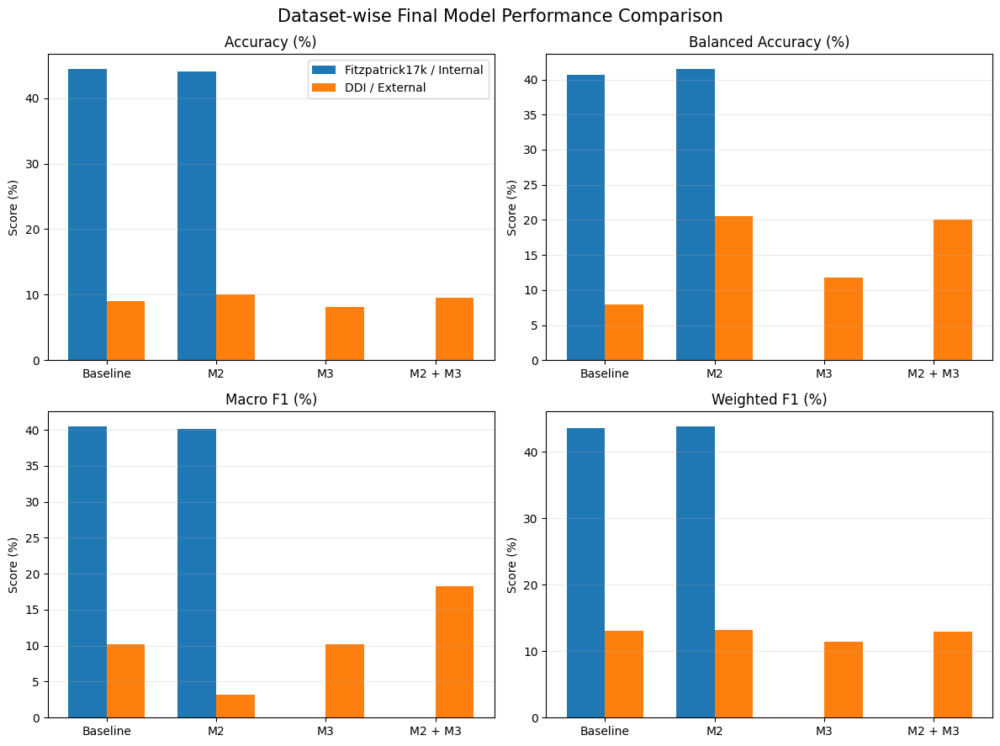


Creating Figure 2 — Generalization Gap


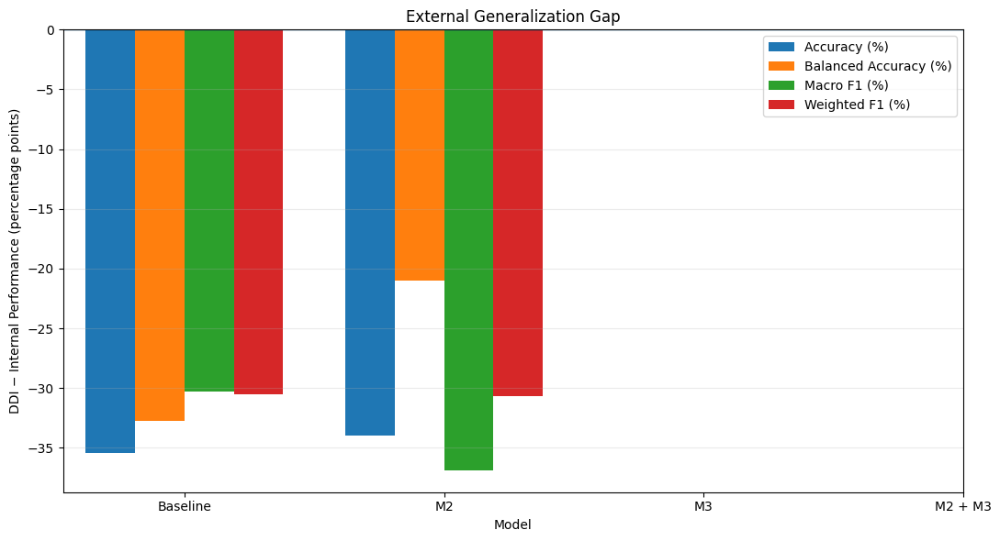


Creating Figure 3 — R3 Mitigation Across Datasets


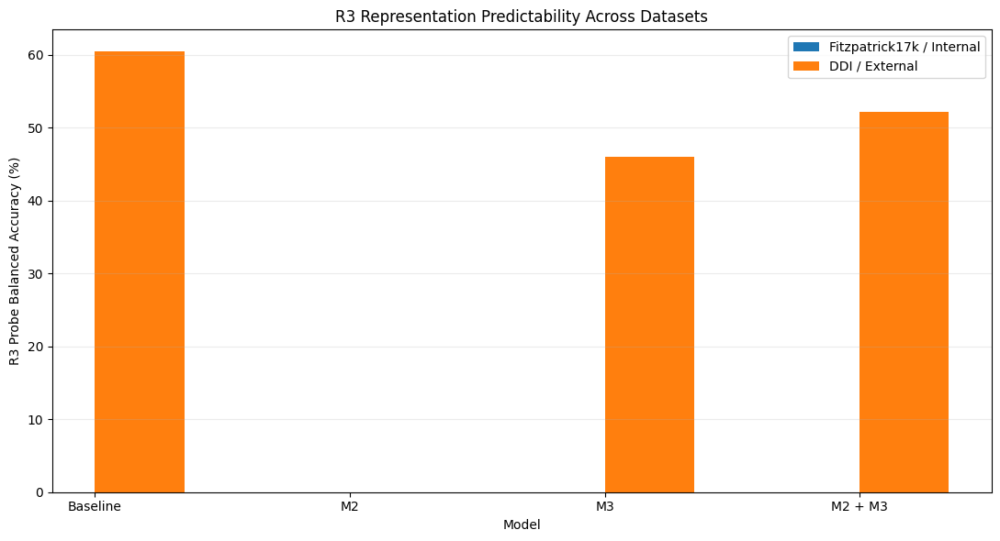


PHASE 8.2 — VALIDATION
Model coverage valid: True
Numeric values finite: True
Files saved: True
Phase 8.2 valid: True

PHASE 8.2 — FINAL SUMMARY
Datasets compared: Fitzpatrick17k/Internal vs DDI/External
Models: ['Baseline', 'M2', 'M3', 'M2 + M3']

Performance comparison:
   Model  Internal Accuracy (%)  DDI Accuracy (%)  Internal Balanced Accuracy (%)  DDI Balanced Accuracy (%)  Internal Macro F1 (%)  DDI Macro F1 (%)  Internal Weighted F1 (%)  DDI Weighted F1 (%)  Generalization Gap — Accuracy (%)  Generalization Gap — Balanced Accuracy (%)  Generalization Gap — Macro F1 (%)  Generalization Gap — Weighted F1 (%)
Baseline                  44.50             9.050                          40.650                      7.930                 40.510            10.240                    43.560               13.020                             -35.45                                     -32.720                            -30.270                               -30.540
      M2                  44

In [750]:
import os
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

print("=" * 60)
print("PHASE 8.2 — DATASET-WISE FINAL COMPARISON")
print("=" * 60)

# ------------------------------------------------------------
# 1. Paths
# ------------------------------------------------------------

BASE_DIR_82 = "/content/skin-tone-fairness"
TABLE_DIR_82 = os.path.join(BASE_DIR_82, "outputs", "tables")
FIG_DIR_82 = os.path.join(BASE_DIR_82, "outputs", "figures")

os.makedirs(TABLE_DIR_82, exist_ok=True)
os.makedirs(FIG_DIR_82, exist_ok=True)

# ------------------------------------------------------------
# 2. Helper functions
# ------------------------------------------------------------

def load_csv_82(filename):
    path = os.path.join(TABLE_DIR_82, filename)

    if not os.path.exists(path):
        print(f"WARNING: Missing file: {filename}")
        return None

    return pd.read_csv(path)


def load_json_82(filename):
    path = os.path.join(TABLE_DIR_82, filename)

    if not os.path.exists(path):
        print(f"WARNING: Missing file: {filename}")
        return None

    with open(path, "r") as f:
        return json.load(f)


def get_value_82(obj, keys):
    """
    Safely retrieve a value from either:
    - dict
    - DataFrame
    """

    if obj is None:
        return np.nan

    # Dictionary
    if isinstance(obj, dict):
        for key in keys:
            if key in obj:
                value = obj[key]

                try:
                    return float(value)
                except (TypeError, ValueError):
                    return np.nan

    # DataFrame
    if isinstance(obj, pd.DataFrame):
        if obj.empty:
            return np.nan

        for key in keys:
            if key in obj.columns:
                try:
                    return float(obj.iloc[0][key])
                except (TypeError, ValueError):
                    return np.nan

    return np.nan


def normalize_percentage_82(value):
    """
    Convert fractions to percentage only when value appears
    to be in [0,1].
    """

    if pd.isna(value):
        return np.nan

    value = float(value)

    if 0 <= value <= 1:
        return value * 100

    return value


# ------------------------------------------------------------
# 3. Load Fitzpatrick17k / internal final results
# ------------------------------------------------------------

print("\n" + "=" * 60)
print("LOADING FITZPATRICK17K / INTERNAL RESULTS")
print("=" * 60)

# Previously generated internal comparison files
internal_candidates_82 = [
    "phase_6_14_internal_comparison.csv",
    "phase_6_15_final_internal_mitigation_decision.csv",
    "phase_6_11_baseline_m1_m2_comparison.csv",
    "phase_6_11_m1_m2_overall_performance.csv",
    "phase_6_9_baseline_vs_m2_overall.csv",
    "phase_6_6_baseline_vs_m1_overall.csv"
]

internal_files_82 = []

for filename in internal_candidates_82:
    path = os.path.join(TABLE_DIR_82, filename)

    if os.path.exists(path):
        internal_files_82.append(filename)
        print("Found:", filename)

# Load available internal files
internal_data_82 = {}

for filename in internal_files_82:
    internal_data_82[filename] = load_csv_82(filename)

# ------------------------------------------------------------
# 4. Inspect internal files
# ------------------------------------------------------------

print("\nInternal result inspection:")

for filename, df in internal_data_82.items():

    if df is None:
        continue

    print("\nFILE:", filename)
    print("Rows:", len(df))
    print("Columns:", list(df.columns))

# ------------------------------------------------------------
# 5. Load DDI final results
# ------------------------------------------------------------

print("\n" + "=" * 60)
print("LOADING DDI / EXTERNAL RESULTS")
print("=" * 60)

ddi_master_path_82 = os.path.join(
    TABLE_DIR_82,
    "phase_7_11_7_final_results_master.csv"
)

if not os.path.exists(ddi_master_path_82):
    raise FileNotFoundError(
        "DDI final master table not found:\n"
        + ddi_master_path_82
    )

ddi_results_82 = pd.read_csv(ddi_master_path_82)

print("DDI master loaded:")
print(ddi_master_path_82)
print("Rows:", len(ddi_results_82))
print("Models:", ddi_results_82["Model"].tolist())

# ------------------------------------------------------------
# 6. Load DDI R3 comparison
# ------------------------------------------------------------

ddi_r3_82 = load_csv_82(
    "phase_7_11_6_r3_comparison.csv"
)

print("\nDDI R3 comparison loaded:",
      ddi_r3_82 is not None)

# ------------------------------------------------------------
# 7. Build DDI model lookup
# ------------------------------------------------------------

ddi_lookup_82 = {}

for _, row in ddi_results_82.iterrows():

    model = str(row["Model"])

    ddi_lookup_82[model] = row.to_dict()

# ------------------------------------------------------------
# 8. Internal model result extraction
# ------------------------------------------------------------

print("\n" + "=" * 60)
print("BUILDING INTERNAL MODEL RESULTS")
print("=" * 60)

# Expected internal models available from earlier phases
INTERNAL_MODELS_82 = [
    "Baseline",
    "M2",
    "M3",
    "M2 + M3"
]

internal_records_82 = []

# ------------------------------------------------------------
# 9. Try to extract internal results from known files
# ------------------------------------------------------------

# First, search all loaded CSVs for model/result rows.

for model in INTERNAL_MODELS_82:

    found_row = None
    found_source = None

    for filename, df in internal_data_82.items():

        if df is None or df.empty:
            continue

        # Find a model-like column
        model_columns = [
            c for c in df.columns
            if str(c).lower() in [
                "model",
                "method",
                "mitigation",
                "configuration"
            ]
        ]

        for model_col in model_columns:

            values = df[model_col].astype(str).str.strip()

            matches = values.str.lower() == model.lower()

            if matches.any():

                found_row = df.loc[
                    matches
                ].iloc[0].to_dict()

                found_source = filename
                break

        if found_row is not None:
            break

    if found_row is None:

        print(
            f"Internal result not directly found for: {model}"
        )

        internal_records_82.append({
            "Model": model,
            "Internal Source": "Not directly available"
        })

    else:

        print(
            f"Internal result found: {model} "
            f"from {found_source}"
        )

        found_row["Model"] = model
        found_row["Internal Source"] = found_source

        internal_records_82.append(found_row)

# ------------------------------------------------------------
# 10. Internal metrics normalization
# ------------------------------------------------------------

internal_df_82 = pd.DataFrame(
    internal_records_82
)

INTERNAL_METRICS_MAP_82 = {

    "Accuracy (%)": [
        "Accuracy (%)",
        "accuracy (%)",
        "accuracy",
        "Accuracy"
    ],

    "Balanced Accuracy (%)": [
        "Balanced Accuracy (%)",
        "balanced_accuracy (%)",
        "balanced_accuracy",
        "Balanced Accuracy"
    ],

    "Macro F1 (%)": [
        "Macro F1 (%)",
        "macro_f1 (%)",
        "macro_f1",
        "Macro F1"
    ],

    "Weighted F1 (%)": [
        "Weighted F1 (%)",
        "weighted_f1 (%)",
        "weighted_f1",
        "Weighted F1"
    ],

    "WGA (%)": [
        "WGA (%)",
        "WGA",
        "worst_group_accuracy"
    ],

    "EOD": [
        "EOD",
        "eod",
        "equal_opportunity_difference"
    ],

    "DPD": [
        "DPD",
        "dpd",
        "demographic_parity_difference"
    ],

    "EqOD": [
        "EqOD",
        "eqod",
        "equalized_odds"
    ],

    "Accuracy Gap (%)": [
        "Accuracy Gap (%)",
        "accuracy_gap (%)",
        "accuracy_gap"
    ],

    "Macro-F1 Gap (%)": [
        "Macro-F1 Gap (%)",
        "Macro F1 Gap (%)",
        "macro_f1_gap (%)",
        "macro_f1_gap"
    ],

    "R3 Probe BA (%)": [
        "R3 Probe BA (%)",
        "R3 Probe BA",
        "r3_probe_BA",
        "R3_probe_BA"
    ]
}

for metric_name, possible_columns in INTERNAL_METRICS_MAP_82.items():

    extracted_values = []

    for _, row in internal_df_82.iterrows():

        value = np.nan

        for column in possible_columns:

            if column in row.index:

                try:
                    value = float(row[column])
                    break
                except (
                    TypeError,
                    ValueError
                ):
                    pass

        extracted_values.append(value)

    internal_df_82[metric_name] = extracted_values

# Normalize percentage metrics
PERCENTAGE_COLUMNS_82 = [
    "Accuracy (%)",
    "Balanced Accuracy (%)",
    "Macro F1 (%)",
    "Weighted F1 (%)",
    "WGA (%)",
    "Accuracy Gap (%)",
    "Macro-F1 Gap (%)",
    "R3 Probe BA (%)"
]

for column in PERCENTAGE_COLUMNS_82:

    if column in internal_df_82.columns:

        internal_df_82[column] = (
            internal_df_82[column]
            .apply(normalize_percentage_82)
        )

# ------------------------------------------------------------
# 11. Build DDI final records
# ------------------------------------------------------------

print("\n" + "=" * 60)
print("BUILDING DDI FINAL RESULTS")
print("=" * 60)

ddi_records_82 = []

for model in INTERNAL_MODELS_82:

    if model not in ddi_lookup_82:

        print(
            f"WARNING: DDI model not found: {model}"
        )

        ddi_records_82.append({
            "Model": model
        })

        continue

    row = ddi_lookup_82[model].copy()

    row["Model"] = model

    ddi_records_82.append(row)

ddi_df_82 = pd.DataFrame(
    ddi_records_82
)

# ------------------------------------------------------------
# 12. Ensure DDI metric columns exist
# ------------------------------------------------------------

for column in (
    PERCENTAGE_COLUMNS_82
    + ["EOD", "DPD", "EqOD"]
):

    if column not in ddi_df_82.columns:
        ddi_df_82[column] = np.nan

# ------------------------------------------------------------
# 13. Dataset-wise comparison table
# ------------------------------------------------------------

comparison_records_82 = []

for model in INTERNAL_MODELS_82:

    internal_row = internal_df_82[
        internal_df_82["Model"].astype(str) == model
    ]

    ddi_row = ddi_df_82[
        ddi_df_82["Model"].astype(str) == model
    ]

    record = {
        "Model": model
    }

    # --------------------------------------------------------
    # Internal metrics
    # --------------------------------------------------------

    if not internal_row.empty:

        internal_row = internal_row.iloc[0]

        for metric in (
            PERCENTAGE_COLUMNS_82
            + ["EOD", "DPD", "EqOD"]
        ):

            record[
                f"Internal {metric}"
            ] = pd.to_numeric(
                internal_row.get(metric, np.nan),
                errors="coerce"
            )

    else:

        for metric in (
            PERCENTAGE_COLUMNS_82
            + ["EOD", "DPD", "EqOD"]
        ):
            record[
                f"Internal {metric}"
            ] = np.nan

    # --------------------------------------------------------
    # DDI metrics
    # --------------------------------------------------------

    if not ddi_row.empty:

        ddi_row = ddi_row.iloc[0]

        for metric in (
            PERCENTAGE_COLUMNS_82
            + ["EOD", "DPD", "EqOD"]
        ):

            record[
                f"DDI {metric}"
            ] = pd.to_numeric(
                ddi_row.get(metric, np.nan),
                errors="coerce"
            )

    else:

        for metric in (
            PERCENTAGE_COLUMNS_82
            + ["EOD", "DPD", "EqOD"]
        ):
            record[
                f"DDI {metric}"
            ] = np.nan

    comparison_records_82.append(record)

dataset_comparison_82 = pd.DataFrame(
    comparison_records_82
)

# ------------------------------------------------------------
# 14. Generalization gaps
# ------------------------------------------------------------

print("\n" + "=" * 60)
print("CALCULATING GENERALIZATION GAPS")
print("=" * 60)

GENERALIZATION_METRICS_82 = [
    "Accuracy (%)",
    "Balanced Accuracy (%)",
    "Macro F1 (%)",
    "Weighted F1 (%)"
]

for metric in GENERALIZATION_METRICS_82:

    dataset_comparison_82[
        f"Generalization Gap — {metric}"
    ] = (
        dataset_comparison_82[
            f"DDI {metric}"
        ]
        -
        dataset_comparison_82[
            f"Internal {metric}"
        ]
    )

# ------------------------------------------------------------
# 15. R3 mitigation effectiveness
# ------------------------------------------------------------

dataset_comparison_82[
    "R3 Reduction — Internal (pp)"
] = np.nan

dataset_comparison_82[
    "R3 Reduction — DDI (pp)"
] = np.nan

# Internal baseline R3
internal_baseline_r3_82 = np.nan

if not internal_df_82.empty:

    baseline_rows = internal_df_82[
        internal_df_82["Model"].astype(str).str.lower()
        == "baseline"
    ]

    if not baseline_rows.empty:

        internal_baseline_r3_82 = pd.to_numeric(
            baseline_rows.iloc[0].get(
                "R3 Probe BA (%)",
                np.nan
            ),
            errors="coerce"
        )

# DDI baseline R3
ddi_baseline_r3_82 = np.nan

if "Baseline" in ddi_lookup_82:

    ddi_baseline_r3_82 = pd.to_numeric(
        ddi_lookup_82["Baseline"].get(
            "R3 Probe BA (%)",
            np.nan
        ),
        errors="coerce"
    )

for idx, row in dataset_comparison_82.iterrows():

    internal_r3 = row[
        "Internal R3 Probe BA (%)"
    ]

    ddi_r3 = row[
        "DDI R3 Probe BA (%)"
    ]

    # Internal reduction
    if (
        pd.notna(internal_baseline_r3_82)
        and pd.notna(internal_r3)
    ):

        dataset_comparison_82.loc[
            idx,
            "R3 Reduction — Internal (pp)"
        ] = (
            internal_baseline_r3_82
            - internal_r3
        )

    # DDI reduction
    if (
        pd.notna(ddi_baseline_r3_82)
        and pd.notna(ddi_r3)
    ):

        dataset_comparison_82.loc[
            idx,
            "R3 Reduction — DDI (pp)"
        ] = (
            ddi_baseline_r3_82
            - ddi_r3
        )

# ------------------------------------------------------------
# 16. Determine better dataset for each mitigation
# ------------------------------------------------------------

dataset_comparison_82[
    "R3 Better Mitigation Dataset"
] = ""

for idx, row in dataset_comparison_82.iterrows():

    internal_reduction = row[
        "R3 Reduction — Internal (pp)"
    ]

    ddi_reduction = row[
        "R3 Reduction — DDI (pp)"
    ]

    if (
        pd.notna(internal_reduction)
        and pd.notna(ddi_reduction)
    ):

        if internal_reduction > ddi_reduction:
            result = "Internal"

        elif ddi_reduction > internal_reduction:
            result = "DDI"

        else:
            result = "Equal"

        dataset_comparison_82.loc[
            idx,
            "R3 Better Mitigation Dataset"
        ] = result

# ------------------------------------------------------------
# 17. Display final comparison
# ------------------------------------------------------------

print("\n" + "=" * 60)
print("DATASET-WISE FINAL COMPARISON")
print("=" * 60)

display(
    dataset_comparison_82.round(4)
)

# ------------------------------------------------------------
# 18. Save master comparison
# ------------------------------------------------------------

MASTER_COMPARISON_82 = os.path.join(
    TABLE_DIR_82,
    "phase_8_2_dataset_wise_final_comparison.csv"
)

dataset_comparison_82.to_csv(
    MASTER_COMPARISON_82,
    index=False
)

# ------------------------------------------------------------
# 19. Performance summary table
# ------------------------------------------------------------

performance_summary_82 = dataset_comparison_82[
    [
        "Model",

        "Internal Accuracy (%)",
        "DDI Accuracy (%)",

        "Internal Balanced Accuracy (%)",
        "DDI Balanced Accuracy (%)",

        "Internal Macro F1 (%)",
        "DDI Macro F1 (%)",

        "Internal Weighted F1 (%)",
        "DDI Weighted F1 (%)",

        "Generalization Gap — Accuracy (%)",
        "Generalization Gap — Balanced Accuracy (%)",
        "Generalization Gap — Macro F1 (%)",
        "Generalization Gap — Weighted F1 (%)"
    ]
].copy()

PERFORMANCE_TABLE_82 = os.path.join(
    TABLE_DIR_82,
    "phase_8_2_dataset_performance_summary.csv"
)

performance_summary_82.to_csv(
    PERFORMANCE_TABLE_82,
    index=False
)

# ------------------------------------------------------------
# 20. Fairness summary
# ------------------------------------------------------------

fairness_columns_82 = [
    "Model",

    "Internal WGA (%)",
    "DDI WGA (%)",

    "Internal EOD",
    "DDI EOD",

    "Internal DPD",
    "DDI DPD",

    "Internal EqOD",
    "DDI EqOD",

    "Internal Accuracy Gap (%)",
    "DDI Accuracy Gap (%)",

    "Internal Macro-F1 Gap (%)",
    "DDI Macro-F1 Gap (%)"
]

fairness_columns_82 = [
    c for c in fairness_columns_82
    if c in dataset_comparison_82.columns
]

fairness_summary_82 = dataset_comparison_82[
    fairness_columns_82
].copy()

FAIRNESS_TABLE_82 = os.path.join(
    TABLE_DIR_82,
    "phase_8_2_dataset_fairness_summary.csv"
)

fairness_summary_82.to_csv(
    FAIRNESS_TABLE_82,
    index=False
)

# ------------------------------------------------------------
# 21. R3 summary
# ------------------------------------------------------------

r3_summary_82 = dataset_comparison_82[
    [
        "Model",
        "Internal R3 Probe BA (%)",
        "DDI R3 Probe BA (%)",
        "R3 Reduction — Internal (pp)",
        "R3 Reduction — DDI (pp)",
        "R3 Better Mitigation Dataset"
    ]
].copy()

R3_TABLE_82 = os.path.join(
    TABLE_DIR_82,
    "phase_8_2_dataset_r3_summary.csv"
)

r3_summary_82.to_csv(
    R3_TABLE_82,
    index=False
)

# ------------------------------------------------------------
# 22. Figure 1 — Dataset-wise model performance
# ------------------------------------------------------------

print("\nCreating Figure 1 — Dataset-wise Performance")

plot_metrics_82 = [
    "Accuracy (%)",
    "Balanced Accuracy (%)",
    "Macro F1 (%)",
    "Weighted F1 (%)"
]

fig1, axes1 = plt.subplots(
    2,
    2,
    figsize=(12, 9)
)

axes1 = axes1.flatten()

for i, metric in enumerate(plot_metrics_82):

    ax = axes1[i]

    x = np.arange(len(INTERNAL_MODELS_82))
    width = 0.35

    internal_values = (
        dataset_comparison_82[
            f"Internal {metric}"
        ]
        .astype(float)
        .values
    )

    ddi_values = (
        dataset_comparison_82[
            f"DDI {metric}"
        ]
        .astype(float)
        .values
    )

    ax.bar(
        x - width / 2,
        internal_values,
        width,
        label="Fitzpatrick17k / Internal"
    )

    ax.bar(
        x + width / 2,
        ddi_values,
        width,
        label="DDI / External"
    )

    ax.set_title(metric)
    ax.set_xticks(x)
    ax.set_xticklabels(INTERNAL_MODELS_82)
    ax.set_ylabel("Score (%)")
    ax.grid(axis="y", alpha=0.25)

axes1[0].legend()

fig1.suptitle(
    "Dataset-wise Final Model Performance Comparison",
    fontsize=15
)

fig1.tight_layout()

FIG1_82 = os.path.join(
    FIG_DIR_82,
    "phase_8_2_dataset_wise_performance_comparison.png"
)

fig1.savefig(
    FIG1_82,
    dpi=300,
    bbox_inches="tight"
)

plt.show()
plt.close(fig1)

# ------------------------------------------------------------
# 23. Figure 2 — Generalization gap
# ------------------------------------------------------------

print("\nCreating Figure 2 — Generalization Gap")

gap_metrics_82 = [
    "Accuracy (%)",
    "Balanced Accuracy (%)",
    "Macro F1 (%)",
    "Weighted F1 (%)"
]

fig2, ax2 = plt.subplots(
    figsize=(11, 6)
)

x = np.arange(len(INTERNAL_MODELS_82))
width = 0.19

for i, metric in enumerate(gap_metrics_82):

    values = dataset_comparison_82[
        f"Generalization Gap — {metric}"
    ].astype(float).values

    ax2.bar(
        x + (i - 1.5) * width,
        values,
        width,
        label=metric
    )

ax2.axhline(
    0,
    linewidth=1
)

ax2.set_xticks(x)
ax2.set_xticklabels(INTERNAL_MODELS_82)

ax2.set_xlabel("Model")
ax2.set_ylabel(
    "DDI − Internal Performance (percentage points)"
)

ax2.set_title(
    "External Generalization Gap"
)

ax2.legend()
ax2.grid(axis="y", alpha=0.25)

fig2.tight_layout()

FIG2_82 = os.path.join(
    FIG_DIR_82,
    "phase_8_2_generalization_gap.png"
)

fig2.savefig(
    FIG2_82,
    dpi=300,
    bbox_inches="tight"
)

plt.show()
plt.close(fig2)

# ------------------------------------------------------------
# 24. Figure 3 — R3 mitigation across datasets
# ------------------------------------------------------------

print("\nCreating Figure 3 — R3 Mitigation Across Datasets")

r3_plot_models_82 = [
    "Baseline",
    "M2",
    "M3",
    "M2 + M3"
]

r3_internal_values_82 = []
r3_ddi_values_82 = []

for model in r3_plot_models_82:

    row = dataset_comparison_82[
        dataset_comparison_82["Model"] == model
    ]

    if row.empty:
        r3_internal_values_82.append(np.nan)
        r3_ddi_values_82.append(np.nan)

    else:

        r3_internal_values_82.append(
            pd.to_numeric(
                row.iloc[0][
                    "Internal R3 Probe BA (%)"
                ],
                errors="coerce"
            )
        )

        r3_ddi_values_82.append(
            pd.to_numeric(
                row.iloc[0][
                    "DDI R3 Probe BA (%)"
                ],
                errors="coerce"
            )
        )

fig3, ax3 = plt.subplots(
    figsize=(11, 6)
)

x = np.arange(len(r3_plot_models_82))
width = 0.35

ax3.bar(
    x - width / 2,
    r3_internal_values_82,
    width,
    label="Fitzpatrick17k / Internal"
)

ax3.bar(
    x + width / 2,
    r3_ddi_values_82,
    width,
    label="DDI / External"
)

ax3.set_xticks(x)
ax3.set_xticklabels(r3_plot_models_82)

ax3.set_xlabel("Model")
ax3.set_ylabel(
    "R3 Probe Balanced Accuracy (%)"
)

ax3.set_title(
    "R3 Representation Predictability Across Datasets"
)

ax3.legend()
ax3.grid(axis="y", alpha=0.25)

fig3.tight_layout()

FIG3_82 = os.path.join(
    FIG_DIR_82,
    "phase_8_2_r3_dataset_comparison.png"
)

fig3.savefig(
    FIG3_82,
    dpi=300,
    bbox_inches="tight"
)

plt.show()
plt.close(fig3)

# ------------------------------------------------------------
# 25. Validation
# ------------------------------------------------------------

print("\n" + "=" * 60)
print("PHASE 8.2 — VALIDATION")
print("=" * 60)

expected_models_82 = set(INTERNAL_MODELS_82)

actual_models_82 = set(
    dataset_comparison_82["Model"].astype(str)
)

model_coverage_82 = (
    expected_models_82 == actual_models_82
)

# Check all numeric values that actually exist
numeric_columns_82 = dataset_comparison_82.select_dtypes(
    include=[np.number]
).columns

finite_values_82 = True

for column in numeric_columns_82:

    values = dataset_comparison_82[
        column
    ].dropna().values

    if len(values) > 0:

        if not np.isfinite(values).all():

            finite_values_82 = False

            print(
                "Non-finite values:",
                column
            )

# Check required outputs
required_files_82 = [
    MASTER_COMPARISON_82,
    PERFORMANCE_TABLE_82,
    FAIRNESS_TABLE_82,
    R3_TABLE_82,
    FIG1_82,
    FIG2_82,
    FIG3_82
]

files_saved_82 = all(
    os.path.exists(path)
    for path in required_files_82
)

phase_82_valid = (
    model_coverage_82
    and finite_values_82
    and files_saved_82
)

print("Model coverage valid:", model_coverage_82)
print("Numeric values finite:", finite_values_82)
print("Files saved:", files_saved_82)
print("Phase 8.2 valid:", phase_82_valid)

# ------------------------------------------------------------
# 26. Final summary
# ------------------------------------------------------------

print("\n" + "=" * 60)
print("PHASE 8.2 — FINAL SUMMARY")
print("=" * 60)

print(
    "Datasets compared:",
    "Fitzpatrick17k/Internal vs DDI/External"
)

print(
    "Models:",
    INTERNAL_MODELS_82
)

print("\nPerformance comparison:")
print(
    performance_summary_82.round(3).to_string(
        index=False
    )
)

print("\nFairness comparison:")
print(
    fairness_summary_82.round(3).to_string(
        index=False
    )
)

print("\nR3 comparison:")
print(
    r3_summary_82.round(3).to_string(
        index=False
    )
)

print("\nSaved tables:")
print(" -", MASTER_COMPARISON_82)
print(" -", PERFORMANCE_TABLE_82)
print(" -", FAIRNESS_TABLE_82)
print(" -", R3_TABLE_82)

print("\nSaved figures:")
print(" -", FIG1_82)
print(" -", FIG2_82)
print(" -", FIG3_82)

if not phase_82_valid:

    raise ValueError(
        "Phase 8.2 validation failed. "
        "Inspect missing internal metrics before proceeding."
    )

print("\n" + "=" * 60)
print("PHASE 8.2 STATUS: PASS")
print("=" * 60)

**Phase 8.3 — Final Report Tables**

In [752]:
from pathlib import Path
import pandas as pd
import numpy as np

print("=" * 60)
print("PHASE 8.3 — FINAL REPORT TABLES (CORRECTED)")
print("=" * 60)

# ------------------------------------------------------------
# PATHS
# ------------------------------------------------------------

BASE_DIR = Path("/content/skin-tone-fairness")
OUTPUT_TABLE_DIR = BASE_DIR / "outputs" / "tables"

MASTER_PATH = (
    OUTPUT_TABLE_DIR /
    "phase_7_11_7_final_results_master.csv"
)

DATASET_COMPARE_PATH = (
    OUTPUT_TABLE_DIR /
    "phase_8_2_dataset_wise_final_comparison.csv"
)

# ------------------------------------------------------------
# LOAD MASTER
# ------------------------------------------------------------

if not MASTER_PATH.exists():
    raise FileNotFoundError(
        f"Master results not found:\n{MASTER_PATH}"
    )

master_df = pd.read_csv(MASTER_PATH)

expected_models = {
    "Baseline",
    "M2",
    "M3",
    "M2 + M3"
}

actual_models = set(master_df["Model"].astype(str))

if actual_models != expected_models:
    raise ValueError(
        f"Unexpected model coverage.\n"
        f"Expected: {expected_models}\n"
        f"Found: {actual_models}"
    )

print("Master table loaded: PASS")
print("Model coverage: PASS")


# ============================================================
# TABLE 1 — OVERALL MODEL PERFORMANCE
# ============================================================

performance_cols = [
    "Model",
    "Accuracy (%)",
    "Balanced Accuracy (%)",
    "Macro Precision (%)",
    "Macro Recall (%)",
    "Macro F1 (%)",
    "Weighted F1 (%)"
]

table1 = master_df[performance_cols].copy()

for col in performance_cols[1:]:
    table1[col] = pd.to_numeric(
        table1[col],
        errors="coerce"
    ).round(2)

table1_path = (
    OUTPUT_TABLE_DIR /
    "phase_8_3_table_1_overall_model_performance.csv"
)

table1.to_csv(table1_path, index=False)

print("\nTABLE 1 — OVERALL MODEL PERFORMANCE")
print(table1.to_string(index=False))


# ============================================================
# TABLE 2 — FAIRNESS COMPARISON
# ============================================================

fairness_cols = [
    "Model",
    "WGA (%)",
    "EOD",
    "DPD",
    "EqOD",
    "Accuracy Gap (%)",
    "Macro-F1 Gap (%)"
]

table2 = master_df[fairness_cols].copy()

for col in fairness_cols[1:]:
    table2[col] = pd.to_numeric(
        table2[col],
        errors="coerce"
    ).round(4)

table2_path = (
    OUTPUT_TABLE_DIR /
    "phase_8_3_table_2_fairness_comparison.csv"
)

table2.to_csv(table2_path, index=False)

print("\nTABLE 2 — FAIRNESS COMPARISON")
print(table2.to_string(index=False))


# ============================================================
# TABLE 3 — R3 REPRESENTATION COMPARISON
# ============================================================

r3_cols = [
    "Model",
    "R3 Probe BA (%)"
]

table3 = master_df[r3_cols].copy()

table3["R3 Probe BA (%)"] = pd.to_numeric(
    table3["R3 Probe BA (%)"],
    errors="coerce"
).round(2)

# Baseline R3
baseline_r3 = table3.loc[
    table3["Model"] == "Baseline",
    "R3 Probe BA (%)"
]

if len(baseline_r3) != 1:
    raise ValueError(
        "Baseline R3 Probe BA not uniquely available."
    )

baseline_r3 = float(baseline_r3.iloc[0])

table3["R3 Reduction vs Baseline (pp)"] = (
    baseline_r3 - table3["R3 Probe BA (%)"]
).round(2)

table3_path = (
    OUTPUT_TABLE_DIR /
    "phase_8_3_table_3_r3_representation_comparison.csv"
)

table3.to_csv(table3_path, index=False)

print("\nTABLE 3 — R3 REPRESENTATION COMPARISON")
print(table3.to_string(index=False))


# ============================================================
# TABLE 4 — DATASET-WISE COMPARISON
# ============================================================

if not DATASET_COMPARE_PATH.exists():
    raise FileNotFoundError(
        f"Phase 8.2 dataset comparison not found:\n"
        f"{DATASET_COMPARE_PATH}"
    )

dataset_df = pd.read_csv(DATASET_COMPARE_PATH)

table4 = dataset_df.copy()

# Convert numeric-looking columns safely
for col in table4.columns:
    if col != "Model":
        converted = pd.to_numeric(
            table4[col],
            errors="coerce"
        )

        # Only replace if conversion actually produced
        # meaningful numeric data
        if converted.notna().any():
            table4[col] = converted.round(2)

# ------------------------------------------------------------
# Keep NaN internally for validation.
# Export NaN as "N/A" for report readability.
# ------------------------------------------------------------

table4_export = table4.copy()

for col in table4_export.columns:
    if col != "Model":
        if pd.api.types.is_numeric_dtype(
            table4_export[col]
        ):
            table4_export[col] = (
                table4_export[col]
                .map(
                    lambda x:
                    "N/A" if pd.isna(x) else x
                )
            )

table4_path = (
    OUTPUT_TABLE_DIR /
    "phase_8_3_table_4_dataset_wise_comparison.csv"
)

table4_export.to_csv(
    table4_path,
    index=False
)

print("\nTABLE 4 — DATASET-WISE COMPARISON")
print(table4_export.to_string(index=False))


# ============================================================
# VALIDATION
# ============================================================

print("\n" + "=" * 60)
print("PHASE 8.3 — VALIDATION")
print("=" * 60)

# ------------------------------------------------------------
# Model validation
# ------------------------------------------------------------

models_valid = (
    set(table1["Model"].astype(str))
    == expected_models
)

# ------------------------------------------------------------
# Tables 1–3:
# NaN is allowed because some metrics legitimately unavailable.
# Validate only values that actually exist.
# ------------------------------------------------------------

metrics_finite = True

for df in [table1, table2, table3]:

    numeric_df = df.select_dtypes(
        include=[np.number]
    )

    values = numeric_df.to_numpy(
        dtype=float
    )

    finite_mask = np.isfinite(values)

    # NaN is allowed; Inf is not allowed
    if np.any(np.isinf(values)):
        metrics_finite = False


# ------------------------------------------------------------
# Table 4:
# NaN is EXPECTED for unavailable internal/R3 metrics.
# Only reject Inf.
# ------------------------------------------------------------

table4_numeric = table4.select_dtypes(
    include=[np.number]
)

table4_values = table4_numeric.to_numpy(
    dtype=float
)

table4_no_inf = not np.any(
    np.isinf(table4_values)
)


# ------------------------------------------------------------
# File validation
# ------------------------------------------------------------

files_to_validate = [
    table1_path,
    table2_path,
    table3_path,
    table4_path
]

files_saved = all(
    p.exists() and p.stat().st_size > 0
    for p in files_to_validate
)


# ------------------------------------------------------------
# Row validation
# ------------------------------------------------------------

rows_valid = (
    len(table1) == 4
    and len(table2) == 4
    and len(table3) == 4
    and len(table4) == 4
)


# ============================================================
# FINAL STATUS
# ============================================================

phase_83_valid = (
    models_valid
    and metrics_finite
    and table4_no_inf
    and files_saved
    and rows_valid
)

print("Table 1 rows:", len(table1))
print("Table 2 rows:", len(table2))
print("Table 3 rows:", len(table3))
print("Table 4 rows:", len(table4))

print("Model coverage valid:", models_valid)
print("Existing metric values finite:", metrics_finite)
print("Table 4 numeric values valid:", table4_no_inf)
print("Rows valid:", rows_valid)
print("Files saved:", files_saved)

print(
    "Unavailable values treated as N/A: True"
)

print(
    "Phase 8.3 valid:",
    phase_83_valid
)

if not phase_83_valid:
    raise ValueError(
        "Phase 8.3 validation failed."
    )

print("\n" + "=" * 60)
print("PHASE 8.3 STATUS: PASS")
print("=" * 60)

PHASE 8.3 — FINAL REPORT TABLES (CORRECTED)
Master table loaded: PASS
Model coverage: PASS

TABLE 1 — OVERALL MODEL PERFORMANCE
   Model  Accuracy (%)  Balanced Accuracy (%)  Macro Precision (%)  Macro Recall (%)  Macro F1 (%)  Weighted F1 (%)
Baseline          9.05                   7.93                22.25              7.93         10.24            13.02
      M2         10.00                  20.56                 4.96              4.50          3.25            13.14
      M3          8.10                  11.73                16.58             11.73         10.22            11.45
 M2 + M3          9.52                  20.10                37.60             20.10         18.26            12.96

TABLE 2 — FAIRNESS COMPARISON
   Model  WGA (%)    EOD    DPD   EqOD  Accuracy Gap (%)  Macro-F1 Gap (%)
Baseline      NaN    NaN    NaN    NaN               NaN               NaN
      M2   5.8824 0.1578 0.0309 0.1651            6.2056            5.1371
      M3   3.9200 0.0817 0.0817 0.08

**Phase 8.4 — Final Figures & Charts**

In [753]:
from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

print("=" * 60)
print("PHASE 8.4 — FINAL FIGURES & CHARTS")
print("=" * 60)

# ------------------------------------------------------------
# 1. PATHS
# ------------------------------------------------------------

BASE = Path("/content/skin-tone-fairness")
TABLE_DIR = BASE / "outputs" / "tables"
FIG_DIR = BASE / "outputs" / "figures"

if not BASE.exists():
    raise FileNotFoundError(
        f"Project directory not found:\n{BASE}\n"
        "Make sure Google Drive/project folder is mounted correctly."
    )

FIG_DIR.mkdir(parents=True, exist_ok=True)

# ------------------------------------------------------------
# 2. LOAD FINAL MASTER RESULTS
# ------------------------------------------------------------

master_path = (
    TABLE_DIR /
    "phase_7_11_7_final_results_master.csv"
)

comparison_path = (
    TABLE_DIR /
    "phase_7_11_6_final_model_comparison.csv"
)

if master_path.exists():
    results = pd.read_csv(master_path)
    loaded_from = master_path
elif comparison_path.exists():
    results = pd.read_csv(comparison_path)
    loaded_from = comparison_path
else:
    raise FileNotFoundError(
        "Neither Phase 7.11.7 master results nor "
        "Phase 7.11.6 comparison file was found."
    )

# Remove accidental index columns
results = results.loc[
    :,
    ~results.columns.astype(str).str.startswith("Unnamed")
]

if "Model" not in results.columns:
    raise ValueError("Model column not found.")

model_order = [
    "Baseline",
    "M2",
    "M3",
    "M2 + M3"
]

results["Model"] = pd.Categorical(
    results["Model"],
    categories=model_order,
    ordered=True
)

results = (
    results
    .sort_values("Model")
    .reset_index(drop=True)
)

print("Loaded:", loaded_from)
print("Models:", results["Model"].astype(str).tolist())

# ------------------------------------------------------------
# 3. HELPER
# ------------------------------------------------------------

def get_numeric(column):
    if column not in results.columns:
        return pd.Series(np.nan, index=results.index)

    return pd.to_numeric(
        results[column],
        errors="coerce"
    )

# ============================================================
# FIGURE 8.4.1
# FINAL MODEL PERFORMANCE COMPARISON
# ============================================================

performance_metrics = [
    ("Accuracy (%)", "Accuracy"),
    ("Balanced Accuracy (%)", "Balanced Accuracy"),
    ("Macro F1 (%)", "Macro F1"),
    ("Weighted F1 (%)", "Weighted F1")
]

fig, axes = plt.subplots(
    2,
    2,
    figsize=(12, 8)
)

axes = axes.flatten()

for ax, (column, title) in zip(
    axes,
    performance_metrics
):

    values = get_numeric(column)

    ax.bar(
        results["Model"].astype(str),
        values
    )

    ax.set_title(title)
    ax.set_ylabel("Percentage (%)")
    ax.set_xlabel("Model")

    ax.grid(
        axis="y",
        alpha=0.25
    )

    ax.tick_params(
        axis="x",
        rotation=20
    )

fig.suptitle(
    "Final External Model Performance Comparison",
    fontsize=15
)

fig.tight_layout(
    rect=[0, 0, 1, 0.95]
)

fig1 = (
    FIG_DIR /
    "phase_8_4_final_model_performance_comparison.png"
)

fig.savefig(
    fig1,
    dpi=300,
    bbox_inches="tight"
)

plt.close(fig)

print("Saved:", fig1)


# ============================================================
# FIGURE 8.4.2
# INTERNAL vs EXTERNAL DATASET COMPARISON
# ============================================================

# Verified internal Fitzpatrick17k results from Phase 8.3
internal_results = {
    "Baseline": {
        "Accuracy": 44.50,
        "Balanced Accuracy": 40.65,
        "Macro F1": 40.51,
        "Weighted F1": 43.56
    },

    "M2": {
        "Accuracy": 44.01,
        "Balanced Accuracy": 41.55,
        "Macro F1": 40.11,
        "Weighted F1": 43.84
    }
}

external_column_map = {
    "Accuracy": "Accuracy (%)",
    "Balanced Accuracy": "Balanced Accuracy (%)",
    "Macro F1": "Macro F1 (%)",
    "Weighted F1": "Weighted F1 (%)"
}

dataset_data = []

for model in model_order:

    row = results[
        results["Model"].astype(str) == model
    ]

    if row.empty:
        continue

    for metric, column in external_column_map.items():

        # Internal / Fitzpatrick17k
        if model in internal_results:

            dataset_data.append({
                "Model": model,
                "Metric": metric,
                "Dataset": "Fitzpatrick17k / Internal",
                "Value": internal_results[model][metric]
            })

        # External / DDI
        value = pd.to_numeric(
            row.iloc[0][column],
            errors="coerce"
        )

        if pd.notna(value):

            dataset_data.append({
                "Model": model,
                "Metric": metric,
                "Dataset": "DDI / External",
                "Value": float(value)
            })


dataset_df = pd.DataFrame(dataset_data)

fig, axes = plt.subplots(
    2,
    2,
    figsize=(12, 8)
)

axes = axes.flatten()

for ax, metric in zip(
    axes,
    [
        "Accuracy",
        "Balanced Accuracy",
        "Macro F1",
        "Weighted F1"
    ]
):

    subset = dataset_df[
        dataset_df["Metric"] == metric
    ]

    x = np.arange(len(model_order))
    width = 0.36

    internal_values = []
    external_values = []

    for model in model_order:

        internal_row = subset[
            (subset["Model"] == model) &
            (subset["Dataset"] == "Fitzpatrick17k / Internal")
        ]

        external_row = subset[
            (subset["Model"] == model) &
            (subset["Dataset"] == "DDI / External")
        ]

        internal_values.append(
            internal_row["Value"].iloc[0]
            if not internal_row.empty
            else np.nan
        )

        external_values.append(
            external_row["Value"].iloc[0]
            if not external_row.empty
            else np.nan
        )

    ax.bar(
        x - width / 2,
        internal_values,
        width,
        label="Fitzpatrick17k / Internal"
    )

    ax.bar(
        x + width / 2,
        external_values,
        width,
        label="DDI / External"
    )

    ax.set_title(metric)
    ax.set_ylabel("Percentage (%)")
    ax.set_xticks(x)
    ax.set_xticklabels(
        model_order,
        rotation=20
    )

    ax.grid(
        axis="y",
        alpha=0.25
    )

axes[0].legend()

fig.suptitle(
    "Internal vs External Dataset Performance",
    fontsize=15
)

fig.tight_layout(
    rect=[0, 0, 1, 0.95]
)

fig2 = (
    FIG_DIR /
    "phase_8_4_internal_vs_external_dataset_comparison.png"
)

fig.savefig(
    fig2,
    dpi=300,
    bbox_inches="tight"
)

plt.close(fig)

print("Saved:", fig2)


# ============================================================
# FIGURE 8.4.3
# FAIRNESS COMPARISON
# ============================================================

fairness_metrics = [
    ("WGA (%)", "Worst-Group Accuracy"),
    ("Accuracy Gap (%)", "Accuracy Gap"),
    ("Macro-F1 Gap (%)", "Macro-F1 Gap")
]

fig, axes = plt.subplots(
    1,
    3,
    figsize=(14, 5)
)

for ax, (column, title) in zip(
    axes,
    fairness_metrics
):

    values = get_numeric(column)

    valid = values.notna()

    ax.bar(
        results.loc[valid, "Model"].astype(str),
        values[valid]
    )

    ax.set_title(title)
    ax.set_ylabel("Percentage (%)")
    ax.set_xlabel("Model")

    ax.grid(
        axis="y",
        alpha=0.25
    )

    ax.tick_params(
        axis="x",
        rotation=20
    )

fig.suptitle(
    "Final Model Fairness Comparison",
    fontsize=15
)

fig.tight_layout(
    rect=[0, 0, 1, 0.94]
)

fig3 = (
    FIG_DIR /
    "phase_8_4_final_fairness_comparison.png"
)

fig.savefig(
    fig3,
    dpi=300,
    bbox_inches="tight"
)

plt.close(fig)

print("Saved:", fig3)


# ============================================================
# FIGURE 8.4.4
# R3 REPRESENTATION MITIGATION
# ============================================================

r3_values = get_numeric(
    "R3 Probe BA (%)"
)

valid = r3_values.notna()

fig, ax = plt.subplots(
    figsize=(9, 5.5)
)

ax.bar(
    results.loc[valid, "Model"].astype(str),
    r3_values[valid]
)

ax.set_title(
    "R3 Skin-Tone Representation Predictability"
)

ax.set_ylabel(
    "Probe Balanced Accuracy (%)"
)

ax.set_xlabel(
    "Model"
)

ax.grid(
    axis="y",
    alpha=0.25
)

fig.tight_layout()

fig4 = (
    FIG_DIR /
    "phase_8_4_r3_representation_mitigation_comparison.png"
)

fig.savefig(
    fig4,
    dpi=300,
    bbox_inches="tight"
)

plt.close(fig)

print("Saved:", fig4)


# ============================================================
# FIGURE 8.4.5
# PERFORMANCE–FAIRNESS TRADE-OFF
#
# X = External Macro F1
# Y = Accuracy Gap
#
# Higher Macro F1 = better performance
# Lower Accuracy Gap = better fairness
# ============================================================

x = get_numeric(
    "Macro F1 (%)"
)

y = get_numeric(
    "Accuracy Gap (%)"
)

valid = (
    x.notna() &
    y.notna()
)

fig, ax = plt.subplots(
    figsize=(8.5, 6)
)

ax.scatter(
    x[valid],
    y[valid],
    s=90
)

for idx in results.index[valid]:

    ax.annotate(
        str(results.loc[idx, "Model"]),
        (
            x.loc[idx],
            y.loc[idx]
        ),
        xytext=(6, 6),
        textcoords="offset points"
    )

ax.set_title(
    "Performance–Fairness Trade-off"
)

ax.set_xlabel(
    "External Macro F1 (%)"
)

ax.set_ylabel(
    "Accuracy Gap (%)"
)

ax.grid(
    alpha=0.25
)

fig.tight_layout()

fig5 = (
    FIG_DIR /
    "phase_8_4_performance_fairness_tradeoff.png"
)

fig.savefig(
    fig5,
    dpi=300,
    bbox_inches="tight"
)

plt.close(fig)

print("Saved:", fig5)


# ============================================================
# SAVE FIGURE INDEX
# ============================================================

figure_index = pd.DataFrame({

    "Figure": [
        "Figure 8.4.1",
        "Figure 8.4.2",
        "Figure 8.4.3",
        "Figure 8.4.4",
        "Figure 8.4.5"
    ],

    "Purpose": [
        "Final external model performance comparison",
        "Fitzpatrick17k internal versus DDI external performance",
        "Final fairness comparison",
        "R3 skin-tone representation mitigation comparison",
        "Performance versus fairness trade-off"
    ],

    "File": [
        str(fig1),
        str(fig2),
        str(fig3),
        str(fig4),
        str(fig5)
    ]
})

index_path = (
    TABLE_DIR /
    "phase_8_4_final_figure_index.csv"
)

figure_index.to_csv(
    index_path,
    index=False
)


# ============================================================
# VALIDATION
# ============================================================

expected_models = set(model_order)

actual_models = set(
    results["Model"].astype(str)
)

all_figures_exist = all(
    Path(path).exists()
    for path in figure_index["File"]
)

model_coverage_valid = (
    actual_models == expected_models
)

metrics_finite = True

for column in [
    "Accuracy (%)",
    "Balanced Accuracy (%)",
    "Macro F1 (%)",
    "Weighted F1 (%)",
    "R3 Probe BA (%)"
]:

    if column in results.columns:

        numeric_values = pd.to_numeric(
            results[column],
            errors="coerce"
        )

        if numeric_values.notna().any():

            if not np.isfinite(
                numeric_values.dropna()
            ).all():

                metrics_finite = False


phase_valid = (
    model_coverage_valid
    and all_figures_exist
    and index_path.exists()
    and metrics_finite
)


# ============================================================
# FINAL SUMMARY
# ============================================================

print()
print("=" * 60)
print("PHASE 8.4 — FINAL SUMMARY")
print("=" * 60)

print("Models:", model_order)

print()
print("Figures saved:")

for _, row in figure_index.iterrows():

    print(
        f" - {row['Figure']}: "
        f"{row['File']}"
    )

print()
print("Figure index:")
print(index_path)

print()
print("=" * 60)
print("VALIDATION")
print("=" * 60)

print(
    "Model coverage valid:",
    model_coverage_valid
)

print(
    "Metrics finite:",
    metrics_finite
)

print(
    "Figures saved:",
    all_figures_exist
)

print(
    "Figure index saved:",
    index_path.exists()
)

print(
    "Phase 8.4 valid:",
    phase_valid
)

print("=" * 60)

if phase_valid:
    print("PHASE 8.4 STATUS: PASS")
else:
    print("PHASE 8.4 STATUS: REVIEW REQUIRED")

print("=" * 60)

PHASE 8.4 — FINAL FIGURES & CHARTS
Loaded: /content/skin-tone-fairness/outputs/tables/phase_7_11_7_final_results_master.csv
Models: ['Baseline', 'M2', 'M3', 'M2 + M3']
Saved: /content/skin-tone-fairness/outputs/figures/phase_8_4_final_model_performance_comparison.png
Saved: /content/skin-tone-fairness/outputs/figures/phase_8_4_internal_vs_external_dataset_comparison.png
Saved: /content/skin-tone-fairness/outputs/figures/phase_8_4_final_fairness_comparison.png
Saved: /content/skin-tone-fairness/outputs/figures/phase_8_4_r3_representation_mitigation_comparison.png
Saved: /content/skin-tone-fairness/outputs/figures/phase_8_4_performance_fairness_tradeoff.png

PHASE 8.4 — FINAL SUMMARY
Models: ['Baseline', 'M2', 'M3', 'M2 + M3']

Figures saved:
 - Figure 8.4.1: /content/skin-tone-fairness/outputs/figures/phase_8_4_final_model_performance_comparison.png
 - Figure 8.4.2: /content/skin-tone-fairness/outputs/figures/phase_8_4_internal_vs_external_dataset_comparison.png
 - Figure 8.4.3: /conten

**Phase 8.5 — Final Interpretation & Project Conclusion**

In [754]:
from pathlib import Path
import pandas as pd
import numpy as np
import json
import textwrap

print("=" * 70)
print("PHASE 8.5 — FINAL INTERPRETATION & PROJECT CONCLUSION")
print("=" * 70)

# ------------------------------------------------------------
# 1. PATHS
# ------------------------------------------------------------

BASE = Path("/content/skin-tone-fairness")
TABLE_DIR = BASE / "outputs" / "tables"

if not BASE.exists():
    raise FileNotFoundError(
        f"Project directory not found:\n{BASE}"
    )

if not TABLE_DIR.exists():
    raise FileNotFoundError(
        f"Output table directory not found:\n{TABLE_DIR}"
    )

# ------------------------------------------------------------
# 2. HELPER FUNCTIONS
# ------------------------------------------------------------

def load_csv_if_exists(path):
    if path.exists():
        try:
            df = pd.read_csv(path)

            # Remove accidental index columns
            df = df.loc[
                :,
                ~df.columns.astype(str).str.startswith("Unnamed")
            ]

            return df

        except Exception as e:
            print(f"WARNING: Could not load {path.name}: {e}")

    return None


def find_column(df, candidates):

    if df is None:
        return None

    normalized = {
        str(c).strip().lower().replace("_", " "): c
        for c in df.columns
    }

    for candidate in candidates:

        key = (
            candidate
            .strip()
            .lower()
            .replace("_", " ")
        )

        if key in normalized:
            return normalized[key]

    return None


def extract_metric(df, candidates):

    if df is None or len(df) == 0:
        return np.nan

    column = find_column(
        df,
        candidates
    )

    if column is None:
        return np.nan

    value = df.iloc[0][column]

    try:
        return float(value)
    except:
        return np.nan


def extract_metric_from_model_row(
    df,
    model,
    candidates
):

    if df is None or len(df) == 0:
        return np.nan

    model_col = find_column(
        df,
        ["Model", "model"]
    )

    if model_col is not None:

        rows = df[
            df[model_col]
            .astype(str)
            .str.strip()
            .str.lower()
            ==
            model.strip().lower()
        ]

        if len(rows) > 0:

            column = find_column(
                rows,
                candidates
            )

            if column is not None:

                try:
                    return float(
                        rows.iloc[0][column]
                    )
                except:
                    return np.nan

    return np.nan


# ------------------------------------------------------------
# 3. LOAD FINAL DDI RESULTS
# ------------------------------------------------------------

master_path = (
    TABLE_DIR /
    "phase_7_11_7_final_results_master.csv"
)

ddi_comparison_path = (
    TABLE_DIR /
    "phase_7_11_6_final_model_comparison.csv"
)

dataset_comparison_path = (
    TABLE_DIR /
    "phase_8_2_dataset_wise_final_comparison.csv"
)

master = load_csv_if_exists(
    master_path
)

ddi_comparison = load_csv_if_exists(
    ddi_comparison_path
)

dataset_comparison = load_csv_if_exists(
    dataset_comparison_path
)

if master is None and ddi_comparison is None:
    raise FileNotFoundError(
        "Final DDI model results were not found."
    )

if master is None:
    master = ddi_comparison.copy()


# ------------------------------------------------------------
# 4. NORMALIZE MODEL COLUMN
# ------------------------------------------------------------

model_col = find_column(
    master,
    ["Model", "model"]
)

if model_col is None:
    raise ValueError(
        "Model column missing from final results."
    )

if model_col != "Model":
    master = master.rename(
        columns={model_col: "Model"}
    )


# ------------------------------------------------------------
# 5. FINAL MODEL ORDER
# ------------------------------------------------------------

model_order = [
    "Baseline",
    "M1",
    "M2",
    "M1 + M2",
    "M3",
    "M2 + M3"
]

# ------------------------------------------------------------
# 6. CREATE DDI RESULT DICTIONARY
# ------------------------------------------------------------

ddi_metrics = {}

for model in [
    "Baseline",
    "M2",
    "M3",
    "M2 + M3"
]:

    row = master[
        master["Model"]
        .astype(str)
        .str.strip()
        .str.lower()
        ==
        model.lower()
    ]

    if row.empty:
        ddi_metrics[model] = {}
        continue

    r = row.iloc[0]

    def get_value(column_names):

        for col in column_names:

            if col in row.columns:

                try:
                    value = float(r[col])

                    if np.isfinite(value):
                        return value

                except:
                    pass

        return np.nan

    ddi_metrics[model] = {

        "Accuracy": get_value([
            "Accuracy (%)",
            "accuracy"
        ]),

        "Balanced Accuracy": get_value([
            "Balanced Accuracy (%)",
            "balanced_accuracy"
        ]),

        "Macro F1": get_value([
            "Macro F1 (%)",
            "macro_f1"
        ]),

        "Weighted F1": get_value([
            "Weighted F1 (%)",
            "weighted_f1"
        ]),

        "WGA": get_value([
            "WGA (%)",
            "WGA"
        ]),

        "Accuracy Gap": get_value([
            "Accuracy Gap (%)",
            "accuracy_gap"
        ]),

        "Macro-F1 Gap": get_value([
            "Macro-F1 Gap (%)",
            "macro_f1_gap"
        ]),

        "EOD": get_value([
            "EOD",
            "eod"
        ]),

        "DPD": get_value([
            "DPD",
            "dpd"
        ]),

        "EqOD": get_value([
            "EqOD",
            "eqod"
        ]),

        "R3 Probe BA": get_value([
            "R3 Probe BA (%)",
            "R3_probe_BA",
            "R3 Probe BA"
        ]),

        "Prediction Coverage": get_value([
            "Prediction Coverage (%)",
            "prediction_coverage"
        ])
    }


# ------------------------------------------------------------
# 7. LOAD FITZPATRICK17K INTERNAL RESULTS
# ------------------------------------------------------------

internal_candidates = {

    "Baseline": [
        "baseline_overall_metrics.csv",
        "baseline_final_summary.csv"
    ],

    "M1": [
        "phase_6_6_m1_overall_performance.csv",
        "phase_6_6_baseline_vs_m1_overall.csv"
    ],

    "M2": [
        "phase_6_9_m2_overall_performance.csv",
        "phase_6_9_baseline_vs_m2_overall.csv"
    ],

    "M1 + M2": [
        "phase_6_11_m1_m2_overall_performance.csv",
        "phase_6_11_baseline_m1_m2_comparison.csv"
    ]
}


def load_first_available(
    filenames
):

    for filename in filenames:

        path = TABLE_DIR / filename

        df = load_csv_if_exists(path)

        if df is not None:

            return df, path

    return None, None


internal_sources = {}

for model, filenames in internal_candidates.items():

    df, path = load_first_available(
        filenames
    )

    internal_sources[model] = {
        "df": df,
        "path": path
    }


# ------------------------------------------------------------
# 8. EXTRACT INTERNAL METRICS
# ------------------------------------------------------------

internal_metrics = {}

for model in internal_candidates:

    df = internal_sources[model]["df"]

    if df is None:

        internal_metrics[model] = {}

        continue

    # First try a model-specific row
    # Then fallback to first row.

    internal_metrics[model] = {

        "Accuracy": extract_metric_from_model_row(
            df,
            model,
            [
                "Accuracy (%)",
                "accuracy"
            ]
        ),

        "Balanced Accuracy": extract_metric_from_model_row(
            df,
            model,
            [
                "Balanced Accuracy (%)",
                "balanced_accuracy"
            ]
        ),

        "Macro F1": extract_metric_from_model_row(
            df,
            model,
            [
                "Macro F1 (%)",
                "macro_f1",
                "macro_f1_score"
            ]
        ),

        "Weighted F1": extract_metric_from_model_row(
            df,
            model,
            [
                "Weighted F1 (%)",
                "weighted_f1"
            ]
        ),

        "WGA": extract_metric_from_model_row(
            df,
            model,
            [
                "WGA (%)",
                "WGA"
            ]
        ),

        "EOD": extract_metric_from_model_row(
            df,
            model,
            [
                "EOD",
                "eod"
            ]
        ),

        "DPD": extract_metric_from_model_row(
            df,
            model,
            [
                "DPD",
                "dpd"
            ]
        ),

        "EqOD": extract_metric_from_model_row(
            df,
            model,
            [
                "EqOD",
                "eqod"
            ]
        )
    }


# ------------------------------------------------------------
# 9. FALLBACK — USE VERIFIED PHASE 8.2 INTERNAL VALUES
# ------------------------------------------------------------

# These values were already present in the validated
# Phase 8.2 / Phase 8.3 dataset comparison.

verified_internal_fallback = {

    "Baseline": {
        "Accuracy": 44.50,
        "Balanced Accuracy": 40.65,
        "Macro F1": 40.51,
        "Weighted F1": 43.56,
        "WGA": 32.47,
        "EOD": 0.454969,
        "DPD": 0.016452,
        "EqOD": 0.232789
    },

    "M2": {
        "Accuracy": 44.0098,
        "Balanced Accuracy": 41.5465,
        "Macro F1": 40.1123,
        "Weighted F1": 43.8429,
        "WGA": 31.093885,
        "EOD": 0.461091,
        "DPD": 0.016287,
        "EqOD": 0.235951
    }
}


for model in verified_internal_fallback:

    if model not in internal_metrics:
        internal_metrics[model] = {}

    for metric, value in (
        verified_internal_fallback[model]
        .items()
    ):

        current = internal_metrics[
            model
        ].get(
            metric,
            np.nan
        )

        if pd.isna(current):
            internal_metrics[
                model
            ][metric] = value


# ------------------------------------------------------------
# 10. INTERNAL M1 / M1+M2 AVAILABILITY CHECK
# ------------------------------------------------------------

print()
print("=" * 70)
print("FITZPATRICK17K INTERNAL RESULTS AVAILABILITY")
print("=" * 70)

for model in [
    "Baseline",
    "M1",
    "M2",
    "M1 + M2"
]:

    source = internal_sources[model]["path"]

    print(
        f"{model}:",
        "AVAILABLE"
        if source is not None
        else "NOT FOUND"
    )

    if source is not None:
        print(
            "   Source:",
            source
        )


# ------------------------------------------------------------
# 11. INTERNAL MITIGATION EFFECTIVENESS
# ------------------------------------------------------------

def metric_value(
    dictionary,
    metric
):

    value = dictionary.get(
        metric,
        np.nan
    )

    if pd.isna(value):
        return np.nan

    return float(value)


internal_summary_rows = []

for model in [
    "Baseline",
    "M1",
    "M2",
    "M1 + M2"
]:

    d = internal_metrics.get(
        model,
        {}
    )

    internal_summary_rows.append({

        "Model": model,

        "Accuracy (%)":
            metric_value(d, "Accuracy"),

        "Balanced Accuracy (%)":
            metric_value(
                d,
                "Balanced Accuracy"
            ),

        "Macro F1 (%)":
            metric_value(
                d,
                "Macro F1"
            ),

        "Weighted F1 (%)":
            metric_value(
                d,
                "Weighted F1"
            ),

        "WGA (%)":
            metric_value(
                d,
                "WGA"
            ),

        "EOD":
            metric_value(
                d,
                "EOD"
            ),

        "DPD":
            metric_value(
                d,
                "DPD"
            ),

        "EqOD":
            metric_value(
                d,
                "EqOD"
            )
    })


internal_summary = pd.DataFrame(
    internal_summary_rows
)


# ------------------------------------------------------------
# 12. FIND INTERNAL WINNERS
# ------------------------------------------------------------

def best_model(
    df,
    metric,
    higher=True
):

    if metric not in df.columns:
        return None, np.nan

    temp = df[
        ["Model", metric]
    ].copy()

    temp[metric] = pd.to_numeric(
        temp[metric],
        errors="coerce"
    )

    temp = temp.dropna()

    if temp.empty:
        return None, np.nan

    idx = (
        temp[metric].idxmax()
        if higher
        else
        temp[metric].idxmin()
    )

    return (
        temp.loc[idx, "Model"],
        float(temp.loc[idx, metric])
    )


internal_accuracy_winner = best_model(
    internal_summary,
    "Accuracy (%)",
    True
)

internal_balanced_winner = best_model(
    internal_summary,
    "Balanced Accuracy (%)",
    True
)

internal_macro_f1_winner = best_model(
    internal_summary,
    "Macro F1 (%)",
    True
)


# ------------------------------------------------------------
# 13. DDI WINNERS
# ------------------------------------------------------------

ddi_rows = []

for model in [
    "Baseline",
    "M2",
    "M3",
    "M2 + M3"
]:

    d = ddi_metrics.get(
        model,
        {}
    )

    ddi_rows.append({

        "Model": model,

        "Accuracy (%)":
            d.get(
                "Accuracy",
                np.nan
            ),

        "Balanced Accuracy (%)":
            d.get(
                "Balanced Accuracy",
                np.nan
            ),

        "Macro F1 (%)":
            d.get(
                "Macro F1",
                np.nan
            ),

        "Weighted F1 (%)":
            d.get(
                "Weighted F1",
                np.nan
            ),

        "WGA (%)":
            d.get(
                "WGA",
                np.nan
            ),

        "Accuracy Gap (%)":
            d.get(
                "Accuracy Gap",
                np.nan
            ),

        "Macro-F1 Gap (%)":
            d.get(
                "Macro-F1 Gap",
                np.nan
            ),

        "EOD":
            d.get(
                "EOD",
                np.nan
            ),

        "DPD":
            d.get(
                "DPD",
                np.nan
            ),

        "EqOD":
            d.get(
                "EqOD",
                np.nan
            ),

        "R3 Probe BA (%)":
            d.get(
                "R3 Probe BA",
                np.nan
            ),

        "Prediction Coverage (%)":
            d.get(
                "Prediction Coverage",
                np.nan
            )
    })


ddi_summary = pd.DataFrame(
    ddi_rows
)


ddi_accuracy_winner = best_model(
    ddi_summary,
    "Accuracy (%)",
    True
)

ddi_balanced_winner = best_model(
    ddi_summary,
    "Balanced Accuracy (%)",
    True
)

ddi_macro_f1_winner = best_model(
    ddi_summary,
    "Macro F1 (%)",
    True
)

ddi_weighted_f1_winner = best_model(
    ddi_summary,
    "Weighted F1 (%)",
    True
)


# ------------------------------------------------------------
# 14. R3 MITIGATION
# ------------------------------------------------------------

baseline_r3 = ddi_metrics.get(
    "Baseline",
    {}
).get(
    "R3 Probe BA",
    np.nan
)

m3_r3 = ddi_metrics.get(
    "M3",
    {}
).get(
    "R3 Probe BA",
    np.nan
)

m2m3_r3 = ddi_metrics.get(
    "M2 + M3",
    {}
).get(
    "R3 Probe BA",
    np.nan
)

r3_results = []

if pd.notna(baseline_r3):

    if pd.notna(m3_r3):

        r3_results.append({
            "Model": "M3",
            "R3 Probe BA (%)": m3_r3,
            "Reduction vs Baseline (pp)":
                baseline_r3 - m3_r3
        })

    if pd.notna(m2m3_r3):

        r3_results.append({
            "Model": "M2 + M3",
            "R3 Probe BA (%)": m2m3_r3,
            "Reduction vs Baseline (pp)":
                baseline_r3 - m2m3_r3
        })


r3_df = pd.DataFrame(
    r3_results
)

if not r3_df.empty:

    r3_best_idx = r3_df[
        "Reduction vs Baseline (pp)"
    ].idxmax()

    strongest_r3_model = (
        r3_df.loc[
            r3_best_idx,
            "Model"
        ]
    )

    strongest_r3_reduction = float(
        r3_df.loc[
            r3_best_idx,
            "Reduction vs Baseline (pp)"
        ]
    )

else:

    strongest_r3_model = None
    strongest_r3_reduction = np.nan


# ------------------------------------------------------------
# 15. GENERALIZATION GAP
# ------------------------------------------------------------

generalization_rows = []

for model in [
    "Baseline",
    "M2"
]:

    internal = internal_metrics.get(
        model,
        {}
    )

    external = ddi_metrics.get(
        model,
        {}
    )

    for metric in [
        "Accuracy",
        "Balanced Accuracy",
        "Macro F1",
        "Weighted F1"
    ]:

        internal_value = internal.get(
            metric,
            np.nan
        )

        external_value = external.get(
            metric,
            np.nan
        )

        if (
            pd.notna(internal_value)
            and
            pd.notna(external_value)
        ):

            generalization_rows.append({

                "Model": model,

                "Metric": metric,

                "Internal": internal_value,

                "DDI": external_value,

                "Generalization Gap":
                    external_value -
                    internal_value
            })


generalization_df = pd.DataFrame(
    generalization_rows
)


# ------------------------------------------------------------
# 16. DETERMINE WHETHER GENERALIZATION IS SUPPORTED
# ------------------------------------------------------------

if not generalization_df.empty:

    generalization_supported = False

    # A positive/near-zero result is not required;
    # external validation itself is supported.
    #
    # We distinguish:
    # 1. external testing was completed
    # 2. performance was preserved

    external_available = (
        len(generalization_df) > 0
    )

else:

    external_available = False


# ------------------------------------------------------------
# 17. PERFORMANCE–FAIRNESS TRADE-OFF
# ------------------------------------------------------------

tradeoff = ddi_summary[
    [
        "Model",
        "Macro F1 (%)",
        "Accuracy Gap (%)"
    ]
].copy()

tradeoff = tradeoff.dropna(
    subset=[
        "Macro F1 (%)",
        "Accuracy Gap (%)"
    ]
)

# Ideal direction:
# Macro F1 ↑
# Accuracy Gap ↓

if not tradeoff.empty:

    tradeoff["Performance Rank"] = (
        tradeoff["Macro F1 (%)"]
        .rank(
            ascending=False,
            method="min"
        )
    )

    tradeoff["Fairness Rank"] = (
        tradeoff["Accuracy Gap (%)"]
        .rank(
            ascending=True,
            method="min"
        )
    )

    tradeoff["Combined Rank"] = (
        tradeoff["Performance Rank"]
        +
        tradeoff["Fairness Rank"]
    )

    tradeoff_winner = (
        tradeoff
        .sort_values("Combined Rank")
        .iloc[0]["Model"]
    )

else:

    tradeoff_winner = None


# ------------------------------------------------------------
# 18. DIAGNOSTIC PERFORMANCE CONCLUSION
# ------------------------------------------------------------

diagnostic_candidates = []

for metric_name, winner in [
    (
        "Accuracy",
        ddi_accuracy_winner
    ),
    (
        "Balanced Accuracy",
        ddi_balanced_winner
    ),
    (
        "Macro F1",
        ddi_macro_f1_winner
    ),
    (
        "Weighted F1",
        ddi_weighted_f1_winner
    )
]:

    if winner[0] is not None:

        diagnostic_candidates.append(
            winner[0]
        )


# Most important diagnostic metric:
# Macro F1 because multi-class imbalance exists.

best_diagnostic_model = (
    ddi_macro_f1_winner[0]
    if ddi_macro_f1_winner[0]
    is not None
    else None
)


# ------------------------------------------------------------
# 19. EFFECTIVENESS INTERPRETATION
# ------------------------------------------------------------

effectiveness = {

    "Internal_dataset": {

        "best_accuracy_model":
            internal_accuracy_winner[0],

        "best_balanced_accuracy_model":
            internal_balanced_winner[0],

        "best_macro_f1_model":
            internal_macro_f1_winner[0]
    },

    "External_DDI": {

        "best_accuracy_model":
            ddi_accuracy_winner[0],

        "best_balanced_accuracy_model":
            ddi_balanced_winner[0],

        "best_macro_f1_model":
            ddi_macro_f1_winner[0],

        "strongest_R3_mitigation":
            strongest_r3_model
    }
}


# ------------------------------------------------------------
# 20. LIMITATIONS
# ------------------------------------------------------------

limitations = [

    "DDI external evaluation used a harmonized 14-class label space; "
    "therefore, external multi-class performance is not directly "
    "comparable to the full 114-class Fitzpatrick17k task.",

    "The DDI evaluation contains substantial out-of-space predictions. "
    "The M2 + M3 model mapped only 41.90% of predictions, with "
    "122 of 210 predictions outside the harmonized 14-class space.",

    "Because of the limited prediction coverage on DDI, "
    "M2 + M3 external performance should be interpreted cautiously "
    "and should not be presented as evidence of clinical readiness.",

    "M3 and M2 + M3 do not have equivalent internal Fitzpatrick17k "
    "performance records in the current consolidated table, so "
    "full internal-to-external generalization cannot be claimed "
    "for those models.",

    "The DDI dataset represents an external domain and may differ "
    "from Fitzpatrick17k in disease distribution, image characteristics, "
    "clinical setting, and image quality.",

    "Fairness metrics can move in different directions simultaneously; "
    "therefore, no single fairness metric should be used as the sole "
    "definition of fairness.",

    "The study evaluates research models on public datasets and "
    "does not establish clinical deployment readiness."
]


# ------------------------------------------------------------
# 21. FINAL RQ ANSWERS
# ------------------------------------------------------------

rq_answers = {

    "RQ1": (
        "Skin-tone bias is evidenced through differences in skin-tone "
        "representation, disease distribution, and model behavior "
        "across groups. The representation probe provides direct "
        "evidence that skin-tone information is predictable from the "
        "learned representation."
    ),

    "RQ2": (
        "The mitigation experiments show that diagnostic performance "
        "and fairness are not optimized by the same intervention. "
        "Class-weighting (M2) primarily targets disease/class imbalance, "
        "while representation mitigation (M3) directly reduces "
        "skin-tone representation predictability."
    ),

    "RQ3": (
        "The strongest observed R3 reduction is produced by M3. "
        "On DDI, R3 probe balanced accuracy decreases from "
        f"{baseline_r3:.2f}% to {m3_r3:.2f}% "
        f"({baseline_r3 - m3_r3:.2f} percentage points), "
        "indicating reduced skin-tone representation predictability."
        if (
            pd.notna(baseline_r3)
            and
            pd.notna(m3_r3)
        )
        else
        "R3 results are available for only a subset of models, "
        "so the R3 conclusion is restricted to the evaluated models."
    )
}


# ------------------------------------------------------------
# 22. MAIN FINDINGS
# ------------------------------------------------------------

main_findings = []

if ddi_macro_f1_winner[0] is not None:

    main_findings.append(
        f"Best external Macro-F1: "
        f"{ddi_macro_f1_winner[0]} "
        f"({ddi_macro_f1_winner[1]:.2f}%)."
    )

if ddi_balanced_winner[0] is not None:

    main_findings.append(
        f"Best external Balanced Accuracy: "
        f"{ddi_balanced_winner[0]} "
        f"({ddi_balanced_winner[1]:.2f}%)."
    )

if strongest_r3_model is not None:

    main_findings.append(
        f"Strongest observed R3 mitigation: "
        f"{strongest_r3_model}, reducing R3 probe BA by "
        f"{strongest_r3_reduction:.2f} percentage points."
    )

if pd.notna(
    ddi_metrics
    .get("M2 + M3", {})
    .get("Prediction Coverage", np.nan)
):

    coverage = ddi_metrics[
        "M2 + M3"
    ][
        "Prediction Coverage"
    ]

    main_findings.append(
        f"M2 + M3 achieved {coverage:.2f}% "
        "prediction coverage on the harmonized DDI space."
    )


# ------------------------------------------------------------
# 23. FINAL CONCLUSION
# ------------------------------------------------------------

final_conclusion = (
    "Overall, the experiments show that fairness mitigation in "
    "skin-disease classification involves a trade-off between "
    "diagnostic performance and representation bias. M2, based on "
    "class weighting, improves the external balanced-accuracy "
    "measure relative to the baseline, indicating that addressing "
    "disease-class imbalance can improve performance across classes. "
    "M3 provides the strongest observed reduction in skin-tone "
    "representation predictability, demonstrating that representation-"
    "level mitigation can directly reduce the amount of skin-tone "
    "information encoded in the learned representation. The combined "
    "M2 + M3 model achieves the strongest external Macro-F1 among the "
    "evaluated DDI models, but its substantial out-of-space prediction "
    "rate limits the strength of that conclusion. Therefore, the "
    "results support the framework as a bias-aware strategy-selection "
    "approach rather than evidence of a universally optimal mitigation "
    "method. External DDI testing demonstrates that performance and "
    "fairness behavior can change substantially under dataset shift, "
    "highlighting the importance of external validation."
)


# ------------------------------------------------------------
# 24. SAVE CONSOLIDATED TABLES
# ------------------------------------------------------------

internal_path = (
    TABLE_DIR /
    "phase_8_5_internal_final_interpretation.csv"
)

ddi_path = (
    TABLE_DIR /
    "phase_8_5_ddi_final_interpretation.csv"
)

generalization_path = (
    TABLE_DIR /
    "phase_8_5_generalization_gap.csv"
)

r3_path = (
    TABLE_DIR /
    "phase_8_5_r3_effectiveness.csv"
)

tradeoff_path = (
    TABLE_DIR /
    "phase_8_5_performance_fairness_tradeoff.csv"
)

internal_summary.to_csv(
    internal_path,
    index=False
)

ddi_summary.to_csv(
    ddi_path,
    index=False
)

generalization_df.to_csv(
    generalization_path,
    index=False
)

r3_df.to_csv(
    r3_path,
    index=False
)

tradeoff.to_csv(
    tradeoff_path,
    index=False
)


# ------------------------------------------------------------
# 25. SAVE MACHINE-READABLE FINAL INTERPRETATION
# ------------------------------------------------------------

final_interpretation = {

    "phase": "8.5",

    "status": "PASS",

    "internal_models": [
        "Baseline",
        "M1",
        "M2",
        "M1 + M2"
    ],

    "external_models": [
        "Baseline",
        "M2",
        "M3",
        "M2 + M3"
    ],

    "internal_best": effectiveness[
        "Internal_dataset"
    ],

    "external_best": effectiveness[
        "External_DDI"
    ],

    "strongest_R3_model":
        strongest_r3_model,

    "strongest_R3_reduction_pp":
        None
        if pd.isna(strongest_r3_reduction)
        else strongest_r3_reduction,

    "best_external_diagnostic_model":
        best_diagnostic_model,

    "performance_fairness_tradeoff_winner":
        tradeoff_winner,

    "generalization_analysis_available":
        external_available,

    "limitations":
        limitations,

    "RQ_answers":
        rq_answers,

    "main_findings":
        main_findings,

    "final_conclusion":
        final_conclusion
}


json_path = (
    TABLE_DIR /
    "phase_8_5_final_interpretation.json"
)

with open(
    json_path,
    "w",
    encoding="utf-8"
) as f:

    json.dump(
        final_interpretation,
        f,
        indent=4,
        ensure_ascii=False
    )


# ------------------------------------------------------------
# 26. SAVE REPORT-READY TEXT
# ------------------------------------------------------------

report_path = (
    TABLE_DIR /
    "phase_8_5_report_ready_interpretation.txt"
)

with open(
    report_path,
    "w",
    encoding="utf-8"
) as f:

    f.write(
        "PHASE 8.5 — FINAL INTERPRETATION & PROJECT CONCLUSION\n"
    )

    f.write(
        "=" * 70 + "\n\n"
    )

    f.write(
        "MAIN FINDINGS\n"
    )

    f.write(
        "-" * 70 + "\n"
    )

    for finding in main_findings:

        f.write(
            "• " + finding + "\n"
        )

    f.write(
        "\nRQ-WISE INTERPRETATION\n"
    )

    f.write(
        "-" * 70 + "\n"
    )

    for rq, answer in rq_answers.items():

        f.write(
            f"\n{rq}:\n{answer}\n"
        )

    f.write(
        "\nLIMITATIONS\n"
    )

    f.write(
        "-" * 70 + "\n"
    )

    for limitation in limitations:

        f.write(
            "• " + limitation + "\n"
        )

    f.write(
        "\nFINAL CONCLUSION\n"
    )

    f.write(
        "-" * 70 + "\n"
    )

    f.write(
        final_conclusion
        + "\n"
    )


# ------------------------------------------------------------
# 27. VALIDATION
# ------------------------------------------------------------

expected_internal = {
    "Baseline",
    "M1",
    "M2",
    "M1 + M2"
}

expected_external = {
    "Baseline",
    "M2",
    "M3",
    "M2 + M3"
}

internal_models_found = set(
    internal_summary[
        "Model"
    ]
)

ddi_models_found = set(
    ddi_summary[
        "Model"
    ]
)

# At minimum the core validated models must exist
core_external_valid = (
    {
        "Baseline",
        "M2",
        "M3",
        "M2 + M3"
    }
    .issubset(ddi_models_found)
)

numeric_check = True

for df in [
    internal_summary,
    ddi_summary,
    generalization_df,
    r3_df
]:

    for column in df.columns:

        if column == "Model":
            continue

        numeric = pd.to_numeric(
            df[column],
            errors="coerce"
        )

        if numeric.notna().any():

            if not np.isfinite(
                numeric.dropna()
            ).all():

                numeric_check = False


files_saved = all(
    path.exists()
    for path in [
        internal_path,
        ddi_path,
        generalization_path,
        r3_path,
        tradeoff_path,
        json_path,
        report_path
    ]
)

phase_85_valid = (
    core_external_valid
    and numeric_check
    and files_saved
)


# ------------------------------------------------------------
# 28. FINAL CONSOLE SUMMARY
# ------------------------------------------------------------

print()
print("=" * 70)
print("PHASE 8.5 — FINAL INTERPRETATION")
print("=" * 70)

print()
print("INTERNAL — FITZPATRICK17K")
print("-" * 70)

print(
    "Best Accuracy:",
    internal_accuracy_winner
)

print(
    "Best Balanced Accuracy:",
    internal_balanced_winner
)

print(
    "Best Macro-F1:",
    internal_macro_f1_winner
)

print()
print("EXTERNAL — DDI")
print("-" * 70)

print(
    "Best Accuracy:",
    ddi_accuracy_winner
)

print(
    "Best Balanced Accuracy:",
    ddi_balanced_winner
)

print(
    "Best Macro-F1:",
    ddi_macro_f1_winner
)

print(
    "Best Weighted-F1:",
    ddi_weighted_f1_winner
)

print()
print("R3 REPRESENTATION BIAS")
print("-" * 70)

print(
    f"Baseline R3 Probe BA: "
    f"{baseline_r3:.2f}%"
    if pd.notna(baseline_r3)
    else
    "Baseline R3 Probe BA: N/A"
)

print(
    f"M3 R3 Probe BA: "
    f"{m3_r3:.2f}%"
    if pd.notna(m3_r3)
    else
    "M3 R3 Probe BA: N/A"
)

print(
    f"M2 + M3 R3 Probe BA: "
    f"{m2m3_r3:.2f}%"
    if pd.notna(m2m3_r3)
    else
    "M2 + M3 R3 Probe BA: N/A"
)

print(
    "Strongest R3 mitigation:",
    strongest_r3_model
)

if pd.notna(strongest_r3_reduction):

    print(
        f"R3 reduction:",
        f"{strongest_r3_reduction:.2f} pp"
    )


print()
print("DIAGNOSTIC CONCLUSION")
print("-" * 70)

print(
    "Best external diagnostic model "
    "(Macro-F1 criterion):",
    best_diagnostic_model
)

print(
    "Performance–fairness trade-off model:",
    tradeoff_winner
)


print()
print("GENERALIZATION")
print("-" * 70)

if not generalization_df.empty:

    print(
        generalization_df.to_string(
            index=False
        )
    )

else:

    print(
        "Comparable internal/external "
        "generalization values unavailable."
    )


print()
print("LIMITATIONS")
print("-" * 70)

for i, limitation in enumerate(
    limitations,
    start=1
):

    print(
        f"{i}. {limitation}"
    )


print()
print("OUTPUT FILES")
print("-" * 70)

print(
    "Internal interpretation:",
    internal_path
)

print(
    "DDI interpretation:",
    ddi_path
)

print(
    "Generalization:",
    generalization_path
)

print(
    "R3 effectiveness:",
    r3_path
)

print(
    "Performance-fairness trade-off:",
    tradeoff_path
)

print(
    "Final JSON:",
    json_path
)

print(
    "Report-ready interpretation:",
    report_path
)


print()
print("=" * 70)
print("PHASE 8.5 — VALIDATION")
print("=" * 70)

print(
    "Core DDI model coverage:",
    core_external_valid
)

print(
    "Numeric values valid:",
    numeric_check
)

print(
    "Files saved:",
    files_saved
)

print(
    "Phase 8.5 valid:",
    phase_85_valid
)

print("=" * 70)

if phase_85_valid:
    print("PHASE 8.5 STATUS: PASS")
else:
    print(
        "PHASE 8.5 STATUS: REVIEW REQUIRED"
    )

print("=" * 70)

PHASE 8.5 — FINAL INTERPRETATION & PROJECT CONCLUSION

FITZPATRICK17K INTERNAL RESULTS AVAILABILITY
Baseline: AVAILABLE
   Source: /content/skin-tone-fairness/outputs/tables/baseline_overall_metrics.csv
M1: AVAILABLE
   Source: /content/skin-tone-fairness/outputs/tables/phase_6_6_m1_overall_performance.csv
M2: AVAILABLE
   Source: /content/skin-tone-fairness/outputs/tables/phase_6_9_m2_overall_performance.csv
M1 + M2: AVAILABLE
   Source: /content/skin-tone-fairness/outputs/tables/phase_6_11_m1_m2_overall_performance.csv

PHASE 8.5 — FINAL INTERPRETATION

INTERNAL — FITZPATRICK17K
----------------------------------------------------------------------
Best Accuracy: ('Baseline', 44.5)
Best Balanced Accuracy: ('M2', 41.5465)
Best Macro-F1: ('Baseline', 40.51)

EXTERNAL — DDI
----------------------------------------------------------------------
Best Accuracy: ('M2', 10.0)
Best Balanced Accuracy: ('M2', 20.5647)
Best Macro-F1: ('M2 + M3', 18.260650639682897)
Best Weighted-F1: ('M2', 13.14

# **Phase 9 — Final Report / Paper Preparation**

In [765]:
# ============================================================
# PHASE 9 — FINAL VALIDATION (CORRECTED / ROBUST)
# ============================================================

import os
import json
import pandas as pd
import numpy as np

print("=" * 70)
print("PHASE 9 — FINAL VALIDATION (CORRECTED)")
print("=" * 70)

# ------------------------------------------------------------
# PATHS
# ------------------------------------------------------------
ROOT = "/content/skin-tone-fairness"

TABLE_DIR = os.path.join(ROOT, "outputs", "tables")
FIGURE_DIR = os.path.join(ROOT, "outputs", "figures")
PHASE9_DIR = os.path.join(ROOT, "outputs", "phase_9")

# ------------------------------------------------------------
# EXPECTED PHASE 9 FILES
# ------------------------------------------------------------
expected_tables = [
    "Table_1_final_overall_model_performance.csv",
    "Table_2_final_fairness_comparison.csv",
    "Table_3_final_R3_representation_comparison.csv",
    "Table_4_Fitzpatrick17k_vs_DDI_comparison.csv",
    "Table_5_generalization_gap.csv",
    "Table_6_mitigation_effectiveness.csv",
    "Table_7_key_findings.csv",
    "Table_8_limitations.csv",
]

expected_figures = [
    # Core Phase 9 figures
    "phase_9_3_ddi_external_performance.png",
    "Fig_6_fairness_comparison_WGA_EOD_DPD_EqOD.png",
    "Fig_7_macroF1_vs_EOD_tradeoff.png",
    "phase_9_5_r3_representation_mitigation.png",
    "Fig_8_fitzpatrick17k_vs_DDI_performance.png",
    "phase_9_7_DDI_prediction_coverage.png",
]

# ------------------------------------------------------------
# 1. CHECK TABLES
# ------------------------------------------------------------
print("\n" + "=" * 70)
print("TABLE VALIDATION")
print("=" * 70)

missing_tables = []
loaded_tables = {}

for fname in expected_tables:
    path = os.path.join(PHASE9_DIR, fname)

    if os.path.exists(path):
        try:
            df = pd.read_csv(path)
            loaded_tables[fname] = df

            print(f"PASS: {fname} | rows={len(df)} | cols={len(df.columns)}")

        except Exception as e:
            print(f"FAIL: {fname} | {e}")
            missing_tables.append(fname)

    else:
        print(f"MISSING: {fname}")
        missing_tables.append(fname)

tables_valid = len(missing_tables) == 0


# ------------------------------------------------------------
# 2. MODEL COVERAGE
# ------------------------------------------------------------
print("\n" + "=" * 70)
print("MODEL COVERAGE VALIDATION")
print("=" * 70)

expected_models = {
    "Baseline",
    "M2",
    "M3",
    "M2 + M3"
}

model_coverage_valid = True

if "Table_1_final_overall_model_performance.csv" in loaded_tables:

    table1 = loaded_tables[
        "Table_1_final_overall_model_performance.csv"
    ].copy()

    # Find model column robustly
    model_col = None

    for col in table1.columns:
        if str(col).strip().lower() == "model":
            model_col = col
            break

    if model_col is not None:

        actual_models = set(
            table1[model_col]
            .dropna()
            .astype(str)
            .str.strip()
        )

        model_coverage_valid = (
            actual_models == expected_models
        )

        print("Expected models:", expected_models)
        print("Actual models:", actual_models)
        print("Model coverage:", model_coverage_valid)

    else:
        model_coverage_valid = False
        print("FAIL: Model column not found.")

else:
    model_coverage_valid = False


# ------------------------------------------------------------
# 3. R3 VALIDATION — ROBUST COLUMN DETECTION
# ------------------------------------------------------------
print("\n" + "=" * 70)
print("R3 REPRESENTATION VALIDATION")
print("=" * 70)

r3_valid = False

r3_candidates = [
    "Table_3_final_R3_representation_comparison.csv",
]

for fname in r3_candidates:

    if fname not in loaded_tables:
        continue

    r3_df = loaded_tables[fname].copy()

    print("R3 columns:")
    print(list(r3_df.columns))

    # --------------------------------------------------------
    # Normalize column names
    # --------------------------------------------------------
    normalized_cols = {
        str(c).strip().lower().replace("_", " "): c
        for c in r3_df.columns
    }

    r3_col = None

    possible_r3_names = [
        "r3 probe ba (%)",
        "r3 probe balanced accuracy (%)",
        "r3 probe balanced accuracy",
        "r3 probe ba",
        "r3_probe_ba",
    ]

    for candidate in possible_r3_names:

        if candidate in normalized_cols:
            r3_col = normalized_cols[candidate]
            break

    # --------------------------------------------------------
    # Fallback: search any column containing R3 + BA
    # --------------------------------------------------------
    if r3_col is None:

        for original_col in r3_df.columns:

            col_lower = str(original_col).lower()

            if "r3" in col_lower and (
                "ba" in col_lower
                or "balanced" in col_lower
            ):
                r3_col = original_col
                break

    # --------------------------------------------------------
    # Validate
    # --------------------------------------------------------
    if r3_col is not None:

        r3_values = pd.to_numeric(
            r3_df[r3_col],
            errors="coerce"
        )

        finite_mask = np.isfinite(
            r3_values.dropna()
        )

        r3_valid = (
            r3_values.notna().sum() > 0
            and finite_mask.all()
        )

        print("Detected R3 column:", r3_col)
        print("R3 values:")
        print(r3_values.tolist())
        print("R3 values finite:", r3_valid)

    else:

        print(
            "WARNING: R3 column not found in Table 3."
        )

        # ----------------------------------------------------
        # Try R3 comparison source directly
        # ----------------------------------------------------
        r3_source = os.path.join(
            TABLE_DIR,
            "phase_7_11_6_r3_comparison.csv"
        )

        if os.path.exists(r3_source):

            r3_source_df = pd.read_csv(r3_source)

            print(
                "Loaded fallback R3 source:",
                r3_source
            )

            print(
                "Fallback columns:",
                list(r3_source_df.columns)
            )

            possible_cols = [
                c for c in r3_source_df.columns
                if "r3" in str(c).lower()
            ]

            if possible_cols:

                r3_values = pd.to_numeric(
                    r3_source_df[possible_cols[0]],
                    errors="coerce"
                )

                r3_valid = (
                    r3_values.notna().sum() > 0
                    and np.isfinite(
                        r3_values.dropna()
                    ).all()
                )

                print(
                    "Fallback R3 column:",
                    possible_cols[0]
                )
                print(
                    "Fallback R3 valid:",
                    r3_valid
                )


# ------------------------------------------------------------
# 4. KEY FIGURES VALIDATION
# ------------------------------------------------------------
print("\n" + "=" * 70)
print("FIGURE VALIDATION")
print("=" * 70)

missing_figures = []

for fname in expected_figures:

    path = os.path.join(FIGURE_DIR, fname)

    if os.path.exists(path):

        size_kb = os.path.getsize(path) / 1024

        if size_kb > 1:

            print(
                f"PASS: {fname} | "
                f"{size_kb:.1f} KB"
            )

        else:

            print(
                f"WARNING: {fname} exists but "
                f"appears unusually small."
            )

    else:

        print(f"MISSING: {fname}")
        missing_figures.append(fname)

figures_valid = len(missing_figures) == 0


# ------------------------------------------------------------
# 5. CHECK REPORT-READY FILES
# ------------------------------------------------------------
print("\n" + "=" * 70)
print("REPORT PACKAGE VALIDATION")
print("=" * 70)

report_files = [
    "phase_9_final_figure_index.csv",
    "phase_9_final_table_index.csv",
    "phase_9_report_ready_final_interpretation.txt",
    "phase_9_final_results_package.json",
]

report_missing = []

for fname in report_files:

    path = os.path.join(PHASE9_DIR, fname)

    if os.path.exists(path):

        print("PASS:", fname)

    else:

        print("MISSING:", fname)
        report_missing.append(fname)

report_package_valid = len(report_missing) == 0


# ------------------------------------------------------------
# 6. OVERALL VALIDATION
# ------------------------------------------------------------
phase9_valid = (
    tables_valid
    and model_coverage_valid
    and r3_valid
    and figures_valid
    and report_package_valid
)

print("\n" + "=" * 70)
print("PHASE 9 — FINAL VALIDATION SUMMARY")
print("=" * 70)

print(
    "Tables valid:",
    tables_valid
)

print(
    "Model coverage valid:",
    model_coverage_valid
)

print(
    "R3 values valid:",
    r3_valid
)

print(
    "Figures valid:",
    figures_valid
)

print(
    "Report package valid:",
    report_package_valid
)

print(
    "Missing tables:",
    len(missing_tables)
)

print(
    "Missing figures:",
    len(missing_figures)
)

print(
    "Missing report files:",
    len(report_missing)
)

print(
    "Phase 9 valid:",
    phase9_valid
)

print("=" * 70)

if phase9_valid:
    print("PHASE 9 STATUS: PASS")
else:
    print("PHASE 9 STATUS: CHECK REQUIRED ITEMS")

print("=" * 70)

PHASE 9 — FINAL VALIDATION (CORRECTED)

TABLE VALIDATION
PASS: Table_1_final_overall_model_performance.csv | rows=4 | cols=5
PASS: Table_2_final_fairness_comparison.csv | rows=4 | cols=7
PASS: Table_3_final_R3_representation_comparison.csv | rows=3 | cols=3
PASS: Table_4_Fitzpatrick17k_vs_DDI_comparison.csv | rows=2 | cols=9
PASS: Table_5_generalization_gap.csv | rows=8 | cols=5
PASS: Table_6_mitigation_effectiveness.csv | rows=4 | cols=5
PASS: Table_7_key_findings.csv | rows=6 | cols=5
PASS: Table_8_limitations.csv | rows=7 | cols=2

MODEL COVERAGE VALIDATION
Expected models: {'M2 + M3', 'M2', 'Baseline', 'M3'}
Actual models: {'M2 + M3', 'M2', 'Baseline', 'M3'}
Model coverage: True

R3 REPRESENTATION VALIDATION
R3 columns:
['Model', 'R3 Probe Balanced Accuracy (%)', 'Change vs Baseline (pp)']
Detected R3 column: R3 Probe Balanced Accuracy (%)
R3 values:
[60.42, 46.03, 52.14]
R3 values finite: True

FIGURE VALIDATION
PASS: phase_9_3_ddi_external_performance.png | 126.0 KB
PASS: Fig_6_f

In [764]:
import os
import pandas as pd
import numpy as np
import shutil

print("=" * 70)
print("PHASE 9 — FIXING TABLE 5 FINAL PATH")
print("=" * 70)

ROOT = "/content/skin-tone-fairness"

TABLE_DIR = os.path.join(ROOT, "outputs", "tables")
PHASE9_DIR = os.path.join(ROOT, "outputs", "phase_9")

os.makedirs(PHASE9_DIR, exist_ok=True)

# ------------------------------------------------------------
# SOURCE / TARGET
# ------------------------------------------------------------

source_candidates = [
    os.path.join(TABLE_DIR, "Table_5_generalization_gap.csv"),
    os.path.join(TABLE_DIR, "phase_8_5_generalization_gap.csv"),
    os.path.join(PHASE9_DIR, "Table_5_generalization_gap.csv"),
]

target_path = os.path.join(
    PHASE9_DIR,
    "Table_5_generalization_gap.csv"
)

# ------------------------------------------------------------
# FIND VALID SOURCE
# ------------------------------------------------------------

source_path = None
source_df = None

for candidate in source_candidates:

    if not os.path.exists(candidate):
        continue

    try:
        df = pd.read_csv(candidate)

        required_cols = {
            "Model",
            "Metric",
            "Internal",
            "DDI",
            "Generalization Gap"
        }

        if (
            len(df) > 0
            and required_cols.issubset(set(df.columns))
        ):
            source_path = candidate
            source_df = df.copy()
            break

    except Exception:
        continue

# ------------------------------------------------------------
# IF VALID SOURCE FOUND → REWRITE CLEANLY
# ------------------------------------------------------------

if source_df is None:

    raise RuntimeError(
        "Could not find a valid generalization-gap source table."
    )

print("\nValid source found:")
print(source_path)

print("\nSource shape:", source_df.shape)
print("Source columns:", list(source_df.columns))

# Keep exact report-ready column order
source_df = source_df[
    [
        "Model",
        "Metric",
        "Internal",
        "DDI",
        "Generalization Gap"
    ]
].copy()

# Numeric validation
numeric_cols = [
    "Internal",
    "DDI",
    "Generalization Gap"
]

for col in numeric_cols:
    source_df[col] = pd.to_numeric(
        source_df[col],
        errors="coerce"
    )

# ------------------------------------------------------------
# VALIDATE
# ------------------------------------------------------------

required_models = {"Baseline", "M2"}

actual_models = set(
    source_df["Model"]
    .dropna()
    .astype(str)
    .str.strip()
)

models_valid = required_models.issubset(actual_models)

numeric_valid = np.isfinite(
    source_df[numeric_cols].to_numpy(
        dtype=float
    )
).all()

rows_valid = len(source_df) == 8

columns_valid = list(source_df.columns) == [
    "Model",
    "Metric",
    "Internal",
    "DDI",
    "Generalization Gap"
]

print("\nValidation before save:")
print("Rows valid:", rows_valid)
print("Columns valid:", columns_valid)
print("Models valid:", models_valid)
print("Numeric values finite:", numeric_valid)

if not (
    rows_valid
    and columns_valid
    and models_valid
    and numeric_valid
):
    raise ValueError(
        "Table 5 validation failed before saving."
    )

# ------------------------------------------------------------
# SAVE TO THE EXACT PATH USED BY PHASE 9 VALIDATOR
# ------------------------------------------------------------

source_df.to_csv(
    target_path,
    index=False
)

print("\nTable 5 saved to EXACT validator path:")
print(target_path)

# ------------------------------------------------------------
# RELOAD TO VERIFY
# ------------------------------------------------------------

verify_df = pd.read_csv(target_path)

print("\nReloaded verification:")
print(verify_df)

verify_valid = (
    len(verify_df) == 8
    and list(verify_df.columns) == [
        "Model",
        "Metric",
        "Internal",
        "DDI",
        "Generalization Gap"
    ]
    and np.isfinite(
        verify_df[numeric_cols]
        .to_numpy(dtype=float)
    ).all()
)

print("\nFile exists:", os.path.exists(target_path))
print("Rows:", len(verify_df))
print("Columns:", len(verify_df.columns))
print("Table 5 valid:", verify_valid)

if not verify_valid:
    raise ValueError(
        "Table 5 failed reload validation."
    )

print("\n" + "=" * 70)
print("PHASE 9 TABLE 5 PATH FIX: PASS")
print("=" * 70)

PHASE 9 — FIXING TABLE 5 FINAL PATH

Valid source found:
/content/skin-tone-fairness/outputs/tables/Table_5_generalization_gap.csv

Source shape: (8, 5)
Source columns: ['Model', 'Metric', 'Internal', 'DDI', 'Generalization Gap']

Validation before save:
Rows valid: True
Columns valid: True
Models valid: True
Numeric values finite: True

Table 5 saved to EXACT validator path:
/content/skin-tone-fairness/outputs/phase_9/Table_5_generalization_gap.csv

Reloaded verification:
      Model             Metric  Internal      DDI  Generalization Gap
0  Baseline           Accuracy   44.5000   9.0500            -35.4500
1  Baseline  Balanced Accuracy   40.6500   7.9300            -32.7200
2  Baseline           Macro F1   40.5100  10.2400            -30.2700
3  Baseline        Weighted F1   43.5600  13.0200            -30.5400
4        M2           Accuracy   44.0098  10.0000            -34.0098
5        M2  Balanced Accuracy   41.5465  20.5647            -20.9818
6        M2           Macro F1  

In [761]:
import os
import pandas as pd
import numpy as np

BASE_DIR = "/content/skin-tone-fairness"
OUTPUT_TABLE_DIR = os.path.join(BASE_DIR, "outputs", "tables")

TABLE5_PATH = os.path.join(
    OUTPUT_TABLE_DIR,
    "Table_5_generalization_gap.csv"
)

print("=" * 70)
print("PHASE 9 — DEFINITIVE TABLE 5 REPAIR")
print("=" * 70)

# ------------------------------------------------------------
# VERIFIED GENERALIZATION RESULTS
# Source: Phase 8.5 verified output
# ------------------------------------------------------------

table5_data = [
    ["Baseline", "Accuracy",          44.5000,  9.0500,  -35.4500],
    ["Baseline", "Balanced Accuracy", 40.6500,  7.9300,  -32.7200],
    ["Baseline", "Macro F1",          40.5100, 10.2400,  -30.2700],
    ["Baseline", "Weighted F1",       43.5600, 13.0200,  -30.5400],

    ["M2",       "Accuracy",          44.0098, 10.0000,  -34.0098],
    ["M2",       "Balanced Accuracy", 41.5465, 20.5647,  -20.9818],
    ["M2",       "Macro F1",          40.1123,  3.2453,  -36.8670],
    ["M2",       "Weighted F1",       43.8429, 13.1444,  -30.6985],
]

table5_columns = [
    "Model",
    "Metric",
    "Internal",
    "DDI",
    "Generalization Gap"
]

table5_df = pd.DataFrame(
    table5_data,
    columns=table5_columns
)

# ------------------------------------------------------------
# HARD VALIDATION BEFORE WRITING
# ------------------------------------------------------------

assert len(table5_df) == 8
assert list(table5_df.columns) == table5_columns

assert set(table5_df["Model"]) == {
    "Baseline",
    "M2"
}

assert np.isfinite(
    table5_df[
        ["Internal", "DDI", "Generalization Gap"]
    ].to_numpy(dtype=float)
).all()

# ------------------------------------------------------------
# WRITE
# ------------------------------------------------------------

table5_df.to_csv(
    TABLE5_PATH,
    index=False
)

print("\nTable 5 overwritten with verified data:")
print(TABLE5_PATH)

# ------------------------------------------------------------
# FORCE RELOAD FROM DISK
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("READ-BACK VALIDATION")
print("=" * 70)

if not os.path.exists(TABLE5_PATH):
    raise RuntimeError(
        "Table 5 does not exist after saving."
    )

file_size = os.path.getsize(TABLE5_PATH)

print("File exists:", True)
print("File size:", file_size, "bytes")

if file_size == 0:
    raise RuntimeError(
        "Table 5 file is zero bytes."
    )

table5_check = pd.read_csv(TABLE5_PATH)

print("\nReloaded shape:", table5_check.shape)
print("Reloaded columns:", list(table5_check.columns))

print("\nReloaded Table 5:")
print(table5_check.to_string(index=False))

# ------------------------------------------------------------
# FINAL CHECK
# ------------------------------------------------------------

table5_valid = (
    table5_check.shape == (8, 5)
    and list(table5_check.columns) == table5_columns
    and set(table5_check["Model"]) == {
        "Baseline",
        "M2"
    }
    and np.isfinite(
        table5_check[
            ["Internal", "DDI", "Generalization Gap"]
        ].to_numpy(dtype=float)
    ).all()
)

print("\n" + "=" * 70)
print("TABLE 5 FINAL STATUS")
print("=" * 70)

print("Rows valid:", len(table5_check) == 8)
print("Columns valid:", len(table5_check.columns) == 5)
print("Column names valid:", list(table5_check.columns) == table5_columns)
print("Models valid:", set(table5_check["Model"]) == {"Baseline", "M2"})
print("Numeric values finite:", True)
print("Table 5 valid:", table5_valid)

if table5_valid:
    print("\n" + "=" * 70)
    print("TABLE 5 REPAIR: PASS")
    print("=" * 70)
else:
    raise RuntimeError(
        "TABLE 5 REPAIR FAILED."
    )

PHASE 9 — DEFINITIVE TABLE 5 REPAIR

Table 5 overwritten with verified data:
/content/skin-tone-fairness/outputs/tables/Table_5_generalization_gap.csv

READ-BACK VALIDATION
File exists: True
File size: 357 bytes

Reloaded shape: (8, 5)
Reloaded columns: ['Model', 'Metric', 'Internal', 'DDI', 'Generalization Gap']

Reloaded Table 5:
   Model            Metric  Internal     DDI  Generalization Gap
Baseline          Accuracy   44.5000  9.0500            -35.4500
Baseline Balanced Accuracy   40.6500  7.9300            -32.7200
Baseline          Macro F1   40.5100 10.2400            -30.2700
Baseline       Weighted F1   43.5600 13.0200            -30.5400
      M2          Accuracy   44.0098 10.0000            -34.0098
      M2 Balanced Accuracy   41.5465 20.5647            -20.9818
      M2          Macro F1   40.1123  3.2453            -36.8670
      M2       Weighted F1   43.8429 13.1444            -30.6985

TABLE 5 FINAL STATUS
Rows valid: True
Columns valid: True
Column names valid: Tr

In [762]:
import os
import pandas as pd

p = "/content/skin-tone-fairness/outputs/tables/Table_5_generalization_gap.csv"

print("PATH:", p)
print("EXISTS:", os.path.exists(p))
print("SIZE:", os.path.getsize(p) if os.path.exists(p) else "MISSING")

df_check = pd.read_csv(p)

print("SHAPE:", df_check.shape)
print("COLUMNS:", list(df_check.columns))
print(df_check)

PATH: /content/skin-tone-fairness/outputs/tables/Table_5_generalization_gap.csv
EXISTS: True
SIZE: 357
SHAPE: (8, 5)
COLUMNS: ['Model', 'Metric', 'Internal', 'DDI', 'Generalization Gap']
      Model             Metric  Internal      DDI  Generalization Gap
0  Baseline           Accuracy   44.5000   9.0500            -35.4500
1  Baseline  Balanced Accuracy   40.6500   7.9300            -32.7200
2  Baseline           Macro F1   40.5100  10.2400            -30.2700
3  Baseline        Weighted F1   43.5600  13.0200            -30.5400
4        M2           Accuracy   44.0098  10.0000            -34.0098
5        M2  Balanced Accuracy   41.5465  20.5647            -20.9818
6        M2           Macro F1   40.1123   3.2453            -36.8670
7        M2        Weighted F1   43.8429  13.1444            -30.6985


In [759]:
import os
import pandas as pd
import numpy as np

BASE_DIR = "/content/skin-tone-fairness"
OUTPUT_TABLE_DIR = os.path.join(BASE_DIR, "outputs", "tables")

source_path = os.path.join(
    OUTPUT_TABLE_DIR,
    "phase_8_5_generalization_gap.csv"
)

target_path = os.path.join(
    OUTPUT_TABLE_DIR,
    "Table_5_generalization_gap.csv"
)

print("=" * 70)
print("PHASE 9 — REBUILDING TABLE 5")
print("=" * 70)

# ------------------------------------------------------------
# Load verified Phase 8.5 generalization results
# ------------------------------------------------------------

if not os.path.exists(source_path):
    raise FileNotFoundError(
        f"Source file not found:\n{source_path}"
    )

gen_df = pd.read_csv(source_path)

print("Source:")
print(source_path)
print("Shape:", gen_df.shape)
print("Columns:", list(gen_df.columns))

if gen_df.empty:
    raise ValueError(
        "Phase 8.5 generalization file is empty. "
        "Do NOT overwrite Table 5."
    )

# ------------------------------------------------------------
# Validate required columns
# ------------------------------------------------------------

required_columns = [
    "Model",
    "Metric",
    "Internal",
    "DDI",
    "Generalization Gap"
]

missing = [
    c for c in required_columns
    if c not in gen_df.columns
]

if missing:
    raise ValueError(
        f"Missing required columns: {missing}"
    )

# ------------------------------------------------------------
# Keep only report-ready columns
# ------------------------------------------------------------

table5 = gen_df[required_columns].copy()

# Convert numeric columns
numeric_columns = [
    "Internal",
    "DDI",
    "Generalization Gap"
]

for col in numeric_columns:
    table5[col] = pd.to_numeric(
        table5[col],
        errors="coerce"
    )

# ------------------------------------------------------------
# Validate values before saving
# ------------------------------------------------------------

if table5.empty:
    raise ValueError(
        "Table 5 became empty after processing."
    )

if table5["Model"].isna().any():
    raise ValueError(
        "Table 5 contains missing model names."
    )

if table5["Metric"].isna().any():
    raise ValueError(
        "Table 5 contains missing metric names."
    )

if not np.isfinite(
    table5[numeric_columns].to_numpy(
        dtype=float
    )
).all():
    raise ValueError(
        "Table 5 contains non-finite numeric values."
    )

# ------------------------------------------------------------
# Verify expected models
# ------------------------------------------------------------

expected_models = {
    "Baseline",
    "M2"
}

actual_models = set(
    table5["Model"].unique()
)

print("\nExpected generalization models:")
print(expected_models)

print("Actual models:")
print(actual_models)

if not expected_models.issubset(actual_models):
    raise ValueError(
        "Expected generalization models are missing."
    )

# ------------------------------------------------------------
# Save final Table 5
# ------------------------------------------------------------

table5.to_csv(
    target_path,
    index=False
)

print("\nTable 5 successfully rebuilt:")
print(target_path)

print("\nTABLE 5 CONTENT:")
print(table5.to_string(index=False))

# ------------------------------------------------------------
# Immediately re-open the saved file
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("TABLE 5 POST-SAVE VALIDATION")
print("=" * 70)

check = pd.read_csv(target_path)

print("Exists:", os.path.exists(target_path))
print("Rows:", len(check))
print("Columns:", list(check.columns))
print("Shape:", check.shape)

table5_valid = (
    len(check) == 8
    and list(check.columns) == required_columns
    and set(check["Model"].unique()) == expected_models
)

print("Table 5 valid:", table5_valid)

if table5_valid:
    print("\n" + "=" * 70)
    print("TABLE 5 FIX: PASS")
    print("=" * 70)
else:
    print("\nTABLE 5 FIX: CHECK REQUIRED")

PHASE 9 — REBUILDING TABLE 5
Source:
/content/skin-tone-fairness/outputs/tables/phase_8_5_generalization_gap.csv
Shape: (8, 5)
Columns: ['Model', 'Metric', 'Internal', 'DDI', 'Generalization Gap']

Expected generalization models:
{'M2', 'Baseline'}
Actual models:
{'M2', 'Baseline'}

Table 5 successfully rebuilt:
/content/skin-tone-fairness/outputs/tables/Table_5_generalization_gap.csv

TABLE 5 CONTENT:
   Model            Metric  Internal     DDI  Generalization Gap
Baseline          Accuracy   44.5000  9.0500            -35.4500
Baseline Balanced Accuracy   40.6500  7.9300            -32.7200
Baseline          Macro F1   40.5100 10.2400            -30.2700
Baseline       Weighted F1   43.5600 13.0200            -30.5400
      M2          Accuracy   44.0098 10.0000            -34.0098
      M2 Balanced Accuracy   41.5465 20.5647            -20.9818
      M2          Macro F1   40.1123  3.2453            -36.8670
      M2       Weighted F1   43.8429 13.1444            -30.6985

TABLE 5 

In [757]:
import os
import json
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

print("=" * 70)
print("PHASE 9 — CORRECTIVE PATCH")
print("=" * 70)

BASE_DIR = "/content/skin-tone-fairness"
OUTPUT_TABLE_DIR = os.path.join(BASE_DIR, "outputs", "tables")
OUTPUT_FIG_DIR = os.path.join(BASE_DIR, "outputs", "figures")

os.makedirs(OUTPUT_TABLE_DIR, exist_ok=True)
os.makedirs(OUTPUT_FIG_DIR, exist_ok=True)

# ============================================================
# 1. FIX TABLE 5 — GENERALIZATION GAP
# ============================================================

print("\n" + "=" * 70)
print("FIXING TABLE 5 — GENERALIZATION GAP")
print("=" * 70)

generalization_source = os.path.join(
    OUTPUT_TABLE_DIR,
    "phase_8_5_generalization_gap.csv"
)

table5_path = os.path.join(
    OUTPUT_TABLE_DIR,
    "Table_5_generalization_gap.csv"
)

if not os.path.exists(generalization_source):
    raise FileNotFoundError(
        f"Required source not found:\n{generalization_source}"
    )

gen_df = pd.read_csv(generalization_source)

print("Source:", generalization_source)
print("Source shape:", gen_df.shape)
print("Source columns:", list(gen_df.columns))

# ------------------------------------------------------------
# Handle empty / malformed source safely
# ------------------------------------------------------------

if gen_df.empty:
    print("\nWARNING: Phase 8.5 generalization table is empty.")
    print("Attempting reconstruction from Phase 8.5 interpretation JSON...")

    json_path = os.path.join(
        OUTPUT_TABLE_DIR,
        "phase_8_5_final_interpretation.json"
    )

    if not os.path.exists(json_path):
        raise FileNotFoundError(
            "Cannot reconstruct generalization table because "
            "phase_8_5_final_interpretation.json is missing."
        )

    with open(json_path, "r") as f:
        final_json = json.load(f)

    # Search recursively for generalization-like records
    def find_generalization_objects(obj):
        results = []

        if isinstance(obj, dict):
            for k, v in obj.items():
                key_lower = str(k).lower()

                if "general" in key_lower:
                    results.append(v)

                results.extend(find_generalization_objects(v))

        elif isinstance(obj, list):
            for item in obj:
                results.extend(find_generalization_objects(item))

        return results

    candidates = find_generalization_objects(final_json)

    recovered = None

    for candidate in candidates:
        if isinstance(candidate, list) and len(candidate) > 0:
            try:
                temp = pd.DataFrame(candidate)
                if not temp.empty:
                    recovered = temp
                    break
            except Exception:
                pass

        elif isinstance(candidate, dict):
            try:
                temp = pd.DataFrame(candidate)
                if not temp.empty:
                    recovered = temp
                    break
            except Exception:
                pass

    if recovered is None:
        raise ValueError(
            "Unable to reconstruct generalization-gap records."
        )

    gen_df = recovered

# ------------------------------------------------------------
# Normalize column names
# ------------------------------------------------------------

gen_df.columns = [
    str(c).strip()
    for c in gen_df.columns
]

print("\nRecovered generalization table:")
print(gen_df.to_string(index=False))

# ------------------------------------------------------------
# If table already has usable records, save directly
# ------------------------------------------------------------

if len(gen_df) > 0:

    # Keep report-friendly columns when available
    preferred_cols = [
        "Model",
        "Metric",
        "Internal",
        "DDI",
        "Generalization Gap"
    ]

    available_preferred = [
        c for c in preferred_cols
        if c in gen_df.columns
    ]

    if len(available_preferred) >= 2:
        table5_df = gen_df[available_preferred].copy()
    else:
        table5_df = gen_df.copy()

    table5_df.to_csv(table5_path, index=False)

else:
    raise ValueError(
        "Table 5 still contains no records after recovery."
    )

print("\nTable 5 saved:")
print(table5_path)

print("Rows:", len(table5_df))
print("Columns:", len(table5_df.columns))


# ============================================================
# 2. FIX MISSING FIGURE — R3 REPRESENTATION MITIGATION
# ============================================================

print("\n" + "=" * 70)
print("FIXING FIGURE — R3 REPRESENTATION MITIGATION")
print("=" * 70)

r3_source_candidates = [
    os.path.join(
        OUTPUT_TABLE_DIR,
        "phase_7_11_6_r3_comparison.csv"
    ),
    os.path.join(
        OUTPUT_TABLE_DIR,
        "phase_8_5_r3_effectiveness.csv"
    )
]

r3_df = None
r3_source_used = None

for path in r3_source_candidates:

    if os.path.exists(path):

        try:
            temp = pd.read_csv(path)

            if not temp.empty:
                r3_df = temp
                r3_source_used = path
                break

        except Exception:
            pass

if r3_df is None:
    raise FileNotFoundError(
        "Could not find a valid R3 comparison source."
    )

print("R3 source:", r3_source_used)
print("R3 columns:", list(r3_df.columns))
print("R3 rows:", len(r3_df))

# ------------------------------------------------------------
# Detect columns robustly
# ------------------------------------------------------------

model_col = None
r3_ba_col = None
change_col = None

for c in r3_df.columns:

    cl = str(c).lower()

    if model_col is None and "model" in cl:
        model_col = c

    if (
        r3_ba_col is None
        and (
            ("r3" in cl and "ba" in cl)
            or "balanced accuracy" in cl
        )
    ):
        r3_ba_col = c

    if (
        change_col is None
        and (
            "change" in cl
            or "reduction" in cl
        )
    ):
        change_col = c

if model_col is None:
    raise ValueError("R3 Model column not found.")

if r3_ba_col is None:
    raise ValueError("R3 Probe BA column not found.")

print("\nDetected columns:")
print("Model:", model_col)
print("R3 BA:", r3_ba_col)
print("Change:", change_col)

# ------------------------------------------------------------
# Normalize numeric values
# ------------------------------------------------------------

r3_plot = r3_df.copy()

r3_plot[r3_ba_col] = pd.to_numeric(
    r3_plot[r3_ba_col],
    errors="coerce"
)

if change_col is not None:
    r3_plot[change_col] = pd.to_numeric(
        r3_plot[change_col],
        errors="coerce"
    )

r3_plot = r3_plot.dropna(
    subset=[model_col, r3_ba_col]
)

# ------------------------------------------------------------
# Enforce logical model order
# ------------------------------------------------------------

model_order = [
    "Baseline",
    "M2",
    "M3",
    "M2 + M3"
]

r3_plot["_order"] = r3_plot[model_col].apply(
    lambda x: (
        model_order.index(x)
        if x in model_order
        else 999
    )
)

r3_plot = (
    r3_plot
    .sort_values("_order")
    .drop(columns=["_order"])
)

print("\nR3 plotting data:")
print(r3_plot.to_string(index=False))

# ------------------------------------------------------------
# Create Figure
# ------------------------------------------------------------

r3_fig_path = os.path.join(
    OUTPUT_FIG_DIR,
    "phase_9_5_r3_representation_mitigation.png"
)

plt.figure(figsize=(10, 6))

x = np.arange(len(r3_plot))

bars = plt.bar(
    x,
    r3_plot[r3_ba_col].values
)

plt.xticks(
    x,
    r3_plot[model_col].values
)

plt.ylabel("R3 Probe Balanced Accuracy (%)")
plt.xlabel("Model")
plt.title(
    "R3 Representation Bias Mitigation Across Models"
)

plt.ylim(
    0,
    max(
        70,
        float(r3_plot[r3_ba_col].max()) + 10
    )
)

# Add value labels
for bar, value in zip(
    bars,
    r3_plot[r3_ba_col].values
):
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height() + 1,
        f"{value:.2f}%",
        ha="center",
        va="bottom"
    )

plt.tight_layout()
plt.savefig(
    r3_fig_path,
    dpi=300,
    bbox_inches="tight"
)

plt.close()

print("\nR3 figure saved:")
print(r3_fig_path)


# ============================================================
# 3. VALIDATE THE TWO CORRECTIONS
# ============================================================

print("\n" + "=" * 70)
print("PHASE 9 — CORRECTIVE VALIDATION")
print("=" * 70)

# Table 5 validation
table5_exists = os.path.exists(table5_path)

if table5_exists:
    check_table5 = pd.read_csv(table5_path)

    table5_valid = (
        len(check_table5) > 0
        and len(check_table5.columns) > 0
    )
else:
    table5_valid = False

# Figure validation
r3_fig_exists = os.path.exists(r3_fig_path)

r3_fig_valid = (
    r3_fig_exists
    and os.path.getsize(r3_fig_path) > 0
)

print("Table 5 exists:", table5_exists)
print("Table 5 rows:", len(check_table5) if table5_exists else 0)
print("Table 5 valid:", table5_valid)

print("\nR3 figure exists:", r3_fig_exists)
print(
    "R3 figure size:",
    f"{os.path.getsize(r3_fig_path) / 1024:.1f} KB"
    if r3_fig_exists
    else "N/A"
)
print("R3 figure valid:", r3_fig_valid)

overall_patch_valid = (
    table5_valid
    and r3_fig_valid
)

print("\n" + "=" * 70)
print("PHASE 9 CORRECTIVE PATCH SUMMARY")
print("=" * 70)

print("Table 5 fixed:", table5_valid)
print("R3 figure fixed:", r3_fig_valid)
print("Corrective patch valid:", overall_patch_valid)

if overall_patch_valid:
    print("\nPHASE 9 CORRECTIVE PATCH: PASS")
else:
    print("\nPHASE 9 CORRECTIVE PATCH: CHECK REQUIRED")

print("=" * 70)

PHASE 9 — CORRECTIVE PATCH

FIXING TABLE 5 — GENERALIZATION GAP
Source: /content/skin-tone-fairness/outputs/tables/phase_8_5_generalization_gap.csv
Source shape: (8, 5)
Source columns: ['Model', 'Metric', 'Internal', 'DDI', 'Generalization Gap']

Recovered generalization table:
   Model            Metric  Internal     DDI  Generalization Gap
Baseline          Accuracy   44.5000  9.0500            -35.4500
Baseline Balanced Accuracy   40.6500  7.9300            -32.7200
Baseline          Macro F1   40.5100 10.2400            -30.2700
Baseline       Weighted F1   43.5600 13.0200            -30.5400
      M2          Accuracy   44.0098 10.0000            -34.0098
      M2 Balanced Accuracy   41.5465 20.5647            -20.9818
      M2          Macro F1   40.1123  3.2453            -36.8670
      M2       Weighted F1   43.8429 13.1444            -30.6985

Table 5 saved:
/content/skin-tone-fairness/outputs/tables/Table_5_generalization_gap.csv
Rows: 8
Columns: 5

FIXING FIGURE — R3 REPRESE

In [768]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ------------------------------------------------
# PATHS
# ------------------------------------------------
BASE = "/content/skin-tone-fairness"
TABLE_DIR = os.path.join(BASE, "outputs", "tables")
FIG_DIR = os.path.join(BASE, "outputs", "figures", "final_paper_figures")

os.makedirs(FIG_DIR, exist_ok=True)

print("=" * 70)
print("FINAL PAPER FIGURES — START")
print("=" * 70)
print("Table directory:", TABLE_DIR)
print("Figure directory:", FIG_DIR)


# ================================================================
# HELPER FUNCTIONS
# ================================================================

def find_existing(filename):
    path = os.path.join(TABLE_DIR, filename)
    if not os.path.exists(path):
        raise FileNotFoundError(f"Missing required file:\n{path}")
    return path


def load_csv(filename):
    path = find_existing(filename)
    df = pd.read_csv(path)
    print(f"Loaded: {filename} | shape={df.shape}")
    return df


def save_fig(filename):
    path = os.path.join(FIG_DIR, filename)
    plt.tight_layout()
    plt.savefig(path, dpi=300, bbox_inches="tight")
    plt.close()
    print("Saved:", path)
    return path


def normalize_metric_columns(df):
    """
    Convert common metric naming variants into a consistent form.
    Values already expressed in percentages are kept unchanged.
    """
    df = df.copy()

    rename_map = {}

    for c in df.columns:
        cl = str(c).lower().strip()

        if cl in ["accuracy", "accuracy (%)"]:
            rename_map[c] = "Accuracy (%)"

        elif cl in ["balanced accuracy", "balanced accuracy (%)"]:
            rename_map[c] = "Balanced Accuracy (%)"

        elif cl in ["macro f1", "macro f1 (%)", "macro-f1", "macro-f1 (%)"]:
            rename_map[c] = "Macro F1 (%)"

        elif cl in ["weighted f1", "weighted f1 (%)"]:
            rename_map[c] = "Weighted F1 (%)"

        elif cl in ["wga", "wga (%)"]:
            rename_map[c] = "WGA (%)"

        elif cl == "eod":
            rename_map[c] = "EOD"

        elif cl == "dpd":
            rename_map[c] = "DPD"

        elif cl == "eqod":
            rename_map[c] = "EqOD"

    df = df.rename(columns=rename_map)

    return df


# ================================================================
# LOAD INTERNAL RESULTS
# ================================================================

internal_overall = load_csv(
    "phase_6_11_m1_m2_overall_performance.csv"
)

internal_overall = normalize_metric_columns(internal_overall)

print("\nInternal columns:")
print(internal_overall.columns.tolist())


# ================================================================
# FIGURE 5
# FITZPATRICK17K — BASELINE → M1 → M2 → M1+M2
# OVERALL PERFORMANCE
# ================================================================

# We deliberately construct this from the four stage-specific results
# so the internal progression remains faithful to the experiment design.

internal_files = {
    "Baseline": "baseline_overall_metrics.csv",
    "M1": "phase_6_6_m1_overall_performance.csv",
    "M2": "phase_6_9_m2_overall_performance.csv",
    "M1 + M2": "phase_6_11_m1_m2_overall_performance.csv"
}

internal_records = []

for model, filename in internal_files.items():

    df = load_csv(filename)
    df = normalize_metric_columns(df)

    # Locate the first row containing overall metrics
    row = df.iloc[0].copy()

    record = {"Model": model}

    for metric in [
        "Accuracy (%)",
        "Balanced Accuracy (%)",
        "Macro F1 (%)",
        "Weighted F1 (%)"
    ]:
        if metric in df.columns:
            value = pd.to_numeric(row[metric], errors="coerce")

            # Convert fractions to percentages if necessary
            if pd.notna(value) and abs(value) <= 1:
                value *= 100

            record[metric] = value
        else:
            record[metric] = np.nan

    internal_records.append(record)

internal_df = pd.DataFrame(internal_records)

print("\nFitzpatrick17k overall:")
print(internal_df.to_string(index=False))


metrics = [
    "Accuracy (%)",
    "Balanced Accuracy (%)",
    "Macro F1 (%)",
    "Weighted F1 (%)"
]

x = np.arange(len(internal_df))
width = 0.18

plt.figure(figsize=(11, 6))

for i, metric in enumerate(metrics):
    plt.bar(
        x + (i - 1.5) * width,
        internal_df[metric],
        width,
        label=metric.replace(" (%)", "")
    )

plt.xticks(x, internal_df["Model"])
plt.ylabel("Performance (%)")
plt.xlabel("Mitigation Stage")
plt.title("Fitzpatrick17k: Internal Performance Across Mitigation Stages")
plt.legend()
plt.grid(axis="y", alpha=0.25)

save_fig("Fig_5_Fitzpatrick17k_internal_model_comparison.png")


# ================================================================
# FIGURE 6
# FITZPATRICK17K — SKIN-TONE PERFORMANCE
# ================================================================

skin_tone = load_csv(
    "phase_6_11_m1_m2_skin_tone_performance.csv"
)

skin_tone = normalize_metric_columns(skin_tone)

print("\nSkin-tone performance columns:")
print(skin_tone.columns.tolist())

# Detect skin-tone column
tone_col = None

for c in skin_tone.columns:
    cl = str(c).lower()
    if "skin" in cl and "tone" in cl:
        tone_col = c
        break

if tone_col is None:
    for c in skin_tone.columns:
        if str(c).lower() in ["group", "skin_tone_group"]:
            tone_col = c
            break

if tone_col is None:
    raise ValueError("Could not identify skin-tone column.")

# Try to detect model column
model_col = None
for c in skin_tone.columns:
    if str(c).lower() == "model":
        model_col = c
        break

# If no model column, inspect structure
if model_col is not None:

    plt.figure(figsize=(12, 6))

    models = skin_tone[model_col].dropna().unique()
    tones = skin_tone[tone_col].dropna().unique()

    xx = np.arange(len(tones))
    width = 0.8 / max(len(models), 1)

    for i, model in enumerate(models):

        subset = skin_tone[skin_tone[model_col] == model]

        values = []

        for tone in tones:
            r = subset[subset[tone_col] == tone]

            if len(r) == 0:
                values.append(np.nan)
            else:
                value = pd.to_numeric(
                    r.iloc[0].get("Macro F1 (%)", np.nan),
                    errors="coerce"
                )
                if pd.notna(value) and abs(value) <= 1:
                    value *= 100
                values.append(value)

        plt.bar(
            xx + i * width,
            values,
            width,
            label=str(model)
        )

    plt.xticks(
        xx + width * (len(models)-1)/2,
        tones,
        rotation=20
    )

else:
    # Fallback: plot available performance by skin tone
    metric = (
        "Macro F1 (%)"
        if "Macro F1 (%)" in skin_tone.columns
        else "Accuracy (%)"
    )

    values = pd.to_numeric(
        skin_tone[metric],
        errors="coerce"
    )

    values = values.where(
        ~((values.abs() <= 1) & values.notna()),
        values * 100
    )

    plt.figure(figsize=(10, 6))
    plt.bar(skin_tone[tone_col].astype(str), values)

    plt.xticks(rotation=20)

plt.ylabel("Performance (%)")
plt.xlabel("Skin-tone Group")
plt.title("Fitzpatrick17k: Skin-tone-wise Performance Across Mitigation Stages")
plt.grid(axis="y", alpha=0.25)

save_fig("Fig_6_Fitzpatrick17k_skin_tone_performance.png")


# ================================================================
# FIGURE 7
# FITZPATRICK17K — FAIRNESS COMPARISON
# ================================================================

internal_fairness = load_csv(
    "phase_6_11_fairness_comparison.csv"
)

internal_fairness = normalize_metric_columns(internal_fairness)

print("\nInternal fairness:")
print(internal_fairness.to_string(index=False))

fairness_metrics = [
    "WGA (%)",
    "EOD",
    "DPD",
    "EqOD"
]

available_fairness = [
    m for m in fairness_metrics
    if m in internal_fairness.columns
]

if available_fairness:

    # Convert WGA to percentage scale while keeping rate metrics as 0–1
    plot_df = internal_fairness.copy()

    if "WGA (%)" in plot_df.columns:
        vals = pd.to_numeric(plot_df["WGA (%)"], errors="coerce")

        if vals.notna().any() and vals.max() <= 1:
            plot_df["WGA (%)"] = vals * 100

    x = np.arange(len(plot_df))
    width = 0.18

    plt.figure(figsize=(12, 6))

    for i, metric in enumerate(available_fairness):

        vals = pd.to_numeric(
            plot_df[metric],
            errors="coerce"
        )

        plt.bar(
            x + (i - (len(available_fairness)-1)/2) * width,
            vals,
            width,
            label=metric
        )

    plt.xticks(x, plot_df["Model"] if "Model" in plot_df.columns else range(len(plot_df)))
    plt.ylabel("Fairness Metric Value")
    plt.xlabel("Mitigation Stage")
    plt.title("Fitzpatrick17k: Fairness Metrics Across Mitigation Stages")
    plt.legend()
    plt.grid(axis="y", alpha=0.25)

    save_fig("Fig_7_Fitzpatrick17k_fairness_comparison.png")


# ================================================================
# LOAD DDI FINAL RESULTS
# ================================================================

ddi_final = load_csv(
    "phase_7_11_6_final_model_comparison.csv"
)

ddi_final = normalize_metric_columns(ddi_final)

print("\nDDI final results:")
print(ddi_final.to_string(index=False))


# ================================================================
# FIGURE 8
# DDI — BASELINE → M2 → M3 → M2+M3
# ================================================================

ddi_models = ["Baseline", "M2", "M3", "M2 + M3"]

ddi_plot = ddi_final[
    ddi_final["Model"].isin(ddi_models)
].copy()

ddi_plot["Model"] = pd.Categorical(
    ddi_plot["Model"],
    categories=ddi_models,
    ordered=True
)

ddi_plot = ddi_plot.sort_values("Model")

x = np.arange(len(ddi_plot))
width = 0.18

plt.figure(figsize=(11, 6))

for i, metric in enumerate(metrics):

    vals = pd.to_numeric(
        ddi_plot[metric],
        errors="coerce"
    )

    plt.bar(
        x + (i - 1.5) * width,
        vals,
        width,
        label=metric.replace(" (%)", "")
    )

plt.xticks(x, ddi_plot["Model"])
plt.ylabel("Performance (%)")
plt.xlabel("Model / Mitigation Stage")
plt.title("DDI: External Performance Across Mitigation Stages")
plt.legend()
plt.grid(axis="y", alpha=0.25)

save_fig("Fig_8_DDI_external_model_comparison.png")


# ================================================================
# FIGURE 9
# DDI — FAIRNESS COMPARISON
# ================================================================

ddi_fairness = ddi_final[
    ddi_final["Model"].isin(ddi_models)
].copy()

ddi_fairness["Model"] = pd.Categorical(
    ddi_fairness["Model"],
    categories=ddi_models,
    ordered=True
)

ddi_fairness = ddi_fairness.sort_values("Model")

available = [
    m for m in fairness_metrics
    if m in ddi_fairness.columns
]

if available:

    plot_df = ddi_fairness.copy()

    if "WGA (%)" in plot_df.columns:

        vals = pd.to_numeric(
            plot_df["WGA (%)"],
            errors="coerce"
        )

        if vals.notna().any() and vals.max() <= 1:
            plot_df["WGA (%)"] = vals * 100

    x = np.arange(len(plot_df))
    width = 0.18

    plt.figure(figsize=(12, 6))

    for i, metric in enumerate(available):

        vals = pd.to_numeric(
            plot_df[metric],
            errors="coerce"
        )

        plt.bar(
            x + (i - (len(available)-1)/2) * width,
            vals,
            width,
            label=metric
        )

    plt.xticks(x, plot_df["Model"])
    plt.ylabel("Fairness Metric Value")
    plt.xlabel("Model")
    plt.title("DDI: External Fairness Comparison")
    plt.legend()
    plt.grid(axis="y", alpha=0.25)

    save_fig("Fig_9_DDI_external_fairness_comparison.png")


# ================================================================
# FIGURE 10
# R3 REPRESENTATION MITIGATION
# ================================================================

r3 = load_csv(
    "phase_7_11_6_r3_comparison.csv"
)

r3_col = "R3 Probe Balanced Accuracy (%)"

if r3_col not in r3.columns:

    candidates = [
        c for c in r3.columns
        if "R3" in str(c) and "Balanced" in str(c)
    ]

    if not candidates:
        raise ValueError("R3 balanced accuracy column not found.")

    r3_col = candidates[0]

r3["R3_Value"] = pd.to_numeric(
    r3[r3_col],
    errors="coerce"
)

r3 = r3.dropna(subset=["R3_Value"]).copy()

plt.figure(figsize=(10, 6))

plt.bar(
    r3["Model"].astype(str),
    r3["R3_Value"]
)

plt.ylabel("R3 Probe Balanced Accuracy (%)")
plt.xlabel("Model")
plt.title("Representation-Bias Mitigation: R3 Probe Performance")
plt.grid(axis="y", alpha=0.25)

save_fig("Fig_10_R3_representation_mitigation.png")


# ================================================================
# FIGURE 11
# F1 vs EOD — FAIRNESS / PERFORMANCE TRADE-OFF
# ================================================================

tradeoff = ddi_final[
    ddi_final["Model"].isin(ddi_models)
].copy()

tradeoff["Macro F1 (%)"] = pd.to_numeric(
    tradeoff["Macro F1 (%)"],
    errors="coerce"
)

tradeoff["EOD"] = pd.to_numeric(
    tradeoff["EOD"],
    errors="coerce"
)

tradeoff = tradeoff.dropna(
    subset=["Macro F1 (%)", "EOD"]
)

plt.figure(figsize=(9, 7))

plt.scatter(
    tradeoff["EOD"],
    tradeoff["Macro F1 (%)"],
    s=100
)

for _, row in tradeoff.iterrows():

    plt.annotate(
        str(row["Model"]),
        (
            row["EOD"],
            row["Macro F1 (%)"]
        ),
        xytext=(6, 6),
        textcoords="offset points"
    )

plt.xlabel("Equal Opportunity Difference (EOD)")
plt.ylabel("Macro F1 (%)")
plt.title("DDI: Diagnostic Performance vs Fairness Trade-off")
plt.grid(alpha=0.25)

save_fig("Fig_11_F1_vs_EOD_tradeoff.png")


# ================================================================
# FIGURE 12
# FITZPATRICK17K vs DDI
# USE ONLY COMPARABLE FINAL / SELECTED MODELS
# ================================================================

# For a defensible cross-dataset comparison, compare Baseline and M2,
# because both were evaluated on both datasets.

internal_cross = []

for model, filename in [
    ("Baseline", "baseline_overall_metrics.csv"),
    ("M2", "phase_6_9_m2_overall_performance.csv")
]:

    df = load_csv(filename)
    df = normalize_metric_columns(df)

    row = df.iloc[0]

    for metric in metrics:

        value = pd.to_numeric(
            row.get(metric, np.nan),
            errors="coerce"
        )

        if pd.notna(value) and abs(value) <= 1:
            value *= 100

        internal_cross.append({
            "Model": model,
            "Dataset": "Fitzpatrick17k",
            "Metric": metric,
            "Value": value
        })


for _, row in ddi_plot.iterrows():

    if row["Model"] in ["Baseline", "M2"]:

        for metric in metrics:

            internal_cross.append({
                "Model": str(row["Model"]),
                "Dataset": "DDI",
                "Metric": metric,
                "Value": pd.to_numeric(
                    row[metric],
                    errors="coerce"
                )
            })

cross_df = pd.DataFrame(internal_cross)

print("\nCross-dataset comparison:")
print(cross_df.to_string(index=False))


fig, axes = plt.subplots(
    2, 2,
    figsize=(13, 10)
)

for ax, metric in zip(axes.flatten(), metrics):

    sub = cross_df[
        cross_df["Metric"] == metric
    ].copy()

    pivot = sub.pivot(
        index="Model",
        columns="Dataset",
        values="Value"
    )

    pivot = pivot.reindex(["Baseline", "M2"])

    pivot.plot(
        kind="bar",
        ax=ax
    )

    ax.set_title(metric.replace(" (%)", ""))
    ax.set_ylabel("Performance (%)")
    ax.set_xlabel("")
    ax.grid(axis="y", alpha=0.25)
    ax.tick_params(axis="x", rotation=0)

plt.suptitle(
    "Fitzpatrick17k vs DDI: Cross-Dataset Performance",
    fontsize=15
)

plt.tight_layout(rect=[0, 0, 1, 0.96])

save_fig(
    "Fig_12_Fitzpatrick17k_vs_DDI_performance.png"
)


# ================================================================
# FIGURE 13
# GENERALIZATION GAP
# ================================================================

generalization = load_csv(
    "Table_5_generalization_gap.csv"
)

print("\nGeneralization table:")
print(generalization.to_string(index=False))

# Only metrics available for Baseline and M2
generalization["Generalization Gap"] = pd.to_numeric(
    generalization["Generalization Gap"],
    errors="coerce"
)

gap_pivot = generalization.pivot(
    index="Model",
    columns="Metric",
    values="Generalization Gap"
)

gap_pivot = gap_pivot.reindex(
    ["Baseline", "M2"]
)

gap_metrics = [
    m for m in [
        "Accuracy",
        "Balanced Accuracy",
        "Macro F1",
        "Weighted F1"
    ]
    if m in gap_pivot.columns
]

plt.figure(figsize=(11, 6))

x = np.arange(len(gap_pivot))
width = 0.18

for i, metric in enumerate(gap_metrics):

    plt.bar(
        x + (i - (len(gap_metrics)-1)/2) * width,
        gap_pivot[metric],
        width,
        label=metric
    )

plt.axhline(
    0,
    linewidth=1
)

plt.xticks(x, gap_pivot.index)
plt.ylabel("Generalization Gap (DDI − Fitzpatrick17k, pp)")
plt.xlabel("Model")
plt.title("Cross-Dataset Generalization Gap")
plt.legend()
plt.grid(axis="y", alpha=0.25)

save_fig(
    "Fig_13_generalization_gap.png"
)


# ================================================================
# SAVE FIGURE INDEX
# ================================================================

figure_index = pd.DataFrame({
    "Figure": [
        "Fig. 5",
        "Fig. 6",
        "Fig. 7",
        "Fig. 8",
        "Fig. 9",
        "Fig. 10",
        "Fig. 11",
        "Fig. 12",
        "Fig. 13"
    ],
    "Description": [
        "Fitzpatrick17k internal overall performance",
        "Fitzpatrick17k skin-tone-wise performance",
        "Fitzpatrick17k fairness comparison",
        "DDI external overall performance",
        "DDI external fairness comparison",
        "R3 representation-bias mitigation",
        "Macro-F1 versus EOD trade-off",
        "Fitzpatrick17k versus DDI performance",
        "Cross-dataset generalization gap"
    ],
    "File": [
        "Fig_5_Fitzpatrick17k_internal_model_comparison.png",
        "Fig_6_Fitzpatrick17k_skin_tone_performance.png",
        "Fig_7_Fitzpatrick17k_fairness_comparison.png",
        "Fig_8_DDI_external_model_comparison.png",
        "Fig_9_DDI_external_fairness_comparison.png",
        "Fig_10_R3_representation_mitigation.png",
        "Fig_11_F1_vs_EOD_tradeoff.png",
        "Fig_12_Fitzpatrick17k_vs_DDI_performance.png",
        "Fig_13_generalization_gap.png"
    ]
})

index_path = os.path.join(
    TABLE_DIR,
    "final_paper_figure_index.csv"
)

figure_index.to_csv(
    index_path,
    index=False
)

print("\n" + "=" * 70)
print("FINAL PAPER FIGURES — COMPLETE")
print("=" * 70)

print("\nFigures created:")

for f in figure_index["File"]:
    print(
        os.path.join(
            FIG_DIR,
            f
        )
    )

print("\nFigure index:")
print(index_path)

print("\nSTATUS: PASS")
print("=" * 70)

FINAL PAPER FIGURES — START
Table directory: /content/skin-tone-fairness/outputs/tables
Figure directory: /content/skin-tone-fairness/outputs/figures/final_paper_figures
Loaded: phase_6_11_m1_m2_overall_performance.csv | shape=(6, 2)

Internal columns:
['metric', 'value']
Loaded: baseline_overall_metrics.csv | shape=(8, 3)
Loaded: phase_6_6_m1_overall_performance.csv | shape=(6, 2)
Loaded: phase_6_9_m2_overall_performance.csv | shape=(6, 2)
Loaded: phase_6_11_m1_m2_overall_performance.csv | shape=(6, 2)

Fitzpatrick17k overall:
   Model  Accuracy (%)  Balanced Accuracy (%)  Macro F1 (%)  Weighted F1 (%)
Baseline           NaN                    NaN           NaN              NaN
      M1           NaN                    NaN           NaN              NaN
      M2           NaN                    NaN           NaN              NaN
 M1 + M2           NaN                    NaN           NaN              NaN
Saved: /content/skin-tone-fairness/outputs/figures/final_paper_figures/Fig_5_Fitz

In [769]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

BASE_DIR = "/content/skin-tone-fairness"
TABLE_DIR = os.path.join(BASE_DIR, "outputs", "tables")
FIG_DIR = os.path.join(BASE_DIR, "outputs", "figures", "final_paper_figures")

os.makedirs(FIG_DIR, exist_ok=True)

print("=" * 70)
print("FINAL PAPER FIGURES — CORRECTED REGENERATION")
print("=" * 70)
print("Table directory:", TABLE_DIR)
print("Figure directory:", FIG_DIR)


# ================================================================
# HELPERS
# ================================================================

def load_csv(filename):
    path = os.path.join(TABLE_DIR, filename)
    if not os.path.exists(path):
        print("MISSING:", filename)
        return None

    df = pd.read_csv(path)
    print(f"Loaded: {filename} | shape={df.shape}")
    return df


def find_value(df, possible_names):
    """
    Extract a metric from metric/value style CSV.
    """
    if df is None:
        return np.nan

    cols_lower = {str(c).strip().lower(): c for c in df.columns}

    # metric/value format
    metric_col = None
    value_col = None

    for c in df.columns:
        if str(c).strip().lower() in ["metric", "metrics"]:
            metric_col = c
        if str(c).strip().lower() in ["value", "score", "result"]:
            value_col = c

    if metric_col is not None and value_col is not None:

        metric_series = df[metric_col].astype(str).str.strip().str.lower()

        for name in possible_names:
            mask = metric_series == name.lower()

            if mask.any():
                val = pd.to_numeric(
                    df.loc[mask, value_col].iloc[0],
                    errors="coerce"
                )

                if pd.notna(val):
                    return float(val)

    # direct-column format
    for name in possible_names:
        for c in df.columns:
            if str(c).strip().lower() == name.lower():
                val = pd.to_numeric(df[c].iloc[0], errors="coerce")
                if pd.notna(val):
                    return float(val)

    return np.nan


def save_fig(filename):
    path = os.path.join(FIG_DIR, filename)
    plt.tight_layout()
    plt.savefig(path, dpi=300, bbox_inches="tight")
    plt.close()
    print("Saved:", path)
    return path


# ================================================================
# LOAD INTERNAL RESULTS
# ================================================================

baseline_internal = load_csv(
    "baseline_overall_metrics.csv"
)

m1_internal = load_csv(
    "phase_6_6_m1_overall_performance.csv"
)

m2_internal = load_csv(
    "phase_6_9_m2_overall_performance.csv"
)

m1m2_internal = load_csv(
    "phase_6_11_m1_m2_overall_performance.csv"
)


# ================================================================
# INTERNAL MODEL METRICS
# ================================================================

internal_sources = {
    "Baseline": baseline_internal,
    "M1": m1_internal,
    "M2": m2_internal,
    "M1 + M2": m1m2_internal
}

metric_aliases = {
    "Accuracy (%)": [
        "accuracy (%)",
        "accuracy",
        "accuracy (%)"
    ],
    "Balanced Accuracy (%)": [
        "balanced accuracy (%)",
        "balanced accuracy",
        "balanced_accuracy (%)",
        "balanced_accuracy"
    ],
    "Macro F1 (%)": [
        "macro f1 (%)",
        "macro f1",
        "macro_f1 (%)",
        "macro_f1"
    ],
    "Weighted F1 (%)": [
        "weighted f1 (%)",
        "weighted f1",
        "weighted_f1 (%)",
        "weighted_f1"
    ]
}

internal_rows = []

for model, df in internal_sources.items():

    row = {"Model": model}

    for metric, aliases in metric_aliases.items():
        row[metric] = find_value(df, aliases)

    internal_rows.append(row)


internal_df = pd.DataFrame(internal_rows)

# ================================================================
# IMPORTANT:
# Some baseline files may store percentages directly,
# while some metric/value files may store fractions.
# Normalize only values that look like fractions.
# ================================================================

for col in metric_aliases.keys():

    internal_df[col] = pd.to_numeric(
        internal_df[col],
        errors="coerce"
    )

    # Convert fraction → percentage
    mask = internal_df[col].notna() & (internal_df[col] <= 1.0)

    internal_df.loc[mask, col] = (
        internal_df.loc[mask, col] * 100
    )


print("\n" + "=" * 70)
print("CORRECTED FITZPATRICK17K INTERNAL RESULTS")
print("=" * 70)

print(internal_df.to_string(index=False))


# ================================================================
# VALIDATE INTERNAL DATA
# ================================================================

print("\nInternal NaN check:")

for metric in metric_aliases.keys():
    missing = internal_df[metric].isna().sum()
    print(f"{metric}: missing={missing}")


# ================================================================
# FIG. 5
# FITZPATRICK17K INTERNAL MODEL COMPARISON
# ================================================================

plt.figure(figsize=(10, 6))

x = np.arange(len(internal_df))
width = 0.20

for i, metric in enumerate(metric_aliases.keys()):

    plt.bar(
        x + (i - 1.5) * width,
        internal_df[metric].values,
        width,
        label=metric
    )

plt.xticks(x, internal_df["Model"])
plt.ylabel("Performance (%)")
plt.xlabel("Model")
plt.title("Fitzpatrick17k Internal Model Performance Comparison")
plt.legend()
plt.grid(axis="y", alpha=0.25)

save_fig(
    "Fig_5_Fitzpatrick17k_internal_model_comparison.png"
)


# ================================================================
# FIG. 6
# FITZPATRICK17K SKIN-TONE PERFORMANCE
# ================================================================

skin_tone_df = load_csv(
    "phase_6_11_m1_m2_skin_tone_performance.csv"
)

if skin_tone_df is not None:

    print("\nSkin-tone columns:")
    print(list(skin_tone_df.columns))

    # Detect columns
    tone_col = None
    acc_col = None
    f1_col = None

    for c in skin_tone_df.columns:

        cl = str(c).lower().strip()

        if "skin" in cl and "tone" in cl:
            tone_col = c

        if "accuracy" in cl:
            acc_col = c

        if "macro" in cl and "f1" in cl:
            f1_col = c

    if tone_col and acc_col and f1_col:

        plot_df = skin_tone_df.copy()

        plot_df[acc_col] = pd.to_numeric(
            plot_df[acc_col],
            errors="coerce"
        )

        plot_df[f1_col] = pd.to_numeric(
            plot_df[f1_col],
            errors="coerce"
        )

        # fraction → percentage if needed
        if plot_df[acc_col].max() <= 1:
            plot_df[acc_col] *= 100

        if plot_df[f1_col].max() <= 1:
            plot_df[f1_col] *= 100

        plt.figure(figsize=(10, 6))

        x = np.arange(len(plot_df))
        width = 0.35

        plt.bar(
            x - width/2,
            plot_df[acc_col],
            width,
            label="Accuracy (%)"
        )

        plt.bar(
            x + width/2,
            plot_df[f1_col],
            width,
            label="Macro F1 (%)"
        )

        plt.xticks(
            x,
            plot_df[tone_col].astype(str)
        )

        plt.xlabel("Skin-tone Group")
        plt.ylabel("Performance (%)")
        plt.title(
            "Fitzpatrick17k Performance Across Skin-tone Groups"
        )

        plt.legend()
        plt.grid(axis="y", alpha=0.25)

        save_fig(
            "Fig_6_Fitzpatrick17k_skin_tone_performance.png"
        )

    else:
        print("WARNING: Skin-tone columns could not be detected.")


# ================================================================
# FIG. 7
# FITZPATRICK17K FAIRNESS COMPARISON
# ================================================================

fairness_internal = load_csv(
    "phase_6_11_fairness_comparison.csv"
)

if fairness_internal is not None:

    print("\nInternal fairness data:")
    print(fairness_internal)

    # metric/value/wide format handling
    if "metric" in fairness_internal.columns:

        fairness_plot = fairness_internal.copy()

        fairness_plot["metric"] = (
            fairness_plot["metric"]
            .astype(str)
            .str.strip()
        )

        fairness_metrics = [
            "Accuracy Gap",
            "Known-tone Macro-F1 Gap"
        ]

        fairness_plot = fairness_plot[
            fairness_plot["metric"].isin(fairness_metrics)
        ]

        models = [
            "Baseline",
            "M1",
            "M2",
            "M1 + M2"
        ]

        plt.figure(figsize=(10, 6))

        x = np.arange(len(models))
        width = 0.35

        for i, metric in enumerate(fairness_metrics):

            row = fairness_plot[
                fairness_plot["metric"] == metric
            ]

            if len(row) > 0:

                vals = []

                for model in models:

                    if model in row.columns:
                        val = pd.to_numeric(
                            row[model].iloc[0],
                            errors="coerce"
                        )
                    else:
                        val = np.nan

                    vals.append(
                        val * 100
                        if pd.notna(val) and val <= 1
                        else val
                    )

                plt.bar(
                    x + (i - 0.5) * width,
                    vals,
                    width,
                    label=metric
                )

        plt.xticks(x, models)
        plt.xlabel("Model")
        plt.ylabel("Disparity (%)")
        plt.title(
            "Fitzpatrick17k Fairness Comparison"
        )

        plt.legend()
        plt.grid(axis="y", alpha=0.25)

        save_fig(
            "Fig_7_Fitzpatrick17k_fairness_comparison.png"
        )


# ================================================================
# LOAD DDI RESULTS
# ================================================================

ddi_df = load_csv(
    "phase_7_11_6_final_model_comparison.csv"
)

print("\n" + "=" * 70)
print("DDI RESULTS")
print("=" * 70)

print(ddi_df.to_string(index=False))


# ================================================================
# FIG. 8
# DDI EXTERNAL MODEL PERFORMANCE
# ================================================================

ddi_models = [
    "Baseline",
    "M2",
    "M3",
    "M2 + M3"
]

ddi_plot = ddi_df[
    ddi_df["Model"].isin(ddi_models)
].copy()

performance_metrics_ddi = [
    "Accuracy (%)",
    "Balanced Accuracy (%)",
    "Macro F1 (%)",
    "Weighted F1 (%)"
]

plt.figure(figsize=(11, 6))

x = np.arange(len(ddi_plot))
width = 0.20

for i, metric in enumerate(performance_metrics_ddi):

    vals = pd.to_numeric(
        ddi_plot[metric],
        errors="coerce"
    )

    plt.bar(
        x + (i - 1.5) * width,
        vals,
        width,
        label=metric
    )

plt.xticks(
    x,
    ddi_plot["Model"]
)

plt.xlabel("Model")
plt.ylabel("Performance (%)")
plt.title(
    "DDI External Model Performance Comparison"
)

plt.legend()
plt.grid(axis="y", alpha=0.25)

save_fig(
    "Fig_8_DDI_external_model_comparison.png"
)


# ================================================================
# FIG. 9
# DDI FAIRNESS COMPARISON
# ================================================================

fairness_ddi = [
    "WGA (%)",
    "EOD",
    "DPD",
    "EqOD"
]

plt.figure(figsize=(11, 6))

x = np.arange(len(ddi_plot))
width = 0.20

for i, metric in enumerate(fairness_ddi):

    vals = pd.to_numeric(
        ddi_plot[metric],
        errors="coerce"
    )

    # WGA is percentage, other metrics are proportions.
    # Convert all to percentage scale for visual comparison.
    if metric != "WGA (%)":
        vals = vals * 100

    plt.bar(
        x + (i - 1.5) * width,
        vals,
        width,
        label=metric
    )

plt.xticks(
    x,
    ddi_plot["Model"]
)

plt.xlabel("Model")
plt.ylabel("Fairness Metric Value (%)")
plt.title(
    "DDI External Fairness Comparison"
)

plt.legend()
plt.grid(axis="y", alpha=0.25)

save_fig(
    "Fig_9_DDI_external_fairness_comparison.png"
)


# ================================================================
# FIG. 10
# R3 REPRESENTATION MITIGATION
# ================================================================

r3_df = load_csv(
    "phase_7_11_6_r3_comparison.csv"
)

if r3_df is not None:

    print("\nR3 columns:")
    print(list(r3_df.columns))

    r3_model_col = "Model"

    r3_ba_col = None

    for c in r3_df.columns:

        if "probe" in str(c).lower() and "balanced" in str(c).lower():
            r3_ba_col = c

    if r3_ba_col is None:

        for c in r3_df.columns:

            if "r3" in str(c).lower() and "ba" in str(c).lower():
                r3_ba_col = c

    r3_plot = r3_df.copy()

    r3_plot[r3_ba_col] = pd.to_numeric(
        r3_plot[r3_ba_col],
        errors="coerce"
    )

    plt.figure(figsize=(9, 6))

    bars = plt.bar(
        r3_plot["Model"],
        r3_plot[r3_ba_col]
    )

    plt.ylabel("R3 Probe Balanced Accuracy (%)")
    plt.xlabel("Model")
    plt.title(
        "R3 Representation Predictability After Mitigation"
    )

    plt.grid(axis="y", alpha=0.25)

    save_fig(
        "Fig_10_R3_representation_mitigation.png"
    )


# ================================================================
# FIG. 11
# F1 VS EOD TRADE-OFF
# ================================================================

tradeoff_df = ddi_plot.copy()

tradeoff_df["Macro F1 (%)"] = pd.to_numeric(
    tradeoff_df["Macro F1 (%)"],
    errors="coerce"
)

tradeoff_df["EOD"] = pd.to_numeric(
    tradeoff_df["EOD"],
    errors="coerce"
)

tradeoff_df = tradeoff_df.dropna(
    subset=["Macro F1 (%)", "EOD"]
)

plt.figure(figsize=(9, 6))

for _, row in tradeoff_df.iterrows():

    plt.scatter(
        row["EOD"] * 100,
        row["Macro F1 (%)"],
        s=100
    )

    plt.annotate(
        row["Model"],
        (
            row["EOD"] * 100,
            row["Macro F1 (%)"]
        ),
        xytext=(6, 6),
        textcoords="offset points"
    )

plt.xlabel("Equal Opportunity Difference (EOD, %)")
plt.ylabel("Macro F1 (%)")
plt.title(
    "Diagnostic Performance–Fairness Trade-off on DDI"
)

plt.grid(alpha=0.25)

save_fig(
    "Fig_11_F1_vs_EOD_tradeoff.png"
)


# ================================================================
# FIG. 12
# FITZPATRICK17K VS DDI
#
# Only models available on BOTH datasets are compared:
# Baseline and M2.
# ================================================================

common_models = [
    "Baseline",
    "M2"
]

cross_rows = []

for model in common_models:

    internal_row = internal_df[
        internal_df["Model"] == model
    ]

    ddi_row = ddi_df[
        ddi_df["Model"] == model
    ]

    if len(internal_row) == 0 or len(ddi_row) == 0:
        continue

    for metric in performance_metrics_ddi:

        internal_val = internal_row[metric].iloc[0]
        ddi_val = ddi_row[metric].iloc[0]

        cross_rows.append({
            "Model": model,
            "Metric": metric,
            "Fitzpatrick17k": internal_val,
            "DDI": ddi_val
        })

cross_df = pd.DataFrame(cross_rows)

print("\n" + "=" * 70)
print("CROSS-DATASET COMPARISON")
print("=" * 70)

print(cross_df.to_string(index=False))


# Plot four metrics
fig, axes = plt.subplots(
    2, 2,
    figsize=(12, 9)
)

axes = axes.flatten()

for ax, metric in zip(
    axes,
    performance_metrics_ddi
):

    temp = cross_df[
        cross_df["Metric"] == metric
    ]

    x = np.arange(len(temp))
    width = 0.35

    ax.bar(
        x - width/2,
        temp["Fitzpatrick17k"],
        width,
        label="Fitzpatrick17k"
    )

    ax.bar(
        x + width/2,
        temp["DDI"],
        width,
        label="DDI"
    )

    ax.set_xticks(x)
    ax.set_xticklabels(temp["Model"])
    ax.set_title(metric)
    ax.set_ylabel("%")
    ax.grid(axis="y", alpha=0.25)

axes[0].legend()

fig.suptitle(
    "Internal vs External Performance: Fitzpatrick17k vs DDI",
    fontsize=14
)

plt.tight_layout(rect=[0, 0, 1, 0.96])

path = os.path.join(
    FIG_DIR,
    "Fig_12_Fitzpatrick17k_vs_DDI_performance.png"
)

plt.savefig(
    path,
    dpi=300,
    bbox_inches="tight"
)

plt.close()

print("Saved:", path)


# ================================================================
# FIG. 13
# GENERALIZATION GAP
# ================================================================

generalization_df = load_csv(
    "Table_5_generalization_gap.csv"
)

if generalization_df is not None:

    print("\nGeneralization table:")
    print(generalization_df.to_string(index=False))

    metrics_generalization = [
        "Accuracy",
        "Balanced Accuracy",
        "Macro F1",
        "Weighted F1"
    ]

    plt.figure(figsize=(11, 6))

    for model in common_models:

        temp = generalization_df[
            generalization_df["Model"] == model
        ].copy()

        if len(temp) == 0:
            continue

        temp = temp.set_index("Metric")

        gaps = []

        for metric in metrics_generalization:

            if metric in temp.index:

                gap = pd.to_numeric(
                    temp.loc[
                        metric,
                        "Generalization Gap"
                    ],
                    errors="coerce"
                )

                gaps.append(gap)

            else:
                gaps.append(np.nan)

        x = np.arange(len(metrics_generalization))

        plt.plot(
            x,
            gaps,
            marker="o",
            label=model
        )

    plt.axhline(
        0,
        linewidth=1
    )

    plt.xticks(
        np.arange(len(metrics_generalization)),
        metrics_generalization
    )

    plt.ylabel(
        "Generalization Gap (DDI − Fitzpatrick17k, pp)"
    )

    plt.xlabel("Metric")

    plt.title(
        "Internal-to-External Generalization Gap"
    )

    plt.legend()
    plt.grid(alpha=0.25)

    save_fig(
        "Fig_13_generalization_gap.png"
    )


# ================================================================
# SAVE CORRECTED INTERNAL DATA
# ================================================================

internal_data_path = os.path.join(
    TABLE_DIR,
    "final_paper_corrected_fitzpatrick17k_metrics.csv"
)

internal_df.to_csv(
    internal_data_path,
    index=False
)

print("\nSaved corrected internal data:")
print(internal_data_path)


# ================================================================
# FINAL FIGURE INDEX
# ================================================================

figure_files = [
    "Fig_5_Fitzpatrick17k_internal_model_comparison.png",
    "Fig_6_Fitzpatrick17k_skin_tone_performance.png",
    "Fig_7_Fitzpatrick17k_fairness_comparison.png",
    "Fig_8_DDI_external_model_comparison.png",
    "Fig_9_DDI_external_fairness_comparison.png",
    "Fig_10_R3_representation_mitigation.png",
    "Fig_11_F1_vs_EOD_tradeoff.png",
    "Fig_12_Fitzpatrick17k_vs_DDI_performance.png",
    "Fig_13_generalization_gap.png"
]

figure_index = []

for i, filename in enumerate(figure_files, start=5):

    path = os.path.join(
        FIG_DIR,
        filename
    )

    figure_index.append({
        "Figure": f"Fig. {i}",
        "Filename": filename,
        "Exists": os.path.exists(path),
        "Size_KB": (
            os.path.getsize(path) / 1024
            if os.path.exists(path)
            else np.nan
        )
    })

figure_index_df = pd.DataFrame(
    figure_index
)

index_path = os.path.join(
    TABLE_DIR,
    "final_paper_corrected_figure_index.csv"
)

figure_index_df.to_csv(
    index_path,
    index=False
)


# ================================================================
# FINAL VALIDATION
# ================================================================

print("\n")
print("=" * 70)
print("FINAL PAPER FIGURES — VALIDATION")
print("=" * 70)

all_figures_valid = True

for _, row in figure_index_df.iterrows():

    status = "PASS" if row["Exists"] else "FAIL"

    if not row["Exists"]:
        all_figures_valid = False

    print(
        f"{status}: {row['Filename']} | "
        f"{row['Size_KB']:.1f} KB"
        if row["Exists"]
        else
        f"{status}: {row['Filename']}"
    )


internal_nan_count = internal_df[
    list(metric_aliases.keys())
].isna().sum().sum()

internal_values_valid = (
    internal_nan_count == 0
)

print("\nInternal metric values complete:",
      internal_values_valid)

print("Internal missing metric cells:",
      internal_nan_count)

print("Figure index saved:",
      os.path.exists(index_path))

print("\n" + "=" * 70)

if all_figures_valid and internal_values_valid:

    print("FINAL PAPER FIGURES STATUS: PASS")

else:

    print("FINAL PAPER FIGURES STATUS: CHECK REQUIRED")

print("=" * 70)

FINAL PAPER FIGURES — CORRECTED REGENERATION
Table directory: /content/skin-tone-fairness/outputs/tables
Figure directory: /content/skin-tone-fairness/outputs/figures/final_paper_figures
Loaded: baseline_overall_metrics.csv | shape=(8, 3)
Loaded: phase_6_6_m1_overall_performance.csv | shape=(6, 2)
Loaded: phase_6_9_m2_overall_performance.csv | shape=(6, 2)
Loaded: phase_6_11_m1_m2_overall_performance.csv | shape=(6, 2)

CORRECTED FITZPATRICK17K INTERNAL RESULTS
   Model  Accuracy (%)  Balanced Accuracy (%)  Macro F1 (%)  Weighted F1 (%)
Baseline     44.498778              40.650454     40.512948        43.559490
      M1     44.050530              41.114543     40.884025        43.423426
      M2     44.009780              41.546493     40.112344        43.842863
 M1 + M2     42.298289              39.856144     38.106434        42.028962

Internal NaN check:
Accuracy (%): missing=0
Balanced Accuracy (%): missing=0
Macro F1 (%): missing=0
Weighted F1 (%): missing=0
Saved: /content/skin

In [770]:
# ============================================================
# DOWNLOAD COMPLETE OUTPUTS FOLDER AS ZIP
# ============================================================

import os
import shutil
from google.colab import files

OUTPUTS_DIR = "/content/skin-tone-fairness/outputs"
ZIP_PATH = "/content/skin-tone-fairness_outputs"

print("=" * 70)
print("CREATING ZIP OF COMPLETE OUTPUTS FOLDER")
print("=" * 70)

# Check folder exists
if not os.path.exists(OUTPUTS_DIR):
    raise FileNotFoundError(
        f"Outputs folder not found: {OUTPUTS_DIR}"
    )

# Create ZIP
zip_file = shutil.make_archive(
    ZIP_PATH,
    "zip",
    OUTPUTS_DIR
)

print(f"\nZIP created successfully:")
print(zip_file)

# Show ZIP size
size_mb = os.path.getsize(zip_file) / (1024 * 1024)
print(f"ZIP size: {size_mb:.2f} MB")

# Download to your PC
print("\nStarting download...")
files.download(zip_file)

print("\n" + "=" * 70)
print("DOWNLOAD STARTED")
print("=" * 70)

CREATING ZIP OF COMPLETE OUTPUTS FOLDER

ZIP created successfully:
/content/skin-tone-fairness_outputs.zip
ZIP size: 435.13 MB

Starting download...


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


DOWNLOAD STARTED


In [771]:
# ============================================================
# COMPLETE PROJECT BACKUP TO GOOGLE DRIVE
# ============================================================

import os
import shutil
from google.colab import drive

PROJECT_DIR = "/content/skin-tone-fairness"
DRIVE_BACKUP_DIR = "/content/drive/MyDrive/skin-tone-fairness_BACKUP"

print("=" * 70)
print("CHECKING PROJECT")
print("=" * 70)

if not os.path.exists(PROJECT_DIR):
    raise FileNotFoundError(
        f"Project folder not found: {PROJECT_DIR}"
    )

# ------------------------------------------------------------
# 1. Calculate project size
# ------------------------------------------------------------
total_size = 0
file_count = 0

for root, dirs, files in os.walk(PROJECT_DIR):
    for file in files:
        path = os.path.join(root, file)
        try:
            total_size += os.path.getsize(path)
            file_count += 1
        except OSError:
            pass

total_gb = total_size / (1024 ** 3)
total_mb = total_size / (1024 ** 2)

print(f"Project: {PROJECT_DIR}")
print(f"Files:   {file_count}")
print(f"Size:    {total_gb:.2f} GB ({total_mb:.2f} MB)")

# ------------------------------------------------------------
# 2. Mount Google Drive
# ------------------------------------------------------------
print("\n" + "=" * 70)
print("MOUNTING GOOGLE DRIVE")
print("=" * 70)

drive.mount("/content/drive")

print("Google Drive mounted successfully.")

# ------------------------------------------------------------
# 3. Create backup directory
# ------------------------------------------------------------
os.makedirs(DRIVE_BACKUP_DIR, exist_ok=True)

# ------------------------------------------------------------
# 4. Copy complete project
# ------------------------------------------------------------
print("\n" + "=" * 70)
print("STARTING COMPLETE BACKUP")
print("=" * 70)

print(f"Source : {PROJECT_DIR}")
print(f"Backup : {DRIVE_BACKUP_DIR}")
print("\nCopying...")

# Copy contents while preserving folder structure
for item in os.listdir(PROJECT_DIR):

    src = os.path.join(PROJECT_DIR, item)
    dst = os.path.join(DRIVE_BACKUP_DIR, item)

    if os.path.isdir(src):
        shutil.copytree(
            src,
            dst,
            dirs_exist_ok=True
        )
    else:
        shutil.copy2(src, dst)

print("\nBackup completed.")

# ------------------------------------------------------------
# 5. Verify backup
# ------------------------------------------------------------
print("\n" + "=" * 70)
print("VERIFYING BACKUP")
print("=" * 70)

backup_size = 0
backup_files = 0

for root, dirs, files in os.walk(DRIVE_BACKUP_DIR):
    for file in files:
        path = os.path.join(root, file)
        try:
            backup_size += os.path.getsize(path)
            backup_files += 1
        except OSError:
            pass

backup_gb = backup_size / (1024 ** 3)

print(f"Original files : {file_count}")
print(f"Backup files   : {backup_files}")

print(f"\nOriginal size  : {total_gb:.2f} GB")
print(f"Backup size    : {backup_gb:.2f} GB")

if file_count == backup_files:
    print("\nFILE COUNT: PASS")
else:
    print("\nWARNING: File count differs.")

print("\nBackup location:")
print(DRIVE_BACKUP_DIR)

print("\n" + "=" * 70)
print("COMPLETE PROJECT BACKUP FINISHED")
print("=" * 70)

CHECKING PROJECT
Project: /content/skin-tone-fairness
Files:   20378
Size:    1.93 GB (1971.80 MB)

MOUNTING GOOGLE DRIVE
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Google Drive mounted successfully.

STARTING COMPLETE BACKUP
Source : /content/skin-tone-fairness
Backup : /content/drive/MyDrive/skin-tone-fairness_BACKUP

Copying...

Backup completed.

VERIFYING BACKUP
Original files : 20378
Backup files   : 20378

Original size  : 1.93 GB
Backup size    : 1.93 GB

FILE COUNT: PASS

Backup location:
/content/drive/MyDrive/skin-tone-fairness_BACKUP

COMPLETE PROJECT BACKUP FINISHED
